In [4]:
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.utils.vis_utils import plot_model
import numpy as np

In [5]:
#0
from sklearn import preprocessing
from sklearn.model_selection import train_test_split 
from keras import optimizers
import keras.backend as K
from keras import losses

from keras.models import Sequential
from keras.layers import Dense
import warnings
warnings.filterwarnings("ignore")


In [6]:
#0
(traindata, trainlabel), (testdata, testlabel) = tf.keras.datasets.cifar10.load_data()

In [8]:
#0
model = Sequential()
model.add(Dense(128,input_dim=13,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(32,activation='relu'))
model.add(Dense(1))
adam = optimizers.adam(lr=0.01, decay=1e-2)
model.compile(loss='mse',optimizer=adam)

model.fit(traindata,trainlabel,batch_size=64, epochs=200,verbose=0,shuffle=True,validation_split=0.1)
testdata += 0.1
score = model.evaluate(testdata,testlabel,verbose=0,batch_size=64)
print(score)


ValueError: Error when checking input: expected dense_6_input to have 2 dimensions, but got array with shape (50000, 32, 32, 3)

In [2]:
tf.__version__

'1.12.0'

In [3]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

In [4]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((50000, 32, 32, 3), (50000, 1), (10000, 32, 32, 3), (10000, 1))

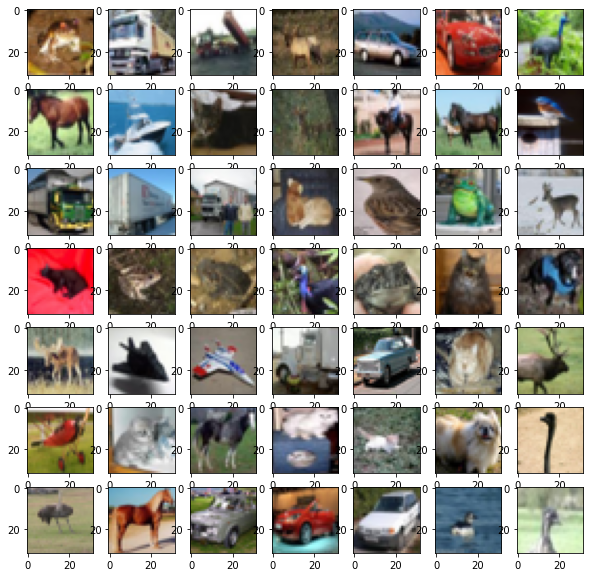

In [5]:
# plot training data

fig = plt.gcf()
fig.set_size_inches(10,10)
for i in range(49):
    plt.subplot(7,7,1+i)
    plt.imshow(x_train[i])

In [6]:
# define the standalone discriminator model

def discriminator_model():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'same', input_shape = (32,32,3)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'same', strides = (2,2)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'same', strides = (2,2)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        tf.keras.layers.Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', strides = (2,2)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.Dense(units = 1, activation = 'sigmoid')
    ])
    model.compile(loss = 'binary_crossentropy', 
              optimizer = tf.keras.optimizers.Adam(lr = 0.0002, beta_1 = 0.5), metrics = ['accuracy'])
    
    return model

In [7]:
# show the summary and graph of the discriminator model 

model = discriminator_model()

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         295168    
__________

In [8]:
# convert unsigned int to float32

x_train = x_train.astype('float32')
x_train = (x_train - 127.5)/127.5

In [9]:
# generate points in latent space as the inputs of the generator

def generate_latent_points(latent_dim,n_samples):
    x_input = np.random.randn(latent_dim * n_samples)
    x_input = x_input.reshape(n_samples,latent_dim)
    return x_input    

In [10]:
# randomly select n real samples

def generate_real_samples(dataset, n_samples):
    # define random instances
    ix = np.random.randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    x = dataset[ix]
    # generate class label (label = 1)
    y = np.ones((n_samples,1))
    return x,y

# generate n fake samples with class label

def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    x = g_model.predict(x_input)
    # generate class label (label = 0)
    y = np.zeros((n_samples,1))
    return x,y

In [11]:
# define the standalone generator model

def generator_model(latent_dim):
    n_nodes = 256*4*4
    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(units = n_nodes, input_dim = latent_dim),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        tf.keras.layers.Reshape((4,4,256)),
        # upsample to 8*8
        tf.keras.layers.Conv2DTranspose(filters = 128, kernel_size = (4,4), padding = 'same', strides = (2,2)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        # upsample to 16*16
        tf.keras.layers.Conv2DTranspose(filters = 128, kernel_size = (4,4), padding = 'same', strides = (2,2)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        # upsample to 32*32
        tf.keras.layers.Conv2DTranspose(filters = 128, kernel_size = (4,4), padding = 'same', strides = (2,2)),
        tf.keras.layers.LeakyReLU(alpha = 0.2),
        # output layer
        tf.keras.layers.Conv2D(filters = 3, kernel_size = (3,3), activation = 'tanh', padding = 'same')      
    ])
    return model

In [12]:
# show the summary and graph of the generator model

model = generator_model(10000)

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 4096)              40964096  
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         524416    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 128)       262272    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 16, 16, 128)       0         
__________

In [13]:
# define gan model (only generator model can be updated)

def gan_model(g_model, d_model):
    # freeze discriminator model
    d_model.trainable = False
    
    model = tf.keras.models.Sequential([
        g_model,
        d_model
    ])
    
    model.compile(loss = 'binary_crossentropy', 
              optimizer = tf.keras.optimizers.Adam(lr = 0.0002, beta_1 = 0.5))
    
    return model

In [14]:
# show the summary and graph of the gan model

latent_dim = 10000

g_model = generator_model(latent_dim)

d_model = discriminator_model()

gan_model = gan_model(g_model,d_model)

gan_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 32, 32, 3)         42016515  
_________________________________________________________________
sequential_3 (Sequential)    (None, 1)                 522497    
Total params: 42,539,012
Trainable params: 42,016,515
Non-trainable params: 522,497
_________________________________________________________________


In [15]:
# show and save the plots of generated images

def save_plot(examples, epoch, n = 7):
    # scale from [-1,1] to [0,1]
    examples = (examples + 1)/2.0
    # make plot
    for i in range(n*n):
        plt.subplot(n,n,i+1)
        plt.imshow(examples[i])
    
    # save plots
    filename = 'generated_plot_e%03d.png' % (epoch+1)
    plt.savefig(filename)

# evaluate discriminator model performance, display generated images, save generator model

def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples = 150):
    # prepare real samples
    x_real, y_real = generate_real_samples(dataset, n_samples)
    # evaluate discriminator on real samples
    _, acc_real = d_model.evaluate(x_real, y_real, verbose = 0)
    # prepare fake samples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake samples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose = 0)
    # display discriminator performance
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
    
    # show and save the plots of generated images
    save_plot(x_fake, epoch)
    
    # save generator model tile file
    filename = 'generator_model_%03d.h5' % (epoch+1)
    g_model.save(filename)

In [16]:
# train gan model

def train_gan(g_model, d_model, gan_model, dataset, latent_dim, n_epochs = 100, n_batch = 128):
    bat_per_epoch = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches
        for j in range(bat_per_epoch):
            # randomly select n real samples
            x_real, y_real = generate_real_samples(dataset, half_batch)
            # update standalone discriminator model
            d_loss1, _ = d_model.train_on_batch(x_real, y_real)
            # generate fake samples
            x_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update standalone discriminator model again
            d_loss2, _ = d_model.train_on_batch(x_fake, y_fake)
            # generate points in latent space as the inputs of generator model
            x_gan = generate_latent_points(latent_dim, n_batch)
            # generate class label for fake samples (label = 1)
            y_gan = np.ones((n_batch,1))
            # update the generator model with discriminator model errors
            g_loss = gan_model.train_on_batch(x_gan, y_gan)
            # display the loss
            print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' % (i+1, j+1, bat_per_epoch, d_loss1, d_loss2, g_loss))
        
        # evaluate model performance every 5 epochs  
        if (i + 1)%5 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)

>1, 1/390, d1=0.676, d2=0.699 g=0.687
>1, 2/390, d1=0.613, d2=0.712 g=0.676
>1, 3/390, d1=0.546, d2=0.742 g=0.655
>1, 4/390, d1=0.455, d2=0.795 g=0.628
>1, 5/390, d1=0.366, d2=0.848 g=0.627
>1, 6/390, d1=0.321, d2=0.827 g=0.673
>1, 7/390, d1=0.301, d2=0.769 g=0.752
>1, 8/390, d1=0.236, d2=0.699 g=0.843
>1, 9/390, d1=0.190, d2=0.651 g=0.902
>1, 10/390, d1=0.236, d2=0.680 g=0.862
>1, 11/390, d1=0.224, d2=0.849 g=0.777
>1, 12/390, d1=0.225, d2=1.182 g=0.697
>1, 13/390, d1=0.295, d2=1.374 g=0.710
>1, 14/390, d1=0.339, d2=1.034 g=0.936
>1, 15/390, d1=0.422, d2=0.621 g=1.247
>1, 16/390, d1=0.508, d2=0.510 g=1.247
>1, 17/390, d1=0.520, d2=0.605 g=0.999
>1, 18/390, d1=0.492, d2=0.749 g=0.749
>1, 19/390, d1=0.372, d2=0.840 g=0.618
>1, 20/390, d1=0.289, d2=0.893 g=0.583
>1, 21/390, d1=0.248, d2=0.904 g=0.588
>1, 22/390, d1=0.139, d2=0.857 g=0.626


>1, 23/390, d1=0.131, d2=0.786 g=0.684
>1, 24/390, d1=0.132, d2=0.721 g=0.738
>1, 25/390, d1=0.117, d2=0.722 g=0.764
>1, 26/390, d1=0.110, d2=0.927 g=0.717
>1, 27/390, d1=0.101, d2=1.164 g=0.656
>1, 28/390, d1=0.189, d2=0.966 g=0.790
>1, 29/390, d1=0.260, d2=0.671 g=1.006
>1, 30/390, d1=0.317, d2=0.512 g=1.202
>1, 31/390, d1=0.300, d2=0.416 g=1.347
>1, 32/390, d1=0.303, d2=0.371 g=1.393
>1, 33/390, d1=0.347, d2=0.424 g=1.251
>1, 34/390, d1=0.206, d2=0.717 g=1.013
>1, 35/390, d1=0.240, d2=2.203 g=0.664
>1, 36/390, d1=0.269, d2=1.170 g=1.689
>1, 37/390, d1=0.606, d2=0.290 g=1.789
>1, 38/390, d1=0.696, d2=0.449 g=1.084
>1, 39/390, d1=0.484, d2=0.615 g=0.796
>1, 40/390, d1=0.399, d2=0.708 g=0.687
>1, 41/390, d1=0.216, d2=0.763 g=0.648
>1, 42/390, d1=0.203, d2=0.814 g=0.619
>1, 43/390, d1=0.169, d2=0.883 g=0.601
>1, 44/390, d1=0.154, d2=0.902 g=0.622
>1, 45/390, d1=0.141, d2=0.830 g=0.721


>1, 46/390, d1=0.211, d2=0.762 g=0.758
>1, 47/390, d1=0.202, d2=0.731 g=0.743
>1, 48/390, d1=0.237, d2=0.817 g=0.668
>1, 49/390, d1=0.128, d2=0.949 g=0.672
>1, 50/390, d1=0.194, d2=0.908 g=0.822
>1, 51/390, d1=0.242, d2=0.687 g=1.060
>1, 52/390, d1=0.304, d2=0.503 g=1.295
>1, 53/390, d1=0.316, d2=0.436 g=1.340
>1, 54/390, d1=0.368, d2=0.479 g=1.098
>1, 55/390, d1=0.436, d2=0.608 g=0.887
>1, 56/390, d1=0.368, d2=0.703 g=0.745
>1, 57/390, d1=0.243, d2=0.800 g=0.714
>1, 58/390, d1=0.187, d2=0.809 g=0.704
>1, 59/390, d1=0.229, d2=0.826 g=0.719
>1, 60/390, d1=0.281, d2=0.752 g=0.775
>1, 61/390, d1=0.191, d2=0.674 g=0.843
>1, 62/390, d1=0.232, d2=0.622 g=0.882
>1, 63/390, d1=0.213, d2=0.612 g=0.852
>1, 64/390, d1=0.208, d2=0.696 g=0.783
>1, 65/390, d1=0.202, d2=0.823 g=0.827
>1, 66/390, d1=0.233, d2=0.664 g=1.088
>1, 67/390, d1=0.292, d2=0.542 g=1.400
>1, 68/390, d1=0.224, d2=0.378 g=1.761


>1, 69/390, d1=0.372, d2=0.325 g=1.612
>1, 70/390, d1=0.281, d2=0.356 g=1.478
>1, 71/390, d1=0.139, d2=0.375 g=1.386
>1, 72/390, d1=0.333, d2=0.463 g=1.182
>1, 73/390, d1=0.157, d2=0.507 g=1.139
>1, 74/390, d1=0.160, d2=0.484 g=1.183
>1, 75/390, d1=0.140, d2=0.450 g=1.263
>1, 76/390, d1=0.070, d2=0.379 g=1.454
>1, 77/390, d1=0.180, d2=0.323 g=1.516
>1, 78/390, d1=0.194, d2=0.337 g=1.510
>1, 79/390, d1=0.155, d2=0.325 g=1.679
>1, 80/390, d1=0.122, d2=0.274 g=1.925
>1, 81/390, d1=0.090, d2=0.212 g=2.112
>1, 82/390, d1=0.191, d2=0.236 g=1.910
>1, 83/390, d1=0.059, d2=0.269 g=2.023
>1, 84/390, d1=0.091, d2=0.214 g=2.263
>1, 85/390, d1=0.160, d2=0.250 g=1.968
>1, 86/390, d1=0.129, d2=0.627 g=1.800
>1, 87/390, d1=0.089, d2=3.149 g=1.703
>1, 88/390, d1=0.623, d2=0.369 g=6.511
>1, 89/390, d1=1.266, d2=0.135 g=2.028
>1, 90/390, d1=0.325, d2=0.797 g=1.401
>1, 91/390, d1=0.288, d2=1.039 g=1.743


>1, 92/390, d1=0.389, d2=0.580 g=2.356
>1, 93/390, d1=0.768, d2=0.454 g=2.527
>1, 94/390, d1=0.725, d2=0.369 g=2.876
>1, 95/390, d1=0.807, d2=0.213 g=2.568
>1, 96/390, d1=0.617, d2=0.305 g=2.524
>1, 97/390, d1=0.543, d2=0.295 g=2.266
>1, 98/390, d1=0.485, d2=0.283 g=2.300
>1, 99/390, d1=0.719, d2=0.391 g=1.825
>1, 100/390, d1=0.363, d2=0.454 g=1.750
>1, 101/390, d1=0.505, d2=0.404 g=1.463
>1, 102/390, d1=0.603, d2=0.666 g=1.012
>1, 103/390, d1=0.391, d2=0.846 g=0.870
>1, 104/390, d1=0.305, d2=0.909 g=0.978
>1, 105/390, d1=0.342, d2=0.947 g=1.087
>1, 106/390, d1=0.380, d2=0.932 g=1.165
>1, 107/390, d1=0.493, d2=0.852 g=1.220
>1, 108/390, d1=0.734, d2=0.668 g=1.246
>1, 109/390, d1=0.652, d2=0.535 g=1.317
>1, 110/390, d1=0.728, d2=0.471 g=1.460
>1, 111/390, d1=0.702, d2=0.342 g=1.614
>1, 112/390, d1=0.492, d2=0.339 g=1.723
>1, 113/390, d1=0.488, d2=0.327 g=1.769
>1, 114/390, d1=0.456, d2=0.342 g=1.588


>1, 115/390, d1=0.479, d2=0.400 g=1.399
>1, 116/390, d1=0.444, d2=0.466 g=1.306
>1, 117/390, d1=0.404, d2=0.484 g=1.286
>1, 118/390, d1=0.271, d2=0.445 g=1.343
>1, 119/390, d1=0.425, d2=0.455 g=1.317
>1, 120/390, d1=0.292, d2=0.498 g=1.385
>1, 121/390, d1=0.328, d2=0.429 g=1.496
>1, 122/390, d1=0.326, d2=0.383 g=1.590
>1, 123/390, d1=0.280, d2=0.358 g=1.684
>1, 124/390, d1=0.359, d2=0.305 g=1.808
>1, 125/390, d1=0.335, d2=0.280 g=1.867
>1, 126/390, d1=0.313, d2=0.332 g=1.635
>1, 127/390, d1=0.315, d2=0.797 g=1.688
>1, 128/390, d1=0.509, d2=0.456 g=2.284
>1, 129/390, d1=0.465, d2=0.175 g=2.589
>1, 130/390, d1=0.651, d2=0.204 g=2.282
>1, 131/390, d1=0.461, d2=0.250 g=2.220
>1, 132/390, d1=0.419, d2=0.255 g=1.970
>1, 133/390, d1=0.401, d2=0.370 g=1.653
>1, 134/390, d1=0.394, d2=0.373 g=1.509
>1, 135/390, d1=0.384, d2=0.451 g=1.329
>1, 136/390, d1=0.395, d2=0.830 g=0.993
>1, 137/390, d1=0.358, d2=1.708 g=1.057


>1, 138/390, d1=0.605, d2=0.673 g=1.744
>1, 139/390, d1=0.523, d2=0.239 g=2.308
>1, 140/390, d1=0.506, d2=0.209 g=2.254
>1, 141/390, d1=0.589, d2=0.317 g=2.085
>1, 142/390, d1=0.433, d2=0.431 g=2.131
>1, 143/390, d1=0.544, d2=0.347 g=1.818
>1, 144/390, d1=0.428, d2=0.470 g=1.367
>1, 145/390, d1=0.375, d2=0.580 g=1.094
>1, 146/390, d1=0.389, d2=0.595 g=1.033
>1, 147/390, d1=0.333, d2=0.669 g=0.991
>1, 148/390, d1=0.250, d2=0.783 g=0.943
>1, 149/390, d1=0.343, d2=1.131 g=1.023
>1, 150/390, d1=0.414, d2=0.657 g=1.442
>1, 151/390, d1=0.567, d2=0.409 g=1.699
>1, 152/390, d1=0.477, d2=0.418 g=1.631
>1, 153/390, d1=0.598, d2=0.607 g=1.318
>1, 154/390, d1=0.516, d2=0.933 g=1.273
>1, 155/390, d1=0.767, d2=0.639 g=1.544
>1, 156/390, d1=0.958, d2=0.565 g=1.703
>1, 157/390, d1=1.002, d2=0.390 g=1.970
>1, 158/390, d1=0.913, d2=0.242 g=2.240
>1, 159/390, d1=0.744, d2=0.188 g=2.225
>1, 160/390, d1=0.580, d2=0.219 g=2.368


>1, 161/390, d1=0.622, d2=0.193 g=2.585
>1, 162/390, d1=0.550, d2=0.187 g=2.543
>1, 163/390, d1=0.696, d2=0.221 g=2.076
>1, 164/390, d1=0.504, d2=0.302 g=1.915
>1, 165/390, d1=0.463, d2=0.279 g=1.855
>1, 166/390, d1=0.396, d2=0.300 g=1.759
>1, 167/390, d1=0.498, d2=0.351 g=1.525
>1, 168/390, d1=0.397, d2=0.464 g=1.420
>1, 169/390, d1=0.296, d2=0.480 g=1.459
>1, 170/390, d1=0.405, d2=0.413 g=1.646
>1, 171/390, d1=0.378, d2=0.335 g=1.887
>1, 172/390, d1=0.277, d2=0.281 g=2.051
>1, 173/390, d1=0.279, d2=0.242 g=2.213
>1, 174/390, d1=0.328, d2=0.225 g=2.295
>1, 175/390, d1=0.364, d2=0.235 g=2.289
>1, 176/390, d1=0.357, d2=0.226 g=2.291
>1, 177/390, d1=0.371, d2=0.228 g=2.556
>1, 178/390, d1=0.403, d2=0.192 g=2.707
>1, 179/390, d1=0.389, d2=0.200 g=2.733
>1, 180/390, d1=0.517, d2=0.303 g=2.744
>1, 181/390, d1=0.670, d2=0.200 g=2.621
>1, 182/390, d1=0.427, d2=0.223 g=2.652
>1, 183/390, d1=0.410, d2=0.160 g=2.715


>1, 184/390, d1=0.436, d2=0.182 g=2.719
>1, 185/390, d1=0.455, d2=0.197 g=2.682
>1, 186/390, d1=0.390, d2=0.253 g=2.643
>1, 187/390, d1=0.496, d2=0.375 g=2.234
>1, 188/390, d1=0.568, d2=0.530 g=1.663
>1, 189/390, d1=0.769, d2=0.807 g=1.401
>1, 190/390, d1=0.939, d2=1.691 g=1.348
>1, 191/390, d1=0.658, d2=1.017 g=2.616
>1, 192/390, d1=0.879, d2=0.172 g=2.934
>1, 193/390, d1=0.875, d2=0.266 g=1.992
>1, 194/390, d1=0.786, d2=0.644 g=1.235
>1, 195/390, d1=0.770, d2=0.635 g=1.277
>1, 196/390, d1=0.671, d2=0.473 g=1.443
>1, 197/390, d1=0.632, d2=0.376 g=1.500
>1, 198/390, d1=0.762, d2=0.360 g=1.444
>1, 199/390, d1=0.666, d2=0.369 g=1.422
>1, 200/390, d1=0.655, d2=0.352 g=1.444
>1, 201/390, d1=0.594, d2=0.359 g=1.448
>1, 202/390, d1=0.548, d2=0.343 g=1.514
>1, 203/390, d1=0.505, d2=0.310 g=1.610
>1, 204/390, d1=0.472, d2=0.278 g=1.766
>1, 205/390, d1=0.479, d2=0.280 g=1.750
>1, 206/390, d1=0.420, d2=0.269 g=1.909


>1, 207/390, d1=0.413, d2=0.229 g=2.026
>1, 208/390, d1=0.384, d2=0.233 g=1.959
>1, 209/390, d1=0.346, d2=0.224 g=2.265
>1, 210/390, d1=0.473, d2=0.275 g=2.361
>1, 211/390, d1=0.613, d2=0.476 g=3.212
>1, 212/390, d1=0.893, d2=0.223 g=2.675
>1, 213/390, d1=0.848, d2=0.600 g=2.368
>1, 214/390, d1=0.592, d2=0.221 g=1.995
>1, 215/390, d1=0.463, d2=0.328 g=1.621
>1, 216/390, d1=0.339, d2=0.401 g=1.350
>1, 217/390, d1=0.203, d2=0.514 g=1.196
>1, 218/390, d1=0.221, d2=0.649 g=1.100
>1, 219/390, d1=0.227, d2=0.698 g=1.066
>1, 220/390, d1=0.169, d2=0.576 g=1.167
>1, 221/390, d1=0.377, d2=0.469 g=1.281
>1, 222/390, d1=0.462, d2=0.398 g=1.346
>1, 223/390, d1=0.254, d2=0.389 g=1.461
>1, 224/390, d1=0.299, d2=0.328 g=1.570
>1, 225/390, d1=0.336, d2=0.298 g=1.583
>1, 226/390, d1=0.302, d2=0.293 g=1.646
>1, 227/390, d1=0.304, d2=0.276 g=1.658
>1, 228/390, d1=0.237, d2=0.322 g=1.658
>1, 229/390, d1=0.209, d2=0.342 g=1.572


>1, 230/390, d1=0.295, d2=0.383 g=1.432
>1, 231/390, d1=0.316, d2=0.386 g=1.351
>1, 232/390, d1=0.305, d2=0.354 g=1.459
>1, 233/390, d1=0.211, d2=0.379 g=1.513
>1, 234/390, d1=0.281, d2=0.517 g=1.419
>1, 235/390, d1=0.389, d2=0.831 g=1.578
>1, 236/390, d1=0.258, d2=0.437 g=2.201
>1, 237/390, d1=0.416, d2=0.240 g=2.670
>1, 238/390, d1=0.543, d2=0.248 g=2.768
>1, 239/390, d1=0.468, d2=0.254 g=2.493
>1, 240/390, d1=0.277, d2=0.413 g=2.112
>1, 241/390, d1=0.350, d2=0.359 g=1.800
>1, 242/390, d1=0.355, d2=0.546 g=1.667
>1, 243/390, d1=0.522, d2=0.533 g=1.681
>1, 244/390, d1=0.247, d2=0.763 g=1.546
>1, 245/390, d1=0.351, d2=0.612 g=1.894
>1, 246/390, d1=0.493, d2=0.256 g=2.276
>1, 247/390, d1=0.695, d2=0.225 g=2.117
>1, 248/390, d1=0.781, d2=0.424 g=1.827
>1, 249/390, d1=0.515, d2=0.370 g=1.797
>1, 250/390, d1=0.625, d2=0.424 g=1.510
>1, 251/390, d1=0.423, d2=0.564 g=1.317
>1, 252/390, d1=0.515, d2=0.920 g=1.400


>1, 253/390, d1=0.712, d2=0.872 g=2.009
>1, 254/390, d1=0.611, d2=0.266 g=2.558
>1, 255/390, d1=0.966, d2=0.154 g=2.854
>1, 256/390, d1=0.758, d2=0.152 g=3.020
>1, 257/390, d1=0.641, d2=0.161 g=3.047
>1, 258/390, d1=0.471, d2=0.272 g=2.931
>1, 259/390, d1=0.372, d2=0.570 g=2.948
>1, 260/390, d1=0.483, d2=0.459 g=2.539
>1, 261/390, d1=0.959, d2=0.606 g=2.246
>1, 262/390, d1=0.839, d2=0.293 g=2.401
>1, 263/390, d1=0.770, d2=0.190 g=2.485
>1, 264/390, d1=0.723, d2=0.159 g=2.368
>1, 265/390, d1=0.646, d2=0.179 g=2.616
>1, 266/390, d1=0.494, d2=0.109 g=2.716
>1, 267/390, d1=0.639, d2=0.100 g=2.609
>1, 268/390, d1=0.695, d2=0.124 g=2.431
>1, 269/390, d1=0.647, d2=0.170 g=2.214
>1, 270/390, d1=0.458, d2=0.173 g=2.222
>1, 271/390, d1=0.346, d2=0.149 g=2.096
>1, 272/390, d1=0.414, d2=0.175 g=2.075
>1, 273/390, d1=0.405, d2=0.179 g=1.919
>1, 274/390, d1=0.499, d2=0.231 g=1.793
>1, 275/390, d1=0.420, d2=0.233 g=1.716


>1, 276/390, d1=0.464, d2=0.249 g=1.654
>1, 277/390, d1=0.315, d2=0.285 g=1.563
>1, 278/390, d1=0.357, d2=0.300 g=1.398
>1, 279/390, d1=0.237, d2=0.393 g=1.251
>1, 280/390, d1=0.394, d2=0.609 g=1.048
>1, 281/390, d1=0.215, d2=1.040 g=0.897
>1, 282/390, d1=0.502, d2=1.124 g=0.993
>1, 283/390, d1=0.609, d2=0.811 g=1.383
>1, 284/390, d1=0.470, d2=0.335 g=1.707
>1, 285/390, d1=0.564, d2=0.322 g=1.979
>1, 286/390, d1=0.501, d2=0.469 g=1.997
>1, 287/390, d1=0.495, d2=0.892 g=1.819
>1, 288/390, d1=0.822, d2=0.581 g=1.293
>1, 289/390, d1=0.871, d2=0.605 g=1.103
>1, 290/390, d1=0.772, d2=0.570 g=1.198
>1, 291/390, d1=0.850, d2=0.447 g=1.407
>1, 292/390, d1=0.777, d2=0.358 g=1.626
>1, 293/390, d1=0.755, d2=0.269 g=1.757
>1, 294/390, d1=0.586, d2=0.280 g=1.691
>1, 295/390, d1=0.612, d2=0.307 g=1.737
>1, 296/390, d1=0.578, d2=0.332 g=1.563
>1, 297/390, d1=0.642, d2=0.451 g=1.272
>1, 298/390, d1=0.523, d2=0.555 g=1.083


>1, 299/390, d1=0.487, d2=0.577 g=1.023
>1, 300/390, d1=0.523, d2=0.565 g=1.028
>1, 301/390, d1=0.489, d2=0.509 g=1.092
>1, 302/390, d1=0.472, d2=0.442 g=1.196
>1, 303/390, d1=0.492, d2=0.380 g=1.281
>1, 304/390, d1=0.501, d2=0.364 g=1.351
>1, 305/390, d1=0.445, d2=0.343 g=1.401
>1, 306/390, d1=0.436, d2=0.320 g=1.507
>1, 307/390, d1=0.452, d2=0.303 g=1.549
>1, 308/390, d1=0.411, d2=0.300 g=1.619
>1, 309/390, d1=0.398, d2=0.320 g=1.638
>1, 310/390, d1=0.291, d2=0.299 g=1.816
>1, 311/390, d1=0.405, d2=0.265 g=2.027
>1, 312/390, d1=0.310, d2=0.190 g=2.173
>1, 313/390, d1=0.360, d2=0.177 g=2.175
>1, 314/390, d1=0.456, d2=0.249 g=1.982
>1, 315/390, d1=0.341, d2=0.443 g=2.056
>1, 316/390, d1=0.429, d2=0.437 g=2.181
>1, 317/390, d1=0.639, d2=0.507 g=2.231
>1, 318/390, d1=0.647, d2=0.359 g=2.284
>1, 319/390, d1=1.028, d2=0.622 g=2.640
>1, 320/390, d1=0.823, d2=0.118 g=2.386
>1, 321/390, d1=0.978, d2=0.219 g=1.932


>1, 322/390, d1=0.426, d2=0.391 g=2.167
>1, 323/390, d1=0.351, d2=0.128 g=2.526
>1, 324/390, d1=0.384, d2=0.133 g=2.344
>1, 325/390, d1=0.172, d2=0.150 g=2.301
>1, 326/390, d1=0.253, d2=0.203 g=1.968
>1, 327/390, d1=0.194, d2=0.345 g=1.598
>1, 328/390, d1=0.162, d2=0.937 g=1.019
>1, 329/390, d1=0.208, d2=1.492 g=1.102
>1, 330/390, d1=0.327, d2=0.557 g=1.396
>1, 331/390, d1=0.439, d2=0.328 g=1.529
>1, 332/390, d1=0.480, d2=0.353 g=1.451
>1, 333/390, d1=0.336, d2=0.375 g=1.395
>1, 334/390, d1=0.348, d2=0.436 g=1.394
>1, 335/390, d1=0.363, d2=0.420 g=1.330
>1, 336/390, d1=0.368, d2=0.434 g=1.244
>1, 337/390, d1=0.250, d2=0.404 g=1.254
>1, 338/390, d1=0.170, d2=0.370 g=1.342
>1, 339/390, d1=0.165, d2=0.339 g=1.418
>1, 340/390, d1=0.149, d2=0.325 g=1.496
>1, 341/390, d1=0.168, d2=0.279 g=1.580
>1, 342/390, d1=0.166, d2=0.282 g=1.600
>1, 343/390, d1=0.079, d2=0.257 g=1.675
>1, 344/390, d1=0.100, d2=0.241 g=1.743


>1, 345/390, d1=0.145, d2=0.206 g=1.821
>1, 346/390, d1=0.105, d2=0.198 g=1.857
>1, 347/390, d1=0.090, d2=0.182 g=1.903
>1, 348/390, d1=0.063, d2=0.190 g=2.003
>1, 349/390, d1=0.078, d2=0.181 g=2.068
>1, 350/390, d1=0.116, d2=0.162 g=2.091
>1, 351/390, d1=0.098, d2=0.190 g=2.077
>1, 352/390, d1=0.117, d2=0.193 g=2.009
>1, 353/390, d1=0.091, d2=0.548 g=2.350
>1, 354/390, d1=0.234, d2=0.438 g=2.927
>1, 355/390, d1=0.476, d2=0.284 g=2.983
>1, 356/390, d1=0.391, d2=0.576 g=3.894
>1, 357/390, d1=1.126, d2=0.222 g=3.477
>1, 358/390, d1=0.914, d2=0.238 g=2.160
>1, 359/390, d1=0.542, d2=0.565 g=1.726
>1, 360/390, d1=0.482, d2=0.580 g=1.601
>1, 361/390, d1=0.593, d2=0.965 g=1.471
>1, 362/390, d1=0.356, d2=1.106 g=1.614
>1, 363/390, d1=0.552, d2=0.897 g=1.628
>1, 364/390, d1=0.523, d2=0.731 g=1.668
>1, 365/390, d1=0.323, d2=0.544 g=1.808
>1, 366/390, d1=0.650, d2=0.352 g=1.984
>1, 367/390, d1=0.692, d2=0.339 g=1.914


>1, 368/390, d1=0.685, d2=0.386 g=2.010
>1, 369/390, d1=0.737, d2=0.512 g=2.001
>1, 370/390, d1=0.673, d2=0.432 g=1.927
>1, 371/390, d1=0.692, d2=0.450 g=1.503
>1, 372/390, d1=0.635, d2=0.546 g=1.372
>1, 373/390, d1=0.582, d2=0.652 g=1.353
>1, 374/390, d1=0.678, d2=0.618 g=1.424
>1, 375/390, d1=0.574, d2=0.520 g=1.376
>1, 376/390, d1=0.485, d2=0.664 g=1.430
>1, 377/390, d1=0.676, d2=0.562 g=1.285
>1, 378/390, d1=0.587, d2=0.543 g=1.286
>1, 379/390, d1=0.616, d2=0.676 g=1.256
>1, 380/390, d1=0.555, d2=0.610 g=1.309
>1, 381/390, d1=0.576, d2=0.411 g=1.281
>1, 382/390, d1=0.696, d2=0.540 g=1.318
>1, 383/390, d1=0.614, d2=0.429 g=1.329
>1, 384/390, d1=0.631, d2=0.369 g=1.300
>1, 385/390, d1=0.514, d2=0.487 g=1.246
>1, 386/390, d1=0.587, d2=0.534 g=1.201
>1, 387/390, d1=0.565, d2=0.618 g=1.179
>1, 388/390, d1=0.451, d2=0.460 g=1.164
>1, 389/390, d1=0.444, d2=0.509 g=1.259
>1, 390/390, d1=0.478, d2=0.475 g=1.274


>2, 1/390, d1=0.474, d2=0.458 g=1.347
>2, 2/390, d1=0.368, d2=0.730 g=1.395
>2, 3/390, d1=0.452, d2=0.477 g=1.425
>2, 4/390, d1=0.473, d2=0.632 g=1.594
>2, 5/390, d1=0.472, d2=0.545 g=1.753
>2, 6/390, d1=0.729, d2=0.391 g=1.798
>2, 7/390, d1=0.770, d2=0.606 g=1.950
>2, 8/390, d1=0.777, d2=0.404 g=1.888
>2, 9/390, d1=0.783, d2=0.290 g=1.897
>2, 10/390, d1=0.745, d2=0.264 g=1.831
>2, 11/390, d1=0.724, d2=0.443 g=1.665
>2, 12/390, d1=0.583, d2=0.257 g=1.867
>2, 13/390, d1=0.595, d2=0.396 g=1.810
>2, 14/390, d1=0.472, d2=0.394 g=1.736
>2, 15/390, d1=0.523, d2=0.330 g=1.500
>2, 16/390, d1=0.442, d2=0.546 g=1.398
>2, 17/390, d1=0.495, d2=0.603 g=1.135
>2, 18/390, d1=0.571, d2=0.745 g=1.034
>2, 19/390, d1=0.348, d2=0.864 g=0.947
>2, 20/390, d1=0.468, d2=0.882 g=0.985
>2, 21/390, d1=0.462, d2=0.758 g=1.022
>2, 22/390, d1=0.795, d2=0.830 g=0.822
>2, 23/390, d1=0.527, d2=0.866 g=0.735


>2, 24/390, d1=0.596, d2=0.751 g=0.807
>2, 25/390, d1=0.557, d2=0.840 g=0.858
>2, 26/390, d1=0.622, d2=0.664 g=0.878
>2, 27/390, d1=0.581, d2=0.652 g=0.912
>2, 28/390, d1=0.656, d2=0.610 g=0.951
>2, 29/390, d1=0.576, d2=0.511 g=0.982
>2, 30/390, d1=0.533, d2=0.573 g=1.015
>2, 31/390, d1=0.496, d2=0.527 g=1.059
>2, 32/390, d1=0.497, d2=0.571 g=1.026
>2, 33/390, d1=0.584, d2=0.558 g=1.044
>2, 34/390, d1=0.560, d2=0.521 g=1.039
>2, 35/390, d1=0.576, d2=0.547 g=1.039
>2, 36/390, d1=0.642, d2=0.578 g=1.051
>2, 37/390, d1=0.580, d2=0.625 g=1.110
>2, 38/390, d1=0.596, d2=0.473 g=1.114
>2, 39/390, d1=0.640, d2=0.512 g=1.119
>2, 40/390, d1=0.507, d2=0.469 g=1.156
>2, 41/390, d1=0.566, d2=0.491 g=1.230
>2, 42/390, d1=0.625, d2=0.426 g=1.241
>2, 43/390, d1=0.573, d2=0.494 g=1.275
>2, 44/390, d1=0.534, d2=0.442 g=1.249
>2, 45/390, d1=0.538, d2=0.360 g=1.249
>2, 46/390, d1=0.662, d2=0.391 g=1.232


>2, 47/390, d1=0.595, d2=0.526 g=1.145
>2, 48/390, d1=0.567, d2=0.527 g=1.174
>2, 49/390, d1=0.546, d2=0.620 g=1.173
>2, 50/390, d1=0.622, d2=0.619 g=1.099
>2, 51/390, d1=0.572, d2=0.684 g=0.920
>2, 52/390, d1=0.687, d2=0.832 g=0.751
>2, 53/390, d1=0.609, d2=0.781 g=0.858
>2, 54/390, d1=0.555, d2=0.559 g=1.217
>2, 55/390, d1=0.626, d2=0.409 g=1.411
>2, 56/390, d1=0.573, d2=0.528 g=1.095
>2, 57/390, d1=0.532, d2=0.665 g=0.986
>2, 58/390, d1=0.500, d2=0.717 g=0.951
>2, 59/390, d1=0.477, d2=0.575 g=1.105
>2, 60/390, d1=0.553, d2=0.492 g=1.121
>2, 61/390, d1=0.635, d2=0.484 g=1.246
>2, 62/390, d1=0.605, d2=0.498 g=1.315
>2, 63/390, d1=0.585, d2=0.452 g=1.416
>2, 64/390, d1=0.588, d2=0.418 g=1.392
>2, 65/390, d1=0.569, d2=0.421 g=1.404
>2, 66/390, d1=0.559, d2=0.475 g=1.395
>2, 67/390, d1=0.458, d2=0.436 g=1.456
>2, 68/390, d1=0.467, d2=0.412 g=1.430
>2, 69/390, d1=0.336, d2=0.456 g=1.345


>2, 70/390, d1=0.372, d2=0.753 g=1.022
>2, 71/390, d1=0.394, d2=0.942 g=0.872
>2, 72/390, d1=0.458, d2=0.811 g=0.861
>2, 73/390, d1=0.546, d2=0.767 g=0.883
>2, 74/390, d1=0.594, d2=0.761 g=0.983
>2, 75/390, d1=0.706, d2=0.606 g=1.077
>2, 76/390, d1=0.690, d2=0.566 g=1.035
>2, 77/390, d1=0.614, d2=0.532 g=1.094
>2, 78/390, d1=0.603, d2=0.522 g=1.173
>2, 79/390, d1=0.613, d2=0.498 g=1.109
>2, 80/390, d1=0.598, d2=0.484 g=1.092
>2, 81/390, d1=0.508, d2=0.576 g=1.117
>2, 82/390, d1=0.577, d2=0.502 g=1.119
>2, 83/390, d1=0.525, d2=0.558 g=1.180
>2, 84/390, d1=0.619, d2=0.490 g=1.181
>2, 85/390, d1=0.587, d2=0.528 g=1.176
>2, 86/390, d1=0.557, d2=0.532 g=1.192
>2, 87/390, d1=0.709, d2=0.537 g=1.196
>2, 88/390, d1=0.688, d2=0.527 g=1.110
>2, 89/390, d1=0.625, d2=0.547 g=1.135
>2, 90/390, d1=0.613, d2=0.586 g=1.122
>2, 91/390, d1=0.593, d2=0.553 g=1.144
>2, 92/390, d1=0.519, d2=0.539 g=1.118


>2, 93/390, d1=0.494, d2=0.531 g=1.150
>2, 94/390, d1=0.547, d2=0.558 g=1.111
>2, 95/390, d1=0.625, d2=0.586 g=1.038
>2, 96/390, d1=0.550, d2=0.573 g=1.112
>2, 97/390, d1=0.554, d2=0.547 g=1.109
>2, 98/390, d1=0.601, d2=0.569 g=1.075
>2, 99/390, d1=0.519, d2=0.642 g=1.133
>2, 100/390, d1=0.572, d2=0.593 g=1.121
>2, 101/390, d1=0.582, d2=0.732 g=1.045
>2, 102/390, d1=0.671, d2=0.649 g=1.236
>2, 103/390, d1=0.638, d2=0.522 g=1.223
>2, 104/390, d1=0.719, d2=0.461 g=1.237
>2, 105/390, d1=0.652, d2=0.411 g=1.237
>2, 106/390, d1=0.503, d2=0.390 g=1.406
>2, 107/390, d1=0.597, d2=0.366 g=1.464
>2, 108/390, d1=0.467, d2=0.319 g=1.537
>2, 109/390, d1=0.414, d2=0.357 g=1.536
>2, 110/390, d1=0.345, d2=0.380 g=1.575
>2, 111/390, d1=0.337, d2=0.601 g=1.774
>2, 112/390, d1=0.566, d2=0.361 g=1.789
>2, 113/390, d1=0.642, d2=0.765 g=2.001
>2, 114/390, d1=0.717, d2=0.384 g=1.945
>2, 115/390, d1=1.016, d2=0.548 g=1.520


>2, 116/390, d1=0.975, d2=1.173 g=1.575
>2, 117/390, d1=0.911, d2=0.772 g=1.900
>2, 118/390, d1=0.994, d2=0.348 g=1.941
>2, 119/390, d1=0.763, d2=0.345 g=2.279
>2, 120/390, d1=0.615, d2=0.260 g=2.595
>2, 121/390, d1=0.542, d2=0.259 g=2.518
>2, 122/390, d1=0.401, d2=0.456 g=1.477
>2, 123/390, d1=0.454, d2=0.973 g=1.189
>2, 124/390, d1=0.631, d2=0.839 g=1.108
>2, 125/390, d1=0.528, d2=0.788 g=1.204
>2, 126/390, d1=0.866, d2=0.866 g=0.872
>2, 127/390, d1=0.603, d2=0.898 g=0.777
>2, 128/390, d1=0.608, d2=0.753 g=0.871
>2, 129/390, d1=0.587, d2=0.761 g=0.822
>2, 130/390, d1=0.658, d2=0.668 g=0.954
>2, 131/390, d1=0.673, d2=0.613 g=0.956
>2, 132/390, d1=0.666, d2=0.567 g=1.057
>2, 133/390, d1=0.605, d2=0.475 g=1.086
>2, 134/390, d1=0.630, d2=0.484 g=1.114
>2, 135/390, d1=0.603, d2=0.476 g=1.144
>2, 136/390, d1=0.693, d2=0.435 g=1.174
>2, 137/390, d1=0.595, d2=0.469 g=1.137
>2, 138/390, d1=0.636, d2=0.530 g=1.157


>2, 139/390, d1=0.675, d2=0.494 g=1.075
>2, 140/390, d1=0.567, d2=0.520 g=1.094
>2, 141/390, d1=0.672, d2=0.541 g=1.049
>2, 142/390, d1=0.667, d2=0.561 g=1.010
>2, 143/390, d1=0.604, d2=0.637 g=1.055
>2, 144/390, d1=0.586, d2=0.549 g=1.082
>2, 145/390, d1=0.689, d2=0.489 g=1.142
>2, 146/390, d1=0.820, d2=0.511 g=1.175
>2, 147/390, d1=0.625, d2=0.463 g=1.173
>2, 148/390, d1=0.760, d2=0.465 g=1.225
>2, 149/390, d1=0.686, d2=0.494 g=1.190
>2, 150/390, d1=0.621, d2=0.452 g=1.247
>2, 151/390, d1=0.663, d2=0.471 g=1.279
>2, 152/390, d1=0.548, d2=0.433 g=1.367
>2, 153/390, d1=0.518, d2=0.415 g=1.346
>2, 154/390, d1=0.491, d2=0.465 g=1.208
>2, 155/390, d1=0.558, d2=0.508 g=1.088
>2, 156/390, d1=0.583, d2=0.672 g=0.932
>2, 157/390, d1=0.564, d2=0.741 g=0.844
>2, 158/390, d1=0.524, d2=0.738 g=0.981
>2, 159/390, d1=0.480, d2=0.629 g=1.201
>2, 160/390, d1=0.579, d2=0.517 g=1.209
>2, 161/390, d1=0.603, d2=0.563 g=1.161


>2, 162/390, d1=0.606, d2=0.590 g=1.011
>2, 163/390, d1=0.566, d2=0.572 g=1.052
>2, 164/390, d1=0.564, d2=0.524 g=1.188
>2, 165/390, d1=0.604, d2=0.508 g=1.187
>2, 166/390, d1=0.470, d2=0.470 g=1.232
>2, 167/390, d1=0.612, d2=0.438 g=1.262
>2, 168/390, d1=0.544, d2=0.384 g=1.291
>2, 169/390, d1=0.646, d2=0.385 g=1.311
>2, 170/390, d1=0.455, d2=0.403 g=1.435
>2, 171/390, d1=0.447, d2=0.365 g=1.449
>2, 172/390, d1=0.616, d2=0.336 g=1.473
>2, 173/390, d1=0.456, d2=0.375 g=1.369
>2, 174/390, d1=0.320, d2=0.453 g=1.306
>2, 175/390, d1=0.379, d2=0.586 g=1.461
>2, 176/390, d1=0.524, d2=0.467 g=1.518
>2, 177/390, d1=0.671, d2=0.449 g=1.701
>2, 178/390, d1=0.788, d2=0.343 g=1.715
>2, 179/390, d1=0.702, d2=0.351 g=1.767
>2, 180/390, d1=0.648, d2=0.364 g=1.746
>2, 181/390, d1=0.797, d2=0.280 g=1.797
>2, 182/390, d1=0.823, d2=0.448 g=1.558
>2, 183/390, d1=0.692, d2=0.422 g=1.579
>2, 184/390, d1=0.724, d2=0.393 g=1.448


>2, 185/390, d1=0.702, d2=0.475 g=1.378
>2, 186/390, d1=0.544, d2=0.534 g=1.350
>2, 187/390, d1=0.572, d2=0.576 g=1.281
>2, 188/390, d1=0.543, d2=0.730 g=1.147
>2, 189/390, d1=0.541, d2=0.875 g=1.121
>2, 190/390, d1=0.553, d2=0.830 g=1.231
>2, 191/390, d1=0.640, d2=0.607 g=1.355
>2, 192/390, d1=0.548, d2=0.587 g=1.345
>2, 193/390, d1=0.546, d2=0.685 g=1.282
>2, 194/390, d1=0.687, d2=0.880 g=1.100
>2, 195/390, d1=0.690, d2=0.689 g=1.210
>2, 196/390, d1=0.640, d2=0.542 g=1.318
>2, 197/390, d1=0.717, d2=0.449 g=1.336
>2, 198/390, d1=0.527, d2=0.465 g=1.464
>2, 199/390, d1=0.545, d2=0.418 g=1.296
>2, 200/390, d1=0.676, d2=0.560 g=1.186
>2, 201/390, d1=0.690, d2=0.654 g=1.072
>2, 202/390, d1=0.639, d2=0.642 g=0.987
>2, 203/390, d1=0.651, d2=0.697 g=0.997
>2, 204/390, d1=0.539, d2=0.696 g=1.066
>2, 205/390, d1=0.736, d2=0.549 g=1.142
>2, 206/390, d1=0.611, d2=0.501 g=1.148
>2, 207/390, d1=0.697, d2=0.453 g=1.275


>2, 208/390, d1=0.646, d2=0.418 g=1.299
>2, 209/390, d1=0.711, d2=0.445 g=1.239
>2, 210/390, d1=0.625, d2=0.491 g=1.193
>2, 211/390, d1=0.720, d2=0.543 g=1.213
>2, 212/390, d1=0.672, d2=0.546 g=1.072
>2, 213/390, d1=0.680, d2=0.628 g=1.007
>2, 214/390, d1=0.626, d2=0.619 g=1.063
>2, 215/390, d1=0.634, d2=0.634 g=1.056
>2, 216/390, d1=0.607, d2=0.601 g=1.011
>2, 217/390, d1=0.676, d2=0.612 g=0.962
>2, 218/390, d1=0.741, d2=0.623 g=0.934
>2, 219/390, d1=0.660, d2=0.838 g=0.895
>2, 220/390, d1=0.706, d2=0.693 g=0.955
>2, 221/390, d1=0.582, d2=0.623 g=1.050
>2, 222/390, d1=0.632, d2=0.505 g=1.281
>2, 223/390, d1=0.647, d2=0.461 g=1.269
>2, 224/390, d1=0.612, d2=0.541 g=1.215
>2, 225/390, d1=0.644, d2=0.572 g=0.992
>2, 226/390, d1=0.591, d2=0.711 g=0.903
>2, 227/390, d1=0.552, d2=0.833 g=0.924
>2, 228/390, d1=0.563, d2=0.688 g=0.986
>2, 229/390, d1=0.667, d2=0.634 g=1.037
>2, 230/390, d1=0.665, d2=0.611 g=1.085


>2, 231/390, d1=0.694, d2=0.547 g=1.105
>2, 232/390, d1=0.703, d2=0.514 g=1.153
>2, 233/390, d1=0.765, d2=0.498 g=1.112
>2, 234/390, d1=0.709, d2=0.491 g=1.199
>2, 235/390, d1=0.670, d2=0.460 g=1.257
>2, 236/390, d1=0.661, d2=0.387 g=1.318
>2, 237/390, d1=0.646, d2=0.418 g=1.283
>2, 238/390, d1=0.571, d2=0.403 g=1.409
>2, 239/390, d1=0.607, d2=0.411 g=1.431
>2, 240/390, d1=0.681, d2=0.440 g=1.377
>2, 241/390, d1=0.489, d2=0.406 g=1.399
>2, 242/390, d1=0.528, d2=0.436 g=1.422
>2, 243/390, d1=0.521, d2=0.374 g=1.300
>2, 244/390, d1=0.446, d2=0.482 g=1.309
>2, 245/390, d1=0.578, d2=0.546 g=1.141
>2, 246/390, d1=0.681, d2=0.672 g=1.014
>2, 247/390, d1=0.567, d2=0.718 g=0.921
>2, 248/390, d1=0.721, d2=0.782 g=0.916
>2, 249/390, d1=0.668, d2=0.650 g=1.040
>2, 250/390, d1=0.581, d2=0.499 g=1.229
>2, 251/390, d1=0.592, d2=0.407 g=1.492
>2, 252/390, d1=0.526, d2=0.364 g=1.508
>2, 253/390, d1=0.499, d2=0.409 g=1.337


>2, 254/390, d1=0.442, d2=0.407 g=1.374
>2, 255/390, d1=0.340, d2=0.467 g=1.282
>2, 256/390, d1=0.313, d2=0.647 g=1.255
>2, 257/390, d1=0.291, d2=0.678 g=1.462
>2, 258/390, d1=0.584, d2=0.573 g=1.564
>2, 259/390, d1=0.663, d2=0.470 g=1.602
>2, 260/390, d1=0.520, d2=0.460 g=1.546
>2, 261/390, d1=0.745, d2=0.614 g=1.685
>2, 262/390, d1=0.853, d2=0.509 g=1.731
>2, 263/390, d1=0.922, d2=0.636 g=1.744
>2, 264/390, d1=0.739, d2=0.370 g=1.688
>2, 265/390, d1=0.780, d2=0.574 g=1.439
>2, 266/390, d1=0.566, d2=0.732 g=1.312
>2, 267/390, d1=0.791, d2=0.812 g=1.202
>2, 268/390, d1=0.785, d2=0.673 g=1.201
>2, 269/390, d1=0.875, d2=0.772 g=1.108
>2, 270/390, d1=0.747, d2=0.626 g=1.219
>2, 271/390, d1=0.853, d2=0.507 g=1.271
>2, 272/390, d1=0.742, d2=0.444 g=1.356
>2, 273/390, d1=0.683, d2=0.368 g=1.431
>2, 274/390, d1=0.616, d2=0.375 g=1.450
>2, 275/390, d1=0.614, d2=0.380 g=1.554
>2, 276/390, d1=0.534, d2=0.336 g=1.502


>2, 277/390, d1=0.539, d2=0.363 g=1.374
>2, 278/390, d1=0.523, d2=0.521 g=1.270
>2, 279/390, d1=0.474, d2=0.526 g=1.191
>2, 280/390, d1=0.543, d2=0.563 g=1.134
>2, 281/390, d1=0.469, d2=0.592 g=1.059
>2, 282/390, d1=0.541, d2=0.644 g=1.022
>2, 283/390, d1=0.545, d2=0.769 g=0.972
>2, 284/390, d1=0.549, d2=0.744 g=0.909
>2, 285/390, d1=0.584, d2=0.886 g=0.906
>2, 286/390, d1=0.763, d2=0.902 g=0.938
>2, 287/390, d1=0.759, d2=0.737 g=0.936
>2, 288/390, d1=0.825, d2=0.669 g=0.996
>2, 289/390, d1=0.768, d2=0.617 g=1.020
>2, 290/390, d1=0.861, d2=0.574 g=1.100
>2, 291/390, d1=0.889, d2=0.514 g=1.081
>2, 292/390, d1=0.873, d2=0.566 g=1.103
>2, 293/390, d1=0.748, d2=0.530 g=1.190
>2, 294/390, d1=0.698, d2=0.486 g=1.143
>2, 295/390, d1=0.750, d2=0.518 g=1.195
>2, 296/390, d1=0.760, d2=0.515 g=1.136
>2, 297/390, d1=0.716, d2=0.501 g=1.121
>2, 298/390, d1=0.677, d2=0.512 g=1.140
>2, 299/390, d1=0.711, d2=0.506 g=1.134


>2, 300/390, d1=0.611, d2=0.507 g=1.167
>2, 301/390, d1=0.675, d2=0.449 g=1.132
>2, 302/390, d1=0.606, d2=0.508 g=1.139
>2, 303/390, d1=0.638, d2=0.503 g=1.164
>2, 304/390, d1=0.689, d2=0.496 g=1.177
>2, 305/390, d1=0.644, d2=0.516 g=1.187
>2, 306/390, d1=0.589, d2=0.535 g=1.107
>2, 307/390, d1=0.701, d2=0.524 g=1.095
>2, 308/390, d1=0.762, d2=0.578 g=1.007
>2, 309/390, d1=0.697, d2=0.629 g=0.999
>2, 310/390, d1=0.748, d2=0.612 g=1.054
>2, 311/390, d1=0.763, d2=0.598 g=1.095
>2, 312/390, d1=0.676, d2=0.580 g=1.125
>2, 313/390, d1=0.681, d2=0.501 g=1.124
>2, 314/390, d1=0.698, d2=0.488 g=1.166
>2, 315/390, d1=0.692, d2=0.487 g=1.203
>2, 316/390, d1=0.641, d2=0.485 g=1.202
>2, 317/390, d1=0.603, d2=0.476 g=1.122
>2, 318/390, d1=0.646, d2=0.471 g=1.205
>2, 319/390, d1=0.577, d2=0.452 g=1.192
>2, 320/390, d1=0.553, d2=0.462 g=1.244
>2, 321/390, d1=0.587, d2=0.451 g=1.211
>2, 322/390, d1=0.607, d2=0.477 g=1.212


>2, 323/390, d1=0.524, d2=0.428 g=1.193
>2, 324/390, d1=0.566, d2=0.453 g=1.190
>2, 325/390, d1=0.593, d2=0.437 g=1.183
>2, 326/390, d1=0.584, d2=0.540 g=1.176
>2, 327/390, d1=0.623, d2=0.511 g=1.211
>2, 328/390, d1=0.640, d2=0.521 g=1.191
>2, 329/390, d1=0.592, d2=0.556 g=1.185
>2, 330/390, d1=0.621, d2=0.598 g=1.171
>2, 331/390, d1=0.725, d2=0.668 g=1.315
>2, 332/390, d1=0.700, d2=0.620 g=1.577
>2, 333/390, d1=0.820, d2=0.460 g=2.053
>2, 334/390, d1=0.867, d2=0.375 g=2.401
>2, 335/390, d1=0.780, d2=0.254 g=2.123
>2, 336/390, d1=0.817, d2=0.419 g=1.316
>2, 337/390, d1=0.624, d2=0.582 g=1.044
>2, 338/390, d1=0.600, d2=0.698 g=0.981
>2, 339/390, d1=0.686, d2=0.696 g=1.046
>2, 340/390, d1=0.563, d2=0.595 g=1.094
>2, 341/390, d1=0.698, d2=0.525 g=1.106
>2, 342/390, d1=0.645, d2=0.570 g=1.145
>2, 343/390, d1=0.636, d2=0.639 g=1.150
>2, 344/390, d1=0.674, d2=0.557 g=1.166
>2, 345/390, d1=0.663, d2=0.603 g=1.174


>2, 346/390, d1=0.718, d2=0.513 g=1.295
>2, 347/390, d1=0.593, d2=0.511 g=1.357
>2, 348/390, d1=0.597, d2=0.468 g=1.315
>2, 349/390, d1=0.555, d2=0.398 g=1.480
>2, 350/390, d1=0.528, d2=0.442 g=1.310
>2, 351/390, d1=0.439, d2=0.414 g=1.460
>2, 352/390, d1=0.486, d2=0.397 g=1.443
>2, 353/390, d1=0.423, d2=0.445 g=1.364
>2, 354/390, d1=0.378, d2=0.376 g=1.363
>2, 355/390, d1=0.333, d2=0.453 g=1.381
>2, 356/390, d1=0.315, d2=0.496 g=1.534
>2, 357/390, d1=0.531, d2=0.354 g=1.650
>2, 358/390, d1=0.527, d2=0.336 g=1.680
>2, 359/390, d1=0.501, d2=0.358 g=1.944
>2, 360/390, d1=0.459, d2=0.240 g=1.856
>2, 361/390, d1=0.460, d2=0.342 g=2.073
>2, 362/390, d1=0.549, d2=0.352 g=2.095
>2, 363/390, d1=0.814, d2=0.396 g=1.869
>2, 364/390, d1=0.813, d2=0.472 g=1.683
>2, 365/390, d1=0.589, d2=0.486 g=1.673
>2, 366/390, d1=0.809, d2=0.536 g=1.361
>2, 367/390, d1=0.681, d2=0.824 g=1.193
>2, 368/390, d1=0.835, d2=0.972 g=1.301


>2, 369/390, d1=1.012, d2=0.523 g=1.855
>2, 370/390, d1=0.891, d2=0.318 g=2.003
>2, 371/390, d1=0.747, d2=0.402 g=1.340
>2, 372/390, d1=0.719, d2=0.639 g=1.182
>2, 373/390, d1=0.621, d2=0.632 g=1.115
>2, 374/390, d1=0.746, d2=0.492 g=1.215
>2, 375/390, d1=0.654, d2=0.490 g=1.220
>2, 376/390, d1=0.489, d2=0.470 g=1.212
>2, 377/390, d1=0.621, d2=0.495 g=1.166
>2, 378/390, d1=0.464, d2=0.491 g=1.146
>2, 379/390, d1=0.437, d2=0.487 g=1.145
>2, 380/390, d1=0.457, d2=0.532 g=1.141
>2, 381/390, d1=0.454, d2=0.514 g=1.189
>2, 382/390, d1=0.488, d2=0.512 g=1.326
>2, 383/390, d1=0.430, d2=0.508 g=1.333
>2, 384/390, d1=0.326, d2=0.461 g=1.401
>2, 385/390, d1=0.366, d2=0.591 g=1.614
>2, 386/390, d1=0.359, d2=0.487 g=1.771
>2, 387/390, d1=0.498, d2=0.663 g=1.917
>2, 388/390, d1=0.473, d2=0.525 g=1.709
>2, 389/390, d1=0.445, d2=0.680 g=1.450
>2, 390/390, d1=0.510, d2=0.748 g=1.500
>3, 1/390, d1=0.480, d2=0.690 g=1.547


>3, 2/390, d1=0.694, d2=0.647 g=1.484
>3, 3/390, d1=0.607, d2=0.637 g=1.261
>3, 4/390, d1=0.615, d2=0.822 g=1.133
>3, 5/390, d1=0.760, d2=0.793 g=1.114
>3, 6/390, d1=0.599, d2=0.668 g=1.232
>3, 7/390, d1=0.745, d2=0.605 g=1.325
>3, 8/390, d1=0.891, d2=0.582 g=1.277
>3, 9/390, d1=1.116, d2=0.590 g=1.135
>3, 10/390, d1=0.816, d2=0.571 g=1.228
>3, 11/390, d1=0.757, d2=0.498 g=1.190
>3, 12/390, d1=0.761, d2=0.582 g=1.201
>3, 13/390, d1=0.680, d2=0.566 g=1.190
>3, 14/390, d1=0.799, d2=0.520 g=1.122
>3, 15/390, d1=0.690, d2=0.526 g=1.106
>3, 16/390, d1=0.805, d2=0.677 g=1.037
>3, 17/390, d1=0.719, d2=0.656 g=1.027
>3, 18/390, d1=0.602, d2=0.670 g=1.024
>3, 19/390, d1=0.872, d2=0.643 g=1.102
>3, 20/390, d1=0.656, d2=0.833 g=1.265
>3, 21/390, d1=0.831, d2=0.537 g=1.209
>3, 22/390, d1=0.832, d2=0.490 g=1.323
>3, 23/390, d1=0.737, d2=0.471 g=1.346
>3, 24/390, d1=0.731, d2=0.505 g=1.301


>3, 25/390, d1=0.650, d2=0.553 g=1.333
>3, 26/390, d1=0.621, d2=0.534 g=1.424
>3, 27/390, d1=0.627, d2=0.427 g=1.455
>3, 28/390, d1=0.608, d2=0.453 g=1.351
>3, 29/390, d1=0.555, d2=0.447 g=1.349
>3, 30/390, d1=0.458, d2=0.413 g=1.330
>3, 31/390, d1=0.422, d2=0.408 g=1.365
>3, 32/390, d1=0.358, d2=0.380 g=1.519
>3, 33/390, d1=0.366, d2=0.310 g=1.659
>3, 34/390, d1=0.416, d2=0.345 g=1.649
>3, 35/390, d1=0.306, d2=0.276 g=1.721
>3, 36/390, d1=0.277, d2=0.498 g=1.806
>3, 37/390, d1=0.441, d2=0.608 g=1.527
>3, 38/390, d1=0.398, d2=0.646 g=1.415
>3, 39/390, d1=0.475, d2=0.684 g=1.595
>3, 40/390, d1=0.540, d2=0.721 g=1.499
>3, 41/390, d1=0.517, d2=0.622 g=1.627
>3, 42/390, d1=0.588, d2=0.570 g=1.683
>3, 43/390, d1=0.666, d2=0.280 g=2.111
>3, 44/390, d1=0.815, d2=0.179 g=2.329
>3, 45/390, d1=0.754, d2=0.205 g=2.242
>3, 46/390, d1=0.490, d2=0.231 g=2.175
>3, 47/390, d1=0.621, d2=0.256 g=1.807


>3, 48/390, d1=0.467, d2=0.489 g=1.670
>3, 49/390, d1=0.433, d2=0.484 g=1.498
>3, 50/390, d1=0.483, d2=0.515 g=1.223
>3, 51/390, d1=0.574, d2=0.599 g=1.269
>3, 52/390, d1=0.594, d2=0.577 g=1.647
>3, 53/390, d1=0.641, d2=0.332 g=1.682
>3, 54/390, d1=0.601, d2=0.414 g=1.557
>3, 55/390, d1=0.522, d2=0.625 g=1.501
>3, 56/390, d1=0.643, d2=0.741 g=1.331
>3, 57/390, d1=0.779, d2=0.659 g=1.482
>3, 58/390, d1=0.753, d2=0.499 g=1.597
>3, 59/390, d1=0.668, d2=0.498 g=1.691
>3, 60/390, d1=0.621, d2=0.511 g=1.412
>3, 61/390, d1=0.583, d2=0.660 g=1.290
>3, 62/390, d1=0.680, d2=0.842 g=1.248
>3, 63/390, d1=0.667, d2=0.588 g=1.231
>3, 64/390, d1=0.796, d2=0.504 g=1.368
>3, 65/390, d1=0.695, d2=0.519 g=1.346
>3, 66/390, d1=0.671, d2=0.515 g=1.322
>3, 67/390, d1=0.781, d2=0.500 g=1.244
>3, 68/390, d1=0.552, d2=0.560 g=1.154
>3, 69/390, d1=0.626, d2=0.606 g=1.151
>3, 70/390, d1=0.820, d2=0.655 g=1.096


>3, 71/390, d1=0.713, d2=0.582 g=1.252
>3, 72/390, d1=0.659, d2=0.484 g=1.254
>3, 73/390, d1=0.622, d2=0.536 g=1.198
>3, 74/390, d1=0.551, d2=0.573 g=1.198
>3, 75/390, d1=0.639, d2=0.514 g=1.164
>3, 76/390, d1=0.632, d2=0.578 g=1.128
>3, 77/390, d1=0.599, d2=0.461 g=1.247
>3, 78/390, d1=0.625, d2=0.495 g=1.334
>3, 79/390, d1=0.703, d2=0.469 g=1.401
>3, 80/390, d1=0.698, d2=0.515 g=1.366
>3, 81/390, d1=0.589, d2=0.451 g=1.269
>3, 82/390, d1=0.603, d2=0.473 g=1.354
>3, 83/390, d1=0.529, d2=0.452 g=1.495
>3, 84/390, d1=0.498, d2=0.396 g=1.517
>3, 85/390, d1=0.643, d2=0.423 g=1.497
>3, 86/390, d1=0.563, d2=0.452 g=1.461
>3, 87/390, d1=0.580, d2=0.438 g=1.430
>3, 88/390, d1=0.477, d2=0.464 g=1.383
>3, 89/390, d1=0.539, d2=0.624 g=1.469
>3, 90/390, d1=0.666, d2=0.531 g=1.264
>3, 91/390, d1=0.647, d2=0.563 g=1.156
>3, 92/390, d1=0.601, d2=0.652 g=1.182
>3, 93/390, d1=0.638, d2=0.617 g=1.158


>3, 94/390, d1=0.718, d2=0.761 g=1.045
>3, 95/390, d1=0.821, d2=0.747 g=1.172
>3, 96/390, d1=0.775, d2=0.513 g=1.425
>3, 97/390, d1=0.794, d2=0.351 g=1.612
>3, 98/390, d1=0.798, d2=0.332 g=1.689
>3, 99/390, d1=0.660, d2=0.357 g=1.579
>3, 100/390, d1=0.703, d2=0.373 g=1.443
>3, 101/390, d1=0.608, d2=0.496 g=1.300
>3, 102/390, d1=0.587, d2=0.467 g=1.317
>3, 103/390, d1=0.587, d2=0.447 g=1.338
>3, 104/390, d1=0.604, d2=0.464 g=1.183
>3, 105/390, d1=0.543, d2=0.561 g=1.111
>3, 106/390, d1=0.472, d2=0.588 g=1.088
>3, 107/390, d1=0.584, d2=0.641 g=1.028
>3, 108/390, d1=0.700, d2=0.576 g=1.119
>3, 109/390, d1=0.564, d2=0.482 g=1.225
>3, 110/390, d1=0.637, d2=0.480 g=1.276
>3, 111/390, d1=0.641, d2=0.499 g=1.376
>3, 112/390, d1=0.544, d2=0.404 g=1.371
>3, 113/390, d1=0.601, d2=0.437 g=1.387
>3, 114/390, d1=0.441, d2=0.451 g=1.484
>3, 115/390, d1=0.545, d2=0.457 g=1.464
>3, 116/390, d1=0.550, d2=0.486 g=1.378


>3, 117/390, d1=0.508, d2=0.453 g=1.267
>3, 118/390, d1=0.502, d2=0.533 g=1.142
>3, 119/390, d1=0.568, d2=0.608 g=1.114
>3, 120/390, d1=0.813, d2=0.772 g=1.153
>3, 121/390, d1=0.714, d2=0.698 g=1.269
>3, 122/390, d1=0.594, d2=0.541 g=1.505
>3, 123/390, d1=0.776, d2=0.511 g=1.901
>3, 124/390, d1=0.734, d2=0.309 g=2.353
>3, 125/390, d1=0.753, d2=0.304 g=2.387
>3, 126/390, d1=0.740, d2=0.287 g=2.371
>3, 127/390, d1=0.620, d2=0.310 g=1.979
>3, 128/390, d1=0.573, d2=0.503 g=1.635
>3, 129/390, d1=0.617, d2=0.554 g=1.132
>3, 130/390, d1=0.589, d2=0.686 g=1.029
>3, 131/390, d1=0.827, d2=0.664 g=1.067
>3, 132/390, d1=0.631, d2=0.569 g=1.116
>3, 133/390, d1=0.523, d2=0.552 g=1.174
>3, 134/390, d1=0.559, d2=0.485 g=1.250
>3, 135/390, d1=0.494, d2=0.452 g=1.424
>3, 136/390, d1=0.487, d2=0.453 g=1.357
>3, 137/390, d1=0.448, d2=0.483 g=1.378
>3, 138/390, d1=0.404, d2=0.601 g=1.365
>3, 139/390, d1=0.555, d2=0.564 g=1.274


>3, 140/390, d1=0.508, d2=0.581 g=1.260
>3, 141/390, d1=0.476, d2=0.557 g=1.381
>3, 142/390, d1=0.599, d2=0.401 g=1.487
>3, 143/390, d1=0.638, d2=0.462 g=1.425
>3, 144/390, d1=0.637, d2=0.393 g=1.554
>3, 145/390, d1=0.572, d2=0.393 g=1.717
>3, 146/390, d1=0.595, d2=0.395 g=1.784
>3, 147/390, d1=0.514, d2=0.381 g=1.617
>3, 148/390, d1=0.577, d2=0.482 g=1.353
>3, 149/390, d1=0.600, d2=0.538 g=1.333
>3, 150/390, d1=0.553, d2=0.535 g=1.252
>3, 151/390, d1=0.550, d2=0.531 g=1.204
>3, 152/390, d1=0.589, d2=0.454 g=1.169
>3, 153/390, d1=0.534, d2=0.429 g=1.211
>3, 154/390, d1=0.443, d2=0.478 g=1.252
>3, 155/390, d1=0.561, d2=0.488 g=1.268
>3, 156/390, d1=0.521, d2=0.529 g=1.247
>3, 157/390, d1=0.563, d2=0.677 g=1.211
>3, 158/390, d1=0.559, d2=0.687 g=1.363
>3, 159/390, d1=0.763, d2=0.536 g=1.646
>3, 160/390, d1=0.786, d2=0.311 g=1.888
>3, 161/390, d1=0.673, d2=0.325 g=1.740
>3, 162/390, d1=0.619, d2=0.389 g=1.685


>3, 163/390, d1=0.671, d2=0.504 g=1.492
>3, 164/390, d1=0.578, d2=0.395 g=1.539
>3, 165/390, d1=0.497, d2=0.449 g=1.461
>3, 166/390, d1=0.519, d2=0.471 g=1.444
>3, 167/390, d1=0.593, d2=0.576 g=1.161
>3, 168/390, d1=0.532, d2=0.680 g=1.160
>3, 169/390, d1=0.555, d2=0.663 g=1.276
>3, 170/390, d1=0.660, d2=0.508 g=1.450
>3, 171/390, d1=0.618, d2=0.369 g=1.618
>3, 172/390, d1=0.724, d2=0.420 g=1.396
>3, 173/390, d1=0.492, d2=0.459 g=1.477
>3, 174/390, d1=0.442, d2=0.462 g=1.467
>3, 175/390, d1=0.584, d2=0.491 g=1.339
>3, 176/390, d1=0.512, d2=0.462 g=1.346
>3, 177/390, d1=0.488, d2=0.397 g=1.619
>3, 178/390, d1=0.477, d2=0.404 g=1.461
>3, 179/390, d1=0.478, d2=0.616 g=1.358
>3, 180/390, d1=0.501, d2=0.867 g=1.276
>3, 181/390, d1=0.691, d2=0.980 g=1.431
>3, 182/390, d1=0.899, d2=0.760 g=1.680
>3, 183/390, d1=1.041, d2=0.681 g=2.057
>3, 184/390, d1=0.932, d2=0.258 g=2.404
>3, 185/390, d1=0.901, d2=0.252 g=2.218


>3, 186/390, d1=0.605, d2=0.502 g=1.886
>3, 187/390, d1=0.597, d2=0.381 g=1.880
>3, 188/390, d1=0.529, d2=0.313 g=1.688
>3, 189/390, d1=0.637, d2=0.490 g=1.628
>3, 190/390, d1=0.663, d2=0.567 g=1.384
>3, 191/390, d1=0.629, d2=0.485 g=1.406
>3, 192/390, d1=0.592, d2=0.464 g=1.517
>3, 193/390, d1=0.590, d2=0.419 g=1.480
>3, 194/390, d1=0.610, d2=0.469 g=1.433
>3, 195/390, d1=0.659, d2=0.558 g=1.205
>3, 196/390, d1=0.684, d2=0.692 g=1.055
>3, 197/390, d1=0.666, d2=0.740 g=1.091
>3, 198/390, d1=0.575, d2=0.705 g=1.112
>3, 199/390, d1=0.604, d2=0.595 g=1.252
>3, 200/390, d1=0.653, d2=0.571 g=1.384
>3, 201/390, d1=0.550, d2=0.587 g=1.742
>3, 202/390, d1=0.653, d2=0.403 g=1.646
>3, 203/390, d1=0.545, d2=0.490 g=1.706
>3, 204/390, d1=0.466, d2=0.370 g=1.741
>3, 205/390, d1=0.477, d2=0.443 g=1.677
>3, 206/390, d1=0.446, d2=0.498 g=1.840
>3, 207/390, d1=0.453, d2=0.460 g=2.104
>3, 208/390, d1=0.651, d2=0.317 g=2.210


>3, 209/390, d1=0.459, d2=0.340 g=2.657
>3, 210/390, d1=0.846, d2=0.272 g=2.242
>3, 211/390, d1=0.697, d2=0.493 g=1.955
>3, 212/390, d1=0.501, d2=0.499 g=2.010
>3, 213/390, d1=0.910, d2=0.627 g=1.660
>3, 214/390, d1=0.528, d2=0.855 g=1.821
>3, 215/390, d1=0.945, d2=0.469 g=1.822
>3, 216/390, d1=0.961, d2=0.589 g=1.687
>3, 217/390, d1=1.041, d2=0.519 g=1.905
>3, 218/390, d1=1.120, d2=0.376 g=1.738
>3, 219/390, d1=1.099, d2=0.449 g=1.683
>3, 220/390, d1=1.113, d2=0.365 g=1.474
>3, 221/390, d1=0.988, d2=0.504 g=1.299
>3, 222/390, d1=0.793, d2=0.509 g=1.199
>3, 223/390, d1=0.820, d2=0.549 g=1.326
>3, 224/390, d1=0.853, d2=0.504 g=1.344
>3, 225/390, d1=0.803, d2=0.505 g=1.381
>3, 226/390, d1=0.861, d2=0.472 g=1.442
>3, 227/390, d1=0.846, d2=0.520 g=1.374
>3, 228/390, d1=0.813, d2=0.535 g=1.125
>3, 229/390, d1=0.733, d2=0.658 g=1.110
>3, 230/390, d1=0.763, d2=0.630 g=1.124
>3, 231/390, d1=0.868, d2=0.551 g=1.114


>3, 232/390, d1=0.810, d2=0.546 g=1.106
>3, 233/390, d1=0.868, d2=0.585 g=1.121
>3, 234/390, d1=0.830, d2=0.515 g=1.162
>3, 235/390, d1=0.740, d2=0.498 g=1.177
>3, 236/390, d1=0.716, d2=0.473 g=1.185
>3, 237/390, d1=0.833, d2=0.476 g=1.125
>3, 238/390, d1=0.671, d2=0.542 g=1.060
>3, 239/390, d1=0.653, d2=0.550 g=0.987
>3, 240/390, d1=0.653, d2=0.538 g=0.992
>3, 241/390, d1=0.674, d2=0.577 g=0.955
>3, 242/390, d1=0.586, d2=0.647 g=0.949
>3, 243/390, d1=0.579, d2=0.621 g=0.911
>3, 244/390, d1=0.572, d2=0.636 g=0.950
>3, 245/390, d1=0.575, d2=0.645 g=0.941
>3, 246/390, d1=0.694, d2=0.685 g=0.975
>3, 247/390, d1=0.616, d2=0.619 g=0.992
>3, 248/390, d1=0.538, d2=0.600 g=0.969
>3, 249/390, d1=0.559, d2=0.625 g=1.046
>3, 250/390, d1=0.544, d2=0.539 g=1.097
>3, 251/390, d1=0.607, d2=0.559 g=1.052
>3, 252/390, d1=0.520, d2=0.504 g=1.119
>3, 253/390, d1=0.654, d2=0.532 g=1.086
>3, 254/390, d1=0.538, d2=0.537 g=1.080


>3, 255/390, d1=0.501, d2=0.542 g=1.088
>3, 256/390, d1=0.502, d2=0.552 g=1.036
>3, 257/390, d1=0.511, d2=0.538 g=1.082
>3, 258/390, d1=0.533, d2=0.554 g=1.103
>3, 259/390, d1=0.474, d2=0.556 g=1.103
>3, 260/390, d1=0.386, d2=0.527 g=1.122
>3, 261/390, d1=0.504, d2=0.505 g=1.081
>3, 262/390, d1=0.365, d2=0.523 g=1.108
>3, 263/390, d1=0.414, d2=0.598 g=1.150
>3, 264/390, d1=0.466, d2=0.514 g=1.153
>3, 265/390, d1=0.439, d2=0.695 g=1.262
>3, 266/390, d1=0.631, d2=0.488 g=1.290
>3, 267/390, d1=0.763, d2=0.571 g=1.320
>3, 268/390, d1=0.789, d2=0.577 g=1.246
>3, 269/390, d1=0.746, d2=0.558 g=1.183
>3, 270/390, d1=0.869, d2=0.577 g=1.151
>3, 271/390, d1=0.740, d2=0.543 g=1.248
>3, 272/390, d1=0.921, d2=0.513 g=1.347
>3, 273/390, d1=0.773, d2=0.414 g=1.352
>3, 274/390, d1=0.626, d2=0.385 g=1.355
>3, 275/390, d1=0.562, d2=0.424 g=1.278
>3, 276/390, d1=0.590, d2=0.481 g=1.181
>3, 277/390, d1=0.482, d2=0.569 g=1.088


>3, 278/390, d1=0.431, d2=0.637 g=1.041
>3, 279/390, d1=0.443, d2=0.741 g=1.077
>3, 280/390, d1=0.436, d2=0.646 g=1.080
>3, 281/390, d1=0.477, d2=0.618 g=1.099
>3, 282/390, d1=0.603, d2=0.731 g=0.989
>3, 283/390, d1=0.657, d2=0.780 g=0.906
>3, 284/390, d1=0.637, d2=0.769 g=0.977
>3, 285/390, d1=0.675, d2=0.572 g=0.997
>3, 286/390, d1=0.674, d2=0.553 g=1.033
>3, 287/390, d1=0.644, d2=0.558 g=1.163
>3, 288/390, d1=0.633, d2=0.436 g=1.231
>3, 289/390, d1=0.648, d2=0.454 g=1.177
>3, 290/390, d1=0.773, d2=0.433 g=1.192
>3, 291/390, d1=0.703, d2=0.469 g=1.211
>3, 292/390, d1=0.662, d2=0.463 g=1.246
>3, 293/390, d1=0.602, d2=0.407 g=1.266
>3, 294/390, d1=0.715, d2=0.426 g=1.217
>3, 295/390, d1=0.677, d2=0.417 g=1.278
>3, 296/390, d1=0.670, d2=0.458 g=1.153
>3, 297/390, d1=0.660, d2=0.467 g=1.170
>3, 298/390, d1=0.620, d2=0.502 g=1.138
>3, 299/390, d1=0.601, d2=0.544 g=1.147
>3, 300/390, d1=0.586, d2=0.525 g=1.146


>3, 301/390, d1=0.555, d2=0.642 g=1.121
>3, 302/390, d1=0.660, d2=0.653 g=1.100
>3, 303/390, d1=0.586, d2=0.705 g=1.033
>3, 304/390, d1=0.807, d2=0.799 g=1.058
>3, 305/390, d1=0.849, d2=0.543 g=1.193
>3, 306/390, d1=0.664, d2=0.389 g=1.348
>3, 307/390, d1=0.635, d2=0.385 g=1.387
>3, 308/390, d1=0.617, d2=0.438 g=1.342
>3, 309/390, d1=0.558, d2=0.776 g=1.169
>3, 310/390, d1=0.642, d2=0.666 g=1.440
>3, 311/390, d1=0.692, d2=0.358 g=1.599
>3, 312/390, d1=0.609, d2=0.350 g=1.720
>3, 313/390, d1=0.590, d2=0.388 g=1.493
>3, 314/390, d1=0.501, d2=0.624 g=1.178
>3, 315/390, d1=0.468, d2=0.690 g=1.096
>3, 316/390, d1=0.636, d2=0.805 g=1.042
>3, 317/390, d1=0.685, d2=0.680 g=1.181
>3, 318/390, d1=0.761, d2=0.534 g=1.159
>3, 319/390, d1=0.722, d2=0.543 g=1.188
>3, 320/390, d1=0.738, d2=0.448 g=1.304
>3, 321/390, d1=0.576, d2=0.424 g=1.415
>3, 322/390, d1=0.615, d2=0.424 g=1.486
>3, 323/390, d1=0.624, d2=0.423 g=1.521


>3, 324/390, d1=0.575, d2=0.432 g=1.508
>3, 325/390, d1=0.550, d2=0.467 g=1.477
>3, 326/390, d1=0.547, d2=0.478 g=1.457
>3, 327/390, d1=0.499, d2=0.471 g=1.575
>3, 328/390, d1=0.426, d2=0.380 g=1.732
>3, 329/390, d1=0.495, d2=0.381 g=1.602
>3, 330/390, d1=0.392, d2=0.496 g=1.424
>3, 331/390, d1=0.306, d2=0.554 g=1.346
>3, 332/390, d1=0.669, d2=0.638 g=1.190
>3, 333/390, d1=0.406, d2=0.705 g=1.207
>3, 334/390, d1=0.601, d2=0.684 g=1.304
>3, 335/390, d1=0.647, d2=0.668 g=1.432
>3, 336/390, d1=0.649, d2=0.640 g=1.569
>3, 337/390, d1=0.717, d2=0.697 g=1.834
>3, 338/390, d1=0.954, d2=0.511 g=2.090
>3, 339/390, d1=1.101, d2=0.312 g=2.156
>3, 340/390, d1=0.951, d2=0.231 g=2.065
>3, 341/390, d1=0.654, d2=0.248 g=1.965
>3, 342/390, d1=0.726, d2=0.410 g=1.561
>3, 343/390, d1=0.543, d2=0.538 g=1.386
>3, 344/390, d1=0.525, d2=0.637 g=1.222
>3, 345/390, d1=0.546, d2=0.725 g=1.261
>3, 346/390, d1=0.570, d2=0.504 g=1.244


>3, 347/390, d1=0.578, d2=0.548 g=1.216
>3, 348/390, d1=0.721, d2=0.559 g=1.129
>3, 349/390, d1=0.713, d2=0.515 g=1.191
>3, 350/390, d1=0.650, d2=0.558 g=1.128
>3, 351/390, d1=0.592, d2=0.509 g=1.161
>3, 352/390, d1=0.599, d2=0.511 g=1.128
>3, 353/390, d1=0.572, d2=0.519 g=1.127
>3, 354/390, d1=0.610, d2=0.565 g=1.088
>3, 355/390, d1=0.555, d2=0.545 g=1.137
>3, 356/390, d1=0.550, d2=0.524 g=1.203
>3, 357/390, d1=0.616, d2=0.485 g=1.186
>3, 358/390, d1=0.612, d2=0.612 g=1.199
>3, 359/390, d1=0.737, d2=0.556 g=1.115
>3, 360/390, d1=0.643, d2=0.549 g=1.181
>3, 361/390, d1=0.638, d2=0.578 g=1.236
>3, 362/390, d1=0.720, d2=0.496 g=1.190
>3, 363/390, d1=0.551, d2=0.567 g=1.289
>3, 364/390, d1=0.607, d2=0.479 g=1.294
>3, 365/390, d1=0.663, d2=0.499 g=1.345
>3, 366/390, d1=0.595, d2=0.676 g=1.444
>3, 367/390, d1=0.851, d2=0.509 g=1.327
>3, 368/390, d1=0.974, d2=0.543 g=1.213
>3, 369/390, d1=0.877, d2=0.809 g=1.158


>3, 370/390, d1=0.973, d2=0.610 g=1.297
>3, 371/390, d1=1.018, d2=0.489 g=1.355
>3, 372/390, d1=0.985, d2=0.479 g=1.262
>3, 373/390, d1=0.789, d2=0.442 g=1.181
>3, 374/390, d1=0.617, d2=0.470 g=1.105
>3, 375/390, d1=0.689, d2=0.509 g=1.035
>3, 376/390, d1=0.664, d2=0.532 g=1.140
>3, 377/390, d1=0.631, d2=0.432 g=1.191
>3, 378/390, d1=0.695, d2=0.453 g=1.203
>3, 379/390, d1=0.555, d2=0.458 g=1.199
>3, 380/390, d1=0.664, d2=0.488 g=1.119
>3, 381/390, d1=0.574, d2=0.539 g=1.171
>3, 382/390, d1=0.492, d2=0.502 g=1.153
>3, 383/390, d1=0.593, d2=0.493 g=1.204
>3, 384/390, d1=0.570, d2=0.469 g=1.322
>3, 385/390, d1=0.618, d2=0.363 g=1.438
>3, 386/390, d1=0.613, d2=0.361 g=1.376
>3, 387/390, d1=0.595, d2=0.418 g=1.222
>3, 388/390, d1=0.495, d2=0.463 g=1.202
>3, 389/390, d1=0.494, d2=0.459 g=1.211
>3, 390/390, d1=0.482, d2=0.479 g=1.138
>4, 1/390, d1=0.468, d2=0.532 g=1.067
>4, 2/390, d1=0.432, d2=0.540 g=1.014


>4, 3/390, d1=0.329, d2=0.643 g=0.956
>4, 4/390, d1=0.281, d2=0.665 g=0.989
>4, 5/390, d1=0.394, d2=0.683 g=0.976
>4, 6/390, d1=0.400, d2=0.755 g=1.077
>4, 7/390, d1=0.446, d2=0.583 g=1.213
>4, 8/390, d1=0.464, d2=0.497 g=1.416
>4, 9/390, d1=0.613, d2=0.473 g=1.414
>4, 10/390, d1=0.502, d2=0.409 g=1.303
>4, 11/390, d1=0.516, d2=0.437 g=1.200
>4, 12/390, d1=0.455, d2=0.552 g=1.285
>4, 13/390, d1=0.525, d2=0.456 g=1.261
>4, 14/390, d1=0.476, d2=0.476 g=1.302
>4, 15/390, d1=0.432, d2=0.510 g=1.232
>4, 16/390, d1=0.428, d2=0.670 g=1.310
>4, 17/390, d1=0.524, d2=0.615 g=1.304
>4, 18/390, d1=0.387, d2=0.525 g=1.512
>4, 19/390, d1=0.567, d2=0.625 g=1.621
>4, 20/390, d1=0.732, d2=0.540 g=1.326
>4, 21/390, d1=0.617, d2=0.496 g=1.327
>4, 22/390, d1=0.778, d2=0.596 g=1.230
>4, 23/390, d1=0.747, d2=0.695 g=1.167
>4, 24/390, d1=0.797, d2=0.710 g=1.078
>4, 25/390, d1=0.970, d2=0.848 g=0.960


>4, 26/390, d1=0.733, d2=0.697 g=0.924
>4, 27/390, d1=0.728, d2=0.701 g=0.925
>4, 28/390, d1=0.853, d2=0.679 g=0.924
>4, 29/390, d1=0.728, d2=0.683 g=1.035
>4, 30/390, d1=0.745, d2=0.537 g=1.139
>4, 31/390, d1=0.678, d2=0.456 g=1.227
>4, 32/390, d1=0.661, d2=0.450 g=1.251
>4, 33/390, d1=0.644, d2=0.422 g=1.299
>4, 34/390, d1=0.650, d2=0.513 g=1.217
>4, 35/390, d1=0.583, d2=0.673 g=1.080
>4, 36/390, d1=0.520, d2=0.633 g=1.139
>4, 37/390, d1=0.491, d2=0.687 g=1.164
>4, 38/390, d1=0.534, d2=0.590 g=1.242
>4, 39/390, d1=0.708, d2=0.604 g=1.413
>4, 40/390, d1=0.697, d2=0.572 g=1.510
>4, 41/390, d1=0.905, d2=0.502 g=1.500
>4, 42/390, d1=0.899, d2=0.506 g=1.520
>4, 43/390, d1=0.971, d2=0.440 g=1.456
>4, 44/390, d1=1.074, d2=0.430 g=1.341
>4, 45/390, d1=0.821, d2=0.435 g=1.359
>4, 46/390, d1=0.614, d2=0.381 g=1.558
>4, 47/390, d1=0.804, d2=0.330 g=1.562
>4, 48/390, d1=0.633, d2=0.351 g=1.549


>4, 49/390, d1=0.599, d2=0.420 g=1.503
>4, 50/390, d1=0.558, d2=0.391 g=1.440
>4, 51/390, d1=0.477, d2=0.521 g=1.378
>4, 52/390, d1=0.449, d2=0.422 g=1.439
>4, 53/390, d1=0.436, d2=0.509 g=1.411
>4, 54/390, d1=0.348, d2=0.453 g=1.431
>4, 55/390, d1=0.407, d2=0.423 g=1.413
>4, 56/390, d1=0.358, d2=0.497 g=1.384
>4, 57/390, d1=0.358, d2=0.434 g=1.403
>4, 58/390, d1=0.361, d2=0.502 g=1.547
>4, 59/390, d1=0.397, d2=0.473 g=1.716
>4, 60/390, d1=0.541, d2=0.379 g=1.716
>4, 61/390, d1=0.466, d2=0.499 g=1.798
>4, 62/390, d1=0.628, d2=0.467 g=1.771
>4, 63/390, d1=0.832, d2=0.439 g=1.585
>4, 64/390, d1=0.671, d2=0.557 g=1.583
>4, 65/390, d1=0.564, d2=0.443 g=1.594
>4, 66/390, d1=0.666, d2=0.485 g=1.350
>4, 67/390, d1=0.617, d2=0.597 g=1.127
>4, 68/390, d1=0.590, d2=0.739 g=1.233
>4, 69/390, d1=0.642, d2=0.691 g=1.276
>4, 70/390, d1=0.642, d2=0.658 g=1.383
>4, 71/390, d1=0.712, d2=0.588 g=1.352


>4, 72/390, d1=0.565, d2=0.628 g=1.206
>4, 73/390, d1=0.756, d2=0.535 g=1.139
>4, 74/390, d1=0.733, d2=0.634 g=1.017
>4, 75/390, d1=0.744, d2=0.578 g=0.989
>4, 76/390, d1=0.714, d2=0.672 g=0.931
>4, 77/390, d1=0.713, d2=0.585 g=0.997
>4, 78/390, d1=0.693, d2=0.563 g=1.002
>4, 79/390, d1=0.525, d2=0.543 g=1.051
>4, 80/390, d1=0.637, d2=0.551 g=1.043
>4, 81/390, d1=0.621, d2=0.627 g=1.194
>4, 82/390, d1=0.657, d2=0.545 g=1.245
>4, 83/390, d1=0.647, d2=0.448 g=1.475
>4, 84/390, d1=0.754, d2=0.384 g=1.593
>4, 85/390, d1=0.590, d2=0.408 g=1.650
>4, 86/390, d1=0.586, d2=0.402 g=1.413
>4, 87/390, d1=0.541, d2=0.525 g=1.278
>4, 88/390, d1=0.526, d2=0.707 g=0.869
>4, 89/390, d1=0.501, d2=0.865 g=0.730
>4, 90/390, d1=0.460, d2=0.852 g=0.761
>4, 91/390, d1=0.536, d2=0.711 g=0.919
>4, 92/390, d1=0.575, d2=0.541 g=1.069
>4, 93/390, d1=0.661, d2=0.487 g=1.194
>4, 94/390, d1=0.600, d2=0.441 g=1.234


>4, 95/390, d1=0.503, d2=0.402 g=1.230
>4, 96/390, d1=0.419, d2=0.458 g=1.187
>4, 97/390, d1=0.511, d2=0.508 g=1.016
>4, 98/390, d1=0.573, d2=0.626 g=0.924
>4, 99/390, d1=0.564, d2=0.700 g=0.895
>4, 100/390, d1=0.532, d2=0.741 g=0.856
>4, 101/390, d1=0.604, d2=0.697 g=0.886
>4, 102/390, d1=0.598, d2=0.689 g=0.929
>4, 103/390, d1=0.657, d2=0.696 g=0.905
>4, 104/390, d1=0.634, d2=0.650 g=0.941
>4, 105/390, d1=0.649, d2=0.730 g=0.989
>4, 106/390, d1=0.550, d2=0.697 g=1.118
>4, 107/390, d1=0.569, d2=0.616 g=1.129
>4, 108/390, d1=0.594, d2=0.553 g=1.077
>4, 109/390, d1=0.600, d2=0.647 g=1.094
>4, 110/390, d1=0.656, d2=0.609 g=1.392
>4, 111/390, d1=0.660, d2=0.443 g=1.429
>4, 112/390, d1=0.630, d2=0.376 g=1.603
>4, 113/390, d1=0.686, d2=0.349 g=1.602
>4, 114/390, d1=0.638, d2=0.380 g=1.630
>4, 115/390, d1=0.604, d2=0.402 g=1.577
>4, 116/390, d1=0.623, d2=0.389 g=1.482
>4, 117/390, d1=0.547, d2=0.423 g=1.418


>4, 118/390, d1=0.672, d2=0.576 g=1.127
>4, 119/390, d1=0.521, d2=0.673 g=1.092
>4, 120/390, d1=0.582, d2=0.671 g=1.113
>4, 121/390, d1=0.630, d2=0.733 g=1.075
>4, 122/390, d1=0.888, d2=0.843 g=0.978
>4, 123/390, d1=0.769, d2=0.797 g=1.011
>4, 124/390, d1=0.693, d2=0.600 g=1.061
>4, 125/390, d1=0.661, d2=0.537 g=1.174
>4, 126/390, d1=0.566, d2=0.493 g=1.262
>4, 127/390, d1=0.562, d2=0.464 g=1.281
>4, 128/390, d1=0.469, d2=0.505 g=1.445
>4, 129/390, d1=0.587, d2=0.663 g=1.481
>4, 130/390, d1=0.686, d2=0.503 g=1.491
>4, 131/390, d1=0.728, d2=0.545 g=1.413
>4, 132/390, d1=0.728, d2=0.502 g=1.486
>4, 133/390, d1=0.836, d2=0.457 g=1.436
>4, 134/390, d1=0.872, d2=0.468 g=1.319
>4, 135/390, d1=0.838, d2=0.409 g=1.287
>4, 136/390, d1=0.772, d2=0.533 g=1.223
>4, 137/390, d1=0.743, d2=0.543 g=1.195
>4, 138/390, d1=0.723, d2=0.555 g=1.163
>4, 139/390, d1=0.670, d2=0.523 g=1.158
>4, 140/390, d1=0.611, d2=0.497 g=1.147


>4, 141/390, d1=0.606, d2=0.555 g=1.141
>4, 142/390, d1=0.534, d2=0.546 g=1.075
>4, 143/390, d1=0.530, d2=0.610 g=1.008
>4, 144/390, d1=0.458, d2=0.633 g=1.070
>4, 145/390, d1=0.469, d2=0.701 g=1.111
>4, 146/390, d1=0.553, d2=0.573 g=1.143
>4, 147/390, d1=0.582, d2=0.559 g=1.052
>4, 148/390, d1=0.611, d2=0.671 g=1.084
>4, 149/390, d1=0.565, d2=0.675 g=1.123
>4, 150/390, d1=0.631, d2=0.658 g=1.207
>4, 151/390, d1=0.718, d2=0.634 g=1.293
>4, 152/390, d1=0.785, d2=0.630 g=1.333
>4, 153/390, d1=0.765, d2=0.590 g=1.423
>4, 154/390, d1=0.924, d2=0.448 g=1.359
>4, 155/390, d1=0.720, d2=0.498 g=1.426
>4, 156/390, d1=0.896, d2=0.501 g=1.414
>4, 157/390, d1=0.729, d2=0.411 g=1.335
>4, 158/390, d1=0.650, d2=0.421 g=1.328
>4, 159/390, d1=0.684, d2=0.415 g=1.288
>4, 160/390, d1=0.578, d2=0.386 g=1.353
>4, 161/390, d1=0.532, d2=0.400 g=1.293
>4, 162/390, d1=0.370, d2=0.455 g=1.181
>4, 163/390, d1=0.416, d2=0.550 g=1.003


>4, 164/390, d1=0.362, d2=0.679 g=0.853
>4, 165/390, d1=0.418, d2=0.730 g=0.768
>4, 166/390, d1=0.384, d2=0.924 g=0.697
>4, 167/390, d1=0.416, d2=0.934 g=0.769
>4, 168/390, d1=0.516, d2=0.762 g=0.830
>4, 169/390, d1=0.518, d2=0.646 g=0.899
>4, 170/390, d1=0.495, d2=0.590 g=0.957
>4, 171/390, d1=0.578, d2=0.537 g=0.959
>4, 172/390, d1=0.552, d2=0.504 g=0.976
>4, 173/390, d1=0.509, d2=0.528 g=0.954
>4, 174/390, d1=0.516, d2=0.572 g=0.948
>4, 175/390, d1=0.452, d2=0.688 g=0.956
>4, 176/390, d1=0.403, d2=0.548 g=0.952
>4, 177/390, d1=0.465, d2=0.589 g=1.022
>4, 178/390, d1=0.439, d2=0.613 g=1.074
>4, 179/390, d1=0.438, d2=0.520 g=1.014
>4, 180/390, d1=0.407, d2=0.651 g=1.083
>4, 181/390, d1=0.426, d2=0.743 g=1.182
>4, 182/390, d1=0.515, d2=0.965 g=1.496
>4, 183/390, d1=0.942, d2=0.648 g=1.705
>4, 184/390, d1=1.093, d2=0.483 g=1.539
>4, 185/390, d1=0.822, d2=0.494 g=1.914
>4, 186/390, d1=0.903, d2=0.257 g=2.164


>4, 187/390, d1=0.795, d2=0.263 g=2.235
>4, 188/390, d1=0.732, d2=0.385 g=1.690
>4, 189/390, d1=0.720, d2=0.533 g=1.137
>4, 190/390, d1=0.654, d2=0.728 g=0.920
>4, 191/390, d1=0.563, d2=0.696 g=0.879
>4, 192/390, d1=0.619, d2=0.722 g=0.904
>4, 193/390, d1=0.719, d2=0.719 g=0.842
>4, 194/390, d1=0.669, d2=0.686 g=0.867
>4, 195/390, d1=0.622, d2=0.620 g=0.883
>4, 196/390, d1=0.608, d2=0.643 g=0.942
>4, 197/390, d1=0.730, d2=0.575 g=0.979
>4, 198/390, d1=0.658, d2=0.526 g=1.032
>4, 199/390, d1=0.616, d2=0.527 g=1.071
>4, 200/390, d1=0.602, d2=0.465 g=1.157
>4, 201/390, d1=0.562, d2=0.456 g=1.233
>4, 202/390, d1=0.504, d2=0.437 g=1.214
>4, 203/390, d1=0.445, d2=0.390 g=1.265
>4, 204/390, d1=0.455, d2=0.458 g=1.340
>4, 205/390, d1=0.351, d2=0.484 g=1.187
>4, 206/390, d1=0.367, d2=0.507 g=1.199
>4, 207/390, d1=0.455, d2=0.689 g=1.172
>4, 208/390, d1=0.547, d2=0.575 g=1.315
>4, 209/390, d1=0.617, d2=0.425 g=1.336


>4, 210/390, d1=0.732, d2=0.398 g=1.307
>4, 211/390, d1=0.693, d2=0.439 g=1.279
>4, 212/390, d1=0.717, d2=0.427 g=1.261
>4, 213/390, d1=0.703, d2=0.451 g=1.293
>4, 214/390, d1=0.616, d2=0.411 g=1.220
>4, 215/390, d1=0.650, d2=0.487 g=1.261
>4, 216/390, d1=0.515, d2=0.406 g=1.294
>4, 217/390, d1=0.554, d2=0.376 g=1.314
>4, 218/390, d1=0.430, d2=0.443 g=1.334
>4, 219/390, d1=0.495, d2=0.410 g=1.395
>4, 220/390, d1=0.459, d2=0.395 g=1.394
>4, 221/390, d1=0.451, d2=0.379 g=1.428
>4, 222/390, d1=0.545, d2=0.420 g=1.445
>4, 223/390, d1=0.491, d2=0.437 g=1.456
>4, 224/390, d1=0.494, d2=0.437 g=1.451
>4, 225/390, d1=0.600, d2=0.422 g=1.364
>4, 226/390, d1=0.513, d2=0.578 g=1.221
>4, 227/390, d1=0.617, d2=0.697 g=1.246
>4, 228/390, d1=0.619, d2=0.626 g=1.178
>4, 229/390, d1=0.698, d2=0.724 g=1.066
>4, 230/390, d1=0.880, d2=0.641 g=1.124
>4, 231/390, d1=0.732, d2=0.566 g=1.169
>4, 232/390, d1=0.669, d2=0.555 g=1.122


>4, 233/390, d1=0.700, d2=0.526 g=1.031
>4, 234/390, d1=0.530, d2=0.635 g=0.941
>4, 235/390, d1=0.566, d2=0.629 g=0.948
>4, 236/390, d1=0.643, d2=0.610 g=0.948
>4, 237/390, d1=0.546, d2=0.602 g=0.972
>4, 238/390, d1=0.564, d2=0.591 g=1.018
>4, 239/390, d1=0.633, d2=0.600 g=1.041
>4, 240/390, d1=0.529, d2=0.574 g=1.011
>4, 241/390, d1=0.506, d2=0.593 g=1.045
>4, 242/390, d1=0.528, d2=0.569 g=1.031
>4, 243/390, d1=0.493, d2=0.575 g=1.030
>4, 244/390, d1=0.563, d2=0.679 g=0.981
>4, 245/390, d1=0.496, d2=0.629 g=0.980
>4, 246/390, d1=0.532, d2=0.620 g=0.908
>4, 247/390, d1=0.518, d2=0.606 g=0.911
>4, 248/390, d1=0.566, d2=0.643 g=0.931
>4, 249/390, d1=0.423, d2=0.579 g=0.958
>4, 250/390, d1=0.463, d2=0.587 g=1.006
>4, 251/390, d1=0.488, d2=0.599 g=1.086
>4, 252/390, d1=0.478, d2=0.576 g=1.069
>4, 253/390, d1=0.439, d2=0.566 g=1.107
>4, 254/390, d1=0.405, d2=0.575 g=1.189
>4, 255/390, d1=0.493, d2=0.538 g=1.268


>4, 256/390, d1=0.626, d2=0.576 g=1.340
>4, 257/390, d1=0.591, d2=0.665 g=1.545
>4, 258/390, d1=0.774, d2=0.524 g=1.555
>4, 259/390, d1=0.823, d2=0.586 g=1.457
>4, 260/390, d1=0.812, d2=0.577 g=1.472
>4, 261/390, d1=0.904, d2=0.591 g=1.611
>4, 262/390, d1=1.026, d2=0.718 g=1.645
>4, 263/390, d1=1.053, d2=0.664 g=1.637
>4, 264/390, d1=1.050, d2=0.631 g=1.789
>4, 265/390, d1=0.872, d2=0.479 g=1.917
>4, 266/390, d1=0.867, d2=0.310 g=1.809
>4, 267/390, d1=0.797, d2=0.371 g=1.590
>4, 268/390, d1=0.672, d2=0.419 g=1.431
>4, 269/390, d1=0.612, d2=0.490 g=1.402
>4, 270/390, d1=0.563, d2=0.497 g=1.306
>4, 271/390, d1=0.526, d2=0.573 g=1.093
>4, 272/390, d1=0.489, d2=1.010 g=1.032
>4, 273/390, d1=0.645, d2=1.098 g=0.973
>4, 274/390, d1=0.796, d2=0.696 g=0.962
>4, 275/390, d1=0.811, d2=0.650 g=0.928
>4, 276/390, d1=0.763, d2=0.601 g=0.952
>4, 277/390, d1=0.842, d2=0.533 g=0.958
>4, 278/390, d1=0.744, d2=0.561 g=0.943


>4, 279/390, d1=0.750, d2=0.574 g=0.973
>4, 280/390, d1=0.727, d2=0.515 g=0.987
>4, 281/390, d1=0.662, d2=0.555 g=0.937
>4, 282/390, d1=0.631, d2=0.586 g=0.951
>4, 283/390, d1=0.601, d2=0.583 g=0.904
>4, 284/390, d1=0.499, d2=0.564 g=0.938
>4, 285/390, d1=0.571, d2=0.675 g=0.926
>4, 286/390, d1=0.501, d2=0.678 g=0.916
>4, 287/390, d1=0.556, d2=0.708 g=0.934
>4, 288/390, d1=0.718, d2=0.657 g=0.976
>4, 289/390, d1=0.675, d2=0.622 g=1.050
>4, 290/390, d1=0.615, d2=0.548 g=1.117
>4, 291/390, d1=0.694, d2=0.444 g=1.170
>4, 292/390, d1=0.658, d2=0.567 g=1.220
>4, 293/390, d1=0.622, d2=0.418 g=1.323
>4, 294/390, d1=0.608, d2=0.394 g=1.178
>4, 295/390, d1=0.686, d2=0.527 g=1.116
>4, 296/390, d1=0.547, d2=0.623 g=1.042
>4, 297/390, d1=0.647, d2=0.553 g=1.008
>4, 298/390, d1=0.646, d2=0.659 g=0.881
>4, 299/390, d1=0.571, d2=0.697 g=0.893
>4, 300/390, d1=0.597, d2=0.716 g=0.840
>4, 301/390, d1=0.601, d2=0.699 g=0.818


>4, 302/390, d1=0.575, d2=0.708 g=0.797
>4, 303/390, d1=0.549, d2=0.767 g=0.838
>4, 304/390, d1=0.593, d2=0.662 g=0.842
>4, 305/390, d1=0.484, d2=0.685 g=0.888
>4, 306/390, d1=0.485, d2=0.748 g=0.857
>4, 307/390, d1=0.517, d2=0.680 g=0.844
>4, 308/390, d1=0.502, d2=0.642 g=0.924
>4, 309/390, d1=0.565, d2=0.634 g=0.898
>4, 310/390, d1=0.493, d2=0.626 g=0.927
>4, 311/390, d1=0.496, d2=0.624 g=0.897
>4, 312/390, d1=0.498, d2=0.734 g=0.898
>4, 313/390, d1=0.540, d2=0.743 g=0.973
>4, 314/390, d1=0.646, d2=0.702 g=1.002
>4, 315/390, d1=0.627, d2=0.674 g=1.245
>4, 316/390, d1=0.792, d2=0.566 g=1.166
>4, 317/390, d1=0.804, d2=0.511 g=1.229
>4, 318/390, d1=0.908, d2=0.673 g=1.199
>4, 319/390, d1=0.834, d2=0.609 g=1.224
>4, 320/390, d1=0.855, d2=0.566 g=1.160
>4, 321/390, d1=0.820, d2=0.546 g=1.138
>4, 322/390, d1=0.795, d2=0.517 g=1.147
>4, 323/390, d1=0.784, d2=0.456 g=1.113
>4, 324/390, d1=0.722, d2=0.469 g=1.137


>4, 325/390, d1=0.592, d2=0.482 g=1.138
>4, 326/390, d1=0.618, d2=0.486 g=1.087
>4, 327/390, d1=0.571, d2=0.524 g=1.038
>4, 328/390, d1=0.446, d2=0.687 g=0.893
>4, 329/390, d1=0.532, d2=0.855 g=0.777
>4, 330/390, d1=0.435, d2=1.240 g=0.828
>4, 331/390, d1=0.641, d2=0.882 g=0.987
>4, 332/390, d1=0.720, d2=0.520 g=1.130
>4, 333/390, d1=0.742, d2=0.417 g=1.229
>4, 334/390, d1=0.660, d2=0.401 g=1.308
>4, 335/390, d1=0.686, d2=0.418 g=1.229
>4, 336/390, d1=0.633, d2=0.450 g=1.197
>4, 337/390, d1=0.607, d2=0.455 g=1.142
>4, 338/390, d1=0.551, d2=0.528 g=1.126
>4, 339/390, d1=0.509, d2=0.554 g=1.046
>4, 340/390, d1=0.624, d2=0.605 g=0.968
>4, 341/390, d1=0.562, d2=0.604 g=0.994
>4, 342/390, d1=0.648, d2=0.596 g=1.006
>4, 343/390, d1=0.693, d2=0.601 g=0.989
>4, 344/390, d1=0.659, d2=0.684 g=0.900
>4, 345/390, d1=0.679, d2=0.700 g=0.921
>4, 346/390, d1=0.708, d2=0.701 g=0.803
>4, 347/390, d1=0.759, d2=0.790 g=0.846


>4, 348/390, d1=0.753, d2=0.659 g=0.933
>4, 349/390, d1=0.707, d2=0.596 g=1.021
>4, 350/390, d1=0.723, d2=0.536 g=1.059
>4, 351/390, d1=0.718, d2=0.538 g=1.071
>4, 352/390, d1=0.611, d2=0.562 g=1.029
>4, 353/390, d1=0.622, d2=0.621 g=0.943
>4, 354/390, d1=0.563, d2=0.599 g=0.865
>4, 355/390, d1=0.545, d2=0.626 g=0.882
>4, 356/390, d1=0.534, d2=0.673 g=0.818
>4, 357/390, d1=0.533, d2=0.662 g=0.851
>4, 358/390, d1=0.530, d2=0.686 g=0.856
>4, 359/390, d1=0.440, d2=0.657 g=0.888
>4, 360/390, d1=0.527, d2=0.594 g=0.938
>4, 361/390, d1=0.470, d2=0.553 g=0.986
>4, 362/390, d1=0.440, d2=0.529 g=1.022
>4, 363/390, d1=0.431, d2=0.514 g=1.024
>4, 364/390, d1=0.475, d2=0.553 g=0.977
>4, 365/390, d1=0.484, d2=0.618 g=0.937
>4, 366/390, d1=0.418, d2=0.734 g=0.894
>4, 367/390, d1=0.398, d2=0.814 g=0.879
>4, 368/390, d1=0.466, d2=0.832 g=0.933
>4, 369/390, d1=0.542, d2=0.737 g=1.107
>4, 370/390, d1=0.550, d2=0.465 g=1.282


>4, 371/390, d1=0.649, d2=0.444 g=1.351
>4, 372/390, d1=0.498, d2=0.422 g=1.372
>4, 373/390, d1=0.482, d2=0.600 g=1.306
>4, 374/390, d1=0.525, d2=0.568 g=1.091
>4, 375/390, d1=0.727, d2=0.748 g=1.065
>4, 376/390, d1=0.690, d2=0.663 g=1.096
>4, 377/390, d1=0.716, d2=0.619 g=1.135
>4, 378/390, d1=0.773, d2=0.547 g=1.266
>4, 379/390, d1=0.884, d2=0.582 g=1.275
>4, 380/390, d1=0.885, d2=0.452 g=1.258
>4, 381/390, d1=0.824, d2=0.513 g=1.313
>4, 382/390, d1=0.769, d2=0.453 g=1.293
>4, 383/390, d1=0.876, d2=0.480 g=1.283
>4, 384/390, d1=0.835, d2=0.487 g=1.256
>4, 385/390, d1=0.854, d2=0.487 g=1.319
>4, 386/390, d1=0.844, d2=0.470 g=1.421
>4, 387/390, d1=0.842, d2=0.440 g=1.350
>4, 388/390, d1=0.859, d2=0.485 g=1.294
>4, 389/390, d1=0.840, d2=0.511 g=1.212
>4, 390/390, d1=0.677, d2=0.484 g=1.087
>5, 1/390, d1=0.605, d2=0.558 g=1.008
>5, 2/390, d1=0.625, d2=0.578 g=0.953
>5, 3/390, d1=0.508, d2=0.570 g=0.935


>5, 4/390, d1=0.509, d2=0.575 g=0.943
>5, 5/390, d1=0.486, d2=0.586 g=0.926
>5, 6/390, d1=0.528, d2=0.626 g=0.926
>5, 7/390, d1=0.475, d2=0.613 g=0.908
>5, 8/390, d1=0.435, d2=0.705 g=0.944
>5, 9/390, d1=0.495, d2=0.626 g=0.984
>5, 10/390, d1=0.528, d2=0.616 g=1.007
>5, 11/390, d1=0.634, d2=0.526 g=1.094
>5, 12/390, d1=0.576, d2=0.537 g=1.071
>5, 13/390, d1=0.569, d2=0.597 g=0.981
>5, 14/390, d1=0.513, d2=0.681 g=1.004
>5, 15/390, d1=0.677, d2=0.768 g=0.957
>5, 16/390, d1=0.686, d2=0.783 g=1.038
>5, 17/390, d1=0.737, d2=0.544 g=1.233
>5, 18/390, d1=0.745, d2=0.436 g=1.360
>5, 19/390, d1=0.796, d2=0.377 g=1.470
>5, 20/390, d1=0.732, d2=0.352 g=1.407
>5, 21/390, d1=0.671, d2=0.405 g=1.341
>5, 22/390, d1=0.649, d2=0.452 g=1.193
>5, 23/390, d1=0.653, d2=0.536 g=1.041
>5, 24/390, d1=0.599, d2=0.584 g=0.948
>5, 25/390, d1=0.535, d2=0.585 g=0.945
>5, 26/390, d1=0.530, d2=0.584 g=0.942


>5, 27/390, d1=0.521, d2=0.601 g=0.950
>5, 28/390, d1=0.345, d2=0.569 g=1.008
>5, 29/390, d1=0.381, d2=0.543 g=1.068
>5, 30/390, d1=0.345, d2=0.516 g=1.120
>5, 31/390, d1=0.279, d2=0.450 g=1.212
>5, 32/390, d1=0.385, d2=0.400 g=1.314
>5, 33/390, d1=0.336, d2=0.413 g=1.383
>5, 34/390, d1=0.307, d2=0.408 g=1.356
>5, 35/390, d1=0.384, d2=0.517 g=1.388
>5, 36/390, d1=0.245, d2=0.551 g=1.384
>5, 37/390, d1=0.487, d2=0.698 g=1.342
>5, 38/390, d1=0.498, d2=0.503 g=1.595
>5, 39/390, d1=0.760, d2=0.439 g=1.379
>5, 40/390, d1=0.670, d2=0.559 g=1.363
>5, 41/390, d1=0.732, d2=0.625 g=1.409
>5, 42/390, d1=0.780, d2=0.799 g=1.189
>5, 43/390, d1=0.852, d2=0.767 g=1.121
>5, 44/390, d1=0.843, d2=0.702 g=1.217
>5, 45/390, d1=1.013, d2=0.529 g=1.316
>5, 46/390, d1=1.005, d2=0.529 g=1.268
>5, 47/390, d1=0.864, d2=0.564 g=1.205
>5, 48/390, d1=0.797, d2=0.610 g=1.210
>5, 49/390, d1=0.812, d2=0.580 g=1.107


>5, 50/390, d1=0.753, d2=0.660 g=1.012
>5, 51/390, d1=0.845, d2=0.593 g=0.993
>5, 52/390, d1=0.698, d2=0.507 g=1.008
>5, 53/390, d1=0.739, d2=0.535 g=1.063
>5, 54/390, d1=0.645, d2=0.527 g=1.112
>5, 55/390, d1=0.611, d2=0.562 g=1.116
>5, 56/390, d1=0.552, d2=0.521 g=1.056
>5, 57/390, d1=0.574, d2=0.586 g=0.985
>5, 58/390, d1=0.555, d2=0.550 g=1.000
>5, 59/390, d1=0.578, d2=0.596 g=0.952
>5, 60/390, d1=0.534, d2=0.649 g=0.939
>5, 61/390, d1=0.495, d2=0.677 g=0.897
>5, 62/390, d1=0.550, d2=0.688 g=0.969
>5, 63/390, d1=0.622, d2=0.582 g=1.119
>5, 64/390, d1=0.685, d2=0.508 g=1.175
>5, 65/390, d1=0.682, d2=0.467 g=1.210
>5, 66/390, d1=0.675, d2=0.507 g=1.218
>5, 67/390, d1=0.541, d2=0.477 g=1.190
>5, 68/390, d1=0.653, d2=0.491 g=1.217
>5, 69/390, d1=0.518, d2=0.473 g=1.299
>5, 70/390, d1=0.556, d2=0.452 g=1.264
>5, 71/390, d1=0.547, d2=0.436 g=1.243
>5, 72/390, d1=0.515, d2=0.556 g=1.238


>5, 73/390, d1=0.602, d2=0.648 g=1.150
>5, 74/390, d1=0.618, d2=0.765 g=1.171
>5, 75/390, d1=0.726, d2=0.665 g=1.074
>5, 76/390, d1=0.629, d2=0.699 g=1.017
>5, 77/390, d1=0.666, d2=0.674 g=1.056
>5, 78/390, d1=0.907, d2=0.678 g=1.010
>5, 79/390, d1=0.954, d2=0.705 g=0.875
>5, 80/390, d1=0.873, d2=0.728 g=0.928
>5, 81/390, d1=0.854, d2=0.716 g=0.948
>5, 82/390, d1=0.726, d2=0.627 g=0.891
>5, 83/390, d1=0.642, d2=0.727 g=0.946
>5, 84/390, d1=0.607, d2=0.672 g=0.977
>5, 85/390, d1=0.649, d2=0.511 g=0.999
>5, 86/390, d1=0.481, d2=0.512 g=1.045
>5, 87/390, d1=0.456, d2=0.530 g=1.042
>5, 88/390, d1=0.411, d2=0.548 g=1.050
>5, 89/390, d1=0.355, d2=0.652 g=0.990
>5, 90/390, d1=0.347, d2=0.669 g=1.028
>5, 91/390, d1=0.470, d2=0.648 g=1.088
>5, 92/390, d1=0.507, d2=0.559 g=1.164
>5, 93/390, d1=0.512, d2=0.522 g=1.182
>5, 94/390, d1=0.583, d2=0.571 g=1.193
>5, 95/390, d1=0.581, d2=0.520 g=1.190


>5, 96/390, d1=0.581, d2=0.497 g=1.231
>5, 97/390, d1=0.470, d2=0.563 g=1.228
>5, 98/390, d1=0.489, d2=0.504 g=1.184
>5, 99/390, d1=0.541, d2=0.503 g=1.104
>5, 100/390, d1=0.593, d2=0.647 g=1.089
>5, 101/390, d1=0.539, d2=0.664 g=1.208
>5, 102/390, d1=0.551, d2=0.458 g=1.453
>5, 103/390, d1=0.545, d2=0.327 g=1.713
>5, 104/390, d1=0.528, d2=0.316 g=1.744
>5, 105/390, d1=0.501, d2=0.376 g=1.591
>5, 106/390, d1=0.442, d2=0.541 g=1.521
>5, 107/390, d1=0.539, d2=0.837 g=1.187
>5, 108/390, d1=0.461, d2=0.834 g=1.172
>5, 109/390, d1=0.646, d2=1.126 g=1.119
>5, 110/390, d1=0.702, d2=0.739 g=1.138
>5, 111/390, d1=0.869, d2=0.620 g=1.199
>5, 112/390, d1=0.729, d2=0.557 g=1.109
>5, 113/390, d1=0.836, d2=0.658 g=1.077
>5, 114/390, d1=0.710, d2=0.651 g=1.050
>5, 115/390, d1=0.727, d2=0.651 g=1.013
>5, 116/390, d1=0.659, d2=0.653 g=1.002
>5, 117/390, d1=0.678, d2=0.590 g=1.048
>5, 118/390, d1=0.652, d2=0.552 g=1.049


>5, 119/390, d1=0.608, d2=0.562 g=1.078
>5, 120/390, d1=0.707, d2=0.594 g=1.100
>5, 121/390, d1=0.603, d2=0.571 g=1.048
>5, 122/390, d1=0.792, d2=0.595 g=0.982
>5, 123/390, d1=0.683, d2=0.621 g=0.988
>5, 124/390, d1=0.654, d2=0.663 g=0.947
>5, 125/390, d1=0.700, d2=0.646 g=1.006
>5, 126/390, d1=0.754, d2=0.678 g=1.063
>5, 127/390, d1=0.823, d2=0.568 g=1.175
>5, 128/390, d1=0.818, d2=0.493 g=1.297
>5, 129/390, d1=0.822, d2=0.363 g=1.380
>5, 130/390, d1=0.776, d2=0.370 g=1.383
>5, 131/390, d1=0.754, d2=0.364 g=1.311
>5, 132/390, d1=0.686, d2=0.403 g=1.280
>5, 133/390, d1=0.604, d2=0.423 g=1.208
>5, 134/390, d1=0.596, d2=0.481 g=1.126
>5, 135/390, d1=0.588, d2=0.520 g=1.028
>5, 136/390, d1=0.562, d2=0.565 g=0.985
>5, 137/390, d1=0.670, d2=0.618 g=0.984
>5, 138/390, d1=0.548, d2=0.611 g=0.892
>5, 139/390, d1=0.717, d2=0.730 g=0.851
>5, 140/390, d1=0.673, d2=0.682 g=0.818
>5, 141/390, d1=0.674, d2=0.708 g=0.863


>5, 142/390, d1=0.754, d2=0.648 g=0.950
>5, 143/390, d1=0.654, d2=0.589 g=1.033
>5, 144/390, d1=0.666, d2=0.497 g=1.212
>5, 145/390, d1=0.653, d2=0.447 g=1.313
>5, 146/390, d1=0.612, d2=0.413 g=1.347
>5, 147/390, d1=0.612, d2=0.470 g=1.274
>5, 148/390, d1=0.624, d2=0.516 g=1.183
>5, 149/390, d1=0.600, d2=0.586 g=1.017
>5, 150/390, d1=0.661, d2=0.650 g=1.026
>5, 151/390, d1=0.531, d2=0.622 g=0.950
>5, 152/390, d1=0.519, d2=0.725 g=0.899
>5, 153/390, d1=0.559, d2=0.697 g=0.890
>5, 154/390, d1=0.532, d2=0.724 g=0.866
>5, 155/390, d1=0.594, d2=0.672 g=0.900
>5, 156/390, d1=0.639, d2=0.760 g=0.838
>5, 157/390, d1=0.561, d2=0.752 g=0.891
>5, 158/390, d1=0.604, d2=0.687 g=0.900
>5, 159/390, d1=0.597, d2=0.624 g=0.928
>5, 160/390, d1=0.585, d2=0.635 g=1.000
>5, 161/390, d1=0.512, d2=0.602 g=1.007
>5, 162/390, d1=0.600, d2=0.619 g=1.046
>5, 163/390, d1=0.545, d2=0.539 g=1.077
>5, 164/390, d1=0.528, d2=0.552 g=1.051


>5, 165/390, d1=0.475, d2=0.537 g=1.088
>5, 166/390, d1=0.513, d2=0.524 g=1.144
>5, 167/390, d1=0.504, d2=0.530 g=1.147
>5, 168/390, d1=0.506, d2=0.527 g=1.156
>5, 169/390, d1=0.570, d2=0.524 g=1.091
>5, 170/390, d1=0.478, d2=0.618 g=1.145
>5, 171/390, d1=0.499, d2=0.743 g=1.248
>5, 172/390, d1=0.692, d2=0.505 g=1.256
>5, 173/390, d1=0.693, d2=0.552 g=1.413
>5, 174/390, d1=0.897, d2=0.392 g=1.506
>5, 175/390, d1=0.716, d2=0.322 g=1.466
>5, 176/390, d1=0.896, d2=0.347 g=1.400
>5, 177/390, d1=0.793, d2=0.394 g=1.331
>5, 178/390, d1=0.747, d2=0.371 g=1.260
>5, 179/390, d1=0.629, d2=0.448 g=1.234
>5, 180/390, d1=0.575, d2=0.520 g=1.179
>5, 181/390, d1=0.532, d2=0.511 g=1.097
>5, 182/390, d1=0.585, d2=0.564 g=1.027
>5, 183/390, d1=0.782, d2=0.732 g=0.905
>5, 184/390, d1=0.567, d2=0.749 g=0.787
>5, 185/390, d1=0.548, d2=0.854 g=0.736
>5, 186/390, d1=0.502, d2=0.935 g=0.757
>5, 187/390, d1=0.732, d2=0.827 g=0.826


>5, 188/390, d1=0.717, d2=0.675 g=0.929
>5, 189/390, d1=0.524, d2=0.536 g=1.057
>5, 190/390, d1=0.545, d2=0.473 g=1.229
>5, 191/390, d1=0.612, d2=0.481 g=1.279
>5, 192/390, d1=0.445, d2=0.470 g=1.278
>5, 193/390, d1=0.599, d2=0.532 g=1.148
>5, 194/390, d1=0.643, d2=0.600 g=1.012
>5, 195/390, d1=0.457, d2=0.681 g=1.017
>5, 196/390, d1=0.557, d2=0.622 g=1.026
>5, 197/390, d1=0.505, d2=0.591 g=1.096
>5, 198/390, d1=0.600, d2=0.593 g=1.167
>5, 199/390, d1=0.571, d2=0.470 g=1.229
>5, 200/390, d1=0.556, d2=0.495 g=1.176
>5, 201/390, d1=0.575, d2=0.534 g=1.218
>5, 202/390, d1=0.564, d2=0.534 g=1.171
>5, 203/390, d1=0.554, d2=0.594 g=1.077
>5, 204/390, d1=0.710, d2=0.648 g=1.029
>5, 205/390, d1=0.734, d2=0.811 g=1.103
>5, 206/390, d1=0.821, d2=0.632 g=1.178
>5, 207/390, d1=0.957, d2=0.663 g=1.342
>5, 208/390, d1=1.042, d2=0.410 g=1.390
>5, 209/390, d1=0.888, d2=0.411 g=1.357
>5, 210/390, d1=0.888, d2=0.476 g=1.186


>5, 211/390, d1=0.821, d2=0.525 g=0.989
>5, 212/390, d1=0.832, d2=0.506 g=0.956
>5, 213/390, d1=0.737, d2=0.563 g=1.045
>5, 214/390, d1=0.735, d2=0.512 g=0.982
>5, 215/390, d1=0.755, d2=0.543 g=1.081
>5, 216/390, d1=0.708, d2=0.554 g=1.127
>5, 217/390, d1=0.768, d2=0.508 g=1.073
>5, 218/390, d1=0.738, d2=0.545 g=1.026
>5, 219/390, d1=0.703, d2=0.579 g=0.985
>5, 220/390, d1=0.624, d2=0.601 g=1.023
>5, 221/390, d1=0.645, d2=0.542 g=1.021
>5, 222/390, d1=0.661, d2=0.546 g=0.950
>5, 223/390, d1=0.608, d2=0.514 g=0.992
>5, 224/390, d1=0.601, d2=0.508 g=0.974
>5, 225/390, d1=0.562, d2=0.536 g=1.012
>5, 226/390, d1=0.533, d2=0.499 g=0.996
>5, 227/390, d1=0.450, d2=0.537 g=1.042
>5, 228/390, d1=0.557, d2=0.553 g=1.041
>5, 229/390, d1=0.465, d2=0.468 g=1.045
>5, 230/390, d1=0.452, d2=0.518 g=1.075
>5, 231/390, d1=0.400, d2=0.521 g=1.037
>5, 232/390, d1=0.413, d2=0.520 g=0.953
>5, 233/390, d1=0.371, d2=0.621 g=0.952


>5, 234/390, d1=0.238, d2=0.539 g=0.999
>5, 235/390, d1=0.348, d2=0.539 g=1.010
>5, 236/390, d1=0.309, d2=0.544 g=1.026
>5, 237/390, d1=0.288, d2=0.547 g=1.036
>5, 238/390, d1=0.380, d2=0.552 g=1.017
>5, 239/390, d1=0.292, d2=0.531 g=1.072
>5, 240/390, d1=0.307, d2=0.532 g=1.069
>5, 241/390, d1=0.339, d2=0.548 g=1.090
>5, 242/390, d1=0.382, d2=0.564 g=1.152
>5, 243/390, d1=0.378, d2=0.492 g=1.090
>5, 244/390, d1=0.394, d2=0.626 g=1.106
>5, 245/390, d1=0.495, d2=0.527 g=1.146
>5, 246/390, d1=0.387, d2=0.549 g=1.112
>5, 247/390, d1=0.419, d2=0.516 g=1.162
>5, 248/390, d1=0.397, d2=0.541 g=1.154
>5, 249/390, d1=0.268, d2=0.580 g=1.266
>5, 250/390, d1=0.312, d2=0.484 g=1.323
>5, 251/390, d1=0.308, d2=0.518 g=1.294
>5, 252/390, d1=0.366, d2=0.571 g=1.348
>5, 253/390, d1=0.319, d2=0.684 g=1.584
>5, 254/390, d1=0.604, d2=0.645 g=1.858
>5, 255/390, d1=0.774, d2=0.477 g=1.681
>5, 256/390, d1=0.770, d2=0.656 g=1.772


>5, 257/390, d1=0.781, d2=0.430 g=1.857
>5, 258/390, d1=0.837, d2=0.510 g=1.447
>5, 259/390, d1=0.439, d2=0.583 g=1.422
>5, 260/390, d1=0.530, d2=0.579 g=1.466
>5, 261/390, d1=0.662, d2=0.600 g=1.413
>5, 262/390, d1=0.647, d2=0.591 g=1.508
>5, 263/390, d1=0.762, d2=0.816 g=1.367
>5, 264/390, d1=0.856, d2=0.748 g=1.295
>5, 265/390, d1=0.945, d2=0.958 g=1.407
>5, 266/390, d1=0.898, d2=0.437 g=1.613
>5, 267/390, d1=0.917, d2=0.385 g=1.528
>5, 268/390, d1=0.843, d2=0.335 g=1.438
>5, 269/390, d1=0.554, d2=0.460 g=1.435
>5, 270/390, d1=0.521, d2=0.484 g=1.501
>5, 271/390, d1=0.570, d2=0.444 g=1.403
>5, 272/390, d1=0.481, d2=0.539 g=1.167
>5, 273/390, d1=0.519, d2=0.627 g=1.317
>5, 274/390, d1=0.563, d2=0.549 g=1.362
>5, 275/390, d1=0.727, d2=0.532 g=1.396
>5, 276/390, d1=0.813, d2=0.439 g=1.321
>5, 277/390, d1=0.661, d2=0.639 g=1.329
>5, 278/390, d1=0.745, d2=0.417 g=1.266
>5, 279/390, d1=0.641, d2=0.483 g=1.207


>5, 280/390, d1=0.645, d2=0.603 g=1.031
>5, 281/390, d1=0.630, d2=0.707 g=1.026
>5, 282/390, d1=0.664, d2=0.669 g=1.029
>5, 283/390, d1=0.699, d2=0.640 g=1.071
>5, 284/390, d1=0.707, d2=0.550 g=1.061
>5, 285/390, d1=0.684, d2=0.728 g=1.016
>5, 286/390, d1=0.706, d2=0.709 g=0.874
>5, 287/390, d1=0.663, d2=0.754 g=0.900
>5, 288/390, d1=0.620, d2=0.705 g=0.865
>5, 289/390, d1=0.591, d2=0.661 g=0.862
>5, 290/390, d1=0.666, d2=0.630 g=0.878
>5, 291/390, d1=0.687, d2=0.678 g=0.885
>5, 292/390, d1=0.625, d2=0.639 g=0.927
>5, 293/390, d1=0.651, d2=0.635 g=0.894
>5, 294/390, d1=0.655, d2=0.740 g=0.968
>5, 295/390, d1=0.628, d2=0.647 g=0.995
>5, 296/390, d1=0.655, d2=0.553 g=1.041
>5, 297/390, d1=0.699, d2=0.565 g=1.056
>5, 298/390, d1=0.600, d2=0.460 g=1.101
>5, 299/390, d1=0.650, d2=0.498 g=1.160
>5, 300/390, d1=0.704, d2=0.458 g=1.186
>5, 301/390, d1=0.641, d2=0.474 g=1.174
>5, 302/390, d1=0.599, d2=0.483 g=1.056


>5, 303/390, d1=0.637, d2=0.651 g=0.926
>5, 304/390, d1=0.577, d2=0.605 g=0.880
>5, 305/390, d1=0.622, d2=0.700 g=0.839
>5, 306/390, d1=0.541, d2=0.774 g=0.826
>5, 307/390, d1=0.532, d2=0.644 g=0.843
>5, 308/390, d1=0.549, d2=0.748 g=0.879
>5, 309/390, d1=0.638, d2=0.650 g=0.922
>5, 310/390, d1=0.641, d2=0.602 g=0.928
>5, 311/390, d1=0.631, d2=0.531 g=0.961
>5, 312/390, d1=0.542, d2=0.572 g=0.979
>5, 313/390, d1=0.570, d2=0.558 g=1.008
>5, 314/390, d1=0.505, d2=0.518 g=0.963
>5, 315/390, d1=0.468, d2=0.536 g=0.982
>5, 316/390, d1=0.469, d2=0.593 g=1.019
>5, 317/390, d1=0.485, d2=0.568 g=0.962
>5, 318/390, d1=0.516, d2=0.618 g=0.978
>5, 319/390, d1=0.495, d2=0.689 g=0.863
>5, 320/390, d1=0.539, d2=0.681 g=0.897
>5, 321/390, d1=0.538, d2=0.643 g=0.909
>5, 322/390, d1=0.556, d2=0.717 g=0.843
>5, 323/390, d1=0.631, d2=0.679 g=0.880
>5, 324/390, d1=0.649, d2=0.780 g=0.958
>5, 325/390, d1=0.562, d2=0.601 g=1.091


>5, 326/390, d1=0.657, d2=0.594 g=1.164
>5, 327/390, d1=0.659, d2=0.498 g=1.213
>5, 328/390, d1=0.719, d2=0.503 g=1.153
>5, 329/390, d1=0.609, d2=0.528 g=1.171
>5, 330/390, d1=0.607, d2=0.495 g=1.113
>5, 331/390, d1=0.617, d2=0.635 g=1.084
>5, 332/390, d1=0.702, d2=0.522 g=1.073
>5, 333/390, d1=0.705, d2=0.636 g=0.989
>5, 334/390, d1=0.602, d2=0.644 g=0.951
>5, 335/390, d1=0.651, d2=0.606 g=0.956
>5, 336/390, d1=0.640, d2=0.616 g=0.985
>5, 337/390, d1=0.627, d2=0.626 g=0.992
>5, 338/390, d1=0.715, d2=0.591 g=1.088
>5, 339/390, d1=0.605, d2=0.535 g=1.177
>5, 340/390, d1=0.655, d2=0.612 g=1.218
>5, 341/390, d1=0.685, d2=0.557 g=1.193
>5, 342/390, d1=0.693, d2=0.561 g=1.031
>5, 343/390, d1=0.617, d2=0.678 g=0.866
>5, 344/390, d1=0.580, d2=0.744 g=0.780
>5, 345/390, d1=0.573, d2=0.793 g=0.812
>5, 346/390, d1=0.622, d2=0.792 g=0.743
>5, 347/390, d1=0.437, d2=0.758 g=0.818
>5, 348/390, d1=0.530, d2=0.729 g=0.834


>5, 349/390, d1=0.502, d2=0.650 g=0.898
>5, 350/390, d1=0.539, d2=0.639 g=0.929
>5, 351/390, d1=0.545, d2=0.547 g=0.941
>5, 352/390, d1=0.523, d2=0.654 g=0.994
>5, 353/390, d1=0.458, d2=0.609 g=1.109
>5, 354/390, d1=0.575, d2=0.535 g=1.192
>5, 355/390, d1=0.565, d2=0.482 g=1.195
>5, 356/390, d1=0.503, d2=0.536 g=1.153
>5, 357/390, d1=0.529, d2=0.580 g=1.167
>5, 358/390, d1=0.524, d2=0.499 g=1.136
>5, 359/390, d1=0.573, d2=0.566 g=1.048
>5, 360/390, d1=0.623, d2=0.649 g=1.003
>5, 361/390, d1=0.667, d2=0.644 g=0.978
>5, 362/390, d1=0.596, d2=0.625 g=0.999
>5, 363/390, d1=0.613, d2=0.681 g=0.977
>5, 364/390, d1=0.759, d2=0.631 g=0.968
>5, 365/390, d1=0.740, d2=0.656 g=1.067
>5, 366/390, d1=0.779, d2=0.567 g=1.092
>5, 367/390, d1=0.786, d2=0.533 g=1.127
>5, 368/390, d1=0.690, d2=0.527 g=1.111
>5, 369/390, d1=0.756, d2=0.509 g=1.110
>5, 370/390, d1=0.668, d2=0.544 g=1.119
>5, 371/390, d1=0.736, d2=0.516 g=1.033


>5, 372/390, d1=0.657, d2=0.564 g=0.966
>5, 373/390, d1=0.628, d2=0.662 g=0.981
>5, 374/390, d1=0.694, d2=0.608 g=1.010
>5, 375/390, d1=0.624, d2=0.637 g=0.915
>5, 376/390, d1=0.755, d2=0.679 g=0.958
>5, 377/390, d1=0.667, d2=0.667 g=1.021
>5, 378/390, d1=0.807, d2=0.574 g=1.026
>5, 379/390, d1=0.797, d2=0.604 g=1.042
>5, 380/390, d1=0.666, d2=0.602 g=1.113
>5, 381/390, d1=0.835, d2=0.560 g=1.099
>5, 382/390, d1=0.727, d2=0.498 g=1.133
>5, 383/390, d1=0.701, d2=0.503 g=1.144
>5, 384/390, d1=0.644, d2=0.543 g=1.184
>5, 385/390, d1=0.546, d2=0.462 g=1.129
>5, 386/390, d1=0.469, d2=0.511 g=1.139
>5, 387/390, d1=0.465, d2=0.595 g=1.129
>5, 388/390, d1=0.505, d2=0.562 g=1.051
>5, 389/390, d1=0.427, d2=0.564 g=0.994
>5, 390/390, d1=0.372, d2=0.599 g=1.009
>Accuracy real: 73%, fake: 78%
>6, 1/390, d1=0.417, d2=0.583 g=1.010
>6, 2/390, d1=0.378, d2=0.635 g=0.936
>6, 3/390, d1=0.506, d2=0.815 g=0.902
>6, 4/390, d1=0.551, d2=1.052 g=0.991


>6, 5/390, d1=0.570, d2=1.026 g=1.165
>6, 6/390, d1=0.851, d2=0.488 g=1.268
>6, 7/390, d1=0.900, d2=0.501 g=1.348
>6, 8/390, d1=0.762, d2=0.416 g=1.385
>6, 9/390, d1=0.784, d2=0.389 g=1.532
>6, 10/390, d1=0.744, d2=0.339 g=1.482
>6, 11/390, d1=0.783, d2=0.445 g=1.386
>6, 12/390, d1=0.639, d2=0.433 g=1.382
>6, 13/390, d1=0.773, d2=0.530 g=1.172
>6, 14/390, d1=0.653, d2=0.554 g=1.006
>6, 15/390, d1=0.615, d2=0.634 g=0.990
>6, 16/390, d1=0.664, d2=0.697 g=1.125
>6, 17/390, d1=0.669, d2=0.639 g=1.121
>6, 18/390, d1=0.874, d2=0.751 g=1.280
>6, 19/390, d1=0.931, d2=0.565 g=1.210
>6, 20/390, d1=0.763, d2=0.597 g=1.170
>6, 21/390, d1=0.799, d2=0.553 g=1.125
>6, 22/390, d1=0.859, d2=0.530 g=1.111
>6, 23/390, d1=0.826, d2=0.507 g=1.102
>6, 24/390, d1=0.835, d2=0.522 g=1.090
>6, 25/390, d1=0.763, d2=0.470 g=1.142
>6, 26/390, d1=0.744, d2=0.445 g=1.164
>6, 27/390, d1=0.728, d2=0.431 g=1.147


>6, 28/390, d1=0.684, d2=0.506 g=1.159
>6, 29/390, d1=0.663, d2=0.473 g=1.110
>6, 30/390, d1=0.591, d2=0.477 g=1.073
>6, 31/390, d1=0.592, d2=0.579 g=1.035
>6, 32/390, d1=0.571, d2=0.544 g=0.983
>6, 33/390, d1=0.601, d2=0.583 g=0.965
>6, 34/390, d1=0.607, d2=0.605 g=0.922
>6, 35/390, d1=0.638, d2=0.650 g=0.902
>6, 36/390, d1=0.592, d2=0.678 g=0.845
>6, 37/390, d1=0.512, d2=0.673 g=0.830
>6, 38/390, d1=0.594, d2=0.708 g=0.819
>6, 39/390, d1=0.564, d2=0.670 g=0.811
>6, 40/390, d1=0.489, d2=0.693 g=0.835
>6, 41/390, d1=0.500, d2=0.638 g=0.828
>6, 42/390, d1=0.522, d2=0.638 g=0.832
>6, 43/390, d1=0.513, d2=0.673 g=0.838
>6, 44/390, d1=0.453, d2=0.644 g=0.846
>6, 45/390, d1=0.460, d2=0.624 g=0.851
>6, 46/390, d1=0.520, d2=0.676 g=0.862
>6, 47/390, d1=0.477, d2=0.654 g=0.920
>6, 48/390, d1=0.448, d2=0.671 g=0.990
>6, 49/390, d1=0.439, d2=0.585 g=1.036
>6, 50/390, d1=0.423, d2=0.564 g=1.036


>6, 51/390, d1=0.379, d2=0.509 g=1.078
>6, 52/390, d1=0.444, d2=0.529 g=1.074
>6, 53/390, d1=0.405, d2=0.548 g=1.015
>6, 54/390, d1=0.397, d2=0.664 g=1.016
>6, 55/390, d1=0.510, d2=0.653 g=0.988
>6, 56/390, d1=0.579, d2=0.699 g=0.956
>6, 57/390, d1=0.569, d2=0.645 g=0.994
>6, 58/390, d1=0.704, d2=0.834 g=1.046
>6, 59/390, d1=0.826, d2=0.689 g=1.115
>6, 60/390, d1=0.824, d2=0.545 g=1.135
>6, 61/390, d1=0.878, d2=0.595 g=1.229
>6, 62/390, d1=0.911, d2=0.441 g=1.341
>6, 63/390, d1=0.909, d2=0.431 g=1.400
>6, 64/390, d1=0.883, d2=0.384 g=1.389
>6, 65/390, d1=0.868, d2=0.393 g=1.425
>6, 66/390, d1=0.883, d2=0.387 g=1.321
>6, 67/390, d1=0.827, d2=0.486 g=1.321
>6, 68/390, d1=0.726, d2=0.494 g=1.261
>6, 69/390, d1=0.751, d2=0.483 g=1.241
>6, 70/390, d1=0.799, d2=0.547 g=0.997
>6, 71/390, d1=0.828, d2=0.669 g=0.873
>6, 72/390, d1=0.784, d2=0.760 g=0.810
>6, 73/390, d1=0.720, d2=0.760 g=0.761


>6, 74/390, d1=0.725, d2=0.773 g=0.778
>6, 75/390, d1=0.721, d2=0.769 g=0.772
>6, 76/390, d1=0.702, d2=0.720 g=0.777
>6, 77/390, d1=0.622, d2=0.669 g=0.819
>6, 78/390, d1=0.687, d2=0.640 g=0.843
>6, 79/390, d1=0.673, d2=0.619 g=0.873
>6, 80/390, d1=0.673, d2=0.620 g=0.879
>6, 81/390, d1=0.639, d2=0.649 g=0.866
>6, 82/390, d1=0.643, d2=0.582 g=0.870
>6, 83/390, d1=0.655, d2=0.608 g=0.889
>6, 84/390, d1=0.645, d2=0.601 g=0.873
>6, 85/390, d1=0.625, d2=0.606 g=0.888
>6, 86/390, d1=0.656, d2=0.592 g=0.893
>6, 87/390, d1=0.576, d2=0.589 g=0.873
>6, 88/390, d1=0.629, d2=0.601 g=0.844
>6, 89/390, d1=0.572, d2=0.613 g=0.865
>6, 90/390, d1=0.557, d2=0.664 g=0.850
>6, 91/390, d1=0.522, d2=0.595 g=0.863
>6, 92/390, d1=0.596, d2=0.621 g=0.871
>6, 93/390, d1=0.547, d2=0.609 g=0.832
>6, 94/390, d1=0.584, d2=0.622 g=0.840
>6, 95/390, d1=0.565, d2=0.622 g=0.886
>6, 96/390, d1=0.562, d2=0.605 g=0.955


>6, 97/390, d1=0.565, d2=0.588 g=1.000
>6, 98/390, d1=0.578, d2=0.557 g=1.108
>6, 99/390, d1=0.524, d2=0.456 g=1.189
>6, 100/390, d1=0.554, d2=0.433 g=1.237
>6, 101/390, d1=0.463, d2=0.430 g=1.207
>6, 102/390, d1=0.469, d2=0.500 g=1.190
>6, 103/390, d1=0.376, d2=0.506 g=1.105
>6, 104/390, d1=0.392, d2=0.588 g=1.023
>6, 105/390, d1=0.396, d2=0.689 g=0.980
>6, 106/390, d1=0.422, d2=0.649 g=0.957
>6, 107/390, d1=0.449, d2=0.601 g=0.939
>6, 108/390, d1=0.408, d2=0.637 g=0.992
>6, 109/390, d1=0.480, d2=0.624 g=1.011
>6, 110/390, d1=0.552, d2=0.622 g=0.953
>6, 111/390, d1=0.526, d2=0.640 g=0.983
>6, 112/390, d1=0.511, d2=0.694 g=1.006
>6, 113/390, d1=0.558, d2=0.750 g=0.928
>6, 114/390, d1=0.615, d2=0.803 g=0.956
>6, 115/390, d1=0.772, d2=0.713 g=0.987
>6, 116/390, d1=0.693, d2=0.554 g=1.114
>6, 117/390, d1=0.732, d2=0.545 g=1.181
>6, 118/390, d1=0.637, d2=0.469 g=1.211
>6, 119/390, d1=0.660, d2=0.487 g=1.170


>6, 120/390, d1=0.690, d2=0.534 g=1.112
>6, 121/390, d1=0.643, d2=0.558 g=1.011
>6, 122/390, d1=0.476, d2=0.652 g=1.073
>6, 123/390, d1=0.527, d2=0.641 g=1.015
>6, 124/390, d1=0.622, d2=0.639 g=1.135
>6, 125/390, d1=0.631, d2=0.628 g=1.147
>6, 126/390, d1=0.602, d2=0.561 g=1.182
>6, 127/390, d1=0.582, d2=0.505 g=1.243
>6, 128/390, d1=0.664, d2=0.492 g=1.203
>6, 129/390, d1=0.675, d2=0.504 g=1.173
>6, 130/390, d1=0.621, d2=0.530 g=1.152
>6, 131/390, d1=0.522, d2=0.523 g=1.133
>6, 132/390, d1=0.536, d2=0.561 g=1.075
>6, 133/390, d1=0.444, d2=0.603 g=1.065
>6, 134/390, d1=0.580, d2=0.620 g=0.993
>6, 135/390, d1=0.540, d2=0.647 g=0.951
>6, 136/390, d1=0.606, d2=0.787 g=0.974
>6, 137/390, d1=0.617, d2=0.725 g=0.972
>6, 138/390, d1=0.687, d2=0.684 g=0.966
>6, 139/390, d1=0.698, d2=0.651 g=0.979
>6, 140/390, d1=0.648, d2=0.583 g=1.036
>6, 141/390, d1=0.707, d2=0.595 g=1.027
>6, 142/390, d1=0.591, d2=0.592 g=1.010


>6, 143/390, d1=0.672, d2=0.581 g=1.007
>6, 144/390, d1=0.600, d2=0.673 g=0.993
>6, 145/390, d1=0.682, d2=0.645 g=1.001
>6, 146/390, d1=0.710, d2=0.624 g=1.013
>6, 147/390, d1=0.600, d2=0.584 g=1.004
>6, 148/390, d1=0.590, d2=0.608 g=0.977
>6, 149/390, d1=0.747, d2=0.695 g=0.964
>6, 150/390, d1=0.735, d2=0.601 g=1.044
>6, 151/390, d1=0.741, d2=0.590 g=1.169
>6, 152/390, d1=0.724, d2=0.460 g=1.279
>6, 153/390, d1=0.737, d2=0.434 g=1.296
>6, 154/390, d1=0.707, d2=0.403 g=1.270
>6, 155/390, d1=0.581, d2=0.431 g=1.270
>6, 156/390, d1=0.552, d2=0.475 g=1.200
>6, 157/390, d1=0.420, d2=0.512 g=1.151
>6, 158/390, d1=0.458, d2=0.543 g=1.095
>6, 159/390, d1=0.537, d2=0.629 g=1.039
>6, 160/390, d1=0.497, d2=0.636 g=0.943
>6, 161/390, d1=0.377, d2=0.677 g=1.012
>6, 162/390, d1=0.517, d2=0.615 g=1.052
>6, 163/390, d1=0.639, d2=0.642 g=0.990
>6, 164/390, d1=0.524, d2=0.669 g=0.970
>6, 165/390, d1=0.564, d2=0.667 g=0.986


>6, 166/390, d1=0.572, d2=0.661 g=0.958
>6, 167/390, d1=0.599, d2=0.631 g=0.993
>6, 168/390, d1=0.555, d2=0.600 g=0.972
>6, 169/390, d1=0.574, d2=0.710 g=1.053
>6, 170/390, d1=0.699, d2=0.557 g=1.066
>6, 171/390, d1=0.710, d2=0.507 g=1.121
>6, 172/390, d1=0.666, d2=0.517 g=1.098
>6, 173/390, d1=0.585, d2=0.579 g=1.052
>6, 174/390, d1=0.510, d2=0.545 g=1.115
>6, 175/390, d1=0.513, d2=0.603 g=1.077
>6, 176/390, d1=0.539, d2=0.550 g=1.042
>6, 177/390, d1=0.492, d2=0.750 g=1.082
>6, 178/390, d1=0.529, d2=0.641 g=1.175
>6, 179/390, d1=0.576, d2=0.525 g=1.260
>6, 180/390, d1=0.633, d2=0.451 g=1.318
>6, 181/390, d1=0.543, d2=0.404 g=1.348
>6, 182/390, d1=0.520, d2=0.408 g=1.428
>6, 183/390, d1=0.465, d2=0.384 g=1.388
>6, 184/390, d1=0.556, d2=0.467 g=1.334
>6, 185/390, d1=0.474, d2=0.445 g=1.315
>6, 186/390, d1=0.500, d2=0.696 g=1.282
>6, 187/390, d1=0.480, d2=0.747 g=1.308
>6, 188/390, d1=0.627, d2=0.606 g=1.260


>6, 189/390, d1=0.756, d2=0.625 g=1.248
>6, 190/390, d1=0.788, d2=0.552 g=1.191
>6, 191/390, d1=0.765, d2=0.533 g=1.182
>6, 192/390, d1=0.751, d2=0.593 g=1.189
>6, 193/390, d1=0.685, d2=0.595 g=1.103
>6, 194/390, d1=0.844, d2=0.595 g=1.049
>6, 195/390, d1=0.697, d2=0.740 g=1.073
>6, 196/390, d1=0.764, d2=0.665 g=1.054
>6, 197/390, d1=0.806, d2=0.600 g=1.038
>6, 198/390, d1=0.802, d2=0.564 g=1.032
>6, 199/390, d1=0.716, d2=0.555 g=0.991
>6, 200/390, d1=0.767, d2=0.554 g=0.954
>6, 201/390, d1=0.651, d2=0.603 g=1.010
>6, 202/390, d1=0.591, d2=0.569 g=1.081
>6, 203/390, d1=0.537, d2=0.567 g=1.131
>6, 204/390, d1=0.569, d2=0.606 g=1.121
>6, 205/390, d1=0.454, d2=0.657 g=1.174
>6, 206/390, d1=0.511, d2=0.545 g=1.127
>6, 207/390, d1=0.486, d2=0.547 g=1.066
>6, 208/390, d1=0.480, d2=0.540 g=0.999
>6, 209/390, d1=0.466, d2=0.596 g=0.988
>6, 210/390, d1=0.506, d2=0.647 g=0.972
>6, 211/390, d1=0.415, d2=0.655 g=1.027


>6, 212/390, d1=0.461, d2=0.558 g=1.142
>6, 213/390, d1=0.325, d2=0.514 g=1.164
>6, 214/390, d1=0.368, d2=0.491 g=1.248
>6, 215/390, d1=0.270, d2=0.500 g=1.266
>6, 216/390, d1=0.434, d2=0.507 g=1.180
>6, 217/390, d1=0.476, d2=0.604 g=1.175
>6, 218/390, d1=0.488, d2=0.618 g=1.255
>6, 219/390, d1=0.530, d2=0.483 g=1.179
>6, 220/390, d1=0.489, d2=0.538 g=1.135
>6, 221/390, d1=0.322, d2=0.575 g=1.199
>6, 222/390, d1=0.445, d2=0.651 g=1.270
>6, 223/390, d1=0.664, d2=0.528 g=1.118
>6, 224/390, d1=0.641, d2=0.698 g=1.082
>6, 225/390, d1=0.646, d2=0.813 g=1.256
>6, 226/390, d1=0.674, d2=0.496 g=1.418
>6, 227/390, d1=0.787, d2=0.576 g=1.369
>6, 228/390, d1=0.827, d2=0.611 g=1.222
>6, 229/390, d1=0.711, d2=0.657 g=1.369
>6, 230/390, d1=0.899, d2=0.483 g=1.426
>6, 231/390, d1=0.736, d2=0.514 g=1.374
>6, 232/390, d1=0.599, d2=0.856 g=1.563
>6, 233/390, d1=1.001, d2=0.351 g=1.498
>6, 234/390, d1=1.097, d2=0.535 g=1.304


>6, 235/390, d1=0.895, d2=0.558 g=1.267
>6, 236/390, d1=0.840, d2=0.441 g=1.310
>6, 237/390, d1=0.898, d2=0.438 g=1.324
>6, 238/390, d1=0.835, d2=0.443 g=1.351
>6, 239/390, d1=0.736, d2=0.441 g=1.366
>6, 240/390, d1=0.789, d2=0.415 g=1.461
>6, 241/390, d1=0.754, d2=0.373 g=1.501
>6, 242/390, d1=0.717, d2=0.392 g=1.523
>6, 243/390, d1=0.652, d2=0.402 g=1.488
>6, 244/390, d1=0.671, d2=0.453 g=1.258
>6, 245/390, d1=0.724, d2=0.508 g=1.103
>6, 246/390, d1=0.635, d2=0.608 g=0.995
>6, 247/390, d1=0.675, d2=0.604 g=0.975
>6, 248/390, d1=0.552, d2=0.600 g=0.926
>6, 249/390, d1=0.591, d2=0.602 g=0.941
>6, 250/390, d1=0.540, d2=0.579 g=0.992
>6, 251/390, d1=0.536, d2=0.571 g=1.013
>6, 252/390, d1=0.533, d2=0.536 g=0.981
>6, 253/390, d1=0.511, d2=0.653 g=0.976
>6, 254/390, d1=0.502, d2=0.623 g=0.991
>6, 255/390, d1=0.483, d2=0.593 g=0.994
>6, 256/390, d1=0.548, d2=0.603 g=0.930
>6, 257/390, d1=0.516, d2=0.675 g=0.949


>6, 258/390, d1=0.644, d2=0.533 g=0.942
>6, 259/390, d1=0.587, d2=0.588 g=0.949
>6, 260/390, d1=0.578, d2=0.637 g=0.966
>6, 261/390, d1=0.446, d2=0.619 g=0.977
>6, 262/390, d1=0.517, d2=0.605 g=1.048
>6, 263/390, d1=0.524, d2=0.600 g=1.023
>6, 264/390, d1=0.600, d2=0.619 g=1.049
>6, 265/390, d1=0.516, d2=0.559 g=1.113
>6, 266/390, d1=0.478, d2=0.463 g=1.190
>6, 267/390, d1=0.560, d2=0.475 g=1.214
>6, 268/390, d1=0.403, d2=0.542 g=1.245
>6, 269/390, d1=0.536, d2=0.559 g=1.169
>6, 270/390, d1=0.538, d2=0.546 g=1.072
>6, 271/390, d1=0.582, d2=0.661 g=1.084
>6, 272/390, d1=0.611, d2=0.686 g=1.115
>6, 273/390, d1=0.577, d2=0.677 g=1.106
>6, 274/390, d1=0.769, d2=0.794 g=1.063
>6, 275/390, d1=0.787, d2=1.090 g=1.292
>6, 276/390, d1=0.969, d2=0.425 g=1.444
>6, 277/390, d1=0.887, d2=0.368 g=1.374
>6, 278/390, d1=0.875, d2=0.402 g=1.176
>6, 279/390, d1=0.690, d2=0.479 g=1.051
>6, 280/390, d1=0.561, d2=0.637 g=0.881


>6, 281/390, d1=0.552, d2=0.726 g=0.831
>6, 282/390, d1=0.550, d2=0.819 g=0.759
>6, 283/390, d1=0.540, d2=0.848 g=0.838
>6, 284/390, d1=0.581, d2=0.764 g=0.979
>6, 285/390, d1=0.722, d2=0.617 g=1.183
>6, 286/390, d1=0.722, d2=0.414 g=1.369
>6, 287/390, d1=0.786, d2=0.385 g=1.511
>6, 288/390, d1=0.707, d2=0.362 g=1.534
>6, 289/390, d1=0.548, d2=0.370 g=1.481
>6, 290/390, d1=0.578, d2=0.449 g=1.338
>6, 291/390, d1=0.576, d2=0.534 g=1.282
>6, 292/390, d1=0.653, d2=0.500 g=1.076
>6, 293/390, d1=0.580, d2=0.531 g=1.101
>6, 294/390, d1=0.554, d2=0.530 g=1.050
>6, 295/390, d1=0.581, d2=0.596 g=1.035
>6, 296/390, d1=0.612, d2=0.544 g=1.028
>6, 297/390, d1=0.519, d2=0.546 g=1.110
>6, 298/390, d1=0.547, d2=0.555 g=1.144
>6, 299/390, d1=0.559, d2=0.563 g=1.101
>6, 300/390, d1=0.515, d2=0.545 g=1.019
>6, 301/390, d1=0.487, d2=0.609 g=1.003
>6, 302/390, d1=0.508, d2=0.701 g=0.998
>6, 303/390, d1=0.649, d2=0.697 g=1.029


>6, 304/390, d1=0.610, d2=0.577 g=1.043
>6, 305/390, d1=0.621, d2=0.559 g=1.134
>6, 306/390, d1=0.686, d2=0.525 g=1.228
>6, 307/390, d1=0.579, d2=0.443 g=1.323
>6, 308/390, d1=0.582, d2=0.384 g=1.358
>6, 309/390, d1=0.502, d2=0.414 g=1.377
>6, 310/390, d1=0.476, d2=0.415 g=1.303
>6, 311/390, d1=0.388, d2=0.514 g=1.167
>6, 312/390, d1=0.400, d2=0.523 g=1.071
>6, 313/390, d1=0.443, d2=0.696 g=0.944
>6, 314/390, d1=0.466, d2=0.702 g=0.961
>6, 315/390, d1=0.346, d2=0.566 g=1.044
>6, 316/390, d1=0.526, d2=0.584 g=1.068
>6, 317/390, d1=0.426, d2=0.504 g=1.098
>6, 318/390, d1=0.462, d2=0.541 g=1.063
>6, 319/390, d1=0.477, d2=0.541 g=1.052
>6, 320/390, d1=0.433, d2=0.594 g=1.079
>6, 321/390, d1=0.456, d2=0.553 g=1.082
>6, 322/390, d1=0.479, d2=0.685 g=1.011
>6, 323/390, d1=0.476, d2=0.716 g=1.214
>6, 324/390, d1=0.600, d2=0.498 g=1.276
>6, 325/390, d1=0.656, d2=0.447 g=1.301
>6, 326/390, d1=0.560, d2=0.425 g=1.354


>6, 327/390, d1=0.426, d2=0.435 g=1.295
>6, 328/390, d1=0.432, d2=0.462 g=1.200
>6, 329/390, d1=0.391, d2=0.681 g=1.126
>6, 330/390, d1=0.448, d2=0.822 g=1.157
>6, 331/390, d1=0.599, d2=0.593 g=1.161
>6, 332/390, d1=0.619, d2=0.583 g=1.245
>6, 333/390, d1=0.702, d2=0.612 g=1.328
>6, 334/390, d1=0.753, d2=0.530 g=1.370
>6, 335/390, d1=0.885, d2=0.429 g=1.434
>6, 336/390, d1=0.688, d2=0.406 g=1.415
>6, 337/390, d1=0.652, d2=0.504 g=1.525
>6, 338/390, d1=0.748, d2=0.385 g=1.666
>6, 339/390, d1=0.624, d2=0.305 g=1.714
>6, 340/390, d1=0.621, d2=0.316 g=1.621
>6, 341/390, d1=0.478, d2=0.388 g=1.620
>6, 342/390, d1=0.484, d2=0.464 g=1.441
>6, 343/390, d1=0.659, d2=0.491 g=1.317
>6, 344/390, d1=0.338, d2=0.567 g=1.267
>6, 345/390, d1=0.525, d2=0.520 g=1.230
>6, 346/390, d1=0.593, d2=0.581 g=1.179
>6, 347/390, d1=0.584, d2=0.493 g=1.104
>6, 348/390, d1=0.556, d2=0.627 g=1.090
>6, 349/390, d1=0.484, d2=0.505 g=1.106


>6, 350/390, d1=0.520, d2=0.527 g=1.025
>6, 351/390, d1=0.572, d2=0.579 g=1.061
>6, 352/390, d1=0.557, d2=0.633 g=1.073
>6, 353/390, d1=0.571, d2=0.638 g=1.089
>6, 354/390, d1=0.518, d2=0.570 g=1.278
>6, 355/390, d1=0.536, d2=0.462 g=1.410
>6, 356/390, d1=0.690, d2=0.430 g=1.420
>6, 357/390, d1=0.653, d2=0.416 g=1.315
>6, 358/390, d1=0.576, d2=0.539 g=1.288
>6, 359/390, d1=0.556, d2=0.586 g=1.306
>6, 360/390, d1=0.625, d2=0.564 g=1.362
>6, 361/390, d1=0.560, d2=0.442 g=1.417
>6, 362/390, d1=0.692, d2=0.567 g=1.259
>6, 363/390, d1=0.568, d2=0.755 g=1.416
>6, 364/390, d1=0.606, d2=0.541 g=1.524
>6, 365/390, d1=0.688, d2=0.566 g=1.435
>6, 366/390, d1=0.793, d2=0.559 g=1.288
>6, 367/390, d1=0.792, d2=0.723 g=1.202
>6, 368/390, d1=0.762, d2=0.627 g=1.148
>6, 369/390, d1=0.743, d2=0.509 g=1.112
>6, 370/390, d1=0.612, d2=0.495 g=1.058
>6, 371/390, d1=0.478, d2=0.530 g=1.028
>6, 372/390, d1=0.398, d2=0.521 g=0.990


>6, 373/390, d1=0.338, d2=0.599 g=0.891
>6, 374/390, d1=0.315, d2=0.825 g=0.836
>6, 375/390, d1=0.334, d2=0.939 g=0.888
>6, 376/390, d1=0.456, d2=0.916 g=1.117
>6, 377/390, d1=0.616, d2=0.651 g=1.504
>6, 378/390, d1=0.693, d2=0.337 g=1.701
>6, 379/390, d1=0.614, d2=0.343 g=1.655
>6, 380/390, d1=0.620, d2=0.609 g=1.859
>6, 381/390, d1=0.594, d2=0.498 g=1.915
>6, 382/390, d1=0.728, d2=0.476 g=1.908
>6, 383/390, d1=0.752, d2=0.370 g=1.856
>6, 384/390, d1=0.717, d2=0.296 g=2.022
>6, 385/390, d1=0.808, d2=0.321 g=2.084
>6, 386/390, d1=0.639, d2=0.285 g=2.315
>6, 387/390, d1=0.636, d2=0.303 g=2.459
>6, 388/390, d1=0.650, d2=0.454 g=2.713
>6, 389/390, d1=0.815, d2=0.627 g=2.440
>6, 390/390, d1=0.908, d2=0.984 g=2.244
>7, 1/390, d1=0.946, d2=0.195 g=2.104
>7, 2/390, d1=0.877, d2=0.181 g=2.011
>7, 3/390, d1=0.588, d2=0.247 g=1.929
>7, 4/390, d1=0.604, d2=0.288 g=1.655
>7, 5/390, d1=0.499, d2=0.636 g=1.337


>7, 6/390, d1=0.409, d2=0.801 g=1.414
>7, 7/390, d1=0.552, d2=0.487 g=1.301
>7, 8/390, d1=0.655, d2=0.495 g=1.169
>7, 9/390, d1=0.622, d2=0.503 g=1.060
>7, 10/390, d1=0.801, d2=0.571 g=0.963
>7, 11/390, d1=0.713, d2=0.582 g=0.961
>7, 12/390, d1=0.686, d2=0.575 g=0.938
>7, 13/390, d1=0.616, d2=0.562 g=0.916
>7, 14/390, d1=0.761, d2=0.580 g=0.939
>7, 15/390, d1=0.646, d2=0.549 g=0.952
>7, 16/390, d1=0.580, d2=0.528 g=0.961
>7, 17/390, d1=0.603, d2=0.531 g=0.959
>7, 18/390, d1=0.457, d2=0.526 g=0.983
>7, 19/390, d1=0.544, d2=0.530 g=1.044
>7, 20/390, d1=0.493, d2=0.478 g=1.078
>7, 21/390, d1=0.469, d2=0.495 g=1.085
>7, 22/390, d1=0.490, d2=0.513 g=1.100
>7, 23/390, d1=0.374, d2=0.560 g=1.098
>7, 24/390, d1=0.463, d2=0.578 g=1.098
>7, 25/390, d1=0.479, d2=0.706 g=0.994
>7, 26/390, d1=0.552, d2=1.154 g=1.107
>7, 27/390, d1=0.624, d2=0.825 g=1.405
>7, 28/390, d1=0.577, d2=0.331 g=1.769


>7, 29/390, d1=0.712, d2=0.261 g=1.719
>7, 30/390, d1=0.702, d2=0.347 g=1.513
>7, 31/390, d1=0.621, d2=0.391 g=1.411
>7, 32/390, d1=0.640, d2=0.391 g=1.296
>7, 33/390, d1=0.551, d2=0.502 g=1.215
>7, 34/390, d1=0.359, d2=0.484 g=1.190
>7, 35/390, d1=0.389, d2=0.592 g=1.220
>7, 36/390, d1=0.298, d2=0.507 g=1.321
>7, 37/390, d1=0.422, d2=0.494 g=1.383
>7, 38/390, d1=0.386, d2=0.497 g=1.584
>7, 39/390, d1=0.406, d2=0.398 g=1.571
>7, 40/390, d1=0.428, d2=0.454 g=1.550
>7, 41/390, d1=0.497, d2=0.419 g=1.671
>7, 42/390, d1=0.494, d2=0.272 g=1.910
>7, 43/390, d1=0.418, d2=0.204 g=2.131
>7, 44/390, d1=0.423, d2=0.221 g=2.106
>7, 45/390, d1=0.355, d2=0.291 g=1.916
>7, 46/390, d1=0.321, d2=0.359 g=1.517
>7, 47/390, d1=0.236, d2=0.483 g=1.502
>7, 48/390, d1=0.404, d2=0.526 g=1.586
>7, 49/390, d1=0.236, d2=0.594 g=1.727
>7, 50/390, d1=0.454, d2=0.601 g=1.677
>7, 51/390, d1=0.658, d2=0.609 g=1.521


>7, 52/390, d1=0.595, d2=0.762 g=1.387
>7, 53/390, d1=0.609, d2=0.467 g=1.552
>7, 54/390, d1=0.726, d2=0.733 g=1.543
>7, 55/390, d1=0.737, d2=0.526 g=1.511
>7, 56/390, d1=0.587, d2=0.715 g=1.604
>7, 57/390, d1=0.838, d2=0.656 g=1.587
>7, 58/390, d1=0.870, d2=0.570 g=1.479
>7, 59/390, d1=0.945, d2=0.577 g=1.354
>7, 60/390, d1=0.826, d2=0.515 g=1.287
>7, 61/390, d1=0.762, d2=0.508 g=1.116
>7, 62/390, d1=0.666, d2=0.633 g=1.245
>7, 63/390, d1=0.502, d2=0.556 g=1.294
>7, 64/390, d1=0.559, d2=0.544 g=1.460
>7, 65/390, d1=0.571, d2=0.446 g=1.503
>7, 66/390, d1=0.531, d2=0.446 g=1.424
>7, 67/390, d1=0.561, d2=0.469 g=1.359
>7, 68/390, d1=0.580, d2=0.478 g=1.334
>7, 69/390, d1=0.502, d2=0.558 g=1.238
>7, 70/390, d1=0.512, d2=0.632 g=1.151
>7, 71/390, d1=0.644, d2=0.620 g=1.104
>7, 72/390, d1=0.654, d2=0.682 g=0.992
>7, 73/390, d1=0.580, d2=0.705 g=1.037
>7, 74/390, d1=0.675, d2=0.629 g=1.158


>7, 75/390, d1=0.812, d2=0.621 g=1.184
>7, 76/390, d1=0.753, d2=0.483 g=1.301
>7, 77/390, d1=0.683, d2=0.521 g=1.244
>7, 78/390, d1=0.623, d2=0.417 g=1.246
>7, 79/390, d1=0.641, d2=0.564 g=1.311
>7, 80/390, d1=0.692, d2=0.494 g=1.246
>7, 81/390, d1=0.534, d2=0.465 g=1.167
>7, 82/390, d1=0.568, d2=0.549 g=1.010
>7, 83/390, d1=0.489, d2=0.650 g=0.967
>7, 84/390, d1=0.455, d2=0.772 g=1.035
>7, 85/390, d1=0.508, d2=0.727 g=1.148
>7, 86/390, d1=0.645, d2=0.595 g=1.269
>7, 87/390, d1=0.734, d2=0.510 g=1.309
>7, 88/390, d1=0.782, d2=0.514 g=1.308
>7, 89/390, d1=0.704, d2=0.470 g=1.411
>7, 90/390, d1=0.584, d2=0.476 g=1.554
>7, 91/390, d1=0.468, d2=0.367 g=1.640
>7, 92/390, d1=0.390, d2=0.407 g=1.594
>7, 93/390, d1=0.393, d2=0.537 g=1.410
>7, 94/390, d1=0.511, d2=0.557 g=1.432
>7, 95/390, d1=0.619, d2=0.563 g=1.382
>7, 96/390, d1=0.644, d2=0.602 g=1.459
>7, 97/390, d1=0.623, d2=0.471 g=1.461


>7, 98/390, d1=0.678, d2=0.434 g=1.356
>7, 99/390, d1=0.562, d2=0.543 g=1.313
>7, 100/390, d1=0.563, d2=0.575 g=1.352
>7, 101/390, d1=0.616, d2=0.605 g=1.177
>7, 102/390, d1=0.725, d2=0.752 g=1.082
>7, 103/390, d1=0.941, d2=0.603 g=1.068
>7, 104/390, d1=0.698, d2=0.506 g=1.196
>7, 105/390, d1=0.656, d2=0.563 g=1.084
>7, 106/390, d1=0.655, d2=0.521 g=1.102
>7, 107/390, d1=0.685, d2=0.579 g=1.093
>7, 108/390, d1=0.646, d2=0.572 g=1.089
>7, 109/390, d1=0.604, d2=0.536 g=1.063
>7, 110/390, d1=0.589, d2=0.517 g=0.984
>7, 111/390, d1=0.617, d2=0.590 g=0.982
>7, 112/390, d1=0.552, d2=0.657 g=1.004
>7, 113/390, d1=0.506, d2=0.626 g=1.027
>7, 114/390, d1=0.562, d2=0.711 g=1.167
>7, 115/390, d1=0.758, d2=0.781 g=1.337
>7, 116/390, d1=0.857, d2=0.441 g=1.597
>7, 117/390, d1=0.889, d2=0.289 g=1.629
>7, 118/390, d1=0.736, d2=0.372 g=1.371
>7, 119/390, d1=0.563, d2=0.504 g=1.104
>7, 120/390, d1=0.555, d2=0.600 g=1.048


>7, 121/390, d1=0.578, d2=0.574 g=1.120
>7, 122/390, d1=0.664, d2=0.539 g=1.261
>7, 123/390, d1=0.605, d2=0.350 g=1.445
>7, 124/390, d1=0.503, d2=0.388 g=1.478
>7, 125/390, d1=0.568, d2=0.453 g=1.401
>7, 126/390, d1=0.524, d2=0.436 g=1.280
>7, 127/390, d1=0.521, d2=0.509 g=1.178
>7, 128/390, d1=0.447, d2=0.511 g=1.101
>7, 129/390, d1=0.560, d2=0.555 g=1.132
>7, 130/390, d1=0.613, d2=0.511 g=1.159
>7, 131/390, d1=0.396, d2=0.498 g=1.176
>7, 132/390, d1=0.488, d2=0.449 g=1.124
>7, 133/390, d1=0.589, d2=0.558 g=1.053
>7, 134/390, d1=0.467, d2=0.544 g=1.045
>7, 135/390, d1=0.650, d2=0.598 g=1.007
>7, 136/390, d1=0.558, d2=0.661 g=0.888
>7, 137/390, d1=0.510, d2=0.656 g=0.920
>7, 138/390, d1=0.517, d2=0.666 g=0.897
>7, 139/390, d1=0.493, d2=0.611 g=0.865
>7, 140/390, d1=0.529, d2=0.697 g=0.889
>7, 141/390, d1=0.585, d2=0.671 g=0.912
>7, 142/390, d1=0.567, d2=0.688 g=0.933
>7, 143/390, d1=0.587, d2=0.633 g=0.983


>7, 144/390, d1=0.580, d2=0.520 g=1.085
>7, 145/390, d1=0.493, d2=0.491 g=1.167
>7, 146/390, d1=0.474, d2=0.461 g=1.200
>7, 147/390, d1=0.430, d2=0.463 g=1.200
>7, 148/390, d1=0.418, d2=0.611 g=1.192
>7, 149/390, d1=0.408, d2=0.797 g=1.346
>7, 150/390, d1=0.657, d2=0.435 g=1.389
>7, 151/390, d1=0.588, d2=0.428 g=1.354
>7, 152/390, d1=0.509, d2=0.434 g=1.367
>7, 153/390, d1=0.582, d2=0.538 g=1.369
>7, 154/390, d1=0.614, d2=0.503 g=1.350
>7, 155/390, d1=0.548, d2=0.460 g=1.332
>7, 156/390, d1=0.482, d2=0.513 g=1.344
>7, 157/390, d1=0.381, d2=0.492 g=1.411
>7, 158/390, d1=0.566, d2=0.509 g=1.283
>7, 159/390, d1=0.465, d2=0.581 g=1.255
>7, 160/390, d1=0.499, d2=0.683 g=1.345
>7, 161/390, d1=0.539, d2=0.430 g=1.486
>7, 162/390, d1=0.480, d2=0.437 g=1.692
>7, 163/390, d1=0.451, d2=0.361 g=1.647
>7, 164/390, d1=0.340, d2=0.484 g=1.560
>7, 165/390, d1=0.408, d2=0.621 g=1.554
>7, 166/390, d1=0.535, d2=0.459 g=1.685


>7, 167/390, d1=0.771, d2=0.401 g=1.679
>7, 168/390, d1=0.697, d2=0.387 g=1.529
>7, 169/390, d1=0.769, d2=0.506 g=1.357
>7, 170/390, d1=0.466, d2=0.496 g=1.375
>7, 171/390, d1=0.579, d2=0.454 g=1.362
>7, 172/390, d1=0.625, d2=0.553 g=1.333
>7, 173/390, d1=0.371, d2=0.536 g=1.320
>7, 174/390, d1=0.474, d2=0.679 g=1.254
>7, 175/390, d1=0.457, d2=0.834 g=1.241
>7, 176/390, d1=0.466, d2=0.641 g=1.281
>7, 177/390, d1=0.665, d2=0.523 g=1.309
>7, 178/390, d1=0.700, d2=0.549 g=1.299
>7, 179/390, d1=0.674, d2=0.471 g=1.213
>7, 180/390, d1=0.682, d2=0.651 g=1.210
>7, 181/390, d1=0.782, d2=0.679 g=1.181
>7, 182/390, d1=0.629, d2=0.641 g=1.177
>7, 183/390, d1=0.792, d2=0.873 g=1.379
>7, 184/390, d1=0.903, d2=0.345 g=1.458
>7, 185/390, d1=0.715, d2=0.499 g=1.440
>7, 186/390, d1=0.801, d2=0.352 g=1.494
>7, 187/390, d1=0.617, d2=0.399 g=1.364
>7, 188/390, d1=0.586, d2=0.407 g=1.341
>7, 189/390, d1=0.485, d2=0.377 g=1.295


>7, 190/390, d1=0.376, d2=0.346 g=1.369
>7, 191/390, d1=0.338, d2=0.358 g=1.454
>7, 192/390, d1=0.232, d2=0.378 g=1.577
>7, 193/390, d1=0.203, d2=0.375 g=1.631
>7, 194/390, d1=0.180, d2=0.490 g=1.633
>7, 195/390, d1=0.292, d2=0.439 g=1.494
>7, 196/390, d1=0.398, d2=0.445 g=1.215
>7, 197/390, d1=0.506, d2=0.847 g=1.075
>7, 198/390, d1=0.398, d2=0.894 g=1.014
>7, 199/390, d1=0.382, d2=0.903 g=1.045
>7, 200/390, d1=0.714, d2=0.638 g=1.286
>7, 201/390, d1=0.683, d2=0.420 g=1.577
>7, 202/390, d1=0.549, d2=0.586 g=1.756
>7, 203/390, d1=0.778, d2=0.433 g=1.644
>7, 204/390, d1=0.818, d2=0.364 g=1.551
>7, 205/390, d1=0.844, d2=0.359 g=1.373
>7, 206/390, d1=0.685, d2=0.467 g=1.409
>7, 207/390, d1=0.651, d2=0.463 g=1.358
>7, 208/390, d1=0.839, d2=0.477 g=1.310
>7, 209/390, d1=0.658, d2=0.572 g=1.261
>7, 210/390, d1=0.653, d2=0.513 g=1.311
>7, 211/390, d1=0.685, d2=0.561 g=1.222
>7, 212/390, d1=0.637, d2=0.538 g=1.268


>7, 213/390, d1=0.610, d2=0.563 g=1.311
>7, 214/390, d1=0.598, d2=0.502 g=1.421
>7, 215/390, d1=0.640, d2=0.450 g=1.346
>7, 216/390, d1=0.620, d2=0.665 g=1.255
>7, 217/390, d1=0.578, d2=0.738 g=1.195
>7, 218/390, d1=0.628, d2=0.581 g=1.175
>7, 219/390, d1=0.735, d2=0.498 g=1.156
>7, 220/390, d1=0.553, d2=0.508 g=1.207
>7, 221/390, d1=0.622, d2=0.438 g=1.151
>7, 222/390, d1=0.538, d2=0.474 g=1.260
>7, 223/390, d1=0.538, d2=0.413 g=1.342
>7, 224/390, d1=0.464, d2=0.403 g=1.258
>7, 225/390, d1=0.468, d2=0.445 g=1.161
>7, 226/390, d1=0.468, d2=0.535 g=1.115
>7, 227/390, d1=0.362, d2=0.577 g=1.123
>7, 228/390, d1=0.440, d2=0.612 g=1.145
>7, 229/390, d1=0.347, d2=0.624 g=1.261
>7, 230/390, d1=0.359, d2=0.514 g=1.378
>7, 231/390, d1=0.578, d2=0.403 g=1.600
>7, 232/390, d1=0.473, d2=0.331 g=1.683
>7, 233/390, d1=0.425, d2=0.400 g=1.714
>7, 234/390, d1=0.465, d2=0.566 g=1.694
>7, 235/390, d1=0.473, d2=0.800 g=1.717


>7, 236/390, d1=0.605, d2=0.401 g=1.490
>7, 237/390, d1=0.654, d2=0.503 g=1.248
>7, 238/390, d1=0.474, d2=0.662 g=1.077
>7, 239/390, d1=0.419, d2=0.588 g=1.069
>7, 240/390, d1=0.483, d2=0.536 g=1.232
>7, 241/390, d1=0.304, d2=0.448 g=1.355
>7, 242/390, d1=0.289, d2=0.374 g=1.499
>7, 243/390, d1=0.267, d2=0.388 g=1.542
>7, 244/390, d1=0.307, d2=0.524 g=1.704
>7, 245/390, d1=0.310, d2=0.549 g=2.066
>7, 246/390, d1=0.598, d2=0.222 g=1.918
>7, 247/390, d1=0.573, d2=0.356 g=1.645
>7, 248/390, d1=0.438, d2=0.700 g=1.788
>7, 249/390, d1=0.505, d2=0.651 g=1.995
>7, 250/390, d1=0.867, d2=0.488 g=1.716
>7, 251/390, d1=0.751, d2=0.410 g=1.475
>7, 252/390, d1=0.841, d2=0.670 g=1.291
>7, 253/390, d1=0.764, d2=0.635 g=1.363
>7, 254/390, d1=0.760, d2=0.431 g=1.419
>7, 255/390, d1=0.719, d2=0.461 g=1.254
>7, 256/390, d1=0.437, d2=0.485 g=1.298
>7, 257/390, d1=0.552, d2=0.636 g=1.215
>7, 258/390, d1=0.574, d2=0.848 g=1.259


>7, 259/390, d1=0.698, d2=0.794 g=1.343
>7, 260/390, d1=0.924, d2=0.728 g=1.653
>7, 261/390, d1=0.914, d2=0.312 g=1.662
>7, 262/390, d1=0.797, d2=0.315 g=1.493
>7, 263/390, d1=0.630, d2=0.342 g=1.471
>7, 264/390, d1=0.623, d2=0.419 g=1.406
>7, 265/390, d1=0.624, d2=0.403 g=1.176
>7, 266/390, d1=0.538, d2=0.543 g=1.103
>7, 267/390, d1=0.485, d2=0.689 g=0.985
>7, 268/390, d1=0.501, d2=0.670 g=0.994
>7, 269/390, d1=0.510, d2=0.691 g=1.160
>7, 270/390, d1=0.476, d2=0.461 g=1.418
>7, 271/390, d1=0.484, d2=0.339 g=1.667
>7, 272/390, d1=0.477, d2=0.351 g=1.579
>7, 273/390, d1=0.273, d2=0.473 g=1.493
>7, 274/390, d1=0.392, d2=0.786 g=1.392
>7, 275/390, d1=0.594, d2=0.885 g=1.409
>7, 276/390, d1=0.800, d2=0.387 g=1.286
>7, 277/390, d1=0.882, d2=0.539 g=1.198
>7, 278/390, d1=0.741, d2=0.572 g=1.018
>7, 279/390, d1=0.777, d2=0.567 g=1.064
>7, 280/390, d1=0.727, d2=0.673 g=1.045
>7, 281/390, d1=0.679, d2=0.562 g=1.104


>7, 282/390, d1=0.688, d2=0.509 g=1.094
>7, 283/390, d1=0.472, d2=0.544 g=1.126
>7, 284/390, d1=0.612, d2=0.776 g=1.192
>7, 285/390, d1=0.693, d2=0.475 g=1.184
>7, 286/390, d1=0.728, d2=0.496 g=1.155
>7, 287/390, d1=0.674, d2=0.453 g=1.140
>7, 288/390, d1=0.704, d2=0.479 g=1.122
>7, 289/390, d1=0.749, d2=0.487 g=1.128
>7, 290/390, d1=0.751, d2=0.567 g=1.116
>7, 291/390, d1=0.749, d2=0.666 g=1.171
>7, 292/390, d1=0.525, d2=0.520 g=1.307
>7, 293/390, d1=0.670, d2=0.479 g=1.349
>7, 294/390, d1=0.641, d2=0.450 g=1.495
>7, 295/390, d1=0.671, d2=0.406 g=1.640
>7, 296/390, d1=0.591, d2=0.438 g=1.606
>7, 297/390, d1=0.511, d2=0.522 g=1.196
>7, 298/390, d1=0.659, d2=0.725 g=1.096
>7, 299/390, d1=0.528, d2=0.639 g=1.368
>7, 300/390, d1=0.636, d2=0.451 g=1.548
>7, 301/390, d1=0.549, d2=0.435 g=1.673
>7, 302/390, d1=0.868, d2=0.461 g=1.510
>7, 303/390, d1=0.736, d2=0.504 g=1.433
>7, 304/390, d1=0.906, d2=0.490 g=1.212


>7, 305/390, d1=0.790, d2=0.538 g=0.993
>7, 306/390, d1=0.778, d2=0.764 g=0.949
>7, 307/390, d1=0.742, d2=0.603 g=0.964
>7, 308/390, d1=0.926, d2=0.626 g=0.936
>7, 309/390, d1=0.800, d2=0.625 g=0.908
>7, 310/390, d1=0.693, d2=0.668 g=0.852
>7, 311/390, d1=0.810, d2=0.682 g=0.914
>7, 312/390, d1=0.719, d2=0.639 g=0.895
>7, 313/390, d1=0.702, d2=0.622 g=0.877
>7, 314/390, d1=0.735, d2=0.654 g=0.906
>7, 315/390, d1=0.631, d2=0.609 g=0.917
>7, 316/390, d1=0.698, d2=0.558 g=0.995
>7, 317/390, d1=0.637, d2=0.548 g=0.993
>7, 318/390, d1=0.566, d2=0.527 g=1.054
>7, 319/390, d1=0.595, d2=0.460 g=1.106
>7, 320/390, d1=0.525, d2=0.451 g=1.132
>7, 321/390, d1=0.464, d2=0.420 g=1.176
>7, 322/390, d1=0.550, d2=0.465 g=1.204
>7, 323/390, d1=0.397, d2=0.462 g=1.146
>7, 324/390, d1=0.462, d2=0.518 g=1.123
>7, 325/390, d1=0.423, d2=0.524 g=1.116
>7, 326/390, d1=0.365, d2=0.465 g=1.138
>7, 327/390, d1=0.387, d2=0.504 g=1.155


>7, 328/390, d1=0.374, d2=0.493 g=1.172
>7, 329/390, d1=0.446, d2=0.543 g=1.137
>7, 330/390, d1=0.417, d2=0.685 g=1.175
>7, 331/390, d1=0.469, d2=0.542 g=1.248
>7, 332/390, d1=0.565, d2=0.545 g=1.222
>7, 333/390, d1=0.645, d2=0.603 g=1.282
>7, 334/390, d1=0.652, d2=0.442 g=1.202
>7, 335/390, d1=0.782, d2=0.599 g=1.154
>7, 336/390, d1=0.699, d2=0.510 g=1.136
>7, 337/390, d1=0.609, d2=0.530 g=1.065
>7, 338/390, d1=0.661, d2=0.518 g=1.077
>7, 339/390, d1=0.676, d2=0.697 g=1.066
>7, 340/390, d1=0.731, d2=0.549 g=1.066
>7, 341/390, d1=0.606, d2=0.505 g=1.102
>7, 342/390, d1=0.688, d2=0.554 g=1.030
>7, 343/390, d1=0.696, d2=0.524 g=1.078
>7, 344/390, d1=0.597, d2=0.583 g=1.120
>7, 345/390, d1=0.687, d2=0.551 g=1.128
>7, 346/390, d1=0.570, d2=0.474 g=1.134
>7, 347/390, d1=0.599, d2=0.447 g=1.160
>7, 348/390, d1=0.677, d2=0.497 g=1.094
>7, 349/390, d1=0.562, d2=0.501 g=1.170
>7, 350/390, d1=0.664, d2=0.516 g=1.130


>7, 351/390, d1=0.571, d2=0.581 g=1.090
>7, 352/390, d1=0.562, d2=0.583 g=1.191
>7, 353/390, d1=0.582, d2=0.594 g=1.122
>7, 354/390, d1=0.491, d2=0.507 g=1.228
>7, 355/390, d1=0.519, d2=0.508 g=1.214
>7, 356/390, d1=0.563, d2=0.465 g=1.135
>7, 357/390, d1=0.518, d2=0.574 g=1.100
>7, 358/390, d1=0.614, d2=0.691 g=1.147
>7, 359/390, d1=0.651, d2=0.573 g=1.113
>7, 360/390, d1=0.721, d2=0.745 g=1.168
>7, 361/390, d1=0.762, d2=0.642 g=1.215
>7, 362/390, d1=0.738, d2=0.486 g=1.192
>7, 363/390, d1=0.689, d2=0.490 g=1.181
>7, 364/390, d1=0.592, d2=0.721 g=0.988
>7, 365/390, d1=0.592, d2=0.753 g=1.021
>7, 366/390, d1=0.448, d2=0.790 g=1.094
>7, 367/390, d1=0.635, d2=0.586 g=1.242
>7, 368/390, d1=0.577, d2=0.493 g=1.324
>7, 369/390, d1=0.630, d2=0.521 g=1.085
>7, 370/390, d1=0.554, d2=0.594 g=1.126
>7, 371/390, d1=0.524, d2=0.639 g=1.116
>7, 372/390, d1=0.645, d2=0.562 g=1.199
>7, 373/390, d1=0.592, d2=0.536 g=1.184


>7, 374/390, d1=0.596, d2=0.625 g=1.361
>7, 375/390, d1=0.624, d2=0.568 g=1.562
>7, 376/390, d1=0.782, d2=0.454 g=1.532
>7, 377/390, d1=0.765, d2=0.530 g=1.289
>7, 378/390, d1=0.824, d2=0.574 g=1.281
>7, 379/390, d1=0.664, d2=0.555 g=1.334
>7, 380/390, d1=0.757, d2=0.532 g=1.360
>7, 381/390, d1=0.692, d2=0.476 g=1.378
>7, 382/390, d1=0.738, d2=0.412 g=1.431
>7, 383/390, d1=0.739, d2=0.376 g=1.358
>7, 384/390, d1=0.653, d2=0.455 g=1.196
>7, 385/390, d1=0.632, d2=0.489 g=1.203
>7, 386/390, d1=0.588, d2=0.475 g=1.153
>7, 387/390, d1=0.537, d2=0.545 g=1.175
>7, 388/390, d1=0.492, d2=0.537 g=1.139
>7, 389/390, d1=0.521, d2=0.532 g=1.087
>7, 390/390, d1=0.558, d2=0.573 g=1.080
>8, 1/390, d1=0.477, d2=0.600 g=1.075
>8, 2/390, d1=0.374, d2=0.572 g=1.182
>8, 3/390, d1=0.535, d2=0.518 g=1.159
>8, 4/390, d1=0.636, d2=0.534 g=1.139
>8, 5/390, d1=0.538, d2=0.613 g=1.156
>8, 6/390, d1=0.517, d2=0.530 g=1.158


>8, 7/390, d1=0.645, d2=0.498 g=1.159
>8, 8/390, d1=0.589, d2=0.489 g=1.253
>8, 9/390, d1=0.596, d2=0.462 g=1.271
>8, 10/390, d1=0.691, d2=0.423 g=1.312
>8, 11/390, d1=0.465, d2=0.369 g=1.303
>8, 12/390, d1=0.512, d2=0.374 g=1.301
>8, 13/390, d1=0.528, d2=0.372 g=1.215
>8, 14/390, d1=0.461, d2=0.473 g=1.201
>8, 15/390, d1=0.373, d2=0.491 g=1.207
>8, 16/390, d1=0.480, d2=0.512 g=1.128
>8, 17/390, d1=0.438, d2=0.510 g=1.094
>8, 18/390, d1=0.315, d2=0.481 g=1.176
>8, 19/390, d1=0.432, d2=0.463 g=1.202
>8, 20/390, d1=0.367, d2=0.452 g=1.322
>8, 21/390, d1=0.381, d2=0.470 g=1.279
>8, 22/390, d1=0.274, d2=0.521 g=1.404
>8, 23/390, d1=0.520, d2=0.540 g=1.395
>8, 24/390, d1=0.554, d2=0.740 g=1.414
>8, 25/390, d1=0.690, d2=0.781 g=1.618
>8, 26/390, d1=0.697, d2=0.431 g=1.495
>8, 27/390, d1=0.863, d2=0.566 g=1.401
>8, 28/390, d1=0.798, d2=0.493 g=1.305
>8, 29/390, d1=0.869, d2=0.605 g=1.225


>8, 30/390, d1=0.836, d2=0.516 g=1.232
>8, 31/390, d1=0.755, d2=0.446 g=1.389
>8, 32/390, d1=0.775, d2=0.402 g=1.477
>8, 33/390, d1=0.681, d2=0.369 g=1.510
>8, 34/390, d1=0.544, d2=0.380 g=1.522
>8, 35/390, d1=0.463, d2=0.420 g=1.374
>8, 36/390, d1=0.471, d2=0.673 g=1.262
>8, 37/390, d1=0.442, d2=0.653 g=1.313
>8, 38/390, d1=0.630, d2=0.486 g=1.150
>8, 39/390, d1=0.782, d2=0.645 g=1.082
>8, 40/390, d1=0.707, d2=0.714 g=1.083
>8, 41/390, d1=0.720, d2=0.850 g=1.190
>8, 42/390, d1=0.894, d2=0.622 g=1.333
>8, 43/390, d1=0.859, d2=0.407 g=1.334
>8, 44/390, d1=0.813, d2=0.440 g=1.365
>8, 45/390, d1=0.793, d2=0.359 g=1.364
>8, 46/390, d1=0.659, d2=0.401 g=1.258
>8, 47/390, d1=0.624, d2=0.500 g=1.239
>8, 48/390, d1=0.540, d2=0.478 g=1.317
>8, 49/390, d1=0.637, d2=0.390 g=1.311
>8, 50/390, d1=0.554, d2=0.418 g=1.257
>8, 51/390, d1=0.466, d2=0.427 g=1.258
>8, 52/390, d1=0.476, d2=0.403 g=1.251


>8, 53/390, d1=0.439, d2=0.424 g=1.221
>8, 54/390, d1=0.506, d2=0.544 g=1.153
>8, 55/390, d1=0.571, d2=0.888 g=1.219
>8, 56/390, d1=0.724, d2=0.525 g=1.343
>8, 57/390, d1=0.665, d2=0.368 g=1.417
>8, 58/390, d1=0.718, d2=0.360 g=1.332
>8, 59/390, d1=0.644, d2=0.423 g=1.203
>8, 60/390, d1=0.596, d2=0.505 g=1.024
>8, 61/390, d1=0.531, d2=0.630 g=0.969
>8, 62/390, d1=0.537, d2=0.650 g=0.920
>8, 63/390, d1=0.522, d2=0.585 g=0.938
>8, 64/390, d1=0.560, d2=0.618 g=0.917
>8, 65/390, d1=0.445, d2=0.602 g=0.911
>8, 66/390, d1=0.398, d2=0.620 g=0.955
>8, 67/390, d1=0.370, d2=0.687 g=0.954
>8, 68/390, d1=0.446, d2=0.587 g=0.988
>8, 69/390, d1=0.651, d2=0.576 g=0.938
>8, 70/390, d1=0.624, d2=0.618 g=0.965
>8, 71/390, d1=0.590, d2=0.667 g=1.013
>8, 72/390, d1=0.607, d2=0.596 g=1.057
>8, 73/390, d1=0.806, d2=0.484 g=1.082
>8, 74/390, d1=0.642, d2=0.536 g=1.114
>8, 75/390, d1=0.717, d2=0.502 g=1.099


>8, 76/390, d1=0.694, d2=0.462 g=1.054
>8, 77/390, d1=0.716, d2=0.543 g=1.122
>8, 78/390, d1=0.712, d2=0.495 g=1.089
>8, 79/390, d1=0.685, d2=0.573 g=1.071
>8, 80/390, d1=0.645, d2=0.542 g=1.044
>8, 81/390, d1=0.659, d2=0.620 g=1.108
>8, 82/390, d1=0.758, d2=0.516 g=1.047
>8, 83/390, d1=0.651, d2=0.561 g=0.999
>8, 84/390, d1=0.513, d2=0.577 g=1.004
>8, 85/390, d1=0.542, d2=0.671 g=1.072
>8, 86/390, d1=0.547, d2=0.714 g=1.140
>8, 87/390, d1=0.540, d2=0.406 g=1.345
>8, 88/390, d1=0.486, d2=0.401 g=1.411
>8, 89/390, d1=0.500, d2=0.371 g=1.410
>8, 90/390, d1=0.456, d2=0.443 g=1.244
>8, 91/390, d1=0.462, d2=0.597 g=1.072
>8, 92/390, d1=0.447, d2=0.666 g=1.087
>8, 93/390, d1=0.484, d2=0.520 g=1.129
>8, 94/390, d1=0.562, d2=0.536 g=1.157
>8, 95/390, d1=0.615, d2=0.591 g=1.235
>8, 96/390, d1=0.637, d2=0.452 g=1.316
>8, 97/390, d1=0.706, d2=0.551 g=1.201
>8, 98/390, d1=0.742, d2=0.786 g=1.025


>8, 99/390, d1=0.745, d2=0.840 g=1.000
>8, 100/390, d1=0.895, d2=0.770 g=1.002
>8, 101/390, d1=1.028, d2=0.629 g=1.016
>8, 102/390, d1=1.009, d2=0.632 g=1.009
>8, 103/390, d1=0.874, d2=0.660 g=0.909
>8, 104/390, d1=0.823, d2=0.655 g=0.869
>8, 105/390, d1=0.758, d2=0.707 g=0.854
>8, 106/390, d1=0.814, d2=0.733 g=0.866
>8, 107/390, d1=0.831, d2=0.652 g=0.913
>8, 108/390, d1=0.809, d2=0.700 g=0.956
>8, 109/390, d1=0.725, d2=0.561 g=1.001
>8, 110/390, d1=0.808, d2=0.572 g=1.046
>8, 111/390, d1=0.732, d2=0.523 g=1.113
>8, 112/390, d1=0.723, d2=0.474 g=1.052
>8, 113/390, d1=0.608, d2=0.515 g=1.067
>8, 114/390, d1=0.551, d2=0.495 g=1.068
>8, 115/390, d1=0.549, d2=0.531 g=1.105
>8, 116/390, d1=0.534, d2=0.476 g=1.097
>8, 117/390, d1=0.495, d2=0.517 g=1.079
>8, 118/390, d1=0.467, d2=0.499 g=1.084
>8, 119/390, d1=0.427, d2=0.554 g=1.021
>8, 120/390, d1=0.422, d2=0.663 g=1.092
>8, 121/390, d1=0.494, d2=0.555 g=1.017


>8, 122/390, d1=0.471, d2=0.609 g=1.028
>8, 123/390, d1=0.454, d2=0.641 g=0.980
>8, 124/390, d1=0.461, d2=0.695 g=1.015
>8, 125/390, d1=0.484, d2=0.563 g=1.078
>8, 126/390, d1=0.496, d2=0.514 g=1.059
>8, 127/390, d1=0.461, d2=0.518 g=1.108
>8, 128/390, d1=0.342, d2=0.542 g=1.094
>8, 129/390, d1=0.457, d2=0.620 g=1.088
>8, 130/390, d1=0.455, d2=0.584 g=1.066
>8, 131/390, d1=0.380, d2=0.686 g=0.978
>8, 132/390, d1=0.368, d2=0.748 g=1.043
>8, 133/390, d1=0.639, d2=0.571 g=1.100
>8, 134/390, d1=0.466, d2=0.546 g=1.077
>8, 135/390, d1=0.707, d2=0.502 g=1.025
>8, 136/390, d1=0.560, d2=0.612 g=1.030
>8, 137/390, d1=0.628, d2=0.596 g=1.012
>8, 138/390, d1=0.605, d2=0.530 g=1.055
>8, 139/390, d1=0.642, d2=0.598 g=1.094
>8, 140/390, d1=0.598, d2=0.541 g=1.102
>8, 141/390, d1=0.617, d2=0.529 g=1.095
>8, 142/390, d1=0.479, d2=0.505 g=1.194
>8, 143/390, d1=0.537, d2=0.462 g=1.232
>8, 144/390, d1=0.535, d2=0.447 g=1.257


>8, 145/390, d1=0.515, d2=0.439 g=1.266
>8, 146/390, d1=0.567, d2=0.463 g=1.279
>8, 147/390, d1=0.471, d2=0.480 g=1.238
>8, 148/390, d1=0.478, d2=0.478 g=1.181
>8, 149/390, d1=0.415, d2=0.505 g=1.191
>8, 150/390, d1=0.389, d2=0.506 g=1.184
>8, 151/390, d1=0.369, d2=0.461 g=1.197
>8, 152/390, d1=0.440, d2=0.466 g=1.159
>8, 153/390, d1=0.346, d2=0.462 g=1.167
>8, 154/390, d1=0.336, d2=0.508 g=1.172
>8, 155/390, d1=0.460, d2=0.478 g=1.221
>8, 156/390, d1=0.378, d2=0.479 g=1.223
>8, 157/390, d1=0.385, d2=0.467 g=1.234
>8, 158/390, d1=0.456, d2=0.474 g=1.206
>8, 159/390, d1=0.367, d2=0.547 g=1.220
>8, 160/390, d1=0.470, d2=0.497 g=1.271
>8, 161/390, d1=0.485, d2=0.691 g=1.270
>8, 162/390, d1=0.547, d2=1.699 g=1.630
>8, 163/390, d1=0.904, d2=0.511 g=1.888
>8, 164/390, d1=1.147, d2=0.414 g=1.813
>8, 165/390, d1=1.120, d2=0.602 g=1.610
>8, 166/390, d1=0.917, d2=0.387 g=1.393
>8, 167/390, d1=0.940, d2=0.469 g=1.184


>8, 168/390, d1=0.852, d2=0.483 g=1.202
>8, 169/390, d1=0.687, d2=0.574 g=1.210
>8, 170/390, d1=0.696, d2=0.463 g=1.279
>8, 171/390, d1=0.737, d2=0.461 g=1.361
>8, 172/390, d1=0.731, d2=0.377 g=1.437
>8, 173/390, d1=0.642, d2=0.377 g=1.467
>8, 174/390, d1=0.603, d2=0.323 g=1.514
>8, 175/390, d1=0.606, d2=0.340 g=1.465
>8, 176/390, d1=0.500, d2=0.421 g=1.324
>8, 177/390, d1=0.457, d2=0.529 g=1.257
>8, 178/390, d1=0.477, d2=0.527 g=1.212
>8, 179/390, d1=0.558, d2=0.599 g=1.135
>8, 180/390, d1=0.520, d2=0.730 g=1.141
>8, 181/390, d1=0.635, d2=0.568 g=1.067
>8, 182/390, d1=0.675, d2=0.595 g=1.055
>8, 183/390, d1=0.580, d2=0.611 g=1.126
>8, 184/390, d1=0.771, d2=0.524 g=1.315
>8, 185/390, d1=0.614, d2=0.398 g=1.395
>8, 186/390, d1=0.696, d2=0.363 g=1.326
>8, 187/390, d1=0.656, d2=0.463 g=1.274
>8, 188/390, d1=0.528, d2=0.530 g=1.177
>8, 189/390, d1=0.522, d2=0.587 g=1.147
>8, 190/390, d1=0.563, d2=0.597 g=1.203


>8, 191/390, d1=0.703, d2=0.492 g=1.178
>8, 192/390, d1=0.513, d2=0.569 g=1.244
>8, 193/390, d1=0.553, d2=0.528 g=1.312
>8, 194/390, d1=0.608, d2=0.422 g=1.323
>8, 195/390, d1=0.584, d2=0.483 g=1.382
>8, 196/390, d1=0.518, d2=0.434 g=1.395
>8, 197/390, d1=0.585, d2=0.437 g=1.274
>8, 198/390, d1=0.572, d2=0.524 g=1.188
>8, 199/390, d1=0.465, d2=0.517 g=1.132
>8, 200/390, d1=0.459, d2=0.614 g=1.130
>8, 201/390, d1=0.585, d2=0.613 g=1.017
>8, 202/390, d1=0.610, d2=0.662 g=0.988
>8, 203/390, d1=0.672, d2=0.735 g=1.012
>8, 204/390, d1=0.659, d2=0.707 g=0.980
>8, 205/390, d1=0.611, d2=0.763 g=1.039
>8, 206/390, d1=0.647, d2=0.673 g=1.025
>8, 207/390, d1=0.763, d2=0.681 g=1.104
>8, 208/390, d1=0.704, d2=0.462 g=1.315
>8, 209/390, d1=0.678, d2=0.491 g=1.385
>8, 210/390, d1=0.642, d2=0.465 g=1.253
>8, 211/390, d1=0.385, d2=0.545 g=1.195
>8, 212/390, d1=0.562, d2=0.699 g=1.195
>8, 213/390, d1=0.533, d2=0.633 g=1.155


>8, 214/390, d1=0.711, d2=0.615 g=1.028
>8, 215/390, d1=0.630, d2=0.736 g=1.055
>8, 216/390, d1=0.765, d2=0.596 g=1.084
>8, 217/390, d1=0.750, d2=0.490 g=1.069
>8, 218/390, d1=0.713, d2=0.584 g=1.164
>8, 219/390, d1=0.757, d2=0.457 g=1.250
>8, 220/390, d1=0.760, d2=0.498 g=1.290
>8, 221/390, d1=0.721, d2=0.394 g=1.399
>8, 222/390, d1=0.568, d2=0.397 g=1.391
>8, 223/390, d1=0.558, d2=0.482 g=1.413
>8, 224/390, d1=0.585, d2=0.425 g=1.447
>8, 225/390, d1=0.551, d2=0.397 g=1.422
>8, 226/390, d1=0.543, d2=0.392 g=1.498
>8, 227/390, d1=0.531, d2=0.439 g=1.409
>8, 228/390, d1=0.405, d2=0.480 g=1.445
>8, 229/390, d1=0.469, d2=0.397 g=1.424
>8, 230/390, d1=0.420, d2=0.438 g=1.290
>8, 231/390, d1=0.485, d2=0.485 g=1.130
>8, 232/390, d1=0.450, d2=0.684 g=0.992
>8, 233/390, d1=0.497, d2=0.678 g=0.970
>8, 234/390, d1=0.677, d2=0.747 g=0.959
>8, 235/390, d1=0.707, d2=0.991 g=1.082
>8, 236/390, d1=0.621, d2=0.564 g=1.266


>8, 237/390, d1=0.672, d2=0.494 g=1.194
>8, 238/390, d1=0.603, d2=0.498 g=1.122
>8, 239/390, d1=0.646, d2=0.697 g=1.022
>8, 240/390, d1=0.522, d2=0.639 g=1.113
>8, 241/390, d1=0.718, d2=0.644 g=1.329
>8, 242/390, d1=0.613, d2=0.375 g=1.542
>8, 243/390, d1=0.563, d2=0.318 g=1.646
>8, 244/390, d1=0.500, d2=0.414 g=1.741
>8, 245/390, d1=0.458, d2=0.404 g=1.556
>8, 246/390, d1=0.447, d2=0.402 g=1.514
>8, 247/390, d1=0.652, d2=0.390 g=1.407
>8, 248/390, d1=0.546, d2=0.417 g=1.444
>8, 249/390, d1=0.460, d2=0.381 g=1.341
>8, 250/390, d1=0.443, d2=0.459 g=1.430
>8, 251/390, d1=0.528, d2=0.404 g=1.316
>8, 252/390, d1=0.579, d2=0.517 g=1.381
>8, 253/390, d1=0.583, d2=0.476 g=1.237
>8, 254/390, d1=0.666, d2=0.671 g=1.160
>8, 255/390, d1=0.543, d2=0.891 g=1.179
>8, 256/390, d1=0.722, d2=0.650 g=1.364
>8, 257/390, d1=0.807, d2=0.365 g=1.455
>8, 258/390, d1=0.610, d2=0.451 g=1.402
>8, 259/390, d1=0.592, d2=0.406 g=1.225


>8, 260/390, d1=0.534, d2=0.503 g=1.055
>8, 261/390, d1=0.656, d2=0.592 g=0.988
>8, 262/390, d1=0.574, d2=0.644 g=0.974
>8, 263/390, d1=0.562, d2=0.666 g=1.057
>8, 264/390, d1=0.607, d2=0.576 g=1.104
>8, 265/390, d1=0.547, d2=0.598 g=1.028
>8, 266/390, d1=0.692, d2=0.597 g=1.121
>8, 267/390, d1=0.683, d2=0.637 g=1.165
>8, 268/390, d1=0.728, d2=0.486 g=1.204
>8, 269/390, d1=0.707, d2=0.495 g=1.140
>8, 270/390, d1=0.600, d2=0.474 g=1.131
>8, 271/390, d1=0.592, d2=0.594 g=1.110
>8, 272/390, d1=0.572, d2=0.494 g=1.044
>8, 273/390, d1=0.597, d2=0.538 g=0.992
>8, 274/390, d1=0.601, d2=0.551 g=1.049
>8, 275/390, d1=0.513, d2=0.553 g=1.056
>8, 276/390, d1=0.446, d2=0.567 g=1.106
>8, 277/390, d1=0.589, d2=0.524 g=1.148
>8, 278/390, d1=0.581, d2=0.594 g=1.167
>8, 279/390, d1=0.531, d2=0.587 g=1.447
>8, 280/390, d1=0.577, d2=0.339 g=1.691
>8, 281/390, d1=0.639, d2=0.318 g=1.565
>8, 282/390, d1=0.518, d2=0.509 g=1.378


>8, 283/390, d1=0.523, d2=0.572 g=1.231
>8, 284/390, d1=0.557, d2=0.539 g=1.145
>8, 285/390, d1=0.596, d2=0.676 g=1.096
>8, 286/390, d1=0.616, d2=0.722 g=1.168
>8, 287/390, d1=0.817, d2=0.543 g=1.138
>8, 288/390, d1=0.775, d2=0.560 g=1.275
>8, 289/390, d1=0.662, d2=0.434 g=1.360
>8, 290/390, d1=0.751, d2=0.385 g=1.312
>8, 291/390, d1=0.611, d2=0.421 g=1.240
>8, 292/390, d1=0.672, d2=0.527 g=1.168
>8, 293/390, d1=0.534, d2=0.456 g=1.269
>8, 294/390, d1=0.624, d2=0.459 g=1.212
>8, 295/390, d1=0.572, d2=0.473 g=1.219
>8, 296/390, d1=0.666, d2=0.487 g=1.260
>8, 297/390, d1=0.823, d2=0.452 g=1.198
>8, 298/390, d1=0.706, d2=0.446 g=1.122
>8, 299/390, d1=0.513, d2=0.525 g=1.122
>8, 300/390, d1=0.619, d2=0.597 g=1.088
>8, 301/390, d1=0.598, d2=0.541 g=1.047
>8, 302/390, d1=0.633, d2=0.542 g=1.025
>8, 303/390, d1=0.606, d2=0.581 g=1.046
>8, 304/390, d1=0.593, d2=0.603 g=0.977
>8, 305/390, d1=0.501, d2=0.673 g=1.033


>8, 306/390, d1=0.584, d2=0.562 g=1.100
>8, 307/390, d1=0.597, d2=0.509 g=1.193
>8, 308/390, d1=0.634, d2=0.477 g=1.205
>8, 309/390, d1=0.692, d2=0.472 g=1.159
>8, 310/390, d1=0.590, d2=0.528 g=1.052
>8, 311/390, d1=0.460, d2=0.597 g=0.975
>8, 312/390, d1=0.517, d2=0.621 g=1.118
>8, 313/390, d1=0.469, d2=0.465 g=1.273
>8, 314/390, d1=0.540, d2=0.415 g=1.460
>8, 315/390, d1=0.488, d2=0.356 g=1.539
>8, 316/390, d1=0.423, d2=0.344 g=1.490
>8, 317/390, d1=0.447, d2=0.399 g=1.357
>8, 318/390, d1=0.410, d2=0.449 g=1.258
>8, 319/390, d1=0.346, d2=0.559 g=1.334
>8, 320/390, d1=0.410, d2=0.536 g=1.310
>8, 321/390, d1=0.473, d2=0.562 g=1.290
>8, 322/390, d1=0.508, d2=0.455 g=1.283
>8, 323/390, d1=0.541, d2=0.582 g=1.287
>8, 324/390, d1=0.485, d2=0.399 g=1.300
>8, 325/390, d1=0.593, d2=0.445 g=1.356
>8, 326/390, d1=0.527, d2=0.497 g=1.307
>8, 327/390, d1=0.492, d2=0.523 g=1.260
>8, 328/390, d1=0.517, d2=0.481 g=1.208


>8, 329/390, d1=0.398, d2=0.455 g=1.179
>8, 330/390, d1=0.464, d2=0.525 g=1.165
>8, 331/390, d1=0.374, d2=0.575 g=1.220
>8, 332/390, d1=0.336, d2=0.522 g=1.318
>8, 333/390, d1=0.371, d2=0.398 g=1.343
>8, 334/390, d1=0.450, d2=0.482 g=1.334
>8, 335/390, d1=0.431, d2=0.571 g=1.429
>8, 336/390, d1=0.610, d2=0.502 g=1.455
>8, 337/390, d1=0.578, d2=0.484 g=1.465
>8, 338/390, d1=0.741, d2=0.561 g=1.507
>8, 339/390, d1=0.813, d2=0.367 g=1.429
>8, 340/390, d1=0.737, d2=0.405 g=1.327
>8, 341/390, d1=0.688, d2=0.461 g=1.239
>8, 342/390, d1=0.653, d2=0.701 g=1.097
>8, 343/390, d1=0.702, d2=0.800 g=1.171
>8, 344/390, d1=0.545, d2=1.841 g=1.512
>8, 345/390, d1=0.765, d2=0.577 g=1.396
>8, 346/390, d1=0.856, d2=0.387 g=1.323
>8, 347/390, d1=0.697, d2=0.753 g=1.072
>8, 348/390, d1=0.662, d2=0.726 g=1.045
>8, 349/390, d1=0.548, d2=0.593 g=1.141
>8, 350/390, d1=0.667, d2=0.513 g=1.209
>8, 351/390, d1=0.754, d2=0.569 g=1.213


>8, 352/390, d1=0.841, d2=0.449 g=1.202
>8, 353/390, d1=0.691, d2=0.502 g=1.179
>8, 354/390, d1=0.704, d2=0.509 g=1.130
>8, 355/390, d1=0.682, d2=0.539 g=1.155
>8, 356/390, d1=0.700, d2=0.497 g=1.188
>8, 357/390, d1=0.725, d2=0.512 g=1.172
>8, 358/390, d1=0.585, d2=0.436 g=1.229
>8, 359/390, d1=0.728, d2=0.491 g=1.239
>8, 360/390, d1=0.690, d2=0.455 g=1.229
>8, 361/390, d1=0.597, d2=0.507 g=1.174
>8, 362/390, d1=0.506, d2=0.523 g=1.151
>8, 363/390, d1=0.529, d2=0.566 g=1.165
>8, 364/390, d1=0.444, d2=0.512 g=1.106
>8, 365/390, d1=0.425, d2=0.501 g=1.164
>8, 366/390, d1=0.525, d2=0.493 g=1.225
>8, 367/390, d1=0.514, d2=0.451 g=1.297
>8, 368/390, d1=0.572, d2=0.397 g=1.392
>8, 369/390, d1=0.364, d2=0.387 g=1.361
>8, 370/390, d1=0.566, d2=0.660 g=1.313
>8, 371/390, d1=0.548, d2=0.643 g=1.212
>8, 372/390, d1=0.434, d2=0.487 g=1.349
>8, 373/390, d1=0.633, d2=0.672 g=1.337
>8, 374/390, d1=0.601, d2=0.857 g=1.582


>8, 375/390, d1=0.983, d2=0.323 g=1.633
>8, 376/390, d1=0.904, d2=0.378 g=1.622
>8, 377/390, d1=0.789, d2=0.320 g=1.498
>8, 378/390, d1=0.660, d2=0.376 g=1.523
>8, 379/390, d1=0.497, d2=0.413 g=1.351
>8, 380/390, d1=0.415, d2=0.515 g=1.201
>8, 381/390, d1=0.386, d2=0.848 g=1.223
>8, 382/390, d1=0.567, d2=0.558 g=1.324
>8, 383/390, d1=0.599, d2=0.447 g=1.422
>8, 384/390, d1=0.558, d2=0.562 g=1.813
>8, 385/390, d1=0.574, d2=0.360 g=1.578
>8, 386/390, d1=0.629, d2=0.628 g=1.139
>8, 387/390, d1=0.461, d2=0.734 g=1.216
>8, 388/390, d1=0.447, d2=0.840 g=1.446
>8, 389/390, d1=0.631, d2=0.510 g=1.532
>8, 390/390, d1=0.780, d2=0.495 g=1.340
>9, 1/390, d1=0.675, d2=0.610 g=1.103
>9, 2/390, d1=0.633, d2=0.837 g=0.952
>9, 3/390, d1=0.641, d2=0.767 g=0.946
>9, 4/390, d1=0.776, d2=0.667 g=0.989
>9, 5/390, d1=0.836, d2=0.688 g=1.008
>9, 6/390, d1=0.810, d2=0.653 g=1.043
>9, 7/390, d1=0.772, d2=0.594 g=1.111


>9, 8/390, d1=0.837, d2=0.506 g=1.144
>9, 9/390, d1=0.693, d2=0.518 g=1.201
>9, 10/390, d1=0.700, d2=0.502 g=1.222
>9, 11/390, d1=0.718, d2=0.446 g=1.293
>9, 12/390, d1=0.684, d2=0.444 g=1.327
>9, 13/390, d1=0.545, d2=0.464 g=1.313
>9, 14/390, d1=0.581, d2=0.557 g=1.206
>9, 15/390, d1=0.557, d2=0.583 g=1.175
>9, 16/390, d1=0.567, d2=0.540 g=1.275
>9, 17/390, d1=0.643, d2=0.368 g=1.478
>9, 18/390, d1=0.751, d2=0.355 g=1.539
>9, 19/390, d1=0.540, d2=0.429 g=1.725
>9, 20/390, d1=0.502, d2=0.371 g=1.583
>9, 21/390, d1=0.519, d2=0.373 g=1.662
>9, 22/390, d1=0.593, d2=0.396 g=1.556
>9, 23/390, d1=0.560, d2=0.434 g=1.409
>9, 24/390, d1=0.465, d2=0.415 g=1.419
>9, 25/390, d1=0.431, d2=0.402 g=1.374
>9, 26/390, d1=0.517, d2=0.443 g=1.256
>9, 27/390, d1=0.384, d2=0.464 g=1.181
>9, 28/390, d1=0.348, d2=0.543 g=1.107
>9, 29/390, d1=0.329, d2=0.643 g=1.046
>9, 30/390, d1=0.362, d2=0.743 g=1.110


>9, 31/390, d1=0.343, d2=0.677 g=1.250
>9, 32/390, d1=0.475, d2=0.449 g=1.334
>9, 33/390, d1=0.542, d2=0.435 g=1.361
>9, 34/390, d1=0.545, d2=0.440 g=1.388
>9, 35/390, d1=0.446, d2=0.498 g=1.450
>9, 36/390, d1=0.502, d2=0.412 g=1.426
>9, 37/390, d1=0.513, d2=0.632 g=1.245
>9, 38/390, d1=0.476, d2=0.806 g=1.287
>9, 39/390, d1=0.654, d2=0.891 g=1.224
>9, 40/390, d1=0.748, d2=0.841 g=1.397
>9, 41/390, d1=0.792, d2=0.499 g=1.564
>9, 42/390, d1=0.866, d2=0.414 g=1.857
>9, 43/390, d1=0.911, d2=0.296 g=1.800
>9, 44/390, d1=0.607, d2=0.414 g=1.594
>9, 45/390, d1=0.596, d2=0.421 g=1.588
>9, 46/390, d1=0.505, d2=0.477 g=1.425
>9, 47/390, d1=0.568, d2=0.502 g=1.278
>9, 48/390, d1=0.519, d2=0.596 g=1.251
>9, 49/390, d1=0.510, d2=0.554 g=1.313
>9, 50/390, d1=0.630, d2=0.406 g=1.530
>9, 51/390, d1=0.553, d2=0.303 g=1.632
>9, 52/390, d1=0.454, d2=0.331 g=1.659
>9, 53/390, d1=0.435, d2=0.414 g=1.636


>9, 54/390, d1=0.516, d2=0.425 g=1.623
>9, 55/390, d1=0.501, d2=0.449 g=1.565
>9, 56/390, d1=0.497, d2=0.338 g=1.659
>9, 57/390, d1=0.410, d2=0.375 g=1.842
>9, 58/390, d1=0.617, d2=0.291 g=1.906
>9, 59/390, d1=0.605, d2=0.330 g=1.674
>9, 60/390, d1=0.385, d2=0.413 g=1.502
>9, 61/390, d1=0.422, d2=0.464 g=1.331
>9, 62/390, d1=0.488, d2=0.538 g=1.199
>9, 63/390, d1=0.317, d2=0.621 g=1.169
>9, 64/390, d1=0.411, d2=1.039 g=1.406
>9, 65/390, d1=0.499, d2=0.550 g=1.535
>9, 66/390, d1=0.683, d2=0.762 g=1.936
>9, 67/390, d1=0.732, d2=0.424 g=1.468
>9, 68/390, d1=0.840, d2=0.741 g=1.092
>9, 69/390, d1=0.730, d2=0.698 g=1.149
>9, 70/390, d1=0.778, d2=0.414 g=1.357
>9, 71/390, d1=0.573, d2=0.320 g=1.572
>9, 72/390, d1=0.556, d2=0.269 g=1.658
>9, 73/390, d1=0.610, d2=0.271 g=1.605
>9, 74/390, d1=0.589, d2=0.276 g=1.572
>9, 75/390, d1=0.540, d2=0.339 g=1.425
>9, 76/390, d1=0.401, d2=0.375 g=1.350


>9, 77/390, d1=0.423, d2=0.408 g=1.273
>9, 78/390, d1=0.423, d2=0.515 g=1.210
>9, 79/390, d1=0.405, d2=0.940 g=1.200
>9, 80/390, d1=0.534, d2=0.714 g=1.616
>9, 81/390, d1=0.611, d2=0.447 g=1.914
>9, 82/390, d1=0.626, d2=0.320 g=1.412
>9, 83/390, d1=0.682, d2=0.683 g=1.099
>9, 84/390, d1=0.652, d2=0.765 g=1.002
>9, 85/390, d1=0.676, d2=0.583 g=1.182
>9, 86/390, d1=0.562, d2=0.430 g=1.302
>9, 87/390, d1=0.782, d2=0.451 g=1.296
>9, 88/390, d1=0.708, d2=0.439 g=1.267
>9, 89/390, d1=0.657, d2=0.594 g=1.326
>9, 90/390, d1=0.801, d2=0.430 g=1.209
>9, 91/390, d1=0.741, d2=0.484 g=1.195
>9, 92/390, d1=0.659, d2=0.532 g=1.085
>9, 93/390, d1=0.694, d2=0.532 g=1.023
>9, 94/390, d1=0.529, d2=0.598 g=0.945
>9, 95/390, d1=0.598, d2=0.643 g=0.934
>9, 96/390, d1=0.629, d2=0.610 g=1.012
>9, 97/390, d1=0.645, d2=0.600 g=1.036
>9, 98/390, d1=0.614, d2=0.513 g=1.067
>9, 99/390, d1=0.521, d2=0.534 g=1.084


>9, 100/390, d1=0.721, d2=0.556 g=1.116
>9, 101/390, d1=0.493, d2=0.508 g=1.056
>9, 102/390, d1=0.580, d2=0.567 g=1.051
>9, 103/390, d1=0.677, d2=0.606 g=1.095
>9, 104/390, d1=0.533, d2=0.471 g=1.082
>9, 105/390, d1=0.488, d2=0.512 g=1.132
>9, 106/390, d1=0.503, d2=0.502 g=1.104
>9, 107/390, d1=0.504, d2=0.476 g=1.136
>9, 108/390, d1=0.433, d2=0.537 g=1.063
>9, 109/390, d1=0.439, d2=0.544 g=1.166
>9, 110/390, d1=0.452, d2=0.477 g=1.180
>9, 111/390, d1=0.475, d2=0.510 g=1.318
>9, 112/390, d1=0.694, d2=0.445 g=1.310
>9, 113/390, d1=0.531, d2=0.442 g=1.328
>9, 114/390, d1=0.506, d2=0.446 g=1.320
>9, 115/390, d1=0.511, d2=0.438 g=1.352
>9, 116/390, d1=0.624, d2=0.443 g=1.341
>9, 117/390, d1=0.540, d2=0.545 g=1.274
>9, 118/390, d1=0.535, d2=0.467 g=1.233
>9, 119/390, d1=0.475, d2=0.491 g=1.246
>9, 120/390, d1=0.546, d2=0.532 g=1.156
>9, 121/390, d1=0.602, d2=0.596 g=1.167
>9, 122/390, d1=0.487, d2=0.521 g=1.251


>9, 123/390, d1=0.587, d2=0.428 g=1.216
>9, 124/390, d1=0.424, d2=0.457 g=1.239
>9, 125/390, d1=0.590, d2=0.569 g=1.267
>9, 126/390, d1=0.641, d2=0.432 g=1.268
>9, 127/390, d1=0.579, d2=0.478 g=1.273
>9, 128/390, d1=0.559, d2=0.516 g=1.261
>9, 129/390, d1=0.627, d2=0.497 g=1.316
>9, 130/390, d1=0.478, d2=0.513 g=1.294
>9, 131/390, d1=0.637, d2=0.677 g=1.281
>9, 132/390, d1=0.748, d2=0.570 g=1.365
>9, 133/390, d1=0.585, d2=0.477 g=1.330
>9, 134/390, d1=0.763, d2=0.523 g=1.381
>9, 135/390, d1=0.742, d2=0.393 g=1.423
>9, 136/390, d1=0.702, d2=0.407 g=1.413
>9, 137/390, d1=0.666, d2=0.403 g=1.449
>9, 138/390, d1=0.589, d2=0.376 g=1.445
>9, 139/390, d1=0.667, d2=0.389 g=1.425
>9, 140/390, d1=0.483, d2=0.459 g=1.279
>9, 141/390, d1=0.489, d2=0.497 g=1.175
>9, 142/390, d1=0.408, d2=0.560 g=1.150
>9, 143/390, d1=0.423, d2=0.592 g=1.133
>9, 144/390, d1=0.485, d2=0.559 g=1.180
>9, 145/390, d1=0.422, d2=0.523 g=1.344


>9, 146/390, d1=0.474, d2=0.473 g=1.342
>9, 147/390, d1=0.558, d2=0.473 g=1.309
>9, 148/390, d1=0.575, d2=0.460 g=1.290
>9, 149/390, d1=0.606, d2=0.490 g=1.380
>9, 150/390, d1=0.516, d2=0.428 g=1.365
>9, 151/390, d1=0.622, d2=0.398 g=1.356
>9, 152/390, d1=0.588, d2=0.433 g=1.324
>9, 153/390, d1=0.493, d2=0.430 g=1.371
>9, 154/390, d1=0.561, d2=0.392 g=1.349
>9, 155/390, d1=0.564, d2=0.472 g=1.287
>9, 156/390, d1=0.507, d2=0.421 g=1.329
>9, 157/390, d1=0.575, d2=0.438 g=1.373
>9, 158/390, d1=0.451, d2=0.381 g=1.457
>9, 159/390, d1=0.483, d2=0.387 g=1.352
>9, 160/390, d1=0.360, d2=0.390 g=1.391
>9, 161/390, d1=0.390, d2=0.458 g=1.318
>9, 162/390, d1=0.382, d2=0.413 g=1.377
>9, 163/390, d1=0.508, d2=0.439 g=1.349
>9, 164/390, d1=0.423, d2=0.497 g=1.339
>9, 165/390, d1=0.602, d2=0.761 g=1.379
>9, 166/390, d1=0.497, d2=0.697 g=1.448
>9, 167/390, d1=0.667, d2=0.330 g=1.457
>9, 168/390, d1=0.646, d2=0.430 g=1.313


>9, 169/390, d1=0.658, d2=0.638 g=1.239
>9, 170/390, d1=0.698, d2=0.648 g=1.447
>9, 171/390, d1=0.724, d2=0.428 g=1.487
>9, 172/390, d1=0.692, d2=0.405 g=1.457
>9, 173/390, d1=0.711, d2=0.437 g=1.424
>9, 174/390, d1=0.672, d2=0.427 g=1.380
>9, 175/390, d1=0.703, d2=0.527 g=1.427
>9, 176/390, d1=0.723, d2=0.446 g=1.388
>9, 177/390, d1=0.677, d2=0.381 g=1.255
>9, 178/390, d1=0.641, d2=0.533 g=1.235
>9, 179/390, d1=0.652, d2=0.481 g=1.212
>9, 180/390, d1=0.608, d2=0.499 g=1.217
>9, 181/390, d1=0.623, d2=0.520 g=1.337
>9, 182/390, d1=0.590, d2=0.432 g=1.278
>9, 183/390, d1=0.638, d2=0.446 g=1.193
>9, 184/390, d1=0.559, d2=0.522 g=1.086
>9, 185/390, d1=0.490, d2=0.559 g=1.063
>9, 186/390, d1=0.488, d2=0.493 g=1.131
>9, 187/390, d1=0.456, d2=0.514 g=1.175
>9, 188/390, d1=0.394, d2=0.437 g=1.206
>9, 189/390, d1=0.469, d2=0.427 g=1.244
>9, 190/390, d1=0.408, d2=0.406 g=1.321
>9, 191/390, d1=0.499, d2=0.397 g=1.281


>9, 192/390, d1=0.539, d2=0.425 g=1.194
>9, 193/390, d1=0.559, d2=0.522 g=1.091
>9, 194/390, d1=0.527, d2=1.260 g=1.094
>9, 195/390, d1=0.560, d2=1.107 g=1.452
>9, 196/390, d1=0.805, d2=0.284 g=1.529
>9, 197/390, d1=0.630, d2=0.355 g=1.286
>9, 198/390, d1=0.525, d2=1.067 g=1.257
>9, 199/390, d1=0.551, d2=0.666 g=1.377
>9, 200/390, d1=0.619, d2=0.952 g=1.525
>9, 201/390, d1=0.487, d2=0.997 g=1.630
>9, 202/390, d1=0.736, d2=0.692 g=2.094
>9, 203/390, d1=0.909, d2=0.294 g=2.080
>9, 204/390, d1=1.163, d2=0.358 g=1.389
>9, 205/390, d1=0.803, d2=0.503 g=1.271
>9, 206/390, d1=0.680, d2=0.469 g=1.147
>9, 207/390, d1=0.664, d2=0.517 g=1.234
>9, 208/390, d1=0.662, d2=0.546 g=1.134
>9, 209/390, d1=0.500, d2=0.620 g=1.165
>9, 210/390, d1=0.498, d2=0.528 g=1.232
>9, 211/390, d1=0.483, d2=0.435 g=1.374
>9, 212/390, d1=0.493, d2=0.469 g=1.489
>9, 213/390, d1=0.631, d2=0.493 g=1.398
>9, 214/390, d1=0.589, d2=0.440 g=1.445


>9, 215/390, d1=0.570, d2=0.413 g=1.366
>9, 216/390, d1=0.585, d2=0.462 g=1.261
>9, 217/390, d1=0.693, d2=0.530 g=1.262
>9, 218/390, d1=0.585, d2=0.448 g=1.231
>9, 219/390, d1=0.559, d2=0.456 g=1.314
>9, 220/390, d1=0.551, d2=0.429 g=1.383
>9, 221/390, d1=0.520, d2=0.443 g=1.241
>9, 222/390, d1=0.464, d2=0.510 g=1.196
>9, 223/390, d1=0.444, d2=0.575 g=1.277
>9, 224/390, d1=0.549, d2=0.497 g=1.147
>9, 225/390, d1=0.581, d2=0.529 g=1.133
>9, 226/390, d1=0.498, d2=0.549 g=1.096
>9, 227/390, d1=0.565, d2=0.504 g=1.070
>9, 228/390, d1=0.421, d2=0.592 g=1.016
>9, 229/390, d1=0.514, d2=0.826 g=1.233
>9, 230/390, d1=0.628, d2=0.534 g=1.357
>9, 231/390, d1=0.537, d2=0.391 g=1.467
>9, 232/390, d1=0.750, d2=0.383 g=1.459
>9, 233/390, d1=0.712, d2=0.445 g=1.267
>9, 234/390, d1=0.569, d2=0.598 g=1.122
>9, 235/390, d1=0.572, d2=0.499 g=1.150
>9, 236/390, d1=0.686, d2=0.484 g=1.169
>9, 237/390, d1=0.637, d2=0.503 g=1.195


>9, 238/390, d1=0.309, d2=0.502 g=1.204
>9, 239/390, d1=0.465, d2=0.468 g=1.152
>9, 240/390, d1=0.506, d2=0.533 g=1.269
>9, 241/390, d1=0.470, d2=0.591 g=1.108
>9, 242/390, d1=0.407, d2=0.629 g=1.098
>9, 243/390, d1=0.477, d2=0.626 g=1.171
>9, 244/390, d1=0.636, d2=0.577 g=1.219
>9, 245/390, d1=0.494, d2=0.564 g=1.286
>9, 246/390, d1=0.510, d2=0.582 g=1.430
>9, 247/390, d1=0.659, d2=0.394 g=1.381
>9, 248/390, d1=0.543, d2=0.609 g=1.250
>9, 249/390, d1=0.679, d2=0.502 g=1.233
>9, 250/390, d1=0.703, d2=0.539 g=1.255
>9, 251/390, d1=0.571, d2=0.435 g=1.199
>9, 252/390, d1=0.672, d2=0.503 g=1.132
>9, 253/390, d1=0.541, d2=0.549 g=1.187
>9, 254/390, d1=0.506, d2=0.503 g=1.263
>9, 255/390, d1=0.635, d2=0.438 g=1.235
>9, 256/390, d1=0.552, d2=0.479 g=1.198
>9, 257/390, d1=0.627, d2=0.534 g=1.189
>9, 258/390, d1=0.655, d2=0.511 g=1.106
>9, 259/390, d1=0.567, d2=0.571 g=1.116
>9, 260/390, d1=0.588, d2=0.490 g=1.121


>9, 261/390, d1=0.567, d2=0.514 g=1.217
>9, 262/390, d1=0.567, d2=0.443 g=1.302
>9, 263/390, d1=0.468, d2=0.442 g=1.333
>9, 264/390, d1=0.551, d2=0.379 g=1.383
>9, 265/390, d1=0.358, d2=0.457 g=1.356
>9, 266/390, d1=0.408, d2=0.439 g=1.327
>9, 267/390, d1=0.431, d2=0.701 g=1.274
>9, 268/390, d1=0.496, d2=0.827 g=1.300
>9, 269/390, d1=0.595, d2=0.844 g=1.544
>9, 270/390, d1=0.704, d2=0.573 g=1.485
>9, 271/390, d1=0.811, d2=0.353 g=1.435
>9, 272/390, d1=0.762, d2=0.425 g=1.191
>9, 273/390, d1=0.581, d2=0.602 g=1.100
>9, 274/390, d1=0.634, d2=0.601 g=1.268
>9, 275/390, d1=0.590, d2=0.423 g=1.472
>9, 276/390, d1=0.566, d2=0.360 g=1.539
>9, 277/390, d1=0.611, d2=0.357 g=1.400
>9, 278/390, d1=0.562, d2=0.424 g=1.408
>9, 279/390, d1=0.464, d2=0.421 g=1.386
>9, 280/390, d1=0.503, d2=0.421 g=1.387
>9, 281/390, d1=0.499, d2=0.423 g=1.292
>9, 282/390, d1=0.438, d2=0.496 g=1.237
>9, 283/390, d1=0.524, d2=0.687 g=1.249


>9, 284/390, d1=0.564, d2=1.163 g=1.377
>9, 285/390, d1=0.773, d2=1.108 g=1.358
>9, 286/390, d1=0.926, d2=0.487 g=1.508
>9, 287/390, d1=0.794, d2=0.360 g=1.735
>9, 288/390, d1=0.903, d2=0.318 g=1.550
>9, 289/390, d1=0.678, d2=0.406 g=1.315
>9, 290/390, d1=0.587, d2=0.569 g=1.163
>9, 291/390, d1=0.643, d2=0.644 g=1.087
>9, 292/390, d1=0.577, d2=0.543 g=1.242
>9, 293/390, d1=0.494, d2=0.481 g=1.291
>9, 294/390, d1=0.564, d2=0.455 g=1.244
>9, 295/390, d1=0.492, d2=0.495 g=1.186
>9, 296/390, d1=0.503, d2=0.586 g=1.211
>9, 297/390, d1=0.593, d2=0.576 g=1.170
>9, 298/390, d1=0.679, d2=0.513 g=1.220
>9, 299/390, d1=0.682, d2=0.526 g=1.232
>9, 300/390, d1=0.744, d2=0.527 g=1.227
>9, 301/390, d1=0.625, d2=0.460 g=1.200
>9, 302/390, d1=0.715, d2=0.517 g=1.081
>9, 303/390, d1=0.542, d2=0.604 g=1.044
>9, 304/390, d1=0.588, d2=0.634 g=1.021
>9, 305/390, d1=0.775, d2=0.603 g=1.062
>9, 306/390, d1=0.629, d2=0.547 g=1.011


>9, 307/390, d1=0.536, d2=0.610 g=1.107
>9, 308/390, d1=0.739, d2=0.552 g=1.096
>9, 309/390, d1=0.772, d2=0.781 g=1.106
>9, 310/390, d1=0.690, d2=0.512 g=1.154
>9, 311/390, d1=0.681, d2=0.570 g=1.123
>9, 312/390, d1=0.624, d2=0.518 g=1.084
>9, 313/390, d1=0.549, d2=0.498 g=1.164
>9, 314/390, d1=0.695, d2=0.466 g=1.253
>9, 315/390, d1=0.659, d2=0.429 g=1.259
>9, 316/390, d1=0.697, d2=0.446 g=1.234
>9, 317/390, d1=0.662, d2=0.541 g=1.215
>9, 318/390, d1=0.658, d2=0.520 g=1.362
>9, 319/390, d1=0.738, d2=0.374 g=1.354
>9, 320/390, d1=0.742, d2=0.383 g=1.344
>9, 321/390, d1=0.640, d2=0.437 g=1.270
>9, 322/390, d1=0.568, d2=0.514 g=1.177
>9, 323/390, d1=0.493, d2=0.474 g=1.172
>9, 324/390, d1=0.441, d2=0.536 g=1.066
>9, 325/390, d1=0.466, d2=0.530 g=1.029
>9, 326/390, d1=0.398, d2=0.555 g=1.033
>9, 327/390, d1=0.483, d2=0.553 g=1.004
>9, 328/390, d1=0.564, d2=0.522 g=1.005
>9, 329/390, d1=0.497, d2=0.526 g=1.044


>9, 330/390, d1=0.448, d2=0.536 g=1.044
>9, 331/390, d1=0.445, d2=0.648 g=1.167
>9, 332/390, d1=0.576, d2=0.525 g=1.219
>9, 333/390, d1=0.576, d2=0.493 g=1.307
>9, 334/390, d1=0.584, d2=0.631 g=1.321
>9, 335/390, d1=0.557, d2=0.644 g=1.546
>9, 336/390, d1=0.525, d2=0.374 g=1.456
>9, 337/390, d1=0.552, d2=0.581 g=1.321
>9, 338/390, d1=0.577, d2=0.616 g=1.079
>9, 339/390, d1=0.548, d2=0.683 g=1.053
>9, 340/390, d1=0.630, d2=0.599 g=1.181
>9, 341/390, d1=0.642, d2=0.559 g=1.323
>9, 342/390, d1=0.669, d2=0.406 g=1.461
>9, 343/390, d1=0.669, d2=0.372 g=1.473
>9, 344/390, d1=0.546, d2=0.566 g=1.253
>9, 345/390, d1=0.659, d2=0.748 g=1.222
>9, 346/390, d1=0.728, d2=0.490 g=1.144
>9, 347/390, d1=0.795, d2=0.477 g=1.119
>9, 348/390, d1=0.829, d2=0.484 g=1.137
>9, 349/390, d1=0.629, d2=0.511 g=1.056
>9, 350/390, d1=0.619, d2=0.559 g=1.078
>9, 351/390, d1=0.543, d2=0.484 g=1.168
>9, 352/390, d1=0.485, d2=0.459 g=1.135


>9, 353/390, d1=0.535, d2=0.575 g=1.235
>9, 354/390, d1=0.612, d2=0.465 g=1.187
>9, 355/390, d1=0.512, d2=0.538 g=1.199
>9, 356/390, d1=0.457, d2=0.523 g=1.266
>9, 357/390, d1=0.455, d2=0.530 g=1.284
>9, 358/390, d1=0.443, d2=0.437 g=1.298
>9, 359/390, d1=0.436, d2=0.440 g=1.206
>9, 360/390, d1=0.355, d2=0.530 g=1.242
>9, 361/390, d1=0.459, d2=0.526 g=1.181
>9, 362/390, d1=0.528, d2=0.588 g=1.184
>9, 363/390, d1=0.592, d2=0.617 g=1.284
>9, 364/390, d1=0.544, d2=0.512 g=1.319
>9, 365/390, d1=0.672, d2=0.528 g=1.224
>9, 366/390, d1=0.606, d2=0.614 g=1.255
>9, 367/390, d1=0.618, d2=0.680 g=1.305
>9, 368/390, d1=0.781, d2=0.510 g=1.400
>9, 369/390, d1=0.791, d2=0.469 g=1.415
>9, 370/390, d1=0.765, d2=0.352 g=1.482
>9, 371/390, d1=0.895, d2=0.389 g=1.415
>9, 372/390, d1=0.676, d2=0.407 g=1.385
>9, 373/390, d1=0.769, d2=0.475 g=1.294
>9, 374/390, d1=0.680, d2=0.530 g=1.257
>9, 375/390, d1=0.619, d2=0.527 g=1.197


>9, 376/390, d1=0.624, d2=0.593 g=1.261
>9, 377/390, d1=0.667, d2=0.468 g=1.180
>9, 378/390, d1=0.632, d2=0.510 g=1.168
>9, 379/390, d1=0.657, d2=0.565 g=1.096
>9, 380/390, d1=0.590, d2=0.504 g=1.121
>9, 381/390, d1=0.668, d2=0.598 g=1.068
>9, 382/390, d1=0.610, d2=0.570 g=1.110
>9, 383/390, d1=0.600, d2=0.584 g=1.057
>9, 384/390, d1=0.624, d2=0.536 g=1.077
>9, 385/390, d1=0.622, d2=0.533 g=1.130
>9, 386/390, d1=0.632, d2=0.459 g=1.217
>9, 387/390, d1=0.527, d2=0.423 g=1.280
>9, 388/390, d1=0.562, d2=0.459 g=1.195
>9, 389/390, d1=0.533, d2=0.531 g=1.220
>9, 390/390, d1=0.572, d2=0.507 g=1.282
>10, 1/390, d1=0.637, d2=0.472 g=1.322
>10, 2/390, d1=0.626, d2=0.498 g=1.242
>10, 3/390, d1=0.557, d2=0.525 g=1.163
>10, 4/390, d1=0.563, d2=0.494 g=1.196
>10, 5/390, d1=0.612, d2=0.467 g=1.262
>10, 6/390, d1=0.457, d2=0.444 g=1.382
>10, 7/390, d1=0.504, d2=0.382 g=1.367
>10, 8/390, d1=0.565, d2=0.399 g=1.278


>10, 9/390, d1=0.639, d2=0.527 g=1.226
>10, 10/390, d1=0.552, d2=0.520 g=1.182
>10, 11/390, d1=0.509, d2=0.478 g=1.211
>10, 12/390, d1=0.586, d2=0.540 g=1.187
>10, 13/390, d1=0.609, d2=0.458 g=1.194
>10, 14/390, d1=0.626, d2=0.511 g=1.198
>10, 15/390, d1=0.583, d2=0.480 g=1.195
>10, 16/390, d1=0.573, d2=0.507 g=1.212
>10, 17/390, d1=0.581, d2=0.484 g=1.281
>10, 18/390, d1=0.592, d2=0.453 g=1.256
>10, 19/390, d1=0.566, d2=0.447 g=1.284
>10, 20/390, d1=0.573, d2=0.423 g=1.326
>10, 21/390, d1=0.615, d2=0.559 g=1.212
>10, 22/390, d1=0.622, d2=0.700 g=1.311
>10, 23/390, d1=0.646, d2=0.477 g=1.346
>10, 24/390, d1=0.635, d2=0.414 g=1.256
>10, 25/390, d1=0.705, d2=0.432 g=1.238
>10, 26/390, d1=0.578, d2=0.499 g=1.207
>10, 27/390, d1=0.571, d2=0.501 g=1.155
>10, 28/390, d1=0.544, d2=0.521 g=1.138
>10, 29/390, d1=0.595, d2=0.635 g=1.151
>10, 30/390, d1=0.657, d2=0.566 g=1.150
>10, 31/390, d1=0.761, d2=0.601 g=1.065


>10, 32/390, d1=0.519, d2=0.700 g=1.079
>10, 33/390, d1=0.570, d2=0.509 g=1.158
>10, 34/390, d1=0.616, d2=0.483 g=1.217
>10, 35/390, d1=0.419, d2=0.517 g=1.161
>10, 36/390, d1=0.573, d2=0.533 g=1.246
>10, 37/390, d1=0.506, d2=0.564 g=1.291
>10, 38/390, d1=0.548, d2=0.561 g=1.301
>10, 39/390, d1=0.525, d2=0.630 g=1.310
>10, 40/390, d1=0.527, d2=0.427 g=1.172
>10, 41/390, d1=0.514, d2=0.624 g=1.263
>10, 42/390, d1=0.616, d2=0.519 g=1.252
>10, 43/390, d1=0.631, d2=0.539 g=1.311
>10, 44/390, d1=0.637, d2=0.493 g=1.427
>10, 45/390, d1=0.813, d2=0.388 g=1.362
>10, 46/390, d1=0.679, d2=0.565 g=1.369
>10, 47/390, d1=0.815, d2=0.469 g=1.294
>10, 48/390, d1=0.687, d2=0.442 g=1.306
>10, 49/390, d1=0.855, d2=0.568 g=1.313
>10, 50/390, d1=0.700, d2=0.444 g=1.386
>10, 51/390, d1=0.629, d2=0.436 g=1.331
>10, 52/390, d1=0.651, d2=0.500 g=1.384
>10, 53/390, d1=0.696, d2=0.412 g=1.387
>10, 54/390, d1=0.791, d2=0.423 g=1.300


>10, 55/390, d1=0.646, d2=0.475 g=1.239
>10, 56/390, d1=0.630, d2=0.468 g=1.194
>10, 57/390, d1=0.638, d2=0.517 g=1.295
>10, 58/390, d1=0.649, d2=0.559 g=1.248
>10, 59/390, d1=0.701, d2=0.483 g=1.273
>10, 60/390, d1=0.750, d2=0.489 g=1.186
>10, 61/390, d1=0.718, d2=0.547 g=1.124
>10, 62/390, d1=0.677, d2=0.529 g=1.149
>10, 63/390, d1=0.641, d2=0.596 g=1.093
>10, 64/390, d1=0.680, d2=0.500 g=1.162
>10, 65/390, d1=0.789, d2=0.480 g=1.085
>10, 66/390, d1=0.593, d2=0.514 g=1.074
>10, 67/390, d1=0.630, d2=0.548 g=1.111
>10, 68/390, d1=0.554, d2=0.588 g=1.041
>10, 69/390, d1=0.562, d2=0.544 g=1.072
>10, 70/390, d1=0.459, d2=0.617 g=1.134
>10, 71/390, d1=0.651, d2=0.462 g=1.120
>10, 72/390, d1=0.589, d2=0.476 g=1.117
>10, 73/390, d1=0.578, d2=0.537 g=1.009
>10, 74/390, d1=0.542, d2=0.563 g=1.025
>10, 75/390, d1=0.560, d2=0.524 g=1.092
>10, 76/390, d1=0.467, d2=0.547 g=1.117
>10, 77/390, d1=0.501, d2=0.529 g=1.108


>10, 78/390, d1=0.558, d2=0.575 g=1.150
>10, 79/390, d1=0.460, d2=0.522 g=1.165
>10, 80/390, d1=0.483, d2=0.498 g=1.196
>10, 81/390, d1=0.550, d2=0.619 g=1.282
>10, 82/390, d1=0.580, d2=0.586 g=1.263
>10, 83/390, d1=0.724, d2=0.451 g=1.332
>10, 84/390, d1=0.558, d2=0.523 g=1.265
>10, 85/390, d1=0.666, d2=0.551 g=1.276
>10, 86/390, d1=0.628, d2=0.473 g=1.377
>10, 87/390, d1=0.667, d2=0.527 g=1.389
>10, 88/390, d1=0.705, d2=0.613 g=1.330
>10, 89/390, d1=0.795, d2=0.685 g=1.381
>10, 90/390, d1=0.895, d2=0.420 g=1.356
>10, 91/390, d1=0.733, d2=0.435 g=1.344
>10, 92/390, d1=0.756, d2=0.495 g=1.184
>10, 93/390, d1=0.639, d2=0.561 g=1.112
>10, 94/390, d1=0.679, d2=0.752 g=1.037
>10, 95/390, d1=0.576, d2=0.592 g=1.110
>10, 96/390, d1=0.634, d2=0.519 g=1.114
>10, 97/390, d1=0.504, d2=0.529 g=1.115
>10, 98/390, d1=0.540, d2=0.520 g=1.166
>10, 99/390, d1=0.551, d2=0.472 g=1.218
>10, 100/390, d1=0.433, d2=0.473 g=1.313


>10, 101/390, d1=0.511, d2=0.572 g=1.278
>10, 102/390, d1=0.548, d2=0.466 g=1.231
>10, 103/390, d1=0.566, d2=0.597 g=1.251
>10, 104/390, d1=0.666, d2=0.453 g=1.112
>10, 105/390, d1=0.617, d2=0.568 g=1.155
>10, 106/390, d1=0.727, d2=0.546 g=1.259
>10, 107/390, d1=0.516, d2=0.466 g=1.327
>10, 108/390, d1=0.599, d2=0.465 g=1.302
>10, 109/390, d1=0.623, d2=0.433 g=1.258
>10, 110/390, d1=0.543, d2=0.450 g=1.297
>10, 111/390, d1=0.486, d2=0.500 g=1.316
>10, 112/390, d1=0.561, d2=0.492 g=1.263
>10, 113/390, d1=0.534, d2=0.485 g=1.223
>10, 114/390, d1=0.477, d2=0.489 g=1.204
>10, 115/390, d1=0.492, d2=0.453 g=1.234
>10, 116/390, d1=0.456, d2=0.491 g=1.145
>10, 117/390, d1=0.490, d2=0.481 g=1.125
>10, 118/390, d1=0.476, d2=0.628 g=1.066
>10, 119/390, d1=0.469, d2=0.523 g=1.145
>10, 120/390, d1=0.512, d2=0.525 g=1.182
>10, 121/390, d1=0.436, d2=0.635 g=1.242
>10, 122/390, d1=0.471, d2=0.394 g=1.410
>10, 123/390, d1=0.505, d2=0.336 g=1.512


>10, 124/390, d1=0.431, d2=0.370 g=1.590
>10, 125/390, d1=0.416, d2=0.503 g=1.629
>10, 126/390, d1=0.518, d2=0.551 g=1.547
>10, 127/390, d1=0.570, d2=0.717 g=1.688
>10, 128/390, d1=0.793, d2=0.543 g=1.403
>10, 129/390, d1=0.814, d2=0.999 g=1.504
>10, 130/390, d1=0.866, d2=0.484 g=1.454
>10, 131/390, d1=0.837, d2=0.419 g=1.302
>10, 132/390, d1=0.700, d2=0.490 g=1.131
>10, 133/390, d1=0.528, d2=0.785 g=1.063
>10, 134/390, d1=0.568, d2=0.593 g=1.163
>10, 135/390, d1=0.506, d2=0.507 g=1.191
>10, 136/390, d1=0.675, d2=0.492 g=1.292
>10, 137/390, d1=0.550, d2=0.459 g=1.426
>10, 138/390, d1=0.576, d2=0.498 g=1.339
>10, 139/390, d1=0.531, d2=0.723 g=1.232
>10, 140/390, d1=0.629, d2=0.652 g=1.197
>10, 141/390, d1=0.635, d2=0.749 g=1.106
>10, 142/390, d1=0.691, d2=0.814 g=1.285
>10, 143/390, d1=0.850, d2=0.594 g=1.487
>10, 144/390, d1=0.913, d2=0.369 g=1.442
>10, 145/390, d1=0.850, d2=0.411 g=1.404
>10, 146/390, d1=0.745, d2=0.433 g=1.321


>10, 147/390, d1=0.767, d2=0.472 g=1.319
>10, 148/390, d1=0.745, d2=0.430 g=1.283
>10, 149/390, d1=0.666, d2=0.536 g=1.146
>10, 150/390, d1=0.681, d2=0.576 g=1.103
>10, 151/390, d1=0.648, d2=0.574 g=1.133
>10, 152/390, d1=0.550, d2=0.587 g=1.067
>10, 153/390, d1=0.631, d2=0.642 g=1.082
>10, 154/390, d1=0.608, d2=0.638 g=1.033
>10, 155/390, d1=0.554, d2=0.681 g=1.023
>10, 156/390, d1=0.627, d2=0.587 g=1.006
>10, 157/390, d1=0.645, d2=0.540 g=1.075
>10, 158/390, d1=0.612, d2=0.490 g=1.083
>10, 159/390, d1=0.617, d2=0.509 g=1.083
>10, 160/390, d1=0.567, d2=0.511 g=1.068
>10, 161/390, d1=0.515, d2=0.591 g=1.056
>10, 162/390, d1=0.557, d2=0.640 g=1.055
>10, 163/390, d1=0.534, d2=0.565 g=1.168
>10, 164/390, d1=0.626, d2=0.503 g=1.239
>10, 165/390, d1=0.727, d2=0.450 g=1.257
>10, 166/390, d1=0.556, d2=0.487 g=1.216
>10, 167/390, d1=0.585, d2=0.588 g=1.178
>10, 168/390, d1=0.671, d2=0.802 g=1.182
>10, 169/390, d1=0.658, d2=0.560 g=1.133


>10, 170/390, d1=0.799, d2=0.540 g=1.196
>10, 171/390, d1=0.811, d2=0.491 g=1.229
>10, 172/390, d1=0.868, d2=0.433 g=1.266
>10, 173/390, d1=0.773, d2=0.442 g=1.163
>10, 174/390, d1=0.616, d2=0.573 g=1.176
>10, 175/390, d1=0.678, d2=0.486 g=1.184
>10, 176/390, d1=0.757, d2=0.457 g=1.141
>10, 177/390, d1=0.614, d2=0.469 g=1.160
>10, 178/390, d1=0.539, d2=0.548 g=1.091
>10, 179/390, d1=0.499, d2=0.526 g=1.156
>10, 180/390, d1=0.479, d2=0.531 g=1.148
>10, 181/390, d1=0.585, d2=0.538 g=1.062
>10, 182/390, d1=0.578, d2=0.599 g=0.905
>10, 183/390, d1=0.512, d2=0.591 g=0.874
>10, 184/390, d1=0.569, d2=0.641 g=0.913
>10, 185/390, d1=0.492, d2=0.642 g=0.929
>10, 186/390, d1=0.499, d2=0.546 g=0.964
>10, 187/390, d1=0.466, d2=0.523 g=1.026
>10, 188/390, d1=0.494, d2=0.514 g=1.038
>10, 189/390, d1=0.491, d2=0.518 g=1.074
>10, 190/390, d1=0.436, d2=0.515 g=1.087
>10, 191/390, d1=0.473, d2=0.767 g=1.009
>10, 192/390, d1=0.458, d2=0.685 g=1.004


>10, 193/390, d1=0.458, d2=1.259 g=1.281
>10, 194/390, d1=0.677, d2=0.404 g=1.387
>10, 195/390, d1=0.711, d2=0.483 g=1.339
>10, 196/390, d1=0.694, d2=0.506 g=1.251
>10, 197/390, d1=0.504, d2=0.468 g=1.224
>10, 198/390, d1=0.454, d2=0.459 g=1.182
>10, 199/390, d1=0.526, d2=0.494 g=1.304
>10, 200/390, d1=0.423, d2=0.444 g=1.241
>10, 201/390, d1=0.372, d2=0.552 g=1.260
>10, 202/390, d1=0.397, d2=0.488 g=1.251
>10, 203/390, d1=0.436, d2=0.594 g=1.226
>10, 204/390, d1=0.478, d2=0.585 g=1.213
>10, 205/390, d1=0.605, d2=0.543 g=1.260
>10, 206/390, d1=0.591, d2=0.606 g=1.222
>10, 207/390, d1=0.672, d2=0.665 g=1.194
>10, 208/390, d1=0.816, d2=0.628 g=1.315
>10, 209/390, d1=1.009, d2=0.630 g=1.359
>10, 210/390, d1=0.935, d2=0.439 g=1.320
>10, 211/390, d1=0.891, d2=0.451 g=1.198
>10, 212/390, d1=0.617, d2=0.525 g=1.262
>10, 213/390, d1=0.797, d2=0.521 g=1.199
>10, 214/390, d1=0.784, d2=0.574 g=1.212
>10, 215/390, d1=0.754, d2=0.588 g=1.144


>10, 216/390, d1=0.729, d2=0.541 g=1.205
>10, 217/390, d1=0.736, d2=0.477 g=1.162
>10, 218/390, d1=0.693, d2=0.500 g=1.143
>10, 219/390, d1=0.689, d2=0.481 g=1.110
>10, 220/390, d1=0.655, d2=0.567 g=1.159
>10, 221/390, d1=0.669, d2=0.506 g=1.193
>10, 222/390, d1=0.607, d2=0.476 g=1.270
>10, 223/390, d1=0.707, d2=0.479 g=1.217
>10, 224/390, d1=0.647, d2=0.484 g=1.211
>10, 225/390, d1=0.610, d2=0.481 g=1.293
>10, 226/390, d1=0.617, d2=0.487 g=1.223
>10, 227/390, d1=0.663, d2=0.476 g=1.207
>10, 228/390, d1=0.629, d2=0.583 g=0.979
>10, 229/390, d1=0.595, d2=0.646 g=0.952
>10, 230/390, d1=0.562, d2=0.563 g=0.980
>10, 231/390, d1=0.540, d2=0.590 g=1.012
>10, 232/390, d1=0.600, d2=0.589 g=0.983
>10, 233/390, d1=0.485, d2=0.585 g=1.014
>10, 234/390, d1=0.559, d2=0.564 g=1.003
>10, 235/390, d1=0.606, d2=0.577 g=1.009
>10, 236/390, d1=0.466, d2=0.625 g=1.052
>10, 237/390, d1=0.648, d2=0.603 g=1.024
>10, 238/390, d1=0.570, d2=0.572 g=0.948


>10, 239/390, d1=0.555, d2=0.711 g=0.940
>10, 240/390, d1=0.575, d2=0.612 g=1.060
>10, 241/390, d1=0.593, d2=0.526 g=1.058
>10, 242/390, d1=0.582, d2=0.669 g=1.129
>10, 243/390, d1=0.584, d2=0.576 g=1.190
>10, 244/390, d1=0.538, d2=0.547 g=1.336
>10, 245/390, d1=0.634, d2=0.384 g=1.392
>10, 246/390, d1=0.627, d2=0.417 g=1.537
>10, 247/390, d1=0.626, d2=0.393 g=1.505
>10, 248/390, d1=0.569, d2=0.436 g=1.188
>10, 249/390, d1=0.488, d2=0.656 g=1.098
>10, 250/390, d1=0.562, d2=0.631 g=1.310
>10, 251/390, d1=0.643, d2=0.718 g=1.240
>10, 252/390, d1=0.664, d2=1.196 g=1.320
>10, 253/390, d1=0.921, d2=0.473 g=1.158
>10, 254/390, d1=0.866, d2=0.570 g=1.140
>10, 255/390, d1=0.809, d2=0.545 g=1.072
>10, 256/390, d1=0.640, d2=0.543 g=1.088
>10, 257/390, d1=0.663, d2=0.619 g=1.092
>10, 258/390, d1=0.547, d2=0.632 g=1.126
>10, 259/390, d1=0.589, d2=0.537 g=1.172
>10, 260/390, d1=0.561, d2=0.471 g=1.252
>10, 261/390, d1=0.642, d2=0.518 g=1.148


>10, 262/390, d1=0.496, d2=0.568 g=1.257
>10, 263/390, d1=0.562, d2=0.482 g=1.240
>10, 264/390, d1=0.578, d2=0.528 g=1.224
>10, 265/390, d1=0.521, d2=0.504 g=1.115
>10, 266/390, d1=0.648, d2=0.662 g=1.057
>10, 267/390, d1=0.673, d2=0.623 g=1.083
>10, 268/390, d1=0.617, d2=0.658 g=1.144
>10, 269/390, d1=0.707, d2=0.497 g=1.228
>10, 270/390, d1=0.643, d2=0.423 g=1.265
>10, 271/390, d1=0.742, d2=0.464 g=1.257
>10, 272/390, d1=0.672, d2=0.530 g=1.102
>10, 273/390, d1=0.636, d2=0.598 g=1.122
>10, 274/390, d1=0.671, d2=0.495 g=1.206
>10, 275/390, d1=0.663, d2=0.512 g=1.157
>10, 276/390, d1=0.589, d2=0.569 g=1.118
>10, 277/390, d1=0.591, d2=0.533 g=1.081
>10, 278/390, d1=0.563, d2=0.533 g=1.103
>10, 279/390, d1=0.554, d2=0.528 g=1.099
>10, 280/390, d1=0.687, d2=0.705 g=1.249
>10, 281/390, d1=0.809, d2=0.485 g=1.242
>10, 282/390, d1=0.820, d2=0.409 g=1.371
>10, 283/390, d1=0.815, d2=0.524 g=1.381
>10, 284/390, d1=0.758, d2=0.404 g=1.259


>10, 285/390, d1=0.634, d2=0.426 g=1.327
>10, 286/390, d1=0.665, d2=0.424 g=1.293
>10, 287/390, d1=0.519, d2=0.470 g=1.326
>10, 288/390, d1=0.660, d2=0.471 g=1.305
>10, 289/390, d1=0.590, d2=0.449 g=1.213
>10, 290/390, d1=0.588, d2=0.544 g=1.099
>10, 291/390, d1=0.523, d2=0.605 g=1.040
>10, 292/390, d1=0.510, d2=0.606 g=1.030
>10, 293/390, d1=0.506, d2=0.607 g=1.073
>10, 294/390, d1=0.597, d2=0.590 g=1.045
>10, 295/390, d1=0.558, d2=0.545 g=1.029
>10, 296/390, d1=0.503, d2=0.552 g=1.046
>10, 297/390, d1=0.565, d2=0.528 g=1.034
>10, 298/390, d1=0.529, d2=0.500 g=1.046
>10, 299/390, d1=0.584, d2=0.536 g=1.019
>10, 300/390, d1=0.520, d2=0.532 g=1.022
>10, 301/390, d1=0.583, d2=0.514 g=1.073
>10, 302/390, d1=0.487, d2=0.505 g=1.145
>10, 303/390, d1=0.485, d2=0.474 g=1.139
>10, 304/390, d1=0.602, d2=0.460 g=1.226
>10, 305/390, d1=0.547, d2=0.472 g=1.202
>10, 306/390, d1=0.501, d2=0.521 g=1.212
>10, 307/390, d1=0.387, d2=0.513 g=1.113


>10, 308/390, d1=0.526, d2=0.554 g=1.106
>10, 309/390, d1=0.542, d2=0.549 g=1.103
>10, 310/390, d1=0.513, d2=0.653 g=1.213
>10, 311/390, d1=0.649, d2=0.530 g=1.208
>10, 312/390, d1=0.628, d2=0.539 g=1.224
>10, 313/390, d1=0.543, d2=0.735 g=1.273
>10, 314/390, d1=0.605, d2=0.602 g=1.498
>10, 315/390, d1=0.630, d2=0.347 g=1.452
>10, 316/390, d1=0.557, d2=0.419 g=1.301
>10, 317/390, d1=0.476, d2=0.501 g=1.115
>10, 318/390, d1=0.391, d2=0.583 g=1.103
>10, 319/390, d1=0.449, d2=0.530 g=1.157
>10, 320/390, d1=0.418, d2=0.514 g=1.169
>10, 321/390, d1=0.444, d2=0.488 g=1.143
>10, 322/390, d1=0.376, d2=0.635 g=1.209
>10, 323/390, d1=0.425, d2=0.492 g=1.300
>10, 324/390, d1=0.498, d2=0.520 g=1.294
>10, 325/390, d1=0.607, d2=0.581 g=1.323
>10, 326/390, d1=0.922, d2=0.518 g=1.162
>10, 327/390, d1=0.826, d2=0.882 g=1.160
>10, 328/390, d1=0.881, d2=2.601 g=1.500
>10, 329/390, d1=1.005, d2=0.517 g=1.033
>10, 330/390, d1=0.738, d2=0.695 g=1.020


>10, 331/390, d1=0.745, d2=0.577 g=0.986
>10, 332/390, d1=0.679, d2=0.656 g=0.895
>10, 333/390, d1=0.694, d2=0.673 g=0.890
>10, 334/390, d1=0.730, d2=0.635 g=0.937
>10, 335/390, d1=0.718, d2=0.652 g=0.951
>10, 336/390, d1=0.682, d2=0.564 g=0.968
>10, 337/390, d1=0.697, d2=0.586 g=0.945
>10, 338/390, d1=0.686, d2=0.670 g=0.969
>10, 339/390, d1=0.718, d2=0.552 g=0.986
>10, 340/390, d1=0.686, d2=0.588 g=0.930
>10, 341/390, d1=0.690, d2=0.568 g=0.948
>10, 342/390, d1=0.602, d2=0.611 g=0.901
>10, 343/390, d1=0.654, d2=0.644 g=0.948
>10, 344/390, d1=0.615, d2=0.624 g=0.926
>10, 345/390, d1=0.603, d2=0.650 g=0.952
>10, 346/390, d1=0.701, d2=0.573 g=1.021
>10, 347/390, d1=0.715, d2=0.564 g=1.016
>10, 348/390, d1=0.733, d2=0.518 g=1.019
>10, 349/390, d1=0.614, d2=0.559 g=1.062
>10, 350/390, d1=0.582, d2=0.597 g=1.132
>10, 351/390, d1=0.701, d2=0.519 g=1.105
>10, 352/390, d1=0.590, d2=0.500 g=1.090
>10, 353/390, d1=0.609, d2=0.501 g=1.042


>10, 354/390, d1=0.496, d2=0.535 g=1.054
>10, 355/390, d1=0.512, d2=0.529 g=1.057
>10, 356/390, d1=0.527, d2=0.472 g=1.092
>10, 357/390, d1=0.697, d2=0.519 g=1.064
>10, 358/390, d1=0.567, d2=0.525 g=1.022
>10, 359/390, d1=0.515, d2=0.527 g=0.990
>10, 360/390, d1=0.547, d2=0.559 g=0.985
>10, 361/390, d1=0.463, d2=0.543 g=1.051
>10, 362/390, d1=0.491, d2=0.527 g=1.039
>10, 363/390, d1=0.572, d2=0.510 g=1.011
>10, 364/390, d1=0.523, d2=0.524 g=1.047
>10, 365/390, d1=0.396, d2=0.478 g=1.066
>10, 366/390, d1=0.428, d2=0.604 g=1.052
>10, 367/390, d1=0.488, d2=0.542 g=1.073
>10, 368/390, d1=0.639, d2=0.571 g=1.146
>10, 369/390, d1=0.537, d2=0.608 g=1.256
>10, 370/390, d1=0.630, d2=0.474 g=1.424
>10, 371/390, d1=0.652, d2=0.403 g=1.410
>10, 372/390, d1=0.703, d2=0.411 g=1.461
>10, 373/390, d1=0.619, d2=0.461 g=1.506
>10, 374/390, d1=0.629, d2=0.535 g=1.678
>10, 375/390, d1=0.818, d2=0.337 g=1.561
>10, 376/390, d1=0.705, d2=0.367 g=1.430


>10, 377/390, d1=0.604, d2=0.439 g=1.289
>10, 378/390, d1=0.683, d2=0.530 g=1.203
>10, 379/390, d1=0.619, d2=0.652 g=1.019
>10, 380/390, d1=0.534, d2=0.749 g=1.135
>10, 381/390, d1=0.665, d2=0.561 g=1.093
>10, 382/390, d1=0.592, d2=0.570 g=1.028
>10, 383/390, d1=0.614, d2=0.662 g=1.083
>10, 384/390, d1=0.673, d2=0.570 g=1.137
>10, 385/390, d1=0.590, d2=0.555 g=1.177
>10, 386/390, d1=0.564, d2=0.413 g=1.260
>10, 387/390, d1=0.567, d2=0.458 g=1.233
>10, 388/390, d1=0.496, d2=0.476 g=1.209
>10, 389/390, d1=0.513, d2=0.440 g=1.193
>10, 390/390, d1=0.488, d2=0.449 g=1.196
>Accuracy real: 74%, fake: 88%


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


>11, 1/390, d1=0.444, d2=0.455 g=1.264
>11, 2/390, d1=0.449, d2=0.524 g=1.300
>11, 3/390, d1=0.432, d2=0.421 g=1.510
>11, 4/390, d1=0.569, d2=0.368 g=1.556
>11, 5/390, d1=0.578, d2=0.385 g=1.501
>11, 6/390, d1=0.480, d2=0.370 g=1.413
>11, 7/390, d1=0.419, d2=0.457 g=1.447
>11, 8/390, d1=0.305, d2=0.625 g=1.291
>11, 9/390, d1=0.489, d2=0.611 g=1.244
>11, 10/390, d1=0.655, d2=0.477 g=1.266
>11, 11/390, d1=0.731, d2=0.482 g=1.268
>11, 12/390, d1=0.640, d2=0.539 g=1.233
>11, 13/390, d1=0.553, d2=0.544 g=1.283
>11, 14/390, d1=0.606, d2=0.448 g=1.324
>11, 15/390, d1=0.647, d2=0.475 g=1.393
>11, 16/390, d1=0.823, d2=0.542 g=1.322
>11, 17/390, d1=0.751, d2=0.627 g=1.299
>11, 18/390, d1=0.883, d2=0.507 g=1.150
>11, 19/390, d1=0.781, d2=0.677 g=1.050
>11, 20/390, d1=0.764, d2=0.704 g=1.023
>11, 21/390, d1=0.737, d2=0.580 g=0.995
>11, 22/390, d1=0.711, d2=0.581 g=1.056


>11, 23/390, d1=0.604, d2=0.562 g=1.137
>11, 24/390, d1=0.620, d2=0.472 g=1.253
>11, 25/390, d1=0.574, d2=0.447 g=1.237
>11, 26/390, d1=0.481, d2=0.546 g=1.188
>11, 27/390, d1=0.461, d2=0.451 g=1.239
>11, 28/390, d1=0.544, d2=0.513 g=1.218
>11, 29/390, d1=0.529, d2=0.541 g=1.197
>11, 30/390, d1=0.544, d2=0.544 g=1.195
>11, 31/390, d1=0.663, d2=0.612 g=1.142
>11, 32/390, d1=0.553, d2=0.581 g=1.173
>11, 33/390, d1=0.675, d2=0.535 g=1.159
>11, 34/390, d1=0.626, d2=0.535 g=1.115
>11, 35/390, d1=0.551, d2=0.562 g=1.163
>11, 36/390, d1=0.640, d2=0.455 g=1.134
>11, 37/390, d1=0.706, d2=0.493 g=1.121
>11, 38/390, d1=0.575, d2=0.566 g=1.171
>11, 39/390, d1=0.584, d2=0.517 g=1.263
>11, 40/390, d1=0.683, d2=0.476 g=1.207
>11, 41/390, d1=0.705, d2=0.599 g=1.248
>11, 42/390, d1=0.815, d2=0.546 g=1.230
>11, 43/390, d1=0.757, d2=0.515 g=1.227
>11, 44/390, d1=0.740, d2=0.442 g=1.190
>11, 45/390, d1=0.705, d2=0.527 g=1.220


>11, 46/390, d1=0.670, d2=0.537 g=1.237
>11, 47/390, d1=0.531, d2=0.598 g=1.461
>11, 48/390, d1=0.727, d2=0.348 g=1.295
>11, 49/390, d1=0.639, d2=0.581 g=1.163
>11, 50/390, d1=0.658, d2=0.641 g=1.029
>11, 51/390, d1=0.614, d2=0.762 g=0.940
>11, 52/390, d1=0.708, d2=0.957 g=1.067
>11, 53/390, d1=0.716, d2=0.572 g=1.130
>11, 54/390, d1=0.747, d2=0.507 g=1.178
>11, 55/390, d1=0.766, d2=0.485 g=1.169
>11, 56/390, d1=0.616, d2=0.527 g=1.226
>11, 57/390, d1=0.624, d2=0.538 g=1.117
>11, 58/390, d1=0.484, d2=0.555 g=1.163
>11, 59/390, d1=0.581, d2=0.621 g=1.263
>11, 60/390, d1=0.613, d2=0.562 g=1.291
>11, 61/390, d1=0.645, d2=0.552 g=1.349
>11, 62/390, d1=0.601, d2=0.433 g=1.331
>11, 63/390, d1=0.542, d2=0.453 g=1.299
>11, 64/390, d1=0.649, d2=0.490 g=1.212
>11, 65/390, d1=0.605, d2=0.597 g=1.036
>11, 66/390, d1=0.605, d2=0.666 g=0.938
>11, 67/390, d1=0.636, d2=0.694 g=0.992
>11, 68/390, d1=0.692, d2=0.551 g=0.986


>11, 69/390, d1=0.635, d2=0.573 g=1.046
>11, 70/390, d1=0.726, d2=0.650 g=1.012
>11, 71/390, d1=0.686, d2=0.559 g=1.054
>11, 72/390, d1=0.727, d2=0.613 g=1.008
>11, 73/390, d1=0.639, d2=0.575 g=1.008
>11, 74/390, d1=0.592, d2=0.554 g=1.060
>11, 75/390, d1=0.734, d2=0.591 g=1.073
>11, 76/390, d1=0.684, d2=0.498 g=1.117
>11, 77/390, d1=0.595, d2=0.520 g=1.122
>11, 78/390, d1=0.620, d2=0.508 g=1.181
>11, 79/390, d1=0.671, d2=0.509 g=1.143
>11, 80/390, d1=0.672, d2=0.530 g=1.136
>11, 81/390, d1=0.563, d2=0.518 g=1.255
>11, 82/390, d1=0.694, d2=0.506 g=1.242
>11, 83/390, d1=0.630, d2=0.491 g=1.282
>11, 84/390, d1=0.650, d2=0.493 g=1.267
>11, 85/390, d1=0.772, d2=0.491 g=1.264
>11, 86/390, d1=0.621, d2=0.460 g=1.218
>11, 87/390, d1=0.552, d2=0.505 g=1.132
>11, 88/390, d1=0.494, d2=0.522 g=1.207
>11, 89/390, d1=0.576, d2=0.436 g=1.231
>11, 90/390, d1=0.663, d2=0.502 g=1.091
>11, 91/390, d1=0.588, d2=0.614 g=0.971


>11, 92/390, d1=0.471, d2=0.654 g=0.931
>11, 93/390, d1=0.480, d2=0.639 g=0.962
>11, 94/390, d1=0.606, d2=0.622 g=0.967
>11, 95/390, d1=0.603, d2=0.604 g=1.023
>11, 96/390, d1=0.591, d2=0.613 g=1.037
>11, 97/390, d1=0.529, d2=0.553 g=1.105
>11, 98/390, d1=0.564, d2=0.517 g=1.176
>11, 99/390, d1=0.653, d2=0.509 g=1.137
>11, 100/390, d1=0.589, d2=0.579 g=1.103
>11, 101/390, d1=0.611, d2=0.612 g=1.268
>11, 102/390, d1=0.659, d2=0.451 g=1.402
>11, 103/390, d1=0.676, d2=0.381 g=1.521
>11, 104/390, d1=0.663, d2=0.404 g=1.496
>11, 105/390, d1=0.558, d2=0.487 g=1.283
>11, 106/390, d1=0.553, d2=0.631 g=1.065
>11, 107/390, d1=0.650, d2=0.604 g=0.991
>11, 108/390, d1=0.607, d2=0.585 g=0.975
>11, 109/390, d1=0.648, d2=0.652 g=0.992
>11, 110/390, d1=0.666, d2=0.540 g=1.026
>11, 111/390, d1=0.570, d2=0.533 g=1.130
>11, 112/390, d1=0.657, d2=0.493 g=1.107
>11, 113/390, d1=0.587, d2=0.528 g=1.089
>11, 114/390, d1=0.528, d2=0.541 g=1.108


>11, 115/390, d1=0.467, d2=0.626 g=1.071
>11, 116/390, d1=0.448, d2=0.545 g=1.081
>11, 117/390, d1=0.380, d2=0.570 g=1.056
>11, 118/390, d1=0.463, d2=0.666 g=1.046
>11, 119/390, d1=0.490, d2=0.688 g=1.227
>11, 120/390, d1=0.574, d2=0.452 g=1.337
>11, 121/390, d1=0.633, d2=0.442 g=1.274
>11, 122/390, d1=0.597, d2=0.553 g=1.218
>11, 123/390, d1=0.515, d2=0.622 g=1.277
>11, 124/390, d1=0.586, d2=0.550 g=1.309
>11, 125/390, d1=0.557, d2=0.535 g=1.443
>11, 126/390, d1=0.638, d2=0.459 g=1.472
>11, 127/390, d1=0.705, d2=0.493 g=1.348
>11, 128/390, d1=0.741, d2=0.485 g=1.097
>11, 129/390, d1=0.500, d2=0.559 g=1.240
>11, 130/390, d1=0.637, d2=0.544 g=1.242
>11, 131/390, d1=0.644, d2=0.468 g=1.242
>11, 132/390, d1=0.701, d2=0.583 g=1.181
>11, 133/390, d1=0.604, d2=0.523 g=1.254
>11, 134/390, d1=0.528, d2=0.451 g=1.174
>11, 135/390, d1=0.498, d2=0.536 g=1.245
>11, 136/390, d1=0.581, d2=0.604 g=1.297
>11, 137/390, d1=0.569, d2=0.379 g=1.406


>11, 138/390, d1=0.534, d2=0.575 g=1.376
>11, 139/390, d1=0.682, d2=0.489 g=1.388
>11, 140/390, d1=0.679, d2=0.438 g=1.535
>11, 141/390, d1=0.649, d2=0.342 g=1.571
>11, 142/390, d1=0.709, d2=0.404 g=1.512
>11, 143/390, d1=0.685, d2=0.444 g=1.442
>11, 144/390, d1=0.731, d2=0.485 g=1.229
>11, 145/390, d1=0.613, d2=0.649 g=1.078
>11, 146/390, d1=0.658, d2=0.623 g=1.104
>11, 147/390, d1=0.731, d2=0.613 g=1.047
>11, 148/390, d1=0.714, d2=0.585 g=1.007
>11, 149/390, d1=0.789, d2=0.626 g=1.027
>11, 150/390, d1=0.677, d2=0.600 g=1.046
>11, 151/390, d1=0.570, d2=0.580 g=1.055
>11, 152/390, d1=0.621, d2=0.569 g=1.066
>11, 153/390, d1=0.626, d2=0.543 g=1.167
>11, 154/390, d1=0.619, d2=0.595 g=1.133
>11, 155/390, d1=0.583, d2=0.514 g=1.155
>11, 156/390, d1=0.651, d2=0.576 g=1.178
>11, 157/390, d1=0.596, d2=0.545 g=1.204
>11, 158/390, d1=0.705, d2=0.518 g=1.199
>11, 159/390, d1=0.679, d2=0.491 g=1.109
>11, 160/390, d1=0.593, d2=0.561 g=1.110


>11, 161/390, d1=0.649, d2=0.563 g=1.063
>11, 162/390, d1=0.564, d2=0.589 g=1.104
>11, 163/390, d1=0.524, d2=0.515 g=1.170
>11, 164/390, d1=0.463, d2=0.484 g=1.226
>11, 165/390, d1=0.463, d2=0.545 g=1.359
>11, 166/390, d1=0.427, d2=0.458 g=1.398
>11, 167/390, d1=0.421, d2=0.544 g=1.466
>11, 168/390, d1=0.498, d2=0.604 g=1.316
>11, 169/390, d1=0.465, d2=0.627 g=1.301
>11, 170/390, d1=0.479, d2=0.614 g=1.088
>11, 171/390, d1=0.596, d2=0.684 g=1.137
>11, 172/390, d1=0.665, d2=0.685 g=1.098
>11, 173/390, d1=0.673, d2=0.572 g=0.997
>11, 174/390, d1=0.658, d2=0.602 g=0.961
>11, 175/390, d1=0.543, d2=0.632 g=0.952
>11, 176/390, d1=0.473, d2=0.619 g=1.010
>11, 177/390, d1=0.550, d2=0.611 g=1.084
>11, 178/390, d1=0.569, d2=0.587 g=1.119
>11, 179/390, d1=0.566, d2=0.663 g=1.285
>11, 180/390, d1=0.815, d2=0.447 g=1.163
>11, 181/390, d1=0.727, d2=0.554 g=1.038
>11, 182/390, d1=0.580, d2=0.644 g=1.064
>11, 183/390, d1=0.607, d2=0.526 g=1.212


>11, 184/390, d1=0.596, d2=0.528 g=1.237
>11, 185/390, d1=0.741, d2=0.418 g=1.209
>11, 186/390, d1=0.757, d2=0.472 g=1.134
>11, 187/390, d1=0.675, d2=0.554 g=1.146
>11, 188/390, d1=0.583, d2=0.475 g=1.154
>11, 189/390, d1=0.665, d2=0.532 g=1.118
>11, 190/390, d1=0.607, d2=0.486 g=1.076
>11, 191/390, d1=0.651, d2=0.624 g=1.065
>11, 192/390, d1=0.544, d2=0.560 g=1.063
>11, 193/390, d1=0.582, d2=0.626 g=1.044
>11, 194/390, d1=0.586, d2=0.525 g=1.065
>11, 195/390, d1=0.638, d2=0.551 g=1.039
>11, 196/390, d1=0.593, d2=0.734 g=1.054
>11, 197/390, d1=0.730, d2=0.574 g=1.066
>11, 198/390, d1=0.582, d2=0.678 g=1.093
>11, 199/390, d1=0.688, d2=0.638 g=1.159
>11, 200/390, d1=0.753, d2=0.524 g=1.132
>11, 201/390, d1=0.732, d2=0.474 g=1.138
>11, 202/390, d1=0.728, d2=0.504 g=1.089
>11, 203/390, d1=0.604, d2=0.501 g=1.145
>11, 204/390, d1=0.653, d2=0.572 g=1.132
>11, 205/390, d1=0.639, d2=0.527 g=1.155
>11, 206/390, d1=0.669, d2=0.453 g=1.071


>11, 207/390, d1=0.737, d2=0.531 g=1.031
>11, 208/390, d1=0.570, d2=0.572 g=1.028
>11, 209/390, d1=0.653, d2=0.601 g=0.992
>11, 210/390, d1=0.572, d2=0.600 g=0.992
>11, 211/390, d1=0.645, d2=0.572 g=1.067
>11, 212/390, d1=0.601, d2=0.586 g=1.138
>11, 213/390, d1=0.721, d2=0.519 g=1.081
>11, 214/390, d1=0.576, d2=0.488 g=1.135
>11, 215/390, d1=0.679, d2=0.512 g=1.122
>11, 216/390, d1=0.747, d2=0.502 g=1.098
>11, 217/390, d1=0.595, d2=0.516 g=1.115
>11, 218/390, d1=0.589, d2=0.539 g=1.077
>11, 219/390, d1=0.518, d2=0.456 g=1.144
>11, 220/390, d1=0.505, d2=0.450 g=1.173
>11, 221/390, d1=0.658, d2=0.499 g=1.163
>11, 222/390, d1=0.586, d2=0.442 g=1.086
>11, 223/390, d1=0.519, d2=0.482 g=1.120
>11, 224/390, d1=0.504, d2=0.609 g=1.115
>11, 225/390, d1=0.484, d2=0.520 g=1.148
>11, 226/390, d1=0.645, d2=0.554 g=1.145
>11, 227/390, d1=0.586, d2=0.621 g=1.104
>11, 228/390, d1=0.506, d2=0.602 g=1.173
>11, 229/390, d1=0.680, d2=0.483 g=1.299


>11, 230/390, d1=0.582, d2=0.505 g=1.464
>11, 231/390, d1=0.677, d2=0.503 g=1.436
>11, 232/390, d1=0.924, d2=0.454 g=1.329
>11, 233/390, d1=0.691, d2=0.570 g=1.249
>11, 234/390, d1=0.738, d2=0.522 g=1.173
>11, 235/390, d1=0.609, d2=0.489 g=1.254
>11, 236/390, d1=0.675, d2=0.506 g=1.220
>11, 237/390, d1=0.550, d2=0.563 g=1.246
>11, 238/390, d1=0.585, d2=0.523 g=1.220
>11, 239/390, d1=0.500, d2=0.819 g=1.239
>11, 240/390, d1=0.682, d2=0.588 g=1.267
>11, 241/390, d1=0.618, d2=0.595 g=1.276
>11, 242/390, d1=0.578, d2=0.548 g=1.238
>11, 243/390, d1=0.587, d2=0.644 g=1.235
>11, 244/390, d1=0.684, d2=0.670 g=1.383
>11, 245/390, d1=0.636, d2=0.375 g=1.525
>11, 246/390, d1=0.505, d2=0.394 g=1.400
>11, 247/390, d1=0.402, d2=0.588 g=1.083
>11, 248/390, d1=0.321, d2=0.865 g=0.995
>11, 249/390, d1=0.335, d2=0.589 g=1.106
>11, 250/390, d1=0.411, d2=0.493 g=1.124
>11, 251/390, d1=0.550, d2=0.651 g=1.201
>11, 252/390, d1=0.552, d2=0.585 g=1.310


>11, 253/390, d1=0.505, d2=0.602 g=1.438
>11, 254/390, d1=0.496, d2=0.398 g=1.510
>11, 255/390, d1=0.542, d2=0.580 g=1.665
>11, 256/390, d1=0.710, d2=0.349 g=1.938
>11, 257/390, d1=0.607, d2=0.260 g=1.862
>11, 258/390, d1=0.498, d2=0.376 g=1.571
>11, 259/390, d1=0.560, d2=0.531 g=1.397
>11, 260/390, d1=0.572, d2=0.640 g=1.409
>11, 261/390, d1=0.596, d2=0.397 g=1.418
>11, 262/390, d1=0.618, d2=0.499 g=1.373
>11, 263/390, d1=0.632, d2=0.615 g=1.283
>11, 264/390, d1=0.671, d2=0.530 g=1.238
>11, 265/390, d1=0.657, d2=0.861 g=1.323
>11, 266/390, d1=0.809, d2=1.065 g=1.650
>11, 267/390, d1=0.896, d2=0.975 g=1.788
>11, 268/390, d1=1.136, d2=0.326 g=1.584
>11, 269/390, d1=1.233, d2=0.423 g=1.274
>11, 270/390, d1=0.906, d2=0.454 g=1.341
>11, 271/390, d1=0.931, d2=0.439 g=1.271
>11, 272/390, d1=0.826, d2=0.451 g=1.237
>11, 273/390, d1=0.701, d2=0.453 g=1.230
>11, 274/390, d1=0.729, d2=0.552 g=1.161
>11, 275/390, d1=0.690, d2=0.589 g=1.008


>11, 276/390, d1=0.692, d2=0.670 g=0.823
>11, 277/390, d1=0.572, d2=0.680 g=0.783
>11, 278/390, d1=0.577, d2=0.771 g=0.794
>11, 279/390, d1=0.499, d2=0.741 g=0.838
>11, 280/390, d1=0.599, d2=0.646 g=0.805
>11, 281/390, d1=0.557, d2=0.737 g=0.804
>11, 282/390, d1=0.467, d2=0.711 g=0.822
>11, 283/390, d1=0.481, d2=0.632 g=0.878
>11, 284/390, d1=0.459, d2=0.599 g=0.960
>11, 285/390, d1=0.492, d2=0.542 g=1.029
>11, 286/390, d1=0.485, d2=0.499 g=1.103
>11, 287/390, d1=0.536, d2=0.517 g=1.131
>11, 288/390, d1=0.501, d2=0.455 g=1.161
>11, 289/390, d1=0.408, d2=0.490 g=1.132
>11, 290/390, d1=0.431, d2=0.547 g=1.182
>11, 291/390, d1=0.337, d2=0.487 g=1.245
>11, 292/390, d1=0.453, d2=0.530 g=1.109
>11, 293/390, d1=0.441, d2=0.512 g=1.145
>11, 294/390, d1=0.456, d2=0.589 g=1.130
>11, 295/390, d1=0.466, d2=0.680 g=1.195
>11, 296/390, d1=0.543, d2=0.513 g=1.353
>11, 297/390, d1=0.690, d2=0.487 g=1.317
>11, 298/390, d1=0.710, d2=0.408 g=1.277


>11, 299/390, d1=0.618, d2=0.526 g=1.160
>11, 300/390, d1=0.512, d2=0.554 g=1.194
>11, 301/390, d1=0.646, d2=0.605 g=1.174
>11, 302/390, d1=0.603, d2=0.520 g=1.279
>11, 303/390, d1=0.629, d2=0.455 g=1.254
>11, 304/390, d1=0.578, d2=0.481 g=1.245
>11, 305/390, d1=0.435, d2=0.485 g=1.203
>11, 306/390, d1=0.524, d2=0.631 g=1.263
>11, 307/390, d1=0.504, d2=0.564 g=1.225
>11, 308/390, d1=0.548, d2=0.620 g=1.119
>11, 309/390, d1=0.673, d2=0.667 g=1.261
>11, 310/390, d1=0.641, d2=0.486 g=1.332
>11, 311/390, d1=0.688, d2=0.789 g=1.675
>11, 312/390, d1=0.992, d2=0.439 g=1.624
>11, 313/390, d1=0.951, d2=0.478 g=1.353
>11, 314/390, d1=0.745, d2=0.629 g=1.269
>11, 315/390, d1=0.729, d2=0.615 g=1.266
>11, 316/390, d1=0.845, d2=0.550 g=1.183
>11, 317/390, d1=0.778, d2=0.679 g=1.120
>11, 318/390, d1=0.664, d2=0.618 g=1.028
>11, 319/390, d1=0.650, d2=0.646 g=1.116
>11, 320/390, d1=0.584, d2=0.579 g=1.144
>11, 321/390, d1=0.703, d2=0.663 g=1.081


>11, 322/390, d1=0.651, d2=0.464 g=1.131
>11, 323/390, d1=0.610, d2=0.593 g=1.095
>11, 324/390, d1=0.617, d2=0.531 g=1.117
>11, 325/390, d1=0.634, d2=0.522 g=1.052
>11, 326/390, d1=0.600, d2=0.584 g=1.002
>11, 327/390, d1=0.648, d2=0.619 g=0.967
>11, 328/390, d1=0.557, d2=0.621 g=0.978
>11, 329/390, d1=0.726, d2=0.627 g=0.943
>11, 330/390, d1=0.593, d2=0.598 g=0.922
>11, 331/390, d1=0.570, d2=0.625 g=0.944
>11, 332/390, d1=0.567, d2=0.625 g=0.984
>11, 333/390, d1=0.633, d2=0.526 g=1.060
>11, 334/390, d1=0.544, d2=0.525 g=1.074
>11, 335/390, d1=0.603, d2=0.587 g=1.076
>11, 336/390, d1=0.580, d2=0.586 g=1.078
>11, 337/390, d1=0.549, d2=0.618 g=0.982
>11, 338/390, d1=0.584, d2=0.648 g=0.974
>11, 339/390, d1=0.557, d2=0.589 g=1.045
>11, 340/390, d1=0.544, d2=0.591 g=1.098
>11, 341/390, d1=0.572, d2=0.564 g=1.161
>11, 342/390, d1=0.644, d2=0.534 g=1.040
>11, 343/390, d1=0.641, d2=0.546 g=1.110
>11, 344/390, d1=0.557, d2=0.500 g=1.143


>11, 345/390, d1=0.606, d2=0.463 g=1.124
>11, 346/390, d1=0.548, d2=0.516 g=1.170
>11, 347/390, d1=0.647, d2=0.526 g=1.090
>11, 348/390, d1=0.642, d2=0.506 g=1.086
>11, 349/390, d1=0.718, d2=0.608 g=1.090
>11, 350/390, d1=0.707, d2=0.613 g=1.137
>11, 351/390, d1=0.685, d2=0.576 g=1.127
>11, 352/390, d1=0.521, d2=0.666 g=1.197
>11, 353/390, d1=0.644, d2=0.439 g=1.174
>11, 354/390, d1=0.697, d2=0.510 g=1.120
>11, 355/390, d1=0.687, d2=0.580 g=1.057
>11, 356/390, d1=0.648, d2=0.615 g=1.050
>11, 357/390, d1=0.734, d2=0.568 g=1.026
>11, 358/390, d1=0.672, d2=0.699 g=1.037
>11, 359/390, d1=0.733, d2=0.532 g=1.029
>11, 360/390, d1=0.681, d2=0.600 g=1.061
>11, 361/390, d1=0.706, d2=0.596 g=0.985
>11, 362/390, d1=0.632, d2=0.653 g=1.089
>11, 363/390, d1=0.717, d2=0.590 g=1.155
>11, 364/390, d1=0.745, d2=0.547 g=1.111
>11, 365/390, d1=0.713, d2=0.545 g=1.121
>11, 366/390, d1=0.763, d2=0.481 g=1.115
>11, 367/390, d1=0.646, d2=0.543 g=1.061


>11, 368/390, d1=0.688, d2=0.592 g=1.002
>11, 369/390, d1=0.748, d2=0.613 g=0.990
>11, 370/390, d1=0.733, d2=0.575 g=0.994
>11, 371/390, d1=0.725, d2=0.646 g=0.970
>11, 372/390, d1=0.523, d2=0.584 g=0.991
>11, 373/390, d1=0.645, d2=0.542 g=1.080
>11, 374/390, d1=0.633, d2=0.555 g=1.083
>11, 375/390, d1=0.699, d2=0.608 g=1.013
>11, 376/390, d1=0.599, d2=0.665 g=1.059
>11, 377/390, d1=0.643, d2=0.571 g=1.027
>11, 378/390, d1=0.608, d2=0.556 g=1.018
>11, 379/390, d1=0.738, d2=0.584 g=1.014
>11, 380/390, d1=0.595, d2=0.548 g=1.060
>11, 381/390, d1=0.612, d2=0.576 g=0.992
>11, 382/390, d1=0.589, d2=0.545 g=1.072
>11, 383/390, d1=0.672, d2=0.556 g=1.021
>11, 384/390, d1=0.588, d2=0.559 g=1.016
>11, 385/390, d1=0.601, d2=0.564 g=1.024
>11, 386/390, d1=0.566, d2=0.557 g=0.943
>11, 387/390, d1=0.639, d2=0.612 g=0.962
>11, 388/390, d1=0.516, d2=0.668 g=0.901
>11, 389/390, d1=0.591, d2=0.606 g=0.958
>11, 390/390, d1=0.511, d2=0.633 g=1.042


>12, 1/390, d1=0.571, d2=0.593 g=1.084
>12, 2/390, d1=0.584, d2=0.585 g=1.152
>12, 3/390, d1=0.612, d2=0.533 g=1.188
>12, 4/390, d1=0.584, d2=0.487 g=1.181
>12, 5/390, d1=0.678, d2=0.590 g=1.088
>12, 6/390, d1=0.529, d2=0.552 g=1.028
>12, 7/390, d1=0.507, d2=0.572 g=0.995
>12, 8/390, d1=0.613, d2=0.642 g=0.900
>12, 9/390, d1=0.465, d2=0.757 g=0.926
>12, 10/390, d1=0.586, d2=0.645 g=0.887
>12, 11/390, d1=0.598, d2=0.693 g=0.934
>12, 12/390, d1=0.609, d2=0.597 g=0.989
>12, 13/390, d1=0.527, d2=0.578 g=1.060
>12, 14/390, d1=0.659, d2=0.545 g=1.075
>12, 15/390, d1=0.480, d2=0.496 g=1.172
>12, 16/390, d1=0.513, d2=0.565 g=1.241
>12, 17/390, d1=0.585, d2=0.572 g=1.329
>12, 18/390, d1=0.798, d2=0.526 g=1.332
>12, 19/390, d1=0.728, d2=0.490 g=1.415
>12, 20/390, d1=0.712, d2=0.562 g=1.733
>12, 21/390, d1=0.736, d2=0.374 g=1.815
>12, 22/390, d1=0.742, d2=0.447 g=1.310
>12, 23/390, d1=0.701, d2=0.525 g=1.139


>12, 24/390, d1=0.508, d2=0.527 g=1.249
>12, 25/390, d1=0.473, d2=0.518 g=1.237
>12, 26/390, d1=0.450, d2=0.539 g=1.094
>12, 27/390, d1=0.343, d2=0.612 g=1.105
>12, 28/390, d1=0.375, d2=0.726 g=0.963
>12, 29/390, d1=0.323, d2=0.726 g=0.939
>12, 30/390, d1=0.390, d2=0.634 g=1.020
>12, 31/390, d1=0.378, d2=0.627 g=1.064
>12, 32/390, d1=0.418, d2=0.605 g=1.168
>12, 33/390, d1=0.465, d2=0.571 g=1.280
>12, 34/390, d1=0.492, d2=0.470 g=1.460
>12, 35/390, d1=0.622, d2=0.603 g=1.467
>12, 36/390, d1=0.589, d2=0.500 g=1.488
>12, 37/390, d1=0.686, d2=0.635 g=1.477
>12, 38/390, d1=0.693, d2=0.498 g=1.324
>12, 39/390, d1=0.673, d2=0.580 g=1.179
>12, 40/390, d1=0.711, d2=0.755 g=1.353
>12, 41/390, d1=0.706, d2=0.496 g=1.550
>12, 42/390, d1=0.763, d2=0.357 g=1.486
>12, 43/390, d1=0.641, d2=0.529 g=1.414
>12, 44/390, d1=0.558, d2=0.499 g=1.335
>12, 45/390, d1=0.475, d2=0.675 g=1.507
>12, 46/390, d1=0.637, d2=0.276 g=1.650


>12, 47/390, d1=0.544, d2=0.365 g=1.525
>12, 48/390, d1=0.434, d2=0.473 g=1.380
>12, 49/390, d1=0.464, d2=0.558 g=1.474
>12, 50/390, d1=0.528, d2=0.486 g=1.449
>12, 51/390, d1=0.542, d2=0.537 g=1.558
>12, 52/390, d1=0.725, d2=0.674 g=1.348
>12, 53/390, d1=0.610, d2=0.707 g=1.426
>12, 54/390, d1=0.809, d2=0.739 g=1.732
>12, 55/390, d1=1.066, d2=0.320 g=1.673
>12, 56/390, d1=0.853, d2=0.317 g=1.678
>12, 57/390, d1=0.938, d2=0.361 g=1.618
>12, 58/390, d1=0.746, d2=0.358 g=1.648
>12, 59/390, d1=0.774, d2=0.479 g=1.547
>12, 60/390, d1=0.769, d2=0.515 g=1.285
>12, 61/390, d1=0.736, d2=0.615 g=1.237
>12, 62/390, d1=0.697, d2=0.636 g=1.129
>12, 63/390, d1=0.716, d2=0.538 g=1.159
>12, 64/390, d1=0.686, d2=0.570 g=1.134
>12, 65/390, d1=0.603, d2=0.545 g=1.223
>12, 66/390, d1=0.612, d2=0.520 g=1.157
>12, 67/390, d1=0.668, d2=0.499 g=1.077
>12, 68/390, d1=0.564, d2=0.599 g=0.971
>12, 69/390, d1=0.536, d2=0.693 g=0.958


>12, 70/390, d1=0.533, d2=0.686 g=0.916
>12, 71/390, d1=0.522, d2=0.666 g=1.016
>12, 72/390, d1=0.524, d2=0.503 g=1.117
>12, 73/390, d1=0.535, d2=0.490 g=1.141
>12, 74/390, d1=0.596, d2=0.508 g=1.108
>12, 75/390, d1=0.453, d2=0.511 g=1.034
>12, 76/390, d1=0.551, d2=0.606 g=1.003
>12, 77/390, d1=0.490, d2=0.617 g=0.992
>12, 78/390, d1=0.563, d2=0.631 g=1.034
>12, 79/390, d1=0.461, d2=0.557 g=1.092
>12, 80/390, d1=0.459, d2=0.524 g=1.221
>12, 81/390, d1=0.620, d2=0.480 g=1.289
>12, 82/390, d1=0.587, d2=0.431 g=1.281
>12, 83/390, d1=0.626, d2=0.444 g=1.287
>12, 84/390, d1=0.550, d2=0.604 g=1.279
>12, 85/390, d1=0.582, d2=0.536 g=1.209
>12, 86/390, d1=0.619, d2=0.548 g=1.113
>12, 87/390, d1=0.542, d2=0.558 g=1.078
>12, 88/390, d1=0.507, d2=0.581 g=1.106
>12, 89/390, d1=0.484, d2=0.528 g=1.166
>12, 90/390, d1=0.472, d2=0.515 g=1.154
>12, 91/390, d1=0.448, d2=0.551 g=1.093
>12, 92/390, d1=0.479, d2=0.599 g=1.026


>12, 93/390, d1=0.357, d2=0.533 g=1.122
>12, 94/390, d1=0.491, d2=0.554 g=1.191
>12, 95/390, d1=0.456, d2=0.508 g=1.246
>12, 96/390, d1=0.485, d2=0.531 g=1.200
>12, 97/390, d1=0.609, d2=0.706 g=1.170
>12, 98/390, d1=0.627, d2=0.603 g=1.272
>12, 99/390, d1=0.719, d2=0.557 g=1.419
>12, 100/390, d1=0.687, d2=0.502 g=1.311
>12, 101/390, d1=0.706, d2=0.498 g=1.406
>12, 102/390, d1=0.654, d2=0.408 g=1.365
>12, 103/390, d1=0.845, d2=0.418 g=1.181
>12, 104/390, d1=0.586, d2=0.586 g=1.083
>12, 105/390, d1=0.708, d2=0.653 g=1.294
>12, 106/390, d1=0.767, d2=0.518 g=1.603
>12, 107/390, d1=0.861, d2=0.330 g=1.675
>12, 108/390, d1=0.765, d2=0.427 g=1.441
>12, 109/390, d1=0.764, d2=0.615 g=1.279
>12, 110/390, d1=0.731, d2=0.498 g=1.187
>12, 111/390, d1=0.778, d2=0.492 g=1.089
>12, 112/390, d1=0.813, d2=0.594 g=1.127
>12, 113/390, d1=0.660, d2=0.484 g=1.095
>12, 114/390, d1=0.720, d2=0.609 g=1.114
>12, 115/390, d1=0.715, d2=0.602 g=1.115


>12, 116/390, d1=0.680, d2=0.520 g=1.061
>12, 117/390, d1=0.670, d2=0.545 g=1.042
>12, 118/390, d1=0.734, d2=0.588 g=0.956
>12, 119/390, d1=0.631, d2=0.590 g=0.917
>12, 120/390, d1=0.534, d2=0.607 g=0.959
>12, 121/390, d1=0.552, d2=0.575 g=0.947
>12, 122/390, d1=0.498, d2=0.539 g=0.933
>12, 123/390, d1=0.516, d2=0.610 g=0.990
>12, 124/390, d1=0.474, d2=0.612 g=0.964
>12, 125/390, d1=0.455, d2=0.587 g=0.998
>12, 126/390, d1=0.391, d2=0.713 g=1.072
>12, 127/390, d1=0.406, d2=0.714 g=1.129
>12, 128/390, d1=0.483, d2=0.431 g=1.235
>12, 129/390, d1=0.596, d2=0.496 g=1.200
>12, 130/390, d1=0.596, d2=0.501 g=1.123
>12, 131/390, d1=0.572, d2=0.542 g=1.104
>12, 132/390, d1=0.541, d2=0.643 g=1.135
>12, 133/390, d1=0.444, d2=0.484 g=1.182
>12, 134/390, d1=0.615, d2=0.568 g=1.094
>12, 135/390, d1=0.557, d2=0.686 g=1.063
>12, 136/390, d1=0.667, d2=0.650 g=1.158
>12, 137/390, d1=0.647, d2=0.598 g=1.315
>12, 138/390, d1=0.764, d2=0.418 g=1.370


>12, 139/390, d1=0.735, d2=0.420 g=1.244
>12, 140/390, d1=0.692, d2=0.547 g=1.154
>12, 141/390, d1=0.631, d2=0.528 g=1.143
>12, 142/390, d1=0.597, d2=0.573 g=1.195
>12, 143/390, d1=0.611, d2=0.588 g=1.399
>12, 144/390, d1=0.687, d2=0.490 g=1.509
>12, 145/390, d1=0.613, d2=0.435 g=1.555
>12, 146/390, d1=0.619, d2=0.474 g=1.348
>12, 147/390, d1=0.471, d2=0.574 g=1.191
>12, 148/390, d1=0.619, d2=0.654 g=0.944
>12, 149/390, d1=0.466, d2=0.690 g=0.919
>12, 150/390, d1=0.541, d2=0.753 g=0.998
>12, 151/390, d1=0.558, d2=0.540 g=1.107
>12, 152/390, d1=0.467, d2=0.496 g=1.116
>12, 153/390, d1=0.503, d2=0.436 g=1.137
>12, 154/390, d1=0.445, d2=0.527 g=1.162
>12, 155/390, d1=0.546, d2=0.598 g=1.149
>12, 156/390, d1=0.594, d2=0.645 g=1.262
>12, 157/390, d1=0.637, d2=0.425 g=1.363
>12, 158/390, d1=0.557, d2=0.419 g=1.414
>12, 159/390, d1=0.494, d2=0.441 g=1.343
>12, 160/390, d1=0.457, d2=0.546 g=1.240
>12, 161/390, d1=0.480, d2=0.431 g=1.339


>12, 162/390, d1=0.608, d2=0.547 g=1.379
>12, 163/390, d1=0.501, d2=0.457 g=1.323
>12, 164/390, d1=0.579, d2=0.443 g=1.258
>12, 165/390, d1=0.430, d2=0.479 g=1.272
>12, 166/390, d1=0.484, d2=0.448 g=1.251
>12, 167/390, d1=0.537, d2=0.452 g=1.169
>12, 168/390, d1=0.423, d2=0.487 g=1.192
>12, 169/390, d1=0.576, d2=0.462 g=1.252
>12, 170/390, d1=0.447, d2=0.425 g=1.339
>12, 171/390, d1=0.439, d2=0.385 g=1.280
>12, 172/390, d1=0.548, d2=0.552 g=1.309
>12, 173/390, d1=0.369, d2=0.553 g=1.309
>12, 174/390, d1=0.508, d2=1.182 g=1.290
>12, 175/390, d1=0.384, d2=0.805 g=1.553
>12, 176/390, d1=0.561, d2=0.686 g=1.434
>12, 177/390, d1=0.631, d2=0.798 g=1.835
>12, 178/390, d1=0.823, d2=0.327 g=1.491
>12, 179/390, d1=0.656, d2=0.528 g=1.373
>12, 180/390, d1=0.691, d2=0.400 g=1.367
>12, 181/390, d1=0.600, d2=0.481 g=1.341
>12, 182/390, d1=0.553, d2=0.493 g=1.158
>12, 183/390, d1=0.452, d2=0.584 g=1.093
>12, 184/390, d1=0.552, d2=0.596 g=1.145


>12, 185/390, d1=0.598, d2=0.740 g=1.203
>12, 186/390, d1=0.681, d2=0.675 g=1.486
>12, 187/390, d1=0.909, d2=0.433 g=1.703
>12, 188/390, d1=0.847, d2=0.378 g=1.631
>12, 189/390, d1=0.873, d2=0.416 g=1.446
>12, 190/390, d1=0.825, d2=0.444 g=1.318
>12, 191/390, d1=0.829, d2=0.483 g=1.234
>12, 192/390, d1=0.693, d2=0.522 g=1.256
>12, 193/390, d1=0.665, d2=0.488 g=1.269
>12, 194/390, d1=0.785, d2=0.502 g=1.213
>12, 195/390, d1=0.602, d2=0.533 g=1.183
>12, 196/390, d1=0.591, d2=0.512 g=1.180
>12, 197/390, d1=0.550, d2=0.600 g=1.039
>12, 198/390, d1=0.402, d2=0.743 g=0.883
>12, 199/390, d1=0.495, d2=0.911 g=0.930
>12, 200/390, d1=0.592, d2=0.626 g=1.026
>12, 201/390, d1=0.715, d2=0.589 g=1.074
>12, 202/390, d1=0.722, d2=0.513 g=1.100
>12, 203/390, d1=0.802, d2=0.534 g=1.116
>12, 204/390, d1=0.602, d2=0.499 g=1.100
>12, 205/390, d1=0.549, d2=0.524 g=1.085
>12, 206/390, d1=0.591, d2=0.566 g=1.100
>12, 207/390, d1=0.551, d2=0.549 g=1.120


>12, 208/390, d1=0.544, d2=0.539 g=1.084
>12, 209/390, d1=0.485, d2=0.555 g=1.140
>12, 210/390, d1=0.346, d2=0.568 g=1.193
>12, 211/390, d1=0.501, d2=0.640 g=1.149
>12, 212/390, d1=0.416, d2=0.719 g=1.195
>12, 213/390, d1=0.713, d2=0.672 g=1.078
>12, 214/390, d1=0.610, d2=1.081 g=1.436
>12, 215/390, d1=0.750, d2=0.453 g=1.489
>12, 216/390, d1=0.986, d2=0.348 g=1.403
>12, 217/390, d1=0.872, d2=0.488 g=1.168
>12, 218/390, d1=0.709, d2=0.597 g=1.100
>12, 219/390, d1=0.618, d2=0.554 g=1.147
>12, 220/390, d1=0.692, d2=0.550 g=1.130
>12, 221/390, d1=0.682, d2=0.533 g=1.050
>12, 222/390, d1=0.698, d2=0.614 g=1.042
>12, 223/390, d1=0.707, d2=0.584 g=0.974
>12, 224/390, d1=0.658, d2=0.609 g=0.959
>12, 225/390, d1=0.654, d2=0.602 g=0.918
>12, 226/390, d1=0.681, d2=0.627 g=0.967
>12, 227/390, d1=0.703, d2=0.589 g=0.957
>12, 228/390, d1=0.580, d2=0.589 g=1.125
>12, 229/390, d1=0.638, d2=0.463 g=1.144
>12, 230/390, d1=0.659, d2=0.511 g=1.123


>12, 231/390, d1=0.630, d2=0.583 g=1.019
>12, 232/390, d1=0.561, d2=0.628 g=0.980
>12, 233/390, d1=0.501, d2=0.623 g=0.944
>12, 234/390, d1=0.544, d2=0.546 g=0.974
>12, 235/390, d1=0.468, d2=0.607 g=0.989
>12, 236/390, d1=0.530, d2=0.569 g=1.007
>12, 237/390, d1=0.510, d2=0.586 g=1.007
>12, 238/390, d1=0.469, d2=0.524 g=1.088
>12, 239/390, d1=0.597, d2=0.581 g=1.131
>12, 240/390, d1=0.606, d2=0.606 g=1.115
>12, 241/390, d1=0.559, d2=0.520 g=1.154
>12, 242/390, d1=0.665, d2=0.622 g=1.055
>12, 243/390, d1=0.614, d2=0.591 g=1.057
>12, 244/390, d1=0.594, d2=0.671 g=1.057
>12, 245/390, d1=0.735, d2=0.470 g=1.137
>12, 246/390, d1=0.524, d2=0.580 g=1.237
>12, 247/390, d1=0.708, d2=0.523 g=1.224
>12, 248/390, d1=0.588, d2=0.631 g=1.196
>12, 249/390, d1=0.625, d2=0.461 g=1.229
>12, 250/390, d1=0.526, d2=0.526 g=1.289
>12, 251/390, d1=0.481, d2=0.457 g=1.343
>12, 252/390, d1=0.367, d2=0.522 g=1.323
>12, 253/390, d1=0.409, d2=0.516 g=1.216


>12, 254/390, d1=0.567, d2=0.630 g=1.331
>12, 255/390, d1=0.559, d2=0.576 g=1.253
>12, 256/390, d1=0.597, d2=0.675 g=1.322
>12, 257/390, d1=0.740, d2=0.535 g=1.459
>12, 258/390, d1=0.812, d2=0.542 g=1.384
>12, 259/390, d1=0.808, d2=0.532 g=1.473
>12, 260/390, d1=0.760, d2=0.496 g=1.394
>12, 261/390, d1=0.783, d2=0.543 g=1.285
>12, 262/390, d1=0.641, d2=0.459 g=1.253
>12, 263/390, d1=0.683, d2=0.505 g=1.219
>12, 264/390, d1=0.542, d2=0.502 g=1.305
>12, 265/390, d1=0.532, d2=0.534 g=1.299
>12, 266/390, d1=0.441, d2=0.467 g=1.227
>12, 267/390, d1=0.505, d2=0.460 g=1.217
>12, 268/390, d1=0.452, d2=0.599 g=1.184
>12, 269/390, d1=0.444, d2=0.716 g=1.304
>12, 270/390, d1=0.583, d2=0.560 g=1.462
>12, 271/390, d1=0.650, d2=0.477 g=1.675
>12, 272/390, d1=0.765, d2=0.413 g=1.516
>12, 273/390, d1=0.775, d2=0.583 g=1.411
>12, 274/390, d1=0.857, d2=0.619 g=1.366
>12, 275/390, d1=0.839, d2=0.544 g=1.308
>12, 276/390, d1=0.884, d2=0.513 g=1.301


>12, 277/390, d1=1.046, d2=0.540 g=1.267
>12, 278/390, d1=0.843, d2=0.511 g=1.234
>12, 279/390, d1=0.855, d2=0.495 g=1.236
>12, 280/390, d1=0.754, d2=0.467 g=1.210
>12, 281/390, d1=0.754, d2=0.556 g=1.178
>12, 282/390, d1=0.734, d2=0.822 g=1.233
>12, 283/390, d1=0.839, d2=0.530 g=1.032
>12, 284/390, d1=0.533, d2=0.819 g=1.101
>12, 285/390, d1=0.863, d2=0.650 g=1.019
>12, 286/390, d1=0.790, d2=0.597 g=1.000
>12, 287/390, d1=0.682, d2=0.591 g=0.996
>12, 288/390, d1=0.675, d2=0.616 g=0.942
>12, 289/390, d1=0.516, d2=0.599 g=0.922
>12, 290/390, d1=0.552, d2=0.609 g=0.902
>12, 291/390, d1=0.435, d2=0.660 g=0.966
>12, 292/390, d1=0.527, d2=0.604 g=1.000
>12, 293/390, d1=0.355, d2=0.538 g=1.064
>12, 294/390, d1=0.442, d2=0.478 g=1.160
>12, 295/390, d1=0.493, d2=0.451 g=1.273
>12, 296/390, d1=0.391, d2=0.461 g=1.263
>12, 297/390, d1=0.452, d2=0.577 g=1.186
>12, 298/390, d1=0.509, d2=0.578 g=1.320
>12, 299/390, d1=0.567, d2=0.449 g=1.320


>12, 300/390, d1=0.703, d2=0.411 g=1.234
>12, 301/390, d1=0.767, d2=0.465 g=1.159
>12, 302/390, d1=0.581, d2=0.499 g=1.117
>12, 303/390, d1=0.537, d2=0.483 g=1.068
>12, 304/390, d1=0.470, d2=0.586 g=1.050
>12, 305/390, d1=0.576, d2=0.616 g=1.069
>12, 306/390, d1=0.491, d2=0.557 g=1.078
>12, 307/390, d1=0.593, d2=0.609 g=1.162
>12, 308/390, d1=0.524, d2=0.546 g=1.173
>12, 309/390, d1=0.640, d2=0.503 g=1.273
>12, 310/390, d1=0.611, d2=0.551 g=1.323
>12, 311/390, d1=0.607, d2=0.584 g=1.225
>12, 312/390, d1=0.745, d2=0.564 g=1.220
>12, 313/390, d1=0.732, d2=0.543 g=1.073
>12, 314/390, d1=0.703, d2=0.551 g=1.066
>12, 315/390, d1=0.666, d2=0.612 g=1.022
>12, 316/390, d1=0.601, d2=0.562 g=1.026
>12, 317/390, d1=0.668, d2=0.638 g=0.989
>12, 318/390, d1=0.619, d2=0.657 g=1.001
>12, 319/390, d1=0.774, d2=0.598 g=1.034
>12, 320/390, d1=0.662, d2=0.561 g=1.007
>12, 321/390, d1=0.710, d2=0.684 g=0.996
>12, 322/390, d1=0.751, d2=0.510 g=1.116


>12, 323/390, d1=0.614, d2=0.549 g=1.122
>12, 324/390, d1=0.651, d2=0.534 g=1.072
>12, 325/390, d1=0.698, d2=0.587 g=1.016
>12, 326/390, d1=0.648, d2=0.603 g=1.015
>12, 327/390, d1=0.628, d2=0.565 g=0.973
>12, 328/390, d1=0.687, d2=0.557 g=0.959
>12, 329/390, d1=0.644, d2=0.610 g=0.960
>12, 330/390, d1=0.763, d2=0.578 g=0.967
>12, 331/390, d1=0.626, d2=0.536 g=0.972
>12, 332/390, d1=0.657, d2=0.536 g=1.021
>12, 333/390, d1=0.537, d2=0.562 g=0.979
>12, 334/390, d1=0.750, d2=0.639 g=1.022
>12, 335/390, d1=0.684, d2=0.618 g=1.031
>12, 336/390, d1=0.600, d2=0.544 g=0.981
>12, 337/390, d1=0.592, d2=0.620 g=0.992
>12, 338/390, d1=0.536, d2=0.628 g=1.018
>12, 339/390, d1=0.630, d2=0.627 g=1.027
>12, 340/390, d1=0.604, d2=0.627 g=1.002
>12, 341/390, d1=0.555, d2=0.627 g=1.027
>12, 342/390, d1=0.602, d2=0.586 g=1.056
>12, 343/390, d1=0.718, d2=0.623 g=1.087
>12, 344/390, d1=0.605, d2=0.670 g=0.989
>12, 345/390, d1=0.570, d2=0.676 g=1.151


>12, 346/390, d1=0.605, d2=0.517 g=1.338
>12, 347/390, d1=0.577, d2=0.531 g=1.531
>12, 348/390, d1=0.672, d2=0.408 g=1.652
>12, 349/390, d1=0.565, d2=0.535 g=1.798
>12, 350/390, d1=0.609, d2=0.477 g=1.584
>12, 351/390, d1=0.592, d2=0.621 g=1.353
>12, 352/390, d1=0.601, d2=0.486 g=1.181
>12, 353/390, d1=0.573, d2=0.584 g=1.117
>12, 354/390, d1=0.627, d2=0.557 g=1.112
>12, 355/390, d1=0.499, d2=0.484 g=1.131
>12, 356/390, d1=0.624, d2=0.535 g=1.143
>12, 357/390, d1=0.520, d2=0.565 g=1.125
>12, 358/390, d1=0.594, d2=0.637 g=0.998
>12, 359/390, d1=0.586, d2=0.832 g=0.959
>12, 360/390, d1=0.588, d2=1.072 g=0.973
>12, 361/390, d1=0.779, d2=1.048 g=1.006
>12, 362/390, d1=0.654, d2=0.512 g=1.110
>12, 363/390, d1=0.882, d2=0.513 g=1.114
>12, 364/390, d1=0.733, d2=0.479 g=1.199
>12, 365/390, d1=0.825, d2=0.479 g=1.212
>12, 366/390, d1=0.749, d2=0.486 g=1.306
>12, 367/390, d1=0.795, d2=0.465 g=1.239
>12, 368/390, d1=0.799, d2=0.429 g=1.201


>12, 369/390, d1=0.691, d2=0.609 g=1.112
>12, 370/390, d1=0.795, d2=0.621 g=1.055
>12, 371/390, d1=0.822, d2=0.565 g=1.059
>12, 372/390, d1=0.670, d2=0.568 g=1.224
>12, 373/390, d1=0.757, d2=0.430 g=1.374
>12, 374/390, d1=0.766, d2=0.433 g=1.270
>12, 375/390, d1=0.744, d2=0.710 g=1.102
>12, 376/390, d1=0.717, d2=0.605 g=0.957
>12, 377/390, d1=0.612, d2=0.697 g=0.932
>12, 378/390, d1=0.690, d2=0.626 g=1.025
>12, 379/390, d1=0.692, d2=0.523 g=1.088
>12, 380/390, d1=0.711, d2=0.592 g=1.045
>12, 381/390, d1=0.568, d2=0.565 g=1.083
>12, 382/390, d1=0.574, d2=0.482 g=1.105
>12, 383/390, d1=0.637, d2=0.500 g=1.075
>12, 384/390, d1=0.498, d2=0.496 g=0.999
>12, 385/390, d1=0.542, d2=0.543 g=1.027
>12, 386/390, d1=0.508, d2=0.498 g=0.984
>12, 387/390, d1=0.603, d2=0.530 g=0.998
>12, 388/390, d1=0.534, d2=0.605 g=1.002
>12, 389/390, d1=0.500, d2=0.507 g=1.016
>12, 390/390, d1=0.440, d2=0.544 g=1.011
>13, 1/390, d1=0.486, d2=0.569 g=1.096


>13, 2/390, d1=0.394, d2=0.521 g=1.007
>13, 3/390, d1=0.412, d2=0.645 g=1.048
>13, 4/390, d1=0.497, d2=0.550 g=1.072
>13, 5/390, d1=0.504, d2=0.665 g=1.192
>13, 6/390, d1=0.684, d2=0.614 g=1.177
>13, 7/390, d1=0.712, d2=0.501 g=1.162
>13, 8/390, d1=0.505, d2=0.538 g=1.057
>13, 9/390, d1=0.545, d2=0.582 g=1.075
>13, 10/390, d1=0.509, d2=0.606 g=1.061
>13, 11/390, d1=0.559, d2=0.647 g=1.100
>13, 12/390, d1=0.590, d2=0.550 g=1.154
>13, 13/390, d1=0.668, d2=0.543 g=1.172
>13, 14/390, d1=0.631, d2=0.560 g=1.199
>13, 15/390, d1=0.766, d2=0.609 g=1.200
>13, 16/390, d1=0.709, d2=0.571 g=1.178
>13, 17/390, d1=0.615, d2=0.499 g=1.143
>13, 18/390, d1=0.735, d2=0.539 g=1.183
>13, 19/390, d1=0.704, d2=0.483 g=1.159
>13, 20/390, d1=0.684, d2=0.497 g=1.140
>13, 21/390, d1=0.708, d2=0.537 g=1.157
>13, 22/390, d1=0.672, d2=0.603 g=1.103
>13, 23/390, d1=0.729, d2=0.589 g=1.022
>13, 24/390, d1=0.653, d2=0.614 g=0.980


>13, 25/390, d1=0.611, d2=0.533 g=0.947
>13, 26/390, d1=0.613, d2=0.674 g=0.918
>13, 27/390, d1=0.800, d2=0.625 g=0.964
>13, 28/390, d1=0.702, d2=0.661 g=0.923
>13, 29/390, d1=0.603, d2=0.637 g=0.949
>13, 30/390, d1=0.704, d2=0.664 g=0.916
>13, 31/390, d1=0.731, d2=0.619 g=0.978
>13, 32/390, d1=0.717, d2=0.524 g=0.994
>13, 33/390, d1=0.829, d2=0.597 g=0.958
>13, 34/390, d1=0.726, d2=0.584 g=0.999
>13, 35/390, d1=0.686, d2=0.561 g=1.018
>13, 36/390, d1=0.618, d2=0.544 g=0.973
>13, 37/390, d1=0.660, d2=0.578 g=0.942
>13, 38/390, d1=0.685, d2=0.559 g=0.960
>13, 39/390, d1=0.713, d2=0.589 g=0.963
>13, 40/390, d1=0.575, d2=0.520 g=1.043
>13, 41/390, d1=0.599, d2=0.520 g=1.041
>13, 42/390, d1=0.541, d2=0.524 g=1.019
>13, 43/390, d1=0.581, d2=0.522 g=0.970
>13, 44/390, d1=0.534, d2=0.558 g=0.988
>13, 45/390, d1=0.549, d2=0.595 g=0.993
>13, 46/390, d1=0.592, d2=0.612 g=1.019
>13, 47/390, d1=0.531, d2=0.576 g=0.999


>13, 48/390, d1=0.508, d2=0.581 g=0.995
>13, 49/390, d1=0.634, d2=0.612 g=1.053
>13, 50/390, d1=0.786, d2=0.626 g=1.039
>13, 51/390, d1=0.550, d2=0.587 g=1.141
>13, 52/390, d1=0.770, d2=0.558 g=1.228
>13, 53/390, d1=0.776, d2=0.469 g=1.239
>13, 54/390, d1=0.797, d2=0.497 g=1.206
>13, 55/390, d1=0.816, d2=0.531 g=1.185
>13, 56/390, d1=0.855, d2=0.469 g=1.184
>13, 57/390, d1=0.853, d2=0.459 g=1.140
>13, 58/390, d1=0.740, d2=0.452 g=1.082
>13, 59/390, d1=0.668, d2=0.536 g=1.060
>13, 60/390, d1=0.630, d2=0.566 g=0.998
>13, 61/390, d1=0.648, d2=0.551 g=0.980
>13, 62/390, d1=0.669, d2=0.617 g=0.886
>13, 63/390, d1=0.578, d2=0.605 g=0.851
>13, 64/390, d1=0.597, d2=0.621 g=0.858
>13, 65/390, d1=0.560, d2=0.634 g=0.884
>13, 66/390, d1=0.530, d2=0.613 g=0.876
>13, 67/390, d1=0.559, d2=0.662 g=0.846
>13, 68/390, d1=0.481, d2=0.641 g=0.878
>13, 69/390, d1=0.456, d2=0.625 g=0.867
>13, 70/390, d1=0.435, d2=0.608 g=0.953


>13, 71/390, d1=0.480, d2=0.576 g=0.989
>13, 72/390, d1=0.422, d2=0.575 g=1.039
>13, 73/390, d1=0.509, d2=0.490 g=1.083
>13, 74/390, d1=0.547, d2=0.510 g=1.040
>13, 75/390, d1=0.456, d2=0.529 g=0.994
>13, 76/390, d1=0.473, d2=0.621 g=0.952
>13, 77/390, d1=0.414, d2=0.686 g=1.030
>13, 78/390, d1=0.533, d2=0.696 g=1.085
>13, 79/390, d1=0.610, d2=0.546 g=1.088
>13, 80/390, d1=0.552, d2=0.513 g=1.107
>13, 81/390, d1=0.466, d2=0.611 g=1.004
>13, 82/390, d1=0.603, d2=0.766 g=0.988
>13, 83/390, d1=0.503, d2=0.557 g=1.090
>13, 84/390, d1=0.534, d2=0.498 g=1.162
>13, 85/390, d1=0.656, d2=0.563 g=1.139
>13, 86/390, d1=0.541, d2=0.545 g=1.134
>13, 87/390, d1=0.725, d2=0.598 g=1.149
>13, 88/390, d1=0.685, d2=0.494 g=1.131
>13, 89/390, d1=0.588, d2=0.586 g=1.187
>13, 90/390, d1=0.544, d2=0.568 g=1.233
>13, 91/390, d1=0.652, d2=0.482 g=1.259
>13, 92/390, d1=0.660, d2=0.523 g=1.243
>13, 93/390, d1=0.696, d2=0.442 g=1.125


>13, 94/390, d1=0.640, d2=0.529 g=1.103
>13, 95/390, d1=0.693, d2=0.564 g=1.038
>13, 96/390, d1=0.610, d2=0.568 g=1.030
>13, 97/390, d1=0.703, d2=0.772 g=1.140
>13, 98/390, d1=0.755, d2=0.459 g=1.206
>13, 99/390, d1=0.745, d2=0.501 g=1.145
>13, 100/390, d1=0.693, d2=0.547 g=1.070
>13, 101/390, d1=0.683, d2=0.595 g=0.970
>13, 102/390, d1=0.551, d2=0.581 g=0.940
>13, 103/390, d1=0.596, d2=0.653 g=0.889
>13, 104/390, d1=0.565, d2=0.625 g=0.951
>13, 105/390, d1=0.685, d2=0.645 g=0.955
>13, 106/390, d1=0.655, d2=0.601 g=0.952
>13, 107/390, d1=0.660, d2=0.628 g=0.951
>13, 108/390, d1=0.714, d2=0.575 g=0.996
>13, 109/390, d1=0.590, d2=0.531 g=0.953
>13, 110/390, d1=0.521, d2=0.500 g=0.995
>13, 111/390, d1=0.584, d2=0.862 g=0.951
>13, 112/390, d1=0.513, d2=0.521 g=1.049
>13, 113/390, d1=0.674, d2=0.568 g=0.952
>13, 114/390, d1=0.652, d2=0.578 g=0.917
>13, 115/390, d1=0.458, d2=0.683 g=0.898
>13, 116/390, d1=0.522, d2=0.612 g=0.982


>13, 117/390, d1=0.547, d2=0.634 g=0.981
>13, 118/390, d1=0.569, d2=0.541 g=1.023
>13, 119/390, d1=0.653, d2=0.573 g=0.932
>13, 120/390, d1=0.612, d2=0.625 g=1.048
>13, 121/390, d1=0.603, d2=0.571 g=1.065
>13, 122/390, d1=0.674, d2=0.547 g=1.014
>13, 123/390, d1=0.633, d2=0.476 g=0.995
>13, 124/390, d1=0.653, d2=0.536 g=1.021
>13, 125/390, d1=0.640, d2=0.515 g=0.945
>13, 126/390, d1=0.566, d2=0.649 g=1.017
>13, 127/390, d1=0.688, d2=0.586 g=1.119
>13, 128/390, d1=0.660, d2=0.545 g=1.091
>13, 129/390, d1=0.646, d2=0.551 g=1.015
>13, 130/390, d1=0.664, d2=0.580 g=0.927
>13, 131/390, d1=0.636, d2=0.667 g=0.947
>13, 132/390, d1=0.692, d2=0.692 g=1.018
>13, 133/390, d1=0.672, d2=0.551 g=1.027
>13, 134/390, d1=0.656, d2=0.560 g=1.037
>13, 135/390, d1=0.608, d2=0.576 g=1.037
>13, 136/390, d1=0.629, d2=0.502 g=1.106
>13, 137/390, d1=0.694, d2=0.556 g=0.992
>13, 138/390, d1=0.670, d2=0.556 g=1.012
>13, 139/390, d1=0.625, d2=0.582 g=0.969


>13, 140/390, d1=0.666, d2=0.616 g=0.992
>13, 141/390, d1=0.657, d2=0.575 g=0.934
>13, 142/390, d1=0.635, d2=0.530 g=1.035
>13, 143/390, d1=0.649, d2=0.606 g=0.951
>13, 144/390, d1=0.551, d2=0.574 g=0.958
>13, 145/390, d1=0.633, d2=0.570 g=0.913
>13, 146/390, d1=0.612, d2=0.690 g=0.938
>13, 147/390, d1=0.564, d2=0.596 g=1.005
>13, 148/390, d1=0.664, d2=0.526 g=0.980
>13, 149/390, d1=0.608, d2=0.545 g=0.940
>13, 150/390, d1=0.611, d2=0.573 g=0.988
>13, 151/390, d1=0.626, d2=0.643 g=1.039
>13, 152/390, d1=0.613, d2=0.642 g=1.090
>13, 153/390, d1=0.621, d2=0.542 g=1.084
>13, 154/390, d1=0.583, d2=0.530 g=1.082
>13, 155/390, d1=0.614, d2=0.531 g=1.033
>13, 156/390, d1=0.577, d2=0.555 g=0.978
>13, 157/390, d1=0.634, d2=0.738 g=0.979
>13, 158/390, d1=0.651, d2=0.682 g=0.967
>13, 159/390, d1=0.673, d2=0.596 g=0.934
>13, 160/390, d1=0.605, d2=0.679 g=0.960
>13, 161/390, d1=0.683, d2=0.657 g=0.957
>13, 162/390, d1=0.548, d2=0.655 g=0.969


>13, 163/390, d1=0.683, d2=0.720 g=0.963
>13, 164/390, d1=0.778, d2=0.637 g=0.972
>13, 165/390, d1=0.718, d2=0.587 g=0.998
>13, 166/390, d1=0.684, d2=0.553 g=1.040
>13, 167/390, d1=0.677, d2=0.565 g=0.985
>13, 168/390, d1=0.699, d2=0.554 g=1.092
>13, 169/390, d1=0.606, d2=0.553 g=1.109
>13, 170/390, d1=0.572, d2=0.598 g=1.126
>13, 171/390, d1=0.703, d2=0.683 g=1.082
>13, 172/390, d1=0.643, d2=0.700 g=1.072
>13, 173/390, d1=0.704, d2=0.451 g=1.183
>13, 174/390, d1=0.644, d2=0.463 g=1.303
>13, 175/390, d1=0.749, d2=0.442 g=1.241
>13, 176/390, d1=0.646, d2=0.472 g=1.186
>13, 177/390, d1=0.654, d2=0.514 g=1.072
>13, 178/390, d1=0.519, d2=0.596 g=0.999
>13, 179/390, d1=0.498, d2=0.683 g=0.951
>13, 180/390, d1=0.553, d2=0.732 g=0.995
>13, 181/390, d1=0.587, d2=0.553 g=1.059
>13, 182/390, d1=0.617, d2=0.695 g=1.108
>13, 183/390, d1=0.532, d2=0.534 g=1.129
>13, 184/390, d1=0.635, d2=0.581 g=1.075
>13, 185/390, d1=0.622, d2=0.525 g=1.022


>13, 186/390, d1=0.646, d2=0.542 g=1.009
>13, 187/390, d1=0.579, d2=0.562 g=0.961
>13, 188/390, d1=0.451, d2=0.564 g=1.005
>13, 189/390, d1=0.442, d2=0.664 g=0.980
>13, 190/390, d1=0.552, d2=0.565 g=1.003
>13, 191/390, d1=0.527, d2=0.542 g=1.054
>13, 192/390, d1=0.381, d2=0.560 g=1.138
>13, 193/390, d1=0.504, d2=0.496 g=1.156
>13, 194/390, d1=0.503, d2=0.507 g=1.140
>13, 195/390, d1=0.450, d2=0.648 g=1.125
>13, 196/390, d1=0.578, d2=0.812 g=1.221
>13, 197/390, d1=0.680, d2=0.649 g=1.332
>13, 198/390, d1=0.763, d2=0.601 g=1.548
>13, 199/390, d1=0.971, d2=0.444 g=1.539
>13, 200/390, d1=0.968, d2=0.399 g=1.326
>13, 201/390, d1=0.960, d2=0.458 g=1.120
>13, 202/390, d1=0.903, d2=0.593 g=1.022
>13, 203/390, d1=0.816, d2=0.578 g=0.979
>13, 204/390, d1=0.735, d2=0.658 g=1.022
>13, 205/390, d1=0.650, d2=0.621 g=1.094
>13, 206/390, d1=0.728, d2=0.506 g=1.121
>13, 207/390, d1=0.705, d2=0.559 g=1.069
>13, 208/390, d1=0.747, d2=0.561 g=1.024


>13, 209/390, d1=0.653, d2=0.590 g=0.991
>13, 210/390, d1=0.673, d2=0.579 g=0.974
>13, 211/390, d1=0.645, d2=0.541 g=0.991
>13, 212/390, d1=0.609, d2=0.606 g=0.989
>13, 213/390, d1=0.564, d2=0.610 g=0.928
>13, 214/390, d1=0.499, d2=0.621 g=0.972
>13, 215/390, d1=0.612, d2=0.555 g=0.976
>13, 216/390, d1=0.517, d2=0.591 g=0.986
>13, 217/390, d1=0.538, d2=0.655 g=0.955
>13, 218/390, d1=0.503, d2=0.697 g=0.991
>13, 219/390, d1=0.657, d2=0.685 g=0.955
>13, 220/390, d1=0.651, d2=0.650 g=0.969
>13, 221/390, d1=0.661, d2=0.620 g=1.002
>13, 222/390, d1=0.618, d2=0.537 g=0.967
>13, 223/390, d1=0.589, d2=0.622 g=0.950
>13, 224/390, d1=0.638, d2=0.603 g=0.963
>13, 225/390, d1=0.515, d2=0.614 g=0.915
>13, 226/390, d1=0.515, d2=0.693 g=0.891
>13, 227/390, d1=0.550, d2=0.627 g=0.942
>13, 228/390, d1=0.572, d2=0.650 g=0.996
>13, 229/390, d1=0.480, d2=0.645 g=1.097
>13, 230/390, d1=0.533, d2=0.517 g=1.176
>13, 231/390, d1=0.579, d2=0.489 g=1.092


>13, 232/390, d1=0.585, d2=0.617 g=0.974
>13, 233/390, d1=0.603, d2=0.761 g=0.911
>13, 234/390, d1=0.608, d2=0.715 g=1.008
>13, 235/390, d1=0.631, d2=0.697 g=0.949
>13, 236/390, d1=0.654, d2=0.550 g=1.038
>13, 237/390, d1=0.662, d2=0.563 g=1.039
>13, 238/390, d1=0.687, d2=0.550 g=1.050
>13, 239/390, d1=0.732, d2=0.596 g=0.996
>13, 240/390, d1=0.656, d2=0.610 g=0.996
>13, 241/390, d1=0.746, d2=0.666 g=1.016
>13, 242/390, d1=0.696, d2=0.612 g=1.064
>13, 243/390, d1=0.729, d2=0.526 g=1.093
>13, 244/390, d1=0.754, d2=0.535 g=1.107
>13, 245/390, d1=0.658, d2=0.481 g=1.078
>13, 246/390, d1=0.702, d2=0.492 g=1.022
>13, 247/390, d1=0.619, d2=0.496 g=1.058
>13, 248/390, d1=0.728, d2=0.462 g=1.010
>13, 249/390, d1=0.648, d2=0.610 g=1.021
>13, 250/390, d1=0.602, d2=0.615 g=1.003
>13, 251/390, d1=0.552, d2=0.576 g=0.987
>13, 252/390, d1=0.632, d2=0.651 g=0.948
>13, 253/390, d1=0.633, d2=0.762 g=0.949
>13, 254/390, d1=0.643, d2=0.603 g=0.990


>13, 255/390, d1=0.700, d2=0.702 g=0.939
>13, 256/390, d1=0.661, d2=0.629 g=0.974
>13, 257/390, d1=0.648, d2=0.687 g=1.124
>13, 258/390, d1=0.678, d2=0.481 g=1.146
>13, 259/390, d1=0.695, d2=0.527 g=1.158
>13, 260/390, d1=0.675, d2=0.482 g=1.160
>13, 261/390, d1=0.624, d2=0.540 g=1.105
>13, 262/390, d1=0.679, d2=0.528 g=1.143
>13, 263/390, d1=0.627, d2=0.450 g=1.306
>13, 264/390, d1=0.621, d2=0.447 g=1.287
>13, 265/390, d1=0.520, d2=0.555 g=1.031
>13, 266/390, d1=0.459, d2=0.660 g=0.916
>13, 267/390, d1=0.423, d2=0.707 g=0.932
>13, 268/390, d1=0.426, d2=0.598 g=0.939
>13, 269/390, d1=0.502, d2=0.651 g=1.014
>13, 270/390, d1=0.468, d2=0.648 g=1.100
>13, 271/390, d1=0.509, d2=0.680 g=1.153
>13, 272/390, d1=0.582, d2=0.569 g=1.178
>13, 273/390, d1=0.565, d2=0.687 g=1.308
>13, 274/390, d1=0.648, d2=0.656 g=1.263
>13, 275/390, d1=0.797, d2=0.827 g=1.212
>13, 276/390, d1=0.823, d2=0.754 g=1.160
>13, 277/390, d1=0.878, d2=0.474 g=1.135


>13, 278/390, d1=0.779, d2=0.603 g=1.074
>13, 279/390, d1=0.919, d2=0.572 g=1.094
>13, 280/390, d1=0.764, d2=0.536 g=1.107
>13, 281/390, d1=0.767, d2=0.469 g=1.215
>13, 282/390, d1=0.719, d2=0.463 g=1.200
>13, 283/390, d1=0.690, d2=0.542 g=1.198
>13, 284/390, d1=0.820, d2=0.542 g=1.089
>13, 285/390, d1=0.668, d2=0.583 g=1.037
>13, 286/390, d1=0.659, d2=0.637 g=0.986
>13, 287/390, d1=0.734, d2=0.745 g=0.995
>13, 288/390, d1=0.633, d2=0.625 g=1.240
>13, 289/390, d1=0.559, d2=0.479 g=1.286
>13, 290/390, d1=0.667, d2=0.603 g=1.019
>13, 291/390, d1=0.630, d2=0.690 g=0.918
>13, 292/390, d1=0.620, d2=0.656 g=0.901
>13, 293/390, d1=0.613, d2=0.714 g=0.836
>13, 294/390, d1=0.626, d2=0.804 g=0.824
>13, 295/390, d1=0.583, d2=0.741 g=0.854
>13, 296/390, d1=0.566, d2=0.811 g=0.930
>13, 297/390, d1=0.690, d2=0.622 g=0.942
>13, 298/390, d1=0.715, d2=0.593 g=1.017
>13, 299/390, d1=0.746, d2=0.519 g=1.033
>13, 300/390, d1=0.677, d2=0.580 g=1.080


>13, 301/390, d1=0.642, d2=0.509 g=1.082
>13, 302/390, d1=0.635, d2=0.508 g=1.056
>13, 303/390, d1=0.609, d2=0.689 g=0.907
>13, 304/390, d1=0.575, d2=0.604 g=0.961
>13, 305/390, d1=0.663, d2=0.632 g=0.889
>13, 306/390, d1=0.669, d2=0.647 g=0.942
>13, 307/390, d1=0.697, d2=0.518 g=0.995
>13, 308/390, d1=0.642, d2=0.510 g=1.105
>13, 309/390, d1=0.614, d2=0.511 g=1.068
>13, 310/390, d1=0.586, d2=0.518 g=1.057
>13, 311/390, d1=0.654, d2=0.534 g=0.986
>13, 312/390, d1=0.636, d2=0.640 g=0.975
>13, 313/390, d1=0.549, d2=0.586 g=0.908
>13, 314/390, d1=0.542, d2=0.624 g=0.902
>13, 315/390, d1=0.501, d2=0.648 g=0.873
>13, 316/390, d1=0.577, d2=0.635 g=0.870
>13, 317/390, d1=0.452, d2=0.711 g=0.872
>13, 318/390, d1=0.521, d2=0.690 g=0.920
>13, 319/390, d1=0.514, d2=0.597 g=0.917
>13, 320/390, d1=0.713, d2=0.667 g=0.960
>13, 321/390, d1=0.627, d2=0.610 g=0.905
>13, 322/390, d1=0.627, d2=0.649 g=0.886
>13, 323/390, d1=0.589, d2=0.661 g=0.812


>13, 324/390, d1=0.546, d2=0.682 g=0.905
>13, 325/390, d1=0.645, d2=0.732 g=0.913
>13, 326/390, d1=0.735, d2=0.655 g=0.909
>13, 327/390, d1=0.722, d2=0.579 g=0.959
>13, 328/390, d1=0.725, d2=0.613 g=0.949
>13, 329/390, d1=0.739, d2=0.629 g=1.004
>13, 330/390, d1=0.792, d2=0.664 g=1.101
>13, 331/390, d1=0.773, d2=0.508 g=1.056
>13, 332/390, d1=0.716, d2=0.512 g=1.034
>13, 333/390, d1=0.718, d2=0.520 g=0.960
>13, 334/390, d1=0.690, d2=0.613 g=0.895
>13, 335/390, d1=0.700, d2=0.612 g=0.914
>13, 336/390, d1=0.669, d2=0.679 g=0.902
>13, 337/390, d1=0.692, d2=0.672 g=0.890
>13, 338/390, d1=0.605, d2=0.569 g=0.940
>13, 339/390, d1=0.637, d2=0.568 g=1.005
>13, 340/390, d1=0.738, d2=0.577 g=1.003
>13, 341/390, d1=0.664, d2=0.546 g=0.980
>13, 342/390, d1=0.681, d2=0.542 g=0.998
>13, 343/390, d1=0.672, d2=0.565 g=0.981
>13, 344/390, d1=0.638, d2=0.551 g=0.980
>13, 345/390, d1=0.666, d2=0.571 g=0.970
>13, 346/390, d1=0.602, d2=0.641 g=0.986


>13, 347/390, d1=0.725, d2=0.565 g=0.926
>13, 348/390, d1=0.670, d2=0.601 g=0.923
>13, 349/390, d1=0.564, d2=0.581 g=0.952
>13, 350/390, d1=0.641, d2=0.515 g=0.970
>13, 351/390, d1=0.560, d2=0.605 g=0.881
>13, 352/390, d1=0.537, d2=0.593 g=0.947
>13, 353/390, d1=0.584, d2=0.605 g=0.887
>13, 354/390, d1=0.536, d2=0.670 g=0.963
>13, 355/390, d1=0.675, d2=0.630 g=0.982
>13, 356/390, d1=0.723, d2=0.618 g=1.020
>13, 357/390, d1=0.723, d2=0.539 g=1.073
>13, 358/390, d1=0.656, d2=0.505 g=1.079
>13, 359/390, d1=0.609, d2=0.528 g=1.072
>13, 360/390, d1=0.652, d2=0.533 g=0.996
>13, 361/390, d1=0.710, d2=0.571 g=0.917
>13, 362/390, d1=0.594, d2=0.641 g=0.897
>13, 363/390, d1=0.631, d2=0.626 g=0.819
>13, 364/390, d1=0.627, d2=0.679 g=0.837
>13, 365/390, d1=0.699, d2=0.680 g=0.897
>13, 366/390, d1=0.627, d2=0.744 g=0.869
>13, 367/390, d1=0.650, d2=0.680 g=0.930
>13, 368/390, d1=0.720, d2=0.572 g=0.868
>13, 369/390, d1=0.763, d2=0.669 g=0.948


>13, 370/390, d1=0.643, d2=0.620 g=0.916
>13, 371/390, d1=0.725, d2=0.532 g=0.936
>13, 372/390, d1=0.677, d2=0.590 g=0.957
>13, 373/390, d1=0.663, d2=0.660 g=0.995
>13, 374/390, d1=0.701, d2=0.590 g=0.997
>13, 375/390, d1=0.582, d2=0.588 g=0.979
>13, 376/390, d1=0.556, d2=0.554 g=1.096
>13, 377/390, d1=0.668, d2=0.497 g=1.041
>13, 378/390, d1=0.681, d2=0.523 g=0.957
>13, 379/390, d1=0.626, d2=0.585 g=0.913
>13, 380/390, d1=0.540, d2=0.616 g=0.864
>13, 381/390, d1=0.491, d2=0.743 g=0.841
>13, 382/390, d1=0.553, d2=0.712 g=0.894
>13, 383/390, d1=0.593, d2=0.584 g=0.871
>13, 384/390, d1=0.610, d2=0.618 g=0.945
>13, 385/390, d1=0.547, d2=0.584 g=0.931
>13, 386/390, d1=0.648, d2=0.557 g=0.994
>13, 387/390, d1=0.639, d2=0.618 g=0.964
>13, 388/390, d1=0.491, d2=0.560 g=1.002
>13, 389/390, d1=0.635, d2=0.663 g=0.867
>13, 390/390, d1=0.554, d2=0.752 g=0.924
>14, 1/390, d1=0.610, d2=0.749 g=0.916
>14, 2/390, d1=0.631, d2=0.577 g=0.845


>14, 3/390, d1=0.621, d2=0.646 g=0.871
>14, 4/390, d1=0.629, d2=0.672 g=0.871
>14, 5/390, d1=0.553, d2=0.661 g=0.962
>14, 6/390, d1=0.560, d2=0.613 g=1.018
>14, 7/390, d1=0.622, d2=0.547 g=1.047
>14, 8/390, d1=0.527, d2=0.567 g=1.059
>14, 9/390, d1=0.527, d2=0.568 g=0.963
>14, 10/390, d1=0.547, d2=0.884 g=1.070
>14, 11/390, d1=0.657, d2=0.638 g=1.144
>14, 12/390, d1=0.775, d2=0.469 g=1.139
>14, 13/390, d1=0.786, d2=0.465 g=1.158
>14, 14/390, d1=0.728, d2=0.519 g=1.080
>14, 15/390, d1=0.741, d2=0.498 g=1.088
>14, 16/390, d1=0.717, d2=0.545 g=1.023
>14, 17/390, d1=0.667, d2=0.543 g=0.928
>14, 18/390, d1=0.704, d2=0.612 g=0.884
>14, 19/390, d1=0.591, d2=0.654 g=0.848
>14, 20/390, d1=0.580, d2=0.593 g=0.857
>14, 21/390, d1=0.633, d2=0.671 g=0.906
>14, 22/390, d1=0.661, d2=0.596 g=0.949
>14, 23/390, d1=0.611, d2=0.599 g=0.944
>14, 24/390, d1=0.597, d2=0.601 g=0.915
>14, 25/390, d1=0.633, d2=0.632 g=0.917


>14, 26/390, d1=0.607, d2=0.679 g=0.908
>14, 27/390, d1=0.570, d2=0.656 g=0.953
>14, 28/390, d1=0.657, d2=0.620 g=0.908
>14, 29/390, d1=0.643, d2=0.673 g=0.930
>14, 30/390, d1=0.595, d2=0.578 g=1.035
>14, 31/390, d1=0.686, d2=0.610 g=1.076
>14, 32/390, d1=0.692, d2=0.486 g=1.129
>14, 33/390, d1=0.668, d2=0.563 g=1.031
>14, 34/390, d1=0.662, d2=0.575 g=1.030
>14, 35/390, d1=0.654, d2=0.639 g=1.042
>14, 36/390, d1=0.807, d2=0.531 g=0.993
>14, 37/390, d1=0.717, d2=0.662 g=1.048
>14, 38/390, d1=0.706, d2=0.606 g=1.007
>14, 39/390, d1=0.763, d2=0.674 g=0.998
>14, 40/390, d1=0.767, d2=0.543 g=0.935
>14, 41/390, d1=0.812, d2=0.613 g=0.859
>14, 42/390, d1=0.692, d2=0.657 g=0.815
>14, 43/390, d1=0.745, d2=0.657 g=0.820
>14, 44/390, d1=0.595, d2=0.614 g=0.829
>14, 45/390, d1=0.637, d2=0.674 g=0.795
>14, 46/390, d1=0.632, d2=0.638 g=0.867
>14, 47/390, d1=0.624, d2=0.592 g=0.879
>14, 48/390, d1=0.658, d2=0.638 g=0.877


>14, 49/390, d1=0.656, d2=0.557 g=0.910
>14, 50/390, d1=0.604, d2=0.562 g=0.898
>14, 51/390, d1=0.559, d2=0.581 g=0.905
>14, 52/390, d1=0.601, d2=0.629 g=0.914
>14, 53/390, d1=0.510, d2=0.622 g=0.948
>14, 54/390, d1=0.529, d2=0.626 g=0.981
>14, 55/390, d1=0.522, d2=0.632 g=1.021
>14, 56/390, d1=0.493, d2=0.552 g=1.048
>14, 57/390, d1=0.535, d2=0.609 g=1.006
>14, 58/390, d1=0.524, d2=0.675 g=1.043
>14, 59/390, d1=0.561, d2=0.665 g=1.070
>14, 60/390, d1=0.804, d2=0.872 g=1.049
>14, 61/390, d1=0.735, d2=1.171 g=1.052
>14, 62/390, d1=0.861, d2=0.583 g=0.908
>14, 63/390, d1=0.768, d2=0.596 g=0.918
>14, 64/390, d1=0.794, d2=0.568 g=0.863
>14, 65/390, d1=0.674, d2=0.587 g=0.881
>14, 66/390, d1=0.752, d2=0.639 g=0.867
>14, 67/390, d1=0.660, d2=0.605 g=0.853
>14, 68/390, d1=0.621, d2=0.623 g=0.814
>14, 69/390, d1=0.640, d2=0.657 g=0.825
>14, 70/390, d1=0.577, d2=0.698 g=0.833
>14, 71/390, d1=0.589, d2=0.674 g=0.814


>14, 72/390, d1=0.590, d2=0.736 g=0.856
>14, 73/390, d1=0.630, d2=0.645 g=0.890
>14, 74/390, d1=0.667, d2=0.606 g=0.949
>14, 75/390, d1=0.561, d2=0.550 g=1.044
>14, 76/390, d1=0.577, d2=0.511 g=1.035
>14, 77/390, d1=0.564, d2=0.507 g=1.008
>14, 78/390, d1=0.606, d2=0.541 g=0.981
>14, 79/390, d1=0.496, d2=0.630 g=0.946
>14, 80/390, d1=0.473, d2=0.645 g=0.928
>14, 81/390, d1=0.603, d2=0.660 g=0.970
>14, 82/390, d1=0.490, d2=0.649 g=0.949
>14, 83/390, d1=0.537, d2=0.666 g=1.033
>14, 84/390, d1=0.673, d2=0.727 g=0.912
>14, 85/390, d1=0.717, d2=0.803 g=0.936
>14, 86/390, d1=0.759, d2=0.661 g=0.921
>14, 87/390, d1=0.739, d2=0.578 g=1.003
>14, 88/390, d1=0.679, d2=0.540 g=1.077
>14, 89/390, d1=0.599, d2=0.484 g=1.061
>14, 90/390, d1=0.703, d2=0.453 g=0.978
>14, 91/390, d1=0.675, d2=0.800 g=0.890
>14, 92/390, d1=0.555, d2=0.648 g=0.935
>14, 93/390, d1=0.644, d2=0.674 g=0.932
>14, 94/390, d1=0.694, d2=0.599 g=0.973


>14, 95/390, d1=0.704, d2=0.589 g=0.916
>14, 96/390, d1=0.691, d2=0.698 g=0.863
>14, 97/390, d1=0.685, d2=0.678 g=0.958
>14, 98/390, d1=0.661, d2=0.538 g=1.001
>14, 99/390, d1=0.717, d2=0.564 g=1.025
>14, 100/390, d1=0.599, d2=0.524 g=1.021
>14, 101/390, d1=0.579, d2=0.547 g=1.028
>14, 102/390, d1=0.570, d2=0.550 g=1.068
>14, 103/390, d1=0.647, d2=0.552 g=1.000
>14, 104/390, d1=0.614, d2=0.560 g=0.941
>14, 105/390, d1=0.605, d2=0.640 g=0.865
>14, 106/390, d1=0.630, d2=0.662 g=0.880
>14, 107/390, d1=0.658, d2=0.653 g=0.813
>14, 108/390, d1=0.625, d2=0.676 g=0.852
>14, 109/390, d1=0.607, d2=0.655 g=0.932
>14, 110/390, d1=0.699, d2=0.688 g=0.908
>14, 111/390, d1=0.695, d2=0.635 g=0.895
>14, 112/390, d1=0.695, d2=0.563 g=0.929
>14, 113/390, d1=0.751, d2=0.594 g=0.933
>14, 114/390, d1=0.782, d2=0.629 g=0.864
>14, 115/390, d1=0.615, d2=0.645 g=0.919
>14, 116/390, d1=0.691, d2=0.600 g=0.895
>14, 117/390, d1=0.603, d2=0.620 g=0.918


>14, 118/390, d1=0.673, d2=0.556 g=0.935
>14, 119/390, d1=0.623, d2=0.596 g=0.908
>14, 120/390, d1=0.692, d2=0.656 g=0.900
>14, 121/390, d1=0.705, d2=0.655 g=0.948
>14, 122/390, d1=0.719, d2=0.623 g=0.973
>14, 123/390, d1=0.642, d2=0.513 g=0.958
>14, 124/390, d1=0.688, d2=0.585 g=0.989
>14, 125/390, d1=0.634, d2=0.563 g=1.009
>14, 126/390, d1=0.685, d2=0.572 g=1.002
>14, 127/390, d1=0.664, d2=0.542 g=0.995
>14, 128/390, d1=0.600, d2=0.516 g=0.996
>14, 129/390, d1=0.574, d2=0.540 g=0.971
>14, 130/390, d1=0.586, d2=0.590 g=0.994
>14, 131/390, d1=0.663, d2=0.665 g=1.025
>14, 132/390, d1=0.776, d2=0.535 g=1.027
>14, 133/390, d1=0.704, d2=0.558 g=1.008
>14, 134/390, d1=0.694, d2=0.561 g=1.016
>14, 135/390, d1=0.693, d2=0.548 g=0.953
>14, 136/390, d1=0.674, d2=0.604 g=0.921
>14, 137/390, d1=0.602, d2=0.633 g=0.928
>14, 138/390, d1=0.702, d2=0.660 g=0.890
>14, 139/390, d1=0.689, d2=0.606 g=0.878
>14, 140/390, d1=0.635, d2=0.575 g=0.906


>14, 141/390, d1=0.575, d2=0.540 g=0.889
>14, 142/390, d1=0.615, d2=0.601 g=0.914
>14, 143/390, d1=0.606, d2=0.602 g=0.916
>14, 144/390, d1=0.595, d2=0.609 g=0.828
>14, 145/390, d1=0.612, d2=0.665 g=0.842
>14, 146/390, d1=0.580, d2=0.658 g=0.891
>14, 147/390, d1=0.738, d2=0.613 g=0.856
>14, 148/390, d1=0.585, d2=0.676 g=0.900
>14, 149/390, d1=0.518, d2=0.699 g=0.906
>14, 150/390, d1=0.613, d2=0.608 g=0.931
>14, 151/390, d1=0.560, d2=0.699 g=0.931
>14, 152/390, d1=0.547, d2=0.814 g=1.008
>14, 153/390, d1=0.613, d2=0.538 g=1.052
>14, 154/390, d1=0.655, d2=0.567 g=1.096
>14, 155/390, d1=0.629, d2=0.494 g=1.171
>14, 156/390, d1=0.642, d2=0.459 g=1.114
>14, 157/390, d1=0.633, d2=0.524 g=1.093
>14, 158/390, d1=0.748, d2=0.532 g=0.976
>14, 159/390, d1=0.577, d2=0.622 g=0.934
>14, 160/390, d1=0.674, d2=0.729 g=0.892
>14, 161/390, d1=0.626, d2=0.635 g=0.927
>14, 162/390, d1=0.669, d2=0.602 g=0.867
>14, 163/390, d1=0.741, d2=0.707 g=0.852


>14, 164/390, d1=0.721, d2=0.753 g=0.911
>14, 165/390, d1=0.676, d2=0.558 g=0.896
>14, 166/390, d1=0.670, d2=0.572 g=0.934
>14, 167/390, d1=0.611, d2=0.588 g=0.906
>14, 168/390, d1=0.507, d2=0.616 g=0.848
>14, 169/390, d1=0.598, d2=0.677 g=0.816
>14, 170/390, d1=0.587, d2=0.674 g=0.925
>14, 171/390, d1=0.616, d2=0.644 g=0.919
>14, 172/390, d1=0.660, d2=0.647 g=0.902
>14, 173/390, d1=0.588, d2=0.604 g=0.973
>14, 174/390, d1=0.626, d2=0.593 g=1.016
>14, 175/390, d1=0.684, d2=0.534 g=1.036
>14, 176/390, d1=0.678, d2=0.544 g=1.020
>14, 177/390, d1=0.704, d2=0.539 g=0.980
>14, 178/390, d1=0.708, d2=0.576 g=0.942
>14, 179/390, d1=0.659, d2=0.562 g=0.970
>14, 180/390, d1=0.635, d2=0.556 g=0.948
>14, 181/390, d1=0.654, d2=0.574 g=0.911
>14, 182/390, d1=0.660, d2=0.633 g=0.904
>14, 183/390, d1=0.611, d2=0.609 g=0.912
>14, 184/390, d1=0.675, d2=0.576 g=0.911
>14, 185/390, d1=0.622, d2=0.638 g=0.939
>14, 186/390, d1=0.682, d2=0.625 g=0.915


>14, 187/390, d1=0.668, d2=0.527 g=0.951
>14, 188/390, d1=0.615, d2=0.587 g=0.878
>14, 189/390, d1=0.577, d2=0.620 g=0.895
>14, 190/390, d1=0.570, d2=0.636 g=0.895
>14, 191/390, d1=0.573, d2=0.666 g=0.890
>14, 192/390, d1=0.698, d2=0.629 g=0.944
>14, 193/390, d1=0.717, d2=0.635 g=0.925
>14, 194/390, d1=0.673, d2=0.620 g=0.985
>14, 195/390, d1=0.763, d2=0.515 g=1.010
>14, 196/390, d1=0.644, d2=0.475 g=1.041
>14, 197/390, d1=0.607, d2=0.529 g=1.038
>14, 198/390, d1=0.655, d2=0.509 g=0.996
>14, 199/390, d1=0.597, d2=0.616 g=0.944
>14, 200/390, d1=0.701, d2=0.722 g=0.920
>14, 201/390, d1=0.645, d2=0.683 g=0.905
>14, 202/390, d1=0.656, d2=0.603 g=0.890
>14, 203/390, d1=0.700, d2=0.681 g=0.883
>14, 204/390, d1=0.682, d2=0.660 g=0.884
>14, 205/390, d1=0.659, d2=0.654 g=0.851
>14, 206/390, d1=0.691, d2=0.598 g=0.858
>14, 207/390, d1=0.633, d2=0.590 g=0.849
>14, 208/390, d1=0.639, d2=0.627 g=0.884
>14, 209/390, d1=0.635, d2=0.601 g=0.893


>14, 210/390, d1=0.603, d2=0.603 g=0.888
>14, 211/390, d1=0.581, d2=0.615 g=0.911
>14, 212/390, d1=0.590, d2=0.633 g=0.890
>14, 213/390, d1=0.597, d2=0.632 g=0.880
>14, 214/390, d1=0.621, d2=0.684 g=0.870
>14, 215/390, d1=0.697, d2=0.635 g=0.904
>14, 216/390, d1=0.640, d2=0.622 g=0.896
>14, 217/390, d1=0.573, d2=0.594 g=0.978
>14, 218/390, d1=0.642, d2=0.577 g=1.047
>14, 219/390, d1=0.655, d2=0.556 g=1.084
>14, 220/390, d1=0.641, d2=0.487 g=1.063
>14, 221/390, d1=0.715, d2=0.566 g=1.013
>14, 222/390, d1=0.705, d2=0.564 g=1.007
>14, 223/390, d1=0.713, d2=0.600 g=0.959
>14, 224/390, d1=0.560, d2=0.586 g=0.951
>14, 225/390, d1=0.677, d2=0.624 g=0.953
>14, 226/390, d1=0.611, d2=0.535 g=0.984
>14, 227/390, d1=0.711, d2=0.549 g=0.996
>14, 228/390, d1=0.671, d2=0.741 g=0.980
>14, 229/390, d1=0.704, d2=0.587 g=0.975
>14, 230/390, d1=0.630, d2=0.592 g=0.930
>14, 231/390, d1=0.575, d2=0.629 g=0.870
>14, 232/390, d1=0.525, d2=0.686 g=0.818


>14, 233/390, d1=0.447, d2=0.768 g=0.736
>14, 234/390, d1=0.512, d2=0.848 g=0.860
>14, 235/390, d1=0.564, d2=0.676 g=0.887
>14, 236/390, d1=0.595, d2=0.690 g=0.881
>14, 237/390, d1=0.617, d2=0.692 g=0.865
>14, 238/390, d1=0.573, d2=0.679 g=0.854
>14, 239/390, d1=0.594, d2=0.656 g=0.847
>14, 240/390, d1=0.699, d2=0.690 g=0.946
>14, 241/390, d1=0.738, d2=0.607 g=0.901
>14, 242/390, d1=0.654, d2=0.625 g=0.974
>14, 243/390, d1=0.715, d2=0.581 g=0.980
>14, 244/390, d1=0.740, d2=0.543 g=0.922
>14, 245/390, d1=0.659, d2=0.651 g=0.884
>14, 246/390, d1=0.716, d2=0.601 g=0.961
>14, 247/390, d1=0.716, d2=0.590 g=0.948
>14, 248/390, d1=0.692, d2=0.568 g=0.961
>14, 249/390, d1=0.720, d2=0.550 g=0.983
>14, 250/390, d1=0.686, d2=0.587 g=0.969
>14, 251/390, d1=0.659, d2=0.558 g=0.977
>14, 252/390, d1=0.641, d2=0.540 g=0.947
>14, 253/390, d1=0.659, d2=0.557 g=0.979
>14, 254/390, d1=0.636, d2=0.575 g=0.905
>14, 255/390, d1=0.555, d2=0.622 g=0.882


>14, 256/390, d1=0.532, d2=0.723 g=0.849
>14, 257/390, d1=0.621, d2=0.731 g=0.846
>14, 258/390, d1=0.561, d2=0.654 g=0.900
>14, 259/390, d1=0.661, d2=0.550 g=0.969
>14, 260/390, d1=0.661, d2=0.583 g=1.015
>14, 261/390, d1=0.685, d2=0.609 g=0.925
>14, 262/390, d1=0.644, d2=0.593 g=0.875
>14, 263/390, d1=0.620, d2=0.725 g=0.941
>14, 264/390, d1=0.578, d2=0.624 g=0.906
>14, 265/390, d1=0.676, d2=0.607 g=0.928
>14, 266/390, d1=0.635, d2=0.592 g=0.930
>14, 267/390, d1=0.636, d2=0.566 g=0.918
>14, 268/390, d1=0.685, d2=0.552 g=0.928
>14, 269/390, d1=0.633, d2=0.540 g=0.984
>14, 270/390, d1=0.657, d2=0.571 g=0.902
>14, 271/390, d1=0.687, d2=0.650 g=0.889
>14, 272/390, d1=0.588, d2=0.611 g=0.913
>14, 273/390, d1=0.535, d2=0.658 g=0.866
>14, 274/390, d1=0.578, d2=0.646 g=0.837
>14, 275/390, d1=0.627, d2=0.655 g=0.861
>14, 276/390, d1=0.611, d2=0.628 g=0.854
>14, 277/390, d1=0.634, d2=0.689 g=0.951
>14, 278/390, d1=0.676, d2=0.618 g=0.916


>14, 279/390, d1=0.663, d2=0.587 g=0.937
>14, 280/390, d1=0.652, d2=0.558 g=0.949
>14, 281/390, d1=0.681, d2=0.631 g=0.900
>14, 282/390, d1=0.563, d2=0.669 g=0.934
>14, 283/390, d1=0.604, d2=0.594 g=0.989
>14, 284/390, d1=0.703, d2=0.581 g=0.988
>14, 285/390, d1=0.771, d2=0.560 g=0.933
>14, 286/390, d1=0.646, d2=0.641 g=0.957
>14, 287/390, d1=0.688, d2=0.568 g=0.986
>14, 288/390, d1=0.751, d2=0.565 g=0.938
>14, 289/390, d1=0.650, d2=0.598 g=0.971
>14, 290/390, d1=0.603, d2=0.631 g=0.915
>14, 291/390, d1=0.682, d2=0.615 g=0.910
>14, 292/390, d1=0.671, d2=0.600 g=0.969
>14, 293/390, d1=0.573, d2=0.539 g=0.951
>14, 294/390, d1=0.677, d2=0.553 g=0.964
>14, 295/390, d1=0.666, d2=0.599 g=0.924
>14, 296/390, d1=0.665, d2=0.635 g=0.879
>14, 297/390, d1=0.613, d2=0.657 g=0.892
>14, 298/390, d1=0.624, d2=0.594 g=0.931
>14, 299/390, d1=0.683, d2=0.581 g=0.981
>14, 300/390, d1=0.613, d2=0.573 g=0.974
>14, 301/390, d1=0.630, d2=0.575 g=0.966


>14, 302/390, d1=0.597, d2=0.618 g=0.938
>14, 303/390, d1=0.680, d2=0.640 g=0.872
>14, 304/390, d1=0.682, d2=0.598 g=0.868
>14, 305/390, d1=0.616, d2=0.603 g=0.867
>14, 306/390, d1=0.620, d2=0.625 g=0.844
>14, 307/390, d1=0.689, d2=0.699 g=0.874
>14, 308/390, d1=0.725, d2=0.644 g=0.918
>14, 309/390, d1=0.636, d2=0.627 g=0.898
>14, 310/390, d1=0.635, d2=0.634 g=0.894
>14, 311/390, d1=0.698, d2=0.610 g=0.947
>14, 312/390, d1=0.669, d2=0.711 g=0.941
>14, 313/390, d1=0.688, d2=0.593 g=0.975
>14, 314/390, d1=0.654, d2=0.552 g=0.941
>14, 315/390, d1=0.651, d2=0.582 g=0.947
>14, 316/390, d1=0.619, d2=0.615 g=0.878
>14, 317/390, d1=0.566, d2=0.767 g=0.940
>14, 318/390, d1=0.610, d2=0.628 g=0.901
>14, 319/390, d1=0.670, d2=0.575 g=0.897
>14, 320/390, d1=0.590, d2=0.644 g=0.885
>14, 321/390, d1=0.573, d2=0.616 g=0.887
>14, 322/390, d1=0.611, d2=0.633 g=0.874
>14, 323/390, d1=0.555, d2=0.632 g=0.877
>14, 324/390, d1=0.535, d2=0.654 g=0.870


>14, 325/390, d1=0.611, d2=0.680 g=0.860
>14, 326/390, d1=0.589, d2=0.678 g=0.888
>14, 327/390, d1=0.630, d2=0.703 g=0.971
>14, 328/390, d1=0.716, d2=0.617 g=1.100
>14, 329/390, d1=0.718, d2=0.454 g=1.155
>14, 330/390, d1=0.714, d2=0.447 g=1.278
>14, 331/390, d1=0.621, d2=0.423 g=1.280
>14, 332/390, d1=0.726, d2=0.423 g=1.261
>14, 333/390, d1=0.638, d2=0.470 g=1.206
>14, 334/390, d1=0.654, d2=0.464 g=1.104
>14, 335/390, d1=0.656, d2=0.541 g=1.026
>14, 336/390, d1=0.609, d2=0.698 g=0.918
>14, 337/390, d1=0.582, d2=0.836 g=0.871
>14, 338/390, d1=0.587, d2=0.926 g=0.833
>14, 339/390, d1=0.606, d2=0.742 g=0.950
>14, 340/390, d1=0.667, d2=0.497 g=1.065
>14, 341/390, d1=0.673, d2=0.595 g=0.993
>14, 342/390, d1=0.672, d2=0.641 g=0.922
>14, 343/390, d1=0.546, d2=0.627 g=0.883
>14, 344/390, d1=0.620, d2=0.645 g=0.862
>14, 345/390, d1=0.595, d2=0.645 g=0.975
>14, 346/390, d1=0.596, d2=0.556 g=0.976
>14, 347/390, d1=0.637, d2=0.612 g=0.942


>14, 348/390, d1=0.499, d2=0.633 g=0.827
>14, 349/390, d1=0.517, d2=0.647 g=0.845
>14, 350/390, d1=0.532, d2=0.776 g=0.776
>14, 351/390, d1=0.471, d2=1.056 g=0.888
>14, 352/390, d1=0.627, d2=0.791 g=0.996
>14, 353/390, d1=0.628, d2=0.914 g=1.072
>14, 354/390, d1=0.886, d2=0.494 g=1.049
>14, 355/390, d1=0.795, d2=0.553 g=1.001
>14, 356/390, d1=0.844, d2=0.526 g=0.944
>14, 357/390, d1=0.757, d2=0.573 g=0.919
>14, 358/390, d1=0.705, d2=0.658 g=0.897
>14, 359/390, d1=0.747, d2=0.664 g=0.930
>14, 360/390, d1=0.774, d2=0.643 g=0.897
>14, 361/390, d1=0.719, d2=0.628 g=0.902
>14, 362/390, d1=0.751, d2=0.648 g=0.989
>14, 363/390, d1=0.679, d2=0.520 g=1.021
>14, 364/390, d1=0.720, d2=0.544 g=1.030
>14, 365/390, d1=0.655, d2=0.487 g=0.999
>14, 366/390, d1=0.582, d2=0.520 g=1.000
>14, 367/390, d1=0.579, d2=0.516 g=0.997
>14, 368/390, d1=0.531, d2=0.572 g=0.969
>14, 369/390, d1=0.601, d2=0.608 g=0.902
>14, 370/390, d1=0.534, d2=0.689 g=0.871


>14, 371/390, d1=0.464, d2=0.898 g=0.838
>14, 372/390, d1=0.662, d2=0.811 g=0.951
>14, 373/390, d1=0.662, d2=0.644 g=1.010
>14, 374/390, d1=0.730, d2=0.532 g=1.048
>14, 375/390, d1=0.715, d2=0.553 g=0.992
>14, 376/390, d1=0.692, d2=0.514 g=0.968
>14, 377/390, d1=0.763, d2=0.522 g=0.948
>14, 378/390, d1=0.619, d2=0.663 g=0.879
>14, 379/390, d1=0.629, d2=0.701 g=0.894
>14, 380/390, d1=0.660, d2=0.646 g=0.864
>14, 381/390, d1=0.686, d2=0.579 g=0.915
>14, 382/390, d1=0.591, d2=0.638 g=0.883
>14, 383/390, d1=0.636, d2=0.578 g=0.848
>14, 384/390, d1=0.653, d2=0.681 g=0.907
>14, 385/390, d1=0.645, d2=0.617 g=0.894
>14, 386/390, d1=0.616, d2=0.607 g=0.894
>14, 387/390, d1=0.659, d2=0.618 g=0.906
>14, 388/390, d1=0.630, d2=0.601 g=0.969
>14, 389/390, d1=0.723, d2=0.562 g=0.970
>14, 390/390, d1=0.729, d2=0.575 g=0.924
>15, 1/390, d1=0.762, d2=0.677 g=0.928
>15, 2/390, d1=0.718, d2=0.598 g=0.913
>15, 3/390, d1=0.619, d2=0.564 g=0.904


>15, 4/390, d1=0.605, d2=0.608 g=0.913
>15, 5/390, d1=0.556, d2=0.592 g=0.900
>15, 6/390, d1=0.631, d2=0.676 g=0.875
>15, 7/390, d1=0.685, d2=0.704 g=0.848
>15, 8/390, d1=0.601, d2=0.667 g=0.836
>15, 9/390, d1=0.626, d2=0.640 g=0.820
>15, 10/390, d1=0.617, d2=0.650 g=0.864
>15, 11/390, d1=0.580, d2=0.628 g=0.846
>15, 12/390, d1=0.542, d2=0.658 g=0.902
>15, 13/390, d1=0.608, d2=0.636 g=0.916
>15, 14/390, d1=0.595, d2=0.618 g=0.912
>15, 15/390, d1=0.628, d2=0.573 g=0.890
>15, 16/390, d1=0.571, d2=0.599 g=0.881
>15, 17/390, d1=0.548, d2=0.613 g=0.829
>15, 18/390, d1=0.572, d2=0.633 g=0.853
>15, 19/390, d1=0.630, d2=0.661 g=0.884
>15, 20/390, d1=0.598, d2=0.669 g=0.914
>15, 21/390, d1=0.593, d2=0.593 g=1.005
>15, 22/390, d1=0.625, d2=0.555 g=1.067
>15, 23/390, d1=0.726, d2=0.550 g=0.992
>15, 24/390, d1=0.673, d2=0.577 g=0.986
>15, 25/390, d1=0.680, d2=0.632 g=0.997
>15, 26/390, d1=0.813, d2=0.559 g=0.935


>15, 27/390, d1=0.715, d2=0.611 g=0.949
>15, 28/390, d1=0.644, d2=0.616 g=0.924
>15, 29/390, d1=0.696, d2=0.577 g=0.867
>15, 30/390, d1=0.637, d2=0.563 g=0.894
>15, 31/390, d1=0.524, d2=0.604 g=0.872
>15, 32/390, d1=0.639, d2=0.624 g=0.916
>15, 33/390, d1=0.537, d2=0.571 g=0.929
>15, 34/390, d1=0.610, d2=0.587 g=0.959
>15, 35/390, d1=0.557, d2=0.565 g=0.943
>15, 36/390, d1=0.668, d2=0.713 g=0.924
>15, 37/390, d1=0.541, d2=0.651 g=1.003
>15, 38/390, d1=0.568, d2=0.657 g=0.981
>15, 39/390, d1=0.594, d2=0.556 g=0.995
>15, 40/390, d1=0.613, d2=0.582 g=0.921
>15, 41/390, d1=0.553, d2=0.687 g=0.912
>15, 42/390, d1=0.629, d2=0.692 g=0.919
>15, 43/390, d1=0.623, d2=0.626 g=0.937
>15, 44/390, d1=0.559, d2=0.757 g=0.969
>15, 45/390, d1=0.704, d2=0.688 g=1.074
>15, 46/390, d1=0.740, d2=0.500 g=1.133
>15, 47/390, d1=0.825, d2=0.502 g=1.142
>15, 48/390, d1=0.774, d2=0.522 g=1.100
>15, 49/390, d1=0.775, d2=0.468 g=1.048


>15, 50/390, d1=0.745, d2=0.571 g=0.981
>15, 51/390, d1=0.629, d2=0.543 g=0.945
>15, 52/390, d1=0.670, d2=0.604 g=0.949
>15, 53/390, d1=0.722, d2=0.603 g=0.943
>15, 54/390, d1=0.679, d2=0.610 g=0.880
>15, 55/390, d1=0.635, d2=0.576 g=0.853
>15, 56/390, d1=0.591, d2=0.592 g=0.875
>15, 57/390, d1=0.653, d2=0.673 g=0.900
>15, 58/390, d1=0.687, d2=0.643 g=0.920
>15, 59/390, d1=0.662, d2=0.612 g=0.890
>15, 60/390, d1=0.735, d2=0.632 g=0.922
>15, 61/390, d1=0.675, d2=0.571 g=0.894
>15, 62/390, d1=0.636, d2=0.628 g=0.911
>15, 63/390, d1=0.644, d2=0.648 g=0.894
>15, 64/390, d1=0.654, d2=0.562 g=0.844
>15, 65/390, d1=0.620, d2=0.793 g=0.896
>15, 66/390, d1=0.640, d2=0.698 g=0.871
>15, 67/390, d1=0.738, d2=0.713 g=0.926
>15, 68/390, d1=0.727, d2=0.593 g=0.946
>15, 69/390, d1=0.677, d2=0.539 g=1.005
>15, 70/390, d1=0.702, d2=0.505 g=1.057
>15, 71/390, d1=0.650, d2=0.551 g=1.045
>15, 72/390, d1=0.689, d2=0.499 g=0.989


>15, 73/390, d1=0.719, d2=0.514 g=0.986
>15, 74/390, d1=0.773, d2=0.567 g=0.931
>15, 75/390, d1=0.660, d2=0.541 g=0.917
>15, 76/390, d1=0.590, d2=0.619 g=0.919
>15, 77/390, d1=0.629, d2=0.669 g=0.881
>15, 78/390, d1=0.673, d2=0.615 g=0.895
>15, 79/390, d1=0.663, d2=0.691 g=0.845
>15, 80/390, d1=0.611, d2=0.727 g=0.849
>15, 81/390, d1=0.600, d2=0.670 g=0.836
>15, 82/390, d1=0.687, d2=0.649 g=0.884
>15, 83/390, d1=0.629, d2=0.654 g=0.897
>15, 84/390, d1=0.603, d2=0.564 g=0.901
>15, 85/390, d1=0.570, d2=0.593 g=0.853
>15, 86/390, d1=0.486, d2=0.619 g=0.874
>15, 87/390, d1=0.543, d2=0.622 g=0.888
>15, 88/390, d1=0.480, d2=0.677 g=0.879
>15, 89/390, d1=0.527, d2=0.661 g=0.918
>15, 90/390, d1=0.579, d2=0.639 g=0.913
>15, 91/390, d1=0.561, d2=0.709 g=0.930
>15, 92/390, d1=0.535, d2=0.690 g=0.983
>15, 93/390, d1=0.607, d2=0.632 g=0.988
>15, 94/390, d1=0.739, d2=0.845 g=1.066
>15, 95/390, d1=0.754, d2=0.545 g=1.124


>15, 96/390, d1=0.786, d2=0.428 g=1.117
>15, 97/390, d1=0.737, d2=0.466 g=1.036
>15, 98/390, d1=0.763, d2=0.656 g=0.960
>15, 99/390, d1=0.761, d2=0.637 g=0.926
>15, 100/390, d1=0.744, d2=0.604 g=0.878
>15, 101/390, d1=0.757, d2=0.605 g=0.888
>15, 102/390, d1=0.660, d2=0.583 g=0.876
>15, 103/390, d1=0.607, d2=0.680 g=0.861
>15, 104/390, d1=0.621, d2=0.855 g=0.940
>15, 105/390, d1=0.670, d2=0.576 g=0.903
>15, 106/390, d1=0.659, d2=0.594 g=0.844
>15, 107/390, d1=0.678, d2=0.623 g=0.844
>15, 108/390, d1=0.690, d2=0.615 g=0.842
>15, 109/390, d1=0.651, d2=0.690 g=0.869
>15, 110/390, d1=0.617, d2=0.635 g=0.846
>15, 111/390, d1=0.571, d2=0.598 g=0.915
>15, 112/390, d1=0.674, d2=0.630 g=0.901
>15, 113/390, d1=0.639, d2=0.731 g=0.911
>15, 114/390, d1=0.608, d2=0.604 g=0.941
>15, 115/390, d1=0.635, d2=0.607 g=0.936
>15, 116/390, d1=0.635, d2=0.584 g=0.980
>15, 117/390, d1=0.662, d2=0.568 g=0.940
>15, 118/390, d1=0.618, d2=0.563 g=0.934


>15, 119/390, d1=0.558, d2=0.698 g=0.923
>15, 120/390, d1=0.527, d2=0.659 g=0.960
>15, 121/390, d1=0.559, d2=0.639 g=0.906
>15, 122/390, d1=0.696, d2=0.671 g=0.873
>15, 123/390, d1=0.611, d2=0.702 g=0.833
>15, 124/390, d1=0.667, d2=0.745 g=0.833
>15, 125/390, d1=0.623, d2=0.599 g=0.823
>15, 126/390, d1=0.695, d2=0.727 g=0.831
>15, 127/390, d1=0.565, d2=0.683 g=0.837
>15, 128/390, d1=0.629, d2=0.701 g=0.893
>15, 129/390, d1=0.700, d2=0.655 g=0.901
>15, 130/390, d1=0.691, d2=0.672 g=0.939
>15, 131/390, d1=0.706, d2=0.629 g=0.968
>15, 132/390, d1=0.676, d2=0.597 g=0.967
>15, 133/390, d1=0.766, d2=0.574 g=0.966
>15, 134/390, d1=0.770, d2=0.536 g=0.999
>15, 135/390, d1=0.805, d2=0.538 g=1.011
>15, 136/390, d1=0.716, d2=0.517 g=0.971
>15, 137/390, d1=0.723, d2=0.511 g=1.002
>15, 138/390, d1=0.720, d2=0.508 g=1.022
>15, 139/390, d1=0.659, d2=0.518 g=0.983
>15, 140/390, d1=0.723, d2=0.594 g=0.968
>15, 141/390, d1=0.633, d2=0.589 g=0.916


>15, 142/390, d1=0.636, d2=0.569 g=0.881
>15, 143/390, d1=0.519, d2=0.702 g=0.860
>15, 144/390, d1=0.622, d2=0.601 g=0.888
>15, 145/390, d1=0.606, d2=0.595 g=0.831
>15, 146/390, d1=0.587, d2=0.714 g=0.812
>15, 147/390, d1=0.594, d2=0.764 g=0.907
>15, 148/390, d1=0.569, d2=0.619 g=0.885
>15, 149/390, d1=0.636, d2=0.569 g=0.910
>15, 150/390, d1=0.617, d2=0.590 g=0.921
>15, 151/390, d1=0.642, d2=0.639 g=0.941
>15, 152/390, d1=0.674, d2=0.604 g=0.937
>15, 153/390, d1=0.629, d2=0.628 g=0.933
>15, 154/390, d1=0.618, d2=0.597 g=0.904
>15, 155/390, d1=0.655, d2=0.584 g=0.912
>15, 156/390, d1=0.654, d2=0.610 g=0.889
>15, 157/390, d1=0.674, d2=0.641 g=0.873
>15, 158/390, d1=0.663, d2=0.622 g=0.893
>15, 159/390, d1=0.695, d2=0.628 g=0.905
>15, 160/390, d1=0.619, d2=0.648 g=0.971
>15, 161/390, d1=0.672, d2=0.630 g=0.940
>15, 162/390, d1=0.692, d2=0.589 g=0.914
>15, 163/390, d1=0.674, d2=0.654 g=0.960
>15, 164/390, d1=0.738, d2=0.665 g=0.924


>15, 165/390, d1=0.702, d2=0.598 g=0.916
>15, 166/390, d1=0.701, d2=0.603 g=0.955
>15, 167/390, d1=0.762, d2=0.575 g=0.952
>15, 168/390, d1=0.759, d2=0.546 g=0.924
>15, 169/390, d1=0.699, d2=0.584 g=0.909
>15, 170/390, d1=0.731, d2=0.605 g=0.877
>15, 171/390, d1=0.657, d2=0.639 g=0.909
>15, 172/390, d1=0.652, d2=0.587 g=0.893
>15, 173/390, d1=0.696, d2=0.600 g=0.886
>15, 174/390, d1=0.643, d2=0.612 g=0.852
>15, 175/390, d1=0.594, d2=0.623 g=0.854
>15, 176/390, d1=0.647, d2=0.701 g=0.835
>15, 177/390, d1=0.576, d2=0.693 g=0.838
>15, 178/390, d1=0.560, d2=0.705 g=0.768
>15, 179/390, d1=0.581, d2=0.750 g=0.802
>15, 180/390, d1=0.578, d2=0.724 g=0.894
>15, 181/390, d1=0.679, d2=0.577 g=1.044
>15, 182/390, d1=0.714, d2=0.560 g=0.993
>15, 183/390, d1=0.620, d2=0.646 g=0.957
>15, 184/390, d1=0.585, d2=0.599 g=0.863
>15, 185/390, d1=0.611, d2=0.627 g=0.872
>15, 186/390, d1=0.700, d2=0.717 g=0.858
>15, 187/390, d1=0.588, d2=0.706 g=0.901


>15, 188/390, d1=0.659, d2=0.641 g=0.914
>15, 189/390, d1=0.713, d2=0.585 g=0.915
>15, 190/390, d1=0.719, d2=0.623 g=0.904
>15, 191/390, d1=0.646, d2=0.606 g=0.911
>15, 192/390, d1=0.717, d2=0.649 g=0.870
>15, 193/390, d1=0.666, d2=0.663 g=0.853
>15, 194/390, d1=0.747, d2=0.618 g=0.878
>15, 195/390, d1=0.698, d2=0.631 g=0.871
>15, 196/390, d1=0.681, d2=0.616 g=0.888
>15, 197/390, d1=0.632, d2=0.584 g=0.931
>15, 198/390, d1=0.596, d2=0.585 g=0.912
>15, 199/390, d1=0.604, d2=0.607 g=0.855
>15, 200/390, d1=0.628, d2=0.722 g=0.812
>15, 201/390, d1=0.548, d2=0.753 g=0.856
>15, 202/390, d1=0.650, d2=0.626 g=0.868
>15, 203/390, d1=0.665, d2=0.603 g=0.927
>15, 204/390, d1=0.723, d2=0.553 g=0.936
>15, 205/390, d1=0.662, d2=0.543 g=1.044
>15, 206/390, d1=0.652, d2=0.515 g=1.105
>15, 207/390, d1=0.703, d2=0.500 g=1.051
>15, 208/390, d1=0.663, d2=0.518 g=1.035
>15, 209/390, d1=0.623, d2=0.549 g=1.016
>15, 210/390, d1=0.627, d2=0.524 g=0.951


>15, 211/390, d1=0.579, d2=0.529 g=0.928
>15, 212/390, d1=0.643, d2=0.660 g=0.891
>15, 213/390, d1=0.582, d2=0.692 g=0.833
>15, 214/390, d1=0.582, d2=0.731 g=0.852
>15, 215/390, d1=0.697, d2=0.698 g=0.897
>15, 216/390, d1=0.653, d2=0.580 g=0.957
>15, 217/390, d1=0.622, d2=0.671 g=0.885
>15, 218/390, d1=0.660, d2=0.625 g=0.835
>15, 219/390, d1=0.591, d2=0.686 g=0.904
>15, 220/390, d1=0.616, d2=0.659 g=0.954
>15, 221/390, d1=0.634, d2=0.611 g=0.922
>15, 222/390, d1=0.570, d2=0.745 g=0.825
>15, 223/390, d1=0.632, d2=0.695 g=0.837
>15, 224/390, d1=0.625, d2=0.680 g=0.888
>15, 225/390, d1=0.712, d2=0.634 g=0.905
>15, 226/390, d1=0.723, d2=0.619 g=0.989
>15, 227/390, d1=0.764, d2=0.508 g=1.059
>15, 228/390, d1=0.709, d2=0.535 g=1.000
>15, 229/390, d1=0.694, d2=0.537 g=0.960
>15, 230/390, d1=0.635, d2=0.652 g=1.011
>15, 231/390, d1=0.781, d2=0.633 g=0.929
>15, 232/390, d1=0.730, d2=0.559 g=0.892
>15, 233/390, d1=0.691, d2=0.656 g=0.844


>15, 234/390, d1=0.669, d2=0.660 g=0.853
>15, 235/390, d1=0.648, d2=0.595 g=0.885
>15, 236/390, d1=0.720, d2=0.576 g=0.895
>15, 237/390, d1=0.638, d2=0.605 g=0.908
>15, 238/390, d1=0.726, d2=0.598 g=0.876
>15, 239/390, d1=0.573, d2=0.650 g=0.812
>15, 240/390, d1=0.590, d2=0.684 g=0.816
>15, 241/390, d1=0.574, d2=0.640 g=0.834
>15, 242/390, d1=0.568, d2=0.636 g=0.805
>15, 243/390, d1=0.512, d2=0.668 g=0.800
>15, 244/390, d1=0.537, d2=0.658 g=0.824
>15, 245/390, d1=0.486, d2=0.716 g=0.826
>15, 246/390, d1=0.511, d2=0.671 g=0.883
>15, 247/390, d1=0.632, d2=0.631 g=0.895
>15, 248/390, d1=0.681, d2=0.661 g=0.917
>15, 249/390, d1=0.669, d2=0.725 g=0.967
>15, 250/390, d1=0.750, d2=0.568 g=0.937
>15, 251/390, d1=0.710, d2=0.577 g=0.924
>15, 252/390, d1=0.676, d2=0.640 g=0.902
>15, 253/390, d1=0.664, d2=0.629 g=0.877
>15, 254/390, d1=0.650, d2=0.598 g=0.882
>15, 255/390, d1=0.606, d2=0.647 g=0.869
>15, 256/390, d1=0.663, d2=0.606 g=0.852


>15, 257/390, d1=0.609, d2=0.647 g=0.837
>15, 258/390, d1=0.643, d2=0.627 g=0.845
>15, 259/390, d1=0.599, d2=0.631 g=0.842
>15, 260/390, d1=0.703, d2=0.618 g=0.843
>15, 261/390, d1=0.664, d2=0.619 g=0.856
>15, 262/390, d1=0.698, d2=0.632 g=0.846
>15, 263/390, d1=0.592, d2=0.620 g=0.869
>15, 264/390, d1=0.665, d2=0.624 g=0.890
>15, 265/390, d1=0.615, d2=0.614 g=0.880
>15, 266/390, d1=0.647, d2=0.622 g=0.923
>15, 267/390, d1=0.606, d2=0.624 g=0.911
>15, 268/390, d1=0.664, d2=0.605 g=0.965
>15, 269/390, d1=0.677, d2=0.560 g=0.977
>15, 270/390, d1=0.715, d2=0.557 g=0.965
>15, 271/390, d1=0.639, d2=0.643 g=0.929
>15, 272/390, d1=0.695, d2=0.662 g=0.900
>15, 273/390, d1=0.697, d2=0.572 g=0.910
>15, 274/390, d1=0.641, d2=0.589 g=0.845
>15, 275/390, d1=0.629, d2=0.627 g=0.872
>15, 276/390, d1=0.583, d2=0.600 g=0.890
>15, 277/390, d1=0.600, d2=0.620 g=0.818
>15, 278/390, d1=0.545, d2=0.627 g=0.850
>15, 279/390, d1=0.550, d2=0.683 g=0.850


>15, 280/390, d1=0.589, d2=0.647 g=0.889
>15, 281/390, d1=0.573, d2=0.669 g=0.923
>15, 282/390, d1=0.594, d2=0.671 g=0.932
>15, 283/390, d1=0.670, d2=0.602 g=0.923
>15, 284/390, d1=0.603, d2=0.584 g=0.955
>15, 285/390, d1=0.672, d2=0.551 g=0.944
>15, 286/390, d1=0.701, d2=0.553 g=0.942
>15, 287/390, d1=0.627, d2=0.535 g=0.968
>15, 288/390, d1=0.702, d2=0.572 g=0.917
>15, 289/390, d1=0.618, d2=0.616 g=0.886
>15, 290/390, d1=0.632, d2=0.613 g=0.933
>15, 291/390, d1=0.655, d2=0.651 g=0.872
>15, 292/390, d1=0.604, d2=0.615 g=0.862
>15, 293/390, d1=0.581, d2=0.651 g=0.878
>15, 294/390, d1=0.615, d2=0.661 g=0.874
>15, 295/390, d1=0.650, d2=0.618 g=0.840
>15, 296/390, d1=0.658, d2=0.799 g=0.898
>15, 297/390, d1=0.645, d2=0.559 g=1.000
>15, 298/390, d1=0.687, d2=0.478 g=1.038
>15, 299/390, d1=0.571, d2=0.626 g=0.906
>15, 300/390, d1=0.514, d2=0.803 g=0.944
>15, 301/390, d1=0.657, d2=0.660 g=0.942
>15, 302/390, d1=0.661, d2=0.630 g=0.988


>15, 303/390, d1=0.649, d2=0.610 g=1.006
>15, 304/390, d1=0.672, d2=0.630 g=0.985
>15, 305/390, d1=0.690, d2=0.589 g=0.928
>15, 306/390, d1=0.748, d2=0.706 g=0.936
>15, 307/390, d1=0.702, d2=0.578 g=0.919
>15, 308/390, d1=0.593, d2=0.619 g=0.906
>15, 309/390, d1=0.748, d2=0.600 g=0.883
>15, 310/390, d1=0.621, d2=0.623 g=0.885
>15, 311/390, d1=0.636, d2=0.652 g=0.865
>15, 312/390, d1=0.618, d2=0.636 g=0.867
>15, 313/390, d1=0.666, d2=0.627 g=0.887
>15, 314/390, d1=0.640, d2=0.594 g=0.891
>15, 315/390, d1=0.704, d2=0.640 g=0.895
>15, 316/390, d1=0.628, d2=0.656 g=0.934
>15, 317/390, d1=0.717, d2=0.535 g=0.939
>15, 318/390, d1=0.714, d2=0.554 g=0.959
>15, 319/390, d1=0.711, d2=0.538 g=0.981
>15, 320/390, d1=0.614, d2=0.514 g=1.009
>15, 321/390, d1=0.665, d2=0.579 g=0.963
>15, 322/390, d1=0.603, d2=0.540 g=0.982
>15, 323/390, d1=0.662, d2=0.619 g=0.967
>15, 324/390, d1=0.668, d2=0.660 g=0.904
>15, 325/390, d1=0.677, d2=0.695 g=0.923


>15, 326/390, d1=0.710, d2=0.615 g=0.935
>15, 327/390, d1=0.666, d2=0.560 g=0.921
>15, 328/390, d1=0.711, d2=0.665 g=0.907
>15, 329/390, d1=0.609, d2=0.615 g=0.907
>15, 330/390, d1=0.686, d2=0.624 g=0.920
>15, 331/390, d1=0.611, d2=0.620 g=0.894
>15, 332/390, d1=0.603, d2=0.702 g=0.841
>15, 333/390, d1=0.639, d2=0.728 g=0.771
>15, 334/390, d1=0.477, d2=0.763 g=0.762
>15, 335/390, d1=0.534, d2=1.014 g=0.740
>15, 336/390, d1=0.560, d2=1.363 g=0.921
>15, 337/390, d1=0.613, d2=0.641 g=0.886
>15, 338/390, d1=0.685, d2=0.626 g=0.851
>15, 339/390, d1=0.668, d2=0.734 g=0.927
>15, 340/390, d1=0.737, d2=0.571 g=0.975
>15, 341/390, d1=0.741, d2=0.525 g=1.015
>15, 342/390, d1=0.764, d2=0.497 g=0.999
>15, 343/390, d1=0.720, d2=0.537 g=0.987
>15, 344/390, d1=0.670, d2=0.565 g=0.935
>15, 345/390, d1=0.592, d2=0.590 g=1.066
>15, 346/390, d1=0.658, d2=0.515 g=1.085
>15, 347/390, d1=0.721, d2=0.470 g=1.007
>15, 348/390, d1=0.661, d2=0.530 g=0.965


>15, 349/390, d1=0.684, d2=0.537 g=0.950
>15, 350/390, d1=0.535, d2=0.569 g=0.946
>15, 351/390, d1=0.591, d2=0.523 g=0.978
>15, 352/390, d1=0.596, d2=0.534 g=0.926
>15, 353/390, d1=0.558, d2=0.610 g=0.888
>15, 354/390, d1=0.485, d2=0.653 g=0.870
>15, 355/390, d1=0.446, d2=0.780 g=0.831
>15, 356/390, d1=0.536, d2=0.707 g=0.867
>15, 357/390, d1=0.545, d2=0.730 g=0.889
>15, 358/390, d1=0.616, d2=0.660 g=0.912
>15, 359/390, d1=0.630, d2=0.719 g=0.942
>15, 360/390, d1=0.627, d2=0.578 g=0.960
>15, 361/390, d1=0.570, d2=0.607 g=0.905
>15, 362/390, d1=0.608, d2=0.732 g=0.964
>15, 363/390, d1=0.651, d2=0.617 g=1.023
>15, 364/390, d1=0.710, d2=0.590 g=0.981
>15, 365/390, d1=0.657, d2=0.545 g=0.959
>15, 366/390, d1=0.662, d2=0.592 g=0.958
>15, 367/390, d1=0.651, d2=0.575 g=0.945
>15, 368/390, d1=0.668, d2=0.567 g=0.929
>15, 369/390, d1=0.719, d2=0.615 g=0.931
>15, 370/390, d1=0.704, d2=0.645 g=0.876
>15, 371/390, d1=0.608, d2=0.716 g=0.872


>15, 372/390, d1=0.647, d2=0.654 g=0.899
>15, 373/390, d1=0.620, d2=0.622 g=0.862
>15, 374/390, d1=0.616, d2=0.632 g=0.908
>15, 375/390, d1=0.731, d2=0.629 g=0.895
>15, 376/390, d1=0.739, d2=0.588 g=0.873
>15, 377/390, d1=0.674, d2=0.657 g=0.884
>15, 378/390, d1=0.705, d2=0.639 g=0.851
>15, 379/390, d1=0.622, d2=0.648 g=0.882
>15, 380/390, d1=0.563, d2=0.678 g=0.912
>15, 381/390, d1=0.645, d2=0.612 g=0.944
>15, 382/390, d1=0.610, d2=0.608 g=0.956
>15, 383/390, d1=0.586, d2=0.601 g=0.987
>15, 384/390, d1=0.614, d2=0.640 g=0.993
>15, 385/390, d1=0.682, d2=0.552 g=1.000
>15, 386/390, d1=0.743, d2=0.580 g=0.939
>15, 387/390, d1=0.683, d2=0.610 g=0.968
>15, 388/390, d1=0.662, d2=0.610 g=0.895
>15, 389/390, d1=0.616, d2=0.611 g=0.968
>15, 390/390, d1=0.691, d2=0.574 g=0.939
>Accuracy real: 49%, fake: 84%
>16, 1/390, d1=0.658, d2=0.631 g=0.885
>16, 2/390, d1=0.599, d2=0.603 g=0.892
>16, 3/390, d1=0.667, d2=0.615 g=0.889
>16, 4/390, d1=0.641, d2=0.678 g=0.862


>16, 5/390, d1=0.652, d2=0.654 g=0.846
>16, 6/390, d1=0.696, d2=0.692 g=0.876
>16, 7/390, d1=0.649, d2=0.753 g=0.899
>16, 8/390, d1=0.682, d2=0.642 g=0.991
>16, 9/390, d1=0.677, d2=0.529 g=1.012
>16, 10/390, d1=0.742, d2=0.540 g=0.958
>16, 11/390, d1=0.716, d2=0.608 g=0.935
>16, 12/390, d1=0.749, d2=0.626 g=0.906
>16, 13/390, d1=0.740, d2=0.631 g=0.965
>16, 14/390, d1=0.666, d2=0.564 g=0.987
>16, 15/390, d1=0.638, d2=0.562 g=0.961
>16, 16/390, d1=0.613, d2=0.641 g=0.896
>16, 17/390, d1=0.532, d2=0.683 g=0.790
>16, 18/390, d1=0.602, d2=0.729 g=0.779
>16, 19/390, d1=0.606, d2=0.782 g=0.816
>16, 20/390, d1=0.657, d2=0.893 g=0.838
>16, 21/390, d1=0.669, d2=0.790 g=0.871
>16, 22/390, d1=0.690, d2=0.579 g=0.890
>16, 23/390, d1=0.614, d2=0.602 g=0.915
>16, 24/390, d1=0.711, d2=0.618 g=0.885
>16, 25/390, d1=0.624, d2=0.596 g=0.895
>16, 26/390, d1=0.686, d2=0.619 g=0.864
>16, 27/390, d1=0.632, d2=0.581 g=0.921


>16, 28/390, d1=0.623, d2=0.587 g=0.924
>16, 29/390, d1=0.631, d2=0.668 g=1.026
>16, 30/390, d1=0.673, d2=0.522 g=1.116
>16, 31/390, d1=0.613, d2=0.464 g=1.141
>16, 32/390, d1=0.616, d2=0.467 g=1.112
>16, 33/390, d1=0.584, d2=0.577 g=1.059
>16, 34/390, d1=0.531, d2=0.622 g=1.051
>16, 35/390, d1=0.609, d2=0.642 g=1.170
>16, 36/390, d1=0.674, d2=0.572 g=1.076
>16, 37/390, d1=0.778, d2=0.627 g=0.941
>16, 38/390, d1=0.752, d2=0.702 g=0.827
>16, 39/390, d1=0.710, d2=0.746 g=0.871
>16, 40/390, d1=0.660, d2=0.568 g=0.933
>16, 41/390, d1=0.704, d2=0.636 g=0.903
>16, 42/390, d1=0.525, d2=0.700 g=0.808
>16, 43/390, d1=0.576, d2=0.678 g=0.862
>16, 44/390, d1=0.586, d2=0.646 g=0.886
>16, 45/390, d1=0.534, d2=0.762 g=0.875
>16, 46/390, d1=0.666, d2=0.744 g=0.958
>16, 47/390, d1=0.650, d2=0.538 g=0.965
>16, 48/390, d1=0.660, d2=0.654 g=1.049
>16, 49/390, d1=0.603, d2=0.512 g=1.013
>16, 50/390, d1=0.589, d2=0.558 g=0.966


>16, 51/390, d1=0.668, d2=0.622 g=0.937
>16, 52/390, d1=0.707, d2=0.630 g=0.894
>16, 53/390, d1=0.615, d2=0.627 g=0.866
>16, 54/390, d1=0.656, d2=0.617 g=0.889
>16, 55/390, d1=0.650, d2=0.612 g=0.926
>16, 56/390, d1=0.652, d2=0.623 g=0.875
>16, 57/390, d1=0.623, d2=0.649 g=0.859
>16, 58/390, d1=0.617, d2=0.610 g=0.851
>16, 59/390, d1=0.613, d2=0.691 g=0.891
>16, 60/390, d1=0.659, d2=0.628 g=0.810
>16, 61/390, d1=0.583, d2=0.797 g=0.846
>16, 62/390, d1=0.600, d2=0.790 g=0.906
>16, 63/390, d1=0.704, d2=0.629 g=0.882
>16, 64/390, d1=0.609, d2=0.646 g=0.924
>16, 65/390, d1=0.722, d2=0.611 g=0.960
>16, 66/390, d1=0.712, d2=0.552 g=0.960
>16, 67/390, d1=0.723, d2=0.545 g=0.990
>16, 68/390, d1=0.734, d2=0.534 g=1.011
>16, 69/390, d1=0.682, d2=0.535 g=1.022
>16, 70/390, d1=0.594, d2=0.559 g=0.991
>16, 71/390, d1=0.611, d2=0.561 g=1.050
>16, 72/390, d1=0.551, d2=0.570 g=1.069
>16, 73/390, d1=0.605, d2=0.519 g=1.093


>16, 74/390, d1=0.695, d2=0.512 g=1.053
>16, 75/390, d1=0.575, d2=0.587 g=1.002
>16, 76/390, d1=0.607, d2=0.677 g=0.914
>16, 77/390, d1=0.643, d2=0.706 g=0.862
>16, 78/390, d1=0.645, d2=0.740 g=0.921
>16, 79/390, d1=0.735, d2=0.656 g=0.938
>16, 80/390, d1=0.774, d2=0.655 g=0.918
>16, 81/390, d1=0.706, d2=0.653 g=0.873
>16, 82/390, d1=0.657, d2=0.656 g=0.883
>16, 83/390, d1=0.632, d2=0.693 g=0.864
>16, 84/390, d1=0.703, d2=0.773 g=0.919
>16, 85/390, d1=0.706, d2=0.651 g=0.933
>16, 86/390, d1=0.707, d2=0.700 g=0.946
>16, 87/390, d1=0.629, d2=0.555 g=1.013
>16, 88/390, d1=0.563, d2=0.539 g=1.175
>16, 89/390, d1=0.574, d2=0.542 g=1.292
>16, 90/390, d1=0.662, d2=0.406 g=1.205
>16, 91/390, d1=0.590, d2=0.542 g=1.109
>16, 92/390, d1=0.515, d2=0.814 g=1.139
>16, 93/390, d1=0.607, d2=0.608 g=1.069
>16, 94/390, d1=0.792, d2=0.681 g=0.974
>16, 95/390, d1=0.787, d2=0.688 g=0.973
>16, 96/390, d1=0.906, d2=0.644 g=0.928


>16, 97/390, d1=0.805, d2=0.620 g=0.845
>16, 98/390, d1=0.726, d2=0.620 g=0.875
>16, 99/390, d1=0.701, d2=0.612 g=0.857
>16, 100/390, d1=0.690, d2=0.628 g=0.909
>16, 101/390, d1=0.619, d2=0.599 g=0.909
>16, 102/390, d1=0.527, d2=0.652 g=0.947
>16, 103/390, d1=0.629, d2=0.649 g=1.015
>16, 104/390, d1=0.577, d2=0.595 g=0.980
>16, 105/390, d1=0.594, d2=0.682 g=0.935
>16, 106/390, d1=0.628, d2=0.628 g=0.947
>16, 107/390, d1=0.621, d2=0.654 g=0.936
>16, 108/390, d1=0.714, d2=0.624 g=0.942
>16, 109/390, d1=0.684, d2=0.608 g=0.939
>16, 110/390, d1=0.706, d2=0.560 g=0.972
>16, 111/390, d1=0.678, d2=0.551 g=1.038
>16, 112/390, d1=0.695, d2=0.490 g=1.055
>16, 113/390, d1=0.689, d2=0.561 g=1.048
>16, 114/390, d1=0.669, d2=0.563 g=0.935
>16, 115/390, d1=0.645, d2=0.755 g=0.863
>16, 116/390, d1=0.631, d2=1.304 g=0.806
>16, 117/390, d1=0.649, d2=1.069 g=0.861
>16, 118/390, d1=0.717, d2=0.598 g=0.909
>16, 119/390, d1=0.687, d2=0.614 g=0.858


>16, 120/390, d1=0.742, d2=0.564 g=0.904
>16, 121/390, d1=0.613, d2=0.548 g=0.867
>16, 122/390, d1=0.706, d2=0.606 g=0.892
>16, 123/390, d1=0.584, d2=0.679 g=0.865
>16, 124/390, d1=0.678, d2=0.620 g=0.875
>16, 125/390, d1=0.632, d2=0.660 g=0.811
>16, 126/390, d1=0.697, d2=0.706 g=0.865
>16, 127/390, d1=0.585, d2=0.658 g=0.875
>16, 128/390, d1=0.589, d2=0.615 g=0.964
>16, 129/390, d1=0.500, d2=0.598 g=1.107
>16, 130/390, d1=0.587, d2=0.463 g=1.176
>16, 131/390, d1=0.538, d2=0.515 g=1.065
>16, 132/390, d1=0.543, d2=0.617 g=1.053
>16, 133/390, d1=0.451, d2=0.641 g=1.020
>16, 134/390, d1=0.535, d2=0.587 g=1.054
>16, 135/390, d1=0.515, d2=0.692 g=1.036
>16, 136/390, d1=0.682, d2=0.769 g=1.013
>16, 137/390, d1=0.722, d2=0.647 g=0.929
>16, 138/390, d1=0.703, d2=0.573 g=1.012
>16, 139/390, d1=0.713, d2=0.599 g=0.983
>16, 140/390, d1=0.688, d2=0.626 g=0.977
>16, 141/390, d1=0.705, d2=0.542 g=0.965
>16, 142/390, d1=0.706, d2=0.551 g=1.062


>16, 143/390, d1=0.653, d2=0.784 g=1.004
>16, 144/390, d1=0.655, d2=0.847 g=1.070
>16, 145/390, d1=0.788, d2=0.509 g=1.036
>16, 146/390, d1=0.829, d2=0.548 g=0.965
>16, 147/390, d1=0.790, d2=0.652 g=0.911
>16, 148/390, d1=0.670, d2=0.606 g=0.885
>16, 149/390, d1=0.736, d2=0.593 g=0.869
>16, 150/390, d1=0.663, d2=0.623 g=0.854
>16, 151/390, d1=0.665, d2=0.654 g=0.889
>16, 152/390, d1=0.625, d2=0.624 g=0.872
>16, 153/390, d1=0.643, d2=0.640 g=0.862
>16, 154/390, d1=0.568, d2=0.615 g=0.884
>16, 155/390, d1=0.511, d2=0.609 g=0.898
>16, 156/390, d1=0.544, d2=0.779 g=0.923
>16, 157/390, d1=0.694, d2=0.655 g=0.951
>16, 158/390, d1=0.697, d2=0.582 g=0.917
>16, 159/390, d1=0.738, d2=0.717 g=0.947
>16, 160/390, d1=0.641, d2=0.570 g=0.996
>16, 161/390, d1=0.652, d2=0.582 g=0.988
>16, 162/390, d1=0.681, d2=0.599 g=0.968
>16, 163/390, d1=0.691, d2=0.528 g=0.953
>16, 164/390, d1=0.713, d2=0.547 g=0.930
>16, 165/390, d1=0.699, d2=0.604 g=0.905


>16, 166/390, d1=0.619, d2=0.658 g=0.904
>16, 167/390, d1=0.672, d2=0.551 g=0.920
>16, 168/390, d1=0.662, d2=0.579 g=0.869
>16, 169/390, d1=0.611, d2=0.599 g=0.820
>16, 170/390, d1=0.637, d2=0.690 g=0.843
>16, 171/390, d1=0.670, d2=0.622 g=0.886
>16, 172/390, d1=0.635, d2=0.618 g=0.905
>16, 173/390, d1=0.620, d2=0.640 g=0.900
>16, 174/390, d1=0.743, d2=0.598 g=0.901
>16, 175/390, d1=0.655, d2=0.581 g=0.923
>16, 176/390, d1=0.592, d2=0.573 g=0.875
>16, 177/390, d1=0.639, d2=0.619 g=0.913
>16, 178/390, d1=0.601, d2=0.584 g=0.894
>16, 179/390, d1=0.526, d2=0.606 g=0.856
>16, 180/390, d1=0.630, d2=0.663 g=0.863
>16, 181/390, d1=0.599, d2=0.605 g=0.856
>16, 182/390, d1=0.656, d2=0.632 g=0.876
>16, 183/390, d1=0.613, d2=0.627 g=0.855
>16, 184/390, d1=0.578, d2=0.677 g=0.862
>16, 185/390, d1=0.548, d2=0.573 g=0.884
>16, 186/390, d1=0.524, d2=0.667 g=0.900
>16, 187/390, d1=0.572, d2=0.616 g=0.919
>16, 188/390, d1=0.566, d2=0.570 g=0.930


>16, 189/390, d1=0.595, d2=0.621 g=0.870
>16, 190/390, d1=0.471, d2=0.668 g=0.898
>16, 191/390, d1=0.695, d2=0.771 g=0.916
>16, 192/390, d1=0.610, d2=0.678 g=0.911
>16, 193/390, d1=0.778, d2=0.597 g=0.970
>16, 194/390, d1=0.733, d2=0.576 g=0.952
>16, 195/390, d1=0.763, d2=0.618 g=1.011
>16, 196/390, d1=0.759, d2=0.540 g=1.104
>16, 197/390, d1=0.723, d2=0.470 g=1.211
>16, 198/390, d1=0.793, d2=0.467 g=1.167
>16, 199/390, d1=0.629, d2=0.484 g=1.066
>16, 200/390, d1=0.614, d2=0.548 g=0.982
>16, 201/390, d1=0.571, d2=0.699 g=0.957
>16, 202/390, d1=0.627, d2=0.604 g=0.933
>16, 203/390, d1=0.655, d2=0.690 g=0.829
>16, 204/390, d1=0.633, d2=0.683 g=0.840
>16, 205/390, d1=0.533, d2=0.676 g=0.800
>16, 206/390, d1=0.594, d2=0.685 g=0.852
>16, 207/390, d1=0.577, d2=0.680 g=0.862
>16, 208/390, d1=0.617, d2=0.625 g=0.921
>16, 209/390, d1=0.637, d2=0.668 g=0.918
>16, 210/390, d1=0.621, d2=0.622 g=0.909
>16, 211/390, d1=0.611, d2=0.717 g=0.906


>16, 212/390, d1=0.701, d2=0.767 g=1.020
>16, 213/390, d1=0.742, d2=0.553 g=1.051
>16, 214/390, d1=0.813, d2=0.513 g=0.991
>16, 215/390, d1=0.707, d2=0.564 g=1.035
>16, 216/390, d1=0.694, d2=0.569 g=1.127
>16, 217/390, d1=0.681, d2=0.470 g=1.118
>16, 218/390, d1=0.714, d2=0.504 g=1.065
>16, 219/390, d1=0.681, d2=0.513 g=0.927
>16, 220/390, d1=0.727, d2=0.601 g=0.954
>16, 221/390, d1=0.702, d2=0.593 g=0.857
>16, 222/390, d1=0.646, d2=0.606 g=0.847
>16, 223/390, d1=0.629, d2=0.645 g=0.908
>16, 224/390, d1=0.583, d2=0.613 g=0.951
>16, 225/390, d1=0.548, d2=0.549 g=0.960
>16, 226/390, d1=0.587, d2=0.573 g=0.909
>16, 227/390, d1=0.447, d2=0.763 g=0.799
>16, 228/390, d1=0.458, d2=0.906 g=0.686
>16, 229/390, d1=0.576, d2=1.011 g=0.832
>16, 230/390, d1=0.588, d2=0.586 g=0.912
>16, 231/390, d1=0.607, d2=0.568 g=0.900
>16, 232/390, d1=0.654, d2=0.586 g=0.905
>16, 233/390, d1=0.582, d2=0.642 g=0.885
>16, 234/390, d1=0.545, d2=0.645 g=0.892


>16, 235/390, d1=0.597, d2=0.654 g=0.900
>16, 236/390, d1=0.495, d2=0.838 g=0.993
>16, 237/390, d1=0.539, d2=0.601 g=1.071
>16, 238/390, d1=0.714, d2=0.589 g=1.068
>16, 239/390, d1=0.651, d2=0.585 g=0.964
>16, 240/390, d1=0.671, d2=0.700 g=1.035
>16, 241/390, d1=0.623, d2=0.607 g=1.051
>16, 242/390, d1=0.691, d2=0.623 g=1.048
>16, 243/390, d1=0.712, d2=0.602 g=1.154
>16, 244/390, d1=0.814, d2=0.455 g=1.119
>16, 245/390, d1=0.729, d2=0.499 g=1.029
>16, 246/390, d1=0.728, d2=0.531 g=0.970
>16, 247/390, d1=0.832, d2=0.584 g=0.926
>16, 248/390, d1=0.762, d2=0.652 g=0.823
>16, 249/390, d1=0.670, d2=0.645 g=0.798
>16, 250/390, d1=0.565, d2=0.675 g=0.801
>16, 251/390, d1=0.605, d2=0.673 g=0.877
>16, 252/390, d1=0.630, d2=0.616 g=0.852
>16, 253/390, d1=0.682, d2=0.591 g=0.863
>16, 254/390, d1=0.627, d2=0.584 g=0.882
>16, 255/390, d1=0.589, d2=0.576 g=0.904
>16, 256/390, d1=0.596, d2=0.568 g=0.915
>16, 257/390, d1=0.565, d2=0.599 g=0.865


>16, 258/390, d1=0.535, d2=0.690 g=0.812
>16, 259/390, d1=0.604, d2=0.745 g=0.854
>16, 260/390, d1=0.552, d2=0.730 g=0.845
>16, 261/390, d1=0.578, d2=0.635 g=0.926
>16, 262/390, d1=0.596, d2=0.551 g=1.015
>16, 263/390, d1=0.653, d2=0.490 g=1.111
>16, 264/390, d1=0.580, d2=0.514 g=1.112
>16, 265/390, d1=0.456, d2=0.584 g=1.012
>16, 266/390, d1=0.508, d2=0.585 g=1.039
>16, 267/390, d1=0.541, d2=0.657 g=0.938
>16, 268/390, d1=0.491, d2=0.888 g=1.028
>16, 269/390, d1=0.556, d2=1.079 g=1.138
>16, 270/390, d1=0.727, d2=0.650 g=1.047
>16, 271/390, d1=0.788, d2=0.570 g=1.033
>16, 272/390, d1=0.829, d2=0.550 g=0.963
>16, 273/390, d1=0.828, d2=0.588 g=0.814
>16, 274/390, d1=0.711, d2=0.696 g=0.826
>16, 275/390, d1=0.670, d2=0.639 g=0.853
>16, 276/390, d1=0.542, d2=0.683 g=0.879
>16, 277/390, d1=0.683, d2=0.624 g=0.863
>16, 278/390, d1=0.574, d2=0.657 g=0.940
>16, 279/390, d1=0.624, d2=0.681 g=0.909
>16, 280/390, d1=0.672, d2=0.708 g=0.960


>16, 281/390, d1=0.666, d2=0.600 g=1.049
>16, 282/390, d1=0.706, d2=0.497 g=1.116
>16, 283/390, d1=0.786, d2=0.457 g=1.177
>16, 284/390, d1=0.687, d2=0.427 g=1.184
>16, 285/390, d1=0.818, d2=0.517 g=1.090
>16, 286/390, d1=0.774, d2=0.540 g=1.036
>16, 287/390, d1=0.673, d2=0.564 g=0.977
>16, 288/390, d1=0.712, d2=0.618 g=0.969
>16, 289/390, d1=0.641, d2=0.602 g=0.921
>16, 290/390, d1=0.649, d2=0.651 g=0.884
>16, 291/390, d1=0.668, d2=0.613 g=0.849
>16, 292/390, d1=0.715, d2=0.727 g=0.828
>16, 293/390, d1=0.699, d2=0.748 g=0.832
>16, 294/390, d1=0.713, d2=0.755 g=0.888
>16, 295/390, d1=0.814, d2=0.580 g=0.984
>16, 296/390, d1=0.722, d2=0.745 g=1.042
>16, 297/390, d1=0.743, d2=0.578 g=1.055
>16, 298/390, d1=0.704, d2=0.569 g=0.977
>16, 299/390, d1=0.694, d2=0.594 g=0.928
>16, 300/390, d1=0.606, d2=0.632 g=0.819
>16, 301/390, d1=0.616, d2=0.669 g=0.837
>16, 302/390, d1=0.628, d2=0.656 g=0.831
>16, 303/390, d1=0.587, d2=0.661 g=0.837


>16, 304/390, d1=0.552, d2=0.662 g=0.851
>16, 305/390, d1=0.488, d2=0.679 g=0.851
>16, 306/390, d1=0.559, d2=0.619 g=0.850
>16, 307/390, d1=0.553, d2=0.700 g=0.817
>16, 308/390, d1=0.530, d2=0.720 g=0.812
>16, 309/390, d1=0.605, d2=0.745 g=0.863
>16, 310/390, d1=0.561, d2=0.678 g=0.926
>16, 311/390, d1=0.663, d2=0.637 g=0.958
>16, 312/390, d1=0.678, d2=0.613 g=1.075
>16, 313/390, d1=0.681, d2=0.522 g=1.110
>16, 314/390, d1=0.748, d2=0.487 g=1.083
>16, 315/390, d1=0.637, d2=0.530 g=1.036
>16, 316/390, d1=0.619, d2=0.620 g=1.047
>16, 317/390, d1=0.742, d2=0.568 g=0.952
>16, 318/390, d1=0.711, d2=0.589 g=0.937
>16, 319/390, d1=0.551, d2=0.674 g=0.985
>16, 320/390, d1=0.700, d2=0.610 g=0.968
>16, 321/390, d1=0.693, d2=0.544 g=0.906
>16, 322/390, d1=0.669, d2=0.564 g=0.890
>16, 323/390, d1=0.601, d2=0.630 g=0.842
>16, 324/390, d1=0.615, d2=0.699 g=0.811
>16, 325/390, d1=0.591, d2=0.725 g=0.848
>16, 326/390, d1=0.627, d2=0.651 g=0.856


>16, 327/390, d1=0.577, d2=0.624 g=0.885
>16, 328/390, d1=0.588, d2=0.602 g=0.917
>16, 329/390, d1=0.535, d2=0.614 g=0.982
>16, 330/390, d1=0.567, d2=0.543 g=1.029
>16, 331/390, d1=0.631, d2=0.623 g=1.046
>16, 332/390, d1=0.510, d2=0.570 g=1.100
>16, 333/390, d1=0.542, d2=0.503 g=1.131
>16, 334/390, d1=0.525, d2=0.511 g=1.140
>16, 335/390, d1=0.523, d2=0.569 g=1.094
>16, 336/390, d1=0.544, d2=0.601 g=1.063
>16, 337/390, d1=0.536, d2=0.705 g=1.046
>16, 338/390, d1=0.521, d2=0.806 g=1.119
>16, 339/390, d1=0.640, d2=0.870 g=1.056
>16, 340/390, d1=0.733, d2=0.738 g=0.907
>16, 341/390, d1=0.807, d2=0.659 g=0.913
>16, 342/390, d1=0.821, d2=0.612 g=0.892
>16, 343/390, d1=0.753, d2=0.615 g=0.868
>16, 344/390, d1=0.678, d2=0.630 g=0.833
>16, 345/390, d1=0.615, d2=0.664 g=0.860
>16, 346/390, d1=0.626, d2=0.699 g=0.819
>16, 347/390, d1=0.610, d2=0.722 g=0.880
>16, 348/390, d1=0.688, d2=0.643 g=0.924
>16, 349/390, d1=0.664, d2=0.614 g=0.938


>16, 350/390, d1=0.674, d2=0.579 g=0.992
>16, 351/390, d1=0.673, d2=0.541 g=0.997
>16, 352/390, d1=0.610, d2=0.627 g=1.035
>16, 353/390, d1=0.778, d2=0.539 g=1.035
>16, 354/390, d1=0.704, d2=0.508 g=1.037
>16, 355/390, d1=0.705, d2=0.524 g=0.969
>16, 356/390, d1=0.680, d2=0.557 g=0.948
>16, 357/390, d1=0.619, d2=0.767 g=0.915
>16, 358/390, d1=0.688, d2=0.593 g=0.942
>16, 359/390, d1=0.703, d2=0.560 g=0.950
>16, 360/390, d1=0.628, d2=0.532 g=0.942
>16, 361/390, d1=0.629, d2=0.572 g=0.967
>16, 362/390, d1=0.603, d2=0.608 g=0.956
>16, 363/390, d1=0.609, d2=0.581 g=0.910
>16, 364/390, d1=0.682, d2=0.601 g=0.907
>16, 365/390, d1=0.585, d2=0.641 g=0.930
>16, 366/390, d1=0.539, d2=0.652 g=0.927
>16, 367/390, d1=0.590, d2=0.604 g=0.926
>16, 368/390, d1=0.649, d2=0.646 g=0.920
>16, 369/390, d1=0.703, d2=0.624 g=0.946
>16, 370/390, d1=0.591, d2=0.543 g=0.960
>16, 371/390, d1=0.670, d2=0.555 g=1.021
>16, 372/390, d1=0.663, d2=0.607 g=1.008


>16, 373/390, d1=0.604, d2=0.610 g=1.014
>16, 374/390, d1=0.633, d2=0.628 g=1.064
>16, 375/390, d1=0.621, d2=0.524 g=1.125
>16, 376/390, d1=0.576, d2=0.527 g=1.128
>16, 377/390, d1=0.542, d2=0.523 g=1.057
>16, 378/390, d1=0.600, d2=0.620 g=0.992
>16, 379/390, d1=0.527, d2=0.629 g=0.956
>16, 380/390, d1=0.518, d2=0.683 g=0.948
>16, 381/390, d1=0.542, d2=0.746 g=1.043
>16, 382/390, d1=0.654, d2=0.631 g=1.008
>16, 383/390, d1=0.688, d2=0.613 g=0.901
>16, 384/390, d1=0.652, d2=0.743 g=0.931
>16, 385/390, d1=0.725, d2=0.583 g=0.935
>16, 386/390, d1=0.768, d2=0.618 g=0.931
>16, 387/390, d1=0.720, d2=0.551 g=0.982
>16, 388/390, d1=0.778, d2=0.581 g=0.912
>16, 389/390, d1=0.766, d2=0.635 g=0.897
>16, 390/390, d1=0.694, d2=0.622 g=0.919
>17, 1/390, d1=0.693, d2=0.595 g=0.915
>17, 2/390, d1=0.747, d2=0.629 g=0.963
>17, 3/390, d1=0.598, d2=0.563 g=0.945
>17, 4/390, d1=0.692, d2=0.566 g=0.955
>17, 5/390, d1=0.616, d2=0.612 g=0.947


>17, 6/390, d1=0.711, d2=0.579 g=1.027
>17, 7/390, d1=0.641, d2=0.553 g=1.106
>17, 8/390, d1=0.618, d2=0.449 g=1.088
>17, 9/390, d1=0.736, d2=0.526 g=1.075
>17, 10/390, d1=0.673, d2=0.565 g=1.005
>17, 11/390, d1=0.624, d2=0.616 g=0.934
>17, 12/390, d1=0.681, d2=0.730 g=0.867
>17, 13/390, d1=0.670, d2=0.688 g=0.890
>17, 14/390, d1=0.672, d2=0.595 g=0.901
>17, 15/390, d1=0.608, d2=0.654 g=0.885
>17, 16/390, d1=0.680, d2=0.665 g=0.828
>17, 17/390, d1=0.571, d2=0.707 g=0.832
>17, 18/390, d1=0.671, d2=0.722 g=0.908
>17, 19/390, d1=0.725, d2=0.659 g=0.983
>17, 20/390, d1=0.645, d2=0.572 g=0.951
>17, 21/390, d1=0.653, d2=0.616 g=0.878
>17, 22/390, d1=0.618, d2=0.615 g=0.932
>17, 23/390, d1=0.597, d2=0.740 g=0.894
>17, 24/390, d1=0.559, d2=0.639 g=0.926
>17, 25/390, d1=0.628, d2=0.601 g=1.004
>17, 26/390, d1=0.757, d2=0.541 g=0.967
>17, 27/390, d1=0.682, d2=0.560 g=0.940
>17, 28/390, d1=0.611, d2=0.608 g=0.879


>17, 29/390, d1=0.652, d2=0.648 g=0.883
>17, 30/390, d1=0.706, d2=0.628 g=0.869
>17, 31/390, d1=0.644, d2=0.707 g=0.853
>17, 32/390, d1=0.660, d2=0.631 g=0.881
>17, 33/390, d1=0.682, d2=0.565 g=0.888
>17, 34/390, d1=0.592, d2=0.612 g=0.886
>17, 35/390, d1=0.549, d2=0.622 g=0.869
>17, 36/390, d1=0.612, d2=0.620 g=0.883
>17, 37/390, d1=0.551, d2=0.754 g=0.881
>17, 38/390, d1=0.632, d2=0.637 g=0.856
>17, 39/390, d1=0.625, d2=0.761 g=0.864
>17, 40/390, d1=0.616, d2=0.652 g=0.863
>17, 41/390, d1=0.674, d2=0.597 g=0.909
>17, 42/390, d1=0.643, d2=0.560 g=0.930
>17, 43/390, d1=0.677, d2=0.605 g=0.955
>17, 44/390, d1=0.624, d2=0.629 g=0.973
>17, 45/390, d1=0.646, d2=0.525 g=0.975
>17, 46/390, d1=0.741, d2=0.671 g=0.941
>17, 47/390, d1=0.729, d2=0.593 g=0.917
>17, 48/390, d1=0.649, d2=0.566 g=0.952
>17, 49/390, d1=0.694, d2=0.558 g=0.938
>17, 50/390, d1=0.738, d2=0.652 g=0.910
>17, 51/390, d1=0.617, d2=0.596 g=0.900


>17, 52/390, d1=0.688, d2=0.568 g=0.861
>17, 53/390, d1=0.610, d2=0.616 g=0.843
>17, 54/390, d1=0.588, d2=0.634 g=0.782
>17, 55/390, d1=0.580, d2=0.576 g=0.850
>17, 56/390, d1=0.611, d2=0.674 g=0.828
>17, 57/390, d1=0.531, d2=0.566 g=0.862
>17, 58/390, d1=0.515, d2=0.590 g=0.886
>17, 59/390, d1=0.540, d2=0.704 g=0.822
>17, 60/390, d1=0.487, d2=0.820 g=0.855
>17, 61/390, d1=0.509, d2=0.719 g=0.905
>17, 62/390, d1=0.617, d2=0.625 g=0.977
>17, 63/390, d1=0.613, d2=0.613 g=1.010
>17, 64/390, d1=0.698, d2=0.548 g=1.031
>17, 65/390, d1=0.726, d2=0.579 g=0.966
>17, 66/390, d1=0.699, d2=0.558 g=0.960
>17, 67/390, d1=0.668, d2=0.615 g=0.976
>17, 68/390, d1=0.733, d2=0.571 g=1.007
>17, 69/390, d1=0.728, d2=0.506 g=1.038
>17, 70/390, d1=0.714, d2=0.495 g=0.980
>17, 71/390, d1=0.659, d2=0.561 g=0.957
>17, 72/390, d1=0.674, d2=0.646 g=0.927
>17, 73/390, d1=0.653, d2=0.798 g=0.945
>17, 74/390, d1=0.607, d2=0.534 g=1.002


>17, 75/390, d1=0.502, d2=0.526 g=0.956
>17, 76/390, d1=0.579, d2=0.682 g=0.934
>17, 77/390, d1=0.663, d2=0.738 g=0.877
>17, 78/390, d1=0.611, d2=0.627 g=0.894
>17, 79/390, d1=0.652, d2=0.611 g=0.896
>17, 80/390, d1=0.622, d2=0.641 g=0.949
>17, 81/390, d1=0.637, d2=0.609 g=0.906
>17, 82/390, d1=0.630, d2=0.673 g=0.939
>17, 83/390, d1=0.572, d2=0.649 g=0.952
>17, 84/390, d1=0.578, d2=0.667 g=0.960
>17, 85/390, d1=0.627, d2=0.661 g=0.836
>17, 86/390, d1=0.667, d2=0.806 g=0.890
>17, 87/390, d1=0.639, d2=0.641 g=0.933
>17, 88/390, d1=0.723, d2=0.610 g=0.930
>17, 89/390, d1=0.750, d2=0.576 g=0.954
>17, 90/390, d1=0.634, d2=0.637 g=0.968
>17, 91/390, d1=0.638, d2=0.593 g=0.936
>17, 92/390, d1=0.603, d2=0.562 g=0.865
>17, 93/390, d1=0.640, d2=0.709 g=0.917
>17, 94/390, d1=0.668, d2=0.634 g=0.897
>17, 95/390, d1=0.653, d2=0.660 g=0.900
>17, 96/390, d1=0.679, d2=0.595 g=0.865
>17, 97/390, d1=0.770, d2=0.638 g=0.828


>17, 98/390, d1=0.712, d2=0.643 g=0.846
>17, 99/390, d1=0.681, d2=0.605 g=0.925
>17, 100/390, d1=0.624, d2=0.636 g=0.912
>17, 101/390, d1=0.658, d2=0.591 g=0.994
>17, 102/390, d1=0.648, d2=0.575 g=1.004
>17, 103/390, d1=0.648, d2=0.584 g=0.935
>17, 104/390, d1=0.710, d2=0.569 g=0.855
>17, 105/390, d1=0.533, d2=0.759 g=0.883
>17, 106/390, d1=0.630, d2=0.711 g=0.815
>17, 107/390, d1=0.620, d2=0.714 g=0.794
>17, 108/390, d1=0.655, d2=0.705 g=0.895
>17, 109/390, d1=0.668, d2=0.612 g=0.931
>17, 110/390, d1=0.606, d2=0.562 g=0.936
>17, 111/390, d1=0.602, d2=0.658 g=0.967
>17, 112/390, d1=0.551, d2=0.657 g=1.018
>17, 113/390, d1=0.597, d2=0.577 g=0.997
>17, 114/390, d1=0.572, d2=0.565 g=0.964
>17, 115/390, d1=0.574, d2=0.624 g=0.880
>17, 116/390, d1=0.564, d2=0.690 g=0.854
>17, 117/390, d1=0.526, d2=0.698 g=0.869
>17, 118/390, d1=0.628, d2=0.729 g=0.890
>17, 119/390, d1=0.653, d2=0.650 g=0.924
>17, 120/390, d1=0.683, d2=0.538 g=0.969


>17, 121/390, d1=0.690, d2=0.567 g=1.020
>17, 122/390, d1=0.688, d2=0.579 g=1.015
>17, 123/390, d1=0.718, d2=0.516 g=0.964
>17, 124/390, d1=0.704, d2=0.643 g=0.941
>17, 125/390, d1=0.750, d2=0.596 g=0.990
>17, 126/390, d1=0.741, d2=0.684 g=0.990
>17, 127/390, d1=0.727, d2=0.514 g=1.000
>17, 128/390, d1=0.725, d2=0.514 g=0.979
>17, 129/390, d1=0.649, d2=0.614 g=0.906
>17, 130/390, d1=0.641, d2=0.660 g=0.845
>17, 131/390, d1=0.600, d2=0.727 g=0.938
>17, 132/390, d1=0.590, d2=0.581 g=1.006
>17, 133/390, d1=0.679, d2=0.516 g=0.976
>17, 134/390, d1=0.584, d2=0.524 g=0.974
>17, 135/390, d1=0.658, d2=0.590 g=0.874
>17, 136/390, d1=0.612, d2=0.631 g=0.841
>17, 137/390, d1=0.617, d2=0.688 g=0.861
>17, 138/390, d1=0.640, d2=0.635 g=0.903
>17, 139/390, d1=0.621, d2=0.624 g=0.907
>17, 140/390, d1=0.625, d2=0.573 g=0.909
>17, 141/390, d1=0.691, d2=0.631 g=0.898
>17, 142/390, d1=0.657, d2=0.596 g=0.929
>17, 143/390, d1=0.733, d2=0.596 g=0.944


>17, 144/390, d1=0.603, d2=0.582 g=0.969
>17, 145/390, d1=0.692, d2=0.559 g=0.997
>17, 146/390, d1=0.704, d2=0.552 g=0.958
>17, 147/390, d1=0.721, d2=0.556 g=0.973
>17, 148/390, d1=0.741, d2=0.561 g=0.968
>17, 149/390, d1=0.622, d2=0.581 g=0.874
>17, 150/390, d1=0.589, d2=0.680 g=0.841
>17, 151/390, d1=0.609, d2=0.607 g=0.852
>17, 152/390, d1=0.645, d2=0.663 g=0.811
>17, 153/390, d1=0.592, d2=0.631 g=0.860
>17, 154/390, d1=0.670, d2=0.629 g=0.916
>17, 155/390, d1=0.649, d2=0.557 g=0.998
>17, 156/390, d1=0.593, d2=0.547 g=1.033
>17, 157/390, d1=0.545, d2=0.543 g=1.048
>17, 158/390, d1=0.599, d2=0.579 g=1.033
>17, 159/390, d1=0.511, d2=0.680 g=0.904
>17, 160/390, d1=0.520, d2=0.743 g=0.885
>17, 161/390, d1=0.508, d2=0.765 g=0.875
>17, 162/390, d1=0.587, d2=0.655 g=0.842
>17, 163/390, d1=0.703, d2=0.632 g=0.801
>17, 164/390, d1=0.647, d2=0.751 g=0.881
>17, 165/390, d1=0.623, d2=0.614 g=0.932
>17, 166/390, d1=0.765, d2=0.559 g=0.909


>17, 167/390, d1=0.698, d2=0.600 g=0.909
>17, 168/390, d1=0.617, d2=0.625 g=0.892
>17, 169/390, d1=0.661, d2=0.676 g=0.928
>17, 170/390, d1=0.629, d2=0.585 g=0.925
>17, 171/390, d1=0.659, d2=0.634 g=0.959
>17, 172/390, d1=0.628, d2=0.585 g=0.996
>17, 173/390, d1=0.765, d2=0.495 g=1.071
>17, 174/390, d1=0.724, d2=0.549 g=1.090
>17, 175/390, d1=0.631, d2=0.500 g=1.086
>17, 176/390, d1=0.658, d2=0.497 g=1.023
>17, 177/390, d1=0.613, d2=0.629 g=0.997
>17, 178/390, d1=0.690, d2=0.603 g=0.932
>17, 179/390, d1=0.729, d2=0.677 g=0.909
>17, 180/390, d1=0.719, d2=0.644 g=0.936
>17, 181/390, d1=0.693, d2=0.631 g=1.023
>17, 182/390, d1=0.707, d2=0.553 g=1.020
>17, 183/390, d1=0.720, d2=0.681 g=1.072
>17, 184/390, d1=0.638, d2=0.700 g=1.209
>17, 185/390, d1=0.648, d2=0.434 g=1.463
>17, 186/390, d1=0.580, d2=0.546 g=1.033
>17, 187/390, d1=0.608, d2=0.630 g=0.921
>17, 188/390, d1=0.628, d2=0.586 g=0.875
>17, 189/390, d1=0.572, d2=0.733 g=0.894


>17, 190/390, d1=0.507, d2=0.804 g=0.961
>17, 191/390, d1=0.629, d2=0.561 g=0.910
>17, 192/390, d1=0.705, d2=0.760 g=0.931
>17, 193/390, d1=0.727, d2=0.647 g=0.839
>17, 194/390, d1=0.690, d2=0.696 g=0.855
>17, 195/390, d1=0.662, d2=0.655 g=0.933
>17, 196/390, d1=0.699, d2=0.571 g=0.894
>17, 197/390, d1=0.684, d2=0.601 g=0.914
>17, 198/390, d1=0.568, d2=0.651 g=0.807
>17, 199/390, d1=0.620, d2=0.736 g=0.851
>17, 200/390, d1=0.582, d2=0.702 g=0.869
>17, 201/390, d1=0.529, d2=0.735 g=0.858
>17, 202/390, d1=0.573, d2=0.644 g=0.878
>17, 203/390, d1=0.625, d2=0.614 g=0.958
>17, 204/390, d1=0.615, d2=0.569 g=1.012
>17, 205/390, d1=0.667, d2=0.596 g=1.038
>17, 206/390, d1=0.686, d2=0.522 g=1.041
>17, 207/390, d1=0.639, d2=0.512 g=0.959
>17, 208/390, d1=0.714, d2=0.574 g=0.978
>17, 209/390, d1=0.687, d2=0.551 g=0.979
>17, 210/390, d1=0.613, d2=0.585 g=0.900
>17, 211/390, d1=0.644, d2=0.620 g=0.880
>17, 212/390, d1=0.649, d2=0.707 g=0.858


>17, 213/390, d1=0.611, d2=0.687 g=0.870
>17, 214/390, d1=0.595, d2=0.643 g=0.894
>17, 215/390, d1=0.673, d2=0.562 g=0.930
>17, 216/390, d1=0.631, d2=0.612 g=0.931
>17, 217/390, d1=0.616, d2=0.570 g=0.966
>17, 218/390, d1=0.555, d2=0.585 g=0.972
>17, 219/390, d1=0.598, d2=0.540 g=0.991
>17, 220/390, d1=0.512, d2=0.574 g=0.938
>17, 221/390, d1=0.514, d2=0.590 g=0.917
>17, 222/390, d1=0.547, d2=0.615 g=0.878
>17, 223/390, d1=0.510, d2=0.715 g=0.882
>17, 224/390, d1=0.602, d2=0.582 g=0.918
>17, 225/390, d1=0.586, d2=0.804 g=0.984
>17, 226/390, d1=0.611, d2=0.777 g=1.114
>17, 227/390, d1=0.803, d2=0.489 g=1.084
>17, 228/390, d1=0.687, d2=0.524 g=1.094
>17, 229/390, d1=0.742, d2=0.552 g=1.010
>17, 230/390, d1=0.592, d2=0.555 g=0.971
>17, 231/390, d1=0.562, d2=0.637 g=0.910
>17, 232/390, d1=0.559, d2=0.687 g=0.947
>17, 233/390, d1=0.607, d2=0.547 g=0.956
>17, 234/390, d1=0.612, d2=0.692 g=0.963
>17, 235/390, d1=0.611, d2=0.657 g=0.928


>17, 236/390, d1=0.492, d2=0.669 g=0.953
>17, 237/390, d1=0.564, d2=0.675 g=0.922
>17, 238/390, d1=0.632, d2=0.713 g=0.938
>17, 239/390, d1=0.622, d2=0.642 g=0.985
>17, 240/390, d1=0.661, d2=0.574 g=0.981
>17, 241/390, d1=0.640, d2=0.518 g=1.055
>17, 242/390, d1=0.724, d2=0.567 g=1.070
>17, 243/390, d1=0.625, d2=0.573 g=1.189
>17, 244/390, d1=0.691, d2=0.450 g=1.127
>17, 245/390, d1=0.659, d2=0.597 g=1.125
>17, 246/390, d1=0.719, d2=0.526 g=1.074
>17, 247/390, d1=0.635, d2=0.591 g=1.014
>17, 248/390, d1=0.677, d2=0.587 g=0.983
>17, 249/390, d1=0.718, d2=0.654 g=0.920
>17, 250/390, d1=0.681, d2=0.653 g=0.918
>17, 251/390, d1=0.675, d2=0.621 g=0.925
>17, 252/390, d1=0.659, d2=0.717 g=0.857
>17, 253/390, d1=0.714, d2=0.847 g=0.895
>17, 254/390, d1=0.739, d2=0.581 g=1.009
>17, 255/390, d1=0.667, d2=0.582 g=1.044
>17, 256/390, d1=0.611, d2=0.581 g=0.981
>17, 257/390, d1=0.584, d2=0.566 g=1.013
>17, 258/390, d1=0.464, d2=0.750 g=1.038


>17, 259/390, d1=0.494, d2=0.573 g=1.052
>17, 260/390, d1=0.434, d2=0.618 g=1.050
>17, 261/390, d1=0.508, d2=0.735 g=0.934
>17, 262/390, d1=0.624, d2=0.841 g=1.007
>17, 263/390, d1=0.712, d2=0.535 g=1.164
>17, 264/390, d1=0.719, d2=0.513 g=1.174
>17, 265/390, d1=0.905, d2=0.639 g=1.083
>17, 266/390, d1=0.728, d2=0.538 g=1.090
>17, 267/390, d1=0.780, d2=0.519 g=0.917
>17, 268/390, d1=0.741, d2=0.635 g=0.897
>17, 269/390, d1=0.627, d2=0.675 g=0.940
>17, 270/390, d1=0.691, d2=0.594 g=0.945
>17, 271/390, d1=0.667, d2=0.595 g=0.938
>17, 272/390, d1=0.603, d2=0.585 g=0.970
>17, 273/390, d1=0.500, d2=0.579 g=0.931
>17, 274/390, d1=0.548, d2=0.651 g=0.944
>17, 275/390, d1=0.522, d2=0.741 g=0.945
>17, 276/390, d1=0.559, d2=0.584 g=0.989
>17, 277/390, d1=0.633, d2=0.646 g=1.039
>17, 278/390, d1=0.695, d2=0.547 g=1.157
>17, 279/390, d1=0.684, d2=0.487 g=1.233
>17, 280/390, d1=0.725, d2=0.423 g=1.227
>17, 281/390, d1=0.627, d2=0.493 g=1.210


>17, 282/390, d1=0.650, d2=0.457 g=1.151
>17, 283/390, d1=0.561, d2=0.559 g=1.062
>17, 284/390, d1=0.505, d2=0.608 g=1.048
>17, 285/390, d1=0.557, d2=0.702 g=0.951
>17, 286/390, d1=0.643, d2=0.656 g=0.993
>17, 287/390, d1=0.625, d2=0.627 g=1.073
>17, 288/390, d1=0.626, d2=0.625 g=0.930
>17, 289/390, d1=0.668, d2=0.615 g=0.941
>17, 290/390, d1=0.573, d2=0.584 g=0.971
>17, 291/390, d1=0.628, d2=0.558 g=1.011
>17, 292/390, d1=0.521, d2=0.610 g=0.999
>17, 293/390, d1=0.473, d2=0.601 g=1.058
>17, 294/390, d1=0.541, d2=0.645 g=1.050
>17, 295/390, d1=0.546, d2=0.666 g=1.166
>17, 296/390, d1=0.595, d2=0.771 g=1.297
>17, 297/390, d1=0.774, d2=0.692 g=1.289
>17, 298/390, d1=0.764, d2=0.404 g=1.325
>17, 299/390, d1=0.835, d2=0.441 g=1.167
>17, 300/390, d1=0.772, d2=0.647 g=1.086
>17, 301/390, d1=0.797, d2=0.694 g=1.049
>17, 302/390, d1=0.725, d2=0.580 g=1.050
>17, 303/390, d1=0.775, d2=0.498 g=0.994
>17, 304/390, d1=0.716, d2=0.517 g=1.097


>17, 305/390, d1=0.660, d2=0.566 g=1.011
>17, 306/390, d1=0.647, d2=0.581 g=0.964
>17, 307/390, d1=0.638, d2=0.641 g=0.966
>17, 308/390, d1=0.645, d2=0.593 g=0.920
>17, 309/390, d1=0.652, d2=0.645 g=0.901
>17, 310/390, d1=0.648, d2=0.653 g=0.844
>17, 311/390, d1=0.602, d2=0.747 g=0.822
>17, 312/390, d1=0.622, d2=0.700 g=0.895
>17, 313/390, d1=0.662, d2=0.645 g=0.903
>17, 314/390, d1=0.604, d2=0.623 g=0.880
>17, 315/390, d1=0.600, d2=0.653 g=0.984
>17, 316/390, d1=0.619, d2=0.560 g=1.005
>17, 317/390, d1=0.697, d2=0.614 g=0.964
>17, 318/390, d1=0.606, d2=0.531 g=0.923
>17, 319/390, d1=0.540, d2=0.664 g=0.925
>17, 320/390, d1=0.648, d2=0.612 g=0.948
>17, 321/390, d1=0.659, d2=0.611 g=1.013
>17, 322/390, d1=0.678, d2=0.598 g=1.048
>17, 323/390, d1=0.638, d2=0.560 g=1.119
>17, 324/390, d1=0.670, d2=0.536 g=1.107
>17, 325/390, d1=0.683, d2=0.582 g=0.967
>17, 326/390, d1=0.737, d2=0.636 g=0.908
>17, 327/390, d1=0.733, d2=0.781 g=1.082


>17, 328/390, d1=0.724, d2=0.471 g=1.407
>17, 329/390, d1=0.716, d2=0.491 g=1.277
>17, 330/390, d1=0.573, d2=0.542 g=1.038
>17, 331/390, d1=0.552, d2=0.682 g=0.948
>17, 332/390, d1=0.566, d2=0.706 g=0.815
>17, 333/390, d1=0.553, d2=0.795 g=0.794
>17, 334/390, d1=0.652, d2=1.099 g=0.860
>17, 335/390, d1=0.682, d2=0.717 g=0.922
>17, 336/390, d1=0.754, d2=0.594 g=0.899
>17, 337/390, d1=0.649, d2=0.601 g=0.876
>17, 338/390, d1=0.606, d2=0.684 g=0.874
>17, 339/390, d1=0.521, d2=0.604 g=0.893
>17, 340/390, d1=0.570, d2=0.719 g=0.902
>17, 341/390, d1=0.729, d2=0.623 g=0.982
>17, 342/390, d1=0.720, d2=0.596 g=0.989
>17, 343/390, d1=0.712, d2=0.592 g=0.973
>17, 344/390, d1=0.717, d2=0.589 g=0.943
>17, 345/390, d1=0.643, d2=0.550 g=0.976
>17, 346/390, d1=0.652, d2=0.564 g=0.963
>17, 347/390, d1=0.685, d2=0.513 g=0.958
>17, 348/390, d1=0.734, d2=0.617 g=0.933
>17, 349/390, d1=0.612, d2=0.613 g=0.958
>17, 350/390, d1=0.617, d2=0.606 g=0.924


>17, 351/390, d1=0.651, d2=0.594 g=0.920
>17, 352/390, d1=0.642, d2=0.578 g=0.890
>17, 353/390, d1=0.629, d2=0.600 g=0.865
>17, 354/390, d1=0.611, d2=0.595 g=0.898
>17, 355/390, d1=0.620, d2=0.565 g=0.867
>17, 356/390, d1=0.556, d2=0.603 g=0.875
>17, 357/390, d1=0.550, d2=0.625 g=0.861
>17, 358/390, d1=0.470, d2=0.659 g=0.842
>17, 359/390, d1=0.468, d2=0.699 g=0.894
>17, 360/390, d1=0.563, d2=0.654 g=0.959
>17, 361/390, d1=0.563, d2=0.597 g=0.998
>17, 362/390, d1=0.563, d2=0.664 g=0.982
>17, 363/390, d1=0.632, d2=0.922 g=0.934
>17, 364/390, d1=0.654, d2=0.762 g=0.967
>17, 365/390, d1=0.649, d2=0.599 g=1.063
>17, 366/390, d1=0.606, d2=0.579 g=1.082
>17, 367/390, d1=0.698, d2=0.838 g=0.958
>17, 368/390, d1=0.689, d2=0.732 g=0.914
>17, 369/390, d1=0.696, d2=0.622 g=0.881
>17, 370/390, d1=0.658, d2=0.621 g=0.893
>17, 371/390, d1=0.649, d2=0.595 g=0.885
>17, 372/390, d1=0.703, d2=0.558 g=0.954
>17, 373/390, d1=0.652, d2=0.551 g=1.019


>17, 374/390, d1=0.663, d2=0.542 g=1.029
>17, 375/390, d1=0.674, d2=0.506 g=0.987
>17, 376/390, d1=0.588, d2=0.527 g=0.974
>17, 377/390, d1=0.549, d2=0.605 g=0.862
>17, 378/390, d1=0.552, d2=0.729 g=0.908
>17, 379/390, d1=0.609, d2=0.681 g=0.944
>17, 380/390, d1=0.630, d2=0.588 g=1.012
>17, 381/390, d1=0.598, d2=0.594 g=1.030
>17, 382/390, d1=0.631, d2=0.535 g=1.000
>17, 383/390, d1=0.666, d2=0.547 g=0.956
>17, 384/390, d1=0.604, d2=0.640 g=1.012
>17, 385/390, d1=0.612, d2=0.569 g=1.009
>17, 386/390, d1=0.640, d2=0.575 g=1.009
>17, 387/390, d1=0.626, d2=0.603 g=0.977
>17, 388/390, d1=0.658, d2=0.525 g=0.940
>17, 389/390, d1=0.616, d2=0.634 g=0.902
>17, 390/390, d1=0.614, d2=0.610 g=0.894
>18, 1/390, d1=0.477, d2=0.655 g=0.826
>18, 2/390, d1=0.516, d2=0.799 g=0.804
>18, 3/390, d1=0.562, d2=0.695 g=0.817
>18, 4/390, d1=0.607, d2=0.716 g=0.931
>18, 5/390, d1=0.578, d2=0.657 g=0.997
>18, 6/390, d1=0.560, d2=0.634 g=0.942


>18, 7/390, d1=0.545, d2=0.989 g=0.934
>18, 8/390, d1=0.615, d2=0.637 g=0.993
>18, 9/390, d1=0.757, d2=0.613 g=1.124
>18, 10/390, d1=0.678, d2=0.564 g=1.167
>18, 11/390, d1=0.662, d2=0.527 g=1.128
>18, 12/390, d1=0.693, d2=0.614 g=1.073
>18, 13/390, d1=0.660, d2=0.648 g=0.957
>18, 14/390, d1=0.759, d2=0.675 g=0.917
>18, 15/390, d1=0.723, d2=0.620 g=0.891
>18, 16/390, d1=0.793, d2=0.643 g=0.914
>18, 17/390, d1=0.783, d2=0.652 g=0.960
>18, 18/390, d1=0.827, d2=0.588 g=0.971
>18, 19/390, d1=0.745, d2=0.581 g=0.928
>18, 20/390, d1=0.736, d2=0.576 g=0.958
>18, 21/390, d1=0.739, d2=0.574 g=0.945
>18, 22/390, d1=0.686, d2=0.549 g=0.937
>18, 23/390, d1=0.694, d2=0.589 g=0.905
>18, 24/390, d1=0.661, d2=0.645 g=0.868
>18, 25/390, d1=0.667, d2=0.611 g=0.847
>18, 26/390, d1=0.693, d2=0.647 g=0.851
>18, 27/390, d1=0.552, d2=0.659 g=0.843
>18, 28/390, d1=0.592, d2=0.638 g=0.876
>18, 29/390, d1=0.523, d2=0.640 g=0.912


>18, 30/390, d1=0.647, d2=0.568 g=1.047
>18, 31/390, d1=0.605, d2=0.485 g=1.142
>18, 32/390, d1=0.494, d2=0.461 g=1.226
>18, 33/390, d1=0.489, d2=0.434 g=1.222
>18, 34/390, d1=0.507, d2=0.455 g=1.099
>18, 35/390, d1=0.393, d2=0.653 g=1.092
>18, 36/390, d1=0.585, d2=0.516 g=1.013
>18, 37/390, d1=0.536, d2=0.651 g=0.938
>18, 38/390, d1=0.504, d2=0.647 g=0.948
>18, 39/390, d1=0.526, d2=0.631 g=0.950
>18, 40/390, d1=0.549, d2=0.804 g=0.887
>18, 41/390, d1=0.578, d2=0.704 g=0.881
>18, 42/390, d1=0.564, d2=0.706 g=0.909
>18, 43/390, d1=0.604, d2=0.651 g=0.928
>18, 44/390, d1=0.666, d2=0.691 g=0.934
>18, 45/390, d1=0.724, d2=0.631 g=1.015
>18, 46/390, d1=0.700, d2=0.622 g=1.054
>18, 47/390, d1=0.800, d2=0.541 g=1.131
>18, 48/390, d1=0.717, d2=0.501 g=1.196
>18, 49/390, d1=0.836, d2=0.480 g=1.260
>18, 50/390, d1=0.761, d2=0.526 g=1.251
>18, 51/390, d1=0.825, d2=0.495 g=1.180
>18, 52/390, d1=0.803, d2=0.504 g=1.076


>18, 53/390, d1=0.724, d2=0.552 g=1.061
>18, 54/390, d1=0.779, d2=0.548 g=0.981
>18, 55/390, d1=0.674, d2=0.593 g=0.959
>18, 56/390, d1=0.625, d2=0.656 g=0.901
>18, 57/390, d1=0.656, d2=0.648 g=0.914
>18, 58/390, d1=0.689, d2=0.595 g=1.002
>18, 59/390, d1=0.632, d2=0.646 g=1.028
>18, 60/390, d1=0.645, d2=0.582 g=0.958
>18, 61/390, d1=0.725, d2=0.540 g=0.945
>18, 62/390, d1=0.645, d2=0.611 g=0.930
>18, 63/390, d1=0.616, d2=0.589 g=0.970
>18, 64/390, d1=0.695, d2=0.598 g=1.000
>18, 65/390, d1=0.615, d2=0.567 g=0.967
>18, 66/390, d1=0.628, d2=0.571 g=0.986
>18, 67/390, d1=0.589, d2=0.636 g=0.946
>18, 68/390, d1=0.610, d2=0.599 g=0.921
>18, 69/390, d1=0.618, d2=0.680 g=0.918
>18, 70/390, d1=0.689, d2=0.698 g=0.949
>18, 71/390, d1=0.715, d2=0.586 g=0.927
>18, 72/390, d1=0.671, d2=0.584 g=0.959
>18, 73/390, d1=0.736, d2=0.559 g=0.925
>18, 74/390, d1=0.739, d2=0.593 g=0.892
>18, 75/390, d1=0.614, d2=0.592 g=0.877


>18, 76/390, d1=0.699, d2=0.620 g=0.886
>18, 77/390, d1=0.629, d2=0.590 g=0.893
>18, 78/390, d1=0.690, d2=0.602 g=0.868
>18, 79/390, d1=0.589, d2=0.603 g=0.867
>18, 80/390, d1=0.549, d2=0.574 g=0.903
>18, 81/390, d1=0.540, d2=0.614 g=0.868
>18, 82/390, d1=0.500, d2=0.675 g=0.868
>18, 83/390, d1=0.477, d2=0.648 g=0.881
>18, 84/390, d1=0.481, d2=0.724 g=0.911
>18, 85/390, d1=0.540, d2=0.638 g=0.989
>18, 86/390, d1=0.592, d2=0.601 g=1.000
>18, 87/390, d1=0.583, d2=0.591 g=0.951
>18, 88/390, d1=0.648, d2=0.596 g=0.939
>18, 89/390, d1=0.568, d2=0.606 g=0.979
>18, 90/390, d1=0.633, d2=0.534 g=1.114
>18, 91/390, d1=0.593, d2=0.615 g=1.141
>18, 92/390, d1=0.561, d2=0.623 g=0.998
>18, 93/390, d1=0.500, d2=0.653 g=0.928
>18, 94/390, d1=0.580, d2=0.845 g=0.925
>18, 95/390, d1=0.727, d2=0.824 g=1.057
>18, 96/390, d1=0.821, d2=0.491 g=1.033
>18, 97/390, d1=0.849, d2=0.599 g=0.973
>18, 98/390, d1=0.782, d2=0.618 g=0.952


>18, 99/390, d1=0.704, d2=0.555 g=0.878
>18, 100/390, d1=0.753, d2=0.595 g=0.909
>18, 101/390, d1=0.658, d2=0.557 g=0.929
>18, 102/390, d1=0.681, d2=0.535 g=0.951
>18, 103/390, d1=0.709, d2=0.527 g=0.959
>18, 104/390, d1=0.642, d2=0.586 g=0.963
>18, 105/390, d1=0.633, d2=0.774 g=0.907
>18, 106/390, d1=0.649, d2=0.786 g=0.978
>18, 107/390, d1=0.696, d2=0.593 g=0.967
>18, 108/390, d1=0.712, d2=0.607 g=0.958
>18, 109/390, d1=0.699, d2=0.622 g=0.948
>18, 110/390, d1=0.619, d2=0.572 g=0.981
>18, 111/390, d1=0.670, d2=0.518 g=1.070
>18, 112/390, d1=0.666, d2=0.468 g=1.121
>18, 113/390, d1=0.635, d2=0.488 g=1.170
>18, 114/390, d1=0.500, d2=0.468 g=1.061
>18, 115/390, d1=0.563, d2=0.704 g=1.051
>18, 116/390, d1=0.681, d2=0.774 g=0.975
>18, 117/390, d1=0.766, d2=0.550 g=0.933
>18, 118/390, d1=0.626, d2=0.627 g=0.912
>18, 119/390, d1=0.673, d2=0.648 g=0.823
>18, 120/390, d1=0.652, d2=0.713 g=0.802
>18, 121/390, d1=0.609, d2=0.719 g=0.776


>18, 122/390, d1=0.592, d2=0.715 g=0.858
>18, 123/390, d1=0.507, d2=0.586 g=0.886
>18, 124/390, d1=0.541, d2=0.591 g=0.879
>18, 125/390, d1=0.583, d2=0.748 g=0.864
>18, 126/390, d1=0.518, d2=0.690 g=0.798
>18, 127/390, d1=0.588, d2=0.752 g=0.790
>18, 128/390, d1=0.591, d2=0.716 g=0.852
>18, 129/390, d1=0.609, d2=0.700 g=0.948
>18, 130/390, d1=0.651, d2=0.543 g=0.946
>18, 131/390, d1=0.685, d2=0.591 g=0.965
>18, 132/390, d1=0.728, d2=0.595 g=0.940
>18, 133/390, d1=0.612, d2=0.547 g=1.067
>18, 134/390, d1=0.640, d2=0.494 g=1.183
>18, 135/390, d1=0.616, d2=0.460 g=1.249
>18, 136/390, d1=0.709, d2=0.568 g=1.174
>18, 137/390, d1=0.646, d2=0.549 g=0.989
>18, 138/390, d1=0.582, d2=0.572 g=0.933
>18, 139/390, d1=0.636, d2=0.600 g=0.896
>18, 140/390, d1=0.587, d2=0.699 g=0.813
>18, 141/390, d1=0.616, d2=0.797 g=0.913
>18, 142/390, d1=0.598, d2=0.604 g=0.840
>18, 143/390, d1=0.572, d2=0.784 g=0.940
>18, 144/390, d1=0.637, d2=0.608 g=0.931


>18, 145/390, d1=0.696, d2=0.589 g=0.923
>18, 146/390, d1=0.640, d2=0.585 g=0.896
>18, 147/390, d1=0.615, d2=0.621 g=0.846
>18, 148/390, d1=0.470, d2=0.796 g=0.912
>18, 149/390, d1=0.638, d2=0.685 g=0.963
>18, 150/390, d1=0.634, d2=0.638 g=0.965
>18, 151/390, d1=0.770, d2=0.635 g=0.891
>18, 152/390, d1=0.734, d2=0.622 g=0.950
>18, 153/390, d1=0.698, d2=0.576 g=1.045
>18, 154/390, d1=0.717, d2=0.497 g=1.097
>18, 155/390, d1=0.679, d2=0.515 g=1.061
>18, 156/390, d1=0.725, d2=0.544 g=1.008
>18, 157/390, d1=0.719, d2=0.562 g=0.937
>18, 158/390, d1=0.661, d2=0.591 g=0.907
>18, 159/390, d1=0.707, d2=0.640 g=0.872
>18, 160/390, d1=0.635, d2=0.634 g=0.867
>18, 161/390, d1=0.617, d2=0.634 g=0.868
>18, 162/390, d1=0.649, d2=0.684 g=0.830
>18, 163/390, d1=0.611, d2=0.786 g=0.797
>18, 164/390, d1=0.622, d2=0.716 g=0.802
>18, 165/390, d1=0.653, d2=0.702 g=0.859
>18, 166/390, d1=0.596, d2=0.588 g=0.930
>18, 167/390, d1=0.570, d2=0.608 g=0.977


>18, 168/390, d1=0.574, d2=0.618 g=0.919
>18, 169/390, d1=0.600, d2=0.688 g=0.897
>18, 170/390, d1=0.579, d2=0.701 g=0.872
>18, 171/390, d1=0.635, d2=0.679 g=0.918
>18, 172/390, d1=0.638, d2=0.627 g=0.985
>18, 173/390, d1=0.604, d2=0.606 g=1.027
>18, 174/390, d1=0.750, d2=0.568 g=0.984
>18, 175/390, d1=0.763, d2=0.550 g=0.980
>18, 176/390, d1=0.717, d2=0.550 g=0.908
>18, 177/390, d1=0.722, d2=0.609 g=0.920
>18, 178/390, d1=0.672, d2=0.572 g=0.942
>18, 179/390, d1=0.728, d2=0.568 g=0.915
>18, 180/390, d1=0.665, d2=0.560 g=0.957
>18, 181/390, d1=0.645, d2=0.617 g=0.899
>18, 182/390, d1=0.594, d2=0.613 g=0.925
>18, 183/390, d1=0.518, d2=0.582 g=0.901
>18, 184/390, d1=0.584, d2=0.578 g=0.866
>18, 185/390, d1=0.455, d2=0.646 g=0.881
>18, 186/390, d1=0.564, d2=0.690 g=0.824
>18, 187/390, d1=0.526, d2=0.633 g=0.864
>18, 188/390, d1=0.486, d2=0.671 g=0.941
>18, 189/390, d1=0.622, d2=0.534 g=0.986
>18, 190/390, d1=0.624, d2=0.605 g=0.996


>18, 191/390, d1=0.548, d2=0.644 g=1.017
>18, 192/390, d1=0.658, d2=0.714 g=0.963
>18, 193/390, d1=0.606, d2=0.626 g=0.908
>18, 194/390, d1=0.623, d2=0.682 g=0.884
>18, 195/390, d1=0.660, d2=0.552 g=0.926
>18, 196/390, d1=0.601, d2=0.560 g=0.947
>18, 197/390, d1=0.564, d2=0.881 g=0.977
>18, 198/390, d1=0.732, d2=0.666 g=1.128
>18, 199/390, d1=0.630, d2=0.484 g=1.132
>18, 200/390, d1=0.674, d2=0.536 g=0.996
>18, 201/390, d1=0.592, d2=0.636 g=0.937
>18, 202/390, d1=0.648, d2=0.691 g=0.908
>18, 203/390, d1=0.603, d2=0.629 g=0.939
>18, 204/390, d1=0.664, d2=0.575 g=0.963
>18, 205/390, d1=0.620, d2=0.582 g=0.922
>18, 206/390, d1=0.700, d2=0.598 g=0.890
>18, 207/390, d1=0.703, d2=0.658 g=0.963
>18, 208/390, d1=0.613, d2=0.631 g=0.901
>18, 209/390, d1=0.685, d2=0.649 g=0.971
>18, 210/390, d1=0.685, d2=0.538 g=0.993
>18, 211/390, d1=0.774, d2=0.559 g=1.016
>18, 212/390, d1=0.700, d2=0.568 g=0.904
>18, 213/390, d1=0.674, d2=0.574 g=0.921


>18, 214/390, d1=0.705, d2=0.621 g=0.894
>18, 215/390, d1=0.566, d2=0.606 g=0.899
>18, 216/390, d1=0.671, d2=0.620 g=0.863
>18, 217/390, d1=0.582, d2=0.581 g=0.861
>18, 218/390, d1=0.654, d2=0.635 g=0.834
>18, 219/390, d1=0.579, d2=0.647 g=0.862
>18, 220/390, d1=0.658, d2=0.682 g=0.809
>18, 221/390, d1=0.632, d2=0.703 g=0.894
>18, 222/390, d1=0.629, d2=0.634 g=0.876
>18, 223/390, d1=0.649, d2=0.624 g=0.850
>18, 224/390, d1=0.657, d2=0.626 g=0.855
>18, 225/390, d1=0.615, d2=0.712 g=0.922
>18, 226/390, d1=0.622, d2=0.632 g=0.998
>18, 227/390, d1=0.686, d2=0.597 g=0.943
>18, 228/390, d1=0.633, d2=0.566 g=0.956
>18, 229/390, d1=0.606, d2=0.611 g=0.903
>18, 230/390, d1=0.687, d2=0.566 g=0.985
>18, 231/390, d1=0.628, d2=0.608 g=0.972
>18, 232/390, d1=0.659, d2=0.548 g=1.007
>18, 233/390, d1=0.607, d2=0.599 g=0.991
>18, 234/390, d1=0.647, d2=0.596 g=1.009
>18, 235/390, d1=0.651, d2=0.568 g=1.004
>18, 236/390, d1=0.712, d2=0.589 g=1.008


>18, 237/390, d1=0.710, d2=0.572 g=0.937
>18, 238/390, d1=0.724, d2=0.595 g=0.922
>18, 239/390, d1=0.738, d2=0.624 g=0.918
>18, 240/390, d1=0.699, d2=0.609 g=0.847
>18, 241/390, d1=0.682, d2=0.619 g=0.832
>18, 242/390, d1=0.629, d2=0.652 g=0.831
>18, 243/390, d1=0.623, d2=0.613 g=0.860
>18, 244/390, d1=0.622, d2=0.624 g=0.864
>18, 245/390, d1=0.571, d2=0.664 g=0.853
>18, 246/390, d1=0.651, d2=0.643 g=0.839
>18, 247/390, d1=0.561, d2=0.713 g=0.853
>18, 248/390, d1=0.569, d2=0.660 g=0.864
>18, 249/390, d1=0.493, d2=0.787 g=0.900
>18, 250/390, d1=0.599, d2=0.780 g=0.863
>18, 251/390, d1=0.720, d2=0.704 g=0.906
>18, 252/390, d1=0.755, d2=0.565 g=1.031
>18, 253/390, d1=0.728, d2=0.553 g=1.039
>18, 254/390, d1=0.738, d2=0.520 g=1.047
>18, 255/390, d1=0.766, d2=0.541 g=1.034
>18, 256/390, d1=0.738, d2=0.485 g=1.076
>18, 257/390, d1=0.753, d2=0.620 g=1.063
>18, 258/390, d1=0.776, d2=0.489 g=0.997
>18, 259/390, d1=0.691, d2=0.580 g=0.938


>18, 260/390, d1=0.677, d2=0.618 g=0.913
>18, 261/390, d1=0.663, d2=0.596 g=0.914
>18, 262/390, d1=0.639, d2=0.602 g=0.945
>18, 263/390, d1=0.695, d2=0.618 g=0.943
>18, 264/390, d1=0.683, d2=0.630 g=0.889
>18, 265/390, d1=0.599, d2=0.628 g=0.872
>18, 266/390, d1=0.617, d2=0.648 g=0.880
>18, 267/390, d1=0.618, d2=0.673 g=0.888
>18, 268/390, d1=0.645, d2=0.616 g=0.947
>18, 269/390, d1=0.597, d2=0.521 g=0.935
>18, 270/390, d1=0.619, d2=0.585 g=0.975
>18, 271/390, d1=0.577, d2=0.568 g=0.983
>18, 272/390, d1=0.652, d2=0.612 g=0.982
>18, 273/390, d1=0.639, d2=0.574 g=0.950
>18, 274/390, d1=0.635, d2=0.574 g=0.953
>18, 275/390, d1=0.704, d2=0.575 g=0.962
>18, 276/390, d1=0.708, d2=0.604 g=0.873
>18, 277/390, d1=0.670, d2=0.642 g=0.867
>18, 278/390, d1=0.539, d2=0.660 g=0.862
>18, 279/390, d1=0.663, d2=0.676 g=0.825
>18, 280/390, d1=0.648, d2=0.674 g=0.817
>18, 281/390, d1=0.588, d2=0.707 g=0.795
>18, 282/390, d1=0.687, d2=0.639 g=0.792


>18, 283/390, d1=0.600, d2=0.733 g=0.859
>18, 284/390, d1=0.615, d2=0.695 g=0.924
>18, 285/390, d1=0.652, d2=0.590 g=0.939
>18, 286/390, d1=0.598, d2=0.548 g=0.888
>18, 287/390, d1=0.631, d2=0.739 g=0.850
>18, 288/390, d1=0.657, d2=0.636 g=0.842
>18, 289/390, d1=0.625, d2=0.659 g=0.895
>18, 290/390, d1=0.690, d2=0.601 g=0.890
>18, 291/390, d1=0.679, d2=0.600 g=0.859
>18, 292/390, d1=0.614, d2=0.670 g=0.900
>18, 293/390, d1=0.669, d2=0.595 g=0.936
>18, 294/390, d1=0.639, d2=0.573 g=0.968
>18, 295/390, d1=0.720, d2=0.570 g=0.978
>18, 296/390, d1=0.662, d2=0.589 g=0.960
>18, 297/390, d1=0.677, d2=0.529 g=0.985
>18, 298/390, d1=0.680, d2=0.532 g=0.928
>18, 299/390, d1=0.631, d2=0.603 g=0.891
>18, 300/390, d1=0.651, d2=0.638 g=0.871
>18, 301/390, d1=0.733, d2=0.638 g=0.902
>18, 302/390, d1=0.610, d2=0.628 g=0.925
>18, 303/390, d1=0.693, d2=0.626 g=0.913
>18, 304/390, d1=0.603, d2=0.555 g=0.903
>18, 305/390, d1=0.611, d2=0.569 g=0.953


>18, 306/390, d1=0.635, d2=0.550 g=0.956
>18, 307/390, d1=0.596, d2=0.585 g=0.908
>18, 308/390, d1=0.618, d2=0.576 g=0.863
>18, 309/390, d1=0.594, d2=0.649 g=0.878
>18, 310/390, d1=0.563, d2=0.593 g=0.893
>18, 311/390, d1=0.535, d2=0.658 g=0.846
>18, 312/390, d1=0.568, d2=0.718 g=0.828
>18, 313/390, d1=0.587, d2=0.761 g=0.843
>18, 314/390, d1=0.642, d2=0.694 g=0.899
>18, 315/390, d1=0.675, d2=0.647 g=0.930
>18, 316/390, d1=0.674, d2=0.568 g=0.949
>18, 317/390, d1=0.687, d2=0.573 g=0.940
>18, 318/390, d1=0.654, d2=0.648 g=0.898
>18, 319/390, d1=0.729, d2=0.567 g=0.887
>18, 320/390, d1=0.691, d2=0.656 g=0.931
>18, 321/390, d1=0.699, d2=0.576 g=0.907
>18, 322/390, d1=0.728, d2=0.577 g=0.826
>18, 323/390, d1=0.675, d2=0.621 g=0.868
>18, 324/390, d1=0.631, d2=0.613 g=0.858
>18, 325/390, d1=0.628, d2=0.654 g=0.840
>18, 326/390, d1=0.629, d2=0.672 g=0.851
>18, 327/390, d1=0.571, d2=0.765 g=0.856
>18, 328/390, d1=0.673, d2=0.705 g=0.898


>18, 329/390, d1=0.738, d2=0.624 g=0.909
>18, 330/390, d1=0.688, d2=0.668 g=0.923
>18, 331/390, d1=0.709, d2=0.550 g=0.978
>18, 332/390, d1=0.674, d2=0.550 g=1.005
>18, 333/390, d1=0.660, d2=0.561 g=0.934
>18, 334/390, d1=0.689, d2=0.638 g=0.915
>18, 335/390, d1=0.728, d2=0.635 g=0.904
>18, 336/390, d1=0.684, d2=0.620 g=0.893
>18, 337/390, d1=0.713, d2=0.602 g=0.845
>18, 338/390, d1=0.654, d2=0.645 g=0.856
>18, 339/390, d1=0.688, d2=0.646 g=0.887
>18, 340/390, d1=0.655, d2=0.599 g=0.844
>18, 341/390, d1=0.641, d2=0.661 g=0.902
>18, 342/390, d1=0.603, d2=0.615 g=0.919
>18, 343/390, d1=0.650, d2=0.593 g=0.887
>18, 344/390, d1=0.648, d2=0.628 g=0.888
>18, 345/390, d1=0.621, d2=0.627 g=0.874
>18, 346/390, d1=0.640, d2=0.613 g=0.923
>18, 347/390, d1=0.574, d2=0.541 g=0.910
>18, 348/390, d1=0.596, d2=0.668 g=0.884
>18, 349/390, d1=0.629, d2=0.658 g=0.872
>18, 350/390, d1=0.648, d2=0.634 g=0.893
>18, 351/390, d1=0.722, d2=0.637 g=0.872


>18, 352/390, d1=0.737, d2=0.597 g=0.887
>18, 353/390, d1=0.745, d2=0.615 g=0.915
>18, 354/390, d1=0.699, d2=0.601 g=0.945
>18, 355/390, d1=0.646, d2=0.516 g=0.943
>18, 356/390, d1=0.657, d2=0.550 g=0.962
>18, 357/390, d1=0.620, d2=0.549 g=0.920
>18, 358/390, d1=0.694, d2=0.613 g=0.858
>18, 359/390, d1=0.624, d2=0.744 g=0.817
>18, 360/390, d1=0.595, d2=0.768 g=0.836
>18, 361/390, d1=0.650, d2=0.770 g=0.884
>18, 362/390, d1=0.709, d2=0.610 g=0.879
>18, 363/390, d1=0.714, d2=0.584 g=0.857
>18, 364/390, d1=0.668, d2=0.668 g=0.869
>18, 365/390, d1=0.620, d2=0.579 g=0.941
>18, 366/390, d1=0.625, d2=0.593 g=0.902
>18, 367/390, d1=0.567, d2=0.641 g=0.898
>18, 368/390, d1=0.650, d2=0.636 g=0.843
>18, 369/390, d1=0.567, d2=0.694 g=0.837
>18, 370/390, d1=0.617, d2=0.759 g=0.841
>18, 371/390, d1=0.666, d2=0.649 g=0.925
>18, 372/390, d1=0.697, d2=0.564 g=0.934
>18, 373/390, d1=0.639, d2=0.635 g=0.956
>18, 374/390, d1=0.666, d2=0.610 g=0.980


>18, 375/390, d1=0.621, d2=0.577 g=0.970
>18, 376/390, d1=0.610, d2=0.582 g=1.001
>18, 377/390, d1=0.629, d2=0.584 g=0.978
>18, 378/390, d1=0.715, d2=0.601 g=1.029
>18, 379/390, d1=0.773, d2=0.579 g=0.944
>18, 380/390, d1=0.660, d2=0.597 g=0.902
>18, 381/390, d1=0.645, d2=0.658 g=0.851
>18, 382/390, d1=0.602, d2=0.653 g=0.794
>18, 383/390, d1=0.550, d2=0.639 g=0.864
>18, 384/390, d1=0.567, d2=0.696 g=0.864
>18, 385/390, d1=0.608, d2=0.622 g=0.905
>18, 386/390, d1=0.549, d2=0.636 g=0.920
>18, 387/390, d1=0.626, d2=0.656 g=0.942
>18, 388/390, d1=0.596, d2=0.572 g=0.971
>18, 389/390, d1=0.607, d2=0.602 g=0.955
>18, 390/390, d1=0.713, d2=0.644 g=0.931
>19, 1/390, d1=0.590, d2=0.664 g=0.928
>19, 2/390, d1=0.600, d2=0.540 g=0.956
>19, 3/390, d1=0.602, d2=0.593 g=0.965
>19, 4/390, d1=0.597, d2=0.668 g=0.956
>19, 5/390, d1=0.647, d2=0.626 g=1.021
>19, 6/390, d1=0.698, d2=0.596 g=1.001
>19, 7/390, d1=0.797, d2=0.600 g=0.979


>19, 8/390, d1=0.686, d2=0.529 g=0.997
>19, 9/390, d1=0.692, d2=0.621 g=1.026
>19, 10/390, d1=0.689, d2=0.509 g=1.039
>19, 11/390, d1=0.611, d2=0.554 g=0.984
>19, 12/390, d1=0.630, d2=0.619 g=0.962
>19, 13/390, d1=0.607, d2=0.704 g=0.919
>19, 14/390, d1=0.596, d2=0.641 g=0.895
>19, 15/390, d1=0.648, d2=0.698 g=0.935
>19, 16/390, d1=0.594, d2=0.611 g=0.898
>19, 17/390, d1=0.625, d2=0.717 g=0.838
>19, 18/390, d1=0.544, d2=0.702 g=0.826
>19, 19/390, d1=0.568, d2=0.737 g=0.806
>19, 20/390, d1=0.571, d2=0.705 g=0.831
>19, 21/390, d1=0.626, d2=0.687 g=0.821
>19, 22/390, d1=0.638, d2=0.704 g=0.876
>19, 23/390, d1=0.709, d2=0.744 g=0.928
>19, 24/390, d1=0.701, d2=0.611 g=0.876
>19, 25/390, d1=0.727, d2=0.690 g=0.937
>19, 26/390, d1=0.623, d2=0.610 g=0.949
>19, 27/390, d1=0.710, d2=0.586 g=0.952
>19, 28/390, d1=0.678, d2=0.578 g=0.977
>19, 29/390, d1=0.703, d2=0.566 g=0.948
>19, 30/390, d1=0.688, d2=0.565 g=0.923


>19, 31/390, d1=0.682, d2=0.565 g=0.903
>19, 32/390, d1=0.645, d2=0.601 g=0.919
>19, 33/390, d1=0.586, d2=0.641 g=0.857
>19, 34/390, d1=0.581, d2=0.619 g=0.865
>19, 35/390, d1=0.646, d2=0.617 g=0.866
>19, 36/390, d1=0.545, d2=0.643 g=0.894
>19, 37/390, d1=0.569, d2=0.680 g=0.866
>19, 38/390, d1=0.594, d2=0.673 g=0.902
>19, 39/390, d1=0.559, d2=0.700 g=0.983
>19, 40/390, d1=0.606, d2=0.663 g=1.030
>19, 41/390, d1=0.626, d2=0.789 g=0.988
>19, 42/390, d1=0.625, d2=0.993 g=1.026
>19, 43/390, d1=0.706, d2=0.613 g=1.312
>19, 44/390, d1=0.600, d2=0.374 g=1.578
>19, 45/390, d1=0.640, d2=0.478 g=1.284
>19, 46/390, d1=0.412, d2=0.741 g=1.170
>19, 47/390, d1=0.535, d2=1.021 g=1.424
>19, 48/390, d1=0.884, d2=1.471 g=1.679
>19, 49/390, d1=1.038, d2=1.158 g=1.383
>19, 50/390, d1=1.037, d2=0.671 g=1.270
>19, 51/390, d1=1.118, d2=0.537 g=0.993
>19, 52/390, d1=0.889, d2=0.624 g=0.802
>19, 53/390, d1=0.822, d2=0.774 g=0.679


>19, 54/390, d1=0.752, d2=0.801 g=0.705
>19, 55/390, d1=0.692, d2=0.786 g=0.681
>19, 56/390, d1=0.672, d2=0.723 g=0.739
>19, 57/390, d1=0.643, d2=0.686 g=0.794
>19, 58/390, d1=0.588, d2=0.676 g=0.820
>19, 59/390, d1=0.589, d2=0.598 g=0.846
>19, 60/390, d1=0.539, d2=0.605 g=0.856
>19, 61/390, d1=0.470, d2=0.639 g=0.904
>19, 62/390, d1=0.495, d2=0.622 g=0.932
>19, 63/390, d1=0.458, d2=0.646 g=0.839
>19, 64/390, d1=0.459, d2=0.907 g=0.874
>19, 65/390, d1=0.569, d2=0.730 g=1.004
>19, 66/390, d1=0.605, d2=0.634 g=1.016
>19, 67/390, d1=0.643, d2=0.662 g=0.991
>19, 68/390, d1=0.684, d2=0.703 g=0.998
>19, 69/390, d1=0.841, d2=0.656 g=1.005
>19, 70/390, d1=0.781, d2=0.621 g=1.187
>19, 71/390, d1=0.801, d2=0.457 g=1.257
>19, 72/390, d1=0.783, d2=0.407 g=1.355
>19, 73/390, d1=0.859, d2=0.559 g=1.394
>19, 74/390, d1=0.880, d2=0.467 g=1.217
>19, 75/390, d1=0.861, d2=0.522 g=1.113
>19, 76/390, d1=0.991, d2=0.596 g=0.977


>19, 77/390, d1=0.742, d2=0.665 g=0.862
>19, 78/390, d1=0.756, d2=0.659 g=0.773
>19, 79/390, d1=0.704, d2=0.681 g=0.780
>19, 80/390, d1=0.681, d2=0.663 g=0.784
>19, 81/390, d1=0.626, d2=0.733 g=0.758
>19, 82/390, d1=0.603, d2=0.731 g=0.794
>19, 83/390, d1=0.610, d2=0.735 g=0.815
>19, 84/390, d1=0.594, d2=0.658 g=0.764
>19, 85/390, d1=0.613, d2=0.714 g=0.776
>19, 86/390, d1=0.620, d2=0.776 g=0.828
>19, 87/390, d1=0.666, d2=0.691 g=0.827
>19, 88/390, d1=0.662, d2=0.653 g=0.902
>19, 89/390, d1=0.694, d2=0.592 g=0.942
>19, 90/390, d1=0.680, d2=0.566 g=0.980
>19, 91/390, d1=0.683, d2=0.565 g=0.925
>19, 92/390, d1=0.726, d2=0.566 g=0.957
>19, 93/390, d1=0.683, d2=0.575 g=0.909
>19, 94/390, d1=0.680, d2=0.569 g=0.922
>19, 95/390, d1=0.657, d2=0.589 g=0.892
>19, 96/390, d1=0.603, d2=0.582 g=0.923
>19, 97/390, d1=0.645, d2=0.576 g=0.898
>19, 98/390, d1=0.666, d2=0.616 g=0.857
>19, 99/390, d1=0.663, d2=0.655 g=0.885


>19, 100/390, d1=0.606, d2=0.622 g=0.848
>19, 101/390, d1=0.609, d2=0.684 g=0.826
>19, 102/390, d1=0.509, d2=0.688 g=0.805
>19, 103/390, d1=0.588, d2=0.665 g=0.817
>19, 104/390, d1=0.575, d2=0.685 g=0.830
>19, 105/390, d1=0.544, d2=0.640 g=0.861
>19, 106/390, d1=0.597, d2=0.693 g=0.831
>19, 107/390, d1=0.613, d2=0.691 g=0.864
>19, 108/390, d1=0.694, d2=0.661 g=0.866
>19, 109/390, d1=0.617, d2=0.642 g=0.852
>19, 110/390, d1=0.644, d2=0.636 g=0.866
>19, 111/390, d1=0.592, d2=0.629 g=0.865
>19, 112/390, d1=0.642, d2=0.605 g=0.871
>19, 113/390, d1=0.636, d2=0.680 g=0.837
>19, 114/390, d1=0.612, d2=0.666 g=0.872
>19, 115/390, d1=0.662, d2=0.642 g=0.894
>19, 116/390, d1=0.702, d2=0.597 g=0.838
>19, 117/390, d1=0.634, d2=0.689 g=0.935
>19, 118/390, d1=0.683, d2=0.693 g=0.935
>19, 119/390, d1=0.730, d2=0.660 g=0.886
>19, 120/390, d1=0.619, d2=0.605 g=0.917
>19, 121/390, d1=0.630, d2=0.629 g=0.914
>19, 122/390, d1=0.590, d2=0.577 g=0.939


>19, 123/390, d1=0.593, d2=0.579 g=1.008
>19, 124/390, d1=0.655, d2=0.547 g=0.989
>19, 125/390, d1=0.743, d2=0.562 g=0.954
>19, 126/390, d1=0.713, d2=0.550 g=0.963
>19, 127/390, d1=0.688, d2=0.629 g=0.910
>19, 128/390, d1=0.604, d2=0.624 g=0.875
>19, 129/390, d1=0.712, d2=0.623 g=0.827
>19, 130/390, d1=0.604, d2=0.639 g=0.860
>19, 131/390, d1=0.660, d2=0.606 g=0.852
>19, 132/390, d1=0.662, d2=0.661 g=0.847
>19, 133/390, d1=0.654, d2=0.659 g=0.866
>19, 134/390, d1=0.703, d2=0.588 g=0.856
>19, 135/390, d1=0.590, d2=0.643 g=0.872
>19, 136/390, d1=0.702, d2=0.658 g=0.914
>19, 137/390, d1=0.661, d2=0.611 g=0.941
>19, 138/390, d1=0.549, d2=0.605 g=0.947
>19, 139/390, d1=0.610, d2=0.616 g=0.850
>19, 140/390, d1=0.524, d2=0.670 g=0.877
>19, 141/390, d1=0.619, d2=0.651 g=0.828
>19, 142/390, d1=0.555, d2=0.717 g=0.860
>19, 143/390, d1=0.604, d2=0.689 g=0.881
>19, 144/390, d1=0.643, d2=0.699 g=0.950
>19, 145/390, d1=0.625, d2=0.656 g=0.938


>19, 146/390, d1=0.721, d2=0.658 g=0.927
>19, 147/390, d1=0.751, d2=0.621 g=0.948
>19, 148/390, d1=0.685, d2=0.571 g=0.964
>19, 149/390, d1=0.729, d2=0.583 g=0.918
>19, 150/390, d1=0.688, d2=0.700 g=0.955
>19, 151/390, d1=0.734, d2=0.546 g=0.976
>19, 152/390, d1=0.707, d2=0.600 g=0.952
>19, 153/390, d1=0.703, d2=0.572 g=0.978
>19, 154/390, d1=0.713, d2=0.521 g=0.986
>19, 155/390, d1=0.685, d2=0.554 g=1.007
>19, 156/390, d1=0.694, d2=0.524 g=0.946
>19, 157/390, d1=0.694, d2=0.593 g=0.928
>19, 158/390, d1=0.649, d2=0.572 g=0.874
>19, 159/390, d1=0.591, d2=0.657 g=0.872
>19, 160/390, d1=0.607, d2=0.680 g=0.871
>19, 161/390, d1=0.580, d2=0.645 g=0.823
>19, 162/390, d1=0.568, d2=0.718 g=0.755
>19, 163/390, d1=0.581, d2=0.649 g=0.796
>19, 164/390, d1=0.569, d2=0.706 g=0.886
>19, 165/390, d1=0.658, d2=0.682 g=0.888
>19, 166/390, d1=0.623, d2=0.610 g=0.967
>19, 167/390, d1=0.720, d2=0.567 g=1.006
>19, 168/390, d1=0.579, d2=0.577 g=1.000


>19, 169/390, d1=0.613, d2=0.592 g=0.999
>19, 170/390, d1=0.613, d2=0.621 g=0.952
>19, 171/390, d1=0.595, d2=0.574 g=0.964
>19, 172/390, d1=0.711, d2=0.661 g=1.027
>19, 173/390, d1=0.702, d2=0.573 g=0.974
>19, 174/390, d1=0.725, d2=0.601 g=0.936
>19, 175/390, d1=0.694, d2=0.645 g=0.915
>19, 176/390, d1=0.729, d2=0.772 g=0.888
>19, 177/390, d1=0.703, d2=0.631 g=0.880
>19, 178/390, d1=0.729, d2=0.582 g=0.858
>19, 179/390, d1=0.604, d2=0.651 g=0.881
>19, 180/390, d1=0.658, d2=0.564 g=0.887
>19, 181/390, d1=0.662, d2=0.598 g=0.911
>19, 182/390, d1=0.648, d2=0.678 g=0.857
>19, 183/390, d1=0.567, d2=0.722 g=0.809
>19, 184/390, d1=0.656, d2=0.715 g=0.813
>19, 185/390, d1=0.634, d2=0.786 g=0.902
>19, 186/390, d1=0.750, d2=0.575 g=1.003
>19, 187/390, d1=0.733, d2=0.507 g=1.068
>19, 188/390, d1=0.726, d2=0.520 g=1.139
>19, 189/390, d1=0.631, d2=0.447 g=1.129
>19, 190/390, d1=0.705, d2=0.465 g=1.132
>19, 191/390, d1=0.736, d2=0.546 g=1.017


>19, 192/390, d1=0.713, d2=0.586 g=0.923
>19, 193/390, d1=0.712, d2=0.645 g=0.956
>19, 194/390, d1=0.750, d2=0.652 g=0.968
>19, 195/390, d1=0.659, d2=0.554 g=1.156
>19, 196/390, d1=0.737, d2=0.432 g=1.210
>19, 197/390, d1=0.672, d2=0.463 g=1.159
>19, 198/390, d1=0.583, d2=0.646 g=1.044
>19, 199/390, d1=0.563, d2=0.775 g=0.861
>19, 200/390, d1=0.427, d2=1.078 g=0.845
>19, 201/390, d1=0.496, d2=0.663 g=0.936
>19, 202/390, d1=0.516, d2=0.722 g=0.906
>19, 203/390, d1=0.441, d2=0.725 g=0.877
>19, 204/390, d1=0.563, d2=0.658 g=0.849
>19, 205/390, d1=0.595, d2=0.745 g=0.913
>19, 206/390, d1=0.573, d2=0.601 g=0.880
>19, 207/390, d1=0.630, d2=0.714 g=1.008
>19, 208/390, d1=0.672, d2=0.638 g=1.085
>19, 209/390, d1=0.850, d2=0.540 g=1.087
>19, 210/390, d1=0.803, d2=0.512 g=1.044
>19, 211/390, d1=0.754, d2=0.466 g=1.012
>19, 212/390, d1=0.762, d2=0.562 g=1.002
>19, 213/390, d1=0.743, d2=0.570 g=1.044
>19, 214/390, d1=0.780, d2=0.630 g=0.998


>19, 215/390, d1=0.693, d2=0.574 g=0.941
>19, 216/390, d1=0.754, d2=0.607 g=0.938
>19, 217/390, d1=0.770, d2=0.596 g=0.907
>19, 218/390, d1=0.739, d2=0.610 g=0.888
>19, 219/390, d1=0.698, d2=0.591 g=0.877
>19, 220/390, d1=0.719, d2=0.579 g=0.931
>19, 221/390, d1=0.704, d2=0.563 g=0.920
>19, 222/390, d1=0.694, d2=0.536 g=0.944
>19, 223/390, d1=0.657, d2=0.577 g=0.930
>19, 224/390, d1=0.579, d2=0.566 g=0.900
>19, 225/390, d1=0.621, d2=0.644 g=0.832
>19, 226/390, d1=0.608, d2=0.678 g=0.838
>19, 227/390, d1=0.596, d2=0.715 g=0.834
>19, 228/390, d1=0.646, d2=0.671 g=0.863
>19, 229/390, d1=0.629, d2=0.689 g=0.876
>19, 230/390, d1=0.630, d2=0.569 g=0.999
>19, 231/390, d1=0.552, d2=0.541 g=1.021
>19, 232/390, d1=0.667, d2=0.566 g=1.025
>19, 233/390, d1=0.625, d2=0.567 g=1.001
>19, 234/390, d1=0.518, d2=0.588 g=1.041
>19, 235/390, d1=0.541, d2=0.700 g=0.981
>19, 236/390, d1=0.514, d2=0.655 g=1.002
>19, 237/390, d1=0.558, d2=0.617 g=0.990


>19, 238/390, d1=0.623, d2=0.596 g=1.079
>19, 239/390, d1=0.591, d2=0.654 g=1.006
>19, 240/390, d1=0.639, d2=0.681 g=0.943
>19, 241/390, d1=0.739, d2=0.675 g=0.829
>19, 242/390, d1=0.689, d2=0.746 g=0.813
>19, 243/390, d1=0.710, d2=0.600 g=0.908
>19, 244/390, d1=0.683, d2=0.582 g=0.935
>19, 245/390, d1=0.656, d2=0.587 g=0.942
>19, 246/390, d1=0.757, d2=0.611 g=0.987
>19, 247/390, d1=0.699, d2=0.589 g=0.940
>19, 248/390, d1=0.683, d2=0.568 g=0.893
>19, 249/390, d1=0.628, d2=0.673 g=0.837
>19, 250/390, d1=0.692, d2=0.730 g=0.853
>19, 251/390, d1=0.721, d2=0.631 g=0.835
>19, 252/390, d1=0.653, d2=0.653 g=0.851
>19, 253/390, d1=0.671, d2=0.663 g=0.844
>19, 254/390, d1=0.659, d2=0.598 g=0.958
>19, 255/390, d1=0.644, d2=0.551 g=0.948
>19, 256/390, d1=0.657, d2=0.588 g=0.989
>19, 257/390, d1=0.633, d2=0.594 g=0.997
>19, 258/390, d1=0.695, d2=0.481 g=0.926
>19, 259/390, d1=0.724, d2=0.616 g=0.920
>19, 260/390, d1=0.642, d2=0.546 g=0.874


>19, 261/390, d1=0.666, d2=0.572 g=0.897
>19, 262/390, d1=0.614, d2=0.619 g=0.886
>19, 263/390, d1=0.619, d2=0.711 g=0.870
>19, 264/390, d1=0.635, d2=0.656 g=0.836
>19, 265/390, d1=0.631, d2=0.597 g=0.870
>19, 266/390, d1=0.654, d2=0.682 g=0.816
>19, 267/390, d1=0.657, d2=0.645 g=0.883
>19, 268/390, d1=0.662, d2=0.606 g=0.864
>19, 269/390, d1=0.719, d2=0.649 g=0.828
>19, 270/390, d1=0.607, d2=0.636 g=0.811
>19, 271/390, d1=0.586, d2=0.651 g=0.821
>19, 272/390, d1=0.568, d2=0.685 g=0.827
>19, 273/390, d1=0.619, d2=0.652 g=0.802
>19, 274/390, d1=0.586, d2=0.658 g=0.872
>19, 275/390, d1=0.601, d2=0.623 g=0.883
>19, 276/390, d1=0.583, d2=0.598 g=0.857
>19, 277/390, d1=0.505, d2=0.651 g=0.918
>19, 278/390, d1=0.617, d2=0.597 g=0.913
>19, 279/390, d1=0.623, d2=0.629 g=0.877
>19, 280/390, d1=0.601, d2=0.604 g=0.901
>19, 281/390, d1=0.625, d2=0.646 g=0.977
>19, 282/390, d1=0.722, d2=0.585 g=0.934
>19, 283/390, d1=0.656, d2=0.591 g=0.963


>19, 284/390, d1=0.636, d2=0.540 g=0.918
>19, 285/390, d1=0.680, d2=0.714 g=0.920
>19, 286/390, d1=0.663, d2=0.615 g=0.959
>19, 287/390, d1=0.674, d2=0.530 g=0.949
>19, 288/390, d1=0.780, d2=0.574 g=0.959
>19, 289/390, d1=0.656, d2=0.603 g=0.960
>19, 290/390, d1=0.714, d2=0.550 g=0.914
>19, 291/390, d1=0.657, d2=0.582 g=0.929
>19, 292/390, d1=0.632, d2=0.607 g=0.926
>19, 293/390, d1=0.666, d2=0.650 g=0.903
>19, 294/390, d1=0.642, d2=0.671 g=0.977
>19, 295/390, d1=0.668, d2=0.579 g=0.940
>19, 296/390, d1=0.585, d2=0.565 g=0.894
>19, 297/390, d1=0.603, d2=0.609 g=0.884
>19, 298/390, d1=0.608, d2=0.610 g=0.860
>19, 299/390, d1=0.610, d2=0.655 g=0.890
>19, 300/390, d1=0.547, d2=0.552 g=0.894
>19, 301/390, d1=0.537, d2=0.694 g=0.878
>19, 302/390, d1=0.493, d2=0.728 g=0.924
>19, 303/390, d1=0.587, d2=0.605 g=0.985
>19, 304/390, d1=0.474, d2=0.681 g=0.936
>19, 305/390, d1=0.591, d2=0.636 g=0.869
>19, 306/390, d1=0.655, d2=1.208 g=0.985


>19, 307/390, d1=0.784, d2=1.214 g=1.048
>19, 308/390, d1=0.791, d2=0.504 g=1.021
>19, 309/390, d1=0.777, d2=0.526 g=0.956
>19, 310/390, d1=0.708, d2=0.640 g=0.910
>19, 311/390, d1=0.679, d2=0.635 g=0.942
>19, 312/390, d1=0.756, d2=0.566 g=0.928
>19, 313/390, d1=0.717, d2=0.541 g=0.916
>19, 314/390, d1=0.723, d2=0.578 g=0.883
>19, 315/390, d1=0.699, d2=0.593 g=0.866
>19, 316/390, d1=0.629, d2=0.581 g=0.843
>19, 317/390, d1=0.587, d2=0.615 g=0.845
>19, 318/390, d1=0.537, d2=0.711 g=0.839
>19, 319/390, d1=0.531, d2=0.665 g=0.795
>19, 320/390, d1=0.592, d2=0.705 g=0.824
>19, 321/390, d1=0.586, d2=0.686 g=0.851
>19, 322/390, d1=0.618, d2=0.594 g=0.854
>19, 323/390, d1=0.657, d2=0.687 g=0.971
>19, 324/390, d1=0.641, d2=0.543 g=0.962
>19, 325/390, d1=0.677, d2=0.597 g=0.980
>19, 326/390, d1=0.696, d2=0.544 g=0.980
>19, 327/390, d1=0.647, d2=0.500 g=1.024
>19, 328/390, d1=0.630, d2=0.498 g=1.050
>19, 329/390, d1=0.621, d2=0.530 g=1.014


>19, 330/390, d1=0.673, d2=0.529 g=0.943
>19, 331/390, d1=0.681, d2=0.625 g=0.896
>19, 332/390, d1=0.674, d2=0.622 g=0.869
>19, 333/390, d1=0.578, d2=0.731 g=0.826
>19, 334/390, d1=0.625, d2=0.738 g=0.847
>19, 335/390, d1=0.628, d2=0.612 g=0.851
>19, 336/390, d1=0.645, d2=0.621 g=0.881
>19, 337/390, d1=0.631, d2=0.617 g=0.873
>19, 338/390, d1=0.600, d2=0.596 g=0.929
>19, 339/390, d1=0.563, d2=0.621 g=0.922
>19, 340/390, d1=0.605, d2=0.627 g=0.915
>19, 341/390, d1=0.598, d2=0.594 g=0.910
>19, 342/390, d1=0.514, d2=0.656 g=0.986
>19, 343/390, d1=0.416, d2=0.604 g=1.099
>19, 344/390, d1=0.461, d2=0.608 g=1.215
>19, 345/390, d1=0.439, d2=0.566 g=1.075
>19, 346/390, d1=0.505, d2=0.623 g=1.092
>19, 347/390, d1=0.417, d2=0.636 g=1.118
>19, 348/390, d1=0.560, d2=0.545 g=1.071
>19, 349/390, d1=0.545, d2=1.037 g=1.160
>19, 350/390, d1=0.670, d2=1.503 g=1.132
>19, 351/390, d1=0.824, d2=1.197 g=0.995
>19, 352/390, d1=0.721, d2=0.624 g=1.106


>19, 353/390, d1=0.928, d2=0.528 g=0.997
>19, 354/390, d1=0.844, d2=0.531 g=0.920
>19, 355/390, d1=0.827, d2=0.558 g=0.845
>19, 356/390, d1=0.670, d2=0.638 g=0.820
>19, 357/390, d1=0.651, d2=0.671 g=0.802
>19, 358/390, d1=0.645, d2=0.669 g=0.830
>19, 359/390, d1=0.644, d2=0.651 g=0.811
>19, 360/390, d1=0.602, d2=0.646 g=0.779
>19, 361/390, d1=0.612, d2=0.686 g=0.812
>19, 362/390, d1=0.607, d2=0.685 g=0.813
>19, 363/390, d1=0.626, d2=0.682 g=0.837
>19, 364/390, d1=0.628, d2=0.616 g=0.840
>19, 365/390, d1=0.750, d2=0.635 g=0.874
>19, 366/390, d1=0.699, d2=0.635 g=0.909
>19, 367/390, d1=0.718, d2=0.595 g=0.940
>19, 368/390, d1=0.744, d2=0.489 g=1.001
>19, 369/390, d1=0.703, d2=0.503 g=1.048
>19, 370/390, d1=0.660, d2=0.468 g=1.115
>19, 371/390, d1=0.669, d2=0.452 g=1.083
>19, 372/390, d1=0.597, d2=0.538 g=1.016
>19, 373/390, d1=0.489, d2=0.613 g=0.909
>19, 374/390, d1=0.553, d2=0.652 g=0.860
>19, 375/390, d1=0.631, d2=0.698 g=0.812


>19, 376/390, d1=0.580, d2=0.676 g=0.805
>19, 377/390, d1=0.675, d2=0.704 g=0.825
>19, 378/390, d1=0.566, d2=0.719 g=0.882
>19, 379/390, d1=0.620, d2=0.665 g=0.908
>19, 380/390, d1=0.609, d2=0.587 g=0.935
>19, 381/390, d1=0.767, d2=0.576 g=0.994
>19, 382/390, d1=0.638, d2=0.534 g=1.009
>19, 383/390, d1=0.635, d2=0.569 g=1.062
>19, 384/390, d1=0.573, d2=0.544 g=1.055
>19, 385/390, d1=0.680, d2=0.616 g=0.933
>19, 386/390, d1=0.700, d2=0.786 g=0.990
>19, 387/390, d1=0.677, d2=0.592 g=1.063
>19, 388/390, d1=0.729, d2=0.522 g=1.054
>19, 389/390, d1=0.796, d2=0.571 g=1.173
>19, 390/390, d1=0.780, d2=0.472 g=1.237
>20, 1/390, d1=0.746, d2=0.446 g=1.272
>20, 2/390, d1=0.668, d2=0.414 g=1.283
>20, 3/390, d1=0.767, d2=0.434 g=1.195
>20, 4/390, d1=0.642, d2=0.545 g=1.019
>20, 5/390, d1=0.611, d2=0.642 g=0.921
>20, 6/390, d1=0.607, d2=0.599 g=0.916
>20, 7/390, d1=0.685, d2=0.648 g=0.904
>20, 8/390, d1=0.558, d2=0.655 g=0.882


>20, 9/390, d1=0.511, d2=0.745 g=0.854
>20, 10/390, d1=0.635, d2=0.815 g=0.837
>20, 11/390, d1=0.677, d2=0.735 g=0.846
>20, 12/390, d1=0.612, d2=0.691 g=0.927
>20, 13/390, d1=0.708, d2=0.573 g=0.923
>20, 14/390, d1=0.658, d2=0.734 g=0.899
>20, 15/390, d1=0.633, d2=0.603 g=0.913
>20, 16/390, d1=0.685, d2=0.575 g=0.924
>20, 17/390, d1=0.604, d2=0.540 g=0.943
>20, 18/390, d1=0.594, d2=0.599 g=1.019
>20, 19/390, d1=0.538, d2=0.532 g=1.043
>20, 20/390, d1=0.479, d2=0.524 g=1.020
>20, 21/390, d1=0.434, d2=0.552 g=1.023
>20, 22/390, d1=0.470, d2=0.630 g=0.962
>20, 23/390, d1=0.509, d2=0.592 g=0.982
>20, 24/390, d1=0.496, d2=0.607 g=1.024
>20, 25/390, d1=0.631, d2=0.583 g=1.047
>20, 26/390, d1=0.620, d2=0.584 g=1.062
>20, 27/390, d1=0.594, d2=0.635 g=1.065
>20, 28/390, d1=0.639, d2=0.629 g=1.185
>20, 29/390, d1=0.684, d2=0.494 g=1.176
>20, 30/390, d1=0.750, d2=0.448 g=1.220
>20, 31/390, d1=0.699, d2=0.465 g=1.237


>20, 32/390, d1=0.620, d2=0.492 g=1.097
>20, 33/390, d1=0.623, d2=0.624 g=1.080
>20, 34/390, d1=0.714, d2=0.598 g=1.026
>20, 35/390, d1=0.695, d2=0.573 g=0.937
>20, 36/390, d1=0.555, d2=0.734 g=0.892
>20, 37/390, d1=0.692, d2=0.632 g=0.862
>20, 38/390, d1=0.702, d2=0.794 g=0.852
>20, 39/390, d1=0.705, d2=0.581 g=0.892
>20, 40/390, d1=0.697, d2=0.661 g=0.986
>20, 41/390, d1=0.646, d2=0.548 g=0.967
>20, 42/390, d1=0.594, d2=0.710 g=0.898
>20, 43/390, d1=0.657, d2=0.686 g=0.869
>20, 44/390, d1=0.652, d2=0.702 g=0.875
>20, 45/390, d1=0.567, d2=0.689 g=0.846
>20, 46/390, d1=0.594, d2=1.059 g=1.050
>20, 47/390, d1=0.685, d2=0.523 g=1.217
>20, 48/390, d1=0.676, d2=0.475 g=1.092
>20, 49/390, d1=0.725, d2=0.590 g=0.992
>20, 50/390, d1=0.650, d2=0.698 g=0.901
>20, 51/390, d1=0.600, d2=0.654 g=0.929
>20, 52/390, d1=0.736, d2=0.743 g=0.974
>20, 53/390, d1=0.723, d2=0.635 g=1.015
>20, 54/390, d1=0.711, d2=0.503 g=1.040


>20, 55/390, d1=0.702, d2=0.541 g=0.949
>20, 56/390, d1=0.701, d2=0.642 g=0.916
>20, 57/390, d1=0.708, d2=0.599 g=0.893
>20, 58/390, d1=0.680, d2=0.573 g=0.865
>20, 59/390, d1=0.707, d2=0.587 g=0.848
>20, 60/390, d1=0.629, d2=0.693 g=0.849
>20, 61/390, d1=0.659, d2=0.629 g=0.865
>20, 62/390, d1=0.600, d2=0.602 g=0.920
>20, 63/390, d1=0.597, d2=0.580 g=0.884
>20, 64/390, d1=0.594, d2=0.666 g=0.921
>20, 65/390, d1=0.636, d2=0.636 g=0.921
>20, 66/390, d1=0.639, d2=0.597 g=0.954
>20, 67/390, d1=0.591, d2=0.533 g=0.986
>20, 68/390, d1=0.662, d2=0.569 g=0.999
>20, 69/390, d1=0.631, d2=0.560 g=0.929
>20, 70/390, d1=0.708, d2=0.558 g=0.893
>20, 71/390, d1=0.623, d2=0.602 g=0.902
>20, 72/390, d1=0.590, d2=0.655 g=0.862
>20, 73/390, d1=0.605, d2=0.655 g=0.855
>20, 74/390, d1=0.656, d2=0.662 g=0.885
>20, 75/390, d1=0.709, d2=0.616 g=0.873
>20, 76/390, d1=0.623, d2=0.636 g=0.867
>20, 77/390, d1=0.708, d2=0.625 g=0.889


>20, 78/390, d1=0.609, d2=0.645 g=0.908
>20, 79/390, d1=0.693, d2=0.701 g=0.886
>20, 80/390, d1=0.648, d2=0.590 g=0.889
>20, 81/390, d1=0.653, d2=0.613 g=0.917
>20, 82/390, d1=0.611, d2=0.589 g=0.929
>20, 83/390, d1=0.619, d2=0.625 g=0.921
>20, 84/390, d1=0.650, d2=0.635 g=0.890
>20, 85/390, d1=0.672, d2=0.565 g=0.931
>20, 86/390, d1=0.566, d2=0.658 g=0.941
>20, 87/390, d1=0.637, d2=0.623 g=0.926
>20, 88/390, d1=0.647, d2=0.602 g=0.968
>20, 89/390, d1=0.745, d2=0.661 g=0.967
>20, 90/390, d1=0.684, d2=0.558 g=0.959
>20, 91/390, d1=0.654, d2=0.518 g=1.006
>20, 92/390, d1=0.710, d2=0.519 g=1.053
>20, 93/390, d1=0.663, d2=0.507 g=1.023
>20, 94/390, d1=0.587, d2=0.495 g=1.013
>20, 95/390, d1=0.664, d2=0.569 g=0.991
>20, 96/390, d1=0.638, d2=0.654 g=0.936
>20, 97/390, d1=0.744, d2=0.560 g=0.918
>20, 98/390, d1=0.686, d2=0.584 g=0.874
>20, 99/390, d1=0.620, d2=0.614 g=0.832
>20, 100/390, d1=0.681, d2=0.841 g=0.866


>20, 101/390, d1=0.662, d2=0.816 g=0.862
>20, 102/390, d1=0.667, d2=0.669 g=0.897
>20, 103/390, d1=0.744, d2=0.615 g=0.878
>20, 104/390, d1=0.713, d2=0.672 g=0.887
>20, 105/390, d1=0.719, d2=0.642 g=0.881
>20, 106/390, d1=0.657, d2=0.606 g=0.904
>20, 107/390, d1=0.577, d2=0.646 g=1.041
>20, 108/390, d1=0.613, d2=0.556 g=1.074
>20, 109/390, d1=0.560, d2=0.549 g=1.111
>20, 110/390, d1=0.561, d2=0.626 g=1.062
>20, 111/390, d1=0.506, d2=0.840 g=0.900
>20, 112/390, d1=0.535, d2=0.868 g=1.068
>20, 113/390, d1=0.668, d2=0.522 g=1.095
>20, 114/390, d1=0.693, d2=0.529 g=1.114
>20, 115/390, d1=0.724, d2=0.584 g=1.004
>20, 116/390, d1=0.778, d2=0.574 g=1.005
>20, 117/390, d1=0.692, d2=0.604 g=1.071
>20, 118/390, d1=0.767, d2=0.568 g=1.018
>20, 119/390, d1=0.776, d2=0.491 g=1.009
>20, 120/390, d1=0.774, d2=0.580 g=1.005
>20, 121/390, d1=0.685, d2=0.602 g=0.941
>20, 122/390, d1=0.659, d2=0.618 g=0.874
>20, 123/390, d1=0.699, d2=0.627 g=0.871


>20, 124/390, d1=0.683, d2=0.570 g=0.925
>20, 125/390, d1=0.664, d2=0.615 g=0.880
>20, 126/390, d1=0.664, d2=0.551 g=0.913
>20, 127/390, d1=0.649, d2=0.650 g=0.977
>20, 128/390, d1=0.691, d2=0.587 g=0.974
>20, 129/390, d1=0.600, d2=0.555 g=0.923
>20, 130/390, d1=0.572, d2=0.627 g=0.872
>20, 131/390, d1=0.621, d2=0.721 g=0.837
>20, 132/390, d1=0.631, d2=0.679 g=0.888
>20, 133/390, d1=0.646, d2=0.671 g=0.935
>20, 134/390, d1=0.637, d2=0.610 g=1.001
>20, 135/390, d1=0.689, d2=0.519 g=1.036
>20, 136/390, d1=0.716, d2=0.580 g=1.031
>20, 137/390, d1=0.619, d2=0.522 g=1.091
>20, 138/390, d1=0.710, d2=0.533 g=1.043
>20, 139/390, d1=0.658, d2=0.494 g=1.010
>20, 140/390, d1=0.713, d2=0.681 g=1.019
>20, 141/390, d1=0.673, d2=0.571 g=1.021
>20, 142/390, d1=0.674, d2=0.546 g=1.008
>20, 143/390, d1=0.733, d2=0.596 g=0.915
>20, 144/390, d1=0.749, d2=0.645 g=0.857
>20, 145/390, d1=0.712, d2=0.624 g=0.811
>20, 146/390, d1=0.636, d2=0.634 g=0.785


>20, 147/390, d1=0.634, d2=0.704 g=0.811
>20, 148/390, d1=0.612, d2=0.638 g=0.839
>20, 149/390, d1=0.624, d2=0.620 g=0.866
>20, 150/390, d1=0.651, d2=0.625 g=0.841
>20, 151/390, d1=0.579, d2=0.627 g=0.846
>20, 152/390, d1=0.582, d2=0.617 g=0.867
>20, 153/390, d1=0.660, d2=0.645 g=0.868
>20, 154/390, d1=0.526, d2=0.584 g=0.880
>20, 155/390, d1=0.630, d2=0.603 g=0.931
>20, 156/390, d1=0.505, d2=0.672 g=0.897
>20, 157/390, d1=0.516, d2=0.682 g=0.936
>20, 158/390, d1=0.509, d2=0.627 g=0.963
>20, 159/390, d1=0.542, d2=0.557 g=0.962
>20, 160/390, d1=0.469, d2=0.811 g=0.886
>20, 161/390, d1=0.589, d2=0.806 g=0.915
>20, 162/390, d1=0.688, d2=0.579 g=0.933
>20, 163/390, d1=0.672, d2=0.615 g=0.974
>20, 164/390, d1=0.530, d2=0.597 g=0.967
>20, 165/390, d1=0.659, d2=0.538 g=0.917
>20, 166/390, d1=0.689, d2=0.603 g=0.931
>20, 167/390, d1=0.596, d2=0.590 g=0.986
>20, 168/390, d1=0.615, d2=0.589 g=0.981
>20, 169/390, d1=0.586, d2=0.530 g=0.888


>20, 170/390, d1=0.634, d2=0.612 g=0.841
>20, 171/390, d1=0.632, d2=0.679 g=0.856
>20, 172/390, d1=0.617, d2=0.683 g=0.860
>20, 173/390, d1=0.671, d2=0.668 g=0.894
>20, 174/390, d1=0.650, d2=0.638 g=0.899
>20, 175/390, d1=0.641, d2=0.630 g=0.934
>20, 176/390, d1=0.636, d2=0.594 g=0.982
>20, 177/390, d1=0.728, d2=0.560 g=0.956
>20, 178/390, d1=0.746, d2=0.533 g=0.975
>20, 179/390, d1=0.685, d2=0.615 g=0.959
>20, 180/390, d1=0.749, d2=0.619 g=0.939
>20, 181/390, d1=0.685, d2=0.570 g=0.896
>20, 182/390, d1=0.659, d2=0.603 g=0.879
>20, 183/390, d1=0.650, d2=0.602 g=0.887
>20, 184/390, d1=0.690, d2=0.625 g=0.874
>20, 185/390, d1=0.659, d2=0.554 g=0.946
>20, 186/390, d1=0.599, d2=0.622 g=0.899
>20, 187/390, d1=0.596, d2=0.601 g=0.897
>20, 188/390, d1=0.661, d2=0.682 g=0.898
>20, 189/390, d1=0.640, d2=0.580 g=0.959
>20, 190/390, d1=0.639, d2=0.592 g=0.915
>20, 191/390, d1=0.678, d2=0.674 g=0.952
>20, 192/390, d1=0.697, d2=0.617 g=0.938


>20, 193/390, d1=0.626, d2=0.613 g=0.893
>20, 194/390, d1=0.691, d2=0.596 g=0.880
>20, 195/390, d1=0.653, d2=0.642 g=0.901
>20, 196/390, d1=0.695, d2=0.592 g=0.927
>20, 197/390, d1=0.744, d2=0.567 g=0.911
>20, 198/390, d1=0.733, d2=0.594 g=0.884
>20, 199/390, d1=0.706, d2=0.601 g=0.864
>20, 200/390, d1=0.639, d2=0.588 g=0.857
>20, 201/390, d1=0.672, d2=0.623 g=0.806
>20, 202/390, d1=0.632, d2=0.637 g=0.809
>20, 203/390, d1=0.607, d2=0.678 g=0.815
>20, 204/390, d1=0.582, d2=0.654 g=0.855
>20, 205/390, d1=0.572, d2=0.628 g=0.843
>20, 206/390, d1=0.597, d2=0.597 g=0.886
>20, 207/390, d1=0.612, d2=0.616 g=0.900
>20, 208/390, d1=0.572, d2=0.573 g=0.901
>20, 209/390, d1=0.583, d2=0.609 g=0.865
>20, 210/390, d1=0.658, d2=0.645 g=0.862
>20, 211/390, d1=0.551, d2=0.620 g=0.862
>20, 212/390, d1=0.630, d2=0.678 g=0.896
>20, 213/390, d1=0.643, d2=0.610 g=0.911
>20, 214/390, d1=0.639, d2=0.616 g=0.889
>20, 215/390, d1=0.689, d2=0.593 g=0.881


>20, 216/390, d1=0.659, d2=0.642 g=0.906
>20, 217/390, d1=0.655, d2=0.604 g=0.915
>20, 218/390, d1=0.634, d2=0.639 g=0.924
>20, 219/390, d1=0.648, d2=0.597 g=0.902
>20, 220/390, d1=0.629, d2=0.634 g=0.922
>20, 221/390, d1=0.560, d2=0.641 g=0.888
>20, 222/390, d1=0.623, d2=0.690 g=0.892
>20, 223/390, d1=0.658, d2=0.625 g=0.932
>20, 224/390, d1=0.647, d2=0.592 g=0.869
>20, 225/390, d1=0.630, d2=0.660 g=0.889
>20, 226/390, d1=0.695, d2=0.702 g=0.894
>20, 227/390, d1=0.658, d2=0.614 g=0.916
>20, 228/390, d1=0.706, d2=0.586 g=0.884
>20, 229/390, d1=0.651, d2=0.593 g=0.871
>20, 230/390, d1=0.641, d2=0.596 g=0.848
>20, 231/390, d1=0.637, d2=0.757 g=0.856
>20, 232/390, d1=0.650, d2=0.650 g=0.917
>20, 233/390, d1=0.686, d2=0.600 g=0.939
>20, 234/390, d1=0.655, d2=0.597 g=0.921
>20, 235/390, d1=0.644, d2=0.704 g=0.934
>20, 236/390, d1=0.648, d2=0.654 g=0.998
>20, 237/390, d1=0.691, d2=0.519 g=1.064
>20, 238/390, d1=0.688, d2=0.473 g=1.206


>20, 239/390, d1=0.705, d2=0.435 g=1.328
>20, 240/390, d1=0.564, d2=0.476 g=1.256
>20, 241/390, d1=0.457, d2=0.635 g=1.086
>20, 242/390, d1=0.404, d2=0.646 g=1.225
>20, 243/390, d1=0.560, d2=0.425 g=1.246
>20, 244/390, d1=0.495, d2=0.541 g=1.154
>20, 245/390, d1=0.380, d2=0.698 g=0.997
>20, 246/390, d1=0.451, d2=1.035 g=0.825
>20, 247/390, d1=0.489, d2=1.942 g=1.451
>20, 248/390, d1=0.981, d2=0.357 g=1.301
>20, 249/390, d1=0.905, d2=0.636 g=0.992
>20, 250/390, d1=0.874, d2=0.612 g=0.909
>20, 251/390, d1=0.904, d2=0.601 g=0.858
>20, 252/390, d1=0.726, d2=0.611 g=0.883
>20, 253/390, d1=0.666, d2=0.597 g=0.903
>20, 254/390, d1=0.591, d2=0.595 g=0.910
>20, 255/390, d1=0.565, d2=0.581 g=0.943
>20, 256/390, d1=0.399, d2=0.548 g=0.976
>20, 257/390, d1=0.348, d2=0.607 g=0.920
>20, 258/390, d1=0.296, d2=0.675 g=0.834
>20, 259/390, d1=0.308, d2=0.931 g=0.841
>20, 260/390, d1=0.360, d2=1.007 g=0.982
>20, 261/390, d1=0.437, d2=0.541 g=1.117


>20, 262/390, d1=0.509, d2=0.527 g=1.224
>20, 263/390, d1=0.504, d2=0.757 g=1.362
>20, 264/390, d1=0.631, d2=0.481 g=1.236
>20, 265/390, d1=0.737, d2=0.536 g=1.203
>20, 266/390, d1=0.699, d2=0.534 g=1.115
>20, 267/390, d1=0.644, d2=0.579 g=1.125
>20, 268/390, d1=0.751, d2=0.589 g=1.123
>20, 269/390, d1=0.673, d2=0.471 g=1.137
>20, 270/390, d1=0.650, d2=0.636 g=1.068
>20, 271/390, d1=0.796, d2=0.721 g=0.986
>20, 272/390, d1=0.673, d2=0.711 g=0.984
>20, 273/390, d1=0.726, d2=0.730 g=0.991
>20, 274/390, d1=0.715, d2=0.541 g=1.058
>20, 275/390, d1=0.731, d2=0.447 g=1.105
>20, 276/390, d1=0.636, d2=0.491 g=1.056
>20, 277/390, d1=0.588, d2=0.551 g=1.035
>20, 278/390, d1=0.587, d2=0.599 g=0.952
>20, 279/390, d1=0.519, d2=0.778 g=0.912
>20, 280/390, d1=0.650, d2=0.710 g=0.952
>20, 281/390, d1=0.834, d2=0.570 g=0.991
>20, 282/390, d1=0.719, d2=0.531 g=1.066
>20, 283/390, d1=0.704, d2=0.505 g=1.153
>20, 284/390, d1=0.715, d2=0.477 g=1.109


>20, 285/390, d1=0.734, d2=0.505 g=0.990
>20, 286/390, d1=0.712, d2=0.588 g=0.949
>20, 287/390, d1=0.729, d2=0.598 g=0.968
>20, 288/390, d1=0.638, d2=0.607 g=1.003
>20, 289/390, d1=0.675, d2=0.557 g=1.052
>20, 290/390, d1=0.620, d2=0.518 g=1.077
>20, 291/390, d1=0.574, d2=0.516 g=1.069
>20, 292/390, d1=0.463, d2=0.637 g=1.023
>20, 293/390, d1=0.471, d2=0.876 g=1.057
>20, 294/390, d1=0.560, d2=0.551 g=0.985
>20, 295/390, d1=0.519, d2=0.750 g=0.910
>20, 296/390, d1=0.496, d2=0.981 g=0.905
>20, 297/390, d1=0.633, d2=0.669 g=0.998
>20, 298/390, d1=0.807, d2=0.621 g=1.068
>20, 299/390, d1=0.728, d2=0.517 g=1.097
>20, 300/390, d1=0.738, d2=0.506 g=1.068
>20, 301/390, d1=0.761, d2=0.526 g=0.993
>20, 302/390, d1=0.758, d2=0.561 g=0.909
>20, 303/390, d1=0.752, d2=0.654 g=0.952
>20, 304/390, d1=0.719, d2=0.610 g=0.923
>20, 305/390, d1=0.697, d2=0.591 g=0.884
>20, 306/390, d1=0.701, d2=0.652 g=0.877
>20, 307/390, d1=0.582, d2=0.590 g=0.930


>20, 308/390, d1=0.719, d2=0.595 g=0.914
>20, 309/390, d1=0.717, d2=0.637 g=0.952
>20, 310/390, d1=0.749, d2=0.579 g=0.999
>20, 311/390, d1=0.731, d2=0.582 g=1.004
>20, 312/390, d1=0.756, d2=0.579 g=1.020
>20, 313/390, d1=0.715, d2=0.549 g=0.956
>20, 314/390, d1=0.712, d2=0.579 g=1.033
>20, 315/390, d1=0.632, d2=0.692 g=0.949
>20, 316/390, d1=0.709, d2=0.614 g=0.985
>20, 317/390, d1=0.676, d2=0.540 g=0.907
>20, 318/390, d1=0.625, d2=0.580 g=0.897
>20, 319/390, d1=0.572, d2=0.649 g=0.900
>20, 320/390, d1=0.504, d2=0.664 g=0.852
>20, 321/390, d1=0.609, d2=0.761 g=0.825
>20, 322/390, d1=0.645, d2=0.723 g=0.833
>20, 323/390, d1=0.600, d2=0.703 g=0.840
>20, 324/390, d1=0.633, d2=0.748 g=0.929
>20, 325/390, d1=0.680, d2=0.679 g=0.975
>20, 326/390, d1=0.666, d2=0.553 g=1.022
>20, 327/390, d1=0.762, d2=0.564 g=0.937
>20, 328/390, d1=0.714, d2=0.556 g=0.933
>20, 329/390, d1=0.726, d2=0.540 g=0.915
>20, 330/390, d1=0.690, d2=0.596 g=0.909


>20, 331/390, d1=0.717, d2=0.628 g=0.834
>20, 332/390, d1=0.601, d2=0.648 g=0.866
>20, 333/390, d1=0.650, d2=0.630 g=0.837
>20, 334/390, d1=0.651, d2=0.608 g=0.838
>20, 335/390, d1=0.630, d2=0.632 g=0.838
>20, 336/390, d1=0.641, d2=0.705 g=0.837
>20, 337/390, d1=0.633, d2=0.694 g=0.865
>20, 338/390, d1=0.560, d2=0.643 g=0.918
>20, 339/390, d1=0.622, d2=0.621 g=0.870
>20, 340/390, d1=0.554, d2=0.773 g=0.847
>20, 341/390, d1=0.581, d2=0.753 g=0.838
>20, 342/390, d1=0.578, d2=0.821 g=0.917
>20, 343/390, d1=0.603, d2=0.648 g=1.099
>20, 344/390, d1=0.711, d2=0.524 g=1.127
>20, 345/390, d1=0.664, d2=0.522 g=1.105
>20, 346/390, d1=0.593, d2=0.578 g=1.131
>20, 347/390, d1=0.671, d2=0.491 g=1.026
>20, 348/390, d1=0.722, d2=0.620 g=1.113
>20, 349/390, d1=0.712, d2=0.632 g=1.003
>20, 350/390, d1=0.801, d2=0.574 g=0.896
>20, 351/390, d1=0.733, d2=0.684 g=0.830
>20, 352/390, d1=0.627, d2=0.695 g=0.824
>20, 353/390, d1=0.707, d2=0.654 g=0.832


>20, 354/390, d1=0.653, d2=0.637 g=0.868
>20, 355/390, d1=0.693, d2=0.671 g=0.827
>20, 356/390, d1=0.667, d2=0.629 g=0.911
>20, 357/390, d1=0.680, d2=0.574 g=0.894
>20, 358/390, d1=0.695, d2=0.602 g=0.869
>20, 359/390, d1=0.631, d2=0.671 g=0.862
>20, 360/390, d1=0.613, d2=0.669 g=0.831
>20, 361/390, d1=0.558, d2=0.655 g=0.869
>20, 362/390, d1=0.611, d2=0.650 g=0.916
>20, 363/390, d1=0.674, d2=0.634 g=0.898
>20, 364/390, d1=0.645, d2=0.626 g=0.972
>20, 365/390, d1=0.669, d2=0.619 g=0.954
>20, 366/390, d1=0.663, d2=0.613 g=0.961
>20, 367/390, d1=0.676, d2=0.591 g=1.005
>20, 368/390, d1=0.724, d2=0.569 g=0.982
>20, 369/390, d1=0.653, d2=0.583 g=0.953
>20, 370/390, d1=0.686, d2=0.673 g=1.039
>20, 371/390, d1=0.687, d2=0.497 g=0.988
>20, 372/390, d1=0.764, d2=0.644 g=1.013
>20, 373/390, d1=0.582, d2=0.621 g=0.945
>20, 374/390, d1=0.681, d2=0.720 g=0.868
>20, 375/390, d1=0.718, d2=0.743 g=0.922
>20, 376/390, d1=0.685, d2=0.642 g=0.987


>20, 377/390, d1=0.690, d2=0.624 g=0.967
>20, 378/390, d1=0.749, d2=0.630 g=0.949
>20, 379/390, d1=0.724, d2=0.615 g=0.893
>20, 380/390, d1=0.782, d2=0.628 g=0.897
>20, 381/390, d1=0.767, d2=0.578 g=0.905
>20, 382/390, d1=0.704, d2=0.567 g=0.832
>20, 383/390, d1=0.648, d2=0.589 g=0.850
>20, 384/390, d1=0.649, d2=0.609 g=0.831
>20, 385/390, d1=0.673, d2=0.756 g=0.857
>20, 386/390, d1=0.680, d2=0.602 g=0.823
>20, 387/390, d1=0.697, d2=0.690 g=0.827
>20, 388/390, d1=0.731, d2=0.626 g=0.880
>20, 389/390, d1=0.746, d2=0.606 g=0.885
>20, 390/390, d1=0.705, d2=0.625 g=0.913
>Accuracy real: 35%, fake: 90%
>21, 1/390, d1=0.695, d2=0.566 g=0.934
>21, 2/390, d1=0.699, d2=0.538 g=0.988
>21, 3/390, d1=0.682, d2=0.525 g=0.943
>21, 4/390, d1=0.662, d2=0.617 g=0.965
>21, 5/390, d1=0.697, d2=0.570 g=0.962
>21, 6/390, d1=0.731, d2=0.565 g=0.935
>21, 7/390, d1=0.709, d2=0.589 g=0.854
>21, 8/390, d1=0.749, d2=0.639 g=0.831
>21, 9/390, d1=0.637, d2=0.716 g=0.814


>21, 10/390, d1=0.661, d2=0.631 g=0.778
>21, 11/390, d1=0.663, d2=0.734 g=0.809
>21, 12/390, d1=0.653, d2=0.661 g=0.793
>21, 13/390, d1=0.672, d2=0.625 g=0.831
>21, 14/390, d1=0.646, d2=0.740 g=0.850
>21, 15/390, d1=0.720, d2=0.625 g=0.872
>21, 16/390, d1=0.683, d2=0.626 g=0.944
>21, 17/390, d1=0.654, d2=0.531 g=0.991
>21, 18/390, d1=0.654, d2=0.540 g=1.024
>21, 19/390, d1=0.606, d2=0.608 g=0.902
>21, 20/390, d1=0.607, d2=0.693 g=0.787
>21, 21/390, d1=0.571, d2=0.773 g=0.731
>21, 22/390, d1=0.607, d2=0.827 g=0.859
>21, 23/390, d1=0.668, d2=0.608 g=0.962
>21, 24/390, d1=0.708, d2=0.509 g=1.062
>21, 25/390, d1=0.690, d2=0.506 g=1.038
>21, 26/390, d1=0.761, d2=0.545 g=1.006
>21, 27/390, d1=0.746, d2=0.571 g=0.902
>21, 28/390, d1=0.709, d2=0.653 g=0.841
>21, 29/390, d1=0.753, d2=0.659 g=0.844
>21, 30/390, d1=0.692, d2=0.642 g=0.824
>21, 31/390, d1=0.695, d2=0.660 g=0.799
>21, 32/390, d1=0.695, d2=0.651 g=0.834


>21, 33/390, d1=0.708, d2=0.615 g=0.846
>21, 34/390, d1=0.711, d2=0.620 g=0.861
>21, 35/390, d1=0.688, d2=0.618 g=0.869
>21, 36/390, d1=0.669, d2=0.622 g=0.837
>21, 37/390, d1=0.652, d2=0.655 g=0.845
>21, 38/390, d1=0.632, d2=0.629 g=0.842
>21, 39/390, d1=0.587, d2=0.647 g=0.804
>21, 40/390, d1=0.665, d2=0.714 g=0.840
>21, 41/390, d1=0.610, d2=0.671 g=0.849
>21, 42/390, d1=0.658, d2=0.630 g=0.865
>21, 43/390, d1=0.712, d2=0.609 g=0.853
>21, 44/390, d1=0.552, d2=0.585 g=0.882
>21, 45/390, d1=0.674, d2=0.663 g=0.909
>21, 46/390, d1=0.667, d2=0.566 g=0.929
>21, 47/390, d1=0.666, d2=0.569 g=0.913
>21, 48/390, d1=0.730, d2=0.571 g=0.890
>21, 49/390, d1=0.673, d2=0.589 g=0.922
>21, 50/390, d1=0.662, d2=0.665 g=0.852
>21, 51/390, d1=0.674, d2=0.555 g=0.868
>21, 52/390, d1=0.692, d2=0.628 g=0.884
>21, 53/390, d1=0.608, d2=0.591 g=0.834
>21, 54/390, d1=0.710, d2=0.638 g=0.823
>21, 55/390, d1=0.564, d2=0.714 g=0.791


>21, 56/390, d1=0.573, d2=0.762 g=0.845
>21, 57/390, d1=0.643, d2=0.682 g=0.895
>21, 58/390, d1=0.631, d2=0.655 g=0.942
>21, 59/390, d1=0.616, d2=0.644 g=0.811
>21, 60/390, d1=0.614, d2=0.651 g=0.846
>21, 61/390, d1=0.597, d2=0.635 g=0.793
>21, 62/390, d1=0.594, d2=0.660 g=0.799
>21, 63/390, d1=0.598, d2=0.644 g=0.807
>21, 64/390, d1=0.657, d2=0.707 g=0.771
>21, 65/390, d1=0.541, d2=0.707 g=0.777
>21, 66/390, d1=0.525, d2=0.750 g=0.772
>21, 67/390, d1=0.674, d2=0.753 g=0.837
>21, 68/390, d1=0.690, d2=0.643 g=0.846
>21, 69/390, d1=0.649, d2=0.654 g=0.936
>21, 70/390, d1=0.734, d2=0.615 g=0.938
>21, 71/390, d1=0.702, d2=0.568 g=0.971
>21, 72/390, d1=0.771, d2=0.558 g=0.965
>21, 73/390, d1=0.657, d2=0.595 g=0.917
>21, 74/390, d1=0.662, d2=0.612 g=0.939
>21, 75/390, d1=0.633, d2=0.584 g=0.907
>21, 76/390, d1=0.721, d2=0.560 g=0.934
>21, 77/390, d1=0.746, d2=0.583 g=0.900
>21, 78/390, d1=0.616, d2=0.577 g=0.881


>21, 79/390, d1=0.654, d2=0.627 g=0.816
>21, 80/390, d1=0.653, d2=0.654 g=0.828
>21, 81/390, d1=0.668, d2=0.615 g=0.809
>21, 82/390, d1=0.562, d2=0.594 g=0.827
>21, 83/390, d1=0.637, d2=0.633 g=0.838
>21, 84/390, d1=0.573, d2=0.636 g=0.838
>21, 85/390, d1=0.578, d2=0.710 g=0.860
>21, 86/390, d1=0.513, d2=0.700 g=0.858
>21, 87/390, d1=0.629, d2=0.709 g=0.840
>21, 88/390, d1=0.501, d2=0.678 g=0.847
>21, 89/390, d1=0.673, d2=0.644 g=0.825
>21, 90/390, d1=0.617, d2=0.818 g=0.904
>21, 91/390, d1=0.638, d2=0.674 g=0.873
>21, 92/390, d1=0.611, d2=0.691 g=0.960
>21, 93/390, d1=0.753, d2=0.561 g=0.942
>21, 94/390, d1=0.705, d2=0.610 g=0.886
>21, 95/390, d1=0.668, d2=0.614 g=0.932
>21, 96/390, d1=0.674, d2=0.599 g=0.928
>21, 97/390, d1=0.709, d2=0.556 g=0.971
>21, 98/390, d1=0.667, d2=0.570 g=0.940
>21, 99/390, d1=0.726, d2=0.620 g=0.904
>21, 100/390, d1=0.710, d2=0.647 g=0.876
>21, 101/390, d1=0.702, d2=0.606 g=0.910


>21, 102/390, d1=0.672, d2=0.589 g=0.856
>21, 103/390, d1=0.684, d2=0.679 g=0.878
>21, 104/390, d1=0.679, d2=0.612 g=0.857
>21, 105/390, d1=0.715, d2=0.614 g=0.848
>21, 106/390, d1=0.637, d2=0.644 g=0.891
>21, 107/390, d1=0.710, d2=0.607 g=0.857
>21, 108/390, d1=0.636, d2=0.582 g=0.889
>21, 109/390, d1=0.638, d2=0.618 g=0.825
>21, 110/390, d1=0.628, d2=0.614 g=0.836
>21, 111/390, d1=0.620, d2=0.660 g=0.819
>21, 112/390, d1=0.593, d2=0.676 g=0.801
>21, 113/390, d1=0.634, d2=0.685 g=0.825
>21, 114/390, d1=0.601, d2=0.692 g=0.776
>21, 115/390, d1=0.637, d2=0.764 g=0.873
>21, 116/390, d1=0.689, d2=0.640 g=0.916
>21, 117/390, d1=0.685, d2=0.563 g=0.956
>21, 118/390, d1=0.741, d2=0.590 g=0.954
>21, 119/390, d1=0.692, d2=0.572 g=0.940
>21, 120/390, d1=0.718, d2=0.589 g=0.916
>21, 121/390, d1=0.658, d2=0.616 g=0.928
>21, 122/390, d1=0.645, d2=0.553 g=0.961
>21, 123/390, d1=0.615, d2=0.566 g=0.906
>21, 124/390, d1=0.557, d2=0.616 g=0.855


>21, 125/390, d1=0.615, d2=0.764 g=0.863
>21, 126/390, d1=0.550, d2=0.714 g=0.872
>21, 127/390, d1=0.588, d2=0.673 g=0.915
>21, 128/390, d1=0.662, d2=0.656 g=0.914
>21, 129/390, d1=0.658, d2=0.633 g=0.863
>21, 130/390, d1=0.681, d2=0.651 g=0.847
>21, 131/390, d1=0.635, d2=0.590 g=0.831
>21, 132/390, d1=0.633, d2=0.672 g=0.867
>21, 133/390, d1=0.613, d2=0.615 g=0.868
>21, 134/390, d1=0.562, d2=0.633 g=0.860
>21, 135/390, d1=0.547, d2=0.697 g=0.890
>21, 136/390, d1=0.598, d2=0.740 g=0.948
>21, 137/390, d1=0.648, d2=0.658 g=0.954
>21, 138/390, d1=0.726, d2=0.578 g=0.943
>21, 139/390, d1=0.676, d2=0.621 g=0.922
>21, 140/390, d1=0.720, d2=0.614 g=0.937
>21, 141/390, d1=0.721, d2=0.625 g=0.959
>21, 142/390, d1=0.734, d2=0.626 g=1.071
>21, 143/390, d1=0.725, d2=0.490 g=1.125
>21, 144/390, d1=0.769, d2=0.488 g=1.147
>21, 145/390, d1=0.747, d2=0.474 g=1.099
>21, 146/390, d1=0.700, d2=0.470 g=1.081
>21, 147/390, d1=0.641, d2=0.537 g=1.025


>21, 148/390, d1=0.723, d2=0.578 g=0.899
>21, 149/390, d1=0.642, d2=0.645 g=0.827
>21, 150/390, d1=0.663, d2=0.722 g=0.751
>21, 151/390, d1=0.605, d2=0.831 g=0.794
>21, 152/390, d1=0.648, d2=0.838 g=0.842
>21, 153/390, d1=0.657, d2=0.605 g=0.920
>21, 154/390, d1=0.672, d2=0.568 g=1.003
>21, 155/390, d1=0.658, d2=0.549 g=1.016
>21, 156/390, d1=0.592, d2=0.510 g=0.974
>21, 157/390, d1=0.601, d2=0.602 g=0.985
>21, 158/390, d1=0.497, d2=0.679 g=0.853
>21, 159/390, d1=0.546, d2=0.852 g=0.846
>21, 160/390, d1=0.587, d2=0.670 g=0.901
>21, 161/390, d1=0.594, d2=0.644 g=0.962
>21, 162/390, d1=0.571, d2=0.645 g=0.966
>21, 163/390, d1=0.618, d2=0.616 g=0.974
>21, 164/390, d1=0.556, d2=0.765 g=0.956
>21, 165/390, d1=0.673, d2=0.585 g=1.084
>21, 166/390, d1=0.572, d2=0.534 g=1.104
>21, 167/390, d1=0.674, d2=0.568 g=1.006
>21, 168/390, d1=0.761, d2=0.583 g=1.012
>21, 169/390, d1=0.775, d2=0.705 g=0.980
>21, 170/390, d1=0.742, d2=0.569 g=0.980


>21, 171/390, d1=0.735, d2=0.510 g=1.002
>21, 172/390, d1=0.641, d2=0.541 g=0.937
>21, 173/390, d1=0.646, d2=0.666 g=0.834
>21, 174/390, d1=0.632, d2=0.783 g=0.807
>21, 175/390, d1=0.662, d2=0.733 g=0.832
>21, 176/390, d1=0.612, d2=0.649 g=0.907
>21, 177/390, d1=0.655, d2=0.580 g=0.952
>21, 178/390, d1=0.610, d2=0.563 g=0.959
>21, 179/390, d1=0.568, d2=0.576 g=0.962
>21, 180/390, d1=0.574, d2=0.547 g=0.868
>21, 181/390, d1=0.625, d2=0.646 g=0.913
>21, 182/390, d1=0.555, d2=0.703 g=0.890
>21, 183/390, d1=0.566, d2=0.614 g=0.936
>21, 184/390, d1=0.639, d2=0.635 g=0.948
>21, 185/390, d1=0.613, d2=0.590 g=0.988
>21, 186/390, d1=0.635, d2=0.642 g=0.994
>21, 187/390, d1=0.637, d2=0.540 g=1.023
>21, 188/390, d1=0.733, d2=0.523 g=1.066
>21, 189/390, d1=0.736, d2=0.487 g=1.122
>21, 190/390, d1=0.712, d2=0.532 g=1.043
>21, 191/390, d1=0.723, d2=0.560 g=1.002
>21, 192/390, d1=0.699, d2=0.615 g=0.936
>21, 193/390, d1=0.686, d2=0.640 g=0.810


>21, 194/390, d1=0.731, d2=0.667 g=0.836
>21, 195/390, d1=0.659, d2=0.642 g=0.776
>21, 196/390, d1=0.698, d2=0.686 g=0.842
>21, 197/390, d1=0.629, d2=0.708 g=0.817
>21, 198/390, d1=0.642, d2=0.602 g=0.901
>21, 199/390, d1=0.621, d2=0.565 g=0.882
>21, 200/390, d1=0.589, d2=0.661 g=0.851
>21, 201/390, d1=0.541, d2=0.571 g=0.874
>21, 202/390, d1=0.603, d2=0.708 g=0.881
>21, 203/390, d1=0.588, d2=0.709 g=0.872
>21, 204/390, d1=0.586, d2=0.765 g=0.808
>21, 205/390, d1=0.612, d2=0.746 g=0.873
>21, 206/390, d1=0.682, d2=0.684 g=0.955
>21, 207/390, d1=0.659, d2=0.626 g=1.037
>21, 208/390, d1=0.601, d2=0.620 g=1.088
>21, 209/390, d1=0.591, d2=0.585 g=1.029
>21, 210/390, d1=0.593, d2=0.714 g=1.026
>21, 211/390, d1=0.655, d2=0.714 g=1.034
>21, 212/390, d1=0.716, d2=0.506 g=1.057
>21, 213/390, d1=0.800, d2=0.509 g=0.993
>21, 214/390, d1=0.672, d2=0.592 g=0.977
>21, 215/390, d1=0.679, d2=0.622 g=0.938
>21, 216/390, d1=0.657, d2=0.759 g=0.880


>21, 217/390, d1=0.698, d2=0.632 g=0.864
>21, 218/390, d1=0.757, d2=0.641 g=0.829
>21, 219/390, d1=0.653, d2=0.623 g=0.820
>21, 220/390, d1=0.665, d2=0.614 g=0.867
>21, 221/390, d1=0.649, d2=0.651 g=0.872
>21, 222/390, d1=0.650, d2=0.575 g=0.967
>21, 223/390, d1=0.666, d2=0.611 g=0.978
>21, 224/390, d1=0.578, d2=0.604 g=0.946
>21, 225/390, d1=0.608, d2=0.547 g=0.979
>21, 226/390, d1=0.647, d2=0.704 g=1.002
>21, 227/390, d1=0.702, d2=0.525 g=1.040
>21, 228/390, d1=0.704, d2=0.572 g=0.985
>21, 229/390, d1=0.646, d2=0.639 g=0.938
>21, 230/390, d1=0.697, d2=0.598 g=0.882
>21, 231/390, d1=0.722, d2=0.618 g=0.889
>21, 232/390, d1=0.670, d2=0.777 g=0.854
>21, 233/390, d1=0.723, d2=0.565 g=0.956
>21, 234/390, d1=0.645, d2=0.601 g=1.036
>21, 235/390, d1=0.688, d2=0.510 g=1.150
>21, 236/390, d1=0.731, d2=0.527 g=1.027
>21, 237/390, d1=0.662, d2=0.585 g=0.910
>21, 238/390, d1=0.670, d2=0.674 g=0.882
>21, 239/390, d1=0.625, d2=0.626 g=0.805


>21, 240/390, d1=0.681, d2=0.614 g=0.849
>21, 241/390, d1=0.644, d2=0.647 g=0.843
>21, 242/390, d1=0.649, d2=0.645 g=0.843
>21, 243/390, d1=0.733, d2=0.599 g=0.882
>21, 244/390, d1=0.638, d2=0.611 g=0.913
>21, 245/390, d1=0.658, d2=0.585 g=0.902
>21, 246/390, d1=0.718, d2=0.604 g=0.886
>21, 247/390, d1=0.656, d2=0.606 g=0.915
>21, 248/390, d1=0.630, d2=0.570 g=0.894
>21, 249/390, d1=0.677, d2=0.604 g=0.901
>21, 250/390, d1=0.644, d2=0.643 g=0.855
>21, 251/390, d1=0.590, d2=0.596 g=0.816
>21, 252/390, d1=0.583, d2=0.677 g=0.823
>21, 253/390, d1=0.605, d2=0.664 g=0.777
>21, 254/390, d1=0.655, d2=0.691 g=0.820
>21, 255/390, d1=0.638, d2=0.638 g=0.906
>21, 256/390, d1=0.697, d2=0.588 g=0.935
>21, 257/390, d1=0.674, d2=0.569 g=1.043
>21, 258/390, d1=0.635, d2=0.535 g=1.075
>21, 259/390, d1=0.552, d2=0.626 g=0.952
>21, 260/390, d1=0.506, d2=1.001 g=0.881
>21, 261/390, d1=0.556, d2=0.685 g=0.885
>21, 262/390, d1=0.665, d2=0.689 g=0.813


>21, 263/390, d1=0.688, d2=0.657 g=0.904
>21, 264/390, d1=0.648, d2=0.585 g=1.040
>21, 265/390, d1=0.637, d2=0.517 g=1.059
>21, 266/390, d1=0.615, d2=0.604 g=0.974
>21, 267/390, d1=0.617, d2=0.600 g=0.984
>21, 268/390, d1=0.616, d2=0.687 g=0.858
>21, 269/390, d1=0.660, d2=0.771 g=0.848
>21, 270/390, d1=0.600, d2=1.030 g=0.864
>21, 271/390, d1=0.683, d2=0.595 g=0.992
>21, 272/390, d1=0.813, d2=0.568 g=0.924
>21, 273/390, d1=0.798, d2=0.641 g=0.862
>21, 274/390, d1=0.783, d2=0.617 g=0.883
>21, 275/390, d1=0.655, d2=0.594 g=0.891
>21, 276/390, d1=0.709, d2=0.597 g=0.911
>21, 277/390, d1=0.667, d2=0.625 g=0.901
>21, 278/390, d1=0.660, d2=0.575 g=0.959
>21, 279/390, d1=0.665, d2=0.573 g=1.003
>21, 280/390, d1=0.739, d2=0.578 g=0.925
>21, 281/390, d1=0.664, d2=0.554 g=0.916
>21, 282/390, d1=0.678, d2=0.621 g=0.884
>21, 283/390, d1=0.635, d2=0.642 g=0.871
>21, 284/390, d1=0.614, d2=0.632 g=0.919
>21, 285/390, d1=0.545, d2=0.615 g=0.949


>21, 286/390, d1=0.536, d2=0.606 g=0.973
>21, 287/390, d1=0.532, d2=0.608 g=0.881
>21, 288/390, d1=0.545, d2=0.630 g=0.863
>21, 289/390, d1=0.515, d2=0.919 g=0.856
>21, 290/390, d1=0.470, d2=0.987 g=1.008
>21, 291/390, d1=0.556, d2=0.569 g=1.046
>21, 292/390, d1=0.630, d2=0.716 g=0.912
>21, 293/390, d1=0.605, d2=0.696 g=0.860
>21, 294/390, d1=0.630, d2=0.776 g=0.914
>21, 295/390, d1=0.657, d2=0.689 g=0.998
>21, 296/390, d1=0.756, d2=0.595 g=1.029
>21, 297/390, d1=0.759, d2=0.539 g=1.015
>21, 298/390, d1=0.717, d2=0.520 g=0.989
>21, 299/390, d1=0.774, d2=0.547 g=1.011
>21, 300/390, d1=0.773, d2=0.566 g=0.934
>21, 301/390, d1=0.732, d2=0.586 g=1.007
>21, 302/390, d1=0.689, d2=0.587 g=1.002
>21, 303/390, d1=0.733, d2=0.583 g=0.957
>21, 304/390, d1=0.692, d2=0.567 g=0.926
>21, 305/390, d1=0.694, d2=0.680 g=0.799
>21, 306/390, d1=0.718, d2=0.586 g=0.874
>21, 307/390, d1=0.654, d2=0.627 g=0.854
>21, 308/390, d1=0.659, d2=0.614 g=0.900


>21, 309/390, d1=0.680, d2=0.615 g=0.908
>21, 310/390, d1=0.632, d2=0.608 g=0.977
>21, 311/390, d1=0.691, d2=0.592 g=0.955
>21, 312/390, d1=0.629, d2=0.613 g=0.909
>21, 313/390, d1=0.664, d2=0.610 g=0.897
>21, 314/390, d1=0.655, d2=0.661 g=0.849
>21, 315/390, d1=0.628, d2=0.596 g=0.894
>21, 316/390, d1=0.556, d2=0.668 g=0.900
>21, 317/390, d1=0.699, d2=0.575 g=0.936
>21, 318/390, d1=0.678, d2=0.635 g=0.974
>21, 319/390, d1=0.706, d2=0.581 g=0.963
>21, 320/390, d1=0.614, d2=0.564 g=0.906
>21, 321/390, d1=0.581, d2=0.622 g=0.919
>21, 322/390, d1=0.618, d2=0.608 g=0.879
>21, 323/390, d1=0.581, d2=0.683 g=0.792
>21, 324/390, d1=0.570, d2=0.815 g=0.849
>21, 325/390, d1=0.620, d2=0.668 g=0.881
>21, 326/390, d1=0.594, d2=0.625 g=0.857
>21, 327/390, d1=0.582, d2=0.641 g=0.865
>21, 328/390, d1=0.564, d2=0.665 g=0.805
>21, 329/390, d1=0.572, d2=0.937 g=0.851
>21, 330/390, d1=0.663, d2=1.050 g=0.954
>21, 331/390, d1=0.689, d2=0.510 g=0.956


>21, 332/390, d1=0.803, d2=0.556 g=0.971
>21, 333/390, d1=0.640, d2=0.626 g=0.918
>21, 334/390, d1=0.686, d2=0.633 g=0.960
>21, 335/390, d1=0.731, d2=0.619 g=0.927
>21, 336/390, d1=0.660, d2=0.642 g=0.907
>21, 337/390, d1=0.713, d2=0.611 g=0.926
>21, 338/390, d1=0.705, d2=0.584 g=0.950
>21, 339/390, d1=0.715, d2=0.587 g=0.938
>21, 340/390, d1=0.661, d2=0.586 g=0.922
>21, 341/390, d1=0.651, d2=0.556 g=0.880
>21, 342/390, d1=0.624, d2=0.625 g=0.867
>21, 343/390, d1=0.603, d2=0.637 g=0.845
>21, 344/390, d1=0.668, d2=0.797 g=0.879
>21, 345/390, d1=0.726, d2=0.615 g=0.825
>21, 346/390, d1=0.654, d2=0.629 g=0.826
>21, 347/390, d1=0.635, d2=0.633 g=0.835
>21, 348/390, d1=0.567, d2=0.617 g=0.878
>21, 349/390, d1=0.554, d2=0.601 g=0.916
>21, 350/390, d1=0.498, d2=0.593 g=0.895
>21, 351/390, d1=0.469, d2=0.688 g=0.832
>21, 352/390, d1=0.445, d2=0.972 g=0.895
>21, 353/390, d1=0.568, d2=0.787 g=0.989
>21, 354/390, d1=0.657, d2=0.529 g=1.088


>21, 355/390, d1=0.697, d2=0.503 g=1.107
>21, 356/390, d1=0.659, d2=0.466 g=1.061
>21, 357/390, d1=0.655, d2=0.575 g=0.992
>21, 358/390, d1=0.661, d2=0.579 g=0.963
>21, 359/390, d1=0.553, d2=0.625 g=0.854
>21, 360/390, d1=0.601, d2=0.654 g=0.825
>21, 361/390, d1=0.565, d2=0.724 g=0.844
>21, 362/390, d1=0.613, d2=0.787 g=0.896
>21, 363/390, d1=0.574, d2=0.650 g=0.890
>21, 364/390, d1=0.715, d2=0.655 g=0.944
>21, 365/390, d1=0.632, d2=0.563 g=0.993
>21, 366/390, d1=0.683, d2=0.538 g=1.070
>21, 367/390, d1=0.618, d2=0.546 g=0.959
>21, 368/390, d1=0.609, d2=0.730 g=0.880
>21, 369/390, d1=0.630, d2=0.628 g=0.892
>21, 370/390, d1=0.695, d2=0.564 g=0.898
>21, 371/390, d1=0.647, d2=0.625 g=0.890
>21, 372/390, d1=0.592, d2=0.617 g=0.893
>21, 373/390, d1=0.695, d2=0.593 g=0.904
>21, 374/390, d1=0.654, d2=0.607 g=0.918
>21, 375/390, d1=0.677, d2=0.688 g=0.856
>21, 376/390, d1=0.721, d2=0.664 g=0.938
>21, 377/390, d1=0.617, d2=0.769 g=0.901


>21, 378/390, d1=0.767, d2=0.618 g=0.897
>21, 379/390, d1=0.634, d2=0.572 g=0.938
>21, 380/390, d1=0.687, d2=0.600 g=1.012
>21, 381/390, d1=0.699, d2=0.550 g=0.996
>21, 382/390, d1=0.521, d2=0.626 g=1.037
>21, 383/390, d1=0.541, d2=0.583 g=0.973
>21, 384/390, d1=0.559, d2=0.618 g=0.963
>21, 385/390, d1=0.570, d2=0.744 g=0.852
>21, 386/390, d1=0.519, d2=0.819 g=0.884
>21, 387/390, d1=0.548, d2=0.676 g=0.950
>21, 388/390, d1=0.745, d2=0.666 g=0.886
>21, 389/390, d1=0.690, d2=0.625 g=0.931
>21, 390/390, d1=0.725, d2=0.578 g=0.918
>22, 1/390, d1=0.669, d2=0.673 g=0.882
>22, 2/390, d1=0.656, d2=0.598 g=0.890
>22, 3/390, d1=0.754, d2=0.597 g=0.925
>22, 4/390, d1=0.743, d2=0.569 g=0.939
>22, 5/390, d1=0.751, d2=0.552 g=0.915
>22, 6/390, d1=0.678, d2=0.566 g=0.914
>22, 7/390, d1=0.692, d2=0.598 g=0.932
>22, 8/390, d1=0.667, d2=0.583 g=0.902
>22, 9/390, d1=0.652, d2=0.549 g=0.925
>22, 10/390, d1=0.660, d2=0.556 g=0.878


>22, 11/390, d1=0.640, d2=0.648 g=0.908
>22, 12/390, d1=0.622, d2=0.627 g=0.899
>22, 13/390, d1=0.637, d2=0.644 g=0.917
>22, 14/390, d1=0.675, d2=0.590 g=0.917
>22, 15/390, d1=0.676, d2=0.639 g=0.943
>22, 16/390, d1=0.729, d2=0.582 g=0.943
>22, 17/390, d1=0.705, d2=0.558 g=0.903
>22, 18/390, d1=0.694, d2=0.650 g=0.973
>22, 19/390, d1=0.672, d2=0.616 g=0.974
>22, 20/390, d1=0.783, d2=0.524 g=1.038
>22, 21/390, d1=0.745, d2=0.509 g=1.041
>22, 22/390, d1=0.722, d2=0.519 g=1.019
>22, 23/390, d1=0.694, d2=0.514 g=0.999
>22, 24/390, d1=0.629, d2=0.552 g=0.893
>22, 25/390, d1=0.625, d2=0.611 g=0.861
>22, 26/390, d1=0.617, d2=0.705 g=0.853
>22, 27/390, d1=0.612, d2=0.603 g=0.827
>22, 28/390, d1=0.607, d2=0.671 g=0.830
>22, 29/390, d1=0.648, d2=0.649 g=0.814
>22, 30/390, d1=0.646, d2=0.652 g=0.796
>22, 31/390, d1=0.635, d2=0.666 g=0.807
>22, 32/390, d1=0.517, d2=0.667 g=0.815
>22, 33/390, d1=0.544, d2=0.664 g=0.826


>22, 34/390, d1=0.582, d2=0.666 g=0.826
>22, 35/390, d1=0.536, d2=0.667 g=0.849
>22, 36/390, d1=0.615, d2=0.669 g=0.876
>22, 37/390, d1=0.580, d2=0.666 g=0.853
>22, 38/390, d1=0.655, d2=0.679 g=0.867
>22, 39/390, d1=0.714, d2=0.594 g=0.918
>22, 40/390, d1=0.690, d2=0.606 g=0.941
>22, 41/390, d1=0.727, d2=0.591 g=0.978
>22, 42/390, d1=0.713, d2=0.576 g=0.955
>22, 43/390, d1=0.734, d2=0.577 g=0.957
>22, 44/390, d1=0.676, d2=0.582 g=0.939
>22, 45/390, d1=0.695, d2=0.555 g=0.915
>22, 46/390, d1=0.721, d2=0.538 g=0.928
>22, 47/390, d1=0.726, d2=0.572 g=0.926
>22, 48/390, d1=0.662, d2=0.558 g=0.915
>22, 49/390, d1=0.674, d2=0.593 g=0.897
>22, 50/390, d1=0.640, d2=0.609 g=0.885
>22, 51/390, d1=0.610, d2=0.646 g=0.812
>22, 52/390, d1=0.622, d2=0.757 g=0.750
>22, 53/390, d1=0.593, d2=0.830 g=0.771
>22, 54/390, d1=0.655, d2=0.857 g=0.836
>22, 55/390, d1=0.647, d2=0.748 g=0.947
>22, 56/390, d1=0.636, d2=0.534 g=1.099


>22, 57/390, d1=0.684, d2=0.607 g=1.085
>22, 58/390, d1=0.637, d2=0.573 g=1.068
>22, 59/390, d1=0.578, d2=0.573 g=1.010
>22, 60/390, d1=0.584, d2=0.644 g=0.895
>22, 61/390, d1=0.587, d2=0.814 g=0.814
>22, 62/390, d1=0.539, d2=0.706 g=0.922
>22, 63/390, d1=0.672, d2=0.603 g=0.960
>22, 64/390, d1=0.721, d2=0.628 g=0.952
>22, 65/390, d1=0.695, d2=0.655 g=0.897
>22, 66/390, d1=0.602, d2=0.666 g=0.857
>22, 67/390, d1=0.660, d2=0.636 g=0.876
>22, 68/390, d1=0.629, d2=0.635 g=0.814
>22, 69/390, d1=0.722, d2=0.713 g=0.881
>22, 70/390, d1=0.600, d2=0.645 g=0.865
>22, 71/390, d1=0.610, d2=0.632 g=0.876
>22, 72/390, d1=0.703, d2=0.636 g=0.931
>22, 73/390, d1=0.664, d2=0.585 g=0.918
>22, 74/390, d1=0.612, d2=0.634 g=0.851
>22, 75/390, d1=0.603, d2=0.754 g=0.916
>22, 76/390, d1=0.707, d2=0.631 g=0.903
>22, 77/390, d1=0.636, d2=0.658 g=0.926
>22, 78/390, d1=0.734, d2=0.593 g=0.970
>22, 79/390, d1=0.700, d2=0.565 g=0.948


>22, 80/390, d1=0.718, d2=0.557 g=0.938
>22, 81/390, d1=0.757, d2=0.559 g=0.969
>22, 82/390, d1=0.703, d2=0.539 g=0.998
>22, 83/390, d1=0.702, d2=0.520 g=1.041
>22, 84/390, d1=0.722, d2=0.555 g=1.023
>22, 85/390, d1=0.683, d2=0.708 g=1.047
>22, 86/390, d1=0.635, d2=0.569 g=0.971
>22, 87/390, d1=0.688, d2=0.587 g=0.918
>22, 88/390, d1=0.698, d2=0.593 g=0.885
>22, 89/390, d1=0.667, d2=0.638 g=0.858
>22, 90/390, d1=0.694, d2=0.640 g=0.844
>22, 91/390, d1=0.569, d2=0.669 g=0.826
>22, 92/390, d1=0.618, d2=0.648 g=0.826
>22, 93/390, d1=0.648, d2=0.628 g=0.829
>22, 94/390, d1=0.562, d2=0.617 g=0.850
>22, 95/390, d1=0.551, d2=0.645 g=0.831
>22, 96/390, d1=0.622, d2=0.726 g=0.899
>22, 97/390, d1=0.573, d2=0.702 g=0.874
>22, 98/390, d1=0.584, d2=0.593 g=0.894
>22, 99/390, d1=0.623, d2=0.649 g=0.909
>22, 100/390, d1=0.646, d2=0.589 g=0.904
>22, 101/390, d1=0.631, d2=0.599 g=0.909
>22, 102/390, d1=0.529, d2=0.672 g=0.870


>22, 103/390, d1=0.583, d2=0.634 g=0.891
>22, 104/390, d1=0.603, d2=0.727 g=0.869
>22, 105/390, d1=0.556, d2=0.719 g=0.872
>22, 106/390, d1=0.639, d2=0.657 g=0.897
>22, 107/390, d1=0.714, d2=0.577 g=1.062
>22, 108/390, d1=0.590, d2=0.656 g=1.103
>22, 109/390, d1=0.676, d2=0.552 g=1.180
>22, 110/390, d1=0.720, d2=0.601 g=1.085
>22, 111/390, d1=0.612, d2=0.669 g=0.928
>22, 112/390, d1=0.725, d2=0.703 g=0.870
>22, 113/390, d1=0.701, d2=0.724 g=0.821
>22, 114/390, d1=0.762, d2=1.166 g=0.894
>22, 115/390, d1=0.716, d2=1.377 g=1.000
>22, 116/390, d1=0.812, d2=0.526 g=0.983
>22, 117/390, d1=0.887, d2=0.559 g=0.916
>22, 118/390, d1=0.870, d2=0.579 g=0.937
>22, 119/390, d1=0.793, d2=0.563 g=0.878
>22, 120/390, d1=0.789, d2=0.622 g=0.863
>22, 121/390, d1=0.776, d2=0.599 g=0.856
>22, 122/390, d1=0.652, d2=0.572 g=0.854
>22, 123/390, d1=0.693, d2=0.590 g=0.825
>22, 124/390, d1=0.643, d2=0.648 g=0.865
>22, 125/390, d1=0.661, d2=0.616 g=0.846


>22, 126/390, d1=0.603, d2=0.610 g=0.835
>22, 127/390, d1=0.675, d2=0.670 g=0.782
>22, 128/390, d1=0.592, d2=0.695 g=0.785
>22, 129/390, d1=0.610, d2=0.671 g=0.851
>22, 130/390, d1=0.658, d2=0.601 g=0.867
>22, 131/390, d1=0.553, d2=0.604 g=0.924
>22, 132/390, d1=0.576, d2=0.582 g=0.916
>22, 133/390, d1=0.559, d2=0.609 g=0.922
>22, 134/390, d1=0.608, d2=0.629 g=0.923
>22, 135/390, d1=0.601, d2=0.603 g=0.898
>22, 136/390, d1=0.588, d2=0.611 g=0.857
>22, 137/390, d1=0.656, d2=0.632 g=0.832
>22, 138/390, d1=0.711, d2=0.657 g=0.822
>22, 139/390, d1=0.561, d2=0.681 g=0.850
>22, 140/390, d1=0.591, d2=0.649 g=0.827
>22, 141/390, d1=0.574, d2=0.663 g=0.831
>22, 142/390, d1=0.586, d2=0.717 g=0.870
>22, 143/390, d1=0.654, d2=0.737 g=0.898
>22, 144/390, d1=0.686, d2=0.658 g=0.929
>22, 145/390, d1=0.654, d2=0.688 g=0.889
>22, 146/390, d1=0.606, d2=0.629 g=0.905
>22, 147/390, d1=0.634, d2=0.606 g=0.986
>22, 148/390, d1=0.634, d2=0.611 g=0.900


>22, 149/390, d1=0.606, d2=0.583 g=0.968
>22, 150/390, d1=0.742, d2=0.573 g=0.991
>22, 151/390, d1=0.674, d2=0.623 g=1.101
>22, 152/390, d1=0.631, d2=0.490 g=1.121
>22, 153/390, d1=0.658, d2=0.551 g=0.991
>22, 154/390, d1=0.686, d2=0.614 g=0.986
>22, 155/390, d1=0.617, d2=0.631 g=0.924
>22, 156/390, d1=0.601, d2=0.710 g=0.885
>22, 157/390, d1=0.683, d2=0.660 g=0.855
>22, 158/390, d1=0.661, d2=0.646 g=0.835
>22, 159/390, d1=0.643, d2=0.669 g=0.863
>22, 160/390, d1=0.634, d2=0.581 g=0.909
>22, 161/390, d1=0.628, d2=0.577 g=0.934
>22, 162/390, d1=0.606, d2=0.613 g=0.925
>22, 163/390, d1=0.595, d2=0.715 g=0.831
>22, 164/390, d1=0.597, d2=0.656 g=0.806
>22, 165/390, d1=0.657, d2=0.733 g=0.824
>22, 166/390, d1=0.716, d2=0.623 g=0.892
>22, 167/390, d1=0.611, d2=0.630 g=0.945
>22, 168/390, d1=0.662, d2=0.559 g=0.905
>22, 169/390, d1=0.614, d2=0.631 g=0.910
>22, 170/390, d1=0.677, d2=0.602 g=0.883
>22, 171/390, d1=0.660, d2=0.631 g=0.855


>22, 172/390, d1=0.667, d2=0.687 g=0.870
>22, 173/390, d1=0.643, d2=0.646 g=0.900
>22, 174/390, d1=0.574, d2=0.633 g=0.910
>22, 175/390, d1=0.735, d2=0.638 g=0.936
>22, 176/390, d1=0.613, d2=0.607 g=0.954
>22, 177/390, d1=0.737, d2=0.593 g=0.912
>22, 178/390, d1=0.713, d2=0.578 g=0.876
>22, 179/390, d1=0.647, d2=0.615 g=0.846
>22, 180/390, d1=0.695, d2=0.648 g=0.912
>22, 181/390, d1=0.684, d2=0.616 g=0.898
>22, 182/390, d1=0.618, d2=0.560 g=0.943
>22, 183/390, d1=0.542, d2=0.570 g=0.935
>22, 184/390, d1=0.624, d2=0.627 g=0.884
>22, 185/390, d1=0.551, d2=0.795 g=0.924
>22, 186/390, d1=0.550, d2=0.585 g=1.026
>22, 187/390, d1=0.714, d2=0.551 g=0.999
>22, 188/390, d1=0.645, d2=0.612 g=0.980
>22, 189/390, d1=0.586, d2=0.598 g=0.914
>22, 190/390, d1=0.648, d2=0.691 g=0.901
>22, 191/390, d1=0.643, d2=0.612 g=0.886
>22, 192/390, d1=0.715, d2=0.650 g=0.915
>22, 193/390, d1=0.733, d2=0.620 g=0.951
>22, 194/390, d1=0.719, d2=0.591 g=0.956


>22, 195/390, d1=0.668, d2=0.554 g=0.962
>22, 196/390, d1=0.660, d2=0.582 g=0.944
>22, 197/390, d1=0.711, d2=0.597 g=0.909
>22, 198/390, d1=0.608, d2=0.614 g=0.886
>22, 199/390, d1=0.650, d2=0.564 g=0.876
>22, 200/390, d1=0.671, d2=0.687 g=0.864
>22, 201/390, d1=0.729, d2=0.642 g=0.854
>22, 202/390, d1=0.621, d2=0.618 g=0.862
>22, 203/390, d1=0.656, d2=0.666 g=0.860
>22, 204/390, d1=0.670, d2=0.605 g=0.900
>22, 205/390, d1=0.594, d2=0.600 g=0.906
>22, 206/390, d1=0.664, d2=0.607 g=0.901
>22, 207/390, d1=0.603, d2=0.588 g=0.898
>22, 208/390, d1=0.613, d2=0.636 g=0.955
>22, 209/390, d1=0.672, d2=0.586 g=0.912
>22, 210/390, d1=0.653, d2=0.560 g=0.963
>22, 211/390, d1=0.730, d2=0.570 g=1.013
>22, 212/390, d1=0.661, d2=0.578 g=0.979
>22, 213/390, d1=0.659, d2=0.560 g=0.937
>22, 214/390, d1=0.603, d2=0.589 g=0.850
>22, 215/390, d1=0.584, d2=0.642 g=0.852
>22, 216/390, d1=0.515, d2=0.640 g=0.780
>22, 217/390, d1=0.537, d2=0.806 g=0.788


>22, 218/390, d1=0.578, d2=0.991 g=0.931
>22, 219/390, d1=0.630, d2=0.672 g=0.903
>22, 220/390, d1=0.574, d2=0.611 g=0.925
>22, 221/390, d1=0.619, d2=0.622 g=0.858
>22, 222/390, d1=0.562, d2=0.751 g=0.894
>22, 223/390, d1=0.613, d2=0.588 g=0.997
>22, 224/390, d1=0.693, d2=0.518 g=1.040
>22, 225/390, d1=0.750, d2=0.536 g=1.088
>22, 226/390, d1=0.703, d2=0.482 g=1.020
>22, 227/390, d1=0.672, d2=0.690 g=1.012
>22, 228/390, d1=0.620, d2=0.524 g=1.162
>22, 229/390, d1=0.687, d2=0.467 g=1.180
>22, 230/390, d1=0.661, d2=0.480 g=1.124
>22, 231/390, d1=0.670, d2=0.490 g=1.022
>22, 232/390, d1=0.617, d2=0.537 g=0.959
>22, 233/390, d1=0.576, d2=0.532 g=0.961
>22, 234/390, d1=0.553, d2=0.588 g=1.007
>22, 235/390, d1=0.631, d2=0.563 g=1.008
>22, 236/390, d1=0.504, d2=0.643 g=1.007
>22, 237/390, d1=0.585, d2=0.597 g=1.015
>22, 238/390, d1=0.549, d2=0.580 g=1.006
>22, 239/390, d1=0.540, d2=0.634 g=0.942
>22, 240/390, d1=0.563, d2=0.644 g=1.002


>22, 241/390, d1=0.556, d2=0.577 g=0.970
>22, 242/390, d1=0.620, d2=0.666 g=0.968
>22, 243/390, d1=0.612, d2=0.574 g=0.983
>22, 244/390, d1=0.608, d2=0.582 g=0.982
>22, 245/390, d1=0.639, d2=0.613 g=0.930
>22, 246/390, d1=0.646, d2=0.666 g=0.940
>22, 247/390, d1=0.593, d2=0.655 g=0.913
>22, 248/390, d1=0.747, d2=0.609 g=0.924
>22, 249/390, d1=0.656, d2=0.581 g=0.943
>22, 250/390, d1=0.674, d2=0.633 g=0.902
>22, 251/390, d1=0.714, d2=0.759 g=0.913
>22, 252/390, d1=0.688, d2=0.632 g=0.933
>22, 253/390, d1=0.607, d2=0.556 g=1.007
>22, 254/390, d1=0.587, d2=0.650 g=0.993
>22, 255/390, d1=0.558, d2=0.560 g=0.917
>22, 256/390, d1=0.567, d2=0.625 g=0.914
>22, 257/390, d1=0.640, d2=0.640 g=0.889
>22, 258/390, d1=0.632, d2=0.703 g=0.887
>22, 259/390, d1=0.692, d2=0.623 g=0.954
>22, 260/390, d1=0.642, d2=0.650 g=0.978
>22, 261/390, d1=0.715, d2=0.516 g=1.027
>22, 262/390, d1=0.674, d2=0.632 g=1.099
>22, 263/390, d1=0.637, d2=0.503 g=1.081


>22, 264/390, d1=0.622, d2=0.523 g=1.032
>22, 265/390, d1=0.628, d2=0.526 g=0.994
>22, 266/390, d1=0.542, d2=0.609 g=0.887
>22, 267/390, d1=0.549, d2=0.681 g=0.826
>22, 268/390, d1=0.558, d2=0.693 g=0.844
>22, 269/390, d1=0.562, d2=0.708 g=0.921
>22, 270/390, d1=0.630, d2=0.601 g=0.937
>22, 271/390, d1=0.604, d2=0.618 g=0.947
>22, 272/390, d1=0.670, d2=0.609 g=0.946
>22, 273/390, d1=0.680, d2=0.547 g=0.981
>22, 274/390, d1=0.696, d2=0.584 g=0.968
>22, 275/390, d1=0.711, d2=0.557 g=0.990
>22, 276/390, d1=0.665, d2=0.537 g=0.981
>22, 277/390, d1=0.669, d2=0.549 g=1.007
>22, 278/390, d1=0.628, d2=0.598 g=0.994
>22, 279/390, d1=0.632, d2=0.501 g=1.011
>22, 280/390, d1=0.545, d2=0.633 g=0.931
>22, 281/390, d1=0.576, d2=0.700 g=0.930
>22, 282/390, d1=0.617, d2=0.695 g=0.886
>22, 283/390, d1=0.672, d2=0.838 g=0.973
>22, 284/390, d1=0.698, d2=0.612 g=0.970
>22, 285/390, d1=0.791, d2=0.515 g=0.986
>22, 286/390, d1=0.686, d2=0.512 g=0.977


>22, 287/390, d1=0.655, d2=0.590 g=0.926
>22, 288/390, d1=0.659, d2=0.605 g=0.866
>22, 289/390, d1=0.683, d2=0.651 g=0.890
>22, 290/390, d1=0.674, d2=0.675 g=0.825
>22, 291/390, d1=0.616, d2=0.680 g=0.875
>22, 292/390, d1=0.659, d2=0.602 g=0.902
>22, 293/390, d1=0.622, d2=0.595 g=0.908
>22, 294/390, d1=0.611, d2=0.628 g=0.883
>22, 295/390, d1=0.571, d2=0.682 g=0.822
>22, 296/390, d1=0.547, d2=0.756 g=0.816
>22, 297/390, d1=0.577, d2=0.775 g=0.865
>22, 298/390, d1=0.606, d2=0.707 g=0.852
>22, 299/390, d1=0.660, d2=0.665 g=0.858
>22, 300/390, d1=0.765, d2=0.604 g=0.893
>22, 301/390, d1=0.712, d2=0.602 g=0.873
>22, 302/390, d1=0.696, d2=0.616 g=0.927
>22, 303/390, d1=0.664, d2=0.568 g=0.931
>22, 304/390, d1=0.742, d2=0.519 g=0.951
>22, 305/390, d1=0.660, d2=0.588 g=0.885
>22, 306/390, d1=0.640, d2=0.635 g=0.908
>22, 307/390, d1=0.716, d2=0.631 g=0.946
>22, 308/390, d1=0.686, d2=0.587 g=0.864
>22, 309/390, d1=0.717, d2=0.641 g=0.865


>22, 310/390, d1=0.704, d2=0.657 g=0.798
>22, 311/390, d1=0.694, d2=0.671 g=0.853
>22, 312/390, d1=0.727, d2=0.633 g=0.800
>22, 313/390, d1=0.726, d2=0.695 g=0.884
>22, 314/390, d1=0.619, d2=0.678 g=0.929
>22, 315/390, d1=0.746, d2=0.554 g=0.979
>22, 316/390, d1=0.678, d2=0.581 g=0.979
>22, 317/390, d1=0.596, d2=0.589 g=0.932
>22, 318/390, d1=0.606, d2=0.727 g=0.931
>22, 319/390, d1=0.637, d2=0.577 g=0.956
>22, 320/390, d1=0.663, d2=0.590 g=0.979
>22, 321/390, d1=0.644, d2=0.632 g=0.878
>22, 322/390, d1=0.686, d2=0.703 g=0.857
>22, 323/390, d1=0.678, d2=0.666 g=0.852
>22, 324/390, d1=0.675, d2=0.621 g=0.941
>22, 325/390, d1=0.723, d2=0.667 g=0.950
>22, 326/390, d1=0.772, d2=0.596 g=0.950
>22, 327/390, d1=0.679, d2=0.617 g=0.975
>22, 328/390, d1=0.725, d2=0.562 g=0.987
>22, 329/390, d1=0.715, d2=0.610 g=1.009
>22, 330/390, d1=0.754, d2=0.626 g=0.928
>22, 331/390, d1=0.776, d2=0.598 g=0.892
>22, 332/390, d1=0.717, d2=0.641 g=0.837


>22, 333/390, d1=0.784, d2=0.638 g=0.883
>22, 334/390, d1=0.726, d2=0.602 g=0.872
>22, 335/390, d1=0.752, d2=0.569 g=0.903
>22, 336/390, d1=0.734, d2=0.558 g=0.934
>22, 337/390, d1=0.617, d2=0.559 g=0.916
>22, 338/390, d1=0.571, d2=0.630 g=0.912
>22, 339/390, d1=0.627, d2=0.603 g=0.908
>22, 340/390, d1=0.549, d2=0.651 g=0.877
>22, 341/390, d1=0.714, d2=0.639 g=0.900
>22, 342/390, d1=0.663, d2=0.617 g=0.901
>22, 343/390, d1=0.603, d2=0.589 g=0.901
>22, 344/390, d1=0.609, d2=0.564 g=0.927
>22, 345/390, d1=0.607, d2=0.584 g=0.990
>22, 346/390, d1=0.630, d2=0.593 g=0.936
>22, 347/390, d1=0.647, d2=0.645 g=0.885
>22, 348/390, d1=0.568, d2=0.656 g=0.864
>22, 349/390, d1=0.625, d2=0.718 g=0.839
>22, 350/390, d1=0.733, d2=0.667 g=0.865
>22, 351/390, d1=0.647, d2=0.677 g=0.900
>22, 352/390, d1=0.609, d2=0.605 g=0.944
>22, 353/390, d1=0.587, d2=0.656 g=0.903
>22, 354/390, d1=0.671, d2=0.631 g=0.898
>22, 355/390, d1=0.612, d2=0.610 g=0.896


>22, 356/390, d1=0.585, d2=0.634 g=0.865
>22, 357/390, d1=0.540, d2=0.687 g=0.880
>22, 358/390, d1=0.585, d2=0.596 g=0.858
>22, 359/390, d1=0.597, d2=0.641 g=0.846
>22, 360/390, d1=0.586, d2=0.655 g=0.853
>22, 361/390, d1=0.505, d2=0.655 g=0.867
>22, 362/390, d1=0.599, d2=0.725 g=0.871
>22, 363/390, d1=0.587, d2=0.631 g=0.874
>22, 364/390, d1=0.646, d2=0.661 g=0.864
>22, 365/390, d1=0.568, d2=0.729 g=0.972
>22, 366/390, d1=0.649, d2=0.537 g=0.994
>22, 367/390, d1=0.675, d2=0.577 g=1.003
>22, 368/390, d1=0.678, d2=0.557 g=0.963
>22, 369/390, d1=0.634, d2=0.593 g=0.930
>22, 370/390, d1=0.590, d2=0.678 g=0.875
>22, 371/390, d1=0.675, d2=0.714 g=0.935
>22, 372/390, d1=0.659, d2=0.718 g=0.934
>22, 373/390, d1=0.624, d2=0.797 g=1.008
>22, 374/390, d1=0.713, d2=0.551 g=0.975
>22, 375/390, d1=0.793, d2=0.594 g=0.951
>22, 376/390, d1=0.722, d2=0.562 g=0.902
>22, 377/390, d1=0.640, d2=0.627 g=0.902
>22, 378/390, d1=0.668, d2=0.543 g=0.969


>22, 379/390, d1=0.653, d2=0.634 g=0.917
>22, 380/390, d1=0.683, d2=0.767 g=0.835
>22, 381/390, d1=0.567, d2=0.861 g=0.865
>22, 382/390, d1=0.584, d2=0.598 g=0.877
>22, 383/390, d1=0.662, d2=0.580 g=0.902
>22, 384/390, d1=0.644, d2=0.627 g=0.886
>22, 385/390, d1=0.661, d2=0.643 g=0.820
>22, 386/390, d1=0.658, d2=0.670 g=0.862
>22, 387/390, d1=0.666, d2=0.633 g=0.913
>22, 388/390, d1=0.562, d2=0.637 g=0.956
>22, 389/390, d1=0.681, d2=0.620 g=0.887
>22, 390/390, d1=0.632, d2=0.567 g=0.940
>23, 1/390, d1=0.645, d2=0.643 g=0.941
>23, 2/390, d1=0.731, d2=0.598 g=0.923
>23, 3/390, d1=0.590, d2=0.651 g=0.872
>23, 4/390, d1=0.650, d2=0.678 g=0.893
>23, 5/390, d1=0.720, d2=0.705 g=0.895
>23, 6/390, d1=0.652, d2=0.709 g=0.886
>23, 7/390, d1=0.672, d2=0.616 g=0.890
>23, 8/390, d1=0.710, d2=0.623 g=0.907
>23, 9/390, d1=0.722, d2=0.588 g=0.949
>23, 10/390, d1=0.700, d2=0.574 g=0.928
>23, 11/390, d1=0.811, d2=0.577 g=0.917


>23, 12/390, d1=0.688, d2=0.598 g=0.914
>23, 13/390, d1=0.670, d2=0.587 g=0.896
>23, 14/390, d1=0.676, d2=0.621 g=0.884
>23, 15/390, d1=0.694, d2=0.622 g=0.901
>23, 16/390, d1=0.656, d2=0.627 g=0.915
>23, 17/390, d1=0.661, d2=0.638 g=0.858
>23, 18/390, d1=0.614, d2=0.589 g=0.881
>23, 19/390, d1=0.591, d2=0.669 g=0.808
>23, 20/390, d1=0.565, d2=0.803 g=0.788
>23, 21/390, d1=0.690, d2=0.899 g=0.829
>23, 22/390, d1=0.646, d2=0.743 g=0.853
>23, 23/390, d1=0.691, d2=0.619 g=0.878
>23, 24/390, d1=0.640, d2=0.595 g=0.908
>23, 25/390, d1=0.717, d2=0.567 g=0.907
>23, 26/390, d1=0.667, d2=0.562 g=0.918
>23, 27/390, d1=0.741, d2=0.552 g=1.014
>23, 28/390, d1=0.713, d2=0.530 g=0.994
>23, 29/390, d1=0.693, d2=0.515 g=0.943
>23, 30/390, d1=0.632, d2=0.543 g=0.981
>23, 31/390, d1=0.678, d2=0.544 g=0.862
>23, 32/390, d1=0.596, d2=0.653 g=0.863
>23, 33/390, d1=0.658, d2=0.610 g=0.867
>23, 34/390, d1=0.726, d2=0.671 g=0.848


>23, 35/390, d1=0.655, d2=0.619 g=0.853
>23, 36/390, d1=0.663, d2=0.680 g=0.826
>23, 37/390, d1=0.668, d2=0.667 g=0.832
>23, 38/390, d1=0.640, d2=0.661 g=0.827
>23, 39/390, d1=0.619, d2=0.695 g=0.846
>23, 40/390, d1=0.681, d2=0.629 g=0.850
>23, 41/390, d1=0.643, d2=0.640 g=0.900
>23, 42/390, d1=0.637, d2=0.616 g=1.000
>23, 43/390, d1=0.692, d2=0.550 g=0.933
>23, 44/390, d1=0.604, d2=0.535 g=0.955
>23, 45/390, d1=0.634, d2=0.747 g=0.917
>23, 46/390, d1=0.623, d2=0.627 g=0.958
>23, 47/390, d1=0.756, d2=0.652 g=0.869
>23, 48/390, d1=0.699, d2=0.626 g=0.882
>23, 49/390, d1=0.663, d2=0.581 g=0.932
>23, 50/390, d1=0.640, d2=0.554 g=1.005
>23, 51/390, d1=0.551, d2=0.546 g=0.943
>23, 52/390, d1=0.539, d2=0.565 g=0.986
>23, 53/390, d1=0.515, d2=0.589 g=0.890
>23, 54/390, d1=0.549, d2=0.781 g=0.896
>23, 55/390, d1=0.350, d2=0.767 g=0.949
>23, 56/390, d1=0.586, d2=0.641 g=0.912
>23, 57/390, d1=0.510, d2=0.748 g=0.898


>23, 58/390, d1=0.583, d2=0.688 g=0.914
>23, 59/390, d1=0.602, d2=0.690 g=0.919
>23, 60/390, d1=0.632, d2=0.667 g=0.950
>23, 61/390, d1=0.667, d2=0.621 g=0.903
>23, 62/390, d1=0.677, d2=0.618 g=0.870
>23, 63/390, d1=0.731, d2=0.705 g=0.876
>23, 64/390, d1=0.756, d2=0.650 g=0.900
>23, 65/390, d1=0.699, d2=0.595 g=0.996
>23, 66/390, d1=0.777, d2=0.553 g=0.997
>23, 67/390, d1=0.794, d2=0.578 g=0.986
>23, 68/390, d1=0.746, d2=0.527 g=0.966
>23, 69/390, d1=0.660, d2=0.558 g=0.874
>23, 70/390, d1=0.678, d2=0.622 g=0.867
>23, 71/390, d1=0.757, d2=0.655 g=0.777
>23, 72/390, d1=0.673, d2=0.733 g=0.805
>23, 73/390, d1=0.741, d2=0.800 g=0.853
>23, 74/390, d1=0.753, d2=0.647 g=0.890
>23, 75/390, d1=0.760, d2=0.625 g=0.945
>23, 76/390, d1=0.770, d2=0.570 g=1.035
>23, 77/390, d1=0.787, d2=0.582 g=0.971
>23, 78/390, d1=0.717, d2=0.634 g=0.923
>23, 79/390, d1=0.707, d2=0.587 g=0.879
>23, 80/390, d1=0.637, d2=0.608 g=0.910


>23, 81/390, d1=0.667, d2=0.621 g=0.883
>23, 82/390, d1=0.652, d2=0.602 g=0.857
>23, 83/390, d1=0.602, d2=0.628 g=0.860
>23, 84/390, d1=0.658, d2=0.608 g=0.858
>23, 85/390, d1=0.634, d2=0.620 g=0.810
>23, 86/390, d1=0.592, d2=0.648 g=0.808
>23, 87/390, d1=0.576, d2=0.787 g=0.853
>23, 88/390, d1=0.580, d2=0.678 g=0.896
>23, 89/390, d1=0.682, d2=0.634 g=0.910
>23, 90/390, d1=0.718, d2=0.587 g=0.913
>23, 91/390, d1=0.619, d2=0.631 g=0.895
>23, 92/390, d1=0.699, d2=0.624 g=0.937
>23, 93/390, d1=0.694, d2=0.592 g=0.907
>23, 94/390, d1=0.652, d2=0.601 g=0.877
>23, 95/390, d1=0.641, d2=0.615 g=0.878
>23, 96/390, d1=0.599, d2=0.588 g=0.874
>23, 97/390, d1=0.608, d2=0.627 g=0.872
>23, 98/390, d1=0.612, d2=0.660 g=0.861
>23, 99/390, d1=0.647, d2=0.629 g=0.901
>23, 100/390, d1=0.587, d2=0.600 g=0.895
>23, 101/390, d1=0.678, d2=0.693 g=0.871
>23, 102/390, d1=0.614, d2=0.645 g=0.885
>23, 103/390, d1=0.682, d2=0.648 g=0.888


>23, 104/390, d1=0.672, d2=0.639 g=0.942
>23, 105/390, d1=0.744, d2=0.515 g=0.970
>23, 106/390, d1=0.663, d2=0.625 g=0.968
>23, 107/390, d1=0.665, d2=0.574 g=1.021
>23, 108/390, d1=0.722, d2=0.533 g=0.978
>23, 109/390, d1=0.630, d2=0.609 g=0.950
>23, 110/390, d1=0.647, d2=0.596 g=0.934
>23, 111/390, d1=0.621, d2=0.667 g=0.895
>23, 112/390, d1=0.576, d2=0.648 g=0.903
>23, 113/390, d1=0.638, d2=0.723 g=0.876
>23, 114/390, d1=0.636, d2=0.693 g=0.963
>23, 115/390, d1=0.645, d2=0.548 g=0.992
>23, 116/390, d1=0.629, d2=0.584 g=0.980
>23, 117/390, d1=0.718, d2=0.605 g=0.956
>23, 118/390, d1=0.732, d2=0.531 g=0.959
>23, 119/390, d1=0.644, d2=0.535 g=0.934
>23, 120/390, d1=0.646, d2=0.607 g=0.957
>23, 121/390, d1=0.580, d2=0.585 g=0.955
>23, 122/390, d1=0.662, d2=0.731 g=0.881
>23, 123/390, d1=0.679, d2=0.631 g=0.964
>23, 124/390, d1=0.624, d2=0.590 g=1.017
>23, 125/390, d1=0.714, d2=0.588 g=0.962
>23, 126/390, d1=0.636, d2=0.545 g=0.936


>23, 127/390, d1=0.671, d2=0.664 g=0.963
>23, 128/390, d1=0.685, d2=0.658 g=0.907
>23, 129/390, d1=0.761, d2=0.627 g=0.883
>23, 130/390, d1=0.696, d2=0.665 g=0.858
>23, 131/390, d1=0.684, d2=0.629 g=0.827
>23, 132/390, d1=0.736, d2=0.678 g=0.825
>23, 133/390, d1=0.724, d2=0.747 g=0.882
>23, 134/390, d1=0.703, d2=0.657 g=0.875
>23, 135/390, d1=0.744, d2=0.601 g=0.920
>23, 136/390, d1=0.704, d2=0.588 g=0.921
>23, 137/390, d1=0.609, d2=0.589 g=0.885
>23, 138/390, d1=0.667, d2=0.635 g=0.849
>23, 139/390, d1=0.613, d2=0.656 g=0.848
>23, 140/390, d1=0.645, d2=0.628 g=0.856
>23, 141/390, d1=0.562, d2=0.626 g=0.920
>23, 142/390, d1=0.709, d2=0.597 g=0.978
>23, 143/390, d1=0.739, d2=0.567 g=1.013
>23, 144/390, d1=0.691, d2=0.534 g=0.956
>23, 145/390, d1=0.664, d2=0.586 g=0.930
>23, 146/390, d1=0.672, d2=0.662 g=0.862
>23, 147/390, d1=0.708, d2=0.898 g=0.843
>23, 148/390, d1=0.715, d2=0.758 g=0.968
>23, 149/390, d1=0.725, d2=0.525 g=1.084


>23, 150/390, d1=0.748, d2=0.546 g=0.983
>23, 151/390, d1=0.627, d2=0.650 g=0.828
>23, 152/390, d1=0.635, d2=0.662 g=0.812
>23, 153/390, d1=0.583, d2=0.687 g=0.858
>23, 154/390, d1=0.636, d2=0.619 g=0.920
>23, 155/390, d1=0.613, d2=0.584 g=0.950
>23, 156/390, d1=0.669, d2=0.539 g=0.900
>23, 157/390, d1=0.596, d2=0.611 g=0.840
>23, 158/390, d1=0.577, d2=0.665 g=0.810
>23, 159/390, d1=0.520, d2=0.708 g=0.787
>23, 160/390, d1=0.519, d2=0.761 g=0.801
>23, 161/390, d1=0.438, d2=0.719 g=0.807
>23, 162/390, d1=0.540, d2=0.741 g=0.827
>23, 163/390, d1=0.567, d2=0.733 g=0.868
>23, 164/390, d1=0.610, d2=0.878 g=0.967
>23, 165/390, d1=0.735, d2=0.540 g=0.995
>23, 166/390, d1=0.736, d2=0.651 g=0.944
>23, 167/390, d1=0.678, d2=0.625 g=0.964
>23, 168/390, d1=0.694, d2=0.560 g=0.889
>23, 169/390, d1=0.705, d2=0.596 g=0.876
>23, 170/390, d1=0.603, d2=0.629 g=0.830
>23, 171/390, d1=0.642, d2=0.695 g=0.856
>23, 172/390, d1=0.622, d2=0.609 g=0.874


>23, 173/390, d1=0.634, d2=0.582 g=0.915
>23, 174/390, d1=0.703, d2=0.620 g=0.910
>23, 175/390, d1=0.709, d2=0.686 g=0.895
>23, 176/390, d1=0.629, d2=0.686 g=0.938
>23, 177/390, d1=0.734, d2=0.548 g=0.922
>23, 178/390, d1=0.737, d2=0.596 g=0.923
>23, 179/390, d1=0.727, d2=0.591 g=0.902
>23, 180/390, d1=0.634, d2=0.582 g=0.878
>23, 181/390, d1=0.718, d2=0.643 g=0.845
>23, 182/390, d1=0.661, d2=0.618 g=0.890
>23, 183/390, d1=0.683, d2=0.624 g=0.883
>23, 184/390, d1=0.712, d2=0.616 g=0.902
>23, 185/390, d1=0.641, d2=0.584 g=0.908
>23, 186/390, d1=0.682, d2=0.624 g=0.922
>23, 187/390, d1=0.663, d2=0.647 g=0.902
>23, 188/390, d1=0.601, d2=0.580 g=0.858
>23, 189/390, d1=0.614, d2=0.615 g=0.914
>23, 190/390, d1=0.630, d2=0.698 g=0.930
>23, 191/390, d1=0.606, d2=0.585 g=0.911
>23, 192/390, d1=0.580, d2=0.605 g=0.922
>23, 193/390, d1=0.604, d2=0.638 g=0.905
>23, 194/390, d1=0.667, d2=0.656 g=0.917
>23, 195/390, d1=0.722, d2=0.733 g=0.893


>23, 196/390, d1=0.692, d2=0.650 g=0.876
>23, 197/390, d1=0.721, d2=0.664 g=0.896
>23, 198/390, d1=0.667, d2=0.627 g=0.902
>23, 199/390, d1=0.688, d2=0.615 g=0.969
>23, 200/390, d1=0.806, d2=0.577 g=0.937
>23, 201/390, d1=0.672, d2=0.580 g=0.946
>23, 202/390, d1=0.676, d2=0.582 g=0.903
>23, 203/390, d1=0.716, d2=0.668 g=0.898
>23, 204/390, d1=0.733, d2=0.551 g=0.871
>23, 205/390, d1=0.655, d2=0.642 g=0.935
>23, 206/390, d1=0.655, d2=0.569 g=0.899
>23, 207/390, d1=0.655, d2=0.622 g=0.906
>23, 208/390, d1=0.714, d2=0.644 g=0.865
>23, 209/390, d1=0.591, d2=0.623 g=0.862
>23, 210/390, d1=0.652, d2=0.663 g=0.826
>23, 211/390, d1=0.642, d2=0.670 g=0.837
>23, 212/390, d1=0.579, d2=0.697 g=0.784
>23, 213/390, d1=0.591, d2=0.657 g=0.811
>23, 214/390, d1=0.622, d2=0.649 g=0.863
>23, 215/390, d1=0.616, d2=0.620 g=0.923
>23, 216/390, d1=0.631, d2=0.607 g=0.988
>23, 217/390, d1=0.697, d2=0.552 g=0.989
>23, 218/390, d1=0.723, d2=0.564 g=1.001


>23, 219/390, d1=0.710, d2=0.619 g=0.925
>23, 220/390, d1=0.630, d2=0.622 g=0.900
>23, 221/390, d1=0.684, d2=0.608 g=0.981
>23, 222/390, d1=0.603, d2=0.561 g=0.939
>23, 223/390, d1=0.585, d2=0.634 g=0.862
>23, 224/390, d1=0.584, d2=0.686 g=0.846
>23, 225/390, d1=0.576, d2=0.638 g=0.860
>23, 226/390, d1=0.590, d2=0.617 g=0.872
>23, 227/390, d1=0.551, d2=0.650 g=0.879
>23, 228/390, d1=0.591, d2=0.649 g=0.842
>23, 229/390, d1=0.560, d2=0.639 g=0.861
>23, 230/390, d1=0.595, d2=0.611 g=0.877
>23, 231/390, d1=0.491, d2=0.745 g=0.886
>23, 232/390, d1=0.532, d2=0.653 g=0.868
>23, 233/390, d1=0.590, d2=0.703 g=0.830
>23, 234/390, d1=0.647, d2=0.714 g=0.810
>23, 235/390, d1=0.604, d2=0.720 g=0.817
>23, 236/390, d1=0.631, d2=0.699 g=0.883
>23, 237/390, d1=0.656, d2=0.601 g=1.018
>23, 238/390, d1=0.742, d2=0.558 g=1.079
>23, 239/390, d1=0.748, d2=0.512 g=1.118
>23, 240/390, d1=0.739, d2=0.499 g=0.963
>23, 241/390, d1=0.722, d2=0.664 g=0.946


>23, 242/390, d1=0.682, d2=0.611 g=0.923
>23, 243/390, d1=0.683, d2=0.579 g=0.945
>23, 244/390, d1=0.702, d2=0.578 g=0.864
>23, 245/390, d1=0.582, d2=0.666 g=0.875
>23, 246/390, d1=0.732, d2=0.642 g=0.867
>23, 247/390, d1=0.680, d2=0.612 g=0.848
>23, 248/390, d1=0.656, d2=0.677 g=0.894
>23, 249/390, d1=0.636, d2=0.588 g=0.940
>23, 250/390, d1=0.647, d2=0.593 g=0.917
>23, 251/390, d1=0.671, d2=0.621 g=0.887
>23, 252/390, d1=0.632, d2=0.607 g=0.871
>23, 253/390, d1=0.675, d2=0.651 g=0.806
>23, 254/390, d1=0.594, d2=0.703 g=0.774
>23, 255/390, d1=0.644, d2=0.755 g=0.825
>23, 256/390, d1=0.656, d2=0.631 g=0.940
>23, 257/390, d1=0.650, d2=0.632 g=0.958
>23, 258/390, d1=0.728, d2=0.544 g=1.004
>23, 259/390, d1=0.657, d2=0.586 g=0.968
>23, 260/390, d1=0.776, d2=0.547 g=0.986
>23, 261/390, d1=0.648, d2=0.587 g=0.901
>23, 262/390, d1=0.672, d2=0.607 g=0.954
>23, 263/390, d1=0.636, d2=0.600 g=0.902
>23, 264/390, d1=0.635, d2=0.640 g=0.898


>23, 265/390, d1=0.671, d2=0.666 g=0.864
>23, 266/390, d1=0.718, d2=0.592 g=0.882
>23, 267/390, d1=0.669, d2=0.652 g=0.854
>23, 268/390, d1=0.621, d2=0.610 g=0.869
>23, 269/390, d1=0.563, d2=0.647 g=0.864
>23, 270/390, d1=0.663, d2=0.595 g=0.883
>23, 271/390, d1=0.635, d2=0.608 g=0.864
>23, 272/390, d1=0.569, d2=0.600 g=0.878
>23, 273/390, d1=0.526, d2=0.668 g=0.933
>23, 274/390, d1=0.593, d2=0.721 g=0.895
>23, 275/390, d1=0.575, d2=0.769 g=0.892
>23, 276/390, d1=0.562, d2=0.881 g=0.979
>23, 277/390, d1=0.679, d2=0.539 g=0.961
>23, 278/390, d1=0.746, d2=0.582 g=0.971
>23, 279/390, d1=0.742, d2=0.552 g=0.980
>23, 280/390, d1=0.707, d2=0.577 g=0.951
>23, 281/390, d1=0.719, d2=0.557 g=0.959
>23, 282/390, d1=0.657, d2=0.706 g=1.031
>23, 283/390, d1=0.783, d2=0.534 g=1.037
>23, 284/390, d1=0.744, d2=0.529 g=1.049
>23, 285/390, d1=0.713, d2=0.529 g=0.931
>23, 286/390, d1=0.678, d2=0.650 g=0.945
>23, 287/390, d1=0.758, d2=0.629 g=0.865


>23, 288/390, d1=0.726, d2=0.609 g=0.870
>23, 289/390, d1=0.713, d2=0.672 g=0.941
>23, 290/390, d1=0.716, d2=0.602 g=0.965
>23, 291/390, d1=0.707, d2=0.704 g=0.935
>23, 292/390, d1=0.671, d2=0.603 g=0.861
>23, 293/390, d1=0.667, d2=0.583 g=0.913
>23, 294/390, d1=0.591, d2=0.587 g=0.903
>23, 295/390, d1=0.632, d2=0.653 g=0.910
>23, 296/390, d1=0.618, d2=0.578 g=0.894
>23, 297/390, d1=0.650, d2=0.576 g=0.935
>23, 298/390, d1=0.557, d2=0.673 g=0.975
>23, 299/390, d1=0.562, d2=0.622 g=0.983
>23, 300/390, d1=0.645, d2=0.666 g=0.891
>23, 301/390, d1=0.611, d2=0.633 g=0.887
>23, 302/390, d1=0.634, d2=0.689 g=0.828
>23, 303/390, d1=0.664, d2=0.707 g=0.826
>23, 304/390, d1=0.633, d2=0.691 g=0.840
>23, 305/390, d1=0.668, d2=0.654 g=0.842
>23, 306/390, d1=0.648, d2=0.648 g=0.828
>23, 307/390, d1=0.734, d2=0.646 g=0.845
>23, 308/390, d1=0.718, d2=0.665 g=0.863
>23, 309/390, d1=0.681, d2=0.637 g=0.911
>23, 310/390, d1=0.562, d2=0.659 g=0.881


>23, 311/390, d1=0.663, d2=0.694 g=0.856
>23, 312/390, d1=0.659, d2=0.698 g=0.899
>23, 313/390, d1=0.663, d2=0.578 g=0.981
>23, 314/390, d1=0.672, d2=0.584 g=1.005
>23, 315/390, d1=0.637, d2=0.559 g=1.025
>23, 316/390, d1=0.571, d2=0.565 g=1.054
>23, 317/390, d1=0.597, d2=0.539 g=0.994
>23, 318/390, d1=0.559, d2=0.599 g=0.967
>23, 319/390, d1=0.500, d2=0.623 g=1.051
>23, 320/390, d1=0.552, d2=0.685 g=0.939
>23, 321/390, d1=0.723, d2=0.735 g=0.840
>23, 322/390, d1=0.727, d2=0.727 g=0.915
>23, 323/390, d1=0.788, d2=0.632 g=0.888
>23, 324/390, d1=0.760, d2=0.610 g=0.842
>23, 325/390, d1=0.850, d2=0.618 g=0.930
>23, 326/390, d1=0.762, d2=0.555 g=0.935
>23, 327/390, d1=0.713, d2=0.577 g=0.910
>23, 328/390, d1=0.687, d2=0.551 g=0.893
>23, 329/390, d1=0.517, d2=0.600 g=0.893
>23, 330/390, d1=0.518, d2=0.568 g=0.895
>23, 331/390, d1=0.483, d2=0.605 g=0.924
>23, 332/390, d1=0.467, d2=0.602 g=0.952
>23, 333/390, d1=0.490, d2=0.676 g=0.969


>23, 334/390, d1=0.506, d2=0.601 g=0.979
>23, 335/390, d1=0.556, d2=0.531 g=0.954
>23, 336/390, d1=0.512, d2=0.639 g=0.932
>23, 337/390, d1=0.490, d2=0.740 g=0.923
>23, 338/390, d1=0.533, d2=0.837 g=1.046
>23, 339/390, d1=0.642, d2=0.542 g=1.136
>23, 340/390, d1=0.590, d2=0.517 g=1.225
>23, 341/390, d1=0.589, d2=0.541 g=1.119
>23, 342/390, d1=0.617, d2=0.878 g=1.034
>23, 343/390, d1=0.641, d2=0.575 g=1.027
>23, 344/390, d1=0.791, d2=0.545 g=0.992
>23, 345/390, d1=0.652, d2=0.776 g=0.924
>23, 346/390, d1=0.689, d2=0.906 g=0.963
>23, 347/390, d1=0.745, d2=0.534 g=0.999
>23, 348/390, d1=0.754, d2=0.565 g=0.933
>23, 349/390, d1=0.654, d2=0.819 g=0.907
>23, 350/390, d1=0.739, d2=0.656 g=0.940
>23, 351/390, d1=0.794, d2=0.597 g=1.002
>23, 352/390, d1=0.779, d2=0.513 g=1.068
>23, 353/390, d1=0.740, d2=0.557 g=1.007
>23, 354/390, d1=0.717, d2=0.529 g=0.981
>23, 355/390, d1=0.710, d2=0.587 g=0.959
>23, 356/390, d1=0.699, d2=0.571 g=0.901


>23, 357/390, d1=0.618, d2=0.585 g=0.888
>23, 358/390, d1=0.663, d2=0.596 g=0.926
>23, 359/390, d1=0.660, d2=0.599 g=0.881
>23, 360/390, d1=0.670, d2=0.667 g=0.890
>23, 361/390, d1=0.689, d2=0.645 g=0.848
>23, 362/390, d1=0.706, d2=0.652 g=0.840
>23, 363/390, d1=0.611, d2=0.720 g=0.888
>23, 364/390, d1=0.626, d2=0.628 g=0.911
>23, 365/390, d1=0.621, d2=0.615 g=0.913
>23, 366/390, d1=0.635, d2=0.612 g=0.946
>23, 367/390, d1=0.597, d2=0.648 g=0.965
>23, 368/390, d1=0.590, d2=0.590 g=0.946
>23, 369/390, d1=0.566, d2=0.602 g=0.918
>23, 370/390, d1=0.571, d2=0.753 g=0.906
>23, 371/390, d1=0.653, d2=0.668 g=0.967
>23, 372/390, d1=0.701, d2=0.554 g=0.997
>23, 373/390, d1=0.669, d2=0.579 g=0.933
>23, 374/390, d1=0.680, d2=0.602 g=0.898
>23, 375/390, d1=0.687, d2=0.600 g=0.907
>23, 376/390, d1=0.662, d2=0.579 g=0.872
>23, 377/390, d1=0.733, d2=0.645 g=0.903
>23, 378/390, d1=0.675, d2=0.583 g=0.876
>23, 379/390, d1=0.664, d2=0.652 g=0.888


>23, 380/390, d1=0.705, d2=0.653 g=0.903
>23, 381/390, d1=0.693, d2=0.600 g=0.931
>23, 382/390, d1=0.714, d2=0.632 g=0.890
>23, 383/390, d1=0.666, d2=0.556 g=0.899
>23, 384/390, d1=0.625, d2=0.637 g=0.860
>23, 385/390, d1=0.635, d2=0.645 g=0.865
>23, 386/390, d1=0.658, d2=0.603 g=0.849
>23, 387/390, d1=0.676, d2=0.684 g=0.888
>23, 388/390, d1=0.649, d2=0.640 g=0.872
>23, 389/390, d1=0.553, d2=0.666 g=0.872
>23, 390/390, d1=0.674, d2=0.661 g=0.867
>24, 1/390, d1=0.658, d2=0.620 g=0.874
>24, 2/390, d1=0.569, d2=0.601 g=0.896
>24, 3/390, d1=0.658, d2=0.659 g=0.923
>24, 4/390, d1=0.577, d2=0.662 g=0.863
>24, 5/390, d1=0.588, d2=0.632 g=0.855
>24, 6/390, d1=0.565, d2=0.747 g=0.805
>24, 7/390, d1=0.536, d2=0.775 g=0.788
>24, 8/390, d1=0.559, d2=0.675 g=0.816
>24, 9/390, d1=0.606, d2=0.854 g=0.852
>24, 10/390, d1=0.690, d2=0.685 g=0.899
>24, 11/390, d1=0.771, d2=0.623 g=0.953
>24, 12/390, d1=0.715, d2=0.577 g=0.943


>24, 13/390, d1=0.660, d2=0.625 g=0.974
>24, 14/390, d1=0.738, d2=0.542 g=0.926
>24, 15/390, d1=0.751, d2=0.564 g=0.858
>24, 16/390, d1=0.667, d2=0.648 g=0.900
>24, 17/390, d1=0.632, d2=0.644 g=0.876
>24, 18/390, d1=0.782, d2=0.598 g=0.869
>24, 19/390, d1=0.664, d2=0.599 g=0.870
>24, 20/390, d1=0.664, d2=0.646 g=0.871
>24, 21/390, d1=0.718, d2=0.613 g=0.881
>24, 22/390, d1=0.645, d2=0.624 g=0.885
>24, 23/390, d1=0.724, d2=0.597 g=0.863
>24, 24/390, d1=0.617, d2=0.657 g=0.904
>24, 25/390, d1=0.657, d2=0.609 g=0.858
>24, 26/390, d1=0.639, d2=0.617 g=0.884
>24, 27/390, d1=0.570, d2=0.664 g=0.861
>24, 28/390, d1=0.629, d2=0.634 g=0.882
>24, 29/390, d1=0.678, d2=0.603 g=0.900
>24, 30/390, d1=0.694, d2=0.627 g=0.926
>24, 31/390, d1=0.697, d2=0.604 g=0.950
>24, 32/390, d1=0.668, d2=0.607 g=0.906
>24, 33/390, d1=0.726, d2=0.578 g=0.882
>24, 34/390, d1=0.652, d2=0.609 g=0.879
>24, 35/390, d1=0.624, d2=0.635 g=0.846


>24, 36/390, d1=0.641, d2=0.692 g=0.843
>24, 37/390, d1=0.704, d2=0.639 g=0.859
>24, 38/390, d1=0.663, d2=0.640 g=0.828
>24, 39/390, d1=0.652, d2=0.622 g=0.804
>24, 40/390, d1=0.669, d2=0.635 g=0.812
>24, 41/390, d1=0.654, d2=0.680 g=0.832
>24, 42/390, d1=0.609, d2=0.725 g=0.866
>24, 43/390, d1=0.564, d2=0.660 g=0.931
>24, 44/390, d1=0.596, d2=0.591 g=0.970
>24, 45/390, d1=0.583, d2=0.660 g=0.887
>24, 46/390, d1=0.608, d2=0.685 g=0.831
>24, 47/390, d1=0.538, d2=0.837 g=0.861
>24, 48/390, d1=0.705, d2=0.695 g=0.908
>24, 49/390, d1=0.738, d2=0.585 g=0.931
>24, 50/390, d1=0.676, d2=0.579 g=0.977
>24, 51/390, d1=0.733, d2=0.569 g=1.026
>24, 52/390, d1=0.694, d2=0.573 g=0.964
>24, 53/390, d1=0.766, d2=0.592 g=0.907
>24, 54/390, d1=0.726, d2=0.572 g=0.899
>24, 55/390, d1=0.768, d2=0.635 g=0.848
>24, 56/390, d1=0.757, d2=0.756 g=0.870
>24, 57/390, d1=0.688, d2=0.559 g=0.915
>24, 58/390, d1=0.693, d2=0.670 g=0.868


>24, 59/390, d1=0.714, d2=0.606 g=0.897
>24, 60/390, d1=0.709, d2=0.604 g=0.890
>24, 61/390, d1=0.663, d2=0.615 g=0.892
>24, 62/390, d1=0.654, d2=0.619 g=0.917
>24, 63/390, d1=0.664, d2=0.618 g=0.971
>24, 64/390, d1=0.641, d2=0.562 g=0.883
>24, 65/390, d1=0.614, d2=0.611 g=0.897
>24, 66/390, d1=0.643, d2=0.669 g=0.843
>24, 67/390, d1=0.559, d2=0.663 g=0.902
>24, 68/390, d1=0.666, d2=0.603 g=0.900
>24, 69/390, d1=0.711, d2=0.623 g=0.909
>24, 70/390, d1=0.600, d2=0.592 g=0.928
>24, 71/390, d1=0.634, d2=0.574 g=0.926
>24, 72/390, d1=0.637, d2=0.657 g=0.882
>24, 73/390, d1=0.575, d2=0.754 g=0.924
>24, 74/390, d1=0.714, d2=0.544 g=0.953
>24, 75/390, d1=0.719, d2=0.650 g=0.958
>24, 76/390, d1=0.667, d2=0.585 g=0.959
>24, 77/390, d1=0.691, d2=0.627 g=0.876
>24, 78/390, d1=0.649, d2=0.663 g=0.868
>24, 79/390, d1=0.619, d2=0.715 g=0.832
>24, 80/390, d1=0.651, d2=0.775 g=0.870
>24, 81/390, d1=0.633, d2=0.626 g=0.834


>24, 82/390, d1=0.636, d2=0.620 g=0.862
>24, 83/390, d1=0.603, d2=0.688 g=0.886
>24, 84/390, d1=0.602, d2=0.609 g=0.886
>24, 85/390, d1=0.642, d2=0.714 g=0.923
>24, 86/390, d1=0.582, d2=0.574 g=0.985
>24, 87/390, d1=0.639, d2=0.617 g=0.995
>24, 88/390, d1=0.637, d2=0.651 g=0.928
>24, 89/390, d1=0.621, d2=0.684 g=0.913
>24, 90/390, d1=0.632, d2=0.786 g=0.921
>24, 91/390, d1=0.656, d2=0.591 g=0.911
>24, 92/390, d1=0.702, d2=0.644 g=0.958
>24, 93/390, d1=0.676, d2=0.610 g=0.902
>24, 94/390, d1=0.660, d2=0.627 g=0.894
>24, 95/390, d1=0.662, d2=0.628 g=0.909
>24, 96/390, d1=0.705, d2=0.599 g=0.917
>24, 97/390, d1=0.606, d2=0.558 g=0.930
>24, 98/390, d1=0.697, d2=0.637 g=0.916
>24, 99/390, d1=0.711, d2=0.576 g=0.896
>24, 100/390, d1=0.709, d2=0.619 g=0.897
>24, 101/390, d1=0.696, d2=0.619 g=0.942
>24, 102/390, d1=0.689, d2=0.605 g=0.878
>24, 103/390, d1=0.645, d2=0.583 g=0.830
>24, 104/390, d1=0.753, d2=0.625 g=0.879


>24, 105/390, d1=0.756, d2=0.661 g=0.859
>24, 106/390, d1=0.712, d2=0.613 g=0.844
>24, 107/390, d1=0.624, d2=0.618 g=0.868
>24, 108/390, d1=0.620, d2=0.618 g=0.849
>24, 109/390, d1=0.677, d2=0.659 g=0.847
>24, 110/390, d1=0.637, d2=0.632 g=0.826
>24, 111/390, d1=0.680, d2=0.641 g=0.796
>24, 112/390, d1=0.640, d2=0.625 g=0.817
>24, 113/390, d1=0.601, d2=0.625 g=0.852
>24, 114/390, d1=0.608, d2=0.636 g=0.878
>24, 115/390, d1=0.692, d2=0.584 g=0.925
>24, 116/390, d1=0.597, d2=0.566 g=0.935
>24, 117/390, d1=0.611, d2=0.575 g=0.933
>24, 118/390, d1=0.615, d2=0.558 g=0.897
>24, 119/390, d1=0.604, d2=0.736 g=0.859
>24, 120/390, d1=0.652, d2=0.676 g=0.848
>24, 121/390, d1=0.617, d2=0.657 g=0.849
>24, 122/390, d1=0.654, d2=0.704 g=0.775
>24, 123/390, d1=0.597, d2=0.709 g=0.819
>24, 124/390, d1=0.541, d2=0.695 g=0.850
>24, 125/390, d1=0.567, d2=0.610 g=0.821
>24, 126/390, d1=0.574, d2=0.714 g=0.856
>24, 127/390, d1=0.666, d2=0.624 g=0.889


>24, 128/390, d1=0.574, d2=0.677 g=0.850
>24, 129/390, d1=0.598, d2=0.678 g=0.790
>24, 130/390, d1=0.599, d2=0.778 g=0.863
>24, 131/390, d1=0.644, d2=0.723 g=0.933
>24, 132/390, d1=0.652, d2=0.592 g=0.921
>24, 133/390, d1=0.716, d2=0.596 g=0.954
>24, 134/390, d1=0.712, d2=0.564 g=1.007
>24, 135/390, d1=0.675, d2=0.637 g=1.008
>24, 136/390, d1=0.801, d2=0.568 g=0.927
>24, 137/390, d1=0.727, d2=0.579 g=0.944
>24, 138/390, d1=0.670, d2=0.583 g=0.927
>24, 139/390, d1=0.717, d2=0.658 g=0.943
>24, 140/390, d1=0.725, d2=0.639 g=0.933
>24, 141/390, d1=0.740, d2=0.584 g=0.899
>24, 142/390, d1=0.763, d2=0.620 g=0.880
>24, 143/390, d1=0.718, d2=0.649 g=0.878
>24, 144/390, d1=0.667, d2=0.654 g=0.911
>24, 145/390, d1=0.686, d2=0.570 g=0.967
>24, 146/390, d1=0.710, d2=0.566 g=1.024
>24, 147/390, d1=0.671, d2=0.554 g=0.913
>24, 148/390, d1=0.625, d2=0.712 g=0.845
>24, 149/390, d1=0.561, d2=0.736 g=0.817
>24, 150/390, d1=0.630, d2=0.724 g=0.854


>24, 151/390, d1=0.644, d2=0.592 g=0.894
>24, 152/390, d1=0.619, d2=0.658 g=0.896
>24, 153/390, d1=0.651, d2=0.633 g=0.897
>24, 154/390, d1=0.658, d2=0.666 g=0.949
>24, 155/390, d1=0.659, d2=0.604 g=0.854
>24, 156/390, d1=0.642, d2=0.916 g=0.890
>24, 157/390, d1=0.660, d2=0.609 g=0.908
>24, 158/390, d1=0.728, d2=0.620 g=0.943
>24, 159/390, d1=0.666, d2=0.602 g=0.870
>24, 160/390, d1=0.717, d2=0.647 g=0.826
>24, 161/390, d1=0.602, d2=0.639 g=0.834
>24, 162/390, d1=0.563, d2=0.653 g=0.882
>24, 163/390, d1=0.573, d2=0.597 g=0.895
>24, 164/390, d1=0.643, d2=0.597 g=0.868
>24, 165/390, d1=0.604, d2=0.679 g=0.863
>24, 166/390, d1=0.589, d2=0.621 g=0.850
>24, 167/390, d1=0.640, d2=0.629 g=0.873
>24, 168/390, d1=0.644, d2=0.674 g=0.902
>24, 169/390, d1=0.648, d2=0.618 g=0.878
>24, 170/390, d1=0.560, d2=0.655 g=0.867
>24, 171/390, d1=0.769, d2=0.677 g=0.868
>24, 172/390, d1=0.661, d2=0.612 g=0.851
>24, 173/390, d1=0.639, d2=0.643 g=0.864


>24, 174/390, d1=0.700, d2=0.629 g=0.847
>24, 175/390, d1=0.651, d2=0.627 g=0.850
>24, 176/390, d1=0.601, d2=0.646 g=0.868
>24, 177/390, d1=0.618, d2=0.607 g=0.882
>24, 178/390, d1=0.653, d2=0.607 g=0.844
>24, 179/390, d1=0.699, d2=0.624 g=0.811
>24, 180/390, d1=0.489, d2=0.619 g=0.866
>24, 181/390, d1=0.535, d2=0.648 g=0.867
>24, 182/390, d1=0.507, d2=0.644 g=0.874
>24, 183/390, d1=0.545, d2=0.661 g=0.858
>24, 184/390, d1=0.573, d2=0.718 g=0.773
>24, 185/390, d1=0.611, d2=0.904 g=0.830
>24, 186/390, d1=0.672, d2=0.767 g=0.875
>24, 187/390, d1=0.651, d2=0.513 g=0.918
>24, 188/390, d1=0.738, d2=0.597 g=0.955
>24, 189/390, d1=0.695, d2=0.573 g=1.043
>24, 190/390, d1=0.731, d2=0.530 g=1.033
>24, 191/390, d1=0.595, d2=0.566 g=1.027
>24, 192/390, d1=0.682, d2=0.590 g=0.997
>24, 193/390, d1=0.606, d2=0.625 g=0.978
>24, 194/390, d1=0.667, d2=0.605 g=0.923
>24, 195/390, d1=0.676, d2=0.625 g=0.850
>24, 196/390, d1=0.587, d2=0.672 g=0.798


>24, 197/390, d1=0.658, d2=0.767 g=0.803
>24, 198/390, d1=0.661, d2=0.878 g=0.863
>24, 199/390, d1=0.675, d2=0.606 g=0.947
>24, 200/390, d1=0.656, d2=0.550 g=0.912
>24, 201/390, d1=0.652, d2=0.578 g=0.877
>24, 202/390, d1=0.613, d2=0.624 g=0.836
>24, 203/390, d1=0.489, d2=0.705 g=0.840
>24, 204/390, d1=0.525, d2=0.761 g=0.807
>24, 205/390, d1=0.559, d2=0.756 g=0.837
>24, 206/390, d1=0.615, d2=0.633 g=0.954
>24, 207/390, d1=0.599, d2=0.607 g=1.054
>24, 208/390, d1=0.614, d2=0.502 g=1.153
>24, 209/390, d1=0.635, d2=0.609 g=1.141
>24, 210/390, d1=0.652, d2=0.730 g=1.067
>24, 211/390, d1=0.681, d2=0.505 g=1.038
>24, 212/390, d1=0.665, d2=0.603 g=1.012
>24, 213/390, d1=0.810, d2=0.657 g=0.948
>24, 214/390, d1=0.747, d2=0.902 g=0.835
>24, 215/390, d1=0.772, d2=0.612 g=0.893
>24, 216/390, d1=0.712, d2=0.732 g=0.911
>24, 217/390, d1=0.721, d2=0.563 g=0.934
>24, 218/390, d1=0.664, d2=0.629 g=0.867
>24, 219/390, d1=0.658, d2=0.588 g=0.941


>24, 220/390, d1=0.618, d2=0.574 g=0.938
>24, 221/390, d1=0.640, d2=0.679 g=0.867
>24, 222/390, d1=0.662, d2=0.640 g=0.910
>24, 223/390, d1=0.637, d2=0.584 g=0.886
>24, 224/390, d1=0.663, d2=0.572 g=0.931
>24, 225/390, d1=0.627, d2=0.575 g=0.899
>24, 226/390, d1=0.620, d2=0.615 g=0.938
>24, 227/390, d1=0.664, d2=0.621 g=0.888
>24, 228/390, d1=0.648, d2=0.595 g=0.940
>24, 229/390, d1=0.588, d2=0.639 g=0.917
>24, 230/390, d1=0.661, d2=0.643 g=0.978
>24, 231/390, d1=0.708, d2=0.630 g=0.955
>24, 232/390, d1=0.638, d2=0.619 g=0.913
>24, 233/390, d1=0.620, d2=0.592 g=0.898
>24, 234/390, d1=0.659, d2=0.673 g=0.894
>24, 235/390, d1=0.604, d2=0.623 g=0.888
>24, 236/390, d1=0.635, d2=0.700 g=0.866
>24, 237/390, d1=0.667, d2=0.618 g=0.878
>24, 238/390, d1=0.643, d2=0.658 g=0.885
>24, 239/390, d1=0.621, d2=0.749 g=0.855
>24, 240/390, d1=0.687, d2=0.673 g=0.878
>24, 241/390, d1=0.715, d2=0.657 g=0.864
>24, 242/390, d1=0.717, d2=0.634 g=0.901


>24, 243/390, d1=0.714, d2=0.591 g=0.889
>24, 244/390, d1=0.716, d2=0.621 g=0.921
>24, 245/390, d1=0.665, d2=0.582 g=0.980
>24, 246/390, d1=0.674, d2=0.561 g=0.987
>24, 247/390, d1=0.646, d2=0.608 g=0.961
>24, 248/390, d1=0.640, d2=0.527 g=1.012
>24, 249/390, d1=0.620, d2=0.606 g=0.936
>24, 250/390, d1=0.625, d2=0.605 g=0.925
>24, 251/390, d1=0.664, d2=0.682 g=0.834
>24, 252/390, d1=0.664, d2=0.704 g=0.846
>24, 253/390, d1=0.709, d2=0.691 g=0.869
>24, 254/390, d1=0.665, d2=0.656 g=0.885
>24, 255/390, d1=0.685, d2=0.665 g=0.891
>24, 256/390, d1=0.655, d2=0.654 g=0.874
>24, 257/390, d1=0.613, d2=0.649 g=0.899
>24, 258/390, d1=0.661, d2=0.605 g=0.892
>24, 259/390, d1=0.632, d2=0.660 g=0.865
>24, 260/390, d1=0.607, d2=0.729 g=0.884
>24, 261/390, d1=0.665, d2=0.637 g=0.881
>24, 262/390, d1=0.580, d2=0.582 g=0.837
>24, 263/390, d1=0.626, d2=0.695 g=0.857
>24, 264/390, d1=0.581, d2=0.695 g=0.818
>24, 265/390, d1=0.547, d2=0.830 g=0.934


>24, 266/390, d1=0.693, d2=0.616 g=0.979
>24, 267/390, d1=0.724, d2=0.557 g=0.983
>24, 268/390, d1=0.744, d2=0.518 g=1.038
>24, 269/390, d1=0.691, d2=0.510 g=1.003
>24, 270/390, d1=0.704, d2=0.501 g=1.007
>24, 271/390, d1=0.825, d2=0.633 g=0.977
>24, 272/390, d1=0.736, d2=0.554 g=0.917
>24, 273/390, d1=0.717, d2=0.552 g=0.932
>24, 274/390, d1=0.725, d2=0.664 g=0.900
>24, 275/390, d1=0.714, d2=0.567 g=0.870
>24, 276/390, d1=0.681, d2=0.629 g=0.842
>24, 277/390, d1=0.695, d2=0.705 g=0.897
>24, 278/390, d1=0.709, d2=0.639 g=0.952
>24, 279/390, d1=0.701, d2=0.575 g=0.924
>24, 280/390, d1=0.698, d2=0.585 g=0.945
>24, 281/390, d1=0.731, d2=0.618 g=0.917
>24, 282/390, d1=0.675, d2=0.631 g=0.875
>24, 283/390, d1=0.620, d2=0.663 g=0.864
>24, 284/390, d1=0.523, d2=0.688 g=0.927
>24, 285/390, d1=0.618, d2=0.568 g=0.915
>24, 286/390, d1=0.681, d2=0.620 g=0.893
>24, 287/390, d1=0.631, d2=0.686 g=0.847
>24, 288/390, d1=0.608, d2=0.700 g=0.886


>24, 289/390, d1=0.584, d2=0.580 g=0.864
>24, 290/390, d1=0.629, d2=0.619 g=0.852
>24, 291/390, d1=0.634, d2=0.635 g=0.859
>24, 292/390, d1=0.590, d2=0.655 g=0.844
>24, 293/390, d1=0.620, d2=0.695 g=0.862
>24, 294/390, d1=0.696, d2=0.670 g=0.890
>24, 295/390, d1=0.653, d2=0.661 g=0.893
>24, 296/390, d1=0.738, d2=0.618 g=0.916
>24, 297/390, d1=0.702, d2=0.593 g=0.912
>24, 298/390, d1=0.707, d2=0.597 g=0.907
>24, 299/390, d1=0.667, d2=0.620 g=0.882
>24, 300/390, d1=0.652, d2=0.644 g=0.888
>24, 301/390, d1=0.682, d2=0.582 g=0.847
>24, 302/390, d1=0.628, d2=0.627 g=0.911
>24, 303/390, d1=0.632, d2=0.619 g=0.906
>24, 304/390, d1=0.630, d2=0.618 g=0.852
>24, 305/390, d1=0.686, d2=0.667 g=0.878
>24, 306/390, d1=0.649, d2=0.609 g=0.849
>24, 307/390, d1=0.716, d2=0.694 g=0.865
>24, 308/390, d1=0.657, d2=0.584 g=1.080
>24, 309/390, d1=0.676, d2=0.528 g=1.123
>24, 310/390, d1=0.653, d2=0.541 g=0.965
>24, 311/390, d1=0.623, d2=0.612 g=0.898


>24, 312/390, d1=0.566, d2=0.673 g=0.844
>24, 313/390, d1=0.638, d2=0.718 g=0.904
>24, 314/390, d1=0.730, d2=0.644 g=0.892
>24, 315/390, d1=0.666, d2=0.616 g=0.872
>24, 316/390, d1=0.669, d2=0.665 g=0.850
>24, 317/390, d1=0.692, d2=0.678 g=0.851
>24, 318/390, d1=0.664, d2=0.640 g=0.846
>24, 319/390, d1=0.625, d2=0.655 g=0.816
>24, 320/390, d1=0.643, d2=0.593 g=0.841
>24, 321/390, d1=0.571, d2=0.672 g=0.845
>24, 322/390, d1=0.579, d2=0.642 g=0.796
>24, 323/390, d1=0.592, d2=0.660 g=0.829
>24, 324/390, d1=0.619, d2=0.683 g=0.828
>24, 325/390, d1=0.613, d2=0.738 g=0.864
>24, 326/390, d1=0.677, d2=0.598 g=0.883
>24, 327/390, d1=0.697, d2=0.667 g=0.956
>24, 328/390, d1=0.602, d2=0.588 g=0.932
>24, 329/390, d1=0.653, d2=0.617 g=0.895
>24, 330/390, d1=0.677, d2=0.585 g=0.929
>24, 331/390, d1=0.656, d2=0.560 g=0.955
>24, 332/390, d1=0.619, d2=0.587 g=0.930
>24, 333/390, d1=0.579, d2=0.664 g=0.949
>24, 334/390, d1=0.649, d2=0.568 g=0.932


>24, 335/390, d1=0.644, d2=0.592 g=0.934
>24, 336/390, d1=0.672, d2=0.674 g=0.910
>24, 337/390, d1=0.629, d2=0.608 g=0.875
>24, 338/390, d1=0.601, d2=0.724 g=0.911
>24, 339/390, d1=0.610, d2=0.599 g=0.946
>24, 340/390, d1=0.656, d2=0.555 g=0.912
>24, 341/390, d1=0.714, d2=0.635 g=0.903
>24, 342/390, d1=0.624, d2=0.673 g=0.926
>24, 343/390, d1=0.642, d2=0.537 g=0.916
>24, 344/390, d1=0.712, d2=0.623 g=0.932
>24, 345/390, d1=0.640, d2=0.576 g=0.924
>24, 346/390, d1=0.608, d2=0.696 g=0.877
>24, 347/390, d1=0.596, d2=0.616 g=0.923
>24, 348/390, d1=0.542, d2=0.664 g=0.916
>24, 349/390, d1=0.614, d2=0.626 g=0.926
>24, 350/390, d1=0.638, d2=0.580 g=0.933
>24, 351/390, d1=0.673, d2=0.646 g=0.890
>24, 352/390, d1=0.712, d2=0.575 g=0.921
>24, 353/390, d1=0.636, d2=0.579 g=0.850
>24, 354/390, d1=0.658, d2=0.652 g=0.856
>24, 355/390, d1=0.669, d2=0.728 g=0.839
>24, 356/390, d1=0.642, d2=0.671 g=0.873
>24, 357/390, d1=0.633, d2=0.679 g=0.948


>24, 358/390, d1=0.633, d2=0.605 g=0.910
>24, 359/390, d1=0.567, d2=0.710 g=0.922
>24, 360/390, d1=0.700, d2=0.634 g=0.879
>24, 361/390, d1=0.576, d2=0.690 g=0.889
>24, 362/390, d1=0.560, d2=0.695 g=0.864
>24, 363/390, d1=0.618, d2=0.729 g=0.858
>24, 364/390, d1=0.648, d2=0.692 g=0.813
>24, 365/390, d1=0.683, d2=0.686 g=0.802
>24, 366/390, d1=0.644, d2=0.689 g=0.837
>24, 367/390, d1=0.636, d2=0.650 g=0.877
>24, 368/390, d1=0.661, d2=0.650 g=0.867
>24, 369/390, d1=0.694, d2=0.754 g=0.870
>24, 370/390, d1=0.697, d2=0.657 g=0.879
>24, 371/390, d1=0.705, d2=0.647 g=0.954
>24, 372/390, d1=0.772, d2=0.570 g=0.968
>24, 373/390, d1=0.749, d2=0.548 g=0.891
>24, 374/390, d1=0.724, d2=0.569 g=0.944
>24, 375/390, d1=0.756, d2=0.576 g=0.888
>24, 376/390, d1=0.709, d2=0.615 g=0.924
>24, 377/390, d1=0.718, d2=0.566 g=0.917
>24, 378/390, d1=0.684, d2=0.600 g=0.844
>24, 379/390, d1=0.666, d2=0.618 g=0.871
>24, 380/390, d1=0.591, d2=0.698 g=0.859


>24, 381/390, d1=0.600, d2=0.735 g=0.923
>24, 382/390, d1=0.655, d2=0.628 g=0.881
>24, 383/390, d1=0.646, d2=0.616 g=0.930
>24, 384/390, d1=0.729, d2=0.615 g=0.947
>24, 385/390, d1=0.685, d2=0.572 g=0.928
>24, 386/390, d1=0.724, d2=0.550 g=0.902
>24, 387/390, d1=0.716, d2=0.608 g=0.890
>24, 388/390, d1=0.686, d2=0.600 g=0.871
>24, 389/390, d1=0.655, d2=0.660 g=0.862
>24, 390/390, d1=0.639, d2=0.610 g=0.875
>25, 1/390, d1=0.673, d2=0.616 g=0.890
>25, 2/390, d1=0.634, d2=0.583 g=0.868
>25, 3/390, d1=0.646, d2=0.606 g=0.883
>25, 4/390, d1=0.618, d2=0.631 g=0.909
>25, 5/390, d1=0.615, d2=0.641 g=0.863
>25, 6/390, d1=0.598, d2=0.626 g=0.884
>25, 7/390, d1=0.661, d2=0.601 g=0.868
>25, 8/390, d1=0.570, d2=0.633 g=0.860
>25, 9/390, d1=0.676, d2=0.662 g=0.842
>25, 10/390, d1=0.643, d2=0.676 g=0.869
>25, 11/390, d1=0.661, d2=0.660 g=0.902
>25, 12/390, d1=0.652, d2=0.614 g=0.884
>25, 13/390, d1=0.715, d2=0.582 g=0.896


>25, 14/390, d1=0.686, d2=0.581 g=0.907
>25, 15/390, d1=0.668, d2=0.548 g=0.899
>25, 16/390, d1=0.614, d2=0.563 g=0.902
>25, 17/390, d1=0.625, d2=0.622 g=0.874
>25, 18/390, d1=0.612, d2=0.616 g=0.851
>25, 19/390, d1=0.637, d2=0.620 g=0.883
>25, 20/390, d1=0.629, d2=0.606 g=0.859
>25, 21/390, d1=0.677, d2=0.634 g=0.855
>25, 22/390, d1=0.654, d2=0.632 g=0.817
>25, 23/390, d1=0.649, d2=0.709 g=0.811
>25, 24/390, d1=0.612, d2=0.678 g=0.896
>25, 25/390, d1=0.564, d2=0.614 g=0.902
>25, 26/390, d1=0.551, d2=0.613 g=0.909
>25, 27/390, d1=0.615, d2=0.535 g=0.924
>25, 28/390, d1=0.626, d2=0.653 g=0.916
>25, 29/390, d1=0.660, d2=0.732 g=0.944
>25, 30/390, d1=0.680, d2=0.615 g=1.018
>25, 31/390, d1=0.613, d2=0.533 g=1.004
>25, 32/390, d1=0.773, d2=0.557 g=0.883
>25, 33/390, d1=0.669, d2=0.693 g=0.858
>25, 34/390, d1=0.697, d2=0.683 g=0.881
>25, 35/390, d1=0.685, d2=0.641 g=0.844
>25, 36/390, d1=0.692, d2=0.613 g=0.840


>25, 37/390, d1=0.633, d2=0.632 g=0.853
>25, 38/390, d1=0.633, d2=0.668 g=0.858
>25, 39/390, d1=0.627, d2=0.654 g=0.839
>25, 40/390, d1=0.560, d2=0.677 g=0.835
>25, 41/390, d1=0.650, d2=0.719 g=0.856
>25, 42/390, d1=0.641, d2=0.662 g=0.834
>25, 43/390, d1=0.623, d2=0.647 g=0.858
>25, 44/390, d1=0.720, d2=0.697 g=0.849
>25, 45/390, d1=0.650, d2=0.664 g=0.886
>25, 46/390, d1=0.709, d2=0.606 g=0.951
>25, 47/390, d1=0.693, d2=0.542 g=0.981
>25, 48/390, d1=0.705, d2=0.582 g=0.937
>25, 49/390, d1=0.627, d2=0.605 g=0.943
>25, 50/390, d1=0.660, d2=0.623 g=0.919
>25, 51/390, d1=0.675, d2=0.584 g=0.951
>25, 52/390, d1=0.588, d2=0.596 g=0.899
>25, 53/390, d1=0.693, d2=0.679 g=0.824
>25, 54/390, d1=0.556, d2=0.705 g=0.860
>25, 55/390, d1=0.658, d2=0.743 g=0.822
>25, 56/390, d1=0.664, d2=0.680 g=0.817
>25, 57/390, d1=0.694, d2=0.694 g=0.818
>25, 58/390, d1=0.634, d2=0.695 g=0.806
>25, 59/390, d1=0.577, d2=0.668 g=0.803


>25, 60/390, d1=0.572, d2=0.668 g=0.803
>25, 61/390, d1=0.594, d2=0.648 g=0.835
>25, 62/390, d1=0.520, d2=0.671 g=0.839
>25, 63/390, d1=0.544, d2=0.737 g=0.820
>25, 64/390, d1=0.550, d2=0.709 g=0.869
>25, 65/390, d1=0.594, d2=0.707 g=0.924
>25, 66/390, d1=0.646, d2=0.720 g=0.953
>25, 67/390, d1=0.772, d2=0.649 g=1.011
>25, 68/390, d1=0.760, d2=0.564 g=1.041
>25, 69/390, d1=0.752, d2=0.585 g=1.045
>25, 70/390, d1=0.720, d2=0.501 g=0.990
>25, 71/390, d1=0.798, d2=0.499 g=0.978
>25, 72/390, d1=0.763, d2=0.591 g=0.917
>25, 73/390, d1=0.775, d2=0.652 g=0.879
>25, 74/390, d1=0.770, d2=0.580 g=0.896
>25, 75/390, d1=0.715, d2=0.604 g=0.896
>25, 76/390, d1=0.767, d2=0.616 g=0.912
>25, 77/390, d1=0.695, d2=0.587 g=0.908
>25, 78/390, d1=0.715, d2=0.608 g=0.839
>25, 79/390, d1=0.641, d2=0.653 g=0.834
>25, 80/390, d1=0.675, d2=0.625 g=0.830
>25, 81/390, d1=0.646, d2=0.645 g=0.851
>25, 82/390, d1=0.581, d2=0.666 g=0.802


>25, 83/390, d1=0.591, d2=0.714 g=0.812
>25, 84/390, d1=0.628, d2=0.651 g=0.855
>25, 85/390, d1=0.628, d2=0.649 g=0.845
>25, 86/390, d1=0.597, d2=0.647 g=0.847
>25, 87/390, d1=0.599, d2=0.642 g=0.881
>25, 88/390, d1=0.722, d2=0.622 g=0.935
>25, 89/390, d1=0.703, d2=0.556 g=0.904
>25, 90/390, d1=0.736, d2=0.595 g=0.913
>25, 91/390, d1=0.739, d2=0.579 g=0.911
>25, 92/390, d1=0.659, d2=0.674 g=0.934
>25, 93/390, d1=0.760, d2=0.700 g=0.972
>25, 94/390, d1=0.759, d2=0.553 g=0.959
>25, 95/390, d1=0.710, d2=0.577 g=0.904
>25, 96/390, d1=0.690, d2=0.645 g=0.859
>25, 97/390, d1=0.684, d2=0.656 g=0.830
>25, 98/390, d1=0.716, d2=0.664 g=0.819
>25, 99/390, d1=0.675, d2=0.668 g=0.819
>25, 100/390, d1=0.673, d2=0.643 g=0.815
>25, 101/390, d1=0.649, d2=0.672 g=0.805
>25, 102/390, d1=0.626, d2=0.627 g=0.814
>25, 103/390, d1=0.625, d2=0.669 g=0.828
>25, 104/390, d1=0.599, d2=0.653 g=0.828
>25, 105/390, d1=0.653, d2=0.646 g=0.834


>25, 106/390, d1=0.593, d2=0.664 g=0.786
>25, 107/390, d1=0.607, d2=0.738 g=0.809
>25, 108/390, d1=0.554, d2=0.703 g=0.829
>25, 109/390, d1=0.633, d2=0.723 g=0.841
>25, 110/390, d1=0.685, d2=0.689 g=0.922
>25, 111/390, d1=0.747, d2=0.576 g=0.897
>25, 112/390, d1=0.773, d2=0.561 g=0.959
>25, 113/390, d1=0.706, d2=0.559 g=0.967
>25, 114/390, d1=0.768, d2=0.484 g=1.025
>25, 115/390, d1=0.744, d2=0.552 g=0.992
>25, 116/390, d1=0.695, d2=0.532 g=0.968
>25, 117/390, d1=0.719, d2=0.596 g=0.955
>25, 118/390, d1=0.706, d2=0.620 g=0.921
>25, 119/390, d1=0.708, d2=0.576 g=0.860
>25, 120/390, d1=0.610, d2=0.673 g=0.863
>25, 121/390, d1=0.607, d2=0.634 g=0.836
>25, 122/390, d1=0.643, d2=0.676 g=0.839
>25, 123/390, d1=0.682, d2=0.685 g=0.835
>25, 124/390, d1=0.610, d2=0.687 g=0.863
>25, 125/390, d1=0.625, d2=0.626 g=0.829
>25, 126/390, d1=0.602, d2=0.696 g=0.871
>25, 127/390, d1=0.589, d2=0.629 g=0.853
>25, 128/390, d1=0.578, d2=0.659 g=0.833


>25, 129/390, d1=0.623, d2=0.721 g=0.832
>25, 130/390, d1=0.618, d2=0.739 g=0.812
>25, 131/390, d1=0.717, d2=0.650 g=0.909
>25, 132/390, d1=0.673, d2=0.611 g=0.948
>25, 133/390, d1=0.685, d2=0.541 g=0.965
>25, 134/390, d1=0.616, d2=0.569 g=0.964
>25, 135/390, d1=0.638, d2=0.585 g=0.941
>25, 136/390, d1=0.614, d2=0.584 g=0.932
>25, 137/390, d1=0.641, d2=0.640 g=0.927
>25, 138/390, d1=0.592, d2=0.651 g=0.888
>25, 139/390, d1=0.679, d2=0.692 g=0.888
>25, 140/390, d1=0.721, d2=0.645 g=0.885
>25, 141/390, d1=0.706, d2=0.597 g=0.894
>25, 142/390, d1=0.649, d2=0.625 g=0.846
>25, 143/390, d1=0.661, d2=0.634 g=0.862
>25, 144/390, d1=0.618, d2=0.630 g=0.858
>25, 145/390, d1=0.626, d2=0.597 g=0.837
>25, 146/390, d1=0.592, d2=0.702 g=0.868
>25, 147/390, d1=0.616, d2=0.618 g=0.888
>25, 148/390, d1=0.644, d2=0.649 g=0.828
>25, 149/390, d1=0.610, d2=0.678 g=0.795
>25, 150/390, d1=0.598, d2=0.715 g=0.770
>25, 151/390, d1=0.595, d2=0.694 g=0.762


>25, 152/390, d1=0.590, d2=0.704 g=0.746
>25, 153/390, d1=0.584, d2=0.708 g=0.838
>25, 154/390, d1=0.603, d2=0.698 g=0.915
>25, 155/390, d1=0.665, d2=0.647 g=0.977
>25, 156/390, d1=0.609, d2=0.563 g=1.051
>25, 157/390, d1=0.592, d2=0.530 g=0.969
>25, 158/390, d1=0.587, d2=0.592 g=0.962
>25, 159/390, d1=0.631, d2=0.625 g=0.914
>25, 160/390, d1=0.563, d2=0.785 g=0.927
>25, 161/390, d1=0.577, d2=0.748 g=0.986
>25, 162/390, d1=0.782, d2=0.608 g=0.944
>25, 163/390, d1=0.742, d2=0.632 g=1.003
>25, 164/390, d1=0.774, d2=0.545 g=0.955
>25, 165/390, d1=0.757, d2=0.619 g=0.863
>25, 166/390, d1=0.667, d2=0.766 g=0.835
>25, 167/390, d1=0.689, d2=0.674 g=0.867
>25, 168/390, d1=0.672, d2=0.650 g=0.869
>25, 169/390, d1=0.670, d2=0.580 g=0.941
>25, 170/390, d1=0.641, d2=0.632 g=0.926
>25, 171/390, d1=0.624, d2=0.542 g=0.930
>25, 172/390, d1=0.628, d2=0.588 g=0.920
>25, 173/390, d1=0.549, d2=0.674 g=0.937
>25, 174/390, d1=0.562, d2=0.710 g=0.955


>25, 175/390, d1=0.638, d2=0.686 g=0.928
>25, 176/390, d1=0.702, d2=0.676 g=0.903
>25, 177/390, d1=0.711, d2=0.564 g=0.985
>25, 178/390, d1=0.734, d2=0.545 g=0.950
>25, 179/390, d1=0.724, d2=0.604 g=0.979
>25, 180/390, d1=0.687, d2=0.625 g=0.866
>25, 181/390, d1=0.684, d2=0.726 g=0.871
>25, 182/390, d1=0.724, d2=0.630 g=0.856
>25, 183/390, d1=0.697, d2=0.586 g=0.894
>25, 184/390, d1=0.697, d2=0.674 g=0.914
>25, 185/390, d1=0.712, d2=0.657 g=0.991
>25, 186/390, d1=0.703, d2=0.529 g=0.976
>25, 187/390, d1=0.726, d2=0.573 g=0.980
>25, 188/390, d1=0.737, d2=0.579 g=0.916
>25, 189/390, d1=0.630, d2=0.634 g=0.884
>25, 190/390, d1=0.663, d2=0.589 g=0.857
>25, 191/390, d1=0.684, d2=0.625 g=0.867
>25, 192/390, d1=0.647, d2=0.646 g=0.820
>25, 193/390, d1=0.605, d2=0.657 g=0.829
>25, 194/390, d1=0.617, d2=0.710 g=0.856
>25, 195/390, d1=0.610, d2=0.627 g=0.865
>25, 196/390, d1=0.611, d2=0.679 g=0.838
>25, 197/390, d1=0.714, d2=0.680 g=0.905


>25, 198/390, d1=0.662, d2=0.640 g=0.938
>25, 199/390, d1=0.688, d2=0.604 g=0.950
>25, 200/390, d1=0.661, d2=0.583 g=0.952
>25, 201/390, d1=0.646, d2=0.593 g=0.907
>25, 202/390, d1=0.630, d2=0.686 g=0.859
>25, 203/390, d1=0.613, d2=0.677 g=0.832
>25, 204/390, d1=0.648, d2=1.027 g=0.915
>25, 205/390, d1=0.670, d2=0.564 g=0.909
>25, 206/390, d1=0.695, d2=0.636 g=0.978
>25, 207/390, d1=0.634, d2=0.586 g=1.004
>25, 208/390, d1=0.792, d2=0.569 g=0.978
>25, 209/390, d1=0.704, d2=0.609 g=0.994
>25, 210/390, d1=0.681, d2=0.659 g=0.917
>25, 211/390, d1=0.702, d2=0.626 g=0.849
>25, 212/390, d1=0.681, d2=0.676 g=0.816
>25, 213/390, d1=0.678, d2=0.696 g=0.792
>25, 214/390, d1=0.646, d2=0.717 g=0.823
>25, 215/390, d1=0.671, d2=0.655 g=0.827
>25, 216/390, d1=0.704, d2=0.685 g=0.847
>25, 217/390, d1=0.682, d2=0.612 g=0.863
>25, 218/390, d1=0.664, d2=0.616 g=0.865
>25, 219/390, d1=0.606, d2=0.705 g=0.845
>25, 220/390, d1=0.675, d2=0.603 g=0.907


>25, 221/390, d1=0.634, d2=0.601 g=0.889
>25, 222/390, d1=0.665, d2=0.653 g=0.901
>25, 223/390, d1=0.678, d2=0.600 g=0.866
>25, 224/390, d1=0.667, d2=0.644 g=0.843
>25, 225/390, d1=0.646, d2=0.689 g=0.894
>25, 226/390, d1=0.671, d2=0.614 g=0.909
>25, 227/390, d1=0.664, d2=0.600 g=0.920
>25, 228/390, d1=0.669, d2=0.602 g=0.886
>25, 229/390, d1=0.675, d2=0.636 g=0.842
>25, 230/390, d1=0.604, d2=0.636 g=0.826
>25, 231/390, d1=0.614, d2=0.636 g=0.853
>25, 232/390, d1=0.647, d2=0.659 g=0.861
>25, 233/390, d1=0.654, d2=0.597 g=0.858
>25, 234/390, d1=0.655, d2=0.588 g=0.892
>25, 235/390, d1=0.619, d2=0.599 g=0.895
>25, 236/390, d1=0.672, d2=0.621 g=0.888
>25, 237/390, d1=0.578, d2=0.694 g=0.865
>25, 238/390, d1=0.656, d2=0.649 g=0.826
>25, 239/390, d1=0.651, d2=0.665 g=0.854
>25, 240/390, d1=0.670, d2=0.683 g=0.897
>25, 241/390, d1=0.688, d2=0.649 g=0.935
>25, 242/390, d1=0.729, d2=0.564 g=0.916
>25, 243/390, d1=0.624, d2=0.606 g=0.933


>25, 244/390, d1=0.652, d2=0.609 g=0.936
>25, 245/390, d1=0.722, d2=0.542 g=0.904
>25, 246/390, d1=0.668, d2=0.636 g=0.918
>25, 247/390, d1=0.635, d2=0.644 g=0.931
>25, 248/390, d1=0.711, d2=0.592 g=0.890
>25, 249/390, d1=0.662, d2=0.702 g=0.895
>25, 250/390, d1=0.698, d2=0.596 g=0.928
>25, 251/390, d1=0.640, d2=0.628 g=0.859
>25, 252/390, d1=0.609, d2=0.648 g=0.845
>25, 253/390, d1=0.669, d2=0.671 g=0.841
>25, 254/390, d1=0.625, d2=0.653 g=0.833
>25, 255/390, d1=0.622, d2=0.723 g=0.841
>25, 256/390, d1=0.655, d2=0.640 g=0.841
>25, 257/390, d1=0.627, d2=0.714 g=0.827
>25, 258/390, d1=0.594, d2=0.683 g=0.794
>25, 259/390, d1=0.569, d2=0.679 g=0.783
>25, 260/390, d1=0.582, d2=0.706 g=0.774
>25, 261/390, d1=0.692, d2=0.791 g=0.877
>25, 262/390, d1=0.652, d2=0.669 g=0.900
>25, 263/390, d1=0.767, d2=0.604 g=0.868
>25, 264/390, d1=0.705, d2=0.610 g=0.933
>25, 265/390, d1=0.713, d2=0.594 g=0.940
>25, 266/390, d1=0.676, d2=0.545 g=0.887


>25, 267/390, d1=0.628, d2=0.585 g=0.900
>25, 268/390, d1=0.597, d2=0.679 g=0.944
>25, 269/390, d1=0.609, d2=0.562 g=0.976
>25, 270/390, d1=0.632, d2=0.600 g=0.981
>25, 271/390, d1=0.646, d2=0.617 g=0.886
>25, 272/390, d1=0.646, d2=0.576 g=0.944
>25, 273/390, d1=0.596, d2=0.674 g=0.949
>25, 274/390, d1=0.602, d2=0.695 g=0.977
>25, 275/390, d1=0.688, d2=0.650 g=0.976
>25, 276/390, d1=0.611, d2=0.575 g=0.971
>25, 277/390, d1=0.650, d2=0.662 g=0.906
>25, 278/390, d1=0.672, d2=0.621 g=0.928
>25, 279/390, d1=0.683, d2=0.574 g=0.862
>25, 280/390, d1=0.646, d2=0.622 g=0.843
>25, 281/390, d1=0.664, d2=0.636 g=0.835
>25, 282/390, d1=0.590, d2=0.676 g=0.870
>25, 283/390, d1=0.600, d2=0.624 g=0.891
>25, 284/390, d1=0.599, d2=0.627 g=0.970
>25, 285/390, d1=0.541, d2=0.559 g=1.010
>25, 286/390, d1=0.594, d2=0.540 g=1.014
>25, 287/390, d1=0.551, d2=0.593 g=0.928
>25, 288/390, d1=0.530, d2=0.715 g=0.932
>25, 289/390, d1=0.593, d2=0.866 g=0.962


>25, 290/390, d1=0.614, d2=0.656 g=1.136
>25, 291/390, d1=0.711, d2=0.495 g=1.147
>25, 292/390, d1=0.677, d2=0.604 g=1.161
>25, 293/390, d1=0.746, d2=0.500 g=1.107
>25, 294/390, d1=0.704, d2=0.534 g=1.120
>25, 295/390, d1=0.682, d2=0.492 g=1.014
>25, 296/390, d1=0.650, d2=0.574 g=0.943
>25, 297/390, d1=0.561, d2=0.639 g=0.893
>25, 298/390, d1=0.549, d2=0.710 g=0.716
>25, 299/390, d1=0.475, d2=1.456 g=0.932
>25, 300/390, d1=0.697, d2=1.094 g=1.002
>25, 301/390, d1=0.685, d2=0.508 g=0.975
>25, 302/390, d1=0.714, d2=0.573 g=0.938
>25, 303/390, d1=0.605, d2=0.624 g=0.959
>25, 304/390, d1=0.632, d2=0.597 g=0.876
>25, 305/390, d1=0.665, d2=0.616 g=0.903
>25, 306/390, d1=0.630, d2=0.597 g=0.861
>25, 307/390, d1=0.574, d2=0.660 g=0.831
>25, 308/390, d1=0.703, d2=0.733 g=0.894
>25, 309/390, d1=0.596, d2=0.633 g=0.877
>25, 310/390, d1=0.620, d2=0.613 g=0.950
>25, 311/390, d1=0.680, d2=0.588 g=1.059
>25, 312/390, d1=0.642, d2=0.540 g=1.044


>25, 313/390, d1=0.696, d2=0.571 g=1.051
>25, 314/390, d1=0.621, d2=0.538 g=1.085
>25, 315/390, d1=0.627, d2=0.619 g=1.078
>25, 316/390, d1=0.644, d2=0.592 g=0.915
>25, 317/390, d1=0.515, d2=0.721 g=0.868
>25, 318/390, d1=0.660, d2=0.841 g=0.907
>25, 319/390, d1=0.690, d2=0.565 g=0.944
>25, 320/390, d1=0.666, d2=0.595 g=0.934
>25, 321/390, d1=0.677, d2=0.846 g=0.956
>25, 322/390, d1=0.677, d2=0.677 g=0.951
>25, 323/390, d1=0.600, d2=0.608 g=1.009
>25, 324/390, d1=0.659, d2=0.537 g=1.001
>25, 325/390, d1=0.648, d2=0.629 g=0.937
>25, 326/390, d1=0.525, d2=0.750 g=0.953
>25, 327/390, d1=0.669, d2=0.579 g=0.933
>25, 328/390, d1=0.633, d2=0.710 g=0.841
>25, 329/390, d1=0.639, d2=0.660 g=0.869
>25, 330/390, d1=0.667, d2=0.695 g=0.851
>25, 331/390, d1=0.702, d2=0.693 g=0.894
>25, 332/390, d1=0.702, d2=0.619 g=0.873
>25, 333/390, d1=0.729, d2=0.674 g=0.863
>25, 334/390, d1=0.748, d2=0.640 g=0.877
>25, 335/390, d1=0.730, d2=0.632 g=0.840


>25, 336/390, d1=0.718, d2=0.601 g=0.895
>25, 337/390, d1=0.728, d2=0.586 g=0.912
>25, 338/390, d1=0.750, d2=0.664 g=0.885
>25, 339/390, d1=0.600, d2=0.659 g=0.870
>25, 340/390, d1=0.657, d2=0.647 g=0.909
>25, 341/390, d1=0.724, d2=0.667 g=0.927
>25, 342/390, d1=0.709, d2=0.584 g=0.975
>25, 343/390, d1=0.699, d2=0.560 g=0.985
>25, 344/390, d1=0.749, d2=0.663 g=0.966
>25, 345/390, d1=0.639, d2=0.556 g=0.962
>25, 346/390, d1=0.720, d2=0.637 g=0.928
>25, 347/390, d1=0.693, d2=0.592 g=0.939
>25, 348/390, d1=0.769, d2=0.590 g=1.002
>25, 349/390, d1=0.675, d2=0.539 g=0.999
>25, 350/390, d1=0.759, d2=0.547 g=0.990
>25, 351/390, d1=0.675, d2=0.578 g=0.985
>25, 352/390, d1=0.622, d2=0.566 g=0.883
>25, 353/390, d1=0.633, d2=0.596 g=0.874
>25, 354/390, d1=0.617, d2=0.600 g=0.868
>25, 355/390, d1=0.634, d2=0.694 g=0.850
>25, 356/390, d1=0.588, d2=0.749 g=0.829
>25, 357/390, d1=0.580, d2=0.654 g=0.840
>25, 358/390, d1=0.673, d2=0.718 g=0.830


>25, 359/390, d1=0.664, d2=0.646 g=0.862
>25, 360/390, d1=0.712, d2=0.660 g=0.823
>25, 361/390, d1=0.564, d2=0.679 g=0.871
>25, 362/390, d1=0.674, d2=0.642 g=0.888
>25, 363/390, d1=0.618, d2=0.631 g=0.917
>25, 364/390, d1=0.719, d2=0.633 g=0.926
>25, 365/390, d1=0.766, d2=0.565 g=0.895
>25, 366/390, d1=0.739, d2=0.649 g=0.920
>25, 367/390, d1=0.659, d2=0.623 g=0.890
>25, 368/390, d1=0.767, d2=0.587 g=0.827
>25, 369/390, d1=0.688, d2=0.640 g=0.855
>25, 370/390, d1=0.635, d2=0.664 g=0.874
>25, 371/390, d1=0.687, d2=0.669 g=0.891
>25, 372/390, d1=0.677, d2=0.574 g=0.909
>25, 373/390, d1=0.608, d2=0.592 g=0.869
>25, 374/390, d1=0.661, d2=0.622 g=0.850
>25, 375/390, d1=0.639, d2=0.645 g=0.827
>25, 376/390, d1=0.658, d2=0.626 g=0.831
>25, 377/390, d1=0.612, d2=0.685 g=0.868
>25, 378/390, d1=0.594, d2=0.604 g=0.897
>25, 379/390, d1=0.526, d2=0.575 g=0.901
>25, 380/390, d1=0.570, d2=0.583 g=0.920
>25, 381/390, d1=0.679, d2=0.703 g=0.882


>25, 382/390, d1=0.574, d2=0.655 g=0.847
>25, 383/390, d1=0.620, d2=0.669 g=0.851
>25, 384/390, d1=0.559, d2=0.654 g=0.849
>25, 385/390, d1=0.559, d2=0.653 g=0.896
>25, 386/390, d1=0.635, d2=0.641 g=0.943
>25, 387/390, d1=0.587, d2=0.603 g=0.936
>25, 388/390, d1=0.640, d2=0.615 g=0.896
>25, 389/390, d1=0.663, d2=0.759 g=0.881
>25, 390/390, d1=0.643, d2=0.605 g=0.832
>Accuracy real: 51%, fake: 79%
>26, 1/390, d1=0.606, d2=0.615 g=0.892
>26, 2/390, d1=0.533, d2=0.598 g=0.913
>26, 3/390, d1=0.596, d2=0.590 g=0.920
>26, 4/390, d1=0.565, d2=0.751 g=0.929
>26, 5/390, d1=0.508, d2=0.949 g=0.893
>26, 6/390, d1=0.653, d2=0.710 g=0.990
>26, 7/390, d1=0.718, d2=0.514 g=1.006
>26, 8/390, d1=0.680, d2=0.671 g=0.961
>26, 9/390, d1=0.667, d2=0.608 g=0.956
>26, 10/390, d1=0.616, d2=0.632 g=1.040
>26, 11/390, d1=0.717, d2=0.528 g=0.986
>26, 12/390, d1=0.713, d2=0.564 g=0.947
>26, 13/390, d1=0.724, d2=0.618 g=0.955
>26, 14/390, d1=0.737, d2=0.611 g=0.890


>26, 15/390, d1=0.744, d2=0.620 g=0.870
>26, 16/390, d1=0.723, d2=0.629 g=0.881
>26, 17/390, d1=0.685, d2=0.618 g=0.878
>26, 18/390, d1=0.727, d2=0.638 g=0.855
>26, 19/390, d1=0.666, d2=0.616 g=0.880
>26, 20/390, d1=0.642, d2=0.597 g=0.825
>26, 21/390, d1=0.698, d2=0.634 g=0.802
>26, 22/390, d1=0.641, d2=0.650 g=0.811
>26, 23/390, d1=0.615, d2=0.669 g=0.831
>26, 24/390, d1=0.588, d2=0.631 g=0.834
>26, 25/390, d1=0.684, d2=0.651 g=0.847
>26, 26/390, d1=0.678, d2=0.618 g=0.830
>26, 27/390, d1=0.583, d2=0.658 g=0.854
>26, 28/390, d1=0.637, d2=0.610 g=0.831
>26, 29/390, d1=0.632, d2=0.624 g=0.851
>26, 30/390, d1=0.633, d2=0.654 g=0.860
>26, 31/390, d1=0.604, d2=0.614 g=0.860
>26, 32/390, d1=0.598, d2=0.604 g=0.899
>26, 33/390, d1=0.637, d2=0.638 g=0.863
>26, 34/390, d1=0.553, d2=0.624 g=0.883
>26, 35/390, d1=0.564, d2=0.589 g=0.864
>26, 36/390, d1=0.621, d2=0.660 g=0.883
>26, 37/390, d1=0.489, d2=0.697 g=0.826


>26, 38/390, d1=0.593, d2=0.741 g=0.871
>26, 39/390, d1=0.625, d2=0.657 g=0.911
>26, 40/390, d1=0.680, d2=0.599 g=0.901
>26, 41/390, d1=0.697, d2=0.661 g=0.840
>26, 42/390, d1=0.709, d2=0.697 g=0.904
>26, 43/390, d1=0.668, d2=0.608 g=0.909
>26, 44/390, d1=0.720, d2=0.614 g=0.913
>26, 45/390, d1=0.745, d2=0.642 g=0.934
>26, 46/390, d1=0.764, d2=0.587 g=0.945
>26, 47/390, d1=0.728, d2=0.620 g=0.886
>26, 48/390, d1=0.692, d2=0.922 g=0.999
>26, 49/390, d1=0.751, d2=0.525 g=1.025
>26, 50/390, d1=0.757, d2=0.545 g=0.948
>26, 51/390, d1=0.785, d2=0.585 g=0.962
>26, 52/390, d1=0.738, d2=0.613 g=0.956
>26, 53/390, d1=0.619, d2=0.617 g=0.852
>26, 54/390, d1=0.682, d2=0.753 g=0.830
>26, 55/390, d1=0.661, d2=0.681 g=0.865
>26, 56/390, d1=0.626, d2=0.606 g=0.899
>26, 57/390, d1=0.694, d2=0.596 g=1.003
>26, 58/390, d1=0.630, d2=0.559 g=0.950
>26, 59/390, d1=0.603, d2=0.594 g=0.901
>26, 60/390, d1=0.620, d2=0.628 g=0.860


>26, 61/390, d1=0.625, d2=0.709 g=0.851
>26, 62/390, d1=0.644, d2=0.648 g=0.842
>26, 63/390, d1=0.617, d2=0.698 g=0.886
>26, 64/390, d1=0.699, d2=0.609 g=0.887
>26, 65/390, d1=0.599, d2=0.618 g=0.908
>26, 66/390, d1=0.656, d2=0.659 g=0.899
>26, 67/390, d1=0.598, d2=0.661 g=0.966
>26, 68/390, d1=0.646, d2=0.547 g=0.977
>26, 69/390, d1=0.654, d2=0.595 g=0.919
>26, 70/390, d1=0.572, d2=0.653 g=0.854
>26, 71/390, d1=0.611, d2=0.721 g=0.870
>26, 72/390, d1=0.642, d2=0.772 g=0.996
>26, 73/390, d1=0.676, d2=0.515 g=1.027
>26, 74/390, d1=0.722, d2=0.491 g=1.056
>26, 75/390, d1=0.675, d2=0.518 g=1.062
>26, 76/390, d1=0.714, d2=0.556 g=1.023
>26, 77/390, d1=0.627, d2=0.523 g=1.027
>26, 78/390, d1=0.700, d2=0.576 g=1.005
>26, 79/390, d1=0.669, d2=0.552 g=0.919
>26, 80/390, d1=0.608, d2=0.608 g=0.912
>26, 81/390, d1=0.567, d2=0.689 g=0.871
>26, 82/390, d1=0.578, d2=0.706 g=0.876
>26, 83/390, d1=0.582, d2=0.723 g=0.876


>26, 84/390, d1=0.564, d2=0.719 g=0.844
>26, 85/390, d1=0.567, d2=0.724 g=0.848
>26, 86/390, d1=0.605, d2=0.710 g=0.834
>26, 87/390, d1=0.580, d2=0.748 g=0.887
>26, 88/390, d1=0.551, d2=0.636 g=0.871
>26, 89/390, d1=0.615, d2=0.817 g=0.910
>26, 90/390, d1=0.596, d2=0.656 g=0.932
>26, 91/390, d1=0.652, d2=0.695 g=0.952
>26, 92/390, d1=0.780, d2=0.573 g=0.982
>26, 93/390, d1=0.700, d2=0.564 g=1.029
>26, 94/390, d1=0.733, d2=0.517 g=1.001
>26, 95/390, d1=0.693, d2=0.515 g=0.977
>26, 96/390, d1=0.642, d2=0.583 g=0.939
>26, 97/390, d1=0.611, d2=0.670 g=0.904
>26, 98/390, d1=0.703, d2=0.625 g=0.916
>26, 99/390, d1=0.648, d2=0.636 g=0.918
>26, 100/390, d1=0.639, d2=0.602 g=0.883
>26, 101/390, d1=0.625, d2=0.652 g=0.886
>26, 102/390, d1=0.687, d2=0.711 g=0.857
>26, 103/390, d1=0.628, d2=0.681 g=0.924
>26, 104/390, d1=0.614, d2=0.582 g=0.989
>26, 105/390, d1=0.678, d2=0.615 g=0.983
>26, 106/390, d1=0.612, d2=0.559 g=0.933


>26, 107/390, d1=0.641, d2=0.585 g=0.916
>26, 108/390, d1=0.607, d2=0.593 g=0.887
>26, 109/390, d1=0.590, d2=0.615 g=0.860
>26, 110/390, d1=0.554, d2=0.752 g=0.831
>26, 111/390, d1=0.564, d2=0.697 g=0.822
>26, 112/390, d1=0.604, d2=0.776 g=0.886
>26, 113/390, d1=0.561, d2=0.670 g=0.872
>26, 114/390, d1=0.671, d2=0.716 g=0.900
>26, 115/390, d1=0.648, d2=0.616 g=0.942
>26, 116/390, d1=0.718, d2=0.620 g=0.937
>26, 117/390, d1=0.725, d2=0.582 g=0.911
>26, 118/390, d1=0.717, d2=0.578 g=0.869
>26, 119/390, d1=0.637, d2=0.667 g=0.897
>26, 120/390, d1=0.748, d2=0.559 g=0.884
>26, 121/390, d1=0.712, d2=0.604 g=0.902
>26, 122/390, d1=0.707, d2=0.621 g=0.890
>26, 123/390, d1=0.715, d2=0.592 g=0.870
>26, 124/390, d1=0.692, d2=0.628 g=0.832
>26, 125/390, d1=0.723, d2=0.670 g=0.837
>26, 126/390, d1=0.675, d2=0.630 g=0.815
>26, 127/390, d1=0.670, d2=0.669 g=0.766
>26, 128/390, d1=0.691, d2=0.683 g=0.814
>26, 129/390, d1=0.663, d2=0.692 g=0.834


>26, 130/390, d1=0.640, d2=0.655 g=0.847
>26, 131/390, d1=0.703, d2=0.666 g=0.896
>26, 132/390, d1=0.642, d2=0.582 g=0.908
>26, 133/390, d1=0.686, d2=0.576 g=0.960
>26, 134/390, d1=0.696, d2=0.572 g=0.921
>26, 135/390, d1=0.695, d2=0.574 g=0.898
>26, 136/390, d1=0.709, d2=0.589 g=0.902
>26, 137/390, d1=0.683, d2=0.667 g=0.847
>26, 138/390, d1=0.662, d2=0.629 g=0.872
>26, 139/390, d1=0.636, d2=0.609 g=0.917
>26, 140/390, d1=0.661, d2=0.608 g=0.899
>26, 141/390, d1=0.646, d2=0.584 g=0.864
>26, 142/390, d1=0.687, d2=0.653 g=0.862
>26, 143/390, d1=0.630, d2=0.629 g=0.872
>26, 144/390, d1=0.654, d2=0.584 g=0.856
>26, 145/390, d1=0.578, d2=0.638 g=0.871
>26, 146/390, d1=0.568, d2=0.713 g=0.844
>26, 147/390, d1=0.566, d2=0.648 g=0.872
>26, 148/390, d1=0.674, d2=0.613 g=0.847
>26, 149/390, d1=0.577, d2=0.669 g=0.855
>26, 150/390, d1=0.595, d2=0.679 g=0.919
>26, 151/390, d1=0.606, d2=0.683 g=0.963
>26, 152/390, d1=0.708, d2=0.605 g=0.994


>26, 153/390, d1=0.667, d2=0.563 g=0.960
>26, 154/390, d1=0.669, d2=0.551 g=0.934
>26, 155/390, d1=0.762, d2=0.725 g=0.894
>26, 156/390, d1=0.605, d2=0.571 g=0.899
>26, 157/390, d1=0.698, d2=0.653 g=0.881
>26, 158/390, d1=0.696, d2=0.610 g=0.878
>26, 159/390, d1=0.655, d2=0.671 g=0.885
>26, 160/390, d1=0.729, d2=0.627 g=0.891
>26, 161/390, d1=0.675, d2=0.653 g=0.881
>26, 162/390, d1=0.638, d2=0.640 g=0.890
>26, 163/390, d1=0.672, d2=0.612 g=0.934
>26, 164/390, d1=0.643, d2=0.574 g=0.892
>26, 165/390, d1=0.579, d2=0.656 g=0.904
>26, 166/390, d1=0.612, d2=0.611 g=0.913
>26, 167/390, d1=0.573, d2=0.553 g=0.877
>26, 168/390, d1=0.609, d2=0.716 g=0.861
>26, 169/390, d1=0.667, d2=0.610 g=0.841
>26, 170/390, d1=0.647, d2=0.727 g=0.900
>26, 171/390, d1=0.688, d2=0.598 g=1.000
>26, 172/390, d1=0.688, d2=0.597 g=1.004
>26, 173/390, d1=0.666, d2=0.559 g=1.012
>26, 174/390, d1=0.632, d2=0.560 g=1.016
>26, 175/390, d1=0.693, d2=0.559 g=0.969


>26, 176/390, d1=0.618, d2=0.630 g=0.878
>26, 177/390, d1=0.655, d2=0.681 g=0.857
>26, 178/390, d1=0.722, d2=0.726 g=0.847
>26, 179/390, d1=0.676, d2=0.627 g=0.846
>26, 180/390, d1=0.676, d2=0.688 g=0.821
>26, 181/390, d1=0.710, d2=0.658 g=0.820
>26, 182/390, d1=0.638, d2=0.665 g=0.827
>26, 183/390, d1=0.640, d2=0.655 g=0.852
>26, 184/390, d1=0.681, d2=0.640 g=0.847
>26, 185/390, d1=0.582, d2=0.650 g=0.806
>26, 186/390, d1=0.561, d2=0.659 g=0.846
>26, 187/390, d1=0.607, d2=0.687 g=0.832
>26, 188/390, d1=0.602, d2=0.676 g=0.850
>26, 189/390, d1=0.576, d2=0.615 g=0.867
>26, 190/390, d1=0.661, d2=0.677 g=0.895
>26, 191/390, d1=0.559, d2=0.670 g=0.944
>26, 192/390, d1=0.577, d2=0.629 g=0.950
>26, 193/390, d1=0.659, d2=0.605 g=1.004
>26, 194/390, d1=0.597, d2=0.704 g=0.927
>26, 195/390, d1=0.733, d2=0.642 g=0.924
>26, 196/390, d1=0.712, d2=0.564 g=0.966
>26, 197/390, d1=0.769, d2=0.531 g=0.943
>26, 198/390, d1=0.632, d2=0.582 g=0.978


>26, 199/390, d1=0.705, d2=0.575 g=0.979
>26, 200/390, d1=0.719, d2=0.705 g=0.911
>26, 201/390, d1=0.593, d2=0.587 g=0.955
>26, 202/390, d1=0.624, d2=0.520 g=0.959
>26, 203/390, d1=0.666, d2=0.589 g=0.943
>26, 204/390, d1=0.610, d2=0.616 g=0.888
>26, 205/390, d1=0.627, d2=0.735 g=0.798
>26, 206/390, d1=0.668, d2=0.701 g=0.866
>26, 207/390, d1=0.642, d2=0.654 g=0.827
>26, 208/390, d1=0.611, d2=0.672 g=0.815
>26, 209/390, d1=0.573, d2=0.707 g=0.843
>26, 210/390, d1=0.621, d2=0.796 g=0.841
>26, 211/390, d1=0.662, d2=0.600 g=0.894
>26, 212/390, d1=0.643, d2=0.683 g=0.869
>26, 213/390, d1=0.667, d2=0.640 g=0.882
>26, 214/390, d1=0.747, d2=0.587 g=0.908
>26, 215/390, d1=0.665, d2=0.612 g=0.874
>26, 216/390, d1=0.608, d2=0.602 g=0.905
>26, 217/390, d1=0.730, d2=0.551 g=1.006
>26, 218/390, d1=0.703, d2=0.555 g=1.062
>26, 219/390, d1=0.680, d2=0.487 g=1.035
>26, 220/390, d1=0.672, d2=0.536 g=1.017
>26, 221/390, d1=0.669, d2=0.569 g=0.988


>26, 222/390, d1=0.622, d2=0.558 g=0.995
>26, 223/390, d1=0.725, d2=0.603 g=0.902
>26, 224/390, d1=0.560, d2=0.734 g=0.836
>26, 225/390, d1=0.667, d2=0.642 g=0.858
>26, 226/390, d1=0.683, d2=0.633 g=0.809
>26, 227/390, d1=0.623, d2=0.638 g=0.800
>26, 228/390, d1=0.605, d2=0.673 g=0.795
>26, 229/390, d1=0.559, d2=0.716 g=0.838
>26, 230/390, d1=0.584, d2=0.571 g=0.898
>26, 231/390, d1=0.652, d2=0.606 g=0.881
>26, 232/390, d1=0.604, d2=0.622 g=0.861
>26, 233/390, d1=0.584, d2=0.624 g=0.858
>26, 234/390, d1=0.481, d2=0.657 g=0.833
>26, 235/390, d1=0.534, d2=0.683 g=0.873
>26, 236/390, d1=0.470, d2=0.602 g=0.922
>26, 237/390, d1=0.513, d2=0.627 g=0.965
>26, 238/390, d1=0.524, d2=0.634 g=0.956
>26, 239/390, d1=0.524, d2=0.603 g=0.921
>26, 240/390, d1=0.521, d2=0.648 g=0.928
>26, 241/390, d1=0.518, d2=0.666 g=0.960
>26, 242/390, d1=0.581, d2=0.649 g=1.043
>26, 243/390, d1=0.607, d2=0.554 g=1.036
>26, 244/390, d1=0.572, d2=0.587 g=0.960


>26, 245/390, d1=0.568, d2=0.752 g=0.922
>26, 246/390, d1=0.648, d2=0.867 g=0.877
>26, 247/390, d1=0.668, d2=0.687 g=0.910
>26, 248/390, d1=0.720, d2=0.623 g=0.932
>26, 249/390, d1=0.752, d2=0.719 g=0.931
>26, 250/390, d1=0.779, d2=0.545 g=0.951
>26, 251/390, d1=0.729, d2=0.577 g=0.903
>26, 252/390, d1=0.642, d2=0.686 g=0.909
>26, 253/390, d1=0.713, d2=0.616 g=0.917
>26, 254/390, d1=0.675, d2=0.578 g=0.981
>26, 255/390, d1=0.715, d2=0.549 g=1.044
>26, 256/390, d1=0.560, d2=0.480 g=1.087
>26, 257/390, d1=0.715, d2=0.486 g=1.091
>26, 258/390, d1=0.593, d2=0.470 g=0.999
>26, 259/390, d1=0.543, d2=0.630 g=0.953
>26, 260/390, d1=0.608, d2=0.702 g=0.906
>26, 261/390, d1=0.613, d2=0.755 g=0.876
>26, 262/390, d1=0.658, d2=0.624 g=0.941
>26, 263/390, d1=0.637, d2=0.597 g=0.933
>26, 264/390, d1=0.655, d2=0.597 g=0.902
>26, 265/390, d1=0.674, d2=0.686 g=0.908
>26, 266/390, d1=0.646, d2=0.692 g=0.911
>26, 267/390, d1=0.716, d2=0.620 g=0.971


>26, 268/390, d1=0.683, d2=0.542 g=0.941
>26, 269/390, d1=0.626, d2=0.661 g=0.966
>26, 270/390, d1=0.729, d2=0.677 g=0.972
>26, 271/390, d1=0.593, d2=0.612 g=0.965
>26, 272/390, d1=0.619, d2=0.656 g=0.952
>26, 273/390, d1=0.685, d2=0.626 g=0.956
>26, 274/390, d1=0.710, d2=0.590 g=1.040
>26, 275/390, d1=0.665, d2=0.554 g=1.007
>26, 276/390, d1=0.768, d2=0.669 g=1.001
>26, 277/390, d1=0.773, d2=0.573 g=0.950
>26, 278/390, d1=0.742, d2=0.615 g=0.926
>26, 279/390, d1=0.706, d2=0.558 g=0.978
>26, 280/390, d1=0.656, d2=0.577 g=0.994
>26, 281/390, d1=0.708, d2=0.514 g=0.987
>26, 282/390, d1=0.611, d2=0.604 g=0.959
>26, 283/390, d1=0.686, d2=0.588 g=0.942
>26, 284/390, d1=0.638, d2=0.660 g=0.894
>26, 285/390, d1=0.673, d2=0.661 g=0.940
>26, 286/390, d1=0.684, d2=0.570 g=0.896
>26, 287/390, d1=0.664, d2=0.598 g=0.894
>26, 288/390, d1=0.650, d2=0.698 g=0.916
>26, 289/390, d1=0.628, d2=0.648 g=0.858
>26, 290/390, d1=0.659, d2=0.618 g=0.952


>26, 291/390, d1=0.627, d2=0.554 g=0.996
>26, 292/390, d1=0.656, d2=0.532 g=1.031
>26, 293/390, d1=0.710, d2=0.539 g=1.074
>26, 294/390, d1=0.649, d2=0.619 g=0.914
>26, 295/390, d1=0.675, d2=0.565 g=0.918
>26, 296/390, d1=0.656, d2=0.612 g=0.886
>26, 297/390, d1=0.576, d2=0.618 g=0.855
>26, 298/390, d1=0.655, d2=0.673 g=0.845
>26, 299/390, d1=0.643, d2=0.752 g=0.854
>26, 300/390, d1=0.553, d2=0.808 g=0.846
>26, 301/390, d1=0.583, d2=0.618 g=0.861
>26, 302/390, d1=0.557, d2=0.639 g=0.836
>26, 303/390, d1=0.620, d2=0.684 g=0.841
>26, 304/390, d1=0.656, d2=0.754 g=0.927
>26, 305/390, d1=0.565, d2=0.568 g=0.978
>26, 306/390, d1=0.679, d2=0.684 g=0.932
>26, 307/390, d1=0.666, d2=0.626 g=0.842
>26, 308/390, d1=0.669, d2=0.736 g=0.895
>26, 309/390, d1=0.705, d2=0.630 g=0.912
>26, 310/390, d1=0.692, d2=0.608 g=0.907
>26, 311/390, d1=0.672, d2=0.662 g=0.925
>26, 312/390, d1=0.675, d2=0.588 g=0.926
>26, 313/390, d1=0.705, d2=0.620 g=0.926


>26, 314/390, d1=0.741, d2=0.615 g=0.895
>26, 315/390, d1=0.678, d2=0.662 g=0.884
>26, 316/390, d1=0.696, d2=0.652 g=0.869
>26, 317/390, d1=0.620, d2=0.606 g=0.876
>26, 318/390, d1=0.679, d2=0.607 g=0.925
>26, 319/390, d1=0.616, d2=0.588 g=0.930
>26, 320/390, d1=0.651, d2=0.608 g=0.909
>26, 321/390, d1=0.668, d2=0.632 g=0.854
>26, 322/390, d1=0.626, d2=0.682 g=0.835
>26, 323/390, d1=0.543, d2=0.679 g=0.881
>26, 324/390, d1=0.611, d2=0.608 g=0.888
>26, 325/390, d1=0.624, d2=0.654 g=0.875
>26, 326/390, d1=0.637, d2=0.643 g=0.839
>26, 327/390, d1=0.649, d2=0.650 g=0.897
>26, 328/390, d1=0.688, d2=0.574 g=0.939
>26, 329/390, d1=0.642, d2=0.589 g=0.969
>26, 330/390, d1=0.616, d2=0.584 g=0.921
>26, 331/390, d1=0.717, d2=0.631 g=0.885
>26, 332/390, d1=0.733, d2=0.662 g=0.867
>26, 333/390, d1=0.720, d2=0.651 g=0.832
>26, 334/390, d1=0.693, d2=0.664 g=0.834
>26, 335/390, d1=0.732, d2=0.619 g=0.832
>26, 336/390, d1=0.600, d2=0.636 g=0.818


>26, 337/390, d1=0.585, d2=0.795 g=0.836
>26, 338/390, d1=0.655, d2=0.774 g=0.881
>26, 339/390, d1=0.701, d2=0.611 g=0.896
>26, 340/390, d1=0.627, d2=0.582 g=0.890
>26, 341/390, d1=0.676, d2=0.590 g=0.901
>26, 342/390, d1=0.582, d2=0.661 g=0.874
>26, 343/390, d1=0.641, d2=0.582 g=0.899
>26, 344/390, d1=0.601, d2=0.605 g=0.896
>26, 345/390, d1=0.579, d2=0.624 g=0.905
>26, 346/390, d1=0.610, d2=0.659 g=0.912
>26, 347/390, d1=0.607, d2=0.608 g=0.912
>26, 348/390, d1=0.608, d2=0.643 g=0.923
>26, 349/390, d1=0.642, d2=0.644 g=0.969
>26, 350/390, d1=0.664, d2=0.583 g=0.979
>26, 351/390, d1=0.717, d2=0.568 g=0.986
>26, 352/390, d1=0.742, d2=0.542 g=0.906
>26, 353/390, d1=0.686, d2=0.589 g=0.873
>26, 354/390, d1=0.695, d2=0.646 g=0.840
>26, 355/390, d1=0.601, d2=0.596 g=0.872
>26, 356/390, d1=0.702, d2=0.618 g=0.854
>26, 357/390, d1=0.618, d2=0.644 g=0.861
>26, 358/390, d1=0.597, d2=0.611 g=0.864
>26, 359/390, d1=0.649, d2=0.646 g=0.869


>26, 360/390, d1=0.574, d2=0.627 g=0.863
>26, 361/390, d1=0.588, d2=0.646 g=0.871
>26, 362/390, d1=0.612, d2=0.664 g=0.906
>26, 363/390, d1=0.608, d2=0.670 g=0.885
>26, 364/390, d1=0.582, d2=0.619 g=0.879
>26, 365/390, d1=0.670, d2=0.623 g=0.858
>26, 366/390, d1=0.607, d2=0.759 g=0.865
>26, 367/390, d1=0.596, d2=0.668 g=0.882
>26, 368/390, d1=0.599, d2=0.721 g=0.922
>26, 369/390, d1=0.644, d2=0.682 g=1.029
>26, 370/390, d1=0.636, d2=0.510 g=1.152
>26, 371/390, d1=0.647, d2=0.485 g=1.166
>26, 372/390, d1=0.627, d2=0.575 g=0.961
>26, 373/390, d1=0.573, d2=0.652 g=0.970
>26, 374/390, d1=0.653, d2=0.601 g=1.028
>26, 375/390, d1=0.554, d2=0.782 g=1.108
>26, 376/390, d1=0.630, d2=0.735 g=1.049
>26, 377/390, d1=0.659, d2=0.953 g=1.048
>26, 378/390, d1=0.665, d2=0.603 g=0.994
>26, 379/390, d1=0.729, d2=0.672 g=1.062
>26, 380/390, d1=0.863, d2=0.478 g=1.056
>26, 381/390, d1=0.860, d2=0.577 g=0.985
>26, 382/390, d1=0.729, d2=0.554 g=0.921


>26, 383/390, d1=0.719, d2=0.604 g=0.899
>26, 384/390, d1=0.717, d2=0.631 g=0.895
>26, 385/390, d1=0.637, d2=0.604 g=0.946
>26, 386/390, d1=0.705, d2=0.577 g=0.911
>26, 387/390, d1=0.682, d2=0.644 g=0.933
>26, 388/390, d1=0.627, d2=0.609 g=0.941
>26, 389/390, d1=0.613, d2=0.621 g=0.924
>26, 390/390, d1=0.580, d2=0.631 g=0.864
>27, 1/390, d1=0.644, d2=0.715 g=0.835
>27, 2/390, d1=0.618, d2=0.779 g=0.832
>27, 3/390, d1=0.659, d2=0.689 g=0.844
>27, 4/390, d1=0.679, d2=0.721 g=0.938
>27, 5/390, d1=0.681, d2=0.576 g=1.037
>27, 6/390, d1=0.762, d2=0.497 g=1.117
>27, 7/390, d1=0.750, d2=0.466 g=1.138
>27, 8/390, d1=0.759, d2=0.510 g=1.074
>27, 9/390, d1=0.681, d2=0.569 g=1.027
>27, 10/390, d1=0.671, d2=0.710 g=0.975
>27, 11/390, d1=0.681, d2=0.572 g=0.888
>27, 12/390, d1=0.674, d2=0.673 g=0.907
>27, 13/390, d1=0.633, d2=0.623 g=0.837
>27, 14/390, d1=0.615, d2=0.697 g=0.802
>27, 15/390, d1=0.590, d2=0.636 g=0.804


>27, 16/390, d1=0.614, d2=0.650 g=0.835
>27, 17/390, d1=0.538, d2=0.675 g=0.820
>27, 18/390, d1=0.511, d2=0.719 g=0.807
>27, 19/390, d1=0.599, d2=0.740 g=0.864
>27, 20/390, d1=0.618, d2=0.646 g=0.921
>27, 21/390, d1=0.716, d2=0.610 g=0.879
>27, 22/390, d1=0.658, d2=0.632 g=0.892
>27, 23/390, d1=0.711, d2=0.634 g=0.919
>27, 24/390, d1=0.683, d2=0.596 g=0.927
>27, 25/390, d1=0.704, d2=0.583 g=0.915
>27, 26/390, d1=0.670, d2=0.567 g=0.940
>27, 27/390, d1=0.731, d2=0.591 g=0.929
>27, 28/390, d1=0.658, d2=0.579 g=0.926
>27, 29/390, d1=0.605, d2=0.635 g=0.899
>27, 30/390, d1=0.623, d2=0.614 g=0.886
>27, 31/390, d1=0.643, d2=0.596 g=0.882
>27, 32/390, d1=0.616, d2=0.598 g=0.834
>27, 33/390, d1=0.667, d2=0.674 g=0.804
>27, 34/390, d1=0.667, d2=0.679 g=0.852
>27, 35/390, d1=0.667, d2=0.600 g=0.854
>27, 36/390, d1=0.638, d2=0.629 g=0.817
>27, 37/390, d1=0.589, d2=0.737 g=0.926
>27, 38/390, d1=0.632, d2=0.606 g=0.873


>27, 39/390, d1=0.636, d2=0.632 g=0.868
>27, 40/390, d1=0.659, d2=0.637 g=0.840
>27, 41/390, d1=0.625, d2=0.634 g=0.884
>27, 42/390, d1=0.641, d2=0.635 g=0.892
>27, 43/390, d1=0.667, d2=0.618 g=0.954
>27, 44/390, d1=0.700, d2=0.606 g=0.885
>27, 45/390, d1=0.650, d2=0.620 g=0.892
>27, 46/390, d1=0.702, d2=0.675 g=0.871
>27, 47/390, d1=0.661, d2=0.654 g=0.895
>27, 48/390, d1=0.636, d2=0.747 g=0.904
>27, 49/390, d1=0.665, d2=0.778 g=1.019
>27, 50/390, d1=0.707, d2=0.566 g=0.999
>27, 51/390, d1=0.631, d2=0.631 g=0.898
>27, 52/390, d1=0.692, d2=0.657 g=0.907
>27, 53/390, d1=0.700, d2=0.614 g=0.972
>27, 54/390, d1=0.704, d2=0.603 g=0.983
>27, 55/390, d1=0.734, d2=0.620 g=0.907
>27, 56/390, d1=0.690, d2=0.586 g=0.867
>27, 57/390, d1=0.679, d2=0.641 g=0.884
>27, 58/390, d1=0.617, d2=0.618 g=0.850
>27, 59/390, d1=0.589, d2=0.680 g=0.857
>27, 60/390, d1=0.570, d2=0.661 g=0.881
>27, 61/390, d1=0.630, d2=0.569 g=0.874


>27, 62/390, d1=0.612, d2=0.605 g=0.869
>27, 63/390, d1=0.581, d2=0.631 g=0.953
>27, 64/390, d1=0.568, d2=0.621 g=0.929
>27, 65/390, d1=0.560, d2=0.626 g=0.950
>27, 66/390, d1=0.559, d2=0.542 g=0.983
>27, 67/390, d1=0.500, d2=0.562 g=0.870
>27, 68/390, d1=0.629, d2=0.622 g=0.875
>27, 69/390, d1=0.653, d2=0.703 g=0.861
>27, 70/390, d1=0.631, d2=0.616 g=0.876
>27, 71/390, d1=0.585, d2=0.647 g=0.867
>27, 72/390, d1=0.611, d2=0.675 g=0.864
>27, 73/390, d1=0.658, d2=0.647 g=0.884
>27, 74/390, d1=0.629, d2=0.702 g=0.852
>27, 75/390, d1=0.674, d2=0.763 g=0.908
>27, 76/390, d1=0.728, d2=0.645 g=0.921
>27, 77/390, d1=0.760, d2=0.590 g=0.933
>27, 78/390, d1=0.678, d2=0.554 g=0.907
>27, 79/390, d1=0.727, d2=0.654 g=0.904
>27, 80/390, d1=0.673, d2=0.618 g=0.900
>27, 81/390, d1=0.698, d2=0.587 g=0.897
>27, 82/390, d1=0.700, d2=0.579 g=0.924
>27, 83/390, d1=0.662, d2=0.573 g=0.828
>27, 84/390, d1=0.655, d2=0.657 g=0.952


>27, 85/390, d1=0.618, d2=0.598 g=0.878
>27, 86/390, d1=0.612, d2=0.641 g=0.879
>27, 87/390, d1=0.601, d2=0.683 g=0.913
>27, 88/390, d1=0.646, d2=0.665 g=0.894
>27, 89/390, d1=0.733, d2=0.630 g=0.853
>27, 90/390, d1=0.752, d2=0.641 g=0.865
>27, 91/390, d1=0.675, d2=0.666 g=0.830
>27, 92/390, d1=0.716, d2=0.688 g=0.839
>27, 93/390, d1=0.677, d2=0.636 g=0.876
>27, 94/390, d1=0.755, d2=0.620 g=0.833
>27, 95/390, d1=0.714, d2=0.675 g=0.836
>27, 96/390, d1=0.684, d2=0.633 g=0.869
>27, 97/390, d1=0.679, d2=0.616 g=0.915
>27, 98/390, d1=0.679, d2=0.600 g=0.949
>27, 99/390, d1=0.680, d2=0.554 g=0.943
>27, 100/390, d1=0.618, d2=0.586 g=0.943
>27, 101/390, d1=0.732, d2=0.674 g=0.918
>27, 102/390, d1=0.712, d2=0.638 g=0.939
>27, 103/390, d1=0.734, d2=0.667 g=0.874
>27, 104/390, d1=0.670, d2=0.634 g=0.892
>27, 105/390, d1=0.717, d2=0.614 g=0.890
>27, 106/390, d1=0.660, d2=0.595 g=0.951
>27, 107/390, d1=0.680, d2=0.579 g=0.934


>27, 108/390, d1=0.669, d2=0.606 g=0.904
>27, 109/390, d1=0.674, d2=0.593 g=0.875
>27, 110/390, d1=0.638, d2=0.672 g=0.869
>27, 111/390, d1=0.620, d2=0.717 g=0.861
>27, 112/390, d1=0.651, d2=0.609 g=0.866
>27, 113/390, d1=0.686, d2=0.624 g=0.840
>27, 114/390, d1=0.643, d2=0.669 g=0.807
>27, 115/390, d1=0.705, d2=0.644 g=0.831
>27, 116/390, d1=0.598, d2=0.638 g=0.858
>27, 117/390, d1=0.557, d2=0.640 g=0.857
>27, 118/390, d1=0.612, d2=0.722 g=0.839
>27, 119/390, d1=0.674, d2=0.647 g=0.802
>27, 120/390, d1=0.608, d2=0.622 g=0.827
>27, 121/390, d1=0.679, d2=0.668 g=0.810
>27, 122/390, d1=0.625, d2=0.666 g=0.842
>27, 123/390, d1=0.666, d2=0.644 g=0.833
>27, 124/390, d1=0.648, d2=0.673 g=0.860
>27, 125/390, d1=0.684, d2=0.666 g=0.893
>27, 126/390, d1=0.726, d2=0.582 g=0.951
>27, 127/390, d1=0.667, d2=0.574 g=0.912
>27, 128/390, d1=0.673, d2=0.608 g=0.906
>27, 129/390, d1=0.707, d2=0.610 g=0.890
>27, 130/390, d1=0.730, d2=0.623 g=0.890


>27, 131/390, d1=0.703, d2=0.631 g=0.878
>27, 132/390, d1=0.676, d2=0.615 g=0.845
>27, 133/390, d1=0.647, d2=0.631 g=0.827
>27, 134/390, d1=0.645, d2=0.729 g=0.860
>27, 135/390, d1=0.626, d2=0.645 g=0.835
>27, 136/390, d1=0.616, d2=0.645 g=0.899
>27, 137/390, d1=0.552, d2=0.693 g=0.861
>27, 138/390, d1=0.584, d2=0.671 g=0.866
>27, 139/390, d1=0.610, d2=0.626 g=0.874
>27, 140/390, d1=0.602, d2=0.636 g=0.878
>27, 141/390, d1=0.585, d2=0.724 g=0.855
>27, 142/390, d1=0.621, d2=0.712 g=0.911
>27, 143/390, d1=0.689, d2=0.647 g=0.912
>27, 144/390, d1=0.651, d2=0.610 g=0.988
>27, 145/390, d1=0.741, d2=0.558 g=1.005
>27, 146/390, d1=0.678, d2=0.536 g=1.040
>27, 147/390, d1=0.749, d2=0.685 g=0.906
>27, 148/390, d1=0.714, d2=0.755 g=0.999
>27, 149/390, d1=0.782, d2=0.525 g=1.105
>27, 150/390, d1=0.750, d2=0.465 g=1.152
>27, 151/390, d1=0.720, d2=0.535 g=0.983
>27, 152/390, d1=0.717, d2=0.649 g=0.898
>27, 153/390, d1=0.627, d2=0.679 g=0.857


>27, 154/390, d1=0.681, d2=0.644 g=0.806
>27, 155/390, d1=0.672, d2=0.689 g=0.818
>27, 156/390, d1=0.676, d2=0.716 g=0.842
>27, 157/390, d1=0.587, d2=0.714 g=0.842
>27, 158/390, d1=0.655, d2=0.601 g=0.864
>27, 159/390, d1=0.660, d2=0.623 g=0.855
>27, 160/390, d1=0.595, d2=0.598 g=0.837
>27, 161/390, d1=0.505, d2=0.626 g=0.865
>27, 162/390, d1=0.544, d2=0.714 g=0.892
>27, 163/390, d1=0.546, d2=0.692 g=0.884
>27, 164/390, d1=0.565, d2=0.701 g=0.860
>27, 165/390, d1=0.575, d2=0.736 g=0.867
>27, 166/390, d1=0.672, d2=0.658 g=0.939
>27, 167/390, d1=0.669, d2=0.575 g=0.906
>27, 168/390, d1=0.639, d2=0.605 g=0.990
>27, 169/390, d1=0.696, d2=0.570 g=1.018
>27, 170/390, d1=0.622, d2=0.491 g=1.043
>27, 171/390, d1=0.729, d2=0.515 g=0.969
>27, 172/390, d1=0.766, d2=0.575 g=0.958
>27, 173/390, d1=0.594, d2=0.708 g=1.005
>27, 174/390, d1=0.620, d2=0.675 g=1.040
>27, 175/390, d1=0.685, d2=0.471 g=1.113
>27, 176/390, d1=0.679, d2=0.537 g=0.985


>27, 177/390, d1=0.638, d2=0.658 g=0.858
>27, 178/390, d1=0.628, d2=0.763 g=0.806
>27, 179/390, d1=0.701, d2=0.808 g=0.833
>27, 180/390, d1=0.614, d2=0.635 g=0.829
>27, 181/390, d1=0.641, d2=0.633 g=0.830
>27, 182/390, d1=0.605, d2=0.683 g=0.800
>27, 183/390, d1=0.595, d2=0.653 g=0.833
>27, 184/390, d1=0.562, d2=0.679 g=0.842
>27, 185/390, d1=0.508, d2=0.694 g=0.866
>27, 186/390, d1=0.629, d2=0.725 g=0.894
>27, 187/390, d1=0.626, d2=0.681 g=0.934
>27, 188/390, d1=0.614, d2=0.614 g=0.911
>27, 189/390, d1=0.622, d2=0.599 g=0.953
>27, 190/390, d1=0.618, d2=0.630 g=0.954
>27, 191/390, d1=0.611, d2=0.534 g=0.984
>27, 192/390, d1=0.642, d2=0.514 g=0.964
>27, 193/390, d1=0.631, d2=0.555 g=0.952
>27, 194/390, d1=0.671, d2=0.554 g=0.935
>27, 195/390, d1=0.674, d2=0.619 g=0.912
>27, 196/390, d1=0.659, d2=0.604 g=0.897
>27, 197/390, d1=0.693, d2=0.790 g=0.852
>27, 198/390, d1=0.647, d2=0.674 g=0.882
>27, 199/390, d1=0.641, d2=0.592 g=0.912


>27, 200/390, d1=0.702, d2=0.592 g=0.939
>27, 201/390, d1=0.720, d2=0.549 g=0.932
>27, 202/390, d1=0.653, d2=0.590 g=0.929
>27, 203/390, d1=0.665, d2=0.753 g=0.909
>27, 204/390, d1=0.612, d2=0.625 g=0.898
>27, 205/390, d1=0.675, d2=0.607 g=0.919
>27, 206/390, d1=0.627, d2=0.698 g=0.976
>27, 207/390, d1=0.594, d2=0.690 g=1.027
>27, 208/390, d1=0.572, d2=0.573 g=1.105
>27, 209/390, d1=0.539, d2=0.633 g=0.985
>27, 210/390, d1=0.641, d2=0.689 g=0.874
>27, 211/390, d1=0.592, d2=0.782 g=0.850
>27, 212/390, d1=0.665, d2=0.727 g=0.917
>27, 213/390, d1=0.794, d2=0.804 g=0.985
>27, 214/390, d1=0.785, d2=0.707 g=0.937
>27, 215/390, d1=0.749, d2=0.587 g=0.897
>27, 216/390, d1=0.782, d2=0.630 g=0.848
>27, 217/390, d1=0.778, d2=0.625 g=0.857
>27, 218/390, d1=0.790, d2=0.656 g=0.877
>27, 219/390, d1=0.691, d2=0.629 g=0.857
>27, 220/390, d1=0.724, d2=0.609 g=0.856
>27, 221/390, d1=0.621, d2=0.606 g=0.860
>27, 222/390, d1=0.549, d2=0.648 g=0.823


>27, 223/390, d1=0.526, d2=0.659 g=0.874
>27, 224/390, d1=0.535, d2=0.613 g=0.836
>27, 225/390, d1=0.576, d2=0.751 g=0.911
>27, 226/390, d1=0.658, d2=0.692 g=0.925
>27, 227/390, d1=0.629, d2=0.650 g=1.017
>27, 228/390, d1=0.553, d2=0.563 g=1.076
>27, 229/390, d1=0.614, d2=0.507 g=1.140
>27, 230/390, d1=0.650, d2=0.470 g=1.172
>27, 231/390, d1=0.557, d2=0.722 g=1.105
>27, 232/390, d1=0.627, d2=0.721 g=1.091
>27, 233/390, d1=0.742, d2=0.683 g=0.944
>27, 234/390, d1=0.701, d2=0.603 g=1.042
>27, 235/390, d1=0.608, d2=0.531 g=0.964
>27, 236/390, d1=0.584, d2=0.715 g=0.903
>27, 237/390, d1=0.533, d2=0.777 g=1.037
>27, 238/390, d1=0.711, d2=0.536 g=0.967
>27, 239/390, d1=0.691, d2=0.609 g=0.880
>27, 240/390, d1=0.683, d2=0.631 g=0.901
>27, 241/390, d1=0.674, d2=0.772 g=0.883
>27, 242/390, d1=0.605, d2=0.734 g=0.848
>27, 243/390, d1=0.639, d2=0.677 g=0.860
>27, 244/390, d1=0.643, d2=0.708 g=0.893
>27, 245/390, d1=0.647, d2=0.640 g=0.890


>27, 246/390, d1=0.675, d2=0.579 g=0.872
>27, 247/390, d1=0.662, d2=0.604 g=0.902
>27, 248/390, d1=0.714, d2=0.623 g=0.882
>27, 249/390, d1=0.678, d2=0.554 g=0.880
>27, 250/390, d1=0.723, d2=0.602 g=0.877
>27, 251/390, d1=0.689, d2=0.600 g=0.933
>27, 252/390, d1=0.690, d2=0.609 g=0.907
>27, 253/390, d1=0.589, d2=0.584 g=0.946
>27, 254/390, d1=0.660, d2=0.620 g=0.867
>27, 255/390, d1=0.734, d2=0.644 g=0.907
>27, 256/390, d1=0.699, d2=0.607 g=0.903
>27, 257/390, d1=0.728, d2=0.614 g=0.911
>27, 258/390, d1=0.694, d2=0.612 g=0.890
>27, 259/390, d1=0.680, d2=0.618 g=0.946
>27, 260/390, d1=0.633, d2=0.652 g=0.908
>27, 261/390, d1=0.672, d2=0.625 g=0.941
>27, 262/390, d1=0.636, d2=0.541 g=0.938
>27, 263/390, d1=0.696, d2=0.600 g=0.901
>27, 264/390, d1=0.616, d2=0.645 g=0.867
>27, 265/390, d1=0.656, d2=0.593 g=0.896
>27, 266/390, d1=0.710, d2=0.607 g=0.895
>27, 267/390, d1=0.656, d2=0.662 g=0.881
>27, 268/390, d1=0.568, d2=0.599 g=0.881


>27, 269/390, d1=0.646, d2=0.625 g=0.811
>27, 270/390, d1=0.658, d2=0.669 g=0.912
>27, 271/390, d1=0.664, d2=0.624 g=0.883
>27, 272/390, d1=0.705, d2=0.670 g=0.858
>27, 273/390, d1=0.659, d2=0.662 g=0.865
>27, 274/390, d1=0.713, d2=0.637 g=0.853
>27, 275/390, d1=0.666, d2=0.647 g=0.867
>27, 276/390, d1=0.710, d2=0.625 g=0.876
>27, 277/390, d1=0.670, d2=0.626 g=0.843
>27, 278/390, d1=0.663, d2=0.635 g=0.909
>27, 279/390, d1=0.651, d2=0.655 g=0.918
>27, 280/390, d1=0.685, d2=0.568 g=0.867
>27, 281/390, d1=0.713, d2=0.631 g=0.854
>27, 282/390, d1=0.672, d2=0.649 g=0.855
>27, 283/390, d1=0.691, d2=0.652 g=0.847
>27, 284/390, d1=0.693, d2=0.694 g=0.833
>27, 285/390, d1=0.650, d2=0.766 g=0.886
>27, 286/390, d1=0.718, d2=0.634 g=0.906
>27, 287/390, d1=0.639, d2=0.570 g=0.882
>27, 288/390, d1=0.689, d2=0.641 g=0.934
>27, 289/390, d1=0.794, d2=0.574 g=0.886
>27, 290/390, d1=0.695, d2=0.564 g=0.875
>27, 291/390, d1=0.668, d2=0.584 g=0.897


>27, 292/390, d1=0.648, d2=0.573 g=0.861
>27, 293/390, d1=0.617, d2=0.621 g=0.840
>27, 294/390, d1=0.679, d2=0.641 g=0.864
>27, 295/390, d1=0.652, d2=0.635 g=0.835
>27, 296/390, d1=0.635, d2=0.646 g=0.796
>27, 297/390, d1=0.578, d2=0.679 g=0.825
>27, 298/390, d1=0.582, d2=0.715 g=0.875
>27, 299/390, d1=0.676, d2=0.669 g=0.870
>27, 300/390, d1=0.650, d2=0.675 g=0.886
>27, 301/390, d1=0.628, d2=0.613 g=0.937
>27, 302/390, d1=0.661, d2=0.575 g=0.910
>27, 303/390, d1=0.724, d2=0.596 g=0.863
>27, 304/390, d1=0.714, d2=0.626 g=0.844
>27, 305/390, d1=0.684, d2=0.643 g=0.888
>27, 306/390, d1=0.693, d2=0.652 g=0.847
>27, 307/390, d1=0.659, d2=0.623 g=0.932
>27, 308/390, d1=0.681, d2=0.549 g=0.957
>27, 309/390, d1=0.566, d2=0.837 g=0.945
>27, 310/390, d1=0.671, d2=0.657 g=0.885
>27, 311/390, d1=0.687, d2=0.604 g=0.890
>27, 312/390, d1=0.743, d2=0.639 g=0.884
>27, 313/390, d1=0.649, d2=0.604 g=0.886
>27, 314/390, d1=0.656, d2=0.589 g=0.908


>27, 315/390, d1=0.646, d2=0.581 g=0.871
>27, 316/390, d1=0.600, d2=0.606 g=0.869
>27, 317/390, d1=0.639, d2=0.647 g=0.847
>27, 318/390, d1=0.602, d2=0.615 g=0.835
>27, 319/390, d1=0.620, d2=0.668 g=0.851
>27, 320/390, d1=0.662, d2=0.702 g=0.819
>27, 321/390, d1=0.675, d2=0.635 g=0.846
>27, 322/390, d1=0.626, d2=0.642 g=0.874
>27, 323/390, d1=0.661, d2=0.641 g=0.866
>27, 324/390, d1=0.633, d2=0.627 g=0.845
>27, 325/390, d1=0.665, d2=0.617 g=0.853
>27, 326/390, d1=0.660, d2=0.619 g=0.877
>27, 327/390, d1=0.585, d2=0.579 g=0.916
>27, 328/390, d1=0.597, d2=0.623 g=0.913
>27, 329/390, d1=0.613, d2=0.668 g=0.866
>27, 330/390, d1=0.569, d2=0.747 g=0.900
>27, 331/390, d1=0.651, d2=0.669 g=0.898
>27, 332/390, d1=0.656, d2=0.656 g=0.859
>27, 333/390, d1=0.646, d2=0.636 g=0.892
>27, 334/390, d1=0.609, d2=0.634 g=0.941
>27, 335/390, d1=0.794, d2=0.574 g=0.967
>27, 336/390, d1=0.723, d2=0.615 g=0.928
>27, 337/390, d1=0.781, d2=0.592 g=0.885


>27, 338/390, d1=0.715, d2=0.595 g=0.880
>27, 339/390, d1=0.711, d2=0.590 g=0.920
>27, 340/390, d1=0.733, d2=0.587 g=0.895
>27, 341/390, d1=0.689, d2=0.642 g=0.876
>27, 342/390, d1=0.688, d2=0.650 g=0.850
>27, 343/390, d1=0.692, d2=0.626 g=0.818
>27, 344/390, d1=0.629, d2=0.627 g=0.816
>27, 345/390, d1=0.655, d2=0.653 g=0.838
>27, 346/390, d1=0.679, d2=0.643 g=0.839
>27, 347/390, d1=0.669, d2=0.641 g=0.891
>27, 348/390, d1=0.669, d2=0.620 g=0.870
>27, 349/390, d1=0.594, d2=0.615 g=0.897
>27, 350/390, d1=0.623, d2=0.691 g=0.883
>27, 351/390, d1=0.697, d2=0.711 g=0.884
>27, 352/390, d1=0.624, d2=0.699 g=0.898
>27, 353/390, d1=0.636, d2=0.652 g=0.893
>27, 354/390, d1=0.720, d2=0.544 g=0.986
>27, 355/390, d1=0.715, d2=0.519 g=0.976
>27, 356/390, d1=0.682, d2=0.592 g=0.885
>27, 357/390, d1=0.652, d2=0.663 g=0.798
>27, 358/390, d1=0.610, d2=0.701 g=0.867
>27, 359/390, d1=0.615, d2=0.676 g=0.872
>27, 360/390, d1=0.613, d2=0.672 g=0.939


>27, 361/390, d1=0.622, d2=0.659 g=0.903
>27, 362/390, d1=0.674, d2=0.689 g=0.880
>27, 363/390, d1=0.590, d2=0.774 g=0.842
>27, 364/390, d1=0.614, d2=0.651 g=0.829
>27, 365/390, d1=0.595, d2=0.660 g=0.863
>27, 366/390, d1=0.707, d2=0.649 g=0.858
>27, 367/390, d1=0.678, d2=0.648 g=0.849
>27, 368/390, d1=0.673, d2=0.621 g=0.910
>27, 369/390, d1=0.697, d2=0.605 g=0.886
>27, 370/390, d1=0.718, d2=0.620 g=0.857
>27, 371/390, d1=0.653, d2=0.638 g=0.832
>27, 372/390, d1=0.644, d2=0.638 g=0.810
>27, 373/390, d1=0.611, d2=0.618 g=0.810
>27, 374/390, d1=0.549, d2=0.642 g=0.819
>27, 375/390, d1=0.629, d2=0.663 g=0.851
>27, 376/390, d1=0.593, d2=0.684 g=0.888
>27, 377/390, d1=0.606, d2=0.645 g=0.962
>27, 378/390, d1=0.664, d2=0.618 g=0.942
>27, 379/390, d1=0.653, d2=0.606 g=1.005
>27, 380/390, d1=0.680, d2=0.649 g=0.948
>27, 381/390, d1=0.701, d2=0.588 g=0.924
>27, 382/390, d1=0.671, d2=0.629 g=0.956
>27, 383/390, d1=0.691, d2=0.600 g=0.904


>27, 384/390, d1=0.685, d2=0.636 g=0.925
>27, 385/390, d1=0.712, d2=0.567 g=0.978
>27, 386/390, d1=0.719, d2=0.596 g=0.906
>27, 387/390, d1=0.653, d2=0.615 g=0.890
>27, 388/390, d1=0.741, d2=0.659 g=0.859
>27, 389/390, d1=0.681, d2=0.645 g=0.924
>27, 390/390, d1=0.645, d2=0.669 g=0.887
>28, 1/390, d1=0.591, d2=0.651 g=0.910
>28, 2/390, d1=0.664, d2=0.657 g=0.884
>28, 3/390, d1=0.593, d2=0.604 g=0.882
>28, 4/390, d1=0.614, d2=0.626 g=0.820
>28, 5/390, d1=0.642, d2=0.727 g=0.872
>28, 6/390, d1=0.653, d2=0.696 g=0.862
>28, 7/390, d1=0.645, d2=0.625 g=0.867
>28, 8/390, d1=0.715, d2=0.637 g=0.876
>28, 9/390, d1=0.701, d2=0.682 g=0.900
>28, 10/390, d1=0.709, d2=0.575 g=0.942
>28, 11/390, d1=0.660, d2=0.594 g=0.912
>28, 12/390, d1=0.668, d2=0.605 g=0.861
>28, 13/390, d1=0.755, d2=0.607 g=0.849
>28, 14/390, d1=0.622, d2=0.602 g=0.887
>28, 15/390, d1=0.723, d2=0.581 g=0.903
>28, 16/390, d1=0.655, d2=0.650 g=0.895


>28, 17/390, d1=0.626, d2=0.655 g=0.879
>28, 18/390, d1=0.626, d2=0.610 g=0.888
>28, 19/390, d1=0.653, d2=0.602 g=0.874
>28, 20/390, d1=0.641, d2=0.634 g=0.838
>28, 21/390, d1=0.564, d2=0.664 g=0.818
>28, 22/390, d1=0.639, d2=0.679 g=0.817
>28, 23/390, d1=0.625, d2=0.666 g=0.857
>28, 24/390, d1=0.604, d2=0.633 g=0.850
>28, 25/390, d1=0.697, d2=0.715 g=0.822
>28, 26/390, d1=0.631, d2=0.670 g=0.819
>28, 27/390, d1=0.734, d2=0.640 g=0.876
>28, 28/390, d1=0.605, d2=0.710 g=0.904
>28, 29/390, d1=0.581, d2=0.593 g=0.980
>28, 30/390, d1=0.625, d2=0.585 g=1.093
>28, 31/390, d1=0.676, d2=0.579 g=1.085
>28, 32/390, d1=0.695, d2=0.566 g=0.975
>28, 33/390, d1=0.643, d2=0.593 g=0.915
>28, 34/390, d1=0.606, d2=0.698 g=0.897
>28, 35/390, d1=0.642, d2=0.678 g=0.816
>28, 36/390, d1=0.605, d2=0.731 g=0.837
>28, 37/390, d1=0.740, d2=0.637 g=0.897
>28, 38/390, d1=0.645, d2=0.614 g=0.899
>28, 39/390, d1=0.688, d2=0.667 g=0.929


>28, 40/390, d1=0.635, d2=0.636 g=0.927
>28, 41/390, d1=0.687, d2=0.672 g=0.878
>28, 42/390, d1=0.651, d2=0.629 g=0.950
>28, 43/390, d1=0.775, d2=0.570 g=1.012
>28, 44/390, d1=0.636, d2=0.510 g=1.049
>28, 45/390, d1=0.647, d2=0.556 g=1.059
>28, 46/390, d1=0.681, d2=0.596 g=0.966
>28, 47/390, d1=0.676, d2=0.686 g=1.028
>28, 48/390, d1=0.689, d2=0.570 g=1.043
>28, 49/390, d1=0.716, d2=0.638 g=1.043
>28, 50/390, d1=0.700, d2=0.573 g=1.180
>28, 51/390, d1=0.702, d2=0.536 g=1.189
>28, 52/390, d1=0.726, d2=0.524 g=1.108
>28, 53/390, d1=0.747, d2=0.526 g=0.947
>28, 54/390, d1=0.630, d2=0.649 g=0.836
>28, 55/390, d1=0.654, d2=0.715 g=0.784
>28, 56/390, d1=0.634, d2=0.689 g=0.799
>28, 57/390, d1=0.707, d2=0.697 g=0.842
>28, 58/390, d1=0.648, d2=0.689 g=0.800
>28, 59/390, d1=0.666, d2=0.696 g=0.785
>28, 60/390, d1=0.631, d2=0.625 g=0.793
>28, 61/390, d1=0.616, d2=0.670 g=0.818
>28, 62/390, d1=0.542, d2=0.667 g=0.829


>28, 63/390, d1=0.534, d2=0.729 g=0.856
>28, 64/390, d1=0.519, d2=0.622 g=0.851
>28, 65/390, d1=0.603, d2=0.699 g=0.805
>28, 66/390, d1=0.589, d2=0.729 g=0.839
>28, 67/390, d1=0.655, d2=0.633 g=0.869
>28, 68/390, d1=0.602, d2=0.719 g=0.895
>28, 69/390, d1=0.652, d2=0.636 g=1.030
>28, 70/390, d1=0.682, d2=0.495 g=1.129
>28, 71/390, d1=0.639, d2=0.454 g=1.140
>28, 72/390, d1=0.633, d2=0.536 g=0.990
>28, 73/390, d1=0.661, d2=0.625 g=0.979
>28, 74/390, d1=0.665, d2=0.582 g=0.999
>28, 75/390, d1=0.653, d2=0.569 g=0.958
>28, 76/390, d1=0.676, d2=0.577 g=0.904
>28, 77/390, d1=0.648, d2=0.603 g=0.888
>28, 78/390, d1=0.596, d2=0.645 g=0.865
>28, 79/390, d1=0.561, d2=0.569 g=0.896
>28, 80/390, d1=0.649, d2=0.701 g=0.885
>28, 81/390, d1=0.611, d2=0.627 g=0.917
>28, 82/390, d1=0.606, d2=0.640 g=0.891
>28, 83/390, d1=0.552, d2=0.742 g=0.896
>28, 84/390, d1=0.565, d2=0.635 g=0.916
>28, 85/390, d1=0.583, d2=0.697 g=0.942


>28, 86/390, d1=0.626, d2=1.133 g=0.993
>28, 87/390, d1=0.697, d2=0.473 g=1.144
>28, 88/390, d1=0.741, d2=0.573 g=1.093
>28, 89/390, d1=0.760, d2=0.748 g=1.085
>28, 90/390, d1=0.665, d2=0.483 g=1.274
>28, 91/390, d1=0.620, d2=0.520 g=1.109
>28, 92/390, d1=0.797, d2=0.497 g=1.077
>28, 93/390, d1=0.591, d2=0.603 g=1.036
>28, 94/390, d1=0.584, d2=0.559 g=1.022
>28, 95/390, d1=0.692, d2=0.671 g=1.025
>28, 96/390, d1=0.742, d2=0.780 g=0.864
>28, 97/390, d1=0.737, d2=0.636 g=0.869
>28, 98/390, d1=0.711, d2=0.653 g=0.877
>28, 99/390, d1=0.719, d2=0.660 g=0.854
>28, 100/390, d1=0.616, d2=0.577 g=0.879
>28, 101/390, d1=0.607, d2=0.618 g=0.876
>28, 102/390, d1=0.553, d2=0.612 g=0.879
>28, 103/390, d1=0.561, d2=0.696 g=0.896
>28, 104/390, d1=0.516, d2=0.617 g=0.869
>28, 105/390, d1=0.486, d2=0.614 g=0.899
>28, 106/390, d1=0.453, d2=0.658 g=0.867
>28, 107/390, d1=0.469, d2=0.796 g=1.024
>28, 108/390, d1=0.553, d2=0.543 g=1.016


>28, 109/390, d1=0.612, d2=0.575 g=0.966
>28, 110/390, d1=0.473, d2=0.601 g=0.959
>28, 111/390, d1=0.601, d2=0.687 g=1.025
>28, 112/390, d1=0.543, d2=0.570 g=1.137
>28, 113/390, d1=0.692, d2=0.629 g=1.069
>28, 114/390, d1=0.680, d2=0.617 g=1.209
>28, 115/390, d1=0.779, d2=0.449 g=1.292
>28, 116/390, d1=0.712, d2=0.444 g=1.152
>28, 117/390, d1=0.685, d2=0.552 g=0.987
>28, 118/390, d1=0.672, d2=0.715 g=0.949
>28, 119/390, d1=0.647, d2=0.768 g=0.857
>28, 120/390, d1=0.638, d2=0.792 g=0.935
>28, 121/390, d1=0.635, d2=0.573 g=1.043
>28, 122/390, d1=0.673, d2=0.545 g=0.964
>28, 123/390, d1=0.631, d2=0.553 g=0.862
>28, 124/390, d1=0.681, d2=0.614 g=0.902
>28, 125/390, d1=0.592, d2=0.641 g=0.799
>28, 126/390, d1=0.694, d2=0.695 g=0.873
>28, 127/390, d1=0.613, d2=0.691 g=0.859
>28, 128/390, d1=0.653, d2=0.633 g=0.911
>28, 129/390, d1=0.639, d2=0.605 g=0.900
>28, 130/390, d1=0.671, d2=0.638 g=0.928
>28, 131/390, d1=0.679, d2=0.624 g=0.947


>28, 132/390, d1=0.692, d2=0.595 g=0.953
>28, 133/390, d1=0.686, d2=0.580 g=0.926
>28, 134/390, d1=0.722, d2=0.568 g=0.958
>28, 135/390, d1=0.647, d2=0.619 g=0.865
>28, 136/390, d1=0.603, d2=0.617 g=0.895
>28, 137/390, d1=0.619, d2=0.716 g=0.877
>28, 138/390, d1=0.667, d2=0.571 g=0.896
>28, 139/390, d1=0.645, d2=0.607 g=0.882
>28, 140/390, d1=0.616, d2=0.682 g=0.844
>28, 141/390, d1=0.615, d2=0.734 g=0.885
>28, 142/390, d1=0.602, d2=0.724 g=0.904
>28, 143/390, d1=0.680, d2=0.684 g=0.896
>28, 144/390, d1=0.626, d2=0.615 g=0.902
>28, 145/390, d1=0.714, d2=0.599 g=0.927
>28, 146/390, d1=0.731, d2=0.629 g=0.899
>28, 147/390, d1=0.773, d2=0.635 g=0.966
>28, 148/390, d1=0.756, d2=0.595 g=0.902
>28, 149/390, d1=0.740, d2=0.717 g=0.958
>28, 150/390, d1=0.716, d2=0.557 g=0.909
>28, 151/390, d1=0.725, d2=0.648 g=0.909
>28, 152/390, d1=0.689, d2=0.606 g=0.906
>28, 153/390, d1=0.725, d2=0.577 g=0.901
>28, 154/390, d1=0.656, d2=0.603 g=0.867


>28, 155/390, d1=0.753, d2=0.629 g=0.868
>28, 156/390, d1=0.663, d2=0.601 g=0.852
>28, 157/390, d1=0.630, d2=0.641 g=0.843
>28, 158/390, d1=0.665, d2=0.621 g=0.866
>28, 159/390, d1=0.681, d2=0.609 g=0.846
>28, 160/390, d1=0.597, d2=0.654 g=0.846
>28, 161/390, d1=0.671, d2=0.621 g=0.863
>28, 162/390, d1=0.649, d2=0.671 g=0.788
>28, 163/390, d1=0.654, d2=0.726 g=0.829
>28, 164/390, d1=0.607, d2=0.705 g=0.795
>28, 165/390, d1=0.651, d2=0.671 g=0.842
>28, 166/390, d1=0.624, d2=0.661 g=0.923
>28, 167/390, d1=0.671, d2=0.645 g=0.941
>28, 168/390, d1=0.693, d2=0.544 g=0.939
>28, 169/390, d1=0.714, d2=0.635 g=0.942
>28, 170/390, d1=0.683, d2=0.583 g=0.907
>28, 171/390, d1=0.659, d2=0.659 g=0.900
>28, 172/390, d1=0.754, d2=0.578 g=0.885
>28, 173/390, d1=0.752, d2=0.630 g=0.884
>28, 174/390, d1=0.662, d2=0.595 g=0.854
>28, 175/390, d1=0.701, d2=0.652 g=0.802
>28, 176/390, d1=0.640, d2=0.734 g=0.848
>28, 177/390, d1=0.672, d2=0.623 g=0.845


>28, 178/390, d1=0.694, d2=0.683 g=0.879
>28, 179/390, d1=0.630, d2=0.741 g=0.865
>28, 180/390, d1=0.683, d2=0.605 g=0.870
>28, 181/390, d1=0.663, d2=0.647 g=0.866
>28, 182/390, d1=0.623, d2=0.651 g=0.864
>28, 183/390, d1=0.616, d2=0.669 g=0.825
>28, 184/390, d1=0.619, d2=0.714 g=0.797
>28, 185/390, d1=0.621, d2=0.655 g=0.809
>28, 186/390, d1=0.612, d2=0.629 g=0.854
>28, 187/390, d1=0.694, d2=0.636 g=0.912
>28, 188/390, d1=0.706, d2=0.607 g=0.949
>28, 189/390, d1=0.669, d2=0.572 g=0.949
>28, 190/390, d1=0.632, d2=0.592 g=0.949
>28, 191/390, d1=0.713, d2=0.625 g=0.922
>28, 192/390, d1=0.676, d2=0.616 g=0.873
>28, 193/390, d1=0.649, d2=0.651 g=0.821
>28, 194/390, d1=0.694, d2=0.668 g=0.827
>28, 195/390, d1=0.672, d2=0.664 g=0.836
>28, 196/390, d1=0.659, d2=0.657 g=0.849
>28, 197/390, d1=0.676, d2=0.612 g=0.857
>28, 198/390, d1=0.631, d2=0.582 g=0.829
>28, 199/390, d1=0.602, d2=0.641 g=0.858
>28, 200/390, d1=0.615, d2=0.647 g=0.820


>28, 201/390, d1=0.600, d2=0.651 g=0.838
>28, 202/390, d1=0.638, d2=0.767 g=0.825
>28, 203/390, d1=0.569, d2=0.679 g=0.803
>28, 204/390, d1=0.634, d2=0.687 g=0.844
>28, 205/390, d1=0.642, d2=0.670 g=0.855
>28, 206/390, d1=0.660, d2=0.661 g=0.852
>28, 207/390, d1=0.733, d2=0.598 g=0.932
>28, 208/390, d1=0.715, d2=0.577 g=0.945
>28, 209/390, d1=0.668, d2=0.617 g=0.964
>28, 210/390, d1=0.640, d2=0.565 g=0.947
>28, 211/390, d1=0.705, d2=0.631 g=0.938
>28, 212/390, d1=0.671, d2=0.560 g=0.930
>28, 213/390, d1=0.713, d2=0.603 g=0.950
>28, 214/390, d1=0.732, d2=0.635 g=0.905
>28, 215/390, d1=0.669, d2=0.714 g=0.849
>28, 216/390, d1=0.678, d2=0.709 g=0.891
>28, 217/390, d1=0.718, d2=0.621 g=0.874
>28, 218/390, d1=0.643, d2=0.610 g=0.891
>28, 219/390, d1=0.671, d2=0.640 g=0.863
>28, 220/390, d1=0.582, d2=0.733 g=0.950
>28, 221/390, d1=0.675, d2=0.569 g=0.908
>28, 222/390, d1=0.576, d2=0.648 g=0.956
>28, 223/390, d1=0.660, d2=0.562 g=0.916


>28, 224/390, d1=0.576, d2=0.704 g=0.888
>28, 225/390, d1=0.639, d2=0.618 g=0.887
>28, 226/390, d1=0.660, d2=0.680 g=0.856
>28, 227/390, d1=0.617, d2=0.749 g=0.898
>28, 228/390, d1=0.740, d2=0.617 g=0.875
>28, 229/390, d1=0.679, d2=0.656 g=0.934
>28, 230/390, d1=0.699, d2=0.616 g=0.981
>28, 231/390, d1=0.683, d2=0.560 g=0.951
>28, 232/390, d1=0.718, d2=0.580 g=0.945
>28, 233/390, d1=0.714, d2=0.549 g=0.961
>28, 234/390, d1=0.757, d2=0.581 g=0.939
>28, 235/390, d1=0.669, d2=0.607 g=0.906
>28, 236/390, d1=0.629, d2=0.623 g=0.886
>28, 237/390, d1=0.696, d2=0.687 g=0.855
>28, 238/390, d1=0.674, d2=0.711 g=0.834
>28, 239/390, d1=0.672, d2=0.603 g=0.819
>28, 240/390, d1=0.643, d2=0.614 g=0.834
>28, 241/390, d1=0.647, d2=0.621 g=0.842
>28, 242/390, d1=0.637, d2=0.675 g=0.867
>28, 243/390, d1=0.623, d2=0.667 g=0.870
>28, 244/390, d1=0.603, d2=0.643 g=0.822
>28, 245/390, d1=0.582, d2=0.689 g=0.894
>28, 246/390, d1=0.608, d2=0.800 g=0.923


>28, 247/390, d1=0.614, d2=0.794 g=0.956
>28, 248/390, d1=0.694, d2=0.623 g=0.970
>28, 249/390, d1=0.693, d2=0.640 g=0.936
>28, 250/390, d1=0.738, d2=0.592 g=0.882
>28, 251/390, d1=0.707, d2=0.625 g=0.847
>28, 252/390, d1=0.758, d2=0.627 g=0.875
>28, 253/390, d1=0.648, d2=0.669 g=0.925
>28, 254/390, d1=0.759, d2=0.569 g=0.950
>28, 255/390, d1=0.715, d2=0.546 g=0.934
>28, 256/390, d1=0.688, d2=0.644 g=0.884
>28, 257/390, d1=0.683, d2=0.602 g=0.826
>28, 258/390, d1=0.680, d2=0.632 g=0.820
>28, 259/390, d1=0.709, d2=0.647 g=0.824
>28, 260/390, d1=0.649, d2=0.673 g=0.878
>28, 261/390, d1=0.607, d2=0.659 g=0.866
>28, 262/390, d1=0.692, d2=0.631 g=0.864
>28, 263/390, d1=0.650, d2=0.623 g=0.909
>28, 264/390, d1=0.622, d2=0.549 g=0.937
>28, 265/390, d1=0.612, d2=0.600 g=0.932
>28, 266/390, d1=0.601, d2=0.630 g=0.810
>28, 267/390, d1=0.607, d2=0.676 g=0.831
>28, 268/390, d1=0.661, d2=0.669 g=0.867
>28, 269/390, d1=0.605, d2=0.617 g=0.950


>28, 270/390, d1=0.595, d2=0.595 g=0.933
>28, 271/390, d1=0.631, d2=0.561 g=0.975
>28, 272/390, d1=0.606, d2=0.578 g=0.922
>28, 273/390, d1=0.561, d2=0.693 g=0.946
>28, 274/390, d1=0.591, d2=0.637 g=0.909
>28, 275/390, d1=0.539, d2=0.630 g=0.887
>28, 276/390, d1=0.651, d2=0.652 g=0.828
>28, 277/390, d1=0.797, d2=0.650 g=0.892
>28, 278/390, d1=0.631, d2=0.644 g=0.877
>28, 279/390, d1=0.655, d2=0.650 g=0.838
>28, 280/390, d1=0.686, d2=0.634 g=0.890
>28, 281/390, d1=0.624, d2=0.574 g=0.899
>28, 282/390, d1=0.689, d2=0.607 g=0.849
>28, 283/390, d1=0.664, d2=0.639 g=0.897
>28, 284/390, d1=0.725, d2=0.673 g=0.893
>28, 285/390, d1=0.687, d2=0.591 g=0.898
>28, 286/390, d1=0.643, d2=0.644 g=0.874
>28, 287/390, d1=0.652, d2=0.601 g=0.844
>28, 288/390, d1=0.620, d2=0.726 g=0.867
>28, 289/390, d1=0.669, d2=0.636 g=0.846
>28, 290/390, d1=0.665, d2=0.664 g=0.863
>28, 291/390, d1=0.627, d2=0.623 g=0.879
>28, 292/390, d1=0.662, d2=0.610 g=0.894


>28, 293/390, d1=0.659, d2=0.624 g=0.875
>28, 294/390, d1=0.605, d2=0.608 g=0.860
>28, 295/390, d1=0.650, d2=0.615 g=0.899
>28, 296/390, d1=0.648, d2=0.614 g=0.849
>28, 297/390, d1=0.645, d2=0.712 g=0.801
>28, 298/390, d1=0.641, d2=0.720 g=0.867
>28, 299/390, d1=0.640, d2=0.642 g=0.898
>28, 300/390, d1=0.679, d2=0.687 g=0.892
>28, 301/390, d1=0.678, d2=0.608 g=0.904
>28, 302/390, d1=0.710, d2=0.581 g=0.866
>28, 303/390, d1=0.704, d2=0.632 g=0.910
>28, 304/390, d1=0.713, d2=0.556 g=0.899
>28, 305/390, d1=0.633, d2=0.588 g=0.899
>28, 306/390, d1=0.642, d2=0.538 g=0.887
>28, 307/390, d1=0.657, d2=0.643 g=0.866
>28, 308/390, d1=0.594, d2=0.634 g=0.860
>28, 309/390, d1=0.647, d2=0.686 g=0.873
>28, 310/390, d1=0.604, d2=0.637 g=0.843
>28, 311/390, d1=0.640, d2=0.632 g=0.867
>28, 312/390, d1=0.703, d2=0.682 g=0.894
>28, 313/390, d1=0.581, d2=0.643 g=0.836
>28, 314/390, d1=0.680, d2=0.630 g=0.801
>28, 315/390, d1=0.639, d2=0.624 g=0.883


>28, 316/390, d1=0.729, d2=0.647 g=0.870
>28, 317/390, d1=0.600, d2=0.679 g=0.922
>28, 318/390, d1=0.676, d2=0.540 g=0.978
>28, 319/390, d1=0.621, d2=0.585 g=0.922
>28, 320/390, d1=0.710, d2=0.677 g=0.888
>28, 321/390, d1=0.682, d2=0.671 g=0.907
>28, 322/390, d1=0.621, d2=0.775 g=0.912
>28, 323/390, d1=0.680, d2=0.624 g=0.910
>28, 324/390, d1=0.680, d2=0.724 g=0.915
>28, 325/390, d1=0.711, d2=0.573 g=0.949
>28, 326/390, d1=0.711, d2=0.598 g=0.922
>28, 327/390, d1=0.744, d2=0.562 g=0.862
>28, 328/390, d1=0.744, d2=0.605 g=0.846
>28, 329/390, d1=0.666, d2=0.628 g=0.864
>28, 330/390, d1=0.626, d2=0.630 g=0.769
>28, 331/390, d1=0.675, d2=0.700 g=0.794
>28, 332/390, d1=0.637, d2=0.704 g=0.825
>28, 333/390, d1=0.639, d2=0.688 g=0.922
>28, 334/390, d1=0.704, d2=0.545 g=0.946
>28, 335/390, d1=0.679, d2=0.577 g=0.927
>28, 336/390, d1=0.598, d2=0.637 g=0.910
>28, 337/390, d1=0.714, d2=0.683 g=0.937
>28, 338/390, d1=0.649, d2=0.598 g=0.941


>28, 339/390, d1=0.658, d2=0.608 g=0.960
>28, 340/390, d1=0.730, d2=0.797 g=0.936
>28, 341/390, d1=0.688, d2=0.628 g=0.919
>28, 342/390, d1=0.684, d2=0.567 g=0.952
>28, 343/390, d1=0.733, d2=0.589 g=0.908
>28, 344/390, d1=0.683, d2=0.582 g=0.829
>28, 345/390, d1=0.675, d2=0.630 g=0.826
>28, 346/390, d1=0.626, d2=0.678 g=0.801
>28, 347/390, d1=0.662, d2=0.632 g=0.806
>28, 348/390, d1=0.655, d2=0.689 g=0.822
>28, 349/390, d1=0.565, d2=0.706 g=0.819
>28, 350/390, d1=0.573, d2=0.656 g=0.848
>28, 351/390, d1=0.538, d2=0.682 g=0.829
>28, 352/390, d1=0.537, d2=0.684 g=0.868
>28, 353/390, d1=0.600, d2=0.643 g=0.845
>28, 354/390, d1=0.626, d2=0.639 g=0.867
>28, 355/390, d1=0.616, d2=0.682 g=0.860
>28, 356/390, d1=0.662, d2=0.657 g=0.931
>28, 357/390, d1=0.652, d2=0.604 g=0.962
>28, 358/390, d1=0.656, d2=0.663 g=0.969
>28, 359/390, d1=0.742, d2=0.599 g=0.989
>28, 360/390, d1=0.665, d2=0.530 g=0.995
>28, 361/390, d1=0.638, d2=0.573 g=0.967


>28, 362/390, d1=0.693, d2=0.532 g=0.885
>28, 363/390, d1=0.698, d2=0.689 g=0.912
>28, 364/390, d1=0.692, d2=0.663 g=0.953
>28, 365/390, d1=0.658, d2=0.545 g=0.987
>28, 366/390, d1=0.603, d2=0.582 g=0.907
>28, 367/390, d1=0.623, d2=0.740 g=0.868
>28, 368/390, d1=0.596, d2=0.714 g=0.836
>28, 369/390, d1=0.675, d2=0.673 g=0.850
>28, 370/390, d1=0.705, d2=0.622 g=0.896
>28, 371/390, d1=0.686, d2=0.618 g=0.908
>28, 372/390, d1=0.592, d2=0.637 g=0.874
>28, 373/390, d1=0.649, d2=0.652 g=0.911
>28, 374/390, d1=0.661, d2=0.671 g=0.891
>28, 375/390, d1=0.655, d2=0.649 g=0.956
>28, 376/390, d1=0.727, d2=0.590 g=0.882
>28, 377/390, d1=0.675, d2=0.622 g=0.868
>28, 378/390, d1=0.725, d2=0.602 g=0.873
>28, 379/390, d1=0.656, d2=0.661 g=0.862
>28, 380/390, d1=0.647, d2=0.633 g=0.875
>28, 381/390, d1=0.676, d2=0.702 g=0.893
>28, 382/390, d1=0.609, d2=0.674 g=0.937
>28, 383/390, d1=0.630, d2=0.615 g=0.968
>28, 384/390, d1=0.664, d2=0.562 g=0.965


>28, 385/390, d1=0.630, d2=0.614 g=0.934
>28, 386/390, d1=0.635, d2=0.713 g=0.922
>28, 387/390, d1=0.651, d2=0.695 g=0.971
>28, 388/390, d1=0.655, d2=0.528 g=1.054
>28, 389/390, d1=0.632, d2=0.624 g=1.039
>28, 390/390, d1=0.682, d2=0.540 g=0.962
>29, 1/390, d1=0.582, d2=0.640 g=0.893
>29, 2/390, d1=0.636, d2=0.549 g=0.919
>29, 3/390, d1=0.554, d2=0.601 g=0.897
>29, 4/390, d1=0.680, d2=0.684 g=0.807
>29, 5/390, d1=0.655, d2=0.692 g=0.823
>29, 6/390, d1=0.610, d2=0.795 g=0.857
>29, 7/390, d1=0.592, d2=0.715 g=0.826
>29, 8/390, d1=0.663, d2=0.614 g=0.893
>29, 9/390, d1=0.634, d2=0.690 g=0.884
>29, 10/390, d1=0.621, d2=0.661 g=0.949
>29, 11/390, d1=0.696, d2=0.574 g=0.908
>29, 12/390, d1=0.704, d2=0.630 g=0.898
>29, 13/390, d1=0.608, d2=0.688 g=0.883
>29, 14/390, d1=0.630, d2=0.651 g=0.874
>29, 15/390, d1=0.703, d2=0.693 g=0.869
>29, 16/390, d1=0.752, d2=0.663 g=0.873
>29, 17/390, d1=0.726, d2=0.620 g=0.906


>29, 18/390, d1=0.714, d2=0.562 g=0.940
>29, 19/390, d1=0.623, d2=0.577 g=0.973
>29, 20/390, d1=0.582, d2=0.572 g=0.937
>29, 21/390, d1=0.525, d2=0.631 g=0.909
>29, 22/390, d1=0.617, d2=0.839 g=0.903
>29, 23/390, d1=0.596, d2=0.635 g=0.896
>29, 24/390, d1=0.682, d2=0.622 g=0.908
>29, 25/390, d1=0.687, d2=0.669 g=0.907
>29, 26/390, d1=0.704, d2=0.627 g=0.880
>29, 27/390, d1=0.663, d2=0.585 g=0.925
>29, 28/390, d1=0.647, d2=0.612 g=0.936
>29, 29/390, d1=0.653, d2=0.622 g=0.908
>29, 30/390, d1=0.636, d2=0.585 g=0.952
>29, 31/390, d1=0.713, d2=0.639 g=0.922
>29, 32/390, d1=0.680, d2=0.673 g=0.872
>29, 33/390, d1=0.746, d2=0.675 g=0.894
>29, 34/390, d1=0.724, d2=0.672 g=0.906
>29, 35/390, d1=0.736, d2=0.609 g=0.897
>29, 36/390, d1=0.723, d2=0.567 g=0.877
>29, 37/390, d1=0.659, d2=0.602 g=0.915
>29, 38/390, d1=0.715, d2=0.594 g=0.951
>29, 39/390, d1=0.698, d2=0.603 g=0.980
>29, 40/390, d1=0.727, d2=0.560 g=0.954


>29, 41/390, d1=0.655, d2=0.556 g=0.962
>29, 42/390, d1=0.706, d2=0.583 g=0.969
>29, 43/390, d1=0.685, d2=0.573 g=1.000
>29, 44/390, d1=0.679, d2=0.542 g=0.933
>29, 45/390, d1=0.644, d2=0.604 g=0.911
>29, 46/390, d1=0.654, d2=0.638 g=0.904
>29, 47/390, d1=0.684, d2=0.623 g=0.810
>29, 48/390, d1=0.634, d2=0.669 g=0.835
>29, 49/390, d1=0.631, d2=0.708 g=0.818
>29, 50/390, d1=0.650, d2=0.672 g=0.859
>29, 51/390, d1=0.688, d2=0.653 g=0.831
>29, 52/390, d1=0.705, d2=0.621 g=0.833
>29, 53/390, d1=0.677, d2=0.666 g=0.865
>29, 54/390, d1=0.694, d2=0.645 g=0.877
>29, 55/390, d1=0.630, d2=0.626 g=0.888
>29, 56/390, d1=0.700, d2=0.622 g=0.853
>29, 57/390, d1=0.645, d2=0.639 g=0.862
>29, 58/390, d1=0.682, d2=0.627 g=0.835
>29, 59/390, d1=0.700, d2=0.615 g=0.802
>29, 60/390, d1=0.699, d2=0.636 g=0.849
>29, 61/390, d1=0.695, d2=0.679 g=0.851
>29, 62/390, d1=0.705, d2=0.667 g=0.854
>29, 63/390, d1=0.699, d2=0.609 g=0.889


>29, 64/390, d1=0.717, d2=0.605 g=0.866
>29, 65/390, d1=0.687, d2=0.593 g=0.820
>29, 66/390, d1=0.615, d2=0.607 g=0.834
>29, 67/390, d1=0.579, d2=0.740 g=0.839
>29, 68/390, d1=0.669, d2=0.662 g=0.862
>29, 69/390, d1=0.641, d2=0.628 g=0.878
>29, 70/390, d1=0.642, d2=0.633 g=0.854
>29, 71/390, d1=0.684, d2=0.594 g=0.884
>29, 72/390, d1=0.656, d2=0.609 g=0.931
>29, 73/390, d1=0.666, d2=0.606 g=0.961
>29, 74/390, d1=0.725, d2=0.559 g=0.902
>29, 75/390, d1=0.605, d2=0.625 g=0.854
>29, 76/390, d1=0.681, d2=0.665 g=0.829
>29, 77/390, d1=0.592, d2=0.650 g=0.820
>29, 78/390, d1=0.702, d2=0.672 g=0.838
>29, 79/390, d1=0.719, d2=0.625 g=0.819
>29, 80/390, d1=0.619, d2=0.642 g=0.824
>29, 81/390, d1=0.655, d2=0.680 g=0.809
>29, 82/390, d1=0.645, d2=0.620 g=0.811
>29, 83/390, d1=0.619, d2=0.655 g=0.819
>29, 84/390, d1=0.650, d2=0.652 g=0.847
>29, 85/390, d1=0.616, d2=0.683 g=0.859
>29, 86/390, d1=0.667, d2=0.664 g=0.854


>29, 87/390, d1=0.648, d2=0.625 g=0.894
>29, 88/390, d1=0.694, d2=0.577 g=0.870
>29, 89/390, d1=0.695, d2=0.591 g=0.879
>29, 90/390, d1=0.708, d2=0.576 g=0.880
>29, 91/390, d1=0.670, d2=0.575 g=0.856
>29, 92/390, d1=0.669, d2=0.627 g=0.861
>29, 93/390, d1=0.618, d2=0.591 g=0.869
>29, 94/390, d1=0.600, d2=0.605 g=0.867
>29, 95/390, d1=0.670, d2=0.618 g=0.868
>29, 96/390, d1=0.705, d2=0.619 g=0.838
>29, 97/390, d1=0.597, d2=0.686 g=0.856
>29, 98/390, d1=0.627, d2=0.646 g=0.851
>29, 99/390, d1=0.655, d2=0.632 g=0.807
>29, 100/390, d1=0.530, d2=0.623 g=0.816
>29, 101/390, d1=0.646, d2=0.628 g=0.806
>29, 102/390, d1=0.639, d2=0.676 g=0.799
>29, 103/390, d1=0.637, d2=0.689 g=0.824
>29, 104/390, d1=0.604, d2=0.718 g=0.823
>29, 105/390, d1=0.617, d2=0.613 g=0.883
>29, 106/390, d1=0.621, d2=0.595 g=0.873
>29, 107/390, d1=0.563, d2=0.650 g=0.867
>29, 108/390, d1=0.643, d2=0.657 g=0.914
>29, 109/390, d1=0.632, d2=0.710 g=0.900


>29, 110/390, d1=0.707, d2=0.568 g=0.903
>29, 111/390, d1=0.617, d2=0.637 g=0.934
>29, 112/390, d1=0.670, d2=0.610 g=0.937
>29, 113/390, d1=0.702, d2=0.590 g=0.928
>29, 114/390, d1=0.683, d2=0.590 g=0.866
>29, 115/390, d1=0.742, d2=0.664 g=0.868
>29, 116/390, d1=0.709, d2=0.729 g=0.850
>29, 117/390, d1=0.692, d2=0.631 g=0.881
>29, 118/390, d1=0.633, d2=0.562 g=0.898
>29, 119/390, d1=0.638, d2=0.606 g=0.895
>29, 120/390, d1=0.635, d2=0.586 g=0.908
>29, 121/390, d1=0.670, d2=0.578 g=0.860
>29, 122/390, d1=0.611, d2=0.604 g=0.837
>29, 123/390, d1=0.585, d2=0.686 g=0.851
>29, 124/390, d1=0.590, d2=0.705 g=0.891
>29, 125/390, d1=0.726, d2=0.609 g=0.875
>29, 126/390, d1=0.621, d2=0.555 g=0.880
>29, 127/390, d1=0.615, d2=0.635 g=0.898
>29, 128/390, d1=0.499, d2=0.570 g=0.932
>29, 129/390, d1=0.568, d2=0.623 g=0.900
>29, 130/390, d1=0.596, d2=0.636 g=0.881
>29, 131/390, d1=0.618, d2=0.754 g=0.916
>29, 132/390, d1=0.659, d2=0.634 g=0.991


>29, 133/390, d1=0.611, d2=0.556 g=0.971
>29, 134/390, d1=0.644, d2=0.796 g=0.892
>29, 135/390, d1=0.744, d2=0.611 g=0.907
>29, 136/390, d1=0.725, d2=0.544 g=0.860
>29, 137/390, d1=0.635, d2=0.665 g=0.871
>29, 138/390, d1=0.620, d2=0.638 g=0.877
>29, 139/390, d1=0.603, d2=0.642 g=0.869
>29, 140/390, d1=0.599, d2=0.691 g=0.854
>29, 141/390, d1=0.613, d2=0.742 g=0.836
>29, 142/390, d1=0.635, d2=0.734 g=0.869
>29, 143/390, d1=0.657, d2=0.663 g=0.834
>29, 144/390, d1=0.576, d2=0.650 g=0.899
>29, 145/390, d1=0.666, d2=0.592 g=0.902
>29, 146/390, d1=0.705, d2=0.626 g=0.878
>29, 147/390, d1=0.667, d2=0.625 g=0.888
>29, 148/390, d1=0.688, d2=0.574 g=0.895
>29, 149/390, d1=0.677, d2=0.620 g=0.856
>29, 150/390, d1=0.640, d2=0.679 g=0.872
>29, 151/390, d1=0.623, d2=0.639 g=0.840
>29, 152/390, d1=0.624, d2=0.668 g=0.815
>29, 153/390, d1=0.604, d2=0.663 g=0.808
>29, 154/390, d1=0.658, d2=0.773 g=0.824
>29, 155/390, d1=0.670, d2=0.644 g=0.853


>29, 156/390, d1=0.711, d2=0.660 g=0.881
>29, 157/390, d1=0.694, d2=0.609 g=0.893
>29, 158/390, d1=0.654, d2=0.581 g=0.872
>29, 159/390, d1=0.703, d2=0.658 g=0.874
>29, 160/390, d1=0.626, d2=0.647 g=0.842
>29, 161/390, d1=0.649, d2=0.648 g=0.902
>29, 162/390, d1=0.659, d2=0.649 g=0.884
>29, 163/390, d1=0.695, d2=0.619 g=0.888
>29, 164/390, d1=0.746, d2=0.571 g=0.934
>29, 165/390, d1=0.730, d2=0.662 g=0.874
>29, 166/390, d1=0.710, d2=0.611 g=0.914
>29, 167/390, d1=0.743, d2=0.604 g=0.897
>29, 168/390, d1=0.692, d2=0.553 g=0.909
>29, 169/390, d1=0.669, d2=0.610 g=0.888
>29, 170/390, d1=0.705, d2=0.612 g=0.870
>29, 171/390, d1=0.652, d2=0.571 g=0.854
>29, 172/390, d1=0.660, d2=0.656 g=0.819
>29, 173/390, d1=0.639, d2=0.610 g=0.832
>29, 174/390, d1=0.615, d2=0.694 g=0.817
>29, 175/390, d1=0.600, d2=0.712 g=0.823
>29, 176/390, d1=0.597, d2=0.706 g=0.836
>29, 177/390, d1=0.647, d2=0.623 g=0.857
>29, 178/390, d1=0.683, d2=0.679 g=0.882


>29, 179/390, d1=0.688, d2=0.641 g=0.871
>29, 180/390, d1=0.682, d2=0.574 g=0.944
>29, 181/390, d1=0.661, d2=0.623 g=0.961
>29, 182/390, d1=0.716, d2=0.576 g=0.889
>29, 183/390, d1=0.660, d2=0.621 g=0.921
>29, 184/390, d1=0.724, d2=0.607 g=0.905
>29, 185/390, d1=0.711, d2=0.586 g=0.911
>29, 186/390, d1=0.656, d2=0.674 g=0.858
>29, 187/390, d1=0.700, d2=0.676 g=0.826
>29, 188/390, d1=0.619, d2=0.661 g=0.818
>29, 189/390, d1=0.636, d2=0.683 g=0.802
>29, 190/390, d1=0.591, d2=0.680 g=0.822
>29, 191/390, d1=0.600, d2=0.655 g=0.801
>29, 192/390, d1=0.634, d2=0.624 g=0.863
>29, 193/390, d1=0.650, d2=0.646 g=0.876
>29, 194/390, d1=0.662, d2=0.642 g=0.877
>29, 195/390, d1=0.743, d2=0.604 g=0.870
>29, 196/390, d1=0.644, d2=0.617 g=0.845
>29, 197/390, d1=0.732, d2=0.597 g=0.849
>29, 198/390, d1=0.692, d2=0.643 g=0.875
>29, 199/390, d1=0.613, d2=0.711 g=0.843
>29, 200/390, d1=0.670, d2=0.639 g=0.877
>29, 201/390, d1=0.646, d2=0.616 g=0.888


>29, 202/390, d1=0.643, d2=0.605 g=0.859
>29, 203/390, d1=0.643, d2=0.640 g=0.915
>29, 204/390, d1=0.669, d2=0.637 g=0.944
>29, 205/390, d1=0.652, d2=0.541 g=0.975
>29, 206/390, d1=0.670, d2=0.588 g=0.887
>29, 207/390, d1=0.640, d2=0.661 g=0.853
>29, 208/390, d1=0.656, d2=0.598 g=0.897
>29, 209/390, d1=0.597, d2=0.620 g=0.913
>29, 210/390, d1=0.599, d2=0.686 g=0.892
>29, 211/390, d1=0.512, d2=0.659 g=0.942
>29, 212/390, d1=0.702, d2=0.691 g=0.939
>29, 213/390, d1=0.650, d2=0.667 g=0.809
>29, 214/390, d1=0.614, d2=0.766 g=0.821
>29, 215/390, d1=0.640, d2=0.707 g=0.850
>29, 216/390, d1=0.618, d2=0.627 g=0.842
>29, 217/390, d1=0.681, d2=0.618 g=0.845
>29, 218/390, d1=0.702, d2=0.642 g=0.854
>29, 219/390, d1=0.570, d2=0.614 g=0.862
>29, 220/390, d1=0.628, d2=0.712 g=0.910
>29, 221/390, d1=0.632, d2=0.678 g=0.853
>29, 222/390, d1=0.667, d2=0.708 g=0.875
>29, 223/390, d1=0.653, d2=0.604 g=0.916
>29, 224/390, d1=0.687, d2=0.581 g=0.925


>29, 225/390, d1=0.591, d2=0.594 g=1.046
>29, 226/390, d1=0.713, d2=0.571 g=0.964
>29, 227/390, d1=0.642, d2=0.576 g=0.888
>29, 228/390, d1=0.650, d2=0.639 g=0.928
>29, 229/390, d1=0.697, d2=0.655 g=0.908
>29, 230/390, d1=0.731, d2=0.613 g=0.914
>29, 231/390, d1=0.645, d2=0.639 g=0.890
>29, 232/390, d1=0.640, d2=0.684 g=0.888
>29, 233/390, d1=0.644, d2=0.579 g=0.855
>29, 234/390, d1=0.710, d2=0.817 g=0.944
>29, 235/390, d1=0.699, d2=0.605 g=0.847
>29, 236/390, d1=0.654, d2=0.640 g=0.825
>29, 237/390, d1=0.668, d2=0.667 g=0.911
>29, 238/390, d1=0.581, d2=0.617 g=0.965
>29, 239/390, d1=0.601, d2=0.779 g=0.954
>29, 240/390, d1=0.636, d2=0.579 g=0.955
>29, 241/390, d1=0.657, d2=0.667 g=0.940
>29, 242/390, d1=0.673, d2=0.523 g=1.001
>29, 243/390, d1=0.697, d2=0.581 g=1.066
>29, 244/390, d1=0.568, d2=0.566 g=0.973
>29, 245/390, d1=0.528, d2=0.645 g=0.942
>29, 246/390, d1=0.633, d2=0.692 g=0.973
>29, 247/390, d1=0.592, d2=0.555 g=1.072


>29, 248/390, d1=0.592, d2=0.531 g=1.061
>29, 249/390, d1=0.610, d2=0.629 g=1.014
>29, 250/390, d1=0.620, d2=0.614 g=0.897
>29, 251/390, d1=0.661, d2=0.671 g=0.843
>29, 252/390, d1=0.696, d2=0.751 g=0.809
>29, 253/390, d1=0.700, d2=0.664 g=0.843
>29, 254/390, d1=0.683, d2=0.826 g=0.906
>29, 255/390, d1=0.649, d2=0.743 g=0.929
>29, 256/390, d1=0.685, d2=0.544 g=0.915
>29, 257/390, d1=0.556, d2=0.699 g=0.903
>29, 258/390, d1=0.585, d2=0.612 g=0.987
>29, 259/390, d1=0.606, d2=0.616 g=0.871
>29, 260/390, d1=0.618, d2=0.663 g=0.845
>29, 261/390, d1=0.584, d2=0.824 g=0.825
>29, 262/390, d1=0.522, d2=0.698 g=0.900
>29, 263/390, d1=0.604, d2=0.619 g=0.986
>29, 264/390, d1=0.657, d2=0.500 g=1.052
>29, 265/390, d1=0.605, d2=0.583 g=1.107
>29, 266/390, d1=0.715, d2=0.540 g=1.099
>29, 267/390, d1=0.632, d2=0.580 g=1.081
>29, 268/390, d1=0.624, d2=0.452 g=1.167
>29, 269/390, d1=0.661, d2=0.528 g=1.119
>29, 270/390, d1=0.684, d2=0.582 g=1.106


>29, 271/390, d1=0.600, d2=0.594 g=0.951
>29, 272/390, d1=0.682, d2=0.698 g=0.920
>29, 273/390, d1=0.711, d2=0.695 g=0.871
>29, 274/390, d1=0.582, d2=0.676 g=0.811
>29, 275/390, d1=0.603, d2=0.725 g=0.811
>29, 276/390, d1=0.615, d2=0.668 g=0.857
>29, 277/390, d1=0.651, d2=0.562 g=0.882
>29, 278/390, d1=0.621, d2=0.651 g=0.924
>29, 279/390, d1=0.577, d2=0.611 g=0.977
>29, 280/390, d1=0.604, d2=0.555 g=0.986
>29, 281/390, d1=0.659, d2=0.542 g=0.958
>29, 282/390, d1=0.590, d2=0.674 g=0.853
>29, 283/390, d1=0.603, d2=0.687 g=0.888
>29, 284/390, d1=0.657, d2=0.731 g=0.869
>29, 285/390, d1=0.671, d2=0.617 g=1.002
>29, 286/390, d1=0.640, d2=0.570 g=1.082
>29, 287/390, d1=0.650, d2=0.494 g=1.199
>29, 288/390, d1=0.687, d2=0.525 g=1.252
>29, 289/390, d1=0.672, d2=0.425 g=1.270
>29, 290/390, d1=0.631, d2=0.464 g=1.126
>29, 291/390, d1=0.623, d2=0.588 g=1.002
>29, 292/390, d1=0.668, d2=0.637 g=0.937
>29, 293/390, d1=0.625, d2=0.614 g=1.004


>29, 294/390, d1=0.677, d2=0.763 g=0.956
>29, 295/390, d1=0.719, d2=0.609 g=0.895
>29, 296/390, d1=0.634, d2=0.701 g=0.837
>29, 297/390, d1=0.641, d2=0.644 g=0.819
>29, 298/390, d1=0.532, d2=0.712 g=0.874
>29, 299/390, d1=0.578, d2=0.605 g=0.874
>29, 300/390, d1=0.566, d2=0.681 g=0.892
>29, 301/390, d1=0.624, d2=0.760 g=0.850
>29, 302/390, d1=0.640, d2=0.712 g=0.923
>29, 303/390, d1=0.677, d2=0.739 g=0.994
>29, 304/390, d1=0.686, d2=0.568 g=1.038
>29, 305/390, d1=0.678, d2=0.527 g=1.058
>29, 306/390, d1=0.700, d2=0.521 g=0.993
>29, 307/390, d1=0.713, d2=0.672 g=0.932
>29, 308/390, d1=0.637, d2=0.571 g=0.885
>29, 309/390, d1=0.657, d2=0.685 g=0.947
>29, 310/390, d1=0.727, d2=0.554 g=1.076
>29, 311/390, d1=0.671, d2=0.570 g=1.002
>29, 312/390, d1=0.652, d2=0.620 g=0.904
>29, 313/390, d1=0.627, d2=0.695 g=0.859
>29, 314/390, d1=0.627, d2=0.678 g=0.883
>29, 315/390, d1=0.656, d2=0.649 g=0.906
>29, 316/390, d1=0.628, d2=0.687 g=0.865


>29, 317/390, d1=0.652, d2=0.723 g=0.907
>29, 318/390, d1=0.627, d2=0.666 g=0.922
>29, 319/390, d1=0.715, d2=0.660 g=0.954
>29, 320/390, d1=0.698, d2=0.714 g=0.969
>29, 321/390, d1=0.692, d2=0.546 g=0.967
>29, 322/390, d1=0.664, d2=0.539 g=0.968
>29, 323/390, d1=0.644, d2=0.566 g=0.946
>29, 324/390, d1=0.575, d2=0.638 g=0.924
>29, 325/390, d1=0.591, d2=0.688 g=0.931
>29, 326/390, d1=0.527, d2=0.636 g=0.932
>29, 327/390, d1=0.633, d2=0.573 g=0.920
>29, 328/390, d1=0.583, d2=0.645 g=0.921
>29, 329/390, d1=0.612, d2=0.671 g=0.902
>29, 330/390, d1=0.609, d2=0.652 g=0.902
>29, 331/390, d1=0.647, d2=0.614 g=0.976
>29, 332/390, d1=0.583, d2=0.670 g=0.993
>29, 333/390, d1=0.695, d2=0.580 g=0.929
>29, 334/390, d1=0.675, d2=0.756 g=0.952
>29, 335/390, d1=0.687, d2=0.573 g=1.023
>29, 336/390, d1=0.717, d2=0.638 g=0.908
>29, 337/390, d1=0.690, d2=0.690 g=0.908
>29, 338/390, d1=0.718, d2=0.567 g=0.941
>29, 339/390, d1=0.779, d2=0.618 g=0.901


>29, 340/390, d1=0.718, d2=0.582 g=0.883
>29, 341/390, d1=0.733, d2=0.595 g=0.914
>29, 342/390, d1=0.748, d2=0.600 g=0.911
>29, 343/390, d1=0.653, d2=0.645 g=0.848
>29, 344/390, d1=0.727, d2=0.611 g=0.844
>29, 345/390, d1=0.751, d2=0.633 g=0.863
>29, 346/390, d1=0.726, d2=0.674 g=0.875
>29, 347/390, d1=0.717, d2=0.588 g=0.913
>29, 348/390, d1=0.674, d2=0.595 g=0.914
>29, 349/390, d1=0.584, d2=0.627 g=0.892
>29, 350/390, d1=0.698, d2=0.614 g=0.903
>29, 351/390, d1=0.653, d2=0.574 g=0.885
>29, 352/390, d1=0.625, d2=0.637 g=0.845
>29, 353/390, d1=0.624, d2=0.716 g=0.840
>29, 354/390, d1=0.620, d2=0.702 g=0.863
>29, 355/390, d1=0.670, d2=0.631 g=0.853
>29, 356/390, d1=0.622, d2=0.637 g=0.825
>29, 357/390, d1=0.567, d2=0.662 g=0.824
>29, 358/390, d1=0.594, d2=0.700 g=0.800
>29, 359/390, d1=0.529, d2=0.735 g=0.855
>29, 360/390, d1=0.575, d2=0.628 g=0.862
>29, 361/390, d1=0.609, d2=0.653 g=0.886
>29, 362/390, d1=0.584, d2=0.646 g=0.934


>29, 363/390, d1=0.618, d2=0.592 g=0.980
>29, 364/390, d1=0.639, d2=0.567 g=0.985
>29, 365/390, d1=0.619, d2=0.554 g=0.926
>29, 366/390, d1=0.677, d2=0.620 g=0.916
>29, 367/390, d1=0.648, d2=0.585 g=0.853
>29, 368/390, d1=0.700, d2=0.659 g=0.850
>29, 369/390, d1=0.709, d2=0.622 g=0.858
>29, 370/390, d1=0.639, d2=0.660 g=0.872
>29, 371/390, d1=0.696, d2=0.624 g=0.910
>29, 372/390, d1=0.678, d2=0.647 g=0.922
>29, 373/390, d1=0.626, d2=0.640 g=0.915
>29, 374/390, d1=0.602, d2=0.681 g=0.895
>29, 375/390, d1=0.710, d2=0.619 g=0.873
>29, 376/390, d1=0.714, d2=0.600 g=0.900
>29, 377/390, d1=0.672, d2=0.617 g=0.908
>29, 378/390, d1=0.588, d2=0.596 g=0.886
>29, 379/390, d1=0.592, d2=0.693 g=0.850
>29, 380/390, d1=0.588, d2=0.684 g=0.950
>29, 381/390, d1=0.600, d2=0.666 g=0.913
>29, 382/390, d1=0.660, d2=0.642 g=0.925
>29, 383/390, d1=0.619, d2=0.689 g=0.833
>29, 384/390, d1=0.635, d2=0.710 g=0.853
>29, 385/390, d1=0.633, d2=0.671 g=0.872


>29, 386/390, d1=0.553, d2=0.621 g=0.944
>29, 387/390, d1=0.608, d2=0.562 g=1.009
>29, 388/390, d1=0.527, d2=0.669 g=1.019
>29, 389/390, d1=0.560, d2=0.647 g=1.045
>29, 390/390, d1=0.595, d2=0.684 g=0.980
>30, 1/390, d1=0.719, d2=0.729 g=0.992
>30, 2/390, d1=0.748, d2=0.779 g=0.945
>30, 3/390, d1=0.755, d2=0.546 g=0.963
>30, 4/390, d1=0.695, d2=0.541 g=0.942
>30, 5/390, d1=0.673, d2=0.641 g=0.903
>30, 6/390, d1=0.748, d2=0.603 g=0.965
>30, 7/390, d1=0.664, d2=0.571 g=0.990
>30, 8/390, d1=0.687, d2=0.515 g=1.002
>30, 9/390, d1=0.642, d2=0.586 g=0.953
>30, 10/390, d1=0.606, d2=0.658 g=0.914
>30, 11/390, d1=0.561, d2=0.644 g=0.920
>30, 12/390, d1=0.660, d2=0.655 g=0.956
>30, 13/390, d1=0.553, d2=0.602 g=1.018
>30, 14/390, d1=0.621, d2=0.521 g=1.057
>30, 15/390, d1=0.666, d2=0.516 g=1.020
>30, 16/390, d1=0.663, d2=0.581 g=1.019
>30, 17/390, d1=0.680, d2=0.515 g=0.909
>30, 18/390, d1=0.655, d2=0.628 g=0.891


>30, 19/390, d1=0.671, d2=0.663 g=0.848
>30, 20/390, d1=0.663, d2=0.680 g=0.863
>30, 21/390, d1=0.684, d2=0.608 g=0.848
>30, 22/390, d1=0.650, d2=0.662 g=0.839
>30, 23/390, d1=0.622, d2=0.613 g=0.879
>30, 24/390, d1=0.614, d2=0.703 g=0.878
>30, 25/390, d1=0.567, d2=0.672 g=0.865
>30, 26/390, d1=0.632, d2=0.643 g=0.941
>30, 27/390, d1=0.626, d2=0.625 g=0.879
>30, 28/390, d1=0.675, d2=0.650 g=0.854
>30, 29/390, d1=0.612, d2=0.612 g=0.879
>30, 30/390, d1=0.569, d2=0.611 g=0.868
>30, 31/390, d1=0.591, d2=0.644 g=0.855
>30, 32/390, d1=0.611, d2=0.690 g=0.900
>30, 33/390, d1=0.695, d2=0.610 g=0.936
>30, 34/390, d1=0.640, d2=0.568 g=0.936
>30, 35/390, d1=0.591, d2=0.632 g=0.901
>30, 36/390, d1=0.662, d2=0.743 g=0.907
>30, 37/390, d1=0.681, d2=0.606 g=0.974
>30, 38/390, d1=0.731, d2=0.593 g=0.924
>30, 39/390, d1=0.708, d2=0.677 g=0.934
>30, 40/390, d1=0.739, d2=0.636 g=0.850
>30, 41/390, d1=0.756, d2=0.590 g=0.846


>30, 42/390, d1=0.661, d2=0.636 g=0.872
>30, 43/390, d1=0.621, d2=0.657 g=0.840
>30, 44/390, d1=0.578, d2=0.671 g=0.869
>30, 45/390, d1=0.614, d2=0.656 g=0.857
>30, 46/390, d1=0.634, d2=0.655 g=0.873
>30, 47/390, d1=0.634, d2=0.608 g=0.896
>30, 48/390, d1=0.682, d2=0.601 g=0.880
>30, 49/390, d1=0.648, d2=0.627 g=0.872
>30, 50/390, d1=0.605, d2=0.665 g=0.868
>30, 51/390, d1=0.606, d2=0.643 g=0.871
>30, 52/390, d1=0.652, d2=0.622 g=0.925
>30, 53/390, d1=0.688, d2=0.646 g=0.973
>30, 54/390, d1=0.679, d2=0.579 g=0.926
>30, 55/390, d1=0.615, d2=0.597 g=0.958
>30, 56/390, d1=0.686, d2=0.624 g=0.936
>30, 57/390, d1=0.718, d2=0.599 g=0.913
>30, 58/390, d1=0.651, d2=0.624 g=0.929
>30, 59/390, d1=0.641, d2=0.604 g=0.912
>30, 60/390, d1=0.655, d2=0.665 g=0.936
>30, 61/390, d1=0.635, d2=0.684 g=0.937
>30, 62/390, d1=0.705, d2=0.631 g=0.957
>30, 63/390, d1=0.658, d2=0.580 g=0.961
>30, 64/390, d1=0.691, d2=0.559 g=0.959


>30, 65/390, d1=0.679, d2=0.608 g=0.949
>30, 66/390, d1=0.709, d2=0.576 g=0.966
>30, 67/390, d1=0.692, d2=0.584 g=0.900
>30, 68/390, d1=0.663, d2=0.611 g=0.905
>30, 69/390, d1=0.568, d2=0.638 g=0.890
>30, 70/390, d1=0.645, d2=0.605 g=0.866
>30, 71/390, d1=0.657, d2=0.619 g=0.886
>30, 72/390, d1=0.692, d2=0.628 g=0.915
>30, 73/390, d1=0.625, d2=0.580 g=0.885
>30, 74/390, d1=0.627, d2=0.668 g=0.911
>30, 75/390, d1=0.640, d2=0.635 g=0.879
>30, 76/390, d1=0.638, d2=0.651 g=0.883
>30, 77/390, d1=0.671, d2=0.637 g=0.898
>30, 78/390, d1=0.730, d2=0.575 g=0.926
>30, 79/390, d1=0.638, d2=0.564 g=0.943
>30, 80/390, d1=0.648, d2=0.610 g=0.919
>30, 81/390, d1=0.638, d2=0.575 g=0.878
>30, 82/390, d1=0.664, d2=0.638 g=0.891
>30, 83/390, d1=0.659, d2=0.630 g=0.905
>30, 84/390, d1=0.626, d2=0.690 g=0.919
>30, 85/390, d1=0.676, d2=0.693 g=0.928
>30, 86/390, d1=0.748, d2=0.569 g=0.899
>30, 87/390, d1=0.679, d2=0.623 g=0.947


>30, 88/390, d1=0.738, d2=0.562 g=0.917
>30, 89/390, d1=0.695, d2=0.567 g=0.945
>30, 90/390, d1=0.652, d2=0.710 g=0.916
>30, 91/390, d1=0.697, d2=0.675 g=0.918
>30, 92/390, d1=0.719, d2=0.605 g=0.946
>30, 93/390, d1=0.690, d2=0.583 g=0.927
>30, 94/390, d1=0.646, d2=0.582 g=0.902
>30, 95/390, d1=0.686, d2=0.614 g=0.923
>30, 96/390, d1=0.683, d2=0.572 g=0.976
>30, 97/390, d1=0.708, d2=0.584 g=0.934
>30, 98/390, d1=0.663, d2=0.611 g=0.905
>30, 99/390, d1=0.574, d2=0.595 g=0.900
>30, 100/390, d1=0.604, d2=0.624 g=0.908
>30, 101/390, d1=0.616, d2=0.772 g=0.877
>30, 102/390, d1=0.687, d2=0.658 g=1.098
>30, 103/390, d1=0.685, d2=0.504 g=0.980
>30, 104/390, d1=0.745, d2=0.555 g=0.997
>30, 105/390, d1=0.668, d2=0.621 g=0.954
>30, 106/390, d1=0.669, d2=0.607 g=0.897
>30, 107/390, d1=0.669, d2=0.707 g=0.850
>30, 108/390, d1=0.651, d2=0.643 g=0.896
>30, 109/390, d1=0.634, d2=0.552 g=0.954
>30, 110/390, d1=0.637, d2=0.580 g=1.041


>30, 111/390, d1=0.637, d2=0.513 g=0.992
>30, 112/390, d1=0.555, d2=0.622 g=0.986
>30, 113/390, d1=0.540, d2=0.655 g=0.952
>30, 114/390, d1=0.578, d2=0.705 g=0.860
>30, 115/390, d1=0.616, d2=0.696 g=0.839
>30, 116/390, d1=0.622, d2=0.708 g=0.885
>30, 117/390, d1=0.685, d2=0.730 g=0.918
>30, 118/390, d1=0.713, d2=0.564 g=0.992
>30, 119/390, d1=0.722, d2=0.549 g=1.007
>30, 120/390, d1=0.612, d2=0.550 g=1.022
>30, 121/390, d1=0.580, d2=0.710 g=0.967
>30, 122/390, d1=0.489, d2=0.852 g=0.970
>30, 123/390, d1=0.450, d2=0.619 g=1.014
>30, 124/390, d1=0.449, d2=0.597 g=0.950
>30, 125/390, d1=0.428, d2=1.092 g=1.013
>30, 126/390, d1=0.572, d2=0.491 g=1.211
>30, 127/390, d1=0.637, d2=0.563 g=1.129
>30, 128/390, d1=0.736, d2=0.611 g=1.117
>30, 129/390, d1=0.673, d2=0.514 g=1.135
>30, 130/390, d1=0.714, d2=0.479 g=1.074
>30, 131/390, d1=0.689, d2=0.608 g=1.004
>30, 132/390, d1=0.685, d2=0.597 g=0.933
>30, 133/390, d1=0.670, d2=0.612 g=0.939


>30, 134/390, d1=0.690, d2=0.613 g=0.960
>30, 135/390, d1=0.662, d2=0.587 g=0.904
>30, 136/390, d1=0.625, d2=0.629 g=0.843
>30, 137/390, d1=0.624, d2=0.625 g=0.838
>30, 138/390, d1=0.574, d2=0.733 g=0.818
>30, 139/390, d1=0.671, d2=0.702 g=0.819
>30, 140/390, d1=0.643, d2=0.706 g=0.824
>30, 141/390, d1=0.636, d2=0.648 g=0.829
>30, 142/390, d1=0.648, d2=0.730 g=0.834
>30, 143/390, d1=0.564, d2=0.675 g=0.835
>30, 144/390, d1=0.606, d2=0.645 g=0.821
>30, 145/390, d1=0.594, d2=0.711 g=0.885
>30, 146/390, d1=0.628, d2=0.689 g=0.862
>30, 147/390, d1=0.660, d2=0.738 g=0.921
>30, 148/390, d1=0.640, d2=0.660 g=0.966
>30, 149/390, d1=0.651, d2=0.605 g=1.009
>30, 150/390, d1=0.651, d2=0.581 g=1.009
>30, 151/390, d1=0.606, d2=0.599 g=0.969
>30, 152/390, d1=0.682, d2=0.667 g=0.992
>30, 153/390, d1=0.662, d2=0.860 g=1.191
>30, 154/390, d1=0.747, d2=0.505 g=1.235
>30, 155/390, d1=0.707, d2=0.620 g=1.026
>30, 156/390, d1=0.697, d2=0.700 g=1.043


>30, 157/390, d1=0.728, d2=0.650 g=0.978
>30, 158/390, d1=0.736, d2=0.574 g=0.913
>30, 159/390, d1=0.683, d2=0.646 g=0.866
>30, 160/390, d1=0.706, d2=0.676 g=0.880
>30, 161/390, d1=0.652, d2=0.618 g=0.920
>30, 162/390, d1=0.696, d2=0.649 g=0.899
>30, 163/390, d1=0.640, d2=0.640 g=0.915
>30, 164/390, d1=0.686, d2=0.619 g=0.958
>30, 165/390, d1=0.631, d2=0.563 g=0.953
>30, 166/390, d1=0.644, d2=0.596 g=0.976
>30, 167/390, d1=0.629, d2=0.602 g=1.016
>30, 168/390, d1=0.717, d2=0.569 g=0.928
>30, 169/390, d1=0.656, d2=0.572 g=0.883
>30, 170/390, d1=0.641, d2=0.613 g=0.893
>30, 171/390, d1=0.647, d2=0.673 g=0.905
>30, 172/390, d1=0.623, d2=0.626 g=0.927
>30, 173/390, d1=0.687, d2=0.613 g=1.014
>30, 174/390, d1=0.619, d2=0.574 g=0.966
>30, 175/390, d1=0.650, d2=0.699 g=0.898
>30, 176/390, d1=0.669, d2=0.642 g=0.910
>30, 177/390, d1=0.714, d2=0.624 g=0.936
>30, 178/390, d1=0.724, d2=0.642 g=0.945
>30, 179/390, d1=0.671, d2=0.519 g=0.964


>30, 180/390, d1=0.651, d2=0.559 g=0.919
>30, 181/390, d1=0.674, d2=0.605 g=0.899
>30, 182/390, d1=0.689, d2=0.620 g=0.875
>30, 183/390, d1=0.692, d2=0.635 g=0.844
>30, 184/390, d1=0.639, d2=0.720 g=0.840
>30, 185/390, d1=0.619, d2=0.623 g=0.831
>30, 186/390, d1=0.623, d2=0.657 g=0.870
>30, 187/390, d1=0.606, d2=0.661 g=0.889
>30, 188/390, d1=0.581, d2=0.589 g=0.922
>30, 189/390, d1=0.549, d2=0.597 g=0.931
>30, 190/390, d1=0.577, d2=0.626 g=0.954
>30, 191/390, d1=0.630, d2=0.614 g=0.947
>30, 192/390, d1=0.576, d2=0.788 g=0.954
>30, 193/390, d1=0.528, d2=0.912 g=0.905
>30, 194/390, d1=0.640, d2=0.649 g=0.946
>30, 195/390, d1=0.748, d2=0.658 g=0.898
>30, 196/390, d1=0.732, d2=0.592 g=0.923
>30, 197/390, d1=0.696, d2=0.642 g=0.909
>30, 198/390, d1=0.626, d2=0.628 g=0.980
>30, 199/390, d1=0.692, d2=0.546 g=1.014
>30, 200/390, d1=0.673, d2=0.570 g=0.948
>30, 201/390, d1=0.650, d2=0.644 g=0.940
>30, 202/390, d1=0.621, d2=0.640 g=0.884


>30, 203/390, d1=0.629, d2=0.626 g=0.867
>30, 204/390, d1=0.590, d2=0.704 g=0.844
>30, 205/390, d1=0.573, d2=0.666 g=0.814
>30, 206/390, d1=0.600, d2=0.817 g=0.859
>30, 207/390, d1=0.619, d2=0.609 g=0.905
>30, 208/390, d1=0.661, d2=0.590 g=0.895
>30, 209/390, d1=0.670, d2=0.649 g=0.891
>30, 210/390, d1=0.716, d2=0.643 g=0.925
>30, 211/390, d1=0.729, d2=0.585 g=0.946
>30, 212/390, d1=0.715, d2=0.623 g=0.881
>30, 213/390, d1=0.671, d2=0.620 g=0.922
>30, 214/390, d1=0.666, d2=0.676 g=0.929
>30, 215/390, d1=0.638, d2=0.662 g=0.944
>30, 216/390, d1=0.731, d2=0.575 g=0.950
>30, 217/390, d1=0.732, d2=0.563 g=0.902
>30, 218/390, d1=0.676, d2=0.567 g=0.907
>30, 219/390, d1=0.666, d2=0.634 g=0.855
>30, 220/390, d1=0.711, d2=0.656 g=0.852
>30, 221/390, d1=0.659, d2=0.703 g=0.843
>30, 222/390, d1=0.612, d2=0.709 g=0.890
>30, 223/390, d1=0.626, d2=0.644 g=0.910
>30, 224/390, d1=0.632, d2=0.622 g=0.983
>30, 225/390, d1=0.663, d2=0.596 g=1.038


>30, 226/390, d1=0.598, d2=0.525 g=1.025
>30, 227/390, d1=0.690, d2=0.543 g=1.018
>30, 228/390, d1=0.608, d2=0.716 g=0.948
>30, 229/390, d1=0.511, d2=0.724 g=0.948
>30, 230/390, d1=0.713, d2=0.637 g=0.953
>30, 231/390, d1=0.760, d2=0.580 g=0.927
>30, 232/390, d1=0.685, d2=0.645 g=0.888
>30, 233/390, d1=0.679, d2=0.641 g=0.910
>30, 234/390, d1=0.752, d2=0.637 g=0.877
>30, 235/390, d1=0.718, d2=0.632 g=0.894
>30, 236/390, d1=0.634, d2=0.577 g=0.925
>30, 237/390, d1=0.641, d2=0.590 g=0.916
>30, 238/390, d1=0.595, d2=0.612 g=0.853
>30, 239/390, d1=0.634, d2=0.658 g=0.895
>30, 240/390, d1=0.493, d2=0.674 g=0.888
>30, 241/390, d1=0.560, d2=0.703 g=0.871
>30, 242/390, d1=0.638, d2=0.739 g=0.898
>30, 243/390, d1=0.665, d2=0.726 g=0.980
>30, 244/390, d1=0.747, d2=0.454 g=1.284
>30, 245/390, d1=0.776, d2=0.418 g=1.223
>30, 246/390, d1=0.753, d2=0.524 g=1.164
>30, 247/390, d1=0.697, d2=0.518 g=1.115
>30, 248/390, d1=0.629, d2=0.568 g=1.124


>30, 249/390, d1=0.590, d2=0.540 g=0.955
>30, 250/390, d1=0.635, d2=0.744 g=0.943
>30, 251/390, d1=0.639, d2=0.640 g=0.889
>30, 252/390, d1=0.750, d2=0.730 g=0.844
>30, 253/390, d1=0.638, d2=0.685 g=0.834
>30, 254/390, d1=0.698, d2=0.691 g=0.791
>30, 255/390, d1=0.628, d2=0.727 g=0.812
>30, 256/390, d1=0.604, d2=0.760 g=0.865
>30, 257/390, d1=0.582, d2=0.575 g=0.923
>30, 258/390, d1=0.653, d2=0.563 g=0.932
>30, 259/390, d1=0.631, d2=0.561 g=0.944
>30, 260/390, d1=0.586, d2=0.560 g=0.916
>30, 261/390, d1=0.585, d2=0.708 g=0.956
>30, 262/390, d1=0.542, d2=0.623 g=0.908
>30, 263/390, d1=0.657, d2=0.675 g=0.924
>30, 264/390, d1=0.563, d2=0.641 g=0.940
>30, 265/390, d1=0.663, d2=0.578 g=0.927
>30, 266/390, d1=0.703, d2=0.654 g=0.986
>30, 267/390, d1=0.676, d2=0.608 g=0.956
>30, 268/390, d1=0.705, d2=0.673 g=0.953
>30, 269/390, d1=0.618, d2=0.725 g=1.008
>30, 270/390, d1=0.793, d2=0.600 g=1.117
>30, 271/390, d1=0.707, d2=0.469 g=1.185


>30, 272/390, d1=0.741, d2=0.515 g=1.031
>30, 273/390, d1=0.673, d2=0.670 g=0.920
>30, 274/390, d1=0.695, d2=0.854 g=0.805
>30, 275/390, d1=0.668, d2=0.670 g=0.865
>30, 276/390, d1=0.680, d2=0.671 g=0.827
>30, 277/390, d1=0.667, d2=0.609 g=0.813
>30, 278/390, d1=0.687, d2=0.698 g=0.884
>30, 279/390, d1=0.634, d2=0.631 g=0.941
>30, 280/390, d1=0.599, d2=0.543 g=0.978
>30, 281/390, d1=0.632, d2=0.565 g=0.924
>30, 282/390, d1=0.569, d2=0.607 g=0.919
>30, 283/390, d1=0.507, d2=0.644 g=0.909
>30, 284/390, d1=0.609, d2=0.680 g=0.888
>30, 285/390, d1=0.598, d2=0.719 g=0.897
>30, 286/390, d1=0.578, d2=0.684 g=0.935
>30, 287/390, d1=0.681, d2=0.569 g=1.026
>30, 288/390, d1=0.691, d2=0.502 g=1.127
>30, 289/390, d1=0.682, d2=0.496 g=1.097
>30, 290/390, d1=0.662, d2=0.600 g=0.980
>30, 291/390, d1=0.670, d2=0.560 g=0.952
>30, 292/390, d1=0.614, d2=0.693 g=0.895
>30, 293/390, d1=0.597, d2=0.673 g=0.862
>30, 294/390, d1=0.592, d2=0.664 g=0.847


>30, 295/390, d1=0.642, d2=0.686 g=0.845
>30, 296/390, d1=0.669, d2=0.635 g=0.861
>30, 297/390, d1=0.671, d2=0.639 g=0.834
>30, 298/390, d1=0.589, d2=0.662 g=0.878
>30, 299/390, d1=0.533, d2=0.647 g=0.894
>30, 300/390, d1=0.569, d2=0.649 g=0.891
>30, 301/390, d1=0.564, d2=0.713 g=0.905
>30, 302/390, d1=0.585, d2=0.634 g=0.934
>30, 303/390, d1=0.716, d2=0.710 g=0.970
>30, 304/390, d1=0.715, d2=0.609 g=0.930
>30, 305/390, d1=0.675, d2=0.720 g=0.971
>30, 306/390, d1=0.772, d2=0.549 g=1.013
>30, 307/390, d1=0.747, d2=0.629 g=0.947
>30, 308/390, d1=0.763, d2=0.624 g=0.984
>30, 309/390, d1=0.653, d2=0.618 g=0.928
>30, 310/390, d1=0.637, d2=0.575 g=1.007
>30, 311/390, d1=0.636, d2=0.572 g=0.926
>30, 312/390, d1=0.581, d2=0.627 g=0.913
>30, 313/390, d1=0.567, d2=0.674 g=0.925
>30, 314/390, d1=0.648, d2=0.655 g=0.883
>30, 315/390, d1=0.579, d2=0.633 g=0.821
>30, 316/390, d1=0.615, d2=0.726 g=0.836
>30, 317/390, d1=0.596, d2=0.718 g=0.838


>30, 318/390, d1=0.595, d2=0.753 g=0.848
>30, 319/390, d1=0.664, d2=0.738 g=1.035
>30, 320/390, d1=0.633, d2=0.556 g=1.051
>30, 321/390, d1=0.635, d2=0.565 g=0.978
>30, 322/390, d1=0.657, d2=0.646 g=1.023
>30, 323/390, d1=0.666, d2=0.562 g=1.049
>30, 324/390, d1=0.709, d2=0.570 g=0.997
>30, 325/390, d1=0.695, d2=0.641 g=0.928
>30, 326/390, d1=0.770, d2=0.593 g=0.924
>30, 327/390, d1=0.660, d2=0.682 g=0.976
>30, 328/390, d1=0.660, d2=0.602 g=0.916
>30, 329/390, d1=0.631, d2=0.569 g=0.943
>30, 330/390, d1=0.748, d2=0.607 g=0.904
>30, 331/390, d1=0.668, d2=0.631 g=0.916
>30, 332/390, d1=0.620, d2=0.614 g=0.878
>30, 333/390, d1=0.659, d2=0.652 g=0.854
>30, 334/390, d1=0.561, d2=0.632 g=0.889
>30, 335/390, d1=0.648, d2=0.617 g=0.916
>30, 336/390, d1=0.606, d2=0.561 g=0.942
>30, 337/390, d1=0.666, d2=0.659 g=0.912
>30, 338/390, d1=0.656, d2=0.613 g=0.875
>30, 339/390, d1=0.575, d2=0.689 g=0.878
>30, 340/390, d1=0.591, d2=0.600 g=0.880


>30, 341/390, d1=0.608, d2=0.591 g=0.864
>30, 342/390, d1=0.690, d2=0.614 g=0.921
>30, 343/390, d1=0.659, d2=0.610 g=0.915
>30, 344/390, d1=0.591, d2=0.559 g=0.910
>30, 345/390, d1=0.640, d2=0.669 g=0.941
>30, 346/390, d1=0.610, d2=0.610 g=0.889
>30, 347/390, d1=0.563, d2=0.656 g=0.961
>30, 348/390, d1=0.655, d2=0.570 g=1.024
>30, 349/390, d1=0.614, d2=0.518 g=1.019
>30, 350/390, d1=0.663, d2=0.523 g=0.994
>30, 351/390, d1=0.528, d2=0.589 g=0.987
>30, 352/390, d1=0.572, d2=0.721 g=0.976
>30, 353/390, d1=0.576, d2=0.692 g=0.981
>30, 354/390, d1=0.549, d2=0.589 g=0.956
>30, 355/390, d1=0.583, d2=0.778 g=0.889
>30, 356/390, d1=0.679, d2=0.669 g=0.901
>30, 357/390, d1=0.718, d2=0.697 g=0.823
>30, 358/390, d1=0.729, d2=0.663 g=0.924
>30, 359/390, d1=0.693, d2=0.577 g=0.970
>30, 360/390, d1=0.720, d2=0.553 g=0.942
>30, 361/390, d1=0.633, d2=0.529 g=0.929
>30, 362/390, d1=0.668, d2=0.588 g=0.940
>30, 363/390, d1=0.609, d2=0.618 g=0.909


>30, 364/390, d1=0.597, d2=0.658 g=0.885
>30, 365/390, d1=0.665, d2=0.648 g=0.896
>30, 366/390, d1=0.739, d2=0.668 g=0.928
>30, 367/390, d1=0.699, d2=0.623 g=0.978
>30, 368/390, d1=0.728, d2=0.584 g=1.039
>30, 369/390, d1=0.678, d2=0.541 g=1.044
>30, 370/390, d1=0.658, d2=0.542 g=1.013
>30, 371/390, d1=0.732, d2=0.563 g=0.971
>30, 372/390, d1=0.730, d2=0.610 g=0.934
>30, 373/390, d1=0.705, d2=0.614 g=0.934
>30, 374/390, d1=0.676, d2=0.618 g=0.896
>30, 375/390, d1=0.704, d2=0.617 g=0.824
>30, 376/390, d1=0.686, d2=0.726 g=0.897
>30, 377/390, d1=0.674, d2=0.659 g=0.956
>30, 378/390, d1=0.674, d2=0.573 g=0.938
>30, 379/390, d1=0.659, d2=0.667 g=0.908
>30, 380/390, d1=0.713, d2=0.635 g=0.899
>30, 381/390, d1=0.692, d2=0.598 g=0.904
>30, 382/390, d1=0.670, d2=0.571 g=0.905
>30, 383/390, d1=0.688, d2=0.606 g=0.901
>30, 384/390, d1=0.652, d2=0.599 g=0.879
>30, 385/390, d1=0.645, d2=0.632 g=0.854
>30, 386/390, d1=0.710, d2=0.596 g=0.871


>30, 387/390, d1=0.656, d2=0.595 g=0.862
>30, 388/390, d1=0.575, d2=0.691 g=0.821
>30, 389/390, d1=0.525, d2=0.636 g=0.823
>30, 390/390, d1=0.680, d2=0.643 g=0.854
>Accuracy real: 63%, fake: 71%
>31, 1/390, d1=0.567, d2=0.702 g=0.859
>31, 2/390, d1=0.687, d2=0.628 g=0.925
>31, 3/390, d1=0.653, d2=0.620 g=0.964
>31, 4/390, d1=0.693, d2=0.519 g=0.950
>31, 5/390, d1=0.733, d2=0.637 g=0.895
>31, 6/390, d1=0.694, d2=0.597 g=0.907
>31, 7/390, d1=0.721, d2=0.582 g=0.872
>31, 8/390, d1=0.641, d2=0.632 g=0.840
>31, 9/390, d1=0.614, d2=0.671 g=0.823
>31, 10/390, d1=0.647, d2=0.626 g=0.882
>31, 11/390, d1=0.597, d2=0.615 g=0.872
>31, 12/390, d1=0.585, d2=0.668 g=0.881
>31, 13/390, d1=0.671, d2=0.664 g=0.870
>31, 14/390, d1=0.617, d2=0.611 g=0.829
>31, 15/390, d1=0.632, d2=0.703 g=0.884
>31, 16/390, d1=0.702, d2=0.579 g=0.871
>31, 17/390, d1=0.669, d2=0.652 g=0.822
>31, 18/390, d1=0.637, d2=0.600 g=0.873
>31, 19/390, d1=0.644, d2=0.661 g=0.848


>31, 20/390, d1=0.659, d2=0.698 g=0.829
>31, 21/390, d1=0.605, d2=0.729 g=0.841
>31, 22/390, d1=0.658, d2=0.636 g=0.847
>31, 23/390, d1=0.603, d2=0.672 g=0.864
>31, 24/390, d1=0.633, d2=0.581 g=0.904
>31, 25/390, d1=0.659, d2=0.585 g=0.928
>31, 26/390, d1=0.696, d2=0.673 g=0.924
>31, 27/390, d1=0.638, d2=0.565 g=0.946
>31, 28/390, d1=0.683, d2=0.661 g=0.930
>31, 29/390, d1=0.777, d2=0.641 g=0.927
>31, 30/390, d1=0.695, d2=0.623 g=0.915
>31, 31/390, d1=0.728, d2=0.645 g=0.931
>31, 32/390, d1=0.715, d2=0.632 g=0.967
>31, 33/390, d1=0.772, d2=0.573 g=0.949
>31, 34/390, d1=0.749, d2=0.574 g=0.920
>31, 35/390, d1=0.691, d2=0.584 g=0.875
>31, 36/390, d1=0.623, d2=0.629 g=0.839
>31, 37/390, d1=0.675, d2=0.619 g=0.785
>31, 38/390, d1=0.703, d2=0.698 g=0.862
>31, 39/390, d1=0.688, d2=0.626 g=0.851
>31, 40/390, d1=0.684, d2=0.607 g=0.846
>31, 41/390, d1=0.662, d2=0.649 g=0.902
>31, 42/390, d1=0.661, d2=0.576 g=0.867


>31, 43/390, d1=0.654, d2=0.688 g=0.896
>31, 44/390, d1=0.620, d2=0.617 g=0.908
>31, 45/390, d1=0.656, d2=0.608 g=0.904
>31, 46/390, d1=0.625, d2=0.660 g=0.839
>31, 47/390, d1=0.644, d2=0.613 g=0.911
>31, 48/390, d1=0.725, d2=0.598 g=0.953
>31, 49/390, d1=0.616, d2=0.541 g=1.001
>31, 50/390, d1=0.565, d2=0.558 g=0.980
>31, 51/390, d1=0.642, d2=0.592 g=0.964
>31, 52/390, d1=0.678, d2=0.620 g=0.952
>31, 53/390, d1=0.587, d2=0.593 g=0.967
>31, 54/390, d1=0.707, d2=0.610 g=0.960
>31, 55/390, d1=0.545, d2=0.613 g=0.970
>31, 56/390, d1=0.724, d2=0.674 g=0.867
>31, 57/390, d1=0.692, d2=0.636 g=0.862
>31, 58/390, d1=0.738, d2=0.624 g=0.821
>31, 59/390, d1=0.642, d2=0.697 g=0.842
>31, 60/390, d1=0.647, d2=0.557 g=0.843
>31, 61/390, d1=0.605, d2=0.632 g=0.834
>31, 62/390, d1=0.538, d2=0.638 g=0.874
>31, 63/390, d1=0.653, d2=0.678 g=0.855
>31, 64/390, d1=0.629, d2=0.666 g=0.854
>31, 65/390, d1=0.584, d2=0.678 g=0.845


>31, 66/390, d1=0.600, d2=0.666 g=0.847
>31, 67/390, d1=0.610, d2=0.648 g=0.878
>31, 68/390, d1=0.677, d2=0.647 g=0.956
>31, 69/390, d1=0.629, d2=0.571 g=0.970
>31, 70/390, d1=0.666, d2=0.578 g=1.003
>31, 71/390, d1=0.631, d2=0.604 g=0.973
>31, 72/390, d1=0.618, d2=0.590 g=0.959
>31, 73/390, d1=0.744, d2=0.648 g=0.941
>31, 74/390, d1=0.631, d2=0.623 g=0.901
>31, 75/390, d1=0.633, d2=0.608 g=0.927
>31, 76/390, d1=0.701, d2=0.607 g=0.896
>31, 77/390, d1=0.699, d2=0.660 g=0.908
>31, 78/390, d1=0.730, d2=0.579 g=0.984
>31, 79/390, d1=0.658, d2=0.575 g=1.044
>31, 80/390, d1=0.659, d2=0.543 g=0.992
>31, 81/390, d1=0.599, d2=0.546 g=0.951
>31, 82/390, d1=0.625, d2=0.651 g=0.923
>31, 83/390, d1=0.527, d2=0.631 g=0.909
>31, 84/390, d1=0.553, d2=0.609 g=0.881
>31, 85/390, d1=0.549, d2=0.698 g=0.872
>31, 86/390, d1=0.584, d2=0.689 g=0.898
>31, 87/390, d1=0.663, d2=0.618 g=0.890
>31, 88/390, d1=0.623, d2=0.709 g=0.943


>31, 89/390, d1=0.666, d2=0.610 g=0.900
>31, 90/390, d1=0.667, d2=0.608 g=0.930
>31, 91/390, d1=0.608, d2=0.661 g=0.908
>31, 92/390, d1=0.668, d2=0.722 g=0.898
>31, 93/390, d1=0.679, d2=0.607 g=0.924
>31, 94/390, d1=0.647, d2=0.538 g=1.010
>31, 95/390, d1=0.703, d2=0.552 g=0.948
>31, 96/390, d1=0.622, d2=0.585 g=0.927
>31, 97/390, d1=0.664, d2=0.657 g=0.892
>31, 98/390, d1=0.730, d2=0.585 g=0.917
>31, 99/390, d1=0.719, d2=0.637 g=0.889
>31, 100/390, d1=0.666, d2=0.614 g=0.965
>31, 101/390, d1=0.682, d2=0.552 g=0.982
>31, 102/390, d1=0.623, d2=0.549 g=0.959
>31, 103/390, d1=0.573, d2=0.585 g=0.917
>31, 104/390, d1=0.568, d2=0.703 g=0.824
>31, 105/390, d1=0.555, d2=0.651 g=0.800
>31, 106/390, d1=0.546, d2=0.761 g=0.845
>31, 107/390, d1=0.592, d2=0.657 g=0.906
>31, 108/390, d1=0.602, d2=0.635 g=0.879
>31, 109/390, d1=0.535, d2=0.692 g=0.828
>31, 110/390, d1=0.581, d2=0.711 g=0.837
>31, 111/390, d1=0.561, d2=0.650 g=0.850


>31, 112/390, d1=0.606, d2=0.635 g=0.885
>31, 113/390, d1=0.582, d2=0.611 g=0.925
>31, 114/390, d1=0.593, d2=0.579 g=0.906
>31, 115/390, d1=0.661, d2=0.693 g=0.909
>31, 116/390, d1=0.710, d2=0.582 g=0.977
>31, 117/390, d1=0.731, d2=0.566 g=0.961
>31, 118/390, d1=0.655, d2=0.546 g=0.918
>31, 119/390, d1=0.700, d2=0.621 g=0.858
>31, 120/390, d1=0.641, d2=0.637 g=0.884
>31, 121/390, d1=0.650, d2=0.611 g=0.861
>31, 122/390, d1=0.676, d2=0.592 g=0.856
>31, 123/390, d1=0.628, d2=0.678 g=0.908
>31, 124/390, d1=0.690, d2=0.619 g=0.869
>31, 125/390, d1=0.678, d2=0.621 g=0.873
>31, 126/390, d1=0.693, d2=0.633 g=0.884
>31, 127/390, d1=0.613, d2=0.572 g=0.856
>31, 128/390, d1=0.688, d2=0.660 g=0.860
>31, 129/390, d1=0.689, d2=0.629 g=0.875
>31, 130/390, d1=0.652, d2=0.646 g=0.860
>31, 131/390, d1=0.686, d2=0.655 g=0.858
>31, 132/390, d1=0.677, d2=0.641 g=0.860
>31, 133/390, d1=0.636, d2=0.609 g=0.862
>31, 134/390, d1=0.566, d2=0.631 g=0.889


>31, 135/390, d1=0.640, d2=0.602 g=0.877
>31, 136/390, d1=0.609, d2=0.632 g=0.885
>31, 137/390, d1=0.559, d2=0.611 g=0.890
>31, 138/390, d1=0.569, d2=0.599 g=0.920
>31, 139/390, d1=0.488, d2=0.625 g=0.925
>31, 140/390, d1=0.492, d2=0.619 g=0.920
>31, 141/390, d1=0.543, d2=0.677 g=0.919
>31, 142/390, d1=0.503, d2=0.693 g=0.998
>31, 143/390, d1=0.572, d2=0.518 g=0.993
>31, 144/390, d1=0.701, d2=0.655 g=0.963
>31, 145/390, d1=0.733, d2=0.700 g=0.922
>31, 146/390, d1=0.676, d2=0.726 g=0.912
>31, 147/390, d1=0.716, d2=0.650 g=0.903
>31, 148/390, d1=0.751, d2=0.676 g=0.929
>31, 149/390, d1=0.747, d2=0.635 g=0.930
>31, 150/390, d1=0.771, d2=0.588 g=0.906
>31, 151/390, d1=0.700, d2=0.570 g=0.902
>31, 152/390, d1=0.735, d2=0.572 g=0.894
>31, 153/390, d1=0.612, d2=0.602 g=0.871
>31, 154/390, d1=0.582, d2=0.676 g=0.852
>31, 155/390, d1=0.640, d2=0.631 g=0.855
>31, 156/390, d1=0.596, d2=0.664 g=0.880
>31, 157/390, d1=0.624, d2=0.672 g=0.908


>31, 158/390, d1=0.691, d2=0.610 g=0.939
>31, 159/390, d1=0.695, d2=0.545 g=0.971
>31, 160/390, d1=0.703, d2=0.568 g=0.958
>31, 161/390, d1=0.727, d2=0.609 g=1.036
>31, 162/390, d1=0.741, d2=0.579 g=0.988
>31, 163/390, d1=0.783, d2=0.556 g=1.048
>31, 164/390, d1=0.655, d2=0.522 g=0.972
>31, 165/390, d1=0.767, d2=0.580 g=0.898
>31, 166/390, d1=0.752, d2=0.562 g=0.886
>31, 167/390, d1=0.694, d2=0.617 g=0.873
>31, 168/390, d1=0.655, d2=0.611 g=0.875
>31, 169/390, d1=0.671, d2=0.599 g=0.855
>31, 170/390, d1=0.552, d2=0.594 g=0.861
>31, 171/390, d1=0.571, d2=0.676 g=0.829
>31, 172/390, d1=0.573, d2=0.644 g=0.829
>31, 173/390, d1=0.589, d2=0.700 g=0.868
>31, 174/390, d1=0.605, d2=0.683 g=0.854
>31, 175/390, d1=0.626, d2=0.615 g=0.818
>31, 176/390, d1=0.556, d2=0.674 g=0.818
>31, 177/390, d1=0.599, d2=0.746 g=0.871
>31, 178/390, d1=0.585, d2=0.626 g=0.864
>31, 179/390, d1=0.678, d2=0.612 g=0.941
>31, 180/390, d1=0.645, d2=0.626 g=0.912


>31, 181/390, d1=0.637, d2=0.652 g=0.866
>31, 182/390, d1=0.744, d2=0.662 g=0.869
>31, 183/390, d1=0.653, d2=0.616 g=0.891
>31, 184/390, d1=0.663, d2=0.611 g=0.885
>31, 185/390, d1=0.716, d2=0.604 g=0.873
>31, 186/390, d1=0.695, d2=0.563 g=0.912
>31, 187/390, d1=0.671, d2=0.655 g=0.877
>31, 188/390, d1=0.662, d2=0.617 g=0.852
>31, 189/390, d1=0.675, d2=0.607 g=0.889
>31, 190/390, d1=0.665, d2=0.615 g=0.899
>31, 191/390, d1=0.691, d2=0.651 g=0.882
>31, 192/390, d1=0.684, d2=0.614 g=0.844
>31, 193/390, d1=0.646, d2=0.622 g=0.866
>31, 194/390, d1=0.552, d2=0.664 g=0.887
>31, 195/390, d1=0.671, d2=0.639 g=0.895
>31, 196/390, d1=0.710, d2=0.625 g=0.877
>31, 197/390, d1=0.709, d2=0.612 g=0.886
>31, 198/390, d1=0.665, d2=0.635 g=0.896
>31, 199/390, d1=0.639, d2=0.600 g=0.903
>31, 200/390, d1=0.620, d2=0.602 g=0.983
>31, 201/390, d1=0.622, d2=0.591 g=0.944
>31, 202/390, d1=0.672, d2=0.643 g=0.842
>31, 203/390, d1=0.626, d2=0.654 g=0.828


>31, 204/390, d1=0.654, d2=0.754 g=0.846
>31, 205/390, d1=0.663, d2=0.840 g=0.918
>31, 206/390, d1=0.674, d2=0.580 g=0.901
>31, 207/390, d1=0.711, d2=0.572 g=0.903
>31, 208/390, d1=0.658, d2=0.587 g=0.876
>31, 209/390, d1=0.622, d2=0.680 g=0.870
>31, 210/390, d1=0.681, d2=0.608 g=0.857
>31, 211/390, d1=0.672, d2=0.687 g=0.868
>31, 212/390, d1=0.666, d2=0.615 g=0.846
>31, 213/390, d1=0.578, d2=0.629 g=0.879
>31, 214/390, d1=0.593, d2=0.646 g=0.847
>31, 215/390, d1=0.626, d2=0.770 g=0.850
>31, 216/390, d1=0.587, d2=0.643 g=0.887
>31, 217/390, d1=0.647, d2=0.593 g=0.903
>31, 218/390, d1=0.692, d2=0.644 g=0.925
>31, 219/390, d1=0.640, d2=0.654 g=0.906
>31, 220/390, d1=0.633, d2=0.645 g=0.955
>31, 221/390, d1=0.724, d2=0.604 g=0.919
>31, 222/390, d1=0.709, d2=0.630 g=0.903
>31, 223/390, d1=0.642, d2=0.580 g=0.912
>31, 224/390, d1=0.667, d2=0.588 g=0.906
>31, 225/390, d1=0.620, d2=0.672 g=0.854
>31, 226/390, d1=0.606, d2=0.631 g=0.827


>31, 227/390, d1=0.583, d2=0.647 g=0.839
>31, 228/390, d1=0.600, d2=0.711 g=0.869
>31, 229/390, d1=0.636, d2=0.639 g=0.882
>31, 230/390, d1=0.669, d2=0.620 g=0.899
>31, 231/390, d1=0.618, d2=0.621 g=0.949
>31, 232/390, d1=0.624, d2=0.591 g=0.917
>31, 233/390, d1=0.665, d2=0.595 g=0.931
>31, 234/390, d1=0.580, d2=0.588 g=0.906
>31, 235/390, d1=0.661, d2=0.564 g=0.965
>31, 236/390, d1=0.656, d2=0.631 g=0.904
>31, 237/390, d1=0.656, d2=0.588 g=0.893
>31, 238/390, d1=0.647, d2=0.629 g=0.937
>31, 239/390, d1=0.656, d2=0.633 g=0.941
>31, 240/390, d1=0.607, d2=0.613 g=0.935
>31, 241/390, d1=0.595, d2=0.674 g=0.927
>31, 242/390, d1=0.557, d2=0.602 g=0.924
>31, 243/390, d1=0.625, d2=0.661 g=0.921
>31, 244/390, d1=0.733, d2=0.633 g=0.941
>31, 245/390, d1=0.617, d2=0.772 g=1.016
>31, 246/390, d1=0.665, d2=0.516 g=1.095
>31, 247/390, d1=0.698, d2=0.502 g=1.089
>31, 248/390, d1=0.654, d2=0.673 g=0.930
>31, 249/390, d1=0.672, d2=0.688 g=0.974


>31, 250/390, d1=0.697, d2=0.608 g=0.909
>31, 251/390, d1=0.626, d2=0.651 g=0.893
>31, 252/390, d1=0.694, d2=0.690 g=0.869
>31, 253/390, d1=0.695, d2=0.686 g=0.920
>31, 254/390, d1=0.679, d2=0.590 g=0.917
>31, 255/390, d1=0.644, d2=0.630 g=0.919
>31, 256/390, d1=0.712, d2=0.562 g=0.898
>31, 257/390, d1=0.627, d2=0.554 g=0.908
>31, 258/390, d1=0.640, d2=0.625 g=0.884
>31, 259/390, d1=0.718, d2=0.624 g=0.896
>31, 260/390, d1=0.574, d2=0.631 g=0.909
>31, 261/390, d1=0.688, d2=0.683 g=0.899
>31, 262/390, d1=0.673, d2=0.583 g=0.887
>31, 263/390, d1=0.653, d2=0.569 g=0.860
>31, 264/390, d1=0.576, d2=0.631 g=0.880
>31, 265/390, d1=0.598, d2=0.598 g=0.863
>31, 266/390, d1=0.589, d2=0.625 g=0.866
>31, 267/390, d1=0.590, d2=0.701 g=0.828
>31, 268/390, d1=0.583, d2=0.673 g=0.803
>31, 269/390, d1=0.581, d2=0.686 g=0.869
>31, 270/390, d1=0.629, d2=0.574 g=0.873
>31, 271/390, d1=0.632, d2=0.672 g=0.847
>31, 272/390, d1=0.604, d2=0.686 g=0.838


>31, 273/390, d1=0.658, d2=0.750 g=0.901
>31, 274/390, d1=0.589, d2=0.563 g=1.008
>31, 275/390, d1=0.695, d2=0.582 g=1.042
>31, 276/390, d1=0.635, d2=0.587 g=0.995
>31, 277/390, d1=0.724, d2=0.620 g=0.993
>31, 278/390, d1=0.687, d2=0.646 g=0.923
>31, 279/390, d1=0.761, d2=0.631 g=0.910
>31, 280/390, d1=0.717, d2=0.632 g=0.853
>31, 281/390, d1=0.731, d2=0.654 g=0.847
>31, 282/390, d1=0.664, d2=0.608 g=0.867
>31, 283/390, d1=0.636, d2=0.608 g=0.880
>31, 284/390, d1=0.617, d2=0.637 g=0.861
>31, 285/390, d1=0.619, d2=0.608 g=0.857
>31, 286/390, d1=0.524, d2=0.605 g=0.866
>31, 287/390, d1=0.666, d2=0.646 g=0.831
>31, 288/390, d1=0.616, d2=0.702 g=0.855
>31, 289/390, d1=0.611, d2=0.673 g=0.859
>31, 290/390, d1=0.600, d2=0.714 g=0.945
>31, 291/390, d1=0.645, d2=0.556 g=1.000
>31, 292/390, d1=0.676, d2=0.555 g=1.114
>31, 293/390, d1=0.729, d2=0.511 g=0.999
>31, 294/390, d1=0.613, d2=0.601 g=0.973
>31, 295/390, d1=0.668, d2=0.653 g=0.865


>31, 296/390, d1=0.692, d2=0.879 g=0.889
>31, 297/390, d1=0.712, d2=0.560 g=1.115
>31, 298/390, d1=0.656, d2=0.616 g=1.004
>31, 299/390, d1=0.659, d2=0.613 g=0.963
>31, 300/390, d1=0.638, d2=0.583 g=0.994
>31, 301/390, d1=0.621, d2=0.655 g=0.884
>31, 302/390, d1=0.576, d2=0.665 g=0.853
>31, 303/390, d1=0.624, d2=0.700 g=0.871
>31, 304/390, d1=0.662, d2=0.697 g=0.850
>31, 305/390, d1=0.677, d2=0.707 g=0.858
>31, 306/390, d1=0.655, d2=0.709 g=0.873
>31, 307/390, d1=0.668, d2=0.563 g=0.947
>31, 308/390, d1=0.632, d2=0.594 g=1.001
>31, 309/390, d1=0.609, d2=0.558 g=0.991
>31, 310/390, d1=0.658, d2=0.549 g=0.987
>31, 311/390, d1=0.713, d2=0.570 g=0.946
>31, 312/390, d1=0.692, d2=0.601 g=0.941
>31, 313/390, d1=0.700, d2=0.573 g=0.933
>31, 314/390, d1=0.671, d2=0.591 g=0.899
>31, 315/390, d1=0.596, d2=0.629 g=0.862
>31, 316/390, d1=0.576, d2=0.681 g=0.866
>31, 317/390, d1=0.641, d2=0.576 g=0.855
>31, 318/390, d1=0.686, d2=0.753 g=0.832


>31, 319/390, d1=0.572, d2=0.717 g=0.896
>31, 320/390, d1=0.576, d2=0.619 g=0.922
>31, 321/390, d1=0.606, d2=0.549 g=0.919
>31, 322/390, d1=0.597, d2=0.563 g=0.892
>31, 323/390, d1=0.634, d2=0.695 g=0.878
>31, 324/390, d1=0.606, d2=0.696 g=0.841
>31, 325/390, d1=0.737, d2=0.812 g=0.841
>31, 326/390, d1=0.700, d2=0.674 g=0.935
>31, 327/390, d1=0.707, d2=0.599 g=0.979
>31, 328/390, d1=0.656, d2=0.549 g=0.983
>31, 329/390, d1=0.623, d2=0.604 g=1.016
>31, 330/390, d1=0.688, d2=0.575 g=1.019
>31, 331/390, d1=0.690, d2=0.640 g=1.082
>31, 332/390, d1=0.712, d2=0.573 g=0.984
>31, 333/390, d1=0.716, d2=0.628 g=0.868
>31, 334/390, d1=0.643, d2=0.743 g=0.852
>31, 335/390, d1=0.705, d2=0.665 g=0.920
>31, 336/390, d1=0.730, d2=0.590 g=0.992
>31, 337/390, d1=0.678, d2=0.531 g=0.978
>31, 338/390, d1=0.659, d2=0.537 g=0.897
>31, 339/390, d1=0.619, d2=0.589 g=0.896
>31, 340/390, d1=0.663, d2=0.564 g=0.916
>31, 341/390, d1=0.557, d2=0.641 g=0.901


>31, 342/390, d1=0.535, d2=0.630 g=0.854
>31, 343/390, d1=0.582, d2=0.706 g=0.842
>31, 344/390, d1=0.560, d2=0.688 g=0.875
>31, 345/390, d1=0.575, d2=0.638 g=0.846
>31, 346/390, d1=0.552, d2=0.636 g=0.930
>31, 347/390, d1=0.639, d2=0.621 g=0.983
>31, 348/390, d1=0.724, d2=0.617 g=1.009
>31, 349/390, d1=0.685, d2=0.600 g=0.949
>31, 350/390, d1=0.620, d2=0.682 g=0.939
>31, 351/390, d1=0.675, d2=0.572 g=0.936
>31, 352/390, d1=0.660, d2=0.568 g=0.990
>31, 353/390, d1=0.666, d2=0.590 g=0.960
>31, 354/390, d1=0.529, d2=0.743 g=0.892
>31, 355/390, d1=0.568, d2=0.665 g=0.876
>31, 356/390, d1=0.619, d2=0.688 g=0.967
>31, 357/390, d1=0.668, d2=0.849 g=0.900
>31, 358/390, d1=0.708, d2=0.729 g=0.915
>31, 359/390, d1=0.813, d2=0.601 g=0.953
>31, 360/390, d1=0.749, d2=0.624 g=0.889
>31, 361/390, d1=0.726, d2=0.604 g=0.882
>31, 362/390, d1=0.705, d2=0.644 g=0.825
>31, 363/390, d1=0.690, d2=0.759 g=0.810
>31, 364/390, d1=0.676, d2=0.673 g=0.794


>31, 365/390, d1=0.613, d2=0.661 g=0.816
>31, 366/390, d1=0.694, d2=0.640 g=0.802
>31, 367/390, d1=0.662, d2=0.680 g=0.847
>31, 368/390, d1=0.624, d2=0.633 g=0.864
>31, 369/390, d1=0.627, d2=0.647 g=0.892
>31, 370/390, d1=0.627, d2=0.615 g=0.922
>31, 371/390, d1=0.598, d2=0.526 g=0.952
>31, 372/390, d1=0.637, d2=0.575 g=0.989
>31, 373/390, d1=0.601, d2=0.582 g=0.944
>31, 374/390, d1=0.581, d2=0.667 g=1.018
>31, 375/390, d1=0.605, d2=0.695 g=1.014
>31, 376/390, d1=0.710, d2=0.594 g=0.921
>31, 377/390, d1=0.715, d2=0.661 g=0.926
>31, 378/390, d1=0.734, d2=0.640 g=0.899
>31, 379/390, d1=0.678, d2=0.603 g=0.948
>31, 380/390, d1=0.717, d2=0.580 g=0.913
>31, 381/390, d1=0.673, d2=0.659 g=0.874
>31, 382/390, d1=0.646, d2=0.597 g=0.885
>31, 383/390, d1=0.633, d2=0.620 g=0.849
>31, 384/390, d1=0.639, d2=0.672 g=0.861
>31, 385/390, d1=0.552, d2=0.679 g=0.882
>31, 386/390, d1=0.681, d2=0.663 g=0.908
>31, 387/390, d1=0.706, d2=0.661 g=1.043


>31, 388/390, d1=0.725, d2=0.535 g=1.075
>31, 389/390, d1=0.686, d2=0.524 g=1.069
>31, 390/390, d1=0.757, d2=0.554 g=1.060
>32, 1/390, d1=0.677, d2=0.559 g=1.026
>32, 2/390, d1=0.768, d2=0.541 g=0.967
>32, 3/390, d1=0.650, d2=0.578 g=0.897
>32, 4/390, d1=0.672, d2=0.587 g=0.840
>32, 5/390, d1=0.624, d2=0.657 g=0.881
>32, 6/390, d1=0.639, d2=0.647 g=0.825
>32, 7/390, d1=0.633, d2=0.682 g=0.839
>32, 8/390, d1=0.631, d2=0.668 g=0.819
>32, 9/390, d1=0.644, d2=0.643 g=0.862
>32, 10/390, d1=0.596, d2=0.734 g=0.826
>32, 11/390, d1=0.536, d2=0.682 g=0.843
>32, 12/390, d1=0.616, d2=0.680 g=0.886
>32, 13/390, d1=0.668, d2=0.628 g=0.885
>32, 14/390, d1=0.652, d2=0.635 g=0.934
>32, 15/390, d1=0.615, d2=0.549 g=0.979
>32, 16/390, d1=0.585, d2=0.547 g=1.062
>32, 17/390, d1=0.546, d2=0.557 g=0.992
>32, 18/390, d1=0.494, d2=0.691 g=0.906
>32, 19/390, d1=0.536, d2=0.704 g=0.904
>32, 20/390, d1=0.592, d2=0.655 g=0.943


>32, 21/390, d1=0.643, d2=0.772 g=0.962
>32, 22/390, d1=0.668, d2=0.619 g=0.927
>32, 23/390, d1=0.603, d2=0.664 g=0.877
>32, 24/390, d1=0.661, d2=0.666 g=0.906
>32, 25/390, d1=0.709, d2=0.623 g=0.912
>32, 26/390, d1=0.723, d2=0.627 g=0.902
>32, 27/390, d1=0.741, d2=0.601 g=0.923
>32, 28/390, d1=0.690, d2=0.631 g=0.934
>32, 29/390, d1=0.641, d2=0.630 g=0.888
>32, 30/390, d1=0.638, d2=0.578 g=0.889
>32, 31/390, d1=0.621, d2=0.640 g=0.891
>32, 32/390, d1=0.601, d2=0.685 g=0.876
>32, 33/390, d1=0.659, d2=0.684 g=0.882
>32, 34/390, d1=0.645, d2=0.622 g=0.901
>32, 35/390, d1=0.624, d2=0.710 g=0.943
>32, 36/390, d1=0.667, d2=0.589 g=0.962
>32, 37/390, d1=0.731, d2=0.568 g=0.971
>32, 38/390, d1=0.738, d2=0.599 g=0.904
>32, 39/390, d1=0.758, d2=0.601 g=0.941
>32, 40/390, d1=0.640, d2=0.547 g=0.926
>32, 41/390, d1=0.735, d2=0.570 g=0.936
>32, 42/390, d1=0.673, d2=0.552 g=0.880
>32, 43/390, d1=0.717, d2=0.662 g=0.891


>32, 44/390, d1=0.699, d2=0.613 g=0.892
>32, 45/390, d1=0.693, d2=0.628 g=0.865
>32, 46/390, d1=0.656, d2=0.630 g=0.913
>32, 47/390, d1=0.702, d2=0.582 g=0.918
>32, 48/390, d1=0.662, d2=0.626 g=0.893
>32, 49/390, d1=0.642, d2=0.613 g=0.941
>32, 50/390, d1=0.661, d2=0.610 g=0.891
>32, 51/390, d1=0.689, d2=0.611 g=0.885
>32, 52/390, d1=0.623, d2=0.613 g=0.905
>32, 53/390, d1=0.662, d2=0.589 g=0.922
>32, 54/390, d1=0.655, d2=0.693 g=0.878
>32, 55/390, d1=0.643, d2=0.593 g=0.878
>32, 56/390, d1=0.711, d2=0.654 g=0.885
>32, 57/390, d1=0.637, d2=0.601 g=0.853
>32, 58/390, d1=0.688, d2=0.625 g=0.869
>32, 59/390, d1=0.676, d2=0.643 g=0.916
>32, 60/390, d1=0.733, d2=0.711 g=0.881
>32, 61/390, d1=0.613, d2=0.732 g=0.921
>32, 62/390, d1=0.670, d2=0.586 g=0.872
>32, 63/390, d1=0.669, d2=0.580 g=0.869
>32, 64/390, d1=0.661, d2=0.619 g=0.832
>32, 65/390, d1=0.619, d2=0.627 g=0.862
>32, 66/390, d1=0.719, d2=0.674 g=0.883


>32, 67/390, d1=0.646, d2=0.661 g=0.881
>32, 68/390, d1=0.706, d2=0.594 g=0.922
>32, 69/390, d1=0.623, d2=0.633 g=0.943
>32, 70/390, d1=0.643, d2=0.545 g=0.931
>32, 71/390, d1=0.670, d2=0.565 g=0.978
>32, 72/390, d1=0.675, d2=0.592 g=0.971
>32, 73/390, d1=0.593, d2=0.585 g=0.933
>32, 74/390, d1=0.622, d2=0.618 g=0.878
>32, 75/390, d1=0.613, d2=0.663 g=0.925
>32, 76/390, d1=0.662, d2=0.602 g=0.972
>32, 77/390, d1=0.723, d2=0.573 g=0.911
>32, 78/390, d1=0.611, d2=0.625 g=0.917
>32, 79/390, d1=0.648, d2=0.647 g=0.846
>32, 80/390, d1=0.587, d2=0.603 g=0.873
>32, 81/390, d1=0.647, d2=0.643 g=0.871
>32, 82/390, d1=0.639, d2=0.653 g=0.844
>32, 83/390, d1=0.621, d2=0.626 g=0.856
>32, 84/390, d1=0.635, d2=0.622 g=0.882
>32, 85/390, d1=0.613, d2=0.705 g=0.891
>32, 86/390, d1=0.642, d2=0.665 g=0.840
>32, 87/390, d1=0.653, d2=0.685 g=0.849
>32, 88/390, d1=0.608, d2=0.651 g=0.877
>32, 89/390, d1=0.617, d2=0.604 g=0.888


>32, 90/390, d1=0.586, d2=0.694 g=0.896
>32, 91/390, d1=0.671, d2=0.606 g=0.902
>32, 92/390, d1=0.586, d2=0.739 g=0.925
>32, 93/390, d1=0.625, d2=0.627 g=0.995
>32, 94/390, d1=0.711, d2=0.539 g=1.024
>32, 95/390, d1=0.649, d2=0.541 g=0.961
>32, 96/390, d1=0.681, d2=0.594 g=0.919
>32, 97/390, d1=0.660, d2=0.613 g=0.891
>32, 98/390, d1=0.643, d2=0.670 g=0.833
>32, 99/390, d1=0.577, d2=0.770 g=0.837
>32, 100/390, d1=0.677, d2=0.592 g=0.872
>32, 101/390, d1=0.627, d2=0.646 g=0.886
>32, 102/390, d1=0.623, d2=0.653 g=0.913
>32, 103/390, d1=0.548, d2=0.602 g=0.877
>32, 104/390, d1=0.526, d2=0.691 g=0.896
>32, 105/390, d1=0.588, d2=0.638 g=0.855
>32, 106/390, d1=0.630, d2=0.669 g=0.896
>32, 107/390, d1=0.652, d2=0.631 g=0.931
>32, 108/390, d1=0.580, d2=0.647 g=0.990
>32, 109/390, d1=0.615, d2=0.515 g=1.032
>32, 110/390, d1=0.568, d2=0.530 g=1.046
>32, 111/390, d1=0.640, d2=0.532 g=1.014
>32, 112/390, d1=0.645, d2=0.585 g=0.991


>32, 113/390, d1=0.721, d2=0.707 g=0.939
>32, 114/390, d1=0.752, d2=0.616 g=0.907
>32, 115/390, d1=0.664, d2=0.618 g=0.910
>32, 116/390, d1=0.734, d2=0.600 g=0.892
>32, 117/390, d1=0.737, d2=0.658 g=0.911
>32, 118/390, d1=0.581, d2=0.668 g=0.899
>32, 119/390, d1=0.639, d2=0.671 g=0.887
>32, 120/390, d1=0.597, d2=0.616 g=0.949
>32, 121/390, d1=0.596, d2=0.589 g=0.967
>32, 122/390, d1=0.640, d2=0.685 g=0.933
>32, 123/390, d1=0.581, d2=0.575 g=0.958
>32, 124/390, d1=0.639, d2=0.561 g=0.941
>32, 125/390, d1=0.598, d2=0.632 g=0.914
>32, 126/390, d1=0.688, d2=0.608 g=0.894
>32, 127/390, d1=0.621, d2=0.660 g=0.892
>32, 128/390, d1=0.573, d2=0.597 g=0.930
>32, 129/390, d1=0.627, d2=0.602 g=0.896
>32, 130/390, d1=0.607, d2=0.616 g=0.981
>32, 131/390, d1=0.712, d2=0.598 g=0.977
>32, 132/390, d1=0.726, d2=0.594 g=0.945
>32, 133/390, d1=0.662, d2=0.561 g=0.940
>32, 134/390, d1=0.641, d2=0.731 g=0.959
>32, 135/390, d1=0.690, d2=0.791 g=0.926


>32, 136/390, d1=0.739, d2=0.551 g=0.964
>32, 137/390, d1=0.676, d2=0.614 g=0.887
>32, 138/390, d1=0.691, d2=0.692 g=0.877
>32, 139/390, d1=0.622, d2=0.588 g=0.890
>32, 140/390, d1=0.649, d2=0.630 g=0.893
>32, 141/390, d1=0.613, d2=0.650 g=0.846
>32, 142/390, d1=0.641, d2=0.650 g=0.824
>32, 143/390, d1=0.622, d2=0.664 g=0.870
>32, 144/390, d1=0.643, d2=0.619 g=0.911
>32, 145/390, d1=0.600, d2=0.610 g=0.983
>32, 146/390, d1=0.568, d2=0.593 g=1.045
>32, 147/390, d1=0.608, d2=0.557 g=1.020
>32, 148/390, d1=0.594, d2=0.558 g=0.991
>32, 149/390, d1=0.574, d2=0.651 g=1.022
>32, 150/390, d1=0.596, d2=0.634 g=0.974
>32, 151/390, d1=0.568, d2=0.632 g=0.926
>32, 152/390, d1=0.561, d2=0.626 g=0.959
>32, 153/390, d1=0.674, d2=0.587 g=0.925
>32, 154/390, d1=0.659, d2=0.602 g=0.863
>32, 155/390, d1=0.621, d2=0.732 g=0.893
>32, 156/390, d1=0.625, d2=0.696 g=0.946
>32, 157/390, d1=0.713, d2=0.618 g=0.963
>32, 158/390, d1=0.724, d2=0.528 g=0.942


>32, 159/390, d1=0.676, d2=0.549 g=0.957
>32, 160/390, d1=0.623, d2=0.606 g=0.914
>32, 161/390, d1=0.581, d2=0.628 g=0.947
>32, 162/390, d1=0.598, d2=0.776 g=0.824
>32, 163/390, d1=0.534, d2=0.735 g=0.854
>32, 164/390, d1=0.597, d2=0.806 g=0.859
>32, 165/390, d1=0.717, d2=0.605 g=0.959
>32, 166/390, d1=0.709, d2=0.694 g=1.074
>32, 167/390, d1=0.793, d2=0.792 g=1.078
>32, 168/390, d1=0.755, d2=0.544 g=1.098
>32, 169/390, d1=0.752, d2=0.574 g=1.018
>32, 170/390, d1=0.723, d2=0.553 g=1.027
>32, 171/390, d1=0.819, d2=0.616 g=0.885
>32, 172/390, d1=0.726, d2=0.669 g=0.806
>32, 173/390, d1=0.751, d2=0.699 g=0.777
>32, 174/390, d1=0.636, d2=0.696 g=0.802
>32, 175/390, d1=0.633, d2=0.690 g=0.783
>32, 176/390, d1=0.600, d2=0.704 g=0.838
>32, 177/390, d1=0.598, d2=0.671 g=0.857
>32, 178/390, d1=0.549, d2=0.632 g=0.853
>32, 179/390, d1=0.550, d2=0.731 g=0.874
>32, 180/390, d1=0.514, d2=0.643 g=0.887
>32, 181/390, d1=0.597, d2=0.658 g=0.964


>32, 182/390, d1=0.538, d2=0.575 g=0.992
>32, 183/390, d1=0.492, d2=0.640 g=0.984
>32, 184/390, d1=0.622, d2=0.699 g=1.098
>32, 185/390, d1=0.569, d2=0.586 g=1.058
>32, 186/390, d1=0.563, d2=0.553 g=1.025
>32, 187/390, d1=0.565, d2=0.629 g=0.964
>32, 188/390, d1=0.547, d2=0.644 g=0.901
>32, 189/390, d1=0.593, d2=0.737 g=0.968
>32, 190/390, d1=0.557, d2=0.611 g=0.986
>32, 191/390, d1=0.717, d2=0.540 g=0.998
>32, 192/390, d1=0.627, d2=0.652 g=0.975
>32, 193/390, d1=0.662, d2=0.689 g=0.964
>32, 194/390, d1=0.703, d2=0.594 g=0.958
>32, 195/390, d1=0.712, d2=0.684 g=0.910
>32, 196/390, d1=0.692, d2=0.595 g=1.042
>32, 197/390, d1=0.741, d2=0.616 g=0.946
>32, 198/390, d1=0.715, d2=0.606 g=1.022
>32, 199/390, d1=0.680, d2=0.557 g=1.045
>32, 200/390, d1=0.737, d2=0.608 g=1.112
>32, 201/390, d1=0.722, d2=0.508 g=1.068
>32, 202/390, d1=0.708, d2=0.533 g=1.067
>32, 203/390, d1=0.685, d2=0.547 g=0.939
>32, 204/390, d1=0.626, d2=0.608 g=0.918


>32, 205/390, d1=0.687, d2=0.613 g=0.876
>32, 206/390, d1=0.622, d2=0.689 g=0.888
>32, 207/390, d1=0.664, d2=0.643 g=0.900
>32, 208/390, d1=0.620, d2=0.630 g=0.853
>32, 209/390, d1=0.687, d2=0.643 g=0.938
>32, 210/390, d1=0.677, d2=0.591 g=0.959
>32, 211/390, d1=0.598, d2=0.576 g=0.942
>32, 212/390, d1=0.478, d2=0.668 g=0.946
>32, 213/390, d1=0.565, d2=0.648 g=1.036
>32, 214/390, d1=0.592, d2=0.571 g=1.131
>32, 215/390, d1=0.590, d2=0.506 g=1.146
>32, 216/390, d1=0.625, d2=0.609 g=1.111
>32, 217/390, d1=0.726, d2=0.527 g=1.078
>32, 218/390, d1=0.689, d2=0.647 g=0.956
>32, 219/390, d1=0.604, d2=0.739 g=0.959
>32, 220/390, d1=0.698, d2=0.584 g=0.992
>32, 221/390, d1=0.716, d2=0.606 g=1.009
>32, 222/390, d1=0.803, d2=0.605 g=0.976
>32, 223/390, d1=0.751, d2=0.564 g=0.943
>32, 224/390, d1=0.726, d2=0.543 g=0.965
>32, 225/390, d1=0.602, d2=0.537 g=0.929
>32, 226/390, d1=0.575, d2=0.638 g=0.907
>32, 227/390, d1=0.655, d2=0.661 g=0.943


>32, 228/390, d1=0.703, d2=0.585 g=1.072
>32, 229/390, d1=0.737, d2=0.498 g=1.047
>32, 230/390, d1=0.629, d2=0.575 g=0.958
>32, 231/390, d1=0.607, d2=0.647 g=0.931
>32, 232/390, d1=0.679, d2=0.613 g=1.007
>32, 233/390, d1=0.593, d2=0.586 g=1.144
>32, 234/390, d1=0.678, d2=0.567 g=0.968
>32, 235/390, d1=0.652, d2=0.564 g=0.885
>32, 236/390, d1=0.665, d2=0.725 g=0.884
>32, 237/390, d1=0.613, d2=0.678 g=0.895
>32, 238/390, d1=0.628, d2=0.620 g=0.867
>32, 239/390, d1=0.659, d2=0.677 g=0.800
>32, 240/390, d1=0.672, d2=0.637 g=0.866
>32, 241/390, d1=0.575, d2=0.670 g=0.883
>32, 242/390, d1=0.682, d2=0.636 g=0.880
>32, 243/390, d1=0.687, d2=0.594 g=0.902
>32, 244/390, d1=0.661, d2=0.588 g=0.921
>32, 245/390, d1=0.664, d2=0.645 g=0.952
>32, 246/390, d1=0.615, d2=0.591 g=0.902
>32, 247/390, d1=0.607, d2=0.570 g=0.932
>32, 248/390, d1=0.602, d2=0.638 g=0.945
>32, 249/390, d1=0.631, d2=0.570 g=0.863
>32, 250/390, d1=0.539, d2=0.636 g=0.911


>32, 251/390, d1=0.569, d2=0.778 g=0.879
>32, 252/390, d1=0.613, d2=0.754 g=0.927
>32, 253/390, d1=0.654, d2=0.738 g=0.931
>32, 254/390, d1=0.678, d2=0.722 g=1.052
>32, 255/390, d1=0.582, d2=0.518 g=1.161
>32, 256/390, d1=0.674, d2=0.460 g=1.240
>32, 257/390, d1=0.643, d2=0.545 g=1.161
>32, 258/390, d1=0.620, d2=0.792 g=1.018
>32, 259/390, d1=0.660, d2=1.003 g=1.061
>32, 260/390, d1=0.721, d2=0.730 g=0.997
>32, 261/390, d1=0.822, d2=0.526 g=1.066
>32, 262/390, d1=0.746, d2=0.525 g=0.976
>32, 263/390, d1=0.664, d2=0.585 g=0.981
>32, 264/390, d1=0.715, d2=0.610 g=0.951
>32, 265/390, d1=0.734, d2=0.607 g=0.950
>32, 266/390, d1=0.688, d2=0.561 g=0.917
>32, 267/390, d1=0.629, d2=0.583 g=0.886
>32, 268/390, d1=0.671, d2=0.621 g=0.837
>32, 269/390, d1=0.584, d2=0.636 g=0.864
>32, 270/390, d1=0.652, d2=0.626 g=0.850
>32, 271/390, d1=0.576, d2=0.695 g=0.890
>32, 272/390, d1=0.619, d2=0.596 g=0.910
>32, 273/390, d1=0.588, d2=0.594 g=0.993


>32, 274/390, d1=0.644, d2=0.515 g=1.020
>32, 275/390, d1=0.633, d2=0.539 g=1.009
>32, 276/390, d1=0.490, d2=0.623 g=1.033
>32, 277/390, d1=0.574, d2=0.616 g=0.976
>32, 278/390, d1=0.626, d2=0.622 g=0.964
>32, 279/390, d1=0.601, d2=0.647 g=0.868
>32, 280/390, d1=0.567, d2=0.615 g=0.869
>32, 281/390, d1=0.547, d2=0.729 g=0.896
>32, 282/390, d1=0.667, d2=0.688 g=0.870
>32, 283/390, d1=0.674, d2=0.645 g=0.898
>32, 284/390, d1=0.677, d2=0.722 g=0.930
>32, 285/390, d1=0.735, d2=0.585 g=0.966
>32, 286/390, d1=0.668, d2=0.579 g=0.992
>32, 287/390, d1=0.685, d2=0.547 g=0.964
>32, 288/390, d1=0.660, d2=0.751 g=0.974
>32, 289/390, d1=0.708, d2=0.554 g=0.921
>32, 290/390, d1=0.687, d2=0.568 g=0.861
>32, 291/390, d1=0.715, d2=0.652 g=0.858
>32, 292/390, d1=0.611, d2=0.664 g=0.901
>32, 293/390, d1=0.659, d2=0.624 g=0.884
>32, 294/390, d1=0.737, d2=0.603 g=0.862
>32, 295/390, d1=0.624, d2=0.613 g=0.859
>32, 296/390, d1=0.575, d2=0.654 g=0.840


>32, 297/390, d1=0.569, d2=0.675 g=0.840
>32, 298/390, d1=0.639, d2=0.740 g=0.857
>32, 299/390, d1=0.661, d2=0.649 g=0.868
>32, 300/390, d1=0.603, d2=0.654 g=0.888
>32, 301/390, d1=0.689, d2=0.651 g=0.940
>32, 302/390, d1=0.636, d2=0.639 g=0.946
>32, 303/390, d1=0.691, d2=0.534 g=0.966
>32, 304/390, d1=0.692, d2=0.573 g=0.942
>32, 305/390, d1=0.660, d2=0.629 g=0.877
>32, 306/390, d1=0.663, d2=0.614 g=0.890
>32, 307/390, d1=0.648, d2=0.616 g=0.865
>32, 308/390, d1=0.612, d2=0.615 g=0.863
>32, 309/390, d1=0.711, d2=0.661 g=0.841
>32, 310/390, d1=0.664, d2=0.674 g=0.879
>32, 311/390, d1=0.673, d2=0.608 g=0.891
>32, 312/390, d1=0.651, d2=0.620 g=0.890
>32, 313/390, d1=0.698, d2=0.605 g=0.879
>32, 314/390, d1=0.588, d2=0.604 g=0.899
>32, 315/390, d1=0.644, d2=0.591 g=0.853
>32, 316/390, d1=0.570, d2=0.623 g=0.879
>32, 317/390, d1=0.635, d2=0.635 g=0.774
>32, 318/390, d1=0.629, d2=0.754 g=0.876
>32, 319/390, d1=0.653, d2=0.657 g=0.922


>32, 320/390, d1=0.633, d2=0.568 g=0.978
>32, 321/390, d1=0.670, d2=0.618 g=1.047
>32, 322/390, d1=0.694, d2=0.520 g=1.026
>32, 323/390, d1=0.683, d2=0.538 g=0.932
>32, 324/390, d1=0.694, d2=0.588 g=0.935
>32, 325/390, d1=0.675, d2=0.694 g=0.906
>32, 326/390, d1=0.675, d2=0.659 g=0.910
>32, 327/390, d1=0.666, d2=0.553 g=0.978
>32, 328/390, d1=0.713, d2=0.550 g=0.963
>32, 329/390, d1=0.669, d2=0.546 g=0.994
>32, 330/390, d1=0.634, d2=0.666 g=0.922
>32, 331/390, d1=0.528, d2=0.642 g=0.899
>32, 332/390, d1=0.622, d2=0.686 g=0.887
>32, 333/390, d1=0.642, d2=0.646 g=0.874
>32, 334/390, d1=0.692, d2=0.763 g=0.916
>32, 335/390, d1=0.665, d2=0.583 g=0.984
>32, 336/390, d1=0.642, d2=0.587 g=0.943
>32, 337/390, d1=0.702, d2=0.564 g=0.939
>32, 338/390, d1=0.688, d2=0.620 g=0.935
>32, 339/390, d1=0.679, d2=0.570 g=0.982
>32, 340/390, d1=0.646, d2=0.644 g=0.999
>32, 341/390, d1=0.662, d2=0.589 g=0.971
>32, 342/390, d1=0.688, d2=0.647 g=0.955


>32, 343/390, d1=0.620, d2=0.595 g=0.938
>32, 344/390, d1=0.622, d2=0.660 g=0.883
>32, 345/390, d1=0.637, d2=0.763 g=0.826
>32, 346/390, d1=0.631, d2=0.770 g=1.042
>32, 347/390, d1=0.674, d2=0.459 g=1.151
>32, 348/390, d1=0.696, d2=0.542 g=1.054
>32, 349/390, d1=0.558, d2=0.609 g=0.888
>32, 350/390, d1=0.542, d2=0.683 g=0.825
>32, 351/390, d1=0.614, d2=0.708 g=0.884
>32, 352/390, d1=0.616, d2=0.654 g=0.912
>32, 353/390, d1=0.539, d2=0.582 g=0.896
>32, 354/390, d1=0.552, d2=0.730 g=0.862
>32, 355/390, d1=0.593, d2=0.664 g=0.832
>32, 356/390, d1=0.637, d2=0.685 g=0.832
>32, 357/390, d1=0.607, d2=0.669 g=0.873
>32, 358/390, d1=0.599, d2=0.766 g=0.869
>32, 359/390, d1=0.664, d2=0.622 g=0.868
>32, 360/390, d1=0.665, d2=0.696 g=0.902
>32, 361/390, d1=0.634, d2=0.631 g=0.935
>32, 362/390, d1=0.627, d2=0.631 g=0.877
>32, 363/390, d1=0.660, d2=0.651 g=0.877
>32, 364/390, d1=0.624, d2=0.619 g=0.919
>32, 365/390, d1=0.627, d2=0.656 g=0.914


>32, 366/390, d1=0.746, d2=0.631 g=0.920
>32, 367/390, d1=0.661, d2=0.595 g=0.955
>32, 368/390, d1=0.732, d2=0.586 g=1.032
>32, 369/390, d1=0.712, d2=0.505 g=1.062
>32, 370/390, d1=0.749, d2=0.543 g=1.041
>32, 371/390, d1=0.625, d2=0.591 g=0.991
>32, 372/390, d1=0.645, d2=0.714 g=0.960
>32, 373/390, d1=0.708, d2=0.660 g=0.878
>32, 374/390, d1=0.648, d2=0.678 g=0.900
>32, 375/390, d1=0.734, d2=0.621 g=0.900
>32, 376/390, d1=0.736, d2=0.656 g=0.881
>32, 377/390, d1=0.761, d2=0.668 g=0.848
>32, 378/390, d1=0.695, d2=0.641 g=0.898
>32, 379/390, d1=0.665, d2=0.619 g=0.889
>32, 380/390, d1=0.694, d2=0.593 g=0.901
>32, 381/390, d1=0.626, d2=0.596 g=0.889
>32, 382/390, d1=0.575, d2=0.646 g=0.874
>32, 383/390, d1=0.522, d2=0.655 g=0.867
>32, 384/390, d1=0.624, d2=0.661 g=0.887
>32, 385/390, d1=0.649, d2=0.639 g=0.891
>32, 386/390, d1=0.666, d2=0.657 g=0.897
>32, 387/390, d1=0.663, d2=0.676 g=0.903
>32, 388/390, d1=0.628, d2=0.571 g=0.986


>32, 389/390, d1=0.652, d2=0.543 g=0.958
>32, 390/390, d1=0.661, d2=0.572 g=0.991
>33, 1/390, d1=0.711, d2=0.630 g=0.935
>33, 2/390, d1=0.705, d2=0.585 g=1.009
>33, 3/390, d1=0.729, d2=0.594 g=1.017
>33, 4/390, d1=0.638, d2=0.537 g=0.955
>33, 5/390, d1=0.655, d2=0.604 g=0.894
>33, 6/390, d1=0.626, d2=0.608 g=0.906
>33, 7/390, d1=0.594, d2=0.576 g=0.945
>33, 8/390, d1=0.564, d2=0.676 g=0.979
>33, 9/390, d1=0.609, d2=0.720 g=0.915
>33, 10/390, d1=0.675, d2=0.607 g=0.973
>33, 11/390, d1=0.744, d2=0.548 g=1.024
>33, 12/390, d1=0.687, d2=0.600 g=0.992
>33, 13/390, d1=0.633, d2=0.526 g=1.016
>33, 14/390, d1=0.651, d2=0.620 g=0.947
>33, 15/390, d1=0.651, d2=0.625 g=0.909
>33, 16/390, d1=0.715, d2=0.619 g=0.854
>33, 17/390, d1=0.597, d2=0.602 g=0.839
>33, 18/390, d1=0.617, d2=0.610 g=0.858
>33, 19/390, d1=0.578, d2=0.631 g=0.864
>33, 20/390, d1=0.626, d2=0.660 g=0.892
>33, 21/390, d1=0.506, d2=0.586 g=0.883


>33, 22/390, d1=0.567, d2=0.613 g=0.914
>33, 23/390, d1=0.548, d2=0.657 g=0.919
>33, 24/390, d1=0.587, d2=0.584 g=0.942
>33, 25/390, d1=0.574, d2=0.585 g=0.886
>33, 26/390, d1=0.566, d2=0.653 g=0.913
>33, 27/390, d1=0.490, d2=0.670 g=0.906
>33, 28/390, d1=0.588, d2=0.645 g=0.958
>33, 29/390, d1=0.637, d2=0.703 g=0.989
>33, 30/390, d1=0.656, d2=0.580 g=1.027
>33, 31/390, d1=0.678, d2=0.584 g=0.969
>33, 32/390, d1=0.655, d2=0.611 g=0.980
>33, 33/390, d1=0.681, d2=0.645 g=0.931
>33, 34/390, d1=0.626, d2=0.587 g=0.939
>33, 35/390, d1=0.656, d2=0.642 g=1.005
>33, 36/390, d1=0.723, d2=0.619 g=0.980
>33, 37/390, d1=0.704, d2=0.572 g=0.999
>33, 38/390, d1=0.685, d2=0.606 g=0.913
>33, 39/390, d1=0.633, d2=0.602 g=0.892
>33, 40/390, d1=0.627, d2=0.615 g=0.890
>33, 41/390, d1=0.587, d2=0.651 g=0.884
>33, 42/390, d1=0.639, d2=0.661 g=0.910
>33, 43/390, d1=0.723, d2=0.636 g=0.882
>33, 44/390, d1=0.589, d2=0.611 g=0.859


>33, 45/390, d1=0.670, d2=0.689 g=0.857
>33, 46/390, d1=0.614, d2=0.693 g=0.840
>33, 47/390, d1=0.632, d2=0.667 g=0.869
>33, 48/390, d1=0.716, d2=0.666 g=0.901
>33, 49/390, d1=0.612, d2=0.635 g=0.891
>33, 50/390, d1=0.743, d2=0.698 g=0.929
>33, 51/390, d1=0.817, d2=0.609 g=0.932
>33, 52/390, d1=0.672, d2=0.584 g=0.988
>33, 53/390, d1=0.717, d2=0.575 g=0.970
>33, 54/390, d1=0.644, d2=0.648 g=1.008
>33, 55/390, d1=0.707, d2=0.583 g=0.978
>33, 56/390, d1=0.694, d2=0.591 g=0.912
>33, 57/390, d1=0.622, d2=0.649 g=0.875
>33, 58/390, d1=0.628, d2=0.651 g=0.933
>33, 59/390, d1=0.656, d2=0.590 g=0.938
>33, 60/390, d1=0.616, d2=0.629 g=0.905
>33, 61/390, d1=0.493, d2=0.681 g=0.849
>33, 62/390, d1=0.631, d2=0.784 g=0.856
>33, 63/390, d1=0.581, d2=0.631 g=0.890
>33, 64/390, d1=0.593, d2=0.655 g=0.887
>33, 65/390, d1=0.591, d2=0.654 g=0.859
>33, 66/390, d1=0.603, d2=0.667 g=0.808
>33, 67/390, d1=0.552, d2=0.726 g=0.861


>33, 68/390, d1=0.630, d2=0.560 g=0.900
>33, 69/390, d1=0.599, d2=0.654 g=0.888
>33, 70/390, d1=0.692, d2=0.662 g=0.939
>33, 71/390, d1=0.632, d2=0.636 g=0.853
>33, 72/390, d1=0.631, d2=0.700 g=0.916
>33, 73/390, d1=0.674, d2=0.578 g=0.900
>33, 74/390, d1=0.655, d2=0.669 g=0.876
>33, 75/390, d1=0.680, d2=0.614 g=0.869
>33, 76/390, d1=0.615, d2=0.693 g=0.853
>33, 77/390, d1=0.581, d2=0.661 g=0.920
>33, 78/390, d1=0.660, d2=0.624 g=0.914
>33, 79/390, d1=0.656, d2=0.723 g=0.954
>33, 80/390, d1=0.715, d2=0.608 g=0.955
>33, 81/390, d1=0.701, d2=0.574 g=0.938
>33, 82/390, d1=0.753, d2=0.541 g=0.914
>33, 83/390, d1=0.734, d2=0.634 g=0.881
>33, 84/390, d1=0.733, d2=0.604 g=0.885
>33, 85/390, d1=0.687, d2=0.637 g=0.861
>33, 86/390, d1=0.711, d2=0.620 g=0.893
>33, 87/390, d1=0.725, d2=0.629 g=0.925
>33, 88/390, d1=0.644, d2=0.615 g=0.965
>33, 89/390, d1=0.624, d2=0.607 g=0.930
>33, 90/390, d1=0.747, d2=0.606 g=0.949


>33, 91/390, d1=0.699, d2=0.628 g=0.936
>33, 92/390, d1=0.577, d2=0.630 g=0.922
>33, 93/390, d1=0.696, d2=0.566 g=0.873
>33, 94/390, d1=0.679, d2=0.603 g=0.906
>33, 95/390, d1=0.691, d2=0.765 g=0.879
>33, 96/390, d1=0.674, d2=0.683 g=0.857
>33, 97/390, d1=0.653, d2=0.577 g=0.846
>33, 98/390, d1=0.622, d2=0.648 g=0.863
>33, 99/390, d1=0.638, d2=0.673 g=0.890
>33, 100/390, d1=0.670, d2=0.664 g=0.890
>33, 101/390, d1=0.679, d2=0.599 g=0.871
>33, 102/390, d1=0.662, d2=0.625 g=0.901
>33, 103/390, d1=0.654, d2=0.633 g=0.887
>33, 104/390, d1=0.684, d2=0.643 g=0.891
>33, 105/390, d1=0.639, d2=0.588 g=0.871
>33, 106/390, d1=0.650, d2=0.648 g=0.849
>33, 107/390, d1=0.699, d2=0.656 g=0.922
>33, 108/390, d1=0.664, d2=0.592 g=0.970
>33, 109/390, d1=0.661, d2=0.578 g=0.993
>33, 110/390, d1=0.688, d2=0.556 g=0.933
>33, 111/390, d1=0.731, d2=0.610 g=0.929
>33, 112/390, d1=0.720, d2=0.668 g=0.865
>33, 113/390, d1=0.714, d2=0.588 g=0.884


>33, 114/390, d1=0.721, d2=0.679 g=0.840
>33, 115/390, d1=0.663, d2=0.615 g=0.910
>33, 116/390, d1=0.653, d2=0.572 g=0.929
>33, 117/390, d1=0.770, d2=0.594 g=0.975
>33, 118/390, d1=0.676, d2=0.586 g=0.938
>33, 119/390, d1=0.635, d2=0.651 g=0.875
>33, 120/390, d1=0.658, d2=0.668 g=0.857
>33, 121/390, d1=0.632, d2=0.622 g=0.849
>33, 122/390, d1=0.657, d2=0.636 g=0.827
>33, 123/390, d1=0.593, d2=0.640 g=0.855
>33, 124/390, d1=0.634, d2=0.623 g=0.878
>33, 125/390, d1=0.669, d2=0.624 g=0.830
>33, 126/390, d1=0.636, d2=0.643 g=0.855
>33, 127/390, d1=0.616, d2=0.667 g=0.834
>33, 128/390, d1=0.626, d2=0.666 g=0.860
>33, 129/390, d1=0.628, d2=0.626 g=0.894
>33, 130/390, d1=0.643, d2=0.638 g=0.863
>33, 131/390, d1=0.603, d2=0.647 g=0.859
>33, 132/390, d1=0.611, d2=0.650 g=0.869
>33, 133/390, d1=0.603, d2=0.680 g=0.862
>33, 134/390, d1=0.637, d2=0.612 g=0.828
>33, 135/390, d1=0.696, d2=0.661 g=0.883
>33, 136/390, d1=0.666, d2=0.618 g=0.886


>33, 137/390, d1=0.632, d2=0.699 g=0.883
>33, 138/390, d1=0.604, d2=0.585 g=0.905
>33, 139/390, d1=0.645, d2=0.595 g=0.906
>33, 140/390, d1=0.726, d2=0.576 g=0.895
>33, 141/390, d1=0.731, d2=0.622 g=0.896
>33, 142/390, d1=0.744, d2=0.631 g=0.872
>33, 143/390, d1=0.614, d2=0.602 g=0.861
>33, 144/390, d1=0.680, d2=0.633 g=0.905
>33, 145/390, d1=0.695, d2=0.594 g=0.894
>33, 146/390, d1=0.696, d2=0.632 g=0.841
>33, 147/390, d1=0.688, d2=0.623 g=0.868
>33, 148/390, d1=0.651, d2=0.625 g=0.875
>33, 149/390, d1=0.589, d2=0.651 g=0.852
>33, 150/390, d1=0.672, d2=0.668 g=0.818
>33, 151/390, d1=0.576, d2=0.656 g=0.816
>33, 152/390, d1=0.614, d2=0.680 g=0.856
>33, 153/390, d1=0.627, d2=0.620 g=0.915
>33, 154/390, d1=0.697, d2=0.627 g=0.892
>33, 155/390, d1=0.730, d2=0.617 g=0.892
>33, 156/390, d1=0.733, d2=0.636 g=0.910
>33, 157/390, d1=0.635, d2=0.575 g=0.902
>33, 158/390, d1=0.679, d2=0.650 g=0.886
>33, 159/390, d1=0.653, d2=0.643 g=0.879


>33, 160/390, d1=0.626, d2=0.687 g=0.877
>33, 161/390, d1=0.606, d2=0.566 g=0.874
>33, 162/390, d1=0.617, d2=0.596 g=0.890
>33, 163/390, d1=0.609, d2=0.596 g=0.863
>33, 164/390, d1=0.674, d2=0.586 g=0.845
>33, 165/390, d1=0.663, d2=0.648 g=0.840
>33, 166/390, d1=0.569, d2=0.766 g=0.838
>33, 167/390, d1=0.646, d2=0.653 g=0.907
>33, 168/390, d1=0.630, d2=0.599 g=0.895
>33, 169/390, d1=0.658, d2=0.636 g=0.896
>33, 170/390, d1=0.640, d2=0.629 g=0.904
>33, 171/390, d1=0.701, d2=0.615 g=0.910
>33, 172/390, d1=0.722, d2=0.651 g=0.900
>33, 173/390, d1=0.644, d2=0.597 g=0.878
>33, 174/390, d1=0.659, d2=0.576 g=0.876
>33, 175/390, d1=0.688, d2=0.614 g=0.893
>33, 176/390, d1=0.697, d2=0.576 g=0.862
>33, 177/390, d1=0.694, d2=0.641 g=0.857
>33, 178/390, d1=0.689, d2=0.655 g=0.824
>33, 179/390, d1=0.665, d2=0.637 g=0.832
>33, 180/390, d1=0.714, d2=0.665 g=0.834
>33, 181/390, d1=0.636, d2=0.602 g=0.827
>33, 182/390, d1=0.640, d2=0.657 g=0.845


>33, 183/390, d1=0.579, d2=0.608 g=0.878
>33, 184/390, d1=0.623, d2=0.619 g=0.836
>33, 185/390, d1=0.652, d2=0.622 g=0.826
>33, 186/390, d1=0.694, d2=0.703 g=0.847
>33, 187/390, d1=0.679, d2=0.764 g=0.843
>33, 188/390, d1=0.663, d2=0.630 g=0.864
>33, 189/390, d1=0.714, d2=0.633 g=0.859
>33, 190/390, d1=0.666, d2=0.644 g=0.830
>33, 191/390, d1=0.651, d2=0.635 g=0.859
>33, 192/390, d1=0.670, d2=0.621 g=0.852
>33, 193/390, d1=0.674, d2=0.634 g=0.874
>33, 194/390, d1=0.724, d2=0.659 g=0.854
>33, 195/390, d1=0.610, d2=0.621 g=0.834
>33, 196/390, d1=0.637, d2=0.671 g=0.844
>33, 197/390, d1=0.615, d2=0.679 g=0.878
>33, 198/390, d1=0.682, d2=0.660 g=0.885
>33, 199/390, d1=0.674, d2=0.624 g=0.885
>33, 200/390, d1=0.662, d2=0.585 g=0.898
>33, 201/390, d1=0.720, d2=0.653 g=0.891
>33, 202/390, d1=0.626, d2=0.578 g=0.855
>33, 203/390, d1=0.665, d2=0.600 g=0.847
>33, 204/390, d1=0.622, d2=0.640 g=0.858
>33, 205/390, d1=0.629, d2=0.721 g=0.858


>33, 206/390, d1=0.610, d2=0.709 g=0.849
>33, 207/390, d1=0.631, d2=0.632 g=0.836
>33, 208/390, d1=0.606, d2=0.660 g=0.882
>33, 209/390, d1=0.601, d2=0.635 g=0.913
>33, 210/390, d1=0.728, d2=0.630 g=0.906
>33, 211/390, d1=0.707, d2=0.611 g=0.903
>33, 212/390, d1=0.617, d2=0.664 g=0.884
>33, 213/390, d1=0.750, d2=0.621 g=0.905
>33, 214/390, d1=0.690, d2=0.686 g=0.914
>33, 215/390, d1=0.686, d2=0.575 g=0.900
>33, 216/390, d1=0.663, d2=0.605 g=0.904
>33, 217/390, d1=0.614, d2=0.711 g=0.900
>33, 218/390, d1=0.596, d2=0.602 g=0.930
>33, 219/390, d1=0.678, d2=0.625 g=0.950
>33, 220/390, d1=0.627, d2=0.640 g=0.900
>33, 221/390, d1=0.641, d2=0.601 g=0.897
>33, 222/390, d1=0.724, d2=0.624 g=0.885
>33, 223/390, d1=0.667, d2=0.575 g=0.895
>33, 224/390, d1=0.648, d2=0.665 g=0.887
>33, 225/390, d1=0.647, d2=0.596 g=0.894
>33, 226/390, d1=0.688, d2=0.627 g=0.891
>33, 227/390, d1=0.651, d2=0.665 g=0.909
>33, 228/390, d1=0.679, d2=0.584 g=0.975


>33, 229/390, d1=0.664, d2=0.545 g=1.007
>33, 230/390, d1=0.562, d2=0.557 g=0.991
>33, 231/390, d1=0.679, d2=0.594 g=0.926
>33, 232/390, d1=0.556, d2=0.604 g=0.932
>33, 233/390, d1=0.548, d2=0.636 g=0.878
>33, 234/390, d1=0.597, d2=0.619 g=0.909
>33, 235/390, d1=0.593, d2=0.697 g=0.863
>33, 236/390, d1=0.557, d2=0.711 g=0.975
>33, 237/390, d1=0.706, d2=0.687 g=0.979
>33, 238/390, d1=0.770, d2=0.651 g=0.996
>33, 239/390, d1=0.687, d2=0.624 g=0.994
>33, 240/390, d1=0.708, d2=0.687 g=1.035
>33, 241/390, d1=0.644, d2=0.544 g=1.044
>33, 242/390, d1=0.690, d2=0.557 g=1.001
>33, 243/390, d1=0.666, d2=0.577 g=0.908
>33, 244/390, d1=0.641, d2=0.644 g=0.881
>33, 245/390, d1=0.505, d2=0.654 g=0.885
>33, 246/390, d1=0.489, d2=0.649 g=0.910
>33, 247/390, d1=0.526, d2=0.709 g=0.924
>33, 248/390, d1=0.502, d2=0.641 g=0.968
>33, 249/390, d1=0.585, d2=0.669 g=0.979
>33, 250/390, d1=0.602, d2=0.601 g=1.045
>33, 251/390, d1=0.616, d2=0.585 g=1.017


>33, 252/390, d1=0.583, d2=0.513 g=1.038
>33, 253/390, d1=0.577, d2=0.604 g=1.070
>33, 254/390, d1=0.611, d2=0.496 g=1.114
>33, 255/390, d1=0.612, d2=0.483 g=1.099
>33, 256/390, d1=0.511, d2=0.706 g=1.063
>33, 257/390, d1=0.559, d2=0.824 g=1.087
>33, 258/390, d1=0.542, d2=0.686 g=1.300
>33, 259/390, d1=0.718, d2=0.442 g=1.278
>33, 260/390, d1=0.654, d2=0.533 g=1.044
>33, 261/390, d1=0.711, d2=0.622 g=0.990
>33, 262/390, d1=0.605, d2=0.774 g=1.016
>33, 263/390, d1=0.592, d2=0.536 g=1.027
>33, 264/390, d1=0.593, d2=0.586 g=1.013
>33, 265/390, d1=0.653, d2=0.629 g=0.949
>33, 266/390, d1=0.609, d2=0.809 g=0.894
>33, 267/390, d1=0.650, d2=0.918 g=0.939
>33, 268/390, d1=0.738, d2=0.597 g=0.929
>33, 269/390, d1=0.772, d2=0.534 g=0.934
>33, 270/390, d1=0.652, d2=0.610 g=0.907
>33, 271/390, d1=0.616, d2=0.604 g=0.871
>33, 272/390, d1=0.650, d2=0.678 g=0.904
>33, 273/390, d1=0.649, d2=0.641 g=0.877
>33, 274/390, d1=0.659, d2=0.731 g=0.853


>33, 275/390, d1=0.675, d2=0.687 g=0.836
>33, 276/390, d1=0.679, d2=0.668 g=0.947
>33, 277/390, d1=0.704, d2=0.616 g=0.929
>33, 278/390, d1=0.721, d2=0.587 g=0.990
>33, 279/390, d1=0.700, d2=0.635 g=0.978
>33, 280/390, d1=0.550, d2=0.512 g=1.005
>33, 281/390, d1=0.641, d2=0.603 g=0.980
>33, 282/390, d1=0.586, d2=0.650 g=0.962
>33, 283/390, d1=0.578, d2=0.716 g=0.898
>33, 284/390, d1=0.633, d2=0.724 g=0.877
>33, 285/390, d1=0.712, d2=0.650 g=0.893
>33, 286/390, d1=0.709, d2=0.622 g=0.900
>33, 287/390, d1=0.696, d2=0.621 g=0.937
>33, 288/390, d1=0.794, d2=0.578 g=0.953
>33, 289/390, d1=0.644, d2=0.546 g=0.907
>33, 290/390, d1=0.731, d2=0.544 g=0.943
>33, 291/390, d1=0.626, d2=0.618 g=0.891
>33, 292/390, d1=0.628, d2=0.629 g=0.872
>33, 293/390, d1=0.661, d2=0.632 g=0.921
>33, 294/390, d1=0.649, d2=0.591 g=0.883
>33, 295/390, d1=0.670, d2=0.612 g=0.929
>33, 296/390, d1=0.653, d2=0.621 g=0.844
>33, 297/390, d1=0.600, d2=0.750 g=0.899


>33, 298/390, d1=0.644, d2=0.617 g=0.943
>33, 299/390, d1=0.669, d2=0.603 g=0.984
>33, 300/390, d1=0.704, d2=0.583 g=1.025
>33, 301/390, d1=0.735, d2=0.503 g=1.001
>33, 302/390, d1=0.711, d2=0.559 g=0.939
>33, 303/390, d1=0.666, d2=0.602 g=0.896
>33, 304/390, d1=0.611, d2=0.650 g=0.832
>33, 305/390, d1=0.644, d2=0.704 g=0.871
>33, 306/390, d1=0.645, d2=0.607 g=0.859
>33, 307/390, d1=0.651, d2=0.675 g=0.852
>33, 308/390, d1=0.544, d2=0.653 g=0.872
>33, 309/390, d1=0.642, d2=0.644 g=0.893
>33, 310/390, d1=0.662, d2=0.636 g=0.881
>33, 311/390, d1=0.723, d2=0.621 g=0.941
>33, 312/390, d1=0.649, d2=0.611 g=0.997
>33, 313/390, d1=0.738, d2=0.539 g=0.987
>33, 314/390, d1=0.559, d2=0.682 g=1.009
>33, 315/390, d1=0.617, d2=0.592 g=0.955
>33, 316/390, d1=0.573, d2=0.710 g=0.904
>33, 317/390, d1=0.627, d2=0.749 g=0.893
>33, 318/390, d1=0.594, d2=0.659 g=0.915
>33, 319/390, d1=0.702, d2=0.679 g=0.932
>33, 320/390, d1=0.739, d2=0.647 g=0.938


>33, 321/390, d1=0.695, d2=0.640 g=0.963
>33, 322/390, d1=0.654, d2=0.600 g=0.960
>33, 323/390, d1=0.666, d2=0.567 g=0.951
>33, 324/390, d1=0.670, d2=0.596 g=0.929
>33, 325/390, d1=0.627, d2=0.636 g=0.908
>33, 326/390, d1=0.585, d2=0.575 g=0.889
>33, 327/390, d1=0.611, d2=0.687 g=0.901
>33, 328/390, d1=0.581, d2=0.630 g=0.863
>33, 329/390, d1=0.626, d2=0.646 g=0.905
>33, 330/390, d1=0.621, d2=0.626 g=0.926
>33, 331/390, d1=0.656, d2=0.797 g=0.900
>33, 332/390, d1=0.709, d2=0.623 g=0.960
>33, 333/390, d1=0.675, d2=0.608 g=1.033
>33, 334/390, d1=0.700, d2=0.649 g=0.956
>33, 335/390, d1=0.695, d2=0.601 g=0.977
>33, 336/390, d1=0.603, d2=0.681 g=1.005
>33, 337/390, d1=0.731, d2=0.588 g=1.036
>33, 338/390, d1=0.707, d2=0.640 g=0.988
>33, 339/390, d1=0.699, d2=0.678 g=0.894
>33, 340/390, d1=0.690, d2=0.682 g=0.827
>33, 341/390, d1=0.711, d2=0.675 g=0.844
>33, 342/390, d1=0.705, d2=0.648 g=0.819
>33, 343/390, d1=0.669, d2=0.675 g=0.847


>33, 344/390, d1=0.665, d2=0.638 g=0.894
>33, 345/390, d1=0.671, d2=0.608 g=0.900
>33, 346/390, d1=0.690, d2=0.570 g=0.914
>33, 347/390, d1=0.675, d2=0.587 g=0.863
>33, 348/390, d1=0.664, d2=0.675 g=0.830
>33, 349/390, d1=0.611, d2=0.708 g=0.870
>33, 350/390, d1=0.666, d2=0.696 g=0.861
>33, 351/390, d1=0.540, d2=0.695 g=0.905
>33, 352/390, d1=0.605, d2=0.595 g=0.990
>33, 353/390, d1=0.629, d2=0.543 g=0.988
>33, 354/390, d1=0.615, d2=0.572 g=1.113
>33, 355/390, d1=0.523, d2=0.562 g=1.032
>33, 356/390, d1=0.435, d2=0.567 g=1.024
>33, 357/390, d1=0.559, d2=0.721 g=0.979
>33, 358/390, d1=0.545, d2=0.600 g=0.940
>33, 359/390, d1=0.581, d2=0.763 g=0.947
>33, 360/390, d1=0.600, d2=0.894 g=0.937
>33, 361/390, d1=0.745, d2=0.746 g=0.888
>33, 362/390, d1=0.747, d2=0.678 g=0.973
>33, 363/390, d1=0.710, d2=0.536 g=0.953
>33, 364/390, d1=0.693, d2=0.785 g=0.979
>33, 365/390, d1=0.646, d2=0.539 g=0.962
>33, 366/390, d1=0.646, d2=0.661 g=0.902


>33, 367/390, d1=0.647, d2=0.692 g=0.948
>33, 368/390, d1=0.692, d2=0.590 g=0.976
>33, 369/390, d1=0.746, d2=0.588 g=1.048
>33, 370/390, d1=0.697, d2=0.571 g=1.046
>33, 371/390, d1=0.670, d2=0.539 g=1.099
>33, 372/390, d1=0.710, d2=0.558 g=0.982
>33, 373/390, d1=0.696, d2=0.580 g=1.044
>33, 374/390, d1=0.695, d2=0.578 g=1.115
>33, 375/390, d1=0.814, d2=0.538 g=1.122
>33, 376/390, d1=0.710, d2=0.518 g=1.057
>33, 377/390, d1=0.773, d2=0.511 g=0.975
>33, 378/390, d1=0.738, d2=0.602 g=0.893
>33, 379/390, d1=0.746, d2=0.650 g=0.904
>33, 380/390, d1=0.698, d2=0.657 g=0.825
>33, 381/390, d1=0.642, d2=0.571 g=0.905
>33, 382/390, d1=0.676, d2=0.645 g=0.902
>33, 383/390, d1=0.634, d2=0.566 g=0.901
>33, 384/390, d1=0.596, d2=0.599 g=0.903
>33, 385/390, d1=0.594, d2=0.644 g=0.824
>33, 386/390, d1=0.560, d2=0.693 g=0.855
>33, 387/390, d1=0.582, d2=0.709 g=0.806
>33, 388/390, d1=0.634, d2=0.702 g=0.811
>33, 389/390, d1=0.599, d2=0.673 g=0.820


>33, 390/390, d1=0.651, d2=0.669 g=0.852
>34, 1/390, d1=0.606, d2=0.620 g=0.923
>34, 2/390, d1=0.661, d2=0.569 g=0.942
>34, 3/390, d1=0.682, d2=0.622 g=0.979
>34, 4/390, d1=0.661, d2=0.644 g=0.939
>34, 5/390, d1=0.642, d2=0.711 g=0.909
>34, 6/390, d1=0.633, d2=0.719 g=0.903
>34, 7/390, d1=0.710, d2=0.635 g=0.868
>34, 8/390, d1=0.692, d2=0.610 g=0.939
>34, 9/390, d1=0.716, d2=0.644 g=0.907
>34, 10/390, d1=0.619, d2=0.603 g=0.927
>34, 11/390, d1=0.691, d2=0.499 g=0.963
>34, 12/390, d1=0.696, d2=0.549 g=0.959
>34, 13/390, d1=0.579, d2=0.559 g=0.962
>34, 14/390, d1=0.592, d2=0.542 g=0.976
>34, 15/390, d1=0.560, d2=0.604 g=0.884
>34, 16/390, d1=0.578, d2=0.640 g=0.895
>34, 17/390, d1=0.579, d2=0.645 g=0.891
>34, 18/390, d1=0.556, d2=0.591 g=0.869
>34, 19/390, d1=0.648, d2=0.601 g=0.862
>34, 20/390, d1=0.595, d2=0.566 g=0.861
>34, 21/390, d1=0.542, d2=0.689 g=0.842
>34, 22/390, d1=0.633, d2=0.669 g=0.869


>34, 23/390, d1=0.585, d2=0.639 g=0.890
>34, 24/390, d1=0.573, d2=0.631 g=0.897
>34, 25/390, d1=0.695, d2=0.717 g=0.910
>34, 26/390, d1=0.715, d2=0.610 g=0.911
>34, 27/390, d1=0.787, d2=0.642 g=0.920
>34, 28/390, d1=0.686, d2=0.633 g=0.918
>34, 29/390, d1=0.702, d2=0.621 g=0.986
>34, 30/390, d1=0.694, d2=0.652 g=0.908
>34, 31/390, d1=0.731, d2=0.626 g=0.885
>34, 32/390, d1=0.692, d2=0.662 g=0.868
>34, 33/390, d1=0.724, d2=0.631 g=0.904
>34, 34/390, d1=0.787, d2=0.584 g=0.941
>34, 35/390, d1=0.697, d2=0.592 g=0.932
>34, 36/390, d1=0.638, d2=0.581 g=0.932
>34, 37/390, d1=0.678, d2=0.532 g=0.955
>34, 38/390, d1=0.641, d2=0.581 g=0.913
>34, 39/390, d1=0.653, d2=0.566 g=0.888
>34, 40/390, d1=0.603, d2=0.610 g=0.862
>34, 41/390, d1=0.595, d2=0.636 g=0.878
>34, 42/390, d1=0.568, d2=0.660 g=0.869
>34, 43/390, d1=0.594, d2=0.596 g=0.874
>34, 44/390, d1=0.576, d2=0.624 g=0.870
>34, 45/390, d1=0.648, d2=0.683 g=0.847


>34, 46/390, d1=0.551, d2=0.771 g=0.822
>34, 47/390, d1=0.572, d2=0.844 g=0.882
>34, 48/390, d1=0.649, d2=0.682 g=0.955
>34, 49/390, d1=0.675, d2=0.610 g=0.999
>34, 50/390, d1=0.643, d2=0.562 g=1.070
>34, 51/390, d1=0.654, d2=0.487 g=1.047
>34, 52/390, d1=0.650, d2=0.546 g=1.024
>34, 53/390, d1=0.641, d2=0.568 g=1.119
>34, 54/390, d1=0.712, d2=0.520 g=1.006
>34, 55/390, d1=0.708, d2=0.582 g=0.980
>34, 56/390, d1=0.581, d2=0.623 g=0.952
>34, 57/390, d1=0.696, d2=0.757 g=0.914
>34, 58/390, d1=0.751, d2=0.742 g=0.857
>34, 59/390, d1=0.701, d2=0.715 g=0.900
>34, 60/390, d1=0.690, d2=0.597 g=0.894
>34, 61/390, d1=0.752, d2=0.585 g=0.859
>34, 62/390, d1=0.665, d2=0.659 g=0.903
>34, 63/390, d1=0.656, d2=0.556 g=0.880
>34, 64/390, d1=0.698, d2=0.596 g=0.846
>34, 65/390, d1=0.610, d2=0.603 g=0.845
>34, 66/390, d1=0.601, d2=0.627 g=0.873
>34, 67/390, d1=0.542, d2=0.651 g=0.860
>34, 68/390, d1=0.484, d2=0.712 g=0.847


>34, 69/390, d1=0.529, d2=0.705 g=0.906
>34, 70/390, d1=0.584, d2=0.587 g=0.911
>34, 71/390, d1=0.545, d2=0.589 g=0.957
>34, 72/390, d1=0.496, d2=0.606 g=0.979
>34, 73/390, d1=0.517, d2=0.721 g=1.015
>34, 74/390, d1=0.566, d2=0.621 g=1.061
>34, 75/390, d1=0.517, d2=0.544 g=1.130
>34, 76/390, d1=0.542, d2=0.569 g=1.004
>34, 77/390, d1=0.540, d2=0.689 g=0.970
>34, 78/390, d1=0.596, d2=0.773 g=1.084
>34, 79/390, d1=0.691, d2=0.622 g=0.904
>34, 80/390, d1=0.683, d2=0.844 g=0.970
>34, 81/390, d1=0.762, d2=0.539 g=1.158
>34, 82/390, d1=0.659, d2=0.530 g=0.995
>34, 83/390, d1=0.720, d2=0.846 g=0.926
>34, 84/390, d1=0.705, d2=0.605 g=0.948
>34, 85/390, d1=0.733, d2=0.605 g=0.966
>34, 86/390, d1=0.758, d2=0.572 g=0.950
>34, 87/390, d1=0.717, d2=0.574 g=0.959
>34, 88/390, d1=0.673, d2=0.601 g=0.927
>34, 89/390, d1=0.710, d2=0.583 g=0.890
>34, 90/390, d1=0.629, d2=0.599 g=0.913
>34, 91/390, d1=0.712, d2=0.614 g=0.912


>34, 92/390, d1=0.622, d2=0.603 g=0.931
>34, 93/390, d1=0.660, d2=0.623 g=0.883
>34, 94/390, d1=0.612, d2=0.643 g=0.868
>34, 95/390, d1=0.613, d2=0.679 g=0.871
>34, 96/390, d1=0.587, d2=0.729 g=0.863
>34, 97/390, d1=0.574, d2=0.607 g=0.942
>34, 98/390, d1=0.643, d2=0.533 g=1.056
>34, 99/390, d1=0.641, d2=0.544 g=1.146
>34, 100/390, d1=0.663, d2=0.565 g=0.987
>34, 101/390, d1=0.629, d2=0.635 g=0.873
>34, 102/390, d1=0.635, d2=0.691 g=0.901
>34, 103/390, d1=0.703, d2=0.628 g=0.925
>34, 104/390, d1=0.712, d2=0.633 g=0.907
>34, 105/390, d1=0.670, d2=0.594 g=0.932
>34, 106/390, d1=0.737, d2=0.604 g=0.927
>34, 107/390, d1=0.686, d2=0.698 g=0.917
>34, 108/390, d1=0.716, d2=0.596 g=0.891
>34, 109/390, d1=0.657, d2=0.618 g=0.851
>34, 110/390, d1=0.711, d2=0.606 g=0.914
>34, 111/390, d1=0.683, d2=0.557 g=0.891
>34, 112/390, d1=0.559, d2=0.635 g=0.856
>34, 113/390, d1=0.677, d2=0.617 g=0.875
>34, 114/390, d1=0.563, d2=0.678 g=0.853


>34, 115/390, d1=0.500, d2=0.668 g=0.894
>34, 116/390, d1=0.674, d2=0.650 g=0.872
>34, 117/390, d1=0.676, d2=0.588 g=0.909
>34, 118/390, d1=0.662, d2=0.606 g=0.906
>34, 119/390, d1=0.744, d2=0.635 g=0.905
>34, 120/390, d1=0.692, d2=0.604 g=0.889
>34, 121/390, d1=0.706, d2=0.640 g=0.951
>34, 122/390, d1=0.644, d2=0.599 g=0.944
>34, 123/390, d1=0.673, d2=0.591 g=1.053
>34, 124/390, d1=0.688, d2=0.595 g=1.023
>34, 125/390, d1=0.618, d2=0.594 g=0.998
>34, 126/390, d1=0.540, d2=0.650 g=0.930
>34, 127/390, d1=0.613, d2=0.669 g=0.919
>34, 128/390, d1=0.740, d2=0.749 g=0.938
>34, 129/390, d1=0.789, d2=0.612 g=0.970
>34, 130/390, d1=0.713, d2=0.575 g=0.945
>34, 131/390, d1=0.773, d2=0.658 g=0.910
>34, 132/390, d1=0.745, d2=0.582 g=0.900
>34, 133/390, d1=0.727, d2=0.584 g=0.870
>34, 134/390, d1=0.713, d2=0.594 g=0.858
>34, 135/390, d1=0.710, d2=0.624 g=0.864
>34, 136/390, d1=0.613, d2=0.616 g=0.878
>34, 137/390, d1=0.697, d2=0.614 g=0.871


>34, 138/390, d1=0.572, d2=0.610 g=0.878
>34, 139/390, d1=0.612, d2=0.593 g=0.862
>34, 140/390, d1=0.585, d2=0.710 g=0.837
>34, 141/390, d1=0.537, d2=0.708 g=0.854
>34, 142/390, d1=0.511, d2=0.783 g=0.881
>34, 143/390, d1=0.710, d2=0.720 g=0.932
>34, 144/390, d1=0.678, d2=0.608 g=1.025
>34, 145/390, d1=0.687, d2=0.570 g=1.113
>34, 146/390, d1=0.748, d2=0.572 g=1.013
>34, 147/390, d1=0.757, d2=0.602 g=0.931
>34, 148/390, d1=0.687, d2=0.583 g=0.970
>34, 149/390, d1=0.640, d2=0.594 g=0.932
>34, 150/390, d1=0.640, d2=0.636 g=0.912
>34, 151/390, d1=0.645, d2=0.640 g=0.886
>34, 152/390, d1=0.592, d2=0.660 g=0.848
>34, 153/390, d1=0.561, d2=0.739 g=0.798
>34, 154/390, d1=0.571, d2=0.714 g=0.859
>34, 155/390, d1=0.591, d2=0.665 g=0.913
>34, 156/390, d1=0.637, d2=0.625 g=0.907
>34, 157/390, d1=0.649, d2=0.594 g=0.867
>34, 158/390, d1=0.602, d2=0.627 g=0.877
>34, 159/390, d1=0.636, d2=0.655 g=0.880
>34, 160/390, d1=0.589, d2=0.722 g=0.926


>34, 161/390, d1=0.645, d2=0.616 g=0.937
>34, 162/390, d1=0.594, d2=0.576 g=0.944
>34, 163/390, d1=0.616, d2=0.625 g=0.975
>34, 164/390, d1=0.698, d2=0.617 g=0.941
>34, 165/390, d1=0.591, d2=0.561 g=0.960
>34, 166/390, d1=0.642, d2=0.733 g=0.912
>34, 167/390, d1=0.708, d2=0.687 g=0.886
>34, 168/390, d1=0.677, d2=0.690 g=0.879
>34, 169/390, d1=0.758, d2=0.645 g=0.970
>34, 170/390, d1=0.702, d2=0.532 g=1.029
>34, 171/390, d1=0.772, d2=0.557 g=1.050
>34, 172/390, d1=0.750, d2=0.502 g=1.136
>34, 173/390, d1=0.731, d2=0.506 g=0.962
>34, 174/390, d1=0.734, d2=0.545 g=0.936
>34, 175/390, d1=0.641, d2=0.589 g=0.894
>34, 176/390, d1=0.674, d2=0.675 g=0.839
>34, 177/390, d1=0.631, d2=0.727 g=0.860
>34, 178/390, d1=0.666, d2=0.824 g=0.874
>34, 179/390, d1=0.678, d2=0.702 g=0.869
>34, 180/390, d1=0.706, d2=0.617 g=0.968
>34, 181/390, d1=0.715, d2=0.572 g=0.961
>34, 182/390, d1=0.706, d2=0.569 g=0.923
>34, 183/390, d1=0.709, d2=0.544 g=0.927


>34, 184/390, d1=0.687, d2=0.588 g=0.900
>34, 185/390, d1=0.705, d2=0.577 g=0.856
>34, 186/390, d1=0.567, d2=0.595 g=0.869
>34, 187/390, d1=0.600, d2=0.617 g=0.820
>34, 188/390, d1=0.571, d2=0.663 g=0.831
>34, 189/390, d1=0.559, d2=0.612 g=0.844
>34, 190/390, d1=0.579, d2=0.731 g=0.851
>34, 191/390, d1=0.555, d2=0.739 g=0.881
>34, 192/390, d1=0.573, d2=0.622 g=0.892
>34, 193/390, d1=0.725, d2=0.643 g=0.908
>34, 194/390, d1=0.648, d2=0.581 g=0.904
>34, 195/390, d1=0.702, d2=0.591 g=0.939
>34, 196/390, d1=0.688, d2=0.580 g=0.900
>34, 197/390, d1=0.638, d2=0.592 g=0.961
>34, 198/390, d1=0.747, d2=0.549 g=1.031
>34, 199/390, d1=0.714, d2=0.561 g=0.993
>34, 200/390, d1=0.662, d2=0.642 g=0.976
>34, 201/390, d1=0.659, d2=0.621 g=0.900
>34, 202/390, d1=0.610, d2=0.642 g=0.858
>34, 203/390, d1=0.610, d2=0.642 g=0.875
>34, 204/390, d1=0.723, d2=0.614 g=0.885
>34, 205/390, d1=0.696, d2=0.647 g=0.859
>34, 206/390, d1=0.728, d2=0.603 g=0.835


>34, 207/390, d1=0.690, d2=0.600 g=0.864
>34, 208/390, d1=0.649, d2=0.694 g=0.864
>34, 209/390, d1=0.725, d2=0.632 g=0.820
>34, 210/390, d1=0.628, d2=0.602 g=0.902
>34, 211/390, d1=0.588, d2=0.579 g=0.883
>34, 212/390, d1=0.589, d2=0.570 g=0.822
>34, 213/390, d1=0.551, d2=0.612 g=0.847
>34, 214/390, d1=0.606, d2=0.657 g=0.872
>34, 215/390, d1=0.651, d2=0.629 g=0.848
>34, 216/390, d1=0.505, d2=0.629 g=0.833
>34, 217/390, d1=0.593, d2=0.636 g=0.865
>34, 218/390, d1=0.632, d2=0.803 g=0.795
>34, 219/390, d1=0.649, d2=0.682 g=0.827
>34, 220/390, d1=0.624, d2=0.664 g=0.901
>34, 221/390, d1=0.662, d2=0.606 g=0.919
>34, 222/390, d1=0.639, d2=0.568 g=1.016
>34, 223/390, d1=0.624, d2=0.651 g=0.951
>34, 224/390, d1=0.544, d2=0.640 g=0.912
>34, 225/390, d1=0.621, d2=0.649 g=0.968
>34, 226/390, d1=0.614, d2=0.641 g=0.979
>34, 227/390, d1=0.692, d2=0.724 g=0.886
>34, 228/390, d1=0.698, d2=0.715 g=0.873
>34, 229/390, d1=0.706, d2=0.677 g=0.888


>34, 230/390, d1=0.743, d2=0.571 g=0.872
>34, 231/390, d1=0.617, d2=0.598 g=0.886
>34, 232/390, d1=0.581, d2=0.608 g=0.884
>34, 233/390, d1=0.639, d2=0.646 g=0.850
>34, 234/390, d1=0.649, d2=0.635 g=0.866
>34, 235/390, d1=0.596, d2=0.676 g=0.824
>34, 236/390, d1=0.571, d2=0.686 g=0.829
>34, 237/390, d1=0.593, d2=0.716 g=0.851
>34, 238/390, d1=0.609, d2=0.652 g=0.873
>34, 239/390, d1=0.645, d2=0.674 g=0.892
>34, 240/390, d1=0.666, d2=0.606 g=1.001
>34, 241/390, d1=0.671, d2=0.546 g=1.053
>34, 242/390, d1=0.693, d2=0.541 g=1.069
>34, 243/390, d1=0.687, d2=0.597 g=1.011
>34, 244/390, d1=0.775, d2=0.555 g=0.885
>34, 245/390, d1=0.612, d2=0.647 g=0.890
>34, 246/390, d1=0.742, d2=0.686 g=0.879
>34, 247/390, d1=0.671, d2=0.642 g=0.917
>34, 248/390, d1=0.745, d2=0.624 g=0.894
>34, 249/390, d1=0.686, d2=0.573 g=0.915
>34, 250/390, d1=0.654, d2=0.584 g=0.926
>34, 251/390, d1=0.579, d2=0.593 g=0.915
>34, 252/390, d1=0.636, d2=0.579 g=0.884


>34, 253/390, d1=0.605, d2=0.662 g=0.888
>34, 254/390, d1=0.609, d2=0.660 g=0.990
>34, 255/390, d1=0.677, d2=0.619 g=0.926
>34, 256/390, d1=0.596, d2=0.668 g=0.946
>34, 257/390, d1=0.721, d2=0.656 g=0.959
>34, 258/390, d1=0.674, d2=0.648 g=0.911
>34, 259/390, d1=0.684, d2=0.641 g=0.950
>34, 260/390, d1=0.718, d2=0.580 g=0.930
>34, 261/390, d1=0.653, d2=0.545 g=0.895
>34, 262/390, d1=0.675, d2=0.628 g=0.917
>34, 263/390, d1=0.585, d2=0.580 g=0.948
>34, 264/390, d1=0.646, d2=0.553 g=0.939
>34, 265/390, d1=0.666, d2=0.606 g=0.904
>34, 266/390, d1=0.583, d2=0.598 g=0.899
>34, 267/390, d1=0.608, d2=0.613 g=0.909
>34, 268/390, d1=0.626, d2=0.559 g=0.914
>34, 269/390, d1=0.636, d2=0.608 g=0.887
>34, 270/390, d1=0.551, d2=0.705 g=0.872
>34, 271/390, d1=0.562, d2=0.757 g=0.886
>34, 272/390, d1=0.645, d2=0.716 g=0.927
>34, 273/390, d1=0.590, d2=0.594 g=1.108
>34, 274/390, d1=0.653, d2=0.525 g=1.052
>34, 275/390, d1=0.657, d2=0.644 g=1.063


>34, 276/390, d1=0.606, d2=0.585 g=0.938
>34, 277/390, d1=0.614, d2=0.594 g=0.917
>34, 278/390, d1=0.584, d2=0.653 g=0.925
>34, 279/390, d1=0.701, d2=0.645 g=0.945
>34, 280/390, d1=0.673, d2=0.617 g=0.940
>34, 281/390, d1=0.689, d2=0.538 g=0.959
>34, 282/390, d1=0.732, d2=0.636 g=1.010
>34, 283/390, d1=0.720, d2=0.601 g=0.910
>34, 284/390, d1=0.715, d2=0.608 g=0.911
>34, 285/390, d1=0.736, d2=0.605 g=0.843
>34, 286/390, d1=0.634, d2=0.641 g=0.904
>34, 287/390, d1=0.588, d2=0.640 g=0.923
>34, 288/390, d1=0.693, d2=0.687 g=0.893
>34, 289/390, d1=0.635, d2=0.620 g=0.823
>34, 290/390, d1=0.679, d2=0.711 g=0.828
>34, 291/390, d1=0.644, d2=0.849 g=0.904
>34, 292/390, d1=0.632, d2=0.651 g=0.981
>34, 293/390, d1=0.657, d2=0.558 g=1.136
>34, 294/390, d1=0.672, d2=0.542 g=0.990
>34, 295/390, d1=0.640, d2=0.585 g=0.962
>34, 296/390, d1=0.754, d2=0.581 g=0.953
>34, 297/390, d1=0.684, d2=0.586 g=0.939
>34, 298/390, d1=0.612, d2=0.683 g=0.942


>34, 299/390, d1=0.601, d2=0.689 g=0.876
>34, 300/390, d1=0.659, d2=0.697 g=0.861
>34, 301/390, d1=0.642, d2=0.649 g=0.874
>34, 302/390, d1=0.653, d2=0.709 g=0.858
>34, 303/390, d1=0.624, d2=0.747 g=0.904
>34, 304/390, d1=0.652, d2=0.635 g=0.913
>34, 305/390, d1=0.651, d2=0.598 g=0.936
>34, 306/390, d1=0.615, d2=0.643 g=0.934
>34, 307/390, d1=0.787, d2=0.661 g=0.926
>34, 308/390, d1=0.714, d2=0.604 g=0.923
>34, 309/390, d1=0.692, d2=0.609 g=0.899
>34, 310/390, d1=0.625, d2=0.655 g=0.943
>34, 311/390, d1=0.649, d2=0.621 g=1.002
>34, 312/390, d1=0.618, d2=0.530 g=1.042
>34, 313/390, d1=0.598, d2=0.637 g=1.014
>34, 314/390, d1=0.671, d2=0.625 g=1.100
>34, 315/390, d1=0.643, d2=0.549 g=1.092
>34, 316/390, d1=0.648, d2=0.688 g=1.001
>34, 317/390, d1=0.675, d2=0.571 g=0.973
>34, 318/390, d1=0.671, d2=0.699 g=0.925
>34, 319/390, d1=0.698, d2=0.595 g=0.881
>34, 320/390, d1=0.636, d2=0.642 g=0.873
>34, 321/390, d1=0.668, d2=0.615 g=0.890


>34, 322/390, d1=0.581, d2=0.631 g=0.882
>34, 323/390, d1=0.602, d2=0.621 g=0.867
>34, 324/390, d1=0.516, d2=0.661 g=0.836
>34, 325/390, d1=0.661, d2=0.757 g=0.898
>34, 326/390, d1=0.636, d2=0.648 g=0.889
>34, 327/390, d1=0.616, d2=0.647 g=0.950
>34, 328/390, d1=0.587, d2=0.632 g=1.018
>34, 329/390, d1=0.612, d2=0.631 g=1.048
>34, 330/390, d1=0.650, d2=0.609 g=1.053
>34, 331/390, d1=0.686, d2=0.567 g=0.965
>34, 332/390, d1=0.614, d2=0.664 g=0.911
>34, 333/390, d1=0.728, d2=0.966 g=0.993
>34, 334/390, d1=0.755, d2=0.681 g=0.917
>34, 335/390, d1=0.667, d2=0.681 g=0.914
>34, 336/390, d1=0.776, d2=0.663 g=0.843
>34, 337/390, d1=0.715, d2=0.629 g=0.863
>34, 338/390, d1=0.668, d2=0.570 g=0.887
>34, 339/390, d1=0.698, d2=0.621 g=0.890
>34, 340/390, d1=0.628, d2=0.614 g=0.918
>34, 341/390, d1=0.559, d2=0.656 g=0.899
>34, 342/390, d1=0.677, d2=0.630 g=0.873
>34, 343/390, d1=0.613, d2=0.663 g=0.882
>34, 344/390, d1=0.580, d2=0.638 g=0.849


>34, 345/390, d1=0.638, d2=0.638 g=0.910
>34, 346/390, d1=0.641, d2=0.651 g=0.940
>34, 347/390, d1=0.606, d2=0.598 g=0.956
>34, 348/390, d1=0.575, d2=0.555 g=0.948
>34, 349/390, d1=0.662, d2=0.630 g=0.924
>34, 350/390, d1=0.671, d2=0.624 g=0.871
>34, 351/390, d1=0.559, d2=0.679 g=0.884
>34, 352/390, d1=0.693, d2=0.694 g=0.852
>34, 353/390, d1=0.704, d2=0.682 g=0.877
>34, 354/390, d1=0.611, d2=0.669 g=0.918
>34, 355/390, d1=0.679, d2=0.606 g=0.933
>34, 356/390, d1=0.725, d2=0.763 g=0.957
>34, 357/390, d1=0.695, d2=0.663 g=0.976
>34, 358/390, d1=0.773, d2=0.606 g=1.006
>34, 359/390, d1=0.711, d2=0.537 g=1.008
>34, 360/390, d1=0.754, d2=0.560 g=0.993
>34, 361/390, d1=0.705, d2=0.525 g=0.911
>34, 362/390, d1=0.653, d2=0.611 g=0.862
>34, 363/390, d1=0.671, d2=0.627 g=0.844
>34, 364/390, d1=0.726, d2=0.684 g=0.901
>34, 365/390, d1=0.625, d2=0.650 g=0.904
>34, 366/390, d1=0.562, d2=0.583 g=0.937
>34, 367/390, d1=0.610, d2=0.561 g=0.963


>34, 368/390, d1=0.590, d2=0.548 g=0.979
>34, 369/390, d1=0.653, d2=0.569 g=0.905
>34, 370/390, d1=0.583, d2=0.563 g=0.880
>34, 371/390, d1=0.620, d2=0.609 g=0.881
>34, 372/390, d1=0.549, d2=0.643 g=0.895
>34, 373/390, d1=0.552, d2=0.662 g=0.849
>34, 374/390, d1=0.572, d2=0.650 g=0.851
>34, 375/390, d1=0.629, d2=0.645 g=0.848
>34, 376/390, d1=0.577, d2=0.673 g=0.889
>34, 377/390, d1=0.620, d2=0.663 g=0.907
>34, 378/390, d1=0.677, d2=0.585 g=0.926
>34, 379/390, d1=0.745, d2=0.718 g=1.017
>34, 380/390, d1=0.733, d2=0.586 g=1.083
>34, 381/390, d1=0.719, d2=0.569 g=1.127
>34, 382/390, d1=0.727, d2=0.586 g=1.013
>34, 383/390, d1=0.729, d2=0.589 g=0.929
>34, 384/390, d1=0.692, d2=0.560 g=0.912
>34, 385/390, d1=0.692, d2=0.768 g=0.847
>34, 386/390, d1=0.693, d2=0.571 g=0.905
>34, 387/390, d1=0.642, d2=0.582 g=0.917
>34, 388/390, d1=0.630, d2=0.586 g=0.902
>34, 389/390, d1=0.625, d2=0.671 g=0.894
>34, 390/390, d1=0.508, d2=0.682 g=0.847


>35, 1/390, d1=0.593, d2=0.657 g=0.939
>35, 2/390, d1=0.583, d2=0.578 g=0.946
>35, 3/390, d1=0.594, d2=0.764 g=0.903
>35, 4/390, d1=0.549, d2=0.600 g=0.917
>35, 5/390, d1=0.686, d2=0.677 g=0.965
>35, 6/390, d1=0.729, d2=0.528 g=0.956
>35, 7/390, d1=0.714, d2=0.688 g=0.930
>35, 8/390, d1=0.683, d2=0.622 g=0.911
>35, 9/390, d1=0.662, d2=0.605 g=0.890
>35, 10/390, d1=0.570, d2=0.669 g=0.847
>35, 11/390, d1=0.590, d2=0.659 g=0.871
>35, 12/390, d1=0.695, d2=0.623 g=0.898
>35, 13/390, d1=0.662, d2=0.591 g=0.906
>35, 14/390, d1=0.660, d2=0.607 g=0.917
>35, 15/390, d1=0.655, d2=0.614 g=0.889
>35, 16/390, d1=0.619, d2=0.627 g=0.929
>35, 17/390, d1=0.587, d2=0.620 g=0.925
>35, 18/390, d1=0.514, d2=0.606 g=0.952
>35, 19/390, d1=0.574, d2=0.760 g=0.971
>35, 20/390, d1=0.631, d2=0.652 g=1.011
>35, 21/390, d1=0.656, d2=0.619 g=0.993
>35, 22/390, d1=0.564, d2=0.616 g=0.923
>35, 23/390, d1=0.540, d2=0.586 g=0.933


>35, 24/390, d1=0.755, d2=0.558 g=0.958
>35, 25/390, d1=0.702, d2=0.586 g=0.942
>35, 26/390, d1=0.661, d2=0.617 g=0.910
>35, 27/390, d1=0.681, d2=0.579 g=0.895
>35, 28/390, d1=0.620, d2=0.601 g=0.882
>35, 29/390, d1=0.616, d2=0.668 g=0.892
>35, 30/390, d1=0.623, d2=0.615 g=0.864
>35, 31/390, d1=0.534, d2=0.641 g=0.843
>35, 32/390, d1=0.601, d2=0.716 g=0.878
>35, 33/390, d1=0.556, d2=0.601 g=0.862
>35, 34/390, d1=0.602, d2=0.672 g=0.866
>35, 35/390, d1=0.586, d2=0.615 g=0.863
>35, 36/390, d1=0.542, d2=0.653 g=0.896
>35, 37/390, d1=0.643, d2=0.672 g=0.916
>35, 38/390, d1=0.655, d2=0.575 g=0.908
>35, 39/390, d1=0.649, d2=0.620 g=0.956
>35, 40/390, d1=0.596, d2=0.609 g=0.945
>35, 41/390, d1=0.685, d2=0.545 g=0.999
>35, 42/390, d1=0.655, d2=0.578 g=0.978
>35, 43/390, d1=0.644, d2=0.536 g=0.964
>35, 44/390, d1=0.691, d2=0.577 g=0.957
>35, 45/390, d1=0.690, d2=0.583 g=0.968
>35, 46/390, d1=0.653, d2=0.595 g=0.955


>35, 47/390, d1=0.664, d2=0.588 g=0.936
>35, 48/390, d1=0.679, d2=0.564 g=0.926
>35, 49/390, d1=0.616, d2=0.554 g=0.859
>35, 50/390, d1=0.609, d2=0.643 g=0.887
>35, 51/390, d1=0.610, d2=0.644 g=0.844
>35, 52/390, d1=0.623, d2=0.656 g=0.847
>35, 53/390, d1=0.590, d2=0.681 g=0.912
>35, 54/390, d1=0.684, d2=0.589 g=0.897
>35, 55/390, d1=0.689, d2=0.658 g=0.901
>35, 56/390, d1=0.593, d2=0.692 g=0.912
>35, 57/390, d1=0.702, d2=0.620 g=0.927
>35, 58/390, d1=0.579, d2=0.561 g=0.929
>35, 59/390, d1=0.703, d2=0.603 g=0.961
>35, 60/390, d1=0.610, d2=0.640 g=0.981
>35, 61/390, d1=0.637, d2=0.627 g=0.949
>35, 62/390, d1=0.674, d2=0.578 g=0.960
>35, 63/390, d1=0.744, d2=0.647 g=0.890
>35, 64/390, d1=0.666, d2=0.822 g=0.985
>35, 65/390, d1=0.660, d2=0.661 g=0.939
>35, 66/390, d1=0.769, d2=0.531 g=0.914
>35, 67/390, d1=0.674, d2=0.601 g=0.887
>35, 68/390, d1=0.661, d2=0.670 g=0.886
>35, 69/390, d1=0.718, d2=0.600 g=0.881


>35, 70/390, d1=0.571, d2=0.651 g=0.868
>35, 71/390, d1=0.619, d2=0.642 g=0.817
>35, 72/390, d1=0.637, d2=0.640 g=0.834
>35, 73/390, d1=0.652, d2=0.689 g=0.937
>35, 74/390, d1=0.568, d2=0.515 g=0.963
>35, 75/390, d1=0.639, d2=0.583 g=0.993
>35, 76/390, d1=0.642, d2=0.669 g=0.911
>35, 77/390, d1=0.585, d2=0.839 g=0.918
>35, 78/390, d1=0.710, d2=0.578 g=0.932
>35, 79/390, d1=0.750, d2=0.536 g=0.954
>35, 80/390, d1=0.683, d2=0.578 g=0.921
>35, 81/390, d1=0.635, d2=0.593 g=0.911
>35, 82/390, d1=0.688, d2=0.571 g=0.902
>35, 83/390, d1=0.693, d2=0.621 g=0.889
>35, 84/390, d1=0.637, d2=0.614 g=0.849
>35, 85/390, d1=0.720, d2=0.671 g=0.904
>35, 86/390, d1=0.660, d2=0.629 g=0.923
>35, 87/390, d1=0.647, d2=0.614 g=0.960
>35, 88/390, d1=0.708, d2=0.595 g=0.967
>35, 89/390, d1=0.645, d2=0.543 g=0.915
>35, 90/390, d1=0.696, d2=0.580 g=0.878
>35, 91/390, d1=0.606, d2=0.678 g=0.951
>35, 92/390, d1=0.646, d2=0.629 g=0.954


>35, 93/390, d1=0.632, d2=0.624 g=0.922
>35, 94/390, d1=0.597, d2=0.586 g=0.919
>35, 95/390, d1=0.626, d2=0.680 g=0.852
>35, 96/390, d1=0.679, d2=0.594 g=0.875
>35, 97/390, d1=0.769, d2=0.643 g=0.852
>35, 98/390, d1=0.706, d2=0.680 g=0.855
>35, 99/390, d1=0.660, d2=0.675 g=0.861
>35, 100/390, d1=0.673, d2=0.640 g=0.892
>35, 101/390, d1=0.684, d2=0.565 g=0.946
>35, 102/390, d1=0.588, d2=0.553 g=0.967
>35, 103/390, d1=0.595, d2=0.553 g=0.951
>35, 104/390, d1=0.591, d2=0.648 g=0.869
>35, 105/390, d1=0.583, d2=0.670 g=0.834
>35, 106/390, d1=0.568, d2=0.683 g=0.869
>35, 107/390, d1=0.530, d2=0.785 g=0.893
>35, 108/390, d1=0.531, d2=0.650 g=0.894
>35, 109/390, d1=0.558, d2=0.606 g=0.908
>35, 110/390, d1=0.584, d2=0.782 g=0.914
>35, 111/390, d1=0.721, d2=0.869 g=0.986
>35, 112/390, d1=0.719, d2=0.758 g=1.009
>35, 113/390, d1=0.763, d2=0.549 g=1.042
>35, 114/390, d1=0.712, d2=0.531 g=1.013
>35, 115/390, d1=0.779, d2=0.594 g=1.041


>35, 116/390, d1=0.734, d2=0.524 g=1.013
>35, 117/390, d1=0.707, d2=0.506 g=1.011
>35, 118/390, d1=0.724, d2=0.573 g=0.897
>35, 119/390, d1=0.649, d2=0.682 g=0.872
>35, 120/390, d1=0.648, d2=0.658 g=0.896
>35, 121/390, d1=0.708, d2=0.635 g=0.870
>35, 122/390, d1=0.645, d2=0.612 g=0.858
>35, 123/390, d1=0.562, d2=0.631 g=0.884
>35, 124/390, d1=0.630, d2=0.687 g=0.880
>35, 125/390, d1=0.628, d2=0.716 g=0.853
>35, 126/390, d1=0.574, d2=0.633 g=0.883
>35, 127/390, d1=0.565, d2=0.592 g=0.893
>35, 128/390, d1=0.584, d2=0.631 g=0.957
>35, 129/390, d1=0.513, d2=0.614 g=0.956
>35, 130/390, d1=0.539, d2=0.627 g=0.891
>35, 131/390, d1=0.541, d2=0.613 g=0.904
>35, 132/390, d1=0.552, d2=0.693 g=0.854
>35, 133/390, d1=0.502, d2=0.734 g=0.965
>35, 134/390, d1=0.648, d2=0.629 g=0.931
>35, 135/390, d1=0.628, d2=0.628 g=0.976
>35, 136/390, d1=0.722, d2=0.653 g=0.983
>35, 137/390, d1=0.732, d2=0.580 g=1.042
>35, 138/390, d1=0.747, d2=0.532 g=0.958


>35, 139/390, d1=0.638, d2=0.577 g=0.932
>35, 140/390, d1=0.666, d2=0.673 g=0.938
>35, 141/390, d1=0.696, d2=0.608 g=0.965
>35, 142/390, d1=0.732, d2=0.590 g=0.981
>35, 143/390, d1=0.710, d2=0.549 g=0.919
>35, 144/390, d1=0.636, d2=0.589 g=0.925
>35, 145/390, d1=0.608, d2=0.632 g=0.954
>35, 146/390, d1=0.684, d2=0.628 g=0.954
>35, 147/390, d1=0.595, d2=0.581 g=0.991
>35, 148/390, d1=0.685, d2=0.635 g=0.940
>35, 149/390, d1=0.641, d2=0.598 g=0.938
>35, 150/390, d1=0.655, d2=0.590 g=1.045
>35, 151/390, d1=0.593, d2=0.569 g=0.953
>35, 152/390, d1=0.655, d2=0.553 g=0.921
>35, 153/390, d1=0.701, d2=0.587 g=0.940
>35, 154/390, d1=0.669, d2=0.604 g=0.920
>35, 155/390, d1=0.702, d2=0.537 g=0.901
>35, 156/390, d1=0.627, d2=0.639 g=0.941
>35, 157/390, d1=0.572, d2=0.606 g=0.919
>35, 158/390, d1=0.585, d2=0.603 g=0.862
>35, 159/390, d1=0.594, d2=0.750 g=0.904
>35, 160/390, d1=0.675, d2=0.695 g=0.854
>35, 161/390, d1=0.603, d2=0.637 g=0.903


>35, 162/390, d1=0.676, d2=0.598 g=0.883
>35, 163/390, d1=0.700, d2=0.678 g=0.963
>35, 164/390, d1=0.747, d2=0.602 g=0.989
>35, 165/390, d1=0.713, d2=0.545 g=1.022
>35, 166/390, d1=0.669, d2=0.588 g=0.967
>35, 167/390, d1=0.642, d2=0.561 g=0.983
>35, 168/390, d1=0.702, d2=0.622 g=0.940
>35, 169/390, d1=0.653, d2=0.590 g=0.937
>35, 170/390, d1=0.639, d2=0.650 g=0.917
>35, 171/390, d1=0.717, d2=0.615 g=0.936
>35, 172/390, d1=0.666, d2=0.568 g=0.946
>35, 173/390, d1=0.728, d2=0.589 g=0.964
>35, 174/390, d1=0.697, d2=0.618 g=0.920
>35, 175/390, d1=0.656, d2=0.581 g=0.886
>35, 176/390, d1=0.683, d2=0.625 g=0.903
>35, 177/390, d1=0.672, d2=0.633 g=0.882
>35, 178/390, d1=0.617, d2=0.656 g=0.867
>35, 179/390, d1=0.552, d2=0.632 g=0.849
>35, 180/390, d1=0.606, d2=0.668 g=0.861
>35, 181/390, d1=0.652, d2=0.689 g=0.902
>35, 182/390, d1=0.620, d2=0.599 g=0.868
>35, 183/390, d1=0.541, d2=0.631 g=0.912
>35, 184/390, d1=0.669, d2=0.643 g=0.960


>35, 185/390, d1=0.633, d2=0.647 g=0.937
>35, 186/390, d1=0.672, d2=0.622 g=1.006
>35, 187/390, d1=0.639, d2=0.516 g=1.011
>35, 188/390, d1=0.606, d2=0.581 g=1.026
>35, 189/390, d1=0.554, d2=0.600 g=0.930
>35, 190/390, d1=0.584, d2=0.656 g=0.947
>35, 191/390, d1=0.557, d2=0.655 g=0.857
>35, 192/390, d1=0.602, d2=0.775 g=0.890
>35, 193/390, d1=0.621, d2=0.627 g=0.911
>35, 194/390, d1=0.555, d2=0.641 g=0.962
>35, 195/390, d1=0.649, d2=0.545 g=0.994
>35, 196/390, d1=0.654, d2=0.624 g=0.943
>35, 197/390, d1=0.596, d2=0.695 g=0.963
>35, 198/390, d1=0.676, d2=0.574 g=0.880
>35, 199/390, d1=0.648, d2=0.643 g=1.006
>35, 200/390, d1=0.599, d2=0.523 g=0.952
>35, 201/390, d1=0.630, d2=0.614 g=0.985
>35, 202/390, d1=0.602, d2=0.623 g=1.016
>35, 203/390, d1=0.711, d2=0.591 g=1.015
>35, 204/390, d1=0.638, d2=0.895 g=0.945
>35, 205/390, d1=0.662, d2=0.923 g=1.153
>35, 206/390, d1=0.792, d2=0.389 g=1.353
>35, 207/390, d1=0.721, d2=0.424 g=1.285


>35, 208/390, d1=0.717, d2=0.506 g=1.064
>35, 209/390, d1=0.674, d2=0.561 g=0.979
>35, 210/390, d1=0.667, d2=0.583 g=0.937
>35, 211/390, d1=0.636, d2=0.610 g=0.894
>35, 212/390, d1=0.605, d2=0.665 g=0.864
>35, 213/390, d1=0.624, d2=0.699 g=0.871
>35, 214/390, d1=0.634, d2=0.653 g=0.857
>35, 215/390, d1=0.603, d2=0.640 g=0.815
>35, 216/390, d1=0.642, d2=0.755 g=0.832
>35, 217/390, d1=0.680, d2=0.772 g=0.828
>35, 218/390, d1=0.666, d2=0.700 g=0.859
>35, 219/390, d1=0.686, d2=0.609 g=0.845
>35, 220/390, d1=0.662, d2=0.623 g=0.827
>35, 221/390, d1=0.647, d2=0.656 g=0.837
>35, 222/390, d1=0.698, d2=0.601 g=0.884
>35, 223/390, d1=0.705, d2=0.645 g=0.908
>35, 224/390, d1=0.624, d2=0.603 g=0.968
>35, 225/390, d1=0.677, d2=0.581 g=0.932
>35, 226/390, d1=0.605, d2=0.553 g=0.963
>35, 227/390, d1=0.625, d2=0.623 g=0.999
>35, 228/390, d1=0.674, d2=0.593 g=0.958
>35, 229/390, d1=0.635, d2=0.595 g=0.978
>35, 230/390, d1=0.671, d2=0.601 g=0.862


>35, 231/390, d1=0.684, d2=0.690 g=0.911
>35, 232/390, d1=0.656, d2=0.647 g=0.921
>35, 233/390, d1=0.711, d2=0.616 g=0.957
>35, 234/390, d1=0.654, d2=0.535 g=1.026
>35, 235/390, d1=0.682, d2=0.575 g=1.022
>35, 236/390, d1=0.650, d2=0.599 g=0.919
>35, 237/390, d1=0.657, d2=0.639 g=0.947
>35, 238/390, d1=0.664, d2=0.613 g=0.906
>35, 239/390, d1=0.636, d2=0.621 g=0.901
>35, 240/390, d1=0.651, d2=0.629 g=0.909
>35, 241/390, d1=0.604, d2=0.632 g=0.870
>35, 242/390, d1=0.611, d2=0.654 g=0.875
>35, 243/390, d1=0.589, d2=0.679 g=0.938
>35, 244/390, d1=0.599, d2=0.623 g=0.931
>35, 245/390, d1=0.638, d2=0.629 g=0.910
>35, 246/390, d1=0.572, d2=0.657 g=0.906
>35, 247/390, d1=0.618, d2=0.642 g=0.865
>35, 248/390, d1=0.638, d2=0.670 g=0.889
>35, 249/390, d1=0.615, d2=0.695 g=0.910
>35, 250/390, d1=0.568, d2=0.619 g=0.862
>35, 251/390, d1=0.663, d2=0.650 g=0.877
>35, 252/390, d1=0.563, d2=0.642 g=0.911
>35, 253/390, d1=0.610, d2=0.626 g=0.910


>35, 254/390, d1=0.672, d2=0.600 g=0.888
>35, 255/390, d1=0.635, d2=0.712 g=0.936
>35, 256/390, d1=0.636, d2=0.630 g=0.899
>35, 257/390, d1=0.689, d2=0.566 g=0.944
>35, 258/390, d1=0.642, d2=0.616 g=1.011
>35, 259/390, d1=0.735, d2=0.573 g=1.006
>35, 260/390, d1=0.757, d2=0.615 g=1.036
>35, 261/390, d1=0.681, d2=0.581 g=0.998
>35, 262/390, d1=0.717, d2=0.617 g=0.977
>35, 263/390, d1=0.754, d2=0.545 g=0.957
>35, 264/390, d1=0.663, d2=0.569 g=0.959
>35, 265/390, d1=0.611, d2=0.631 g=0.923
>35, 266/390, d1=0.583, d2=0.629 g=0.911
>35, 267/390, d1=0.553, d2=0.646 g=0.934
>35, 268/390, d1=0.623, d2=0.637 g=0.834
>35, 269/390, d1=0.544, d2=0.718 g=0.850
>35, 270/390, d1=0.604, d2=0.706 g=0.898
>35, 271/390, d1=0.597, d2=0.678 g=0.878
>35, 272/390, d1=0.598, d2=0.712 g=0.870
>35, 273/390, d1=0.686, d2=0.552 g=0.921
>35, 274/390, d1=0.676, d2=0.625 g=0.939
>35, 275/390, d1=0.706, d2=0.614 g=0.994
>35, 276/390, d1=0.732, d2=0.594 g=1.058


>35, 277/390, d1=0.692, d2=0.543 g=1.035
>35, 278/390, d1=0.766, d2=0.610 g=1.002
>35, 279/390, d1=0.693, d2=0.542 g=0.994
>35, 280/390, d1=0.615, d2=0.639 g=0.870
>35, 281/390, d1=0.650, d2=0.673 g=0.852
>35, 282/390, d1=0.626, d2=0.621 g=0.816
>35, 283/390, d1=0.596, d2=0.783 g=0.839
>35, 284/390, d1=0.540, d2=0.746 g=0.914
>35, 285/390, d1=0.704, d2=0.567 g=0.914
>35, 286/390, d1=0.629, d2=0.602 g=0.932
>35, 287/390, d1=0.560, d2=0.660 g=0.921
>35, 288/390, d1=0.618, d2=0.738 g=0.982
>35, 289/390, d1=0.653, d2=0.579 g=0.958
>35, 290/390, d1=0.705, d2=0.598 g=0.993
>35, 291/390, d1=0.761, d2=0.554 g=1.055
>35, 292/390, d1=0.735, d2=0.608 g=0.971
>35, 293/390, d1=0.751, d2=0.586 g=0.934
>35, 294/390, d1=0.713, d2=0.668 g=0.902
>35, 295/390, d1=0.613, d2=0.688 g=0.873
>35, 296/390, d1=0.633, d2=0.614 g=0.886
>35, 297/390, d1=0.723, d2=0.621 g=0.885
>35, 298/390, d1=0.691, d2=0.646 g=0.886
>35, 299/390, d1=0.697, d2=0.611 g=0.880


>35, 300/390, d1=0.612, d2=0.613 g=0.879
>35, 301/390, d1=0.612, d2=0.609 g=0.854
>35, 302/390, d1=0.646, d2=0.620 g=0.872
>35, 303/390, d1=0.574, d2=0.623 g=0.862
>35, 304/390, d1=0.550, d2=0.673 g=0.897
>35, 305/390, d1=0.615, d2=0.631 g=0.838
>35, 306/390, d1=0.539, d2=0.751 g=0.900
>35, 307/390, d1=0.673, d2=0.605 g=0.919
>35, 308/390, d1=0.671, d2=0.613 g=0.943
>35, 309/390, d1=0.707, d2=0.618 g=0.928
>35, 310/390, d1=0.598, d2=0.618 g=0.959
>35, 311/390, d1=0.736, d2=0.668 g=0.899
>35, 312/390, d1=0.731, d2=0.601 g=0.946
>35, 313/390, d1=0.684, d2=0.564 g=0.998
>35, 314/390, d1=0.666, d2=0.597 g=0.947
>35, 315/390, d1=0.658, d2=0.608 g=0.885
>35, 316/390, d1=0.641, d2=0.608 g=0.890
>35, 317/390, d1=0.663, d2=0.621 g=0.905
>35, 318/390, d1=0.647, d2=0.574 g=0.845
>35, 319/390, d1=0.760, d2=0.725 g=0.918
>35, 320/390, d1=0.635, d2=0.651 g=0.921
>35, 321/390, d1=0.689, d2=0.570 g=0.896
>35, 322/390, d1=0.692, d2=0.638 g=0.886


>35, 323/390, d1=0.701, d2=0.749 g=0.928
>35, 324/390, d1=0.701, d2=0.568 g=0.923
>35, 325/390, d1=0.734, d2=0.653 g=0.958
>35, 326/390, d1=0.643, d2=0.591 g=0.905
>35, 327/390, d1=0.649, d2=0.619 g=0.880
>35, 328/390, d1=0.767, d2=0.612 g=0.914
>35, 329/390, d1=0.624, d2=0.629 g=0.908
>35, 330/390, d1=0.662, d2=0.586 g=0.869
>35, 331/390, d1=0.712, d2=0.654 g=0.890
>35, 332/390, d1=0.648, d2=0.596 g=0.868
>35, 333/390, d1=0.628, d2=0.595 g=0.875
>35, 334/390, d1=0.611, d2=0.651 g=0.918
>35, 335/390, d1=0.578, d2=0.576 g=0.919
>35, 336/390, d1=0.610, d2=0.650 g=0.923
>35, 337/390, d1=0.619, d2=0.623 g=0.943
>35, 338/390, d1=0.595, d2=0.637 g=0.920
>35, 339/390, d1=0.579, d2=0.690 g=0.867
>35, 340/390, d1=0.643, d2=0.642 g=0.866
>35, 341/390, d1=0.622, d2=0.694 g=0.918
>35, 342/390, d1=0.672, d2=0.627 g=0.932
>35, 343/390, d1=0.608, d2=0.674 g=0.991
>35, 344/390, d1=0.635, d2=0.612 g=0.980
>35, 345/390, d1=0.707, d2=0.604 g=0.972


>35, 346/390, d1=0.692, d2=0.530 g=0.976
>35, 347/390, d1=0.671, d2=0.561 g=1.023
>35, 348/390, d1=0.740, d2=0.551 g=0.914
>35, 349/390, d1=0.655, d2=0.600 g=0.872
>35, 350/390, d1=0.651, d2=0.639 g=0.922
>35, 351/390, d1=0.657, d2=0.614 g=0.887
>35, 352/390, d1=0.609, d2=0.750 g=0.916
>35, 353/390, d1=0.672, d2=0.556 g=0.938
>35, 354/390, d1=0.673, d2=0.557 g=0.913
>35, 355/390, d1=0.680, d2=0.638 g=0.906
>35, 356/390, d1=0.665, d2=0.615 g=0.932
>35, 357/390, d1=0.679, d2=0.649 g=0.927
>35, 358/390, d1=0.654, d2=0.616 g=0.861
>35, 359/390, d1=0.655, d2=0.643 g=0.850
>35, 360/390, d1=0.656, d2=0.694 g=0.826
>35, 361/390, d1=0.566, d2=0.704 g=0.863
>35, 362/390, d1=0.699, d2=0.585 g=0.838
>35, 363/390, d1=0.668, d2=0.631 g=0.889
>35, 364/390, d1=0.690, d2=0.649 g=0.898
>35, 365/390, d1=0.606, d2=0.709 g=0.882
>35, 366/390, d1=0.556, d2=0.624 g=0.878
>35, 367/390, d1=0.670, d2=0.658 g=0.892
>35, 368/390, d1=0.637, d2=0.628 g=0.876


>35, 369/390, d1=0.574, d2=0.552 g=0.952
>35, 370/390, d1=0.663, d2=0.754 g=0.898
>35, 371/390, d1=0.718, d2=0.937 g=0.927
>35, 372/390, d1=0.624, d2=0.556 g=0.973
>35, 373/390, d1=0.754, d2=0.677 g=0.878
>35, 374/390, d1=0.673, d2=0.566 g=0.877
>35, 375/390, d1=0.662, d2=0.591 g=0.862
>35, 376/390, d1=0.622, d2=0.651 g=0.862
>35, 377/390, d1=0.632, d2=0.640 g=0.806
>35, 378/390, d1=0.556, d2=0.706 g=0.827
>35, 379/390, d1=0.626, d2=0.660 g=0.873
>35, 380/390, d1=0.592, d2=0.718 g=0.892
>35, 381/390, d1=0.669, d2=0.591 g=0.873
>35, 382/390, d1=0.672, d2=0.595 g=0.917
>35, 383/390, d1=0.620, d2=0.662 g=0.961
>35, 384/390, d1=0.655, d2=0.602 g=0.921
>35, 385/390, d1=0.750, d2=0.606 g=0.988
>35, 386/390, d1=0.672, d2=0.558 g=0.927
>35, 387/390, d1=0.668, d2=0.683 g=0.900
>35, 388/390, d1=0.660, d2=0.604 g=0.886
>35, 389/390, d1=0.687, d2=0.555 g=0.854
>35, 390/390, d1=0.691, d2=0.623 g=0.849
>Accuracy real: 47%, fake: 67%
>36, 1/390, d1=0.659, d2=0.708 g=0.811


>36, 2/390, d1=0.650, d2=0.666 g=0.912
>36, 3/390, d1=0.685, d2=0.610 g=0.950
>36, 4/390, d1=0.643, d2=0.581 g=0.922
>36, 5/390, d1=0.581, d2=0.571 g=0.907
>36, 6/390, d1=0.619, d2=0.576 g=0.904
>36, 7/390, d1=0.612, d2=0.610 g=0.877
>36, 8/390, d1=0.620, d2=0.632 g=0.896
>36, 9/390, d1=0.680, d2=0.672 g=0.855
>36, 10/390, d1=0.641, d2=0.640 g=0.816
>36, 11/390, d1=0.690, d2=0.780 g=0.870
>36, 12/390, d1=0.635, d2=0.656 g=0.924
>36, 13/390, d1=0.687, d2=0.638 g=0.912
>36, 14/390, d1=0.689, d2=0.633 g=0.892
>36, 15/390, d1=0.648, d2=0.692 g=0.977
>36, 16/390, d1=0.669, d2=0.602 g=1.048
>36, 17/390, d1=0.714, d2=0.476 g=1.090
>36, 18/390, d1=0.700, d2=0.604 g=1.002
>36, 19/390, d1=0.604, d2=0.618 g=0.880
>36, 20/390, d1=0.625, d2=0.668 g=0.903
>36, 21/390, d1=0.622, d2=0.638 g=0.910
>36, 22/390, d1=0.701, d2=0.650 g=0.852
>36, 23/390, d1=0.600, d2=0.692 g=0.898
>36, 24/390, d1=0.716, d2=0.608 g=0.851


>36, 25/390, d1=0.660, d2=0.672 g=0.835
>36, 26/390, d1=0.597, d2=0.647 g=0.857
>36, 27/390, d1=0.618, d2=0.652 g=0.866
>36, 28/390, d1=0.608, d2=0.630 g=0.882
>36, 29/390, d1=0.585, d2=0.579 g=0.937
>36, 30/390, d1=0.621, d2=0.620 g=0.931
>36, 31/390, d1=0.628, d2=0.685 g=0.929
>36, 32/390, d1=0.645, d2=0.643 g=0.920
>36, 33/390, d1=0.631, d2=0.666 g=0.900
>36, 34/390, d1=0.627, d2=0.664 g=0.932
>36, 35/390, d1=0.750, d2=0.573 g=0.954
>36, 36/390, d1=0.623, d2=0.552 g=0.993
>36, 37/390, d1=0.775, d2=0.551 g=1.007
>36, 38/390, d1=0.713, d2=0.607 g=1.036
>36, 39/390, d1=0.643, d2=0.557 g=1.061
>36, 40/390, d1=0.628, d2=0.551 g=1.026
>36, 41/390, d1=0.570, d2=0.603 g=0.990
>36, 42/390, d1=0.526, d2=0.622 g=0.926
>36, 43/390, d1=0.662, d2=0.679 g=0.888
>36, 44/390, d1=0.634, d2=0.977 g=0.941
>36, 45/390, d1=0.715, d2=0.590 g=0.879
>36, 46/390, d1=0.611, d2=0.842 g=0.961
>36, 47/390, d1=0.776, d2=0.534 g=0.888


>36, 48/390, d1=0.690, d2=0.603 g=0.937
>36, 49/390, d1=0.627, d2=0.622 g=0.920
>36, 50/390, d1=0.653, d2=0.600 g=0.881
>36, 51/390, d1=0.609, d2=0.589 g=0.855
>36, 52/390, d1=0.616, d2=0.678 g=0.879
>36, 53/390, d1=0.633, d2=0.652 g=0.913
>36, 54/390, d1=0.664, d2=0.582 g=0.918
>36, 55/390, d1=0.615, d2=0.626 g=0.934
>36, 56/390, d1=0.658, d2=0.661 g=0.907
>36, 57/390, d1=0.626, d2=0.620 g=0.909
>36, 58/390, d1=0.686, d2=0.587 g=0.893
>36, 59/390, d1=0.594, d2=0.616 g=0.858
>36, 60/390, d1=0.659, d2=0.618 g=0.904
>36, 61/390, d1=0.564, d2=0.570 g=0.903
>36, 62/390, d1=0.617, d2=0.590 g=0.921
>36, 63/390, d1=0.572, d2=0.609 g=0.905
>36, 64/390, d1=0.541, d2=0.616 g=0.911
>36, 65/390, d1=0.659, d2=0.598 g=0.923
>36, 66/390, d1=0.728, d2=0.697 g=0.844
>36, 67/390, d1=0.607, d2=0.857 g=0.963
>36, 68/390, d1=0.713, d2=0.763 g=0.930
>36, 69/390, d1=0.752, d2=0.576 g=0.946
>36, 70/390, d1=0.739, d2=0.594 g=0.929


>36, 71/390, d1=0.691, d2=0.598 g=0.901
>36, 72/390, d1=0.651, d2=0.632 g=0.851
>36, 73/390, d1=0.642, d2=0.664 g=0.880
>36, 74/390, d1=0.697, d2=0.585 g=0.894
>36, 75/390, d1=0.753, d2=0.659 g=0.892
>36, 76/390, d1=0.671, d2=0.564 g=0.941
>36, 77/390, d1=0.670, d2=0.598 g=0.961
>36, 78/390, d1=0.668, d2=0.599 g=0.970
>36, 79/390, d1=0.678, d2=0.571 g=0.918
>36, 80/390, d1=0.674, d2=0.551 g=0.850
>36, 81/390, d1=0.681, d2=0.665 g=0.856
>36, 82/390, d1=0.630, d2=0.631 g=0.841
>36, 83/390, d1=0.605, d2=0.624 g=0.839
>36, 84/390, d1=0.582, d2=0.668 g=0.860
>36, 85/390, d1=0.620, d2=0.766 g=0.823
>36, 86/390, d1=0.500, d2=0.596 g=0.851
>36, 87/390, d1=0.632, d2=0.653 g=0.856
>36, 88/390, d1=0.594, d2=0.660 g=0.830
>36, 89/390, d1=0.609, d2=0.620 g=0.839
>36, 90/390, d1=0.619, d2=0.660 g=0.840
>36, 91/390, d1=0.646, d2=0.668 g=0.842
>36, 92/390, d1=0.583, d2=0.582 g=0.919
>36, 93/390, d1=0.602, d2=0.582 g=0.900


>36, 94/390, d1=0.665, d2=0.666 g=0.935
>36, 95/390, d1=0.655, d2=0.597 g=0.929
>36, 96/390, d1=0.658, d2=0.601 g=0.911
>36, 97/390, d1=0.647, d2=0.629 g=0.873
>36, 98/390, d1=0.662, d2=0.560 g=0.887
>36, 99/390, d1=0.641, d2=0.608 g=0.871
>36, 100/390, d1=0.640, d2=0.620 g=0.888
>36, 101/390, d1=0.634, d2=0.655 g=0.825
>36, 102/390, d1=0.646, d2=0.656 g=0.828
>36, 103/390, d1=0.606, d2=0.715 g=0.847
>36, 104/390, d1=0.628, d2=0.660 g=0.869
>36, 105/390, d1=0.695, d2=0.614 g=0.891
>36, 106/390, d1=0.625, d2=0.597 g=0.962
>36, 107/390, d1=0.648, d2=0.628 g=0.960
>36, 108/390, d1=0.735, d2=0.525 g=1.037
>36, 109/390, d1=0.744, d2=0.542 g=0.971
>36, 110/390, d1=0.685, d2=0.526 g=0.977
>36, 111/390, d1=0.752, d2=0.630 g=0.995
>36, 112/390, d1=0.719, d2=0.578 g=0.933
>36, 113/390, d1=0.740, d2=0.589 g=0.929
>36, 114/390, d1=0.712, d2=0.615 g=0.912
>36, 115/390, d1=0.707, d2=0.632 g=0.887
>36, 116/390, d1=0.681, d2=0.625 g=0.838


>36, 117/390, d1=0.599, d2=0.691 g=0.868
>36, 118/390, d1=0.633, d2=0.654 g=0.876
>36, 119/390, d1=0.591, d2=0.586 g=0.862
>36, 120/390, d1=0.618, d2=0.628 g=0.858
>36, 121/390, d1=0.591, d2=0.692 g=0.855
>36, 122/390, d1=0.655, d2=0.644 g=0.876
>36, 123/390, d1=0.633, d2=0.611 g=0.860
>36, 124/390, d1=0.583, d2=0.655 g=0.853
>36, 125/390, d1=0.623, d2=0.703 g=0.908
>36, 126/390, d1=0.574, d2=0.570 g=0.917
>36, 127/390, d1=0.713, d2=0.604 g=0.878
>36, 128/390, d1=0.687, d2=0.612 g=0.872
>36, 129/390, d1=0.607, d2=0.610 g=0.889
>36, 130/390, d1=0.580, d2=0.639 g=0.938
>36, 131/390, d1=0.607, d2=0.607 g=0.955
>36, 132/390, d1=0.671, d2=0.611 g=0.914
>36, 133/390, d1=0.618, d2=0.661 g=0.911
>36, 134/390, d1=0.633, d2=0.671 g=0.870
>36, 135/390, d1=0.707, d2=0.610 g=0.838
>36, 136/390, d1=0.545, d2=0.641 g=0.878
>36, 137/390, d1=0.579, d2=0.664 g=0.883
>36, 138/390, d1=0.600, d2=0.639 g=0.875
>36, 139/390, d1=0.640, d2=0.674 g=0.858


>36, 140/390, d1=0.618, d2=0.643 g=0.874
>36, 141/390, d1=0.597, d2=0.620 g=0.882
>36, 142/390, d1=0.689, d2=0.638 g=0.932
>36, 143/390, d1=0.645, d2=0.618 g=0.916
>36, 144/390, d1=0.673, d2=0.622 g=0.855
>36, 145/390, d1=0.643, d2=0.644 g=0.871
>36, 146/390, d1=0.617, d2=0.644 g=0.895
>36, 147/390, d1=0.733, d2=0.590 g=0.957
>36, 148/390, d1=0.691, d2=0.582 g=0.962
>36, 149/390, d1=0.743, d2=0.553 g=0.922
>36, 150/390, d1=0.714, d2=0.608 g=1.023
>36, 151/390, d1=0.688, d2=0.502 g=1.041
>36, 152/390, d1=0.750, d2=0.543 g=0.988
>36, 153/390, d1=0.661, d2=0.671 g=0.965
>36, 154/390, d1=0.600, d2=0.545 g=0.935
>36, 155/390, d1=0.634, d2=0.592 g=0.915
>36, 156/390, d1=0.688, d2=0.665 g=0.859
>36, 157/390, d1=0.648, d2=0.712 g=0.879
>36, 158/390, d1=0.733, d2=0.584 g=0.880
>36, 159/390, d1=0.662, d2=0.620 g=0.936
>36, 160/390, d1=0.625, d2=0.603 g=0.944
>36, 161/390, d1=0.665, d2=0.627 g=0.891
>36, 162/390, d1=0.582, d2=0.639 g=0.940


>36, 163/390, d1=0.596, d2=0.550 g=0.933
>36, 164/390, d1=0.575, d2=0.600 g=0.940
>36, 165/390, d1=0.622, d2=0.635 g=0.914
>36, 166/390, d1=0.630, d2=0.640 g=0.936
>36, 167/390, d1=0.701, d2=0.631 g=1.063
>36, 168/390, d1=0.669, d2=0.533 g=1.121
>36, 169/390, d1=0.740, d2=0.612 g=1.082
>36, 170/390, d1=0.681, d2=0.484 g=1.013
>36, 171/390, d1=0.711, d2=0.692 g=1.052
>36, 172/390, d1=0.708, d2=0.607 g=1.019
>36, 173/390, d1=0.706, d2=0.526 g=1.003
>36, 174/390, d1=0.661, d2=0.557 g=0.983
>36, 175/390, d1=0.569, d2=0.627 g=0.865
>36, 176/390, d1=0.595, d2=0.694 g=0.848
>36, 177/390, d1=0.576, d2=0.672 g=0.885
>36, 178/390, d1=0.603, d2=0.677 g=0.850
>36, 179/390, d1=0.597, d2=0.749 g=0.842
>36, 180/390, d1=0.621, d2=0.635 g=0.853
>36, 181/390, d1=0.599, d2=0.683 g=0.866
>36, 182/390, d1=0.529, d2=0.713 g=0.919
>36, 183/390, d1=0.633, d2=0.626 g=0.931
>36, 184/390, d1=0.637, d2=0.604 g=0.969
>36, 185/390, d1=0.678, d2=0.600 g=0.930


>36, 186/390, d1=0.608, d2=0.634 g=0.890
>36, 187/390, d1=0.575, d2=0.712 g=0.899
>36, 188/390, d1=0.653, d2=0.614 g=0.928
>36, 189/390, d1=0.588, d2=0.599 g=0.893
>36, 190/390, d1=0.650, d2=0.680 g=0.894
>36, 191/390, d1=0.692, d2=0.602 g=0.971
>36, 192/390, d1=0.735, d2=0.583 g=0.931
>36, 193/390, d1=0.604, d2=0.606 g=0.925
>36, 194/390, d1=0.626, d2=0.668 g=0.966
>36, 195/390, d1=0.700, d2=0.618 g=0.941
>36, 196/390, d1=0.761, d2=0.612 g=0.975
>36, 197/390, d1=0.764, d2=0.561 g=0.946
>36, 198/390, d1=0.681, d2=0.572 g=0.905
>36, 199/390, d1=0.754, d2=0.648 g=0.861
>36, 200/390, d1=0.620, d2=0.596 g=0.864
>36, 201/390, d1=0.652, d2=0.596 g=0.868
>36, 202/390, d1=0.648, d2=0.628 g=0.890
>36, 203/390, d1=0.633, d2=0.654 g=0.856
>36, 204/390, d1=0.618, d2=0.613 g=0.859
>36, 205/390, d1=0.552, d2=0.621 g=0.887
>36, 206/390, d1=0.668, d2=0.675 g=0.889
>36, 207/390, d1=0.633, d2=0.677 g=0.883
>36, 208/390, d1=0.638, d2=0.594 g=0.914


>36, 209/390, d1=0.579, d2=0.638 g=0.942
>36, 210/390, d1=0.664, d2=0.625 g=0.946
>36, 211/390, d1=0.735, d2=0.582 g=0.999
>36, 212/390, d1=0.678, d2=0.621 g=0.990
>36, 213/390, d1=0.664, d2=0.594 g=0.944
>36, 214/390, d1=0.735, d2=0.547 g=0.885
>36, 215/390, d1=0.644, d2=0.671 g=0.892
>36, 216/390, d1=0.710, d2=0.653 g=0.887
>36, 217/390, d1=0.667, d2=0.631 g=0.867
>36, 218/390, d1=0.714, d2=0.681 g=0.899
>36, 219/390, d1=0.638, d2=0.635 g=0.915
>36, 220/390, d1=0.647, d2=0.617 g=0.893
>36, 221/390, d1=0.595, d2=0.567 g=0.896
>36, 222/390, d1=0.677, d2=0.659 g=0.886
>36, 223/390, d1=0.679, d2=0.698 g=0.846
>36, 224/390, d1=0.669, d2=0.659 g=0.877
>36, 225/390, d1=0.581, d2=0.601 g=0.901
>36, 226/390, d1=0.625, d2=0.582 g=0.910
>36, 227/390, d1=0.576, d2=0.677 g=0.920
>36, 228/390, d1=0.592, d2=0.638 g=0.896
>36, 229/390, d1=0.624, d2=0.664 g=0.968
>36, 230/390, d1=0.596, d2=0.575 g=0.983
>36, 231/390, d1=0.660, d2=0.557 g=1.019


>36, 232/390, d1=0.603, d2=0.595 g=0.933
>36, 233/390, d1=0.639, d2=0.619 g=0.905
>36, 234/390, d1=0.580, d2=0.629 g=0.980
>36, 235/390, d1=0.625, d2=0.624 g=0.916
>36, 236/390, d1=0.603, d2=0.604 g=0.890
>36, 237/390, d1=0.691, d2=0.687 g=0.872
>36, 238/390, d1=0.613, d2=0.651 g=0.887
>36, 239/390, d1=0.677, d2=0.618 g=0.876
>36, 240/390, d1=0.582, d2=0.605 g=0.904
>36, 241/390, d1=0.720, d2=0.622 g=0.924
>36, 242/390, d1=0.680, d2=0.564 g=0.908
>36, 243/390, d1=0.678, d2=0.593 g=0.900
>36, 244/390, d1=0.703, d2=0.591 g=0.908
>36, 245/390, d1=0.677, d2=0.546 g=0.907
>36, 246/390, d1=0.669, d2=0.622 g=0.889
>36, 247/390, d1=0.591, d2=0.632 g=0.889
>36, 248/390, d1=0.700, d2=0.567 g=0.922
>36, 249/390, d1=0.709, d2=0.588 g=0.877
>36, 250/390, d1=0.664, d2=0.621 g=0.857
>36, 251/390, d1=0.657, d2=0.607 g=0.960
>36, 252/390, d1=0.703, d2=0.617 g=0.906
>36, 253/390, d1=0.658, d2=0.624 g=0.891
>36, 254/390, d1=0.672, d2=0.604 g=0.890


>36, 255/390, d1=0.679, d2=0.650 g=0.889
>36, 256/390, d1=0.641, d2=0.598 g=0.862
>36, 257/390, d1=0.659, d2=0.589 g=0.866
>36, 258/390, d1=0.702, d2=0.597 g=0.849
>36, 259/390, d1=0.568, d2=0.675 g=0.892
>36, 260/390, d1=0.622, d2=0.622 g=0.845
>36, 261/390, d1=0.583, d2=0.658 g=0.878
>36, 262/390, d1=0.614, d2=0.664 g=0.847
>36, 263/390, d1=0.602, d2=0.628 g=0.863
>36, 264/390, d1=0.670, d2=0.658 g=0.912
>36, 265/390, d1=0.674, d2=0.618 g=0.845
>36, 266/390, d1=0.513, d2=0.701 g=0.985
>36, 267/390, d1=0.633, d2=0.568 g=0.936
>36, 268/390, d1=0.672, d2=0.673 g=0.924
>36, 269/390, d1=0.638, d2=0.653 g=0.884
>36, 270/390, d1=0.625, d2=0.707 g=0.951
>36, 271/390, d1=0.642, d2=0.684 g=0.973
>36, 272/390, d1=0.688, d2=0.502 g=1.097
>36, 273/390, d1=0.649, d2=0.500 g=1.087
>36, 274/390, d1=0.704, d2=0.596 g=0.938
>36, 275/390, d1=0.608, d2=0.690 g=0.833
>36, 276/390, d1=0.577, d2=0.811 g=0.978
>36, 277/390, d1=0.578, d2=0.508 g=1.231


>36, 278/390, d1=0.626, d2=0.551 g=1.054
>36, 279/390, d1=0.580, d2=0.682 g=0.863
>36, 280/390, d1=0.611, d2=0.701 g=0.829
>36, 281/390, d1=0.656, d2=0.733 g=0.832
>36, 282/390, d1=0.664, d2=0.742 g=0.892
>36, 283/390, d1=0.722, d2=0.734 g=0.912
>36, 284/390, d1=0.749, d2=0.688 g=0.940
>36, 285/390, d1=0.706, d2=0.522 g=0.935
>36, 286/390, d1=0.729, d2=0.568 g=0.900
>36, 287/390, d1=0.715, d2=0.684 g=0.875
>36, 288/390, d1=0.642, d2=0.692 g=0.849
>36, 289/390, d1=0.563, d2=0.735 g=0.915
>36, 290/390, d1=0.600, d2=0.615 g=0.910
>36, 291/390, d1=0.617, d2=0.620 g=0.958
>36, 292/390, d1=0.709, d2=0.600 g=1.031
>36, 293/390, d1=0.673, d2=0.559 g=1.041
>36, 294/390, d1=0.701, d2=0.588 g=0.992
>36, 295/390, d1=0.709, d2=0.580 g=1.018
>36, 296/390, d1=0.653, d2=0.557 g=1.019
>36, 297/390, d1=0.640, d2=0.596 g=1.010
>36, 298/390, d1=0.663, d2=0.536 g=0.968
>36, 299/390, d1=0.635, d2=0.725 g=0.899
>36, 300/390, d1=0.680, d2=0.688 g=0.843


>36, 301/390, d1=0.655, d2=0.637 g=0.832
>36, 302/390, d1=0.702, d2=0.689 g=0.827
>36, 303/390, d1=0.719, d2=0.694 g=0.920
>36, 304/390, d1=0.662, d2=0.590 g=0.959
>36, 305/390, d1=0.675, d2=0.557 g=0.944
>36, 306/390, d1=0.737, d2=0.614 g=0.927
>36, 307/390, d1=0.686, d2=0.642 g=0.913
>36, 308/390, d1=0.725, d2=0.631 g=0.925
>36, 309/390, d1=0.663, d2=0.589 g=0.986
>36, 310/390, d1=0.722, d2=0.587 g=0.905
>36, 311/390, d1=0.646, d2=0.642 g=0.984
>36, 312/390, d1=0.659, d2=0.566 g=0.953
>36, 313/390, d1=0.647, d2=0.623 g=0.953
>36, 314/390, d1=0.568, d2=0.566 g=0.928
>36, 315/390, d1=0.647, d2=0.625 g=0.888
>36, 316/390, d1=0.634, d2=0.727 g=0.889
>36, 317/390, d1=0.608, d2=0.699 g=0.878
>36, 318/390, d1=0.546, d2=0.754 g=0.825
>36, 319/390, d1=0.598, d2=0.702 g=0.934
>36, 320/390, d1=0.595, d2=0.644 g=0.969
>36, 321/390, d1=0.631, d2=0.603 g=0.940
>36, 322/390, d1=0.628, d2=0.507 g=1.010
>36, 323/390, d1=0.612, d2=0.636 g=1.066


>36, 324/390, d1=0.633, d2=0.576 g=1.096
>36, 325/390, d1=0.615, d2=0.605 g=1.031
>36, 326/390, d1=0.700, d2=0.593 g=1.018
>36, 327/390, d1=0.720, d2=0.615 g=0.931
>36, 328/390, d1=0.700, d2=0.656 g=0.883
>36, 329/390, d1=0.720, d2=0.702 g=0.937
>36, 330/390, d1=0.692, d2=0.582 g=0.973
>36, 331/390, d1=0.724, d2=0.580 g=0.923
>36, 332/390, d1=0.665, d2=0.578 g=0.863
>36, 333/390, d1=0.685, d2=0.598 g=0.895
>36, 334/390, d1=0.694, d2=0.628 g=0.908
>36, 335/390, d1=0.629, d2=0.593 g=0.880
>36, 336/390, d1=0.632, d2=0.608 g=0.925
>36, 337/390, d1=0.610, d2=0.616 g=0.882
>36, 338/390, d1=0.611, d2=0.692 g=0.888
>36, 339/390, d1=0.545, d2=0.642 g=0.914
>36, 340/390, d1=0.541, d2=0.592 g=0.951
>36, 341/390, d1=0.517, d2=0.592 g=0.909
>36, 342/390, d1=0.567, d2=0.587 g=0.978
>36, 343/390, d1=0.540, d2=0.622 g=0.984
>36, 344/390, d1=0.578, d2=0.637 g=0.971
>36, 345/390, d1=0.608, d2=0.626 g=0.932
>36, 346/390, d1=0.536, d2=0.645 g=0.923


>36, 347/390, d1=0.673, d2=0.653 g=0.918
>36, 348/390, d1=0.630, d2=0.668 g=0.867
>36, 349/390, d1=0.682, d2=0.672 g=0.886
>36, 350/390, d1=0.659, d2=0.638 g=0.894
>36, 351/390, d1=0.629, d2=0.544 g=0.892
>36, 352/390, d1=0.636, d2=0.618 g=0.931
>36, 353/390, d1=0.647, d2=0.632 g=0.944
>36, 354/390, d1=0.591, d2=0.546 g=0.948
>36, 355/390, d1=0.662, d2=0.600 g=0.904
>36, 356/390, d1=0.592, d2=0.672 g=0.910
>36, 357/390, d1=0.606, d2=0.627 g=0.972
>36, 358/390, d1=0.704, d2=0.645 g=0.930
>36, 359/390, d1=0.672, d2=0.716 g=0.919
>36, 360/390, d1=0.681, d2=0.624 g=0.950
>36, 361/390, d1=0.661, d2=0.582 g=0.988
>36, 362/390, d1=0.793, d2=0.539 g=0.984
>36, 363/390, d1=0.713, d2=0.569 g=0.940
>36, 364/390, d1=0.649, d2=0.583 g=0.915
>36, 365/390, d1=0.687, d2=0.574 g=0.978
>36, 366/390, d1=0.719, d2=0.572 g=0.963
>36, 367/390, d1=0.627, d2=0.555 g=0.934
>36, 368/390, d1=0.598, d2=0.623 g=0.917
>36, 369/390, d1=0.657, d2=0.705 g=0.904


>36, 370/390, d1=0.605, d2=0.720 g=0.933
>36, 371/390, d1=0.681, d2=0.659 g=0.871
>36, 372/390, d1=0.687, d2=0.657 g=0.966
>36, 373/390, d1=0.658, d2=0.612 g=1.041
>36, 374/390, d1=0.661, d2=0.551 g=1.030
>36, 375/390, d1=0.740, d2=0.545 g=1.044
>36, 376/390, d1=0.750, d2=0.585 g=1.015
>36, 377/390, d1=0.717, d2=0.556 g=0.923
>36, 378/390, d1=0.633, d2=0.641 g=0.900
>36, 379/390, d1=0.634, d2=0.692 g=0.927
>36, 380/390, d1=0.727, d2=0.593 g=0.945
>36, 381/390, d1=0.723, d2=0.579 g=0.921
>36, 382/390, d1=0.703, d2=0.653 g=0.884
>36, 383/390, d1=0.664, d2=0.675 g=0.914
>36, 384/390, d1=0.664, d2=0.643 g=0.961
>36, 385/390, d1=0.720, d2=0.586 g=0.922
>36, 386/390, d1=0.651, d2=0.566 g=0.942
>36, 387/390, d1=0.649, d2=0.597 g=0.844
>36, 388/390, d1=0.604, d2=0.671 g=0.818
>36, 389/390, d1=0.650, d2=0.677 g=0.858
>36, 390/390, d1=0.636, d2=0.719 g=0.895
>37, 1/390, d1=0.740, d2=0.632 g=0.917
>37, 2/390, d1=0.666, d2=0.572 g=1.006


>37, 3/390, d1=0.663, d2=0.591 g=0.986
>37, 4/390, d1=0.623, d2=0.558 g=0.942
>37, 5/390, d1=0.712, d2=0.622 g=0.892
>37, 6/390, d1=0.672, d2=0.633 g=0.878
>37, 7/390, d1=0.595, d2=0.617 g=0.888
>37, 8/390, d1=0.715, d2=0.690 g=0.886
>37, 9/390, d1=0.634, d2=0.648 g=0.878
>37, 10/390, d1=0.696, d2=0.631 g=0.928
>37, 11/390, d1=0.616, d2=0.635 g=0.834
>37, 12/390, d1=0.592, d2=0.683 g=0.861
>37, 13/390, d1=0.633, d2=0.647 g=0.846
>37, 14/390, d1=0.607, d2=0.703 g=0.821
>37, 15/390, d1=0.571, d2=0.739 g=0.822
>37, 16/390, d1=0.596, d2=0.677 g=0.840
>37, 17/390, d1=0.670, d2=0.643 g=0.883
>37, 18/390, d1=0.702, d2=0.578 g=0.903
>37, 19/390, d1=0.705, d2=0.660 g=0.954
>37, 20/390, d1=0.645, d2=0.571 g=0.956
>37, 21/390, d1=0.678, d2=0.587 g=0.905
>37, 22/390, d1=0.655, d2=0.603 g=0.916
>37, 23/390, d1=0.748, d2=0.586 g=0.850
>37, 24/390, d1=0.658, d2=0.641 g=0.879
>37, 25/390, d1=0.737, d2=0.710 g=0.893


>37, 26/390, d1=0.694, d2=0.606 g=0.917
>37, 27/390, d1=0.626, d2=0.619 g=0.920
>37, 28/390, d1=0.647, d2=0.657 g=0.841
>37, 29/390, d1=0.633, d2=0.742 g=0.852
>37, 30/390, d1=0.631, d2=0.653 g=0.874
>37, 31/390, d1=0.686, d2=0.613 g=0.830
>37, 32/390, d1=0.625, d2=0.609 g=0.879
>37, 33/390, d1=0.695, d2=0.654 g=0.870
>37, 34/390, d1=0.680, d2=0.634 g=0.910
>37, 35/390, d1=0.673, d2=0.612 g=0.930
>37, 36/390, d1=0.676, d2=0.609 g=0.920
>37, 37/390, d1=0.649, d2=0.578 g=0.992
>37, 38/390, d1=0.660, d2=0.577 g=0.956
>37, 39/390, d1=0.694, d2=0.605 g=0.905
>37, 40/390, d1=0.612, d2=0.589 g=0.868
>37, 41/390, d1=0.642, d2=0.634 g=0.854
>37, 42/390, d1=0.622, d2=0.647 g=0.886
>37, 43/390, d1=0.661, d2=0.609 g=0.858
>37, 44/390, d1=0.579, d2=0.732 g=0.851
>37, 45/390, d1=0.574, d2=0.636 g=0.933
>37, 46/390, d1=0.632, d2=0.567 g=0.983
>37, 47/390, d1=0.618, d2=0.651 g=0.974
>37, 48/390, d1=0.700, d2=0.586 g=0.899


>37, 49/390, d1=0.675, d2=0.660 g=0.917
>37, 50/390, d1=0.646, d2=0.616 g=0.856
>37, 51/390, d1=0.714, d2=0.619 g=0.883
>37, 52/390, d1=0.684, d2=0.654 g=0.845
>37, 53/390, d1=0.607, d2=0.587 g=0.862
>37, 54/390, d1=0.676, d2=0.600 g=0.904
>37, 55/390, d1=0.673, d2=0.670 g=0.951
>37, 56/390, d1=0.644, d2=0.615 g=0.912
>37, 57/390, d1=0.718, d2=0.619 g=0.848
>37, 58/390, d1=0.668, d2=0.583 g=0.856
>37, 59/390, d1=0.707, d2=0.590 g=0.816
>37, 60/390, d1=0.703, d2=0.685 g=0.847
>37, 61/390, d1=0.676, d2=0.646 g=0.853
>37, 62/390, d1=0.621, d2=0.593 g=0.863
>37, 63/390, d1=0.683, d2=0.640 g=0.956
>37, 64/390, d1=0.655, d2=0.562 g=0.933
>37, 65/390, d1=0.714, d2=0.629 g=0.926
>37, 66/390, d1=0.676, d2=0.591 g=0.948
>37, 67/390, d1=0.691, d2=0.578 g=0.925
>37, 68/390, d1=0.598, d2=0.623 g=0.897
>37, 69/390, d1=0.600, d2=0.654 g=0.914
>37, 70/390, d1=0.705, d2=0.589 g=0.832
>37, 71/390, d1=0.634, d2=0.615 g=0.893


>37, 72/390, d1=0.617, d2=0.633 g=0.897
>37, 73/390, d1=0.613, d2=0.616 g=0.897
>37, 74/390, d1=0.650, d2=0.612 g=0.879
>37, 75/390, d1=0.629, d2=0.642 g=0.850
>37, 76/390, d1=0.636, d2=0.663 g=0.858
>37, 77/390, d1=0.610, d2=0.710 g=0.843
>37, 78/390, d1=0.704, d2=0.703 g=0.831
>37, 79/390, d1=0.636, d2=0.794 g=0.896
>37, 80/390, d1=0.675, d2=0.516 g=0.969
>37, 81/390, d1=0.698, d2=0.546 g=0.952
>37, 82/390, d1=0.753, d2=0.561 g=0.985
>37, 83/390, d1=0.680, d2=0.617 g=0.930
>37, 84/390, d1=0.704, d2=0.692 g=0.889
>37, 85/390, d1=0.610, d2=0.614 g=0.828
>37, 86/390, d1=0.676, d2=0.697 g=0.845
>37, 87/390, d1=0.665, d2=0.662 g=0.820
>37, 88/390, d1=0.597, d2=0.736 g=0.850
>37, 89/390, d1=0.609, d2=0.667 g=0.902
>37, 90/390, d1=0.649, d2=0.657 g=0.873
>37, 91/390, d1=0.564, d2=0.640 g=0.904
>37, 92/390, d1=0.602, d2=0.685 g=0.913
>37, 93/390, d1=0.632, d2=0.633 g=0.908
>37, 94/390, d1=0.573, d2=0.699 g=0.913


>37, 95/390, d1=0.598, d2=0.657 g=0.953
>37, 96/390, d1=0.631, d2=0.579 g=0.949
>37, 97/390, d1=0.661, d2=0.568 g=0.989
>37, 98/390, d1=0.585, d2=0.661 g=0.994
>37, 99/390, d1=0.614, d2=0.596 g=0.945
>37, 100/390, d1=0.570, d2=0.698 g=0.905
>37, 101/390, d1=0.554, d2=0.653 g=0.908
>37, 102/390, d1=0.590, d2=0.682 g=0.959
>37, 103/390, d1=0.687, d2=0.582 g=1.020
>37, 104/390, d1=0.645, d2=0.634 g=0.983
>37, 105/390, d1=0.716, d2=0.596 g=1.019
>37, 106/390, d1=0.717, d2=0.603 g=0.989
>37, 107/390, d1=0.663, d2=0.590 g=0.935
>37, 108/390, d1=0.580, d2=0.627 g=0.952
>37, 109/390, d1=0.661, d2=0.605 g=0.907
>37, 110/390, d1=0.679, d2=0.644 g=0.950
>37, 111/390, d1=0.616, d2=0.557 g=0.966
>37, 112/390, d1=0.665, d2=0.618 g=0.897
>37, 113/390, d1=0.642, d2=0.693 g=0.887
>37, 114/390, d1=0.616, d2=0.634 g=0.917
>37, 115/390, d1=0.637, d2=0.579 g=0.918
>37, 116/390, d1=0.658, d2=0.607 g=0.972
>37, 117/390, d1=0.642, d2=0.579 g=0.972


>37, 118/390, d1=0.731, d2=0.622 g=0.990
>37, 119/390, d1=0.725, d2=0.672 g=0.912
>37, 120/390, d1=0.628, d2=0.613 g=0.893
>37, 121/390, d1=0.705, d2=0.647 g=0.894
>37, 122/390, d1=0.697, d2=0.649 g=0.922
>37, 123/390, d1=0.675, d2=0.664 g=0.903
>37, 124/390, d1=0.641, d2=0.580 g=0.906
>37, 125/390, d1=0.665, d2=0.598 g=0.896
>37, 126/390, d1=0.687, d2=0.654 g=0.914
>37, 127/390, d1=0.701, d2=0.573 g=0.892
>37, 128/390, d1=0.645, d2=0.543 g=0.928
>37, 129/390, d1=0.664, d2=0.621 g=0.905
>37, 130/390, d1=0.648, d2=0.636 g=0.909
>37, 131/390, d1=0.664, d2=0.635 g=0.955
>37, 132/390, d1=0.629, d2=0.672 g=0.872
>37, 133/390, d1=0.618, d2=0.634 g=0.937
>37, 134/390, d1=0.740, d2=0.620 g=0.877
>37, 135/390, d1=0.655, d2=0.681 g=0.860
>37, 136/390, d1=0.711, d2=0.641 g=0.888
>37, 137/390, d1=0.694, d2=0.581 g=0.900
>37, 138/390, d1=0.679, d2=0.627 g=0.910
>37, 139/390, d1=0.618, d2=0.620 g=0.884
>37, 140/390, d1=0.657, d2=0.561 g=0.833


>37, 141/390, d1=0.564, d2=0.639 g=0.851
>37, 142/390, d1=0.582, d2=0.656 g=0.850
>37, 143/390, d1=0.561, d2=0.617 g=0.866
>37, 144/390, d1=0.602, d2=0.637 g=0.900
>37, 145/390, d1=0.587, d2=0.757 g=0.949
>37, 146/390, d1=0.652, d2=0.566 g=0.924
>37, 147/390, d1=0.651, d2=0.702 g=0.871
>37, 148/390, d1=0.616, d2=0.686 g=0.934
>37, 149/390, d1=0.665, d2=0.594 g=0.876
>37, 150/390, d1=0.672, d2=0.650 g=0.870
>37, 151/390, d1=0.695, d2=0.661 g=0.892
>37, 152/390, d1=0.681, d2=0.583 g=0.889
>37, 153/390, d1=0.667, d2=0.624 g=0.872
>37, 154/390, d1=0.591, d2=0.618 g=0.853
>37, 155/390, d1=0.647, d2=0.590 g=0.881
>37, 156/390, d1=0.687, d2=0.612 g=0.876
>37, 157/390, d1=0.678, d2=0.654 g=0.982
>37, 158/390, d1=0.708, d2=0.633 g=0.911
>37, 159/390, d1=0.633, d2=0.577 g=0.986
>37, 160/390, d1=0.686, d2=0.614 g=0.902
>37, 161/390, d1=0.671, d2=0.674 g=0.926
>37, 162/390, d1=0.721, d2=0.625 g=0.963
>37, 163/390, d1=0.744, d2=0.591 g=0.912


>37, 164/390, d1=0.714, d2=0.602 g=0.930
>37, 165/390, d1=0.717, d2=0.575 g=0.924
>37, 166/390, d1=0.744, d2=0.565 g=0.911
>37, 167/390, d1=0.670, d2=0.590 g=0.857
>37, 168/390, d1=0.685, d2=0.594 g=0.923
>37, 169/390, d1=0.654, d2=0.600 g=0.886
>37, 170/390, d1=0.641, d2=0.650 g=0.899
>37, 171/390, d1=0.634, d2=0.609 g=0.873
>37, 172/390, d1=0.668, d2=0.551 g=0.877
>37, 173/390, d1=0.619, d2=0.606 g=0.875
>37, 174/390, d1=0.590, d2=0.633 g=0.905
>37, 175/390, d1=0.561, d2=0.716 g=0.936
>37, 176/390, d1=0.641, d2=0.596 g=0.883
>37, 177/390, d1=0.521, d2=0.594 g=0.902
>37, 178/390, d1=0.597, d2=0.616 g=0.876
>37, 179/390, d1=0.700, d2=0.704 g=0.914
>37, 180/390, d1=0.680, d2=0.618 g=0.901
>37, 181/390, d1=0.629, d2=0.619 g=0.935
>37, 182/390, d1=0.760, d2=0.580 g=0.947
>37, 183/390, d1=0.670, d2=0.565 g=0.961
>37, 184/390, d1=0.644, d2=0.575 g=0.965
>37, 185/390, d1=0.657, d2=0.603 g=0.964
>37, 186/390, d1=0.673, d2=0.521 g=0.961


>37, 187/390, d1=0.686, d2=0.617 g=0.961
>37, 188/390, d1=0.646, d2=0.575 g=0.947
>37, 189/390, d1=0.624, d2=0.627 g=0.905
>37, 190/390, d1=0.723, d2=0.628 g=0.919
>37, 191/390, d1=0.649, d2=0.675 g=0.948
>37, 192/390, d1=0.672, d2=0.698 g=0.900
>37, 193/390, d1=0.688, d2=0.628 g=0.904
>37, 194/390, d1=0.666, d2=0.596 g=0.910
>37, 195/390, d1=0.691, d2=0.638 g=0.908
>37, 196/390, d1=0.653, d2=0.587 g=0.843
>37, 197/390, d1=0.704, d2=0.640 g=0.864
>37, 198/390, d1=0.659, d2=0.633 g=0.857
>37, 199/390, d1=0.621, d2=0.633 g=0.854
>37, 200/390, d1=0.648, d2=0.653 g=0.866
>37, 201/390, d1=0.618, d2=0.657 g=0.877
>37, 202/390, d1=0.662, d2=0.622 g=0.837
>37, 203/390, d1=0.567, d2=0.753 g=0.852
>37, 204/390, d1=0.631, d2=0.677 g=0.826
>37, 205/390, d1=0.602, d2=0.685 g=0.837
>37, 206/390, d1=0.546, d2=0.691 g=0.876
>37, 207/390, d1=0.623, d2=0.670 g=0.914
>37, 208/390, d1=0.635, d2=0.643 g=0.905
>37, 209/390, d1=0.697, d2=0.615 g=0.945


>37, 210/390, d1=0.612, d2=0.600 g=1.003
>37, 211/390, d1=0.661, d2=0.649 g=1.021
>37, 212/390, d1=0.702, d2=0.537 g=0.966
>37, 213/390, d1=0.673, d2=0.673 g=1.003
>37, 214/390, d1=0.737, d2=0.595 g=0.956
>37, 215/390, d1=0.791, d2=0.542 g=0.983
>37, 216/390, d1=0.694, d2=0.600 g=0.919
>37, 217/390, d1=0.687, d2=0.561 g=0.952
>37, 218/390, d1=0.644, d2=0.621 g=0.900
>37, 219/390, d1=0.745, d2=0.635 g=0.893
>37, 220/390, d1=0.616, d2=0.634 g=0.852
>37, 221/390, d1=0.657, d2=0.629 g=0.898
>37, 222/390, d1=0.686, d2=0.605 g=0.905
>37, 223/390, d1=0.667, d2=0.615 g=0.891
>37, 224/390, d1=0.719, d2=0.584 g=0.878
>37, 225/390, d1=0.646, d2=0.613 g=0.909
>37, 226/390, d1=0.637, d2=0.623 g=0.896
>37, 227/390, d1=0.608, d2=0.609 g=0.940
>37, 228/390, d1=0.656, d2=0.632 g=0.919
>37, 229/390, d1=0.630, d2=0.571 g=0.848
>37, 230/390, d1=0.605, d2=0.692 g=0.851
>37, 231/390, d1=0.628, d2=0.638 g=0.837
>37, 232/390, d1=0.593, d2=0.654 g=0.871


>37, 233/390, d1=0.640, d2=0.603 g=0.818
>37, 234/390, d1=0.616, d2=0.623 g=0.829
>37, 235/390, d1=0.679, d2=0.672 g=0.880
>37, 236/390, d1=0.733, d2=0.634 g=0.840
>37, 237/390, d1=0.637, d2=0.649 g=0.887
>37, 238/390, d1=0.666, d2=0.620 g=0.925
>37, 239/390, d1=0.633, d2=0.627 g=0.939
>37, 240/390, d1=0.745, d2=0.619 g=0.951
>37, 241/390, d1=0.671, d2=0.610 g=0.917
>37, 242/390, d1=0.690, d2=0.594 g=0.918
>37, 243/390, d1=0.741, d2=0.571 g=0.910
>37, 244/390, d1=0.571, d2=0.624 g=0.842
>37, 245/390, d1=0.563, d2=0.657 g=0.905
>37, 246/390, d1=0.577, d2=0.612 g=0.913
>37, 247/390, d1=0.608, d2=0.665 g=0.871
>37, 248/390, d1=0.549, d2=0.690 g=0.877
>37, 249/390, d1=0.674, d2=0.648 g=0.875
>37, 250/390, d1=0.627, d2=0.587 g=0.919
>37, 251/390, d1=0.671, d2=0.621 g=0.868
>37, 252/390, d1=0.668, d2=0.623 g=0.864
>37, 253/390, d1=0.654, d2=0.613 g=0.849
>37, 254/390, d1=0.670, d2=0.635 g=0.839
>37, 255/390, d1=0.631, d2=0.657 g=0.789


>37, 256/390, d1=0.655, d2=0.735 g=0.822
>37, 257/390, d1=0.597, d2=0.668 g=0.847
>37, 258/390, d1=0.679, d2=0.645 g=0.923
>37, 259/390, d1=0.629, d2=0.627 g=0.931
>37, 260/390, d1=0.710, d2=0.540 g=0.965
>37, 261/390, d1=0.657, d2=0.571 g=0.968
>37, 262/390, d1=0.660, d2=0.612 g=0.978
>37, 263/390, d1=0.662, d2=0.663 g=0.936
>37, 264/390, d1=0.581, d2=0.586 g=0.931
>37, 265/390, d1=0.755, d2=0.648 g=0.852
>37, 266/390, d1=0.593, d2=0.761 g=0.882
>37, 267/390, d1=0.709, d2=0.747 g=0.929
>37, 268/390, d1=0.732, d2=0.593 g=0.896
>37, 269/390, d1=0.670, d2=0.602 g=0.927
>37, 270/390, d1=0.695, d2=0.594 g=0.921
>37, 271/390, d1=0.700, d2=0.575 g=0.874
>37, 272/390, d1=0.622, d2=0.601 g=0.884
>37, 273/390, d1=0.582, d2=0.618 g=0.881
>37, 274/390, d1=0.680, d2=0.725 g=0.862
>37, 275/390, d1=0.620, d2=0.646 g=0.863
>37, 276/390, d1=0.635, d2=0.732 g=0.872
>37, 277/390, d1=0.586, d2=0.627 g=0.928
>37, 278/390, d1=0.652, d2=0.544 g=0.972


>37, 279/390, d1=0.585, d2=0.586 g=0.986
>37, 280/390, d1=0.646, d2=0.648 g=0.940
>37, 281/390, d1=0.598, d2=0.699 g=0.914
>37, 282/390, d1=0.669, d2=0.681 g=0.908
>37, 283/390, d1=0.698, d2=0.644 g=0.966
>37, 284/390, d1=0.693, d2=0.633 g=0.937
>37, 285/390, d1=0.750, d2=0.638 g=0.910
>37, 286/390, d1=0.713, d2=0.580 g=0.968
>37, 287/390, d1=0.631, d2=0.562 g=0.922
>37, 288/390, d1=0.533, d2=0.644 g=0.965
>37, 289/390, d1=0.566, d2=0.707 g=0.930
>37, 290/390, d1=0.647, d2=0.610 g=0.931
>37, 291/390, d1=0.702, d2=0.606 g=0.935
>37, 292/390, d1=0.618, d2=0.610 g=0.876
>37, 293/390, d1=0.665, d2=0.608 g=0.952
>37, 294/390, d1=0.642, d2=0.615 g=0.916
>37, 295/390, d1=0.716, d2=0.591 g=0.900
>37, 296/390, d1=0.599, d2=0.605 g=0.939
>37, 297/390, d1=0.636, d2=0.627 g=0.953
>37, 298/390, d1=0.685, d2=0.576 g=0.952
>37, 299/390, d1=0.735, d2=0.535 g=0.868
>37, 300/390, d1=0.594, d2=0.637 g=0.843
>37, 301/390, d1=0.634, d2=0.683 g=0.860


>37, 302/390, d1=0.721, d2=0.724 g=0.840
>37, 303/390, d1=0.705, d2=0.716 g=0.930
>37, 304/390, d1=0.689, d2=0.597 g=0.925
>37, 305/390, d1=0.643, d2=0.585 g=0.928
>37, 306/390, d1=0.752, d2=0.582 g=0.944
>37, 307/390, d1=0.678, d2=0.543 g=0.930
>37, 308/390, d1=0.619, d2=0.577 g=0.953
>37, 309/390, d1=0.690, d2=0.621 g=0.887
>37, 310/390, d1=0.646, d2=0.694 g=0.860
>37, 311/390, d1=0.623, d2=0.567 g=0.840
>37, 312/390, d1=0.651, d2=0.640 g=0.849
>37, 313/390, d1=0.613, d2=0.640 g=0.877
>37, 314/390, d1=0.647, d2=0.662 g=0.871
>37, 315/390, d1=0.669, d2=0.668 g=0.876
>37, 316/390, d1=0.560, d2=0.739 g=0.932
>37, 317/390, d1=0.617, d2=0.616 g=0.937
>37, 318/390, d1=0.688, d2=0.642 g=0.916
>37, 319/390, d1=0.630, d2=0.618 g=0.948
>37, 320/390, d1=0.728, d2=0.689 g=1.014
>37, 321/390, d1=0.710, d2=0.526 g=1.058
>37, 322/390, d1=0.675, d2=0.513 g=1.068
>37, 323/390, d1=0.629, d2=0.728 g=0.851
>37, 324/390, d1=0.610, d2=0.653 g=0.905


>37, 325/390, d1=0.524, d2=0.652 g=0.937
>37, 326/390, d1=0.524, d2=0.599 g=0.945
>37, 327/390, d1=0.598, d2=0.607 g=0.946
>37, 328/390, d1=0.547, d2=0.652 g=0.897
>37, 329/390, d1=0.664, d2=0.661 g=0.845
>37, 330/390, d1=0.582, d2=0.624 g=0.858
>37, 331/390, d1=0.660, d2=0.685 g=0.874
>37, 332/390, d1=0.545, d2=0.724 g=0.889
>37, 333/390, d1=0.652, d2=1.045 g=0.989
>37, 334/390, d1=0.679, d2=1.057 g=1.040
>37, 335/390, d1=0.675, d2=0.524 g=0.962
>37, 336/390, d1=0.692, d2=0.703 g=0.877
>37, 337/390, d1=0.663, d2=0.708 g=0.896
>37, 338/390, d1=0.741, d2=0.696 g=0.985
>37, 339/390, d1=0.749, d2=0.530 g=0.974
>37, 340/390, d1=0.742, d2=0.602 g=1.009
>37, 341/390, d1=0.656, d2=0.563 g=0.951
>37, 342/390, d1=0.692, d2=0.737 g=0.920
>37, 343/390, d1=0.611, d2=0.667 g=1.071
>37, 344/390, d1=0.707, d2=0.491 g=1.422
>37, 345/390, d1=0.664, d2=0.365 g=1.407
>37, 346/390, d1=0.741, d2=0.563 g=1.007
>37, 347/390, d1=0.686, d2=0.625 g=0.965


>37, 348/390, d1=0.682, d2=0.577 g=0.975
>37, 349/390, d1=0.598, d2=0.554 g=1.130
>37, 350/390, d1=0.622, d2=0.480 g=1.124
>37, 351/390, d1=0.771, d2=0.533 g=0.987
>37, 352/390, d1=0.586, d2=0.612 g=0.860
>37, 353/390, d1=0.533, d2=0.697 g=0.767
>37, 354/390, d1=0.581, d2=0.735 g=0.727
>37, 355/390, d1=0.565, d2=0.751 g=0.761
>37, 356/390, d1=0.535, d2=0.753 g=0.750
>37, 357/390, d1=0.607, d2=0.800 g=0.773
>37, 358/390, d1=0.557, d2=0.788 g=0.834
>37, 359/390, d1=0.536, d2=0.624 g=0.855
>37, 360/390, d1=0.610, d2=0.610 g=0.869
>37, 361/390, d1=0.587, d2=0.752 g=0.902
>37, 362/390, d1=0.645, d2=0.658 g=0.939
>37, 363/390, d1=0.649, d2=0.559 g=0.966
>37, 364/390, d1=0.660, d2=0.559 g=1.026
>37, 365/390, d1=0.684, d2=0.546 g=1.047
>37, 366/390, d1=0.629, d2=0.500 g=1.075
>37, 367/390, d1=0.652, d2=0.556 g=1.027
>37, 368/390, d1=0.702, d2=0.585 g=0.957
>37, 369/390, d1=0.684, d2=0.580 g=0.901
>37, 370/390, d1=0.659, d2=0.648 g=0.889


>37, 371/390, d1=0.666, d2=0.615 g=0.933
>37, 372/390, d1=0.624, d2=0.604 g=0.910
>37, 373/390, d1=0.638, d2=0.589 g=0.907
>37, 374/390, d1=0.632, d2=0.631 g=0.935
>37, 375/390, d1=0.604, d2=0.607 g=0.986
>37, 376/390, d1=0.625, d2=0.621 g=0.918
>37, 377/390, d1=0.662, d2=0.668 g=0.918
>37, 378/390, d1=0.573, d2=0.587 g=0.866
>37, 379/390, d1=0.604, d2=0.627 g=0.873
>37, 380/390, d1=0.601, d2=0.650 g=0.821
>37, 381/390, d1=0.621, d2=0.681 g=0.875
>37, 382/390, d1=0.593, d2=0.645 g=0.827
>37, 383/390, d1=0.664, d2=0.742 g=0.897
>37, 384/390, d1=0.644, d2=0.658 g=0.912
>37, 385/390, d1=0.687, d2=0.577 g=0.897
>37, 386/390, d1=0.691, d2=0.675 g=0.955
>37, 387/390, d1=0.653, d2=0.641 g=0.926
>37, 388/390, d1=0.690, d2=0.651 g=0.847
>37, 389/390, d1=0.675, d2=0.628 g=0.939
>37, 390/390, d1=0.728, d2=0.705 g=0.900
>38, 1/390, d1=0.717, d2=0.660 g=0.921
>38, 2/390, d1=0.721, d2=0.576 g=0.929
>38, 3/390, d1=0.705, d2=0.669 g=0.914


>38, 4/390, d1=0.695, d2=0.651 g=0.943
>38, 5/390, d1=0.739, d2=0.640 g=0.924
>38, 6/390, d1=0.699, d2=0.552 g=0.907
>38, 7/390, d1=0.629, d2=0.650 g=0.879
>38, 8/390, d1=0.678, d2=0.726 g=0.921
>38, 9/390, d1=0.657, d2=0.669 g=0.885
>38, 10/390, d1=0.632, d2=0.641 g=0.910
>38, 11/390, d1=0.653, d2=0.596 g=0.884
>38, 12/390, d1=0.656, d2=0.618 g=0.948
>38, 13/390, d1=0.675, d2=0.589 g=0.963
>38, 14/390, d1=0.694, d2=0.619 g=0.908
>38, 15/390, d1=0.670, d2=0.537 g=0.901
>38, 16/390, d1=0.632, d2=0.602 g=0.910
>38, 17/390, d1=0.694, d2=0.621 g=0.918
>38, 18/390, d1=0.660, d2=0.622 g=0.907
>38, 19/390, d1=0.618, d2=0.586 g=0.901
>38, 20/390, d1=0.658, d2=0.559 g=0.934
>38, 21/390, d1=0.688, d2=0.586 g=0.902
>38, 22/390, d1=0.617, d2=0.676 g=0.873
>38, 23/390, d1=0.664, d2=0.643 g=0.874
>38, 24/390, d1=0.592, d2=0.656 g=0.872
>38, 25/390, d1=0.576, d2=0.668 g=0.866
>38, 26/390, d1=0.576, d2=0.650 g=0.887


>38, 27/390, d1=0.612, d2=0.630 g=0.934
>38, 28/390, d1=0.568, d2=0.674 g=0.902
>38, 29/390, d1=0.717, d2=0.691 g=0.900
>38, 30/390, d1=0.659, d2=0.635 g=0.940
>38, 31/390, d1=0.670, d2=0.603 g=0.963
>38, 32/390, d1=0.653, d2=0.559 g=1.031
>38, 33/390, d1=0.662, d2=0.565 g=0.933
>38, 34/390, d1=0.620, d2=0.653 g=0.919
>38, 35/390, d1=0.667, d2=0.657 g=0.852
>38, 36/390, d1=0.583, d2=0.749 g=0.850
>38, 37/390, d1=0.571, d2=0.776 g=0.905
>38, 38/390, d1=0.641, d2=0.640 g=0.932
>38, 39/390, d1=0.617, d2=0.636 g=0.912
>38, 40/390, d1=0.668, d2=0.611 g=0.892
>38, 41/390, d1=0.661, d2=0.663 g=0.866
>38, 42/390, d1=0.679, d2=0.601 g=0.898
>38, 43/390, d1=0.618, d2=0.612 g=0.875
>38, 44/390, d1=0.621, d2=0.610 g=0.874
>38, 45/390, d1=0.659, d2=0.655 g=0.942
>38, 46/390, d1=0.618, d2=0.671 g=0.970
>38, 47/390, d1=0.643, d2=0.568 g=1.094
>38, 48/390, d1=0.685, d2=0.497 g=1.156
>38, 49/390, d1=0.622, d2=0.485 g=1.171


>38, 50/390, d1=0.504, d2=0.548 g=1.065
>38, 51/390, d1=0.497, d2=0.725 g=0.981
>38, 52/390, d1=0.570, d2=0.857 g=1.149
>38, 53/390, d1=0.639, d2=0.627 g=1.108
>38, 54/390, d1=0.648, d2=0.682 g=0.973
>38, 55/390, d1=0.744, d2=0.652 g=0.980
>38, 56/390, d1=0.769, d2=0.573 g=0.981
>38, 57/390, d1=0.662, d2=0.628 g=0.889
>38, 58/390, d1=0.658, d2=0.606 g=0.890
>38, 59/390, d1=0.646, d2=0.612 g=0.935
>38, 60/390, d1=0.686, d2=0.651 g=0.944
>38, 61/390, d1=0.644, d2=0.626 g=0.926
>38, 62/390, d1=0.694, d2=0.551 g=0.964
>38, 63/390, d1=0.647, d2=0.557 g=0.966
>38, 64/390, d1=0.618, d2=0.597 g=0.974
>38, 65/390, d1=0.650, d2=0.540 g=0.932
>38, 66/390, d1=0.674, d2=0.763 g=0.891
>38, 67/390, d1=0.630, d2=0.615 g=0.976
>38, 68/390, d1=0.608, d2=0.729 g=1.028
>38, 69/390, d1=0.711, d2=0.558 g=1.051
>38, 70/390, d1=0.665, d2=0.624 g=0.980
>38, 71/390, d1=0.690, d2=0.631 g=0.935
>38, 72/390, d1=0.652, d2=0.560 g=1.012


>38, 73/390, d1=0.628, d2=0.562 g=1.022
>38, 74/390, d1=0.638, d2=0.640 g=0.891
>38, 75/390, d1=0.632, d2=0.678 g=0.852
>38, 76/390, d1=0.593, d2=0.721 g=0.899
>38, 77/390, d1=0.591, d2=0.628 g=0.877
>38, 78/390, d1=0.612, d2=0.725 g=0.936
>38, 79/390, d1=0.607, d2=0.622 g=0.901
>38, 80/390, d1=0.622, d2=0.699 g=0.915
>38, 81/390, d1=0.589, d2=0.630 g=0.927
>38, 82/390, d1=0.635, d2=0.658 g=0.893
>38, 83/390, d1=0.662, d2=0.643 g=0.954
>38, 84/390, d1=0.662, d2=0.598 g=1.001
>38, 85/390, d1=0.689, d2=0.594 g=0.996
>38, 86/390, d1=0.699, d2=0.467 g=1.018
>38, 87/390, d1=0.666, d2=0.606 g=1.030
>38, 88/390, d1=0.722, d2=0.519 g=1.008
>38, 89/390, d1=0.767, d2=0.644 g=0.927
>38, 90/390, d1=0.803, d2=0.664 g=0.935
>38, 91/390, d1=0.683, d2=0.590 g=0.953
>38, 92/390, d1=0.729, d2=0.566 g=1.013
>38, 93/390, d1=0.701, d2=0.579 g=0.995
>38, 94/390, d1=0.691, d2=0.675 g=0.989
>38, 95/390, d1=0.637, d2=0.644 g=0.939


>38, 96/390, d1=0.625, d2=0.626 g=0.899
>38, 97/390, d1=0.662, d2=0.658 g=0.867
>38, 98/390, d1=0.613, d2=0.687 g=0.890
>38, 99/390, d1=0.746, d2=0.626 g=0.904
>38, 100/390, d1=0.707, d2=0.606 g=0.965
>38, 101/390, d1=0.626, d2=0.598 g=0.983
>38, 102/390, d1=0.624, d2=0.557 g=1.028
>38, 103/390, d1=0.691, d2=0.604 g=1.002
>38, 104/390, d1=0.649, d2=0.567 g=0.961
>38, 105/390, d1=0.655, d2=0.579 g=0.919
>38, 106/390, d1=0.573, d2=0.584 g=0.935
>38, 107/390, d1=0.669, d2=0.603 g=0.912
>38, 108/390, d1=0.572, d2=0.647 g=0.896
>38, 109/390, d1=0.600, d2=0.612 g=0.903
>38, 110/390, d1=0.625, d2=0.627 g=0.876
>38, 111/390, d1=0.669, d2=0.667 g=0.915
>38, 112/390, d1=0.618, d2=0.674 g=0.895
>38, 113/390, d1=0.586, d2=0.614 g=0.933
>38, 114/390, d1=0.624, d2=0.677 g=0.907
>38, 115/390, d1=0.696, d2=0.639 g=0.929
>38, 116/390, d1=0.683, d2=0.606 g=0.938
>38, 117/390, d1=0.746, d2=0.565 g=0.929
>38, 118/390, d1=0.708, d2=0.546 g=0.937


>38, 119/390, d1=0.612, d2=0.651 g=0.950
>38, 120/390, d1=0.622, d2=0.582 g=0.928
>38, 121/390, d1=0.624, d2=0.730 g=0.939
>38, 122/390, d1=0.545, d2=0.628 g=0.952
>38, 123/390, d1=0.609, d2=0.650 g=0.981
>38, 124/390, d1=0.640, d2=0.602 g=0.957
>38, 125/390, d1=0.642, d2=0.719 g=0.920
>38, 126/390, d1=0.639, d2=0.587 g=0.937
>38, 127/390, d1=0.599, d2=0.696 g=0.981
>38, 128/390, d1=0.712, d2=0.515 g=0.983
>38, 129/390, d1=0.678, d2=0.560 g=0.985
>38, 130/390, d1=0.710, d2=0.615 g=0.903
>38, 131/390, d1=0.566, d2=0.658 g=0.900
>38, 132/390, d1=0.606, d2=0.594 g=0.899
>38, 133/390, d1=0.555, d2=0.658 g=0.939
>38, 134/390, d1=0.577, d2=0.648 g=0.880
>38, 135/390, d1=0.681, d2=0.641 g=0.865
>38, 136/390, d1=0.616, d2=0.646 g=0.862
>38, 137/390, d1=0.671, d2=0.634 g=0.877
>38, 138/390, d1=0.608, d2=0.673 g=0.897
>38, 139/390, d1=0.660, d2=0.664 g=0.844
>38, 140/390, d1=0.645, d2=0.629 g=0.846
>38, 141/390, d1=0.620, d2=0.653 g=0.859


>38, 142/390, d1=0.622, d2=0.625 g=0.863
>38, 143/390, d1=0.548, d2=0.659 g=0.892
>38, 144/390, d1=0.646, d2=0.589 g=0.930
>38, 145/390, d1=0.621, d2=0.568 g=0.923
>38, 146/390, d1=0.610, d2=0.586 g=0.903
>38, 147/390, d1=0.629, d2=0.594 g=0.978
>38, 148/390, d1=0.565, d2=0.585 g=0.977
>38, 149/390, d1=0.618, d2=0.621 g=1.024
>38, 150/390, d1=0.694, d2=0.551 g=0.981
>38, 151/390, d1=0.645, d2=0.597 g=0.947
>38, 152/390, d1=0.647, d2=0.661 g=0.973
>38, 153/390, d1=0.555, d2=0.535 g=0.982
>38, 154/390, d1=0.627, d2=0.639 g=0.914
>38, 155/390, d1=0.631, d2=0.545 g=0.919
>38, 156/390, d1=0.567, d2=0.594 g=0.875
>38, 157/390, d1=0.545, d2=0.581 g=0.893
>38, 158/390, d1=0.486, d2=0.637 g=0.834
>38, 159/390, d1=0.511, d2=0.678 g=0.856
>38, 160/390, d1=0.565, d2=0.720 g=0.873
>38, 161/390, d1=0.578, d2=0.716 g=0.927
>38, 162/390, d1=0.577, d2=0.581 g=0.902
>38, 163/390, d1=0.691, d2=0.662 g=0.985
>38, 164/390, d1=0.736, d2=0.583 g=0.937


>38, 165/390, d1=0.669, d2=0.603 g=1.008
>38, 166/390, d1=0.619, d2=0.582 g=1.032
>38, 167/390, d1=0.679, d2=0.549 g=0.931
>38, 168/390, d1=0.665, d2=0.556 g=0.940
>38, 169/390, d1=0.679, d2=0.610 g=0.955
>38, 170/390, d1=0.666, d2=0.679 g=0.967
>38, 171/390, d1=0.701, d2=0.568 g=0.956
>38, 172/390, d1=0.597, d2=0.570 g=0.972
>38, 173/390, d1=0.675, d2=0.614 g=0.920
>38, 174/390, d1=0.681, d2=0.581 g=0.915
>38, 175/390, d1=0.659, d2=0.701 g=0.879
>38, 176/390, d1=0.662, d2=0.701 g=0.966
>38, 177/390, d1=0.673, d2=0.666 g=0.954
>38, 178/390, d1=0.631, d2=0.519 g=0.987
>38, 179/390, d1=0.692, d2=0.594 g=1.011
>38, 180/390, d1=0.607, d2=0.558 g=0.979
>38, 181/390, d1=0.652, d2=0.581 g=0.933
>38, 182/390, d1=0.652, d2=0.589 g=0.911
>38, 183/390, d1=0.643, d2=0.732 g=0.902
>38, 184/390, d1=0.575, d2=0.592 g=0.869
>38, 185/390, d1=0.619, d2=0.662 g=0.856
>38, 186/390, d1=0.666, d2=0.884 g=0.867
>38, 187/390, d1=0.646, d2=1.029 g=0.946


>38, 188/390, d1=0.715, d2=0.639 g=0.900
>38, 189/390, d1=0.716, d2=0.660 g=0.911
>38, 190/390, d1=0.616, d2=0.653 g=1.032
>38, 191/390, d1=0.685, d2=0.577 g=1.007
>38, 192/390, d1=0.697, d2=0.531 g=1.011
>38, 193/390, d1=0.689, d2=0.594 g=0.955
>38, 194/390, d1=0.679, d2=0.597 g=0.931
>38, 195/390, d1=0.708, d2=0.588 g=0.903
>38, 196/390, d1=0.732, d2=0.651 g=0.904
>38, 197/390, d1=0.740, d2=0.593 g=0.877
>38, 198/390, d1=0.698, d2=0.628 g=0.844
>38, 199/390, d1=0.694, d2=0.658 g=0.855
>38, 200/390, d1=0.565, d2=0.672 g=0.877
>38, 201/390, d1=0.641, d2=0.652 g=0.919
>38, 202/390, d1=0.647, d2=0.577 g=0.930
>38, 203/390, d1=0.579, d2=0.590 g=0.986
>38, 204/390, d1=0.642, d2=0.611 g=0.915
>38, 205/390, d1=0.556, d2=0.649 g=0.870
>38, 206/390, d1=0.632, d2=0.642 g=0.875
>38, 207/390, d1=0.588, d2=0.626 g=0.877
>38, 208/390, d1=0.608, d2=0.608 g=0.907
>38, 209/390, d1=0.618, d2=0.625 g=0.926
>38, 210/390, d1=0.660, d2=0.650 g=0.932


>38, 211/390, d1=0.665, d2=0.594 g=0.905
>38, 212/390, d1=0.682, d2=0.606 g=0.933
>38, 213/390, d1=0.619, d2=0.604 g=0.948
>38, 214/390, d1=0.753, d2=0.591 g=0.892
>38, 215/390, d1=0.601, d2=0.586 g=0.963
>38, 216/390, d1=0.723, d2=0.595 g=0.935
>38, 217/390, d1=0.736, d2=0.637 g=0.875
>38, 218/390, d1=0.642, d2=0.615 g=0.889
>38, 219/390, d1=0.682, d2=0.678 g=0.919
>38, 220/390, d1=0.691, d2=0.679 g=0.891
>38, 221/390, d1=0.691, d2=0.591 g=0.888
>38, 222/390, d1=0.684, d2=0.623 g=0.882
>38, 223/390, d1=0.621, d2=0.618 g=0.931
>38, 224/390, d1=0.748, d2=0.580 g=0.948
>38, 225/390, d1=0.689, d2=0.597 g=0.926
>38, 226/390, d1=0.664, d2=0.555 g=0.916
>38, 227/390, d1=0.653, d2=0.634 g=0.920
>38, 228/390, d1=0.605, d2=0.601 g=0.905
>38, 229/390, d1=0.629, d2=0.609 g=0.894
>38, 230/390, d1=0.632, d2=0.671 g=0.920
>38, 231/390, d1=0.688, d2=0.659 g=0.938
>38, 232/390, d1=0.646, d2=0.600 g=0.884
>38, 233/390, d1=0.679, d2=0.659 g=0.885


>38, 234/390, d1=0.692, d2=0.651 g=0.833
>38, 235/390, d1=0.692, d2=0.654 g=0.917
>38, 236/390, d1=0.639, d2=0.646 g=0.892
>38, 237/390, d1=0.643, d2=0.564 g=0.959
>38, 238/390, d1=0.642, d2=0.591 g=0.943
>38, 239/390, d1=0.701, d2=0.566 g=0.921
>38, 240/390, d1=0.666, d2=0.619 g=0.912
>38, 241/390, d1=0.567, d2=0.614 g=0.892
>38, 242/390, d1=0.629, d2=0.572 g=0.917
>38, 243/390, d1=0.632, d2=0.582 g=0.880
>38, 244/390, d1=0.596, d2=0.602 g=0.898
>38, 245/390, d1=0.612, d2=0.717 g=0.867
>38, 246/390, d1=0.653, d2=0.715 g=0.829
>38, 247/390, d1=0.690, d2=0.711 g=0.884
>38, 248/390, d1=0.697, d2=0.705 g=0.921
>38, 249/390, d1=0.678, d2=0.616 g=0.867
>38, 250/390, d1=0.627, d2=0.595 g=0.980
>38, 251/390, d1=0.704, d2=0.601 g=0.932
>38, 252/390, d1=0.615, d2=0.578 g=0.937
>38, 253/390, d1=0.659, d2=0.595 g=0.959
>38, 254/390, d1=0.659, d2=0.564 g=0.943
>38, 255/390, d1=0.627, d2=0.631 g=0.953
>38, 256/390, d1=0.669, d2=0.643 g=0.963


>38, 257/390, d1=0.642, d2=0.553 g=0.932
>38, 258/390, d1=0.642, d2=0.600 g=0.932
>38, 259/390, d1=0.648, d2=0.644 g=0.904
>38, 260/390, d1=0.667, d2=0.636 g=0.859
>38, 261/390, d1=0.632, d2=0.724 g=0.863
>38, 262/390, d1=0.627, d2=0.658 g=0.851
>38, 263/390, d1=0.675, d2=0.599 g=0.880
>38, 264/390, d1=0.692, d2=0.652 g=0.880
>38, 265/390, d1=0.691, d2=0.615 g=0.911
>38, 266/390, d1=0.649, d2=0.599 g=0.957
>38, 267/390, d1=0.677, d2=0.573 g=0.937
>38, 268/390, d1=0.633, d2=0.563 g=0.978
>38, 269/390, d1=0.739, d2=0.588 g=1.029
>38, 270/390, d1=0.689, d2=0.615 g=0.956
>38, 271/390, d1=0.717, d2=0.639 g=0.904
>38, 272/390, d1=0.686, d2=0.607 g=0.871
>38, 273/390, d1=0.653, d2=0.673 g=0.916
>38, 274/390, d1=0.661, d2=0.572 g=0.882
>38, 275/390, d1=0.638, d2=0.662 g=0.876
>38, 276/390, d1=0.605, d2=0.664 g=0.902
>38, 277/390, d1=0.571, d2=0.594 g=0.907
>38, 278/390, d1=0.597, d2=0.586 g=0.900
>38, 279/390, d1=0.597, d2=0.587 g=0.927


>38, 280/390, d1=0.567, d2=0.630 g=0.896
>38, 281/390, d1=0.614, d2=0.769 g=0.837
>38, 282/390, d1=0.581, d2=0.790 g=0.909
>38, 283/390, d1=0.634, d2=0.618 g=1.006
>38, 284/390, d1=0.672, d2=0.544 g=1.062
>38, 285/390, d1=0.595, d2=0.542 g=1.052
>38, 286/390, d1=0.587, d2=0.602 g=1.014
>38, 287/390, d1=0.499, d2=0.592 g=0.973
>38, 288/390, d1=0.700, d2=0.720 g=0.944
>38, 289/390, d1=0.625, d2=0.707 g=1.008
>38, 290/390, d1=0.699, d2=0.538 g=1.050
>38, 291/390, d1=0.566, d2=0.519 g=0.994
>38, 292/390, d1=0.529, d2=0.551 g=0.927
>38, 293/390, d1=0.499, d2=0.611 g=0.970
>38, 294/390, d1=0.559, d2=0.634 g=0.974
>38, 295/390, d1=0.630, d2=0.693 g=0.898
>38, 296/390, d1=0.476, d2=0.603 g=0.930
>38, 297/390, d1=0.515, d2=0.695 g=0.928
>38, 298/390, d1=0.614, d2=0.638 g=1.002
>38, 299/390, d1=0.587, d2=0.603 g=0.953
>38, 300/390, d1=0.663, d2=0.645 g=0.960
>38, 301/390, d1=0.613, d2=0.693 g=0.878
>38, 302/390, d1=0.692, d2=0.601 g=1.040


>38, 303/390, d1=0.707, d2=0.522 g=1.083
>38, 304/390, d1=0.725, d2=0.592 g=1.008
>38, 305/390, d1=0.707, d2=0.651 g=0.992
>38, 306/390, d1=0.691, d2=0.587 g=0.959
>38, 307/390, d1=0.705, d2=0.608 g=0.966
>38, 308/390, d1=0.730, d2=0.609 g=0.906
>38, 309/390, d1=0.747, d2=0.570 g=0.907
>38, 310/390, d1=0.697, d2=0.660 g=0.968
>38, 311/390, d1=0.675, d2=0.610 g=1.003
>38, 312/390, d1=0.761, d2=0.561 g=1.003
>38, 313/390, d1=0.723, d2=0.579 g=0.997
>38, 314/390, d1=0.641, d2=0.575 g=0.924
>38, 315/390, d1=0.597, d2=0.648 g=0.898
>38, 316/390, d1=0.627, d2=0.634 g=0.904
>38, 317/390, d1=0.706, d2=0.665 g=0.873
>38, 318/390, d1=0.652, d2=0.679 g=0.887
>38, 319/390, d1=0.667, d2=0.572 g=0.884
>38, 320/390, d1=0.693, d2=0.646 g=0.847
>38, 321/390, d1=0.640, d2=0.669 g=0.901
>38, 322/390, d1=0.657, d2=0.596 g=0.896
>38, 323/390, d1=0.663, d2=0.689 g=0.925
>38, 324/390, d1=0.700, d2=0.655 g=0.954
>38, 325/390, d1=0.662, d2=0.613 g=0.911


>38, 326/390, d1=0.656, d2=0.609 g=0.922
>38, 327/390, d1=0.634, d2=0.597 g=0.944
>38, 328/390, d1=0.628, d2=0.626 g=0.965
>38, 329/390, d1=0.650, d2=0.622 g=0.876
>38, 330/390, d1=0.657, d2=0.622 g=0.857
>38, 331/390, d1=0.642, d2=0.659 g=0.878
>38, 332/390, d1=0.698, d2=0.636 g=0.877
>38, 333/390, d1=0.684, d2=0.637 g=0.862
>38, 334/390, d1=0.560, d2=0.708 g=0.863
>38, 335/390, d1=0.639, d2=0.602 g=0.875
>38, 336/390, d1=0.678, d2=0.588 g=0.914
>38, 337/390, d1=0.572, d2=0.608 g=0.930
>38, 338/390, d1=0.668, d2=0.587 g=0.914
>38, 339/390, d1=0.682, d2=0.645 g=0.975
>38, 340/390, d1=0.733, d2=0.601 g=0.967
>38, 341/390, d1=0.640, d2=0.555 g=0.987
>38, 342/390, d1=0.673, d2=0.519 g=0.990
>38, 343/390, d1=0.625, d2=0.589 g=1.008
>38, 344/390, d1=0.730, d2=0.561 g=0.978
>38, 345/390, d1=0.715, d2=0.603 g=0.935
>38, 346/390, d1=0.615, d2=0.669 g=0.879
>38, 347/390, d1=0.604, d2=0.681 g=0.868
>38, 348/390, d1=0.689, d2=0.698 g=0.871


>38, 349/390, d1=0.658, d2=0.631 g=0.841
>38, 350/390, d1=0.679, d2=0.648 g=0.866
>38, 351/390, d1=0.649, d2=0.635 g=0.875
>38, 352/390, d1=0.621, d2=0.613 g=0.894
>38, 353/390, d1=0.626, d2=0.701 g=0.861
>38, 354/390, d1=0.620, d2=0.686 g=0.893
>38, 355/390, d1=0.538, d2=0.608 g=0.912
>38, 356/390, d1=0.586, d2=0.640 g=0.909
>38, 357/390, d1=0.667, d2=0.589 g=0.900
>38, 358/390, d1=0.595, d2=0.633 g=0.941
>38, 359/390, d1=0.599, d2=0.727 g=0.972
>38, 360/390, d1=0.664, d2=0.511 g=1.004
>38, 361/390, d1=0.632, d2=0.575 g=1.027
>38, 362/390, d1=0.537, d2=0.578 g=1.010
>38, 363/390, d1=0.655, d2=0.574 g=1.003
>38, 364/390, d1=0.640, d2=0.624 g=0.948
>38, 365/390, d1=0.708, d2=0.653 g=0.914
>38, 366/390, d1=0.724, d2=0.765 g=0.901
>38, 367/390, d1=0.580, d2=0.745 g=0.942
>38, 368/390, d1=0.727, d2=0.608 g=0.929
>38, 369/390, d1=0.689, d2=0.613 g=0.976
>38, 370/390, d1=0.773, d2=0.562 g=0.919
>38, 371/390, d1=0.696, d2=0.664 g=0.932


>38, 372/390, d1=0.708, d2=0.631 g=0.906
>38, 373/390, d1=0.697, d2=0.575 g=0.920
>38, 374/390, d1=0.755, d2=0.563 g=0.876
>38, 375/390, d1=0.621, d2=0.635 g=0.861
>38, 376/390, d1=0.628, d2=0.601 g=0.876
>38, 377/390, d1=0.685, d2=0.593 g=0.934
>38, 378/390, d1=0.694, d2=0.597 g=0.865
>38, 379/390, d1=0.627, d2=0.622 g=0.875
>38, 380/390, d1=0.598, d2=0.614 g=0.926
>38, 381/390, d1=0.649, d2=0.574 g=0.856
>38, 382/390, d1=0.614, d2=0.695 g=0.935
>38, 383/390, d1=0.640, d2=0.578 g=0.873
>38, 384/390, d1=0.712, d2=0.640 g=0.955
>38, 385/390, d1=0.689, d2=0.598 g=0.959
>38, 386/390, d1=0.659, d2=0.559 g=0.908
>38, 387/390, d1=0.672, d2=0.614 g=0.876
>38, 388/390, d1=0.640, d2=0.596 g=0.855
>38, 389/390, d1=0.640, d2=0.587 g=0.902
>38, 390/390, d1=0.639, d2=0.677 g=0.936
>39, 1/390, d1=0.653, d2=0.618 g=0.892
>39, 2/390, d1=0.702, d2=0.639 g=0.893
>39, 3/390, d1=0.614, d2=0.615 g=0.887
>39, 4/390, d1=0.547, d2=0.621 g=0.909


>39, 5/390, d1=0.597, d2=0.633 g=0.876
>39, 6/390, d1=0.567, d2=0.747 g=0.841
>39, 7/390, d1=0.612, d2=0.631 g=0.985
>39, 8/390, d1=0.612, d2=0.492 g=1.153
>39, 9/390, d1=0.571, d2=0.620 g=0.973
>39, 10/390, d1=0.597, d2=0.749 g=0.947
>39, 11/390, d1=0.646, d2=0.622 g=1.058
>39, 12/390, d1=0.728, d2=0.543 g=1.170
>39, 13/390, d1=0.593, d2=0.483 g=1.198
>39, 14/390, d1=0.637, d2=0.607 g=0.968
>39, 15/390, d1=0.541, d2=0.673 g=0.858
>39, 16/390, d1=0.630, d2=0.642 g=0.919
>39, 17/390, d1=0.576, d2=0.779 g=0.802
>39, 18/390, d1=0.633, d2=0.675 g=0.871
>39, 19/390, d1=0.647, d2=0.643 g=0.892
>39, 20/390, d1=0.673, d2=0.596 g=0.896
>39, 21/390, d1=0.682, d2=0.635 g=0.829
>39, 22/390, d1=0.634, d2=0.724 g=0.912
>39, 23/390, d1=0.597, d2=0.601 g=0.879
>39, 24/390, d1=0.640, d2=0.607 g=0.861
>39, 25/390, d1=0.628, d2=0.750 g=0.894
>39, 26/390, d1=0.605, d2=0.596 g=0.900
>39, 27/390, d1=0.587, d2=0.658 g=0.949


>39, 28/390, d1=0.721, d2=0.644 g=0.950
>39, 29/390, d1=0.609, d2=0.562 g=0.931
>39, 30/390, d1=0.642, d2=0.591 g=0.924
>39, 31/390, d1=0.584, d2=0.656 g=0.914
>39, 32/390, d1=0.717, d2=0.658 g=0.855
>39, 33/390, d1=0.644, d2=0.634 g=0.866
>39, 34/390, d1=0.578, d2=0.731 g=0.903
>39, 35/390, d1=0.609, d2=0.673 g=0.959
>39, 36/390, d1=0.700, d2=0.523 g=1.052
>39, 37/390, d1=0.629, d2=0.549 g=1.056
>39, 38/390, d1=0.658, d2=0.606 g=0.953
>39, 39/390, d1=0.589, d2=0.633 g=0.937
>39, 40/390, d1=0.636, d2=0.622 g=0.938
>39, 41/390, d1=0.639, d2=0.651 g=0.908
>39, 42/390, d1=0.694, d2=0.591 g=0.913
>39, 43/390, d1=0.707, d2=0.654 g=0.903
>39, 44/390, d1=0.708, d2=0.641 g=0.925
>39, 45/390, d1=0.672, d2=0.617 g=0.877
>39, 46/390, d1=0.678, d2=0.623 g=0.930
>39, 47/390, d1=0.674, d2=0.614 g=0.977
>39, 48/390, d1=0.697, d2=0.572 g=0.965
>39, 49/390, d1=0.697, d2=0.542 g=0.900
>39, 50/390, d1=0.716, d2=0.604 g=0.931


>39, 51/390, d1=0.665, d2=0.588 g=0.891
>39, 52/390, d1=0.694, d2=0.587 g=0.907
>39, 53/390, d1=0.639, d2=0.687 g=0.910
>39, 54/390, d1=0.722, d2=0.635 g=0.844
>39, 55/390, d1=0.665, d2=0.621 g=0.888
>39, 56/390, d1=0.667, d2=0.563 g=0.854
>39, 57/390, d1=0.628, d2=0.649 g=0.871
>39, 58/390, d1=0.678, d2=0.622 g=0.897
>39, 59/390, d1=0.609, d2=0.642 g=0.973
>39, 60/390, d1=0.657, d2=0.643 g=0.909
>39, 61/390, d1=0.630, d2=0.622 g=0.944
>39, 62/390, d1=0.644, d2=0.611 g=0.889
>39, 63/390, d1=0.712, d2=0.724 g=0.964
>39, 64/390, d1=0.666, d2=0.616 g=0.897
>39, 65/390, d1=0.704, d2=0.612 g=0.874
>39, 66/390, d1=0.612, d2=0.645 g=0.884
>39, 67/390, d1=0.698, d2=0.593 g=0.863
>39, 68/390, d1=0.743, d2=0.629 g=0.874
>39, 69/390, d1=0.671, d2=0.622 g=0.904
>39, 70/390, d1=0.663, d2=0.695 g=0.858
>39, 71/390, d1=0.598, d2=0.631 g=0.831
>39, 72/390, d1=0.644, d2=0.627 g=0.888
>39, 73/390, d1=0.704, d2=0.593 g=0.867


>39, 74/390, d1=0.585, d2=0.673 g=0.900
>39, 75/390, d1=0.660, d2=0.661 g=0.888
>39, 76/390, d1=0.629, d2=0.643 g=0.856
>39, 77/390, d1=0.600, d2=0.662 g=0.879
>39, 78/390, d1=0.527, d2=0.666 g=0.855
>39, 79/390, d1=0.631, d2=0.679 g=0.903
>39, 80/390, d1=0.637, d2=0.649 g=0.905
>39, 81/390, d1=0.620, d2=0.581 g=0.938
>39, 82/390, d1=0.666, d2=0.666 g=0.933
>39, 83/390, d1=0.685, d2=0.645 g=0.925
>39, 84/390, d1=0.696, d2=0.580 g=0.940
>39, 85/390, d1=0.735, d2=0.627 g=0.872
>39, 86/390, d1=0.657, d2=0.631 g=0.912
>39, 87/390, d1=0.686, d2=0.668 g=0.895
>39, 88/390, d1=0.710, d2=0.629 g=0.921
>39, 89/390, d1=0.673, d2=0.637 g=0.879
>39, 90/390, d1=0.661, d2=0.644 g=0.862
>39, 91/390, d1=0.632, d2=0.656 g=0.870
>39, 92/390, d1=0.670, d2=0.638 g=0.857
>39, 93/390, d1=0.658, d2=0.612 g=0.819
>39, 94/390, d1=0.665, d2=0.707 g=0.837
>39, 95/390, d1=0.648, d2=0.593 g=0.899
>39, 96/390, d1=0.648, d2=0.622 g=0.936


>39, 97/390, d1=0.653, d2=0.596 g=0.900
>39, 98/390, d1=0.647, d2=0.634 g=0.883
>39, 99/390, d1=0.567, d2=0.564 g=0.906
>39, 100/390, d1=0.562, d2=0.606 g=0.839
>39, 101/390, d1=0.589, d2=0.629 g=0.870
>39, 102/390, d1=0.658, d2=0.701 g=0.883
>39, 103/390, d1=0.581, d2=0.721 g=0.896
>39, 104/390, d1=0.688, d2=0.627 g=0.926
>39, 105/390, d1=0.669, d2=0.634 g=0.904
>39, 106/390, d1=0.655, d2=0.605 g=0.912
>39, 107/390, d1=0.700, d2=0.603 g=0.929
>39, 108/390, d1=0.710, d2=0.609 g=0.930
>39, 109/390, d1=0.675, d2=0.597 g=0.937
>39, 110/390, d1=0.693, d2=0.546 g=0.929
>39, 111/390, d1=0.665, d2=0.671 g=0.875
>39, 112/390, d1=0.674, d2=0.611 g=0.889
>39, 113/390, d1=0.622, d2=0.620 g=0.872
>39, 114/390, d1=0.684, d2=0.664 g=0.854
>39, 115/390, d1=0.703, d2=0.637 g=0.853
>39, 116/390, d1=0.588, d2=0.633 g=0.884
>39, 117/390, d1=0.651, d2=0.622 g=0.858
>39, 118/390, d1=0.690, d2=0.648 g=0.920
>39, 119/390, d1=0.660, d2=0.587 g=0.941


>39, 120/390, d1=0.692, d2=0.661 g=0.916
>39, 121/390, d1=0.747, d2=0.567 g=0.950
>39, 122/390, d1=0.705, d2=0.652 g=0.886
>39, 123/390, d1=0.693, d2=0.606 g=0.849
>39, 124/390, d1=0.676, d2=0.629 g=0.867
>39, 125/390, d1=0.625, d2=0.605 g=0.859
>39, 126/390, d1=0.749, d2=0.621 g=0.861
>39, 127/390, d1=0.644, d2=0.610 g=0.832
>39, 128/390, d1=0.631, d2=0.668 g=0.852
>39, 129/390, d1=0.707, d2=0.631 g=0.848
>39, 130/390, d1=0.671, d2=0.626 g=0.866
>39, 131/390, d1=0.626, d2=0.635 g=0.852
>39, 132/390, d1=0.628, d2=0.627 g=0.871
>39, 133/390, d1=0.645, d2=0.590 g=0.853
>39, 134/390, d1=0.657, d2=0.670 g=0.898
>39, 135/390, d1=0.707, d2=0.624 g=0.926
>39, 136/390, d1=0.627, d2=0.573 g=0.913
>39, 137/390, d1=0.672, d2=0.540 g=0.936
>39, 138/390, d1=0.730, d2=0.575 g=0.910
>39, 139/390, d1=0.580, d2=0.627 g=0.907
>39, 140/390, d1=0.680, d2=0.630 g=0.890
>39, 141/390, d1=0.664, d2=0.633 g=0.860
>39, 142/390, d1=0.648, d2=0.655 g=0.868


>39, 143/390, d1=0.653, d2=0.666 g=0.870
>39, 144/390, d1=0.693, d2=0.600 g=0.873
>39, 145/390, d1=0.645, d2=0.610 g=0.839
>39, 146/390, d1=0.631, d2=0.614 g=0.855
>39, 147/390, d1=0.678, d2=0.617 g=0.874
>39, 148/390, d1=0.655, d2=0.606 g=0.882
>39, 149/390, d1=0.638, d2=0.607 g=0.886
>39, 150/390, d1=0.640, d2=0.727 g=0.898
>39, 151/390, d1=0.643, d2=0.607 g=0.867
>39, 152/390, d1=0.673, d2=0.598 g=0.878
>39, 153/390, d1=0.626, d2=0.644 g=0.928
>39, 154/390, d1=0.638, d2=0.616 g=0.884
>39, 155/390, d1=0.698, d2=0.624 g=0.898
>39, 156/390, d1=0.633, d2=0.647 g=0.886
>39, 157/390, d1=0.654, d2=0.608 g=0.891
>39, 158/390, d1=0.713, d2=0.589 g=0.895
>39, 159/390, d1=0.661, d2=0.633 g=0.870
>39, 160/390, d1=0.624, d2=0.629 g=0.887
>39, 161/390, d1=0.639, d2=0.684 g=0.853
>39, 162/390, d1=0.605, d2=0.758 g=0.900
>39, 163/390, d1=0.650, d2=0.586 g=0.859
>39, 164/390, d1=0.668, d2=0.655 g=0.866
>39, 165/390, d1=0.604, d2=0.623 g=0.840


>39, 166/390, d1=0.699, d2=0.640 g=0.885
>39, 167/390, d1=0.635, d2=0.647 g=0.873
>39, 168/390, d1=0.597, d2=0.635 g=0.871
>39, 169/390, d1=0.662, d2=0.635 g=0.906
>39, 170/390, d1=0.625, d2=0.623 g=0.909
>39, 171/390, d1=0.579, d2=0.634 g=0.940
>39, 172/390, d1=0.666, d2=0.613 g=0.908
>39, 173/390, d1=0.664, d2=0.598 g=0.927
>39, 174/390, d1=0.683, d2=0.663 g=0.881
>39, 175/390, d1=0.652, d2=0.657 g=0.871
>39, 176/390, d1=0.648, d2=0.635 g=0.886
>39, 177/390, d1=0.616, d2=0.672 g=0.834
>39, 178/390, d1=0.697, d2=0.692 g=0.853
>39, 179/390, d1=0.663, d2=0.698 g=0.882
>39, 180/390, d1=0.635, d2=0.603 g=0.884
>39, 181/390, d1=0.607, d2=0.620 g=0.847
>39, 182/390, d1=0.722, d2=0.651 g=0.922
>39, 183/390, d1=0.690, d2=0.620 g=0.898
>39, 184/390, d1=0.690, d2=0.624 g=0.899
>39, 185/390, d1=0.742, d2=0.591 g=0.897
>39, 186/390, d1=0.659, d2=0.645 g=0.910
>39, 187/390, d1=0.675, d2=0.643 g=0.880
>39, 188/390, d1=0.706, d2=0.626 g=0.807


>39, 189/390, d1=0.622, d2=0.627 g=0.859
>39, 190/390, d1=0.603, d2=0.646 g=0.851
>39, 191/390, d1=0.646, d2=0.643 g=0.867
>39, 192/390, d1=0.630, d2=0.652 g=0.850
>39, 193/390, d1=0.617, d2=0.609 g=0.829
>39, 194/390, d1=0.629, d2=0.656 g=0.890
>39, 195/390, d1=0.701, d2=0.651 g=0.910
>39, 196/390, d1=0.716, d2=0.599 g=0.898
>39, 197/390, d1=0.726, d2=0.633 g=0.905
>39, 198/390, d1=0.664, d2=0.592 g=0.895
>39, 199/390, d1=0.623, d2=0.624 g=0.884
>39, 200/390, d1=0.554, d2=0.617 g=0.873
>39, 201/390, d1=0.690, d2=0.608 g=0.836
>39, 202/390, d1=0.632, d2=0.621 g=0.868
>39, 203/390, d1=0.541, d2=0.645 g=0.888
>39, 204/390, d1=0.610, d2=0.686 g=0.844
>39, 205/390, d1=0.634, d2=0.635 g=0.894
>39, 206/390, d1=0.690, d2=0.623 g=0.955
>39, 207/390, d1=0.638, d2=0.583 g=0.880
>39, 208/390, d1=0.667, d2=0.645 g=0.885
>39, 209/390, d1=0.709, d2=0.628 g=0.850
>39, 210/390, d1=0.700, d2=0.614 g=0.909
>39, 211/390, d1=0.654, d2=0.591 g=0.864


>39, 212/390, d1=0.634, d2=0.625 g=0.909
>39, 213/390, d1=0.630, d2=0.670 g=0.890
>39, 214/390, d1=0.719, d2=0.638 g=0.884
>39, 215/390, d1=0.656, d2=0.645 g=0.906
>39, 216/390, d1=0.695, d2=0.641 g=0.869
>39, 217/390, d1=0.609, d2=0.670 g=0.909
>39, 218/390, d1=0.656, d2=0.605 g=0.914
>39, 219/390, d1=0.624, d2=0.642 g=0.878
>39, 220/390, d1=0.647, d2=0.603 g=0.823
>39, 221/390, d1=0.610, d2=0.683 g=0.858
>39, 222/390, d1=0.582, d2=0.732 g=0.858
>39, 223/390, d1=0.612, d2=0.649 g=0.931
>39, 224/390, d1=0.643, d2=0.577 g=0.937
>39, 225/390, d1=0.701, d2=0.639 g=0.878
>39, 226/390, d1=0.612, d2=0.618 g=0.884
>39, 227/390, d1=0.656, d2=0.683 g=0.859
>39, 228/390, d1=0.655, d2=0.701 g=0.924
>39, 229/390, d1=0.633, d2=0.561 g=0.919
>39, 230/390, d1=0.605, d2=0.662 g=0.936
>39, 231/390, d1=0.584, d2=0.559 g=0.982
>39, 232/390, d1=0.692, d2=0.621 g=0.981
>39, 233/390, d1=0.668, d2=0.600 g=0.927
>39, 234/390, d1=0.643, d2=0.636 g=0.905


>39, 235/390, d1=0.659, d2=0.689 g=0.860
>39, 236/390, d1=0.702, d2=0.668 g=0.876
>39, 237/390, d1=0.719, d2=0.618 g=0.886
>39, 238/390, d1=0.721, d2=0.592 g=0.907
>39, 239/390, d1=0.591, d2=0.604 g=0.891
>39, 240/390, d1=0.646, d2=0.638 g=0.881
>39, 241/390, d1=0.658, d2=0.738 g=0.832
>39, 242/390, d1=0.699, d2=0.698 g=0.857
>39, 243/390, d1=0.676, d2=0.633 g=0.904
>39, 244/390, d1=0.676, d2=0.568 g=0.983
>39, 245/390, d1=0.673, d2=0.522 g=1.002
>39, 246/390, d1=0.629, d2=0.597 g=0.956
>39, 247/390, d1=0.586, d2=0.628 g=0.962
>39, 248/390, d1=0.623, d2=0.715 g=0.980
>39, 249/390, d1=0.701, d2=0.639 g=0.934
>39, 250/390, d1=0.720, d2=0.614 g=0.913
>39, 251/390, d1=0.706, d2=0.587 g=0.891
>39, 252/390, d1=0.703, d2=0.705 g=0.926
>39, 253/390, d1=0.706, d2=0.591 g=0.904
>39, 254/390, d1=0.741, d2=0.579 g=0.901
>39, 255/390, d1=0.655, d2=0.599 g=0.912
>39, 256/390, d1=0.622, d2=0.696 g=0.846
>39, 257/390, d1=0.610, d2=0.605 g=0.895


>39, 258/390, d1=0.628, d2=0.602 g=0.940
>39, 259/390, d1=0.660, d2=0.601 g=0.999
>39, 260/390, d1=0.711, d2=0.577 g=1.017
>39, 261/390, d1=0.653, d2=0.551 g=0.981
>39, 262/390, d1=0.741, d2=0.581 g=0.926
>39, 263/390, d1=0.567, d2=0.764 g=0.929
>39, 264/390, d1=0.728, d2=0.641 g=0.961
>39, 265/390, d1=0.672, d2=0.596 g=0.920
>39, 266/390, d1=0.693, d2=0.673 g=0.872
>39, 267/390, d1=0.717, d2=0.641 g=0.889
>39, 268/390, d1=0.690, d2=0.605 g=0.890
>39, 269/390, d1=0.668, d2=0.633 g=0.911
>39, 270/390, d1=0.617, d2=0.605 g=0.885
>39, 271/390, d1=0.590, d2=0.637 g=0.952
>39, 272/390, d1=0.636, d2=0.671 g=0.913
>39, 273/390, d1=0.578, d2=0.562 g=0.960
>39, 274/390, d1=0.577, d2=0.595 g=0.848
>39, 275/390, d1=0.575, d2=0.718 g=0.877
>39, 276/390, d1=0.539, d2=0.709 g=0.813
>39, 277/390, d1=0.562, d2=0.696 g=0.865
>39, 278/390, d1=0.586, d2=0.683 g=0.903
>39, 279/390, d1=0.713, d2=0.648 g=1.033
>39, 280/390, d1=0.668, d2=0.593 g=0.973


>39, 281/390, d1=0.651, d2=0.637 g=0.916
>39, 282/390, d1=0.654, d2=0.786 g=0.992
>39, 283/390, d1=0.617, d2=0.595 g=0.951
>39, 284/390, d1=0.734, d2=0.588 g=0.937
>39, 285/390, d1=0.695, d2=0.571 g=0.947
>39, 286/390, d1=0.687, d2=0.588 g=0.940
>39, 287/390, d1=0.633, d2=0.683 g=0.898
>39, 288/390, d1=0.641, d2=0.623 g=0.993
>39, 289/390, d1=0.730, d2=0.566 g=0.951
>39, 290/390, d1=0.701, d2=0.578 g=0.902
>39, 291/390, d1=0.635, d2=0.671 g=0.941
>39, 292/390, d1=0.691, d2=0.573 g=0.965
>39, 293/390, d1=0.562, d2=0.574 g=1.001
>39, 294/390, d1=0.541, d2=0.622 g=0.922
>39, 295/390, d1=0.528, d2=0.797 g=0.888
>39, 296/390, d1=0.549, d2=0.634 g=0.970
>39, 297/390, d1=0.703, d2=0.594 g=1.065
>39, 298/390, d1=0.624, d2=0.563 g=1.067
>39, 299/390, d1=0.726, d2=0.559 g=1.079
>39, 300/390, d1=0.612, d2=0.560 g=1.056
>39, 301/390, d1=0.631, d2=0.581 g=1.041
>39, 302/390, d1=0.554, d2=0.593 g=1.032
>39, 303/390, d1=0.497, d2=0.616 g=0.962


>39, 304/390, d1=0.595, d2=0.636 g=0.917
>39, 305/390, d1=0.622, d2=0.669 g=0.912
>39, 306/390, d1=0.612, d2=0.688 g=0.887
>39, 307/390, d1=0.595, d2=0.609 g=0.925
>39, 308/390, d1=0.574, d2=0.774 g=0.895
>39, 309/390, d1=0.643, d2=0.594 g=1.005
>39, 310/390, d1=0.626, d2=0.603 g=0.972
>39, 311/390, d1=0.698, d2=0.611 g=0.918
>39, 312/390, d1=0.760, d2=0.635 g=0.945
>39, 313/390, d1=0.586, d2=0.647 g=0.951
>39, 314/390, d1=0.658, d2=0.657 g=0.913
>39, 315/390, d1=0.729, d2=0.606 g=0.936
>39, 316/390, d1=0.694, d2=0.710 g=0.945
>39, 317/390, d1=0.752, d2=0.675 g=0.961
>39, 318/390, d1=0.794, d2=0.589 g=0.977
>39, 319/390, d1=0.731, d2=0.615 g=0.962
>39, 320/390, d1=0.712, d2=0.594 g=0.961
>39, 321/390, d1=0.726, d2=0.618 g=0.949
>39, 322/390, d1=0.700, d2=0.587 g=0.916
>39, 323/390, d1=0.711, d2=0.661 g=0.921
>39, 324/390, d1=0.619, d2=0.612 g=0.873
>39, 325/390, d1=0.674, d2=0.617 g=0.857
>39, 326/390, d1=0.693, d2=0.627 g=0.883


>39, 327/390, d1=0.732, d2=0.595 g=0.845
>39, 328/390, d1=0.651, d2=0.611 g=0.863
>39, 329/390, d1=0.547, d2=0.603 g=0.883
>39, 330/390, d1=0.663, d2=0.590 g=0.934
>39, 331/390, d1=0.690, d2=0.623 g=0.911
>39, 332/390, d1=0.606, d2=0.602 g=0.875
>39, 333/390, d1=0.606, d2=0.686 g=0.892
>39, 334/390, d1=0.657, d2=0.591 g=0.936
>39, 335/390, d1=0.603, d2=0.667 g=0.930
>39, 336/390, d1=0.642, d2=0.595 g=0.929
>39, 337/390, d1=0.749, d2=0.603 g=0.916
>39, 338/390, d1=0.693, d2=0.652 g=0.973
>39, 339/390, d1=0.619, d2=0.570 g=0.905
>39, 340/390, d1=0.628, d2=0.621 g=0.890
>39, 341/390, d1=0.673, d2=0.606 g=0.907
>39, 342/390, d1=0.633, d2=0.686 g=0.938
>39, 343/390, d1=0.624, d2=0.635 g=0.926
>39, 344/390, d1=0.687, d2=0.602 g=0.966
>39, 345/390, d1=0.685, d2=0.581 g=0.934
>39, 346/390, d1=0.684, d2=0.597 g=0.925
>39, 347/390, d1=0.726, d2=0.590 g=0.907
>39, 348/390, d1=0.632, d2=0.612 g=0.893
>39, 349/390, d1=0.589, d2=0.580 g=0.885


>39, 350/390, d1=0.615, d2=0.680 g=0.820
>39, 351/390, d1=0.692, d2=0.642 g=0.896
>39, 352/390, d1=0.643, d2=0.644 g=0.899
>39, 353/390, d1=0.657, d2=0.591 g=1.004
>39, 354/390, d1=0.657, d2=0.624 g=1.022
>39, 355/390, d1=0.730, d2=0.568 g=1.017
>39, 356/390, d1=0.694, d2=0.606 g=0.981
>39, 357/390, d1=0.699, d2=0.570 g=0.940
>39, 358/390, d1=0.661, d2=0.567 g=0.973
>39, 359/390, d1=0.612, d2=0.609 g=0.946
>39, 360/390, d1=0.689, d2=0.603 g=0.926
>39, 361/390, d1=0.675, d2=0.729 g=0.891
>39, 362/390, d1=0.638, d2=0.619 g=0.877
>39, 363/390, d1=0.560, d2=0.661 g=0.888
>39, 364/390, d1=0.641, d2=0.585 g=0.835
>39, 365/390, d1=0.635, d2=0.630 g=0.858
>39, 366/390, d1=0.631, d2=0.703 g=0.876
>39, 367/390, d1=0.622, d2=0.718 g=0.945
>39, 368/390, d1=0.627, d2=0.600 g=0.912
>39, 369/390, d1=0.628, d2=0.635 g=0.889
>39, 370/390, d1=0.547, d2=0.578 g=0.909
>39, 371/390, d1=0.581, d2=0.656 g=0.949
>39, 372/390, d1=0.689, d2=0.610 g=0.962


>39, 373/390, d1=0.699, d2=0.580 g=0.976
>39, 374/390, d1=0.651, d2=0.592 g=0.943
>39, 375/390, d1=0.743, d2=0.611 g=0.958
>39, 376/390, d1=0.728, d2=0.577 g=0.917
>39, 377/390, d1=0.648, d2=0.610 g=0.909
>39, 378/390, d1=0.700, d2=0.565 g=0.880
>39, 379/390, d1=0.642, d2=0.595 g=0.869
>39, 380/390, d1=0.645, d2=0.636 g=0.868
>39, 381/390, d1=0.582, d2=0.723 g=0.875
>39, 382/390, d1=0.582, d2=0.588 g=0.902
>39, 383/390, d1=0.643, d2=0.577 g=0.904
>39, 384/390, d1=0.643, d2=0.546 g=0.890
>39, 385/390, d1=0.580, d2=0.684 g=0.912
>39, 386/390, d1=0.608, d2=0.659 g=0.919
>39, 387/390, d1=0.646, d2=0.634 g=0.938
>39, 388/390, d1=0.642, d2=0.642 g=0.913
>39, 389/390, d1=0.660, d2=0.633 g=0.887
>39, 390/390, d1=0.715, d2=0.588 g=0.901
>40, 1/390, d1=0.657, d2=0.663 g=0.882
>40, 2/390, d1=0.645, d2=0.618 g=0.963
>40, 3/390, d1=0.755, d2=0.670 g=0.989
>40, 4/390, d1=0.702, d2=0.539 g=0.973
>40, 5/390, d1=0.773, d2=0.609 g=0.962


>40, 6/390, d1=0.716, d2=0.655 g=0.881
>40, 7/390, d1=0.705, d2=0.633 g=0.859
>40, 8/390, d1=0.673, d2=0.606 g=0.883
>40, 9/390, d1=0.658, d2=0.599 g=0.856
>40, 10/390, d1=0.675, d2=0.614 g=0.857
>40, 11/390, d1=0.555, d2=0.637 g=0.840
>40, 12/390, d1=0.633, d2=0.674 g=0.834
>40, 13/390, d1=0.598, d2=0.650 g=0.837
>40, 14/390, d1=0.660, d2=0.642 g=0.888
>40, 15/390, d1=0.577, d2=0.691 g=0.842
>40, 16/390, d1=0.628, d2=0.640 g=0.874
>40, 17/390, d1=0.655, d2=0.724 g=0.927
>40, 18/390, d1=0.663, d2=0.601 g=0.917
>40, 19/390, d1=0.657, d2=0.608 g=0.922
>40, 20/390, d1=0.647, d2=0.655 g=0.934
>40, 21/390, d1=0.603, d2=0.636 g=0.909
>40, 22/390, d1=0.593, d2=0.601 g=0.946
>40, 23/390, d1=0.693, d2=0.614 g=0.939
>40, 24/390, d1=0.653, d2=0.618 g=0.911
>40, 25/390, d1=0.641, d2=0.643 g=0.921
>40, 26/390, d1=0.730, d2=0.565 g=0.916
>40, 27/390, d1=0.678, d2=0.612 g=0.946
>40, 28/390, d1=0.646, d2=0.647 g=0.894


>40, 29/390, d1=0.665, d2=0.586 g=0.875
>40, 30/390, d1=0.690, d2=0.629 g=0.865
>40, 31/390, d1=0.598, d2=0.626 g=0.843
>40, 32/390, d1=0.634, d2=0.603 g=0.873
>40, 33/390, d1=0.654, d2=0.674 g=0.849
>40, 34/390, d1=0.682, d2=0.707 g=0.898
>40, 35/390, d1=0.671, d2=0.612 g=0.916
>40, 36/390, d1=0.660, d2=0.629 g=0.934
>40, 37/390, d1=0.651, d2=0.611 g=0.985
>40, 38/390, d1=0.690, d2=0.567 g=0.914
>40, 39/390, d1=0.691, d2=0.590 g=0.891
>40, 40/390, d1=0.596, d2=0.690 g=0.888
>40, 41/390, d1=0.602, d2=0.705 g=0.887
>40, 42/390, d1=0.739, d2=0.673 g=0.902
>40, 43/390, d1=0.716, d2=0.564 g=0.891
>40, 44/390, d1=0.727, d2=0.650 g=0.937
>40, 45/390, d1=0.683, d2=0.554 g=0.944
>40, 46/390, d1=0.680, d2=0.563 g=0.940
>40, 47/390, d1=0.697, d2=0.628 g=0.963
>40, 48/390, d1=0.711, d2=0.607 g=0.919
>40, 49/390, d1=0.635, d2=0.670 g=0.938
>40, 50/390, d1=0.660, d2=0.611 g=0.966
>40, 51/390, d1=0.677, d2=0.525 g=0.939


>40, 52/390, d1=0.698, d2=0.593 g=0.880
>40, 53/390, d1=0.637, d2=0.595 g=0.890
>40, 54/390, d1=0.600, d2=0.690 g=0.904
>40, 55/390, d1=0.601, d2=0.669 g=0.873
>40, 56/390, d1=0.676, d2=0.601 g=0.873
>40, 57/390, d1=0.622, d2=0.639 g=0.878
>40, 58/390, d1=0.634, d2=0.600 g=0.881
>40, 59/390, d1=0.583, d2=0.633 g=0.862
>40, 60/390, d1=0.701, d2=0.609 g=0.870
>40, 61/390, d1=0.625, d2=0.703 g=0.890
>40, 62/390, d1=0.632, d2=0.633 g=0.896
>40, 63/390, d1=0.649, d2=0.652 g=0.838
>40, 64/390, d1=0.693, d2=0.663 g=0.867
>40, 65/390, d1=0.673, d2=0.695 g=0.902
>40, 66/390, d1=0.770, d2=0.640 g=0.917
>40, 67/390, d1=0.688, d2=0.569 g=0.934
>40, 68/390, d1=0.640, d2=0.598 g=0.940
>40, 69/390, d1=0.669, d2=0.614 g=0.919
>40, 70/390, d1=0.768, d2=0.688 g=0.897
>40, 71/390, d1=0.732, d2=0.684 g=0.924
>40, 72/390, d1=0.644, d2=0.618 g=0.928
>40, 73/390, d1=0.698, d2=0.616 g=0.904
>40, 74/390, d1=0.678, d2=0.670 g=0.873


>40, 75/390, d1=0.641, d2=0.612 g=0.906
>40, 76/390, d1=0.677, d2=0.577 g=0.921
>40, 77/390, d1=0.609, d2=0.576 g=0.876
>40, 78/390, d1=0.722, d2=0.579 g=0.912
>40, 79/390, d1=0.627, d2=0.609 g=0.869
>40, 80/390, d1=0.648, d2=0.560 g=0.857
>40, 81/390, d1=0.681, d2=0.595 g=0.918
>40, 82/390, d1=0.679, d2=0.675 g=0.810
>40, 83/390, d1=0.724, d2=0.589 g=0.879
>40, 84/390, d1=0.661, d2=0.567 g=0.859
>40, 85/390, d1=0.663, d2=0.646 g=0.871
>40, 86/390, d1=0.637, d2=0.606 g=0.900
>40, 87/390, d1=0.631, d2=0.614 g=0.833
>40, 88/390, d1=0.587, d2=0.608 g=0.839
>40, 89/390, d1=0.638, d2=0.626 g=0.847
>40, 90/390, d1=0.607, d2=0.648 g=0.810
>40, 91/390, d1=0.572, d2=0.653 g=0.788
>40, 92/390, d1=0.604, d2=0.655 g=0.810
>40, 93/390, d1=0.581, d2=0.720 g=0.808
>40, 94/390, d1=0.570, d2=0.663 g=0.829
>40, 95/390, d1=0.526, d2=0.637 g=0.883
>40, 96/390, d1=0.601, d2=0.575 g=0.863
>40, 97/390, d1=0.602, d2=0.625 g=0.848


>40, 98/390, d1=0.678, d2=0.665 g=0.843
>40, 99/390, d1=0.652, d2=0.663 g=0.853
>40, 100/390, d1=0.629, d2=0.591 g=0.859
>40, 101/390, d1=0.642, d2=0.695 g=0.916
>40, 102/390, d1=0.592, d2=0.662 g=0.899
>40, 103/390, d1=0.647, d2=0.621 g=0.871
>40, 104/390, d1=0.620, d2=0.588 g=0.902
>40, 105/390, d1=0.600, d2=0.646 g=0.868
>40, 106/390, d1=0.651, d2=0.636 g=0.948
>40, 107/390, d1=0.696, d2=0.651 g=0.952
>40, 108/390, d1=0.688, d2=0.539 g=0.956
>40, 109/390, d1=0.741, d2=0.578 g=0.924
>40, 110/390, d1=0.666, d2=0.622 g=0.945
>40, 111/390, d1=0.710, d2=0.575 g=0.905
>40, 112/390, d1=0.672, d2=0.626 g=0.904
>40, 113/390, d1=0.717, d2=0.666 g=0.873
>40, 114/390, d1=0.748, d2=0.616 g=0.873
>40, 115/390, d1=0.645, d2=0.606 g=0.916
>40, 116/390, d1=0.643, d2=0.583 g=0.896
>40, 117/390, d1=0.635, d2=0.642 g=0.863
>40, 118/390, d1=0.629, d2=0.682 g=0.851
>40, 119/390, d1=0.561, d2=0.681 g=0.818
>40, 120/390, d1=0.571, d2=0.722 g=0.906


>40, 121/390, d1=0.681, d2=0.662 g=0.917
>40, 122/390, d1=0.656, d2=0.715 g=0.902
>40, 123/390, d1=0.677, d2=0.570 g=1.013
>40, 124/390, d1=0.718, d2=0.621 g=0.919
>40, 125/390, d1=0.706, d2=0.614 g=0.913
>40, 126/390, d1=0.678, d2=0.588 g=0.935
>40, 127/390, d1=0.658, d2=0.573 g=0.887
>40, 128/390, d1=0.643, d2=0.594 g=0.875
>40, 129/390, d1=0.603, d2=0.620 g=0.898
>40, 130/390, d1=0.638, d2=0.600 g=0.925
>40, 131/390, d1=0.655, d2=0.633 g=0.872
>40, 132/390, d1=0.654, d2=0.596 g=0.877
>40, 133/390, d1=0.612, d2=0.611 g=0.879
>40, 134/390, d1=0.646, d2=0.672 g=0.867
>40, 135/390, d1=0.594, d2=0.577 g=0.825
>40, 136/390, d1=0.639, d2=0.634 g=0.862
>40, 137/390, d1=0.607, d2=0.700 g=0.876
>40, 138/390, d1=0.653, d2=0.598 g=0.920
>40, 139/390, d1=0.711, d2=0.639 g=0.907
>40, 140/390, d1=0.664, d2=0.619 g=0.943
>40, 141/390, d1=0.656, d2=0.622 g=0.969
>40, 142/390, d1=0.609, d2=0.584 g=0.930
>40, 143/390, d1=0.673, d2=0.602 g=0.942


>40, 144/390, d1=0.615, d2=0.618 g=0.906
>40, 145/390, d1=0.661, d2=0.588 g=0.942
>40, 146/390, d1=0.662, d2=0.665 g=0.860
>40, 147/390, d1=0.655, d2=0.673 g=0.874
>40, 148/390, d1=0.726, d2=0.643 g=0.940
>40, 149/390, d1=0.659, d2=0.623 g=0.904
>40, 150/390, d1=0.604, d2=0.634 g=0.927
>40, 151/390, d1=0.690, d2=0.598 g=0.898
>40, 152/390, d1=0.607, d2=0.577 g=0.903
>40, 153/390, d1=0.571, d2=0.667 g=0.911
>40, 154/390, d1=0.578, d2=0.589 g=0.905
>40, 155/390, d1=0.694, d2=0.593 g=0.928
>40, 156/390, d1=0.683, d2=0.588 g=0.932
>40, 157/390, d1=0.651, d2=0.605 g=0.927
>40, 158/390, d1=0.729, d2=0.648 g=0.936
>40, 159/390, d1=0.674, d2=0.628 g=0.885
>40, 160/390, d1=0.612, d2=0.610 g=0.937
>40, 161/390, d1=0.667, d2=0.608 g=0.885
>40, 162/390, d1=0.656, d2=0.613 g=0.883
>40, 163/390, d1=0.548, d2=0.632 g=0.887
>40, 164/390, d1=0.675, d2=0.617 g=0.884
>40, 165/390, d1=0.646, d2=0.690 g=0.899
>40, 166/390, d1=0.557, d2=0.624 g=0.880


>40, 167/390, d1=0.656, d2=0.614 g=0.910
>40, 168/390, d1=0.671, d2=0.626 g=0.952
>40, 169/390, d1=0.626, d2=0.603 g=0.935
>40, 170/390, d1=0.698, d2=0.596 g=0.944
>40, 171/390, d1=0.702, d2=0.591 g=0.927
>40, 172/390, d1=0.621, d2=0.644 g=0.953
>40, 173/390, d1=0.644, d2=0.569 g=0.961
>40, 174/390, d1=0.664, d2=0.545 g=0.905
>40, 175/390, d1=0.619, d2=0.641 g=0.929
>40, 176/390, d1=0.649, d2=0.630 g=0.904
>40, 177/390, d1=0.626, d2=0.638 g=0.870
>40, 178/390, d1=0.614, d2=0.731 g=0.864
>40, 179/390, d1=0.678, d2=0.624 g=0.849
>40, 180/390, d1=0.710, d2=0.606 g=0.844
>40, 181/390, d1=0.642, d2=0.605 g=0.862
>40, 182/390, d1=0.705, d2=0.715 g=0.856
>40, 183/390, d1=0.629, d2=0.657 g=0.913
>40, 184/390, d1=0.616, d2=0.598 g=0.903
>40, 185/390, d1=0.675, d2=0.644 g=0.886
>40, 186/390, d1=0.682, d2=0.660 g=0.894
>40, 187/390, d1=0.685, d2=0.651 g=0.936
>40, 188/390, d1=0.704, d2=0.585 g=0.962
>40, 189/390, d1=0.663, d2=0.656 g=0.948


>40, 190/390, d1=0.614, d2=0.720 g=1.007
>40, 191/390, d1=0.690, d2=0.680 g=1.038
>40, 192/390, d1=0.655, d2=0.615 g=0.981
>40, 193/390, d1=0.695, d2=0.589 g=0.857
>40, 194/390, d1=0.659, d2=0.673 g=0.893
>40, 195/390, d1=0.573, d2=0.645 g=0.906
>40, 196/390, d1=0.584, d2=0.660 g=0.844
>40, 197/390, d1=0.637, d2=0.676 g=0.885
>40, 198/390, d1=0.684, d2=0.672 g=0.902
>40, 199/390, d1=0.572, d2=0.540 g=0.929
>40, 200/390, d1=0.669, d2=0.602 g=0.930
>40, 201/390, d1=0.627, d2=0.614 g=0.896
>40, 202/390, d1=0.622, d2=0.621 g=0.905
>40, 203/390, d1=0.702, d2=0.657 g=0.934
>40, 204/390, d1=0.686, d2=0.627 g=0.932
>40, 205/390, d1=0.665, d2=0.692 g=1.014
>40, 206/390, d1=0.654, d2=0.575 g=0.910
>40, 207/390, d1=0.607, d2=0.621 g=0.902
>40, 208/390, d1=0.610, d2=0.577 g=0.912
>40, 209/390, d1=0.659, d2=0.636 g=0.944
>40, 210/390, d1=0.708, d2=0.573 g=0.908
>40, 211/390, d1=0.685, d2=0.627 g=0.907
>40, 212/390, d1=0.652, d2=0.628 g=0.935


>40, 213/390, d1=0.688, d2=0.591 g=0.957
>40, 214/390, d1=0.653, d2=0.579 g=0.903
>40, 215/390, d1=0.652, d2=0.606 g=0.926
>40, 216/390, d1=0.627, d2=0.653 g=0.922
>40, 217/390, d1=0.621, d2=0.580 g=0.936
>40, 218/390, d1=0.680, d2=0.593 g=0.949
>40, 219/390, d1=0.672, d2=0.700 g=0.933
>40, 220/390, d1=0.626, d2=0.620 g=0.955
>40, 221/390, d1=0.649, d2=0.617 g=0.912
>40, 222/390, d1=0.683, d2=0.605 g=0.884
>40, 223/390, d1=0.632, d2=0.552 g=0.911
>40, 224/390, d1=0.644, d2=0.609 g=0.897
>40, 225/390, d1=0.667, d2=0.621 g=0.843
>40, 226/390, d1=0.614, d2=0.624 g=0.873
>40, 227/390, d1=0.621, d2=0.704 g=0.869
>40, 228/390, d1=0.619, d2=0.664 g=0.884
>40, 229/390, d1=0.599, d2=0.746 g=0.935
>40, 230/390, d1=0.622, d2=0.618 g=0.885
>40, 231/390, d1=0.597, d2=0.704 g=0.905
>40, 232/390, d1=0.633, d2=0.613 g=0.956
>40, 233/390, d1=0.569, d2=0.658 g=0.913
>40, 234/390, d1=0.710, d2=0.675 g=0.890
>40, 235/390, d1=0.688, d2=0.664 g=1.022


>40, 236/390, d1=0.706, d2=0.590 g=0.937
>40, 237/390, d1=0.701, d2=0.592 g=0.995
>40, 238/390, d1=0.674, d2=0.546 g=0.889
>40, 239/390, d1=0.602, d2=0.666 g=0.845
>40, 240/390, d1=0.611, d2=0.651 g=0.844
>40, 241/390, d1=0.608, d2=0.680 g=0.871
>40, 242/390, d1=0.536, d2=0.662 g=0.850
>40, 243/390, d1=0.556, d2=0.697 g=0.820
>40, 244/390, d1=0.659, d2=0.686 g=0.873
>40, 245/390, d1=0.582, d2=0.710 g=0.947
>40, 246/390, d1=0.657, d2=0.629 g=0.936
>40, 247/390, d1=0.742, d2=0.576 g=0.963
>40, 248/390, d1=0.660, d2=0.598 g=0.919
>40, 249/390, d1=0.690, d2=0.592 g=0.931
>40, 250/390, d1=0.664, d2=0.624 g=0.927
>40, 251/390, d1=0.693, d2=0.556 g=0.896
>40, 252/390, d1=0.666, d2=0.638 g=0.906
>40, 253/390, d1=0.667, d2=0.660 g=0.938
>40, 254/390, d1=0.618, d2=0.625 g=0.940
>40, 255/390, d1=0.637, d2=0.605 g=0.924
>40, 256/390, d1=0.657, d2=0.636 g=0.957
>40, 257/390, d1=0.587, d2=0.638 g=0.907
>40, 258/390, d1=0.685, d2=0.615 g=0.863


>40, 259/390, d1=0.727, d2=0.685 g=0.931
>40, 260/390, d1=0.738, d2=0.869 g=0.990
>40, 261/390, d1=0.632, d2=0.572 g=0.963
>40, 262/390, d1=0.656, d2=0.572 g=0.890
>40, 263/390, d1=0.637, d2=0.605 g=0.952
>40, 264/390, d1=0.611, d2=0.644 g=0.864
>40, 265/390, d1=0.545, d2=0.706 g=0.872
>40, 266/390, d1=0.690, d2=0.649 g=0.859
>40, 267/390, d1=0.614, d2=0.704 g=0.887
>40, 268/390, d1=0.611, d2=0.696 g=0.915
>40, 269/390, d1=0.625, d2=0.615 g=0.990
>40, 270/390, d1=0.678, d2=0.566 g=0.958
>40, 271/390, d1=0.731, d2=0.624 g=0.988
>40, 272/390, d1=0.648, d2=0.593 g=0.983
>40, 273/390, d1=0.620, d2=0.524 g=1.000
>40, 274/390, d1=0.646, d2=0.597 g=0.932
>40, 275/390, d1=0.651, d2=0.648 g=0.886
>40, 276/390, d1=0.604, d2=0.624 g=0.931
>40, 277/390, d1=0.590, d2=0.657 g=0.849
>40, 278/390, d1=0.568, d2=0.627 g=0.950
>40, 279/390, d1=0.638, d2=0.609 g=0.946
>40, 280/390, d1=0.711, d2=0.566 g=1.021
>40, 281/390, d1=0.706, d2=0.591 g=0.979


>40, 282/390, d1=0.673, d2=0.618 g=0.911
>40, 283/390, d1=0.578, d2=0.644 g=0.908
>40, 284/390, d1=0.581, d2=0.568 g=0.897
>40, 285/390, d1=0.636, d2=0.589 g=1.031
>40, 286/390, d1=0.575, d2=0.523 g=1.058
>40, 287/390, d1=0.589, d2=0.528 g=1.013
>40, 288/390, d1=0.582, d2=0.610 g=0.953
>40, 289/390, d1=0.536, d2=0.650 g=0.904
>40, 290/390, d1=0.638, d2=0.801 g=0.842
>40, 291/390, d1=0.592, d2=0.856 g=0.932
>40, 292/390, d1=0.642, d2=0.669 g=0.887
>40, 293/390, d1=0.653, d2=0.611 g=0.954
>40, 294/390, d1=0.622, d2=0.581 g=0.898
>40, 295/390, d1=0.586, d2=0.585 g=0.910
>40, 296/390, d1=0.583, d2=0.713 g=0.872
>40, 297/390, d1=0.688, d2=0.698 g=0.883
>40, 298/390, d1=0.673, d2=0.664 g=0.882
>40, 299/390, d1=0.694, d2=0.613 g=0.895
>40, 300/390, d1=0.710, d2=0.641 g=0.945
>40, 301/390, d1=0.639, d2=0.578 g=0.940
>40, 302/390, d1=0.683, d2=0.576 g=0.910
>40, 303/390, d1=0.687, d2=0.624 g=1.011
>40, 304/390, d1=0.604, d2=0.545 g=1.048


>40, 305/390, d1=0.711, d2=0.564 g=0.965
>40, 306/390, d1=0.665, d2=0.707 g=0.921
>40, 307/390, d1=0.708, d2=0.771 g=0.925
>40, 308/390, d1=0.761, d2=0.613 g=1.016
>40, 309/390, d1=0.738, d2=0.556 g=0.973
>40, 310/390, d1=0.748, d2=0.562 g=0.940
>40, 311/390, d1=0.720, d2=0.615 g=0.909
>40, 312/390, d1=0.658, d2=0.584 g=0.942
>40, 313/390, d1=0.664, d2=0.548 g=0.907
>40, 314/390, d1=0.685, d2=0.606 g=0.894
>40, 315/390, d1=0.662, d2=0.604 g=0.868
>40, 316/390, d1=0.606, d2=0.630 g=0.926
>40, 317/390, d1=0.566, d2=0.634 g=0.905
>40, 318/390, d1=0.690, d2=0.628 g=0.888
>40, 319/390, d1=0.588, d2=0.538 g=0.931
>40, 320/390, d1=0.631, d2=0.591 g=0.944
>40, 321/390, d1=0.722, d2=0.593 g=0.905
>40, 322/390, d1=0.599, d2=0.641 g=0.905
>40, 323/390, d1=0.634, d2=0.639 g=0.943
>40, 324/390, d1=0.620, d2=0.658 g=0.955
>40, 325/390, d1=0.670, d2=0.663 g=0.902
>40, 326/390, d1=0.618, d2=0.600 g=0.966
>40, 327/390, d1=0.649, d2=0.620 g=1.000


>40, 328/390, d1=0.665, d2=0.601 g=0.896
>40, 329/390, d1=0.530, d2=0.697 g=0.876
>40, 330/390, d1=0.628, d2=0.614 g=1.038
>40, 331/390, d1=0.635, d2=0.656 g=0.934
>40, 332/390, d1=0.602, d2=0.865 g=0.887
>40, 333/390, d1=0.625, d2=0.644 g=1.047
>40, 334/390, d1=0.765, d2=0.517 g=1.048
>40, 335/390, d1=0.646, d2=0.530 g=1.055
>40, 336/390, d1=0.771, d2=0.586 g=0.989
>40, 337/390, d1=0.646, d2=0.572 g=0.943
>40, 338/390, d1=0.686, d2=0.623 g=0.968
>40, 339/390, d1=0.613, d2=0.593 g=0.869
>40, 340/390, d1=0.623, d2=0.695 g=0.872
>40, 341/390, d1=0.615, d2=0.592 g=0.893
>40, 342/390, d1=0.577, d2=0.618 g=0.884
>40, 343/390, d1=0.534, d2=0.654 g=0.898
>40, 344/390, d1=0.602, d2=0.700 g=0.929
>40, 345/390, d1=0.539, d2=0.639 g=0.938
>40, 346/390, d1=0.620, d2=0.615 g=0.975
>40, 347/390, d1=0.612, d2=0.587 g=0.975
>40, 348/390, d1=0.636, d2=0.624 g=0.933
>40, 349/390, d1=0.640, d2=0.618 g=1.000
>40, 350/390, d1=0.637, d2=0.670 g=0.895


>40, 351/390, d1=0.722, d2=0.689 g=0.940
>40, 352/390, d1=0.670, d2=0.572 g=0.992
>40, 353/390, d1=0.737, d2=0.566 g=0.986
>40, 354/390, d1=0.563, d2=0.616 g=1.006
>40, 355/390, d1=0.718, d2=0.579 g=0.994
>40, 356/390, d1=0.689, d2=0.614 g=0.955
>40, 357/390, d1=0.637, d2=0.684 g=0.974
>40, 358/390, d1=0.686, d2=0.659 g=0.931
>40, 359/390, d1=0.609, d2=0.560 g=0.927
>40, 360/390, d1=0.721, d2=0.656 g=0.902
>40, 361/390, d1=0.692, d2=0.649 g=0.915
>40, 362/390, d1=0.680, d2=0.664 g=0.993
>40, 363/390, d1=0.657, d2=0.574 g=0.912
>40, 364/390, d1=0.658, d2=0.635 g=0.888
>40, 365/390, d1=0.701, d2=0.657 g=0.890
>40, 366/390, d1=0.623, d2=0.613 g=0.928
>40, 367/390, d1=0.680, d2=0.592 g=0.964
>40, 368/390, d1=0.688, d2=0.534 g=1.014
>40, 369/390, d1=0.665, d2=0.570 g=1.029
>40, 370/390, d1=0.651, d2=0.560 g=0.992
>40, 371/390, d1=0.674, d2=0.580 g=0.981
>40, 372/390, d1=0.629, d2=0.608 g=0.930
>40, 373/390, d1=0.655, d2=0.644 g=0.861


>40, 374/390, d1=0.689, d2=0.676 g=0.836
>40, 375/390, d1=0.692, d2=0.776 g=0.814
>40, 376/390, d1=0.702, d2=0.769 g=0.910
>40, 377/390, d1=0.680, d2=0.590 g=1.028
>40, 378/390, d1=0.655, d2=0.561 g=1.052
>40, 379/390, d1=0.680, d2=0.593 g=1.002
>40, 380/390, d1=0.653, d2=0.566 g=0.908
>40, 381/390, d1=0.672, d2=0.611 g=0.869
>40, 382/390, d1=0.653, d2=0.659 g=0.916
>40, 383/390, d1=0.637, d2=0.620 g=0.879
>40, 384/390, d1=0.580, d2=0.643 g=0.876
>40, 385/390, d1=0.593, d2=0.686 g=0.893
>40, 386/390, d1=0.589, d2=0.622 g=0.866
>40, 387/390, d1=0.696, d2=0.638 g=0.867
>40, 388/390, d1=0.579, d2=0.655 g=0.885
>40, 389/390, d1=0.640, d2=0.600 g=0.881
>40, 390/390, d1=0.555, d2=0.585 g=0.944
>Accuracy real: 59%, fake: 79%
>41, 1/390, d1=0.677, d2=0.597 g=0.916
>41, 2/390, d1=0.614, d2=0.643 g=0.918
>41, 3/390, d1=0.588, d2=0.630 g=0.879
>41, 4/390, d1=0.661, d2=0.671 g=0.911
>41, 5/390, d1=0.599, d2=0.583 g=0.912
>41, 6/390, d1=0.618, d2=0.753 g=0.906


>41, 7/390, d1=0.568, d2=0.573 g=0.982
>41, 8/390, d1=0.698, d2=0.556 g=0.946
>41, 9/390, d1=0.582, d2=0.647 g=0.931
>41, 10/390, d1=0.550, d2=0.833 g=0.931
>41, 11/390, d1=0.549, d2=0.880 g=0.860
>41, 12/390, d1=0.542, d2=0.651 g=0.902
>41, 13/390, d1=0.680, d2=0.730 g=0.955
>41, 14/390, d1=0.729, d2=0.710 g=1.018
>41, 15/390, d1=0.680, d2=0.545 g=1.094
>41, 16/390, d1=0.764, d2=0.536 g=1.064
>41, 17/390, d1=0.787, d2=0.599 g=1.064
>41, 18/390, d1=0.720, d2=0.586 g=1.208
>41, 19/390, d1=0.791, d2=0.440 g=1.187
>41, 20/390, d1=0.618, d2=0.561 g=0.995
>41, 21/390, d1=0.632, d2=0.679 g=0.875
>41, 22/390, d1=0.548, d2=0.716 g=0.923
>41, 23/390, d1=0.651, d2=0.702 g=0.878
>41, 24/390, d1=0.761, d2=0.607 g=0.906
>41, 25/390, d1=0.723, d2=0.663 g=0.859
>41, 26/390, d1=0.711, d2=0.675 g=0.878
>41, 27/390, d1=0.589, d2=0.615 g=0.901
>41, 28/390, d1=0.639, d2=0.606 g=0.893
>41, 29/390, d1=0.642, d2=0.564 g=0.903


>41, 30/390, d1=0.616, d2=0.719 g=0.938
>41, 31/390, d1=0.560, d2=0.621 g=0.943
>41, 32/390, d1=0.593, d2=0.614 g=0.956
>41, 33/390, d1=0.674, d2=0.634 g=0.871
>41, 34/390, d1=0.615, d2=0.840 g=0.938
>41, 35/390, d1=0.651, d2=0.695 g=0.944
>41, 36/390, d1=0.678, d2=0.583 g=1.104
>41, 37/390, d1=0.626, d2=0.501 g=1.198
>41, 38/390, d1=0.713, d2=0.536 g=1.080
>41, 39/390, d1=0.526, d2=0.602 g=1.070
>41, 40/390, d1=0.431, d2=0.661 g=0.986
>41, 41/390, d1=0.654, d2=0.613 g=0.943
>41, 42/390, d1=0.717, d2=0.645 g=0.911
>41, 43/390, d1=0.596, d2=0.701 g=0.876
>41, 44/390, d1=0.596, d2=0.634 g=0.894
>41, 45/390, d1=0.562, d2=0.684 g=0.960
>41, 46/390, d1=0.645, d2=0.609 g=0.978
>41, 47/390, d1=0.642, d2=0.649 g=0.955
>41, 48/390, d1=0.688, d2=0.594 g=0.919
>41, 49/390, d1=0.686, d2=0.603 g=0.890
>41, 50/390, d1=0.619, d2=0.711 g=0.982
>41, 51/390, d1=0.627, d2=0.578 g=0.910
>41, 52/390, d1=0.664, d2=0.611 g=0.991


>41, 53/390, d1=0.733, d2=0.618 g=0.980
>41, 54/390, d1=0.690, d2=0.623 g=0.947
>41, 55/390, d1=0.600, d2=0.574 g=0.981
>41, 56/390, d1=0.655, d2=0.608 g=0.939
>41, 57/390, d1=0.628, d2=0.624 g=0.922
>41, 58/390, d1=0.673, d2=0.590 g=0.882
>41, 59/390, d1=0.636, d2=0.745 g=0.909
>41, 60/390, d1=0.743, d2=0.645 g=0.911
>41, 61/390, d1=0.737, d2=0.626 g=0.876
>41, 62/390, d1=0.638, d2=0.668 g=0.913
>41, 63/390, d1=0.577, d2=0.612 g=0.927
>41, 64/390, d1=0.671, d2=0.587 g=0.953
>41, 65/390, d1=0.662, d2=0.586 g=0.925
>41, 66/390, d1=0.681, d2=0.595 g=0.933
>41, 67/390, d1=0.630, d2=0.689 g=0.885
>41, 68/390, d1=0.705, d2=0.659 g=0.908
>41, 69/390, d1=0.628, d2=0.608 g=0.945
>41, 70/390, d1=0.673, d2=0.590 g=0.963
>41, 71/390, d1=0.653, d2=0.584 g=0.961
>41, 72/390, d1=0.608, d2=0.604 g=0.967
>41, 73/390, d1=0.689, d2=0.558 g=0.957
>41, 74/390, d1=0.727, d2=0.639 g=0.962
>41, 75/390, d1=0.736, d2=0.690 g=0.999


>41, 76/390, d1=0.706, d2=0.571 g=0.973
>41, 77/390, d1=0.729, d2=0.557 g=0.934
>41, 78/390, d1=0.702, d2=0.605 g=0.942
>41, 79/390, d1=0.681, d2=0.611 g=0.925
>41, 80/390, d1=0.641, d2=0.663 g=0.924
>41, 81/390, d1=0.712, d2=0.646 g=0.906
>41, 82/390, d1=0.635, d2=0.653 g=0.885
>41, 83/390, d1=0.587, d2=0.718 g=0.903
>41, 84/390, d1=0.662, d2=0.631 g=0.914
>41, 85/390, d1=0.640, d2=0.605 g=0.965
>41, 86/390, d1=0.697, d2=0.595 g=0.887
>41, 87/390, d1=0.593, d2=0.662 g=0.857
>41, 88/390, d1=0.646, d2=0.665 g=0.893
>41, 89/390, d1=0.716, d2=0.637 g=0.932
>41, 90/390, d1=0.648, d2=0.605 g=0.905
>41, 91/390, d1=0.704, d2=0.537 g=0.948
>41, 92/390, d1=0.625, d2=0.577 g=0.951
>41, 93/390, d1=0.635, d2=0.566 g=0.963
>41, 94/390, d1=0.599, d2=0.582 g=0.934
>41, 95/390, d1=0.593, d2=0.746 g=0.977
>41, 96/390, d1=0.657, d2=0.670 g=1.014
>41, 97/390, d1=0.656, d2=0.482 g=1.084
>41, 98/390, d1=0.650, d2=0.555 g=1.017


>41, 99/390, d1=0.605, d2=0.629 g=0.862
>41, 100/390, d1=0.608, d2=0.751 g=0.887
>41, 101/390, d1=0.583, d2=0.599 g=0.972
>41, 102/390, d1=0.590, d2=0.572 g=1.011
>41, 103/390, d1=0.680, d2=0.576 g=0.929
>41, 104/390, d1=0.556, d2=0.585 g=0.928
>41, 105/390, d1=0.580, d2=0.657 g=0.913
>41, 106/390, d1=0.537, d2=0.688 g=0.861
>41, 107/390, d1=0.539, d2=0.714 g=0.906
>41, 108/390, d1=0.587, d2=0.604 g=0.925
>41, 109/390, d1=0.601, d2=0.730 g=0.937
>41, 110/390, d1=0.647, d2=0.646 g=0.896
>41, 111/390, d1=0.565, d2=0.610 g=0.951
>41, 112/390, d1=0.648, d2=0.696 g=0.985
>41, 113/390, d1=0.687, d2=0.570 g=1.022
>41, 114/390, d1=0.679, d2=0.604 g=1.020
>41, 115/390, d1=0.770, d2=0.539 g=0.951
>41, 116/390, d1=0.703, d2=0.568 g=1.008
>41, 117/390, d1=0.675, d2=0.594 g=0.971
>41, 118/390, d1=0.683, d2=0.547 g=0.976
>41, 119/390, d1=0.706, d2=0.588 g=0.977
>41, 120/390, d1=0.645, d2=0.551 g=0.915
>41, 121/390, d1=0.652, d2=0.529 g=0.979


>41, 122/390, d1=0.645, d2=0.642 g=0.956
>41, 123/390, d1=0.678, d2=0.589 g=0.934
>41, 124/390, d1=0.624, d2=0.665 g=0.931
>41, 125/390, d1=0.611, d2=0.657 g=0.911
>41, 126/390, d1=0.608, d2=0.590 g=0.896
>41, 127/390, d1=0.653, d2=0.743 g=0.887
>41, 128/390, d1=0.642, d2=0.591 g=0.900
>41, 129/390, d1=0.699, d2=0.607 g=0.843
>41, 130/390, d1=0.677, d2=0.665 g=0.801
>41, 131/390, d1=0.665, d2=0.689 g=0.857
>41, 132/390, d1=0.643, d2=0.640 g=0.887
>41, 133/390, d1=0.719, d2=0.577 g=0.896
>41, 134/390, d1=0.634, d2=0.636 g=0.907
>41, 135/390, d1=0.608, d2=0.668 g=0.914
>41, 136/390, d1=0.721, d2=0.612 g=0.971
>41, 137/390, d1=0.638, d2=0.583 g=0.926
>41, 138/390, d1=0.625, d2=0.610 g=0.933
>41, 139/390, d1=0.660, d2=0.580 g=0.855
>41, 140/390, d1=0.605, d2=0.646 g=0.879
>41, 141/390, d1=0.580, d2=0.637 g=0.888
>41, 142/390, d1=0.647, d2=0.666 g=0.887
>41, 143/390, d1=0.673, d2=0.627 g=0.823
>41, 144/390, d1=0.700, d2=0.705 g=0.905


>41, 145/390, d1=0.652, d2=0.614 g=0.910
>41, 146/390, d1=0.603, d2=0.645 g=0.905
>41, 147/390, d1=0.659, d2=0.565 g=0.916
>41, 148/390, d1=0.644, d2=0.629 g=0.901
>41, 149/390, d1=0.581, d2=0.631 g=0.934
>41, 150/390, d1=0.609, d2=0.572 g=0.905
>41, 151/390, d1=0.575, d2=0.631 g=0.916
>41, 152/390, d1=0.649, d2=0.674 g=0.966
>41, 153/390, d1=0.667, d2=0.644 g=0.991
>41, 154/390, d1=0.610, d2=0.568 g=0.942
>41, 155/390, d1=0.614, d2=0.617 g=0.938
>41, 156/390, d1=0.630, d2=0.583 g=0.924
>41, 157/390, d1=0.653, d2=0.643 g=0.896
>41, 158/390, d1=0.613, d2=0.598 g=0.861
>41, 159/390, d1=0.558, d2=0.566 g=0.885
>41, 160/390, d1=0.559, d2=0.613 g=0.929
>41, 161/390, d1=0.636, d2=0.706 g=0.958
>41, 162/390, d1=0.658, d2=0.586 g=1.009
>41, 163/390, d1=0.677, d2=0.542 g=0.936
>41, 164/390, d1=0.627, d2=0.581 g=0.939
>41, 165/390, d1=0.615, d2=0.554 g=0.942
>41, 166/390, d1=0.661, d2=0.571 g=0.952
>41, 167/390, d1=0.586, d2=0.552 g=0.954


>41, 168/390, d1=0.654, d2=0.582 g=0.874
>41, 169/390, d1=0.704, d2=0.656 g=0.937
>41, 170/390, d1=0.703, d2=0.617 g=0.965
>41, 171/390, d1=0.637, d2=0.565 g=0.969
>41, 172/390, d1=0.742, d2=0.597 g=1.001
>41, 173/390, d1=0.733, d2=0.540 g=0.982
>41, 174/390, d1=0.696, d2=0.617 g=0.975
>41, 175/390, d1=0.625, d2=0.605 g=0.909
>41, 176/390, d1=0.652, d2=0.683 g=0.962
>41, 177/390, d1=0.601, d2=0.800 g=1.037
>41, 178/390, d1=0.684, d2=0.636 g=0.911
>41, 179/390, d1=0.652, d2=0.662 g=0.909
>41, 180/390, d1=0.667, d2=0.648 g=0.926
>41, 181/390, d1=0.692, d2=0.631 g=0.929
>41, 182/390, d1=0.616, d2=0.647 g=0.964
>41, 183/390, d1=0.799, d2=0.607 g=0.986
>41, 184/390, d1=0.766, d2=0.540 g=0.989
>41, 185/390, d1=0.721, d2=0.568 g=0.951
>41, 186/390, d1=0.702, d2=0.565 g=0.991
>41, 187/390, d1=0.650, d2=0.578 g=0.968
>41, 188/390, d1=0.627, d2=0.588 g=0.983
>41, 189/390, d1=0.607, d2=0.568 g=0.964
>41, 190/390, d1=0.621, d2=0.626 g=0.938


>41, 191/390, d1=0.590, d2=0.717 g=0.898
>41, 192/390, d1=0.558, d2=0.631 g=0.924
>41, 193/390, d1=0.558, d2=0.700 g=0.914
>41, 194/390, d1=0.695, d2=0.653 g=0.920
>41, 195/390, d1=0.641, d2=0.626 g=0.901
>41, 196/390, d1=0.629, d2=0.623 g=0.861
>41, 197/390, d1=0.633, d2=0.605 g=0.851
>41, 198/390, d1=0.633, d2=0.672 g=0.847
>41, 199/390, d1=0.655, d2=0.704 g=0.859
>41, 200/390, d1=0.568, d2=0.677 g=0.863
>41, 201/390, d1=0.647, d2=0.630 g=0.937
>41, 202/390, d1=0.612, d2=0.568 g=0.959
>41, 203/390, d1=0.590, d2=0.628 g=1.018
>41, 204/390, d1=0.653, d2=0.534 g=1.004
>41, 205/390, d1=0.605, d2=0.608 g=0.914
>41, 206/390, d1=0.605, d2=0.708 g=0.958
>41, 207/390, d1=0.579, d2=0.767 g=0.926
>41, 208/390, d1=0.567, d2=0.611 g=0.966
>41, 209/390, d1=0.608, d2=0.590 g=1.034
>41, 210/390, d1=0.570, d2=0.630 g=1.227
>41, 211/390, d1=0.580, d2=0.542 g=1.101
>41, 212/390, d1=0.589, d2=0.773 g=0.929
>41, 213/390, d1=0.675, d2=0.686 g=0.988


>41, 214/390, d1=0.631, d2=0.737 g=0.954
>41, 215/390, d1=0.555, d2=0.817 g=1.013
>41, 216/390, d1=0.682, d2=0.930 g=1.213
>41, 217/390, d1=0.697, d2=0.437 g=1.155
>41, 218/390, d1=0.650, d2=0.605 g=1.024
>41, 219/390, d1=0.728, d2=0.581 g=1.189
>41, 220/390, d1=0.666, d2=0.403 g=1.273
>41, 221/390, d1=0.679, d2=0.534 g=1.047
>41, 222/390, d1=0.690, d2=0.674 g=0.864
>41, 223/390, d1=0.592, d2=0.690 g=0.865
>41, 224/390, d1=0.550, d2=0.630 g=0.920
>41, 225/390, d1=0.436, d2=0.562 g=1.001
>41, 226/390, d1=0.479, d2=0.708 g=0.988
>41, 227/390, d1=0.453, d2=0.674 g=0.885
>41, 228/390, d1=0.519, d2=0.728 g=0.875
>41, 229/390, d1=0.552, d2=0.658 g=0.991
>41, 230/390, d1=0.546, d2=0.659 g=1.074
>41, 231/390, d1=0.613, d2=0.518 g=1.095
>41, 232/390, d1=0.546, d2=0.538 g=1.058
>41, 233/390, d1=0.628, d2=0.534 g=1.028
>41, 234/390, d1=0.541, d2=0.588 g=1.102
>41, 235/390, d1=0.587, d2=0.511 g=1.120
>41, 236/390, d1=0.500, d2=0.524 g=1.110


>41, 237/390, d1=0.588, d2=0.849 g=1.049
>41, 238/390, d1=0.665, d2=0.759 g=1.230
>41, 239/390, d1=0.737, d2=0.931 g=1.181
>41, 240/390, d1=0.809, d2=0.667 g=0.948
>41, 241/390, d1=0.602, d2=0.646 g=0.995
>41, 242/390, d1=0.684, d2=0.673 g=1.153
>41, 243/390, d1=0.667, d2=0.540 g=1.070
>41, 244/390, d1=0.682, d2=0.683 g=0.967
>41, 245/390, d1=0.650, d2=0.596 g=0.940
>41, 246/390, d1=0.671, d2=0.578 g=1.041
>41, 247/390, d1=0.703, d2=0.526 g=1.059
>41, 248/390, d1=0.703, d2=0.532 g=1.119
>41, 249/390, d1=0.636, d2=0.482 g=1.097
>41, 250/390, d1=0.689, d2=0.531 g=1.084
>41, 251/390, d1=0.540, d2=0.637 g=1.044
>41, 252/390, d1=0.641, d2=0.647 g=0.940
>41, 253/390, d1=0.635, d2=0.632 g=0.895
>41, 254/390, d1=0.537, d2=0.782 g=0.823
>41, 255/390, d1=0.694, d2=0.741 g=0.835
>41, 256/390, d1=0.572, d2=0.719 g=1.012
>41, 257/390, d1=0.573, d2=0.514 g=1.015
>41, 258/390, d1=0.538, d2=0.551 g=1.053
>41, 259/390, d1=0.508, d2=0.580 g=0.988


>41, 260/390, d1=0.464, d2=0.686 g=0.889
>41, 261/390, d1=0.526, d2=0.821 g=0.903
>41, 262/390, d1=0.672, d2=0.831 g=0.905
>41, 263/390, d1=0.621, d2=0.697 g=0.990
>41, 264/390, d1=0.680, d2=0.676 g=0.998
>41, 265/390, d1=0.728, d2=0.594 g=1.089
>41, 266/390, d1=0.733, d2=0.558 g=1.117
>41, 267/390, d1=0.723, d2=0.538 g=1.184
>41, 268/390, d1=0.687, d2=0.453 g=1.180
>41, 269/390, d1=0.686, d2=0.567 g=1.132
>41, 270/390, d1=0.818, d2=0.607 g=1.035
>41, 271/390, d1=0.708, d2=0.697 g=0.972
>41, 272/390, d1=0.665, d2=0.631 g=0.971
>41, 273/390, d1=0.720, d2=0.577 g=0.959
>41, 274/390, d1=0.743, d2=0.522 g=1.040
>41, 275/390, d1=0.756, d2=0.592 g=0.964
>41, 276/390, d1=0.664, d2=0.574 g=0.989
>41, 277/390, d1=0.644, d2=0.578 g=0.981
>41, 278/390, d1=0.588, d2=0.535 g=0.996
>41, 279/390, d1=0.674, d2=0.666 g=0.909
>41, 280/390, d1=0.620, d2=0.608 g=0.875
>41, 281/390, d1=0.547, d2=0.733 g=0.844
>41, 282/390, d1=0.637, d2=0.719 g=0.921


>41, 283/390, d1=0.650, d2=0.632 g=0.936
>41, 284/390, d1=0.613, d2=0.636 g=1.039
>41, 285/390, d1=0.634, d2=0.558 g=0.975
>41, 286/390, d1=0.634, d2=0.554 g=1.004
>41, 287/390, d1=0.690, d2=0.668 g=0.980
>41, 288/390, d1=0.619, d2=0.588 g=0.889
>41, 289/390, d1=0.652, d2=0.626 g=0.863
>41, 290/390, d1=0.746, d2=0.722 g=0.921
>41, 291/390, d1=0.607, d2=0.583 g=0.949
>41, 292/390, d1=0.672, d2=0.641 g=0.967
>41, 293/390, d1=0.644, d2=0.659 g=0.940
>41, 294/390, d1=0.680, d2=0.750 g=0.836
>41, 295/390, d1=0.650, d2=0.682 g=0.917
>41, 296/390, d1=0.687, d2=0.642 g=0.990
>41, 297/390, d1=0.707, d2=0.591 g=1.020
>41, 298/390, d1=0.693, d2=0.576 g=1.058
>41, 299/390, d1=0.678, d2=0.517 g=1.067
>41, 300/390, d1=0.687, d2=0.668 g=1.042
>41, 301/390, d1=0.708, d2=0.544 g=1.004
>41, 302/390, d1=0.678, d2=0.572 g=0.976
>41, 303/390, d1=0.641, d2=0.624 g=0.931
>41, 304/390, d1=0.680, d2=0.633 g=0.886
>41, 305/390, d1=0.643, d2=0.686 g=0.883


>41, 306/390, d1=0.699, d2=0.647 g=0.911
>41, 307/390, d1=0.660, d2=0.611 g=0.886
>41, 308/390, d1=0.643, d2=0.603 g=0.892
>41, 309/390, d1=0.622, d2=0.662 g=0.937
>41, 310/390, d1=0.664, d2=0.567 g=0.917
>41, 311/390, d1=0.654, d2=0.621 g=0.896
>41, 312/390, d1=0.583, d2=0.625 g=0.931
>41, 313/390, d1=0.633, d2=0.658 g=0.915
>41, 314/390, d1=0.660, d2=0.640 g=0.922
>41, 315/390, d1=0.701, d2=0.568 g=0.956
>41, 316/390, d1=0.773, d2=0.550 g=0.974
>41, 317/390, d1=0.689, d2=0.600 g=0.964
>41, 318/390, d1=0.705, d2=0.558 g=0.965
>41, 319/390, d1=0.702, d2=0.623 g=0.948
>41, 320/390, d1=0.703, d2=0.619 g=0.856
>41, 321/390, d1=0.685, d2=0.672 g=0.894
>41, 322/390, d1=0.675, d2=0.626 g=0.851
>41, 323/390, d1=0.679, d2=0.620 g=0.881
>41, 324/390, d1=0.735, d2=0.640 g=0.869
>41, 325/390, d1=0.634, d2=0.610 g=0.946
>41, 326/390, d1=0.714, d2=0.584 g=0.941
>41, 327/390, d1=0.703, d2=0.615 g=0.945
>41, 328/390, d1=0.666, d2=0.639 g=0.880


>41, 329/390, d1=0.696, d2=0.610 g=0.833
>41, 330/390, d1=0.645, d2=0.705 g=0.847
>41, 331/390, d1=0.666, d2=0.643 g=0.852
>41, 332/390, d1=0.617, d2=0.600 g=0.867
>41, 333/390, d1=0.616, d2=0.665 g=0.895
>41, 334/390, d1=0.660, d2=0.575 g=0.973
>41, 335/390, d1=0.710, d2=0.577 g=0.944
>41, 336/390, d1=0.628, d2=0.596 g=0.948
>41, 337/390, d1=0.634, d2=0.623 g=0.931
>41, 338/390, d1=0.618, d2=0.563 g=0.953
>41, 339/390, d1=0.605, d2=0.591 g=0.947
>41, 340/390, d1=0.618, d2=0.543 g=0.892
>41, 341/390, d1=0.521, d2=0.666 g=0.868
>41, 342/390, d1=0.618, d2=0.681 g=0.869
>41, 343/390, d1=0.642, d2=0.607 g=0.848
>41, 344/390, d1=0.555, d2=0.661 g=0.830
>41, 345/390, d1=0.544, d2=0.727 g=0.836
>41, 346/390, d1=0.557, d2=0.682 g=0.883
>41, 347/390, d1=0.619, d2=0.694 g=0.945
>41, 348/390, d1=0.683, d2=0.628 g=0.943
>41, 349/390, d1=0.582, d2=0.549 g=1.004
>41, 350/390, d1=0.528, d2=0.698 g=1.007
>41, 351/390, d1=0.534, d2=0.726 g=0.980


>41, 352/390, d1=0.627, d2=0.703 g=0.992
>41, 353/390, d1=0.678, d2=0.571 g=1.022
>41, 354/390, d1=0.769, d2=0.534 g=0.938
>41, 355/390, d1=0.712, d2=0.624 g=0.942
>41, 356/390, d1=0.735, d2=0.673 g=0.903
>41, 357/390, d1=0.607, d2=0.611 g=0.913
>41, 358/390, d1=0.674, d2=0.584 g=0.932
>41, 359/390, d1=0.616, d2=0.596 g=0.940
>41, 360/390, d1=0.649, d2=0.580 g=0.913
>41, 361/390, d1=0.616, d2=0.633 g=0.922
>41, 362/390, d1=0.705, d2=0.661 g=0.956
>41, 363/390, d1=0.644, d2=0.531 g=0.959
>41, 364/390, d1=0.671, d2=0.597 g=0.945
>41, 365/390, d1=0.609, d2=0.569 g=0.994
>41, 366/390, d1=0.588, d2=0.565 g=0.999
>41, 367/390, d1=0.637, d2=0.605 g=0.982
>41, 368/390, d1=0.557, d2=0.602 g=0.973
>41, 369/390, d1=0.554, d2=0.603 g=0.922
>41, 370/390, d1=0.620, d2=0.702 g=0.963
>41, 371/390, d1=0.590, d2=0.633 g=0.958
>41, 372/390, d1=0.636, d2=0.700 g=0.987
>41, 373/390, d1=0.660, d2=0.558 g=1.125
>41, 374/390, d1=0.606, d2=0.493 g=1.241


>41, 375/390, d1=0.560, d2=0.693 g=1.061
>41, 376/390, d1=0.700, d2=0.726 g=1.006
>41, 377/390, d1=0.656, d2=0.714 g=0.917
>41, 378/390, d1=0.670, d2=0.775 g=0.932
>41, 379/390, d1=0.640, d2=0.668 g=0.990
>41, 380/390, d1=0.733, d2=0.564 g=0.973
>41, 381/390, d1=0.764, d2=0.604 g=0.948
>41, 382/390, d1=0.639, d2=0.582 g=0.973
>41, 383/390, d1=0.659, d2=0.587 g=0.993
>41, 384/390, d1=0.682, d2=0.559 g=0.932
>41, 385/390, d1=0.615, d2=0.541 g=0.934
>41, 386/390, d1=0.642, d2=0.590 g=0.978
>41, 387/390, d1=0.699, d2=0.598 g=0.929
>41, 388/390, d1=0.604, d2=0.632 g=0.920
>41, 389/390, d1=0.619, d2=0.633 g=0.864
>41, 390/390, d1=0.585, d2=0.663 g=0.864
>42, 1/390, d1=0.626, d2=0.771 g=0.817
>42, 2/390, d1=0.706, d2=0.694 g=0.833
>42, 3/390, d1=0.626, d2=0.648 g=0.853
>42, 4/390, d1=0.641, d2=0.682 g=0.983
>42, 5/390, d1=0.685, d2=0.621 g=1.074
>42, 6/390, d1=0.726, d2=0.472 g=1.148
>42, 7/390, d1=0.710, d2=0.577 g=1.037


>42, 8/390, d1=0.764, d2=0.598 g=0.974
>42, 9/390, d1=0.654, d2=0.608 g=0.913
>42, 10/390, d1=0.750, d2=0.656 g=0.907
>42, 11/390, d1=0.682, d2=0.628 g=0.868
>42, 12/390, d1=0.685, d2=0.665 g=0.882
>42, 13/390, d1=0.647, d2=0.706 g=0.855
>42, 14/390, d1=0.714, d2=0.634 g=0.900
>42, 15/390, d1=0.668, d2=0.596 g=0.876
>42, 16/390, d1=0.660, d2=0.615 g=0.904
>42, 17/390, d1=0.610, d2=0.593 g=0.923
>42, 18/390, d1=0.594, d2=0.600 g=0.905
>42, 19/390, d1=0.616, d2=0.595 g=0.898
>42, 20/390, d1=0.647, d2=0.659 g=0.873
>42, 21/390, d1=0.642, d2=0.682 g=0.904
>42, 22/390, d1=0.563, d2=0.667 g=0.921
>42, 23/390, d1=0.684, d2=0.670 g=0.868
>42, 24/390, d1=0.716, d2=0.612 g=0.894
>42, 25/390, d1=0.650, d2=0.578 g=0.988
>42, 26/390, d1=0.730, d2=0.554 g=0.946
>42, 27/390, d1=0.682, d2=0.532 g=0.901
>42, 28/390, d1=0.634, d2=0.711 g=0.940
>42, 29/390, d1=0.572, d2=0.531 g=0.957
>42, 30/390, d1=0.582, d2=0.601 g=0.943


>42, 31/390, d1=0.632, d2=0.675 g=0.910
>42, 32/390, d1=0.581, d2=0.626 g=0.904
>42, 33/390, d1=0.713, d2=0.633 g=0.904
>42, 34/390, d1=0.682, d2=0.696 g=0.817
>42, 35/390, d1=0.692, d2=0.664 g=0.899
>42, 36/390, d1=0.630, d2=0.624 g=0.955
>42, 37/390, d1=0.643, d2=0.634 g=0.923
>42, 38/390, d1=0.667, d2=0.640 g=0.976
>42, 39/390, d1=0.684, d2=0.611 g=0.987
>42, 40/390, d1=0.731, d2=0.567 g=0.925
>42, 41/390, d1=0.672, d2=0.607 g=0.942
>42, 42/390, d1=0.645, d2=0.599 g=0.872
>42, 43/390, d1=0.655, d2=0.709 g=0.847
>42, 44/390, d1=0.617, d2=0.620 g=0.861
>42, 45/390, d1=0.634, d2=0.581 g=0.830
>42, 46/390, d1=0.682, d2=0.659 g=0.852
>42, 47/390, d1=0.581, d2=0.655 g=0.866
>42, 48/390, d1=0.626, d2=0.590 g=0.911
>42, 49/390, d1=0.645, d2=0.607 g=0.886
>42, 50/390, d1=0.585, d2=0.638 g=0.930
>42, 51/390, d1=0.599, d2=0.581 g=0.876
>42, 52/390, d1=0.613, d2=0.594 g=0.904
>42, 53/390, d1=0.628, d2=0.681 g=0.900


>42, 54/390, d1=0.641, d2=0.608 g=0.915
>42, 55/390, d1=0.613, d2=0.623 g=0.891
>42, 56/390, d1=0.637, d2=0.619 g=0.876
>42, 57/390, d1=0.633, d2=0.710 g=0.932
>42, 58/390, d1=0.711, d2=0.680 g=0.932
>42, 59/390, d1=0.758, d2=0.679 g=0.967
>42, 60/390, d1=0.739, d2=0.591 g=0.997
>42, 61/390, d1=0.669, d2=0.522 g=0.974
>42, 62/390, d1=0.677, d2=0.588 g=0.905
>42, 63/390, d1=0.702, d2=0.593 g=0.932
>42, 64/390, d1=0.693, d2=0.600 g=0.921
>42, 65/390, d1=0.715, d2=0.557 g=0.923
>42, 66/390, d1=0.670, d2=0.618 g=0.915
>42, 67/390, d1=0.567, d2=0.608 g=0.929
>42, 68/390, d1=0.607, d2=0.616 g=0.934
>42, 69/390, d1=0.622, d2=0.648 g=0.880
>42, 70/390, d1=0.660, d2=0.706 g=0.883
>42, 71/390, d1=0.680, d2=0.692 g=0.892
>42, 72/390, d1=0.660, d2=0.585 g=0.890
>42, 73/390, d1=0.632, d2=0.622 g=0.881
>42, 74/390, d1=0.662, d2=0.606 g=0.914
>42, 75/390, d1=0.648, d2=0.624 g=0.945
>42, 76/390, d1=0.716, d2=0.614 g=0.927


>42, 77/390, d1=0.626, d2=0.635 g=0.884
>42, 78/390, d1=0.629, d2=0.640 g=0.880
>42, 79/390, d1=0.621, d2=0.721 g=0.911
>42, 80/390, d1=0.680, d2=0.611 g=0.926
>42, 81/390, d1=0.711, d2=0.578 g=0.874
>42, 82/390, d1=0.723, d2=0.573 g=0.946
>42, 83/390, d1=0.597, d2=0.590 g=0.916
>42, 84/390, d1=0.593, d2=0.647 g=0.970
>42, 85/390, d1=0.671, d2=0.583 g=0.932
>42, 86/390, d1=0.571, d2=0.598 g=0.917
>42, 87/390, d1=0.583, d2=0.623 g=0.860
>42, 88/390, d1=0.598, d2=0.661 g=0.882
>42, 89/390, d1=0.586, d2=0.668 g=0.921
>42, 90/390, d1=0.661, d2=0.598 g=0.917
>42, 91/390, d1=0.641, d2=0.688 g=0.960
>42, 92/390, d1=0.698, d2=0.595 g=0.948
>42, 93/390, d1=0.592, d2=0.680 g=0.951
>42, 94/390, d1=0.654, d2=0.711 g=0.935
>42, 95/390, d1=0.710, d2=0.588 g=0.968
>42, 96/390, d1=0.724, d2=0.541 g=0.881
>42, 97/390, d1=0.716, d2=0.626 g=0.911
>42, 98/390, d1=0.672, d2=0.619 g=0.898
>42, 99/390, d1=0.710, d2=0.694 g=0.879


>42, 100/390, d1=0.737, d2=0.645 g=0.882
>42, 101/390, d1=0.665, d2=0.625 g=0.882
>42, 102/390, d1=0.736, d2=0.577 g=0.924
>42, 103/390, d1=0.685, d2=0.609 g=0.895
>42, 104/390, d1=0.665, d2=0.582 g=0.893
>42, 105/390, d1=0.652, d2=0.606 g=0.887
>42, 106/390, d1=0.645, d2=0.632 g=0.894
>42, 107/390, d1=0.588, d2=0.593 g=0.911
>42, 108/390, d1=0.539, d2=0.587 g=0.920
>42, 109/390, d1=0.529, d2=0.628 g=0.903
>42, 110/390, d1=0.662, d2=0.574 g=0.934
>42, 111/390, d1=0.637, d2=0.580 g=0.932
>42, 112/390, d1=0.565, d2=0.587 g=0.921
>42, 113/390, d1=0.550, d2=0.616 g=0.893
>42, 114/390, d1=0.589, d2=0.615 g=0.884
>42, 115/390, d1=0.644, d2=0.594 g=0.869
>42, 116/390, d1=0.543, d2=0.676 g=0.915
>42, 117/390, d1=0.603, d2=0.667 g=0.937
>42, 118/390, d1=0.635, d2=0.597 g=0.918
>42, 119/390, d1=0.609, d2=0.549 g=0.899
>42, 120/390, d1=0.633, d2=0.647 g=0.890
>42, 121/390, d1=0.589, d2=0.683 g=0.896
>42, 122/390, d1=0.597, d2=0.611 g=0.874


>42, 123/390, d1=0.620, d2=0.708 g=0.991
>42, 124/390, d1=0.569, d2=0.598 g=0.924
>42, 125/390, d1=0.605, d2=0.600 g=0.955
>42, 126/390, d1=0.629, d2=0.658 g=0.991
>42, 127/390, d1=0.615, d2=0.576 g=0.999
>42, 128/390, d1=0.672, d2=0.558 g=0.943
>42, 129/390, d1=0.582, d2=0.601 g=0.919
>42, 130/390, d1=0.612, d2=0.683 g=0.892
>42, 131/390, d1=0.623, d2=0.635 g=0.919
>42, 132/390, d1=0.580, d2=0.550 g=0.920
>42, 133/390, d1=0.651, d2=0.575 g=0.939
>42, 134/390, d1=0.615, d2=0.620 g=0.936
>42, 135/390, d1=0.620, d2=0.511 g=0.900
>42, 136/390, d1=0.632, d2=0.607 g=0.887
>42, 137/390, d1=0.590, d2=0.658 g=0.860
>42, 138/390, d1=0.613, d2=0.719 g=0.942
>42, 139/390, d1=0.697, d2=0.676 g=0.987
>42, 140/390, d1=0.751, d2=0.608 g=0.962
>42, 141/390, d1=0.757, d2=0.518 g=0.959
>42, 142/390, d1=0.651, d2=0.574 g=1.033
>42, 143/390, d1=0.750, d2=0.549 g=0.942
>42, 144/390, d1=0.706, d2=0.581 g=0.887
>42, 145/390, d1=0.760, d2=0.586 g=0.891


>42, 146/390, d1=0.692, d2=0.683 g=0.851
>42, 147/390, d1=0.641, d2=0.671 g=0.894
>42, 148/390, d1=0.596, d2=0.684 g=0.904
>42, 149/390, d1=0.628, d2=0.623 g=0.935
>42, 150/390, d1=0.594, d2=0.592 g=0.947
>42, 151/390, d1=0.668, d2=0.633 g=0.873
>42, 152/390, d1=0.652, d2=0.656 g=0.921
>42, 153/390, d1=0.771, d2=0.599 g=0.871
>42, 154/390, d1=0.668, d2=0.612 g=0.909
>42, 155/390, d1=0.678, d2=0.676 g=0.878
>42, 156/390, d1=0.646, d2=0.805 g=0.966
>42, 157/390, d1=0.653, d2=0.584 g=0.972
>42, 158/390, d1=0.688, d2=0.568 g=1.017
>42, 159/390, d1=0.653, d2=0.595 g=0.944
>42, 160/390, d1=0.678, d2=0.563 g=0.900
>42, 161/390, d1=0.724, d2=0.612 g=0.897
>42, 162/390, d1=0.621, d2=0.651 g=0.831
>42, 163/390, d1=0.656, d2=0.649 g=0.876
>42, 164/390, d1=0.562, d2=0.676 g=0.839
>42, 165/390, d1=0.643, d2=0.671 g=0.850
>42, 166/390, d1=0.694, d2=0.640 g=0.842
>42, 167/390, d1=0.596, d2=0.626 g=0.871
>42, 168/390, d1=0.656, d2=0.635 g=0.809


>42, 169/390, d1=0.644, d2=0.653 g=0.879
>42, 170/390, d1=0.622, d2=0.669 g=0.864
>42, 171/390, d1=0.571, d2=0.599 g=0.900
>42, 172/390, d1=0.628, d2=0.632 g=0.944
>42, 173/390, d1=0.679, d2=0.597 g=0.923
>42, 174/390, d1=0.633, d2=0.604 g=0.971
>42, 175/390, d1=0.654, d2=0.598 g=0.944
>42, 176/390, d1=0.719, d2=0.617 g=0.942
>42, 177/390, d1=0.711, d2=0.657 g=0.932
>42, 178/390, d1=0.725, d2=0.625 g=0.858
>42, 179/390, d1=0.672, d2=0.627 g=0.905
>42, 180/390, d1=0.734, d2=0.625 g=0.866
>42, 181/390, d1=0.712, d2=0.662 g=1.014
>42, 182/390, d1=0.716, d2=0.582 g=0.985
>42, 183/390, d1=0.708, d2=0.586 g=0.965
>42, 184/390, d1=0.693, d2=0.687 g=0.976
>42, 185/390, d1=0.688, d2=0.554 g=0.906
>42, 186/390, d1=0.636, d2=0.599 g=0.865
>42, 187/390, d1=0.684, d2=0.636 g=0.904
>42, 188/390, d1=0.626, d2=0.610 g=0.861
>42, 189/390, d1=0.657, d2=0.626 g=0.877
>42, 190/390, d1=0.658, d2=0.632 g=0.919
>42, 191/390, d1=0.606, d2=0.617 g=0.974


>42, 192/390, d1=0.597, d2=0.581 g=0.921
>42, 193/390, d1=0.644, d2=0.700 g=0.909
>42, 194/390, d1=0.689, d2=0.570 g=1.031
>42, 195/390, d1=0.612, d2=0.596 g=1.031
>42, 196/390, d1=0.633, d2=0.636 g=0.940
>42, 197/390, d1=0.656, d2=0.646 g=0.991
>42, 198/390, d1=0.650, d2=0.571 g=0.864
>42, 199/390, d1=0.677, d2=0.688 g=0.900
>42, 200/390, d1=0.697, d2=0.625 g=0.878
>42, 201/390, d1=0.599, d2=0.610 g=0.873
>42, 202/390, d1=0.626, d2=0.622 g=0.895
>42, 203/390, d1=0.592, d2=0.656 g=0.865
>42, 204/390, d1=0.556, d2=0.661 g=0.899
>42, 205/390, d1=0.690, d2=0.638 g=0.899
>42, 206/390, d1=0.710, d2=0.602 g=0.891
>42, 207/390, d1=0.605, d2=0.606 g=0.879
>42, 208/390, d1=0.639, d2=0.622 g=0.950
>42, 209/390, d1=0.654, d2=0.665 g=0.904
>42, 210/390, d1=0.569, d2=0.618 g=0.946
>42, 211/390, d1=0.638, d2=0.641 g=0.913
>42, 212/390, d1=0.685, d2=0.557 g=1.007
>42, 213/390, d1=0.703, d2=0.533 g=0.977
>42, 214/390, d1=0.689, d2=0.663 g=0.903


>42, 215/390, d1=0.624, d2=0.689 g=0.929
>42, 216/390, d1=0.651, d2=0.564 g=0.959
>42, 217/390, d1=0.671, d2=0.624 g=0.957
>42, 218/390, d1=0.675, d2=0.637 g=0.952
>42, 219/390, d1=0.667, d2=0.579 g=0.916
>42, 220/390, d1=0.610, d2=0.539 g=0.977
>42, 221/390, d1=0.637, d2=0.569 g=1.020
>42, 222/390, d1=0.650, d2=0.563 g=0.994
>42, 223/390, d1=0.668, d2=0.640 g=0.983
>42, 224/390, d1=0.632, d2=0.538 g=0.993
>42, 225/390, d1=0.528, d2=0.748 g=0.749
>42, 226/390, d1=0.563, d2=0.803 g=0.872
>42, 227/390, d1=0.535, d2=0.664 g=0.923
>42, 228/390, d1=0.538, d2=0.670 g=0.857
>42, 229/390, d1=0.579, d2=0.675 g=0.835
>42, 230/390, d1=0.508, d2=0.639 g=0.882
>42, 231/390, d1=0.515, d2=0.761 g=0.976
>42, 232/390, d1=0.605, d2=0.550 g=0.945
>42, 233/390, d1=0.560, d2=0.600 g=0.920
>42, 234/390, d1=0.579, d2=0.776 g=0.939
>42, 235/390, d1=0.595, d2=0.715 g=0.996
>42, 236/390, d1=0.741, d2=0.667 g=0.929
>42, 237/390, d1=0.618, d2=0.690 g=0.987


>42, 238/390, d1=0.628, d2=0.538 g=0.931
>42, 239/390, d1=0.669, d2=0.602 g=0.906
>42, 240/390, d1=0.678, d2=0.624 g=0.913
>42, 241/390, d1=0.650, d2=0.639 g=0.954
>42, 242/390, d1=0.659, d2=0.578 g=0.926
>42, 243/390, d1=0.674, d2=0.594 g=1.018
>42, 244/390, d1=0.760, d2=0.534 g=0.996
>42, 245/390, d1=0.708, d2=0.619 g=0.951
>42, 246/390, d1=0.648, d2=0.561 g=0.962
>42, 247/390, d1=0.685, d2=0.619 g=0.955
>42, 248/390, d1=0.639, d2=0.567 g=0.934
>42, 249/390, d1=0.647, d2=0.618 g=0.928
>42, 250/390, d1=0.672, d2=0.596 g=0.935
>42, 251/390, d1=0.699, d2=0.642 g=0.945
>42, 252/390, d1=0.657, d2=0.722 g=0.947
>42, 253/390, d1=0.650, d2=0.563 g=0.976
>42, 254/390, d1=0.641, d2=0.605 g=0.892
>42, 255/390, d1=0.693, d2=0.605 g=0.905
>42, 256/390, d1=0.692, d2=0.665 g=0.866
>42, 257/390, d1=0.567, d2=0.623 g=0.854
>42, 258/390, d1=0.601, d2=0.699 g=0.837
>42, 259/390, d1=0.620, d2=0.604 g=0.903
>42, 260/390, d1=0.653, d2=0.644 g=0.884


>42, 261/390, d1=0.768, d2=0.683 g=0.862
>42, 262/390, d1=0.609, d2=0.645 g=0.893
>42, 263/390, d1=0.695, d2=0.591 g=0.914
>42, 264/390, d1=0.635, d2=0.573 g=0.908
>42, 265/390, d1=0.595, d2=0.562 g=0.875
>42, 266/390, d1=0.607, d2=0.644 g=0.953
>42, 267/390, d1=0.583, d2=0.604 g=0.927
>42, 268/390, d1=0.624, d2=0.667 g=0.891
>42, 269/390, d1=0.616, d2=0.655 g=0.883
>42, 270/390, d1=0.686, d2=0.680 g=0.855
>42, 271/390, d1=0.655, d2=0.664 g=0.859
>42, 272/390, d1=0.668, d2=0.638 g=0.869
>42, 273/390, d1=0.637, d2=0.629 g=0.887
>42, 274/390, d1=0.678, d2=0.634 g=0.960
>42, 275/390, d1=0.668, d2=0.603 g=0.881
>42, 276/390, d1=0.658, d2=0.649 g=0.905
>42, 277/390, d1=0.643, d2=0.625 g=0.907
>42, 278/390, d1=0.640, d2=0.586 g=0.967
>42, 279/390, d1=0.661, d2=0.550 g=0.981
>42, 280/390, d1=0.701, d2=0.602 g=0.991
>42, 281/390, d1=0.683, d2=0.549 g=0.973
>42, 282/390, d1=0.722, d2=0.561 g=0.940
>42, 283/390, d1=0.639, d2=0.630 g=0.932


>42, 284/390, d1=0.635, d2=0.635 g=0.881
>42, 285/390, d1=0.688, d2=0.607 g=0.879
>42, 286/390, d1=0.650, d2=0.622 g=0.916
>42, 287/390, d1=0.717, d2=0.643 g=0.881
>42, 288/390, d1=0.607, d2=0.684 g=0.899
>42, 289/390, d1=0.635, d2=0.625 g=0.906
>42, 290/390, d1=0.684, d2=0.618 g=0.907
>42, 291/390, d1=0.674, d2=0.601 g=0.900
>42, 292/390, d1=0.722, d2=0.610 g=0.841
>42, 293/390, d1=0.648, d2=0.631 g=0.882
>42, 294/390, d1=0.715, d2=0.565 g=0.907
>42, 295/390, d1=0.667, d2=0.592 g=0.889
>42, 296/390, d1=0.705, d2=0.628 g=0.906
>42, 297/390, d1=0.602, d2=0.612 g=0.891
>42, 298/390, d1=0.649, d2=0.630 g=0.935
>42, 299/390, d1=0.676, d2=0.728 g=0.888
>42, 300/390, d1=0.655, d2=0.546 g=0.899
>42, 301/390, d1=0.724, d2=0.672 g=0.899
>42, 302/390, d1=0.587, d2=0.632 g=0.901
>42, 303/390, d1=0.597, d2=0.606 g=0.906
>42, 304/390, d1=0.583, d2=0.640 g=0.870
>42, 305/390, d1=0.616, d2=0.648 g=0.857
>42, 306/390, d1=0.591, d2=0.685 g=0.855


>42, 307/390, d1=0.540, d2=0.640 g=0.830
>42, 308/390, d1=0.594, d2=0.700 g=0.878
>42, 309/390, d1=0.571, d2=0.595 g=0.840
>42, 310/390, d1=0.584, d2=0.621 g=0.884
>42, 311/390, d1=0.568, d2=0.615 g=0.902
>42, 312/390, d1=0.621, d2=0.700 g=0.887
>42, 313/390, d1=0.623, d2=0.660 g=0.926
>42, 314/390, d1=0.658, d2=0.588 g=0.959
>42, 315/390, d1=0.664, d2=0.628 g=0.937
>42, 316/390, d1=0.633, d2=0.623 g=0.919
>42, 317/390, d1=0.646, d2=0.631 g=0.931
>42, 318/390, d1=0.650, d2=0.767 g=0.921
>42, 319/390, d1=0.694, d2=0.624 g=0.919
>42, 320/390, d1=0.654, d2=0.690 g=0.964
>42, 321/390, d1=0.701, d2=0.543 g=1.030
>42, 322/390, d1=0.709, d2=0.603 g=0.987
>42, 323/390, d1=0.734, d2=0.566 g=1.058
>42, 324/390, d1=0.696, d2=0.549 g=0.949
>42, 325/390, d1=0.667, d2=0.642 g=0.967
>42, 326/390, d1=0.697, d2=0.642 g=0.955
>42, 327/390, d1=0.670, d2=0.570 g=0.899
>42, 328/390, d1=0.712, d2=0.636 g=0.879
>42, 329/390, d1=0.703, d2=0.819 g=0.895


>42, 330/390, d1=0.688, d2=0.608 g=0.929
>42, 331/390, d1=0.744, d2=0.596 g=0.931
>42, 332/390, d1=0.646, d2=0.644 g=0.895
>42, 333/390, d1=0.675, d2=0.587 g=0.890
>42, 334/390, d1=0.660, d2=0.576 g=0.885
>42, 335/390, d1=0.623, d2=0.638 g=0.894
>42, 336/390, d1=0.618, d2=0.593 g=0.878
>42, 337/390, d1=0.655, d2=0.579 g=0.908
>42, 338/390, d1=0.618, d2=0.602 g=0.921
>42, 339/390, d1=0.629, d2=0.592 g=0.919
>42, 340/390, d1=0.606, d2=0.630 g=0.906
>42, 341/390, d1=0.580, d2=0.629 g=0.922
>42, 342/390, d1=0.650, d2=0.622 g=0.973
>42, 343/390, d1=0.643, d2=0.640 g=0.952
>42, 344/390, d1=0.669, d2=0.610 g=0.923
>42, 345/390, d1=0.586, d2=0.629 g=0.971
>42, 346/390, d1=0.576, d2=0.677 g=0.967
>42, 347/390, d1=0.658, d2=0.602 g=0.896
>42, 348/390, d1=0.617, d2=0.589 g=0.931
>42, 349/390, d1=0.675, d2=0.675 g=0.853
>42, 350/390, d1=0.650, d2=0.737 g=0.873
>42, 351/390, d1=0.654, d2=0.655 g=0.937
>42, 352/390, d1=0.674, d2=0.619 g=0.916


>42, 353/390, d1=0.671, d2=0.612 g=0.942
>42, 354/390, d1=0.625, d2=0.585 g=0.966
>42, 355/390, d1=0.661, d2=0.585 g=0.925
>42, 356/390, d1=0.651, d2=0.673 g=0.901
>42, 357/390, d1=0.660, d2=0.592 g=0.926
>42, 358/390, d1=0.644, d2=0.656 g=0.922
>42, 359/390, d1=0.656, d2=0.677 g=0.891
>42, 360/390, d1=0.640, d2=0.777 g=0.931
>42, 361/390, d1=0.652, d2=0.626 g=0.922
>42, 362/390, d1=0.655, d2=0.581 g=0.929
>42, 363/390, d1=0.643, d2=0.597 g=0.938
>42, 364/390, d1=0.664, d2=0.629 g=0.910
>42, 365/390, d1=0.653, d2=0.615 g=0.906
>42, 366/390, d1=0.664, d2=0.710 g=0.883
>42, 367/390, d1=0.669, d2=0.613 g=0.925
>42, 368/390, d1=0.658, d2=0.583 g=0.870
>42, 369/390, d1=0.617, d2=0.711 g=0.890
>42, 370/390, d1=0.705, d2=0.609 g=0.935
>42, 371/390, d1=0.627, d2=0.663 g=0.912
>42, 372/390, d1=0.686, d2=0.599 g=0.969
>42, 373/390, d1=0.632, d2=0.597 g=0.899
>42, 374/390, d1=0.668, d2=0.618 g=0.939
>42, 375/390, d1=0.645, d2=0.626 g=0.919


>42, 376/390, d1=0.597, d2=0.675 g=0.902
>42, 377/390, d1=0.660, d2=0.663 g=0.930
>42, 378/390, d1=0.684, d2=0.634 g=0.942
>42, 379/390, d1=0.721, d2=0.606 g=0.926
>42, 380/390, d1=0.694, d2=0.594 g=0.894
>42, 381/390, d1=0.691, d2=0.629 g=0.885
>42, 382/390, d1=0.659, d2=0.603 g=0.945
>42, 383/390, d1=0.718, d2=0.604 g=0.877
>42, 384/390, d1=0.702, d2=0.592 g=0.873
>42, 385/390, d1=0.673, d2=0.628 g=0.892
>42, 386/390, d1=0.677, d2=0.674 g=0.881
>42, 387/390, d1=0.676, d2=0.657 g=0.879
>42, 388/390, d1=0.667, d2=0.596 g=0.901
>42, 389/390, d1=0.626, d2=0.603 g=0.945
>42, 390/390, d1=0.648, d2=0.597 g=0.872
>43, 1/390, d1=0.673, d2=0.611 g=0.855
>43, 2/390, d1=0.669, d2=0.625 g=0.879
>43, 3/390, d1=0.674, d2=0.625 g=0.816
>43, 4/390, d1=0.634, d2=0.638 g=0.866
>43, 5/390, d1=0.636, d2=0.646 g=0.895
>43, 6/390, d1=0.663, d2=0.629 g=0.889
>43, 7/390, d1=0.594, d2=0.616 g=0.870
>43, 8/390, d1=0.600, d2=0.661 g=0.859


>43, 9/390, d1=0.659, d2=0.635 g=0.884
>43, 10/390, d1=0.605, d2=0.676 g=0.911
>43, 11/390, d1=0.675, d2=0.617 g=0.889
>43, 12/390, d1=0.671, d2=0.657 g=0.860
>43, 13/390, d1=0.684, d2=0.660 g=0.911
>43, 14/390, d1=0.663, d2=0.595 g=0.843
>43, 15/390, d1=0.642, d2=0.673 g=0.879
>43, 16/390, d1=0.691, d2=0.616 g=0.898
>43, 17/390, d1=0.738, d2=0.658 g=0.896
>43, 18/390, d1=0.573, d2=0.594 g=0.911
>43, 19/390, d1=0.581, d2=0.596 g=0.857
>43, 20/390, d1=0.652, d2=0.612 g=0.858
>43, 21/390, d1=0.636, d2=0.662 g=0.873
>43, 22/390, d1=0.589, d2=0.730 g=0.895
>43, 23/390, d1=0.661, d2=0.647 g=0.838
>43, 24/390, d1=0.640, d2=0.569 g=0.869
>43, 25/390, d1=0.603, d2=0.668 g=0.916
>43, 26/390, d1=0.723, d2=0.598 g=0.892
>43, 27/390, d1=0.652, d2=0.668 g=0.878
>43, 28/390, d1=0.646, d2=0.615 g=0.903
>43, 29/390, d1=0.664, d2=0.610 g=0.911
>43, 30/390, d1=0.685, d2=0.634 g=0.899
>43, 31/390, d1=0.676, d2=0.565 g=0.884


>43, 32/390, d1=0.648, d2=0.608 g=0.909
>43, 33/390, d1=0.646, d2=0.651 g=0.883
>43, 34/390, d1=0.595, d2=0.623 g=0.880
>43, 35/390, d1=0.670, d2=0.625 g=0.899
>43, 36/390, d1=0.655, d2=0.621 g=0.943
>43, 37/390, d1=0.675, d2=0.566 g=0.924
>43, 38/390, d1=0.589, d2=0.624 g=0.938
>43, 39/390, d1=0.677, d2=0.615 g=0.932
>43, 40/390, d1=0.708, d2=0.591 g=0.958
>43, 41/390, d1=0.703, d2=0.585 g=0.886
>43, 42/390, d1=0.620, d2=0.620 g=0.844
>43, 43/390, d1=0.615, d2=0.619 g=0.877
>43, 44/390, d1=0.642, d2=0.594 g=0.845
>43, 45/390, d1=0.626, d2=0.667 g=0.877
>43, 46/390, d1=0.556, d2=0.668 g=0.899
>43, 47/390, d1=0.678, d2=0.742 g=0.927
>43, 48/390, d1=0.709, d2=0.542 g=0.948
>43, 49/390, d1=0.732, d2=0.577 g=0.879
>43, 50/390, d1=0.611, d2=0.613 g=0.895
>43, 51/390, d1=0.606, d2=0.628 g=0.918
>43, 52/390, d1=0.607, d2=0.594 g=0.909
>43, 53/390, d1=0.609, d2=0.665 g=0.890
>43, 54/390, d1=0.658, d2=0.630 g=0.885


>43, 55/390, d1=0.626, d2=0.632 g=0.905
>43, 56/390, d1=0.694, d2=0.583 g=0.987
>43, 57/390, d1=0.595, d2=0.573 g=0.964
>43, 58/390, d1=0.686, d2=0.566 g=0.936
>43, 59/390, d1=0.691, d2=0.588 g=0.879
>43, 60/390, d1=0.644, d2=0.707 g=0.867
>43, 61/390, d1=0.629, d2=0.689 g=0.905
>43, 62/390, d1=0.652, d2=0.622 g=0.916
>43, 63/390, d1=0.634, d2=0.638 g=0.924
>43, 64/390, d1=0.617, d2=0.594 g=0.979
>43, 65/390, d1=0.640, d2=0.582 g=0.997
>43, 66/390, d1=0.679, d2=0.592 g=0.937
>43, 67/390, d1=0.620, d2=0.608 g=0.924
>43, 68/390, d1=0.611, d2=0.615 g=0.930
>43, 69/390, d1=0.633, d2=0.683 g=0.887
>43, 70/390, d1=0.678, d2=0.672 g=0.912
>43, 71/390, d1=0.628, d2=0.610 g=0.946
>43, 72/390, d1=0.636, d2=0.583 g=0.946
>43, 73/390, d1=0.649, d2=0.715 g=0.896
>43, 74/390, d1=0.598, d2=0.646 g=0.998
>43, 75/390, d1=0.658, d2=0.608 g=1.048
>43, 76/390, d1=0.658, d2=0.601 g=1.100
>43, 77/390, d1=0.576, d2=0.474 g=1.106


>43, 78/390, d1=0.609, d2=0.519 g=1.007
>43, 79/390, d1=0.565, d2=0.622 g=0.882
>43, 80/390, d1=0.534, d2=0.747 g=0.980
>43, 81/390, d1=0.547, d2=1.020 g=0.967
>43, 82/390, d1=0.659, d2=0.639 g=0.977
>43, 83/390, d1=0.580, d2=0.559 g=1.011
>43, 84/390, d1=0.663, d2=0.602 g=0.936
>43, 85/390, d1=0.542, d2=0.594 g=0.933
>43, 86/390, d1=0.562, d2=0.656 g=0.904
>43, 87/390, d1=0.545, d2=0.649 g=0.863
>43, 88/390, d1=0.626, d2=0.745 g=0.942
>43, 89/390, d1=0.610, d2=0.569 g=1.015
>43, 90/390, d1=0.641, d2=0.588 g=0.996
>43, 91/390, d1=0.584, d2=0.630 g=1.059
>43, 92/390, d1=0.603, d2=0.542 g=1.043
>43, 93/390, d1=0.741, d2=0.553 g=1.012
>43, 94/390, d1=0.700, d2=0.746 g=0.967
>43, 95/390, d1=0.765, d2=0.615 g=1.007
>43, 96/390, d1=0.730, d2=0.593 g=0.996
>43, 97/390, d1=0.722, d2=0.551 g=0.988
>43, 98/390, d1=0.753, d2=0.540 g=0.992
>43, 99/390, d1=0.787, d2=0.591 g=0.933
>43, 100/390, d1=0.706, d2=0.594 g=0.909


>43, 101/390, d1=0.639, d2=0.581 g=0.912
>43, 102/390, d1=0.727, d2=0.639 g=0.935
>43, 103/390, d1=0.654, d2=0.676 g=0.941
>43, 104/390, d1=0.739, d2=0.670 g=0.950
>43, 105/390, d1=0.715, d2=0.592 g=1.006
>43, 106/390, d1=0.724, d2=0.589 g=1.014
>43, 107/390, d1=0.748, d2=0.559 g=0.953
>43, 108/390, d1=0.628, d2=0.560 g=0.919
>43, 109/390, d1=0.654, d2=0.614 g=0.907
>43, 110/390, d1=0.620, d2=0.697 g=0.900
>43, 111/390, d1=0.608, d2=0.645 g=0.872
>43, 112/390, d1=0.643, d2=0.620 g=0.865
>43, 113/390, d1=0.613, d2=0.590 g=0.852
>43, 114/390, d1=0.616, d2=0.644 g=0.810
>43, 115/390, d1=0.597, d2=0.747 g=0.840
>43, 116/390, d1=0.583, d2=0.729 g=0.808
>43, 117/390, d1=0.614, d2=0.680 g=0.861
>43, 118/390, d1=0.574, d2=0.680 g=0.842
>43, 119/390, d1=0.724, d2=0.645 g=0.891
>43, 120/390, d1=0.679, d2=0.658 g=0.964
>43, 121/390, d1=0.629, d2=0.605 g=0.988
>43, 122/390, d1=0.684, d2=0.543 g=0.953
>43, 123/390, d1=0.671, d2=0.602 g=0.933


>43, 124/390, d1=0.584, d2=0.589 g=0.919
>43, 125/390, d1=0.693, d2=0.640 g=0.896
>43, 126/390, d1=0.635, d2=0.666 g=0.882
>43, 127/390, d1=0.678, d2=0.648 g=0.863
>43, 128/390, d1=0.586, d2=0.623 g=0.854
>43, 129/390, d1=0.581, d2=0.684 g=0.890
>43, 130/390, d1=0.608, d2=0.621 g=0.872
>43, 131/390, d1=0.709, d2=0.663 g=0.888
>43, 132/390, d1=0.587, d2=0.592 g=0.884
>43, 133/390, d1=0.507, d2=0.656 g=0.948
>43, 134/390, d1=0.654, d2=0.611 g=0.916
>43, 135/390, d1=0.591, d2=0.609 g=0.882
>43, 136/390, d1=0.590, d2=0.663 g=0.906
>43, 137/390, d1=0.641, d2=0.687 g=0.907
>43, 138/390, d1=0.736, d2=0.582 g=0.925
>43, 139/390, d1=0.683, d2=0.583 g=0.994
>43, 140/390, d1=0.706, d2=0.623 g=0.994
>43, 141/390, d1=0.700, d2=0.579 g=1.006
>43, 142/390, d1=0.672, d2=0.588 g=1.009
>43, 143/390, d1=0.696, d2=0.568 g=0.945
>43, 144/390, d1=0.684, d2=0.710 g=0.885
>43, 145/390, d1=0.661, d2=0.697 g=0.935
>43, 146/390, d1=0.658, d2=0.684 g=0.981


>43, 147/390, d1=0.627, d2=0.635 g=0.944
>43, 148/390, d1=0.671, d2=0.598 g=0.925
>43, 149/390, d1=0.767, d2=0.603 g=0.932
>43, 150/390, d1=0.688, d2=0.606 g=0.933
>43, 151/390, d1=0.758, d2=0.582 g=0.926
>43, 152/390, d1=0.704, d2=0.633 g=0.934
>43, 153/390, d1=0.653, d2=0.634 g=0.954
>43, 154/390, d1=0.607, d2=0.593 g=0.953
>43, 155/390, d1=0.659, d2=0.608 g=0.978
>43, 156/390, d1=0.633, d2=0.554 g=0.881
>43, 157/390, d1=0.630, d2=0.701 g=0.923
>43, 158/390, d1=0.617, d2=0.598 g=0.879
>43, 159/390, d1=0.574, d2=0.588 g=0.894
>43, 160/390, d1=0.637, d2=0.586 g=0.873
>43, 161/390, d1=0.653, d2=0.606 g=0.879
>43, 162/390, d1=0.600, d2=0.640 g=0.892
>43, 163/390, d1=0.697, d2=0.673 g=0.847
>43, 164/390, d1=0.682, d2=0.643 g=0.847
>43, 165/390, d1=0.685, d2=0.652 g=0.890
>43, 166/390, d1=0.677, d2=0.665 g=0.941
>43, 167/390, d1=0.594, d2=0.622 g=0.896
>43, 168/390, d1=0.631, d2=0.589 g=0.913
>43, 169/390, d1=0.687, d2=0.600 g=0.915


>43, 170/390, d1=0.652, d2=0.637 g=0.892
>43, 171/390, d1=0.636, d2=0.684 g=0.898
>43, 172/390, d1=0.645, d2=0.587 g=0.899
>43, 173/390, d1=0.598, d2=0.641 g=0.899
>43, 174/390, d1=0.628, d2=0.605 g=0.942
>43, 175/390, d1=0.569, d2=0.623 g=0.898
>43, 176/390, d1=0.584, d2=0.622 g=0.868
>43, 177/390, d1=0.700, d2=0.685 g=0.908
>43, 178/390, d1=0.577, d2=0.685 g=0.906
>43, 179/390, d1=0.642, d2=0.611 g=0.915
>43, 180/390, d1=0.735, d2=0.622 g=0.959
>43, 181/390, d1=0.672, d2=0.561 g=1.037
>43, 182/390, d1=0.656, d2=0.595 g=0.991
>43, 183/390, d1=0.670, d2=0.597 g=0.915
>43, 184/390, d1=0.741, d2=0.633 g=0.911
>43, 185/390, d1=0.704, d2=0.595 g=0.906
>43, 186/390, d1=0.679, d2=0.643 g=1.002
>43, 187/390, d1=0.710, d2=0.476 g=1.126
>43, 188/390, d1=0.623, d2=0.525 g=0.997
>43, 189/390, d1=0.591, d2=0.710 g=0.859
>43, 190/390, d1=0.564, d2=0.751 g=0.946
>43, 191/390, d1=0.576, d2=0.589 g=1.103
>43, 192/390, d1=0.585, d2=0.615 g=1.032


>43, 193/390, d1=0.663, d2=0.621 g=0.955
>43, 194/390, d1=0.531, d2=0.590 g=0.989
>43, 195/390, d1=0.589, d2=0.680 g=0.913
>43, 196/390, d1=0.570, d2=0.711 g=0.946
>43, 197/390, d1=0.628, d2=0.597 g=0.937
>43, 198/390, d1=0.600, d2=0.616 g=0.932
>43, 199/390, d1=0.547, d2=0.642 g=0.860
>43, 200/390, d1=0.585, d2=0.660 g=0.929
>43, 201/390, d1=0.655, d2=0.663 g=0.938
>43, 202/390, d1=0.615, d2=0.603 g=0.944
>43, 203/390, d1=0.581, d2=0.656 g=0.892
>43, 204/390, d1=0.582, d2=0.626 g=0.887
>43, 205/390, d1=0.658, d2=0.788 g=0.871
>43, 206/390, d1=0.642, d2=0.620 g=0.980
>43, 207/390, d1=0.761, d2=0.632 g=0.992
>43, 208/390, d1=0.681, d2=0.589 g=0.965
>43, 209/390, d1=0.689, d2=0.638 g=0.993
>43, 210/390, d1=0.687, d2=0.559 g=1.032
>43, 211/390, d1=0.710, d2=0.560 g=1.059
>43, 212/390, d1=0.707, d2=0.565 g=1.037
>43, 213/390, d1=0.616, d2=0.550 g=1.080
>43, 214/390, d1=0.723, d2=0.494 g=1.032
>43, 215/390, d1=0.639, d2=0.577 g=0.947


>43, 216/390, d1=0.607, d2=0.669 g=0.890
>43, 217/390, d1=0.594, d2=0.788 g=0.936
>43, 218/390, d1=0.665, d2=0.755 g=0.934
>43, 219/390, d1=0.681, d2=0.670 g=0.984
>43, 220/390, d1=0.715, d2=0.604 g=0.984
>43, 221/390, d1=0.729, d2=0.576 g=1.014
>43, 222/390, d1=0.731, d2=0.557 g=0.964
>43, 223/390, d1=0.635, d2=0.543 g=1.007
>43, 224/390, d1=0.658, d2=0.644 g=0.991
>43, 225/390, d1=0.564, d2=0.630 g=0.971
>43, 226/390, d1=0.676, d2=0.549 g=1.010
>43, 227/390, d1=0.659, d2=0.569 g=1.018
>43, 228/390, d1=0.668, d2=0.523 g=0.918
>43, 229/390, d1=0.559, d2=0.777 g=0.868
>43, 230/390, d1=0.591, d2=0.698 g=0.850
>43, 231/390, d1=0.562, d2=0.647 g=0.912
>43, 232/390, d1=0.563, d2=0.679 g=0.907
>43, 233/390, d1=0.611, d2=0.609 g=0.936
>43, 234/390, d1=0.657, d2=0.620 g=0.990
>43, 235/390, d1=0.655, d2=0.568 g=0.936
>43, 236/390, d1=0.623, d2=0.601 g=0.900
>43, 237/390, d1=0.537, d2=0.638 g=0.864
>43, 238/390, d1=0.526, d2=0.688 g=0.834


>43, 239/390, d1=0.597, d2=0.665 g=0.937
>43, 240/390, d1=0.588, d2=0.590 g=0.875
>43, 241/390, d1=0.565, d2=0.638 g=0.884
>43, 242/390, d1=0.603, d2=0.653 g=0.922
>43, 243/390, d1=0.641, d2=0.804 g=0.947
>43, 244/390, d1=0.732, d2=0.851 g=0.993
>43, 245/390, d1=0.759, d2=0.577 g=0.922
>43, 246/390, d1=0.716, d2=0.625 g=0.917
>43, 247/390, d1=0.725, d2=0.574 g=0.917
>43, 248/390, d1=0.681, d2=0.588 g=0.924
>43, 249/390, d1=0.692, d2=0.597 g=0.921
>43, 250/390, d1=0.618, d2=0.600 g=0.909
>43, 251/390, d1=0.612, d2=0.599 g=0.925
>43, 252/390, d1=0.640, d2=0.592 g=0.956
>43, 253/390, d1=0.628, d2=0.609 g=0.941
>43, 254/390, d1=0.655, d2=0.597 g=0.931
>43, 255/390, d1=0.692, d2=0.691 g=0.922
>43, 256/390, d1=0.628, d2=0.714 g=0.980
>43, 257/390, d1=0.654, d2=0.576 g=1.035
>43, 258/390, d1=0.647, d2=0.850 g=1.074
>43, 259/390, d1=0.684, d2=0.595 g=0.966
>43, 260/390, d1=0.760, d2=0.639 g=0.942
>43, 261/390, d1=0.717, d2=0.594 g=0.931


>43, 262/390, d1=0.729, d2=0.637 g=0.846
>43, 263/390, d1=0.627, d2=0.753 g=0.891
>43, 264/390, d1=0.609, d2=0.637 g=0.973
>43, 265/390, d1=0.643, d2=0.534 g=1.008
>43, 266/390, d1=0.666, d2=0.526 g=0.932
>43, 267/390, d1=0.604, d2=0.593 g=0.914
>43, 268/390, d1=0.620, d2=0.612 g=0.953
>43, 269/390, d1=0.542, d2=0.652 g=0.984
>43, 270/390, d1=0.536, d2=0.549 g=0.942
>43, 271/390, d1=0.566, d2=0.798 g=0.945
>43, 272/390, d1=0.638, d2=0.696 g=0.940
>43, 273/390, d1=0.581, d2=0.607 g=0.884
>43, 274/390, d1=0.544, d2=0.696 g=0.937
>43, 275/390, d1=0.657, d2=0.626 g=1.027
>43, 276/390, d1=0.711, d2=0.607 g=1.014
>43, 277/390, d1=0.642, d2=0.575 g=0.929
>43, 278/390, d1=0.613, d2=0.551 g=0.891
>43, 279/390, d1=0.572, d2=0.606 g=0.864
>43, 280/390, d1=0.529, d2=0.731 g=0.817
>43, 281/390, d1=0.547, d2=0.672 g=0.904
>43, 282/390, d1=0.681, d2=0.649 g=0.955
>43, 283/390, d1=0.704, d2=0.612 g=0.979
>43, 284/390, d1=0.672, d2=0.679 g=1.001


>43, 285/390, d1=0.671, d2=0.626 g=0.969
>43, 286/390, d1=0.767, d2=0.610 g=0.960
>43, 287/390, d1=0.806, d2=0.565 g=0.977
>43, 288/390, d1=0.711, d2=0.606 g=0.907
>43, 289/390, d1=0.682, d2=0.632 g=0.931
>43, 290/390, d1=0.690, d2=0.650 g=0.966
>43, 291/390, d1=0.666, d2=0.596 g=0.978
>43, 292/390, d1=0.616, d2=0.615 g=0.989
>43, 293/390, d1=0.626, d2=0.551 g=0.926
>43, 294/390, d1=0.648, d2=0.603 g=0.913
>43, 295/390, d1=0.643, d2=0.606 g=0.952
>43, 296/390, d1=0.625, d2=0.649 g=0.953
>43, 297/390, d1=0.692, d2=0.564 g=0.938
>43, 298/390, d1=0.677, d2=0.599 g=0.994
>43, 299/390, d1=0.663, d2=0.579 g=0.944
>43, 300/390, d1=0.652, d2=0.622 g=0.957
>43, 301/390, d1=0.627, d2=0.569 g=0.992
>43, 302/390, d1=0.600, d2=0.596 g=0.981
>43, 303/390, d1=0.676, d2=0.557 g=0.914
>43, 304/390, d1=0.648, d2=0.595 g=0.886
>43, 305/390, d1=0.724, d2=0.594 g=0.878
>43, 306/390, d1=0.515, d2=0.617 g=0.896
>43, 307/390, d1=0.556, d2=0.713 g=0.936


>43, 308/390, d1=0.566, d2=0.626 g=0.984
>43, 309/390, d1=0.608, d2=0.582 g=0.992
>43, 310/390, d1=0.546, d2=0.639 g=0.923
>43, 311/390, d1=0.602, d2=0.618 g=0.893
>43, 312/390, d1=0.540, d2=0.681 g=0.958
>43, 313/390, d1=0.579, d2=0.738 g=0.979
>43, 314/390, d1=0.703, d2=0.552 g=0.975
>43, 315/390, d1=0.680, d2=0.603 g=0.998
>43, 316/390, d1=0.693, d2=0.549 g=1.007
>43, 317/390, d1=0.753, d2=0.679 g=0.980
>43, 318/390, d1=0.659, d2=0.595 g=1.024
>43, 319/390, d1=0.715, d2=0.620 g=0.992
>43, 320/390, d1=0.645, d2=0.584 g=0.957
>43, 321/390, d1=0.732, d2=0.640 g=0.912
>43, 322/390, d1=0.710, d2=0.615 g=0.890
>43, 323/390, d1=0.634, d2=0.584 g=0.901
>43, 324/390, d1=0.690, d2=0.651 g=0.887
>43, 325/390, d1=0.647, d2=0.600 g=0.895
>43, 326/390, d1=0.564, d2=0.600 g=0.872
>43, 327/390, d1=0.591, d2=0.626 g=0.889
>43, 328/390, d1=0.713, d2=0.694 g=0.951
>43, 329/390, d1=0.684, d2=0.685 g=0.989
>43, 330/390, d1=0.627, d2=0.576 g=1.034


>43, 331/390, d1=0.681, d2=0.620 g=0.972
>43, 332/390, d1=0.549, d2=0.662 g=0.906
>43, 333/390, d1=0.645, d2=0.724 g=0.895
>43, 334/390, d1=0.666, d2=0.748 g=0.903
>43, 335/390, d1=0.627, d2=0.659 g=0.921
>43, 336/390, d1=0.710, d2=0.572 g=0.936
>43, 337/390, d1=0.658, d2=0.561 g=0.947
>43, 338/390, d1=0.701, d2=0.695 g=0.900
>43, 339/390, d1=0.725, d2=0.596 g=0.896
>43, 340/390, d1=0.696, d2=0.613 g=0.911
>43, 341/390, d1=0.575, d2=0.574 g=0.910
>43, 342/390, d1=0.625, d2=0.625 g=0.916
>43, 343/390, d1=0.604, d2=0.595 g=0.918
>43, 344/390, d1=0.657, d2=0.590 g=0.893
>43, 345/390, d1=0.687, d2=0.598 g=0.885
>43, 346/390, d1=0.615, d2=0.692 g=0.898
>43, 347/390, d1=0.613, d2=0.759 g=0.929
>43, 348/390, d1=0.615, d2=0.629 g=0.883
>43, 349/390, d1=0.593, d2=0.715 g=0.954
>43, 350/390, d1=0.689, d2=0.587 g=1.052
>43, 351/390, d1=0.703, d2=0.526 g=1.038
>43, 352/390, d1=0.589, d2=0.535 g=1.012
>43, 353/390, d1=0.610, d2=0.801 g=0.930


>43, 354/390, d1=0.667, d2=0.590 g=1.027
>43, 355/390, d1=0.667, d2=0.546 g=1.070
>43, 356/390, d1=0.645, d2=0.601 g=0.950
>43, 357/390, d1=0.621, d2=0.637 g=0.927
>43, 358/390, d1=0.695, d2=0.655 g=0.885
>43, 359/390, d1=0.581, d2=0.639 g=0.858
>43, 360/390, d1=0.590, d2=0.685 g=0.881
>43, 361/390, d1=0.674, d2=0.577 g=0.933
>43, 362/390, d1=0.584, d2=0.616 g=0.922
>43, 363/390, d1=0.693, d2=0.604 g=0.919
>43, 364/390, d1=0.741, d2=0.543 g=0.931
>43, 365/390, d1=0.587, d2=0.635 g=0.906
>43, 366/390, d1=0.630, d2=0.627 g=0.871
>43, 367/390, d1=0.596, d2=0.672 g=0.886
>43, 368/390, d1=0.643, d2=0.614 g=0.964
>43, 369/390, d1=0.775, d2=0.612 g=0.940
>43, 370/390, d1=0.675, d2=0.684 g=0.958
>43, 371/390, d1=0.586, d2=0.568 g=0.961
>43, 372/390, d1=0.653, d2=0.624 g=0.961
>43, 373/390, d1=0.639, d2=0.662 g=0.934
>43, 374/390, d1=0.667, d2=0.612 g=0.955
>43, 375/390, d1=0.661, d2=0.556 g=0.922
>43, 376/390, d1=0.659, d2=0.589 g=0.892


>43, 377/390, d1=0.640, d2=0.592 g=0.913
>43, 378/390, d1=0.687, d2=0.601 g=0.870
>43, 379/390, d1=0.673, d2=0.633 g=0.902
>43, 380/390, d1=0.644, d2=0.599 g=0.849
>43, 381/390, d1=0.615, d2=0.709 g=0.908
>43, 382/390, d1=0.681, d2=0.678 g=0.893
>43, 383/390, d1=0.745, d2=0.718 g=0.941
>43, 384/390, d1=0.726, d2=0.546 g=0.972
>43, 385/390, d1=0.791, d2=0.547 g=0.992
>43, 386/390, d1=0.709, d2=0.530 g=0.992
>43, 387/390, d1=0.598, d2=0.575 g=0.983
>43, 388/390, d1=0.638, d2=0.659 g=0.959
>43, 389/390, d1=0.692, d2=0.567 g=0.901
>43, 390/390, d1=0.692, d2=0.593 g=0.949
>44, 1/390, d1=0.555, d2=0.716 g=0.931
>44, 2/390, d1=0.655, d2=0.615 g=0.941
>44, 3/390, d1=0.708, d2=0.610 g=0.931
>44, 4/390, d1=0.611, d2=0.582 g=0.874
>44, 5/390, d1=0.688, d2=0.660 g=0.887
>44, 6/390, d1=0.603, d2=0.596 g=0.886
>44, 7/390, d1=0.666, d2=0.680 g=0.893
>44, 8/390, d1=0.614, d2=0.663 g=0.939
>44, 9/390, d1=0.676, d2=0.548 g=0.980


>44, 10/390, d1=0.662, d2=0.598 g=0.984
>44, 11/390, d1=0.588, d2=0.549 g=0.904
>44, 12/390, d1=0.650, d2=0.643 g=0.893
>44, 13/390, d1=0.653, d2=0.672 g=0.880
>44, 14/390, d1=0.583, d2=0.660 g=0.886
>44, 15/390, d1=0.700, d2=0.643 g=0.942
>44, 16/390, d1=0.634, d2=0.566 g=0.944
>44, 17/390, d1=0.655, d2=0.573 g=0.960
>44, 18/390, d1=0.719, d2=0.598 g=0.973
>44, 19/390, d1=0.633, d2=0.601 g=0.892
>44, 20/390, d1=0.656, d2=0.628 g=0.970
>44, 21/390, d1=0.658, d2=0.567 g=0.991
>44, 22/390, d1=0.665, d2=0.573 g=0.981
>44, 23/390, d1=0.644, d2=0.542 g=1.110
>44, 24/390, d1=0.672, d2=0.501 g=1.061
>44, 25/390, d1=0.592, d2=0.674 g=0.863
>44, 26/390, d1=0.613, d2=0.656 g=0.825
>44, 27/390, d1=0.597, d2=0.699 g=0.919
>44, 28/390, d1=0.567, d2=0.633 g=1.021
>44, 29/390, d1=0.626, d2=0.580 g=0.966
>44, 30/390, d1=0.506, d2=0.698 g=0.894
>44, 31/390, d1=0.622, d2=0.745 g=0.961
>44, 32/390, d1=0.587, d2=0.606 g=0.927


>44, 33/390, d1=0.620, d2=0.734 g=0.934
>44, 34/390, d1=0.596, d2=0.752 g=0.924
>44, 35/390, d1=0.542, d2=0.653 g=0.941
>44, 36/390, d1=0.667, d2=0.668 g=0.877
>44, 37/390, d1=0.613, d2=0.654 g=0.911
>44, 38/390, d1=0.605, d2=0.610 g=0.890
>44, 39/390, d1=0.602, d2=0.677 g=0.870
>44, 40/390, d1=0.631, d2=0.676 g=0.906
>44, 41/390, d1=0.598, d2=0.584 g=0.920
>44, 42/390, d1=0.541, d2=0.603 g=0.953
>44, 43/390, d1=0.508, d2=0.560 g=0.978
>44, 44/390, d1=0.553, d2=0.582 g=0.999
>44, 45/390, d1=0.648, d2=0.528 g=0.882
>44, 46/390, d1=0.584, d2=0.666 g=0.945
>44, 47/390, d1=0.654, d2=0.809 g=0.979
>44, 48/390, d1=0.694, d2=0.728 g=0.924
>44, 49/390, d1=0.704, d2=0.641 g=0.977
>44, 50/390, d1=0.785, d2=0.634 g=1.059
>44, 51/390, d1=0.701, d2=0.528 g=1.083
>44, 52/390, d1=0.717, d2=0.529 g=1.075
>44, 53/390, d1=0.710, d2=0.550 g=1.029
>44, 54/390, d1=0.623, d2=0.555 g=1.040
>44, 55/390, d1=0.545, d2=0.604 g=0.946


>44, 56/390, d1=0.616, d2=0.687 g=0.938
>44, 57/390, d1=0.598, d2=0.576 g=0.988
>44, 58/390, d1=0.589, d2=0.588 g=0.997
>44, 59/390, d1=0.644, d2=0.591 g=0.922
>44, 60/390, d1=0.603, d2=0.698 g=0.942
>44, 61/390, d1=0.588, d2=0.685 g=0.986
>44, 62/390, d1=0.698, d2=0.673 g=0.978
>44, 63/390, d1=0.733, d2=0.555 g=0.982
>44, 64/390, d1=0.685, d2=0.561 g=0.960
>44, 65/390, d1=0.646, d2=0.642 g=0.958
>44, 66/390, d1=0.611, d2=0.563 g=0.939
>44, 67/390, d1=0.541, d2=0.628 g=0.910
>44, 68/390, d1=0.648, d2=0.581 g=0.879
>44, 69/390, d1=0.547, d2=0.593 g=0.925
>44, 70/390, d1=0.700, d2=0.648 g=0.878
>44, 71/390, d1=0.639, d2=0.710 g=0.866
>44, 72/390, d1=0.602, d2=0.693 g=0.947
>44, 73/390, d1=0.695, d2=0.694 g=0.946
>44, 74/390, d1=0.750, d2=0.595 g=0.982
>44, 75/390, d1=0.670, d2=0.567 g=1.112
>44, 76/390, d1=0.762, d2=0.627 g=1.065
>44, 77/390, d1=0.610, d2=0.495 g=1.027
>44, 78/390, d1=0.696, d2=0.580 g=0.879


>44, 79/390, d1=0.659, d2=0.656 g=0.877
>44, 80/390, d1=0.578, d2=0.717 g=0.866
>44, 81/390, d1=0.667, d2=0.649 g=0.888
>44, 82/390, d1=0.708, d2=0.642 g=0.887
>44, 83/390, d1=0.636, d2=0.580 g=0.939
>44, 84/390, d1=0.613, d2=0.664 g=0.896
>44, 85/390, d1=0.671, d2=0.641 g=0.995
>44, 86/390, d1=0.695, d2=0.524 g=0.962
>44, 87/390, d1=0.684, d2=0.571 g=0.930
>44, 88/390, d1=0.641, d2=0.579 g=0.934
>44, 89/390, d1=0.603, d2=0.613 g=0.890
>44, 90/390, d1=0.623, d2=0.658 g=0.865
>44, 91/390, d1=0.599, d2=0.693 g=0.903
>44, 92/390, d1=0.668, d2=0.607 g=0.893
>44, 93/390, d1=0.651, d2=0.625 g=0.860
>44, 94/390, d1=0.605, d2=0.714 g=0.896
>44, 95/390, d1=0.669, d2=0.580 g=0.871
>44, 96/390, d1=0.669, d2=0.639 g=0.934
>44, 97/390, d1=0.616, d2=0.582 g=0.981
>44, 98/390, d1=0.696, d2=0.560 g=0.993
>44, 99/390, d1=0.617, d2=0.617 g=0.975
>44, 100/390, d1=0.638, d2=0.595 g=0.978
>44, 101/390, d1=0.677, d2=0.583 g=0.927


>44, 102/390, d1=0.590, d2=0.817 g=0.930
>44, 103/390, d1=0.640, d2=1.054 g=0.980
>44, 104/390, d1=0.690, d2=0.520 g=0.967
>44, 105/390, d1=0.748, d2=0.547 g=0.952
>44, 106/390, d1=0.705, d2=0.569 g=0.891
>44, 107/390, d1=0.628, d2=0.628 g=0.893
>44, 108/390, d1=0.624, d2=0.682 g=0.880
>44, 109/390, d1=0.663, d2=0.549 g=0.935
>44, 110/390, d1=0.708, d2=0.626 g=0.962
>44, 111/390, d1=0.653, d2=0.580 g=0.894
>44, 112/390, d1=0.555, d2=0.643 g=0.880
>44, 113/390, d1=0.647, d2=0.651 g=0.898
>44, 114/390, d1=0.699, d2=0.732 g=0.860
>44, 115/390, d1=0.621, d2=0.594 g=0.898
>44, 116/390, d1=0.622, d2=0.604 g=0.937
>44, 117/390, d1=0.603, d2=0.652 g=0.989
>44, 118/390, d1=0.681, d2=0.597 g=0.882
>44, 119/390, d1=0.570, d2=0.641 g=0.897
>44, 120/390, d1=0.606, d2=0.653 g=0.880
>44, 121/390, d1=0.567, d2=0.656 g=1.013
>44, 122/390, d1=0.584, d2=0.734 g=1.052
>44, 123/390, d1=0.636, d2=0.484 g=1.111
>44, 124/390, d1=0.645, d2=0.648 g=0.963


>44, 125/390, d1=0.688, d2=0.730 g=0.979
>44, 126/390, d1=0.673, d2=0.580 g=1.225
>44, 127/390, d1=0.644, d2=0.407 g=1.299
>44, 128/390, d1=0.600, d2=0.683 g=0.888
>44, 129/390, d1=0.612, d2=0.641 g=0.846
>44, 130/390, d1=0.514, d2=0.636 g=1.014
>44, 131/390, d1=0.550, d2=0.487 g=1.082
>44, 132/390, d1=0.538, d2=0.561 g=1.043
>44, 133/390, d1=0.488, d2=0.698 g=0.935
>44, 134/390, d1=0.619, d2=0.681 g=0.824
>44, 135/390, d1=0.645, d2=0.744 g=0.931
>44, 136/390, d1=0.667, d2=0.690 g=0.915
>44, 137/390, d1=0.681, d2=0.601 g=0.960
>44, 138/390, d1=0.711, d2=0.651 g=0.923
>44, 139/390, d1=0.641, d2=0.667 g=0.983
>44, 140/390, d1=0.614, d2=0.574 g=0.961
>44, 141/390, d1=0.579, d2=0.606 g=0.915
>44, 142/390, d1=0.648, d2=0.580 g=1.007
>44, 143/390, d1=0.631, d2=0.589 g=0.981
>44, 144/390, d1=0.653, d2=0.603 g=1.019
>44, 145/390, d1=0.703, d2=0.548 g=1.021
>44, 146/390, d1=0.644, d2=0.590 g=0.996
>44, 147/390, d1=0.719, d2=0.589 g=0.956


>44, 148/390, d1=0.628, d2=0.668 g=0.928
>44, 149/390, d1=0.703, d2=0.656 g=0.989
>44, 150/390, d1=0.660, d2=0.566 g=0.972
>44, 151/390, d1=0.653, d2=0.587 g=0.972
>44, 152/390, d1=0.749, d2=0.625 g=0.929
>44, 153/390, d1=0.633, d2=0.550 g=0.906
>44, 154/390, d1=0.684, d2=0.640 g=0.906
>44, 155/390, d1=0.659, d2=0.600 g=0.906
>44, 156/390, d1=0.649, d2=0.553 g=0.871
>44, 157/390, d1=0.594, d2=0.598 g=0.959
>44, 158/390, d1=0.662, d2=0.602 g=0.928
>44, 159/390, d1=0.691, d2=0.609 g=0.884
>44, 160/390, d1=0.617, d2=0.585 g=0.866
>44, 161/390, d1=0.682, d2=0.657 g=0.845
>44, 162/390, d1=0.590, d2=0.693 g=0.878
>44, 163/390, d1=0.682, d2=0.660 g=0.898
>44, 164/390, d1=0.665, d2=0.655 g=0.959
>44, 165/390, d1=0.655, d2=0.744 g=1.011
>44, 166/390, d1=0.653, d2=0.595 g=1.009
>44, 167/390, d1=0.767, d2=0.578 g=0.963
>44, 168/390, d1=0.654, d2=0.631 g=0.960
>44, 169/390, d1=0.621, d2=0.612 g=0.919
>44, 170/390, d1=0.720, d2=0.589 g=0.967


>44, 171/390, d1=0.713, d2=0.588 g=0.896
>44, 172/390, d1=0.725, d2=0.618 g=0.898
>44, 173/390, d1=0.667, d2=0.643 g=0.903
>44, 174/390, d1=0.668, d2=0.580 g=0.933
>44, 175/390, d1=0.718, d2=0.593 g=0.935
>44, 176/390, d1=0.672, d2=0.617 g=0.912
>44, 177/390, d1=0.647, d2=0.618 g=0.855
>44, 178/390, d1=0.626, d2=0.626 g=0.869
>44, 179/390, d1=0.675, d2=0.555 g=0.865
>44, 180/390, d1=0.671, d2=0.689 g=0.862
>44, 181/390, d1=0.626, d2=0.654 g=0.882
>44, 182/390, d1=0.675, d2=0.642 g=0.902
>44, 183/390, d1=0.646, d2=0.638 g=0.880
>44, 184/390, d1=0.636, d2=0.655 g=0.879
>44, 185/390, d1=0.639, d2=0.583 g=0.863
>44, 186/390, d1=0.624, d2=0.653 g=0.898
>44, 187/390, d1=0.693, d2=0.617 g=0.934
>44, 188/390, d1=0.704, d2=0.623 g=0.923
>44, 189/390, d1=0.669, d2=0.597 g=0.927
>44, 190/390, d1=0.666, d2=0.585 g=0.905
>44, 191/390, d1=0.662, d2=0.628 g=0.902
>44, 192/390, d1=0.636, d2=0.632 g=0.875
>44, 193/390, d1=0.630, d2=0.584 g=0.870


>44, 194/390, d1=0.683, d2=0.657 g=0.897
>44, 195/390, d1=0.666, d2=0.640 g=0.891
>44, 196/390, d1=0.673, d2=0.612 g=0.908
>44, 197/390, d1=0.640, d2=0.615 g=0.912
>44, 198/390, d1=0.665, d2=0.630 g=0.910
>44, 199/390, d1=0.650, d2=0.578 g=0.935
>44, 200/390, d1=0.563, d2=0.632 g=0.925
>44, 201/390, d1=0.589, d2=0.615 g=0.937
>44, 202/390, d1=0.613, d2=0.641 g=0.915
>44, 203/390, d1=0.619, d2=0.643 g=0.870
>44, 204/390, d1=0.599, d2=0.707 g=0.916
>44, 205/390, d1=0.581, d2=0.601 g=0.983
>44, 206/390, d1=0.611, d2=0.549 g=1.002
>44, 207/390, d1=0.631, d2=0.509 g=1.028
>44, 208/390, d1=0.708, d2=0.604 g=1.010
>44, 209/390, d1=0.663, d2=0.596 g=0.963
>44, 210/390, d1=0.529, d2=0.653 g=0.926
>44, 211/390, d1=0.670, d2=0.646 g=0.922
>44, 212/390, d1=0.803, d2=0.587 g=0.941
>44, 213/390, d1=0.669, d2=0.606 g=0.908
>44, 214/390, d1=0.719, d2=0.593 g=0.899
>44, 215/390, d1=0.690, d2=0.622 g=0.852
>44, 216/390, d1=0.689, d2=0.621 g=0.880


>44, 217/390, d1=0.641, d2=0.614 g=0.874
>44, 218/390, d1=0.711, d2=0.622 g=0.937
>44, 219/390, d1=0.693, d2=0.609 g=0.878
>44, 220/390, d1=0.589, d2=0.607 g=0.900
>44, 221/390, d1=0.620, d2=0.574 g=0.869
>44, 222/390, d1=0.584, d2=0.652 g=0.942
>44, 223/390, d1=0.525, d2=0.719 g=0.934
>44, 224/390, d1=0.545, d2=0.634 g=0.959
>44, 225/390, d1=0.612, d2=0.610 g=0.937
>44, 226/390, d1=0.583, d2=0.586 g=0.949
>44, 227/390, d1=0.605, d2=0.640 g=0.949
>44, 228/390, d1=0.558, d2=0.647 g=0.956
>44, 229/390, d1=0.659, d2=0.731 g=0.965
>44, 230/390, d1=0.609, d2=0.625 g=1.002
>44, 231/390, d1=0.578, d2=0.582 g=1.024
>44, 232/390, d1=0.677, d2=0.512 g=0.978
>44, 233/390, d1=0.641, d2=0.539 g=1.006
>44, 234/390, d1=0.617, d2=0.717 g=0.931
>44, 235/390, d1=0.606, d2=0.565 g=0.993
>44, 236/390, d1=0.608, d2=0.615 g=0.994
>44, 237/390, d1=0.743, d2=0.719 g=1.037
>44, 238/390, d1=0.715, d2=0.606 g=1.069
>44, 239/390, d1=0.647, d2=0.531 g=1.059


>44, 240/390, d1=0.716, d2=0.669 g=0.908
>44, 241/390, d1=0.670, d2=0.575 g=0.950
>44, 242/390, d1=0.636, d2=0.603 g=0.944
>44, 243/390, d1=0.640, d2=0.665 g=0.938
>44, 244/390, d1=0.666, d2=0.586 g=0.947
>44, 245/390, d1=0.596, d2=0.556 g=0.926
>44, 246/390, d1=0.558, d2=0.644 g=0.863
>44, 247/390, d1=0.555, d2=0.661 g=0.941
>44, 248/390, d1=0.568, d2=0.647 g=0.893
>44, 249/390, d1=0.605, d2=0.679 g=0.910
>44, 250/390, d1=0.681, d2=0.611 g=0.918
>44, 251/390, d1=0.613, d2=0.694 g=0.897
>44, 252/390, d1=0.738, d2=0.624 g=0.959
>44, 253/390, d1=0.716, d2=0.635 g=1.028
>44, 254/390, d1=0.731, d2=0.591 g=0.977
>44, 255/390, d1=0.693, d2=0.523 g=0.975
>44, 256/390, d1=0.669, d2=0.575 g=1.005
>44, 257/390, d1=0.693, d2=0.695 g=0.907
>44, 258/390, d1=0.658, d2=0.620 g=0.891
>44, 259/390, d1=0.764, d2=0.549 g=0.888
>44, 260/390, d1=0.671, d2=0.587 g=0.927
>44, 261/390, d1=0.766, d2=0.636 g=0.875
>44, 262/390, d1=0.623, d2=0.590 g=0.869


>44, 263/390, d1=0.632, d2=0.601 g=0.889
>44, 264/390, d1=0.698, d2=0.617 g=0.879
>44, 265/390, d1=0.606, d2=0.549 g=0.984
>44, 266/390, d1=0.713, d2=0.571 g=0.906
>44, 267/390, d1=0.657, d2=0.749 g=0.911
>44, 268/390, d1=0.649, d2=0.582 g=0.900
>44, 269/390, d1=0.613, d2=0.602 g=0.903
>44, 270/390, d1=0.629, d2=0.548 g=0.911
>44, 271/390, d1=0.604, d2=0.551 g=0.918
>44, 272/390, d1=0.530, d2=0.605 g=0.862
>44, 273/390, d1=0.521, d2=0.613 g=0.910
>44, 274/390, d1=0.564, d2=0.586 g=0.862
>44, 275/390, d1=0.581, d2=0.662 g=0.928
>44, 276/390, d1=0.581, d2=0.597 g=0.938
>44, 277/390, d1=0.655, d2=0.685 g=0.970
>44, 278/390, d1=0.658, d2=0.629 g=1.012
>44, 279/390, d1=0.644, d2=0.638 g=1.015
>44, 280/390, d1=0.725, d2=0.579 g=0.959
>44, 281/390, d1=0.690, d2=0.597 g=0.966
>44, 282/390, d1=0.700, d2=0.615 g=0.974
>44, 283/390, d1=0.701, d2=0.681 g=0.943
>44, 284/390, d1=0.647, d2=0.621 g=0.921
>44, 285/390, d1=0.673, d2=0.663 g=0.928


>44, 286/390, d1=0.636, d2=0.629 g=0.898
>44, 287/390, d1=0.729, d2=0.584 g=0.906
>44, 288/390, d1=0.647, d2=0.646 g=0.912
>44, 289/390, d1=0.550, d2=0.641 g=0.948
>44, 290/390, d1=0.600, d2=0.580 g=0.896
>44, 291/390, d1=0.568, d2=0.637 g=0.914
>44, 292/390, d1=0.656, d2=0.608 g=0.882
>44, 293/390, d1=0.588, d2=0.630 g=0.947
>44, 294/390, d1=0.605, d2=0.672 g=0.909
>44, 295/390, d1=0.704, d2=0.675 g=0.895
>44, 296/390, d1=0.716, d2=0.603 g=0.965
>44, 297/390, d1=0.725, d2=0.537 g=0.993
>44, 298/390, d1=0.750, d2=0.618 g=0.956
>44, 299/390, d1=0.733, d2=0.579 g=1.039
>44, 300/390, d1=0.665, d2=0.597 g=0.930
>44, 301/390, d1=0.735, d2=0.644 g=0.948
>44, 302/390, d1=0.696, d2=0.602 g=0.972
>44, 303/390, d1=0.659, d2=0.600 g=0.904
>44, 304/390, d1=0.706, d2=0.607 g=0.898
>44, 305/390, d1=0.619, d2=0.662 g=0.888
>44, 306/390, d1=0.688, d2=0.618 g=0.898
>44, 307/390, d1=0.714, d2=0.639 g=0.837
>44, 308/390, d1=0.654, d2=0.634 g=0.911


>44, 309/390, d1=0.557, d2=0.704 g=0.897
>44, 310/390, d1=0.686, d2=0.581 g=0.886
>44, 311/390, d1=0.641, d2=0.662 g=0.891
>44, 312/390, d1=0.649, d2=0.588 g=0.874
>44, 313/390, d1=0.623, d2=0.674 g=0.936
>44, 314/390, d1=0.684, d2=0.547 g=0.996
>44, 315/390, d1=0.642, d2=0.585 g=0.960
>44, 316/390, d1=0.627, d2=0.576 g=0.983
>44, 317/390, d1=0.619, d2=0.604 g=0.933
>44, 318/390, d1=0.612, d2=0.611 g=0.919
>44, 319/390, d1=0.621, d2=0.601 g=0.865
>44, 320/390, d1=0.590, d2=0.641 g=0.891
>44, 321/390, d1=0.607, d2=0.656 g=0.883
>44, 322/390, d1=0.597, d2=0.684 g=0.902
>44, 323/390, d1=0.632, d2=0.709 g=0.946
>44, 324/390, d1=0.692, d2=0.606 g=0.965
>44, 325/390, d1=0.655, d2=0.528 g=0.973
>44, 326/390, d1=0.633, d2=0.547 g=0.903
>44, 327/390, d1=0.695, d2=0.620 g=0.944
>44, 328/390, d1=0.635, d2=0.646 g=0.844
>44, 329/390, d1=0.621, d2=0.619 g=0.910
>44, 330/390, d1=0.665, d2=0.644 g=0.897
>44, 331/390, d1=0.733, d2=0.628 g=0.884


>44, 332/390, d1=0.614, d2=0.654 g=0.902
>44, 333/390, d1=0.677, d2=0.616 g=0.890
>44, 334/390, d1=0.608, d2=0.699 g=1.004
>44, 335/390, d1=0.683, d2=0.534 g=0.932
>44, 336/390, d1=0.664, d2=0.636 g=0.915
>44, 337/390, d1=0.623, d2=0.589 g=0.955
>44, 338/390, d1=0.704, d2=0.601 g=0.952
>44, 339/390, d1=0.660, d2=0.598 g=0.892
>44, 340/390, d1=0.653, d2=0.628 g=0.932
>44, 341/390, d1=0.682, d2=0.571 g=0.898
>44, 342/390, d1=0.731, d2=0.552 g=0.912
>44, 343/390, d1=0.628, d2=0.648 g=0.866
>44, 344/390, d1=0.561, d2=0.682 g=0.861
>44, 345/390, d1=0.647, d2=0.686 g=0.865
>44, 346/390, d1=0.566, d2=0.605 g=0.884
>44, 347/390, d1=0.699, d2=0.635 g=0.884
>44, 348/390, d1=0.659, d2=0.621 g=0.933
>44, 349/390, d1=0.605, d2=0.657 g=0.962
>44, 350/390, d1=0.671, d2=0.579 g=0.917
>44, 351/390, d1=0.614, d2=0.600 g=0.904
>44, 352/390, d1=0.658, d2=0.649 g=0.897
>44, 353/390, d1=0.620, d2=0.559 g=0.865
>44, 354/390, d1=0.631, d2=0.614 g=0.860


>44, 355/390, d1=0.656, d2=0.644 g=0.898
>44, 356/390, d1=0.667, d2=0.578 g=0.895
>44, 357/390, d1=0.561, d2=0.612 g=0.894
>44, 358/390, d1=0.662, d2=0.592 g=0.852
>44, 359/390, d1=0.600, d2=0.640 g=0.882
>44, 360/390, d1=0.602, d2=0.613 g=0.891
>44, 361/390, d1=0.607, d2=0.674 g=0.884
>44, 362/390, d1=0.575, d2=0.735 g=0.842
>44, 363/390, d1=0.604, d2=0.710 g=0.897
>44, 364/390, d1=0.609, d2=0.603 g=0.919
>44, 365/390, d1=0.679, d2=0.616 g=0.946
>44, 366/390, d1=0.638, d2=0.678 g=0.935
>44, 367/390, d1=0.691, d2=0.626 g=0.912
>44, 368/390, d1=0.708, d2=0.616 g=0.901
>44, 369/390, d1=0.686, d2=0.595 g=0.873
>44, 370/390, d1=0.683, d2=0.594 g=0.882
>44, 371/390, d1=0.616, d2=0.683 g=0.888
>44, 372/390, d1=0.697, d2=0.690 g=0.866
>44, 373/390, d1=0.640, d2=0.561 g=0.898
>44, 374/390, d1=0.640, d2=0.620 g=0.948
>44, 375/390, d1=0.701, d2=0.580 g=0.959
>44, 376/390, d1=0.742, d2=0.571 g=0.901
>44, 377/390, d1=0.616, d2=0.638 g=0.998


>44, 378/390, d1=0.675, d2=0.562 g=0.979
>44, 379/390, d1=0.633, d2=0.565 g=0.930
>44, 380/390, d1=0.673, d2=0.635 g=0.896
>44, 381/390, d1=0.642, d2=0.755 g=0.930
>44, 382/390, d1=0.616, d2=0.655 g=0.861
>44, 383/390, d1=0.639, d2=0.569 g=0.883
>44, 384/390, d1=0.695, d2=0.651 g=0.865
>44, 385/390, d1=0.626, d2=0.671 g=0.875
>44, 386/390, d1=0.569, d2=0.569 g=0.884
>44, 387/390, d1=0.692, d2=0.653 g=0.907
>44, 388/390, d1=0.590, d2=0.663 g=0.946
>44, 389/390, d1=0.626, d2=0.635 g=0.911
>44, 390/390, d1=0.603, d2=0.613 g=0.908
>45, 1/390, d1=0.670, d2=0.674 g=0.962
>45, 2/390, d1=0.640, d2=0.617 g=0.947
>45, 3/390, d1=0.653, d2=0.573 g=0.993
>45, 4/390, d1=0.665, d2=0.542 g=0.951
>45, 5/390, d1=0.718, d2=0.590 g=0.981
>45, 6/390, d1=0.597, d2=0.560 g=0.959
>45, 7/390, d1=0.629, d2=0.655 g=0.953
>45, 8/390, d1=0.686, d2=0.610 g=0.975
>45, 9/390, d1=0.577, d2=0.693 g=0.912
>45, 10/390, d1=0.667, d2=0.635 g=0.921


>45, 11/390, d1=0.555, d2=0.633 g=0.952
>45, 12/390, d1=0.534, d2=0.561 g=0.975
>45, 13/390, d1=0.605, d2=0.669 g=0.964
>45, 14/390, d1=0.602, d2=0.548 g=0.923
>45, 15/390, d1=0.707, d2=0.636 g=0.979
>45, 16/390, d1=0.690, d2=0.604 g=0.907
>45, 17/390, d1=0.703, d2=0.582 g=0.910
>45, 18/390, d1=0.653, d2=0.673 g=0.968
>45, 19/390, d1=0.630, d2=0.592 g=0.999
>45, 20/390, d1=0.677, d2=0.564 g=0.942
>45, 21/390, d1=0.663, d2=0.570 g=0.900
>45, 22/390, d1=0.651, d2=0.693 g=0.924
>45, 23/390, d1=0.633, d2=0.647 g=0.869
>45, 24/390, d1=0.653, d2=0.635 g=0.932
>45, 25/390, d1=0.619, d2=0.660 g=0.891
>45, 26/390, d1=0.605, d2=0.610 g=0.936
>45, 27/390, d1=0.618, d2=0.658 g=0.955
>45, 28/390, d1=0.653, d2=0.591 g=0.950
>45, 29/390, d1=0.644, d2=0.629 g=0.893
>45, 30/390, d1=0.605, d2=0.603 g=0.916
>45, 31/390, d1=0.639, d2=0.616 g=0.920
>45, 32/390, d1=0.622, d2=0.640 g=0.879
>45, 33/390, d1=0.598, d2=0.612 g=0.937


>45, 34/390, d1=0.559, d2=0.616 g=0.964
>45, 35/390, d1=0.620, d2=0.653 g=0.935
>45, 36/390, d1=0.645, d2=0.701 g=1.057
>45, 37/390, d1=0.736, d2=0.589 g=0.992
>45, 38/390, d1=0.732, d2=0.601 g=0.936
>45, 39/390, d1=0.733, d2=0.643 g=0.932
>45, 40/390, d1=0.698, d2=0.662 g=0.920
>45, 41/390, d1=0.755, d2=0.600 g=0.861
>45, 42/390, d1=0.774, d2=0.643 g=0.838
>45, 43/390, d1=0.742, d2=0.584 g=0.951
>45, 44/390, d1=0.681, d2=0.594 g=0.935
>45, 45/390, d1=0.717, d2=0.539 g=0.959
>45, 46/390, d1=0.675, d2=0.599 g=0.944
>45, 47/390, d1=0.596, d2=0.579 g=0.962
>45, 48/390, d1=0.673, d2=0.606 g=0.923
>45, 49/390, d1=0.584, d2=0.632 g=0.859
>45, 50/390, d1=0.591, d2=0.598 g=0.880
>45, 51/390, d1=0.624, d2=0.645 g=0.885
>45, 52/390, d1=0.723, d2=0.631 g=0.873
>45, 53/390, d1=0.602, d2=0.587 g=0.861
>45, 54/390, d1=0.668, d2=0.652 g=0.901
>45, 55/390, d1=0.669, d2=0.665 g=0.910
>45, 56/390, d1=0.563, d2=0.624 g=0.868


>45, 57/390, d1=0.635, d2=0.706 g=0.890
>45, 58/390, d1=0.581, d2=0.634 g=0.838
>45, 59/390, d1=0.604, d2=0.606 g=0.939
>45, 60/390, d1=0.691, d2=0.590 g=0.907
>45, 61/390, d1=0.684, d2=0.617 g=0.924
>45, 62/390, d1=0.642, d2=0.591 g=0.925
>45, 63/390, d1=0.613, d2=0.602 g=0.829
>45, 64/390, d1=0.600, d2=0.725 g=0.932
>45, 65/390, d1=0.631, d2=0.622 g=0.905
>45, 66/390, d1=0.600, d2=0.650 g=0.946
>45, 67/390, d1=0.600, d2=0.587 g=0.925
>45, 68/390, d1=0.692, d2=0.602 g=0.893
>45, 69/390, d1=0.651, d2=0.639 g=0.903
>45, 70/390, d1=0.603, d2=0.636 g=0.946
>45, 71/390, d1=0.588, d2=0.586 g=0.951
>45, 72/390, d1=0.541, d2=0.547 g=0.960
>45, 73/390, d1=0.572, d2=0.583 g=0.984
>45, 74/390, d1=0.599, d2=0.618 g=0.941
>45, 75/390, d1=0.629, d2=0.642 g=0.937
>45, 76/390, d1=0.623, d2=0.648 g=1.072
>45, 77/390, d1=0.650, d2=0.931 g=0.964
>45, 78/390, d1=0.670, d2=0.696 g=1.060
>45, 79/390, d1=0.710, d2=0.528 g=1.020


>45, 80/390, d1=0.720, d2=0.524 g=0.974
>45, 81/390, d1=0.667, d2=0.556 g=0.941
>45, 82/390, d1=0.589, d2=0.564 g=0.893
>45, 83/390, d1=0.591, d2=0.625 g=0.932
>45, 84/390, d1=0.674, d2=0.596 g=0.893
>45, 85/390, d1=0.661, d2=0.644 g=0.949
>45, 86/390, d1=0.633, d2=0.637 g=0.893
>45, 87/390, d1=0.614, d2=0.661 g=0.961
>45, 88/390, d1=0.667, d2=0.576 g=0.996
>45, 89/390, d1=0.644, d2=0.568 g=0.955
>45, 90/390, d1=0.746, d2=0.623 g=0.949
>45, 91/390, d1=0.702, d2=0.648 g=0.918
>45, 92/390, d1=0.669, d2=0.610 g=0.981
>45, 93/390, d1=0.716, d2=0.668 g=0.915
>45, 94/390, d1=0.631, d2=0.633 g=0.934
>45, 95/390, d1=0.694, d2=0.556 g=0.936
>45, 96/390, d1=0.695, d2=0.599 g=0.924
>45, 97/390, d1=0.641, d2=0.672 g=0.905
>45, 98/390, d1=0.650, d2=0.602 g=0.903
>45, 99/390, d1=0.677, d2=0.630 g=0.897
>45, 100/390, d1=0.569, d2=0.605 g=0.840
>45, 101/390, d1=0.588, d2=0.630 g=0.869
>45, 102/390, d1=0.650, d2=0.585 g=0.885


>45, 103/390, d1=0.633, d2=0.620 g=0.902
>45, 104/390, d1=0.659, d2=0.614 g=0.947
>45, 105/390, d1=0.615, d2=0.590 g=0.865
>45, 106/390, d1=0.659, d2=0.615 g=0.950
>45, 107/390, d1=0.632, d2=0.620 g=0.888
>45, 108/390, d1=0.597, d2=0.677 g=0.921
>45, 109/390, d1=0.538, d2=0.613 g=0.964
>45, 110/390, d1=0.647, d2=0.618 g=0.950
>45, 111/390, d1=0.600, d2=0.570 g=0.949
>45, 112/390, d1=0.671, d2=0.613 g=0.965
>45, 113/390, d1=0.736, d2=0.553 g=0.977
>45, 114/390, d1=0.639, d2=0.600 g=0.869
>45, 115/390, d1=0.651, d2=0.691 g=0.938
>45, 116/390, d1=0.634, d2=0.668 g=0.920
>45, 117/390, d1=0.682, d2=0.589 g=0.918
>45, 118/390, d1=0.697, d2=0.643 g=0.910
>45, 119/390, d1=0.607, d2=0.606 g=0.912
>45, 120/390, d1=0.648, d2=0.673 g=0.898
>45, 121/390, d1=0.734, d2=0.682 g=0.903
>45, 122/390, d1=0.737, d2=0.630 g=0.882
>45, 123/390, d1=0.717, d2=0.586 g=0.915
>45, 124/390, d1=0.630, d2=0.588 g=0.889
>45, 125/390, d1=0.618, d2=0.619 g=0.899


>45, 126/390, d1=0.604, d2=0.650 g=0.936
>45, 127/390, d1=0.638, d2=0.613 g=0.886
>45, 128/390, d1=0.643, d2=0.640 g=0.937
>45, 129/390, d1=0.614, d2=0.596 g=0.972
>45, 130/390, d1=0.616, d2=0.582 g=0.983
>45, 131/390, d1=0.604, d2=0.595 g=0.898
>45, 132/390, d1=0.691, d2=0.652 g=0.901
>45, 133/390, d1=0.720, d2=0.632 g=0.902
>45, 134/390, d1=0.678, d2=0.601 g=0.944
>45, 135/390, d1=0.655, d2=0.581 g=0.897
>45, 136/390, d1=0.632, d2=0.599 g=0.876
>45, 137/390, d1=0.621, d2=0.636 g=0.908
>45, 138/390, d1=0.614, d2=0.658 g=0.889
>45, 139/390, d1=0.743, d2=0.609 g=0.919
>45, 140/390, d1=0.622, d2=0.644 g=0.868
>45, 141/390, d1=0.638, d2=0.646 g=0.877
>45, 142/390, d1=0.667, d2=0.605 g=0.896
>45, 143/390, d1=0.616, d2=0.654 g=0.889
>45, 144/390, d1=0.634, d2=0.610 g=0.930
>45, 145/390, d1=0.673, d2=0.581 g=0.904
>45, 146/390, d1=0.583, d2=0.697 g=0.882
>45, 147/390, d1=0.590, d2=0.634 g=0.918
>45, 148/390, d1=0.599, d2=0.609 g=0.946


>45, 149/390, d1=0.674, d2=0.719 g=0.974
>45, 150/390, d1=0.589, d2=0.636 g=0.996
>45, 151/390, d1=0.678, d2=0.554 g=0.973
>45, 152/390, d1=0.712, d2=0.556 g=0.950
>45, 153/390, d1=0.665, d2=0.611 g=0.927
>45, 154/390, d1=0.628, d2=0.582 g=0.882
>45, 155/390, d1=0.551, d2=0.642 g=0.930
>45, 156/390, d1=0.648, d2=0.617 g=0.895
>45, 157/390, d1=0.696, d2=0.589 g=0.939
>45, 158/390, d1=0.616, d2=0.640 g=0.916
>45, 159/390, d1=0.588, d2=0.649 g=0.927
>45, 160/390, d1=0.610, d2=0.630 g=0.903
>45, 161/390, d1=0.620, d2=0.712 g=0.944
>45, 162/390, d1=0.562, d2=0.565 g=0.973
>45, 163/390, d1=0.715, d2=0.620 g=0.946
>45, 164/390, d1=0.661, d2=0.614 g=0.973
>45, 165/390, d1=0.634, d2=0.566 g=0.955
>45, 166/390, d1=0.718, d2=0.571 g=0.909
>45, 167/390, d1=0.662, d2=0.643 g=0.916
>45, 168/390, d1=0.652, d2=0.693 g=0.991
>45, 169/390, d1=0.677, d2=0.594 g=0.948
>45, 170/390, d1=0.680, d2=0.604 g=0.944
>45, 171/390, d1=0.640, d2=0.636 g=0.927


>45, 172/390, d1=0.631, d2=0.588 g=0.924
>45, 173/390, d1=0.640, d2=0.630 g=0.937
>45, 174/390, d1=0.649, d2=0.563 g=0.940
>45, 175/390, d1=0.705, d2=0.616 g=0.889
>45, 176/390, d1=0.652, d2=0.656 g=0.899
>45, 177/390, d1=0.628, d2=0.703 g=0.940
>45, 178/390, d1=0.654, d2=0.578 g=0.917
>45, 179/390, d1=0.620, d2=0.592 g=0.888
>45, 180/390, d1=0.525, d2=0.660 g=0.973
>45, 181/390, d1=0.669, d2=0.535 g=0.945
>45, 182/390, d1=0.653, d2=0.585 g=0.982
>45, 183/390, d1=0.662, d2=0.576 g=0.874
>45, 184/390, d1=0.694, d2=0.629 g=0.907
>45, 185/390, d1=0.605, d2=0.941 g=0.975
>45, 186/390, d1=0.675, d2=0.587 g=1.198
>45, 187/390, d1=0.635, d2=0.512 g=1.162
>45, 188/390, d1=0.714, d2=0.583 g=1.030
>45, 189/390, d1=0.742, d2=0.593 g=1.044
>45, 190/390, d1=0.627, d2=0.742 g=1.103
>45, 191/390, d1=0.627, d2=0.485 g=1.153
>45, 192/390, d1=0.566, d2=0.598 g=0.988
>45, 193/390, d1=0.547, d2=0.592 g=0.975
>45, 194/390, d1=0.614, d2=0.700 g=0.917


>45, 195/390, d1=0.573, d2=0.746 g=0.839
>45, 196/390, d1=0.593, d2=0.696 g=0.878
>45, 197/390, d1=0.518, d2=0.613 g=0.904
>45, 198/390, d1=0.503, d2=0.612 g=0.969
>45, 199/390, d1=0.545, d2=0.672 g=0.907
>45, 200/390, d1=0.544, d2=0.626 g=0.897
>45, 201/390, d1=0.561, d2=0.608 g=0.950
>45, 202/390, d1=0.535, d2=0.666 g=0.870
>45, 203/390, d1=0.560, d2=0.635 g=0.926
>45, 204/390, d1=0.611, d2=0.624 g=0.866
>45, 205/390, d1=0.583, d2=0.627 g=0.868
>45, 206/390, d1=0.567, d2=0.659 g=0.944
>45, 207/390, d1=0.675, d2=0.609 g=1.003
>45, 208/390, d1=0.670, d2=0.537 g=1.010
>45, 209/390, d1=0.671, d2=0.571 g=1.014
>45, 210/390, d1=0.669, d2=0.537 g=0.971
>45, 211/390, d1=0.683, d2=0.629 g=0.904
>45, 212/390, d1=0.678, d2=0.612 g=0.887
>45, 213/390, d1=0.636, d2=0.617 g=0.932
>45, 214/390, d1=0.726, d2=0.657 g=0.900
>45, 215/390, d1=0.712, d2=0.631 g=0.943
>45, 216/390, d1=0.627, d2=0.599 g=0.959
>45, 217/390, d1=0.743, d2=0.561 g=0.940


>45, 218/390, d1=0.704, d2=0.575 g=0.873
>45, 219/390, d1=0.671, d2=0.675 g=0.848
>45, 220/390, d1=0.655, d2=0.631 g=0.923
>45, 221/390, d1=0.681, d2=0.577 g=0.979
>45, 222/390, d1=0.647, d2=0.603 g=0.998
>45, 223/390, d1=0.622, d2=0.562 g=0.992
>45, 224/390, d1=0.617, d2=0.570 g=0.900
>45, 225/390, d1=0.562, d2=0.638 g=0.912
>45, 226/390, d1=0.609, d2=0.674 g=0.883
>45, 227/390, d1=0.549, d2=0.643 g=0.948
>45, 228/390, d1=0.576, d2=0.677 g=0.969
>45, 229/390, d1=0.718, d2=0.678 g=0.964
>45, 230/390, d1=0.623, d2=0.591 g=0.967
>45, 231/390, d1=0.673, d2=0.684 g=0.967
>45, 232/390, d1=0.695, d2=0.597 g=0.959
>45, 233/390, d1=0.673, d2=0.623 g=1.004
>45, 234/390, d1=0.649, d2=0.603 g=1.030
>45, 235/390, d1=0.669, d2=0.560 g=1.032
>45, 236/390, d1=0.599, d2=0.594 g=0.966
>45, 237/390, d1=0.681, d2=0.586 g=0.941
>45, 238/390, d1=0.576, d2=0.676 g=0.922
>45, 239/390, d1=0.712, d2=0.652 g=0.920
>45, 240/390, d1=0.636, d2=0.660 g=0.872


>45, 241/390, d1=0.678, d2=0.625 g=0.957
>45, 242/390, d1=0.671, d2=0.629 g=0.941
>45, 243/390, d1=0.703, d2=0.617 g=0.931
>45, 244/390, d1=0.557, d2=0.579 g=0.947
>45, 245/390, d1=0.639, d2=0.594 g=0.900
>45, 246/390, d1=0.660, d2=0.650 g=0.862
>45, 247/390, d1=0.645, d2=0.714 g=0.967
>45, 248/390, d1=0.624, d2=0.671 g=0.940
>45, 249/390, d1=0.635, d2=0.619 g=0.902
>45, 250/390, d1=0.682, d2=0.619 g=0.981
>45, 251/390, d1=0.730, d2=0.622 g=0.990
>45, 252/390, d1=0.687, d2=0.523 g=0.944
>45, 253/390, d1=0.680, d2=0.618 g=1.007
>45, 254/390, d1=0.663, d2=0.554 g=0.902
>45, 255/390, d1=0.690, d2=0.633 g=0.994
>45, 256/390, d1=0.759, d2=0.654 g=0.901
>45, 257/390, d1=0.681, d2=0.608 g=0.947
>45, 258/390, d1=0.664, d2=0.681 g=0.952
>45, 259/390, d1=0.803, d2=0.638 g=0.975
>45, 260/390, d1=0.710, d2=0.503 g=0.958
>45, 261/390, d1=0.759, d2=0.581 g=0.964
>45, 262/390, d1=0.718, d2=0.556 g=0.988
>45, 263/390, d1=0.669, d2=0.514 g=0.930


>45, 264/390, d1=0.636, d2=0.588 g=0.926
>45, 265/390, d1=0.642, d2=0.584 g=0.855
>45, 266/390, d1=0.660, d2=0.694 g=0.872
>45, 267/390, d1=0.631, d2=0.606 g=0.862
>45, 268/390, d1=0.614, d2=0.671 g=0.884
>45, 269/390, d1=0.563, d2=0.560 g=0.910
>45, 270/390, d1=0.651, d2=0.597 g=0.927
>45, 271/390, d1=0.628, d2=0.665 g=0.880
>45, 272/390, d1=0.639, d2=0.675 g=0.949
>45, 273/390, d1=0.705, d2=0.608 g=0.850
>45, 274/390, d1=0.649, d2=0.684 g=0.909
>45, 275/390, d1=0.702, d2=0.610 g=0.872
>45, 276/390, d1=0.717, d2=0.653 g=0.896
>45, 277/390, d1=0.659, d2=0.613 g=0.881
>45, 278/390, d1=0.685, d2=0.666 g=0.874
>45, 279/390, d1=0.691, d2=0.597 g=0.960
>45, 280/390, d1=0.615, d2=0.618 g=0.955
>45, 281/390, d1=0.695, d2=0.592 g=0.899
>45, 282/390, d1=0.649, d2=0.702 g=0.893
>45, 283/390, d1=0.656, d2=0.669 g=0.879
>45, 284/390, d1=0.678, d2=0.623 g=0.897
>45, 285/390, d1=0.575, d2=0.712 g=0.888
>45, 286/390, d1=0.687, d2=0.595 g=0.906


>45, 287/390, d1=0.669, d2=0.582 g=0.984
>45, 288/390, d1=0.666, d2=0.553 g=0.888
>45, 289/390, d1=0.619, d2=0.710 g=0.956
>45, 290/390, d1=0.639, d2=0.603 g=0.910
>45, 291/390, d1=0.657, d2=0.582 g=0.958
>45, 292/390, d1=0.593, d2=0.728 g=0.914
>45, 293/390, d1=0.655, d2=0.638 g=0.897
>45, 294/390, d1=0.649, d2=0.639 g=0.889
>45, 295/390, d1=0.659, d2=0.592 g=0.853
>45, 296/390, d1=0.556, d2=0.652 g=0.848
>45, 297/390, d1=0.594, d2=0.673 g=0.847
>45, 298/390, d1=0.618, d2=0.652 g=0.852
>45, 299/390, d1=0.692, d2=0.713 g=0.903
>45, 300/390, d1=0.631, d2=0.606 g=0.918
>45, 301/390, d1=0.663, d2=0.547 g=0.965
>45, 302/390, d1=0.620, d2=0.554 g=0.968
>45, 303/390, d1=0.554, d2=0.568 g=0.967
>45, 304/390, d1=0.542, d2=0.600 g=0.948
>45, 305/390, d1=0.662, d2=0.684 g=0.960
>45, 306/390, d1=0.570, d2=0.634 g=0.861
>45, 307/390, d1=0.587, d2=0.722 g=0.856
>45, 308/390, d1=0.580, d2=0.709 g=0.903
>45, 309/390, d1=0.668, d2=0.620 g=0.943


>45, 310/390, d1=0.644, d2=0.665 g=0.893
>45, 311/390, d1=0.702, d2=0.569 g=0.920
>45, 312/390, d1=0.649, d2=0.595 g=0.955
>45, 313/390, d1=0.669, d2=0.593 g=0.946
>45, 314/390, d1=0.598, d2=0.567 g=0.899
>45, 315/390, d1=0.636, d2=0.774 g=0.939
>45, 316/390, d1=0.633, d2=0.663 g=0.963
>45, 317/390, d1=0.686, d2=0.492 g=0.984
>45, 318/390, d1=0.681, d2=0.568 g=0.927
>45, 319/390, d1=0.671, d2=0.672 g=0.945
>45, 320/390, d1=0.661, d2=0.576 g=0.984
>45, 321/390, d1=0.685, d2=0.560 g=0.920
>45, 322/390, d1=0.683, d2=0.580 g=0.900
>45, 323/390, d1=0.659, d2=0.723 g=0.869
>45, 324/390, d1=0.600, d2=0.705 g=0.850
>45, 325/390, d1=0.698, d2=0.612 g=0.867
>45, 326/390, d1=0.594, d2=0.695 g=0.886
>45, 327/390, d1=0.665, d2=0.641 g=0.901
>45, 328/390, d1=0.620, d2=0.624 g=0.960
>45, 329/390, d1=0.715, d2=0.676 g=1.019
>45, 330/390, d1=0.734, d2=0.542 g=0.959
>45, 331/390, d1=0.690, d2=0.594 g=0.899
>45, 332/390, d1=0.626, d2=0.614 g=0.896


>45, 333/390, d1=0.686, d2=0.618 g=0.881
>45, 334/390, d1=0.529, d2=0.643 g=0.896
>45, 335/390, d1=0.572, d2=0.629 g=0.904
>45, 336/390, d1=0.635, d2=0.714 g=0.963
>45, 337/390, d1=0.627, d2=0.601 g=0.920
>45, 338/390, d1=0.641, d2=0.625 g=0.919
>45, 339/390, d1=0.705, d2=0.617 g=0.940
>45, 340/390, d1=0.638, d2=0.553 g=0.951
>45, 341/390, d1=0.660, d2=0.561 g=0.963
>45, 342/390, d1=0.703, d2=0.560 g=0.969
>45, 343/390, d1=0.640, d2=0.606 g=0.927
>45, 344/390, d1=0.690, d2=0.559 g=0.936
>45, 345/390, d1=0.563, d2=0.638 g=0.922
>45, 346/390, d1=0.622, d2=0.668 g=0.921
>45, 347/390, d1=0.543, d2=0.629 g=0.891
>45, 348/390, d1=0.590, d2=0.563 g=0.960
>45, 349/390, d1=0.655, d2=0.612 g=0.908
>45, 350/390, d1=0.607, d2=0.555 g=0.934
>45, 351/390, d1=0.621, d2=0.637 g=0.954
>45, 352/390, d1=0.739, d2=0.718 g=0.973
>45, 353/390, d1=0.677, d2=0.599 g=0.968
>45, 354/390, d1=0.691, d2=0.539 g=0.962
>45, 355/390, d1=0.620, d2=0.607 g=0.943


>45, 356/390, d1=0.671, d2=0.584 g=0.950
>45, 357/390, d1=0.663, d2=0.640 g=0.912
>45, 358/390, d1=0.622, d2=0.674 g=0.924
>45, 359/390, d1=0.651, d2=0.648 g=0.980
>45, 360/390, d1=0.690, d2=0.627 g=0.966
>45, 361/390, d1=0.662, d2=0.650 g=0.930
>45, 362/390, d1=0.675, d2=0.646 g=0.939
>45, 363/390, d1=0.632, d2=0.604 g=0.936
>45, 364/390, d1=0.689, d2=0.613 g=0.924
>45, 365/390, d1=0.649, d2=0.616 g=0.912
>45, 366/390, d1=0.667, d2=0.659 g=0.902
>45, 367/390, d1=0.619, d2=0.603 g=0.893
>45, 368/390, d1=0.605, d2=0.618 g=0.902
>45, 369/390, d1=0.667, d2=0.601 g=0.887
>45, 370/390, d1=0.604, d2=0.669 g=0.939
>45, 371/390, d1=0.678, d2=0.590 g=0.953
>45, 372/390, d1=0.664, d2=0.598 g=0.954
>45, 373/390, d1=0.598, d2=0.590 g=0.955
>45, 374/390, d1=0.609, d2=0.626 g=0.926
>45, 375/390, d1=0.577, d2=0.663 g=0.984
>45, 376/390, d1=0.628, d2=0.667 g=0.910
>45, 377/390, d1=0.608, d2=0.668 g=0.901
>45, 378/390, d1=0.697, d2=0.700 g=0.893


>45, 379/390, d1=0.657, d2=0.653 g=0.973
>45, 380/390, d1=0.683, d2=0.695 g=1.118
>45, 381/390, d1=0.718, d2=0.477 g=1.104
>45, 382/390, d1=0.667, d2=0.577 g=1.038
>45, 383/390, d1=0.605, d2=0.576 g=0.928
>45, 384/390, d1=0.578, d2=0.679 g=0.928
>45, 385/390, d1=0.591, d2=0.683 g=0.916
>45, 386/390, d1=0.577, d2=0.639 g=0.913
>45, 387/390, d1=0.716, d2=0.607 g=0.950
>45, 388/390, d1=0.615, d2=0.595 g=0.947
>45, 389/390, d1=0.538, d2=0.579 g=0.972
>45, 390/390, d1=0.518, d2=0.618 g=0.964
>Accuracy real: 56%, fake: 87%
>46, 1/390, d1=0.533, d2=0.580 g=1.020
>46, 2/390, d1=0.683, d2=0.622 g=0.975
>46, 3/390, d1=0.630, d2=0.553 g=0.956
>46, 4/390, d1=0.640, d2=0.696 g=0.899
>46, 5/390, d1=0.575, d2=0.620 g=0.910
>46, 6/390, d1=0.700, d2=0.586 g=0.874
>46, 7/390, d1=0.688, d2=0.676 g=0.934
>46, 8/390, d1=0.701, d2=0.569 g=0.967
>46, 9/390, d1=0.675, d2=0.574 g=0.906
>46, 10/390, d1=0.652, d2=0.577 g=1.001
>46, 11/390, d1=0.570, d2=0.587 g=0.969


>46, 12/390, d1=0.619, d2=0.601 g=0.965
>46, 13/390, d1=0.673, d2=0.552 g=0.922
>46, 14/390, d1=0.695, d2=0.613 g=0.958
>46, 15/390, d1=0.655, d2=0.593 g=0.939
>46, 16/390, d1=0.626, d2=0.652 g=0.886
>46, 17/390, d1=0.603, d2=0.687 g=0.825
>46, 18/390, d1=0.700, d2=0.632 g=0.894
>46, 19/390, d1=0.699, d2=0.616 g=0.909
>46, 20/390, d1=0.658, d2=0.623 g=0.892
>46, 21/390, d1=0.657, d2=0.638 g=0.938
>46, 22/390, d1=0.642, d2=0.646 g=0.866
>46, 23/390, d1=0.566, d2=0.654 g=0.880
>46, 24/390, d1=0.692, d2=0.691 g=0.970
>46, 25/390, d1=0.605, d2=0.598 g=0.987
>46, 26/390, d1=0.682, d2=0.547 g=0.979
>46, 27/390, d1=0.729, d2=0.635 g=0.909
>46, 28/390, d1=0.667, d2=0.590 g=0.935
>46, 29/390, d1=0.688, d2=0.620 g=0.946
>46, 30/390, d1=0.637, d2=0.603 g=0.933
>46, 31/390, d1=0.572, d2=0.599 g=0.894
>46, 32/390, d1=0.630, d2=0.647 g=0.895
>46, 33/390, d1=0.638, d2=0.626 g=0.866
>46, 34/390, d1=0.572, d2=0.655 g=0.875


>46, 35/390, d1=0.698, d2=0.629 g=0.863
>46, 36/390, d1=0.686, d2=0.673 g=0.842
>46, 37/390, d1=0.688, d2=0.631 g=0.902
>46, 38/390, d1=0.620, d2=0.637 g=0.928
>46, 39/390, d1=0.624, d2=0.641 g=0.929
>46, 40/390, d1=0.658, d2=0.618 g=0.951
>46, 41/390, d1=0.668, d2=0.626 g=0.942
>46, 42/390, d1=0.644, d2=0.655 g=0.962
>46, 43/390, d1=0.644, d2=0.669 g=0.997
>46, 44/390, d1=0.734, d2=0.598 g=0.918
>46, 45/390, d1=0.665, d2=0.585 g=0.975
>46, 46/390, d1=0.611, d2=0.609 g=0.947
>46, 47/390, d1=0.715, d2=0.546 g=0.944
>46, 48/390, d1=0.667, d2=0.579 g=0.949
>46, 49/390, d1=0.597, d2=0.624 g=0.931
>46, 50/390, d1=0.636, d2=0.625 g=0.906
>46, 51/390, d1=0.621, d2=0.584 g=0.876
>46, 52/390, d1=0.692, d2=0.699 g=0.911
>46, 53/390, d1=0.568, d2=0.670 g=0.935
>46, 54/390, d1=0.708, d2=0.582 g=0.943
>46, 55/390, d1=0.662, d2=0.586 g=0.937
>46, 56/390, d1=0.716, d2=0.562 g=0.939
>46, 57/390, d1=0.630, d2=0.583 g=0.916


>46, 58/390, d1=0.675, d2=0.625 g=0.903
>46, 59/390, d1=0.592, d2=0.665 g=0.904
>46, 60/390, d1=0.615, d2=0.657 g=0.929
>46, 61/390, d1=0.589, d2=0.596 g=0.897
>46, 62/390, d1=0.619, d2=0.613 g=0.935
>46, 63/390, d1=0.601, d2=0.581 g=0.884
>46, 64/390, d1=0.660, d2=0.676 g=0.909
>46, 65/390, d1=0.643, d2=0.642 g=0.913
>46, 66/390, d1=0.648, d2=0.630 g=0.966
>46, 67/390, d1=0.627, d2=0.575 g=1.008
>46, 68/390, d1=0.617, d2=0.555 g=0.975
>46, 69/390, d1=0.691, d2=0.576 g=0.977
>46, 70/390, d1=0.589, d2=0.639 g=0.906
>46, 71/390, d1=0.701, d2=0.628 g=0.891
>46, 72/390, d1=0.607, d2=0.595 g=0.867
>46, 73/390, d1=0.635, d2=0.634 g=0.896
>46, 74/390, d1=0.655, d2=0.655 g=0.892
>46, 75/390, d1=0.607, d2=0.547 g=0.895
>46, 76/390, d1=0.672, d2=0.614 g=0.878
>46, 77/390, d1=0.600, d2=0.662 g=0.934
>46, 78/390, d1=0.547, d2=0.592 g=0.937
>46, 79/390, d1=0.644, d2=0.712 g=0.920
>46, 80/390, d1=0.620, d2=0.698 g=0.900


>46, 81/390, d1=0.699, d2=0.591 g=1.047
>46, 82/390, d1=0.590, d2=0.477 g=1.217
>46, 83/390, d1=0.630, d2=0.609 g=1.135
>46, 84/390, d1=0.540, d2=0.572 g=1.037
>46, 85/390, d1=0.571, d2=0.579 g=1.019
>46, 86/390, d1=0.511, d2=0.682 g=1.043
>46, 87/390, d1=0.560, d2=0.650 g=1.036
>46, 88/390, d1=0.697, d2=0.630 g=1.006
>46, 89/390, d1=0.633, d2=0.554 g=0.873
>46, 90/390, d1=0.653, d2=0.761 g=0.961
>46, 91/390, d1=0.637, d2=0.576 g=0.952
>46, 92/390, d1=0.657, d2=0.676 g=1.009
>46, 93/390, d1=0.669, d2=0.572 g=0.973
>46, 94/390, d1=0.665, d2=0.748 g=0.914
>46, 95/390, d1=0.655, d2=0.651 g=0.956
>46, 96/390, d1=0.732, d2=0.617 g=0.954
>46, 97/390, d1=0.700, d2=0.608 g=1.004
>46, 98/390, d1=0.666, d2=0.609 g=1.021
>46, 99/390, d1=0.762, d2=0.541 g=1.002
>46, 100/390, d1=0.610, d2=0.549 g=1.074
>46, 101/390, d1=0.696, d2=0.558 g=0.949
>46, 102/390, d1=0.666, d2=0.589 g=0.934
>46, 103/390, d1=0.619, d2=0.701 g=0.991


>46, 104/390, d1=0.682, d2=0.722 g=1.012
>46, 105/390, d1=0.678, d2=0.612 g=0.870
>46, 106/390, d1=0.652, d2=0.673 g=0.927
>46, 107/390, d1=0.637, d2=0.655 g=0.902
>46, 108/390, d1=0.690, d2=0.577 g=0.868
>46, 109/390, d1=0.626, d2=0.780 g=0.900
>46, 110/390, d1=0.620, d2=0.639 g=0.864
>46, 111/390, d1=0.533, d2=0.735 g=0.923
>46, 112/390, d1=0.657, d2=0.604 g=0.991
>46, 113/390, d1=0.669, d2=0.574 g=1.034
>46, 114/390, d1=0.721, d2=0.520 g=1.042
>46, 115/390, d1=0.652, d2=0.548 g=1.003
>46, 116/390, d1=0.586, d2=0.595 g=0.962
>46, 117/390, d1=0.671, d2=0.656 g=0.901
>46, 118/390, d1=0.671, d2=0.727 g=0.953
>46, 119/390, d1=0.657, d2=0.607 g=0.919
>46, 120/390, d1=0.615, d2=0.673 g=0.915
>46, 121/390, d1=0.671, d2=0.667 g=0.973
>46, 122/390, d1=0.681, d2=0.573 g=0.998
>46, 123/390, d1=0.723, d2=0.616 g=0.956
>46, 124/390, d1=0.726, d2=0.632 g=0.933
>46, 125/390, d1=0.580, d2=0.602 g=0.965
>46, 126/390, d1=0.630, d2=0.544 g=1.015


>46, 127/390, d1=0.661, d2=0.605 g=0.979
>46, 128/390, d1=0.772, d2=0.597 g=0.968
>46, 129/390, d1=0.658, d2=0.609 g=0.954
>46, 130/390, d1=0.589, d2=0.553 g=0.947
>46, 131/390, d1=0.677, d2=0.593 g=0.890
>46, 132/390, d1=0.612, d2=0.681 g=0.876
>46, 133/390, d1=0.638, d2=0.766 g=1.025
>46, 134/390, d1=0.681, d2=0.556 g=0.916
>46, 135/390, d1=0.665, d2=0.650 g=0.948
>46, 136/390, d1=0.636, d2=0.527 g=0.960
>46, 137/390, d1=0.673, d2=0.642 g=0.871
>46, 138/390, d1=0.674, d2=0.627 g=0.893
>46, 139/390, d1=0.643, d2=0.672 g=0.903
>46, 140/390, d1=0.571, d2=0.628 g=0.896
>46, 141/390, d1=0.676, d2=0.632 g=1.003
>46, 142/390, d1=0.602, d2=0.625 g=0.968
>46, 143/390, d1=0.642, d2=0.621 g=0.966
>46, 144/390, d1=0.677, d2=0.650 g=0.899
>46, 145/390, d1=0.610, d2=0.700 g=0.938
>46, 146/390, d1=0.654, d2=0.605 g=0.908
>46, 147/390, d1=0.679, d2=0.575 g=0.923
>46, 148/390, d1=0.678, d2=0.582 g=0.879
>46, 149/390, d1=0.706, d2=0.697 g=0.910


>46, 150/390, d1=0.666, d2=0.630 g=0.950
>46, 151/390, d1=0.609, d2=0.614 g=0.965
>46, 152/390, d1=0.637, d2=0.661 g=0.960
>46, 153/390, d1=0.661, d2=0.617 g=1.024
>46, 154/390, d1=0.727, d2=0.585 g=0.974
>46, 155/390, d1=0.731, d2=0.584 g=0.914
>46, 156/390, d1=0.657, d2=0.670 g=0.955
>46, 157/390, d1=0.655, d2=0.694 g=0.896
>46, 158/390, d1=0.656, d2=0.638 g=0.925
>46, 159/390, d1=0.619, d2=0.588 g=0.926
>46, 160/390, d1=0.696, d2=0.604 g=0.934
>46, 161/390, d1=0.637, d2=0.608 g=0.981
>46, 162/390, d1=0.725, d2=0.606 g=0.922
>46, 163/390, d1=0.670, d2=0.582 g=0.982
>46, 164/390, d1=0.660, d2=0.579 g=0.905
>46, 165/390, d1=0.581, d2=0.706 g=0.900
>46, 166/390, d1=0.689, d2=0.649 g=0.897
>46, 167/390, d1=0.538, d2=0.615 g=0.930
>46, 168/390, d1=0.589, d2=0.612 g=0.922
>46, 169/390, d1=0.630, d2=0.628 g=0.855
>46, 170/390, d1=0.654, d2=0.805 g=0.898
>46, 171/390, d1=0.617, d2=0.609 g=0.932
>46, 172/390, d1=0.589, d2=0.603 g=0.937


>46, 173/390, d1=0.633, d2=0.672 g=0.957
>46, 174/390, d1=0.725, d2=0.637 g=1.013
>46, 175/390, d1=0.675, d2=0.596 g=0.977
>46, 176/390, d1=0.621, d2=0.563 g=1.019
>46, 177/390, d1=0.695, d2=0.652 g=0.874
>46, 178/390, d1=0.695, d2=0.613 g=0.873
>46, 179/390, d1=0.663, d2=0.660 g=0.902
>46, 180/390, d1=0.724, d2=0.558 g=0.913
>46, 181/390, d1=0.648, d2=0.643 g=0.886
>46, 182/390, d1=0.604, d2=0.611 g=0.911
>46, 183/390, d1=0.613, d2=0.594 g=0.942
>46, 184/390, d1=0.599, d2=0.628 g=0.910
>46, 185/390, d1=0.622, d2=0.538 g=0.929
>46, 186/390, d1=0.634, d2=0.556 g=0.917
>46, 187/390, d1=0.683, d2=0.630 g=0.891
>46, 188/390, d1=0.612, d2=0.692 g=0.870
>46, 189/390, d1=0.638, d2=0.720 g=0.897
>46, 190/390, d1=0.588, d2=0.646 g=0.894
>46, 191/390, d1=0.665, d2=0.670 g=0.965
>46, 192/390, d1=0.695, d2=0.575 g=0.995
>46, 193/390, d1=0.683, d2=0.581 g=0.982
>46, 194/390, d1=0.617, d2=0.612 g=0.962
>46, 195/390, d1=0.630, d2=0.599 g=0.934


>46, 196/390, d1=0.607, d2=0.554 g=0.942
>46, 197/390, d1=0.570, d2=0.658 g=0.935
>46, 198/390, d1=0.556, d2=0.634 g=0.869
>46, 199/390, d1=0.524, d2=0.622 g=0.910
>46, 200/390, d1=0.614, d2=0.668 g=0.894
>46, 201/390, d1=0.666, d2=0.664 g=0.879
>46, 202/390, d1=0.648, d2=0.585 g=0.944
>46, 203/390, d1=0.563, d2=0.633 g=0.951
>46, 204/390, d1=0.643, d2=0.613 g=0.909
>46, 205/390, d1=0.611, d2=0.628 g=0.901
>46, 206/390, d1=0.596, d2=0.630 g=0.912
>46, 207/390, d1=0.710, d2=0.590 g=0.937
>46, 208/390, d1=0.594, d2=0.734 g=0.889
>46, 209/390, d1=0.724, d2=0.597 g=0.918
>46, 210/390, d1=0.626, d2=0.591 g=0.916
>46, 211/390, d1=0.659, d2=0.572 g=0.886
>46, 212/390, d1=0.610, d2=0.662 g=0.884
>46, 213/390, d1=0.670, d2=0.676 g=0.914
>46, 214/390, d1=0.673, d2=0.567 g=0.924
>46, 215/390, d1=0.605, d2=0.570 g=0.943
>46, 216/390, d1=0.634, d2=0.540 g=1.031
>46, 217/390, d1=0.698, d2=0.581 g=1.015
>46, 218/390, d1=0.640, d2=0.556 g=0.991


>46, 219/390, d1=0.700, d2=0.589 g=0.942
>46, 220/390, d1=0.595, d2=0.558 g=0.899
>46, 221/390, d1=0.599, d2=0.595 g=0.901
>46, 222/390, d1=0.596, d2=0.638 g=0.927
>46, 223/390, d1=0.527, d2=0.668 g=1.026
>46, 224/390, d1=0.619, d2=0.598 g=0.952
>46, 225/390, d1=0.571, d2=0.565 g=0.980
>46, 226/390, d1=0.644, d2=0.638 g=0.967
>46, 227/390, d1=0.616, d2=0.681 g=1.053
>46, 228/390, d1=0.699, d2=0.573 g=0.961
>46, 229/390, d1=0.614, d2=0.584 g=0.994
>46, 230/390, d1=0.712, d2=0.633 g=0.953
>46, 231/390, d1=0.637, d2=0.574 g=0.839
>46, 232/390, d1=0.632, d2=0.676 g=0.890
>46, 233/390, d1=0.605, d2=0.647 g=0.951
>46, 234/390, d1=0.657, d2=0.602 g=0.980
>46, 235/390, d1=0.685, d2=0.601 g=1.005
>46, 236/390, d1=0.633, d2=0.594 g=0.966
>46, 237/390, d1=0.670, d2=0.587 g=0.927
>46, 238/390, d1=0.598, d2=0.627 g=0.941
>46, 239/390, d1=0.632, d2=0.589 g=1.001
>46, 240/390, d1=0.693, d2=0.642 g=0.960
>46, 241/390, d1=0.637, d2=0.548 g=0.977


>46, 242/390, d1=0.710, d2=0.595 g=0.930
>46, 243/390, d1=0.627, d2=0.556 g=0.855
>46, 244/390, d1=0.629, d2=0.704 g=0.878
>46, 245/390, d1=0.588, d2=0.640 g=0.890
>46, 246/390, d1=0.736, d2=0.622 g=0.944
>46, 247/390, d1=0.594, d2=0.630 g=0.970
>46, 248/390, d1=0.612, d2=0.589 g=0.997
>46, 249/390, d1=0.709, d2=0.552 g=0.993
>46, 250/390, d1=0.722, d2=0.571 g=0.964
>46, 251/390, d1=0.660, d2=0.597 g=0.946
>46, 252/390, d1=0.707, d2=0.591 g=0.941
>46, 253/390, d1=0.664, d2=0.582 g=0.880
>46, 254/390, d1=0.581, d2=0.593 g=0.877
>46, 255/390, d1=0.555, d2=0.630 g=0.886
>46, 256/390, d1=0.598, d2=0.638 g=0.870
>46, 257/390, d1=0.648, d2=0.638 g=0.868
>46, 258/390, d1=0.622, d2=0.658 g=0.890
>46, 259/390, d1=0.652, d2=0.613 g=0.900
>46, 260/390, d1=0.645, d2=0.628 g=0.910
>46, 261/390, d1=0.616, d2=0.657 g=0.877
>46, 262/390, d1=0.573, d2=0.645 g=0.910
>46, 263/390, d1=0.605, d2=0.641 g=0.892
>46, 264/390, d1=0.649, d2=0.619 g=0.922


>46, 265/390, d1=0.646, d2=0.625 g=0.930
>46, 266/390, d1=0.638, d2=0.616 g=0.961
>46, 267/390, d1=0.675, d2=0.586 g=0.942
>46, 268/390, d1=0.748, d2=0.597 g=0.997
>46, 269/390, d1=0.719, d2=0.604 g=0.920
>46, 270/390, d1=0.614, d2=0.594 g=0.872
>46, 271/390, d1=0.631, d2=0.589 g=0.963
>46, 272/390, d1=0.553, d2=0.678 g=0.925
>46, 273/390, d1=0.694, d2=0.623 g=0.909
>46, 274/390, d1=0.712, d2=0.646 g=0.946
>46, 275/390, d1=0.633, d2=0.604 g=0.998
>46, 276/390, d1=0.640, d2=0.632 g=0.907
>46, 277/390, d1=0.669, d2=0.596 g=0.896
>46, 278/390, d1=0.589, d2=0.595 g=0.880
>46, 279/390, d1=0.636, d2=0.646 g=0.837
>46, 280/390, d1=0.652, d2=0.758 g=0.898
>46, 281/390, d1=0.722, d2=0.698 g=0.977
>46, 282/390, d1=0.669, d2=0.582 g=0.948
>46, 283/390, d1=0.745, d2=0.537 g=1.045
>46, 284/390, d1=0.650, d2=0.552 g=1.017
>46, 285/390, d1=0.716, d2=0.606 g=0.969
>46, 286/390, d1=0.641, d2=0.582 g=0.936
>46, 287/390, d1=0.630, d2=0.577 g=0.956


>46, 288/390, d1=0.645, d2=0.619 g=0.977
>46, 289/390, d1=0.619, d2=0.552 g=0.952
>46, 290/390, d1=0.639, d2=0.604 g=0.921
>46, 291/390, d1=0.631, d2=0.631 g=0.951
>46, 292/390, d1=0.634, d2=0.634 g=0.905
>46, 293/390, d1=0.687, d2=0.690 g=0.881
>46, 294/390, d1=0.542, d2=0.667 g=0.879
>46, 295/390, d1=0.682, d2=0.656 g=0.893
>46, 296/390, d1=0.720, d2=0.608 g=0.932
>46, 297/390, d1=0.690, d2=0.584 g=0.985
>46, 298/390, d1=0.599, d2=0.600 g=0.867
>46, 299/390, d1=0.583, d2=0.662 g=0.857
>46, 300/390, d1=0.599, d2=0.606 g=0.911
>46, 301/390, d1=0.599, d2=0.702 g=0.923
>46, 302/390, d1=0.617, d2=0.582 g=0.925
>46, 303/390, d1=0.587, d2=0.571 g=0.934
>46, 304/390, d1=0.529, d2=0.651 g=0.932
>46, 305/390, d1=0.615, d2=0.623 g=0.912
>46, 306/390, d1=0.541, d2=0.648 g=0.896
>46, 307/390, d1=0.638, d2=0.628 g=0.933
>46, 308/390, d1=0.540, d2=0.688 g=0.875
>46, 309/390, d1=0.570, d2=0.732 g=0.956
>46, 310/390, d1=0.637, d2=0.631 g=1.010


>46, 311/390, d1=0.658, d2=0.613 g=1.058
>46, 312/390, d1=0.685, d2=0.587 g=0.948
>46, 313/390, d1=0.664, d2=0.646 g=0.973
>46, 314/390, d1=0.677, d2=0.577 g=0.994
>46, 315/390, d1=0.755, d2=0.644 g=0.906
>46, 316/390, d1=0.713, d2=0.686 g=0.916
>46, 317/390, d1=0.729, d2=0.618 g=0.976
>46, 318/390, d1=0.692, d2=0.667 g=0.953
>46, 319/390, d1=0.725, d2=0.629 g=0.984
>46, 320/390, d1=0.737, d2=0.579 g=1.055
>46, 321/390, d1=0.595, d2=0.570 g=1.016
>46, 322/390, d1=0.633, d2=0.580 g=1.031
>46, 323/390, d1=0.679, d2=0.581 g=0.948
>46, 324/390, d1=0.661, d2=0.584 g=0.927
>46, 325/390, d1=0.585, d2=0.656 g=0.858
>46, 326/390, d1=0.595, d2=0.662 g=0.912
>46, 327/390, d1=0.685, d2=0.641 g=0.955
>46, 328/390, d1=0.704, d2=0.557 g=0.991
>46, 329/390, d1=0.701, d2=0.557 g=1.012
>46, 330/390, d1=0.700, d2=0.648 g=0.997
>46, 331/390, d1=0.731, d2=0.590 g=0.973
>46, 332/390, d1=0.640, d2=0.549 g=1.024
>46, 333/390, d1=0.593, d2=0.593 g=0.934


>46, 334/390, d1=0.615, d2=0.627 g=0.891
>46, 335/390, d1=0.573, d2=0.600 g=0.890
>46, 336/390, d1=0.633, d2=0.634 g=0.907
>46, 337/390, d1=0.673, d2=0.608 g=0.951
>46, 338/390, d1=0.620, d2=0.583 g=0.955
>46, 339/390, d1=0.731, d2=0.630 g=0.991
>46, 340/390, d1=0.598, d2=0.590 g=1.004
>46, 341/390, d1=0.675, d2=0.569 g=1.055
>46, 342/390, d1=0.657, d2=0.633 g=0.953
>46, 343/390, d1=0.669, d2=0.602 g=0.874
>46, 344/390, d1=0.622, d2=0.661 g=0.901
>46, 345/390, d1=0.642, d2=0.743 g=0.976
>46, 346/390, d1=0.658, d2=0.613 g=0.970
>46, 347/390, d1=0.733, d2=0.580 g=0.951
>46, 348/390, d1=0.653, d2=0.585 g=0.936
>46, 349/390, d1=0.677, d2=0.585 g=0.890
>46, 350/390, d1=0.682, d2=0.612 g=0.902
>46, 351/390, d1=0.632, d2=0.658 g=0.880
>46, 352/390, d1=0.594, d2=0.616 g=0.886
>46, 353/390, d1=0.605, d2=0.603 g=0.924
>46, 354/390, d1=0.658, d2=0.683 g=0.914
>46, 355/390, d1=0.647, d2=0.665 g=0.909
>46, 356/390, d1=0.633, d2=0.592 g=0.905


>46, 357/390, d1=0.692, d2=0.667 g=0.946
>46, 358/390, d1=0.669, d2=0.617 g=0.933
>46, 359/390, d1=0.640, d2=0.597 g=0.917
>46, 360/390, d1=0.718, d2=0.649 g=0.890
>46, 361/390, d1=0.649, d2=0.589 g=0.889
>46, 362/390, d1=0.598, d2=0.641 g=0.885
>46, 363/390, d1=0.655, d2=0.655 g=0.911
>46, 364/390, d1=0.682, d2=0.607 g=0.897
>46, 365/390, d1=0.633, d2=0.605 g=0.898
>46, 366/390, d1=0.616, d2=0.658 g=0.846
>46, 367/390, d1=0.608, d2=0.779 g=0.918
>46, 368/390, d1=0.649, d2=0.575 g=0.956
>46, 369/390, d1=0.614, d2=0.682 g=0.958
>46, 370/390, d1=0.692, d2=0.614 g=0.960
>46, 371/390, d1=0.647, d2=0.567 g=1.014
>46, 372/390, d1=0.736, d2=0.558 g=0.968
>46, 373/390, d1=0.586, d2=0.561 g=0.960
>46, 374/390, d1=0.622, d2=0.690 g=0.943
>46, 375/390, d1=0.611, d2=0.637 g=0.965
>46, 376/390, d1=0.680, d2=0.621 g=0.956
>46, 377/390, d1=0.686, d2=0.641 g=0.936
>46, 378/390, d1=0.690, d2=0.663 g=0.924
>46, 379/390, d1=0.704, d2=0.594 g=0.928


>46, 380/390, d1=0.646, d2=0.595 g=0.925
>46, 381/390, d1=0.670, d2=0.625 g=0.899
>46, 382/390, d1=0.600, d2=0.685 g=0.885
>46, 383/390, d1=0.655, d2=0.637 g=0.932
>46, 384/390, d1=0.659, d2=0.632 g=0.912
>46, 385/390, d1=0.651, d2=0.565 g=0.918
>46, 386/390, d1=0.690, d2=0.637 g=0.920
>46, 387/390, d1=0.644, d2=0.548 g=0.915
>46, 388/390, d1=0.639, d2=0.638 g=0.908
>46, 389/390, d1=0.618, d2=0.614 g=0.912
>46, 390/390, d1=0.629, d2=0.573 g=0.876
>47, 1/390, d1=0.683, d2=0.619 g=0.918
>47, 2/390, d1=0.623, d2=0.604 g=0.944
>47, 3/390, d1=0.598, d2=0.680 g=0.921
>47, 4/390, d1=0.607, d2=0.599 g=0.968
>47, 5/390, d1=0.739, d2=0.565 g=0.952
>47, 6/390, d1=0.597, d2=0.611 g=0.941
>47, 7/390, d1=0.636, d2=0.597 g=0.963
>47, 8/390, d1=0.588, d2=0.592 g=0.983
>47, 9/390, d1=0.654, d2=0.592 g=0.955
>47, 10/390, d1=0.633, d2=0.588 g=1.003
>47, 11/390, d1=0.703, d2=0.560 g=0.981
>47, 12/390, d1=0.567, d2=0.601 g=0.911


>47, 13/390, d1=0.526, d2=0.679 g=0.854
>47, 14/390, d1=0.604, d2=0.719 g=0.926
>47, 15/390, d1=0.627, d2=0.635 g=1.058
>47, 16/390, d1=0.602, d2=0.502 g=1.193
>47, 17/390, d1=0.558, d2=0.530 g=1.110
>47, 18/390, d1=0.688, d2=0.490 g=1.105
>47, 19/390, d1=0.617, d2=0.508 g=1.198
>47, 20/390, d1=0.676, d2=0.716 g=0.940
>47, 21/390, d1=0.600, d2=0.648 g=0.943
>47, 22/390, d1=0.576, d2=0.575 g=0.992
>47, 23/390, d1=0.559, d2=0.462 g=1.085
>47, 24/390, d1=0.486, d2=0.676 g=0.968
>47, 25/390, d1=0.462, d2=0.746 g=0.891
>47, 26/390, d1=0.628, d2=0.611 g=0.971
>47, 27/390, d1=0.558, d2=0.579 g=0.963
>47, 28/390, d1=0.557, d2=0.594 g=0.932
>47, 29/390, d1=0.602, d2=0.711 g=0.872
>47, 30/390, d1=0.677, d2=0.691 g=0.991
>47, 31/390, d1=0.634, d2=0.692 g=1.026
>47, 32/390, d1=0.646, d2=0.647 g=0.945
>47, 33/390, d1=0.666, d2=0.576 g=0.953
>47, 34/390, d1=0.682, d2=0.623 g=0.993
>47, 35/390, d1=0.562, d2=0.643 g=0.976


>47, 36/390, d1=0.705, d2=0.636 g=0.957
>47, 37/390, d1=0.616, d2=0.616 g=1.055
>47, 38/390, d1=0.692, d2=0.583 g=1.152
>47, 39/390, d1=0.702, d2=0.504 g=1.187
>47, 40/390, d1=0.656, d2=0.559 g=0.977
>47, 41/390, d1=0.719, d2=0.634 g=0.963
>47, 42/390, d1=0.665, d2=0.618 g=0.915
>47, 43/390, d1=0.711, d2=0.601 g=0.928
>47, 44/390, d1=0.694, d2=0.654 g=0.960
>47, 45/390, d1=0.633, d2=0.596 g=0.898
>47, 46/390, d1=0.648, d2=0.678 g=0.912
>47, 47/390, d1=0.692, d2=0.611 g=0.950
>47, 48/390, d1=0.678, d2=0.652 g=0.983
>47, 49/390, d1=0.663, d2=0.633 g=0.914
>47, 50/390, d1=0.661, d2=0.625 g=0.927
>47, 51/390, d1=0.605, d2=0.558 g=0.945
>47, 52/390, d1=0.591, d2=0.602 g=0.968
>47, 53/390, d1=0.572, d2=0.597 g=0.965
>47, 54/390, d1=0.594, d2=0.628 g=0.939
>47, 55/390, d1=0.692, d2=0.613 g=0.871
>47, 56/390, d1=0.540, d2=0.650 g=0.884
>47, 57/390, d1=0.562, d2=0.663 g=0.878
>47, 58/390, d1=0.541, d2=0.682 g=0.868


>47, 59/390, d1=0.567, d2=0.669 g=0.945
>47, 60/390, d1=0.589, d2=0.718 g=0.951
>47, 61/390, d1=0.781, d2=0.595 g=0.975
>47, 62/390, d1=0.664, d2=0.545 g=0.948
>47, 63/390, d1=0.602, d2=0.604 g=0.973
>47, 64/390, d1=0.694, d2=0.646 g=0.995
>47, 65/390, d1=0.704, d2=0.530 g=0.972
>47, 66/390, d1=0.632, d2=0.592 g=0.906
>47, 67/390, d1=0.715, d2=0.727 g=0.950
>47, 68/390, d1=0.705, d2=0.596 g=1.008
>47, 69/390, d1=0.737, d2=0.613 g=0.971
>47, 70/390, d1=0.600, d2=0.541 g=0.994
>47, 71/390, d1=0.661, d2=0.624 g=0.994
>47, 72/390, d1=0.636, d2=0.585 g=0.999
>47, 73/390, d1=0.622, d2=0.556 g=0.933
>47, 74/390, d1=0.621, d2=0.632 g=0.870
>47, 75/390, d1=0.679, d2=0.623 g=0.961
>47, 76/390, d1=0.716, d2=0.582 g=0.934
>47, 77/390, d1=0.706, d2=0.571 g=0.956
>47, 78/390, d1=0.592, d2=0.594 g=0.906
>47, 79/390, d1=0.703, d2=0.656 g=0.877
>47, 80/390, d1=0.692, d2=0.742 g=0.903
>47, 81/390, d1=0.683, d2=0.763 g=0.990


>47, 82/390, d1=0.649, d2=0.544 g=1.079
>47, 83/390, d1=0.705, d2=0.546 g=1.131
>47, 84/390, d1=0.610, d2=0.512 g=1.030
>47, 85/390, d1=0.592, d2=0.637 g=1.034
>47, 86/390, d1=0.620, d2=0.587 g=0.984
>47, 87/390, d1=0.660, d2=0.548 g=0.956
>47, 88/390, d1=0.577, d2=0.617 g=0.874
>47, 89/390, d1=0.659, d2=0.621 g=0.931
>47, 90/390, d1=0.667, d2=0.706 g=0.963
>47, 91/390, d1=0.624, d2=0.621 g=0.893
>47, 92/390, d1=0.614, d2=0.697 g=0.927
>47, 93/390, d1=0.683, d2=0.600 g=0.953
>47, 94/390, d1=0.653, d2=0.711 g=0.953
>47, 95/390, d1=0.739, d2=0.613 g=1.018
>47, 96/390, d1=0.751, d2=0.515 g=0.951
>47, 97/390, d1=0.647, d2=0.650 g=0.885
>47, 98/390, d1=0.612, d2=0.555 g=0.942
>47, 99/390, d1=0.619, d2=0.657 g=0.936
>47, 100/390, d1=0.639, d2=0.591 g=0.961
>47, 101/390, d1=0.621, d2=0.626 g=0.888
>47, 102/390, d1=0.567, d2=0.631 g=0.908
>47, 103/390, d1=0.653, d2=0.736 g=0.887
>47, 104/390, d1=0.663, d2=0.679 g=0.944


>47, 105/390, d1=0.619, d2=0.647 g=0.928
>47, 106/390, d1=0.755, d2=0.657 g=0.945
>47, 107/390, d1=0.660, d2=0.633 g=0.932
>47, 108/390, d1=0.645, d2=0.620 g=0.910
>47, 109/390, d1=0.749, d2=0.633 g=0.907
>47, 110/390, d1=0.631, d2=0.625 g=0.963
>47, 111/390, d1=0.642, d2=0.565 g=0.947
>47, 112/390, d1=0.631, d2=0.618 g=0.958
>47, 113/390, d1=0.627, d2=0.598 g=0.945
>47, 114/390, d1=0.639, d2=0.577 g=0.991
>47, 115/390, d1=0.664, d2=0.587 g=0.910
>47, 116/390, d1=0.643, d2=0.612 g=0.977
>47, 117/390, d1=0.620, d2=0.627 g=0.967
>47, 118/390, d1=0.680, d2=0.624 g=0.932
>47, 119/390, d1=0.723, d2=0.654 g=0.924
>47, 120/390, d1=0.680, d2=0.612 g=0.951
>47, 121/390, d1=0.693, d2=0.599 g=0.979
>47, 122/390, d1=0.659, d2=0.597 g=0.999
>47, 123/390, d1=0.690, d2=0.603 g=0.950
>47, 124/390, d1=0.654, d2=0.580 g=0.906
>47, 125/390, d1=0.667, d2=0.614 g=0.908
>47, 126/390, d1=0.687, d2=0.661 g=0.904
>47, 127/390, d1=0.675, d2=0.620 g=0.921


>47, 128/390, d1=0.657, d2=0.554 g=0.923
>47, 129/390, d1=0.654, d2=0.563 g=0.924
>47, 130/390, d1=0.619, d2=0.556 g=0.958
>47, 131/390, d1=0.649, d2=0.557 g=0.991
>47, 132/390, d1=0.619, d2=0.608 g=0.934
>47, 133/390, d1=0.626, d2=0.618 g=0.899
>47, 134/390, d1=0.610, d2=0.640 g=0.892
>47, 135/390, d1=0.620, d2=0.667 g=0.919
>47, 136/390, d1=0.493, d2=0.670 g=0.971
>47, 137/390, d1=0.667, d2=0.576 g=0.967
>47, 138/390, d1=0.613, d2=0.603 g=1.014
>47, 139/390, d1=0.638, d2=0.613 g=1.077
>47, 140/390, d1=0.613, d2=0.533 g=1.018
>47, 141/390, d1=0.592, d2=0.579 g=0.965
>47, 142/390, d1=0.491, d2=0.662 g=0.914
>47, 143/390, d1=0.569, d2=0.773 g=0.854
>47, 144/390, d1=0.596, d2=0.706 g=0.885
>47, 145/390, d1=0.693, d2=0.600 g=0.912
>47, 146/390, d1=0.726, d2=0.612 g=0.892
>47, 147/390, d1=0.698, d2=0.634 g=0.856
>47, 148/390, d1=0.645, d2=0.702 g=0.917
>47, 149/390, d1=0.661, d2=0.600 g=0.924
>47, 150/390, d1=0.667, d2=0.643 g=0.947


>47, 151/390, d1=0.687, d2=0.600 g=0.952
>47, 152/390, d1=0.686, d2=0.570 g=1.002
>47, 153/390, d1=0.674, d2=0.551 g=0.968
>47, 154/390, d1=0.575, d2=0.530 g=1.014
>47, 155/390, d1=0.576, d2=0.590 g=0.961
>47, 156/390, d1=0.681, d2=0.588 g=0.948
>47, 157/390, d1=0.566, d2=0.682 g=0.957
>47, 158/390, d1=0.639, d2=0.615 g=0.909
>47, 159/390, d1=0.609, d2=0.636 g=0.929
>47, 160/390, d1=0.609, d2=0.620 g=0.964
>47, 161/390, d1=0.718, d2=0.638 g=0.942
>47, 162/390, d1=0.643, d2=0.612 g=0.998
>47, 163/390, d1=0.675, d2=0.615 g=0.907
>47, 164/390, d1=0.638, d2=0.624 g=0.930
>47, 165/390, d1=0.733, d2=0.575 g=0.915
>47, 166/390, d1=0.659, d2=0.585 g=0.910
>47, 167/390, d1=0.653, d2=0.576 g=0.949
>47, 168/390, d1=0.613, d2=0.653 g=0.958
>47, 169/390, d1=0.655, d2=0.639 g=0.969
>47, 170/390, d1=0.657, d2=0.580 g=1.008
>47, 171/390, d1=0.686, d2=0.575 g=1.004
>47, 172/390, d1=0.724, d2=0.527 g=0.906
>47, 173/390, d1=0.663, d2=0.622 g=0.936


>47, 174/390, d1=0.669, d2=0.633 g=0.906
>47, 175/390, d1=0.665, d2=0.583 g=0.900
>47, 176/390, d1=0.585, d2=0.594 g=0.857
>47, 177/390, d1=0.549, d2=0.732 g=0.853
>47, 178/390, d1=0.587, d2=0.742 g=0.894
>47, 179/390, d1=0.609, d2=0.611 g=0.978
>47, 180/390, d1=0.612, d2=0.566 g=1.007
>47, 181/390, d1=0.624, d2=0.633 g=0.942
>47, 182/390, d1=0.481, d2=0.661 g=0.977
>47, 183/390, d1=0.544, d2=0.614 g=1.004
>47, 184/390, d1=0.623, d2=0.561 g=1.062
>47, 185/390, d1=0.645, d2=0.570 g=1.030
>47, 186/390, d1=0.574, d2=0.678 g=0.986
>47, 187/390, d1=0.573, d2=0.651 g=0.966
>47, 188/390, d1=0.654, d2=0.653 g=0.939
>47, 189/390, d1=0.497, d2=0.648 g=0.970
>47, 190/390, d1=0.698, d2=0.571 g=0.975
>47, 191/390, d1=0.618, d2=0.525 g=0.932
>47, 192/390, d1=0.623, d2=0.551 g=0.995
>47, 193/390, d1=0.617, d2=0.643 g=0.973
>47, 194/390, d1=0.549, d2=0.582 g=0.973
>47, 195/390, d1=0.614, d2=0.742 g=0.909
>47, 196/390, d1=0.633, d2=0.594 g=0.926


>47, 197/390, d1=0.607, d2=0.655 g=0.928
>47, 198/390, d1=0.658, d2=0.576 g=0.921
>47, 199/390, d1=0.613, d2=0.610 g=0.940
>47, 200/390, d1=0.654, d2=0.632 g=0.948
>47, 201/390, d1=0.598, d2=0.557 g=0.953
>47, 202/390, d1=0.703, d2=0.618 g=0.948
>47, 203/390, d1=0.692, d2=0.538 g=1.007
>47, 204/390, d1=0.603, d2=0.559 g=0.963
>47, 205/390, d1=0.688, d2=0.564 g=0.995
>47, 206/390, d1=0.712, d2=0.561 g=0.920
>47, 207/390, d1=0.669, d2=0.610 g=0.912
>47, 208/390, d1=0.656, d2=0.668 g=0.940
>47, 209/390, d1=0.619, d2=0.599 g=0.963
>47, 210/390, d1=0.616, d2=0.575 g=0.908
>47, 211/390, d1=0.598, d2=0.619 g=0.951
>47, 212/390, d1=0.649, d2=0.572 g=0.928
>47, 213/390, d1=0.711, d2=0.608 g=0.940
>47, 214/390, d1=0.624, d2=0.577 g=0.941
>47, 215/390, d1=0.546, d2=0.605 g=0.942
>47, 216/390, d1=0.563, d2=0.720 g=0.993
>47, 217/390, d1=0.664, d2=0.612 g=0.935
>47, 218/390, d1=0.610, d2=0.600 g=0.924
>47, 219/390, d1=0.685, d2=0.619 g=0.899


>47, 220/390, d1=0.656, d2=0.640 g=0.921
>47, 221/390, d1=0.728, d2=0.604 g=0.947
>47, 222/390, d1=0.648, d2=0.630 g=0.931
>47, 223/390, d1=0.633, d2=0.548 g=0.903
>47, 224/390, d1=0.690, d2=0.634 g=0.947
>47, 225/390, d1=0.641, d2=0.625 g=0.948
>47, 226/390, d1=0.599, d2=0.599 g=0.903
>47, 227/390, d1=0.606, d2=0.637 g=0.904
>47, 228/390, d1=0.612, d2=0.601 g=0.943
>47, 229/390, d1=0.705, d2=0.593 g=0.974
>47, 230/390, d1=0.726, d2=0.603 g=0.976
>47, 231/390, d1=0.670, d2=0.590 g=1.014
>47, 232/390, d1=0.597, d2=0.571 g=1.012
>47, 233/390, d1=0.723, d2=0.561 g=1.004
>47, 234/390, d1=0.682, d2=0.569 g=0.957
>47, 235/390, d1=0.681, d2=0.588 g=0.921
>47, 236/390, d1=0.638, d2=0.665 g=0.931
>47, 237/390, d1=0.633, d2=0.597 g=0.967
>47, 238/390, d1=0.663, d2=0.583 g=0.898
>47, 239/390, d1=0.662, d2=0.558 g=0.923
>47, 240/390, d1=0.673, d2=0.598 g=0.907
>47, 241/390, d1=0.601, d2=0.716 g=0.924
>47, 242/390, d1=0.684, d2=0.742 g=0.925


>47, 243/390, d1=0.623, d2=0.653 g=0.882
>47, 244/390, d1=0.605, d2=0.653 g=0.977
>47, 245/390, d1=0.682, d2=0.561 g=0.948
>47, 246/390, d1=0.733, d2=0.608 g=0.938
>47, 247/390, d1=0.705, d2=0.624 g=0.911
>47, 248/390, d1=0.729, d2=0.592 g=0.866
>47, 249/390, d1=0.683, d2=0.592 g=0.889
>47, 250/390, d1=0.701, d2=0.639 g=0.898
>47, 251/390, d1=0.648, d2=0.639 g=0.845
>47, 252/390, d1=0.649, d2=0.689 g=0.952
>47, 253/390, d1=0.718, d2=0.593 g=0.976
>47, 254/390, d1=0.610, d2=0.595 g=0.937
>47, 255/390, d1=0.559, d2=0.624 g=0.938
>47, 256/390, d1=0.691, d2=0.640 g=0.930
>47, 257/390, d1=0.648, d2=0.561 g=0.974
>47, 258/390, d1=0.668, d2=0.563 g=0.948
>47, 259/390, d1=0.638, d2=0.579 g=0.968
>47, 260/390, d1=0.604, d2=0.603 g=0.915
>47, 261/390, d1=0.651, d2=0.597 g=0.926
>47, 262/390, d1=0.628, d2=0.689 g=0.939
>47, 263/390, d1=0.635, d2=0.580 g=0.953
>47, 264/390, d1=0.665, d2=0.675 g=0.943
>47, 265/390, d1=0.705, d2=0.537 g=0.938


>47, 266/390, d1=0.617, d2=0.677 g=0.921
>47, 267/390, d1=0.615, d2=0.621 g=0.895
>47, 268/390, d1=0.719, d2=0.637 g=0.933
>47, 269/390, d1=0.610, d2=0.634 g=0.895
>47, 270/390, d1=0.661, d2=0.619 g=0.935
>47, 271/390, d1=0.662, d2=0.584 g=0.948
>47, 272/390, d1=0.719, d2=0.654 g=0.970
>47, 273/390, d1=0.660, d2=0.557 g=0.966
>47, 274/390, d1=0.729, d2=0.579 g=0.986
>47, 275/390, d1=0.728, d2=0.583 g=0.970
>47, 276/390, d1=0.690, d2=0.582 g=0.928
>47, 277/390, d1=0.642, d2=0.595 g=0.866
>47, 278/390, d1=0.646, d2=0.614 g=0.869
>47, 279/390, d1=0.590, d2=0.613 g=0.855
>47, 280/390, d1=0.606, d2=0.727 g=0.853
>47, 281/390, d1=0.573, d2=0.606 g=0.847
>47, 282/390, d1=0.627, d2=0.647 g=0.872
>47, 283/390, d1=0.623, d2=0.668 g=0.949
>47, 284/390, d1=0.596, d2=0.641 g=0.874
>47, 285/390, d1=0.635, d2=0.631 g=0.943
>47, 286/390, d1=0.662, d2=0.611 g=0.915
>47, 287/390, d1=0.718, d2=0.617 g=0.880
>47, 288/390, d1=0.633, d2=0.644 g=0.943


>47, 289/390, d1=0.618, d2=0.608 g=0.968
>47, 290/390, d1=0.662, d2=0.621 g=0.998
>47, 291/390, d1=0.658, d2=0.538 g=0.951
>47, 292/390, d1=0.652, d2=0.553 g=0.936
>47, 293/390, d1=0.684, d2=0.579 g=0.957
>47, 294/390, d1=0.659, d2=0.583 g=0.927
>47, 295/390, d1=0.665, d2=0.597 g=0.897
>47, 296/390, d1=0.558, d2=0.680 g=0.877
>47, 297/390, d1=0.626, d2=0.722 g=0.900
>47, 298/390, d1=0.625, d2=0.674 g=0.901
>47, 299/390, d1=0.663, d2=0.630 g=0.988
>47, 300/390, d1=0.622, d2=0.560 g=1.049
>47, 301/390, d1=0.607, d2=0.595 g=0.971
>47, 302/390, d1=0.600, d2=0.607 g=0.959
>47, 303/390, d1=0.643, d2=0.596 g=1.024
>47, 304/390, d1=0.561, d2=0.597 g=1.104
>47, 305/390, d1=0.534, d2=0.640 g=0.888
>47, 306/390, d1=0.557, d2=0.713 g=0.859
>47, 307/390, d1=0.574, d2=0.657 g=0.948
>47, 308/390, d1=0.536, d2=0.671 g=0.914
>47, 309/390, d1=0.622, d2=0.630 g=0.970
>47, 310/390, d1=0.642, d2=0.673 g=0.881
>47, 311/390, d1=0.662, d2=0.750 g=0.961


>47, 312/390, d1=0.702, d2=0.539 g=0.939
>47, 313/390, d1=0.702, d2=0.719 g=0.948
>47, 314/390, d1=0.687, d2=0.599 g=0.944
>47, 315/390, d1=0.717, d2=0.563 g=0.941
>47, 316/390, d1=0.751, d2=0.684 g=0.936
>47, 317/390, d1=0.658, d2=0.649 g=0.916
>47, 318/390, d1=0.648, d2=0.613 g=0.961
>47, 319/390, d1=0.676, d2=0.566 g=0.940
>47, 320/390, d1=0.645, d2=0.593 g=0.914
>47, 321/390, d1=0.723, d2=0.652 g=0.984
>47, 322/390, d1=0.704, d2=0.603 g=0.960
>47, 323/390, d1=0.627, d2=0.588 g=0.920
>47, 324/390, d1=0.672, d2=0.623 g=0.893
>47, 325/390, d1=0.617, d2=0.638 g=0.973
>47, 326/390, d1=0.773, d2=0.599 g=0.881
>47, 327/390, d1=0.633, d2=0.598 g=0.918
>47, 328/390, d1=0.655, d2=0.636 g=0.887
>47, 329/390, d1=0.639, d2=0.557 g=0.895
>47, 330/390, d1=0.655, d2=0.632 g=0.910
>47, 331/390, d1=0.648, d2=0.609 g=0.881
>47, 332/390, d1=0.594, d2=0.663 g=0.914
>47, 333/390, d1=0.606, d2=0.595 g=0.938
>47, 334/390, d1=0.569, d2=0.580 g=0.869


>47, 335/390, d1=0.619, d2=0.641 g=0.895
>47, 336/390, d1=0.595, d2=0.637 g=0.873
>47, 337/390, d1=0.547, d2=0.658 g=0.896
>47, 338/390, d1=0.602, d2=0.666 g=0.899
>47, 339/390, d1=0.708, d2=0.649 g=0.954
>47, 340/390, d1=0.675, d2=0.602 g=0.976
>47, 341/390, d1=0.664, d2=0.598 g=0.899
>47, 342/390, d1=0.648, d2=0.615 g=0.866
>47, 343/390, d1=0.590, d2=0.662 g=0.902
>47, 344/390, d1=0.602, d2=0.656 g=0.976
>47, 345/390, d1=0.677, d2=0.601 g=0.960
>47, 346/390, d1=0.728, d2=0.558 g=1.022
>47, 347/390, d1=0.726, d2=0.595 g=0.978
>47, 348/390, d1=0.623, d2=0.596 g=0.938
>47, 349/390, d1=0.620, d2=0.654 g=0.971
>47, 350/390, d1=0.693, d2=0.555 g=0.994
>47, 351/390, d1=0.687, d2=0.571 g=0.934
>47, 352/390, d1=0.643, d2=0.662 g=0.906
>47, 353/390, d1=0.757, d2=0.630 g=0.910
>47, 354/390, d1=0.602, d2=0.654 g=0.921
>47, 355/390, d1=0.629, d2=0.569 g=0.907
>47, 356/390, d1=0.666, d2=0.596 g=0.925
>47, 357/390, d1=0.635, d2=0.626 g=0.947


>47, 358/390, d1=0.557, d2=0.656 g=0.993
>47, 359/390, d1=0.603, d2=0.594 g=0.992
>47, 360/390, d1=0.650, d2=0.547 g=0.958
>47, 361/390, d1=0.568, d2=0.640 g=0.979
>47, 362/390, d1=0.702, d2=0.618 g=0.943
>47, 363/390, d1=0.668, d2=0.585 g=0.959
>47, 364/390, d1=0.667, d2=0.637 g=0.939
>47, 365/390, d1=0.571, d2=0.676 g=0.845
>47, 366/390, d1=0.674, d2=0.677 g=0.935
>47, 367/390, d1=0.619, d2=0.643 g=0.934
>47, 368/390, d1=0.657, d2=0.585 g=0.944
>47, 369/390, d1=0.652, d2=0.592 g=0.977
>47, 370/390, d1=0.595, d2=0.616 g=0.925
>47, 371/390, d1=0.578, d2=0.671 g=0.963
>47, 372/390, d1=0.655, d2=0.621 g=0.884
>47, 373/390, d1=0.685, d2=0.651 g=0.928
>47, 374/390, d1=0.692, d2=0.622 g=1.019
>47, 375/390, d1=0.666, d2=0.535 g=1.134
>47, 376/390, d1=0.703, d2=0.584 g=1.060
>47, 377/390, d1=0.702, d2=0.554 g=1.005
>47, 378/390, d1=0.697, d2=0.646 g=0.906
>47, 379/390, d1=0.730, d2=0.630 g=0.886
>47, 380/390, d1=0.646, d2=0.660 g=0.909


>47, 381/390, d1=0.700, d2=0.641 g=0.876
>47, 382/390, d1=0.613, d2=0.650 g=0.930
>47, 383/390, d1=0.676, d2=0.625 g=0.929
>47, 384/390, d1=0.672, d2=0.595 g=0.955
>47, 385/390, d1=0.725, d2=0.610 g=0.881
>47, 386/390, d1=0.618, d2=0.601 g=0.879
>47, 387/390, d1=0.637, d2=0.646 g=0.900
>47, 388/390, d1=0.624, d2=0.600 g=0.898
>47, 389/390, d1=0.713, d2=0.582 g=0.955
>47, 390/390, d1=0.663, d2=0.600 g=0.951
>48, 1/390, d1=0.636, d2=0.597 g=0.905
>48, 2/390, d1=0.621, d2=0.695 g=0.941
>48, 3/390, d1=0.625, d2=0.648 g=0.935
>48, 4/390, d1=0.746, d2=0.644 g=0.901
>48, 5/390, d1=0.684, d2=0.660 g=0.895
>48, 6/390, d1=0.688, d2=0.576 g=0.920
>48, 7/390, d1=0.663, d2=0.615 g=0.871
>48, 8/390, d1=0.646, d2=0.654 g=0.874
>48, 9/390, d1=0.666, d2=0.666 g=0.942
>48, 10/390, d1=0.675, d2=0.591 g=0.951
>48, 11/390, d1=0.588, d2=0.638 g=0.916
>48, 12/390, d1=0.595, d2=0.605 g=0.927
>48, 13/390, d1=0.601, d2=0.621 g=0.955


>48, 14/390, d1=0.644, d2=0.665 g=0.913
>48, 15/390, d1=0.606, d2=0.582 g=0.874
>48, 16/390, d1=0.624, d2=0.624 g=0.901
>48, 17/390, d1=0.650, d2=0.663 g=0.937
>48, 18/390, d1=0.661, d2=0.554 g=0.996
>48, 19/390, d1=0.681, d2=0.599 g=0.972
>48, 20/390, d1=0.663, d2=0.598 g=1.000
>48, 21/390, d1=0.616, d2=0.601 g=1.006
>48, 22/390, d1=0.665, d2=0.597 g=0.974
>48, 23/390, d1=0.689, d2=0.609 g=0.956
>48, 24/390, d1=0.613, d2=0.652 g=0.964
>48, 25/390, d1=0.719, d2=0.593 g=0.961
>48, 26/390, d1=0.653, d2=0.641 g=0.916
>48, 27/390, d1=0.710, d2=0.606 g=0.883
>48, 28/390, d1=0.691, d2=0.663 g=0.868
>48, 29/390, d1=0.619, d2=0.626 g=0.928
>48, 30/390, d1=0.647, d2=0.660 g=0.898
>48, 31/390, d1=0.596, d2=0.623 g=0.925
>48, 32/390, d1=0.659, d2=0.637 g=0.874
>48, 33/390, d1=0.588, d2=0.595 g=0.894
>48, 34/390, d1=0.639, d2=0.695 g=0.888
>48, 35/390, d1=0.527, d2=0.639 g=0.903
>48, 36/390, d1=0.619, d2=0.620 g=0.917


>48, 37/390, d1=0.658, d2=0.559 g=0.949
>48, 38/390, d1=0.646, d2=0.634 g=0.904
>48, 39/390, d1=0.699, d2=0.713 g=0.977
>48, 40/390, d1=0.708, d2=0.587 g=0.955
>48, 41/390, d1=0.717, d2=0.622 g=0.953
>48, 42/390, d1=0.687, d2=0.658 g=0.988
>48, 43/390, d1=0.680, d2=0.592 g=0.948
>48, 44/390, d1=0.681, d2=0.624 g=0.919
>48, 45/390, d1=0.649, d2=0.595 g=0.919
>48, 46/390, d1=0.710, d2=0.654 g=0.874
>48, 47/390, d1=0.594, d2=0.631 g=0.852
>48, 48/390, d1=0.591, d2=0.720 g=0.882
>48, 49/390, d1=0.536, d2=0.563 g=0.949
>48, 50/390, d1=0.636, d2=0.647 g=0.935
>48, 51/390, d1=0.617, d2=0.565 g=0.948
>48, 52/390, d1=0.578, d2=0.639 g=0.946
>48, 53/390, d1=0.673, d2=0.612 g=0.868
>48, 54/390, d1=0.610, d2=0.737 g=0.850
>48, 55/390, d1=0.643, d2=0.588 g=0.937
>48, 56/390, d1=0.652, d2=0.773 g=0.906
>48, 57/390, d1=0.653, d2=0.596 g=1.013
>48, 58/390, d1=0.670, d2=0.618 g=1.022
>48, 59/390, d1=0.778, d2=0.498 g=1.091


>48, 60/390, d1=0.681, d2=0.541 g=1.077
>48, 61/390, d1=0.761, d2=0.621 g=0.992
>48, 62/390, d1=0.629, d2=0.687 g=0.926
>48, 63/390, d1=0.618, d2=1.182 g=0.949
>48, 64/390, d1=0.857, d2=0.641 g=0.866
>48, 65/390, d1=0.655, d2=0.675 g=0.908
>48, 66/390, d1=0.771, d2=0.655 g=0.880
>48, 67/390, d1=0.683, d2=0.606 g=0.858
>48, 68/390, d1=0.657, d2=0.630 g=0.882
>48, 69/390, d1=0.614, d2=0.642 g=0.932
>48, 70/390, d1=0.630, d2=0.652 g=0.897
>48, 71/390, d1=0.675, d2=0.567 g=0.920
>48, 72/390, d1=0.678, d2=0.704 g=0.941
>48, 73/390, d1=0.673, d2=0.564 g=0.970
>48, 74/390, d1=0.591, d2=0.565 g=0.932
>48, 75/390, d1=0.616, d2=0.615 g=0.931
>48, 76/390, d1=0.687, d2=0.609 g=0.912
>48, 77/390, d1=0.609, d2=0.644 g=0.895
>48, 78/390, d1=0.647, d2=0.671 g=0.858
>48, 79/390, d1=0.623, d2=0.635 g=0.896
>48, 80/390, d1=0.596, d2=0.649 g=0.858
>48, 81/390, d1=0.554, d2=0.629 g=0.841
>48, 82/390, d1=0.538, d2=0.733 g=0.854


>48, 83/390, d1=0.630, d2=0.648 g=0.850
>48, 84/390, d1=0.572, d2=0.610 g=0.917
>48, 85/390, d1=0.601, d2=0.595 g=0.925
>48, 86/390, d1=0.595, d2=0.580 g=0.938
>48, 87/390, d1=0.664, d2=0.735 g=0.963
>48, 88/390, d1=0.535, d2=0.630 g=1.028
>48, 89/390, d1=0.705, d2=0.551 g=0.987
>48, 90/390, d1=0.659, d2=0.615 g=0.929
>48, 91/390, d1=0.705, d2=0.618 g=0.956
>48, 92/390, d1=0.627, d2=0.641 g=0.927
>48, 93/390, d1=0.703, d2=0.595 g=0.969
>48, 94/390, d1=0.669, d2=0.685 g=0.992
>48, 95/390, d1=0.696, d2=0.555 g=0.925
>48, 96/390, d1=0.708, d2=0.561 g=0.957
>48, 97/390, d1=0.723, d2=0.591 g=0.931
>48, 98/390, d1=0.667, d2=0.653 g=0.985
>48, 99/390, d1=0.710, d2=0.549 g=0.983
>48, 100/390, d1=0.720, d2=0.586 g=0.894
>48, 101/390, d1=0.733, d2=0.657 g=0.921
>48, 102/390, d1=0.695, d2=0.570 g=0.970
>48, 103/390, d1=0.680, d2=0.633 g=0.931
>48, 104/390, d1=0.640, d2=0.629 g=0.881
>48, 105/390, d1=0.685, d2=0.584 g=0.908


>48, 106/390, d1=0.652, d2=0.605 g=0.887
>48, 107/390, d1=0.669, d2=0.597 g=0.926
>48, 108/390, d1=0.626, d2=0.576 g=0.914
>48, 109/390, d1=0.668, d2=0.658 g=0.854
>48, 110/390, d1=0.584, d2=0.605 g=0.906
>48, 111/390, d1=0.581, d2=0.573 g=0.910
>48, 112/390, d1=0.619, d2=0.597 g=0.953
>48, 113/390, d1=0.583, d2=0.621 g=0.986
>48, 114/390, d1=0.635, d2=0.629 g=0.983
>48, 115/390, d1=0.634, d2=0.597 g=0.883
>48, 116/390, d1=0.530, d2=0.705 g=0.981
>48, 117/390, d1=0.594, d2=0.635 g=1.130
>48, 118/390, d1=0.541, d2=0.628 g=0.944
>48, 119/390, d1=0.556, d2=0.609 g=0.905
>48, 120/390, d1=0.637, d2=0.558 g=0.934
>48, 121/390, d1=0.624, d2=0.710 g=0.900
>48, 122/390, d1=0.672, d2=0.619 g=0.865
>48, 123/390, d1=0.624, d2=0.759 g=0.844
>48, 124/390, d1=0.565, d2=0.706 g=0.891
>48, 125/390, d1=0.675, d2=0.689 g=0.886
>48, 126/390, d1=0.664, d2=0.595 g=0.982
>48, 127/390, d1=0.623, d2=0.688 g=0.954
>48, 128/390, d1=0.683, d2=0.573 g=0.970


>48, 129/390, d1=0.653, d2=0.555 g=1.021
>48, 130/390, d1=0.690, d2=0.597 g=1.012
>48, 131/390, d1=0.667, d2=0.552 g=0.954
>48, 132/390, d1=0.699, d2=0.596 g=0.907
>48, 133/390, d1=0.704, d2=0.619 g=0.912
>48, 134/390, d1=0.724, d2=0.722 g=0.893
>48, 135/390, d1=0.674, d2=0.623 g=0.914
>48, 136/390, d1=0.646, d2=0.606 g=0.917
>48, 137/390, d1=0.668, d2=0.596 g=0.953
>48, 138/390, d1=0.640, d2=0.640 g=0.914
>48, 139/390, d1=0.644, d2=0.575 g=0.931
>48, 140/390, d1=0.699, d2=0.570 g=0.969
>48, 141/390, d1=0.663, d2=0.621 g=0.889
>48, 142/390, d1=0.644, d2=0.639 g=0.938
>48, 143/390, d1=0.564, d2=0.596 g=0.868
>48, 144/390, d1=0.764, d2=0.605 g=0.897
>48, 145/390, d1=0.588, d2=0.629 g=0.967
>48, 146/390, d1=0.700, d2=0.566 g=0.977
>48, 147/390, d1=0.690, d2=0.580 g=0.919
>48, 148/390, d1=0.701, d2=0.578 g=0.922
>48, 149/390, d1=0.725, d2=0.606 g=0.942
>48, 150/390, d1=0.714, d2=0.598 g=0.882
>48, 151/390, d1=0.623, d2=0.600 g=0.924


>48, 152/390, d1=0.675, d2=0.601 g=0.879
>48, 153/390, d1=0.665, d2=0.626 g=0.893
>48, 154/390, d1=0.675, d2=0.670 g=0.909
>48, 155/390, d1=0.615, d2=0.610 g=0.896
>48, 156/390, d1=0.653, d2=0.628 g=0.875
>48, 157/390, d1=0.586, d2=0.654 g=0.897
>48, 158/390, d1=0.615, d2=0.605 g=0.964
>48, 159/390, d1=0.658, d2=0.599 g=0.938
>48, 160/390, d1=0.594, d2=0.650 g=0.956
>48, 161/390, d1=0.695, d2=0.606 g=0.945
>48, 162/390, d1=0.708, d2=0.608 g=0.909
>48, 163/390, d1=0.628, d2=0.625 g=0.881
>48, 164/390, d1=0.615, d2=0.618 g=0.900
>48, 165/390, d1=0.600, d2=0.650 g=0.931
>48, 166/390, d1=0.693, d2=0.621 g=0.890
>48, 167/390, d1=0.666, d2=0.629 g=0.882
>48, 168/390, d1=0.651, d2=0.676 g=0.893
>48, 169/390, d1=0.618, d2=0.682 g=0.917
>48, 170/390, d1=0.658, d2=0.653 g=0.918
>48, 171/390, d1=0.620, d2=0.658 g=0.931
>48, 172/390, d1=0.637, d2=0.565 g=0.957
>48, 173/390, d1=0.626, d2=0.562 g=0.919
>48, 174/390, d1=0.570, d2=0.613 g=0.909


>48, 175/390, d1=0.653, d2=0.580 g=0.924
>48, 176/390, d1=0.642, d2=0.647 g=0.967
>48, 177/390, d1=0.656, d2=0.582 g=0.973
>48, 178/390, d1=0.659, d2=0.666 g=1.015
>48, 179/390, d1=0.710, d2=0.600 g=0.972
>48, 180/390, d1=0.678, d2=0.695 g=0.954
>48, 181/390, d1=0.650, d2=0.580 g=0.957
>48, 182/390, d1=0.720, d2=0.600 g=0.930
>48, 183/390, d1=0.695, d2=0.609 g=0.908
>48, 184/390, d1=0.582, d2=0.600 g=0.851
>48, 185/390, d1=0.719, d2=0.645 g=0.879
>48, 186/390, d1=0.568, d2=0.688 g=0.927
>48, 187/390, d1=0.683, d2=0.614 g=0.902
>48, 188/390, d1=0.638, d2=0.664 g=0.886
>48, 189/390, d1=0.673, d2=0.561 g=0.905
>48, 190/390, d1=0.630, d2=0.633 g=0.839
>48, 191/390, d1=0.634, d2=0.651 g=0.898
>48, 192/390, d1=0.645, d2=0.662 g=0.856
>48, 193/390, d1=0.639, d2=0.635 g=0.912
>48, 194/390, d1=0.614, d2=0.680 g=0.865
>48, 195/390, d1=0.632, d2=0.628 g=0.948
>48, 196/390, d1=0.652, d2=0.557 g=0.987
>48, 197/390, d1=0.624, d2=0.565 g=1.007


>48, 198/390, d1=0.707, d2=0.533 g=0.923
>48, 199/390, d1=0.662, d2=0.616 g=0.951
>48, 200/390, d1=0.620, d2=0.593 g=0.877
>48, 201/390, d1=0.600, d2=0.598 g=0.872
>48, 202/390, d1=0.601, d2=0.578 g=0.909
>48, 203/390, d1=0.587, d2=0.672 g=0.917
>48, 204/390, d1=0.611, d2=0.706 g=0.939
>48, 205/390, d1=0.683, d2=0.614 g=0.941
>48, 206/390, d1=0.695, d2=0.585 g=0.894
>48, 207/390, d1=0.593, d2=0.644 g=0.868
>48, 208/390, d1=0.702, d2=0.668 g=0.880
>48, 209/390, d1=0.697, d2=0.651 g=0.884
>48, 210/390, d1=0.736, d2=0.570 g=0.884
>48, 211/390, d1=0.653, d2=0.678 g=0.896
>48, 212/390, d1=0.677, d2=0.637 g=0.973
>48, 213/390, d1=0.693, d2=0.604 g=1.018
>48, 214/390, d1=0.644, d2=0.561 g=0.937
>48, 215/390, d1=0.627, d2=0.608 g=0.945
>48, 216/390, d1=0.716, d2=0.632 g=0.887
>48, 217/390, d1=0.719, d2=0.575 g=0.988
>48, 218/390, d1=0.680, d2=0.608 g=0.893
>48, 219/390, d1=0.715, d2=0.544 g=0.947
>48, 220/390, d1=0.610, d2=0.662 g=0.873


>48, 221/390, d1=0.594, d2=0.618 g=0.881
>48, 222/390, d1=0.544, d2=0.631 g=0.892
>48, 223/390, d1=0.695, d2=0.661 g=0.884
>48, 224/390, d1=0.661, d2=0.648 g=0.867
>48, 225/390, d1=0.640, d2=0.661 g=0.831
>48, 226/390, d1=0.609, d2=0.657 g=0.904
>48, 227/390, d1=0.643, d2=0.597 g=0.969
>48, 228/390, d1=0.629, d2=0.587 g=0.995
>48, 229/390, d1=0.693, d2=0.602 g=0.917
>48, 230/390, d1=0.560, d2=0.593 g=0.901
>48, 231/390, d1=0.600, d2=0.837 g=0.889
>48, 232/390, d1=0.660, d2=0.822 g=0.960
>48, 233/390, d1=0.694, d2=0.633 g=0.983
>48, 234/390, d1=0.640, d2=0.581 g=0.940
>48, 235/390, d1=0.737, d2=0.583 g=0.915
>48, 236/390, d1=0.658, d2=0.590 g=0.885
>48, 237/390, d1=0.598, d2=0.758 g=0.918
>48, 238/390, d1=0.620, d2=0.596 g=0.994
>48, 239/390, d1=0.707, d2=0.524 g=0.909
>48, 240/390, d1=0.627, d2=0.682 g=0.915
>48, 241/390, d1=0.668, d2=0.607 g=0.968
>48, 242/390, d1=0.653, d2=0.624 g=0.921
>48, 243/390, d1=0.653, d2=0.587 g=0.953


>48, 244/390, d1=0.649, d2=0.605 g=0.964
>48, 245/390, d1=0.729, d2=0.590 g=0.914
>48, 246/390, d1=0.716, d2=0.595 g=0.888
>48, 247/390, d1=0.664, d2=0.588 g=0.894
>48, 248/390, d1=0.710, d2=0.636 g=0.874
>48, 249/390, d1=0.685, d2=0.645 g=0.871
>48, 250/390, d1=0.631, d2=0.619 g=0.897
>48, 251/390, d1=0.634, d2=0.605 g=0.868
>48, 252/390, d1=0.636, d2=0.615 g=0.849
>48, 253/390, d1=0.651, d2=0.677 g=0.870
>48, 254/390, d1=0.630, d2=0.693 g=0.893
>48, 255/390, d1=0.636, d2=0.638 g=0.920
>48, 256/390, d1=0.664, d2=0.588 g=0.931
>48, 257/390, d1=0.683, d2=0.603 g=0.922
>48, 258/390, d1=0.638, d2=0.672 g=0.932
>48, 259/390, d1=0.648, d2=0.576 g=0.910
>48, 260/390, d1=0.637, d2=0.607 g=0.933
>48, 261/390, d1=0.665, d2=0.640 g=0.886
>48, 262/390, d1=0.641, d2=0.673 g=0.889
>48, 263/390, d1=0.665, d2=0.583 g=0.865
>48, 264/390, d1=0.685, d2=0.611 g=0.907
>48, 265/390, d1=0.707, d2=0.585 g=0.875
>48, 266/390, d1=0.647, d2=0.673 g=0.891


>48, 267/390, d1=0.550, d2=0.633 g=0.893
>48, 268/390, d1=0.516, d2=0.691 g=0.892
>48, 269/390, d1=0.581, d2=0.662 g=0.887
>48, 270/390, d1=0.633, d2=0.662 g=0.900
>48, 271/390, d1=0.567, d2=0.599 g=0.924
>48, 272/390, d1=0.587, d2=0.626 g=0.960
>48, 273/390, d1=0.664, d2=0.575 g=0.984
>48, 274/390, d1=0.656, d2=0.568 g=0.946
>48, 275/390, d1=0.646, d2=0.592 g=0.903
>48, 276/390, d1=0.581, d2=0.579 g=0.855
>48, 277/390, d1=0.567, d2=0.648 g=0.885
>48, 278/390, d1=0.510, d2=0.741 g=0.899
>48, 279/390, d1=0.662, d2=0.677 g=0.984
>48, 280/390, d1=0.661, d2=0.625 g=0.935
>48, 281/390, d1=0.612, d2=0.574 g=0.975
>48, 282/390, d1=0.606, d2=0.627 g=0.868
>48, 283/390, d1=0.616, d2=0.641 g=0.869
>48, 284/390, d1=0.583, d2=0.740 g=0.938
>48, 285/390, d1=0.723, d2=0.622 g=0.964
>48, 286/390, d1=0.709, d2=0.615 g=0.985
>48, 287/390, d1=0.726, d2=0.509 g=1.043
>48, 288/390, d1=0.690, d2=0.541 g=1.000
>48, 289/390, d1=0.712, d2=0.619 g=0.994


>48, 290/390, d1=0.676, d2=0.545 g=0.960
>48, 291/390, d1=0.657, d2=0.577 g=0.981
>48, 292/390, d1=0.675, d2=0.594 g=0.917
>48, 293/390, d1=0.658, d2=0.579 g=0.937
>48, 294/390, d1=0.556, d2=0.665 g=0.909
>48, 295/390, d1=0.592, d2=0.662 g=0.903
>48, 296/390, d1=0.660, d2=0.585 g=0.971
>48, 297/390, d1=0.654, d2=0.604 g=0.932
>48, 298/390, d1=0.666, d2=0.681 g=0.905
>48, 299/390, d1=0.610, d2=0.632 g=0.977
>48, 300/390, d1=0.564, d2=0.616 g=0.966
>48, 301/390, d1=0.598, d2=0.616 g=0.989
>48, 302/390, d1=0.668, d2=0.614 g=0.912
>48, 303/390, d1=0.585, d2=0.687 g=0.935
>48, 304/390, d1=0.590, d2=0.696 g=0.958
>48, 305/390, d1=0.650, d2=0.599 g=0.897
>48, 306/390, d1=0.692, d2=0.641 g=0.911
>48, 307/390, d1=0.696, d2=0.619 g=0.936
>48, 308/390, d1=0.679, d2=0.602 g=0.964
>48, 309/390, d1=0.665, d2=0.643 g=0.946
>48, 310/390, d1=0.648, d2=0.618 g=1.030
>48, 311/390, d1=0.751, d2=0.603 g=0.972
>48, 312/390, d1=0.737, d2=0.544 g=0.976


>48, 313/390, d1=0.738, d2=0.568 g=0.943
>48, 314/390, d1=0.624, d2=0.613 g=0.938
>48, 315/390, d1=0.619, d2=0.642 g=0.955
>48, 316/390, d1=0.588, d2=0.577 g=0.902
>48, 317/390, d1=0.655, d2=0.657 g=0.880
>48, 318/390, d1=0.673, d2=0.625 g=0.845
>48, 319/390, d1=0.668, d2=0.785 g=0.913
>48, 320/390, d1=0.700, d2=0.635 g=0.956
>48, 321/390, d1=0.708, d2=0.584 g=0.933
>48, 322/390, d1=0.647, d2=0.572 g=0.922
>48, 323/390, d1=0.602, d2=0.615 g=0.879
>48, 324/390, d1=0.593, d2=0.636 g=0.910
>48, 325/390, d1=0.683, d2=0.635 g=0.907
>48, 326/390, d1=0.607, d2=0.614 g=0.928
>48, 327/390, d1=0.618, d2=0.561 g=0.965
>48, 328/390, d1=0.675, d2=0.616 g=0.940
>48, 329/390, d1=0.598, d2=0.637 g=0.900
>48, 330/390, d1=0.594, d2=0.633 g=0.840
>48, 331/390, d1=0.571, d2=0.734 g=0.892
>48, 332/390, d1=0.627, d2=0.591 g=0.905
>48, 333/390, d1=0.618, d2=0.639 g=0.879
>48, 334/390, d1=0.665, d2=0.654 g=0.905
>48, 335/390, d1=0.658, d2=0.596 g=0.912


>48, 336/390, d1=0.650, d2=0.574 g=0.938
>48, 337/390, d1=0.681, d2=0.617 g=0.894
>48, 338/390, d1=0.622, d2=0.589 g=0.916
>48, 339/390, d1=0.600, d2=0.645 g=0.863
>48, 340/390, d1=0.668, d2=0.645 g=0.945
>48, 341/390, d1=0.679, d2=0.630 g=0.920
>48, 342/390, d1=0.672, d2=0.559 g=0.907
>48, 343/390, d1=0.661, d2=0.673 g=0.912
>48, 344/390, d1=0.673, d2=0.636 g=0.903
>48, 345/390, d1=0.634, d2=0.670 g=0.922
>48, 346/390, d1=0.560, d2=0.562 g=0.904
>48, 347/390, d1=0.606, d2=0.662 g=0.911
>48, 348/390, d1=0.654, d2=0.659 g=0.916
>48, 349/390, d1=0.720, d2=0.592 g=0.990
>48, 350/390, d1=0.742, d2=0.608 g=0.938
>48, 351/390, d1=0.714, d2=0.605 g=0.957
>48, 352/390, d1=0.709, d2=0.579 g=0.890
>48, 353/390, d1=0.662, d2=0.672 g=0.908
>48, 354/390, d1=0.618, d2=0.606 g=0.906
>48, 355/390, d1=0.608, d2=0.669 g=0.895
>48, 356/390, d1=0.627, d2=0.611 g=0.857
>48, 357/390, d1=0.616, d2=0.692 g=0.931
>48, 358/390, d1=0.620, d2=0.684 g=0.970


>48, 359/390, d1=0.632, d2=0.572 g=0.971
>48, 360/390, d1=0.644, d2=0.656 g=0.964
>48, 361/390, d1=0.745, d2=0.572 g=0.928
>48, 362/390, d1=0.644, d2=0.657 g=0.999
>48, 363/390, d1=0.610, d2=0.670 g=0.938
>48, 364/390, d1=0.607, d2=0.620 g=0.927
>48, 365/390, d1=0.538, d2=0.567 g=1.033
>48, 366/390, d1=0.647, d2=0.580 g=1.018
>48, 367/390, d1=0.630, d2=0.542 g=0.927
>48, 368/390, d1=0.567, d2=0.621 g=0.997
>48, 369/390, d1=0.506, d2=0.647 g=0.967
>48, 370/390, d1=0.588, d2=0.654 g=0.910
>48, 371/390, d1=0.667, d2=0.723 g=0.949
>48, 372/390, d1=0.579, d2=0.664 g=0.947
>48, 373/390, d1=0.739, d2=0.595 g=0.968
>48, 374/390, d1=0.677, d2=0.554 g=0.940
>48, 375/390, d1=0.623, d2=0.672 g=0.947
>48, 376/390, d1=0.664, d2=0.614 g=0.972
>48, 377/390, d1=0.616, d2=0.594 g=0.995
>48, 378/390, d1=0.650, d2=0.672 g=0.973
>48, 379/390, d1=0.602, d2=0.595 g=0.954
>48, 380/390, d1=0.683, d2=0.674 g=1.007
>48, 381/390, d1=0.682, d2=0.565 g=1.013


>48, 382/390, d1=0.690, d2=0.576 g=1.051
>48, 383/390, d1=0.645, d2=0.617 g=1.085
>48, 384/390, d1=0.734, d2=0.578 g=1.086
>48, 385/390, d1=0.782, d2=0.518 g=1.063
>48, 386/390, d1=0.683, d2=0.513 g=0.983
>48, 387/390, d1=0.642, d2=0.779 g=0.991
>48, 388/390, d1=0.680, d2=0.540 g=1.036
>48, 389/390, d1=0.672, d2=0.506 g=0.972
>48, 390/390, d1=0.584, d2=0.713 g=0.826
>49, 1/390, d1=0.637, d2=0.696 g=0.888
>49, 2/390, d1=0.544, d2=0.628 g=0.894
>49, 3/390, d1=0.599, d2=0.639 g=0.879
>49, 4/390, d1=0.558, d2=0.676 g=0.977
>49, 5/390, d1=0.567, d2=0.545 g=0.998
>49, 6/390, d1=0.607, d2=0.572 g=0.966
>49, 7/390, d1=0.598, d2=0.551 g=0.898
>49, 8/390, d1=0.606, d2=0.660 g=0.879
>49, 9/390, d1=0.579, d2=0.656 g=0.907
>49, 10/390, d1=0.520, d2=0.584 g=0.907
>49, 11/390, d1=0.581, d2=0.614 g=0.885
>49, 12/390, d1=0.625, d2=0.604 g=0.863
>49, 13/390, d1=0.672, d2=0.737 g=0.894
>49, 14/390, d1=0.577, d2=0.565 g=0.938


>49, 15/390, d1=0.547, d2=0.667 g=0.907
>49, 16/390, d1=0.572, d2=0.785 g=0.969
>49, 17/390, d1=0.672, d2=0.668 g=0.936
>49, 18/390, d1=0.690, d2=0.620 g=0.948
>49, 19/390, d1=0.745, d2=0.583 g=1.018
>49, 20/390, d1=0.753, d2=0.540 g=0.960
>49, 21/390, d1=0.726, d2=0.571 g=0.928
>49, 22/390, d1=0.608, d2=0.574 g=0.940
>49, 23/390, d1=0.652, d2=0.586 g=0.937
>49, 24/390, d1=0.624, d2=0.618 g=0.892
>49, 25/390, d1=0.563, d2=0.611 g=0.935
>49, 26/390, d1=0.638, d2=0.696 g=0.973
>49, 27/390, d1=0.729, d2=0.672 g=1.032
>49, 28/390, d1=0.701, d2=0.545 g=1.013
>49, 29/390, d1=0.680, d2=0.598 g=0.987
>49, 30/390, d1=0.686, d2=0.561 g=0.953
>49, 31/390, d1=0.730, d2=0.608 g=0.885
>49, 32/390, d1=0.610, d2=0.579 g=0.944
>49, 33/390, d1=0.651, d2=0.646 g=0.903
>49, 34/390, d1=0.594, d2=0.645 g=0.986
>49, 35/390, d1=0.677, d2=0.522 g=0.990
>49, 36/390, d1=0.663, d2=0.602 g=0.951
>49, 37/390, d1=0.733, d2=0.554 g=0.956


>49, 38/390, d1=0.669, d2=0.646 g=0.972
>49, 39/390, d1=0.631, d2=0.628 g=0.943
>49, 40/390, d1=0.574, d2=0.627 g=0.891
>49, 41/390, d1=0.591, d2=0.622 g=0.936
>49, 42/390, d1=0.628, d2=0.578 g=0.943
>49, 43/390, d1=0.642, d2=0.594 g=0.938
>49, 44/390, d1=0.724, d2=0.635 g=0.893
>49, 45/390, d1=0.655, d2=0.612 g=0.897
>49, 46/390, d1=0.660, d2=0.635 g=0.881
>49, 47/390, d1=0.673, d2=0.622 g=0.935
>49, 48/390, d1=0.580, d2=0.587 g=0.903
>49, 49/390, d1=0.591, d2=0.588 g=0.944
>49, 50/390, d1=0.691, d2=0.669 g=0.984
>49, 51/390, d1=0.661, d2=0.559 g=1.028
>49, 52/390, d1=0.693, d2=0.628 g=0.998
>49, 53/390, d1=0.703, d2=0.577 g=0.932
>49, 54/390, d1=0.705, d2=0.648 g=0.914
>49, 55/390, d1=0.641, d2=0.601 g=0.923
>49, 56/390, d1=0.797, d2=0.590 g=0.911
>49, 57/390, d1=0.608, d2=0.643 g=0.871
>49, 58/390, d1=0.587, d2=0.633 g=0.940
>49, 59/390, d1=0.608, d2=0.582 g=0.903
>49, 60/390, d1=0.656, d2=0.721 g=0.943


>49, 61/390, d1=0.639, d2=0.572 g=0.932
>49, 62/390, d1=0.633, d2=0.588 g=0.956
>49, 63/390, d1=0.645, d2=0.589 g=0.912
>49, 64/390, d1=0.630, d2=0.589 g=0.892
>49, 65/390, d1=0.587, d2=0.550 g=0.919
>49, 66/390, d1=0.709, d2=0.656 g=0.842
>49, 67/390, d1=0.562, d2=0.630 g=0.882
>49, 68/390, d1=0.602, d2=0.644 g=0.871
>49, 69/390, d1=0.633, d2=0.733 g=0.950
>49, 70/390, d1=0.639, d2=0.632 g=0.952
>49, 71/390, d1=0.606, d2=0.542 g=1.051
>49, 72/390, d1=0.741, d2=0.617 g=1.022
>49, 73/390, d1=0.708, d2=0.543 g=0.977
>49, 74/390, d1=0.725, d2=0.566 g=0.969
>49, 75/390, d1=0.665, d2=0.588 g=0.971
>49, 76/390, d1=0.662, d2=0.596 g=0.908
>49, 77/390, d1=0.617, d2=0.704 g=0.900
>49, 78/390, d1=0.632, d2=0.680 g=0.911
>49, 79/390, d1=0.675, d2=0.599 g=0.887
>49, 80/390, d1=0.633, d2=0.667 g=0.916
>49, 81/390, d1=0.649, d2=0.641 g=0.908
>49, 82/390, d1=0.646, d2=0.574 g=0.908
>49, 83/390, d1=0.632, d2=0.632 g=0.880


>49, 84/390, d1=0.579, d2=0.566 g=0.925
>49, 85/390, d1=0.674, d2=0.664 g=0.848
>49, 86/390, d1=0.635, d2=0.600 g=0.900
>49, 87/390, d1=0.696, d2=0.607 g=0.937
>49, 88/390, d1=0.613, d2=0.613 g=0.895
>49, 89/390, d1=0.594, d2=0.630 g=0.892
>49, 90/390, d1=0.601, d2=0.596 g=0.892
>49, 91/390, d1=0.646, d2=0.668 g=0.982
>49, 92/390, d1=0.662, d2=0.541 g=0.944
>49, 93/390, d1=0.666, d2=0.553 g=0.907
>49, 94/390, d1=0.690, d2=0.634 g=0.874
>49, 95/390, d1=0.618, d2=0.663 g=0.894
>49, 96/390, d1=0.642, d2=0.608 g=0.928
>49, 97/390, d1=0.609, d2=0.680 g=0.927
>49, 98/390, d1=0.686, d2=0.691 g=0.911
>49, 99/390, d1=0.665, d2=0.554 g=0.905
>49, 100/390, d1=0.713, d2=0.615 g=0.920
>49, 101/390, d1=0.679, d2=0.577 g=0.971
>49, 102/390, d1=0.705, d2=0.660 g=0.905
>49, 103/390, d1=0.685, d2=0.650 g=0.935
>49, 104/390, d1=0.684, d2=0.568 g=0.908
>49, 105/390, d1=0.631, d2=0.650 g=0.918
>49, 106/390, d1=0.701, d2=0.660 g=0.968


>49, 107/390, d1=0.661, d2=0.609 g=0.916
>49, 108/390, d1=0.660, d2=0.546 g=0.954
>49, 109/390, d1=0.664, d2=0.608 g=0.911
>49, 110/390, d1=0.705, d2=0.618 g=0.936
>49, 111/390, d1=0.609, d2=0.619 g=0.837
>49, 112/390, d1=0.628, d2=0.642 g=0.856
>49, 113/390, d1=0.641, d2=0.662 g=0.842
>49, 114/390, d1=0.642, d2=0.724 g=0.853
>49, 115/390, d1=0.597, d2=0.622 g=0.854
>49, 116/390, d1=0.573, d2=0.611 g=0.963
>49, 117/390, d1=0.639, d2=0.615 g=0.893
>49, 118/390, d1=0.579, d2=0.582 g=0.957
>49, 119/390, d1=0.649, d2=0.590 g=0.892
>49, 120/390, d1=0.623, d2=0.831 g=0.885
>49, 121/390, d1=0.688, d2=0.911 g=0.879
>49, 122/390, d1=0.624, d2=0.630 g=0.963
>49, 123/390, d1=0.782, d2=0.618 g=0.958
>49, 124/390, d1=0.650, d2=0.692 g=1.005
>49, 125/390, d1=0.759, d2=0.509 g=1.124
>49, 126/390, d1=0.642, d2=0.542 g=0.979
>49, 127/390, d1=0.732, d2=0.638 g=0.884
>49, 128/390, d1=0.664, d2=0.608 g=0.912
>49, 129/390, d1=0.618, d2=0.685 g=0.973


>49, 130/390, d1=0.661, d2=0.602 g=1.019
>49, 131/390, d1=0.564, d2=0.625 g=0.941
>49, 132/390, d1=0.523, d2=0.725 g=0.883
>49, 133/390, d1=0.636, d2=0.667 g=0.922
>49, 134/390, d1=0.561, d2=0.616 g=0.978
>49, 135/390, d1=0.538, d2=0.624 g=0.936
>49, 136/390, d1=0.633, d2=0.712 g=0.931
>49, 137/390, d1=0.623, d2=0.608 g=0.988
>49, 138/390, d1=0.626, d2=0.550 g=1.039
>49, 139/390, d1=0.656, d2=0.598 g=0.963
>49, 140/390, d1=0.627, d2=0.590 g=0.950
>49, 141/390, d1=0.606, d2=0.627 g=0.923
>49, 142/390, d1=0.739, d2=0.577 g=0.910
>49, 143/390, d1=0.664, d2=0.708 g=0.857
>49, 144/390, d1=0.657, d2=0.643 g=0.883
>49, 145/390, d1=0.651, d2=0.606 g=0.932
>49, 146/390, d1=0.662, d2=0.615 g=0.972
>49, 147/390, d1=0.639, d2=0.656 g=0.966
>49, 148/390, d1=0.663, d2=0.574 g=1.007
>49, 149/390, d1=0.657, d2=0.618 g=0.964
>49, 150/390, d1=0.690, d2=0.609 g=0.992
>49, 151/390, d1=0.701, d2=0.588 g=0.962
>49, 152/390, d1=0.689, d2=0.590 g=0.972


>49, 153/390, d1=0.653, d2=0.589 g=0.948
>49, 154/390, d1=0.747, d2=0.634 g=0.936
>49, 155/390, d1=0.773, d2=0.630 g=0.909
>49, 156/390, d1=0.682, d2=0.542 g=0.924
>49, 157/390, d1=0.646, d2=0.578 g=0.895
>49, 158/390, d1=0.686, d2=0.673 g=0.879
>49, 159/390, d1=0.635, d2=0.622 g=0.928
>49, 160/390, d1=0.678, d2=0.593 g=0.885
>49, 161/390, d1=0.641, d2=0.625 g=0.865
>49, 162/390, d1=0.648, d2=0.647 g=0.907
>49, 163/390, d1=0.646, d2=0.604 g=0.869
>49, 164/390, d1=0.681, d2=0.704 g=0.858
>49, 165/390, d1=0.585, d2=0.652 g=0.896
>49, 166/390, d1=0.614, d2=0.650 g=0.922
>49, 167/390, d1=0.573, d2=0.631 g=0.867
>49, 168/390, d1=0.562, d2=0.697 g=0.860
>49, 169/390, d1=0.585, d2=0.653 g=0.887
>49, 170/390, d1=0.660, d2=0.615 g=0.960
>49, 171/390, d1=0.566, d2=0.663 g=0.941
>49, 172/390, d1=0.687, d2=0.573 g=0.961
>49, 173/390, d1=0.657, d2=0.595 g=0.984
>49, 174/390, d1=0.656, d2=0.669 g=0.954
>49, 175/390, d1=0.696, d2=0.560 g=0.919


>49, 176/390, d1=0.710, d2=0.634 g=0.894
>49, 177/390, d1=0.753, d2=0.737 g=0.954
>49, 178/390, d1=0.743, d2=0.567 g=0.849
>49, 179/390, d1=0.705, d2=0.664 g=0.888
>49, 180/390, d1=0.603, d2=0.593 g=0.851
>49, 181/390, d1=0.625, d2=0.625 g=0.928
>49, 182/390, d1=0.632, d2=0.667 g=0.893
>49, 183/390, d1=0.721, d2=0.582 g=0.935
>49, 184/390, d1=0.724, d2=0.598 g=0.918
>49, 185/390, d1=0.744, d2=0.607 g=0.903
>49, 186/390, d1=0.711, d2=0.668 g=0.901
>49, 187/390, d1=0.697, d2=0.596 g=0.890
>49, 188/390, d1=0.592, d2=0.564 g=0.894
>49, 189/390, d1=0.625, d2=0.633 g=0.836
>49, 190/390, d1=0.613, d2=0.589 g=0.884
>49, 191/390, d1=0.606, d2=0.619 g=0.905
>49, 192/390, d1=0.588, d2=0.614 g=0.934
>49, 193/390, d1=0.652, d2=0.589 g=0.920
>49, 194/390, d1=0.634, d2=0.578 g=0.906
>49, 195/390, d1=0.639, d2=0.679 g=0.885
>49, 196/390, d1=0.573, d2=0.665 g=0.878
>49, 197/390, d1=0.662, d2=0.677 g=0.877
>49, 198/390, d1=0.564, d2=0.670 g=0.890


>49, 199/390, d1=0.623, d2=0.610 g=0.921
>49, 200/390, d1=0.673, d2=0.600 g=0.962
>49, 201/390, d1=0.634, d2=0.577 g=0.934
>49, 202/390, d1=0.627, d2=0.617 g=0.920
>49, 203/390, d1=0.572, d2=0.591 g=0.964
>49, 204/390, d1=0.666, d2=0.624 g=0.932
>49, 205/390, d1=0.603, d2=0.618 g=0.892
>49, 206/390, d1=0.518, d2=0.765 g=0.933
>49, 207/390, d1=0.646, d2=0.709 g=0.966
>49, 208/390, d1=0.592, d2=0.549 g=0.999
>49, 209/390, d1=0.634, d2=0.605 g=0.964
>49, 210/390, d1=0.644, d2=0.602 g=0.914
>49, 211/390, d1=0.709, d2=0.626 g=0.908
>49, 212/390, d1=0.700, d2=0.647 g=0.928
>49, 213/390, d1=0.617, d2=0.584 g=0.921
>49, 214/390, d1=0.630, d2=0.623 g=0.920
>49, 215/390, d1=0.647, d2=0.703 g=0.979
>49, 216/390, d1=0.561, d2=0.569 g=1.100
>49, 217/390, d1=0.621, d2=0.420 g=1.179
>49, 218/390, d1=0.564, d2=0.566 g=0.947
>49, 219/390, d1=0.469, d2=1.009 g=0.910
>49, 220/390, d1=0.552, d2=0.542 g=1.216
>49, 221/390, d1=0.598, d2=0.596 g=0.996


>49, 222/390, d1=0.598, d2=0.613 g=0.964
>49, 223/390, d1=0.676, d2=0.653 g=0.979
>49, 224/390, d1=0.545, d2=0.584 g=0.916
>49, 225/390, d1=0.584, d2=0.676 g=0.906
>49, 226/390, d1=0.613, d2=0.777 g=0.931
>49, 227/390, d1=0.677, d2=0.633 g=0.890
>49, 228/390, d1=0.592, d2=0.616 g=0.899
>49, 229/390, d1=0.655, d2=0.752 g=0.957
>49, 230/390, d1=0.612, d2=0.712 g=0.981
>49, 231/390, d1=0.654, d2=0.620 g=1.020
>49, 232/390, d1=0.604, d2=0.621 g=1.005
>49, 233/390, d1=0.650, d2=0.686 g=0.992
>49, 234/390, d1=0.734, d2=0.545 g=1.018
>49, 235/390, d1=0.766, d2=0.527 g=1.009
>49, 236/390, d1=0.720, d2=0.596 g=0.945
>49, 237/390, d1=0.619, d2=0.585 g=0.943
>49, 238/390, d1=0.639, d2=0.582 g=0.975
>49, 239/390, d1=0.727, d2=0.660 g=1.014
>49, 240/390, d1=0.709, d2=0.563 g=1.004
>49, 241/390, d1=0.671, d2=0.551 g=0.960
>49, 242/390, d1=0.652, d2=0.638 g=0.902
>49, 243/390, d1=0.653, d2=0.620 g=0.930
>49, 244/390, d1=0.768, d2=0.635 g=0.909


>49, 245/390, d1=0.609, d2=0.630 g=0.921
>49, 246/390, d1=0.605, d2=0.607 g=0.935
>49, 247/390, d1=0.669, d2=0.801 g=0.990
>49, 248/390, d1=0.710, d2=0.580 g=0.873
>49, 249/390, d1=0.600, d2=0.703 g=0.930
>49, 250/390, d1=0.627, d2=0.628 g=0.856
>49, 251/390, d1=0.760, d2=0.654 g=0.861
>49, 252/390, d1=0.634, d2=0.615 g=0.896
>49, 253/390, d1=0.701, d2=0.597 g=0.968
>49, 254/390, d1=0.663, d2=0.595 g=0.961
>49, 255/390, d1=0.675, d2=0.545 g=0.902
>49, 256/390, d1=0.666, d2=0.617 g=0.919
>49, 257/390, d1=0.640, d2=0.638 g=0.914
>49, 258/390, d1=0.598, d2=0.622 g=0.944
>49, 259/390, d1=0.644, d2=0.596 g=0.927
>49, 260/390, d1=0.652, d2=0.566 g=0.887
>49, 261/390, d1=0.758, d2=0.551 g=0.915
>49, 262/390, d1=0.662, d2=0.595 g=0.893
>49, 263/390, d1=0.635, d2=0.718 g=0.925
>49, 264/390, d1=0.662, d2=0.619 g=0.963
>49, 265/390, d1=0.716, d2=0.593 g=0.960
>49, 266/390, d1=0.677, d2=0.583 g=0.942
>49, 267/390, d1=0.701, d2=0.625 g=0.937


>49, 268/390, d1=0.635, d2=0.595 g=0.929
>49, 269/390, d1=0.637, d2=0.566 g=0.889
>49, 270/390, d1=0.628, d2=0.613 g=0.924
>49, 271/390, d1=0.661, d2=0.617 g=0.900
>49, 272/390, d1=0.678, d2=0.604 g=0.849
>49, 273/390, d1=0.593, d2=0.606 g=0.942
>49, 274/390, d1=0.671, d2=0.672 g=0.914
>49, 275/390, d1=0.726, d2=0.667 g=0.861
>49, 276/390, d1=0.646, d2=0.688 g=0.867
>49, 277/390, d1=0.646, d2=0.713 g=0.870
>49, 278/390, d1=0.665, d2=0.696 g=0.889
>49, 279/390, d1=0.752, d2=0.566 g=0.934
>49, 280/390, d1=0.612, d2=0.660 g=0.922
>49, 281/390, d1=0.649, d2=0.616 g=0.906
>49, 282/390, d1=0.597, d2=0.612 g=0.935
>49, 283/390, d1=0.565, d2=0.612 g=0.915
>49, 284/390, d1=0.637, d2=0.667 g=0.894
>49, 285/390, d1=0.605, d2=0.755 g=0.916
>49, 286/390, d1=0.693, d2=0.616 g=0.960
>49, 287/390, d1=0.654, d2=0.585 g=0.962
>49, 288/390, d1=0.661, d2=0.603 g=0.929
>49, 289/390, d1=0.648, d2=0.558 g=0.959
>49, 290/390, d1=0.596, d2=0.632 g=0.893


>49, 291/390, d1=0.552, d2=0.668 g=0.957
>49, 292/390, d1=0.601, d2=0.671 g=0.925
>49, 293/390, d1=0.636, d2=0.704 g=0.974
>49, 294/390, d1=0.595, d2=0.534 g=1.062
>49, 295/390, d1=0.742, d2=0.504 g=0.966
>49, 296/390, d1=0.662, d2=0.523 g=1.028
>49, 297/390, d1=0.598, d2=0.549 g=0.934
>49, 298/390, d1=0.636, d2=0.678 g=0.925
>49, 299/390, d1=0.566, d2=0.590 g=0.883
>49, 300/390, d1=0.531, d2=0.671 g=0.904
>49, 301/390, d1=0.587, d2=0.625 g=0.909
>49, 302/390, d1=0.710, d2=0.687 g=0.961
>49, 303/390, d1=0.613, d2=0.584 g=1.003
>49, 304/390, d1=0.620, d2=0.590 g=1.105
>49, 305/390, d1=0.671, d2=0.584 g=0.980
>49, 306/390, d1=0.722, d2=0.545 g=0.972
>49, 307/390, d1=0.730, d2=0.527 g=0.936
>49, 308/390, d1=0.683, d2=0.586 g=0.936
>49, 309/390, d1=0.667, d2=0.571 g=0.911
>49, 310/390, d1=0.650, d2=0.601 g=0.904
>49, 311/390, d1=0.711, d2=0.590 g=0.897
>49, 312/390, d1=0.605, d2=0.602 g=0.929
>49, 313/390, d1=0.617, d2=0.675 g=0.959


>49, 314/390, d1=0.645, d2=0.648 g=0.927
>49, 315/390, d1=0.613, d2=0.560 g=0.903
>49, 316/390, d1=0.670, d2=0.624 g=0.901
>49, 317/390, d1=0.583, d2=0.615 g=0.897
>49, 318/390, d1=0.613, d2=0.616 g=0.935
>49, 319/390, d1=0.618, d2=0.575 g=0.949
>49, 320/390, d1=0.585, d2=0.663 g=1.028
>49, 321/390, d1=0.707, d2=0.572 g=0.945
>49, 322/390, d1=0.715, d2=0.610 g=0.930
>49, 323/390, d1=0.693, d2=0.626 g=0.907
>49, 324/390, d1=0.633, d2=0.608 g=0.898
>49, 325/390, d1=0.541, d2=0.560 g=0.908
>49, 326/390, d1=0.631, d2=0.678 g=0.903
>49, 327/390, d1=0.666, d2=0.664 g=0.878
>49, 328/390, d1=0.572, d2=0.652 g=0.850
>49, 329/390, d1=0.612, d2=0.625 g=0.893
>49, 330/390, d1=0.605, d2=0.651 g=0.894
>49, 331/390, d1=0.625, d2=0.633 g=0.881
>49, 332/390, d1=0.683, d2=0.601 g=0.896
>49, 333/390, d1=0.675, d2=0.585 g=0.951
>49, 334/390, d1=0.610, d2=0.628 g=0.905
>49, 335/390, d1=0.658, d2=0.570 g=0.898
>49, 336/390, d1=0.720, d2=0.611 g=0.915


>49, 337/390, d1=0.662, d2=0.615 g=0.892
>49, 338/390, d1=0.678, d2=0.702 g=0.934
>49, 339/390, d1=0.729, d2=0.653 g=0.957
>49, 340/390, d1=0.717, d2=0.604 g=0.871
>49, 341/390, d1=0.696, d2=0.639 g=1.059
>49, 342/390, d1=0.601, d2=0.636 g=0.853
>49, 343/390, d1=0.587, d2=0.658 g=0.854
>49, 344/390, d1=0.664, d2=0.641 g=0.888
>49, 345/390, d1=0.606, d2=0.658 g=0.871
>49, 346/390, d1=0.634, d2=0.649 g=0.878
>49, 347/390, d1=0.676, d2=0.621 g=0.873
>49, 348/390, d1=0.609, d2=0.602 g=0.939
>49, 349/390, d1=0.693, d2=0.615 g=0.910
>49, 350/390, d1=0.647, d2=0.565 g=0.880
>49, 351/390, d1=0.606, d2=0.630 g=0.938
>49, 352/390, d1=0.628, d2=0.633 g=0.906
>49, 353/390, d1=0.530, d2=0.657 g=0.927
>49, 354/390, d1=0.685, d2=0.583 g=0.919
>49, 355/390, d1=0.611, d2=0.670 g=0.917
>49, 356/390, d1=0.626, d2=0.602 g=0.910
>49, 357/390, d1=0.625, d2=0.548 g=0.944
>49, 358/390, d1=0.679, d2=0.618 g=0.975
>49, 359/390, d1=0.577, d2=0.677 g=0.975


>49, 360/390, d1=0.684, d2=0.582 g=0.982
>49, 361/390, d1=0.673, d2=0.610 g=0.996
>49, 362/390, d1=0.675, d2=0.534 g=0.950
>49, 363/390, d1=0.642, d2=0.553 g=1.018
>49, 364/390, d1=0.725, d2=0.590 g=1.001
>49, 365/390, d1=0.618, d2=0.568 g=0.950
>49, 366/390, d1=0.663, d2=0.659 g=0.920
>49, 367/390, d1=0.611, d2=0.642 g=0.950
>49, 368/390, d1=0.653, d2=0.634 g=0.906
>49, 369/390, d1=0.597, d2=0.622 g=0.895
>49, 370/390, d1=0.611, d2=0.686 g=0.863
>49, 371/390, d1=0.578, d2=0.692 g=0.908
>49, 372/390, d1=0.678, d2=0.653 g=0.987
>49, 373/390, d1=0.741, d2=0.588 g=0.951
>49, 374/390, d1=0.660, d2=0.580 g=0.900
>49, 375/390, d1=0.546, d2=0.562 g=0.940
>49, 376/390, d1=0.593, d2=0.589 g=0.952
>49, 377/390, d1=0.597, d2=0.612 g=0.949
>49, 378/390, d1=0.588, d2=0.624 g=0.958
>49, 379/390, d1=0.587, d2=0.556 g=0.957
>49, 380/390, d1=0.585, d2=0.576 g=1.027
>49, 381/390, d1=0.595, d2=0.604 g=0.958
>49, 382/390, d1=0.553, d2=0.613 g=0.983


>49, 383/390, d1=0.641, d2=0.593 g=0.955
>49, 384/390, d1=0.573, d2=0.618 g=0.874
>49, 385/390, d1=0.580, d2=0.724 g=0.981
>49, 386/390, d1=0.706, d2=0.652 g=0.951
>49, 387/390, d1=0.706, d2=0.607 g=0.929
>49, 388/390, d1=0.656, d2=0.581 g=0.911
>49, 389/390, d1=0.692, d2=0.651 g=0.876
>49, 390/390, d1=0.569, d2=0.673 g=0.951
>50, 1/390, d1=0.635, d2=0.643 g=0.931
>50, 2/390, d1=0.672, d2=0.643 g=0.921
>50, 3/390, d1=0.628, d2=0.630 g=0.878
>50, 4/390, d1=0.698, d2=0.537 g=0.933
>50, 5/390, d1=0.659, d2=0.650 g=0.934
>50, 6/390, d1=0.634, d2=0.587 g=0.980
>50, 7/390, d1=0.636, d2=0.559 g=0.962
>50, 8/390, d1=0.590, d2=0.612 g=0.965
>50, 9/390, d1=0.673, d2=0.582 g=1.000
>50, 10/390, d1=0.676, d2=0.588 g=0.974
>50, 11/390, d1=0.651, d2=0.644 g=0.906
>50, 12/390, d1=0.665, d2=0.605 g=0.921
>50, 13/390, d1=0.666, d2=0.663 g=0.895
>50, 14/390, d1=0.659, d2=0.660 g=0.918
>50, 15/390, d1=0.641, d2=0.622 g=0.960


>50, 16/390, d1=0.762, d2=0.607 g=0.970
>50, 17/390, d1=0.767, d2=0.585 g=0.989
>50, 18/390, d1=0.735, d2=0.600 g=0.959
>50, 19/390, d1=0.702, d2=0.622 g=0.911
>50, 20/390, d1=0.685, d2=0.551 g=0.952
>50, 21/390, d1=0.615, d2=0.550 g=0.927
>50, 22/390, d1=0.581, d2=0.550 g=0.945
>50, 23/390, d1=0.610, d2=0.633 g=0.920
>50, 24/390, d1=0.572, d2=0.581 g=0.902
>50, 25/390, d1=0.637, d2=0.650 g=0.851
>50, 26/390, d1=0.614, d2=0.650 g=0.874
>50, 27/390, d1=0.728, d2=0.712 g=0.897
>50, 28/390, d1=0.582, d2=0.652 g=0.917
>50, 29/390, d1=0.584, d2=0.609 g=0.975
>50, 30/390, d1=0.666, d2=0.566 g=0.984
>50, 31/390, d1=0.642, d2=0.588 g=0.925
>50, 32/390, d1=0.646, d2=0.583 g=0.913
>50, 33/390, d1=0.622, d2=0.613 g=0.902
>50, 34/390, d1=0.536, d2=0.669 g=0.861
>50, 35/390, d1=0.630, d2=0.667 g=0.861
>50, 36/390, d1=0.669, d2=0.676 g=0.856
>50, 37/390, d1=0.647, d2=0.631 g=0.900
>50, 38/390, d1=0.686, d2=0.616 g=0.911


>50, 39/390, d1=0.612, d2=0.642 g=0.876
>50, 40/390, d1=0.651, d2=0.634 g=0.943
>50, 41/390, d1=0.715, d2=0.600 g=0.949
>50, 42/390, d1=0.686, d2=0.539 g=0.931
>50, 43/390, d1=0.604, d2=0.584 g=0.912
>50, 44/390, d1=0.617, d2=0.677 g=0.923
>50, 45/390, d1=0.690, d2=0.624 g=0.957
>50, 46/390, d1=0.675, d2=0.588 g=0.995
>50, 47/390, d1=0.642, d2=0.543 g=0.973
>50, 48/390, d1=0.695, d2=0.598 g=1.010
>50, 49/390, d1=0.703, d2=0.545 g=0.998
>50, 50/390, d1=0.694, d2=0.596 g=0.984
>50, 51/390, d1=0.714, d2=0.580 g=0.951
>50, 52/390, d1=0.726, d2=0.585 g=0.903
>50, 53/390, d1=0.681, d2=0.619 g=0.905
>50, 54/390, d1=0.659, d2=0.579 g=0.888
>50, 55/390, d1=0.611, d2=0.646 g=0.913
>50, 56/390, d1=0.634, d2=0.598 g=0.893
>50, 57/390, d1=0.658, d2=0.616 g=0.893
>50, 58/390, d1=0.604, d2=0.636 g=0.926
>50, 59/390, d1=0.630, d2=0.592 g=0.943
>50, 60/390, d1=0.632, d2=0.675 g=0.936
>50, 61/390, d1=0.658, d2=0.594 g=0.974


>50, 62/390, d1=0.711, d2=0.569 g=0.933
>50, 63/390, d1=0.654, d2=0.654 g=0.940
>50, 64/390, d1=0.597, d2=0.609 g=0.935
>50, 65/390, d1=0.643, d2=0.610 g=0.970
>50, 66/390, d1=0.638, d2=0.582 g=0.896
>50, 67/390, d1=0.615, d2=0.631 g=0.836
>50, 68/390, d1=0.598, d2=0.741 g=0.897
>50, 69/390, d1=0.593, d2=0.614 g=0.942
>50, 70/390, d1=0.524, d2=0.640 g=0.889
>50, 71/390, d1=0.577, d2=0.615 g=0.901
>50, 72/390, d1=0.602, d2=0.598 g=0.917
>50, 73/390, d1=0.618, d2=0.627 g=0.924
>50, 74/390, d1=0.573, d2=0.670 g=0.937
>50, 75/390, d1=0.570, d2=0.608 g=0.878
>50, 76/390, d1=0.557, d2=0.705 g=0.910
>50, 77/390, d1=0.534, d2=0.667 g=0.942
>50, 78/390, d1=0.602, d2=0.614 g=0.955
>50, 79/390, d1=0.553, d2=0.657 g=0.934
>50, 80/390, d1=0.499, d2=0.677 g=1.002
>50, 81/390, d1=0.670, d2=0.797 g=0.975
>50, 82/390, d1=0.662, d2=0.690 g=1.044
>50, 83/390, d1=0.729, d2=0.566 g=1.061
>50, 84/390, d1=0.639, d2=0.583 g=1.004


>50, 85/390, d1=0.690, d2=0.615 g=0.996
>50, 86/390, d1=0.640, d2=0.637 g=0.978
>50, 87/390, d1=0.702, d2=0.640 g=0.999
>50, 88/390, d1=0.572, d2=0.509 g=1.169
>50, 89/390, d1=0.671, d2=0.493 g=1.162
>50, 90/390, d1=0.510, d2=0.700 g=1.043
>50, 91/390, d1=0.512, d2=0.575 g=1.231
>50, 92/390, d1=0.690, d2=0.523 g=1.316
>50, 93/390, d1=0.757, d2=0.637 g=1.035
>50, 94/390, d1=0.686, d2=0.674 g=1.050
>50, 95/390, d1=0.637, d2=0.597 g=0.951
>50, 96/390, d1=0.657, d2=0.565 g=0.935
>50, 97/390, d1=0.697, d2=0.577 g=0.935
>50, 98/390, d1=0.696, d2=0.599 g=0.925
>50, 99/390, d1=0.620, d2=0.560 g=0.881
>50, 100/390, d1=0.624, d2=0.611 g=0.895
>50, 101/390, d1=0.574, d2=0.638 g=0.915
>50, 102/390, d1=0.555, d2=0.699 g=0.859
>50, 103/390, d1=0.623, d2=0.741 g=0.952
>50, 104/390, d1=0.622, d2=0.800 g=0.930
>50, 105/390, d1=0.660, d2=0.626 g=0.954
>50, 106/390, d1=0.679, d2=0.551 g=0.990
>50, 107/390, d1=0.584, d2=0.564 g=1.013


>50, 108/390, d1=0.595, d2=0.569 g=1.044
>50, 109/390, d1=0.687, d2=0.633 g=1.051
>50, 110/390, d1=0.654, d2=0.559 g=1.060
>50, 111/390, d1=0.681, d2=0.526 g=1.027
>50, 112/390, d1=0.662, d2=0.671 g=0.996
>50, 113/390, d1=0.598, d2=0.597 g=0.952
>50, 114/390, d1=0.631, d2=0.617 g=0.962
>50, 115/390, d1=0.671, d2=0.583 g=0.964
>50, 116/390, d1=0.657, d2=0.576 g=0.907
>50, 117/390, d1=0.724, d2=0.576 g=0.988
>50, 118/390, d1=0.623, d2=0.602 g=0.965
>50, 119/390, d1=0.615, d2=0.702 g=0.894
>50, 120/390, d1=0.605, d2=0.681 g=0.915
>50, 121/390, d1=0.712, d2=0.581 g=0.896
>50, 122/390, d1=0.584, d2=0.661 g=0.901
>50, 123/390, d1=0.636, d2=0.560 g=0.922
>50, 124/390, d1=0.646, d2=0.653 g=0.993
>50, 125/390, d1=0.588, d2=0.504 g=1.028
>50, 126/390, d1=0.717, d2=0.619 g=1.012
>50, 127/390, d1=0.676, d2=0.592 g=1.008
>50, 128/390, d1=0.775, d2=0.583 g=0.922
>50, 129/390, d1=0.664, d2=0.641 g=0.903
>50, 130/390, d1=0.715, d2=0.655 g=0.853


>50, 131/390, d1=0.740, d2=0.565 g=0.866
>50, 132/390, d1=0.645, d2=0.701 g=0.887
>50, 133/390, d1=0.716, d2=0.611 g=0.877
>50, 134/390, d1=0.719, d2=0.620 g=0.920
>50, 135/390, d1=0.606, d2=0.655 g=0.917
>50, 136/390, d1=0.627, d2=0.603 g=0.921
>50, 137/390, d1=0.700, d2=0.561 g=0.958
>50, 138/390, d1=0.618, d2=0.612 g=0.930
>50, 139/390, d1=0.626, d2=0.669 g=0.923
>50, 140/390, d1=0.624, d2=0.590 g=0.908
>50, 141/390, d1=0.524, d2=0.675 g=0.924
>50, 142/390, d1=0.633, d2=0.620 g=0.909
>50, 143/390, d1=0.665, d2=0.609 g=0.967
>50, 144/390, d1=0.622, d2=0.621 g=0.947
>50, 145/390, d1=0.704, d2=0.545 g=0.923
>50, 146/390, d1=0.671, d2=0.586 g=0.942
>50, 147/390, d1=0.612, d2=0.559 g=0.953
>50, 148/390, d1=0.579, d2=0.569 g=0.969
>50, 149/390, d1=0.580, d2=0.556 g=0.859
>50, 150/390, d1=0.621, d2=0.735 g=0.934
>50, 151/390, d1=0.576, d2=0.652 g=0.930
>50, 152/390, d1=0.652, d2=0.647 g=0.958
>50, 153/390, d1=0.624, d2=0.562 g=0.996


>50, 154/390, d1=0.614, d2=0.619 g=0.946
>50, 155/390, d1=0.676, d2=0.656 g=0.925
>50, 156/390, d1=0.615, d2=0.696 g=0.932
>50, 157/390, d1=0.592, d2=0.671 g=0.926
>50, 158/390, d1=0.618, d2=0.693 g=0.841
>50, 159/390, d1=0.679, d2=0.605 g=0.898
>50, 160/390, d1=0.630, d2=0.651 g=0.932
>50, 161/390, d1=0.588, d2=0.651 g=0.951
>50, 162/390, d1=0.661, d2=0.580 g=1.007
>50, 163/390, d1=0.651, d2=0.665 g=0.958
>50, 164/390, d1=0.716, d2=0.528 g=1.048
>50, 165/390, d1=0.646, d2=0.549 g=0.993
>50, 166/390, d1=0.728, d2=0.591 g=1.002
>50, 167/390, d1=0.673, d2=0.577 g=1.020
>50, 168/390, d1=0.712, d2=0.593 g=0.946
>50, 169/390, d1=0.692, d2=0.570 g=0.987
>50, 170/390, d1=0.686, d2=0.583 g=0.936
>50, 171/390, d1=0.645, d2=0.602 g=1.051
>50, 172/390, d1=0.617, d2=0.606 g=0.933
>50, 173/390, d1=0.668, d2=0.631 g=0.897
>50, 174/390, d1=0.616, d2=0.660 g=0.906
>50, 175/390, d1=0.662, d2=0.630 g=0.885
>50, 176/390, d1=0.623, d2=0.588 g=0.887


>50, 177/390, d1=0.613, d2=0.597 g=0.924
>50, 178/390, d1=0.639, d2=0.614 g=0.924
>50, 179/390, d1=0.645, d2=0.620 g=0.972
>50, 180/390, d1=0.653, d2=0.577 g=0.925
>50, 181/390, d1=0.644, d2=0.616 g=0.958
>50, 182/390, d1=0.699, d2=0.673 g=0.909
>50, 183/390, d1=0.662, d2=0.700 g=0.919
>50, 184/390, d1=0.682, d2=0.679 g=0.887
>50, 185/390, d1=0.676, d2=0.627 g=0.879
>50, 186/390, d1=0.661, d2=0.608 g=0.876
>50, 187/390, d1=0.673, d2=0.660 g=0.912
>50, 188/390, d1=0.622, d2=0.582 g=0.906
>50, 189/390, d1=0.700, d2=0.637 g=0.963
>50, 190/390, d1=0.727, d2=0.598 g=0.962
>50, 191/390, d1=0.650, d2=0.559 g=0.919
>50, 192/390, d1=0.631, d2=0.601 g=0.945
>50, 193/390, d1=0.621, d2=0.653 g=0.932
>50, 194/390, d1=0.650, d2=0.676 g=0.910
>50, 195/390, d1=0.664, d2=0.619 g=0.886
>50, 196/390, d1=0.657, d2=0.611 g=0.921
>50, 197/390, d1=0.586, d2=0.614 g=0.850
>50, 198/390, d1=0.609, d2=0.679 g=0.915
>50, 199/390, d1=0.683, d2=0.601 g=0.910


>50, 200/390, d1=0.616, d2=0.601 g=0.925
>50, 201/390, d1=0.696, d2=0.614 g=0.929
>50, 202/390, d1=0.633, d2=0.627 g=0.967
>50, 203/390, d1=0.510, d2=0.592 g=1.003
>50, 204/390, d1=0.595, d2=0.555 g=0.970
>50, 205/390, d1=0.593, d2=0.636 g=0.954
>50, 206/390, d1=0.622, d2=0.691 g=0.955
>50, 207/390, d1=0.648, d2=0.646 g=0.930
>50, 208/390, d1=0.665, d2=0.627 g=1.011
>50, 209/390, d1=0.723, d2=0.624 g=0.962
>50, 210/390, d1=0.664, d2=0.648 g=0.981
>50, 211/390, d1=0.643, d2=0.564 g=1.017
>50, 212/390, d1=0.667, d2=0.621 g=0.988
>50, 213/390, d1=0.651, d2=0.573 g=0.972
>50, 214/390, d1=0.692, d2=0.559 g=0.910
>50, 215/390, d1=0.641, d2=0.594 g=0.906
>50, 216/390, d1=0.690, d2=0.637 g=0.909
>50, 217/390, d1=0.718, d2=0.631 g=0.885
>50, 218/390, d1=0.686, d2=0.563 g=0.885
>50, 219/390, d1=0.641, d2=0.619 g=0.903
>50, 220/390, d1=0.609, d2=0.640 g=0.919
>50, 221/390, d1=0.732, d2=0.594 g=0.916
>50, 222/390, d1=0.628, d2=0.599 g=0.956


>50, 223/390, d1=0.641, d2=0.571 g=0.941
>50, 224/390, d1=0.585, d2=0.677 g=0.914
>50, 225/390, d1=0.572, d2=0.651 g=0.923
>50, 226/390, d1=0.716, d2=0.626 g=0.905
>50, 227/390, d1=0.652, d2=0.619 g=0.930
>50, 228/390, d1=0.616, d2=0.555 g=0.960
>50, 229/390, d1=0.659, d2=0.576 g=0.942
>50, 230/390, d1=0.623, d2=0.577 g=0.907
>50, 231/390, d1=0.628, d2=0.599 g=0.939
>50, 232/390, d1=0.576, d2=0.621 g=0.893
>50, 233/390, d1=0.634, d2=0.669 g=0.933
>50, 234/390, d1=0.555, d2=0.610 g=0.915
>50, 235/390, d1=0.579, d2=0.666 g=0.902
>50, 236/390, d1=0.668, d2=0.642 g=0.909
>50, 237/390, d1=0.630, d2=0.646 g=0.958
>50, 238/390, d1=0.711, d2=0.608 g=0.967
>50, 239/390, d1=0.710, d2=0.515 g=1.005
>50, 240/390, d1=0.738, d2=0.614 g=0.968
>50, 241/390, d1=0.746, d2=0.579 g=0.916
>50, 242/390, d1=0.629, d2=0.641 g=0.860
>50, 243/390, d1=0.675, d2=0.654 g=0.838
>50, 244/390, d1=0.602, d2=0.653 g=0.904
>50, 245/390, d1=0.616, d2=0.583 g=0.942


>50, 246/390, d1=0.692, d2=0.617 g=0.954
>50, 247/390, d1=0.641, d2=0.615 g=0.981
>50, 248/390, d1=0.662, d2=0.574 g=0.915
>50, 249/390, d1=0.625, d2=0.707 g=0.930
>50, 250/390, d1=0.655, d2=0.608 g=0.942
>50, 251/390, d1=0.620, d2=0.620 g=0.900
>50, 252/390, d1=0.616, d2=0.707 g=0.853
>50, 253/390, d1=0.628, d2=0.614 g=0.888
>50, 254/390, d1=0.629, d2=0.692 g=0.911
>50, 255/390, d1=0.586, d2=0.690 g=0.979
>50, 256/390, d1=0.717, d2=0.601 g=1.039
>50, 257/390, d1=0.701, d2=0.550 g=1.001
>50, 258/390, d1=0.740, d2=0.621 g=0.934
>50, 259/390, d1=0.651, d2=0.544 g=0.938
>50, 260/390, d1=0.683, d2=0.598 g=0.915
>50, 261/390, d1=0.638, d2=0.613 g=0.920
>50, 262/390, d1=0.674, d2=0.561 g=0.874
>50, 263/390, d1=0.622, d2=0.616 g=0.885
>50, 264/390, d1=0.543, d2=0.552 g=0.855
>50, 265/390, d1=0.688, d2=0.655 g=0.887
>50, 266/390, d1=0.609, d2=0.721 g=0.930
>50, 267/390, d1=0.602, d2=0.596 g=0.932
>50, 268/390, d1=0.650, d2=0.582 g=0.953


>50, 269/390, d1=0.637, d2=0.604 g=0.953
>50, 270/390, d1=0.728, d2=0.534 g=0.894
>50, 271/390, d1=0.634, d2=0.637 g=0.915
>50, 272/390, d1=0.589, d2=0.618 g=0.878
>50, 273/390, d1=0.642, d2=0.740 g=0.900
>50, 274/390, d1=0.686, d2=0.645 g=0.919
>50, 275/390, d1=0.559, d2=0.573 g=0.896
>50, 276/390, d1=0.593, d2=0.624 g=0.946
>50, 277/390, d1=0.606, d2=0.610 g=0.950
>50, 278/390, d1=0.638, d2=0.574 g=0.943
>50, 279/390, d1=0.574, d2=0.716 g=0.948
>50, 280/390, d1=0.563, d2=0.657 g=0.987
>50, 281/390, d1=0.585, d2=0.664 g=0.946
>50, 282/390, d1=0.589, d2=0.667 g=0.942
>50, 283/390, d1=0.643, d2=0.690 g=0.889
>50, 284/390, d1=0.601, d2=0.669 g=1.001
>50, 285/390, d1=0.648, d2=0.611 g=0.951
>50, 286/390, d1=0.667, d2=0.572 g=0.951
>50, 287/390, d1=0.715, d2=0.603 g=0.881
>50, 288/390, d1=0.658, d2=0.640 g=0.899
>50, 289/390, d1=0.645, d2=0.596 g=0.964
>50, 290/390, d1=0.687, d2=0.609 g=0.927
>50, 291/390, d1=0.569, d2=0.579 g=0.981


>50, 292/390, d1=0.730, d2=0.588 g=0.976
>50, 293/390, d1=0.668, d2=0.566 g=0.931
>50, 294/390, d1=0.639, d2=0.635 g=0.896
>50, 295/390, d1=0.592, d2=0.610 g=0.961
>50, 296/390, d1=0.574, d2=0.605 g=0.999
>50, 297/390, d1=0.613, d2=0.719 g=1.041
>50, 298/390, d1=0.629, d2=0.573 g=0.970
>50, 299/390, d1=0.683, d2=0.618 g=1.010
>50, 300/390, d1=0.642, d2=0.611 g=0.920
>50, 301/390, d1=0.679, d2=0.686 g=0.912
>50, 302/390, d1=0.684, d2=0.682 g=0.963
>50, 303/390, d1=0.678, d2=0.621 g=0.947
>50, 304/390, d1=0.653, d2=0.611 g=1.027
>50, 305/390, d1=0.749, d2=0.608 g=1.008
>50, 306/390, d1=0.759, d2=0.593 g=0.941
>50, 307/390, d1=0.641, d2=0.560 g=0.950
>50, 308/390, d1=0.655, d2=0.564 g=0.885
>50, 309/390, d1=0.668, d2=0.611 g=0.844
>50, 310/390, d1=0.626, d2=0.796 g=0.875
>50, 311/390, d1=0.676, d2=0.752 g=0.948
>50, 312/390, d1=0.711, d2=0.574 g=0.990
>50, 313/390, d1=0.685, d2=0.613 g=0.975
>50, 314/390, d1=0.736, d2=0.507 g=0.938


>50, 315/390, d1=0.680, d2=0.567 g=1.013
>50, 316/390, d1=0.650, d2=0.568 g=0.994
>50, 317/390, d1=0.708, d2=0.575 g=0.929
>50, 318/390, d1=0.635, d2=0.640 g=0.929
>50, 319/390, d1=0.604, d2=0.603 g=0.878
>50, 320/390, d1=0.602, d2=0.652 g=0.858
>50, 321/390, d1=0.642, d2=0.690 g=0.859
>50, 322/390, d1=0.604, d2=0.649 g=0.876
>50, 323/390, d1=0.638, d2=0.610 g=0.898
>50, 324/390, d1=0.586, d2=0.699 g=0.882
>50, 325/390, d1=0.558, d2=0.582 g=0.960
>50, 326/390, d1=0.602, d2=0.629 g=0.946
>50, 327/390, d1=0.657, d2=0.587 g=0.987
>50, 328/390, d1=0.629, d2=0.602 g=1.025
>50, 329/390, d1=0.651, d2=0.623 g=0.950
>50, 330/390, d1=0.682, d2=0.583 g=0.974
>50, 331/390, d1=0.649, d2=0.604 g=0.943
>50, 332/390, d1=0.670, d2=0.653 g=1.000
>50, 333/390, d1=0.669, d2=0.650 g=0.932
>50, 334/390, d1=0.669, d2=0.612 g=0.947
>50, 335/390, d1=0.736, d2=0.564 g=0.940
>50, 336/390, d1=0.559, d2=0.599 g=0.950
>50, 337/390, d1=0.647, d2=0.546 g=1.006


>50, 338/390, d1=0.600, d2=0.572 g=0.985
>50, 339/390, d1=0.638, d2=0.646 g=0.890
>50, 340/390, d1=0.598, d2=0.674 g=1.011
>50, 341/390, d1=0.678, d2=0.532 g=1.203
>50, 342/390, d1=0.614, d2=0.519 g=1.088
>50, 343/390, d1=0.521, d2=0.638 g=0.859
>50, 344/390, d1=0.461, d2=0.710 g=0.946
>50, 345/390, d1=0.625, d2=0.637 g=0.931
>50, 346/390, d1=0.541, d2=0.620 g=0.947
>50, 347/390, d1=0.565, d2=0.599 g=0.897
>50, 348/390, d1=0.566, d2=0.618 g=0.908
>50, 349/390, d1=0.580, d2=0.658 g=0.900
>50, 350/390, d1=0.593, d2=0.675 g=0.906
>50, 351/390, d1=0.645, d2=0.601 g=0.930
>50, 352/390, d1=0.665, d2=0.593 g=0.927
>50, 353/390, d1=0.658, d2=0.583 g=0.964
>50, 354/390, d1=0.647, d2=0.541 g=0.950
>50, 355/390, d1=0.611, d2=0.651 g=1.052
>50, 356/390, d1=0.716, d2=0.530 g=1.007
>50, 357/390, d1=0.706, d2=0.550 g=1.032
>50, 358/390, d1=0.624, d2=0.546 g=0.956
>50, 359/390, d1=0.631, d2=0.651 g=0.913
>50, 360/390, d1=0.657, d2=0.646 g=0.991


>50, 361/390, d1=0.727, d2=0.653 g=0.984
>50, 362/390, d1=0.671, d2=0.614 g=0.988
>50, 363/390, d1=0.630, d2=0.586 g=1.032
>50, 364/390, d1=0.699, d2=0.506 g=1.027
>50, 365/390, d1=0.692, d2=0.597 g=1.030
>50, 366/390, d1=0.628, d2=0.577 g=0.967
>50, 367/390, d1=0.685, d2=0.615 g=0.966
>50, 368/390, d1=0.614, d2=0.618 g=0.925
>50, 369/390, d1=0.660, d2=0.650 g=0.927
>50, 370/390, d1=0.761, d2=0.708 g=1.000
>50, 371/390, d1=0.674, d2=0.503 g=1.076
>50, 372/390, d1=0.612, d2=0.601 g=0.935
>50, 373/390, d1=0.621, d2=0.599 g=0.988
>50, 374/390, d1=0.705, d2=0.605 g=0.896
>50, 375/390, d1=0.613, d2=0.628 g=0.851
>50, 376/390, d1=0.564, d2=0.653 g=0.886
>50, 377/390, d1=0.627, d2=0.699 g=0.900
>50, 378/390, d1=0.619, d2=0.670 g=0.911
>50, 379/390, d1=0.629, d2=0.574 g=0.954
>50, 380/390, d1=0.644, d2=0.634 g=1.008
>50, 381/390, d1=0.602, d2=0.607 g=0.977
>50, 382/390, d1=0.618, d2=0.563 g=0.972
>50, 383/390, d1=0.657, d2=0.592 g=0.923


>50, 384/390, d1=0.626, d2=0.647 g=0.900
>50, 385/390, d1=0.690, d2=0.681 g=0.897
>50, 386/390, d1=0.665, d2=0.609 g=0.872
>50, 387/390, d1=0.704, d2=0.600 g=0.922
>50, 388/390, d1=0.645, d2=0.640 g=0.976
>50, 389/390, d1=0.676, d2=0.566 g=1.025
>50, 390/390, d1=0.545, d2=0.592 g=0.953
>Accuracy real: 50%, fake: 81%
>51, 1/390, d1=0.670, d2=0.627 g=0.916
>51, 2/390, d1=0.670, d2=0.658 g=0.857
>51, 3/390, d1=0.617, d2=0.639 g=0.872
>51, 4/390, d1=0.596, d2=0.707 g=0.894
>51, 5/390, d1=0.630, d2=0.645 g=1.005
>51, 6/390, d1=0.676, d2=0.587 g=0.983
>51, 7/390, d1=0.693, d2=0.651 g=0.972
>51, 8/390, d1=0.614, d2=0.592 g=1.055
>51, 9/390, d1=0.745, d2=0.568 g=0.990
>51, 10/390, d1=0.576, d2=0.574 g=0.986
>51, 11/390, d1=0.653, d2=0.510 g=0.965
>51, 12/390, d1=0.640, d2=0.547 g=0.958
>51, 13/390, d1=0.603, d2=0.648 g=0.933
>51, 14/390, d1=0.604, d2=0.729 g=0.942
>51, 15/390, d1=0.660, d2=0.673 g=0.908
>51, 16/390, d1=0.599, d2=0.694 g=0.984


>51, 17/390, d1=0.602, d2=0.523 g=0.962
>51, 18/390, d1=0.718, d2=0.584 g=0.999
>51, 19/390, d1=0.684, d2=0.578 g=0.919
>51, 20/390, d1=0.628, d2=0.541 g=0.958
>51, 21/390, d1=0.734, d2=0.624 g=0.873
>51, 22/390, d1=0.667, d2=0.727 g=0.946
>51, 23/390, d1=0.641, d2=0.654 g=0.913
>51, 24/390, d1=0.603, d2=0.633 g=0.862
>51, 25/390, d1=0.585, d2=0.680 g=0.902
>51, 26/390, d1=0.623, d2=0.632 g=0.902
>51, 27/390, d1=0.556, d2=0.583 g=0.952
>51, 28/390, d1=0.623, d2=0.630 g=0.921
>51, 29/390, d1=0.597, d2=0.623 g=0.912
>51, 30/390, d1=0.540, d2=0.671 g=0.953
>51, 31/390, d1=0.576, d2=0.592 g=0.983
>51, 32/390, d1=0.637, d2=0.618 g=0.973
>51, 33/390, d1=0.624, d2=0.618 g=0.915
>51, 34/390, d1=0.538, d2=0.712 g=1.012
>51, 35/390, d1=0.585, d2=0.580 g=0.979
>51, 36/390, d1=0.600, d2=0.609 g=0.970
>51, 37/390, d1=0.635, d2=0.641 g=1.000
>51, 38/390, d1=0.623, d2=0.578 g=0.927
>51, 39/390, d1=0.649, d2=0.612 g=0.991


>51, 40/390, d1=0.621, d2=0.586 g=0.951
>51, 41/390, d1=0.649, d2=0.594 g=0.987
>51, 42/390, d1=0.739, d2=0.672 g=1.039
>51, 43/390, d1=0.726, d2=0.509 g=1.068
>51, 44/390, d1=0.745, d2=0.560 g=1.082
>51, 45/390, d1=0.704, d2=0.483 g=1.052
>51, 46/390, d1=0.763, d2=0.605 g=1.009
>51, 47/390, d1=0.731, d2=0.572 g=0.996
>51, 48/390, d1=0.687, d2=0.585 g=1.034
>51, 49/390, d1=0.669, d2=0.548 g=0.955
>51, 50/390, d1=0.670, d2=0.554 g=0.929
>51, 51/390, d1=0.667, d2=0.585 g=0.927
>51, 52/390, d1=0.588, d2=0.625 g=0.935
>51, 53/390, d1=0.635, d2=0.610 g=0.968
>51, 54/390, d1=0.710, d2=0.601 g=0.934
>51, 55/390, d1=0.658, d2=0.645 g=0.918
>51, 56/390, d1=0.646, d2=0.648 g=0.926
>51, 57/390, d1=0.627, d2=0.608 g=0.939
>51, 58/390, d1=0.672, d2=0.554 g=0.931
>51, 59/390, d1=0.666, d2=0.617 g=0.908
>51, 60/390, d1=0.642, d2=0.575 g=0.917
>51, 61/390, d1=0.541, d2=0.708 g=0.923
>51, 62/390, d1=0.609, d2=0.555 g=0.933


>51, 63/390, d1=0.599, d2=0.680 g=0.907
>51, 64/390, d1=0.658, d2=0.657 g=1.005
>51, 65/390, d1=0.751, d2=0.597 g=0.976
>51, 66/390, d1=0.665, d2=0.652 g=0.901
>51, 67/390, d1=0.696, d2=0.621 g=0.908
>51, 68/390, d1=0.640, d2=0.681 g=0.928
>51, 69/390, d1=0.580, d2=0.578 g=0.956
>51, 70/390, d1=0.647, d2=0.567 g=0.939
>51, 71/390, d1=0.643, d2=0.599 g=0.998
>51, 72/390, d1=0.616, d2=0.562 g=0.970
>51, 73/390, d1=0.593, d2=0.582 g=0.994
>51, 74/390, d1=0.558, d2=0.580 g=0.949
>51, 75/390, d1=0.636, d2=0.604 g=0.992
>51, 76/390, d1=0.666, d2=0.643 g=0.955
>51, 77/390, d1=0.672, d2=0.643 g=0.888
>51, 78/390, d1=0.590, d2=0.564 g=0.954
>51, 79/390, d1=0.637, d2=0.681 g=0.906
>51, 80/390, d1=0.653, d2=0.533 g=0.938
>51, 81/390, d1=0.640, d2=0.602 g=0.999
>51, 82/390, d1=0.724, d2=0.578 g=0.951
>51, 83/390, d1=0.636, d2=0.590 g=0.936
>51, 84/390, d1=0.566, d2=0.617 g=0.919
>51, 85/390, d1=0.606, d2=0.650 g=0.880


>51, 86/390, d1=0.609, d2=0.677 g=0.895
>51, 87/390, d1=0.585, d2=0.682 g=0.932
>51, 88/390, d1=0.691, d2=0.551 g=0.905
>51, 89/390, d1=0.665, d2=0.659 g=0.956
>51, 90/390, d1=0.657, d2=0.597 g=1.024
>51, 91/390, d1=0.696, d2=0.553 g=0.997
>51, 92/390, d1=0.641, d2=0.597 g=0.998
>51, 93/390, d1=0.674, d2=0.696 g=0.990
>51, 94/390, d1=0.601, d2=0.612 g=0.996
>51, 95/390, d1=0.641, d2=0.661 g=0.977
>51, 96/390, d1=0.696, d2=0.505 g=0.944
>51, 97/390, d1=0.623, d2=0.642 g=0.993
>51, 98/390, d1=0.667, d2=0.612 g=0.924
>51, 99/390, d1=0.632, d2=0.564 g=0.970
>51, 100/390, d1=0.503, d2=0.629 g=0.937
>51, 101/390, d1=0.678, d2=0.558 g=0.924
>51, 102/390, d1=0.614, d2=0.663 g=0.898
>51, 103/390, d1=0.614, d2=0.618 g=0.926
>51, 104/390, d1=0.668, d2=0.593 g=1.011
>51, 105/390, d1=0.570, d2=0.599 g=1.044
>51, 106/390, d1=0.692, d2=0.463 g=1.107
>51, 107/390, d1=0.569, d2=0.582 g=1.022
>51, 108/390, d1=0.673, d2=0.610 g=1.034


>51, 109/390, d1=0.600, d2=0.606 g=0.935
>51, 110/390, d1=0.637, d2=0.577 g=0.931
>51, 111/390, d1=0.618, d2=0.652 g=0.892
>51, 112/390, d1=0.643, d2=0.668 g=0.852
>51, 113/390, d1=0.690, d2=0.717 g=0.830
>51, 114/390, d1=0.621, d2=0.622 g=0.870
>51, 115/390, d1=0.643, d2=0.893 g=0.916
>51, 116/390, d1=0.599, d2=0.745 g=0.945
>51, 117/390, d1=0.637, d2=0.578 g=0.985
>51, 118/390, d1=0.732, d2=0.620 g=1.044
>51, 119/390, d1=0.733, d2=0.638 g=1.069
>51, 120/390, d1=0.724, d2=0.518 g=1.056
>51, 121/390, d1=0.728, d2=0.525 g=1.087
>51, 122/390, d1=0.589, d2=0.670 g=1.007
>51, 123/390, d1=0.662, d2=0.591 g=1.007
>51, 124/390, d1=0.694, d2=0.580 g=1.018
>51, 125/390, d1=0.629, d2=0.570 g=0.986
>51, 126/390, d1=0.667, d2=0.562 g=0.900
>51, 127/390, d1=0.657, d2=0.677 g=0.897
>51, 128/390, d1=0.633, d2=0.624 g=0.861
>51, 129/390, d1=0.598, d2=0.694 g=0.895
>51, 130/390, d1=0.545, d2=0.592 g=0.890
>51, 131/390, d1=0.618, d2=0.678 g=0.896


>51, 132/390, d1=0.602, d2=0.696 g=0.956
>51, 133/390, d1=0.632, d2=0.616 g=0.933
>51, 134/390, d1=0.664, d2=0.546 g=0.959
>51, 135/390, d1=0.684, d2=0.590 g=0.920
>51, 136/390, d1=0.609, d2=0.610 g=0.902
>51, 137/390, d1=0.633, d2=0.622 g=0.892
>51, 138/390, d1=0.603, d2=0.699 g=0.925
>51, 139/390, d1=0.613, d2=0.567 g=0.984
>51, 140/390, d1=0.681, d2=0.561 g=0.957
>51, 141/390, d1=0.640, d2=0.554 g=0.993
>51, 142/390, d1=0.688, d2=0.592 g=0.969
>51, 143/390, d1=0.791, d2=0.610 g=0.879
>51, 144/390, d1=0.710, d2=0.641 g=0.895
>51, 145/390, d1=0.676, d2=0.626 g=0.897
>51, 146/390, d1=0.657, d2=0.608 g=0.960
>51, 147/390, d1=0.780, d2=0.593 g=0.876
>51, 148/390, d1=0.636, d2=0.587 g=0.922
>51, 149/390, d1=0.594, d2=0.633 g=0.914
>51, 150/390, d1=0.641, d2=0.606 g=0.909
>51, 151/390, d1=0.642, d2=0.616 g=0.893
>51, 152/390, d1=0.632, d2=0.637 g=0.866
>51, 153/390, d1=0.654, d2=0.649 g=0.894
>51, 154/390, d1=0.648, d2=0.559 g=0.865


>51, 155/390, d1=0.669, d2=0.668 g=0.910
>51, 156/390, d1=0.642, d2=0.607 g=0.981
>51, 157/390, d1=0.632, d2=0.581 g=0.945
>51, 158/390, d1=0.606, d2=0.646 g=1.022
>51, 159/390, d1=0.665, d2=0.537 g=0.925
>51, 160/390, d1=0.665, d2=0.605 g=0.965
>51, 161/390, d1=0.565, d2=0.631 g=0.928
>51, 162/390, d1=0.780, d2=0.595 g=0.908
>51, 163/390, d1=0.651, d2=0.616 g=0.976
>51, 164/390, d1=0.591, d2=0.638 g=0.933
>51, 165/390, d1=0.698, d2=0.614 g=0.880
>51, 166/390, d1=0.575, d2=0.633 g=0.942
>51, 167/390, d1=0.671, d2=0.628 g=0.928
>51, 168/390, d1=0.610, d2=0.625 g=0.916
>51, 169/390, d1=0.562, d2=0.684 g=0.904
>51, 170/390, d1=0.673, d2=0.606 g=0.913
>51, 171/390, d1=0.658, d2=0.554 g=0.947
>51, 172/390, d1=0.630, d2=0.634 g=0.936
>51, 173/390, d1=0.588, d2=0.594 g=0.932
>51, 174/390, d1=0.578, d2=0.615 g=0.946
>51, 175/390, d1=0.562, d2=0.597 g=0.926
>51, 176/390, d1=0.578, d2=0.648 g=0.972
>51, 177/390, d1=0.527, d2=0.685 g=0.949


>51, 178/390, d1=0.620, d2=0.638 g=0.881
>51, 179/390, d1=0.648, d2=0.587 g=0.970
>51, 180/390, d1=0.646, d2=0.584 g=0.942
>51, 181/390, d1=0.709, d2=0.591 g=0.934
>51, 182/390, d1=0.640, d2=0.657 g=0.927
>51, 183/390, d1=0.663, d2=0.627 g=0.973
>51, 184/390, d1=0.683, d2=0.679 g=0.995
>51, 185/390, d1=0.668, d2=0.593 g=0.985
>51, 186/390, d1=0.661, d2=0.515 g=0.948
>51, 187/390, d1=0.648, d2=0.670 g=0.910
>51, 188/390, d1=0.776, d2=0.558 g=1.001
>51, 189/390, d1=0.626, d2=0.560 g=0.964
>51, 190/390, d1=0.720, d2=0.592 g=0.974
>51, 191/390, d1=0.564, d2=0.578 g=0.890
>51, 192/390, d1=0.615, d2=0.634 g=0.926
>51, 193/390, d1=0.690, d2=0.667 g=0.886
>51, 194/390, d1=0.630, d2=0.631 g=0.872
>51, 195/390, d1=0.648, d2=0.636 g=0.868
>51, 196/390, d1=0.641, d2=0.605 g=0.878
>51, 197/390, d1=0.640, d2=0.689 g=0.901
>51, 198/390, d1=0.684, d2=0.712 g=0.954
>51, 199/390, d1=0.764, d2=0.590 g=0.923
>51, 200/390, d1=0.695, d2=0.575 g=0.967


>51, 201/390, d1=0.725, d2=0.579 g=0.991
>51, 202/390, d1=0.600, d2=0.579 g=0.962
>51, 203/390, d1=0.697, d2=0.585 g=0.925
>51, 204/390, d1=0.589, d2=0.666 g=0.935
>51, 205/390, d1=0.676, d2=0.614 g=0.928
>51, 206/390, d1=0.632, d2=0.584 g=0.917
>51, 207/390, d1=0.667, d2=0.601 g=0.939
>51, 208/390, d1=0.718, d2=0.598 g=0.929
>51, 209/390, d1=0.622, d2=0.617 g=0.881
>51, 210/390, d1=0.633, d2=0.621 g=0.904
>51, 211/390, d1=0.699, d2=0.671 g=0.923
>51, 212/390, d1=0.676, d2=0.631 g=0.921
>51, 213/390, d1=0.703, d2=0.636 g=0.922
>51, 214/390, d1=0.645, d2=0.594 g=0.888
>51, 215/390, d1=0.634, d2=0.575 g=0.862
>51, 216/390, d1=0.674, d2=0.621 g=0.873
>51, 217/390, d1=0.567, d2=0.709 g=0.890
>51, 218/390, d1=0.629, d2=0.641 g=0.915
>51, 219/390, d1=0.701, d2=0.687 g=0.952
>51, 220/390, d1=0.683, d2=0.656 g=0.947
>51, 221/390, d1=0.671, d2=0.622 g=0.914
>51, 222/390, d1=0.634, d2=0.646 g=0.913
>51, 223/390, d1=0.646, d2=0.623 g=0.940


>51, 224/390, d1=0.680, d2=0.575 g=0.936
>51, 225/390, d1=0.665, d2=0.552 g=0.960
>51, 226/390, d1=0.664, d2=0.586 g=0.920
>51, 227/390, d1=0.710, d2=0.553 g=0.928
>51, 228/390, d1=0.637, d2=0.643 g=0.988
>51, 229/390, d1=0.607, d2=0.599 g=0.905
>51, 230/390, d1=0.649, d2=0.680 g=0.952
>51, 231/390, d1=0.634, d2=0.594 g=0.913
>51, 232/390, d1=0.596, d2=0.562 g=0.895
>51, 233/390, d1=0.611, d2=0.627 g=0.865
>51, 234/390, d1=0.597, d2=0.647 g=0.858
>51, 235/390, d1=0.627, d2=0.629 g=0.923
>51, 236/390, d1=0.629, d2=0.668 g=0.883
>51, 237/390, d1=0.634, d2=0.706 g=0.870
>51, 238/390, d1=0.619, d2=0.642 g=0.955
>51, 239/390, d1=0.633, d2=0.574 g=1.009
>51, 240/390, d1=0.599, d2=0.500 g=1.016
>51, 241/390, d1=0.584, d2=0.597 g=1.009
>51, 242/390, d1=0.512, d2=0.764 g=0.981
>51, 243/390, d1=0.570, d2=0.566 g=0.993
>51, 244/390, d1=0.582, d2=0.575 g=1.022
>51, 245/390, d1=0.620, d2=0.671 g=0.990
>51, 246/390, d1=0.607, d2=0.627 g=0.902


>51, 247/390, d1=0.505, d2=0.625 g=0.954
>51, 248/390, d1=0.653, d2=0.613 g=0.970
>51, 249/390, d1=0.625, d2=0.606 g=1.035
>51, 250/390, d1=0.585, d2=0.650 g=1.101
>51, 251/390, d1=0.671, d2=0.507 g=1.035
>51, 252/390, d1=0.608, d2=0.583 g=0.981
>51, 253/390, d1=0.632, d2=0.610 g=0.952
>51, 254/390, d1=0.608, d2=0.571 g=0.982
>51, 255/390, d1=0.688, d2=0.500 g=0.935
>51, 256/390, d1=0.530, d2=0.664 g=0.952
>51, 257/390, d1=0.664, d2=0.661 g=0.909
>51, 258/390, d1=0.655, d2=0.583 g=0.957
>51, 259/390, d1=0.635, d2=0.587 g=0.944
>51, 260/390, d1=0.649, d2=0.598 g=0.961
>51, 261/390, d1=0.650, d2=0.632 g=1.003
>51, 262/390, d1=0.693, d2=0.544 g=1.038
>51, 263/390, d1=0.717, d2=0.593 g=0.990
>51, 264/390, d1=0.707, d2=0.617 g=0.893
>51, 265/390, d1=0.618, d2=0.722 g=0.917
>51, 266/390, d1=0.688, d2=0.615 g=0.921
>51, 267/390, d1=0.634, d2=0.664 g=0.871
>51, 268/390, d1=0.601, d2=0.694 g=0.916
>51, 269/390, d1=0.697, d2=0.588 g=0.949


>51, 270/390, d1=0.626, d2=0.584 g=0.973
>51, 271/390, d1=0.700, d2=0.636 g=0.969
>51, 272/390, d1=0.591, d2=0.621 g=0.964
>51, 273/390, d1=0.683, d2=0.660 g=0.962
>51, 274/390, d1=0.707, d2=0.608 g=0.947
>51, 275/390, d1=0.669, d2=0.690 g=0.957
>51, 276/390, d1=0.721, d2=0.592 g=0.894
>51, 277/390, d1=0.580, d2=0.657 g=0.938
>51, 278/390, d1=0.619, d2=0.599 g=0.935
>51, 279/390, d1=0.577, d2=0.665 g=0.970
>51, 280/390, d1=0.672, d2=0.591 g=0.955
>51, 281/390, d1=0.603, d2=0.593 g=0.877
>51, 282/390, d1=0.579, d2=0.623 g=0.926
>51, 283/390, d1=0.542, d2=0.613 g=0.957
>51, 284/390, d1=0.585, d2=0.586 g=0.965
>51, 285/390, d1=0.637, d2=0.599 g=0.947
>51, 286/390, d1=0.658, d2=0.701 g=0.965
>51, 287/390, d1=0.647, d2=0.615 g=0.997
>51, 288/390, d1=0.689, d2=0.573 g=0.939
>51, 289/390, d1=0.758, d2=0.602 g=0.955
>51, 290/390, d1=0.679, d2=0.688 g=0.958
>51, 291/390, d1=0.691, d2=0.602 g=1.037
>51, 292/390, d1=0.740, d2=0.523 g=1.036


>51, 293/390, d1=0.613, d2=0.503 g=1.016
>51, 294/390, d1=0.678, d2=0.548 g=0.965
>51, 295/390, d1=0.726, d2=0.653 g=0.948
>51, 296/390, d1=0.740, d2=0.571 g=0.957
>51, 297/390, d1=0.712, d2=0.538 g=0.960
>51, 298/390, d1=0.641, d2=0.597 g=0.945
>51, 299/390, d1=0.613, d2=0.643 g=0.943
>51, 300/390, d1=0.619, d2=0.590 g=0.898
>51, 301/390, d1=0.570, d2=0.701 g=0.868
>51, 302/390, d1=0.614, d2=0.689 g=0.945
>51, 303/390, d1=0.543, d2=0.667 g=0.856
>51, 304/390, d1=0.643, d2=0.656 g=0.957
>51, 305/390, d1=0.728, d2=0.589 g=0.939
>51, 306/390, d1=0.613, d2=0.563 g=0.982
>51, 307/390, d1=0.684, d2=0.653 g=1.026
>51, 308/390, d1=0.644, d2=0.591 g=1.030
>51, 309/390, d1=0.717, d2=0.613 g=0.983
>51, 310/390, d1=0.694, d2=0.634 g=0.904
>51, 311/390, d1=0.664, d2=0.626 g=0.943
>51, 312/390, d1=0.704, d2=0.663 g=0.954
>51, 313/390, d1=0.657, d2=0.551 g=0.991
>51, 314/390, d1=0.692, d2=0.567 g=0.946
>51, 315/390, d1=0.662, d2=0.608 g=0.936


>51, 316/390, d1=0.639, d2=0.585 g=0.882
>51, 317/390, d1=0.666, d2=0.661 g=0.893
>51, 318/390, d1=0.586, d2=0.565 g=0.894
>51, 319/390, d1=0.625, d2=0.714 g=0.890
>51, 320/390, d1=0.596, d2=0.646 g=0.926
>51, 321/390, d1=0.691, d2=0.622 g=0.941
>51, 322/390, d1=0.706, d2=0.614 g=0.896
>51, 323/390, d1=0.617, d2=0.600 g=0.892
>51, 324/390, d1=0.708, d2=0.652 g=0.866
>51, 325/390, d1=0.685, d2=0.585 g=0.913
>51, 326/390, d1=0.625, d2=0.659 g=0.902
>51, 327/390, d1=0.596, d2=0.637 g=0.955
>51, 328/390, d1=0.664, d2=0.687 g=0.952
>51, 329/390, d1=0.670, d2=0.678 g=0.936
>51, 330/390, d1=0.704, d2=0.550 g=0.918
>51, 331/390, d1=0.616, d2=0.616 g=0.899
>51, 332/390, d1=0.622, d2=0.614 g=0.876
>51, 333/390, d1=0.645, d2=0.597 g=0.903
>51, 334/390, d1=0.588, d2=0.670 g=0.884
>51, 335/390, d1=0.658, d2=0.628 g=0.932
>51, 336/390, d1=0.679, d2=0.611 g=0.891
>51, 337/390, d1=0.692, d2=0.607 g=0.924
>51, 338/390, d1=0.652, d2=0.647 g=0.967


>51, 339/390, d1=0.695, d2=0.547 g=0.967
>51, 340/390, d1=0.639, d2=0.607 g=0.980
>51, 341/390, d1=0.631, d2=0.579 g=0.897
>51, 342/390, d1=0.626, d2=0.563 g=0.958
>51, 343/390, d1=0.591, d2=0.614 g=0.912
>51, 344/390, d1=0.668, d2=0.601 g=0.961
>51, 345/390, d1=0.698, d2=0.634 g=0.915
>51, 346/390, d1=0.642, d2=0.646 g=0.981
>51, 347/390, d1=0.729, d2=0.612 g=0.988
>51, 348/390, d1=0.728, d2=0.713 g=0.991
>51, 349/390, d1=0.657, d2=0.550 g=0.962
>51, 350/390, d1=0.667, d2=0.581 g=0.918
>51, 351/390, d1=0.657, d2=0.601 g=0.973
>51, 352/390, d1=0.650, d2=0.550 g=0.952
>51, 353/390, d1=0.686, d2=0.595 g=0.912
>51, 354/390, d1=0.653, d2=0.582 g=0.928
>51, 355/390, d1=0.569, d2=0.570 g=0.888
>51, 356/390, d1=0.573, d2=0.688 g=0.866
>51, 357/390, d1=0.584, d2=0.671 g=0.915
>51, 358/390, d1=0.567, d2=0.605 g=0.900
>51, 359/390, d1=0.662, d2=0.610 g=0.937
>51, 360/390, d1=0.653, d2=0.622 g=0.922
>51, 361/390, d1=0.663, d2=0.621 g=0.891


>51, 362/390, d1=0.684, d2=0.690 g=0.881
>51, 363/390, d1=0.723, d2=0.577 g=0.902
>51, 364/390, d1=0.732, d2=0.590 g=0.911
>51, 365/390, d1=0.669, d2=0.589 g=0.933
>51, 366/390, d1=0.641, d2=0.639 g=0.919
>51, 367/390, d1=0.723, d2=0.570 g=0.907
>51, 368/390, d1=0.696, d2=0.617 g=0.921
>51, 369/390, d1=0.580, d2=0.665 g=0.878
>51, 370/390, d1=0.661, d2=0.568 g=0.920
>51, 371/390, d1=0.593, d2=0.619 g=0.874
>51, 372/390, d1=0.584, d2=0.619 g=0.896
>51, 373/390, d1=0.597, d2=0.620 g=0.848
>51, 374/390, d1=0.555, d2=0.632 g=0.845
>51, 375/390, d1=0.540, d2=0.641 g=0.896
>51, 376/390, d1=0.619, d2=0.711 g=0.845
>51, 377/390, d1=0.468, d2=0.608 g=0.927
>51, 378/390, d1=0.599, d2=0.575 g=0.935
>51, 379/390, d1=0.604, d2=0.677 g=0.930
>51, 380/390, d1=0.737, d2=0.711 g=0.934
>51, 381/390, d1=0.614, d2=0.667 g=0.975
>51, 382/390, d1=0.666, d2=0.595 g=0.957
>51, 383/390, d1=0.749, d2=0.612 g=0.934
>51, 384/390, d1=0.719, d2=0.587 g=0.947


>51, 385/390, d1=0.670, d2=0.635 g=0.931
>51, 386/390, d1=0.666, d2=0.696 g=0.976
>51, 387/390, d1=0.666, d2=0.599 g=0.952
>51, 388/390, d1=0.679, d2=0.587 g=0.936
>51, 389/390, d1=0.600, d2=0.580 g=0.962
>51, 390/390, d1=0.661, d2=0.608 g=0.978
>52, 1/390, d1=0.622, d2=0.556 g=1.023
>52, 2/390, d1=0.661, d2=0.572 g=0.995
>52, 3/390, d1=0.648, d2=0.577 g=0.921
>52, 4/390, d1=0.629, d2=0.579 g=0.929
>52, 5/390, d1=0.603, d2=0.620 g=0.908
>52, 6/390, d1=0.607, d2=0.623 g=0.899
>52, 7/390, d1=0.581, d2=0.619 g=0.865
>52, 8/390, d1=0.576, d2=0.670 g=0.886
>52, 9/390, d1=0.546, d2=0.682 g=0.953
>52, 10/390, d1=0.566, d2=0.568 g=0.959
>52, 11/390, d1=0.625, d2=0.559 g=0.961
>52, 12/390, d1=0.653, d2=0.588 g=0.882
>52, 13/390, d1=0.469, d2=0.722 g=0.960
>52, 14/390, d1=0.594, d2=0.652 g=0.945
>52, 15/390, d1=0.559, d2=0.546 g=0.917
>52, 16/390, d1=0.634, d2=0.702 g=0.965
>52, 17/390, d1=0.636, d2=0.681 g=1.013


>52, 18/390, d1=0.707, d2=0.785 g=0.984
>52, 19/390, d1=0.717, d2=0.590 g=1.027
>52, 20/390, d1=0.738, d2=0.539 g=1.090
>52, 21/390, d1=0.730, d2=0.494 g=1.024
>52, 22/390, d1=0.647, d2=0.485 g=1.068
>52, 23/390, d1=0.622, d2=0.632 g=0.978
>52, 24/390, d1=0.568, d2=0.717 g=1.041
>52, 25/390, d1=0.745, d2=0.553 g=0.985
>52, 26/390, d1=0.671, d2=0.575 g=0.944
>52, 27/390, d1=0.637, d2=0.641 g=0.968
>52, 28/390, d1=0.659, d2=0.680 g=0.973
>52, 29/390, d1=0.643, d2=0.651 g=0.948
>52, 30/390, d1=0.711, d2=0.607 g=0.924
>52, 31/390, d1=0.632, d2=0.579 g=0.918
>52, 32/390, d1=0.675, d2=0.662 g=0.928
>52, 33/390, d1=0.638, d2=0.621 g=0.905
>52, 34/390, d1=0.627, d2=0.605 g=0.934
>52, 35/390, d1=0.620, d2=0.588 g=0.955
>52, 36/390, d1=0.575, d2=0.672 g=0.948
>52, 37/390, d1=0.621, d2=0.590 g=0.929
>52, 38/390, d1=0.668, d2=0.641 g=0.933
>52, 39/390, d1=0.613, d2=0.665 g=0.923
>52, 40/390, d1=0.720, d2=0.611 g=1.008


>52, 41/390, d1=0.614, d2=0.570 g=0.942
>52, 42/390, d1=0.561, d2=0.653 g=0.951
>52, 43/390, d1=0.683, d2=0.659 g=0.964
>52, 44/390, d1=0.674, d2=0.645 g=0.880
>52, 45/390, d1=0.721, d2=0.683 g=0.917
>52, 46/390, d1=0.616, d2=0.638 g=0.961
>52, 47/390, d1=0.603, d2=0.574 g=0.931
>52, 48/390, d1=0.575, d2=0.671 g=0.913
>52, 49/390, d1=0.545, d2=0.688 g=0.920
>52, 50/390, d1=0.772, d2=0.570 g=0.965
>52, 51/390, d1=0.547, d2=0.531 g=0.903
>52, 52/390, d1=0.707, d2=0.638 g=0.899
>52, 53/390, d1=0.614, d2=0.591 g=0.987
>52, 54/390, d1=0.625, d2=0.564 g=0.995
>52, 55/390, d1=0.632, d2=0.590 g=0.974
>52, 56/390, d1=0.615, d2=0.606 g=0.952
>52, 57/390, d1=0.640, d2=0.601 g=0.935
>52, 58/390, d1=0.587, d2=0.619 g=0.942
>52, 59/390, d1=0.623, d2=0.686 g=0.938
>52, 60/390, d1=0.632, d2=0.624 g=0.950
>52, 61/390, d1=0.699, d2=0.592 g=0.933
>52, 62/390, d1=0.605, d2=0.580 g=0.906
>52, 63/390, d1=0.649, d2=0.757 g=0.906


>52, 64/390, d1=0.649, d2=0.786 g=0.956
>52, 65/390, d1=0.719, d2=0.643 g=0.962
>52, 66/390, d1=0.688, d2=0.583 g=0.987
>52, 67/390, d1=0.715, d2=0.568 g=0.982
>52, 68/390, d1=0.751, d2=0.577 g=0.930
>52, 69/390, d1=0.612, d2=0.552 g=0.929
>52, 70/390, d1=0.732, d2=0.593 g=0.963
>52, 71/390, d1=0.665, d2=0.587 g=0.948
>52, 72/390, d1=0.684, d2=0.638 g=0.953
>52, 73/390, d1=0.602, d2=0.619 g=0.940
>52, 74/390, d1=0.588, d2=0.584 g=0.954
>52, 75/390, d1=0.638, d2=0.587 g=0.946
>52, 76/390, d1=0.563, d2=0.635 g=0.915
>52, 77/390, d1=0.559, d2=0.750 g=0.908
>52, 78/390, d1=0.660, d2=0.673 g=0.903
>52, 79/390, d1=0.599, d2=0.687 g=0.911
>52, 80/390, d1=0.688, d2=0.634 g=0.897
>52, 81/390, d1=0.572, d2=0.568 g=0.987
>52, 82/390, d1=0.666, d2=0.595 g=0.907
>52, 83/390, d1=0.637, d2=0.610 g=0.897
>52, 84/390, d1=0.629, d2=0.629 g=0.902
>52, 85/390, d1=0.603, d2=0.665 g=0.873
>52, 86/390, d1=0.670, d2=0.626 g=0.863


>52, 87/390, d1=0.589, d2=0.593 g=0.931
>52, 88/390, d1=0.628, d2=0.664 g=0.993
>52, 89/390, d1=0.522, d2=0.533 g=1.064
>52, 90/390, d1=0.654, d2=0.622 g=1.043
>52, 91/390, d1=0.694, d2=0.528 g=0.977
>52, 92/390, d1=0.625, d2=0.728 g=1.001
>52, 93/390, d1=0.636, d2=0.598 g=0.934
>52, 94/390, d1=0.712, d2=0.603 g=0.985
>52, 95/390, d1=0.800, d2=0.561 g=0.986
>52, 96/390, d1=0.581, d2=0.586 g=0.955
>52, 97/390, d1=0.713, d2=0.584 g=0.958
>52, 98/390, d1=0.688, d2=0.593 g=0.920
>52, 99/390, d1=0.653, d2=0.585 g=0.878
>52, 100/390, d1=0.591, d2=0.671 g=0.909
>52, 101/390, d1=0.609, d2=0.621 g=0.903
>52, 102/390, d1=0.566, d2=0.628 g=0.905
>52, 103/390, d1=0.547, d2=0.595 g=0.898
>52, 104/390, d1=0.603, d2=0.661 g=0.897
>52, 105/390, d1=0.784, d2=0.563 g=0.890
>52, 106/390, d1=0.677, d2=0.618 g=0.933
>52, 107/390, d1=0.597, d2=0.666 g=0.883
>52, 108/390, d1=0.622, d2=0.692 g=0.921
>52, 109/390, d1=0.749, d2=0.599 g=0.893


>52, 110/390, d1=0.663, d2=0.587 g=0.865
>52, 111/390, d1=0.645, d2=0.649 g=0.897
>52, 112/390, d1=0.657, d2=0.595 g=0.917
>52, 113/390, d1=0.557, d2=0.594 g=0.969
>52, 114/390, d1=0.630, d2=0.619 g=0.963
>52, 115/390, d1=0.698, d2=0.609 g=0.928
>52, 116/390, d1=0.595, d2=0.624 g=0.877
>52, 117/390, d1=0.586, d2=0.593 g=0.928
>52, 118/390, d1=0.638, d2=0.637 g=0.891
>52, 119/390, d1=0.592, d2=0.643 g=0.906
>52, 120/390, d1=0.635, d2=0.570 g=0.967
>52, 121/390, d1=0.612, d2=0.707 g=0.911
>52, 122/390, d1=0.594, d2=0.622 g=0.904
>52, 123/390, d1=0.719, d2=0.671 g=0.922
>52, 124/390, d1=0.633, d2=0.615 g=0.900
>52, 125/390, d1=0.667, d2=0.598 g=0.876
>52, 126/390, d1=0.622, d2=0.614 g=0.864
>52, 127/390, d1=0.538, d2=0.689 g=0.895
>52, 128/390, d1=0.608, d2=0.674 g=0.936
>52, 129/390, d1=0.644, d2=0.560 g=0.915
>52, 130/390, d1=0.610, d2=0.699 g=0.972
>52, 131/390, d1=0.663, d2=0.649 g=1.005
>52, 132/390, d1=0.648, d2=0.618 g=0.998


>52, 133/390, d1=0.723, d2=0.574 g=0.961
>52, 134/390, d1=0.748, d2=0.603 g=0.984
>52, 135/390, d1=0.666, d2=0.590 g=0.968
>52, 136/390, d1=0.725, d2=0.546 g=0.944
>52, 137/390, d1=0.656, d2=0.539 g=0.960
>52, 138/390, d1=0.707, d2=0.585 g=0.916
>52, 139/390, d1=0.624, d2=0.645 g=0.969
>52, 140/390, d1=0.625, d2=0.634 g=0.965
>52, 141/390, d1=0.614, d2=0.608 g=0.932
>52, 142/390, d1=0.674, d2=0.572 g=0.916
>52, 143/390, d1=0.603, d2=0.598 g=0.931
>52, 144/390, d1=0.683, d2=0.763 g=1.015
>52, 145/390, d1=0.676, d2=0.550 g=1.144
>52, 146/390, d1=0.585, d2=0.590 g=0.904
>52, 147/390, d1=0.634, d2=0.680 g=0.883
>52, 148/390, d1=0.543, d2=0.656 g=1.006
>52, 149/390, d1=0.554, d2=0.610 g=1.111
>52, 150/390, d1=0.521, d2=0.712 g=1.141
>52, 151/390, d1=0.546, d2=0.446 g=1.224
>52, 152/390, d1=0.560, d2=0.581 g=0.983
>52, 153/390, d1=0.631, d2=0.916 g=0.887
>52, 154/390, d1=0.639, d2=0.687 g=1.193
>52, 155/390, d1=0.624, d2=0.416 g=1.386


>52, 156/390, d1=0.660, d2=0.517 g=1.046
>52, 157/390, d1=0.511, d2=0.762 g=0.911
>52, 158/390, d1=0.646, d2=0.626 g=0.944
>52, 159/390, d1=0.627, d2=0.596 g=0.958
>52, 160/390, d1=0.557, d2=0.580 g=1.019
>52, 161/390, d1=0.586, d2=0.506 g=1.032
>52, 162/390, d1=0.574, d2=0.637 g=0.999
>52, 163/390, d1=0.479, d2=0.727 g=0.916
>52, 164/390, d1=0.499, d2=0.902 g=0.969
>52, 165/390, d1=0.604, d2=0.649 g=1.018
>52, 166/390, d1=0.632, d2=0.581 g=0.921
>52, 167/390, d1=0.694, d2=0.628 g=1.035
>52, 168/390, d1=0.667, d2=0.562 g=1.028
>52, 169/390, d1=0.668, d2=0.571 g=1.012
>52, 170/390, d1=0.621, d2=0.508 g=1.018
>52, 171/390, d1=0.634, d2=0.594 g=1.001
>52, 172/390, d1=0.706, d2=0.637 g=1.006
>52, 173/390, d1=0.595, d2=0.570 g=0.973
>52, 174/390, d1=0.723, d2=0.651 g=0.961
>52, 175/390, d1=0.655, d2=0.623 g=0.984
>52, 176/390, d1=0.711, d2=0.634 g=0.969
>52, 177/390, d1=0.725, d2=0.584 g=0.957
>52, 178/390, d1=0.775, d2=0.593 g=0.996


>52, 179/390, d1=0.677, d2=0.600 g=1.078
>52, 180/390, d1=0.790, d2=0.522 g=1.014
>52, 181/390, d1=0.730, d2=0.550 g=0.999
>52, 182/390, d1=0.699, d2=0.543 g=0.996
>52, 183/390, d1=0.668, d2=0.578 g=0.993
>52, 184/390, d1=0.670, d2=0.643 g=0.953
>52, 185/390, d1=0.621, d2=0.667 g=0.900
>52, 186/390, d1=0.626, d2=0.611 g=0.905
>52, 187/390, d1=0.628, d2=0.653 g=0.913
>52, 188/390, d1=0.591, d2=0.628 g=0.921
>52, 189/390, d1=0.625, d2=0.604 g=0.904
>52, 190/390, d1=0.662, d2=0.679 g=0.957
>52, 191/390, d1=0.618, d2=0.637 g=0.991
>52, 192/390, d1=0.619, d2=0.623 g=1.004
>52, 193/390, d1=0.693, d2=0.584 g=0.936
>52, 194/390, d1=0.642, d2=0.629 g=0.925
>52, 195/390, d1=0.642, d2=0.642 g=0.933
>52, 196/390, d1=0.689, d2=0.657 g=0.964
>52, 197/390, d1=0.608, d2=0.583 g=0.987
>52, 198/390, d1=0.708, d2=0.579 g=0.964
>52, 199/390, d1=0.695, d2=0.578 g=0.957
>52, 200/390, d1=0.701, d2=0.594 g=0.934
>52, 201/390, d1=0.670, d2=0.604 g=0.904


>52, 202/390, d1=0.621, d2=0.577 g=0.959
>52, 203/390, d1=0.639, d2=0.636 g=0.902
>52, 204/390, d1=0.665, d2=0.617 g=0.900
>52, 205/390, d1=0.679, d2=0.603 g=0.906
>52, 206/390, d1=0.662, d2=0.605 g=0.861
>52, 207/390, d1=0.669, d2=0.632 g=0.903
>52, 208/390, d1=0.630, d2=0.564 g=0.931
>52, 209/390, d1=0.672, d2=0.614 g=0.909
>52, 210/390, d1=0.713, d2=0.692 g=0.895
>52, 211/390, d1=0.658, d2=0.601 g=0.905
>52, 212/390, d1=0.663, d2=0.691 g=0.937
>52, 213/390, d1=0.709, d2=0.650 g=1.002
>52, 214/390, d1=0.654, d2=0.620 g=0.962
>52, 215/390, d1=0.702, d2=0.588 g=0.940
>52, 216/390, d1=0.653, d2=0.575 g=0.939
>52, 217/390, d1=0.707, d2=0.574 g=0.856
>52, 218/390, d1=0.688, d2=0.602 g=0.888
>52, 219/390, d1=0.644, d2=0.610 g=0.887
>52, 220/390, d1=0.676, d2=0.634 g=0.882
>52, 221/390, d1=0.626, d2=0.666 g=0.918
>52, 222/390, d1=0.578, d2=0.664 g=0.927
>52, 223/390, d1=0.620, d2=0.590 g=0.969
>52, 224/390, d1=0.562, d2=0.657 g=0.990


>52, 225/390, d1=0.624, d2=0.597 g=0.994
>52, 226/390, d1=0.608, d2=0.574 g=0.974
>52, 227/390, d1=0.653, d2=0.569 g=0.898
>52, 228/390, d1=0.629, d2=0.617 g=0.899
>52, 229/390, d1=0.615, d2=0.575 g=0.957
>52, 230/390, d1=0.642, d2=0.642 g=0.921
>52, 231/390, d1=0.615, d2=0.639 g=0.911
>52, 232/390, d1=0.664, d2=0.600 g=0.952
>52, 233/390, d1=0.573, d2=0.595 g=0.848
>52, 234/390, d1=0.686, d2=0.633 g=0.955
>52, 235/390, d1=0.712, d2=0.550 g=0.911
>52, 236/390, d1=0.726, d2=0.582 g=0.953
>52, 237/390, d1=0.626, d2=0.619 g=1.003
>52, 238/390, d1=0.652, d2=0.546 g=0.970
>52, 239/390, d1=0.655, d2=0.614 g=1.014
>52, 240/390, d1=0.666, d2=0.571 g=0.927
>52, 241/390, d1=0.693, d2=0.647 g=0.917
>52, 242/390, d1=0.735, d2=0.558 g=0.915
>52, 243/390, d1=0.585, d2=0.599 g=0.930
>52, 244/390, d1=0.715, d2=0.593 g=0.823
>52, 245/390, d1=0.664, d2=0.687 g=0.868
>52, 246/390, d1=0.603, d2=0.622 g=0.892
>52, 247/390, d1=0.642, d2=0.719 g=0.880


>52, 248/390, d1=0.669, d2=0.653 g=0.993
>52, 249/390, d1=0.649, d2=0.606 g=0.924
>52, 250/390, d1=0.623, d2=0.654 g=0.970
>52, 251/390, d1=0.660, d2=0.672 g=1.015
>52, 252/390, d1=0.726, d2=0.539 g=1.021
>52, 253/390, d1=0.555, d2=0.630 g=0.938
>52, 254/390, d1=0.651, d2=0.669 g=0.950
>52, 255/390, d1=0.604, d2=0.577 g=0.920
>52, 256/390, d1=0.546, d2=0.608 g=0.993
>52, 257/390, d1=0.538, d2=0.615 g=0.948
>52, 258/390, d1=0.604, d2=0.611 g=0.917
>52, 259/390, d1=0.574, d2=0.659 g=0.893
>52, 260/390, d1=0.628, d2=0.657 g=0.940
>52, 261/390, d1=0.626, d2=0.644 g=0.920
>52, 262/390, d1=0.595, d2=0.611 g=0.963
>52, 263/390, d1=0.636, d2=0.687 g=0.979
>52, 264/390, d1=0.632, d2=0.559 g=0.953
>52, 265/390, d1=0.612, d2=0.681 g=0.984
>52, 266/390, d1=0.671, d2=0.543 g=1.004
>52, 267/390, d1=0.635, d2=0.599 g=0.948
>52, 268/390, d1=0.699, d2=0.626 g=0.929
>52, 269/390, d1=0.677, d2=0.648 g=0.909
>52, 270/390, d1=0.629, d2=0.613 g=0.903


>52, 271/390, d1=0.675, d2=0.579 g=1.007
>52, 272/390, d1=0.751, d2=0.571 g=1.040
>52, 273/390, d1=0.663, d2=0.534 g=1.066
>52, 274/390, d1=0.698, d2=0.551 g=0.981
>52, 275/390, d1=0.673, d2=0.604 g=0.968
>52, 276/390, d1=0.627, d2=0.629 g=0.930
>52, 277/390, d1=0.662, d2=0.653 g=0.893
>52, 278/390, d1=0.590, d2=0.612 g=0.888
>52, 279/390, d1=0.766, d2=0.549 g=0.898
>52, 280/390, d1=0.635, d2=0.619 g=0.893
>52, 281/390, d1=0.617, d2=0.757 g=0.921
>52, 282/390, d1=0.645, d2=0.608 g=0.967
>52, 283/390, d1=0.643, d2=0.540 g=0.934
>52, 284/390, d1=0.641, d2=0.618 g=0.945
>52, 285/390, d1=0.562, d2=0.598 g=0.914
>52, 286/390, d1=0.643, d2=0.656 g=0.906
>52, 287/390, d1=0.553, d2=0.676 g=0.928
>52, 288/390, d1=0.603, d2=0.620 g=0.969
>52, 289/390, d1=0.648, d2=0.647 g=0.964
>52, 290/390, d1=0.657, d2=0.605 g=0.882
>52, 291/390, d1=0.604, d2=0.652 g=0.941
>52, 292/390, d1=0.589, d2=0.596 g=0.881
>52, 293/390, d1=0.664, d2=0.696 g=0.925


>52, 294/390, d1=0.669, d2=0.644 g=0.978
>52, 295/390, d1=0.666, d2=0.572 g=0.993
>52, 296/390, d1=0.693, d2=0.512 g=1.032
>52, 297/390, d1=0.676, d2=0.614 g=0.986
>52, 298/390, d1=0.689, d2=0.656 g=0.928
>52, 299/390, d1=0.650, d2=0.737 g=0.963
>52, 300/390, d1=0.650, d2=0.604 g=0.963
>52, 301/390, d1=0.712, d2=0.619 g=0.964
>52, 302/390, d1=0.637, d2=0.528 g=0.978
>52, 303/390, d1=0.686, d2=0.555 g=0.931
>52, 304/390, d1=0.599, d2=0.636 g=0.877
>52, 305/390, d1=0.678, d2=0.874 g=1.017
>52, 306/390, d1=0.614, d2=0.590 g=0.978
>52, 307/390, d1=0.683, d2=0.553 g=1.016
>52, 308/390, d1=0.716, d2=0.594 g=1.040
>52, 309/390, d1=0.750, d2=0.529 g=0.992
>52, 310/390, d1=0.592, d2=0.552 g=0.907
>52, 311/390, d1=0.613, d2=0.657 g=0.938
>52, 312/390, d1=0.626, d2=0.614 g=0.884
>52, 313/390, d1=0.626, d2=0.594 g=0.879
>52, 314/390, d1=0.604, d2=0.636 g=0.847
>52, 315/390, d1=0.573, d2=0.657 g=0.850
>52, 316/390, d1=0.579, d2=0.642 g=0.868


>52, 317/390, d1=0.507, d2=0.776 g=0.927
>52, 318/390, d1=0.560, d2=0.577 g=1.053
>52, 319/390, d1=0.578, d2=0.523 g=1.093
>52, 320/390, d1=0.511, d2=0.627 g=0.984
>52, 321/390, d1=0.548, d2=0.669 g=1.008
>52, 322/390, d1=0.587, d2=0.690 g=1.025
>52, 323/390, d1=0.575, d2=0.509 g=1.051
>52, 324/390, d1=0.526, d2=0.572 g=1.090
>52, 325/390, d1=0.526, d2=0.641 g=0.951
>52, 326/390, d1=0.560, d2=0.844 g=0.991
>52, 327/390, d1=0.619, d2=0.634 g=1.054
>52, 328/390, d1=0.651, d2=0.579 g=0.955
>52, 329/390, d1=0.651, d2=0.587 g=0.934
>52, 330/390, d1=0.674, d2=0.630 g=0.981
>52, 331/390, d1=0.647, d2=0.602 g=0.941
>52, 332/390, d1=0.565, d2=0.692 g=0.990
>52, 333/390, d1=0.692, d2=0.527 g=1.039
>52, 334/390, d1=0.649, d2=0.588 g=1.004
>52, 335/390, d1=0.662, d2=0.592 g=0.970
>52, 336/390, d1=0.596, d2=0.615 g=1.010
>52, 337/390, d1=0.644, d2=0.544 g=0.999
>52, 338/390, d1=0.688, d2=0.604 g=1.077
>52, 339/390, d1=0.711, d2=0.612 g=1.050


>52, 340/390, d1=0.703, d2=0.573 g=1.082
>52, 341/390, d1=0.682, d2=0.544 g=1.024
>52, 342/390, d1=0.745, d2=0.548 g=1.006
>52, 343/390, d1=0.683, d2=0.604 g=0.937
>52, 344/390, d1=0.713, d2=0.693 g=0.933
>52, 345/390, d1=0.617, d2=0.616 g=0.942
>52, 346/390, d1=0.707, d2=0.565 g=0.930
>52, 347/390, d1=0.605, d2=0.715 g=0.922
>52, 348/390, d1=0.565, d2=0.619 g=0.958
>52, 349/390, d1=0.704, d2=0.647 g=0.939
>52, 350/390, d1=0.650, d2=0.577 g=0.933
>52, 351/390, d1=0.649, d2=0.653 g=0.951
>52, 352/390, d1=0.622, d2=0.691 g=0.965
>52, 353/390, d1=0.663, d2=0.575 g=1.015
>52, 354/390, d1=0.656, d2=0.541 g=1.058
>52, 355/390, d1=0.624, d2=0.605 g=0.964
>52, 356/390, d1=0.578, d2=0.754 g=0.981
>52, 357/390, d1=0.594, d2=0.781 g=1.017
>52, 358/390, d1=0.599, d2=0.619 g=0.955
>52, 359/390, d1=0.666, d2=0.666 g=1.019
>52, 360/390, d1=0.647, d2=0.558 g=1.018
>52, 361/390, d1=0.644, d2=0.544 g=0.932
>52, 362/390, d1=0.652, d2=0.607 g=0.891


>52, 363/390, d1=0.671, d2=0.712 g=0.965
>52, 364/390, d1=0.662, d2=0.644 g=0.958
>52, 365/390, d1=0.625, d2=0.615 g=0.972
>52, 366/390, d1=0.692, d2=0.594 g=0.988
>52, 367/390, d1=0.745, d2=0.608 g=0.955
>52, 368/390, d1=0.709, d2=0.633 g=0.992
>52, 369/390, d1=0.735, d2=0.520 g=0.983
>52, 370/390, d1=0.640, d2=0.596 g=1.072
>52, 371/390, d1=0.750, d2=0.580 g=1.003
>52, 372/390, d1=0.669, d2=0.559 g=0.990
>52, 373/390, d1=0.632, d2=0.615 g=0.927
>52, 374/390, d1=0.699, d2=0.567 g=0.906
>52, 375/390, d1=0.685, d2=0.606 g=0.901
>52, 376/390, d1=0.542, d2=0.624 g=0.914
>52, 377/390, d1=0.642, d2=0.591 g=0.907
>52, 378/390, d1=0.616, d2=0.627 g=0.943
>52, 379/390, d1=0.554, d2=0.613 g=0.895
>52, 380/390, d1=0.601, d2=0.587 g=0.948
>52, 381/390, d1=0.657, d2=0.608 g=0.871
>52, 382/390, d1=0.674, d2=0.620 g=0.874
>52, 383/390, d1=0.608, d2=0.641 g=0.903
>52, 384/390, d1=0.604, d2=0.662 g=0.897
>52, 385/390, d1=0.687, d2=0.553 g=0.980


>52, 386/390, d1=0.702, d2=0.624 g=0.906
>52, 387/390, d1=0.707, d2=0.739 g=0.936
>52, 388/390, d1=0.645, d2=0.566 g=0.858
>52, 389/390, d1=0.652, d2=0.573 g=0.887
>52, 390/390, d1=0.661, d2=0.626 g=0.903
>53, 1/390, d1=0.650, d2=0.672 g=0.945
>53, 2/390, d1=0.650, d2=0.588 g=0.898
>53, 3/390, d1=0.664, d2=0.586 g=0.853
>53, 4/390, d1=0.621, d2=0.595 g=0.906
>53, 5/390, d1=0.661, d2=0.707 g=0.899
>53, 6/390, d1=0.692, d2=0.620 g=0.901
>53, 7/390, d1=0.576, d2=0.638 g=0.889
>53, 8/390, d1=0.674, d2=0.584 g=0.883
>53, 9/390, d1=0.598, d2=0.620 g=0.945
>53, 10/390, d1=0.635, d2=0.580 g=1.010
>53, 11/390, d1=0.560, d2=0.614 g=0.953
>53, 12/390, d1=0.634, d2=0.580 g=0.916
>53, 13/390, d1=0.641, d2=0.642 g=0.918
>53, 14/390, d1=0.540, d2=0.614 g=0.936
>53, 15/390, d1=0.626, d2=0.686 g=0.914
>53, 16/390, d1=0.651, d2=0.576 g=0.930
>53, 17/390, d1=0.588, d2=0.634 g=0.921
>53, 18/390, d1=0.618, d2=0.684 g=0.976


>53, 19/390, d1=0.628, d2=0.616 g=0.991
>53, 20/390, d1=0.703, d2=0.547 g=0.973
>53, 21/390, d1=0.665, d2=0.575 g=0.946
>53, 22/390, d1=0.659, d2=0.568 g=0.957
>53, 23/390, d1=0.584, d2=0.619 g=0.997
>53, 24/390, d1=0.616, d2=0.728 g=0.906
>53, 25/390, d1=0.715, d2=0.744 g=0.925
>53, 26/390, d1=0.736, d2=0.643 g=0.977
>53, 27/390, d1=0.672, d2=0.606 g=0.991
>53, 28/390, d1=0.675, d2=0.611 g=0.958
>53, 29/390, d1=0.675, d2=0.599 g=0.998
>53, 30/390, d1=0.723, d2=0.582 g=0.975
>53, 31/390, d1=0.631, d2=0.584 g=0.938
>53, 32/390, d1=0.545, d2=0.555 g=0.965
>53, 33/390, d1=0.581, d2=0.621 g=0.918
>53, 34/390, d1=0.624, d2=0.635 g=0.925
>53, 35/390, d1=0.585, d2=0.739 g=0.961
>53, 36/390, d1=0.674, d2=0.652 g=0.891
>53, 37/390, d1=0.621, d2=0.666 g=0.952
>53, 38/390, d1=0.641, d2=0.517 g=1.025
>53, 39/390, d1=0.674, d2=0.617 g=0.965
>53, 40/390, d1=0.712, d2=0.591 g=0.921
>53, 41/390, d1=0.698, d2=0.607 g=0.997


>53, 42/390, d1=0.668, d2=0.629 g=0.986
>53, 43/390, d1=0.650, d2=0.606 g=0.911
>53, 44/390, d1=0.607, d2=0.575 g=0.894
>53, 45/390, d1=0.607, d2=0.673 g=0.925
>53, 46/390, d1=0.665, d2=0.704 g=0.968
>53, 47/390, d1=0.674, d2=0.587 g=0.949
>53, 48/390, d1=0.710, d2=0.591 g=0.934
>53, 49/390, d1=0.627, d2=0.627 g=0.893
>53, 50/390, d1=0.615, d2=0.662 g=0.921
>53, 51/390, d1=0.591, d2=0.581 g=0.969
>53, 52/390, d1=0.660, d2=0.605 g=0.908
>53, 53/390, d1=0.657, d2=0.601 g=0.979
>53, 54/390, d1=0.660, d2=0.618 g=0.911
>53, 55/390, d1=0.639, d2=0.670 g=0.905
>53, 56/390, d1=0.636, d2=0.628 g=0.948
>53, 57/390, d1=0.635, d2=0.599 g=0.899
>53, 58/390, d1=0.616, d2=0.673 g=0.950
>53, 59/390, d1=0.659, d2=0.562 g=0.958
>53, 60/390, d1=0.690, d2=0.565 g=1.034
>53, 61/390, d1=0.721, d2=0.576 g=1.030
>53, 62/390, d1=0.772, d2=0.603 g=0.984
>53, 63/390, d1=0.672, d2=0.531 g=0.956
>53, 64/390, d1=0.649, d2=0.601 g=0.936


>53, 65/390, d1=0.684, d2=0.607 g=0.939
>53, 66/390, d1=0.608, d2=0.605 g=0.932
>53, 67/390, d1=0.601, d2=0.626 g=0.902
>53, 68/390, d1=0.623, d2=0.653 g=0.930
>53, 69/390, d1=0.748, d2=0.600 g=0.899
>53, 70/390, d1=0.652, d2=0.608 g=0.910
>53, 71/390, d1=0.625, d2=0.625 g=0.868
>53, 72/390, d1=0.677, d2=0.617 g=0.921
>53, 73/390, d1=0.643, d2=0.602 g=0.900
>53, 74/390, d1=0.642, d2=0.604 g=0.937
>53, 75/390, d1=0.561, d2=0.576 g=0.917
>53, 76/390, d1=0.635, d2=0.623 g=0.881
>53, 77/390, d1=0.787, d2=0.671 g=0.917
>53, 78/390, d1=0.641, d2=0.619 g=0.904
>53, 79/390, d1=0.689, d2=0.612 g=0.917
>53, 80/390, d1=0.625, d2=0.631 g=0.918
>53, 81/390, d1=0.669, d2=0.626 g=0.946
>53, 82/390, d1=0.591, d2=0.575 g=0.948
>53, 83/390, d1=0.637, d2=0.586 g=0.934
>53, 84/390, d1=0.641, d2=0.636 g=0.889
>53, 85/390, d1=0.612, d2=0.606 g=0.880
>53, 86/390, d1=0.653, d2=0.618 g=0.884
>53, 87/390, d1=0.515, d2=0.642 g=0.872


>53, 88/390, d1=0.659, d2=0.632 g=0.892
>53, 89/390, d1=0.598, d2=0.662 g=0.905
>53, 90/390, d1=0.721, d2=0.653 g=0.934
>53, 91/390, d1=0.616, d2=0.700 g=0.964
>53, 92/390, d1=0.696, d2=0.564 g=0.926
>53, 93/390, d1=0.743, d2=0.626 g=0.910
>53, 94/390, d1=0.616, d2=0.610 g=0.939
>53, 95/390, d1=0.650, d2=0.614 g=0.921
>53, 96/390, d1=0.676, d2=0.632 g=0.923
>53, 97/390, d1=0.604, d2=0.570 g=0.894
>53, 98/390, d1=0.660, d2=0.574 g=0.916
>53, 99/390, d1=0.610, d2=0.667 g=0.916
>53, 100/390, d1=0.701, d2=0.604 g=0.942
>53, 101/390, d1=0.630, d2=0.601 g=0.906
>53, 102/390, d1=0.647, d2=0.667 g=0.882
>53, 103/390, d1=0.622, d2=0.653 g=0.932
>53, 104/390, d1=0.709, d2=0.590 g=1.026
>53, 105/390, d1=0.665, d2=0.622 g=0.935
>53, 106/390, d1=0.647, d2=0.568 g=0.932
>53, 107/390, d1=0.660, d2=0.591 g=0.918
>53, 108/390, d1=0.654, d2=0.597 g=0.902
>53, 109/390, d1=0.578, d2=0.637 g=0.934
>53, 110/390, d1=0.564, d2=0.592 g=0.935


>53, 111/390, d1=0.562, d2=0.576 g=0.954
>53, 112/390, d1=0.749, d2=0.588 g=0.951
>53, 113/390, d1=0.626, d2=0.611 g=0.992
>53, 114/390, d1=0.734, d2=0.613 g=1.007
>53, 115/390, d1=0.649, d2=0.576 g=0.934
>53, 116/390, d1=0.606, d2=0.553 g=0.866
>53, 117/390, d1=0.607, d2=0.656 g=0.888
>53, 118/390, d1=0.583, d2=0.635 g=0.887
>53, 119/390, d1=0.607, d2=0.625 g=0.937
>53, 120/390, d1=0.566, d2=0.640 g=0.892
>53, 121/390, d1=0.605, d2=0.666 g=0.920
>53, 122/390, d1=0.606, d2=0.712 g=0.940
>53, 123/390, d1=0.577, d2=0.586 g=0.886
>53, 124/390, d1=0.619, d2=0.649 g=0.937
>53, 125/390, d1=0.565, d2=0.654 g=0.940
>53, 126/390, d1=0.599, d2=0.615 g=0.923
>53, 127/390, d1=0.620, d2=0.679 g=0.987
>53, 128/390, d1=0.618, d2=0.535 g=0.949
>53, 129/390, d1=0.614, d2=0.672 g=0.923
>53, 130/390, d1=0.690, d2=0.679 g=0.953
>53, 131/390, d1=0.692, d2=0.661 g=0.964
>53, 132/390, d1=0.742, d2=0.609 g=0.981
>53, 133/390, d1=0.645, d2=0.602 g=0.939


>53, 134/390, d1=0.763, d2=0.586 g=1.032
>53, 135/390, d1=0.721, d2=0.511 g=1.045
>53, 136/390, d1=0.710, d2=0.619 g=0.995
>53, 137/390, d1=0.613, d2=0.572 g=0.961
>53, 138/390, d1=0.664, d2=0.595 g=0.918
>53, 139/390, d1=0.694, d2=0.581 g=0.891
>53, 140/390, d1=0.654, d2=0.654 g=0.902
>53, 141/390, d1=0.565, d2=0.595 g=0.876
>53, 142/390, d1=0.646, d2=0.621 g=0.909
>53, 143/390, d1=0.686, d2=0.654 g=0.945
>53, 144/390, d1=0.672, d2=0.631 g=0.942
>53, 145/390, d1=0.653, d2=0.607 g=0.888
>53, 146/390, d1=0.673, d2=0.613 g=0.979
>53, 147/390, d1=0.676, d2=0.601 g=0.970
>53, 148/390, d1=0.656, d2=0.603 g=0.933
>53, 149/390, d1=0.655, d2=0.577 g=0.993
>53, 150/390, d1=0.707, d2=0.619 g=0.973
>53, 151/390, d1=0.625, d2=0.585 g=0.972
>53, 152/390, d1=0.647, d2=0.586 g=0.929
>53, 153/390, d1=0.530, d2=0.656 g=0.919
>53, 154/390, d1=0.702, d2=0.650 g=0.913
>53, 155/390, d1=0.561, d2=0.600 g=0.924
>53, 156/390, d1=0.597, d2=0.535 g=0.939


>53, 157/390, d1=0.592, d2=0.642 g=0.971
>53, 158/390, d1=0.587, d2=0.653 g=0.917
>53, 159/390, d1=0.661, d2=0.625 g=0.932
>53, 160/390, d1=0.758, d2=0.607 g=0.950
>53, 161/390, d1=0.689, d2=0.550 g=0.993
>53, 162/390, d1=0.688, d2=0.630 g=0.968
>53, 163/390, d1=0.632, d2=0.535 g=1.001
>53, 164/390, d1=0.772, d2=0.597 g=0.921
>53, 165/390, d1=0.608, d2=0.591 g=0.895
>53, 166/390, d1=0.605, d2=0.672 g=0.874
>53, 167/390, d1=0.685, d2=0.636 g=0.900
>53, 168/390, d1=0.612, d2=0.689 g=0.873
>53, 169/390, d1=0.599, d2=0.577 g=0.903
>53, 170/390, d1=0.695, d2=0.632 g=0.901
>53, 171/390, d1=0.578, d2=0.651 g=0.938
>53, 172/390, d1=0.718, d2=0.640 g=0.886
>53, 173/390, d1=0.564, d2=0.696 g=0.928
>53, 174/390, d1=0.632, d2=0.577 g=0.908
>53, 175/390, d1=0.633, d2=0.602 g=0.949
>53, 176/390, d1=0.641, d2=0.608 g=0.969
>53, 177/390, d1=0.688, d2=0.610 g=0.964
>53, 178/390, d1=0.620, d2=0.591 g=0.925
>53, 179/390, d1=0.664, d2=0.654 g=0.949


>53, 180/390, d1=0.625, d2=0.584 g=0.921
>53, 181/390, d1=0.629, d2=0.652 g=0.873
>53, 182/390, d1=0.578, d2=0.681 g=0.930
>53, 183/390, d1=0.687, d2=0.611 g=0.965
>53, 184/390, d1=0.665, d2=0.590 g=0.946
>53, 185/390, d1=0.658, d2=0.561 g=0.935
>53, 186/390, d1=0.598, d2=0.649 g=0.897
>53, 187/390, d1=0.593, d2=0.608 g=0.949
>53, 188/390, d1=0.644, d2=0.560 g=0.964
>53, 189/390, d1=0.656, d2=0.601 g=0.922
>53, 190/390, d1=0.660, d2=0.590 g=0.886
>53, 191/390, d1=0.636, d2=0.631 g=0.947
>53, 192/390, d1=0.565, d2=0.622 g=0.990
>53, 193/390, d1=0.684, d2=0.633 g=0.925
>53, 194/390, d1=0.677, d2=0.595 g=0.966
>53, 195/390, d1=0.691, d2=0.567 g=0.926
>53, 196/390, d1=0.592, d2=0.574 g=0.887
>53, 197/390, d1=0.629, d2=0.618 g=0.970
>53, 198/390, d1=0.681, d2=0.595 g=0.933
>53, 199/390, d1=0.671, d2=0.614 g=0.932
>53, 200/390, d1=0.635, d2=0.597 g=0.929
>53, 201/390, d1=0.658, d2=0.597 g=0.930
>53, 202/390, d1=0.616, d2=0.605 g=0.886


>53, 203/390, d1=0.581, d2=0.606 g=0.901
>53, 204/390, d1=0.644, d2=0.647 g=0.901
>53, 205/390, d1=0.514, d2=0.807 g=0.908
>53, 206/390, d1=0.667, d2=0.610 g=0.895
>53, 207/390, d1=0.661, d2=0.744 g=0.954
>53, 208/390, d1=0.706, d2=0.607 g=0.959
>53, 209/390, d1=0.711, d2=0.622 g=0.956
>53, 210/390, d1=0.673, d2=0.583 g=0.986
>53, 211/390, d1=0.711, d2=0.561 g=1.028
>53, 212/390, d1=0.683, d2=0.634 g=0.937
>53, 213/390, d1=0.591, d2=0.628 g=1.001
>53, 214/390, d1=0.621, d2=0.512 g=1.035
>53, 215/390, d1=0.751, d2=0.606 g=0.939
>53, 216/390, d1=0.630, d2=0.649 g=0.933
>53, 217/390, d1=0.663, d2=0.545 g=0.941
>53, 218/390, d1=0.671, d2=0.606 g=0.883
>53, 219/390, d1=0.574, d2=0.613 g=0.863
>53, 220/390, d1=0.681, d2=0.581 g=0.876
>53, 221/390, d1=0.570, d2=0.624 g=0.891
>53, 222/390, d1=0.604, d2=0.589 g=0.854
>53, 223/390, d1=0.610, d2=0.590 g=0.839
>53, 224/390, d1=0.660, d2=0.640 g=0.851
>53, 225/390, d1=0.581, d2=0.620 g=0.835


>53, 226/390, d1=0.552, d2=0.700 g=0.822
>53, 227/390, d1=0.599, d2=0.653 g=0.866
>53, 228/390, d1=0.634, d2=0.698 g=0.904
>53, 229/390, d1=0.542, d2=0.637 g=0.966
>53, 230/390, d1=0.635, d2=0.555 g=0.919
>53, 231/390, d1=0.715, d2=0.554 g=0.968
>53, 232/390, d1=0.709, d2=0.615 g=1.010
>53, 233/390, d1=0.565, d2=0.653 g=0.898
>53, 234/390, d1=0.637, d2=0.593 g=0.930
>53, 235/390, d1=0.579, d2=0.612 g=0.927
>53, 236/390, d1=0.563, d2=0.637 g=1.003
>53, 237/390, d1=0.647, d2=0.601 g=0.970
>53, 238/390, d1=0.696, d2=0.641 g=0.909
>53, 239/390, d1=0.600, d2=0.653 g=0.904
>53, 240/390, d1=0.543, d2=0.715 g=0.933
>53, 241/390, d1=0.597, d2=0.732 g=0.961
>53, 242/390, d1=0.740, d2=0.531 g=0.997
>53, 243/390, d1=0.670, d2=0.630 g=0.949
>53, 244/390, d1=0.626, d2=0.577 g=0.920
>53, 245/390, d1=0.648, d2=0.574 g=0.943
>53, 246/390, d1=0.610, d2=0.641 g=0.924
>53, 247/390, d1=0.613, d2=0.568 g=0.905
>53, 248/390, d1=0.574, d2=0.680 g=0.955


>53, 249/390, d1=0.714, d2=0.543 g=0.966
>53, 250/390, d1=0.669, d2=0.619 g=0.909
>53, 251/390, d1=0.677, d2=0.637 g=0.916
>53, 252/390, d1=0.682, d2=0.693 g=0.913
>53, 253/390, d1=0.719, d2=0.671 g=1.008
>53, 254/390, d1=0.717, d2=0.619 g=0.948
>53, 255/390, d1=0.720, d2=0.586 g=1.067
>53, 256/390, d1=0.639, d2=0.521 g=1.199
>53, 257/390, d1=0.714, d2=0.546 g=1.060
>53, 258/390, d1=0.628, d2=0.615 g=0.938
>53, 259/390, d1=0.599, d2=0.655 g=0.905
>53, 260/390, d1=0.537, d2=0.684 g=0.976
>53, 261/390, d1=0.602, d2=0.592 g=1.044
>53, 262/390, d1=0.676, d2=0.546 g=1.018
>53, 263/390, d1=0.602, d2=0.651 g=0.933
>53, 264/390, d1=0.599, d2=0.790 g=0.916
>53, 265/390, d1=0.648, d2=0.685 g=0.915
>53, 266/390, d1=0.618, d2=0.657 g=0.900
>53, 267/390, d1=0.691, d2=0.570 g=0.878
>53, 268/390, d1=0.679, d2=0.588 g=0.949
>53, 269/390, d1=0.615, d2=0.596 g=0.933
>53, 270/390, d1=0.588, d2=0.630 g=0.924
>53, 271/390, d1=0.647, d2=0.597 g=1.000


>53, 272/390, d1=0.606, d2=0.594 g=0.989
>53, 273/390, d1=0.638, d2=0.536 g=0.954
>53, 274/390, d1=0.670, d2=0.568 g=0.883
>53, 275/390, d1=0.699, d2=0.560 g=0.873
>53, 276/390, d1=0.574, d2=0.762 g=0.964
>53, 277/390, d1=0.689, d2=0.967 g=1.007
>53, 278/390, d1=0.762, d2=0.532 g=0.993
>53, 279/390, d1=0.737, d2=0.573 g=0.960
>53, 280/390, d1=0.696, d2=0.621 g=0.973
>53, 281/390, d1=0.595, d2=0.551 g=0.909
>53, 282/390, d1=0.724, d2=0.572 g=0.868
>53, 283/390, d1=0.647, d2=0.672 g=0.856
>53, 284/390, d1=0.670, d2=0.610 g=0.877
>53, 285/390, d1=0.595, d2=0.713 g=0.877
>53, 286/390, d1=0.612, d2=0.664 g=0.922
>53, 287/390, d1=0.675, d2=0.578 g=0.929
>53, 288/390, d1=0.665, d2=0.640 g=0.900
>53, 289/390, d1=0.653, d2=0.615 g=0.834
>53, 290/390, d1=0.547, d2=0.645 g=0.904
>53, 291/390, d1=0.716, d2=0.589 g=0.943
>53, 292/390, d1=0.623, d2=0.566 g=0.946
>53, 293/390, d1=0.625, d2=0.625 g=0.906
>53, 294/390, d1=0.682, d2=0.646 g=0.945


>53, 295/390, d1=0.667, d2=0.542 g=0.926
>53, 296/390, d1=0.645, d2=0.595 g=0.959
>53, 297/390, d1=0.654, d2=0.593 g=0.918
>53, 298/390, d1=0.607, d2=0.653 g=0.937
>53, 299/390, d1=0.569, d2=0.567 g=0.979
>53, 300/390, d1=0.525, d2=0.595 g=0.909
>53, 301/390, d1=0.632, d2=0.675 g=0.903
>53, 302/390, d1=0.574, d2=0.680 g=0.898
>53, 303/390, d1=0.677, d2=0.625 g=0.896
>53, 304/390, d1=0.612, d2=0.606 g=0.960
>53, 305/390, d1=0.781, d2=0.572 g=0.941
>53, 306/390, d1=0.769, d2=0.613 g=0.918
>53, 307/390, d1=0.661, d2=0.674 g=0.925
>53, 308/390, d1=0.681, d2=0.591 g=0.974
>53, 309/390, d1=0.706, d2=0.535 g=0.942
>53, 310/390, d1=0.668, d2=0.614 g=0.956
>53, 311/390, d1=0.677, d2=0.588 g=0.921
>53, 312/390, d1=0.659, d2=0.605 g=0.904
>53, 313/390, d1=0.689, d2=0.634 g=0.878
>53, 314/390, d1=0.625, d2=0.701 g=0.910
>53, 315/390, d1=0.672, d2=0.615 g=0.909
>53, 316/390, d1=0.694, d2=0.615 g=0.894
>53, 317/390, d1=0.715, d2=0.549 g=0.945


>53, 318/390, d1=0.661, d2=0.626 g=0.917
>53, 319/390, d1=0.597, d2=0.586 g=0.982
>53, 320/390, d1=0.629, d2=0.585 g=0.962
>53, 321/390, d1=0.561, d2=0.603 g=0.997
>53, 322/390, d1=0.635, d2=0.570 g=0.933
>53, 323/390, d1=0.698, d2=0.632 g=0.890
>53, 324/390, d1=0.644, d2=0.575 g=0.901
>53, 325/390, d1=0.685, d2=0.636 g=0.871
>53, 326/390, d1=0.612, d2=0.637 g=0.922
>53, 327/390, d1=0.690, d2=0.603 g=0.961
>53, 328/390, d1=0.680, d2=0.558 g=1.000
>53, 329/390, d1=0.712, d2=0.589 g=0.975
>53, 330/390, d1=0.709, d2=0.617 g=0.907
>53, 331/390, d1=0.642, d2=0.637 g=0.845
>53, 332/390, d1=0.532, d2=0.812 g=0.857
>53, 333/390, d1=0.537, d2=0.628 g=0.942
>53, 334/390, d1=0.620, d2=0.607 g=0.982
>53, 335/390, d1=0.613, d2=0.559 g=0.978
>53, 336/390, d1=0.610, d2=0.570 g=0.945
>53, 337/390, d1=0.682, d2=0.616 g=0.870
>53, 338/390, d1=0.563, d2=0.628 g=0.821
>53, 339/390, d1=0.626, d2=0.683 g=0.891
>53, 340/390, d1=0.639, d2=0.621 g=0.922


>53, 341/390, d1=0.647, d2=0.582 g=0.949
>53, 342/390, d1=0.559, d2=0.668 g=0.937
>53, 343/390, d1=0.567, d2=0.626 g=0.973
>53, 344/390, d1=0.631, d2=0.586 g=1.008
>53, 345/390, d1=0.658, d2=0.512 g=1.037
>53, 346/390, d1=0.658, d2=0.646 g=0.982
>53, 347/390, d1=0.629, d2=0.615 g=0.922
>53, 348/390, d1=0.717, d2=0.664 g=0.935
>53, 349/390, d1=0.630, d2=0.758 g=0.979
>53, 350/390, d1=0.703, d2=0.652 g=0.969
>53, 351/390, d1=0.709, d2=0.599 g=0.962
>53, 352/390, d1=0.682, d2=0.589 g=0.988
>53, 353/390, d1=0.532, d2=0.608 g=0.991
>53, 354/390, d1=0.669, d2=0.574 g=0.962
>53, 355/390, d1=0.559, d2=0.597 g=0.967
>53, 356/390, d1=0.663, d2=0.656 g=0.951
>53, 357/390, d1=0.707, d2=0.587 g=0.930
>53, 358/390, d1=0.611, d2=0.654 g=0.940
>53, 359/390, d1=0.661, d2=0.553 g=0.917
>53, 360/390, d1=0.639, d2=0.595 g=0.914
>53, 361/390, d1=0.710, d2=0.624 g=0.900
>53, 362/390, d1=0.617, d2=0.595 g=0.951
>53, 363/390, d1=0.707, d2=0.554 g=0.900


>53, 364/390, d1=0.661, d2=0.621 g=0.973
>53, 365/390, d1=0.640, d2=0.639 g=0.961
>53, 366/390, d1=0.566, d2=0.607 g=1.041
>53, 367/390, d1=0.615, d2=0.571 g=0.942
>53, 368/390, d1=0.596, d2=0.632 g=0.871
>53, 369/390, d1=0.609, d2=0.671 g=0.940
>53, 370/390, d1=0.474, d2=0.619 g=0.890
>53, 371/390, d1=0.611, d2=0.643 g=0.924
>53, 372/390, d1=0.511, d2=0.646 g=0.949
>53, 373/390, d1=0.516, d2=0.589 g=0.917
>53, 374/390, d1=0.643, d2=0.586 g=0.979
>53, 375/390, d1=0.573, d2=0.610 g=0.993
>53, 376/390, d1=0.620, d2=0.549 g=0.935
>53, 377/390, d1=0.572, d2=0.624 g=0.985
>53, 378/390, d1=0.634, d2=0.605 g=0.981
>53, 379/390, d1=0.615, d2=0.648 g=0.915
>53, 380/390, d1=0.581, d2=0.620 g=0.953
>53, 381/390, d1=0.650, d2=0.622 g=0.932
>53, 382/390, d1=0.690, d2=0.627 g=0.919
>53, 383/390, d1=0.687, d2=0.581 g=1.012
>53, 384/390, d1=0.715, d2=0.559 g=1.066
>53, 385/390, d1=0.620, d2=0.602 g=1.071
>53, 386/390, d1=0.747, d2=0.607 g=1.003


>53, 387/390, d1=0.638, d2=0.558 g=1.019
>53, 388/390, d1=0.745, d2=0.607 g=0.950
>53, 389/390, d1=0.711, d2=0.673 g=0.933
>53, 390/390, d1=0.649, d2=0.580 g=0.872
>54, 1/390, d1=0.636, d2=0.590 g=0.927
>54, 2/390, d1=0.639, d2=0.602 g=0.965
>54, 3/390, d1=0.596, d2=0.578 g=0.936
>54, 4/390, d1=0.655, d2=0.548 g=0.969
>54, 5/390, d1=0.516, d2=0.527 g=0.928
>54, 6/390, d1=0.618, d2=0.618 g=0.903
>54, 7/390, d1=0.540, d2=0.707 g=0.901
>54, 8/390, d1=0.524, d2=0.693 g=0.877
>54, 9/390, d1=0.509, d2=0.787 g=0.946
>54, 10/390, d1=0.562, d2=0.585 g=1.063
>54, 11/390, d1=0.611, d2=0.591 g=1.112
>54, 12/390, d1=0.651, d2=0.530 g=1.076
>54, 13/390, d1=0.582, d2=0.595 g=1.026
>54, 14/390, d1=0.638, d2=0.539 g=1.015
>54, 15/390, d1=0.587, d2=0.606 g=0.958
>54, 16/390, d1=0.571, d2=0.724 g=1.021
>54, 17/390, d1=0.538, d2=0.723 g=0.961
>54, 18/390, d1=0.569, d2=0.541 g=0.970
>54, 19/390, d1=0.698, d2=0.549 g=1.010


>54, 20/390, d1=0.674, d2=0.536 g=1.066
>54, 21/390, d1=0.566, d2=0.553 g=1.003
>54, 22/390, d1=0.617, d2=0.706 g=0.983
>54, 23/390, d1=0.695, d2=0.627 g=1.010
>54, 24/390, d1=0.607, d2=0.561 g=1.039
>54, 25/390, d1=0.649, d2=0.640 g=1.002
>54, 26/390, d1=0.709, d2=0.672 g=1.110
>54, 27/390, d1=0.689, d2=0.567 g=1.097
>54, 28/390, d1=0.823, d2=0.537 g=1.087
>54, 29/390, d1=0.662, d2=0.544 g=1.014
>54, 30/390, d1=0.711, d2=0.553 g=0.923
>54, 31/390, d1=0.623, d2=0.606 g=0.916
>54, 32/390, d1=0.639, d2=0.661 g=0.913
>54, 33/390, d1=0.622, d2=0.633 g=0.891
>54, 34/390, d1=0.655, d2=0.633 g=0.927
>54, 35/390, d1=0.601, d2=0.640 g=0.944
>54, 36/390, d1=0.664, d2=0.681 g=0.988
>54, 37/390, d1=0.598, d2=0.573 g=1.005
>54, 38/390, d1=0.626, d2=0.586 g=0.994
>54, 39/390, d1=0.683, d2=0.704 g=0.970
>54, 40/390, d1=0.631, d2=0.589 g=1.050
>54, 41/390, d1=0.613, d2=0.518 g=1.035
>54, 42/390, d1=0.659, d2=0.631 g=0.983


>54, 43/390, d1=0.739, d2=0.611 g=0.863
>54, 44/390, d1=0.631, d2=0.606 g=0.913
>54, 45/390, d1=0.712, d2=0.659 g=0.929
>54, 46/390, d1=0.658, d2=0.719 g=0.898
>54, 47/390, d1=0.632, d2=0.609 g=0.952
>54, 48/390, d1=0.610, d2=0.533 g=0.971
>54, 49/390, d1=0.551, d2=0.608 g=1.058
>54, 50/390, d1=0.619, d2=0.593 g=0.952
>54, 51/390, d1=0.587, d2=0.599 g=0.937
>54, 52/390, d1=0.617, d2=0.676 g=0.965
>54, 53/390, d1=0.656, d2=0.599 g=1.017
>54, 54/390, d1=0.566, d2=0.558 g=0.959
>54, 55/390, d1=0.696, d2=0.552 g=1.027
>54, 56/390, d1=0.675, d2=0.628 g=0.997
>54, 57/390, d1=0.668, d2=0.613 g=0.928
>54, 58/390, d1=0.599, d2=0.608 g=0.957
>54, 59/390, d1=0.624, d2=0.598 g=0.940
>54, 60/390, d1=0.585, d2=0.653 g=0.988
>54, 61/390, d1=0.664, d2=0.609 g=0.977
>54, 62/390, d1=0.680, d2=0.583 g=0.919
>54, 63/390, d1=0.572, d2=0.614 g=0.936
>54, 64/390, d1=0.657, d2=0.583 g=0.933
>54, 65/390, d1=0.630, d2=0.597 g=0.853


>54, 66/390, d1=0.641, d2=0.675 g=0.919
>54, 67/390, d1=0.639, d2=0.665 g=0.970
>54, 68/390, d1=0.654, d2=0.641 g=1.001
>54, 69/390, d1=0.662, d2=0.656 g=1.014
>54, 70/390, d1=0.653, d2=0.507 g=1.014
>54, 71/390, d1=0.680, d2=0.504 g=0.965
>54, 72/390, d1=0.717, d2=0.603 g=0.958
>54, 73/390, d1=0.645, d2=0.595 g=0.951
>54, 74/390, d1=0.576, d2=0.607 g=0.925
>54, 75/390, d1=0.614, d2=0.669 g=0.912
>54, 76/390, d1=0.643, d2=0.599 g=0.957
>54, 77/390, d1=0.587, d2=0.639 g=0.922
>54, 78/390, d1=0.668, d2=0.692 g=0.955
>54, 79/390, d1=0.648, d2=0.623 g=0.967
>54, 80/390, d1=0.647, d2=0.574 g=0.961
>54, 81/390, d1=0.655, d2=0.638 g=0.948
>54, 82/390, d1=0.654, d2=0.649 g=0.960
>54, 83/390, d1=0.673, d2=0.579 g=1.030
>54, 84/390, d1=0.661, d2=0.615 g=1.050
>54, 85/390, d1=0.667, d2=0.559 g=1.077
>54, 86/390, d1=0.703, d2=0.610 g=1.047
>54, 87/390, d1=0.597, d2=0.631 g=0.926
>54, 88/390, d1=0.578, d2=0.700 g=0.898


>54, 89/390, d1=0.593, d2=0.589 g=0.914
>54, 90/390, d1=0.631, d2=0.617 g=0.902
>54, 91/390, d1=0.643, d2=0.681 g=0.890
>54, 92/390, d1=0.582, d2=0.625 g=0.953
>54, 93/390, d1=0.630, d2=0.672 g=0.914
>54, 94/390, d1=0.661, d2=0.619 g=0.914
>54, 95/390, d1=0.647, d2=0.607 g=0.893
>54, 96/390, d1=0.653, d2=0.682 g=1.042
>54, 97/390, d1=0.680, d2=0.572 g=0.974
>54, 98/390, d1=0.696, d2=0.575 g=0.988
>54, 99/390, d1=0.628, d2=0.756 g=1.027
>54, 100/390, d1=0.715, d2=0.822 g=1.000
>54, 101/390, d1=0.727, d2=0.587 g=0.963
>54, 102/390, d1=0.652, d2=0.642 g=1.021
>54, 103/390, d1=0.686, d2=0.539 g=0.944
>54, 104/390, d1=0.638, d2=0.582 g=0.897
>54, 105/390, d1=0.631, d2=0.597 g=0.923
>54, 106/390, d1=0.654, d2=0.632 g=0.920
>54, 107/390, d1=0.658, d2=0.685 g=0.953
>54, 108/390, d1=0.592, d2=0.594 g=0.931
>54, 109/390, d1=0.603, d2=0.653 g=0.957
>54, 110/390, d1=0.614, d2=0.553 g=0.946
>54, 111/390, d1=0.563, d2=0.669 g=0.904


>54, 112/390, d1=0.627, d2=0.686 g=0.882
>54, 113/390, d1=0.641, d2=0.713 g=0.945
>54, 114/390, d1=0.639, d2=0.570 g=1.012
>54, 115/390, d1=0.705, d2=0.552 g=0.959
>54, 116/390, d1=0.739, d2=0.648 g=0.983
>54, 117/390, d1=0.675, d2=0.586 g=0.989
>54, 118/390, d1=0.624, d2=0.650 g=0.949
>54, 119/390, d1=0.641, d2=0.558 g=0.953
>54, 120/390, d1=0.700, d2=0.624 g=0.947
>54, 121/390, d1=0.606, d2=0.692 g=0.916
>54, 122/390, d1=0.655, d2=0.601 g=0.925
>54, 123/390, d1=0.643, d2=0.591 g=0.898
>54, 124/390, d1=0.640, d2=0.672 g=0.925
>54, 125/390, d1=0.603, d2=0.586 g=0.952
>54, 126/390, d1=0.608, d2=0.611 g=0.975
>54, 127/390, d1=0.616, d2=0.597 g=0.936
>54, 128/390, d1=0.610, d2=0.721 g=0.981
>54, 129/390, d1=0.664, d2=0.579 g=0.978
>54, 130/390, d1=0.647, d2=0.548 g=1.005
>54, 131/390, d1=0.623, d2=0.528 g=0.946
>54, 132/390, d1=0.641, d2=0.567 g=0.970
>54, 133/390, d1=0.612, d2=0.607 g=0.922
>54, 134/390, d1=0.567, d2=0.568 g=0.894


>54, 135/390, d1=0.610, d2=0.600 g=0.964
>54, 136/390, d1=0.615, d2=0.605 g=0.908
>54, 137/390, d1=0.686, d2=0.612 g=0.922
>54, 138/390, d1=0.572, d2=0.611 g=0.985
>54, 139/390, d1=0.639, d2=0.619 g=0.998
>54, 140/390, d1=0.687, d2=0.541 g=0.960
>54, 141/390, d1=0.681, d2=0.575 g=0.934
>54, 142/390, d1=0.623, d2=0.584 g=0.842
>54, 143/390, d1=0.557, d2=0.675 g=0.912
>54, 144/390, d1=0.674, d2=0.660 g=0.934
>54, 145/390, d1=0.651, d2=0.584 g=0.901
>54, 146/390, d1=0.635, d2=0.632 g=0.907
>54, 147/390, d1=0.655, d2=0.665 g=0.975
>54, 148/390, d1=0.604, d2=0.576 g=0.980
>54, 149/390, d1=0.639, d2=0.583 g=0.970
>54, 150/390, d1=0.637, d2=0.645 g=0.904
>54, 151/390, d1=0.633, d2=0.608 g=0.939
>54, 152/390, d1=0.595, d2=0.678 g=0.928
>54, 153/390, d1=0.602, d2=0.695 g=0.927
>54, 154/390, d1=0.660, d2=0.610 g=0.991
>54, 155/390, d1=0.606, d2=0.619 g=0.970
>54, 156/390, d1=0.691, d2=0.686 g=0.928
>54, 157/390, d1=0.740, d2=0.644 g=0.995


>54, 158/390, d1=0.665, d2=0.599 g=1.015
>54, 159/390, d1=0.644, d2=0.522 g=0.935
>54, 160/390, d1=0.719, d2=0.597 g=0.950
>54, 161/390, d1=0.624, d2=0.601 g=0.949
>54, 162/390, d1=0.711, d2=0.585 g=0.932
>54, 163/390, d1=0.579, d2=0.634 g=0.920
>54, 164/390, d1=0.592, d2=0.704 g=0.931
>54, 165/390, d1=0.578, d2=0.695 g=0.912
>54, 166/390, d1=0.682, d2=0.695 g=0.906
>54, 167/390, d1=0.552, d2=0.704 g=0.922
>54, 168/390, d1=0.644, d2=0.567 g=0.990
>54, 169/390, d1=0.671, d2=0.553 g=1.024
>54, 170/390, d1=0.657, d2=0.573 g=0.938
>54, 171/390, d1=0.588, d2=0.588 g=0.963
>54, 172/390, d1=0.604, d2=0.643 g=0.980
>54, 173/390, d1=0.647, d2=0.560 g=1.034
>54, 174/390, d1=0.629, d2=0.604 g=1.030
>54, 175/390, d1=0.632, d2=0.561 g=0.922
>54, 176/390, d1=0.595, d2=0.783 g=0.959
>54, 177/390, d1=0.613, d2=0.654 g=0.952
>54, 178/390, d1=0.629, d2=0.640 g=0.915
>54, 179/390, d1=0.614, d2=0.601 g=1.007
>54, 180/390, d1=0.711, d2=0.606 g=0.976


>54, 181/390, d1=0.763, d2=0.565 g=1.014
>54, 182/390, d1=0.703, d2=0.620 g=0.990
>54, 183/390, d1=0.623, d2=0.563 g=1.011
>54, 184/390, d1=0.661, d2=0.600 g=0.963
>54, 185/390, d1=0.618, d2=0.677 g=0.919
>54, 186/390, d1=0.646, d2=0.597 g=0.915
>54, 187/390, d1=0.757, d2=0.602 g=0.887
>54, 188/390, d1=0.595, d2=0.623 g=0.880
>54, 189/390, d1=0.631, d2=0.627 g=0.981
>54, 190/390, d1=0.660, d2=0.618 g=0.958
>54, 191/390, d1=0.626, d2=0.522 g=1.020
>54, 192/390, d1=0.728, d2=0.625 g=0.970
>54, 193/390, d1=0.595, d2=0.538 g=0.959
>54, 194/390, d1=0.660, d2=0.638 g=0.891
>54, 195/390, d1=0.632, d2=0.661 g=0.919
>54, 196/390, d1=0.676, d2=0.601 g=0.941
>54, 197/390, d1=0.688, d2=0.625 g=0.924
>54, 198/390, d1=0.717, d2=0.598 g=0.918
>54, 199/390, d1=0.661, d2=0.667 g=1.004
>54, 200/390, d1=0.747, d2=0.587 g=0.955
>54, 201/390, d1=0.697, d2=0.649 g=0.876
>54, 202/390, d1=0.576, d2=0.665 g=0.910
>54, 203/390, d1=0.555, d2=0.574 g=0.985


>54, 204/390, d1=0.606, d2=0.591 g=0.928
>54, 205/390, d1=0.606, d2=0.618 g=0.899
>54, 206/390, d1=0.648, d2=0.610 g=0.933
>54, 207/390, d1=0.632, d2=0.603 g=0.938
>54, 208/390, d1=0.611, d2=0.597 g=0.927
>54, 209/390, d1=0.641, d2=0.597 g=0.920
>54, 210/390, d1=0.555, d2=0.608 g=0.874
>54, 211/390, d1=0.617, d2=0.621 g=0.901
>54, 212/390, d1=0.662, d2=0.626 g=0.872
>54, 213/390, d1=0.559, d2=0.681 g=0.857
>54, 214/390, d1=0.635, d2=0.596 g=0.901
>54, 215/390, d1=0.621, d2=0.610 g=0.963
>54, 216/390, d1=0.620, d2=0.642 g=0.936
>54, 217/390, d1=0.659, d2=0.614 g=0.931
>54, 218/390, d1=0.630, d2=0.622 g=0.979
>54, 219/390, d1=0.649, d2=0.646 g=0.958
>54, 220/390, d1=0.549, d2=0.539 g=0.932
>54, 221/390, d1=0.685, d2=0.575 g=0.942
>54, 222/390, d1=0.588, d2=0.616 g=1.013
>54, 223/390, d1=0.721, d2=0.586 g=0.966
>54, 224/390, d1=0.737, d2=0.583 g=0.956
>54, 225/390, d1=0.553, d2=0.722 g=0.931
>54, 226/390, d1=0.690, d2=0.656 g=0.966


>54, 227/390, d1=0.621, d2=0.598 g=0.944
>54, 228/390, d1=0.647, d2=0.622 g=0.904
>54, 229/390, d1=0.634, d2=0.625 g=0.896
>54, 230/390, d1=0.694, d2=0.611 g=0.866
>54, 231/390, d1=0.611, d2=0.733 g=0.892
>54, 232/390, d1=0.624, d2=0.675 g=0.965
>54, 233/390, d1=0.594, d2=0.615 g=0.948
>54, 234/390, d1=0.610, d2=0.556 g=0.925
>54, 235/390, d1=0.647, d2=0.619 g=0.912
>54, 236/390, d1=0.655, d2=0.672 g=0.996
>54, 237/390, d1=0.632, d2=0.606 g=0.983
>54, 238/390, d1=0.607, d2=0.600 g=0.921
>54, 239/390, d1=0.625, d2=0.651 g=0.939
>54, 240/390, d1=0.681, d2=0.620 g=0.902
>54, 241/390, d1=0.660, d2=0.658 g=0.921
>54, 242/390, d1=0.662, d2=0.699 g=0.950
>54, 243/390, d1=0.664, d2=0.635 g=0.950
>54, 244/390, d1=0.620, d2=0.628 g=0.907
>54, 245/390, d1=0.677, d2=0.629 g=0.945
>54, 246/390, d1=0.720, d2=0.586 g=0.932
>54, 247/390, d1=0.600, d2=0.563 g=0.967
>54, 248/390, d1=0.660, d2=0.650 g=0.921
>54, 249/390, d1=0.600, d2=0.613 g=0.959


>54, 250/390, d1=0.672, d2=0.605 g=0.943
>54, 251/390, d1=0.699, d2=0.667 g=0.966
>54, 252/390, d1=0.699, d2=0.629 g=0.908
>54, 253/390, d1=0.682, d2=0.560 g=0.981
>54, 254/390, d1=0.659, d2=0.564 g=0.920
>54, 255/390, d1=0.679, d2=0.590 g=0.949
>54, 256/390, d1=0.613, d2=0.667 g=0.980
>54, 257/390, d1=0.712, d2=0.594 g=0.952
>54, 258/390, d1=0.682, d2=0.635 g=0.916
>54, 259/390, d1=0.708, d2=0.633 g=0.887
>54, 260/390, d1=0.639, d2=0.620 g=0.900
>54, 261/390, d1=0.662, d2=0.651 g=0.934
>54, 262/390, d1=0.687, d2=0.606 g=0.850
>54, 263/390, d1=0.663, d2=0.634 g=0.888
>54, 264/390, d1=0.647, d2=0.660 g=0.894
>54, 265/390, d1=0.664, d2=0.636 g=0.890
>54, 266/390, d1=0.631, d2=0.587 g=0.937
>54, 267/390, d1=0.629, d2=0.571 g=0.873
>54, 268/390, d1=0.609, d2=0.627 g=0.922
>54, 269/390, d1=0.639, d2=0.659 g=0.958
>54, 270/390, d1=0.571, d2=0.598 g=0.957
>54, 271/390, d1=0.662, d2=0.550 g=0.958
>54, 272/390, d1=0.683, d2=0.596 g=0.963


>54, 273/390, d1=0.644, d2=0.591 g=0.877
>54, 274/390, d1=0.647, d2=0.613 g=0.870
>54, 275/390, d1=0.581, d2=0.666 g=0.894
>54, 276/390, d1=0.600, d2=0.622 g=0.908
>54, 277/390, d1=0.684, d2=0.576 g=0.887
>54, 278/390, d1=0.647, d2=0.592 g=0.886
>54, 279/390, d1=0.620, d2=0.586 g=0.977
>54, 280/390, d1=0.637, d2=0.677 g=0.926
>54, 281/390, d1=0.663, d2=0.641 g=0.905
>54, 282/390, d1=0.694, d2=0.634 g=0.946
>54, 283/390, d1=0.657, d2=0.590 g=0.957
>54, 284/390, d1=0.717, d2=0.541 g=0.944
>54, 285/390, d1=0.625, d2=0.624 g=0.929
>54, 286/390, d1=0.609, d2=0.586 g=0.931
>54, 287/390, d1=0.583, d2=0.576 g=0.895
>54, 288/390, d1=0.665, d2=0.622 g=0.892
>54, 289/390, d1=0.687, d2=0.654 g=0.933
>54, 290/390, d1=0.631, d2=0.588 g=0.939
>54, 291/390, d1=0.664, d2=0.586 g=0.933
>54, 292/390, d1=0.643, d2=0.563 g=0.935
>54, 293/390, d1=0.715, d2=0.612 g=0.887
>54, 294/390, d1=0.691, d2=0.727 g=0.902
>54, 295/390, d1=0.654, d2=0.616 g=0.835


>54, 296/390, d1=0.635, d2=0.657 g=0.919
>54, 297/390, d1=0.544, d2=0.629 g=0.898
>54, 298/390, d1=0.593, d2=0.667 g=0.924
>54, 299/390, d1=0.642, d2=0.630 g=0.934
>54, 300/390, d1=0.585, d2=0.698 g=0.974
>54, 301/390, d1=0.656, d2=0.570 g=0.989
>54, 302/390, d1=0.635, d2=0.546 g=0.932
>54, 303/390, d1=0.556, d2=0.630 g=0.949
>54, 304/390, d1=0.611, d2=0.626 g=0.957
>54, 305/390, d1=0.687, d2=0.599 g=0.925
>54, 306/390, d1=0.626, d2=0.661 g=0.949
>54, 307/390, d1=0.616, d2=0.537 g=0.947
>54, 308/390, d1=0.657, d2=0.527 g=0.927
>54, 309/390, d1=0.680, d2=0.647 g=0.936
>54, 310/390, d1=0.597, d2=0.597 g=0.965
>54, 311/390, d1=0.597, d2=0.634 g=0.938
>54, 312/390, d1=0.581, d2=0.602 g=0.951
>54, 313/390, d1=0.655, d2=0.684 g=0.961
>54, 314/390, d1=0.660, d2=0.656 g=0.909
>54, 315/390, d1=0.695, d2=0.657 g=0.932
>54, 316/390, d1=0.609, d2=0.650 g=0.859
>54, 317/390, d1=0.524, d2=0.636 g=0.951
>54, 318/390, d1=0.597, d2=0.648 g=0.931


>54, 319/390, d1=0.615, d2=0.642 g=0.950
>54, 320/390, d1=0.637, d2=0.645 g=0.887
>54, 321/390, d1=0.608, d2=0.716 g=0.961
>54, 322/390, d1=0.610, d2=0.624 g=0.926
>54, 323/390, d1=0.634, d2=0.647 g=0.958
>54, 324/390, d1=0.648, d2=0.505 g=0.964
>54, 325/390, d1=0.638, d2=0.618 g=0.995
>54, 326/390, d1=0.635, d2=0.598 g=1.020
>54, 327/390, d1=0.668, d2=0.595 g=0.980
>54, 328/390, d1=0.689, d2=0.543 g=0.946
>54, 329/390, d1=0.745, d2=0.572 g=1.024
>54, 330/390, d1=0.679, d2=0.665 g=1.024
>54, 331/390, d1=0.669, d2=0.633 g=1.000
>54, 332/390, d1=0.671, d2=0.614 g=0.911
>54, 333/390, d1=0.734, d2=0.596 g=0.899
>54, 334/390, d1=0.633, d2=0.680 g=0.998
>54, 335/390, d1=0.722, d2=0.577 g=1.066
>54, 336/390, d1=0.574, d2=0.668 g=0.869
>54, 337/390, d1=0.546, d2=0.625 g=0.918
>54, 338/390, d1=0.692, d2=0.574 g=1.057
>54, 339/390, d1=0.659, d2=0.516 g=1.062
>54, 340/390, d1=0.550, d2=0.584 g=0.897
>54, 341/390, d1=0.550, d2=0.727 g=0.950


>54, 342/390, d1=0.604, d2=0.804 g=0.973
>54, 343/390, d1=0.562, d2=0.596 g=0.953
>54, 344/390, d1=0.705, d2=0.593 g=0.910
>54, 345/390, d1=0.617, d2=0.623 g=0.959
>54, 346/390, d1=0.585, d2=0.605 g=0.891
>54, 347/390, d1=0.512, d2=0.637 g=0.922
>54, 348/390, d1=0.594, d2=0.672 g=0.918
>54, 349/390, d1=0.623, d2=0.579 g=0.954
>54, 350/390, d1=0.608, d2=0.538 g=0.956
>54, 351/390, d1=0.634, d2=0.551 g=0.913
>54, 352/390, d1=0.613, d2=0.685 g=0.871
>54, 353/390, d1=0.613, d2=0.660 g=0.898
>54, 354/390, d1=0.643, d2=0.652 g=0.904
>54, 355/390, d1=0.652, d2=0.535 g=0.954
>54, 356/390, d1=0.686, d2=0.570 g=0.917
>54, 357/390, d1=0.672, d2=0.617 g=1.064
>54, 358/390, d1=0.701, d2=0.569 g=1.070
>54, 359/390, d1=0.658, d2=0.572 g=1.083
>54, 360/390, d1=0.718, d2=0.532 g=0.937
>54, 361/390, d1=0.700, d2=0.591 g=1.037
>54, 362/390, d1=0.622, d2=0.610 g=0.950
>54, 363/390, d1=0.705, d2=0.711 g=1.010
>54, 364/390, d1=0.741, d2=0.579 g=0.949


>54, 365/390, d1=0.679, d2=0.600 g=0.957
>54, 366/390, d1=0.632, d2=0.602 g=1.064
>54, 367/390, d1=0.615, d2=0.549 g=1.063
>54, 368/390, d1=0.577, d2=0.513 g=1.052
>54, 369/390, d1=0.605, d2=0.568 g=0.977
>54, 370/390, d1=0.531, d2=0.581 g=0.899
>54, 371/390, d1=0.653, d2=0.684 g=0.924
>54, 372/390, d1=0.576, d2=0.653 g=0.944
>54, 373/390, d1=0.539, d2=0.588 g=0.921
>54, 374/390, d1=0.439, d2=0.608 g=0.963
>54, 375/390, d1=0.509, d2=0.619 g=0.923
>54, 376/390, d1=0.566, d2=0.622 g=0.913
>54, 377/390, d1=0.547, d2=0.662 g=0.960
>54, 378/390, d1=0.534, d2=0.641 g=1.045
>54, 379/390, d1=0.706, d2=0.625 g=0.981
>54, 380/390, d1=0.677, d2=0.621 g=0.985
>54, 381/390, d1=0.692, d2=0.605 g=0.988
>54, 382/390, d1=0.635, d2=0.577 g=0.988
>54, 383/390, d1=0.732, d2=0.539 g=1.018
>54, 384/390, d1=0.706, d2=0.578 g=1.028
>54, 385/390, d1=0.650, d2=0.565 g=0.994
>54, 386/390, d1=0.607, d2=0.618 g=0.965
>54, 387/390, d1=0.618, d2=0.723 g=0.952


>54, 388/390, d1=0.720, d2=0.558 g=0.956
>54, 389/390, d1=0.755, d2=0.690 g=1.005
>54, 390/390, d1=0.769, d2=0.565 g=1.029
>55, 1/390, d1=0.751, d2=0.717 g=1.011
>55, 2/390, d1=0.735, d2=0.596 g=0.989
>55, 3/390, d1=0.652, d2=0.665 g=0.957
>55, 4/390, d1=0.641, d2=0.567 g=0.967
>55, 5/390, d1=0.659, d2=0.589 g=0.922
>55, 6/390, d1=0.609, d2=0.577 g=0.920
>55, 7/390, d1=0.631, d2=0.613 g=0.883
>55, 8/390, d1=0.550, d2=0.618 g=0.951
>55, 9/390, d1=0.553, d2=0.638 g=0.981
>55, 10/390, d1=0.621, d2=0.572 g=0.887
>55, 11/390, d1=0.644, d2=0.621 g=0.919
>55, 12/390, d1=0.635, d2=0.629 g=0.896
>55, 13/390, d1=0.732, d2=0.613 g=0.903
>55, 14/390, d1=0.637, d2=0.656 g=0.912
>55, 15/390, d1=0.607, d2=0.598 g=0.944
>55, 16/390, d1=0.591, d2=0.627 g=0.964
>55, 17/390, d1=0.583, d2=0.579 g=0.878
>55, 18/390, d1=0.587, d2=0.683 g=0.956
>55, 19/390, d1=0.599, d2=0.652 g=0.903
>55, 20/390, d1=0.683, d2=0.605 g=0.999


>55, 21/390, d1=0.658, d2=0.551 g=0.990
>55, 22/390, d1=0.689, d2=0.610 g=1.001
>55, 23/390, d1=0.637, d2=0.675 g=0.979
>55, 24/390, d1=0.666, d2=0.662 g=1.000
>55, 25/390, d1=0.695, d2=0.573 g=0.980
>55, 26/390, d1=0.766, d2=0.573 g=0.921
>55, 27/390, d1=0.680, d2=0.623 g=0.975
>55, 28/390, d1=0.684, d2=0.560 g=0.916
>55, 29/390, d1=0.600, d2=0.614 g=0.899
>55, 30/390, d1=0.622, d2=0.625 g=0.886
>55, 31/390, d1=0.693, d2=0.673 g=0.894
>55, 32/390, d1=0.679, d2=0.576 g=0.903
>55, 33/390, d1=0.697, d2=0.583 g=0.913
>55, 34/390, d1=0.615, d2=0.583 g=0.996
>55, 35/390, d1=0.650, d2=0.572 g=0.969
>55, 36/390, d1=0.670, d2=0.567 g=0.999
>55, 37/390, d1=0.694, d2=0.532 g=0.947
>55, 38/390, d1=0.618, d2=0.544 g=1.003
>55, 39/390, d1=0.673, d2=0.528 g=0.939
>55, 40/390, d1=0.641, d2=0.660 g=0.959
>55, 41/390, d1=0.733, d2=0.534 g=0.915
>55, 42/390, d1=0.689, d2=0.582 g=0.920
>55, 43/390, d1=0.654, d2=0.585 g=0.889


>55, 44/390, d1=0.585, d2=0.640 g=0.916
>55, 45/390, d1=0.593, d2=0.600 g=0.942
>55, 46/390, d1=0.656, d2=0.621 g=0.950
>55, 47/390, d1=0.668, d2=0.579 g=0.936
>55, 48/390, d1=0.558, d2=0.591 g=0.890
>55, 49/390, d1=0.635, d2=0.580 g=0.920
>55, 50/390, d1=0.570, d2=0.703 g=0.896
>55, 51/390, d1=0.640, d2=0.640 g=0.870
>55, 52/390, d1=0.616, d2=0.695 g=0.904
>55, 53/390, d1=0.593, d2=0.619 g=0.988
>55, 54/390, d1=0.650, d2=0.558 g=1.028
>55, 55/390, d1=0.705, d2=0.601 g=1.015
>55, 56/390, d1=0.585, d2=0.626 g=1.010
>55, 57/390, d1=0.585, d2=0.562 g=0.949
>55, 58/390, d1=0.648, d2=0.616 g=0.935
>55, 59/390, d1=0.607, d2=0.678 g=0.893
>55, 60/390, d1=0.578, d2=0.645 g=0.895
>55, 61/390, d1=0.634, d2=0.653 g=0.922
>55, 62/390, d1=0.648, d2=0.587 g=0.977
>55, 63/390, d1=0.665, d2=0.595 g=0.957
>55, 64/390, d1=0.666, d2=0.695 g=1.010
>55, 65/390, d1=0.625, d2=0.553 g=1.020
>55, 66/390, d1=0.678, d2=0.611 g=0.975


>55, 67/390, d1=0.568, d2=0.689 g=0.954
>55, 68/390, d1=0.590, d2=0.545 g=0.989
>55, 69/390, d1=0.703, d2=0.600 g=0.980
>55, 70/390, d1=0.646, d2=0.529 g=0.979
>55, 71/390, d1=0.640, d2=0.601 g=0.913
>55, 72/390, d1=0.576, d2=0.608 g=0.896
>55, 73/390, d1=0.584, d2=0.659 g=0.894
>55, 74/390, d1=0.594, d2=0.684 g=0.863
>55, 75/390, d1=0.660, d2=0.654 g=0.897
>55, 76/390, d1=0.653, d2=0.583 g=0.877
>55, 77/390, d1=0.646, d2=0.631 g=0.896
>55, 78/390, d1=0.605, d2=0.687 g=0.938
>55, 79/390, d1=0.676, d2=0.552 g=0.962
>55, 80/390, d1=0.643, d2=0.567 g=0.911
>55, 81/390, d1=0.595, d2=0.561 g=0.958
>55, 82/390, d1=0.618, d2=0.648 g=0.982
>55, 83/390, d1=0.623, d2=0.581 g=0.967
>55, 84/390, d1=0.672, d2=0.597 g=0.957
>55, 85/390, d1=0.619, d2=0.599 g=0.985
>55, 86/390, d1=0.669, d2=0.565 g=0.981
>55, 87/390, d1=0.644, d2=0.672 g=0.954
>55, 88/390, d1=0.654, d2=0.598 g=0.916
>55, 89/390, d1=0.662, d2=0.571 g=0.987


>55, 90/390, d1=0.613, d2=0.542 g=0.954
>55, 91/390, d1=0.711, d2=0.599 g=0.900
>55, 92/390, d1=0.598, d2=0.593 g=0.926
>55, 93/390, d1=0.651, d2=0.594 g=0.934
>55, 94/390, d1=0.548, d2=0.572 g=0.899
>55, 95/390, d1=0.603, d2=0.619 g=0.920
>55, 96/390, d1=0.606, d2=0.640 g=0.910
>55, 97/390, d1=0.664, d2=0.633 g=0.935
>55, 98/390, d1=0.575, d2=0.562 g=0.995
>55, 99/390, d1=0.663, d2=0.590 g=0.988
>55, 100/390, d1=0.661, d2=0.642 g=1.001
>55, 101/390, d1=0.666, d2=0.575 g=0.994
>55, 102/390, d1=0.716, d2=0.645 g=1.008
>55, 103/390, d1=0.687, d2=0.601 g=0.950
>55, 104/390, d1=0.646, d2=0.549 g=0.965
>55, 105/390, d1=0.713, d2=0.676 g=0.917
>55, 106/390, d1=0.728, d2=0.666 g=0.929
>55, 107/390, d1=0.653, d2=0.592 g=0.938
>55, 108/390, d1=0.652, d2=0.614 g=0.920
>55, 109/390, d1=0.672, d2=0.606 g=0.930
>55, 110/390, d1=0.622, d2=0.694 g=0.951
>55, 111/390, d1=0.606, d2=0.600 g=0.924
>55, 112/390, d1=0.565, d2=0.635 g=0.911


>55, 113/390, d1=0.639, d2=0.662 g=0.864
>55, 114/390, d1=0.527, d2=0.732 g=0.890
>55, 115/390, d1=0.581, d2=0.668 g=0.931
>55, 116/390, d1=0.571, d2=0.653 g=1.015
>55, 117/390, d1=0.643, d2=0.538 g=1.024
>55, 118/390, d1=0.675, d2=0.616 g=0.979
>55, 119/390, d1=0.639, d2=0.574 g=0.967
>55, 120/390, d1=0.669, d2=0.605 g=0.969
>55, 121/390, d1=0.642, d2=0.542 g=0.978
>55, 122/390, d1=0.628, d2=0.595 g=0.936
>55, 123/390, d1=0.624, d2=0.593 g=0.958
>55, 124/390, d1=0.592, d2=0.623 g=0.951
>55, 125/390, d1=0.626, d2=0.631 g=0.900
>55, 126/390, d1=0.629, d2=0.624 g=0.949
>55, 127/390, d1=0.601, d2=0.580 g=0.947
>55, 128/390, d1=0.657, d2=0.669 g=0.935
>55, 129/390, d1=0.717, d2=0.647 g=0.992
>55, 130/390, d1=0.706, d2=0.566 g=0.936
>55, 131/390, d1=0.680, d2=0.604 g=0.962
>55, 132/390, d1=0.723, d2=0.591 g=0.959
>55, 133/390, d1=0.679, d2=0.611 g=0.954
>55, 134/390, d1=0.673, d2=0.577 g=0.943
>55, 135/390, d1=0.691, d2=0.596 g=0.955


>55, 136/390, d1=0.659, d2=0.556 g=0.998
>55, 137/390, d1=0.662, d2=0.583 g=0.983
>55, 138/390, d1=0.576, d2=0.657 g=1.020
>55, 139/390, d1=0.591, d2=0.606 g=0.938
>55, 140/390, d1=0.633, d2=0.603 g=0.957
>55, 141/390, d1=0.638, d2=0.640 g=0.939
>55, 142/390, d1=0.538, d2=0.692 g=0.875
>55, 143/390, d1=0.656, d2=0.628 g=0.915
>55, 144/390, d1=0.592, d2=0.649 g=0.983
>55, 145/390, d1=0.713, d2=0.614 g=0.914
>55, 146/390, d1=0.702, d2=0.577 g=1.009
>55, 147/390, d1=0.683, d2=0.650 g=0.900
>55, 148/390, d1=0.678, d2=0.632 g=0.932
>55, 149/390, d1=0.588, d2=0.536 g=0.945
>55, 150/390, d1=0.652, d2=0.585 g=0.881
>55, 151/390, d1=0.646, d2=0.660 g=0.907
>55, 152/390, d1=0.566, d2=0.619 g=0.899
>55, 153/390, d1=0.617, d2=0.647 g=0.904
>55, 154/390, d1=0.703, d2=0.649 g=0.952
>55, 155/390, d1=0.701, d2=0.630 g=0.953
>55, 156/390, d1=0.735, d2=0.575 g=0.959
>55, 157/390, d1=0.644, d2=0.656 g=0.998
>55, 158/390, d1=0.557, d2=0.693 g=0.902


>55, 159/390, d1=0.649, d2=0.695 g=0.920
>55, 160/390, d1=0.607, d2=0.658 g=0.920
>55, 161/390, d1=0.632, d2=0.631 g=0.884
>55, 162/390, d1=0.662, d2=0.650 g=1.020
>55, 163/390, d1=0.596, d2=0.569 g=1.015
>55, 164/390, d1=0.689, d2=0.597 g=1.016
>55, 165/390, d1=0.691, d2=0.576 g=1.016
>55, 166/390, d1=0.676, d2=0.568 g=0.980
>55, 167/390, d1=0.574, d2=0.587 g=1.005
>55, 168/390, d1=0.724, d2=0.616 g=0.922
>55, 169/390, d1=0.656, d2=0.580 g=0.942
>55, 170/390, d1=0.686, d2=0.554 g=0.953
>55, 171/390, d1=0.632, d2=0.630 g=0.940
>55, 172/390, d1=0.611, d2=0.656 g=0.947
>55, 173/390, d1=0.641, d2=0.585 g=0.976
>55, 174/390, d1=0.655, d2=0.499 g=0.987
>55, 175/390, d1=0.633, d2=0.645 g=0.913
>55, 176/390, d1=0.648, d2=0.692 g=0.928
>55, 177/390, d1=0.671, d2=0.617 g=0.911
>55, 178/390, d1=0.641, d2=0.591 g=1.002
>55, 179/390, d1=0.670, d2=0.538 g=1.047
>55, 180/390, d1=0.716, d2=0.531 g=0.987
>55, 181/390, d1=0.514, d2=0.579 g=0.914


>55, 182/390, d1=0.573, d2=0.673 g=0.900
>55, 183/390, d1=0.652, d2=0.700 g=0.935
>55, 184/390, d1=0.624, d2=0.588 g=0.949
>55, 185/390, d1=0.707, d2=0.629 g=0.871
>55, 186/390, d1=0.584, d2=0.618 g=0.915
>55, 187/390, d1=0.598, d2=0.636 g=0.941
>55, 188/390, d1=0.741, d2=0.694 g=0.931
>55, 189/390, d1=0.672, d2=0.572 g=0.975
>55, 190/390, d1=0.613, d2=0.583 g=0.944
>55, 191/390, d1=0.582, d2=0.622 g=0.917
>55, 192/390, d1=0.652, d2=0.626 g=0.838
>55, 193/390, d1=0.631, d2=0.752 g=0.895
>55, 194/390, d1=0.674, d2=0.605 g=0.891
>55, 195/390, d1=0.678, d2=0.629 g=0.958
>55, 196/390, d1=0.689, d2=0.527 g=0.912
>55, 197/390, d1=0.645, d2=0.604 g=0.982
>55, 198/390, d1=0.612, d2=0.597 g=0.948
>55, 199/390, d1=0.705, d2=0.541 g=0.941
>55, 200/390, d1=0.638, d2=0.560 g=0.929
>55, 201/390, d1=0.648, d2=0.626 g=0.931
>55, 202/390, d1=0.662, d2=0.604 g=0.929
>55, 203/390, d1=0.635, d2=0.643 g=0.945
>55, 204/390, d1=0.557, d2=0.596 g=0.987


>55, 205/390, d1=0.760, d2=0.546 g=0.985
>55, 206/390, d1=0.636, d2=0.597 g=0.954
>55, 207/390, d1=0.595, d2=0.592 g=1.013
>55, 208/390, d1=0.567, d2=0.620 g=0.931
>55, 209/390, d1=0.616, d2=0.649 g=0.922
>55, 210/390, d1=0.686, d2=0.644 g=0.932
>55, 211/390, d1=0.683, d2=0.583 g=0.956
>55, 212/390, d1=0.560, d2=0.655 g=0.941
>55, 213/390, d1=0.641, d2=0.597 g=0.942
>55, 214/390, d1=0.660, d2=0.736 g=0.928
>55, 215/390, d1=0.593, d2=0.598 g=0.946
>55, 216/390, d1=0.622, d2=0.608 g=0.923
>55, 217/390, d1=0.650, d2=0.696 g=0.901
>55, 218/390, d1=0.608, d2=0.613 g=0.963
>55, 219/390, d1=0.605, d2=0.626 g=0.961
>55, 220/390, d1=0.661, d2=0.609 g=0.929
>55, 221/390, d1=0.681, d2=0.589 g=0.992
>55, 222/390, d1=0.639, d2=0.598 g=0.959
>55, 223/390, d1=0.592, d2=0.581 g=0.893
>55, 224/390, d1=0.553, d2=0.725 g=0.968
>55, 225/390, d1=0.553, d2=0.649 g=0.943
>55, 226/390, d1=0.696, d2=0.553 g=0.895
>55, 227/390, d1=0.617, d2=0.658 g=0.908


>55, 228/390, d1=0.616, d2=0.621 g=0.915
>55, 229/390, d1=0.528, d2=0.589 g=0.943
>55, 230/390, d1=0.653, d2=0.605 g=0.967
>55, 231/390, d1=0.685, d2=0.635 g=0.978
>55, 232/390, d1=0.645, d2=0.613 g=0.985
>55, 233/390, d1=0.663, d2=0.610 g=0.934
>55, 234/390, d1=0.599, d2=0.562 g=0.984
>55, 235/390, d1=0.624, d2=0.596 g=0.994
>55, 236/390, d1=0.660, d2=0.630 g=0.944
>55, 237/390, d1=0.668, d2=0.608 g=0.960
>55, 238/390, d1=0.625, d2=0.624 g=0.903
>55, 239/390, d1=0.534, d2=0.607 g=0.899
>55, 240/390, d1=0.591, d2=0.588 g=0.924
>55, 241/390, d1=0.681, d2=0.667 g=0.976
>55, 242/390, d1=0.583, d2=0.627 g=0.892
>55, 243/390, d1=0.646, d2=0.729 g=0.968
>55, 244/390, d1=0.637, d2=0.523 g=1.020
>55, 245/390, d1=0.662, d2=0.618 g=1.042
>55, 246/390, d1=0.618, d2=0.638 g=1.105
>55, 247/390, d1=0.676, d2=0.544 g=1.098
>55, 248/390, d1=0.670, d2=0.711 g=1.047
>55, 249/390, d1=0.665, d2=0.687 g=1.023
>55, 250/390, d1=0.667, d2=0.575 g=0.925


>55, 251/390, d1=0.646, d2=0.549 g=0.895
>55, 252/390, d1=0.590, d2=0.644 g=0.905
>55, 253/390, d1=0.661, d2=0.601 g=0.894
>55, 254/390, d1=0.531, d2=0.688 g=0.900
>55, 255/390, d1=0.643, d2=0.620 g=0.939
>55, 256/390, d1=0.603, d2=0.607 g=0.931
>55, 257/390, d1=0.676, d2=0.651 g=0.912
>55, 258/390, d1=0.634, d2=0.599 g=0.916
>55, 259/390, d1=0.588, d2=0.618 g=0.871
>55, 260/390, d1=0.555, d2=0.595 g=0.906
>55, 261/390, d1=0.569, d2=0.722 g=0.999
>55, 262/390, d1=0.638, d2=0.555 g=0.993
>55, 263/390, d1=0.592, d2=0.545 g=0.987
>55, 264/390, d1=0.632, d2=0.619 g=0.891
>55, 265/390, d1=0.653, d2=0.614 g=0.925
>55, 266/390, d1=0.606, d2=0.713 g=0.965
>55, 267/390, d1=0.684, d2=0.529 g=1.006
>55, 268/390, d1=0.647, d2=0.534 g=0.938
>55, 269/390, d1=0.666, d2=0.534 g=0.967
>55, 270/390, d1=0.661, d2=0.521 g=0.941
>55, 271/390, d1=0.640, d2=0.695 g=0.911
>55, 272/390, d1=0.645, d2=0.704 g=0.985
>55, 273/390, d1=0.582, d2=0.573 g=1.047


>55, 274/390, d1=0.621, d2=0.523 g=1.076
>55, 275/390, d1=0.680, d2=0.561 g=1.013
>55, 276/390, d1=0.671, d2=0.586 g=0.958
>55, 277/390, d1=0.674, d2=0.562 g=1.008
>55, 278/390, d1=0.672, d2=0.579 g=0.992
>55, 279/390, d1=0.603, d2=0.551 g=0.957
>55, 280/390, d1=0.583, d2=0.614 g=0.911
>55, 281/390, d1=0.635, d2=0.699 g=0.950
>55, 282/390, d1=0.644, d2=0.585 g=0.889
>55, 283/390, d1=0.629, d2=0.563 g=0.946
>55, 284/390, d1=0.704, d2=0.629 g=0.969
>55, 285/390, d1=0.670, d2=0.532 g=1.025
>55, 286/390, d1=0.598, d2=0.607 g=0.924
>55, 287/390, d1=0.492, d2=0.603 g=0.987
>55, 288/390, d1=0.620, d2=0.629 g=0.970
>55, 289/390, d1=0.592, d2=0.591 g=0.966
>55, 290/390, d1=0.568, d2=0.626 g=0.958
>55, 291/390, d1=0.679, d2=0.609 g=0.992
>55, 292/390, d1=0.622, d2=0.612 g=0.981
>55, 293/390, d1=0.526, d2=0.599 g=0.995
>55, 294/390, d1=0.612, d2=0.548 g=1.014
>55, 295/390, d1=0.656, d2=0.644 g=1.040
>55, 296/390, d1=0.634, d2=0.567 g=1.048


>55, 297/390, d1=0.678, d2=0.613 g=1.101
>55, 298/390, d1=0.713, d2=0.551 g=1.009
>55, 299/390, d1=0.681, d2=0.606 g=0.932
>55, 300/390, d1=0.596, d2=0.615 g=0.935
>55, 301/390, d1=0.630, d2=0.584 g=0.893
>55, 302/390, d1=0.631, d2=0.637 g=0.883
>55, 303/390, d1=0.564, d2=0.637 g=0.961
>55, 304/390, d1=0.560, d2=0.612 g=0.936
>55, 305/390, d1=0.574, d2=0.654 g=0.961
>55, 306/390, d1=0.614, d2=0.704 g=0.949
>55, 307/390, d1=0.651, d2=0.665 g=1.065
>55, 308/390, d1=0.650, d2=0.571 g=1.104
>55, 309/390, d1=0.698, d2=0.570 g=1.000
>55, 310/390, d1=0.550, d2=0.742 g=1.202
>55, 311/390, d1=0.670, d2=0.447 g=1.379
>55, 312/390, d1=0.664, d2=0.452 g=1.162
>55, 313/390, d1=0.619, d2=0.531 g=1.032
>55, 314/390, d1=0.659, d2=0.685 g=0.913
>55, 315/390, d1=0.598, d2=0.568 g=0.941
>55, 316/390, d1=0.647, d2=0.647 g=0.901
>55, 317/390, d1=0.597, d2=0.644 g=0.925
>55, 318/390, d1=0.657, d2=0.610 g=0.961
>55, 319/390, d1=0.598, d2=0.555 g=0.958


>55, 320/390, d1=0.648, d2=0.552 g=0.965
>55, 321/390, d1=0.726, d2=0.595 g=0.952
>55, 322/390, d1=0.621, d2=0.646 g=1.019
>55, 323/390, d1=0.622, d2=0.614 g=0.977
>55, 324/390, d1=0.615, d2=0.694 g=0.932
>55, 325/390, d1=0.678, d2=0.682 g=0.930
>55, 326/390, d1=0.650, d2=0.610 g=0.959
>55, 327/390, d1=0.710, d2=0.612 g=0.954
>55, 328/390, d1=0.660, d2=0.572 g=1.001
>55, 329/390, d1=0.730, d2=0.550 g=1.049
>55, 330/390, d1=0.677, d2=0.603 g=1.080
>55, 331/390, d1=0.611, d2=0.639 g=1.067
>55, 332/390, d1=0.717, d2=0.600 g=0.984
>55, 333/390, d1=0.678, d2=0.589 g=0.951
>55, 334/390, d1=0.696, d2=0.674 g=0.899
>55, 335/390, d1=0.719, d2=0.581 g=0.957
>55, 336/390, d1=0.617, d2=0.637 g=0.959
>55, 337/390, d1=0.574, d2=0.552 g=0.911
>55, 338/390, d1=0.617, d2=0.608 g=0.926
>55, 339/390, d1=0.528, d2=0.566 g=0.932
>55, 340/390, d1=0.586, d2=0.624 g=0.861
>55, 341/390, d1=0.663, d2=0.632 g=0.933
>55, 342/390, d1=0.559, d2=0.623 g=0.938


>55, 343/390, d1=0.612, d2=0.628 g=1.019
>55, 344/390, d1=0.599, d2=0.562 g=0.990
>55, 345/390, d1=0.603, d2=0.588 g=1.001
>55, 346/390, d1=0.690, d2=0.635 g=1.006
>55, 347/390, d1=0.556, d2=0.574 g=0.946
>55, 348/390, d1=0.583, d2=0.637 g=0.985
>55, 349/390, d1=0.707, d2=0.622 g=0.991
>55, 350/390, d1=0.648, d2=0.613 g=0.982
>55, 351/390, d1=0.642, d2=0.637 g=0.951
>55, 352/390, d1=0.701, d2=0.552 g=0.980
>55, 353/390, d1=0.653, d2=0.692 g=0.975
>55, 354/390, d1=0.642, d2=0.536 g=0.927
>55, 355/390, d1=0.648, d2=0.693 g=0.984
>55, 356/390, d1=0.738, d2=0.603 g=1.010
>55, 357/390, d1=0.736, d2=0.566 g=1.033
>55, 358/390, d1=0.735, d2=0.535 g=0.990
>55, 359/390, d1=0.738, d2=0.639 g=0.938
>55, 360/390, d1=0.760, d2=0.596 g=0.903
>55, 361/390, d1=0.599, d2=0.645 g=0.874
>55, 362/390, d1=0.617, d2=0.631 g=0.885
>55, 363/390, d1=0.685, d2=0.634 g=0.903
>55, 364/390, d1=0.666, d2=0.609 g=0.899
>55, 365/390, d1=0.623, d2=0.614 g=0.917


>55, 366/390, d1=0.666, d2=0.728 g=0.933
>55, 367/390, d1=0.698, d2=0.628 g=0.964
>55, 368/390, d1=0.644, d2=0.560 g=0.951
>55, 369/390, d1=0.625, d2=0.605 g=0.950
>55, 370/390, d1=0.561, d2=0.526 g=0.952
>55, 371/390, d1=0.636, d2=0.595 g=0.872
>55, 372/390, d1=0.572, d2=0.614 g=0.915
>55, 373/390, d1=0.575, d2=0.661 g=0.925
>55, 374/390, d1=0.578, d2=0.611 g=0.951
>55, 375/390, d1=0.552, d2=0.657 g=0.936
>55, 376/390, d1=0.698, d2=0.580 g=0.931
>55, 377/390, d1=0.639, d2=0.655 g=0.924
>55, 378/390, d1=0.632, d2=0.663 g=0.920
>55, 379/390, d1=0.746, d2=0.594 g=0.935
>55, 380/390, d1=0.591, d2=0.547 g=0.978
>55, 381/390, d1=0.641, d2=0.591 g=0.943
>55, 382/390, d1=0.566, d2=0.639 g=0.993
>55, 383/390, d1=0.612, d2=0.672 g=0.932
>55, 384/390, d1=0.635, d2=0.634 g=0.978
>55, 385/390, d1=0.673, d2=0.573 g=0.906
>55, 386/390, d1=0.622, d2=0.608 g=0.931
>55, 387/390, d1=0.664, d2=0.616 g=0.934
>55, 388/390, d1=0.612, d2=0.664 g=0.940


>55, 389/390, d1=0.663, d2=0.672 g=0.925
>55, 390/390, d1=0.606, d2=0.580 g=0.920
>Accuracy real: 59%, fake: 77%
>56, 1/390, d1=0.634, d2=0.714 g=0.962
>56, 2/390, d1=0.660, d2=0.662 g=0.943
>56, 3/390, d1=0.656, d2=0.569 g=1.049
>56, 4/390, d1=0.733, d2=0.551 g=1.040
>56, 5/390, d1=0.709, d2=0.555 g=0.949
>56, 6/390, d1=0.665, d2=0.687 g=0.943
>56, 7/390, d1=0.657, d2=0.595 g=0.900
>56, 8/390, d1=0.663, d2=0.611 g=0.918
>56, 9/390, d1=0.614, d2=0.601 g=0.912
>56, 10/390, d1=0.664, d2=0.586 g=0.904
>56, 11/390, d1=0.675, d2=0.624 g=0.907
>56, 12/390, d1=0.587, d2=0.602 g=0.899
>56, 13/390, d1=0.585, d2=0.612 g=0.912
>56, 14/390, d1=0.568, d2=0.647 g=0.880
>56, 15/390, d1=0.666, d2=0.587 g=0.930
>56, 16/390, d1=0.605, d2=0.652 g=0.930
>56, 17/390, d1=0.668, d2=0.592 g=0.943
>56, 18/390, d1=0.640, d2=0.532 g=0.947
>56, 19/390, d1=0.699, d2=0.653 g=1.009
>56, 20/390, d1=0.638, d2=0.615 g=0.941
>56, 21/390, d1=0.591, d2=0.630 g=0.934


>56, 22/390, d1=0.663, d2=0.626 g=0.957
>56, 23/390, d1=0.633, d2=0.585 g=0.956
>56, 24/390, d1=0.721, d2=0.691 g=0.964
>56, 25/390, d1=0.657, d2=0.606 g=0.956
>56, 26/390, d1=0.635, d2=0.682 g=0.965
>56, 27/390, d1=0.670, d2=0.612 g=0.909
>56, 28/390, d1=0.587, d2=0.654 g=0.908
>56, 29/390, d1=0.654, d2=0.634 g=0.938
>56, 30/390, d1=0.707, d2=0.628 g=0.893
>56, 31/390, d1=0.659, d2=0.602 g=0.927
>56, 32/390, d1=0.601, d2=0.611 g=0.872
>56, 33/390, d1=0.618, d2=0.640 g=0.931
>56, 34/390, d1=0.609, d2=0.621 g=0.917
>56, 35/390, d1=0.610, d2=0.555 g=0.976
>56, 36/390, d1=0.578, d2=0.556 g=1.044
>56, 37/390, d1=0.619, d2=0.550 g=1.059
>56, 38/390, d1=0.674, d2=0.572 g=0.980
>56, 39/390, d1=0.684, d2=0.641 g=0.966
>56, 40/390, d1=0.638, d2=0.603 g=0.995
>56, 41/390, d1=0.623, d2=0.693 g=0.995
>56, 42/390, d1=0.625, d2=0.555 g=0.962
>56, 43/390, d1=0.627, d2=0.718 g=0.927
>56, 44/390, d1=0.600, d2=0.575 g=0.967


>56, 45/390, d1=0.637, d2=0.565 g=0.966
>56, 46/390, d1=0.567, d2=0.536 g=1.002
>56, 47/390, d1=0.616, d2=0.621 g=0.964
>56, 48/390, d1=0.609, d2=0.677 g=1.001
>56, 49/390, d1=0.613, d2=0.568 g=1.025
>56, 50/390, d1=0.613, d2=0.603 g=0.988
>56, 51/390, d1=0.763, d2=0.618 g=0.982
>56, 52/390, d1=0.613, d2=0.578 g=1.069
>56, 53/390, d1=0.594, d2=0.548 g=1.235
>56, 54/390, d1=0.630, d2=0.547 g=1.102
>56, 55/390, d1=0.606, d2=0.677 g=0.869
>56, 56/390, d1=0.586, d2=0.660 g=1.030
>56, 57/390, d1=0.583, d2=0.616 g=1.019
>56, 58/390, d1=0.708, d2=0.637 g=0.922
>56, 59/390, d1=0.631, d2=0.637 g=0.946
>56, 60/390, d1=0.581, d2=0.735 g=0.893
>56, 61/390, d1=0.634, d2=0.641 g=0.944
>56, 62/390, d1=0.591, d2=0.626 g=0.919
>56, 63/390, d1=0.541, d2=0.714 g=0.940
>56, 64/390, d1=0.571, d2=0.641 g=0.884
>56, 65/390, d1=0.560, d2=0.651 g=0.983
>56, 66/390, d1=0.701, d2=0.652 g=0.928
>56, 67/390, d1=0.612, d2=0.628 g=1.033


>56, 68/390, d1=0.660, d2=0.607 g=0.977
>56, 69/390, d1=0.650, d2=0.563 g=0.977
>56, 70/390, d1=0.585, d2=0.587 g=0.997
>56, 71/390, d1=0.687, d2=0.639 g=0.938
>56, 72/390, d1=0.536, d2=0.593 g=1.004
>56, 73/390, d1=0.654, d2=0.590 g=1.061
>56, 74/390, d1=0.645, d2=0.546 g=1.087
>56, 75/390, d1=0.606, d2=0.648 g=1.000
>56, 76/390, d1=0.697, d2=0.652 g=1.008
>56, 77/390, d1=0.813, d2=0.616 g=0.997
>56, 78/390, d1=0.747, d2=0.612 g=0.959
>56, 79/390, d1=0.704, d2=0.584 g=0.922
>56, 80/390, d1=0.640, d2=0.580 g=0.916
>56, 81/390, d1=0.673, d2=0.628 g=0.902
>56, 82/390, d1=0.657, d2=0.647 g=0.929
>56, 83/390, d1=0.627, d2=0.568 g=0.903
>56, 84/390, d1=0.693, d2=0.568 g=1.004
>56, 85/390, d1=0.613, d2=0.539 g=0.987
>56, 86/390, d1=0.702, d2=0.662 g=0.992
>56, 87/390, d1=0.686, d2=0.617 g=0.899
>56, 88/390, d1=0.712, d2=0.623 g=0.914
>56, 89/390, d1=0.658, d2=0.655 g=0.917
>56, 90/390, d1=0.618, d2=0.588 g=0.951


>56, 91/390, d1=0.640, d2=0.556 g=0.920
>56, 92/390, d1=0.577, d2=0.578 g=0.987
>56, 93/390, d1=0.579, d2=0.577 g=0.930
>56, 94/390, d1=0.650, d2=0.602 g=0.884
>56, 95/390, d1=0.596, d2=0.737 g=0.912
>56, 96/390, d1=0.616, d2=0.667 g=0.962
>56, 97/390, d1=0.611, d2=0.617 g=0.983
>56, 98/390, d1=0.677, d2=0.630 g=1.020
>56, 99/390, d1=0.667, d2=0.617 g=1.007
>56, 100/390, d1=0.695, d2=0.608 g=0.985
>56, 101/390, d1=0.736, d2=0.574 g=0.960
>56, 102/390, d1=0.714, d2=0.601 g=1.040
>56, 103/390, d1=0.687, d2=0.548 g=0.946
>56, 104/390, d1=0.686, d2=0.616 g=0.905
>56, 105/390, d1=0.716, d2=0.613 g=0.952
>56, 106/390, d1=0.716, d2=0.555 g=0.958
>56, 107/390, d1=0.636, d2=0.618 g=0.907
>56, 108/390, d1=0.637, d2=0.692 g=0.892
>56, 109/390, d1=0.673, d2=0.602 g=0.911
>56, 110/390, d1=0.622, d2=0.604 g=0.935
>56, 111/390, d1=0.592, d2=0.712 g=0.915
>56, 112/390, d1=0.621, d2=0.652 g=0.951
>56, 113/390, d1=0.632, d2=0.637 g=0.925


>56, 114/390, d1=0.711, d2=0.647 g=1.000
>56, 115/390, d1=0.628, d2=0.553 g=0.926
>56, 116/390, d1=0.637, d2=0.611 g=0.893
>56, 117/390, d1=0.638, d2=0.609 g=0.918
>56, 118/390, d1=0.680, d2=0.681 g=0.906
>56, 119/390, d1=0.668, d2=0.625 g=0.915
>56, 120/390, d1=0.683, d2=0.615 g=0.904
>56, 121/390, d1=0.618, d2=0.596 g=0.874
>56, 122/390, d1=0.608, d2=0.584 g=0.904
>56, 123/390, d1=0.607, d2=0.617 g=0.887
>56, 124/390, d1=0.588, d2=0.678 g=0.874
>56, 125/390, d1=0.641, d2=0.594 g=0.912
>56, 126/390, d1=0.580, d2=0.567 g=0.899
>56, 127/390, d1=0.570, d2=0.629 g=0.894
>56, 128/390, d1=0.685, d2=0.632 g=0.891
>56, 129/390, d1=0.607, d2=0.656 g=0.909
>56, 130/390, d1=0.663, d2=0.608 g=0.946
>56, 131/390, d1=0.629, d2=0.577 g=0.975
>56, 132/390, d1=0.600, d2=0.558 g=0.984
>56, 133/390, d1=0.705, d2=0.549 g=0.973
>56, 134/390, d1=0.592, d2=0.575 g=0.900
>56, 135/390, d1=0.599, d2=0.722 g=0.935
>56, 136/390, d1=0.668, d2=0.570 g=0.923


>56, 137/390, d1=0.669, d2=0.638 g=0.955
>56, 138/390, d1=0.630, d2=0.623 g=0.941
>56, 139/390, d1=0.645, d2=0.566 g=0.956
>56, 140/390, d1=0.537, d2=0.577 g=0.991
>56, 141/390, d1=0.638, d2=0.603 g=0.984
>56, 142/390, d1=0.685, d2=0.575 g=0.979
>56, 143/390, d1=0.663, d2=0.633 g=0.946
>56, 144/390, d1=0.661, d2=0.623 g=0.962
>56, 145/390, d1=0.717, d2=0.615 g=0.920
>56, 146/390, d1=0.703, d2=0.605 g=0.911
>56, 147/390, d1=0.592, d2=0.617 g=0.933
>56, 148/390, d1=0.647, d2=0.611 g=0.938
>56, 149/390, d1=0.716, d2=0.562 g=1.059
>56, 150/390, d1=0.647, d2=0.606 g=0.993
>56, 151/390, d1=0.655, d2=0.570 g=1.031
>56, 152/390, d1=0.715, d2=0.558 g=0.971
>56, 153/390, d1=0.706, d2=0.630 g=0.902
>56, 154/390, d1=0.585, d2=0.640 g=0.891
>56, 155/390, d1=0.599, d2=0.639 g=0.987
>56, 156/390, d1=0.660, d2=0.598 g=0.954
>56, 157/390, d1=0.643, d2=0.556 g=0.953
>56, 158/390, d1=0.650, d2=0.559 g=0.901
>56, 159/390, d1=0.549, d2=0.614 g=0.920


>56, 160/390, d1=0.562, d2=0.619 g=0.896
>56, 161/390, d1=0.630, d2=0.680 g=0.901
>56, 162/390, d1=0.654, d2=0.639 g=0.895
>56, 163/390, d1=0.584, d2=0.704 g=0.954
>56, 164/390, d1=0.572, d2=0.604 g=0.938
>56, 165/390, d1=0.563, d2=0.618 g=0.979
>56, 166/390, d1=0.642, d2=0.559 g=1.005
>56, 167/390, d1=0.698, d2=0.561 g=0.994
>56, 168/390, d1=0.707, d2=0.515 g=0.974
>56, 169/390, d1=0.621, d2=0.572 g=0.906
>56, 170/390, d1=0.645, d2=0.612 g=0.954
>56, 171/390, d1=0.622, d2=0.595 g=0.906
>56, 172/390, d1=0.663, d2=0.645 g=0.953
>56, 173/390, d1=0.618, d2=0.653 g=0.967
>56, 174/390, d1=0.686, d2=0.639 g=0.939
>56, 175/390, d1=0.766, d2=0.590 g=0.885
>56, 176/390, d1=0.663, d2=0.597 g=0.889
>56, 177/390, d1=0.627, d2=0.599 g=0.872
>56, 178/390, d1=0.616, d2=0.664 g=0.837
>56, 179/390, d1=0.650, d2=0.626 g=0.885
>56, 180/390, d1=0.700, d2=0.573 g=0.899
>56, 181/390, d1=0.612, d2=0.620 g=0.886
>56, 182/390, d1=0.627, d2=0.668 g=0.973


>56, 183/390, d1=0.658, d2=0.586 g=0.940
>56, 184/390, d1=0.577, d2=0.565 g=0.896
>56, 185/390, d1=0.624, d2=0.662 g=0.902
>56, 186/390, d1=0.525, d2=0.655 g=0.907
>56, 187/390, d1=0.551, d2=0.707 g=0.894
>56, 188/390, d1=0.614, d2=0.611 g=0.900
>56, 189/390, d1=0.545, d2=0.631 g=0.867
>56, 190/390, d1=0.607, d2=0.627 g=0.869
>56, 191/390, d1=0.597, d2=0.655 g=0.924
>56, 192/390, d1=0.680, d2=0.647 g=0.935
>56, 193/390, d1=0.609, d2=0.620 g=0.949
>56, 194/390, d1=0.605, d2=0.575 g=0.924
>56, 195/390, d1=0.577, d2=0.532 g=0.940
>56, 196/390, d1=0.593, d2=0.649 g=0.914
>56, 197/390, d1=0.583, d2=0.660 g=0.969
>56, 198/390, d1=0.685, d2=0.625 g=0.943
>56, 199/390, d1=0.656, d2=0.563 g=0.979
>56, 200/390, d1=0.630, d2=0.518 g=0.989
>56, 201/390, d1=0.674, d2=0.571 g=0.962
>56, 202/390, d1=0.587, d2=0.711 g=0.922
>56, 203/390, d1=0.645, d2=0.637 g=0.969
>56, 204/390, d1=0.659, d2=0.603 g=0.977
>56, 205/390, d1=0.698, d2=0.593 g=1.025


>56, 206/390, d1=0.710, d2=0.567 g=0.990
>56, 207/390, d1=0.673, d2=0.574 g=0.887
>56, 208/390, d1=0.594, d2=0.696 g=0.933
>56, 209/390, d1=0.614, d2=0.628 g=0.960
>56, 210/390, d1=0.648, d2=0.581 g=0.906
>56, 211/390, d1=0.639, d2=0.595 g=0.893
>56, 212/390, d1=0.558, d2=0.718 g=0.909
>56, 213/390, d1=0.662, d2=0.645 g=0.915
>56, 214/390, d1=0.550, d2=0.603 g=0.918
>56, 215/390, d1=0.696, d2=0.562 g=0.931
>56, 216/390, d1=0.573, d2=0.654 g=0.884
>56, 217/390, d1=0.603, d2=0.626 g=0.962
>56, 218/390, d1=0.552, d2=0.599 g=0.971
>56, 219/390, d1=0.602, d2=0.650 g=0.993
>56, 220/390, d1=0.543, d2=0.603 g=0.922
>56, 221/390, d1=0.702, d2=0.618 g=1.006
>56, 222/390, d1=0.633, d2=0.561 g=1.007
>56, 223/390, d1=0.662, d2=0.559 g=0.984
>56, 224/390, d1=0.658, d2=0.606 g=1.000
>56, 225/390, d1=0.674, d2=0.620 g=0.972
>56, 226/390, d1=0.604, d2=0.586 g=0.998
>56, 227/390, d1=0.661, d2=0.610 g=0.921
>56, 228/390, d1=0.614, d2=0.608 g=0.923


>56, 229/390, d1=0.601, d2=0.620 g=0.945
>56, 230/390, d1=0.645, d2=0.619 g=0.932
>56, 231/390, d1=0.691, d2=0.605 g=0.937
>56, 232/390, d1=0.539, d2=0.593 g=0.967
>56, 233/390, d1=0.636, d2=0.646 g=0.963
>56, 234/390, d1=0.605, d2=0.745 g=0.920
>56, 235/390, d1=0.662, d2=0.548 g=0.986
>56, 236/390, d1=0.603, d2=0.547 g=1.046
>56, 237/390, d1=0.692, d2=0.537 g=1.050
>56, 238/390, d1=0.640, d2=0.605 g=0.952
>56, 239/390, d1=0.750, d2=0.668 g=0.968
>56, 240/390, d1=0.614, d2=0.613 g=0.948
>56, 241/390, d1=0.687, d2=0.640 g=0.878
>56, 242/390, d1=0.699, d2=0.610 g=0.860
>56, 243/390, d1=0.597, d2=0.663 g=0.947
>56, 244/390, d1=0.657, d2=0.714 g=0.966
>56, 245/390, d1=0.586, d2=0.607 g=1.001
>56, 246/390, d1=0.640, d2=0.559 g=0.932
>56, 247/390, d1=0.677, d2=0.602 g=0.943
>56, 248/390, d1=0.618, d2=0.624 g=0.939
>56, 249/390, d1=0.666, d2=0.585 g=0.923
>56, 250/390, d1=0.665, d2=0.551 g=0.973
>56, 251/390, d1=0.683, d2=0.659 g=0.957


>56, 252/390, d1=0.686, d2=0.578 g=0.948
>56, 253/390, d1=0.641, d2=0.787 g=0.998
>56, 254/390, d1=0.579, d2=0.587 g=0.970
>56, 255/390, d1=0.643, d2=0.597 g=0.982
>56, 256/390, d1=0.661, d2=0.583 g=0.962
>56, 257/390, d1=0.575, d2=0.638 g=0.958
>56, 258/390, d1=0.693, d2=0.681 g=0.994
>56, 259/390, d1=0.630, d2=0.640 g=0.957
>56, 260/390, d1=0.670, d2=0.576 g=1.007
>56, 261/390, d1=0.734, d2=0.599 g=0.928
>56, 262/390, d1=0.702, d2=0.616 g=0.999
>56, 263/390, d1=0.663, d2=0.648 g=0.882
>56, 264/390, d1=0.591, d2=0.554 g=0.906
>56, 265/390, d1=0.634, d2=0.602 g=0.966
>56, 266/390, d1=0.626, d2=0.691 g=1.006
>56, 267/390, d1=0.599, d2=0.598 g=0.929
>56, 268/390, d1=0.713, d2=0.581 g=0.926
>56, 269/390, d1=0.625, d2=0.594 g=0.952
>56, 270/390, d1=0.663, d2=0.622 g=0.939
>56, 271/390, d1=0.674, d2=0.647 g=0.956
>56, 272/390, d1=0.559, d2=0.613 g=0.913
>56, 273/390, d1=0.608, d2=0.594 g=0.940
>56, 274/390, d1=0.620, d2=0.726 g=0.996


>56, 275/390, d1=0.744, d2=0.561 g=0.995
>56, 276/390, d1=0.671, d2=0.571 g=0.972
>56, 277/390, d1=0.724, d2=0.644 g=0.994
>56, 278/390, d1=0.717, d2=0.656 g=0.932
>56, 279/390, d1=0.588, d2=0.638 g=0.963
>56, 280/390, d1=0.648, d2=0.595 g=0.919
>56, 281/390, d1=0.636, d2=0.576 g=0.907
>56, 282/390, d1=0.680, d2=0.623 g=0.909
>56, 283/390, d1=0.642, d2=0.631 g=0.909
>56, 284/390, d1=0.678, d2=0.651 g=0.864
>56, 285/390, d1=0.589, d2=0.727 g=0.874
>56, 286/390, d1=0.634, d2=0.696 g=0.965
>56, 287/390, d1=0.656, d2=0.591 g=0.940
>56, 288/390, d1=0.736, d2=0.624 g=0.908
>56, 289/390, d1=0.604, d2=0.584 g=0.949
>56, 290/390, d1=0.636, d2=0.650 g=0.924
>56, 291/390, d1=0.599, d2=0.566 g=0.966
>56, 292/390, d1=0.640, d2=0.654 g=0.986
>56, 293/390, d1=0.659, d2=0.638 g=0.947
>56, 294/390, d1=0.616, d2=0.575 g=0.963
>56, 295/390, d1=0.610, d2=0.564 g=1.016
>56, 296/390, d1=0.625, d2=0.598 g=0.980
>56, 297/390, d1=0.600, d2=0.550 g=0.960


>56, 298/390, d1=0.662, d2=0.567 g=0.905
>56, 299/390, d1=0.581, d2=0.617 g=0.975
>56, 300/390, d1=0.654, d2=0.647 g=0.950
>56, 301/390, d1=0.595, d2=0.609 g=0.882
>56, 302/390, d1=0.634, d2=0.886 g=0.996
>56, 303/390, d1=0.628, d2=0.580 g=1.100
>56, 304/390, d1=0.614, d2=0.597 g=1.049
>56, 305/390, d1=0.726, d2=0.636 g=0.970
>56, 306/390, d1=0.660, d2=0.639 g=1.027
>56, 307/390, d1=0.612, d2=0.600 g=1.184
>56, 308/390, d1=0.626, d2=0.572 g=1.134
>56, 309/390, d1=0.698, d2=0.584 g=0.955
>56, 310/390, d1=0.628, d2=0.612 g=0.968
>56, 311/390, d1=0.648, d2=0.658 g=0.926
>56, 312/390, d1=0.655, d2=0.915 g=1.095
>56, 313/390, d1=0.762, d2=0.728 g=1.057
>56, 314/390, d1=0.619, d2=0.569 g=0.953
>56, 315/390, d1=0.664, d2=0.626 g=0.892
>56, 316/390, d1=0.689, d2=0.629 g=0.884
>56, 317/390, d1=0.647, d2=0.692 g=0.946
>56, 318/390, d1=0.631, d2=0.635 g=1.000
>56, 319/390, d1=0.607, d2=0.588 g=0.988
>56, 320/390, d1=0.559, d2=0.557 g=1.095


>56, 321/390, d1=0.685, d2=0.492 g=1.081
>56, 322/390, d1=0.663, d2=0.711 g=1.083
>56, 323/390, d1=0.578, d2=0.594 g=1.035
>56, 324/390, d1=0.596, d2=0.657 g=0.955
>56, 325/390, d1=0.651, d2=0.603 g=0.925
>56, 326/390, d1=0.722, d2=0.569 g=0.918
>56, 327/390, d1=0.692, d2=0.730 g=0.925
>56, 328/390, d1=0.667, d2=0.729 g=0.919
>56, 329/390, d1=0.624, d2=0.575 g=0.956
>56, 330/390, d1=0.678, d2=0.534 g=0.931
>56, 331/390, d1=0.585, d2=0.666 g=0.992
>56, 332/390, d1=0.574, d2=0.577 g=0.959
>56, 333/390, d1=0.652, d2=0.619 g=0.961
>56, 334/390, d1=0.611, d2=0.698 g=0.895
>56, 335/390, d1=0.646, d2=0.685 g=0.913
>56, 336/390, d1=0.718, d2=0.695 g=0.858
>56, 337/390, d1=0.720, d2=0.614 g=0.898
>56, 338/390, d1=0.639, d2=0.652 g=0.936
>56, 339/390, d1=0.600, d2=0.578 g=0.996
>56, 340/390, d1=0.708, d2=0.561 g=1.091
>56, 341/390, d1=0.677, d2=0.592 g=1.095
>56, 342/390, d1=0.752, d2=0.609 g=0.944
>56, 343/390, d1=0.573, d2=0.644 g=0.957


>56, 344/390, d1=0.616, d2=0.564 g=1.021
>56, 345/390, d1=0.677, d2=0.518 g=1.032
>56, 346/390, d1=0.656, d2=0.516 g=1.073
>56, 347/390, d1=0.592, d2=0.561 g=1.075
>56, 348/390, d1=0.513, d2=0.660 g=1.041
>56, 349/390, d1=0.603, d2=0.524 g=1.039
>56, 350/390, d1=0.472, d2=0.559 g=1.015
>56, 351/390, d1=0.500, d2=0.590 g=1.065
>56, 352/390, d1=0.438, d2=0.653 g=1.012
>56, 353/390, d1=0.483, d2=0.653 g=0.990
>56, 354/390, d1=0.514, d2=0.557 g=1.080
>56, 355/390, d1=0.607, d2=0.549 g=1.125
>56, 356/390, d1=0.506, d2=0.502 g=1.123
>56, 357/390, d1=0.554, d2=0.585 g=1.148
>56, 358/390, d1=0.547, d2=0.701 g=0.935
>56, 359/390, d1=0.596, d2=0.882 g=1.011
>56, 360/390, d1=0.681, d2=0.621 g=1.007
>56, 361/390, d1=0.789, d2=0.634 g=0.986
>56, 362/390, d1=0.653, d2=0.586 g=0.973
>56, 363/390, d1=0.643, d2=0.686 g=0.910
>56, 364/390, d1=0.718, d2=0.583 g=0.948
>56, 365/390, d1=0.688, d2=0.633 g=1.030
>56, 366/390, d1=0.681, d2=0.607 g=1.082


>56, 367/390, d1=0.649, d2=0.586 g=1.076
>56, 368/390, d1=0.678, d2=0.670 g=1.090
>56, 369/390, d1=0.759, d2=0.621 g=1.030
>56, 370/390, d1=0.635, d2=0.565 g=0.970
>56, 371/390, d1=0.691, d2=0.577 g=0.915
>56, 372/390, d1=0.614, d2=0.595 g=0.993
>56, 373/390, d1=0.644, d2=0.632 g=1.049
>56, 374/390, d1=0.710, d2=0.622 g=1.061
>56, 375/390, d1=0.674, d2=0.507 g=1.087
>56, 376/390, d1=0.787, d2=0.531 g=1.073
>56, 377/390, d1=0.603, d2=0.593 g=1.029
>56, 378/390, d1=0.704, d2=0.538 g=1.057
>56, 379/390, d1=0.606, d2=0.624 g=0.970
>56, 380/390, d1=0.561, d2=0.565 g=1.048
>56, 381/390, d1=0.626, d2=0.615 g=0.965
>56, 382/390, d1=0.606, d2=0.562 g=0.966
>56, 383/390, d1=0.686, d2=0.529 g=0.935
>56, 384/390, d1=0.649, d2=0.662 g=0.937
>56, 385/390, d1=0.634, d2=0.675 g=0.892
>56, 386/390, d1=0.726, d2=0.628 g=0.837
>56, 387/390, d1=0.629, d2=0.760 g=0.925
>56, 388/390, d1=0.660, d2=0.666 g=0.931
>56, 389/390, d1=0.669, d2=0.599 g=0.988


>56, 390/390, d1=0.755, d2=0.574 g=0.960
>57, 1/390, d1=0.615, d2=0.595 g=0.957
>57, 2/390, d1=0.619, d2=0.558 g=0.997
>57, 3/390, d1=0.631, d2=0.580 g=0.985
>57, 4/390, d1=0.638, d2=0.640 g=1.014
>57, 5/390, d1=0.625, d2=0.628 g=0.984
>57, 6/390, d1=0.644, d2=0.597 g=0.957
>57, 7/390, d1=0.581, d2=0.557 g=1.024
>57, 8/390, d1=0.695, d2=0.622 g=1.085
>57, 9/390, d1=0.620, d2=0.528 g=1.035
>57, 10/390, d1=0.634, d2=0.589 g=1.045
>57, 11/390, d1=0.748, d2=0.587 g=0.974
>57, 12/390, d1=0.599, d2=0.730 g=0.978
>57, 13/390, d1=0.635, d2=0.572 g=0.994
>57, 14/390, d1=0.778, d2=0.559 g=0.995
>57, 15/390, d1=0.600, d2=0.583 g=0.980
>57, 16/390, d1=0.621, d2=0.603 g=1.050
>57, 17/390, d1=0.722, d2=0.593 g=0.897
>57, 18/390, d1=0.658, d2=0.617 g=0.886
>57, 19/390, d1=0.588, d2=0.703 g=0.902
>57, 20/390, d1=0.613, d2=0.647 g=0.939
>57, 21/390, d1=0.631, d2=0.615 g=0.894
>57, 22/390, d1=0.637, d2=0.623 g=0.943


>57, 23/390, d1=0.642, d2=0.543 g=0.922
>57, 24/390, d1=0.645, d2=0.623 g=0.942
>57, 25/390, d1=0.648, d2=0.615 g=0.932
>57, 26/390, d1=0.690, d2=0.605 g=0.957
>57, 27/390, d1=0.665, d2=0.601 g=0.946
>57, 28/390, d1=0.672, d2=0.584 g=0.968
>57, 29/390, d1=0.721, d2=0.697 g=0.954
>57, 30/390, d1=0.636, d2=0.641 g=0.943
>57, 31/390, d1=0.654, d2=0.658 g=0.919
>57, 32/390, d1=0.636, d2=0.615 g=0.948
>57, 33/390, d1=0.631, d2=0.790 g=0.950
>57, 34/390, d1=0.636, d2=0.606 g=0.960
>57, 35/390, d1=0.732, d2=0.558 g=0.924
>57, 36/390, d1=0.659, d2=0.545 g=0.902
>57, 37/390, d1=0.630, d2=0.556 g=0.962
>57, 38/390, d1=0.522, d2=0.579 g=0.904
>57, 39/390, d1=0.611, d2=0.686 g=0.863
>57, 40/390, d1=0.551, d2=0.674 g=0.942
>57, 41/390, d1=0.642, d2=0.600 g=0.920
>57, 42/390, d1=0.597, d2=0.674 g=0.914
>57, 43/390, d1=0.614, d2=0.617 g=0.919
>57, 44/390, d1=0.591, d2=0.619 g=0.970
>57, 45/390, d1=0.582, d2=0.609 g=0.981


>57, 46/390, d1=0.692, d2=0.568 g=0.974
>57, 47/390, d1=0.677, d2=0.580 g=0.941
>57, 48/390, d1=0.669, d2=0.623 g=0.945
>57, 49/390, d1=0.641, d2=0.573 g=0.950
>57, 50/390, d1=0.574, d2=0.621 g=0.937
>57, 51/390, d1=0.682, d2=0.721 g=0.952
>57, 52/390, d1=0.653, d2=0.592 g=0.972
>57, 53/390, d1=0.575, d2=0.699 g=1.019
>57, 54/390, d1=0.698, d2=0.597 g=0.973
>57, 55/390, d1=0.612, d2=0.589 g=1.032
>57, 56/390, d1=0.706, d2=0.582 g=1.026
>57, 57/390, d1=0.640, d2=0.503 g=1.025
>57, 58/390, d1=0.591, d2=0.560 g=1.000
>57, 59/390, d1=0.693, d2=0.605 g=0.974
>57, 60/390, d1=0.639, d2=0.551 g=0.939
>57, 61/390, d1=0.611, d2=0.628 g=0.988
>57, 62/390, d1=0.674, d2=0.596 g=0.976
>57, 63/390, d1=0.656, d2=0.618 g=0.978
>57, 64/390, d1=0.607, d2=0.558 g=0.983
>57, 65/390, d1=0.683, d2=0.574 g=0.968
>57, 66/390, d1=0.638, d2=0.552 g=0.994
>57, 67/390, d1=0.599, d2=0.628 g=1.029
>57, 68/390, d1=0.537, d2=0.566 g=0.979


>57, 69/390, d1=0.603, d2=0.827 g=0.992
>57, 70/390, d1=0.659, d2=0.578 g=0.962
>57, 71/390, d1=0.589, d2=0.618 g=0.980
>57, 72/390, d1=0.563, d2=0.595 g=0.981
>57, 73/390, d1=0.669, d2=0.559 g=1.004
>57, 74/390, d1=0.703, d2=0.581 g=0.912
>57, 75/390, d1=0.624, d2=0.676 g=0.932
>57, 76/390, d1=0.645, d2=0.677 g=0.937
>57, 77/390, d1=0.653, d2=0.688 g=0.962
>57, 78/390, d1=0.596, d2=0.591 g=0.967
>57, 79/390, d1=0.591, d2=0.619 g=0.992
>57, 80/390, d1=0.712, d2=0.687 g=1.062
>57, 81/390, d1=0.686, d2=0.539 g=1.203
>57, 82/390, d1=0.686, d2=0.539 g=1.038
>57, 83/390, d1=0.696, d2=0.585 g=1.020
>57, 84/390, d1=0.711, d2=0.498 g=1.094
>57, 85/390, d1=0.616, d2=0.576 g=1.057
>57, 86/390, d1=0.620, d2=0.597 g=0.950
>57, 87/390, d1=0.609, d2=0.678 g=0.960
>57, 88/390, d1=0.502, d2=0.606 g=1.022
>57, 89/390, d1=0.602, d2=0.582 g=0.959
>57, 90/390, d1=0.531, d2=0.640 g=0.928
>57, 91/390, d1=0.576, d2=0.618 g=0.924


>57, 92/390, d1=0.542, d2=0.579 g=0.902
>57, 93/390, d1=0.507, d2=0.772 g=0.949
>57, 94/390, d1=0.515, d2=0.606 g=0.973
>57, 95/390, d1=0.665, d2=0.717 g=0.915
>57, 96/390, d1=0.567, d2=0.613 g=0.931
>57, 97/390, d1=0.617, d2=0.670 g=0.948
>57, 98/390, d1=0.599, d2=0.592 g=0.903
>57, 99/390, d1=0.708, d2=0.653 g=0.992
>57, 100/390, d1=0.694, d2=0.631 g=0.945
>57, 101/390, d1=0.618, d2=0.600 g=0.991
>57, 102/390, d1=0.677, d2=0.540 g=1.049
>57, 103/390, d1=0.682, d2=0.571 g=1.069
>57, 104/390, d1=0.629, d2=0.625 g=1.035
>57, 105/390, d1=0.734, d2=0.508 g=1.049
>57, 106/390, d1=0.654, d2=0.573 g=0.971
>57, 107/390, d1=0.570, d2=0.627 g=0.975
>57, 108/390, d1=0.685, d2=0.612 g=0.963
>57, 109/390, d1=0.647, d2=0.602 g=0.987
>57, 110/390, d1=0.674, d2=0.582 g=0.990
>57, 111/390, d1=0.671, d2=0.668 g=0.982
>57, 112/390, d1=0.650, d2=0.563 g=1.023
>57, 113/390, d1=0.627, d2=0.631 g=0.948
>57, 114/390, d1=0.591, d2=0.639 g=1.024


>57, 115/390, d1=0.651, d2=0.618 g=1.010
>57, 116/390, d1=0.739, d2=0.602 g=0.954
>57, 117/390, d1=0.657, d2=0.567 g=0.961
>57, 118/390, d1=0.600, d2=0.628 g=0.932
>57, 119/390, d1=0.682, d2=0.635 g=0.924
>57, 120/390, d1=0.682, d2=0.657 g=0.873
>57, 121/390, d1=0.608, d2=0.605 g=0.957
>57, 122/390, d1=0.613, d2=0.607 g=0.932
>57, 123/390, d1=0.605, d2=0.624 g=0.919
>57, 124/390, d1=0.622, d2=0.675 g=0.882
>57, 125/390, d1=0.707, d2=0.608 g=0.923
>57, 126/390, d1=0.614, d2=0.621 g=0.911
>57, 127/390, d1=0.567, d2=0.643 g=0.971
>57, 128/390, d1=0.626, d2=0.597 g=0.949
>57, 129/390, d1=0.657, d2=0.654 g=0.899
>57, 130/390, d1=0.647, d2=0.632 g=0.964
>57, 131/390, d1=0.604, d2=0.736 g=1.018
>57, 132/390, d1=0.709, d2=0.558 g=1.014
>57, 133/390, d1=0.711, d2=0.570 g=1.016
>57, 134/390, d1=0.709, d2=0.563 g=1.033
>57, 135/390, d1=0.706, d2=0.576 g=0.966
>57, 136/390, d1=0.631, d2=0.642 g=0.986
>57, 137/390, d1=0.682, d2=0.568 g=0.975


>57, 138/390, d1=0.594, d2=0.587 g=0.896
>57, 139/390, d1=0.641, d2=0.663 g=0.958
>57, 140/390, d1=0.671, d2=0.595 g=0.963
>57, 141/390, d1=0.702, d2=0.601 g=0.984
>57, 142/390, d1=0.677, d2=0.568 g=0.968
>57, 143/390, d1=0.684, d2=0.566 g=0.906
>57, 144/390, d1=0.649, d2=0.623 g=0.897
>57, 145/390, d1=0.584, d2=0.612 g=0.849
>57, 146/390, d1=0.572, d2=0.698 g=0.901
>57, 147/390, d1=0.608, d2=0.629 g=0.922
>57, 148/390, d1=0.726, d2=0.611 g=1.004
>57, 149/390, d1=0.669, d2=0.663 g=0.949
>57, 150/390, d1=0.580, d2=0.589 g=0.984
>57, 151/390, d1=0.610, d2=0.557 g=0.953
>57, 152/390, d1=0.632, d2=0.607 g=0.933
>57, 153/390, d1=0.575, d2=0.585 g=0.898
>57, 154/390, d1=0.628, d2=0.655 g=0.945
>57, 155/390, d1=0.670, d2=0.621 g=0.957
>57, 156/390, d1=0.740, d2=0.561 g=0.958
>57, 157/390, d1=0.683, d2=0.536 g=1.004
>57, 158/390, d1=0.587, d2=0.555 g=0.961
>57, 159/390, d1=0.661, d2=0.623 g=0.954
>57, 160/390, d1=0.726, d2=0.587 g=1.029


>57, 161/390, d1=0.591, d2=0.556 g=1.018
>57, 162/390, d1=0.614, d2=0.586 g=0.975
>57, 163/390, d1=0.613, d2=0.609 g=0.975
>57, 164/390, d1=0.650, d2=0.636 g=0.951
>57, 165/390, d1=0.646, d2=0.669 g=1.016
>57, 166/390, d1=0.680, d2=0.553 g=0.991
>57, 167/390, d1=0.690, d2=0.613 g=0.942
>57, 168/390, d1=0.557, d2=0.664 g=0.850
>57, 169/390, d1=0.556, d2=0.694 g=0.876
>57, 170/390, d1=0.529, d2=0.665 g=0.937
>57, 171/390, d1=0.563, d2=0.623 g=0.942
>57, 172/390, d1=0.589, d2=0.586 g=0.943
>57, 173/390, d1=0.618, d2=0.604 g=0.969
>57, 174/390, d1=0.596, d2=0.541 g=0.955
>57, 175/390, d1=0.556, d2=0.613 g=0.977
>57, 176/390, d1=0.586, d2=0.559 g=0.950
>57, 177/390, d1=0.580, d2=0.607 g=0.977
>57, 178/390, d1=0.565, d2=0.661 g=0.958
>57, 179/390, d1=0.723, d2=0.648 g=1.021
>57, 180/390, d1=0.647, d2=0.630 g=1.046
>57, 181/390, d1=0.662, d2=0.625 g=0.966
>57, 182/390, d1=0.697, d2=0.602 g=0.951
>57, 183/390, d1=0.596, d2=0.579 g=0.963


>57, 184/390, d1=0.597, d2=0.552 g=0.912
>57, 185/390, d1=0.692, d2=0.616 g=0.989
>57, 186/390, d1=0.649, d2=0.559 g=1.006
>57, 187/390, d1=0.744, d2=0.596 g=1.039
>57, 188/390, d1=0.741, d2=0.579 g=1.004
>57, 189/390, d1=0.679, d2=0.715 g=0.970
>57, 190/390, d1=0.633, d2=0.650 g=1.005
>57, 191/390, d1=0.627, d2=0.639 g=0.963
>57, 192/390, d1=0.724, d2=0.573 g=0.934
>57, 193/390, d1=0.675, d2=0.587 g=0.953
>57, 194/390, d1=0.699, d2=0.593 g=0.941
>57, 195/390, d1=0.673, d2=0.592 g=0.964
>57, 196/390, d1=0.648, d2=0.583 g=0.928
>57, 197/390, d1=0.552, d2=0.644 g=0.879
>57, 198/390, d1=0.618, d2=0.629 g=0.932
>57, 199/390, d1=0.629, d2=0.566 g=0.918
>57, 200/390, d1=0.663, d2=0.641 g=0.940
>57, 201/390, d1=0.599, d2=0.639 g=0.911
>57, 202/390, d1=0.580, d2=0.554 g=0.914
>57, 203/390, d1=0.636, d2=0.509 g=0.934
>57, 204/390, d1=0.546, d2=0.688 g=0.919
>57, 205/390, d1=0.594, d2=0.688 g=0.931
>57, 206/390, d1=0.617, d2=0.753 g=0.913


>57, 207/390, d1=0.623, d2=0.636 g=0.970
>57, 208/390, d1=0.619, d2=0.585 g=1.008
>57, 209/390, d1=0.606, d2=0.535 g=1.087
>57, 210/390, d1=0.658, d2=0.534 g=1.022
>57, 211/390, d1=0.659, d2=0.504 g=1.007
>57, 212/390, d1=0.670, d2=0.611 g=1.015
>57, 213/390, d1=0.635, d2=0.662 g=0.942
>57, 214/390, d1=0.666, d2=0.676 g=0.940
>57, 215/390, d1=0.685, d2=0.641 g=0.913
>57, 216/390, d1=0.725, d2=0.605 g=0.998
>57, 217/390, d1=0.658, d2=0.610 g=0.967
>57, 218/390, d1=0.724, d2=0.708 g=1.028
>57, 219/390, d1=0.599, d2=0.536 g=1.039
>57, 220/390, d1=0.593, d2=0.559 g=1.167
>57, 221/390, d1=0.655, d2=0.559 g=1.145
>57, 222/390, d1=0.552, d2=0.603 g=1.052
>57, 223/390, d1=0.591, d2=0.651 g=1.034
>57, 224/390, d1=0.598, d2=0.542 g=0.986
>57, 225/390, d1=0.578, d2=0.617 g=1.056
>57, 226/390, d1=0.649, d2=0.518 g=1.002
>57, 227/390, d1=0.653, d2=0.590 g=1.004
>57, 228/390, d1=0.500, d2=0.539 g=1.031
>57, 229/390, d1=0.534, d2=0.599 g=0.998


>57, 230/390, d1=0.568, d2=0.825 g=0.982
>57, 231/390, d1=0.582, d2=0.591 g=0.944
>57, 232/390, d1=0.641, d2=0.644 g=0.978
>57, 233/390, d1=0.641, d2=0.555 g=0.961
>57, 234/390, d1=0.676, d2=0.611 g=0.963
>57, 235/390, d1=0.643, d2=0.632 g=0.942
>57, 236/390, d1=0.622, d2=0.665 g=0.972
>57, 237/390, d1=0.654, d2=0.655 g=0.981
>57, 238/390, d1=0.630, d2=0.535 g=1.048
>57, 239/390, d1=0.621, d2=0.568 g=1.064
>57, 240/390, d1=0.702, d2=0.523 g=1.066
>57, 241/390, d1=0.625, d2=0.578 g=1.033
>57, 242/390, d1=0.560, d2=0.593 g=0.968
>57, 243/390, d1=0.630, d2=0.595 g=0.965
>57, 244/390, d1=0.613, d2=0.645 g=0.962
>57, 245/390, d1=0.724, d2=0.713 g=0.996
>57, 246/390, d1=0.696, d2=0.532 g=1.022
>57, 247/390, d1=0.693, d2=0.580 g=0.931
>57, 248/390, d1=0.618, d2=0.612 g=1.046
>57, 249/390, d1=0.502, d2=0.618 g=1.008
>57, 250/390, d1=0.645, d2=0.690 g=0.923
>57, 251/390, d1=0.684, d2=0.545 g=0.926
>57, 252/390, d1=0.571, d2=0.628 g=0.933


>57, 253/390, d1=0.701, d2=0.647 g=0.979
>57, 254/390, d1=0.691, d2=0.543 g=1.021
>57, 255/390, d1=0.585, d2=0.589 g=1.132
>57, 256/390, d1=0.622, d2=0.604 g=1.075
>57, 257/390, d1=0.660, d2=0.675 g=0.982
>57, 258/390, d1=0.644, d2=0.540 g=1.069
>57, 259/390, d1=0.653, d2=0.524 g=1.271
>57, 260/390, d1=0.601, d2=0.514 g=1.101
>57, 261/390, d1=0.595, d2=0.653 g=0.942
>57, 262/390, d1=0.530, d2=0.629 g=0.977
>57, 263/390, d1=0.482, d2=0.590 g=0.999
>57, 264/390, d1=0.546, d2=0.625 g=0.944
>57, 265/390, d1=0.562, d2=0.569 g=1.001
>57, 266/390, d1=0.537, d2=0.583 g=0.933
>57, 267/390, d1=0.552, d2=0.736 g=0.952
>57, 268/390, d1=0.506, d2=0.650 g=0.931
>57, 269/390, d1=0.593, d2=0.675 g=0.980
>57, 270/390, d1=0.581, d2=0.703 g=0.970
>57, 271/390, d1=0.613, d2=0.611 g=1.015
>57, 272/390, d1=0.677, d2=0.558 g=1.005
>57, 273/390, d1=0.625, d2=0.590 g=1.005
>57, 274/390, d1=0.658, d2=0.527 g=0.994
>57, 275/390, d1=0.695, d2=0.659 g=0.983


>57, 276/390, d1=0.605, d2=0.614 g=1.017
>57, 277/390, d1=0.701, d2=0.582 g=1.082
>57, 278/390, d1=0.794, d2=0.590 g=1.032
>57, 279/390, d1=0.790, d2=0.552 g=1.063
>57, 280/390, d1=0.705, d2=0.523 g=1.102
>57, 281/390, d1=0.696, d2=0.439 g=1.077
>57, 282/390, d1=0.777, d2=0.556 g=0.986
>57, 283/390, d1=0.688, d2=0.667 g=0.969
>57, 284/390, d1=0.680, d2=0.617 g=0.997
>57, 285/390, d1=0.647, d2=0.585 g=0.863
>57, 286/390, d1=0.553, d2=0.667 g=0.960
>57, 287/390, d1=0.680, d2=0.620 g=0.967
>57, 288/390, d1=0.563, d2=0.550 g=1.008
>57, 289/390, d1=0.588, d2=0.581 g=0.982
>57, 290/390, d1=0.546, d2=0.683 g=0.944
>57, 291/390, d1=0.534, d2=0.675 g=0.980
>57, 292/390, d1=0.589, d2=0.559 g=0.977
>57, 293/390, d1=0.599, d2=0.586 g=0.902
>57, 294/390, d1=0.649, d2=0.621 g=0.979
>57, 295/390, d1=0.702, d2=0.616 g=1.055
>57, 296/390, d1=0.638, d2=0.565 g=1.075
>57, 297/390, d1=0.521, d2=0.573 g=1.021
>57, 298/390, d1=0.688, d2=0.589 g=1.063


>57, 299/390, d1=0.585, d2=0.545 g=1.033
>57, 300/390, d1=0.673, d2=0.631 g=1.042
>57, 301/390, d1=0.544, d2=0.573 g=1.031
>57, 302/390, d1=0.575, d2=0.647 g=0.937
>57, 303/390, d1=0.644, d2=0.674 g=0.938
>57, 304/390, d1=0.653, d2=0.726 g=0.960
>57, 305/390, d1=0.668, d2=0.606 g=0.953
>57, 306/390, d1=0.670, d2=0.562 g=0.927
>57, 307/390, d1=0.638, d2=0.691 g=0.936
>57, 308/390, d1=0.661, d2=0.627 g=0.984
>57, 309/390, d1=0.665, d2=0.553 g=0.993
>57, 310/390, d1=0.663, d2=0.589 g=1.043
>57, 311/390, d1=0.672, d2=0.533 g=1.040
>57, 312/390, d1=0.730, d2=0.606 g=1.055
>57, 313/390, d1=0.732, d2=0.570 g=1.030
>57, 314/390, d1=0.616, d2=0.644 g=1.039
>57, 315/390, d1=0.588, d2=0.601 g=1.050
>57, 316/390, d1=0.643, d2=0.553 g=1.044
>57, 317/390, d1=0.756, d2=0.509 g=0.989
>57, 318/390, d1=0.741, d2=0.563 g=0.946
>57, 319/390, d1=0.584, d2=0.605 g=0.969
>57, 320/390, d1=0.606, d2=0.607 g=0.976
>57, 321/390, d1=0.636, d2=0.660 g=0.931


>57, 322/390, d1=0.584, d2=0.664 g=0.929
>57, 323/390, d1=0.643, d2=0.817 g=0.974
>57, 324/390, d1=0.692, d2=0.579 g=0.964
>57, 325/390, d1=0.701, d2=0.616 g=0.955
>57, 326/390, d1=0.608, d2=0.540 g=0.958
>57, 327/390, d1=0.676, d2=0.690 g=1.018
>57, 328/390, d1=0.697, d2=0.502 g=1.039
>57, 329/390, d1=0.731, d2=0.520 g=1.004
>57, 330/390, d1=0.553, d2=0.616 g=0.947
>57, 331/390, d1=0.641, d2=0.689 g=0.935
>57, 332/390, d1=0.593, d2=0.567 g=0.946
>57, 333/390, d1=0.592, d2=0.565 g=0.949
>57, 334/390, d1=0.620, d2=0.563 g=0.941
>57, 335/390, d1=0.624, d2=0.647 g=0.925
>57, 336/390, d1=0.611, d2=0.635 g=0.966
>57, 337/390, d1=0.681, d2=0.663 g=0.944
>57, 338/390, d1=0.626, d2=0.589 g=0.984
>57, 339/390, d1=0.705, d2=0.590 g=1.072
>57, 340/390, d1=0.622, d2=0.615 g=1.069
>57, 341/390, d1=0.652, d2=0.539 g=1.084
>57, 342/390, d1=0.661, d2=0.575 g=0.991
>57, 343/390, d1=0.652, d2=0.630 g=0.956
>57, 344/390, d1=0.744, d2=0.602 g=0.962


>57, 345/390, d1=0.603, d2=0.678 g=0.927
>57, 346/390, d1=0.644, d2=0.594 g=0.969
>57, 347/390, d1=0.625, d2=0.582 g=0.899
>57, 348/390, d1=0.647, d2=0.534 g=0.884
>57, 349/390, d1=0.602, d2=0.782 g=0.990
>57, 350/390, d1=0.640, d2=0.649 g=0.983
>57, 351/390, d1=0.627, d2=0.695 g=1.017
>57, 352/390, d1=0.674, d2=0.624 g=0.997
>57, 353/390, d1=0.640, d2=0.554 g=0.935
>57, 354/390, d1=0.740, d2=0.631 g=0.973
>57, 355/390, d1=0.594, d2=0.620 g=1.001
>57, 356/390, d1=0.669, d2=0.511 g=1.050
>57, 357/390, d1=0.722, d2=0.619 g=0.993
>57, 358/390, d1=0.621, d2=0.586 g=0.963
>57, 359/390, d1=0.611, d2=0.659 g=0.954
>57, 360/390, d1=0.659, d2=0.619 g=0.973
>57, 361/390, d1=0.684, d2=0.597 g=0.979
>57, 362/390, d1=0.674, d2=0.611 g=0.897
>57, 363/390, d1=0.597, d2=0.635 g=0.928
>57, 364/390, d1=0.631, d2=0.611 g=0.918
>57, 365/390, d1=0.577, d2=0.551 g=0.917
>57, 366/390, d1=0.644, d2=0.625 g=0.923
>57, 367/390, d1=0.585, d2=0.615 g=0.889


>57, 368/390, d1=0.625, d2=0.649 g=0.902
>57, 369/390, d1=0.609, d2=0.575 g=0.946
>57, 370/390, d1=0.557, d2=0.681 g=0.931
>57, 371/390, d1=0.527, d2=0.629 g=1.012
>57, 372/390, d1=0.625, d2=0.495 g=1.017
>57, 373/390, d1=0.613, d2=0.564 g=1.029
>57, 374/390, d1=0.713, d2=0.580 g=1.107
>57, 375/390, d1=0.531, d2=0.549 g=1.071
>57, 376/390, d1=0.663, d2=0.561 g=1.056
>57, 377/390, d1=0.785, d2=0.579 g=0.934
>57, 378/390, d1=0.631, d2=0.679 g=0.947
>57, 379/390, d1=0.677, d2=0.606 g=0.933
>57, 380/390, d1=0.610, d2=0.624 g=0.971
>57, 381/390, d1=0.632, d2=0.563 g=0.932
>57, 382/390, d1=0.619, d2=0.567 g=0.991
>57, 383/390, d1=0.627, d2=0.690 g=1.015
>57, 384/390, d1=0.635, d2=0.560 g=1.026
>57, 385/390, d1=0.629, d2=0.577 g=1.005
>57, 386/390, d1=0.645, d2=0.614 g=0.989
>57, 387/390, d1=0.661, d2=0.630 g=0.988
>57, 388/390, d1=0.667, d2=0.676 g=0.990
>57, 389/390, d1=0.571, d2=0.641 g=1.032
>57, 390/390, d1=0.635, d2=0.544 g=0.999


>58, 1/390, d1=0.681, d2=0.557 g=1.051
>58, 2/390, d1=0.629, d2=0.498 g=1.044
>58, 3/390, d1=0.606, d2=0.558 g=0.902
>58, 4/390, d1=0.586, d2=0.667 g=0.974
>58, 5/390, d1=0.653, d2=0.638 g=0.990
>58, 6/390, d1=0.602, d2=0.564 g=0.953
>58, 7/390, d1=0.713, d2=0.593 g=0.903
>58, 8/390, d1=0.673, d2=0.646 g=0.920
>58, 9/390, d1=0.598, d2=0.575 g=0.937
>58, 10/390, d1=0.631, d2=0.623 g=0.940
>58, 11/390, d1=0.610, d2=0.611 g=0.914
>58, 12/390, d1=0.563, d2=0.586 g=0.945
>58, 13/390, d1=0.601, d2=0.553 g=0.971
>58, 14/390, d1=0.623, d2=0.566 g=0.986
>58, 15/390, d1=0.640, d2=0.541 g=0.944
>58, 16/390, d1=0.594, d2=0.672 g=0.982
>58, 17/390, d1=0.499, d2=0.631 g=1.070
>58, 18/390, d1=0.574, d2=0.601 g=1.048
>58, 19/390, d1=0.570, d2=0.705 g=1.096
>58, 20/390, d1=0.656, d2=0.598 g=1.080
>58, 21/390, d1=0.658, d2=0.558 g=1.028
>58, 22/390, d1=0.674, d2=0.611 g=1.017
>58, 23/390, d1=0.626, d2=0.628 g=0.989


>58, 24/390, d1=0.623, d2=0.584 g=0.973
>58, 25/390, d1=0.633, d2=0.629 g=0.988
>58, 26/390, d1=0.640, d2=0.633 g=0.902
>58, 27/390, d1=0.613, d2=0.623 g=0.933
>58, 28/390, d1=0.671, d2=0.717 g=0.965
>58, 29/390, d1=0.561, d2=0.509 g=0.930
>58, 30/390, d1=0.715, d2=0.595 g=1.063
>58, 31/390, d1=0.695, d2=0.573 g=0.990
>58, 32/390, d1=0.634, d2=0.620 g=1.013
>58, 33/390, d1=0.569, d2=0.596 g=0.975
>58, 34/390, d1=0.572, d2=0.586 g=0.971
>58, 35/390, d1=0.654, d2=0.643 g=0.945
>58, 36/390, d1=0.634, d2=0.675 g=0.952
>58, 37/390, d1=0.653, d2=0.556 g=0.948
>58, 38/390, d1=0.629, d2=0.631 g=0.992
>58, 39/390, d1=0.653, d2=0.603 g=0.935
>58, 40/390, d1=0.609, d2=0.610 g=0.972
>58, 41/390, d1=0.656, d2=0.603 g=0.965
>58, 42/390, d1=0.588, d2=0.619 g=0.934
>58, 43/390, d1=0.722, d2=0.672 g=0.958
>58, 44/390, d1=0.652, d2=0.607 g=0.988
>58, 45/390, d1=0.595, d2=0.567 g=0.961
>58, 46/390, d1=0.674, d2=0.617 g=0.958


>58, 47/390, d1=0.686, d2=0.615 g=1.010
>58, 48/390, d1=0.677, d2=0.652 g=1.029
>58, 49/390, d1=0.674, d2=0.611 g=1.058
>58, 50/390, d1=0.650, d2=0.590 g=0.980
>58, 51/390, d1=0.642, d2=0.624 g=1.005
>58, 52/390, d1=0.606, d2=0.569 g=0.987
>58, 53/390, d1=0.648, d2=0.584 g=1.001
>58, 54/390, d1=0.599, d2=0.611 g=0.902
>58, 55/390, d1=0.634, d2=0.716 g=1.054
>58, 56/390, d1=0.529, d2=0.497 g=1.107
>58, 57/390, d1=0.592, d2=0.567 g=1.136
>58, 58/390, d1=0.638, d2=0.597 g=1.011
>58, 59/390, d1=0.637, d2=0.632 g=0.914
>58, 60/390, d1=0.599, d2=0.596 g=0.958
>58, 61/390, d1=0.538, d2=0.705 g=0.996
>58, 62/390, d1=0.661, d2=0.572 g=1.016
>58, 63/390, d1=0.637, d2=0.534 g=1.106
>58, 64/390, d1=0.558, d2=0.552 g=1.058
>58, 65/390, d1=0.554, d2=0.634 g=1.048
>58, 66/390, d1=0.736, d2=0.634 g=1.104
>58, 67/390, d1=0.679, d2=0.634 g=0.979
>58, 68/390, d1=0.610, d2=0.656 g=1.062
>58, 69/390, d1=0.671, d2=0.622 g=1.059


>58, 70/390, d1=0.664, d2=0.504 g=1.020
>58, 71/390, d1=0.670, d2=0.660 g=0.919
>58, 72/390, d1=0.657, d2=0.565 g=0.950
>58, 73/390, d1=0.583, d2=0.614 g=0.966
>58, 74/390, d1=0.607, d2=0.581 g=0.933
>58, 75/390, d1=0.543, d2=0.658 g=0.983
>58, 76/390, d1=0.630, d2=0.611 g=1.033
>58, 77/390, d1=0.631, d2=0.545 g=1.003
>58, 78/390, d1=0.618, d2=0.527 g=1.025
>58, 79/390, d1=0.590, d2=0.615 g=0.959
>58, 80/390, d1=0.618, d2=0.629 g=1.058
>58, 81/390, d1=0.699, d2=0.577 g=1.006
>58, 82/390, d1=0.644, d2=0.623 g=1.000
>58, 83/390, d1=0.681, d2=0.677 g=1.025
>58, 84/390, d1=0.720, d2=0.519 g=1.042
>58, 85/390, d1=0.570, d2=0.643 g=0.977
>58, 86/390, d1=0.594, d2=0.602 g=0.919
>58, 87/390, d1=0.494, d2=0.570 g=0.881
>58, 88/390, d1=0.538, d2=0.674 g=0.896
>58, 89/390, d1=0.592, d2=0.727 g=0.995
>58, 90/390, d1=0.636, d2=0.591 g=1.026
>58, 91/390, d1=0.621, d2=0.596 g=1.076
>58, 92/390, d1=0.690, d2=0.609 g=1.178


>58, 93/390, d1=0.625, d2=0.552 g=1.081
>58, 94/390, d1=0.589, d2=0.469 g=0.985
>58, 95/390, d1=0.582, d2=0.727 g=0.943
>58, 96/390, d1=0.626, d2=0.585 g=0.970
>58, 97/390, d1=0.629, d2=0.524 g=0.941
>58, 98/390, d1=0.515, d2=0.630 g=0.953
>58, 99/390, d1=0.526, d2=0.768 g=0.995
>58, 100/390, d1=0.620, d2=0.584 g=1.034
>58, 101/390, d1=0.700, d2=0.583 g=1.163
>58, 102/390, d1=0.583, d2=0.475 g=1.210
>58, 103/390, d1=0.647, d2=0.551 g=0.991
>58, 104/390, d1=0.591, d2=0.711 g=1.031
>58, 105/390, d1=0.662, d2=0.643 g=1.083
>58, 106/390, d1=0.688, d2=0.574 g=1.018
>58, 107/390, d1=0.632, d2=0.574 g=1.057
>58, 108/390, d1=0.649, d2=0.733 g=0.992
>58, 109/390, d1=0.738, d2=0.647 g=1.016
>58, 110/390, d1=0.724, d2=0.560 g=0.986
>58, 111/390, d1=0.754, d2=0.568 g=0.955
>58, 112/390, d1=0.705, d2=0.524 g=0.969
>58, 113/390, d1=0.612, d2=0.562 g=0.951
>58, 114/390, d1=0.651, d2=0.764 g=0.916
>58, 115/390, d1=0.621, d2=0.558 g=0.976


>58, 116/390, d1=0.674, d2=0.557 g=0.954
>58, 117/390, d1=0.662, d2=0.776 g=0.940
>58, 118/390, d1=0.603, d2=0.616 g=0.967
>58, 119/390, d1=0.622, d2=0.582 g=0.949
>58, 120/390, d1=0.674, d2=0.665 g=0.962
>58, 121/390, d1=0.700, d2=0.589 g=0.945
>58, 122/390, d1=0.670, d2=0.602 g=0.996
>58, 123/390, d1=0.618, d2=0.588 g=1.034
>58, 124/390, d1=0.609, d2=0.601 g=1.012
>58, 125/390, d1=0.672, d2=0.595 g=0.953
>58, 126/390, d1=0.608, d2=0.713 g=0.991
>58, 127/390, d1=0.653, d2=0.539 g=0.963
>58, 128/390, d1=0.588, d2=0.584 g=0.994
>58, 129/390, d1=0.658, d2=0.637 g=0.968
>58, 130/390, d1=0.658, d2=0.639 g=0.924
>58, 131/390, d1=0.717, d2=0.633 g=0.944
>58, 132/390, d1=0.695, d2=0.633 g=0.931
>58, 133/390, d1=0.661, d2=0.637 g=0.912
>58, 134/390, d1=0.645, d2=0.633 g=1.003
>58, 135/390, d1=0.614, d2=0.617 g=1.006
>58, 136/390, d1=0.646, d2=0.586 g=1.064
>58, 137/390, d1=0.688, d2=0.561 g=1.035
>58, 138/390, d1=0.682, d2=0.559 g=1.005


>58, 139/390, d1=0.586, d2=0.556 g=0.938
>58, 140/390, d1=0.689, d2=0.630 g=0.987
>58, 141/390, d1=0.699, d2=0.546 g=0.947
>58, 142/390, d1=0.627, d2=0.559 g=1.016
>58, 143/390, d1=0.643, d2=0.551 g=0.989
>58, 144/390, d1=0.711, d2=0.490 g=1.059
>58, 145/390, d1=0.598, d2=0.585 g=0.996
>58, 146/390, d1=0.674, d2=0.616 g=0.976
>58, 147/390, d1=0.607, d2=0.630 g=0.898
>58, 148/390, d1=0.569, d2=0.669 g=0.961
>58, 149/390, d1=0.572, d2=0.719 g=0.977
>58, 150/390, d1=0.670, d2=0.592 g=0.996
>58, 151/390, d1=0.702, d2=0.540 g=1.038
>58, 152/390, d1=0.599, d2=0.560 g=1.028
>58, 153/390, d1=0.639, d2=0.608 g=0.996
>58, 154/390, d1=0.636, d2=0.595 g=0.975
>58, 155/390, d1=0.539, d2=0.570 g=0.967
>58, 156/390, d1=0.646, d2=0.685 g=0.914
>58, 157/390, d1=0.601, d2=0.708 g=1.015
>58, 158/390, d1=0.619, d2=0.608 g=0.970
>58, 159/390, d1=0.719, d2=0.691 g=1.094
>58, 160/390, d1=0.629, d2=0.550 g=1.028
>58, 161/390, d1=0.646, d2=0.719 g=1.040


>58, 162/390, d1=0.698, d2=0.539 g=0.954
>58, 163/390, d1=0.595, d2=0.691 g=0.912
>58, 164/390, d1=0.581, d2=0.645 g=0.918
>58, 165/390, d1=0.654, d2=0.628 g=0.974
>58, 166/390, d1=0.615, d2=0.593 g=0.993
>58, 167/390, d1=0.561, d2=0.521 g=0.990
>58, 168/390, d1=0.621, d2=0.557 g=1.031
>58, 169/390, d1=0.597, d2=0.524 g=1.019
>58, 170/390, d1=0.672, d2=0.614 g=0.942
>58, 171/390, d1=0.523, d2=0.704 g=0.967
>58, 172/390, d1=0.651, d2=0.718 g=1.005
>58, 173/390, d1=0.627, d2=0.606 g=1.033
>58, 174/390, d1=0.623, d2=0.576 g=0.998
>58, 175/390, d1=0.665, d2=0.612 g=0.985
>58, 176/390, d1=0.630, d2=0.637 g=0.910
>58, 177/390, d1=0.635, d2=0.655 g=0.904
>58, 178/390, d1=0.622, d2=0.642 g=0.897
>58, 179/390, d1=0.570, d2=0.646 g=0.890
>58, 180/390, d1=0.691, d2=0.626 g=0.961
>58, 181/390, d1=0.661, d2=0.561 g=0.980
>58, 182/390, d1=0.687, d2=0.554 g=0.979
>58, 183/390, d1=0.670, d2=0.599 g=0.977
>58, 184/390, d1=0.628, d2=0.594 g=1.045


>58, 185/390, d1=0.703, d2=0.535 g=0.990
>58, 186/390, d1=0.675, d2=0.651 g=1.006
>58, 187/390, d1=0.691, d2=0.617 g=1.018
>58, 188/390, d1=0.692, d2=0.563 g=0.949
>58, 189/390, d1=0.644, d2=0.596 g=0.924
>58, 190/390, d1=0.651, d2=0.506 g=0.885
>58, 191/390, d1=0.574, d2=0.707 g=0.978
>58, 192/390, d1=0.655, d2=0.630 g=0.967
>58, 193/390, d1=0.686, d2=0.604 g=0.930
>58, 194/390, d1=0.638, d2=0.570 g=0.980
>58, 195/390, d1=0.633, d2=0.610 g=0.891
>58, 196/390, d1=0.673, d2=0.589 g=0.906
>58, 197/390, d1=0.606, d2=0.681 g=0.887
>58, 198/390, d1=0.621, d2=0.621 g=0.885
>58, 199/390, d1=0.615, d2=0.702 g=0.885
>58, 200/390, d1=0.676, d2=0.624 g=0.914
>58, 201/390, d1=0.555, d2=0.623 g=0.919
>58, 202/390, d1=0.595, d2=0.647 g=0.934
>58, 203/390, d1=0.703, d2=0.540 g=0.942
>58, 204/390, d1=0.565, d2=0.685 g=0.915
>58, 205/390, d1=0.627, d2=0.618 g=0.982
>58, 206/390, d1=0.684, d2=0.674 g=0.987
>58, 207/390, d1=0.737, d2=0.618 g=0.967


>58, 208/390, d1=0.681, d2=0.589 g=0.919
>58, 209/390, d1=0.695, d2=0.621 g=0.882
>58, 210/390, d1=0.605, d2=0.646 g=0.909
>58, 211/390, d1=0.586, d2=0.574 g=0.915
>58, 212/390, d1=0.637, d2=0.624 g=0.956
>58, 213/390, d1=0.770, d2=0.585 g=0.910
>58, 214/390, d1=0.694, d2=0.561 g=0.973
>58, 215/390, d1=0.626, d2=0.636 g=0.929
>58, 216/390, d1=0.682, d2=0.649 g=0.997
>58, 217/390, d1=0.688, d2=0.599 g=1.006
>58, 218/390, d1=0.663, d2=0.546 g=0.969
>58, 219/390, d1=0.669, d2=0.577 g=0.887
>58, 220/390, d1=0.590, d2=0.589 g=0.977
>58, 221/390, d1=0.639, d2=0.584 g=0.907
>58, 222/390, d1=0.607, d2=0.611 g=0.920
>58, 223/390, d1=0.671, d2=0.560 g=0.896
>58, 224/390, d1=0.697, d2=0.701 g=0.890
>58, 225/390, d1=0.587, d2=0.583 g=0.938
>58, 226/390, d1=0.596, d2=0.600 g=0.921
>58, 227/390, d1=0.565, d2=0.599 g=0.950
>58, 228/390, d1=0.611, d2=0.555 g=0.944
>58, 229/390, d1=0.629, d2=0.677 g=0.956
>58, 230/390, d1=0.666, d2=0.590 g=0.926


>58, 231/390, d1=0.592, d2=0.638 g=0.941
>58, 232/390, d1=0.678, d2=0.558 g=0.919
>58, 233/390, d1=0.617, d2=0.577 g=0.945
>58, 234/390, d1=0.624, d2=0.591 g=0.942
>58, 235/390, d1=0.612, d2=0.622 g=0.930
>58, 236/390, d1=0.556, d2=0.543 g=0.952
>58, 237/390, d1=0.699, d2=0.548 g=0.915
>58, 238/390, d1=0.550, d2=0.604 g=0.939
>58, 239/390, d1=0.595, d2=0.614 g=0.935
>58, 240/390, d1=0.630, d2=0.655 g=0.950
>58, 241/390, d1=0.643, d2=0.618 g=0.956
>58, 242/390, d1=0.633, d2=0.541 g=0.961
>58, 243/390, d1=0.620, d2=0.557 g=0.967
>58, 244/390, d1=0.605, d2=0.596 g=0.939
>58, 245/390, d1=0.509, d2=0.587 g=0.923
>58, 246/390, d1=0.567, d2=0.566 g=0.990
>58, 247/390, d1=0.557, d2=0.584 g=0.957
>58, 248/390, d1=0.581, d2=0.644 g=0.973
>58, 249/390, d1=0.640, d2=0.598 g=0.964
>58, 250/390, d1=0.624, d2=0.674 g=1.018
>58, 251/390, d1=0.742, d2=0.741 g=0.994
>58, 252/390, d1=0.704, d2=0.753 g=0.997
>58, 253/390, d1=0.617, d2=0.583 g=0.967


>58, 254/390, d1=0.685, d2=0.604 g=1.018
>58, 255/390, d1=0.708, d2=0.570 g=0.966
>58, 256/390, d1=0.584, d2=0.540 g=0.944
>58, 257/390, d1=0.666, d2=0.679 g=0.917
>58, 258/390, d1=0.605, d2=0.576 g=0.882
>58, 259/390, d1=0.590, d2=0.658 g=0.923
>58, 260/390, d1=0.602, d2=0.596 g=0.934
>58, 261/390, d1=0.567, d2=0.620 g=0.897
>58, 262/390, d1=0.605, d2=0.627 g=0.970
>58, 263/390, d1=0.572, d2=0.589 g=0.927
>58, 264/390, d1=0.622, d2=0.694 g=0.994
>58, 265/390, d1=0.624, d2=0.592 g=0.999
>58, 266/390, d1=0.660, d2=0.577 g=0.970
>58, 267/390, d1=0.745, d2=0.547 g=0.987
>58, 268/390, d1=0.661, d2=0.588 g=0.953
>58, 269/390, d1=0.535, d2=0.656 g=0.954
>58, 270/390, d1=0.752, d2=0.634 g=0.947
>58, 271/390, d1=0.625, d2=0.608 g=0.992
>58, 272/390, d1=0.713, d2=0.573 g=0.919
>58, 273/390, d1=0.632, d2=0.564 g=0.929
>58, 274/390, d1=0.601, d2=0.624 g=0.933
>58, 275/390, d1=0.670, d2=0.603 g=0.944
>58, 276/390, d1=0.657, d2=0.603 g=0.957


>58, 277/390, d1=0.662, d2=0.617 g=0.961
>58, 278/390, d1=0.591, d2=0.622 g=0.997
>58, 279/390, d1=0.668, d2=0.587 g=0.973
>58, 280/390, d1=0.674, d2=0.648 g=0.929
>58, 281/390, d1=0.729, d2=0.551 g=0.901
>58, 282/390, d1=0.699, d2=0.674 g=0.889
>58, 283/390, d1=0.666, d2=0.600 g=0.911
>58, 284/390, d1=0.604, d2=0.639 g=0.866
>58, 285/390, d1=0.559, d2=0.634 g=0.837
>58, 286/390, d1=0.678, d2=0.640 g=0.852
>58, 287/390, d1=0.584, d2=0.591 g=0.894
>58, 288/390, d1=0.629, d2=0.616 g=0.870
>58, 289/390, d1=0.613, d2=0.648 g=0.889
>58, 290/390, d1=0.643, d2=0.664 g=0.930
>58, 291/390, d1=0.623, d2=0.644 g=0.910
>58, 292/390, d1=0.570, d2=0.544 g=0.922
>58, 293/390, d1=0.602, d2=0.624 g=0.980
>58, 294/390, d1=0.613, d2=0.509 g=0.945
>58, 295/390, d1=0.621, d2=0.606 g=0.955
>58, 296/390, d1=0.615, d2=0.533 g=0.966
>58, 297/390, d1=0.670, d2=0.721 g=0.951
>58, 298/390, d1=0.656, d2=0.622 g=0.946
>58, 299/390, d1=0.715, d2=0.604 g=0.945


>58, 300/390, d1=0.682, d2=0.607 g=0.975
>58, 301/390, d1=0.699, d2=0.571 g=0.921
>58, 302/390, d1=0.651, d2=0.578 g=0.925
>58, 303/390, d1=0.584, d2=0.603 g=0.910
>58, 304/390, d1=0.663, d2=0.604 g=0.908
>58, 305/390, d1=0.731, d2=0.629 g=0.891
>58, 306/390, d1=0.643, d2=0.587 g=0.872
>58, 307/390, d1=0.524, d2=0.639 g=0.945
>58, 308/390, d1=0.683, d2=0.583 g=0.966
>58, 309/390, d1=0.657, d2=0.592 g=0.947
>58, 310/390, d1=0.710, d2=0.603 g=0.971
>58, 311/390, d1=0.655, d2=0.599 g=0.870
>58, 312/390, d1=0.648, d2=0.760 g=0.965
>58, 313/390, d1=0.645, d2=0.558 g=1.070
>58, 314/390, d1=0.649, d2=0.536 g=0.983
>58, 315/390, d1=0.660, d2=0.612 g=1.066
>58, 316/390, d1=0.693, d2=0.588 g=0.979
>58, 317/390, d1=0.676, d2=0.550 g=0.925
>58, 318/390, d1=0.676, d2=0.602 g=0.888
>58, 319/390, d1=0.549, d2=0.606 g=0.906
>58, 320/390, d1=0.559, d2=0.662 g=0.864
>58, 321/390, d1=0.578, d2=0.601 g=0.938
>58, 322/390, d1=0.580, d2=0.627 g=0.886


>58, 323/390, d1=0.556, d2=0.644 g=0.880
>58, 324/390, d1=0.565, d2=0.606 g=0.920
>58, 325/390, d1=0.645, d2=0.613 g=0.952
>58, 326/390, d1=0.653, d2=0.572 g=0.908
>58, 327/390, d1=0.614, d2=0.629 g=0.947
>58, 328/390, d1=0.598, d2=0.603 g=0.962
>58, 329/390, d1=0.595, d2=0.635 g=0.931
>58, 330/390, d1=0.590, d2=0.597 g=0.891
>58, 331/390, d1=0.530, d2=0.677 g=0.914
>58, 332/390, d1=0.652, d2=0.566 g=0.922
>58, 333/390, d1=0.557, d2=0.646 g=0.950
>58, 334/390, d1=0.598, d2=0.625 g=0.951
>58, 335/390, d1=0.618, d2=0.609 g=0.940
>58, 336/390, d1=0.654, d2=0.604 g=0.905
>58, 337/390, d1=0.624, d2=0.618 g=0.884
>58, 338/390, d1=0.624, d2=0.731 g=0.952
>58, 339/390, d1=0.610, d2=0.691 g=0.974
>58, 340/390, d1=0.629, d2=0.594 g=1.003
>58, 341/390, d1=0.673, d2=0.664 g=0.986
>58, 342/390, d1=0.685, d2=0.539 g=0.957
>58, 343/390, d1=0.689, d2=0.603 g=0.956
>58, 344/390, d1=0.669, d2=0.613 g=1.002
>58, 345/390, d1=0.690, d2=0.668 g=0.965


>58, 346/390, d1=0.692, d2=0.584 g=0.936
>58, 347/390, d1=0.651, d2=0.688 g=1.014
>58, 348/390, d1=0.744, d2=0.554 g=0.921
>58, 349/390, d1=0.623, d2=0.591 g=0.954
>58, 350/390, d1=0.674, d2=0.637 g=0.969
>58, 351/390, d1=0.627, d2=0.579 g=0.973
>58, 352/390, d1=0.632, d2=0.584 g=0.943
>58, 353/390, d1=0.671, d2=0.545 g=0.925
>58, 354/390, d1=0.624, d2=0.568 g=0.891
>58, 355/390, d1=0.674, d2=0.636 g=0.842
>58, 356/390, d1=0.618, d2=0.648 g=0.925
>58, 357/390, d1=0.600, d2=0.620 g=0.843
>58, 358/390, d1=0.557, d2=0.717 g=0.876
>58, 359/390, d1=0.650, d2=0.652 g=0.862
>58, 360/390, d1=0.652, d2=0.657 g=0.911
>58, 361/390, d1=0.619, d2=0.603 g=0.942
>58, 362/390, d1=0.615, d2=0.593 g=0.935
>58, 363/390, d1=0.575, d2=0.593 g=0.935
>58, 364/390, d1=0.611, d2=0.597 g=0.983
>58, 365/390, d1=0.564, d2=0.563 g=0.911
>58, 366/390, d1=0.609, d2=0.632 g=0.976
>58, 367/390, d1=0.585, d2=0.622 g=0.959
>58, 368/390, d1=0.603, d2=0.633 g=0.961


>58, 369/390, d1=0.643, d2=0.588 g=1.011
>58, 370/390, d1=0.623, d2=0.624 g=0.950
>58, 371/390, d1=0.605, d2=0.599 g=0.990
>58, 372/390, d1=0.635, d2=0.656 g=0.969
>58, 373/390, d1=0.638, d2=0.554 g=0.979
>58, 374/390, d1=0.639, d2=0.562 g=0.995
>58, 375/390, d1=0.555, d2=0.624 g=1.000
>58, 376/390, d1=0.646, d2=0.572 g=0.943
>58, 377/390, d1=0.571, d2=0.704 g=0.925
>58, 378/390, d1=0.629, d2=0.632 g=0.957
>58, 379/390, d1=0.595, d2=0.632 g=1.024
>58, 380/390, d1=0.680, d2=0.571 g=1.039
>58, 381/390, d1=0.624, d2=0.527 g=0.998
>58, 382/390, d1=0.609, d2=0.628 g=1.020
>58, 383/390, d1=0.655, d2=0.607 g=1.016
>58, 384/390, d1=0.725, d2=0.613 g=1.036
>58, 385/390, d1=0.653, d2=0.583 g=1.080
>58, 386/390, d1=0.598, d2=0.545 g=1.048
>58, 387/390, d1=0.576, d2=0.584 g=0.994
>58, 388/390, d1=0.723, d2=0.745 g=1.139
>58, 389/390, d1=0.606, d2=0.570 g=1.066
>58, 390/390, d1=0.625, d2=0.753 g=1.005
>59, 1/390, d1=0.687, d2=0.541 g=1.030


>59, 2/390, d1=0.584, d2=0.594 g=0.973
>59, 3/390, d1=0.573, d2=0.628 g=0.979
>59, 4/390, d1=0.666, d2=0.568 g=0.967
>59, 5/390, d1=0.648, d2=0.606 g=0.987
>59, 6/390, d1=0.617, d2=0.566 g=0.947
>59, 7/390, d1=0.637, d2=0.632 g=0.985
>59, 8/390, d1=0.603, d2=0.605 g=0.943
>59, 9/390, d1=0.695, d2=0.581 g=0.951
>59, 10/390, d1=0.586, d2=0.534 g=0.970
>59, 11/390, d1=0.501, d2=0.618 g=0.935
>59, 12/390, d1=0.512, d2=0.615 g=0.935
>59, 13/390, d1=0.637, d2=0.674 g=0.924
>59, 14/390, d1=0.544, d2=0.660 g=0.955
>59, 15/390, d1=0.632, d2=0.674 g=1.038
>59, 16/390, d1=0.616, d2=0.529 g=1.058
>59, 17/390, d1=0.583, d2=0.527 g=1.176
>59, 18/390, d1=0.614, d2=0.558 g=1.039
>59, 19/390, d1=0.649, d2=0.596 g=1.081
>59, 20/390, d1=0.678, d2=0.588 g=1.056
>59, 21/390, d1=0.598, d2=0.702 g=1.028
>59, 22/390, d1=0.716, d2=0.591 g=1.031
>59, 23/390, d1=0.689, d2=0.566 g=1.033
>59, 24/390, d1=0.664, d2=0.597 g=1.035


>59, 25/390, d1=0.678, d2=0.526 g=0.984
>59, 26/390, d1=0.649, d2=0.611 g=0.970
>59, 27/390, d1=0.657, d2=0.593 g=0.887
>59, 28/390, d1=0.567, d2=0.653 g=0.889
>59, 29/390, d1=0.621, d2=0.621 g=0.918
>59, 30/390, d1=0.620, d2=0.645 g=0.868
>59, 31/390, d1=0.553, d2=0.662 g=0.943
>59, 32/390, d1=0.713, d2=0.583 g=1.054
>59, 33/390, d1=0.678, d2=0.509 g=1.092
>59, 34/390, d1=0.712, d2=0.502 g=1.063
>59, 35/390, d1=0.586, d2=0.634 g=1.032
>59, 36/390, d1=0.600, d2=0.590 g=0.976
>59, 37/390, d1=0.651, d2=0.647 g=0.913
>59, 38/390, d1=0.631, d2=0.640 g=0.887
>59, 39/390, d1=0.633, d2=0.771 g=0.885
>59, 40/390, d1=0.736, d2=0.646 g=0.904
>59, 41/390, d1=0.571, d2=0.634 g=0.967
>59, 42/390, d1=0.651, d2=0.533 g=0.985
>59, 43/390, d1=0.683, d2=0.601 g=0.947
>59, 44/390, d1=0.587, d2=0.611 g=0.900
>59, 45/390, d1=0.637, d2=0.682 g=0.943
>59, 46/390, d1=0.550, d2=0.569 g=1.009
>59, 47/390, d1=0.704, d2=0.607 g=1.003


>59, 48/390, d1=0.648, d2=0.632 g=1.002
>59, 49/390, d1=0.685, d2=0.545 g=1.043
>59, 50/390, d1=0.699, d2=0.584 g=1.063
>59, 51/390, d1=0.574, d2=0.597 g=1.030
>59, 52/390, d1=0.663, d2=0.653 g=1.013
>59, 53/390, d1=0.679, d2=0.607 g=0.950
>59, 54/390, d1=0.714, d2=0.590 g=0.951
>59, 55/390, d1=0.614, d2=0.646 g=0.929
>59, 56/390, d1=0.618, d2=0.591 g=0.938
>59, 57/390, d1=0.658, d2=0.666 g=0.912
>59, 58/390, d1=0.600, d2=0.627 g=1.060
>59, 59/390, d1=0.614, d2=0.539 g=1.023
>59, 60/390, d1=0.656, d2=0.551 g=1.007
>59, 61/390, d1=0.664, d2=0.536 g=1.005
>59, 62/390, d1=0.653, d2=0.587 g=1.007
>59, 63/390, d1=0.518, d2=0.698 g=0.954
>59, 64/390, d1=0.627, d2=0.611 g=0.956
>59, 65/390, d1=0.588, d2=0.609 g=0.952
>59, 66/390, d1=0.590, d2=0.620 g=1.010
>59, 67/390, d1=0.636, d2=0.623 g=0.997
>59, 68/390, d1=0.606, d2=0.568 g=0.970
>59, 69/390, d1=0.706, d2=0.658 g=0.933
>59, 70/390, d1=0.634, d2=0.584 g=0.996


>59, 71/390, d1=0.675, d2=0.584 g=0.940
>59, 72/390, d1=0.704, d2=0.566 g=0.918
>59, 73/390, d1=0.591, d2=0.613 g=0.970
>59, 74/390, d1=0.665, d2=0.621 g=0.940
>59, 75/390, d1=0.658, d2=0.599 g=0.943
>59, 76/390, d1=0.658, d2=0.590 g=0.990
>59, 77/390, d1=0.649, d2=0.596 g=0.978
>59, 78/390, d1=0.695, d2=0.550 g=0.942
>59, 79/390, d1=0.546, d2=0.705 g=1.036
>59, 80/390, d1=0.585, d2=0.561 g=1.050
>59, 81/390, d1=0.679, d2=0.543 g=1.004
>59, 82/390, d1=0.598, d2=0.587 g=0.975
>59, 83/390, d1=0.647, d2=0.619 g=0.954
>59, 84/390, d1=0.673, d2=0.567 g=0.943
>59, 85/390, d1=0.646, d2=0.620 g=0.952
>59, 86/390, d1=0.669, d2=0.625 g=0.896
>59, 87/390, d1=0.659, d2=0.602 g=0.905
>59, 88/390, d1=0.577, d2=0.680 g=0.970
>59, 89/390, d1=0.641, d2=0.577 g=0.915
>59, 90/390, d1=0.700, d2=0.646 g=0.954
>59, 91/390, d1=0.663, d2=0.593 g=0.972
>59, 92/390, d1=0.657, d2=0.553 g=0.927
>59, 93/390, d1=0.687, d2=0.629 g=0.967


>59, 94/390, d1=0.661, d2=0.649 g=0.903
>59, 95/390, d1=0.639, d2=0.563 g=0.949
>59, 96/390, d1=0.559, d2=0.639 g=1.034
>59, 97/390, d1=0.634, d2=0.586 g=0.968
>59, 98/390, d1=0.645, d2=0.669 g=0.950
>59, 99/390, d1=0.584, d2=0.588 g=0.997
>59, 100/390, d1=0.646, d2=0.618 g=0.975
>59, 101/390, d1=0.656, d2=0.597 g=0.985
>59, 102/390, d1=0.632, d2=0.570 g=1.056
>59, 103/390, d1=0.712, d2=0.531 g=1.009
>59, 104/390, d1=0.641, d2=0.592 g=1.000
>59, 105/390, d1=0.608, d2=0.602 g=0.978
>59, 106/390, d1=0.649, d2=0.661 g=0.971
>59, 107/390, d1=0.638, d2=0.605 g=0.940
>59, 108/390, d1=0.554, d2=0.594 g=0.901
>59, 109/390, d1=0.659, d2=0.622 g=0.872
>59, 110/390, d1=0.624, d2=0.660 g=0.888
>59, 111/390, d1=0.574, d2=0.658 g=0.906
>59, 112/390, d1=0.566, d2=0.727 g=0.951
>59, 113/390, d1=0.680, d2=0.639 g=0.889
>59, 114/390, d1=0.514, d2=0.696 g=0.905
>59, 115/390, d1=0.641, d2=0.633 g=1.117
>59, 116/390, d1=0.683, d2=0.525 g=1.182


>59, 117/390, d1=0.679, d2=0.528 g=1.128
>59, 118/390, d1=0.729, d2=0.522 g=1.088
>59, 119/390, d1=0.637, d2=0.548 g=0.994
>59, 120/390, d1=0.566, d2=0.768 g=1.051
>59, 121/390, d1=0.635, d2=0.681 g=0.982
>59, 122/390, d1=0.656, d2=0.533 g=1.012
>59, 123/390, d1=0.670, d2=0.583 g=0.961
>59, 124/390, d1=0.601, d2=0.606 g=1.040
>59, 125/390, d1=0.609, d2=0.685 g=0.927
>59, 126/390, d1=0.642, d2=0.664 g=0.978
>59, 127/390, d1=0.641, d2=0.679 g=0.940
>59, 128/390, d1=0.693, d2=0.545 g=1.017
>59, 129/390, d1=0.725, d2=0.506 g=1.022
>59, 130/390, d1=0.714, d2=0.507 g=1.006
>59, 131/390, d1=0.569, d2=0.584 g=0.986
>59, 132/390, d1=0.613, d2=0.583 g=0.998
>59, 133/390, d1=0.571, d2=0.591 g=1.005
>59, 134/390, d1=0.596, d2=0.640 g=0.929
>59, 135/390, d1=0.576, d2=0.580 g=0.966
>59, 136/390, d1=0.614, d2=0.604 g=0.913
>59, 137/390, d1=0.599, d2=0.589 g=0.988
>59, 138/390, d1=0.581, d2=0.642 g=1.029
>59, 139/390, d1=0.720, d2=0.597 g=1.027


>59, 140/390, d1=0.699, d2=0.536 g=1.001
>59, 141/390, d1=0.651, d2=0.533 g=0.943
>59, 142/390, d1=0.626, d2=0.636 g=0.931
>59, 143/390, d1=0.579, d2=0.607 g=0.948
>59, 144/390, d1=0.626, d2=0.572 g=0.983
>59, 145/390, d1=0.693, d2=0.535 g=0.951
>59, 146/390, d1=0.657, d2=0.670 g=0.917
>59, 147/390, d1=0.577, d2=0.634 g=0.938
>59, 148/390, d1=0.515, d2=0.552 g=0.960
>59, 149/390, d1=0.643, d2=0.605 g=0.966
>59, 150/390, d1=0.565, d2=0.547 g=1.049
>59, 151/390, d1=0.581, d2=0.521 g=1.015
>59, 152/390, d1=0.647, d2=0.524 g=1.017
>59, 153/390, d1=0.721, d2=0.656 g=1.023
>59, 154/390, d1=0.609, d2=0.533 g=0.963
>59, 155/390, d1=0.604, d2=0.640 g=0.956
>59, 156/390, d1=0.616, d2=0.600 g=1.021
>59, 157/390, d1=0.662, d2=0.698 g=1.009
>59, 158/390, d1=0.652, d2=0.641 g=0.966
>59, 159/390, d1=0.591, d2=0.659 g=1.024
>59, 160/390, d1=0.679, d2=0.598 g=0.992
>59, 161/390, d1=0.666, d2=0.543 g=0.951
>59, 162/390, d1=0.625, d2=0.604 g=0.954


>59, 163/390, d1=0.606, d2=0.706 g=1.002
>59, 164/390, d1=0.656, d2=0.589 g=1.012
>59, 165/390, d1=0.555, d2=0.534 g=1.118
>59, 166/390, d1=0.654, d2=0.550 g=1.124
>59, 167/390, d1=0.598, d2=0.481 g=1.176
>59, 168/390, d1=0.620, d2=0.486 g=1.038
>59, 169/390, d1=0.555, d2=0.559 g=0.979
>59, 170/390, d1=0.508, d2=0.607 g=0.985
>59, 171/390, d1=0.555, d2=0.591 g=0.930
>59, 172/390, d1=0.431, d2=0.732 g=0.946
>59, 173/390, d1=0.619, d2=0.703 g=1.027
>59, 174/390, d1=0.626, d2=0.629 g=1.005
>59, 175/390, d1=0.615, d2=0.655 g=0.980
>59, 176/390, d1=0.628, d2=0.684 g=0.993
>59, 177/390, d1=0.590, d2=0.657 g=0.977
>59, 178/390, d1=0.652, d2=0.606 g=0.990
>59, 179/390, d1=0.697, d2=0.640 g=1.016
>59, 180/390, d1=0.641, d2=0.609 g=1.036
>59, 181/390, d1=0.649, d2=0.520 g=1.129
>59, 182/390, d1=0.710, d2=0.488 g=1.097
>59, 183/390, d1=0.556, d2=0.564 g=1.066
>59, 184/390, d1=0.677, d2=0.596 g=1.040
>59, 185/390, d1=0.623, d2=0.658 g=0.939


>59, 186/390, d1=0.571, d2=0.654 g=1.012
>59, 187/390, d1=0.686, d2=0.660 g=1.047
>59, 188/390, d1=0.686, d2=0.583 g=1.066
>59, 189/390, d1=0.664, d2=0.562 g=1.010
>59, 190/390, d1=0.679, d2=0.741 g=1.061
>59, 191/390, d1=0.656, d2=0.504 g=1.402
>59, 192/390, d1=0.536, d2=0.625 g=1.046
>59, 193/390, d1=0.629, d2=0.613 g=1.025
>59, 194/390, d1=0.608, d2=0.559 g=1.090
>59, 195/390, d1=0.633, d2=0.622 g=0.984
>59, 196/390, d1=0.545, d2=0.584 g=1.039
>59, 197/390, d1=0.461, d2=0.722 g=1.029
>59, 198/390, d1=0.614, d2=0.649 g=1.062
>59, 199/390, d1=0.594, d2=0.595 g=1.124
>59, 200/390, d1=0.612, d2=0.659 g=0.972
>59, 201/390, d1=0.675, d2=0.702 g=0.971
>59, 202/390, d1=0.630, d2=0.792 g=1.006
>59, 203/390, d1=0.622, d2=0.557 g=0.969
>59, 204/390, d1=0.699, d2=0.598 g=0.988
>59, 205/390, d1=0.664, d2=0.597 g=1.001
>59, 206/390, d1=0.644, d2=0.630 g=1.006
>59, 207/390, d1=0.582, d2=0.671 g=0.978
>59, 208/390, d1=0.638, d2=0.650 g=1.038


>59, 209/390, d1=0.710, d2=0.506 g=1.078
>59, 210/390, d1=0.688, d2=0.619 g=1.095
>59, 211/390, d1=0.660, d2=0.552 g=1.157
>59, 212/390, d1=0.607, d2=0.578 g=1.091
>59, 213/390, d1=0.749, d2=0.648 g=1.159
>59, 214/390, d1=0.746, d2=0.509 g=1.095
>59, 215/390, d1=0.768, d2=0.501 g=1.090
>59, 216/390, d1=0.746, d2=0.554 g=1.045
>59, 217/390, d1=0.648, d2=0.576 g=1.008
>59, 218/390, d1=0.633, d2=0.577 g=0.935
>59, 219/390, d1=0.555, d2=0.600 g=0.950
>59, 220/390, d1=0.616, d2=0.681 g=0.966
>59, 221/390, d1=0.633, d2=0.586 g=0.932
>59, 222/390, d1=0.625, d2=0.609 g=0.935
>59, 223/390, d1=0.606, d2=0.649 g=0.947
>59, 224/390, d1=0.621, d2=0.562 g=0.983
>59, 225/390, d1=0.587, d2=0.615 g=0.935
>59, 226/390, d1=0.556, d2=0.645 g=1.039
>59, 227/390, d1=0.683, d2=0.563 g=1.036
>59, 228/390, d1=0.594, d2=0.640 g=1.043
>59, 229/390, d1=0.722, d2=0.550 g=0.988
>59, 230/390, d1=0.623, d2=0.557 g=0.948
>59, 231/390, d1=0.599, d2=0.630 g=0.947


>59, 232/390, d1=0.595, d2=0.609 g=0.911
>59, 233/390, d1=0.629, d2=0.678 g=0.946
>59, 234/390, d1=0.638, d2=0.606 g=0.953
>59, 235/390, d1=0.706, d2=0.613 g=0.955
>59, 236/390, d1=0.692, d2=0.620 g=0.945
>59, 237/390, d1=0.662, d2=0.584 g=1.006
>59, 238/390, d1=0.648, d2=0.541 g=1.009
>59, 239/390, d1=0.708, d2=0.593 g=0.983
>59, 240/390, d1=0.691, d2=0.584 g=0.962
>59, 241/390, d1=0.699, d2=0.597 g=0.898
>59, 242/390, d1=0.655, d2=0.666 g=0.926
>59, 243/390, d1=0.680, d2=0.602 g=0.936
>59, 244/390, d1=0.565, d2=0.578 g=0.928
>59, 245/390, d1=0.609, d2=0.636 g=0.971
>59, 246/390, d1=0.740, d2=0.591 g=1.050
>59, 247/390, d1=0.670, d2=0.585 g=0.994
>59, 248/390, d1=0.711, d2=0.590 g=0.967
>59, 249/390, d1=0.637, d2=0.535 g=0.986
>59, 250/390, d1=0.660, d2=0.560 g=1.028
>59, 251/390, d1=0.665, d2=0.546 g=0.991
>59, 252/390, d1=0.615, d2=0.590 g=0.978
>59, 253/390, d1=0.542, d2=0.557 g=1.028
>59, 254/390, d1=0.597, d2=0.609 g=1.018


>59, 255/390, d1=0.668, d2=0.583 g=0.916
>59, 256/390, d1=0.614, d2=0.613 g=0.928
>59, 257/390, d1=0.596, d2=0.691 g=0.992
>59, 258/390, d1=0.709, d2=0.687 g=0.929
>59, 259/390, d1=0.652, d2=0.566 g=1.011
>59, 260/390, d1=0.548, d2=0.559 g=0.985
>59, 261/390, d1=0.639, d2=0.589 g=1.013
>59, 262/390, d1=0.526, d2=0.560 g=0.980
>59, 263/390, d1=0.675, d2=0.581 g=0.948
>59, 264/390, d1=0.646, d2=0.727 g=0.989
>59, 265/390, d1=0.654, d2=0.643 g=0.965
>59, 266/390, d1=0.732, d2=0.595 g=0.984
>59, 267/390, d1=0.700, d2=0.600 g=0.942
>59, 268/390, d1=0.588, d2=0.576 g=1.012
>59, 269/390, d1=0.650, d2=0.641 g=0.987
>59, 270/390, d1=0.618, d2=0.697 g=1.026
>59, 271/390, d1=0.532, d2=0.595 g=1.007
>59, 272/390, d1=0.704, d2=0.504 g=0.978
>59, 273/390, d1=0.644, d2=0.610 g=0.969
>59, 274/390, d1=0.626, d2=0.646 g=0.989
>59, 275/390, d1=0.623, d2=0.629 g=0.961
>59, 276/390, d1=0.571, d2=0.555 g=0.954
>59, 277/390, d1=0.571, d2=0.607 g=0.888


>59, 278/390, d1=0.553, d2=0.743 g=0.920
>59, 279/390, d1=0.650, d2=0.623 g=0.959
>59, 280/390, d1=0.639, d2=0.594 g=0.989
>59, 281/390, d1=0.696, d2=0.571 g=0.946
>59, 282/390, d1=0.623, d2=0.568 g=1.022
>59, 283/390, d1=0.655, d2=0.532 g=1.002
>59, 284/390, d1=0.662, d2=0.569 g=0.994
>59, 285/390, d1=0.628, d2=0.626 g=0.929
>59, 286/390, d1=0.604, d2=0.640 g=0.938
>59, 287/390, d1=0.591, d2=0.595 g=0.919
>59, 288/390, d1=0.694, d2=0.611 g=0.940
>59, 289/390, d1=0.691, d2=0.644 g=1.063
>59, 290/390, d1=0.659, d2=0.520 g=1.043
>59, 291/390, d1=0.622, d2=0.587 g=0.994
>59, 292/390, d1=0.614, d2=0.542 g=0.954
>59, 293/390, d1=0.704, d2=0.623 g=0.961
>59, 294/390, d1=0.677, d2=0.605 g=0.949
>59, 295/390, d1=0.624, d2=0.606 g=0.924
>59, 296/390, d1=0.653, d2=0.607 g=0.856
>59, 297/390, d1=0.643, d2=0.670 g=0.866
>59, 298/390, d1=0.602, d2=0.667 g=0.914
>59, 299/390, d1=0.529, d2=0.603 g=0.932
>59, 300/390, d1=0.646, d2=0.617 g=0.990


>59, 301/390, d1=0.684, d2=0.532 g=1.021
>59, 302/390, d1=0.552, d2=0.573 g=1.056
>59, 303/390, d1=0.635, d2=0.562 g=1.018
>59, 304/390, d1=0.595, d2=0.769 g=1.016
>59, 305/390, d1=0.679, d2=0.588 g=1.019
>59, 306/390, d1=0.684, d2=0.546 g=0.940
>59, 307/390, d1=0.622, d2=0.683 g=0.915
>59, 308/390, d1=0.630, d2=0.770 g=0.950
>59, 309/390, d1=0.650, d2=0.605 g=1.017
>59, 310/390, d1=0.608, d2=0.549 g=1.005
>59, 311/390, d1=0.676, d2=0.548 g=0.944
>59, 312/390, d1=0.557, d2=0.700 g=0.960
>59, 313/390, d1=0.598, d2=0.606 g=0.949
>59, 314/390, d1=0.615, d2=0.573 g=0.967
>59, 315/390, d1=0.694, d2=0.648 g=0.975
>59, 316/390, d1=0.624, d2=0.550 g=0.943
>59, 317/390, d1=0.637, d2=0.562 g=0.946
>59, 318/390, d1=0.591, d2=0.538 g=0.995
>59, 319/390, d1=0.630, d2=0.626 g=0.934
>59, 320/390, d1=0.576, d2=0.621 g=0.980
>59, 321/390, d1=0.655, d2=0.645 g=0.932
>59, 322/390, d1=0.646, d2=0.610 g=0.954
>59, 323/390, d1=0.570, d2=0.627 g=0.918


>59, 324/390, d1=0.548, d2=0.564 g=1.039
>59, 325/390, d1=0.605, d2=0.511 g=0.996
>59, 326/390, d1=0.615, d2=0.592 g=0.950
>59, 327/390, d1=0.571, d2=0.682 g=0.994
>59, 328/390, d1=0.642, d2=0.649 g=1.006
>59, 329/390, d1=0.665, d2=0.556 g=0.967
>59, 330/390, d1=0.609, d2=0.583 g=0.975
>59, 331/390, d1=0.692, d2=0.612 g=0.953
>59, 332/390, d1=0.679, d2=0.618 g=0.976
>59, 333/390, d1=0.657, d2=0.574 g=0.989
>59, 334/390, d1=0.696, d2=0.595 g=1.021
>59, 335/390, d1=0.630, d2=0.566 g=1.007
>59, 336/390, d1=0.652, d2=0.609 g=0.932
>59, 337/390, d1=0.539, d2=0.564 g=0.938
>59, 338/390, d1=0.670, d2=0.582 g=0.909
>59, 339/390, d1=0.580, d2=0.733 g=1.011
>59, 340/390, d1=0.682, d2=0.577 g=0.982
>59, 341/390, d1=0.709, d2=0.591 g=0.993
>59, 342/390, d1=0.623, d2=0.559 g=1.002
>59, 343/390, d1=0.649, d2=0.606 g=1.045
>59, 344/390, d1=0.708, d2=0.553 g=1.015
>59, 345/390, d1=0.678, d2=0.617 g=0.944
>59, 346/390, d1=0.770, d2=0.634 g=1.008


>59, 347/390, d1=0.723, d2=0.657 g=0.986
>59, 348/390, d1=0.702, d2=0.574 g=0.913
>59, 349/390, d1=0.701, d2=0.575 g=1.001
>59, 350/390, d1=0.665, d2=0.587 g=0.895
>59, 351/390, d1=0.529, d2=0.611 g=0.881
>59, 352/390, d1=0.651, d2=0.614 g=0.883
>59, 353/390, d1=0.620, d2=0.672 g=0.884
>59, 354/390, d1=0.584, d2=0.649 g=0.816
>59, 355/390, d1=0.579, d2=0.670 g=0.846
>59, 356/390, d1=0.581, d2=0.621 g=0.914
>59, 357/390, d1=0.580, d2=0.580 g=0.966
>59, 358/390, d1=0.670, d2=0.610 g=0.982
>59, 359/390, d1=0.651, d2=0.511 g=1.020
>59, 360/390, d1=0.565, d2=0.515 g=1.039
>59, 361/390, d1=0.670, d2=0.579 g=0.960
>59, 362/390, d1=0.612, d2=0.552 g=0.955
>59, 363/390, d1=0.648, d2=0.646 g=0.923
>59, 364/390, d1=0.638, d2=0.605 g=0.925
>59, 365/390, d1=0.579, d2=0.587 g=0.914
>59, 366/390, d1=0.644, d2=0.655 g=0.900
>59, 367/390, d1=0.600, d2=0.687 g=0.872
>59, 368/390, d1=0.642, d2=0.688 g=0.918
>59, 369/390, d1=0.638, d2=0.615 g=0.933


>59, 370/390, d1=0.652, d2=0.604 g=0.926
>59, 371/390, d1=0.575, d2=0.611 g=0.967
>59, 372/390, d1=0.564, d2=0.600 g=0.905
>59, 373/390, d1=0.622, d2=0.539 g=0.940
>59, 374/390, d1=0.604, d2=0.616 g=0.919
>59, 375/390, d1=0.536, d2=0.628 g=0.926
>59, 376/390, d1=0.580, d2=0.668 g=0.962
>59, 377/390, d1=0.577, d2=0.606 g=0.999
>59, 378/390, d1=0.717, d2=0.557 g=0.965
>59, 379/390, d1=0.575, d2=0.516 g=1.010
>59, 380/390, d1=0.694, d2=0.557 g=1.018
>59, 381/390, d1=0.671, d2=0.607 g=1.030
>59, 382/390, d1=0.578, d2=0.590 g=0.979
>59, 383/390, d1=0.610, d2=0.571 g=1.035
>59, 384/390, d1=0.619, d2=0.537 g=1.014
>59, 385/390, d1=0.702, d2=0.553 g=0.927
>59, 386/390, d1=0.647, d2=0.617 g=0.948
>59, 387/390, d1=0.624, d2=0.569 g=0.909
>59, 388/390, d1=0.620, d2=0.643 g=0.862
>59, 389/390, d1=0.616, d2=0.614 g=0.938
>59, 390/390, d1=0.555, d2=0.612 g=0.919
>60, 1/390, d1=0.587, d2=0.695 g=0.912
>60, 2/390, d1=0.560, d2=0.718 g=0.914


>60, 3/390, d1=0.658, d2=0.625 g=0.923
>60, 4/390, d1=0.647, d2=0.588 g=0.958
>60, 5/390, d1=0.652, d2=0.570 g=0.964
>60, 6/390, d1=0.693, d2=0.554 g=1.039
>60, 7/390, d1=0.576, d2=0.579 g=1.034
>60, 8/390, d1=0.619, d2=0.640 g=0.982
>60, 9/390, d1=0.687, d2=0.618 g=1.009
>60, 10/390, d1=0.677, d2=0.546 g=0.950
>60, 11/390, d1=0.630, d2=0.615 g=0.967
>60, 12/390, d1=0.739, d2=0.878 g=0.992
>60, 13/390, d1=0.722, d2=0.680 g=1.014
>60, 14/390, d1=0.671, d2=0.492 g=1.046
>60, 15/390, d1=0.641, d2=0.637 g=0.972
>60, 16/390, d1=0.669, d2=0.618 g=0.972
>60, 17/390, d1=0.585, d2=0.650 g=0.905
>60, 18/390, d1=0.620, d2=0.665 g=0.912
>60, 19/390, d1=0.647, d2=0.658 g=0.941
>60, 20/390, d1=0.672, d2=0.626 g=0.935
>60, 21/390, d1=0.566, d2=0.615 g=0.950
>60, 22/390, d1=0.676, d2=0.592 g=0.935
>60, 23/390, d1=0.640, d2=0.635 g=0.973
>60, 24/390, d1=0.626, d2=0.591 g=0.939
>60, 25/390, d1=0.658, d2=0.602 g=1.120


>60, 26/390, d1=0.561, d2=0.491 g=1.117
>60, 27/390, d1=0.616, d2=0.726 g=0.952
>60, 28/390, d1=0.592, d2=0.663 g=1.021
>60, 29/390, d1=0.568, d2=0.542 g=1.067
>60, 30/390, d1=0.644, d2=0.566 g=1.040
>60, 31/390, d1=0.557, d2=0.589 g=1.048
>60, 32/390, d1=0.667, d2=0.573 g=0.969
>60, 33/390, d1=0.506, d2=0.680 g=0.937
>60, 34/390, d1=0.592, d2=0.705 g=0.965
>60, 35/390, d1=0.586, d2=0.567 g=0.983
>60, 36/390, d1=0.658, d2=0.618 g=0.927
>60, 37/390, d1=0.594, d2=0.604 g=0.948
>60, 38/390, d1=0.619, d2=0.603 g=0.961
>60, 39/390, d1=0.651, d2=0.556 g=0.997
>60, 40/390, d1=0.673, d2=0.628 g=0.920
>60, 41/390, d1=0.696, d2=0.658 g=0.946
>60, 42/390, d1=0.612, d2=0.678 g=0.954
>60, 43/390, d1=0.697, d2=0.578 g=0.963
>60, 44/390, d1=0.688, d2=0.625 g=1.045
>60, 45/390, d1=0.650, d2=0.491 g=1.047
>60, 46/390, d1=0.568, d2=0.571 g=1.020
>60, 47/390, d1=0.689, d2=0.560 g=0.985
>60, 48/390, d1=0.649, d2=0.637 g=0.999


>60, 49/390, d1=0.626, d2=0.518 g=0.929
>60, 50/390, d1=0.686, d2=0.608 g=0.948
>60, 51/390, d1=0.654, d2=0.628 g=0.993
>60, 52/390, d1=0.677, d2=0.545 g=0.979
>60, 53/390, d1=0.691, d2=0.614 g=0.980
>60, 54/390, d1=0.647, d2=0.606 g=0.976
>60, 55/390, d1=0.647, d2=0.622 g=0.947
>60, 56/390, d1=0.696, d2=0.635 g=0.917
>60, 57/390, d1=0.618, d2=0.606 g=0.954
>60, 58/390, d1=0.668, d2=0.635 g=0.945
>60, 59/390, d1=0.627, d2=0.620 g=0.941
>60, 60/390, d1=0.662, d2=0.710 g=0.965
>60, 61/390, d1=0.652, d2=0.637 g=0.949
>60, 62/390, d1=0.620, d2=0.595 g=0.984
>60, 63/390, d1=0.639, d2=0.586 g=0.963
>60, 64/390, d1=0.634, d2=0.557 g=0.964
>60, 65/390, d1=0.620, d2=0.647 g=0.986
>60, 66/390, d1=0.699, d2=0.595 g=0.937
>60, 67/390, d1=0.668, d2=0.636 g=0.973
>60, 68/390, d1=0.615, d2=0.665 g=0.912
>60, 69/390, d1=0.568, d2=0.632 g=0.964
>60, 70/390, d1=0.698, d2=0.591 g=0.944
>60, 71/390, d1=0.645, d2=0.610 g=1.021


>60, 72/390, d1=0.647, d2=0.522 g=0.970
>60, 73/390, d1=0.636, d2=0.638 g=0.922
>60, 74/390, d1=0.676, d2=0.713 g=0.954
>60, 75/390, d1=0.657, d2=0.523 g=1.027
>60, 76/390, d1=0.713, d2=0.557 g=1.076
>60, 77/390, d1=0.593, d2=0.537 g=0.975
>60, 78/390, d1=0.660, d2=0.622 g=0.972
>60, 79/390, d1=0.676, d2=0.604 g=0.982
>60, 80/390, d1=0.688, d2=0.610 g=1.036
>60, 81/390, d1=0.611, d2=0.547 g=0.965
>60, 82/390, d1=0.610, d2=0.627 g=0.983
>60, 83/390, d1=0.575, d2=0.601 g=0.960
>60, 84/390, d1=0.552, d2=0.586 g=0.936
>60, 85/390, d1=0.582, d2=0.611 g=0.941
>60, 86/390, d1=0.655, d2=0.584 g=0.925
>60, 87/390, d1=0.571, d2=0.611 g=0.938
>60, 88/390, d1=0.595, d2=0.595 g=0.907
>60, 89/390, d1=0.641, d2=0.670 g=0.837
>60, 90/390, d1=0.554, d2=0.658 g=0.857
>60, 91/390, d1=0.599, d2=0.774 g=0.926
>60, 92/390, d1=0.643, d2=0.600 g=0.935
>60, 93/390, d1=0.625, d2=0.663 g=0.968
>60, 94/390, d1=0.557, d2=0.600 g=0.997


>60, 95/390, d1=0.660, d2=0.611 g=0.942
>60, 96/390, d1=0.576, d2=0.614 g=0.968
>60, 97/390, d1=0.638, d2=0.573 g=0.993
>60, 98/390, d1=0.646, d2=0.615 g=0.970
>60, 99/390, d1=0.581, d2=0.577 g=0.978
>60, 100/390, d1=0.656, d2=0.599 g=1.037
>60, 101/390, d1=0.684, d2=0.619 g=1.087
>60, 102/390, d1=0.687, d2=0.556 g=0.987
>60, 103/390, d1=0.749, d2=0.597 g=1.037
>60, 104/390, d1=0.676, d2=0.557 g=1.020
>60, 105/390, d1=0.721, d2=0.573 g=0.985
>60, 106/390, d1=0.740, d2=0.581 g=0.930
>60, 107/390, d1=0.546, d2=0.600 g=0.859
>60, 108/390, d1=0.633, d2=0.602 g=0.932
>60, 109/390, d1=0.687, d2=0.689 g=0.950
>60, 110/390, d1=0.691, d2=0.606 g=0.971
>60, 111/390, d1=0.602, d2=0.582 g=0.923
>60, 112/390, d1=0.673, d2=0.572 g=0.934
>60, 113/390, d1=0.630, d2=0.707 g=0.959
>60, 114/390, d1=0.592, d2=0.515 g=1.006
>60, 115/390, d1=0.618, d2=0.643 g=0.996
>60, 116/390, d1=0.660, d2=0.638 g=0.998
>60, 117/390, d1=0.616, d2=0.562 g=0.968


>60, 118/390, d1=0.624, d2=0.600 g=0.947
>60, 119/390, d1=0.668, d2=0.640 g=0.925
>60, 120/390, d1=0.583, d2=0.613 g=0.910
>60, 121/390, d1=0.570, d2=0.648 g=0.891
>60, 122/390, d1=0.581, d2=0.675 g=0.909
>60, 123/390, d1=0.652, d2=0.681 g=0.915
>60, 124/390, d1=0.623, d2=0.534 g=0.920
>60, 125/390, d1=0.596, d2=0.674 g=0.942
>60, 126/390, d1=0.511, d2=0.666 g=0.981
>60, 127/390, d1=0.654, d2=0.610 g=1.001
>60, 128/390, d1=0.660, d2=0.578 g=1.016
>60, 129/390, d1=0.626, d2=0.578 g=1.023
>60, 130/390, d1=0.645, d2=0.611 g=1.050
>60, 131/390, d1=0.631, d2=0.583 g=1.022
>60, 132/390, d1=0.622, d2=0.621 g=1.017
>60, 133/390, d1=0.679, d2=0.509 g=0.989
>60, 134/390, d1=0.666, d2=0.552 g=0.963
>60, 135/390, d1=0.732, d2=0.616 g=1.018
>60, 136/390, d1=0.662, d2=0.633 g=1.041
>60, 137/390, d1=0.662, d2=0.574 g=0.976
>60, 138/390, d1=0.630, d2=0.565 g=0.947
>60, 139/390, d1=0.624, d2=0.568 g=0.890
>60, 140/390, d1=0.652, d2=0.648 g=0.889


>60, 141/390, d1=0.658, d2=0.574 g=0.924
>60, 142/390, d1=0.589, d2=0.595 g=0.943
>60, 143/390, d1=0.605, d2=0.601 g=0.949
>60, 144/390, d1=0.612, d2=0.690 g=0.969
>60, 145/390, d1=0.529, d2=0.672 g=1.088
>60, 146/390, d1=0.669, d2=0.537 g=1.053
>60, 147/390, d1=0.592, d2=0.632 g=1.072
>60, 148/390, d1=0.663, d2=0.666 g=1.125
>60, 149/390, d1=0.659, d2=0.540 g=1.013
>60, 150/390, d1=0.684, d2=0.606 g=0.998
>60, 151/390, d1=0.632, d2=0.573 g=0.966
>60, 152/390, d1=0.637, d2=0.579 g=0.920
>60, 153/390, d1=0.612, d2=0.679 g=0.945
>60, 154/390, d1=0.594, d2=0.658 g=1.038
>60, 155/390, d1=0.610, d2=0.574 g=1.071
>60, 156/390, d1=0.615, d2=0.605 g=0.901
>60, 157/390, d1=0.680, d2=0.660 g=1.015
>60, 158/390, d1=0.693, d2=0.578 g=1.056
>60, 159/390, d1=0.609, d2=0.571 g=1.006
>60, 160/390, d1=0.593, d2=0.609 g=0.987
>60, 161/390, d1=0.591, d2=0.563 g=1.043
>60, 162/390, d1=0.621, d2=0.580 g=1.071
>60, 163/390, d1=0.621, d2=0.598 g=1.040


>60, 164/390, d1=0.583, d2=0.613 g=0.988
>60, 165/390, d1=0.637, d2=0.612 g=1.031
>60, 166/390, d1=0.629, d2=0.663 g=0.978
>60, 167/390, d1=0.632, d2=0.531 g=1.002
>60, 168/390, d1=0.647, d2=0.653 g=0.942
>60, 169/390, d1=0.577, d2=0.613 g=0.955
>60, 170/390, d1=0.654, d2=0.603 g=0.966
>60, 171/390, d1=0.579, d2=0.582 g=0.895
>60, 172/390, d1=0.569, d2=0.653 g=0.893
>60, 173/390, d1=0.572, d2=0.722 g=0.916
>60, 174/390, d1=0.675, d2=0.784 g=0.936
>60, 175/390, d1=0.658, d2=0.565 g=0.984
>60, 176/390, d1=0.715, d2=0.574 g=1.015
>60, 177/390, d1=0.745, d2=0.569 g=0.998
>60, 178/390, d1=0.604, d2=0.564 g=0.914
>60, 179/390, d1=0.701, d2=0.587 g=1.005
>60, 180/390, d1=0.654, d2=0.594 g=0.966
>60, 181/390, d1=0.598, d2=0.631 g=1.014
>60, 182/390, d1=0.719, d2=0.594 g=1.044
>60, 183/390, d1=0.736, d2=0.542 g=0.992
>60, 184/390, d1=0.647, d2=0.635 g=0.958
>60, 185/390, d1=0.644, d2=0.581 g=0.955
>60, 186/390, d1=0.597, d2=0.609 g=0.873


>60, 187/390, d1=0.629, d2=0.720 g=0.952
>60, 188/390, d1=0.622, d2=0.628 g=0.938
>60, 189/390, d1=0.691, d2=0.636 g=0.965
>60, 190/390, d1=0.699, d2=0.613 g=0.937
>60, 191/390, d1=0.535, d2=0.560 g=0.935
>60, 192/390, d1=0.610, d2=0.577 g=0.949
>60, 193/390, d1=0.542, d2=0.643 g=0.896
>60, 194/390, d1=0.672, d2=0.664 g=0.929
>60, 195/390, d1=0.613, d2=0.627 g=0.896
>60, 196/390, d1=0.658, d2=0.595 g=0.876
>60, 197/390, d1=0.637, d2=0.654 g=0.922
>60, 198/390, d1=0.712, d2=0.573 g=0.940
>60, 199/390, d1=0.588, d2=0.550 g=0.932
>60, 200/390, d1=0.636, d2=0.600 g=0.918
>60, 201/390, d1=0.581, d2=0.650 g=0.950
>60, 202/390, d1=0.547, d2=0.654 g=0.915
>60, 203/390, d1=0.590, d2=0.693 g=0.970
>60, 204/390, d1=0.674, d2=0.627 g=1.009
>60, 205/390, d1=0.650, d2=0.594 g=0.951
>60, 206/390, d1=0.660, d2=0.612 g=0.958
>60, 207/390, d1=0.673, d2=0.594 g=0.961
>60, 208/390, d1=0.561, d2=0.555 g=0.960
>60, 209/390, d1=0.589, d2=0.601 g=0.990


>60, 210/390, d1=0.559, d2=0.617 g=0.943
>60, 211/390, d1=0.547, d2=0.645 g=1.032
>60, 212/390, d1=0.678, d2=0.574 g=1.006
>60, 213/390, d1=0.637, d2=0.611 g=1.080
>60, 214/390, d1=0.707, d2=0.498 g=0.993
>60, 215/390, d1=0.715, d2=0.584 g=0.999
>60, 216/390, d1=0.594, d2=0.647 g=0.970
>60, 217/390, d1=0.686, d2=0.608 g=0.923
>60, 218/390, d1=0.597, d2=0.640 g=1.063
>60, 219/390, d1=0.707, d2=0.530 g=0.999
>60, 220/390, d1=0.612, d2=0.504 g=1.059
>60, 221/390, d1=0.632, d2=0.655 g=0.928
>60, 222/390, d1=0.667, d2=0.570 g=0.941
>60, 223/390, d1=0.559, d2=0.620 g=0.860
>60, 224/390, d1=0.619, d2=0.692 g=0.914
>60, 225/390, d1=0.629, d2=0.668 g=0.963
>60, 226/390, d1=0.669, d2=0.583 g=0.974
>60, 227/390, d1=0.646, d2=0.570 g=0.996
>60, 228/390, d1=0.598, d2=0.557 g=1.030
>60, 229/390, d1=0.638, d2=0.514 g=1.068
>60, 230/390, d1=0.596, d2=0.522 g=1.093
>60, 231/390, d1=0.621, d2=0.497 g=0.971
>60, 232/390, d1=0.683, d2=0.597 g=0.937


>60, 233/390, d1=0.576, d2=0.653 g=0.971
>60, 234/390, d1=0.530, d2=0.580 g=0.935
>60, 235/390, d1=0.593, d2=0.646 g=0.898
>60, 236/390, d1=0.512, d2=0.707 g=0.960
>60, 237/390, d1=0.609, d2=0.597 g=0.898
>60, 238/390, d1=0.588, d2=0.604 g=1.015
>60, 239/390, d1=0.621, d2=0.558 g=0.989
>60, 240/390, d1=0.548, d2=0.565 g=1.017
>60, 241/390, d1=0.647, d2=0.644 g=1.025
>60, 242/390, d1=0.685, d2=0.566 g=0.983
>60, 243/390, d1=0.670, d2=0.545 g=0.983
>60, 244/390, d1=0.572, d2=0.625 g=0.890
>60, 245/390, d1=0.620, d2=0.695 g=0.944
>60, 246/390, d1=0.631, d2=0.578 g=0.995
>60, 247/390, d1=0.603, d2=0.584 g=1.032
>60, 248/390, d1=0.687, d2=0.561 g=1.013
>60, 249/390, d1=0.656, d2=0.575 g=1.006
>60, 250/390, d1=0.666, d2=0.578 g=0.989
>60, 251/390, d1=0.664, d2=0.630 g=0.952
>60, 252/390, d1=0.564, d2=0.589 g=0.951
>60, 253/390, d1=0.570, d2=0.633 g=0.970
>60, 254/390, d1=0.576, d2=0.629 g=0.956
>60, 255/390, d1=0.615, d2=0.577 g=0.913


>60, 256/390, d1=0.565, d2=0.637 g=0.901
>60, 257/390, d1=0.493, d2=0.637 g=1.003
>60, 258/390, d1=0.459, d2=0.573 g=1.096
>60, 259/390, d1=0.588, d2=0.567 g=1.081
>60, 260/390, d1=0.575, d2=0.565 g=1.118
>60, 261/390, d1=0.611, d2=0.625 g=1.115
>60, 262/390, d1=0.618, d2=0.584 g=1.111
>60, 263/390, d1=0.658, d2=0.525 g=1.001
>60, 264/390, d1=0.700, d2=0.673 g=0.996
>60, 265/390, d1=0.599, d2=0.554 g=1.110
>60, 266/390, d1=0.628, d2=0.747 g=1.023
>60, 267/390, d1=0.787, d2=0.770 g=1.082
>60, 268/390, d1=0.730, d2=0.532 g=1.013
>60, 269/390, d1=0.692, d2=0.740 g=1.088
>60, 270/390, d1=0.783, d2=0.534 g=1.049
>60, 271/390, d1=0.677, d2=0.577 g=0.966
>60, 272/390, d1=0.673, d2=0.610 g=1.007
>60, 273/390, d1=0.618, d2=0.547 g=1.008
>60, 274/390, d1=0.646, d2=0.549 g=0.932
>60, 275/390, d1=0.595, d2=0.680 g=0.971
>60, 276/390, d1=0.589, d2=0.679 g=1.042
>60, 277/390, d1=0.607, d2=0.492 g=1.052
>60, 278/390, d1=0.586, d2=0.578 g=1.080


>60, 279/390, d1=0.628, d2=0.520 g=1.021
>60, 280/390, d1=0.569, d2=0.592 g=1.023
>60, 281/390, d1=0.571, d2=0.583 g=0.944
>60, 282/390, d1=0.583, d2=0.676 g=1.024
>60, 283/390, d1=0.559, d2=0.572 g=1.011
>60, 284/390, d1=0.605, d2=0.651 g=0.930
>60, 285/390, d1=0.478, d2=0.628 g=0.954
>60, 286/390, d1=0.625, d2=0.599 g=1.017
>60, 287/390, d1=0.574, d2=0.568 g=0.989
>60, 288/390, d1=0.577, d2=0.597 g=0.953
>60, 289/390, d1=0.614, d2=0.595 g=0.979
>60, 290/390, d1=0.505, d2=0.587 g=0.973
>60, 291/390, d1=0.600, d2=0.669 g=0.963
>60, 292/390, d1=0.616, d2=0.557 g=1.029
>60, 293/390, d1=0.597, d2=0.610 g=1.015
>60, 294/390, d1=0.691, d2=0.533 g=1.104
>60, 295/390, d1=0.690, d2=0.502 g=1.131
>60, 296/390, d1=0.738, d2=0.533 g=1.046
>60, 297/390, d1=0.659, d2=0.554 g=1.021
>60, 298/390, d1=0.627, d2=0.616 g=0.914
>60, 299/390, d1=0.688, d2=0.641 g=0.968
>60, 300/390, d1=0.640, d2=0.581 g=1.004
>60, 301/390, d1=0.569, d2=0.631 g=0.950


>60, 302/390, d1=0.683, d2=0.635 g=0.942
>60, 303/390, d1=0.655, d2=0.619 g=1.010
>60, 304/390, d1=0.618, d2=0.586 g=0.994
>60, 305/390, d1=0.611, d2=0.602 g=0.938
>60, 306/390, d1=0.673, d2=0.572 g=0.948
>60, 307/390, d1=0.645, d2=0.596 g=0.965
>60, 308/390, d1=0.613, d2=0.533 g=0.965
>60, 309/390, d1=0.757, d2=0.598 g=1.076
>60, 310/390, d1=0.589, d2=0.603 g=1.084
>60, 311/390, d1=0.725, d2=0.597 g=1.045
>60, 312/390, d1=0.699, d2=0.676 g=1.018
>60, 313/390, d1=0.740, d2=0.609 g=0.969
>60, 314/390, d1=0.613, d2=0.522 g=0.948
>60, 315/390, d1=0.682, d2=0.609 g=0.986
>60, 316/390, d1=0.649, d2=0.587 g=0.982
>60, 317/390, d1=0.650, d2=0.573 g=0.975
>60, 318/390, d1=0.677, d2=0.600 g=0.922
>60, 319/390, d1=0.612, d2=0.575 g=0.887
>60, 320/390, d1=0.576, d2=0.625 g=0.914
>60, 321/390, d1=0.651, d2=0.658 g=0.909
>60, 322/390, d1=0.548, d2=0.599 g=0.967
>60, 323/390, d1=0.594, d2=0.597 g=0.981
>60, 324/390, d1=0.599, d2=0.604 g=0.961


>60, 325/390, d1=0.598, d2=0.554 g=1.006
>60, 326/390, d1=0.572, d2=0.610 g=1.013
>60, 327/390, d1=0.566, d2=0.606 g=0.918
>60, 328/390, d1=0.691, d2=0.626 g=0.957
>60, 329/390, d1=0.566, d2=0.731 g=0.972
>60, 330/390, d1=0.716, d2=0.631 g=0.975
>60, 331/390, d1=0.709, d2=0.572 g=1.035
>60, 332/390, d1=0.590, d2=0.657 g=0.969
>60, 333/390, d1=0.664, d2=0.652 g=0.916
>60, 334/390, d1=0.604, d2=0.599 g=0.986
>60, 335/390, d1=0.636, d2=0.613 g=0.942
>60, 336/390, d1=0.667, d2=0.560 g=0.995
>60, 337/390, d1=0.658, d2=0.581 g=1.006
>60, 338/390, d1=0.602, d2=0.645 g=0.973
>60, 339/390, d1=0.596, d2=0.600 g=0.988
>60, 340/390, d1=0.618, d2=0.559 g=0.933
>60, 341/390, d1=0.630, d2=0.692 g=0.975
>60, 342/390, d1=0.634, d2=0.570 g=0.965
>60, 343/390, d1=0.613, d2=0.568 g=0.996
>60, 344/390, d1=0.606, d2=0.590 g=0.904
>60, 345/390, d1=0.648, d2=0.717 g=0.955
>60, 346/390, d1=0.632, d2=0.574 g=1.036
>60, 347/390, d1=0.614, d2=0.600 g=1.046


>60, 348/390, d1=0.650, d2=0.511 g=1.038
>60, 349/390, d1=0.665, d2=0.543 g=1.056
>60, 350/390, d1=0.728, d2=0.510 g=1.050
>60, 351/390, d1=0.506, d2=0.662 g=0.943
>60, 352/390, d1=0.571, d2=0.592 g=0.980
>60, 353/390, d1=0.534, d2=0.584 g=1.015
>60, 354/390, d1=0.579, d2=0.607 g=1.064
>60, 355/390, d1=0.658, d2=0.485 g=1.066
>60, 356/390, d1=0.622, d2=0.550 g=1.039
>60, 357/390, d1=0.543, d2=0.608 g=0.956
>60, 358/390, d1=0.558, d2=0.745 g=1.013
>60, 359/390, d1=0.617, d2=0.649 g=1.016
>60, 360/390, d1=0.751, d2=0.660 g=0.982
>60, 361/390, d1=0.608, d2=0.516 g=0.925
>60, 362/390, d1=0.636, d2=0.585 g=0.925
>60, 363/390, d1=0.633, d2=0.646 g=0.899
>60, 364/390, d1=0.631, d2=0.642 g=0.960
>60, 365/390, d1=0.566, d2=0.606 g=0.991
>60, 366/390, d1=0.566, d2=0.565 g=1.025
>60, 367/390, d1=0.604, d2=0.625 g=1.078
>60, 368/390, d1=0.693, d2=0.531 g=1.091
>60, 369/390, d1=0.669, d2=0.533 g=0.987
>60, 370/390, d1=0.501, d2=0.652 g=1.045


>60, 371/390, d1=0.684, d2=0.578 g=1.027
>60, 372/390, d1=0.719, d2=0.566 g=1.036
>60, 373/390, d1=0.637, d2=0.571 g=0.923
>60, 374/390, d1=0.708, d2=0.645 g=0.995
>60, 375/390, d1=0.691, d2=0.550 g=0.968
>60, 376/390, d1=0.507, d2=0.667 g=0.969
>60, 377/390, d1=0.616, d2=0.615 g=0.929
>60, 378/390, d1=0.693, d2=0.582 g=0.911
>60, 379/390, d1=0.654, d2=0.639 g=0.913
>60, 380/390, d1=0.677, d2=0.650 g=0.918
>60, 381/390, d1=0.701, d2=0.566 g=0.934
>60, 382/390, d1=0.623, d2=0.558 g=0.969
>60, 383/390, d1=0.623, d2=0.599 g=0.996
>60, 384/390, d1=0.723, d2=0.601 g=1.000
>60, 385/390, d1=0.643, d2=0.584 g=0.999
>60, 386/390, d1=0.588, d2=0.592 g=0.980
>60, 387/390, d1=0.642, d2=0.605 g=1.005
>60, 388/390, d1=0.604, d2=0.577 g=0.983
>60, 389/390, d1=0.651, d2=0.581 g=1.025
>60, 390/390, d1=0.657, d2=0.626 g=1.059
>Accuracy real: 55%, fake: 86%
>61, 1/390, d1=0.672, d2=0.600 g=1.009
>61, 2/390, d1=0.765, d2=0.640 g=0.940
>61, 3/390, d1=0.675, d2=0.603 g=0.991


>61, 4/390, d1=0.747, d2=0.606 g=0.949
>61, 5/390, d1=0.666, d2=0.632 g=0.944
>61, 6/390, d1=0.697, d2=0.630 g=0.951
>61, 7/390, d1=0.611, d2=0.594 g=0.932
>61, 8/390, d1=0.596, d2=0.567 g=0.951
>61, 9/390, d1=0.612, d2=0.768 g=0.931
>61, 10/390, d1=0.616, d2=0.624 g=0.930
>61, 11/390, d1=0.658, d2=0.569 g=0.922
>61, 12/390, d1=0.636, d2=0.572 g=0.930
>61, 13/390, d1=0.651, d2=0.663 g=1.029
>61, 14/390, d1=0.609, d2=0.580 g=0.988
>61, 15/390, d1=0.628, d2=0.569 g=1.050
>61, 16/390, d1=0.613, d2=0.535 g=0.996
>61, 17/390, d1=0.576, d2=0.579 g=0.935
>61, 18/390, d1=0.577, d2=0.657 g=0.961
>61, 19/390, d1=0.649, d2=0.657 g=0.920
>61, 20/390, d1=0.608, d2=0.697 g=1.009
>61, 21/390, d1=0.593, d2=0.628 g=0.966
>61, 22/390, d1=0.680, d2=0.563 g=0.984
>61, 23/390, d1=0.638, d2=0.543 g=1.008
>61, 24/390, d1=0.611, d2=0.586 g=1.000
>61, 25/390, d1=0.602, d2=0.589 g=0.959
>61, 26/390, d1=0.594, d2=0.610 g=0.979


>61, 27/390, d1=0.587, d2=0.578 g=0.924
>61, 28/390, d1=0.597, d2=0.692 g=0.922
>61, 29/390, d1=0.658, d2=0.646 g=1.013
>61, 30/390, d1=0.635, d2=0.612 g=1.038
>61, 31/390, d1=0.555, d2=0.523 g=1.025
>61, 32/390, d1=0.714, d2=0.590 g=1.028
>61, 33/390, d1=0.632, d2=0.589 g=1.019
>61, 34/390, d1=0.685, d2=0.555 g=0.938
>61, 35/390, d1=0.683, d2=0.632 g=0.996
>61, 36/390, d1=0.721, d2=0.614 g=0.985
>61, 37/390, d1=0.599, d2=0.562 g=0.917
>61, 38/390, d1=0.551, d2=0.616 g=0.969
>61, 39/390, d1=0.480, d2=0.596 g=0.980
>61, 40/390, d1=0.658, d2=0.694 g=0.943
>61, 41/390, d1=0.634, d2=0.626 g=0.982
>61, 42/390, d1=0.671, d2=0.592 g=0.967
>61, 43/390, d1=0.633, d2=0.551 g=1.010
>61, 44/390, d1=0.648, d2=0.622 g=1.034
>61, 45/390, d1=0.672, d2=0.586 g=1.140
>61, 46/390, d1=0.606, d2=0.507 g=1.131
>61, 47/390, d1=0.633, d2=0.490 g=1.168
>61, 48/390, d1=0.615, d2=0.634 g=1.043
>61, 49/390, d1=0.649, d2=0.569 g=1.076


>61, 50/390, d1=0.677, d2=0.568 g=0.985
>61, 51/390, d1=0.536, d2=0.598 g=0.930
>61, 52/390, d1=0.602, d2=0.634 g=0.907
>61, 53/390, d1=0.581, d2=0.584 g=0.946
>61, 54/390, d1=0.578, d2=0.627 g=0.990
>61, 55/390, d1=0.561, d2=0.615 g=0.957
>61, 56/390, d1=0.641, d2=0.663 g=0.947
>61, 57/390, d1=0.578, d2=0.561 g=0.997
>61, 58/390, d1=0.676, d2=0.593 g=1.038
>61, 59/390, d1=0.584, d2=0.625 g=1.007
>61, 60/390, d1=0.617, d2=0.631 g=1.043
>61, 61/390, d1=0.636, d2=0.609 g=1.043
>61, 62/390, d1=0.680, d2=0.536 g=0.942
>61, 63/390, d1=0.671, d2=0.608 g=0.987
>61, 64/390, d1=0.733, d2=0.639 g=1.053
>61, 65/390, d1=0.665, d2=0.570 g=1.017
>61, 66/390, d1=0.648, d2=0.576 g=1.054
>61, 67/390, d1=0.754, d2=0.561 g=0.983
>61, 68/390, d1=0.715, d2=0.586 g=0.937
>61, 69/390, d1=0.735, d2=0.565 g=0.939
>61, 70/390, d1=0.655, d2=0.608 g=0.986
>61, 71/390, d1=0.712, d2=0.605 g=0.946
>61, 72/390, d1=0.641, d2=0.574 g=0.956


>61, 73/390, d1=0.563, d2=0.686 g=0.975
>61, 74/390, d1=0.588, d2=0.577 g=0.937
>61, 75/390, d1=0.609, d2=0.661 g=0.970
>61, 76/390, d1=0.605, d2=0.645 g=0.952
>61, 77/390, d1=0.559, d2=0.571 g=0.923
>61, 78/390, d1=0.597, d2=0.566 g=0.997
>61, 79/390, d1=0.556, d2=0.613 g=0.907
>61, 80/390, d1=0.581, d2=0.653 g=0.950
>61, 81/390, d1=0.581, d2=0.649 g=0.948
>61, 82/390, d1=0.622, d2=0.629 g=0.895
>61, 83/390, d1=0.599, d2=0.639 g=1.020
>61, 84/390, d1=0.709, d2=0.609 g=0.983
>61, 85/390, d1=0.700, d2=0.570 g=0.939
>61, 86/390, d1=0.604, d2=0.614 g=0.992
>61, 87/390, d1=0.627, d2=0.563 g=1.013
>61, 88/390, d1=0.796, d2=0.557 g=0.966
>61, 89/390, d1=0.603, d2=0.611 g=0.972
>61, 90/390, d1=0.733, d2=0.624 g=0.956
>61, 91/390, d1=0.728, d2=0.577 g=0.972
>61, 92/390, d1=0.647, d2=0.568 g=0.940
>61, 93/390, d1=0.601, d2=0.610 g=0.932
>61, 94/390, d1=0.510, d2=0.732 g=0.925
>61, 95/390, d1=0.600, d2=0.673 g=0.986


>61, 96/390, d1=0.653, d2=0.610 g=0.982
>61, 97/390, d1=0.676, d2=0.674 g=0.984
>61, 98/390, d1=0.669, d2=0.574 g=0.984
>61, 99/390, d1=0.611, d2=0.587 g=0.970
>61, 100/390, d1=0.695, d2=0.599 g=0.965
>61, 101/390, d1=0.559, d2=0.558 g=0.977
>61, 102/390, d1=0.639, d2=0.600 g=0.966
>61, 103/390, d1=0.683, d2=0.608 g=0.976
>61, 104/390, d1=0.640, d2=0.595 g=0.992
>61, 105/390, d1=0.702, d2=0.568 g=0.952
>61, 106/390, d1=0.619, d2=0.580 g=0.955
>61, 107/390, d1=0.609, d2=0.605 g=0.971
>61, 108/390, d1=0.699, d2=0.615 g=1.000
>61, 109/390, d1=0.595, d2=0.588 g=0.973
>61, 110/390, d1=0.604, d2=0.588 g=0.945
>61, 111/390, d1=0.562, d2=0.637 g=0.998
>61, 112/390, d1=0.657, d2=0.647 g=0.928
>61, 113/390, d1=0.658, d2=0.623 g=0.961
>61, 114/390, d1=0.633, d2=0.602 g=0.929
>61, 115/390, d1=0.622, d2=0.647 g=0.896
>61, 116/390, d1=0.617, d2=0.575 g=0.923
>61, 117/390, d1=0.625, d2=0.588 g=0.934
>61, 118/390, d1=0.548, d2=0.632 g=0.960


>61, 119/390, d1=0.670, d2=0.651 g=0.961
>61, 120/390, d1=0.669, d2=0.632 g=1.063
>61, 121/390, d1=0.684, d2=0.541 g=0.972
>61, 122/390, d1=0.693, d2=0.574 g=1.001
>61, 123/390, d1=0.657, d2=0.568 g=1.045
>61, 124/390, d1=0.612, d2=0.538 g=1.005
>61, 125/390, d1=0.732, d2=0.585 g=0.952
>61, 126/390, d1=0.644, d2=0.626 g=0.978
>61, 127/390, d1=0.614, d2=0.639 g=1.000
>61, 128/390, d1=0.650, d2=0.602 g=0.976
>61, 129/390, d1=0.670, d2=0.608 g=1.015
>61, 130/390, d1=0.572, d2=0.584 g=0.946
>61, 131/390, d1=0.674, d2=0.571 g=0.935
>61, 132/390, d1=0.609, d2=0.557 g=0.981
>61, 133/390, d1=0.600, d2=0.564 g=0.965
>61, 134/390, d1=0.573, d2=0.596 g=0.915
>61, 135/390, d1=0.564, d2=0.600 g=0.966
>61, 136/390, d1=0.601, d2=0.528 g=0.968
>61, 137/390, d1=0.600, d2=0.645 g=0.985
>61, 138/390, d1=0.631, d2=0.546 g=0.972
>61, 139/390, d1=0.554, d2=0.622 g=1.003
>61, 140/390, d1=0.599, d2=0.650 g=0.982
>61, 141/390, d1=0.655, d2=0.584 g=1.001


>61, 142/390, d1=0.643, d2=0.526 g=1.023
>61, 143/390, d1=0.611, d2=0.560 g=0.976
>61, 144/390, d1=0.608, d2=0.618 g=0.861
>61, 145/390, d1=0.607, d2=0.630 g=0.887
>61, 146/390, d1=0.574, d2=0.702 g=0.895
>61, 147/390, d1=0.590, d2=0.662 g=0.948
>61, 148/390, d1=0.607, d2=0.625 g=0.973
>61, 149/390, d1=0.616, d2=0.665 g=0.954
>61, 150/390, d1=0.620, d2=0.525 g=1.005
>61, 151/390, d1=0.658, d2=0.638 g=0.967
>61, 152/390, d1=0.699, d2=0.656 g=1.008
>61, 153/390, d1=0.520, d2=0.630 g=1.000
>61, 154/390, d1=0.713, d2=0.629 g=0.964
>61, 155/390, d1=0.608, d2=0.581 g=0.899
>61, 156/390, d1=0.555, d2=0.724 g=0.891
>61, 157/390, d1=0.671, d2=0.620 g=0.981
>61, 158/390, d1=0.644, d2=0.577 g=0.986
>61, 159/390, d1=0.641, d2=0.575 g=0.989
>61, 160/390, d1=0.674, d2=0.558 g=0.985
>61, 161/390, d1=0.613, d2=0.585 g=1.005
>61, 162/390, d1=0.670, d2=0.543 g=1.051
>61, 163/390, d1=0.622, d2=0.638 g=1.061
>61, 164/390, d1=0.696, d2=0.606 g=1.046


>61, 165/390, d1=0.669, d2=0.540 g=0.997
>61, 166/390, d1=0.650, d2=0.560 g=0.968
>61, 167/390, d1=0.653, d2=0.563 g=0.969
>61, 168/390, d1=0.648, d2=0.596 g=0.976
>61, 169/390, d1=0.657, d2=0.618 g=0.960
>61, 170/390, d1=0.601, d2=0.593 g=0.966
>61, 171/390, d1=0.552, d2=0.646 g=0.968
>61, 172/390, d1=0.593, d2=0.669 g=0.967
>61, 173/390, d1=0.594, d2=0.650 g=0.980
>61, 174/390, d1=0.667, d2=0.642 g=1.078
>61, 175/390, d1=0.739, d2=0.505 g=1.091
>61, 176/390, d1=0.663, d2=0.556 g=1.092
>61, 177/390, d1=0.637, d2=0.510 g=0.972
>61, 178/390, d1=0.555, d2=0.580 g=0.941
>61, 179/390, d1=0.608, d2=0.703 g=0.924
>61, 180/390, d1=0.648, d2=0.630 g=0.944
>61, 181/390, d1=0.652, d2=0.732 g=0.951
>61, 182/390, d1=0.718, d2=0.577 g=1.020
>61, 183/390, d1=0.701, d2=0.556 g=1.079
>61, 184/390, d1=0.608, d2=0.606 g=0.997
>61, 185/390, d1=0.686, d2=0.577 g=1.001
>61, 186/390, d1=0.616, d2=0.610 g=0.932
>61, 187/390, d1=0.645, d2=0.602 g=0.960


>61, 188/390, d1=0.714, d2=0.633 g=0.965
>61, 189/390, d1=0.673, d2=0.554 g=0.949
>61, 190/390, d1=0.603, d2=0.607 g=0.934
>61, 191/390, d1=0.530, d2=0.661 g=0.934
>61, 192/390, d1=0.606, d2=0.580 g=0.941
>61, 193/390, d1=0.606, d2=0.630 g=0.972
>61, 194/390, d1=0.697, d2=0.674 g=0.924
>61, 195/390, d1=0.634, d2=0.702 g=0.934
>61, 196/390, d1=0.576, d2=0.597 g=0.915
>61, 197/390, d1=0.739, d2=0.672 g=0.990
>61, 198/390, d1=0.572, d2=0.641 g=0.972
>61, 199/390, d1=0.644, d2=0.552 g=0.937
>61, 200/390, d1=0.654, d2=0.609 g=1.016
>61, 201/390, d1=0.734, d2=0.650 g=0.970
>61, 202/390, d1=0.652, d2=0.643 g=0.925
>61, 203/390, d1=0.558, d2=0.556 g=1.005
>61, 204/390, d1=0.658, d2=0.593 g=0.972
>61, 205/390, d1=0.693, d2=0.646 g=0.973
>61, 206/390, d1=0.710, d2=0.616 g=0.932
>61, 207/390, d1=0.664, d2=0.691 g=0.961
>61, 208/390, d1=0.631, d2=0.517 g=0.963
>61, 209/390, d1=0.627, d2=0.654 g=0.982
>61, 210/390, d1=0.581, d2=0.572 g=0.934


>61, 211/390, d1=0.607, d2=0.625 g=0.934
>61, 212/390, d1=0.646, d2=0.577 g=0.935
>61, 213/390, d1=0.679, d2=0.606 g=1.002
>61, 214/390, d1=0.700, d2=0.548 g=0.946
>61, 215/390, d1=0.676, d2=0.606 g=0.933
>61, 216/390, d1=0.710, d2=0.595 g=0.994
>61, 217/390, d1=0.607, d2=0.577 g=0.999
>61, 218/390, d1=0.614, d2=0.530 g=0.957
>61, 219/390, d1=0.593, d2=0.683 g=0.918
>61, 220/390, d1=0.696, d2=0.592 g=0.956
>61, 221/390, d1=0.620, d2=0.600 g=0.922
>61, 222/390, d1=0.659, d2=0.654 g=0.879
>61, 223/390, d1=0.523, d2=0.575 g=0.981
>61, 224/390, d1=0.707, d2=0.645 g=0.935
>61, 225/390, d1=0.627, d2=0.616 g=0.919
>61, 226/390, d1=0.637, d2=0.573 g=0.921
>61, 227/390, d1=0.634, d2=0.662 g=0.974
>61, 228/390, d1=0.576, d2=0.681 g=0.968
>61, 229/390, d1=0.560, d2=0.603 g=0.949
>61, 230/390, d1=0.578, d2=0.550 g=0.909
>61, 231/390, d1=0.632, d2=0.624 g=0.927
>61, 232/390, d1=0.643, d2=0.641 g=0.959
>61, 233/390, d1=0.647, d2=0.597 g=1.003


>61, 234/390, d1=0.627, d2=0.562 g=1.070
>61, 235/390, d1=0.762, d2=0.685 g=1.053
>61, 236/390, d1=0.653, d2=0.546 g=0.968
>61, 237/390, d1=0.737, d2=0.625 g=0.995
>61, 238/390, d1=0.645, d2=0.572 g=0.967
>61, 239/390, d1=0.593, d2=0.607 g=0.946
>61, 240/390, d1=0.620, d2=0.575 g=0.925
>61, 241/390, d1=0.568, d2=0.641 g=0.998
>61, 242/390, d1=0.648, d2=0.619 g=0.992
>61, 243/390, d1=0.676, d2=0.544 g=0.991
>61, 244/390, d1=0.627, d2=0.551 g=1.032
>61, 245/390, d1=0.618, d2=0.570 g=0.927
>61, 246/390, d1=0.628, d2=0.633 g=0.944
>61, 247/390, d1=0.489, d2=0.607 g=1.017
>61, 248/390, d1=0.580, d2=0.620 g=0.924
>61, 249/390, d1=0.615, d2=0.659 g=0.980
>61, 250/390, d1=0.579, d2=0.541 g=1.000
>61, 251/390, d1=0.551, d2=0.605 g=0.981
>61, 252/390, d1=0.660, d2=0.554 g=0.990
>61, 253/390, d1=0.623, d2=0.639 g=0.960
>61, 254/390, d1=0.535, d2=0.662 g=0.940
>61, 255/390, d1=0.680, d2=0.604 g=0.973
>61, 256/390, d1=0.610, d2=0.562 g=0.955


>61, 257/390, d1=0.693, d2=0.607 g=0.971
>61, 258/390, d1=0.682, d2=0.589 g=0.962
>61, 259/390, d1=0.648, d2=0.582 g=1.019
>61, 260/390, d1=0.638, d2=0.647 g=0.965
>61, 261/390, d1=0.693, d2=0.607 g=0.994
>61, 262/390, d1=0.673, d2=0.670 g=0.970
>61, 263/390, d1=0.707, d2=0.616 g=1.052
>61, 264/390, d1=0.709, d2=0.569 g=0.952
>61, 265/390, d1=0.738, d2=0.527 g=0.985
>61, 266/390, d1=0.658, d2=0.638 g=0.957
>61, 267/390, d1=0.681, d2=0.596 g=0.912
>61, 268/390, d1=0.560, d2=0.628 g=0.912
>61, 269/390, d1=0.684, d2=0.597 g=0.925
>61, 270/390, d1=0.568, d2=0.565 g=0.918
>61, 271/390, d1=0.645, d2=0.615 g=0.893
>61, 272/390, d1=0.635, d2=0.666 g=0.855
>61, 273/390, d1=0.554, d2=0.658 g=0.937
>61, 274/390, d1=0.559, d2=0.645 g=0.970
>61, 275/390, d1=0.622, d2=0.580 g=0.990
>61, 276/390, d1=0.660, d2=0.518 g=0.978
>61, 277/390, d1=0.636, d2=0.691 g=0.953
>61, 278/390, d1=0.682, d2=0.555 g=0.921
>61, 279/390, d1=0.670, d2=0.657 g=0.908


>61, 280/390, d1=0.640, d2=0.649 g=0.901
>61, 281/390, d1=0.631, d2=0.612 g=0.927
>61, 282/390, d1=0.626, d2=0.632 g=0.964
>61, 283/390, d1=0.580, d2=0.493 g=1.071
>61, 284/390, d1=0.672, d2=0.580 g=0.973
>61, 285/390, d1=0.691, d2=0.682 g=0.990
>61, 286/390, d1=0.567, d2=0.542 g=1.000
>61, 287/390, d1=0.613, d2=0.647 g=0.995
>61, 288/390, d1=0.718, d2=0.527 g=0.977
>61, 289/390, d1=0.635, d2=0.604 g=0.985
>61, 290/390, d1=0.663, d2=0.625 g=0.975
>61, 291/390, d1=0.720, d2=0.626 g=0.966
>61, 292/390, d1=0.611, d2=0.565 g=0.960
>61, 293/390, d1=0.591, d2=0.667 g=0.966
>61, 294/390, d1=0.556, d2=0.591 g=0.956
>61, 295/390, d1=0.673, d2=0.678 g=0.925
>61, 296/390, d1=0.606, d2=0.641 g=0.985
>61, 297/390, d1=0.496, d2=0.595 g=1.034
>61, 298/390, d1=0.662, d2=0.559 g=1.045
>61, 299/390, d1=0.588, d2=0.602 g=0.999
>61, 300/390, d1=0.618, d2=0.581 g=1.009
>61, 301/390, d1=0.622, d2=0.538 g=0.995
>61, 302/390, d1=0.601, d2=0.563 g=0.955


>61, 303/390, d1=0.624, d2=0.558 g=0.919
>61, 304/390, d1=0.566, d2=0.579 g=0.918
>61, 305/390, d1=0.615, d2=0.602 g=0.997
>61, 306/390, d1=0.561, d2=0.616 g=1.000
>61, 307/390, d1=0.613, d2=0.601 g=0.958
>61, 308/390, d1=0.621, d2=0.642 g=1.009
>61, 309/390, d1=0.623, d2=0.611 g=1.017
>61, 310/390, d1=0.595, d2=0.606 g=0.918
>61, 311/390, d1=0.584, d2=0.608 g=0.958
>61, 312/390, d1=0.629, d2=0.621 g=0.958
>61, 313/390, d1=0.750, d2=0.582 g=0.994
>61, 314/390, d1=0.585, d2=0.564 g=1.008
>61, 315/390, d1=0.717, d2=0.544 g=1.041
>61, 316/390, d1=0.679, d2=0.616 g=1.026
>61, 317/390, d1=0.639, d2=0.564 g=1.026
>61, 318/390, d1=0.545, d2=0.566 g=0.993
>61, 319/390, d1=0.576, d2=0.567 g=0.957
>61, 320/390, d1=0.671, d2=0.579 g=0.987
>61, 321/390, d1=0.605, d2=0.649 g=0.951
>61, 322/390, d1=0.600, d2=0.614 g=1.052
>61, 323/390, d1=0.646, d2=0.548 g=1.009
>61, 324/390, d1=0.585, d2=0.679 g=1.029
>61, 325/390, d1=0.658, d2=0.577 g=1.074


>61, 326/390, d1=0.707, d2=0.631 g=1.062
>61, 327/390, d1=0.651, d2=0.654 g=1.164
>61, 328/390, d1=0.614, d2=0.698 g=1.002
>61, 329/390, d1=0.898, d2=0.489 g=1.086
>61, 330/390, d1=0.755, d2=0.515 g=1.064
>61, 331/390, d1=0.715, d2=0.476 g=1.089
>61, 332/390, d1=0.710, d2=0.539 g=0.956
>61, 333/390, d1=0.628, d2=0.666 g=1.021
>61, 334/390, d1=0.532, d2=0.574 g=1.106
>61, 335/390, d1=0.541, d2=0.634 g=0.990
>61, 336/390, d1=0.473, d2=0.594 g=1.079
>61, 337/390, d1=0.520, d2=0.495 g=1.098
>61, 338/390, d1=0.535, d2=0.551 g=0.948
>61, 339/390, d1=0.516, d2=0.586 g=1.095
>61, 340/390, d1=0.552, d2=0.556 g=1.073
>61, 341/390, d1=0.572, d2=0.689 g=0.942
>61, 342/390, d1=0.570, d2=0.742 g=1.056
>61, 343/390, d1=0.646, d2=0.696 g=1.041
>61, 344/390, d1=0.619, d2=0.549 g=1.021
>61, 345/390, d1=0.734, d2=0.479 g=1.095
>61, 346/390, d1=0.632, d2=0.603 g=0.963
>61, 347/390, d1=0.620, d2=0.629 g=0.928
>61, 348/390, d1=0.578, d2=0.587 g=0.931


>61, 349/390, d1=0.513, d2=0.609 g=0.960
>61, 350/390, d1=0.698, d2=0.641 g=0.949
>61, 351/390, d1=0.661, d2=0.662 g=1.080
>61, 352/390, d1=0.684, d2=0.586 g=1.037
>61, 353/390, d1=0.592, d2=0.526 g=1.000
>61, 354/390, d1=0.618, d2=0.653 g=0.928
>61, 355/390, d1=0.639, d2=0.559 g=1.007
>61, 356/390, d1=0.587, d2=0.555 g=1.000
>61, 357/390, d1=0.615, d2=0.626 g=1.038
>61, 358/390, d1=0.582, d2=0.615 g=1.034
>61, 359/390, d1=0.672, d2=0.631 g=1.041
>61, 360/390, d1=0.633, d2=0.566 g=1.088
>61, 361/390, d1=0.631, d2=0.473 g=1.086
>61, 362/390, d1=0.620, d2=0.490 g=1.003
>61, 363/390, d1=0.628, d2=0.574 g=0.993
>61, 364/390, d1=0.517, d2=0.569 g=1.010
>61, 365/390, d1=0.707, d2=0.640 g=0.936
>61, 366/390, d1=0.535, d2=0.593 g=0.943
>61, 367/390, d1=0.647, d2=0.582 g=0.949
>61, 368/390, d1=0.639, d2=0.682 g=0.949
>61, 369/390, d1=0.676, d2=0.547 g=0.990
>61, 370/390, d1=0.683, d2=0.555 g=0.970
>61, 371/390, d1=0.659, d2=0.610 g=1.004


>61, 372/390, d1=0.604, d2=0.541 g=1.033
>61, 373/390, d1=0.568, d2=0.580 g=0.970
>61, 374/390, d1=0.702, d2=0.683 g=0.897
>61, 375/390, d1=0.558, d2=0.573 g=1.036
>61, 376/390, d1=0.624, d2=0.601 g=0.965
>61, 377/390, d1=0.580, d2=0.673 g=0.949
>61, 378/390, d1=0.610, d2=0.631 g=0.987
>61, 379/390, d1=0.646, d2=0.571 g=0.986
>61, 380/390, d1=0.619, d2=0.637 g=0.957
>61, 381/390, d1=0.652, d2=0.577 g=0.933
>61, 382/390, d1=0.693, d2=0.616 g=0.986
>61, 383/390, d1=0.595, d2=0.676 g=0.995
>61, 384/390, d1=0.696, d2=0.577 g=0.942
>61, 385/390, d1=0.639, d2=0.600 g=0.917
>61, 386/390, d1=0.491, d2=0.593 g=1.005
>61, 387/390, d1=0.630, d2=0.590 g=1.051
>61, 388/390, d1=0.633, d2=0.574 g=0.998
>61, 389/390, d1=0.643, d2=0.718 g=1.000
>61, 390/390, d1=0.616, d2=0.601 g=1.024
>62, 1/390, d1=0.710, d2=0.608 g=0.951
>62, 2/390, d1=0.790, d2=0.648 g=0.947
>62, 3/390, d1=0.745, d2=0.576 g=1.019
>62, 4/390, d1=0.671, d2=0.658 g=0.995


>62, 5/390, d1=0.739, d2=0.549 g=0.946
>62, 6/390, d1=0.652, d2=0.600 g=0.923
>62, 7/390, d1=0.651, d2=0.632 g=0.945
>62, 8/390, d1=0.624, d2=0.578 g=0.915
>62, 9/390, d1=0.636, d2=0.664 g=0.996
>62, 10/390, d1=0.661, d2=0.529 g=1.034
>62, 11/390, d1=0.612, d2=0.566 g=1.104
>62, 12/390, d1=0.647, d2=0.516 g=1.018
>62, 13/390, d1=0.670, d2=0.562 g=0.991
>62, 14/390, d1=0.626, d2=0.625 g=0.970
>62, 15/390, d1=0.613, d2=0.611 g=0.935
>62, 16/390, d1=0.594, d2=0.609 g=0.969
>62, 17/390, d1=0.544, d2=0.665 g=0.992
>62, 18/390, d1=0.704, d2=0.593 g=0.967
>62, 19/390, d1=0.657, d2=0.594 g=0.923
>62, 20/390, d1=0.629, d2=0.602 g=0.871
>62, 21/390, d1=0.609, d2=0.672 g=0.895
>62, 22/390, d1=0.647, d2=0.596 g=0.905
>62, 23/390, d1=0.638, d2=0.631 g=0.953
>62, 24/390, d1=0.659, d2=0.574 g=0.948
>62, 25/390, d1=0.561, d2=0.544 g=0.952
>62, 26/390, d1=0.600, d2=0.624 g=0.909
>62, 27/390, d1=0.618, d2=0.588 g=1.019


>62, 28/390, d1=0.636, d2=0.634 g=1.021
>62, 29/390, d1=0.584, d2=0.544 g=0.970
>62, 30/390, d1=0.536, d2=0.639 g=1.014
>62, 31/390, d1=0.771, d2=0.713 g=1.104
>62, 32/390, d1=0.688, d2=0.657 g=0.994
>62, 33/390, d1=0.730, d2=0.580 g=1.006
>62, 34/390, d1=0.639, d2=0.571 g=0.934
>62, 35/390, d1=0.660, d2=0.565 g=0.960
>62, 36/390, d1=0.642, d2=0.618 g=0.941
>62, 37/390, d1=0.596, d2=0.590 g=1.002
>62, 38/390, d1=0.660, d2=0.658 g=0.917
>62, 39/390, d1=0.598, d2=0.697 g=0.943
>62, 40/390, d1=0.726, d2=0.650 g=0.932
>62, 41/390, d1=0.635, d2=0.533 g=0.989
>62, 42/390, d1=0.638, d2=0.619 g=1.008
>62, 43/390, d1=0.573, d2=0.611 g=1.055
>62, 44/390, d1=0.599, d2=0.571 g=1.093
>62, 45/390, d1=0.618, d2=0.568 g=1.049
>62, 46/390, d1=0.626, d2=0.584 g=1.000
>62, 47/390, d1=0.713, d2=0.608 g=0.916
>62, 48/390, d1=0.622, d2=0.641 g=0.927
>62, 49/390, d1=0.585, d2=0.556 g=0.928
>62, 50/390, d1=0.586, d2=0.677 g=0.965


>62, 51/390, d1=0.693, d2=0.538 g=0.998
>62, 52/390, d1=0.617, d2=0.656 g=1.028
>62, 53/390, d1=0.663, d2=0.522 g=1.013
>62, 54/390, d1=0.560, d2=0.603 g=0.991
>62, 55/390, d1=0.600, d2=0.663 g=0.996
>62, 56/390, d1=0.678, d2=0.574 g=0.979
>62, 57/390, d1=0.680, d2=0.624 g=0.932
>62, 58/390, d1=0.596, d2=0.655 g=0.950
>62, 59/390, d1=0.603, d2=0.604 g=0.957
>62, 60/390, d1=0.660, d2=0.571 g=0.922
>62, 61/390, d1=0.722, d2=0.600 g=1.041
>62, 62/390, d1=0.590, d2=0.571 g=0.990
>62, 63/390, d1=0.608, d2=0.566 g=1.039
>62, 64/390, d1=0.683, d2=0.534 g=0.978
>62, 65/390, d1=0.598, d2=0.586 g=0.933
>62, 66/390, d1=0.589, d2=0.623 g=0.946
>62, 67/390, d1=0.646, d2=0.623 g=0.947
>62, 68/390, d1=0.641, d2=0.631 g=0.927
>62, 69/390, d1=0.732, d2=0.555 g=0.943
>62, 70/390, d1=0.587, d2=0.532 g=0.967
>62, 71/390, d1=0.659, d2=0.585 g=1.008
>62, 72/390, d1=0.548, d2=0.554 g=1.047
>62, 73/390, d1=0.659, d2=0.532 g=1.048


>62, 74/390, d1=0.656, d2=0.569 g=0.991
>62, 75/390, d1=0.611, d2=0.583 g=0.936
>62, 76/390, d1=0.546, d2=0.627 g=0.964
>62, 77/390, d1=0.662, d2=0.553 g=1.006
>62, 78/390, d1=0.576, d2=0.582 g=0.964
>62, 79/390, d1=0.589, d2=0.601 g=1.021
>62, 80/390, d1=0.601, d2=0.601 g=1.053
>62, 81/390, d1=0.681, d2=0.552 g=1.012
>62, 82/390, d1=0.565, d2=0.629 g=0.975
>62, 83/390, d1=0.549, d2=0.545 g=0.985
>62, 84/390, d1=0.611, d2=0.640 g=0.930
>62, 85/390, d1=0.571, d2=0.613 g=0.937
>62, 86/390, d1=0.609, d2=0.633 g=0.910
>62, 87/390, d1=0.496, d2=0.682 g=0.965
>62, 88/390, d1=0.601, d2=0.655 g=0.996
>62, 89/390, d1=0.534, d2=0.609 g=1.026
>62, 90/390, d1=0.582, d2=0.601 g=1.072
>62, 91/390, d1=0.548, d2=0.582 g=1.034
>62, 92/390, d1=0.655, d2=0.616 g=1.066
>62, 93/390, d1=0.658, d2=0.719 g=1.039
>62, 94/390, d1=0.682, d2=0.596 g=1.043
>62, 95/390, d1=0.692, d2=0.493 g=1.011
>62, 96/390, d1=0.602, d2=0.595 g=0.985


>62, 97/390, d1=0.679, d2=0.589 g=1.067
>62, 98/390, d1=0.669, d2=0.538 g=0.920
>62, 99/390, d1=0.693, d2=0.572 g=0.966
>62, 100/390, d1=0.617, d2=0.659 g=1.061
>62, 101/390, d1=0.574, d2=0.577 g=0.980
>62, 102/390, d1=0.666, d2=0.602 g=1.013
>62, 103/390, d1=0.704, d2=0.618 g=1.031
>62, 104/390, d1=0.607, d2=0.559 g=1.033
>62, 105/390, d1=0.759, d2=0.548 g=0.971
>62, 106/390, d1=0.669, d2=0.665 g=0.919
>62, 107/390, d1=0.619, d2=0.663 g=0.937
>62, 108/390, d1=0.671, d2=0.632 g=1.024
>62, 109/390, d1=0.736, d2=0.560 g=1.034
>62, 110/390, d1=0.653, d2=0.535 g=1.081
>62, 111/390, d1=0.682, d2=0.518 g=1.054
>62, 112/390, d1=0.633, d2=0.539 g=1.063
>62, 113/390, d1=0.607, d2=0.562 g=0.981
>62, 114/390, d1=0.653, d2=0.646 g=1.049
>62, 115/390, d1=0.699, d2=0.554 g=1.010
>62, 116/390, d1=0.613, d2=0.605 g=1.004
>62, 117/390, d1=0.644, d2=0.587 g=1.000
>62, 118/390, d1=0.621, d2=0.587 g=1.036
>62, 119/390, d1=0.646, d2=0.557 g=1.027


>62, 120/390, d1=0.655, d2=0.539 g=0.947
>62, 121/390, d1=0.627, d2=0.586 g=0.917
>62, 122/390, d1=0.651, d2=0.649 g=0.914
>62, 123/390, d1=0.651, d2=0.665 g=0.822
>62, 124/390, d1=0.537, d2=0.696 g=0.894
>62, 125/390, d1=0.606, d2=0.605 g=1.005
>62, 126/390, d1=0.587, d2=0.628 g=1.006
>62, 127/390, d1=0.589, d2=0.535 g=1.038
>62, 128/390, d1=0.554, d2=0.552 g=1.083
>62, 129/390, d1=0.544, d2=0.588 g=1.035
>62, 130/390, d1=0.576, d2=0.731 g=0.997
>62, 131/390, d1=0.688, d2=0.604 g=0.987
>62, 132/390, d1=0.664, d2=0.646 g=1.088
>62, 133/390, d1=0.680, d2=0.567 g=1.049
>62, 134/390, d1=0.553, d2=0.740 g=1.077
>62, 135/390, d1=0.663, d2=0.547 g=1.011
>62, 136/390, d1=0.675, d2=0.490 g=1.034
>62, 137/390, d1=0.613, d2=0.738 g=1.006
>62, 138/390, d1=0.617, d2=0.662 g=0.968
>62, 139/390, d1=0.687, d2=0.642 g=0.985
>62, 140/390, d1=0.696, d2=0.590 g=1.008
>62, 141/390, d1=0.667, d2=0.564 g=0.983
>62, 142/390, d1=0.692, d2=0.555 g=1.070


>62, 143/390, d1=0.663, d2=0.636 g=0.928
>62, 144/390, d1=0.572, d2=0.723 g=0.998
>62, 145/390, d1=0.662, d2=0.662 g=0.917
>62, 146/390, d1=0.618, d2=0.534 g=0.978
>62, 147/390, d1=0.638, d2=0.607 g=0.975
>62, 148/390, d1=0.554, d2=0.630 g=0.994
>62, 149/390, d1=0.535, d2=0.626 g=0.944
>62, 150/390, d1=0.616, d2=0.625 g=0.982
>62, 151/390, d1=0.642, d2=0.650 g=1.013
>62, 152/390, d1=0.563, d2=0.558 g=1.022
>62, 153/390, d1=0.606, d2=0.716 g=1.053
>62, 154/390, d1=0.621, d2=0.511 g=1.074
>62, 155/390, d1=0.596, d2=0.636 g=1.052
>62, 156/390, d1=0.682, d2=0.661 g=1.040
>62, 157/390, d1=0.686, d2=0.555 g=1.048
>62, 158/390, d1=0.718, d2=0.666 g=1.040
>62, 159/390, d1=0.672, d2=0.525 g=1.053
>62, 160/390, d1=0.641, d2=0.567 g=1.090
>62, 161/390, d1=0.666, d2=0.585 g=1.013
>62, 162/390, d1=0.713, d2=0.616 g=0.963
>62, 163/390, d1=0.587, d2=0.529 g=0.956
>62, 164/390, d1=0.715, d2=0.564 g=0.920
>62, 165/390, d1=0.604, d2=0.566 g=0.990


>62, 166/390, d1=0.590, d2=0.618 g=0.976
>62, 167/390, d1=0.556, d2=0.663 g=0.929
>62, 168/390, d1=0.616, d2=0.576 g=0.949
>62, 169/390, d1=0.618, d2=0.581 g=0.931
>62, 170/390, d1=0.603, d2=0.610 g=0.909
>62, 171/390, d1=0.518, d2=0.678 g=0.935
>62, 172/390, d1=0.616, d2=0.573 g=0.879
>62, 173/390, d1=0.573, d2=0.660 g=0.897
>62, 174/390, d1=0.535, d2=0.623 g=0.995
>62, 175/390, d1=0.691, d2=0.599 g=0.943
>62, 176/390, d1=0.648, d2=0.604 g=0.975
>62, 177/390, d1=0.648, d2=0.551 g=1.001
>62, 178/390, d1=0.667, d2=0.611 g=0.943
>62, 179/390, d1=0.648, d2=0.605 g=0.980
>62, 180/390, d1=0.596, d2=0.631 g=1.024
>62, 181/390, d1=0.647, d2=0.495 g=1.029
>62, 182/390, d1=0.690, d2=0.580 g=1.046
>62, 183/390, d1=0.643, d2=0.646 g=0.949
>62, 184/390, d1=0.681, d2=0.646 g=0.946
>62, 185/390, d1=0.671, d2=0.614 g=0.944
>62, 186/390, d1=0.555, d2=0.581 g=0.951
>62, 187/390, d1=0.615, d2=0.680 g=0.923
>62, 188/390, d1=0.619, d2=0.639 g=0.957


>62, 189/390, d1=0.566, d2=0.612 g=0.994
>62, 190/390, d1=0.675, d2=0.592 g=0.973
>62, 191/390, d1=0.567, d2=0.633 g=1.025
>62, 192/390, d1=0.643, d2=0.588 g=1.025
>62, 193/390, d1=0.709, d2=0.563 g=1.048
>62, 194/390, d1=0.609, d2=0.520 g=1.056
>62, 195/390, d1=0.638, d2=0.564 g=1.014
>62, 196/390, d1=0.652, d2=0.549 g=1.003
>62, 197/390, d1=0.624, d2=0.585 g=0.957
>62, 198/390, d1=0.593, d2=0.635 g=0.972
>62, 199/390, d1=0.604, d2=0.511 g=0.963
>62, 200/390, d1=0.598, d2=0.558 g=0.950
>62, 201/390, d1=0.591, d2=0.766 g=1.006
>62, 202/390, d1=0.691, d2=0.679 g=1.048
>62, 203/390, d1=0.624, d2=0.568 g=1.040
>62, 204/390, d1=0.676, d2=0.540 g=1.018
>62, 205/390, d1=0.663, d2=0.588 g=0.967
>62, 206/390, d1=0.645, d2=0.605 g=0.989
>62, 207/390, d1=0.623, d2=0.569 g=0.965
>62, 208/390, d1=0.550, d2=0.604 g=1.007
>62, 209/390, d1=0.617, d2=0.628 g=0.984
>62, 210/390, d1=0.634, d2=0.639 g=1.029
>62, 211/390, d1=0.605, d2=0.614 g=1.003


>62, 212/390, d1=0.627, d2=0.758 g=1.005
>62, 213/390, d1=0.612, d2=0.572 g=0.929
>62, 214/390, d1=0.692, d2=0.661 g=1.022
>62, 215/390, d1=0.759, d2=0.601 g=1.006
>62, 216/390, d1=0.643, d2=0.627 g=1.004
>62, 217/390, d1=0.527, d2=0.544 g=1.010
>62, 218/390, d1=0.650, d2=0.555 g=1.020
>62, 219/390, d1=0.649, d2=0.559 g=1.061
>62, 220/390, d1=0.697, d2=0.619 g=0.983
>62, 221/390, d1=0.683, d2=0.686 g=0.944
>62, 222/390, d1=0.630, d2=0.590 g=1.009
>62, 223/390, d1=0.627, d2=0.653 g=1.000
>62, 224/390, d1=0.698, d2=0.554 g=1.003
>62, 225/390, d1=0.614, d2=0.620 g=1.001
>62, 226/390, d1=0.706, d2=0.603 g=0.986
>62, 227/390, d1=0.694, d2=0.583 g=1.033
>62, 228/390, d1=0.598, d2=0.554 g=0.973
>62, 229/390, d1=0.654, d2=0.600 g=0.986
>62, 230/390, d1=0.649, d2=0.655 g=0.943
>62, 231/390, d1=0.606, d2=0.568 g=0.888
>62, 232/390, d1=0.592, d2=0.589 g=0.887
>62, 233/390, d1=0.543, d2=0.633 g=0.942
>62, 234/390, d1=0.652, d2=0.653 g=0.893


>62, 235/390, d1=0.616, d2=0.605 g=0.964
>62, 236/390, d1=0.647, d2=0.622 g=1.052
>62, 237/390, d1=0.570, d2=0.582 g=1.037
>62, 238/390, d1=0.597, d2=0.692 g=0.975
>62, 239/390, d1=0.614, d2=0.674 g=1.226
>62, 240/390, d1=0.660, d2=0.650 g=1.030
>62, 241/390, d1=0.693, d2=0.585 g=1.010
>62, 242/390, d1=0.746, d2=0.619 g=1.079
>62, 243/390, d1=0.649, d2=0.514 g=1.073
>62, 244/390, d1=0.587, d2=0.559 g=1.037
>62, 245/390, d1=0.630, d2=0.522 g=1.008
>62, 246/390, d1=0.600, d2=0.639 g=0.935
>62, 247/390, d1=0.562, d2=0.641 g=0.941
>62, 248/390, d1=0.544, d2=0.637 g=0.917
>62, 249/390, d1=0.584, d2=0.670 g=0.923
>62, 250/390, d1=0.566, d2=0.648 g=0.904
>62, 251/390, d1=0.554, d2=0.632 g=0.952
>62, 252/390, d1=0.572, d2=0.686 g=0.988
>62, 253/390, d1=0.611, d2=0.570 g=0.955
>62, 254/390, d1=0.597, d2=0.682 g=1.011
>62, 255/390, d1=0.594, d2=0.583 g=1.004
>62, 256/390, d1=0.616, d2=0.576 g=1.056
>62, 257/390, d1=0.754, d2=0.666 g=1.035


>62, 258/390, d1=0.655, d2=0.579 g=1.044
>62, 259/390, d1=0.566, d2=0.578 g=1.026
>62, 260/390, d1=0.709, d2=0.612 g=1.068
>62, 261/390, d1=0.709, d2=0.500 g=1.098
>62, 262/390, d1=0.678, d2=0.571 g=0.948
>62, 263/390, d1=0.602, d2=0.657 g=0.884
>62, 264/390, d1=0.615, d2=0.805 g=0.894
>62, 265/390, d1=0.671, d2=0.607 g=1.028
>62, 266/390, d1=0.737, d2=0.527 g=1.038
>62, 267/390, d1=0.638, d2=0.645 g=0.967
>62, 268/390, d1=0.626, d2=0.584 g=0.945
>62, 269/390, d1=0.676, d2=0.565 g=0.983
>62, 270/390, d1=0.655, d2=0.572 g=0.992
>62, 271/390, d1=0.628, d2=0.609 g=0.991
>62, 272/390, d1=0.640, d2=0.560 g=1.034
>62, 273/390, d1=0.654, d2=0.598 g=1.084
>62, 274/390, d1=0.722, d2=0.535 g=1.003
>62, 275/390, d1=0.661, d2=0.560 g=1.016
>62, 276/390, d1=0.592, d2=0.559 g=0.999
>62, 277/390, d1=0.682, d2=0.586 g=0.982
>62, 278/390, d1=0.635, d2=0.553 g=1.011
>62, 279/390, d1=0.645, d2=0.583 g=0.923
>62, 280/390, d1=0.564, d2=0.627 g=0.917


>62, 281/390, d1=0.609, d2=0.626 g=0.920
>62, 282/390, d1=0.571, d2=0.695 g=0.962
>62, 283/390, d1=0.618, d2=0.598 g=0.930
>62, 284/390, d1=0.568, d2=0.599 g=0.942
>62, 285/390, d1=0.644, d2=0.689 g=0.984
>62, 286/390, d1=0.593, d2=0.586 g=1.110
>62, 287/390, d1=0.601, d2=0.534 g=1.199
>62, 288/390, d1=0.581, d2=0.600 g=1.100
>62, 289/390, d1=0.597, d2=0.575 g=1.103
>62, 290/390, d1=0.493, d2=0.551 g=1.124
>62, 291/390, d1=0.633, d2=0.749 g=1.033
>62, 292/390, d1=0.608, d2=0.609 g=1.046
>62, 293/390, d1=0.816, d2=0.570 g=0.992
>62, 294/390, d1=0.703, d2=0.625 g=0.993
>62, 295/390, d1=0.625, d2=0.686 g=1.007
>62, 296/390, d1=0.635, d2=0.491 g=0.991
>62, 297/390, d1=0.586, d2=0.602 g=1.055
>62, 298/390, d1=0.548, d2=0.597 g=1.001
>62, 299/390, d1=0.693, d2=0.559 g=1.023
>62, 300/390, d1=0.748, d2=0.566 g=0.930
>62, 301/390, d1=0.619, d2=0.719 g=0.996
>62, 302/390, d1=0.602, d2=0.652 g=0.919
>62, 303/390, d1=0.590, d2=0.509 g=1.010


>62, 304/390, d1=0.674, d2=0.565 g=0.945
>62, 305/390, d1=0.639, d2=0.588 g=0.972
>62, 306/390, d1=0.611, d2=0.574 g=0.971
>62, 307/390, d1=0.504, d2=0.609 g=0.997
>62, 308/390, d1=0.546, d2=0.582 g=1.019
>62, 309/390, d1=0.663, d2=0.609 g=1.012
>62, 310/390, d1=0.704, d2=0.612 g=1.007
>62, 311/390, d1=0.797, d2=0.564 g=1.078
>62, 312/390, d1=0.679, d2=0.546 g=0.953
>62, 313/390, d1=0.565, d2=0.593 g=0.997
>62, 314/390, d1=0.705, d2=0.611 g=0.925
>62, 315/390, d1=0.660, d2=0.594 g=0.938
>62, 316/390, d1=0.674, d2=0.562 g=0.972
>62, 317/390, d1=0.640, d2=0.619 g=0.935
>62, 318/390, d1=0.556, d2=0.635 g=0.964
>62, 319/390, d1=0.616, d2=0.572 g=0.931
>62, 320/390, d1=0.674, d2=0.709 g=0.930
>62, 321/390, d1=0.638, d2=0.654 g=0.959
>62, 322/390, d1=0.592, d2=0.568 g=0.949
>62, 323/390, d1=0.544, d2=0.650 g=0.922
>62, 324/390, d1=0.552, d2=0.605 g=1.082
>62, 325/390, d1=0.647, d2=0.578 g=1.008
>62, 326/390, d1=0.639, d2=0.593 g=1.009


>62, 327/390, d1=0.668, d2=0.604 g=0.968
>62, 328/390, d1=0.665, d2=0.560 g=0.922
>62, 329/390, d1=0.680, d2=0.658 g=0.934
>62, 330/390, d1=0.618, d2=0.527 g=1.001
>62, 331/390, d1=0.646, d2=0.614 g=1.038
>62, 332/390, d1=0.688, d2=0.571 g=0.984
>62, 333/390, d1=0.634, d2=0.571 g=0.954
>62, 334/390, d1=0.660, d2=0.625 g=0.961
>62, 335/390, d1=0.669, d2=0.634 g=0.948
>62, 336/390, d1=0.736, d2=0.620 g=0.950
>62, 337/390, d1=0.599, d2=0.693 g=1.013
>62, 338/390, d1=0.639, d2=0.558 g=1.008
>62, 339/390, d1=0.640, d2=0.602 g=0.972
>62, 340/390, d1=0.652, d2=0.616 g=0.970
>62, 341/390, d1=0.655, d2=0.560 g=1.036
>62, 342/390, d1=0.670, d2=0.554 g=0.984
>62, 343/390, d1=0.623, d2=0.593 g=0.944
>62, 344/390, d1=0.684, d2=0.577 g=0.907
>62, 345/390, d1=0.562, d2=0.615 g=0.902
>62, 346/390, d1=0.618, d2=0.587 g=1.000
>62, 347/390, d1=0.606, d2=0.529 g=0.969
>62, 348/390, d1=0.663, d2=0.608 g=1.003
>62, 349/390, d1=0.521, d2=0.595 g=0.931


>62, 350/390, d1=0.607, d2=0.672 g=0.911
>62, 351/390, d1=0.678, d2=0.653 g=0.971
>62, 352/390, d1=0.690, d2=0.710 g=1.024
>62, 353/390, d1=0.616, d2=0.613 g=0.976
>62, 354/390, d1=0.645, d2=0.544 g=1.003
>62, 355/390, d1=0.678, d2=0.663 g=1.016
>62, 356/390, d1=0.672, d2=0.571 g=0.961
>62, 357/390, d1=0.659, d2=0.620 g=0.967
>62, 358/390, d1=0.594, d2=0.533 g=0.924
>62, 359/390, d1=0.628, d2=0.638 g=0.898
>62, 360/390, d1=0.682, d2=0.607 g=0.912
>62, 361/390, d1=0.628, d2=0.731 g=0.963
>62, 362/390, d1=0.626, d2=0.581 g=0.967
>62, 363/390, d1=0.658, d2=0.523 g=0.988
>62, 364/390, d1=0.566, d2=0.623 g=0.963
>62, 365/390, d1=0.621, d2=0.625 g=0.964
>62, 366/390, d1=0.708, d2=0.587 g=0.946
>62, 367/390, d1=0.538, d2=0.580 g=0.882
>62, 368/390, d1=0.494, d2=0.628 g=0.971
>62, 369/390, d1=0.603, d2=0.551 g=0.999
>62, 370/390, d1=0.540, d2=0.592 g=0.959
>62, 371/390, d1=0.572, d2=0.623 g=0.942
>62, 372/390, d1=0.606, d2=0.674 g=1.018


>62, 373/390, d1=0.602, d2=0.586 g=0.978
>62, 374/390, d1=0.641, d2=0.517 g=1.004
>62, 375/390, d1=0.684, d2=0.644 g=1.012
>62, 376/390, d1=0.615, d2=0.570 g=1.105
>62, 377/390, d1=0.780, d2=0.569 g=1.161
>62, 378/390, d1=0.596, d2=0.607 g=1.002
>62, 379/390, d1=0.621, d2=0.636 g=1.005
>62, 380/390, d1=0.731, d2=0.836 g=0.994
>62, 381/390, d1=0.731, d2=0.730 g=0.983
>62, 382/390, d1=0.617, d2=0.633 g=0.911
>62, 383/390, d1=0.671, d2=0.637 g=0.917
>62, 384/390, d1=0.666, d2=0.630 g=0.955
>62, 385/390, d1=0.642, d2=0.631 g=0.904
>62, 386/390, d1=0.525, d2=0.636 g=0.954
>62, 387/390, d1=0.588, d2=0.659 g=0.932
>62, 388/390, d1=0.669, d2=0.582 g=0.924
>62, 389/390, d1=0.606, d2=0.668 g=0.899
>62, 390/390, d1=0.622, d2=0.601 g=0.969
>63, 1/390, d1=0.572, d2=0.551 g=1.011
>63, 2/390, d1=0.624, d2=0.568 g=1.079
>63, 3/390, d1=0.553, d2=0.655 g=1.070
>63, 4/390, d1=0.608, d2=0.562 g=1.037
>63, 5/390, d1=0.651, d2=0.570 g=1.000


>63, 6/390, d1=0.655, d2=0.690 g=0.954
>63, 7/390, d1=0.681, d2=0.569 g=1.002
>63, 8/390, d1=0.686, d2=0.554 g=1.076
>63, 9/390, d1=0.609, d2=0.538 g=1.103
>63, 10/390, d1=0.575, d2=0.543 g=1.023
>63, 11/390, d1=0.580, d2=0.600 g=1.016
>63, 12/390, d1=0.653, d2=0.621 g=1.042
>63, 13/390, d1=0.567, d2=0.597 g=1.021
>63, 14/390, d1=0.665, d2=0.556 g=1.001
>63, 15/390, d1=0.593, d2=0.665 g=0.952
>63, 16/390, d1=0.674, d2=0.582 g=1.062
>63, 17/390, d1=0.617, d2=0.515 g=1.089
>63, 18/390, d1=0.630, d2=0.562 g=1.017
>63, 19/390, d1=0.557, d2=0.701 g=1.065
>63, 20/390, d1=0.681, d2=0.675 g=1.098
>63, 21/390, d1=0.692, d2=0.469 g=1.083
>63, 22/390, d1=0.614, d2=0.580 g=0.940
>63, 23/390, d1=0.721, d2=0.644 g=1.003
>63, 24/390, d1=0.677, d2=0.640 g=0.893
>63, 25/390, d1=0.592, d2=0.662 g=0.874
>63, 26/390, d1=0.633, d2=0.595 g=0.918
>63, 27/390, d1=0.669, d2=0.646 g=0.951
>63, 28/390, d1=0.669, d2=0.633 g=1.019


>63, 29/390, d1=0.696, d2=0.534 g=1.025
>63, 30/390, d1=0.613, d2=0.529 g=1.023
>63, 31/390, d1=0.629, d2=0.605 g=0.989
>63, 32/390, d1=0.609, d2=0.618 g=0.989
>63, 33/390, d1=0.632, d2=0.533 g=1.006
>63, 34/390, d1=0.608, d2=0.574 g=0.995
>63, 35/390, d1=0.595, d2=0.626 g=1.001
>63, 36/390, d1=0.634, d2=0.669 g=0.991
>63, 37/390, d1=0.730, d2=0.581 g=1.006
>63, 38/390, d1=0.703, d2=0.586 g=0.936
>63, 39/390, d1=0.642, d2=0.623 g=0.944
>63, 40/390, d1=0.665, d2=0.594 g=0.970
>63, 41/390, d1=0.666, d2=0.570 g=1.017
>63, 42/390, d1=0.582, d2=0.584 g=0.950
>63, 43/390, d1=0.463, d2=0.611 g=1.000
>63, 44/390, d1=0.571, d2=0.631 g=1.000
>63, 45/390, d1=0.567, d2=0.667 g=1.049
>63, 46/390, d1=0.638, d2=0.549 g=1.033
>63, 47/390, d1=0.649, d2=0.598 g=0.946
>63, 48/390, d1=0.726, d2=0.639 g=0.959
>63, 49/390, d1=0.667, d2=0.663 g=0.953
>63, 50/390, d1=0.561, d2=0.596 g=0.936
>63, 51/390, d1=0.634, d2=0.603 g=0.973


>63, 52/390, d1=0.714, d2=0.591 g=0.961
>63, 53/390, d1=0.654, d2=0.538 g=1.001
>63, 54/390, d1=0.579, d2=0.525 g=0.952
>63, 55/390, d1=0.601, d2=0.641 g=1.013
>63, 56/390, d1=0.646, d2=0.690 g=0.988
>63, 57/390, d1=0.728, d2=0.673 g=0.979
>63, 58/390, d1=0.705, d2=0.587 g=1.016
>63, 59/390, d1=0.722, d2=0.583 g=0.937
>63, 60/390, d1=0.713, d2=0.639 g=0.987
>63, 61/390, d1=0.711, d2=0.648 g=0.985
>63, 62/390, d1=0.684, d2=0.563 g=0.911
>63, 63/390, d1=0.621, d2=0.682 g=0.943
>63, 64/390, d1=0.636, d2=0.610 g=0.986
>63, 65/390, d1=0.584, d2=0.549 g=1.034
>63, 66/390, d1=0.527, d2=0.561 g=1.038
>63, 67/390, d1=0.638, d2=0.559 g=1.018
>63, 68/390, d1=0.575, d2=0.564 g=0.945
>63, 69/390, d1=0.622, d2=0.613 g=1.005
>63, 70/390, d1=0.653, d2=0.706 g=1.044
>63, 71/390, d1=0.625, d2=0.530 g=1.086
>63, 72/390, d1=0.711, d2=0.582 g=1.057
>63, 73/390, d1=0.579, d2=0.584 g=0.985
>63, 74/390, d1=0.634, d2=0.588 g=0.982


>63, 75/390, d1=0.584, d2=0.650 g=0.977
>63, 76/390, d1=0.589, d2=0.559 g=0.934
>63, 77/390, d1=0.632, d2=0.558 g=1.028
>63, 78/390, d1=0.618, d2=0.590 g=1.059
>63, 79/390, d1=0.678, d2=0.555 g=1.036
>63, 80/390, d1=0.620, d2=0.581 g=1.008
>63, 81/390, d1=0.638, d2=0.560 g=1.012
>63, 82/390, d1=0.688, d2=0.581 g=0.953
>63, 83/390, d1=0.681, d2=0.614 g=0.875
>63, 84/390, d1=0.556, d2=0.657 g=0.911
>63, 85/390, d1=0.644, d2=0.614 g=0.921
>63, 86/390, d1=0.655, d2=0.654 g=0.940
>63, 87/390, d1=0.643, d2=0.620 g=0.989
>63, 88/390, d1=0.626, d2=0.623 g=1.001
>63, 89/390, d1=0.575, d2=0.630 g=1.009
>63, 90/390, d1=0.618, d2=0.609 g=0.983
>63, 91/390, d1=0.606, d2=0.581 g=1.001
>63, 92/390, d1=0.662, d2=0.585 g=1.016
>63, 93/390, d1=0.593, d2=0.604 g=1.004
>63, 94/390, d1=0.643, d2=0.596 g=0.986
>63, 95/390, d1=0.593, d2=0.576 g=1.016
>63, 96/390, d1=0.691, d2=0.569 g=1.036
>63, 97/390, d1=0.703, d2=0.519 g=1.043


>63, 98/390, d1=0.662, d2=0.570 g=1.001
>63, 99/390, d1=0.734, d2=0.602 g=1.011
>63, 100/390, d1=0.659, d2=0.643 g=0.944
>63, 101/390, d1=0.571, d2=0.533 g=0.971
>63, 102/390, d1=0.598, d2=0.666 g=0.961
>63, 103/390, d1=0.573, d2=0.573 g=0.956
>63, 104/390, d1=0.471, d2=0.581 g=0.979
>63, 105/390, d1=0.596, d2=0.591 g=0.977
>63, 106/390, d1=0.617, d2=0.643 g=0.944
>63, 107/390, d1=0.506, d2=0.657 g=0.952
>63, 108/390, d1=0.628, d2=0.683 g=1.028
>63, 109/390, d1=0.651, d2=0.653 g=0.969
>63, 110/390, d1=0.681, d2=0.587 g=1.005
>63, 111/390, d1=0.668, d2=0.523 g=1.027
>63, 112/390, d1=0.668, d2=0.607 g=0.992
>63, 113/390, d1=0.710, d2=0.587 g=1.002
>63, 114/390, d1=0.672, d2=0.601 g=0.965
>63, 115/390, d1=0.602, d2=0.569 g=0.950
>63, 116/390, d1=0.688, d2=0.625 g=0.907
>63, 117/390, d1=0.627, d2=0.649 g=0.936
>63, 118/390, d1=0.606, d2=0.594 g=0.923
>63, 119/390, d1=0.657, d2=0.603 g=0.919
>63, 120/390, d1=0.582, d2=0.707 g=0.979


>63, 121/390, d1=0.673, d2=0.563 g=1.003
>63, 122/390, d1=0.680, d2=0.576 g=0.973
>63, 123/390, d1=0.671, d2=0.587 g=0.939
>63, 124/390, d1=0.618, d2=0.655 g=0.858
>63, 125/390, d1=0.599, d2=0.727 g=0.978
>63, 126/390, d1=0.634, d2=0.618 g=0.933
>63, 127/390, d1=0.535, d2=0.647 g=0.990
>63, 128/390, d1=0.635, d2=0.640 g=1.007
>63, 129/390, d1=0.643, d2=0.589 g=1.035
>63, 130/390, d1=0.668, d2=0.536 g=1.024
>63, 131/390, d1=0.590, d2=0.614 g=1.019
>63, 132/390, d1=0.587, d2=0.576 g=1.031
>63, 133/390, d1=0.656, d2=0.549 g=1.001
>63, 134/390, d1=0.606, d2=0.653 g=1.027
>63, 135/390, d1=0.614, d2=0.555 g=1.121
>63, 136/390, d1=0.546, d2=0.536 g=1.136
>63, 137/390, d1=0.533, d2=0.537 g=1.043
>63, 138/390, d1=0.608, d2=0.550 g=1.000
>63, 139/390, d1=0.509, d2=0.623 g=1.110
>63, 140/390, d1=0.661, d2=0.600 g=1.131
>63, 141/390, d1=0.590, d2=0.559 g=1.185
>63, 142/390, d1=0.609, d2=0.544 g=1.103
>63, 143/390, d1=0.645, d2=0.655 g=1.028


>63, 144/390, d1=0.685, d2=0.587 g=0.987
>63, 145/390, d1=0.573, d2=0.585 g=1.014
>63, 146/390, d1=0.616, d2=0.596 g=0.920
>63, 147/390, d1=0.672, d2=0.552 g=0.966
>63, 148/390, d1=0.625, d2=0.599 g=0.966
>63, 149/390, d1=0.644, d2=0.656 g=1.003
>63, 150/390, d1=0.637, d2=0.629 g=1.082
>63, 151/390, d1=0.747, d2=0.480 g=1.033
>63, 152/390, d1=0.481, d2=0.554 g=1.092
>63, 153/390, d1=0.682, d2=0.589 g=1.056
>63, 154/390, d1=0.595, d2=0.528 g=1.064
>63, 155/390, d1=0.647, d2=0.553 g=1.049
>63, 156/390, d1=0.607, d2=0.574 g=0.942
>63, 157/390, d1=0.519, d2=0.646 g=0.983
>63, 158/390, d1=0.631, d2=0.636 g=0.979
>63, 159/390, d1=0.611, d2=0.570 g=0.993
>63, 160/390, d1=0.625, d2=0.630 g=1.024
>63, 161/390, d1=0.643, d2=0.567 g=1.019
>63, 162/390, d1=0.605, d2=0.638 g=0.987
>63, 163/390, d1=0.624, d2=0.589 g=0.981
>63, 164/390, d1=0.641, d2=0.567 g=0.970
>63, 165/390, d1=0.582, d2=0.606 g=0.994
>63, 166/390, d1=0.475, d2=0.533 g=1.001


>63, 167/390, d1=0.657, d2=0.646 g=0.979
>63, 168/390, d1=0.614, d2=0.596 g=0.946
>63, 169/390, d1=0.660, d2=0.672 g=0.964
>63, 170/390, d1=0.632, d2=0.583 g=1.060
>63, 171/390, d1=0.606, d2=0.591 g=1.003
>63, 172/390, d1=0.704, d2=0.590 g=1.069
>63, 173/390, d1=0.612, d2=0.515 g=1.111
>63, 174/390, d1=0.574, d2=0.572 g=1.040
>63, 175/390, d1=0.603, d2=0.590 g=1.080
>63, 176/390, d1=0.659, d2=0.527 g=0.981
>63, 177/390, d1=0.679, d2=0.661 g=1.005
>63, 178/390, d1=0.711, d2=0.608 g=0.949
>63, 179/390, d1=0.693, d2=0.664 g=0.993
>63, 180/390, d1=0.717, d2=0.556 g=0.954
>63, 181/390, d1=0.601, d2=0.633 g=0.994
>63, 182/390, d1=0.737, d2=0.570 g=0.967
>63, 183/390, d1=0.624, d2=0.617 g=1.027
>63, 184/390, d1=0.702, d2=0.611 g=1.014
>63, 185/390, d1=0.602, d2=0.622 g=0.978
>63, 186/390, d1=0.628, d2=0.628 g=0.971
>63, 187/390, d1=0.656, d2=0.654 g=0.922
>63, 188/390, d1=0.623, d2=0.608 g=0.955
>63, 189/390, d1=0.590, d2=0.669 g=0.971


>63, 190/390, d1=0.612, d2=0.650 g=0.919
>63, 191/390, d1=0.565, d2=0.705 g=0.966
>63, 192/390, d1=0.562, d2=0.576 g=0.992
>63, 193/390, d1=0.619, d2=0.552 g=1.011
>63, 194/390, d1=0.600, d2=0.620 g=1.006
>63, 195/390, d1=0.644, d2=0.571 g=0.971
>63, 196/390, d1=0.609, d2=0.588 g=1.001
>63, 197/390, d1=0.619, d2=0.617 g=1.002
>63, 198/390, d1=0.661, d2=0.520 g=1.004
>63, 199/390, d1=0.618, d2=0.615 g=1.020
>63, 200/390, d1=0.603, d2=0.565 g=1.038
>63, 201/390, d1=0.722, d2=0.566 g=1.005
>63, 202/390, d1=0.641, d2=0.536 g=1.006
>63, 203/390, d1=0.596, d2=0.650 g=0.989
>63, 204/390, d1=0.606, d2=0.536 g=0.967
>63, 205/390, d1=0.688, d2=0.576 g=0.914
>63, 206/390, d1=0.684, d2=0.685 g=1.014
>63, 207/390, d1=0.640, d2=0.566 g=0.991
>63, 208/390, d1=0.625, d2=0.540 g=0.956
>63, 209/390, d1=0.654, d2=0.623 g=0.946
>63, 210/390, d1=0.579, d2=0.605 g=1.000
>63, 211/390, d1=0.671, d2=0.600 g=0.947
>63, 212/390, d1=0.664, d2=0.587 g=0.966


>63, 213/390, d1=0.528, d2=0.615 g=0.967
>63, 214/390, d1=0.557, d2=0.569 g=0.920
>63, 215/390, d1=0.593, d2=0.607 g=0.903
>63, 216/390, d1=0.605, d2=0.617 g=0.969
>63, 217/390, d1=0.589, d2=0.588 g=0.968
>63, 218/390, d1=0.630, d2=0.583 g=1.012
>63, 219/390, d1=0.633, d2=0.615 g=1.011
>63, 220/390, d1=0.642, d2=0.512 g=0.947
>63, 221/390, d1=0.603, d2=0.668 g=0.996
>63, 222/390, d1=0.657, d2=0.516 g=1.036
>63, 223/390, d1=0.536, d2=0.601 g=1.009
>63, 224/390, d1=0.588, d2=0.522 g=0.959
>63, 225/390, d1=0.535, d2=0.679 g=0.937
>63, 226/390, d1=0.664, d2=0.643 g=0.931
>63, 227/390, d1=0.601, d2=0.590 g=0.931
>63, 228/390, d1=0.601, d2=0.648 g=0.914
>63, 229/390, d1=0.660, d2=0.566 g=0.972
>63, 230/390, d1=0.612, d2=0.595 g=0.957
>63, 231/390, d1=0.627, d2=0.587 g=0.985
>63, 232/390, d1=0.627, d2=0.645 g=1.006
>63, 233/390, d1=0.658, d2=0.632 g=0.970
>63, 234/390, d1=0.530, d2=0.632 g=0.965
>63, 235/390, d1=0.564, d2=0.595 g=0.975


>63, 236/390, d1=0.659, d2=0.587 g=0.975
>63, 237/390, d1=0.659, d2=0.603 g=0.978
>63, 238/390, d1=0.637, d2=0.644 g=0.932
>63, 239/390, d1=0.608, d2=0.602 g=0.969
>63, 240/390, d1=0.619, d2=0.644 g=1.014
>63, 241/390, d1=0.624, d2=0.498 g=1.106
>63, 242/390, d1=0.701, d2=0.563 g=1.117
>63, 243/390, d1=0.598, d2=0.510 g=1.062
>63, 244/390, d1=0.590, d2=0.639 g=1.027
>63, 245/390, d1=0.552, d2=0.654 g=0.942
>63, 246/390, d1=0.692, d2=0.593 g=1.006
>63, 247/390, d1=0.709, d2=0.574 g=1.059
>63, 248/390, d1=0.684, d2=0.557 g=0.970
>63, 249/390, d1=0.577, d2=0.637 g=1.054
>63, 250/390, d1=0.610, d2=0.567 g=1.064
>63, 251/390, d1=0.589, d2=0.516 g=1.035
>63, 252/390, d1=0.632, d2=0.565 g=0.988
>63, 253/390, d1=0.537, d2=0.678 g=1.042
>63, 254/390, d1=0.680, d2=0.586 g=1.004
>63, 255/390, d1=0.671, d2=0.590 g=0.966
>63, 256/390, d1=0.667, d2=0.620 g=0.990
>63, 257/390, d1=0.643, d2=0.597 g=1.057
>63, 258/390, d1=0.544, d2=0.579 g=1.003


>63, 259/390, d1=0.565, d2=0.536 g=1.005
>63, 260/390, d1=0.651, d2=0.556 g=1.002
>63, 261/390, d1=0.576, d2=0.683 g=0.952
>63, 262/390, d1=0.572, d2=0.637 g=1.020
>63, 263/390, d1=0.642, d2=0.634 g=1.006
>63, 264/390, d1=0.545, d2=0.609 g=1.009
>63, 265/390, d1=0.550, d2=0.573 g=1.039
>63, 266/390, d1=0.659, d2=0.542 g=0.996
>63, 267/390, d1=0.712, d2=0.554 g=1.021
>63, 268/390, d1=0.643, d2=0.567 g=1.044
>63, 269/390, d1=0.712, d2=0.600 g=0.978
>63, 270/390, d1=0.638, d2=0.717 g=1.027
>63, 271/390, d1=0.605, d2=0.570 g=1.015
>63, 272/390, d1=0.651, d2=0.503 g=0.983
>63, 273/390, d1=0.682, d2=0.626 g=0.961
>63, 274/390, d1=0.602, d2=0.628 g=1.042
>63, 275/390, d1=0.633, d2=0.566 g=0.987
>63, 276/390, d1=0.604, d2=0.542 g=0.984
>63, 277/390, d1=0.648, d2=0.581 g=0.961
>63, 278/390, d1=0.510, d2=0.650 g=0.908
>63, 279/390, d1=0.566, d2=0.681 g=0.964
>63, 280/390, d1=0.635, d2=0.652 g=0.945
>63, 281/390, d1=0.675, d2=0.561 g=0.996


>63, 282/390, d1=0.725, d2=0.613 g=0.995
>63, 283/390, d1=0.639, d2=0.546 g=0.969
>63, 284/390, d1=0.634, d2=0.619 g=0.954
>63, 285/390, d1=0.546, d2=0.586 g=0.973
>63, 286/390, d1=0.535, d2=0.546 g=0.939
>63, 287/390, d1=0.656, d2=0.604 g=0.966
>63, 288/390, d1=0.634, d2=0.607 g=1.023
>63, 289/390, d1=0.602, d2=0.596 g=1.017
>63, 290/390, d1=0.545, d2=0.604 g=1.017
>63, 291/390, d1=0.584, d2=0.588 g=1.007
>63, 292/390, d1=0.632, d2=0.572 g=1.037
>63, 293/390, d1=0.671, d2=0.570 g=1.049
>63, 294/390, d1=0.660, d2=0.621 g=1.057
>63, 295/390, d1=0.695, d2=0.587 g=1.007
>63, 296/390, d1=0.682, d2=0.563 g=0.968
>63, 297/390, d1=0.642, d2=0.552 g=1.045
>63, 298/390, d1=0.729, d2=0.582 g=0.957
>63, 299/390, d1=0.615, d2=0.571 g=0.959
>63, 300/390, d1=0.636, d2=0.588 g=0.971
>63, 301/390, d1=0.630, d2=0.607 g=0.939
>63, 302/390, d1=0.583, d2=0.630 g=1.025
>63, 303/390, d1=0.640, d2=0.592 g=0.986
>63, 304/390, d1=0.551, d2=0.555 g=0.981


>63, 305/390, d1=0.622, d2=0.631 g=0.939
>63, 306/390, d1=0.667, d2=0.664 g=1.011
>63, 307/390, d1=0.684, d2=0.563 g=1.015
>63, 308/390, d1=0.645, d2=0.525 g=0.976
>63, 309/390, d1=0.677, d2=0.616 g=0.987
>63, 310/390, d1=0.549, d2=0.632 g=0.953
>63, 311/390, d1=0.625, d2=0.604 g=1.013
>63, 312/390, d1=0.589, d2=0.537 g=0.955
>63, 313/390, d1=0.701, d2=0.596 g=0.974
>63, 314/390, d1=0.634, d2=0.599 g=0.961
>63, 315/390, d1=0.609, d2=0.653 g=0.944
>63, 316/390, d1=0.687, d2=0.546 g=1.013
>63, 317/390, d1=0.577, d2=0.623 g=0.985
>63, 318/390, d1=0.600, d2=0.621 g=1.058
>63, 319/390, d1=0.676, d2=0.613 g=1.072
>63, 320/390, d1=0.646, d2=0.525 g=1.066
>63, 321/390, d1=0.621, d2=0.551 g=1.072
>63, 322/390, d1=0.740, d2=0.523 g=1.047
>63, 323/390, d1=0.675, d2=0.599 g=1.000
>63, 324/390, d1=0.760, d2=0.645 g=0.942
>63, 325/390, d1=0.673, d2=0.620 g=0.936
>63, 326/390, d1=0.586, d2=0.631 g=0.965
>63, 327/390, d1=0.642, d2=0.640 g=0.917


>63, 328/390, d1=0.562, d2=0.620 g=0.952
>63, 329/390, d1=0.639, d2=0.661 g=0.904
>63, 330/390, d1=0.544, d2=0.685 g=0.987
>63, 331/390, d1=0.644, d2=0.584 g=1.011
>63, 332/390, d1=0.673, d2=0.620 g=1.057
>63, 333/390, d1=0.650, d2=0.506 g=0.966
>63, 334/390, d1=0.623, d2=0.694 g=0.994
>63, 335/390, d1=0.606, d2=0.572 g=0.926
>63, 336/390, d1=0.629, d2=0.650 g=0.997
>63, 337/390, d1=0.587, d2=0.616 g=0.945
>63, 338/390, d1=0.685, d2=0.702 g=0.991
>63, 339/390, d1=0.647, d2=0.591 g=0.969
>63, 340/390, d1=0.613, d2=0.550 g=0.978
>63, 341/390, d1=0.573, d2=0.541 g=0.974
>63, 342/390, d1=0.575, d2=0.637 g=0.994
>63, 343/390, d1=0.560, d2=0.607 g=0.976
>63, 344/390, d1=0.629, d2=0.636 g=0.962
>63, 345/390, d1=0.661, d2=0.596 g=0.984
>63, 346/390, d1=0.642, d2=0.561 g=0.929
>63, 347/390, d1=0.617, d2=0.623 g=0.937
>63, 348/390, d1=0.680, d2=0.623 g=0.872
>63, 349/390, d1=0.624, d2=0.629 g=0.816
>63, 350/390, d1=0.558, d2=0.704 g=0.931


>63, 351/390, d1=0.614, d2=0.637 g=1.002
>63, 352/390, d1=0.770, d2=0.595 g=0.965
>63, 353/390, d1=0.605, d2=0.600 g=0.971
>63, 354/390, d1=0.714, d2=0.642 g=0.938
>63, 355/390, d1=0.606, d2=0.604 g=0.938
>63, 356/390, d1=0.579, d2=0.673 g=0.981
>63, 357/390, d1=0.580, d2=0.589 g=1.086
>63, 358/390, d1=0.663, d2=0.525 g=1.134
>63, 359/390, d1=0.589, d2=0.563 g=1.011
>63, 360/390, d1=0.522, d2=0.571 g=1.112
>63, 361/390, d1=0.598, d2=0.551 g=1.014
>63, 362/390, d1=0.612, d2=0.669 g=0.992
>63, 363/390, d1=0.563, d2=0.670 g=1.036
>63, 364/390, d1=0.568, d2=0.580 g=1.009
>63, 365/390, d1=0.496, d2=0.632 g=1.036
>63, 366/390, d1=0.673, d2=0.621 g=0.979
>63, 367/390, d1=0.610, d2=0.634 g=0.941
>63, 368/390, d1=0.514, d2=0.649 g=0.973
>63, 369/390, d1=0.560, d2=0.612 g=0.997
>63, 370/390, d1=0.647, d2=0.614 g=0.999
>63, 371/390, d1=0.662, d2=0.607 g=1.025
>63, 372/390, d1=0.646, d2=0.655 g=0.985
>63, 373/390, d1=0.625, d2=0.623 g=1.032


>63, 374/390, d1=0.710, d2=0.561 g=0.991
>63, 375/390, d1=0.609, d2=0.654 g=1.055
>63, 376/390, d1=0.647, d2=0.654 g=1.162
>63, 377/390, d1=0.815, d2=0.503 g=1.157
>63, 378/390, d1=0.673, d2=0.592 g=1.109
>63, 379/390, d1=0.684, d2=0.518 g=1.043
>63, 380/390, d1=0.661, d2=0.508 g=0.979
>63, 381/390, d1=0.671, d2=0.575 g=0.988
>63, 382/390, d1=0.656, d2=0.619 g=0.935
>63, 383/390, d1=0.538, d2=0.636 g=0.954
>63, 384/390, d1=0.578, d2=0.696 g=1.034
>63, 385/390, d1=0.648, d2=0.622 g=1.042
>63, 386/390, d1=0.708, d2=0.535 g=1.007
>63, 387/390, d1=0.555, d2=0.574 g=1.049
>63, 388/390, d1=0.591, d2=0.540 g=1.079
>63, 389/390, d1=0.668, d2=0.539 g=1.098
>63, 390/390, d1=0.654, d2=0.521 g=1.018
>64, 1/390, d1=0.609, d2=0.636 g=0.995
>64, 2/390, d1=0.589, d2=0.677 g=0.965
>64, 3/390, d1=0.654, d2=0.558 g=0.930
>64, 4/390, d1=0.523, d2=0.593 g=0.958
>64, 5/390, d1=0.546, d2=0.675 g=1.031
>64, 6/390, d1=0.610, d2=0.633 g=1.023


>64, 7/390, d1=0.620, d2=0.626 g=1.030
>64, 8/390, d1=0.673, d2=0.625 g=1.042
>64, 9/390, d1=0.729, d2=0.513 g=1.009
>64, 10/390, d1=0.713, d2=0.559 g=0.984
>64, 11/390, d1=0.700, d2=0.569 g=1.022
>64, 12/390, d1=0.624, d2=0.563 g=0.913
>64, 13/390, d1=0.696, d2=0.589 g=0.994
>64, 14/390, d1=0.619, d2=0.624 g=1.030
>64, 15/390, d1=0.575, d2=0.587 g=1.016
>64, 16/390, d1=0.652, d2=0.571 g=1.008
>64, 17/390, d1=0.612, d2=0.590 g=1.019
>64, 18/390, d1=0.703, d2=0.619 g=1.011
>64, 19/390, d1=0.630, d2=0.589 g=0.933
>64, 20/390, d1=0.655, d2=0.615 g=0.967
>64, 21/390, d1=0.612, d2=0.522 g=0.955
>64, 22/390, d1=0.552, d2=0.673 g=0.917
>64, 23/390, d1=0.598, d2=0.871 g=0.979
>64, 24/390, d1=0.683, d2=0.809 g=1.024
>64, 25/390, d1=0.624, d2=0.506 g=1.048
>64, 26/390, d1=0.704, d2=0.586 g=0.967
>64, 27/390, d1=0.613, d2=0.572 g=0.972
>64, 28/390, d1=0.604, d2=0.596 g=1.005
>64, 29/390, d1=0.626, d2=0.620 g=0.996


>64, 30/390, d1=0.618, d2=0.686 g=1.023
>64, 31/390, d1=0.599, d2=0.584 g=1.050
>64, 32/390, d1=0.767, d2=0.585 g=0.981
>64, 33/390, d1=0.602, d2=0.593 g=0.920
>64, 34/390, d1=0.718, d2=0.679 g=1.008
>64, 35/390, d1=0.649, d2=0.636 g=1.010
>64, 36/390, d1=0.703, d2=0.556 g=1.007
>64, 37/390, d1=0.620, d2=0.575 g=0.998
>64, 38/390, d1=0.570, d2=0.551 g=1.026
>64, 39/390, d1=0.693, d2=0.535 g=0.982
>64, 40/390, d1=0.669, d2=0.550 g=1.008
>64, 41/390, d1=0.652, d2=0.576 g=1.010
>64, 42/390, d1=0.669, d2=0.611 g=1.024
>64, 43/390, d1=0.622, d2=0.547 g=1.105
>64, 44/390, d1=0.661, d2=0.599 g=1.048
>64, 45/390, d1=0.754, d2=0.558 g=0.945
>64, 46/390, d1=0.647, d2=0.583 g=0.936
>64, 47/390, d1=0.678, d2=0.588 g=0.979
>64, 48/390, d1=0.598, d2=0.641 g=0.988
>64, 49/390, d1=0.652, d2=0.553 g=0.984
>64, 50/390, d1=0.597, d2=0.542 g=1.004
>64, 51/390, d1=0.637, d2=0.600 g=1.010
>64, 52/390, d1=0.652, d2=0.606 g=0.988


>64, 53/390, d1=0.669, d2=0.615 g=1.035
>64, 54/390, d1=0.623, d2=0.593 g=1.077
>64, 55/390, d1=0.676, d2=0.550 g=0.982
>64, 56/390, d1=0.544, d2=0.547 g=1.024
>64, 57/390, d1=0.597, d2=0.580 g=0.979
>64, 58/390, d1=0.578, d2=0.652 g=0.937
>64, 59/390, d1=0.563, d2=0.565 g=0.931
>64, 60/390, d1=0.601, d2=0.617 g=0.917
>64, 61/390, d1=0.599, d2=0.620 g=0.951
>64, 62/390, d1=0.581, d2=0.645 g=0.942
>64, 63/390, d1=0.638, d2=0.600 g=0.949
>64, 64/390, d1=0.645, d2=0.629 g=0.928
>64, 65/390, d1=0.540, d2=0.581 g=0.968
>64, 66/390, d1=0.551, d2=0.679 g=1.033
>64, 67/390, d1=0.579, d2=0.652 g=1.070
>64, 68/390, d1=0.735, d2=0.530 g=1.092
>64, 69/390, d1=0.631, d2=0.576 g=1.116
>64, 70/390, d1=0.729, d2=0.474 g=1.047
>64, 71/390, d1=0.617, d2=0.603 g=0.986
>64, 72/390, d1=0.574, d2=0.561 g=0.963
>64, 73/390, d1=0.572, d2=0.606 g=0.992
>64, 74/390, d1=0.615, d2=0.635 g=1.056
>64, 75/390, d1=0.540, d2=0.602 g=1.108


>64, 76/390, d1=0.596, d2=0.624 g=1.007
>64, 77/390, d1=0.629, d2=0.650 g=0.975
>64, 78/390, d1=0.582, d2=0.597 g=0.961
>64, 79/390, d1=0.588, d2=0.614 g=0.874
>64, 80/390, d1=0.587, d2=0.683 g=0.977
>64, 81/390, d1=0.677, d2=0.614 g=0.972
>64, 82/390, d1=0.655, d2=0.604 g=1.069
>64, 83/390, d1=0.625, d2=0.475 g=1.189
>64, 84/390, d1=0.617, d2=0.580 g=1.059
>64, 85/390, d1=0.650, d2=0.531 g=1.067
>64, 86/390, d1=0.602, d2=0.518 g=1.185
>64, 87/390, d1=0.614, d2=0.564 g=0.998
>64, 88/390, d1=0.690, d2=0.531 g=0.998
>64, 89/390, d1=0.636, d2=0.744 g=1.061
>64, 90/390, d1=0.628, d2=0.639 g=1.050
>64, 91/390, d1=0.671, d2=0.610 g=1.060
>64, 92/390, d1=0.657, d2=0.565 g=1.069
>64, 93/390, d1=0.718, d2=0.618 g=0.968
>64, 94/390, d1=0.681, d2=0.593 g=0.993
>64, 95/390, d1=0.640, d2=0.625 g=0.968
>64, 96/390, d1=0.614, d2=0.636 g=0.936
>64, 97/390, d1=0.642, d2=0.585 g=0.923
>64, 98/390, d1=0.584, d2=0.691 g=0.934


>64, 99/390, d1=0.608, d2=0.634 g=0.954
>64, 100/390, d1=0.585, d2=0.594 g=1.025
>64, 101/390, d1=0.700, d2=0.586 g=1.019
>64, 102/390, d1=0.654, d2=0.555 g=0.976
>64, 103/390, d1=0.603, d2=0.685 g=0.993
>64, 104/390, d1=0.551, d2=0.601 g=1.030
>64, 105/390, d1=0.570, d2=0.566 g=1.007
>64, 106/390, d1=0.592, d2=0.593 g=1.066
>64, 107/390, d1=0.583, d2=0.626 g=1.018
>64, 108/390, d1=0.667, d2=0.648 g=1.035
>64, 109/390, d1=0.657, d2=0.577 g=0.973
>64, 110/390, d1=0.612, d2=0.554 g=0.970
>64, 111/390, d1=0.678, d2=0.602 g=0.976
>64, 112/390, d1=0.632, d2=0.588 g=1.014
>64, 113/390, d1=0.605, d2=0.595 g=1.022
>64, 114/390, d1=0.594, d2=0.551 g=1.029
>64, 115/390, d1=0.613, d2=0.560 g=0.983
>64, 116/390, d1=0.609, d2=0.686 g=0.974
>64, 117/390, d1=0.614, d2=0.743 g=1.153
>64, 118/390, d1=0.671, d2=0.609 g=1.079
>64, 119/390, d1=0.670, d2=0.551 g=1.095
>64, 120/390, d1=0.634, d2=0.605 g=1.035
>64, 121/390, d1=0.670, d2=0.648 g=0.987


>64, 122/390, d1=0.690, d2=0.622 g=0.958
>64, 123/390, d1=0.570, d2=0.579 g=0.987
>64, 124/390, d1=0.549, d2=0.648 g=0.996
>64, 125/390, d1=0.700, d2=0.583 g=1.020
>64, 126/390, d1=0.610, d2=0.577 g=0.934
>64, 127/390, d1=0.583, d2=0.577 g=1.036
>64, 128/390, d1=0.620, d2=0.624 g=1.073
>64, 129/390, d1=0.694, d2=0.614 g=1.072
>64, 130/390, d1=0.651, d2=0.537 g=1.052
>64, 131/390, d1=0.703, d2=0.534 g=0.998
>64, 132/390, d1=0.627, d2=0.690 g=1.019
>64, 133/390, d1=0.798, d2=0.525 g=1.036
>64, 134/390, d1=0.693, d2=0.653 g=0.962
>64, 135/390, d1=0.642, d2=0.585 g=0.948
>64, 136/390, d1=0.613, d2=0.594 g=0.922
>64, 137/390, d1=0.635, d2=0.631 g=1.006
>64, 138/390, d1=0.587, d2=0.617 g=0.875
>64, 139/390, d1=0.582, d2=0.610 g=0.904
>64, 140/390, d1=0.633, d2=0.622 g=0.927
>64, 141/390, d1=0.646, d2=0.643 g=1.023
>64, 142/390, d1=0.601, d2=0.576 g=1.028
>64, 143/390, d1=0.698, d2=0.588 g=1.016
>64, 144/390, d1=0.641, d2=0.591 g=1.043


>64, 145/390, d1=0.644, d2=0.553 g=0.995
>64, 146/390, d1=0.620, d2=0.717 g=0.978
>64, 147/390, d1=0.612, d2=0.746 g=0.993
>64, 148/390, d1=0.728, d2=0.561 g=0.947
>64, 149/390, d1=0.641, d2=0.586 g=1.001
>64, 150/390, d1=0.581, d2=0.581 g=1.018
>64, 151/390, d1=0.632, d2=0.591 g=0.966
>64, 152/390, d1=0.656, d2=0.613 g=1.000
>64, 153/390, d1=0.682, d2=0.544 g=1.003
>64, 154/390, d1=0.636, d2=0.548 g=0.937
>64, 155/390, d1=0.609, d2=0.718 g=0.975
>64, 156/390, d1=0.656, d2=0.597 g=0.957
>64, 157/390, d1=0.596, d2=0.574 g=0.939
>64, 158/390, d1=0.638, d2=0.756 g=0.985
>64, 159/390, d1=0.731, d2=0.580 g=0.946
>64, 160/390, d1=0.611, d2=0.565 g=0.969
>64, 161/390, d1=0.599, d2=0.612 g=1.011
>64, 162/390, d1=0.642, d2=0.572 g=0.967
>64, 163/390, d1=0.598, d2=0.563 g=0.945
>64, 164/390, d1=0.637, d2=0.570 g=0.977
>64, 165/390, d1=0.578, d2=0.587 g=0.986
>64, 166/390, d1=0.587, d2=0.605 g=0.982
>64, 167/390, d1=0.601, d2=0.614 g=0.987


>64, 168/390, d1=0.567, d2=0.587 g=0.949
>64, 169/390, d1=0.657, d2=0.592 g=0.920
>64, 170/390, d1=0.572, d2=0.630 g=0.956
>64, 171/390, d1=0.597, d2=0.585 g=0.976
>64, 172/390, d1=0.650, d2=0.559 g=0.949
>64, 173/390, d1=0.657, d2=0.648 g=1.026
>64, 174/390, d1=0.589, d2=0.537 g=0.955
>64, 175/390, d1=0.674, d2=0.569 g=0.937
>64, 176/390, d1=0.705, d2=0.601 g=0.956
>64, 177/390, d1=0.630, d2=0.577 g=0.938
>64, 178/390, d1=0.730, d2=0.600 g=0.925
>64, 179/390, d1=0.609, d2=0.641 g=0.970
>64, 180/390, d1=0.533, d2=0.638 g=0.941
>64, 181/390, d1=0.658, d2=0.693 g=1.011
>64, 182/390, d1=0.624, d2=0.595 g=0.969
>64, 183/390, d1=0.637, d2=0.522 g=0.921
>64, 184/390, d1=0.549, d2=0.623 g=0.946
>64, 185/390, d1=0.666, d2=0.570 g=0.946
>64, 186/390, d1=0.639, d2=0.579 g=0.959
>64, 187/390, d1=0.617, d2=0.581 g=0.958
>64, 188/390, d1=0.617, d2=0.594 g=0.982
>64, 189/390, d1=0.663, d2=0.609 g=0.991
>64, 190/390, d1=0.630, d2=0.542 g=1.016


>64, 191/390, d1=0.530, d2=0.563 g=1.009
>64, 192/390, d1=0.649, d2=0.573 g=1.014
>64, 193/390, d1=0.541, d2=0.618 g=0.984
>64, 194/390, d1=0.612, d2=0.555 g=0.909
>64, 195/390, d1=0.638, d2=0.634 g=0.991
>64, 196/390, d1=0.605, d2=0.645 g=0.933
>64, 197/390, d1=0.560, d2=0.573 g=0.968
>64, 198/390, d1=0.591, d2=0.669 g=0.966
>64, 199/390, d1=0.566, d2=0.616 g=0.972
>64, 200/390, d1=0.578, d2=0.646 g=0.956
>64, 201/390, d1=0.620, d2=0.578 g=0.954
>64, 202/390, d1=0.631, d2=0.580 g=0.997
>64, 203/390, d1=0.599, d2=0.669 g=1.081
>64, 204/390, d1=0.623, d2=0.632 g=1.001
>64, 205/390, d1=0.652, d2=0.624 g=1.087
>64, 206/390, d1=0.621, d2=0.557 g=1.085
>64, 207/390, d1=0.599, d2=0.769 g=1.140
>64, 208/390, d1=0.652, d2=0.586 g=1.061
>64, 209/390, d1=0.581, d2=0.569 g=1.063
>64, 210/390, d1=0.690, d2=0.545 g=0.980
>64, 211/390, d1=0.605, d2=0.676 g=1.022
>64, 212/390, d1=0.689, d2=0.561 g=1.017
>64, 213/390, d1=0.707, d2=0.541 g=1.040


>64, 214/390, d1=0.538, d2=0.534 g=0.994
>64, 215/390, d1=0.568, d2=0.635 g=0.986
>64, 216/390, d1=0.610, d2=0.595 g=0.971
>64, 217/390, d1=0.591, d2=0.709 g=1.035
>64, 218/390, d1=0.634, d2=0.495 g=1.044
>64, 219/390, d1=0.636, d2=0.580 g=0.980
>64, 220/390, d1=0.635, d2=0.658 g=1.070
>64, 221/390, d1=0.502, d2=0.523 g=1.011
>64, 222/390, d1=0.603, d2=0.567 g=1.042
>64, 223/390, d1=0.667, d2=0.584 g=1.019
>64, 224/390, d1=0.592, d2=0.605 g=1.002
>64, 225/390, d1=0.625, d2=0.601 g=0.969
>64, 226/390, d1=0.596, d2=0.596 g=0.996
>64, 227/390, d1=0.644, d2=0.630 g=1.000
>64, 228/390, d1=0.719, d2=0.652 g=1.026
>64, 229/390, d1=0.645, d2=0.522 g=1.009
>64, 230/390, d1=0.674, d2=0.590 g=1.024
>64, 231/390, d1=0.698, d2=0.604 g=1.003
>64, 232/390, d1=0.550, d2=0.577 g=1.034
>64, 233/390, d1=0.656, d2=0.542 g=1.026
>64, 234/390, d1=0.642, d2=0.680 g=0.954
>64, 235/390, d1=0.606, d2=0.534 g=0.948
>64, 236/390, d1=0.679, d2=0.593 g=1.073


>64, 237/390, d1=0.644, d2=0.550 g=0.992
>64, 238/390, d1=0.667, d2=0.570 g=1.085
>64, 239/390, d1=0.658, d2=0.598 g=1.011
>64, 240/390, d1=0.615, d2=0.653 g=0.999
>64, 241/390, d1=0.655, d2=0.599 g=1.091
>64, 242/390, d1=0.590, d2=0.486 g=1.119
>64, 243/390, d1=0.552, d2=0.527 g=1.174
>64, 244/390, d1=0.582, d2=0.673 g=1.080
>64, 245/390, d1=0.539, d2=0.577 g=0.980
>64, 246/390, d1=0.656, d2=0.662 g=0.919
>64, 247/390, d1=0.557, d2=0.610 g=0.974
>64, 248/390, d1=0.643, d2=0.706 g=0.924
>64, 249/390, d1=0.592, d2=0.573 g=1.019
>64, 250/390, d1=0.543, d2=0.675 g=1.006
>64, 251/390, d1=0.661, d2=0.609 g=1.030
>64, 252/390, d1=0.622, d2=0.598 g=1.017
>64, 253/390, d1=0.632, d2=0.531 g=0.941
>64, 254/390, d1=0.584, d2=0.629 g=0.926
>64, 255/390, d1=0.687, d2=0.721 g=0.983
>64, 256/390, d1=0.634, d2=0.591 g=1.094
>64, 257/390, d1=0.657, d2=0.554 g=1.076
>64, 258/390, d1=0.689, d2=0.585 g=1.069
>64, 259/390, d1=0.652, d2=0.549 g=1.090


>64, 260/390, d1=0.654, d2=0.522 g=1.067
>64, 261/390, d1=0.725, d2=0.526 g=1.026
>64, 262/390, d1=0.634, d2=0.692 g=0.934
>64, 263/390, d1=0.601, d2=0.519 g=0.990
>64, 264/390, d1=0.630, d2=0.614 g=0.982
>64, 265/390, d1=0.670, d2=0.586 g=0.976
>64, 266/390, d1=0.687, d2=0.581 g=0.990
>64, 267/390, d1=0.621, d2=0.566 g=0.982
>64, 268/390, d1=0.527, d2=0.604 g=0.970
>64, 269/390, d1=0.511, d2=0.621 g=0.976
>64, 270/390, d1=0.601, d2=0.669 g=1.019
>64, 271/390, d1=0.712, d2=0.564 g=0.999
>64, 272/390, d1=0.647, d2=0.572 g=0.971
>64, 273/390, d1=0.649, d2=0.588 g=1.007
>64, 274/390, d1=0.609, d2=0.572 g=0.948
>64, 275/390, d1=0.689, d2=0.679 g=0.938
>64, 276/390, d1=0.669, d2=0.688 g=0.944
>64, 277/390, d1=0.696, d2=0.627 g=0.989
>64, 278/390, d1=0.614, d2=0.518 g=0.980
>64, 279/390, d1=0.595, d2=0.543 g=1.002
>64, 280/390, d1=0.576, d2=0.670 g=0.988
>64, 281/390, d1=0.616, d2=0.612 g=0.989
>64, 282/390, d1=0.602, d2=0.583 g=0.974


>64, 283/390, d1=0.678, d2=0.626 g=1.026
>64, 284/390, d1=0.648, d2=0.551 g=1.016
>64, 285/390, d1=0.666, d2=0.579 g=1.008
>64, 286/390, d1=0.685, d2=0.598 g=1.002
>64, 287/390, d1=0.644, d2=0.619 g=0.961
>64, 288/390, d1=0.685, d2=0.625 g=0.933
>64, 289/390, d1=0.608, d2=0.652 g=0.979
>64, 290/390, d1=0.572, d2=0.630 g=1.045
>64, 291/390, d1=0.661, d2=0.574 g=1.047
>64, 292/390, d1=0.636, d2=0.632 g=1.031
>64, 293/390, d1=0.613, d2=0.635 g=0.992
>64, 294/390, d1=0.697, d2=0.623 g=0.926
>64, 295/390, d1=0.602, d2=0.606 g=0.988
>64, 296/390, d1=0.660, d2=0.544 g=1.015
>64, 297/390, d1=0.720, d2=0.581 g=0.964
>64, 298/390, d1=0.604, d2=0.537 g=0.982
>64, 299/390, d1=0.602, d2=0.644 g=0.994
>64, 300/390, d1=0.622, d2=0.515 g=0.965
>64, 301/390, d1=0.623, d2=0.608 g=0.962
>64, 302/390, d1=0.602, d2=0.523 g=1.059
>64, 303/390, d1=0.597, d2=0.579 g=0.997
>64, 304/390, d1=0.652, d2=0.556 g=0.938
>64, 305/390, d1=0.675, d2=0.633 g=0.948


>64, 306/390, d1=0.611, d2=0.598 g=0.943
>64, 307/390, d1=0.546, d2=0.585 g=0.991
>64, 308/390, d1=0.632, d2=0.554 g=0.956
>64, 309/390, d1=0.691, d2=0.658 g=0.976
>64, 310/390, d1=0.622, d2=0.609 g=0.961
>64, 311/390, d1=0.660, d2=0.578 g=0.906
>64, 312/390, d1=0.592, d2=0.645 g=0.958
>64, 313/390, d1=0.711, d2=0.632 g=0.964
>64, 314/390, d1=0.609, d2=0.635 g=0.991
>64, 315/390, d1=0.667, d2=0.594 g=0.960
>64, 316/390, d1=0.751, d2=0.613 g=0.988
>64, 317/390, d1=0.647, d2=0.598 g=0.970
>64, 318/390, d1=0.642, d2=0.606 g=0.962
>64, 319/390, d1=0.608, d2=0.591 g=0.940
>64, 320/390, d1=0.697, d2=0.655 g=0.894
>64, 321/390, d1=0.573, d2=0.597 g=0.881
>64, 322/390, d1=0.514, d2=0.708 g=0.956
>64, 323/390, d1=0.709, d2=0.603 g=0.970
>64, 324/390, d1=0.701, d2=0.677 g=0.996
>64, 325/390, d1=0.675, d2=0.557 g=0.976
>64, 326/390, d1=0.624, d2=0.580 g=1.015
>64, 327/390, d1=0.649, d2=0.575 g=1.016
>64, 328/390, d1=0.601, d2=0.561 g=1.051


>64, 329/390, d1=0.616, d2=0.590 g=0.966
>64, 330/390, d1=0.672, d2=0.658 g=1.016
>64, 331/390, d1=0.604, d2=0.603 g=0.902
>64, 332/390, d1=0.691, d2=0.643 g=0.938
>64, 333/390, d1=0.626, d2=0.545 g=0.943
>64, 334/390, d1=0.574, d2=0.602 g=0.961
>64, 335/390, d1=0.606, d2=0.550 g=0.961
>64, 336/390, d1=0.572, d2=0.579 g=1.005
>64, 337/390, d1=0.625, d2=0.697 g=1.032
>64, 338/390, d1=0.565, d2=0.662 g=1.122
>64, 339/390, d1=0.549, d2=0.550 g=1.065
>64, 340/390, d1=0.563, d2=0.516 g=1.027
>64, 341/390, d1=0.647, d2=0.554 g=0.964
>64, 342/390, d1=0.643, d2=0.683 g=0.946
>64, 343/390, d1=0.611, d2=0.607 g=0.962
>64, 344/390, d1=0.593, d2=0.551 g=0.954
>64, 345/390, d1=0.632, d2=0.563 g=0.949
>64, 346/390, d1=0.567, d2=0.562 g=0.975
>64, 347/390, d1=0.615, d2=0.576 g=1.016
>64, 348/390, d1=0.612, d2=0.577 g=0.945
>64, 349/390, d1=0.568, d2=0.614 g=0.957
>64, 350/390, d1=0.613, d2=0.753 g=0.938
>64, 351/390, d1=0.672, d2=0.685 g=0.970


>64, 352/390, d1=0.586, d2=0.576 g=1.028
>64, 353/390, d1=0.709, d2=0.507 g=1.051
>64, 354/390, d1=0.692, d2=0.529 g=0.998
>64, 355/390, d1=0.592, d2=0.651 g=0.998
>64, 356/390, d1=0.638, d2=0.571 g=0.982
>64, 357/390, d1=0.607, d2=0.653 g=0.920
>64, 358/390, d1=0.605, d2=0.633 g=0.956
>64, 359/390, d1=0.719, d2=0.637 g=0.981
>64, 360/390, d1=0.721, d2=0.596 g=1.002
>64, 361/390, d1=0.670, d2=0.546 g=0.988
>64, 362/390, d1=0.701, d2=0.556 g=1.001
>64, 363/390, d1=0.597, d2=0.583 g=0.926
>64, 364/390, d1=0.678, d2=0.667 g=0.952
>64, 365/390, d1=0.583, d2=0.702 g=0.906
>64, 366/390, d1=0.623, d2=0.605 g=1.043
>64, 367/390, d1=0.662, d2=0.681 g=1.006
>64, 368/390, d1=0.620, d2=0.563 g=0.993
>64, 369/390, d1=0.618, d2=0.622 g=0.982
>64, 370/390, d1=0.644, d2=0.558 g=1.055
>64, 371/390, d1=0.588, d2=0.580 g=1.042
>64, 372/390, d1=0.603, d2=0.571 g=1.040
>64, 373/390, d1=0.614, d2=0.617 g=1.046
>64, 374/390, d1=0.610, d2=0.591 g=0.944


>64, 375/390, d1=0.547, d2=0.661 g=0.974
>64, 376/390, d1=0.609, d2=0.615 g=0.937
>64, 377/390, d1=0.681, d2=0.692 g=0.899
>64, 378/390, d1=0.752, d2=0.642 g=0.990
>64, 379/390, d1=0.594, d2=0.608 g=1.030
>64, 380/390, d1=0.602, d2=0.563 g=1.031
>64, 381/390, d1=0.662, d2=0.587 g=0.994
>64, 382/390, d1=0.669, d2=0.567 g=0.983
>64, 383/390, d1=0.629, d2=0.570 g=1.010
>64, 384/390, d1=0.595, d2=0.612 g=1.013
>64, 385/390, d1=0.544, d2=0.589 g=1.010
>64, 386/390, d1=0.763, d2=0.605 g=1.007
>64, 387/390, d1=0.590, d2=0.540 g=1.186
>64, 388/390, d1=0.707, d2=0.534 g=1.042
>64, 389/390, d1=0.700, d2=0.514 g=0.998
>64, 390/390, d1=0.592, d2=0.617 g=1.003
>65, 1/390, d1=0.788, d2=0.602 g=0.940
>65, 2/390, d1=0.641, d2=0.592 g=0.884
>65, 3/390, d1=0.669, d2=0.688 g=0.932
>65, 4/390, d1=0.617, d2=0.587 g=0.999
>65, 5/390, d1=0.567, d2=0.534 g=0.979
>65, 6/390, d1=0.627, d2=0.588 g=0.963
>65, 7/390, d1=0.620, d2=0.680 g=1.007


>65, 8/390, d1=0.588, d2=0.598 g=0.965
>65, 9/390, d1=0.590, d2=0.649 g=1.003
>65, 10/390, d1=0.590, d2=0.569 g=0.969
>65, 11/390, d1=0.554, d2=0.632 g=0.976
>65, 12/390, d1=0.592, d2=0.658 g=0.980
>65, 13/390, d1=0.639, d2=0.597 g=1.063
>65, 14/390, d1=0.615, d2=0.547 g=1.042
>65, 15/390, d1=0.678, d2=0.665 g=1.008
>65, 16/390, d1=0.776, d2=0.556 g=0.948
>65, 17/390, d1=0.631, d2=0.626 g=0.954
>65, 18/390, d1=0.672, d2=0.624 g=1.012
>65, 19/390, d1=0.706, d2=0.604 g=0.987
>65, 20/390, d1=0.623, d2=0.583 g=0.906
>65, 21/390, d1=0.616, d2=0.654 g=0.856
>65, 22/390, d1=0.742, d2=0.628 g=0.942
>65, 23/390, d1=0.556, d2=0.594 g=0.994
>65, 24/390, d1=0.598, d2=0.627 g=0.918
>65, 25/390, d1=0.620, d2=0.592 g=0.928
>65, 26/390, d1=0.573, d2=0.589 g=0.925
>65, 27/390, d1=0.632, d2=0.628 g=0.909
>65, 28/390, d1=0.591, d2=0.618 g=0.983
>65, 29/390, d1=0.484, d2=0.625 g=1.021
>65, 30/390, d1=0.647, d2=0.603 g=0.973


>65, 31/390, d1=0.589, d2=0.599 g=0.933
>65, 32/390, d1=0.617, d2=0.588 g=0.938
>65, 33/390, d1=0.638, d2=0.563 g=0.980
>65, 34/390, d1=0.639, d2=0.703 g=0.926
>65, 35/390, d1=0.730, d2=0.659 g=1.030
>65, 36/390, d1=0.736, d2=0.583 g=1.012
>65, 37/390, d1=0.707, d2=0.610 g=0.995
>65, 38/390, d1=0.656, d2=0.569 g=0.959
>65, 39/390, d1=0.611, d2=0.617 g=0.968
>65, 40/390, d1=0.639, d2=0.659 g=0.976
>65, 41/390, d1=0.604, d2=0.575 g=0.952
>65, 42/390, d1=0.655, d2=0.545 g=0.980
>65, 43/390, d1=0.689, d2=0.569 g=0.978
>65, 44/390, d1=0.641, d2=0.519 g=0.979
>65, 45/390, d1=0.646, d2=0.639 g=1.000
>65, 46/390, d1=0.650, d2=0.579 g=0.985
>65, 47/390, d1=0.625, d2=0.535 g=1.041
>65, 48/390, d1=0.655, d2=0.571 g=0.938
>65, 49/390, d1=0.663, d2=0.658 g=0.892
>65, 50/390, d1=0.589, d2=0.658 g=0.915
>65, 51/390, d1=0.558, d2=0.588 g=0.919
>65, 52/390, d1=0.570, d2=0.632 g=0.971
>65, 53/390, d1=0.559, d2=0.580 g=0.967


>65, 54/390, d1=0.727, d2=0.651 g=0.915
>65, 55/390, d1=0.582, d2=0.600 g=1.006
>65, 56/390, d1=0.611, d2=0.607 g=1.004
>65, 57/390, d1=0.689, d2=0.593 g=1.002
>65, 58/390, d1=0.701, d2=0.548 g=1.056
>65, 59/390, d1=0.686, d2=0.574 g=0.973
>65, 60/390, d1=0.624, d2=0.592 g=1.050
>65, 61/390, d1=0.616, d2=0.555 g=1.031
>65, 62/390, d1=0.587, d2=0.566 g=0.971
>65, 63/390, d1=0.658, d2=0.634 g=0.983
>65, 64/390, d1=0.651, d2=0.536 g=0.958
>65, 65/390, d1=0.559, d2=0.721 g=0.952
>65, 66/390, d1=0.566, d2=0.588 g=0.943
>65, 67/390, d1=0.748, d2=0.586 g=0.939
>65, 68/390, d1=0.611, d2=0.631 g=0.911
>65, 69/390, d1=0.644, d2=0.676 g=0.951
>65, 70/390, d1=0.670, d2=0.633 g=0.996
>65, 71/390, d1=0.573, d2=0.588 g=1.060
>65, 72/390, d1=0.621, d2=0.517 g=1.011
>65, 73/390, d1=0.577, d2=0.596 g=0.988
>65, 74/390, d1=0.597, d2=0.642 g=0.963
>65, 75/390, d1=0.608, d2=0.573 g=0.958
>65, 76/390, d1=0.513, d2=0.602 g=0.950


>65, 77/390, d1=0.628, d2=0.647 g=0.973
>65, 78/390, d1=0.678, d2=0.641 g=1.034
>65, 79/390, d1=0.662, d2=0.584 g=1.038
>65, 80/390, d1=0.640, d2=0.530 g=1.021
>65, 81/390, d1=0.690, d2=0.583 g=0.965
>65, 82/390, d1=0.684, d2=0.697 g=0.974
>65, 83/390, d1=0.693, d2=0.555 g=1.049
>65, 84/390, d1=0.610, d2=0.588 g=1.011
>65, 85/390, d1=0.670, d2=0.613 g=1.007
>65, 86/390, d1=0.622, d2=0.600 g=1.001
>65, 87/390, d1=0.724, d2=0.611 g=0.950
>65, 88/390, d1=0.563, d2=0.616 g=1.001
>65, 89/390, d1=0.601, d2=0.546 g=0.961
>65, 90/390, d1=0.660, d2=0.649 g=0.924
>65, 91/390, d1=0.611, d2=0.733 g=0.893
>65, 92/390, d1=0.705, d2=0.639 g=1.060
>65, 93/390, d1=0.642, d2=0.545 g=1.083
>65, 94/390, d1=0.652, d2=0.533 g=1.119
>65, 95/390, d1=0.605, d2=0.695 g=1.114
>65, 96/390, d1=0.538, d2=0.559 g=1.068
>65, 97/390, d1=0.585, d2=0.578 g=1.037
>65, 98/390, d1=0.570, d2=0.693 g=1.086
>65, 99/390, d1=0.605, d2=0.565 g=1.038


>65, 100/390, d1=0.588, d2=0.580 g=0.988
>65, 101/390, d1=0.575, d2=0.592 g=1.028
>65, 102/390, d1=0.553, d2=0.626 g=1.067
>65, 103/390, d1=0.564, d2=0.621 g=1.072
>65, 104/390, d1=0.609, d2=0.627 g=1.117
>65, 105/390, d1=0.748, d2=0.621 g=1.045
>65, 106/390, d1=0.623, d2=0.547 g=1.009
>65, 107/390, d1=0.574, d2=0.576 g=1.002
>65, 108/390, d1=0.603, d2=0.565 g=0.980
>65, 109/390, d1=0.570, d2=0.578 g=0.991
>65, 110/390, d1=0.580, d2=0.691 g=0.978
>65, 111/390, d1=0.576, d2=0.532 g=0.967
>65, 112/390, d1=0.744, d2=0.604 g=1.100
>65, 113/390, d1=0.657, d2=0.567 g=1.083
>65, 114/390, d1=0.723, d2=0.590 g=0.998
>65, 115/390, d1=0.645, d2=0.527 g=1.074
>65, 116/390, d1=0.588, d2=0.550 g=0.987
>65, 117/390, d1=0.582, d2=0.571 g=1.034
>65, 118/390, d1=0.656, d2=0.568 g=1.011
>65, 119/390, d1=0.598, d2=0.617 g=1.003
>65, 120/390, d1=0.669, d2=0.601 g=1.105
>65, 121/390, d1=0.611, d2=0.549 g=1.031
>65, 122/390, d1=0.602, d2=0.740 g=1.130


>65, 123/390, d1=0.652, d2=0.543 g=0.993
>65, 124/390, d1=0.633, d2=0.527 g=1.013
>65, 125/390, d1=0.614, d2=0.600 g=1.042
>65, 126/390, d1=0.617, d2=0.595 g=0.981
>65, 127/390, d1=0.643, d2=0.585 g=0.943
>65, 128/390, d1=0.647, d2=0.675 g=1.041
>65, 129/390, d1=0.566, d2=0.546 g=0.988
>65, 130/390, d1=0.566, d2=0.590 g=0.990
>65, 131/390, d1=0.584, d2=0.648 g=1.047
>65, 132/390, d1=0.579, d2=0.601 g=1.004
>65, 133/390, d1=0.607, d2=0.572 g=1.077
>65, 134/390, d1=0.633, d2=0.605 g=0.970
>65, 135/390, d1=0.678, d2=0.636 g=1.038
>65, 136/390, d1=0.618, d2=0.562 g=0.960
>65, 137/390, d1=0.607, d2=0.735 g=1.021
>65, 138/390, d1=0.641, d2=0.538 g=1.089
>65, 139/390, d1=0.590, d2=0.609 g=1.035
>65, 140/390, d1=0.711, d2=0.510 g=1.065
>65, 141/390, d1=0.733, d2=0.577 g=1.020
>65, 142/390, d1=0.664, d2=0.548 g=1.009
>65, 143/390, d1=0.601, d2=0.664 g=1.002
>65, 144/390, d1=0.677, d2=0.521 g=0.984
>65, 145/390, d1=0.681, d2=0.611 g=0.962


>65, 146/390, d1=0.673, d2=0.643 g=0.956
>65, 147/390, d1=0.652, d2=0.635 g=0.930
>65, 148/390, d1=0.565, d2=0.641 g=1.086
>65, 149/390, d1=0.641, d2=0.506 g=1.062
>65, 150/390, d1=0.726, d2=0.589 g=1.062
>65, 151/390, d1=0.606, d2=0.558 g=1.061
>65, 152/390, d1=0.719, d2=0.539 g=1.024
>65, 153/390, d1=0.572, d2=0.569 g=0.954
>65, 154/390, d1=0.536, d2=0.725 g=0.966
>65, 155/390, d1=0.642, d2=0.627 g=0.970
>65, 156/390, d1=0.755, d2=0.547 g=1.012
>65, 157/390, d1=0.678, d2=0.610 g=1.012
>65, 158/390, d1=0.618, d2=0.548 g=1.011
>65, 159/390, d1=0.640, d2=0.575 g=1.042
>65, 160/390, d1=0.641, d2=0.639 g=1.015
>65, 161/390, d1=0.625, d2=0.578 g=0.979
>65, 162/390, d1=0.639, d2=0.740 g=0.955
>65, 163/390, d1=0.682, d2=0.604 g=0.988
>65, 164/390, d1=0.688, d2=0.623 g=1.038
>65, 165/390, d1=0.581, d2=0.534 g=0.985
>65, 166/390, d1=0.643, d2=0.618 g=0.973
>65, 167/390, d1=0.756, d2=0.678 g=1.022
>65, 168/390, d1=0.679, d2=0.646 g=1.036


>65, 169/390, d1=0.613, d2=0.527 g=1.003
>65, 170/390, d1=0.666, d2=0.695 g=1.101
>65, 171/390, d1=0.762, d2=0.645 g=0.977
>65, 172/390, d1=0.710, d2=0.610 g=0.993
>65, 173/390, d1=0.697, d2=0.618 g=0.991
>65, 174/390, d1=0.632, d2=0.606 g=0.904
>65, 175/390, d1=0.561, d2=0.643 g=1.041
>65, 176/390, d1=0.597, d2=0.569 g=1.018
>65, 177/390, d1=0.721, d2=0.603 g=0.932
>65, 178/390, d1=0.666, d2=0.573 g=0.956
>65, 179/390, d1=0.591, d2=0.594 g=0.961
>65, 180/390, d1=0.633, d2=0.618 g=0.945
>65, 181/390, d1=0.588, d2=0.652 g=0.937
>65, 182/390, d1=0.594, d2=0.585 g=1.022
>65, 183/390, d1=0.568, d2=0.522 g=1.050
>65, 184/390, d1=0.667, d2=0.580 g=1.061
>65, 185/390, d1=0.591, d2=0.500 g=1.076
>65, 186/390, d1=0.623, d2=0.601 g=1.082
>65, 187/390, d1=0.670, d2=0.574 g=0.931
>65, 188/390, d1=0.635, d2=0.635 g=0.945
>65, 189/390, d1=0.668, d2=0.677 g=1.023
>65, 190/390, d1=0.577, d2=0.720 g=1.091
>65, 191/390, d1=0.587, d2=0.550 g=1.094


>65, 192/390, d1=0.679, d2=0.636 g=1.147
>65, 193/390, d1=0.586, d2=0.455 g=1.301
>65, 194/390, d1=0.602, d2=0.513 g=1.076
>65, 195/390, d1=0.589, d2=0.673 g=1.029
>65, 196/390, d1=0.537, d2=0.525 g=1.140
>65, 197/390, d1=0.590, d2=0.776 g=1.025
>65, 198/390, d1=0.657, d2=0.624 g=1.134
>65, 199/390, d1=0.579, d2=0.510 g=1.113
>65, 200/390, d1=0.631, d2=0.558 g=1.097
>65, 201/390, d1=0.693, d2=0.633 g=1.011
>65, 202/390, d1=0.655, d2=0.615 g=0.938
>65, 203/390, d1=0.605, d2=0.611 g=0.965
>65, 204/390, d1=0.601, d2=0.601 g=0.942
>65, 205/390, d1=0.587, d2=0.579 g=0.986
>65, 206/390, d1=0.585, d2=0.574 g=0.951
>65, 207/390, d1=0.578, d2=0.642 g=0.942
>65, 208/390, d1=0.617, d2=0.590 g=0.978
>65, 209/390, d1=0.606, d2=0.609 g=0.979
>65, 210/390, d1=0.617, d2=0.627 g=0.999
>65, 211/390, d1=0.585, d2=0.562 g=0.988
>65, 212/390, d1=0.599, d2=0.561 g=1.042
>65, 213/390, d1=0.683, d2=0.644 g=1.052
>65, 214/390, d1=0.704, d2=0.581 g=1.110


>65, 215/390, d1=0.686, d2=0.657 g=1.158
>65, 216/390, d1=0.746, d2=0.473 g=1.135
>65, 217/390, d1=0.695, d2=0.528 g=1.075
>65, 218/390, d1=0.737, d2=0.579 g=1.047
>65, 219/390, d1=0.641, d2=0.627 g=1.040
>65, 220/390, d1=0.715, d2=0.623 g=0.954
>65, 221/390, d1=0.688, d2=0.594 g=0.909
>65, 222/390, d1=0.719, d2=0.628 g=0.919
>65, 223/390, d1=0.691, d2=0.589 g=0.884
>65, 224/390, d1=0.605, d2=0.588 g=0.930
>65, 225/390, d1=0.645, d2=0.670 g=0.956
>65, 226/390, d1=0.618, d2=0.629 g=0.974
>65, 227/390, d1=0.553, d2=0.598 g=1.004
>65, 228/390, d1=0.671, d2=0.552 g=0.981
>65, 229/390, d1=0.664, d2=0.577 g=0.991
>65, 230/390, d1=0.599, d2=0.595 g=0.890
>65, 231/390, d1=0.579, d2=0.691 g=0.912
>65, 232/390, d1=0.682, d2=0.623 g=0.917
>65, 233/390, d1=0.606, d2=0.590 g=0.953
>65, 234/390, d1=0.558, d2=0.714 g=0.968
>65, 235/390, d1=0.684, d2=0.566 g=1.001
>65, 236/390, d1=0.589, d2=0.587 g=0.987
>65, 237/390, d1=0.653, d2=0.587 g=1.003


>65, 238/390, d1=0.676, d2=0.535 g=0.978
>65, 239/390, d1=0.676, d2=0.575 g=0.993
>65, 240/390, d1=0.590, d2=0.617 g=0.956
>65, 241/390, d1=0.613, d2=0.569 g=0.969
>65, 242/390, d1=0.661, d2=0.642 g=0.958
>65, 243/390, d1=0.581, d2=0.605 g=1.000
>65, 244/390, d1=0.582, d2=0.616 g=1.028
>65, 245/390, d1=0.636, d2=0.555 g=0.985
>65, 246/390, d1=0.669, d2=0.581 g=1.012
>65, 247/390, d1=0.647, d2=0.602 g=0.920
>65, 248/390, d1=0.544, d2=0.599 g=0.947
>65, 249/390, d1=0.674, d2=0.542 g=0.979
>65, 250/390, d1=0.692, d2=0.603 g=0.943
>65, 251/390, d1=0.709, d2=0.615 g=0.874
>65, 252/390, d1=0.644, d2=0.602 g=0.905
>65, 253/390, d1=0.620, d2=0.612 g=0.899
>65, 254/390, d1=0.657, d2=0.633 g=0.902
>65, 255/390, d1=0.647, d2=0.669 g=0.941
>65, 256/390, d1=0.690, d2=0.583 g=0.989
>65, 257/390, d1=0.661, d2=0.562 g=1.020
>65, 258/390, d1=0.708, d2=0.597 g=0.956
>65, 259/390, d1=0.659, d2=0.649 g=1.030
>65, 260/390, d1=0.736, d2=0.595 g=0.995


>65, 261/390, d1=0.643, d2=0.612 g=0.948
>65, 262/390, d1=0.640, d2=0.552 g=0.952
>65, 263/390, d1=0.611, d2=0.573 g=0.958
>65, 264/390, d1=0.638, d2=0.602 g=0.944
>65, 265/390, d1=0.608, d2=0.654 g=0.943
>65, 266/390, d1=0.598, d2=0.648 g=0.984
>65, 267/390, d1=0.583, d2=0.519 g=0.964
>65, 268/390, d1=0.552, d2=0.592 g=0.971
>65, 269/390, d1=0.666, d2=0.612 g=0.921
>65, 270/390, d1=0.581, d2=0.601 g=0.890
>65, 271/390, d1=0.573, d2=0.634 g=1.011
>65, 272/390, d1=0.735, d2=0.570 g=0.961
>65, 273/390, d1=0.564, d2=0.610 g=1.087
>65, 274/390, d1=0.683, d2=0.497 g=0.990
>65, 275/390, d1=0.562, d2=0.597 g=0.977
>65, 276/390, d1=0.632, d2=0.638 g=0.998
>65, 277/390, d1=0.567, d2=0.560 g=0.965
>65, 278/390, d1=0.738, d2=0.673 g=0.960
>65, 279/390, d1=0.599, d2=0.611 g=0.954
>65, 280/390, d1=0.568, d2=0.612 g=1.023
>65, 281/390, d1=0.619, d2=0.732 g=0.996
>65, 282/390, d1=0.620, d2=0.623 g=0.937
>65, 283/390, d1=0.607, d2=0.621 g=0.963


>65, 284/390, d1=0.674, d2=0.590 g=1.038
>65, 285/390, d1=0.541, d2=0.562 g=1.017
>65, 286/390, d1=0.606, d2=0.629 g=0.989
>65, 287/390, d1=0.616, d2=0.594 g=0.993
>65, 288/390, d1=0.688, d2=0.580 g=1.039
>65, 289/390, d1=0.533, d2=0.532 g=0.961
>65, 290/390, d1=0.526, d2=0.538 g=1.012
>65, 291/390, d1=0.586, d2=0.611 g=0.945
>65, 292/390, d1=0.574, d2=0.612 g=0.992
>65, 293/390, d1=0.615, d2=0.659 g=1.010
>65, 294/390, d1=0.628, d2=0.569 g=0.963
>65, 295/390, d1=0.667, d2=0.683 g=0.930
>65, 296/390, d1=0.587, d2=0.507 g=1.006
>65, 297/390, d1=0.663, d2=0.612 g=0.980
>65, 298/390, d1=0.577, d2=0.581 g=0.901
>65, 299/390, d1=0.631, d2=0.715 g=0.905
>65, 300/390, d1=0.618, d2=0.630 g=0.904
>65, 301/390, d1=0.613, d2=0.757 g=0.911
>65, 302/390, d1=0.650, d2=0.551 g=1.000
>65, 303/390, d1=0.661, d2=0.570 g=1.017
>65, 304/390, d1=0.594, d2=0.542 g=1.072
>65, 305/390, d1=0.640, d2=0.528 g=1.006
>65, 306/390, d1=0.617, d2=0.667 g=1.004


>65, 307/390, d1=0.584, d2=0.633 g=0.899
>65, 308/390, d1=0.632, d2=0.618 g=0.970
>65, 309/390, d1=0.591, d2=0.594 g=0.986
>65, 310/390, d1=0.709, d2=0.646 g=0.990
>65, 311/390, d1=0.645, d2=0.603 g=0.971
>65, 312/390, d1=0.604, d2=0.533 g=0.977
>65, 313/390, d1=0.570, d2=0.616 g=0.941
>65, 314/390, d1=0.618, d2=0.521 g=1.026
>65, 315/390, d1=0.634, d2=0.622 g=1.060
>65, 316/390, d1=0.559, d2=0.515 g=0.988
>65, 317/390, d1=0.614, d2=0.620 g=0.946
>65, 318/390, d1=0.553, d2=0.596 g=0.996
>65, 319/390, d1=0.653, d2=0.553 g=0.896
>65, 320/390, d1=0.548, d2=0.708 g=0.993
>65, 321/390, d1=0.553, d2=0.544 g=0.944
>65, 322/390, d1=0.576, d2=0.681 g=1.017
>65, 323/390, d1=0.622, d2=0.545 g=0.998
>65, 324/390, d1=0.635, d2=0.583 g=0.966
>65, 325/390, d1=0.670, d2=0.678 g=1.002
>65, 326/390, d1=0.639, d2=0.567 g=1.011
>65, 327/390, d1=0.679, d2=0.620 g=0.977
>65, 328/390, d1=0.620, d2=0.572 g=0.942
>65, 329/390, d1=0.713, d2=0.603 g=0.946


>65, 330/390, d1=0.588, d2=0.597 g=0.965
>65, 331/390, d1=0.675, d2=0.666 g=1.001
>65, 332/390, d1=0.581, d2=0.577 g=1.082
>65, 333/390, d1=0.664, d2=0.523 g=1.072
>65, 334/390, d1=0.586, d2=0.497 g=1.123
>65, 335/390, d1=0.628, d2=0.495 g=1.032
>65, 336/390, d1=0.613, d2=0.608 g=0.950
>65, 337/390, d1=0.573, d2=0.615 g=0.890
>65, 338/390, d1=0.592, d2=0.620 g=0.959
>65, 339/390, d1=0.584, d2=0.601 g=1.018
>65, 340/390, d1=0.578, d2=0.630 g=1.007
>65, 341/390, d1=0.679, d2=0.557 g=1.037
>65, 342/390, d1=0.656, d2=0.556 g=0.999
>65, 343/390, d1=0.620, d2=0.669 g=0.939
>65, 344/390, d1=0.584, d2=0.597 g=0.964
>65, 345/390, d1=0.675, d2=0.654 g=0.993
>65, 346/390, d1=0.689, d2=0.610 g=1.013
>65, 347/390, d1=0.639, d2=0.617 g=1.078
>65, 348/390, d1=0.646, d2=0.559 g=1.057
>65, 349/390, d1=0.625, d2=0.555 g=1.060
>65, 350/390, d1=0.763, d2=0.682 g=1.011
>65, 351/390, d1=0.694, d2=0.566 g=1.005
>65, 352/390, d1=0.739, d2=0.630 g=1.025


>65, 353/390, d1=0.584, d2=0.537 g=0.997
>65, 354/390, d1=0.716, d2=0.554 g=0.996
>65, 355/390, d1=0.605, d2=0.560 g=0.982
>65, 356/390, d1=0.619, d2=0.563 g=1.009
>65, 357/390, d1=0.602, d2=0.557 g=0.963
>65, 358/390, d1=0.631, d2=0.653 g=0.879
>65, 359/390, d1=0.612, d2=0.649 g=0.892
>65, 360/390, d1=0.583, d2=0.652 g=0.911
>65, 361/390, d1=0.623, d2=0.613 g=0.942
>65, 362/390, d1=0.649, d2=0.604 g=0.938
>65, 363/390, d1=0.522, d2=0.728 g=0.980
>65, 364/390, d1=0.589, d2=0.591 g=1.040
>65, 365/390, d1=0.581, d2=0.568 g=1.039
>65, 366/390, d1=0.621, d2=0.541 g=1.012
>65, 367/390, d1=0.694, d2=0.647 g=1.025
>65, 368/390, d1=0.633, d2=0.603 g=1.016
>65, 369/390, d1=0.699, d2=0.548 g=0.975
>65, 370/390, d1=0.668, d2=0.556 g=0.978
>65, 371/390, d1=0.589, d2=0.602 g=1.004
>65, 372/390, d1=0.597, d2=0.569 g=0.993
>65, 373/390, d1=0.628, d2=0.683 g=0.968
>65, 374/390, d1=0.604, d2=0.654 g=0.956
>65, 375/390, d1=0.667, d2=0.539 g=1.027


>65, 376/390, d1=0.754, d2=0.515 g=0.976
>65, 377/390, d1=0.649, d2=0.653 g=1.025
>65, 378/390, d1=0.626, d2=0.519 g=0.975
>65, 379/390, d1=0.660, d2=0.585 g=0.997
>65, 380/390, d1=0.639, d2=0.535 g=0.904
>65, 381/390, d1=0.572, d2=0.578 g=0.918
>65, 382/390, d1=0.526, d2=0.613 g=0.912
>65, 383/390, d1=0.584, d2=0.667 g=0.955
>65, 384/390, d1=0.593, d2=0.650 g=0.973
>65, 385/390, d1=0.591, d2=0.615 g=0.967
>65, 386/390, d1=0.577, d2=0.590 g=0.950
>65, 387/390, d1=0.640, d2=0.601 g=1.009
>65, 388/390, d1=0.672, d2=0.576 g=0.980
>65, 389/390, d1=0.664, d2=0.595 g=1.014
>65, 390/390, d1=0.734, d2=0.549 g=0.995
>Accuracy real: 59%, fake: 88%
>66, 1/390, d1=0.651, d2=0.615 g=0.996
>66, 2/390, d1=0.675, d2=0.526 g=0.954
>66, 3/390, d1=0.623, d2=0.663 g=0.948
>66, 4/390, d1=0.640, d2=0.602 g=0.934
>66, 5/390, d1=0.613, d2=0.619 g=0.921
>66, 6/390, d1=0.607, d2=0.646 g=0.909
>66, 7/390, d1=0.598, d2=0.593 g=0.917
>66, 8/390, d1=0.618, d2=0.583 g=0.933


>66, 9/390, d1=0.620, d2=0.589 g=0.960
>66, 10/390, d1=0.624, d2=0.566 g=0.942
>66, 11/390, d1=0.598, d2=0.637 g=0.980
>66, 12/390, d1=0.617, d2=0.572 g=0.959
>66, 13/390, d1=0.588, d2=0.634 g=0.945
>66, 14/390, d1=0.616, d2=0.638 g=0.912
>66, 15/390, d1=0.626, d2=0.606 g=0.940
>66, 16/390, d1=0.593, d2=0.552 g=0.968
>66, 17/390, d1=0.641, d2=0.607 g=1.038
>66, 18/390, d1=0.528, d2=0.579 g=1.012
>66, 19/390, d1=0.651, d2=0.543 g=0.995
>66, 20/390, d1=0.657, d2=0.587 g=0.988
>66, 21/390, d1=0.595, d2=0.592 g=0.948
>66, 22/390, d1=0.604, d2=0.687 g=1.000
>66, 23/390, d1=0.591, d2=0.633 g=0.973
>66, 24/390, d1=0.599, d2=0.551 g=0.945
>66, 25/390, d1=0.637, d2=0.642 g=0.986
>66, 26/390, d1=0.632, d2=0.542 g=1.031
>66, 27/390, d1=0.641, d2=0.649 g=0.950
>66, 28/390, d1=0.629, d2=0.535 g=0.980
>66, 29/390, d1=0.601, d2=0.586 g=0.985
>66, 30/390, d1=0.575, d2=0.626 g=0.932
>66, 31/390, d1=0.644, d2=0.753 g=0.923


>66, 32/390, d1=0.584, d2=0.644 g=0.943
>66, 33/390, d1=0.563, d2=0.545 g=0.967
>66, 34/390, d1=0.660, d2=0.580 g=1.031
>66, 35/390, d1=0.631, d2=0.569 g=1.046
>66, 36/390, d1=0.638, d2=0.520 g=1.026
>66, 37/390, d1=0.653, d2=0.568 g=1.050
>66, 38/390, d1=0.636, d2=0.646 g=1.069
>66, 39/390, d1=0.649, d2=0.577 g=1.005
>66, 40/390, d1=0.567, d2=0.534 g=0.936
>66, 41/390, d1=0.568, d2=0.683 g=0.984
>66, 42/390, d1=0.750, d2=0.610 g=0.969
>66, 43/390, d1=0.690, d2=0.586 g=0.931
>66, 44/390, d1=0.608, d2=0.598 g=0.972
>66, 45/390, d1=0.620, d2=0.566 g=0.962
>66, 46/390, d1=0.629, d2=0.663 g=0.957
>66, 47/390, d1=0.678, d2=0.582 g=0.955
>66, 48/390, d1=0.596, d2=0.541 g=0.987
>66, 49/390, d1=0.590, d2=0.644 g=0.954
>66, 50/390, d1=0.636, d2=0.617 g=1.007
>66, 51/390, d1=0.679, d2=0.677 g=1.020
>66, 52/390, d1=0.625, d2=0.584 g=0.954
>66, 53/390, d1=0.684, d2=0.640 g=0.971
>66, 54/390, d1=0.683, d2=0.564 g=1.054


>66, 55/390, d1=0.641, d2=0.526 g=1.088
>66, 56/390, d1=0.643, d2=0.529 g=1.019
>66, 57/390, d1=0.620, d2=0.537 g=0.988
>66, 58/390, d1=0.516, d2=0.635 g=1.034
>66, 59/390, d1=0.543, d2=0.648 g=1.007
>66, 60/390, d1=0.701, d2=0.564 g=1.027
>66, 61/390, d1=0.733, d2=0.538 g=0.984
>66, 62/390, d1=0.684, d2=0.714 g=0.971
>66, 63/390, d1=0.640, d2=0.756 g=1.062
>66, 64/390, d1=0.741, d2=0.533 g=1.019
>66, 65/390, d1=0.712, d2=0.585 g=0.892
>66, 66/390, d1=0.663, d2=0.627 g=0.943
>66, 67/390, d1=0.622, d2=0.625 g=0.962
>66, 68/390, d1=0.620, d2=0.615 g=0.938
>66, 69/390, d1=0.605, d2=0.595 g=1.058
>66, 70/390, d1=0.625, d2=0.553 g=1.019
>66, 71/390, d1=0.613, d2=0.601 g=1.062
>66, 72/390, d1=0.564, d2=0.533 g=1.091
>66, 73/390, d1=0.620, d2=0.579 g=1.054
>66, 74/390, d1=0.542, d2=0.671 g=0.995
>66, 75/390, d1=0.560, d2=0.629 g=0.999
>66, 76/390, d1=0.565, d2=0.681 g=1.015
>66, 77/390, d1=0.596, d2=0.528 g=1.059


>66, 78/390, d1=0.560, d2=0.549 g=1.034
>66, 79/390, d1=0.643, d2=0.605 g=0.999
>66, 80/390, d1=0.550, d2=0.598 g=1.104
>66, 81/390, d1=0.616, d2=0.617 g=1.007
>66, 82/390, d1=0.623, d2=0.530 g=1.031
>66, 83/390, d1=0.602, d2=0.635 g=0.986
>66, 84/390, d1=0.582, d2=0.551 g=1.019
>66, 85/390, d1=0.635, d2=0.584 g=0.950
>66, 86/390, d1=0.604, d2=0.603 g=0.982
>66, 87/390, d1=0.674, d2=0.683 g=0.996
>66, 88/390, d1=0.639, d2=0.544 g=1.052
>66, 89/390, d1=0.614, d2=0.615 g=1.032
>66, 90/390, d1=0.657, d2=0.559 g=1.028
>66, 91/390, d1=0.684, d2=0.565 g=1.034
>66, 92/390, d1=0.573, d2=0.542 g=1.017
>66, 93/390, d1=0.643, d2=0.706 g=1.059
>66, 94/390, d1=0.640, d2=0.555 g=1.053
>66, 95/390, d1=0.666, d2=0.579 g=0.971
>66, 96/390, d1=0.719, d2=0.603 g=0.994
>66, 97/390, d1=0.645, d2=0.660 g=1.039
>66, 98/390, d1=0.632, d2=0.597 g=1.051
>66, 99/390, d1=0.692, d2=0.575 g=1.087
>66, 100/390, d1=0.629, d2=0.512 g=1.022


>66, 101/390, d1=0.654, d2=0.492 g=1.043
>66, 102/390, d1=0.660, d2=0.557 g=0.959
>66, 103/390, d1=0.552, d2=0.656 g=0.919
>66, 104/390, d1=0.546, d2=0.754 g=0.938
>66, 105/390, d1=0.610, d2=0.625 g=0.924
>66, 106/390, d1=0.609, d2=0.588 g=0.972
>66, 107/390, d1=0.635, d2=0.646 g=0.956
>66, 108/390, d1=0.701, d2=0.542 g=0.960
>66, 109/390, d1=0.619, d2=0.643 g=0.996
>66, 110/390, d1=0.643, d2=0.611 g=0.962
>66, 111/390, d1=0.657, d2=0.571 g=0.993
>66, 112/390, d1=0.577, d2=0.595 g=1.002
>66, 113/390, d1=0.615, d2=0.563 g=0.995
>66, 114/390, d1=0.599, d2=0.632 g=1.043
>66, 115/390, d1=0.628, d2=0.594 g=0.958
>66, 116/390, d1=0.543, d2=0.563 g=1.030
>66, 117/390, d1=0.716, d2=0.687 g=0.992
>66, 118/390, d1=0.606, d2=0.616 g=1.026
>66, 119/390, d1=0.566, d2=0.506 g=1.141
>66, 120/390, d1=0.614, d2=0.517 g=1.069
>66, 121/390, d1=0.614, d2=0.532 g=1.004
>66, 122/390, d1=0.553, d2=0.629 g=0.957
>66, 123/390, d1=0.598, d2=0.636 g=1.008


>66, 124/390, d1=0.651, d2=0.671 g=0.993
>66, 125/390, d1=0.667, d2=0.611 g=0.989
>66, 126/390, d1=0.690, d2=0.508 g=0.996
>66, 127/390, d1=0.539, d2=0.602 g=1.076
>66, 128/390, d1=0.664, d2=0.546 g=1.065
>66, 129/390, d1=0.653, d2=0.544 g=1.063
>66, 130/390, d1=0.657, d2=0.541 g=1.061
>66, 131/390, d1=0.724, d2=0.622 g=0.990
>66, 132/390, d1=0.668, d2=0.629 g=1.012
>66, 133/390, d1=0.595, d2=0.558 g=0.975
>66, 134/390, d1=0.655, d2=0.616 g=0.981
>66, 135/390, d1=0.618, d2=0.679 g=1.022
>66, 136/390, d1=0.613, d2=0.574 g=0.998
>66, 137/390, d1=0.617, d2=0.522 g=1.025
>66, 138/390, d1=0.602, d2=0.622 g=0.993
>66, 139/390, d1=0.643, d2=0.617 g=0.990
>66, 140/390, d1=0.641, d2=0.719 g=0.946
>66, 141/390, d1=0.604, d2=0.592 g=0.917
>66, 142/390, d1=0.647, d2=0.690 g=0.913
>66, 143/390, d1=0.620, d2=0.635 g=0.960
>66, 144/390, d1=0.602, d2=0.592 g=1.019
>66, 145/390, d1=0.585, d2=0.595 g=1.061
>66, 146/390, d1=0.578, d2=0.560 g=1.048


>66, 147/390, d1=0.571, d2=0.501 g=1.063
>66, 148/390, d1=0.614, d2=0.545 g=1.042
>66, 149/390, d1=0.749, d2=0.677 g=1.062
>66, 150/390, d1=0.576, d2=0.569 g=1.021
>66, 151/390, d1=0.680, d2=0.619 g=1.092
>66, 152/390, d1=0.616, d2=0.502 g=1.002
>66, 153/390, d1=0.654, d2=0.598 g=1.030
>66, 154/390, d1=0.605, d2=0.552 g=1.066
>66, 155/390, d1=0.635, d2=0.570 g=0.994
>66, 156/390, d1=0.549, d2=0.592 g=1.035
>66, 157/390, d1=0.576, d2=0.619 g=1.006
>66, 158/390, d1=0.528, d2=0.546 g=1.002
>66, 159/390, d1=0.578, d2=0.627 g=0.949
>66, 160/390, d1=0.636, d2=0.613 g=0.907
>66, 161/390, d1=0.662, d2=0.637 g=0.960
>66, 162/390, d1=0.534, d2=0.661 g=0.960
>66, 163/390, d1=0.631, d2=0.519 g=1.019
>66, 164/390, d1=0.617, d2=0.764 g=1.009
>66, 165/390, d1=0.591, d2=0.592 g=0.965
>66, 166/390, d1=0.686, d2=0.593 g=1.000
>66, 167/390, d1=0.622, d2=0.642 g=1.023
>66, 168/390, d1=0.686, d2=0.554 g=1.022
>66, 169/390, d1=0.654, d2=0.618 g=0.971


>66, 170/390, d1=0.671, d2=0.563 g=1.034
>66, 171/390, d1=0.600, d2=0.600 g=1.024
>66, 172/390, d1=0.701, d2=0.621 g=1.108
>66, 173/390, d1=0.647, d2=0.494 g=1.081
>66, 174/390, d1=0.728, d2=0.551 g=0.951
>66, 175/390, d1=0.691, d2=0.672 g=0.963
>66, 176/390, d1=0.649, d2=0.543 g=0.981
>66, 177/390, d1=0.659, d2=0.604 g=1.030
>66, 178/390, d1=0.624, d2=0.606 g=0.957
>66, 179/390, d1=0.590, d2=0.629 g=0.937
>66, 180/390, d1=0.650, d2=0.637 g=0.971
>66, 181/390, d1=0.726, d2=0.594 g=0.978
>66, 182/390, d1=0.703, d2=0.595 g=1.073
>66, 183/390, d1=0.686, d2=0.523 g=1.025
>66, 184/390, d1=0.723, d2=0.581 g=1.042
>66, 185/390, d1=0.643, d2=0.522 g=0.980
>66, 186/390, d1=0.701, d2=0.649 g=0.976
>66, 187/390, d1=0.494, d2=0.695 g=0.993
>66, 188/390, d1=0.681, d2=0.635 g=0.930
>66, 189/390, d1=0.712, d2=0.695 g=1.022
>66, 190/390, d1=0.601, d2=0.617 g=0.971
>66, 191/390, d1=0.672, d2=0.578 g=0.977
>66, 192/390, d1=0.630, d2=0.583 g=0.963


>66, 193/390, d1=0.646, d2=0.571 g=0.938
>66, 194/390, d1=0.636, d2=0.602 g=0.967
>66, 195/390, d1=0.592, d2=0.612 g=0.997
>66, 196/390, d1=0.582, d2=0.603 g=0.975
>66, 197/390, d1=0.570, d2=0.711 g=0.993
>66, 198/390, d1=0.583, d2=0.551 g=1.036
>66, 199/390, d1=0.684, d2=0.529 g=1.025
>66, 200/390, d1=0.620, d2=0.617 g=1.012
>66, 201/390, d1=0.572, d2=0.598 g=1.008
>66, 202/390, d1=0.551, d2=0.557 g=0.955
>66, 203/390, d1=0.618, d2=0.638 g=1.011
>66, 204/390, d1=0.642, d2=0.630 g=0.938
>66, 205/390, d1=0.599, d2=0.550 g=0.963
>66, 206/390, d1=0.594, d2=0.604 g=1.026
>66, 207/390, d1=0.620, d2=0.637 g=0.997
>66, 208/390, d1=0.561, d2=0.520 g=1.077
>66, 209/390, d1=0.644, d2=0.542 g=0.958
>66, 210/390, d1=0.601, d2=0.652 g=0.929
>66, 211/390, d1=0.568, d2=0.649 g=0.949
>66, 212/390, d1=0.611, d2=0.645 g=1.090
>66, 213/390, d1=0.682, d2=0.624 g=1.102
>66, 214/390, d1=0.661, d2=0.604 g=1.039
>66, 215/390, d1=0.745, d2=0.636 g=1.082


>66, 216/390, d1=0.655, d2=0.599 g=1.093
>66, 217/390, d1=0.627, d2=0.575 g=1.025
>66, 218/390, d1=0.676, d2=0.582 g=0.984
>66, 219/390, d1=0.608, d2=0.603 g=0.969
>66, 220/390, d1=0.632, d2=0.614 g=0.959
>66, 221/390, d1=0.654, d2=0.611 g=1.007
>66, 222/390, d1=0.627, d2=0.635 g=0.987
>66, 223/390, d1=0.699, d2=0.588 g=0.949
>66, 224/390, d1=0.592, d2=0.668 g=0.958
>66, 225/390, d1=0.714, d2=0.556 g=0.998
>66, 226/390, d1=0.654, d2=0.519 g=1.033
>66, 227/390, d1=0.621, d2=0.558 g=1.044
>66, 228/390, d1=0.529, d2=0.533 g=1.035
>66, 229/390, d1=0.645, d2=0.566 g=1.026
>66, 230/390, d1=0.752, d2=0.533 g=0.987
>66, 231/390, d1=0.558, d2=0.590 g=0.897
>66, 232/390, d1=0.603, d2=0.619 g=0.933
>66, 233/390, d1=0.621, d2=0.676 g=0.930
>66, 234/390, d1=0.599, d2=0.648 g=1.006
>66, 235/390, d1=0.627, d2=0.587 g=1.063
>66, 236/390, d1=0.595, d2=0.562 g=1.008
>66, 237/390, d1=0.643, d2=0.593 g=1.072
>66, 238/390, d1=0.642, d2=0.547 g=0.951


>66, 239/390, d1=0.563, d2=0.611 g=0.952
>66, 240/390, d1=0.660, d2=0.589 g=0.984
>66, 241/390, d1=0.585, d2=0.606 g=1.013
>66, 242/390, d1=0.670, d2=0.554 g=1.007
>66, 243/390, d1=0.660, d2=0.510 g=1.018
>66, 244/390, d1=0.726, d2=0.620 g=0.977
>66, 245/390, d1=0.652, d2=0.540 g=0.993
>66, 246/390, d1=0.566, d2=0.648 g=0.968
>66, 247/390, d1=0.691, d2=0.525 g=0.984
>66, 248/390, d1=0.609, d2=0.527 g=0.979
>66, 249/390, d1=0.594, d2=0.678 g=0.940
>66, 250/390, d1=0.652, d2=0.603 g=1.022
>66, 251/390, d1=0.585, d2=0.554 g=0.961
>66, 252/390, d1=0.628, d2=0.648 g=0.959
>66, 253/390, d1=0.547, d2=0.618 g=0.962
>66, 254/390, d1=0.539, d2=0.597 g=0.963
>66, 255/390, d1=0.685, d2=0.591 g=0.997
>66, 256/390, d1=0.568, d2=0.608 g=0.982
>66, 257/390, d1=0.677, d2=0.577 g=0.994
>66, 258/390, d1=0.593, d2=0.508 g=1.059
>66, 259/390, d1=0.577, d2=0.566 g=1.047
>66, 260/390, d1=0.577, d2=0.549 g=0.990
>66, 261/390, d1=0.609, d2=0.636 g=0.945


>66, 262/390, d1=0.596, d2=0.735 g=0.932
>66, 263/390, d1=0.659, d2=0.591 g=0.979
>66, 264/390, d1=0.617, d2=0.626 g=0.953
>66, 265/390, d1=0.663, d2=0.648 g=1.003
>66, 266/390, d1=0.605, d2=0.590 g=1.008
>66, 267/390, d1=0.711, d2=0.549 g=0.926
>66, 268/390, d1=0.622, d2=0.707 g=0.937
>66, 269/390, d1=0.665, d2=0.585 g=0.944
>66, 270/390, d1=0.593, d2=0.615 g=0.958
>66, 271/390, d1=0.603, d2=0.699 g=1.018
>66, 272/390, d1=0.675, d2=0.588 g=1.081
>66, 273/390, d1=0.708, d2=0.520 g=1.069
>66, 274/390, d1=0.706, d2=0.554 g=1.088
>66, 275/390, d1=0.689, d2=0.529 g=1.055
>66, 276/390, d1=0.669, d2=0.592 g=0.971
>66, 277/390, d1=0.665, d2=0.579 g=0.999
>66, 278/390, d1=0.650, d2=0.585 g=1.005
>66, 279/390, d1=0.643, d2=0.615 g=0.942
>66, 280/390, d1=0.594, d2=0.675 g=0.952
>66, 281/390, d1=0.600, d2=0.604 g=0.954
>66, 282/390, d1=0.637, d2=0.614 g=0.908
>66, 283/390, d1=0.590, d2=0.613 g=0.939
>66, 284/390, d1=0.611, d2=0.600 g=0.997


>66, 285/390, d1=0.617, d2=0.575 g=0.921
>66, 286/390, d1=0.601, d2=0.600 g=0.965
>66, 287/390, d1=0.637, d2=0.570 g=1.007
>66, 288/390, d1=0.550, d2=0.558 g=0.977
>66, 289/390, d1=0.669, d2=0.559 g=0.931
>66, 290/390, d1=0.575, d2=0.553 g=0.953
>66, 291/390, d1=0.528, d2=0.679 g=0.985
>66, 292/390, d1=0.599, d2=0.620 g=1.031
>66, 293/390, d1=0.634, d2=0.627 g=1.039
>66, 294/390, d1=0.642, d2=0.542 g=1.027
>66, 295/390, d1=0.638, d2=0.532 g=1.058
>66, 296/390, d1=0.719, d2=0.603 g=0.968
>66, 297/390, d1=0.736, d2=0.542 g=0.930
>66, 298/390, d1=0.667, d2=0.746 g=0.970
>66, 299/390, d1=0.668, d2=0.621 g=1.066
>66, 300/390, d1=0.722, d2=0.609 g=1.108
>66, 301/390, d1=0.766, d2=0.547 g=1.015
>66, 302/390, d1=0.730, d2=0.625 g=1.036
>66, 303/390, d1=0.613, d2=0.615 g=0.971
>66, 304/390, d1=0.643, d2=0.640 g=0.980
>66, 305/390, d1=0.595, d2=0.633 g=0.959
>66, 306/390, d1=0.648, d2=0.593 g=1.007
>66, 307/390, d1=0.622, d2=0.613 g=0.947


>66, 308/390, d1=0.590, d2=0.572 g=0.990
>66, 309/390, d1=0.644, d2=0.700 g=1.026
>66, 310/390, d1=0.667, d2=0.594 g=1.024
>66, 311/390, d1=0.650, d2=0.613 g=1.027
>66, 312/390, d1=0.605, d2=0.601 g=1.050
>66, 313/390, d1=0.550, d2=0.560 g=0.987
>66, 314/390, d1=0.600, d2=0.548 g=0.946
>66, 315/390, d1=0.627, d2=0.561 g=0.965
>66, 316/390, d1=0.535, d2=0.619 g=0.941
>66, 317/390, d1=0.554, d2=0.637 g=0.965
>66, 318/390, d1=0.545, d2=0.566 g=0.952
>66, 319/390, d1=0.562, d2=0.612 g=0.946
>66, 320/390, d1=0.480, d2=0.678 g=0.957
>66, 321/390, d1=0.587, d2=0.625 g=1.008
>66, 322/390, d1=0.619, d2=0.590 g=1.070
>66, 323/390, d1=0.728, d2=0.548 g=1.062
>66, 324/390, d1=0.676, d2=0.539 g=1.070
>66, 325/390, d1=0.614, d2=0.547 g=1.039
>66, 326/390, d1=0.536, d2=0.538 g=0.974
>66, 327/390, d1=0.578, d2=0.740 g=0.969
>66, 328/390, d1=0.591, d2=0.677 g=1.071
>66, 329/390, d1=0.731, d2=0.548 g=1.016
>66, 330/390, d1=0.681, d2=0.534 g=0.989


>66, 331/390, d1=0.645, d2=0.571 g=1.001
>66, 332/390, d1=0.659, d2=0.548 g=1.004
>66, 333/390, d1=0.633, d2=0.620 g=1.032
>66, 334/390, d1=0.635, d2=0.568 g=0.971
>66, 335/390, d1=0.546, d2=0.606 g=0.937
>66, 336/390, d1=0.629, d2=0.659 g=0.958
>66, 337/390, d1=0.662, d2=0.594 g=0.917
>66, 338/390, d1=0.611, d2=0.674 g=1.021
>66, 339/390, d1=0.683, d2=0.574 g=1.053
>66, 340/390, d1=0.629, d2=0.565 g=1.159
>66, 341/390, d1=0.771, d2=0.566 g=1.092
>66, 342/390, d1=0.675, d2=0.519 g=1.078
>66, 343/390, d1=0.711, d2=0.559 g=0.999
>66, 344/390, d1=0.594, d2=0.655 g=0.972
>66, 345/390, d1=0.626, d2=0.724 g=0.981
>66, 346/390, d1=0.588, d2=0.683 g=1.027
>66, 347/390, d1=0.633, d2=0.529 g=1.003
>66, 348/390, d1=0.639, d2=0.547 g=0.989
>66, 349/390, d1=0.541, d2=0.573 g=1.003
>66, 350/390, d1=0.538, d2=0.584 g=0.995
>66, 351/390, d1=0.542, d2=0.680 g=1.032
>66, 352/390, d1=0.536, d2=0.620 g=1.001
>66, 353/390, d1=0.584, d2=0.604 g=1.068


>66, 354/390, d1=0.595, d2=0.508 g=1.059
>66, 355/390, d1=0.605, d2=0.725 g=1.011
>66, 356/390, d1=0.631, d2=0.561 g=1.055
>66, 357/390, d1=0.715, d2=0.467 g=1.057
>66, 358/390, d1=0.783, d2=0.534 g=0.931
>66, 359/390, d1=0.631, d2=0.606 g=0.912
>66, 360/390, d1=0.587, d2=0.625 g=0.958
>66, 361/390, d1=0.649, d2=0.662 g=0.994
>66, 362/390, d1=0.581, d2=0.690 g=0.999
>66, 363/390, d1=0.575, d2=0.563 g=1.025
>66, 364/390, d1=0.597, d2=0.628 g=1.006
>66, 365/390, d1=0.590, d2=0.633 g=0.992
>66, 366/390, d1=0.615, d2=0.530 g=1.073
>66, 367/390, d1=0.546, d2=0.538 g=1.023
>66, 368/390, d1=0.715, d2=0.631 g=0.982
>66, 369/390, d1=0.574, d2=0.645 g=1.050
>66, 370/390, d1=0.658, d2=0.542 g=1.048
>66, 371/390, d1=0.676, d2=0.653 g=1.007
>66, 372/390, d1=0.677, d2=0.538 g=1.059
>66, 373/390, d1=0.687, d2=0.589 g=1.037
>66, 374/390, d1=0.627, d2=0.546 g=1.013
>66, 375/390, d1=0.606, d2=0.675 g=1.018
>66, 376/390, d1=0.663, d2=0.589 g=1.025


>66, 377/390, d1=0.587, d2=0.579 g=1.018
>66, 378/390, d1=0.655, d2=0.584 g=1.065
>66, 379/390, d1=0.613, d2=0.547 g=1.059
>66, 380/390, d1=0.683, d2=0.686 g=1.079
>66, 381/390, d1=0.675, d2=0.568 g=1.018
>66, 382/390, d1=0.634, d2=0.644 g=0.945
>66, 383/390, d1=0.581, d2=0.561 g=1.022
>66, 384/390, d1=0.584, d2=0.615 g=0.960
>66, 385/390, d1=0.637, d2=0.618 g=0.973
>66, 386/390, d1=0.595, d2=0.578 g=0.944
>66, 387/390, d1=0.668, d2=0.685 g=0.976
>66, 388/390, d1=0.642, d2=0.586 g=0.985
>66, 389/390, d1=0.635, d2=0.703 g=0.977
>66, 390/390, d1=0.575, d2=0.559 g=0.986
>67, 1/390, d1=0.652, d2=0.571 g=1.031
>67, 2/390, d1=0.587, d2=0.544 g=0.968
>67, 3/390, d1=0.519, d2=0.613 g=0.968
>67, 4/390, d1=0.596, d2=0.611 g=1.034
>67, 5/390, d1=0.574, d2=0.613 g=1.022
>67, 6/390, d1=0.584, d2=0.563 g=1.037
>67, 7/390, d1=0.571, d2=0.564 g=0.967
>67, 8/390, d1=0.617, d2=0.643 g=0.954
>67, 9/390, d1=0.615, d2=0.623 g=1.021


>67, 10/390, d1=0.707, d2=0.584 g=0.974
>67, 11/390, d1=0.681, d2=0.571 g=0.974
>67, 12/390, d1=0.670, d2=0.580 g=0.969
>67, 13/390, d1=0.702, d2=0.590 g=0.975
>67, 14/390, d1=0.639, d2=0.676 g=0.949
>67, 15/390, d1=0.652, d2=0.529 g=1.042
>67, 16/390, d1=0.613, d2=0.558 g=0.978
>67, 17/390, d1=0.700, d2=0.584 g=0.951
>67, 18/390, d1=0.593, d2=0.608 g=0.972
>67, 19/390, d1=0.678, d2=0.613 g=1.015
>67, 20/390, d1=0.659, d2=0.554 g=1.014
>67, 21/390, d1=0.622, d2=0.628 g=0.958
>67, 22/390, d1=0.655, d2=0.605 g=0.942
>67, 23/390, d1=0.599, d2=0.604 g=0.975
>67, 24/390, d1=0.570, d2=0.643 g=0.980
>67, 25/390, d1=0.669, d2=0.565 g=1.039
>67, 26/390, d1=0.570, d2=0.639 g=1.009
>67, 27/390, d1=0.682, d2=0.745 g=1.043
>67, 28/390, d1=0.638, d2=0.569 g=1.009
>67, 29/390, d1=0.628, d2=0.502 g=1.026
>67, 30/390, d1=0.717, d2=0.593 g=0.952
>67, 31/390, d1=0.518, d2=0.622 g=1.027
>67, 32/390, d1=0.622, d2=0.598 g=0.980


>67, 33/390, d1=0.598, d2=0.598 g=1.057
>67, 34/390, d1=0.667, d2=0.524 g=1.081
>67, 35/390, d1=0.624, d2=0.555 g=0.985
>67, 36/390, d1=0.619, d2=0.619 g=0.957
>67, 37/390, d1=0.608, d2=0.674 g=1.012
>67, 38/390, d1=0.643, d2=0.595 g=1.049
>67, 39/390, d1=0.594, d2=0.520 g=1.150
>67, 40/390, d1=0.631, d2=0.537 g=1.031
>67, 41/390, d1=0.685, d2=0.555 g=1.073
>67, 42/390, d1=0.652, d2=0.545 g=0.998
>67, 43/390, d1=0.720, d2=0.636 g=1.032
>67, 44/390, d1=0.632, d2=0.557 g=1.019
>67, 45/390, d1=0.610, d2=0.621 g=0.973
>67, 46/390, d1=0.701, d2=0.604 g=0.988
>67, 47/390, d1=0.698, d2=0.562 g=0.948
>67, 48/390, d1=0.633, d2=0.599 g=0.903
>67, 49/390, d1=0.617, d2=0.609 g=0.935
>67, 50/390, d1=0.581, d2=0.642 g=0.984
>67, 51/390, d1=0.633, d2=0.644 g=0.964
>67, 52/390, d1=0.563, d2=0.585 g=0.966
>67, 53/390, d1=0.576, d2=0.632 g=0.924
>67, 54/390, d1=0.637, d2=0.757 g=0.899
>67, 55/390, d1=0.643, d2=0.636 g=0.999


>67, 56/390, d1=0.571, d2=0.562 g=0.931
>67, 57/390, d1=0.647, d2=0.573 g=0.987
>67, 58/390, d1=0.646, d2=0.595 g=0.952
>67, 59/390, d1=0.603, d2=0.561 g=0.994
>67, 60/390, d1=0.687, d2=0.608 g=1.000
>67, 61/390, d1=0.563, d2=0.624 g=0.936
>67, 62/390, d1=0.628, d2=0.602 g=0.963
>67, 63/390, d1=0.674, d2=0.568 g=1.004
>67, 64/390, d1=0.748, d2=0.594 g=0.966
>67, 65/390, d1=0.665, d2=0.587 g=0.927
>67, 66/390, d1=0.525, d2=0.593 g=0.926
>67, 67/390, d1=0.601, d2=0.637 g=0.924
>67, 68/390, d1=0.553, d2=0.623 g=0.937
>67, 69/390, d1=0.507, d2=0.632 g=0.951
>67, 70/390, d1=0.528, d2=0.620 g=0.891
>67, 71/390, d1=0.586, d2=0.626 g=0.971
>67, 72/390, d1=0.570, d2=0.575 g=1.047
>67, 73/390, d1=0.573, d2=0.527 g=1.036
>67, 74/390, d1=0.608, d2=0.778 g=1.104
>67, 75/390, d1=0.647, d2=0.619 g=1.107
>67, 76/390, d1=0.664, d2=0.546 g=1.020
>67, 77/390, d1=0.652, d2=0.638 g=0.933
>67, 78/390, d1=0.727, d2=0.604 g=0.956


>67, 79/390, d1=0.613, d2=0.573 g=0.968
>67, 80/390, d1=0.698, d2=0.552 g=1.028
>67, 81/390, d1=0.619, d2=0.593 g=0.937
>67, 82/390, d1=0.578, d2=0.622 g=1.030
>67, 83/390, d1=0.578, d2=0.497 g=1.064
>67, 84/390, d1=0.582, d2=0.548 g=1.042
>67, 85/390, d1=0.600, d2=0.632 g=1.065
>67, 86/390, d1=0.548, d2=0.519 g=0.965
>67, 87/390, d1=0.536, d2=0.613 g=1.010
>67, 88/390, d1=0.555, d2=0.635 g=0.960
>67, 89/390, d1=0.643, d2=0.655 g=1.033
>67, 90/390, d1=0.561, d2=0.571 g=1.057
>67, 91/390, d1=0.642, d2=0.673 g=1.026
>67, 92/390, d1=0.745, d2=0.678 g=1.146
>67, 93/390, d1=0.634, d2=0.533 g=1.131
>67, 94/390, d1=0.690, d2=0.555 g=1.063
>67, 95/390, d1=0.690, d2=0.522 g=1.005
>67, 96/390, d1=0.695, d2=0.605 g=1.028
>67, 97/390, d1=0.665, d2=0.584 g=1.037
>67, 98/390, d1=0.632, d2=0.575 g=0.948
>67, 99/390, d1=0.603, d2=0.579 g=1.000
>67, 100/390, d1=0.644, d2=0.634 g=0.953
>67, 101/390, d1=0.586, d2=0.583 g=1.086


>67, 102/390, d1=0.583, d2=0.560 g=1.052
>67, 103/390, d1=0.616, d2=0.580 g=0.976
>67, 104/390, d1=0.672, d2=0.661 g=0.977
>67, 105/390, d1=0.601, d2=0.597 g=1.016
>67, 106/390, d1=0.527, d2=0.622 g=0.984
>67, 107/390, d1=0.636, d2=0.760 g=1.029
>67, 108/390, d1=0.562, d2=0.600 g=1.075
>67, 109/390, d1=0.715, d2=0.532 g=1.038
>67, 110/390, d1=0.608, d2=0.533 g=0.996
>67, 111/390, d1=0.616, d2=0.601 g=0.968
>67, 112/390, d1=0.581, d2=0.533 g=0.936
>67, 113/390, d1=0.604, d2=0.602 g=1.029
>67, 114/390, d1=0.690, d2=0.542 g=1.082
>67, 115/390, d1=0.712, d2=0.551 g=1.004
>67, 116/390, d1=0.735, d2=0.555 g=1.028
>67, 117/390, d1=0.606, d2=0.563 g=0.992
>67, 118/390, d1=0.615, d2=0.591 g=0.946
>67, 119/390, d1=0.671, d2=0.573 g=0.985
>67, 120/390, d1=0.619, d2=0.676 g=0.932
>67, 121/390, d1=0.610, d2=0.642 g=0.971
>67, 122/390, d1=0.607, d2=0.626 g=1.055
>67, 123/390, d1=0.639, d2=0.513 g=1.103
>67, 124/390, d1=0.623, d2=0.607 g=1.056


>67, 125/390, d1=0.697, d2=0.585 g=1.034
>67, 126/390, d1=0.647, d2=0.552 g=0.995
>67, 127/390, d1=0.680, d2=0.537 g=1.021
>67, 128/390, d1=0.639, d2=0.591 g=0.956
>67, 129/390, d1=0.494, d2=0.593 g=0.993
>67, 130/390, d1=0.606, d2=0.602 g=0.984
>67, 131/390, d1=0.612, d2=0.541 g=0.976
>67, 132/390, d1=0.605, d2=0.633 g=0.923
>67, 133/390, d1=0.546, d2=0.579 g=0.970
>67, 134/390, d1=0.533, d2=0.630 g=0.943
>67, 135/390, d1=0.569, d2=0.678 g=0.996
>67, 136/390, d1=0.627, d2=0.715 g=1.027
>67, 137/390, d1=0.654, d2=0.511 g=1.023
>67, 138/390, d1=0.654, d2=0.630 g=1.074
>67, 139/390, d1=0.676, d2=0.617 g=1.166
>67, 140/390, d1=0.762, d2=0.513 g=1.011
>67, 141/390, d1=0.620, d2=0.633 g=0.981
>67, 142/390, d1=0.534, d2=0.644 g=1.012
>67, 143/390, d1=0.701, d2=0.636 g=0.981
>67, 144/390, d1=0.732, d2=0.539 g=0.935
>67, 145/390, d1=0.601, d2=0.612 g=0.983
>67, 146/390, d1=0.576, d2=0.554 g=0.964
>67, 147/390, d1=0.607, d2=0.662 g=1.077


>67, 148/390, d1=0.567, d2=0.547 g=0.995
>67, 149/390, d1=0.654, d2=0.564 g=1.050
>67, 150/390, d1=0.662, d2=0.574 g=1.023
>67, 151/390, d1=0.627, d2=0.605 g=0.991
>67, 152/390, d1=0.524, d2=0.623 g=0.978
>67, 153/390, d1=0.687, d2=0.613 g=1.003
>67, 154/390, d1=0.626, d2=0.581 g=1.006
>67, 155/390, d1=0.634, d2=0.574 g=1.093
>67, 156/390, d1=0.697, d2=0.622 g=0.972
>67, 157/390, d1=0.570, d2=0.603 g=0.958
>67, 158/390, d1=0.608, d2=0.560 g=0.942
>67, 159/390, d1=0.635, d2=0.630 g=0.959
>67, 160/390, d1=0.623, d2=0.616 g=0.978
>67, 161/390, d1=0.637, d2=0.559 g=1.024
>67, 162/390, d1=0.631, d2=0.571 g=1.022
>67, 163/390, d1=0.692, d2=0.555 g=0.964
>67, 164/390, d1=0.634, d2=0.663 g=1.001
>67, 165/390, d1=0.638, d2=0.589 g=1.019
>67, 166/390, d1=0.636, d2=0.585 g=1.017
>67, 167/390, d1=0.610, d2=0.563 g=0.976
>67, 168/390, d1=0.614, d2=0.565 g=1.027
>67, 169/390, d1=0.632, d2=0.567 g=1.014
>67, 170/390, d1=0.671, d2=0.602 g=0.989


>67, 171/390, d1=0.552, d2=0.695 g=1.056
>67, 172/390, d1=0.596, d2=0.625 g=1.064
>67, 173/390, d1=0.739, d2=0.497 g=1.028
>67, 174/390, d1=0.691, d2=0.534 g=1.054
>67, 175/390, d1=0.656, d2=0.575 g=1.008
>67, 176/390, d1=0.649, d2=0.531 g=1.021
>67, 177/390, d1=0.627, d2=0.581 g=0.937
>67, 178/390, d1=0.571, d2=0.587 g=0.959
>67, 179/390, d1=0.661, d2=0.586 g=0.952
>67, 180/390, d1=0.619, d2=0.600 g=0.936
>67, 181/390, d1=0.602, d2=0.606 g=0.941
>67, 182/390, d1=0.628, d2=0.617 g=0.978
>67, 183/390, d1=0.681, d2=0.632 g=0.963
>67, 184/390, d1=0.557, d2=0.635 g=0.931
>67, 185/390, d1=0.610, d2=0.623 g=0.894
>67, 186/390, d1=0.608, d2=0.617 g=0.919
>67, 187/390, d1=0.531, d2=0.653 g=0.961
>67, 188/390, d1=0.655, d2=0.591 g=0.948
>67, 189/390, d1=0.586, d2=0.617 g=0.991
>67, 190/390, d1=0.629, d2=0.597 g=1.014
>67, 191/390, d1=0.624, d2=0.567 g=0.943
>67, 192/390, d1=0.664, d2=0.582 g=0.923
>67, 193/390, d1=0.675, d2=0.618 g=0.915


>67, 194/390, d1=0.568, d2=0.581 g=0.952
>67, 195/390, d1=0.759, d2=0.586 g=0.924
>67, 196/390, d1=0.661, d2=0.596 g=0.978
>67, 197/390, d1=0.557, d2=0.582 g=0.952
>67, 198/390, d1=0.621, d2=0.541 g=1.025
>67, 199/390, d1=0.578, d2=0.609 g=0.954
>67, 200/390, d1=0.612, d2=0.567 g=0.891
>67, 201/390, d1=0.574, d2=0.582 g=0.932
>67, 202/390, d1=0.522, d2=0.522 g=0.935
>67, 203/390, d1=0.491, d2=0.641 g=0.894
>67, 204/390, d1=0.522, d2=0.661 g=0.955
>67, 205/390, d1=0.640, d2=0.662 g=0.987
>67, 206/390, d1=0.561, d2=0.566 g=0.996
>67, 207/390, d1=0.663, d2=0.659 g=1.042
>67, 208/390, d1=0.693, d2=0.616 g=1.075
>67, 209/390, d1=0.583, d2=0.598 g=1.042
>67, 210/390, d1=0.660, d2=0.544 g=1.051
>67, 211/390, d1=0.687, d2=0.568 g=1.093
>67, 212/390, d1=0.658, d2=0.589 g=1.066
>67, 213/390, d1=0.618, d2=0.586 g=0.975
>67, 214/390, d1=0.628, d2=0.631 g=0.983
>67, 215/390, d1=0.680, d2=0.592 g=1.006
>67, 216/390, d1=0.622, d2=0.644 g=0.985


>67, 217/390, d1=0.644, d2=0.605 g=0.983
>67, 218/390, d1=0.723, d2=0.536 g=0.997
>67, 219/390, d1=0.647, d2=0.572 g=0.984
>67, 220/390, d1=0.554, d2=0.564 g=0.954
>67, 221/390, d1=0.549, d2=0.594 g=1.016
>67, 222/390, d1=0.626, d2=0.684 g=0.959
>67, 223/390, d1=0.595, d2=0.565 g=0.985
>67, 224/390, d1=0.649, d2=0.585 g=0.992
>67, 225/390, d1=0.692, d2=0.581 g=1.003
>67, 226/390, d1=0.663, d2=0.558 g=0.972
>67, 227/390, d1=0.591, d2=0.600 g=0.981
>67, 228/390, d1=0.642, d2=0.567 g=0.968
>67, 229/390, d1=0.601, d2=0.622 g=1.010
>67, 230/390, d1=0.684, d2=0.558 g=0.961
>67, 231/390, d1=0.648, d2=0.595 g=0.910
>67, 232/390, d1=0.620, d2=0.674 g=0.967
>67, 233/390, d1=0.533, d2=0.639 g=0.973
>67, 234/390, d1=0.614, d2=0.534 g=0.997
>67, 235/390, d1=0.675, d2=0.613 g=1.032
>67, 236/390, d1=0.647, d2=0.554 g=1.009
>67, 237/390, d1=0.667, d2=0.550 g=1.048
>67, 238/390, d1=0.619, d2=0.625 g=0.979
>67, 239/390, d1=0.570, d2=0.667 g=1.002


>67, 240/390, d1=0.614, d2=0.577 g=1.087
>67, 241/390, d1=0.632, d2=0.551 g=1.018
>67, 242/390, d1=0.608, d2=0.609 g=0.990
>67, 243/390, d1=0.611, d2=0.583 g=0.987
>67, 244/390, d1=0.656, d2=0.621 g=0.996
>67, 245/390, d1=0.611, d2=0.588 g=0.909
>67, 246/390, d1=0.534, d2=0.621 g=0.975
>67, 247/390, d1=0.634, d2=0.610 g=1.000
>67, 248/390, d1=0.718, d2=0.615 g=0.956
>67, 249/390, d1=0.699, d2=0.587 g=0.987
>67, 250/390, d1=0.660, d2=0.614 g=0.980
>67, 251/390, d1=0.675, d2=0.544 g=1.012
>67, 252/390, d1=0.687, d2=0.644 g=1.034
>67, 253/390, d1=0.668, d2=0.621 g=1.016
>67, 254/390, d1=0.571, d2=0.669 g=1.025
>67, 255/390, d1=0.639, d2=0.600 g=0.997
>67, 256/390, d1=0.662, d2=0.546 g=0.944
>67, 257/390, d1=0.685, d2=0.587 g=0.937
>67, 258/390, d1=0.581, d2=0.638 g=0.932
>67, 259/390, d1=0.587, d2=0.622 g=0.963
>67, 260/390, d1=0.560, d2=0.613 g=0.988
>67, 261/390, d1=0.708, d2=0.543 g=0.996
>67, 262/390, d1=0.654, d2=0.604 g=1.005


>67, 263/390, d1=0.556, d2=0.547 g=0.970
>67, 264/390, d1=0.603, d2=0.590 g=0.976
>67, 265/390, d1=0.621, d2=0.596 g=0.904
>67, 266/390, d1=0.607, d2=0.733 g=0.942
>67, 267/390, d1=0.558, d2=0.622 g=0.957
>67, 268/390, d1=0.661, d2=0.556 g=0.962
>67, 269/390, d1=0.618, d2=0.565 g=1.080
>67, 270/390, d1=0.584, d2=0.562 g=1.055
>67, 271/390, d1=0.720, d2=0.616 g=0.994
>67, 272/390, d1=0.694, d2=0.541 g=1.005
>67, 273/390, d1=0.577, d2=0.643 g=0.969
>67, 274/390, d1=0.681, d2=0.572 g=0.942
>67, 275/390, d1=0.600, d2=0.583 g=1.020
>67, 276/390, d1=0.610, d2=0.611 g=1.052
>67, 277/390, d1=0.617, d2=0.542 g=0.970
>67, 278/390, d1=0.486, d2=0.549 g=1.004
>67, 279/390, d1=0.474, d2=0.599 g=1.044
>67, 280/390, d1=0.615, d2=0.579 g=1.043
>67, 281/390, d1=0.563, d2=0.619 g=0.986
>67, 282/390, d1=0.634, d2=0.692 g=0.958
>67, 283/390, d1=0.684, d2=0.533 g=0.994
>67, 284/390, d1=0.654, d2=0.549 g=1.015
>67, 285/390, d1=0.683, d2=0.582 g=1.049


>67, 286/390, d1=0.633, d2=0.564 g=1.030
>67, 287/390, d1=0.576, d2=0.658 g=1.057
>67, 288/390, d1=0.661, d2=0.578 g=1.010
>67, 289/390, d1=0.571, d2=0.577 g=1.012
>67, 290/390, d1=0.660, d2=0.663 g=1.005
>67, 291/390, d1=0.764, d2=0.642 g=1.085
>67, 292/390, d1=0.706, d2=0.571 g=1.064
>67, 293/390, d1=0.667, d2=0.624 g=0.936
>67, 294/390, d1=0.581, d2=0.685 g=0.931
>67, 295/390, d1=0.604, d2=0.562 g=0.958
>67, 296/390, d1=0.632, d2=0.539 g=1.033
>67, 297/390, d1=0.632, d2=0.607 g=1.039
>67, 298/390, d1=0.610, d2=0.769 g=1.304
>67, 299/390, d1=0.608, d2=0.515 g=1.120
>67, 300/390, d1=0.671, d2=0.632 g=1.047
>67, 301/390, d1=0.551, d2=0.591 g=0.986
>67, 302/390, d1=0.600, d2=0.758 g=0.947
>67, 303/390, d1=0.703, d2=0.560 g=1.017
>67, 304/390, d1=0.665, d2=0.588 g=0.952
>67, 305/390, d1=0.653, d2=0.716 g=0.917
>67, 306/390, d1=0.590, d2=0.607 g=1.078
>67, 307/390, d1=0.709, d2=0.617 g=1.058
>67, 308/390, d1=0.595, d2=0.589 g=1.031


>67, 309/390, d1=0.591, d2=0.527 g=1.017
>67, 310/390, d1=0.667, d2=0.562 g=1.028
>67, 311/390, d1=0.660, d2=0.672 g=0.932
>67, 312/390, d1=0.652, d2=0.602 g=0.988
>67, 313/390, d1=0.630, d2=0.553 g=0.948
>67, 314/390, d1=0.575, d2=0.752 g=0.963
>67, 315/390, d1=0.635, d2=0.528 g=1.018
>67, 316/390, d1=0.673, d2=0.603 g=0.989
>67, 317/390, d1=0.641, d2=0.646 g=1.007
>67, 318/390, d1=0.559, d2=0.606 g=1.021
>67, 319/390, d1=0.616, d2=0.622 g=1.007
>67, 320/390, d1=0.666, d2=0.595 g=1.021
>67, 321/390, d1=0.713, d2=0.660 g=0.992
>67, 322/390, d1=0.676, d2=0.564 g=0.962
>67, 323/390, d1=0.640, d2=0.609 g=0.962
>67, 324/390, d1=0.613, d2=0.641 g=1.006
>67, 325/390, d1=0.694, d2=0.587 g=1.036
>67, 326/390, d1=0.671, d2=0.542 g=1.058
>67, 327/390, d1=0.664, d2=0.505 g=1.087
>67, 328/390, d1=0.705, d2=0.497 g=1.009
>67, 329/390, d1=0.683, d2=0.590 g=0.954
>67, 330/390, d1=0.716, d2=0.605 g=0.973
>67, 331/390, d1=0.585, d2=0.570 g=0.929


>67, 332/390, d1=0.646, d2=0.624 g=0.927
>67, 333/390, d1=0.675, d2=0.629 g=0.943
>67, 334/390, d1=0.627, d2=0.593 g=0.911
>67, 335/390, d1=0.645, d2=0.628 g=0.917
>67, 336/390, d1=0.614, d2=0.624 g=0.895
>67, 337/390, d1=0.611, d2=0.568 g=0.929
>67, 338/390, d1=0.667, d2=0.588 g=0.900
>67, 339/390, d1=0.562, d2=0.631 g=0.969
>67, 340/390, d1=0.612, d2=0.635 g=0.999
>67, 341/390, d1=0.522, d2=0.544 g=1.031
>67, 342/390, d1=0.580, d2=0.590 g=1.022
>67, 343/390, d1=0.704, d2=0.641 g=1.009
>67, 344/390, d1=0.524, d2=0.577 g=1.008
>67, 345/390, d1=0.701, d2=0.589 g=0.998
>67, 346/390, d1=0.635, d2=0.564 g=0.980
>67, 347/390, d1=0.627, d2=0.614 g=0.977
>67, 348/390, d1=0.603, d2=0.575 g=0.984
>67, 349/390, d1=0.590, d2=0.603 g=0.966
>67, 350/390, d1=0.608, d2=0.549 g=1.001
>67, 351/390, d1=0.664, d2=0.612 g=0.938
>67, 352/390, d1=0.573, d2=0.617 g=0.988
>67, 353/390, d1=0.596, d2=0.632 g=1.011
>67, 354/390, d1=0.696, d2=0.611 g=1.048


>67, 355/390, d1=0.650, d2=0.564 g=0.986
>67, 356/390, d1=0.628, d2=0.578 g=1.020
>67, 357/390, d1=0.709, d2=0.543 g=1.005
>67, 358/390, d1=0.626, d2=0.628 g=1.020
>67, 359/390, d1=0.657, d2=0.606 g=1.009
>67, 360/390, d1=0.609, d2=0.548 g=1.020
>67, 361/390, d1=0.637, d2=0.560 g=0.973
>67, 362/390, d1=0.642, d2=0.553 g=1.023
>67, 363/390, d1=0.666, d2=0.555 g=1.078
>67, 364/390, d1=0.598, d2=0.520 g=0.961
>67, 365/390, d1=0.580, d2=0.650 g=0.947
>67, 366/390, d1=0.618, d2=0.655 g=1.006
>67, 367/390, d1=0.558, d2=0.567 g=0.943
>67, 368/390, d1=0.579, d2=0.549 g=1.099
>67, 369/390, d1=0.648, d2=0.577 g=1.005
>67, 370/390, d1=0.647, d2=0.569 g=1.106
>67, 371/390, d1=0.650, d2=0.523 g=1.005
>67, 372/390, d1=0.627, d2=0.595 g=1.050
>67, 373/390, d1=0.667, d2=0.592 g=1.002
>67, 374/390, d1=0.553, d2=0.599 g=0.928
>67, 375/390, d1=0.515, d2=0.716 g=0.965
>67, 376/390, d1=0.558, d2=0.638 g=1.011
>67, 377/390, d1=0.658, d2=0.623 g=0.962


>67, 378/390, d1=0.597, d2=0.584 g=0.981
>67, 379/390, d1=0.614, d2=0.564 g=0.988
>67, 380/390, d1=0.559, d2=0.592 g=0.939
>67, 381/390, d1=0.586, d2=0.568 g=0.905
>67, 382/390, d1=0.577, d2=0.562 g=0.946
>67, 383/390, d1=0.622, d2=0.653 g=0.994
>67, 384/390, d1=0.678, d2=0.596 g=1.047
>67, 385/390, d1=0.624, d2=0.508 g=1.091
>67, 386/390, d1=0.704, d2=0.522 g=1.110
>67, 387/390, d1=0.697, d2=0.537 g=1.081
>67, 388/390, d1=0.732, d2=0.626 g=0.995
>67, 389/390, d1=0.614, d2=0.583 g=0.979
>67, 390/390, d1=0.614, d2=0.598 g=0.902
>68, 1/390, d1=0.673, d2=0.624 g=0.924
>68, 2/390, d1=0.663, d2=0.678 g=0.865
>68, 3/390, d1=0.655, d2=0.580 g=0.931
>68, 4/390, d1=0.622, d2=0.628 g=0.956
>68, 5/390, d1=0.537, d2=0.607 g=0.917
>68, 6/390, d1=0.571, d2=0.692 g=0.890
>68, 7/390, d1=0.604, d2=0.637 g=0.951
>68, 8/390, d1=0.592, d2=0.656 g=0.988
>68, 9/390, d1=0.642, d2=0.601 g=1.057
>68, 10/390, d1=0.628, d2=0.514 g=1.073


>68, 11/390, d1=0.656, d2=0.537 g=1.045
>68, 12/390, d1=0.596, d2=0.566 g=0.939
>68, 13/390, d1=0.560, d2=0.602 g=0.988
>68, 14/390, d1=0.522, d2=0.597 g=0.980
>68, 15/390, d1=0.618, d2=0.610 g=0.915
>68, 16/390, d1=0.605, d2=0.607 g=0.927
>68, 17/390, d1=0.567, d2=0.642 g=0.958
>68, 18/390, d1=0.650, d2=0.658 g=0.974
>68, 19/390, d1=0.672, d2=0.617 g=1.041
>68, 20/390, d1=0.532, d2=0.646 g=1.002
>68, 21/390, d1=0.680, d2=0.548 g=0.993
>68, 22/390, d1=0.705, d2=0.550 g=0.991
>68, 23/390, d1=0.711, d2=0.620 g=0.991
>68, 24/390, d1=0.627, d2=0.538 g=0.995
>68, 25/390, d1=0.717, d2=0.566 g=0.955
>68, 26/390, d1=0.622, d2=0.550 g=1.008
>68, 27/390, d1=0.613, d2=0.560 g=0.977
>68, 28/390, d1=0.623, d2=0.612 g=0.961
>68, 29/390, d1=0.640, d2=0.644 g=0.933
>68, 30/390, d1=0.679, d2=0.670 g=0.977
>68, 31/390, d1=0.655, d2=0.546 g=1.066
>68, 32/390, d1=0.667, d2=0.543 g=1.142
>68, 33/390, d1=0.690, d2=0.503 g=1.081


>68, 34/390, d1=0.755, d2=0.477 g=1.147
>68, 35/390, d1=0.612, d2=0.683 g=0.952
>68, 36/390, d1=0.651, d2=0.620 g=0.971
>68, 37/390, d1=0.558, d2=0.594 g=0.960
>68, 38/390, d1=0.589, d2=0.611 g=0.906
>68, 39/390, d1=0.566, d2=0.662 g=0.896
>68, 40/390, d1=0.597, d2=0.625 g=0.944
>68, 41/390, d1=0.521, d2=0.628 g=1.049
>68, 42/390, d1=0.535, d2=0.619 g=0.953
>68, 43/390, d1=0.538, d2=0.535 g=1.021
>68, 44/390, d1=0.562, d2=0.502 g=1.033
>68, 45/390, d1=0.482, d2=0.608 g=1.093
>68, 46/390, d1=0.647, d2=0.662 g=1.012
>68, 47/390, d1=0.656, d2=0.526 g=0.936
>68, 48/390, d1=0.579, d2=0.648 g=1.085
>68, 49/390, d1=0.568, d2=0.572 g=0.992
>68, 50/390, d1=0.521, d2=0.637 g=1.034
>68, 51/390, d1=0.607, d2=0.569 g=1.024
>68, 52/390, d1=0.709, d2=0.594 g=1.081
>68, 53/390, d1=0.652, d2=0.633 g=0.914
>68, 54/390, d1=0.696, d2=0.594 g=0.992
>68, 55/390, d1=0.587, d2=0.658 g=0.979
>68, 56/390, d1=0.688, d2=0.676 g=1.007


>68, 57/390, d1=0.616, d2=0.540 g=1.077
>68, 58/390, d1=0.661, d2=0.539 g=1.105
>68, 59/390, d1=0.737, d2=0.538 g=1.099
>68, 60/390, d1=0.773, d2=0.502 g=1.071
>68, 61/390, d1=0.681, d2=0.592 g=1.017
>68, 62/390, d1=0.659, d2=0.531 g=1.074
>68, 63/390, d1=0.636, d2=0.593 g=0.954
>68, 64/390, d1=0.618, d2=0.584 g=1.017
>68, 65/390, d1=0.598, d2=0.620 g=0.983
>68, 66/390, d1=0.632, d2=0.601 g=0.954
>68, 67/390, d1=0.503, d2=0.590 g=1.072
>68, 68/390, d1=0.565, d2=0.539 g=0.994
>68, 69/390, d1=0.636, d2=0.504 g=0.988
>68, 70/390, d1=0.570, d2=0.676 g=0.998
>68, 71/390, d1=0.539, d2=0.668 g=0.988
>68, 72/390, d1=0.673, d2=0.565 g=1.067
>68, 73/390, d1=0.673, d2=0.677 g=0.980
>68, 74/390, d1=0.730, d2=0.548 g=0.969
>68, 75/390, d1=0.563, d2=0.680 g=0.982
>68, 76/390, d1=0.631, d2=0.650 g=0.984
>68, 77/390, d1=0.598, d2=0.622 g=1.056
>68, 78/390, d1=0.688, d2=0.537 g=0.980
>68, 79/390, d1=0.586, d2=0.469 g=0.983


>68, 80/390, d1=0.574, d2=0.535 g=0.938
>68, 81/390, d1=0.512, d2=0.738 g=0.978
>68, 82/390, d1=0.612, d2=0.548 g=0.969
>68, 83/390, d1=0.678, d2=0.635 g=1.061
>68, 84/390, d1=0.607, d2=0.605 g=1.021
>68, 85/390, d1=0.612, d2=0.710 g=1.010
>68, 86/390, d1=0.545, d2=0.523 g=1.087
>68, 87/390, d1=0.689, d2=0.579 g=0.965
>68, 88/390, d1=0.671, d2=0.542 g=0.983
>68, 89/390, d1=0.615, d2=0.597 g=1.029
>68, 90/390, d1=0.705, d2=0.550 g=1.010
>68, 91/390, d1=0.564, d2=0.581 g=1.015
>68, 92/390, d1=0.637, d2=0.509 g=0.994
>68, 93/390, d1=0.589, d2=0.598 g=0.986
>68, 94/390, d1=0.554, d2=0.591 g=0.949
>68, 95/390, d1=0.624, d2=0.719 g=1.005
>68, 96/390, d1=0.634, d2=0.646 g=1.000
>68, 97/390, d1=0.667, d2=0.564 g=1.020
>68, 98/390, d1=0.645, d2=0.665 g=1.034
>68, 99/390, d1=0.768, d2=0.550 g=0.994
>68, 100/390, d1=0.712, d2=0.576 g=0.990
>68, 101/390, d1=0.640, d2=0.575 g=0.999
>68, 102/390, d1=0.600, d2=0.622 g=0.973


>68, 103/390, d1=0.654, d2=0.559 g=0.973
>68, 104/390, d1=0.681, d2=0.629 g=0.931
>68, 105/390, d1=0.518, d2=0.601 g=0.936
>68, 106/390, d1=0.546, d2=0.609 g=0.953
>68, 107/390, d1=0.628, d2=0.631 g=0.907
>68, 108/390, d1=0.699, d2=0.605 g=0.951
>68, 109/390, d1=0.535, d2=0.642 g=1.005
>68, 110/390, d1=0.610, d2=0.589 g=1.010
>68, 111/390, d1=0.700, d2=0.567 g=1.029
>68, 112/390, d1=0.778, d2=0.589 g=0.996
>68, 113/390, d1=0.659, d2=0.590 g=0.970
>68, 114/390, d1=0.628, d2=0.571 g=0.978
>68, 115/390, d1=0.609, d2=0.543 g=0.906
>68, 116/390, d1=0.622, d2=0.606 g=0.981
>68, 117/390, d1=0.517, d2=0.643 g=1.057
>68, 118/390, d1=0.633, d2=0.585 g=0.992
>68, 119/390, d1=0.672, d2=0.634 g=1.014
>68, 120/390, d1=0.719, d2=0.594 g=1.044
>68, 121/390, d1=0.653, d2=0.580 g=1.016
>68, 122/390, d1=0.673, d2=0.579 g=1.020
>68, 123/390, d1=0.621, d2=0.602 g=0.984
>68, 124/390, d1=0.609, d2=0.614 g=1.037
>68, 125/390, d1=0.633, d2=0.542 g=1.063


>68, 126/390, d1=0.720, d2=0.555 g=1.020
>68, 127/390, d1=0.603, d2=0.555 g=0.963
>68, 128/390, d1=0.640, d2=0.638 g=0.953
>68, 129/390, d1=0.595, d2=0.599 g=0.907
>68, 130/390, d1=0.574, d2=0.643 g=0.918
>68, 131/390, d1=0.625, d2=0.743 g=0.962
>68, 132/390, d1=0.639, d2=0.616 g=0.984
>68, 133/390, d1=0.651, d2=0.592 g=1.038
>68, 134/390, d1=0.615, d2=0.511 g=0.976
>68, 135/390, d1=0.660, d2=0.561 g=0.971
>68, 136/390, d1=0.612, d2=0.672 g=1.025
>68, 137/390, d1=0.632, d2=0.614 g=0.995
>68, 138/390, d1=0.658, d2=0.558 g=0.939
>68, 139/390, d1=0.662, d2=0.600 g=1.054
>68, 140/390, d1=0.626, d2=0.620 g=0.992
>68, 141/390, d1=0.644, d2=0.593 g=1.054
>68, 142/390, d1=0.699, d2=0.570 g=1.071
>68, 143/390, d1=0.604, d2=0.635 g=0.958
>68, 144/390, d1=0.620, d2=0.566 g=0.957
>68, 145/390, d1=0.669, d2=0.626 g=0.961
>68, 146/390, d1=0.615, d2=0.593 g=0.973
>68, 147/390, d1=0.643, d2=0.611 g=0.940
>68, 148/390, d1=0.641, d2=0.541 g=0.995


>68, 149/390, d1=0.608, d2=0.563 g=1.016
>68, 150/390, d1=0.628, d2=0.605 g=1.048
>68, 151/390, d1=0.594, d2=0.566 g=1.005
>68, 152/390, d1=0.573, d2=0.583 g=0.907
>68, 153/390, d1=0.600, d2=0.647 g=0.975
>68, 154/390, d1=0.621, d2=0.717 g=0.978
>68, 155/390, d1=0.676, d2=0.566 g=0.947
>68, 156/390, d1=0.623, d2=0.644 g=0.957
>68, 157/390, d1=0.726, d2=0.576 g=0.969
>68, 158/390, d1=0.551, d2=0.519 g=1.012
>68, 159/390, d1=0.632, d2=0.678 g=0.996
>68, 160/390, d1=0.625, d2=0.675 g=1.000
>68, 161/390, d1=0.614, d2=0.609 g=0.963
>68, 162/390, d1=0.542, d2=0.644 g=1.048
>68, 163/390, d1=0.686, d2=0.606 g=1.005
>68, 164/390, d1=0.630, d2=0.532 g=1.034
>68, 165/390, d1=0.669, d2=0.515 g=1.009
>68, 166/390, d1=0.640, d2=0.583 g=1.036
>68, 167/390, d1=0.610, d2=0.630 g=1.031
>68, 168/390, d1=0.681, d2=0.617 g=0.978
>68, 169/390, d1=0.644, d2=0.580 g=0.978
>68, 170/390, d1=0.631, d2=0.563 g=0.962
>68, 171/390, d1=0.541, d2=0.597 g=0.925


>68, 172/390, d1=0.551, d2=0.608 g=0.957
>68, 173/390, d1=0.602, d2=0.607 g=0.962
>68, 174/390, d1=0.503, d2=0.673 g=0.969
>68, 175/390, d1=0.612, d2=0.632 g=1.027
>68, 176/390, d1=0.577, d2=0.567 g=1.029
>68, 177/390, d1=0.533, d2=0.588 g=0.990
>68, 178/390, d1=0.653, d2=0.635 g=1.087
>68, 179/390, d1=0.655, d2=0.542 g=0.982
>68, 180/390, d1=0.725, d2=0.643 g=0.946
>68, 181/390, d1=0.647, d2=0.761 g=0.965
>68, 182/390, d1=0.614, d2=0.585 g=1.096
>68, 183/390, d1=0.676, d2=0.573 g=1.053
>68, 184/390, d1=0.656, d2=0.557 g=1.005
>68, 185/390, d1=0.630, d2=0.579 g=0.948
>68, 186/390, d1=0.626, d2=0.525 g=0.955
>68, 187/390, d1=0.540, d2=0.660 g=0.965
>68, 188/390, d1=0.684, d2=0.633 g=0.983
>68, 189/390, d1=0.604, d2=0.565 g=0.984
>68, 190/390, d1=0.582, d2=0.606 g=0.974
>68, 191/390, d1=0.594, d2=0.647 g=1.012
>68, 192/390, d1=0.676, d2=0.694 g=1.052
>68, 193/390, d1=0.645, d2=0.566 g=1.047
>68, 194/390, d1=0.623, d2=0.561 g=1.051


>68, 195/390, d1=0.645, d2=0.543 g=1.031
>68, 196/390, d1=0.601, d2=0.568 g=1.038
>68, 197/390, d1=0.725, d2=0.616 g=1.015
>68, 198/390, d1=0.550, d2=0.576 g=1.089
>68, 199/390, d1=0.696, d2=0.630 g=0.980
>68, 200/390, d1=0.657, d2=0.595 g=1.037
>68, 201/390, d1=0.662, d2=0.570 g=1.007
>68, 202/390, d1=0.612, d2=0.569 g=1.022
>68, 203/390, d1=0.682, d2=0.562 g=1.021
>68, 204/390, d1=0.656, d2=0.552 g=1.034
>68, 205/390, d1=0.663, d2=0.536 g=1.065
>68, 206/390, d1=0.634, d2=0.586 g=1.042
>68, 207/390, d1=0.582, d2=0.530 g=0.970
>68, 208/390, d1=0.637, d2=0.535 g=0.916
>68, 209/390, d1=0.575, d2=0.622 g=0.969
>68, 210/390, d1=0.615, d2=0.605 g=0.859
>68, 211/390, d1=0.562, d2=0.726 g=0.893
>68, 212/390, d1=0.594, d2=0.638 g=0.968
>68, 213/390, d1=0.637, d2=0.546 g=1.031
>68, 214/390, d1=0.580, d2=0.521 g=1.055
>68, 215/390, d1=0.501, d2=0.686 g=1.136
>68, 216/390, d1=0.540, d2=0.560 g=1.046
>68, 217/390, d1=0.656, d2=0.708 g=1.050


>68, 218/390, d1=0.591, d2=0.751 g=1.059
>68, 219/390, d1=0.697, d2=0.645 g=1.011
>68, 220/390, d1=0.710, d2=0.474 g=0.959
>68, 221/390, d1=0.625, d2=0.594 g=0.946
>68, 222/390, d1=0.643, d2=0.557 g=0.957
>68, 223/390, d1=0.619, d2=0.633 g=0.957
>68, 224/390, d1=0.521, d2=0.562 g=1.037
>68, 225/390, d1=0.638, d2=0.597 g=1.004
>68, 226/390, d1=0.556, d2=0.583 g=0.974
>68, 227/390, d1=0.584, d2=0.528 g=1.099
>68, 228/390, d1=0.609, d2=0.562 g=0.984
>68, 229/390, d1=0.584, d2=0.627 g=0.956
>68, 230/390, d1=0.626, d2=0.614 g=0.947
>68, 231/390, d1=0.694, d2=0.687 g=1.156
>68, 232/390, d1=0.608, d2=0.475 g=1.224
>68, 233/390, d1=0.540, d2=0.588 g=1.185
>68, 234/390, d1=0.559, d2=0.802 g=1.327
>68, 235/390, d1=0.638, d2=0.494 g=1.588
>68, 236/390, d1=0.617, d2=0.596 g=1.153
>68, 237/390, d1=0.657, d2=0.517 g=1.166
>68, 238/390, d1=0.567, d2=0.733 g=1.029
>68, 239/390, d1=0.559, d2=0.718 g=1.098
>68, 240/390, d1=0.612, d2=0.579 g=0.961


>68, 241/390, d1=0.709, d2=0.682 g=1.017
>68, 242/390, d1=0.505, d2=0.536 g=1.089
>68, 243/390, d1=0.549, d2=0.600 g=0.999
>68, 244/390, d1=0.573, d2=0.646 g=1.037
>68, 245/390, d1=0.525, d2=0.636 g=1.089
>68, 246/390, d1=0.580, d2=0.514 g=1.119
>68, 247/390, d1=0.599, d2=0.521 g=1.114
>68, 248/390, d1=0.593, d2=0.539 g=1.084
>68, 249/390, d1=0.522, d2=0.630 g=1.117
>68, 250/390, d1=0.523, d2=0.568 g=1.041
>68, 251/390, d1=0.572, d2=0.554 g=1.127
>68, 252/390, d1=0.665, d2=0.656 g=1.128
>68, 253/390, d1=0.720, d2=0.581 g=1.058
>68, 254/390, d1=0.714, d2=0.618 g=1.149
>68, 255/390, d1=0.702, d2=0.518 g=1.128
>68, 256/390, d1=0.739, d2=0.488 g=1.158
>68, 257/390, d1=0.613, d2=0.624 g=1.199
>68, 258/390, d1=0.682, d2=0.612 g=1.112
>68, 259/390, d1=0.635, d2=0.485 g=1.104
>68, 260/390, d1=0.655, d2=0.495 g=1.051
>68, 261/390, d1=0.721, d2=0.612 g=0.950
>68, 262/390, d1=0.575, d2=0.580 g=0.953
>68, 263/390, d1=0.646, d2=0.719 g=0.931


>68, 264/390, d1=0.667, d2=0.608 g=0.906
>68, 265/390, d1=0.606, d2=0.614 g=0.979
>68, 266/390, d1=0.610, d2=0.609 g=0.997
>68, 267/390, d1=0.596, d2=0.612 g=1.072
>68, 268/390, d1=0.604, d2=0.520 g=1.093
>68, 269/390, d1=0.589, d2=0.560 g=0.989
>68, 270/390, d1=0.597, d2=0.611 g=0.916
>68, 271/390, d1=0.574, d2=0.697 g=0.902
>68, 272/390, d1=0.680, d2=0.685 g=0.998
>68, 273/390, d1=0.609, d2=0.597 g=1.002
>68, 274/390, d1=0.658, d2=0.636 g=1.051
>68, 275/390, d1=0.727, d2=0.566 g=1.079
>68, 276/390, d1=0.701, d2=0.554 g=1.078
>68, 277/390, d1=0.616, d2=0.590 g=1.064
>68, 278/390, d1=0.689, d2=0.517 g=0.952
>68, 279/390, d1=0.592, d2=0.545 g=0.974
>68, 280/390, d1=0.650, d2=0.613 g=1.034
>68, 281/390, d1=0.701, d2=0.593 g=1.049
>68, 282/390, d1=0.643, d2=0.603 g=1.054
>68, 283/390, d1=0.625, d2=0.529 g=1.041
>68, 284/390, d1=0.652, d2=0.553 g=1.067
>68, 285/390, d1=0.584, d2=0.634 g=0.975
>68, 286/390, d1=0.620, d2=0.637 g=1.046


>68, 287/390, d1=0.658, d2=0.573 g=1.020
>68, 288/390, d1=0.661, d2=0.635 g=1.102
>68, 289/390, d1=0.686, d2=0.520 g=1.088
>68, 290/390, d1=0.637, d2=0.511 g=1.010
>68, 291/390, d1=0.586, d2=0.531 g=0.988
>68, 292/390, d1=0.602, d2=0.575 g=0.979
>68, 293/390, d1=0.594, d2=0.605 g=0.904
>68, 294/390, d1=0.613, d2=0.657 g=0.904
>68, 295/390, d1=0.648, d2=0.679 g=0.964
>68, 296/390, d1=0.674, d2=0.629 g=0.993
>68, 297/390, d1=0.598, d2=0.599 g=1.085
>68, 298/390, d1=0.687, d2=0.558 g=1.060
>68, 299/390, d1=0.689, d2=0.525 g=1.057
>68, 300/390, d1=0.687, d2=0.631 g=1.038
>68, 301/390, d1=0.582, d2=0.577 g=1.033
>68, 302/390, d1=0.680, d2=0.631 g=0.975
>68, 303/390, d1=0.658, d2=0.585 g=0.988
>68, 304/390, d1=0.669, d2=0.577 g=1.010
>68, 305/390, d1=0.616, d2=0.581 g=1.004
>68, 306/390, d1=0.585, d2=0.599 g=1.109
>68, 307/390, d1=0.741, d2=0.527 g=1.061
>68, 308/390, d1=0.659, d2=0.528 g=1.014
>68, 309/390, d1=0.594, d2=0.592 g=1.046


>68, 310/390, d1=0.554, d2=0.553 g=0.982
>68, 311/390, d1=0.615, d2=0.556 g=1.016
>68, 312/390, d1=0.547, d2=0.560 g=0.955
>68, 313/390, d1=0.530, d2=0.678 g=0.936
>68, 314/390, d1=0.647, d2=0.753 g=1.010
>68, 315/390, d1=0.629, d2=0.529 g=1.022
>68, 316/390, d1=0.533, d2=0.523 g=1.054
>68, 317/390, d1=0.658, d2=0.590 g=0.971
>68, 318/390, d1=0.629, d2=0.579 g=0.940
>68, 319/390, d1=0.635, d2=0.766 g=0.947
>68, 320/390, d1=0.573, d2=0.601 g=0.997
>68, 321/390, d1=0.658, d2=0.561 g=0.962
>68, 322/390, d1=0.644, d2=0.547 g=0.974
>68, 323/390, d1=0.680, d2=0.551 g=1.036
>68, 324/390, d1=0.624, d2=0.533 g=1.000
>68, 325/390, d1=0.605, d2=0.546 g=1.057
>68, 326/390, d1=0.594, d2=0.588 g=1.044
>68, 327/390, d1=0.696, d2=0.551 g=0.989
>68, 328/390, d1=0.602, d2=0.629 g=1.010
>68, 329/390, d1=0.642, d2=0.582 g=0.979
>68, 330/390, d1=0.642, d2=0.751 g=0.988
>68, 331/390, d1=0.660, d2=0.535 g=1.033
>68, 332/390, d1=0.660, d2=0.545 g=0.946


>68, 333/390, d1=0.658, d2=0.555 g=0.980
>68, 334/390, d1=0.528, d2=0.525 g=0.993
>68, 335/390, d1=0.554, d2=0.643 g=1.033
>68, 336/390, d1=0.537, d2=0.603 g=0.925
>68, 337/390, d1=0.530, d2=0.533 g=1.007
>68, 338/390, d1=0.608, d2=0.619 g=0.971
>68, 339/390, d1=0.575, d2=0.616 g=0.969
>68, 340/390, d1=0.664, d2=0.625 g=1.047
>68, 341/390, d1=0.634, d2=0.599 g=0.989
>68, 342/390, d1=0.572, d2=0.613 g=1.024
>68, 343/390, d1=0.641, d2=0.648 g=1.046
>68, 344/390, d1=0.653, d2=0.537 g=1.035
>68, 345/390, d1=0.698, d2=0.554 g=1.041
>68, 346/390, d1=0.604, d2=0.609 g=1.007
>68, 347/390, d1=0.516, d2=0.561 g=0.997
>68, 348/390, d1=0.674, d2=0.662 g=0.957
>68, 349/390, d1=0.668, d2=0.586 g=0.999
>68, 350/390, d1=0.687, d2=0.559 g=0.974
>68, 351/390, d1=0.701, d2=0.526 g=1.055
>68, 352/390, d1=0.587, d2=0.551 g=0.983
>68, 353/390, d1=0.644, d2=0.592 g=1.020
>68, 354/390, d1=0.629, d2=0.644 g=0.977
>68, 355/390, d1=0.585, d2=0.589 g=0.954


>68, 356/390, d1=0.613, d2=0.656 g=0.976
>68, 357/390, d1=0.616, d2=0.549 g=1.048
>68, 358/390, d1=0.646, d2=0.550 g=1.096
>68, 359/390, d1=0.659, d2=0.516 g=1.096
>68, 360/390, d1=0.612, d2=0.610 g=1.111
>68, 361/390, d1=0.645, d2=0.530 g=1.096
>68, 362/390, d1=0.634, d2=0.531 g=1.025
>68, 363/390, d1=0.584, d2=0.638 g=1.007
>68, 364/390, d1=0.623, d2=0.561 g=0.981
>68, 365/390, d1=0.495, d2=0.628 g=0.996
>68, 366/390, d1=0.602, d2=0.562 g=1.053
>68, 367/390, d1=0.521, d2=0.580 g=1.067
>68, 368/390, d1=0.625, d2=0.519 g=1.048
>68, 369/390, d1=0.647, d2=0.612 g=1.066
>68, 370/390, d1=0.634, d2=0.625 g=1.048
>68, 371/390, d1=0.607, d2=0.601 g=1.057
>68, 372/390, d1=0.591, d2=0.621 g=1.030
>68, 373/390, d1=0.660, d2=0.653 g=0.990
>68, 374/390, d1=0.533, d2=0.578 g=0.984
>68, 375/390, d1=0.585, d2=0.605 g=0.988
>68, 376/390, d1=0.584, d2=0.601 g=0.934
>68, 377/390, d1=0.671, d2=0.601 g=1.013
>68, 378/390, d1=0.575, d2=0.459 g=1.158


>68, 379/390, d1=0.723, d2=0.527 g=1.100
>68, 380/390, d1=0.568, d2=0.531 g=1.113
>68, 381/390, d1=0.616, d2=0.597 g=1.081
>68, 382/390, d1=0.638, d2=0.553 g=1.013
>68, 383/390, d1=0.601, d2=0.590 g=0.965
>68, 384/390, d1=0.621, d2=0.595 g=1.023
>68, 385/390, d1=0.659, d2=0.621 g=0.966
>68, 386/390, d1=0.675, d2=0.666 g=1.018
>68, 387/390, d1=0.657, d2=0.592 g=0.984
>68, 388/390, d1=0.664, d2=0.614 g=0.988
>68, 389/390, d1=0.638, d2=0.636 g=0.927
>68, 390/390, d1=0.695, d2=0.679 g=0.906
>69, 1/390, d1=0.664, d2=0.636 g=0.957
>69, 2/390, d1=0.558, d2=0.655 g=0.979
>69, 3/390, d1=0.588, d2=0.601 g=1.074
>69, 4/390, d1=0.773, d2=0.569 g=1.020
>69, 5/390, d1=0.648, d2=0.582 g=1.013
>69, 6/390, d1=0.579, d2=0.642 g=0.979
>69, 7/390, d1=0.648, d2=0.601 g=1.061
>69, 8/390, d1=0.694, d2=0.591 g=1.035
>69, 9/390, d1=0.614, d2=0.547 g=0.978
>69, 10/390, d1=0.643, d2=0.544 g=0.984
>69, 11/390, d1=0.655, d2=0.562 g=1.004


>69, 12/390, d1=0.617, d2=0.601 g=0.977
>69, 13/390, d1=0.577, d2=0.599 g=1.054
>69, 14/390, d1=0.632, d2=0.614 g=1.014
>69, 15/390, d1=0.619, d2=0.579 g=1.027
>69, 16/390, d1=0.553, d2=0.568 g=0.980
>69, 17/390, d1=0.684, d2=0.604 g=0.996
>69, 18/390, d1=0.616, d2=0.625 g=1.046
>69, 19/390, d1=0.603, d2=0.538 g=1.125
>69, 20/390, d1=0.644, d2=0.550 g=1.023
>69, 21/390, d1=0.598, d2=0.554 g=1.026
>69, 22/390, d1=0.563, d2=0.546 g=1.092
>69, 23/390, d1=0.601, d2=0.695 g=0.997
>69, 24/390, d1=0.610, d2=0.531 g=1.005
>69, 25/390, d1=0.611, d2=0.562 g=1.026
>69, 26/390, d1=0.646, d2=0.543 g=0.993
>69, 27/390, d1=0.588, d2=0.684 g=1.040
>69, 28/390, d1=0.583, d2=0.586 g=1.011
>69, 29/390, d1=0.630, d2=0.618 g=0.997
>69, 30/390, d1=0.633, d2=0.526 g=1.003
>69, 31/390, d1=0.646, d2=0.604 g=0.928
>69, 32/390, d1=0.589, d2=0.661 g=0.971
>69, 33/390, d1=0.629, d2=0.609 g=0.982
>69, 34/390, d1=0.617, d2=0.645 g=0.926


>69, 35/390, d1=0.633, d2=0.663 g=1.026
>69, 36/390, d1=0.602, d2=0.540 g=1.049
>69, 37/390, d1=0.593, d2=0.507 g=1.061
>69, 38/390, d1=0.712, d2=0.528 g=1.051
>69, 39/390, d1=0.638, d2=0.609 g=1.069
>69, 40/390, d1=0.647, d2=0.533 g=1.023
>69, 41/390, d1=0.593, d2=0.554 g=0.953
>69, 42/390, d1=0.667, d2=0.776 g=1.032
>69, 43/390, d1=0.599, d2=0.559 g=1.003
>69, 44/390, d1=0.661, d2=0.633 g=1.105
>69, 45/390, d1=0.661, d2=0.514 g=1.001
>69, 46/390, d1=0.580, d2=0.596 g=1.040
>69, 47/390, d1=0.620, d2=0.500 g=1.066
>69, 48/390, d1=0.664, d2=0.523 g=1.089
>69, 49/390, d1=0.701, d2=0.513 g=1.018
>69, 50/390, d1=0.541, d2=0.575 g=0.944
>69, 51/390, d1=0.575, d2=0.637 g=0.948
>69, 52/390, d1=0.628, d2=0.658 g=1.021
>69, 53/390, d1=0.558, d2=0.607 g=1.044
>69, 54/390, d1=0.661, d2=0.645 g=1.094
>69, 55/390, d1=0.553, d2=0.549 g=1.000
>69, 56/390, d1=0.736, d2=0.528 g=1.025
>69, 57/390, d1=0.580, d2=0.730 g=1.008


>69, 58/390, d1=0.502, d2=0.629 g=1.057
>69, 59/390, d1=0.573, d2=0.519 g=0.990
>69, 60/390, d1=0.660, d2=0.563 g=1.034
>69, 61/390, d1=0.660, d2=0.586 g=0.957
>69, 62/390, d1=0.553, d2=0.575 g=0.934
>69, 63/390, d1=0.612, d2=0.620 g=1.020
>69, 64/390, d1=0.651, d2=0.575 g=0.999
>69, 65/390, d1=0.614, d2=0.541 g=1.019
>69, 66/390, d1=0.707, d2=0.543 g=0.962
>69, 67/390, d1=0.597, d2=0.559 g=0.939
>69, 68/390, d1=0.563, d2=0.689 g=0.966
>69, 69/390, d1=0.593, d2=0.521 g=0.988
>69, 70/390, d1=0.616, d2=0.665 g=0.965
>69, 71/390, d1=0.563, d2=0.543 g=1.025
>69, 72/390, d1=0.554, d2=0.636 g=0.980
>69, 73/390, d1=0.601, d2=0.645 g=1.011
>69, 74/390, d1=0.564, d2=0.642 g=1.077
>69, 75/390, d1=0.635, d2=0.536 g=1.037
>69, 76/390, d1=0.645, d2=0.569 g=1.102
>69, 77/390, d1=0.642, d2=0.432 g=1.023
>69, 78/390, d1=0.654, d2=0.613 g=1.029
>69, 79/390, d1=0.691, d2=0.585 g=0.953
>69, 80/390, d1=0.570, d2=0.605 g=1.007


>69, 81/390, d1=0.640, d2=0.544 g=1.018
>69, 82/390, d1=0.698, d2=0.565 g=0.933
>69, 83/390, d1=0.582, d2=0.650 g=1.014
>69, 84/390, d1=0.608, d2=0.545 g=0.998
>69, 85/390, d1=0.606, d2=0.540 g=1.024
>69, 86/390, d1=0.670, d2=0.586 g=1.019
>69, 87/390, d1=0.533, d2=0.553 g=0.995
>69, 88/390, d1=0.573, d2=0.574 g=1.025
>69, 89/390, d1=0.648, d2=0.657 g=0.976
>69, 90/390, d1=0.593, d2=0.645 g=0.949
>69, 91/390, d1=0.609, d2=0.510 g=0.998
>69, 92/390, d1=0.631, d2=0.610 g=1.069
>69, 93/390, d1=0.595, d2=0.599 g=1.094
>69, 94/390, d1=0.576, d2=0.551 g=1.058
>69, 95/390, d1=0.651, d2=0.608 g=1.050
>69, 96/390, d1=0.603, d2=0.535 g=1.001
>69, 97/390, d1=0.686, d2=0.572 g=1.003
>69, 98/390, d1=0.684, d2=0.601 g=1.003
>69, 99/390, d1=0.654, d2=0.591 g=1.051
>69, 100/390, d1=0.613, d2=0.612 g=0.988
>69, 101/390, d1=0.681, d2=0.589 g=0.920
>69, 102/390, d1=0.583, d2=0.593 g=0.942
>69, 103/390, d1=0.677, d2=0.593 g=0.936


>69, 104/390, d1=0.636, d2=0.577 g=0.924
>69, 105/390, d1=0.577, d2=0.598 g=0.959
>69, 106/390, d1=0.630, d2=0.544 g=0.984
>69, 107/390, d1=0.551, d2=0.691 g=0.989
>69, 108/390, d1=0.578, d2=0.712 g=0.966
>69, 109/390, d1=0.549, d2=0.628 g=0.969
>69, 110/390, d1=0.582, d2=0.545 g=1.001
>69, 111/390, d1=0.585, d2=0.564 g=1.007
>69, 112/390, d1=0.614, d2=0.616 g=1.063
>69, 113/390, d1=0.594, d2=0.562 g=0.975
>69, 114/390, d1=0.634, d2=0.587 g=0.990
>69, 115/390, d1=0.622, d2=0.571 g=1.050
>69, 116/390, d1=0.602, d2=0.572 g=1.028
>69, 117/390, d1=0.666, d2=0.643 g=1.057
>69, 118/390, d1=0.674, d2=0.619 g=1.092
>69, 119/390, d1=0.613, d2=0.495 g=1.043
>69, 120/390, d1=0.661, d2=0.605 g=1.019
>69, 121/390, d1=0.762, d2=0.553 g=1.002
>69, 122/390, d1=0.597, d2=0.584 g=1.007
>69, 123/390, d1=0.502, d2=0.555 g=1.015
>69, 124/390, d1=0.619, d2=0.596 g=1.003
>69, 125/390, d1=0.637, d2=0.574 g=1.021
>69, 126/390, d1=0.664, d2=0.561 g=1.008


>69, 127/390, d1=0.671, d2=0.592 g=1.033
>69, 128/390, d1=0.619, d2=0.529 g=1.005
>69, 129/390, d1=0.732, d2=0.590 g=0.965
>69, 130/390, d1=0.735, d2=0.665 g=0.921
>69, 131/390, d1=0.634, d2=0.633 g=1.001
>69, 132/390, d1=0.670, d2=0.682 g=1.036
>69, 133/390, d1=0.566, d2=0.511 g=0.949
>69, 134/390, d1=0.701, d2=0.575 g=0.966
>69, 135/390, d1=0.615, d2=0.597 g=1.006
>69, 136/390, d1=0.649, d2=0.590 g=0.968
>69, 137/390, d1=0.582, d2=0.625 g=0.997
>69, 138/390, d1=0.648, d2=0.652 g=0.997
>69, 139/390, d1=0.583, d2=0.633 g=0.969
>69, 140/390, d1=0.612, d2=0.629 g=0.958
>69, 141/390, d1=0.597, d2=0.578 g=0.924
>69, 142/390, d1=0.554, d2=0.644 g=0.984
>69, 143/390, d1=0.558, d2=0.575 g=0.983
>69, 144/390, d1=0.541, d2=0.595 g=0.975
>69, 145/390, d1=0.617, d2=0.543 g=1.001
>69, 146/390, d1=0.556, d2=0.730 g=1.018
>69, 147/390, d1=0.592, d2=0.538 g=1.091
>69, 148/390, d1=0.686, d2=0.489 g=1.013
>69, 149/390, d1=0.619, d2=0.546 g=1.005


>69, 150/390, d1=0.607, d2=0.627 g=0.992
>69, 151/390, d1=0.594, d2=0.611 g=1.000
>69, 152/390, d1=0.677, d2=0.669 g=0.989
>69, 153/390, d1=0.654, d2=0.588 g=0.979
>69, 154/390, d1=0.695, d2=0.558 g=0.996
>69, 155/390, d1=0.637, d2=0.617 g=1.037
>69, 156/390, d1=0.648, d2=0.607 g=0.977
>69, 157/390, d1=0.652, d2=0.625 g=0.971
>69, 158/390, d1=0.616, d2=0.609 g=0.995
>69, 159/390, d1=0.556, d2=0.613 g=1.011
>69, 160/390, d1=0.592, d2=0.553 g=1.008
>69, 161/390, d1=0.566, d2=0.599 g=1.106
>69, 162/390, d1=0.704, d2=0.558 g=1.025
>69, 163/390, d1=0.643, d2=0.566 g=0.999
>69, 164/390, d1=0.678, d2=0.541 g=1.006
>69, 165/390, d1=0.631, d2=0.553 g=1.027
>69, 166/390, d1=0.558, d2=0.573 g=0.918
>69, 167/390, d1=0.729, d2=0.656 g=0.902
>69, 168/390, d1=0.608, d2=0.718 g=0.917
>69, 169/390, d1=0.683, d2=0.583 g=1.013
>69, 170/390, d1=0.733, d2=0.538 g=1.066
>69, 171/390, d1=0.613, d2=0.579 g=1.040
>69, 172/390, d1=0.610, d2=0.527 g=1.064


>69, 173/390, d1=0.656, d2=0.535 g=1.016
>69, 174/390, d1=0.663, d2=0.799 g=1.061
>69, 175/390, d1=0.580, d2=0.686 g=1.007
>69, 176/390, d1=0.643, d2=0.689 g=1.102
>69, 177/390, d1=0.727, d2=0.562 g=0.969
>69, 178/390, d1=0.624, d2=0.577 g=1.020
>69, 179/390, d1=0.686, d2=0.565 g=1.002
>69, 180/390, d1=0.555, d2=0.558 g=0.987
>69, 181/390, d1=0.569, d2=0.512 g=1.011
>69, 182/390, d1=0.634, d2=0.550 g=0.953
>69, 183/390, d1=0.526, d2=0.552 g=0.993
>69, 184/390, d1=0.538, d2=0.626 g=1.026
>69, 185/390, d1=0.557, d2=0.666 g=0.931
>69, 186/390, d1=0.740, d2=0.636 g=0.993
>69, 187/390, d1=0.604, d2=0.598 g=0.947
>69, 188/390, d1=0.582, d2=0.780 g=0.975
>69, 189/390, d1=0.618, d2=0.707 g=1.025
>69, 190/390, d1=0.733, d2=0.571 g=0.995
>69, 191/390, d1=0.773, d2=0.573 g=0.997
>69, 192/390, d1=0.777, d2=0.560 g=0.982
>69, 193/390, d1=0.622, d2=0.578 g=1.007
>69, 194/390, d1=0.654, d2=0.569 g=0.984
>69, 195/390, d1=0.648, d2=0.562 g=1.072


>69, 196/390, d1=0.689, d2=0.561 g=1.068
>69, 197/390, d1=0.640, d2=0.516 g=0.992
>69, 198/390, d1=0.640, d2=0.543 g=0.992
>69, 199/390, d1=0.684, d2=0.554 g=1.024
>69, 200/390, d1=0.654, d2=0.530 g=1.009
>69, 201/390, d1=0.576, d2=0.582 g=1.043
>69, 202/390, d1=0.592, d2=0.610 g=1.026
>69, 203/390, d1=0.565, d2=0.566 g=1.026
>69, 204/390, d1=0.694, d2=0.581 g=0.947
>69, 205/390, d1=0.567, d2=0.662 g=0.977
>69, 206/390, d1=0.566, d2=0.595 g=0.963
>69, 207/390, d1=0.537, d2=0.714 g=1.024
>69, 208/390, d1=0.718, d2=0.597 g=0.961
>69, 209/390, d1=0.646, d2=0.626 g=0.952
>69, 210/390, d1=0.634, d2=0.630 g=1.021
>69, 211/390, d1=0.572, d2=0.609 g=1.019
>69, 212/390, d1=0.645, d2=0.569 g=0.984
>69, 213/390, d1=0.546, d2=0.555 g=0.969
>69, 214/390, d1=0.580, d2=0.678 g=1.014
>69, 215/390, d1=0.567, d2=0.592 g=1.034
>69, 216/390, d1=0.665, d2=0.609 g=0.991
>69, 217/390, d1=0.657, d2=0.582 g=1.038
>69, 218/390, d1=0.690, d2=0.548 g=0.968


>69, 219/390, d1=0.742, d2=0.583 g=0.982
>69, 220/390, d1=0.624, d2=0.655 g=0.962
>69, 221/390, d1=0.680, d2=0.594 g=1.027
>69, 222/390, d1=0.590, d2=0.693 g=0.975
>69, 223/390, d1=0.652, d2=0.506 g=1.041
>69, 224/390, d1=0.680, d2=0.614 g=1.039
>69, 225/390, d1=0.657, d2=0.597 g=1.054
>69, 226/390, d1=0.564, d2=0.579 g=1.108
>69, 227/390, d1=0.523, d2=0.604 g=1.005
>69, 228/390, d1=0.441, d2=0.684 g=1.085
>69, 229/390, d1=0.548, d2=0.592 g=1.135
>69, 230/390, d1=0.615, d2=0.740 g=1.061
>69, 231/390, d1=0.638, d2=0.544 g=1.141
>69, 232/390, d1=0.658, d2=0.550 g=1.208
>69, 233/390, d1=0.676, d2=0.445 g=1.070
>69, 234/390, d1=0.693, d2=0.537 g=1.034
>69, 235/390, d1=0.598, d2=0.614 g=1.020
>69, 236/390, d1=0.667, d2=0.612 g=0.987
>69, 237/390, d1=0.571, d2=0.652 g=1.124
>69, 238/390, d1=0.645, d2=0.553 g=1.154
>69, 239/390, d1=0.559, d2=0.530 g=1.042
>69, 240/390, d1=0.494, d2=0.652 g=1.066
>69, 241/390, d1=0.648, d2=0.501 g=1.079


>69, 242/390, d1=0.718, d2=0.670 g=0.965
>69, 243/390, d1=0.629, d2=0.612 g=0.960
>69, 244/390, d1=0.546, d2=0.585 g=0.983
>69, 245/390, d1=0.606, d2=0.620 g=0.988
>69, 246/390, d1=0.563, d2=0.495 g=1.123
>69, 247/390, d1=0.601, d2=0.545 g=1.006
>69, 248/390, d1=0.653, d2=0.486 g=0.975
>69, 249/390, d1=0.542, d2=0.723 g=0.993
>69, 250/390, d1=0.594, d2=0.669 g=1.158
>69, 251/390, d1=0.683, d2=0.732 g=1.140
>69, 252/390, d1=0.835, d2=0.529 g=1.019
>69, 253/390, d1=0.671, d2=0.599 g=0.933
>69, 254/390, d1=0.655, d2=0.602 g=0.976
>69, 255/390, d1=0.653, d2=0.606 g=1.037
>69, 256/390, d1=0.631, d2=0.526 g=1.068
>69, 257/390, d1=0.697, d2=0.490 g=0.989
>69, 258/390, d1=0.604, d2=0.548 g=1.040
>69, 259/390, d1=0.529, d2=0.648 g=1.099
>69, 260/390, d1=0.711, d2=0.551 g=1.017
>69, 261/390, d1=0.665, d2=0.565 g=1.019
>69, 262/390, d1=0.670, d2=0.649 g=1.038
>69, 263/390, d1=0.645, d2=0.553 g=1.072
>69, 264/390, d1=0.612, d2=0.599 g=0.968


>69, 265/390, d1=0.601, d2=0.661 g=0.979
>69, 266/390, d1=0.651, d2=0.668 g=0.954
>69, 267/390, d1=0.569, d2=0.700 g=0.936
>69, 268/390, d1=0.526, d2=0.600 g=0.993
>69, 269/390, d1=0.601, d2=0.590 g=1.019
>69, 270/390, d1=0.609, d2=0.556 g=1.019
>69, 271/390, d1=0.653, d2=0.513 g=0.980
>69, 272/390, d1=0.610, d2=0.540 g=0.948
>69, 273/390, d1=0.574, d2=0.587 g=0.981
>69, 274/390, d1=0.545, d2=0.635 g=1.126
>69, 275/390, d1=0.623, d2=0.524 g=1.090
>69, 276/390, d1=0.600, d2=0.495 g=1.119
>69, 277/390, d1=0.749, d2=0.609 g=1.054
>69, 278/390, d1=0.660, d2=0.620 g=0.903
>69, 279/390, d1=0.705, d2=0.650 g=0.925
>69, 280/390, d1=0.546, d2=0.786 g=0.996
>69, 281/390, d1=0.611, d2=0.538 g=0.992
>69, 282/390, d1=0.643, d2=0.628 g=0.993
>69, 283/390, d1=0.761, d2=0.567 g=1.042
>69, 284/390, d1=0.648, d2=0.525 g=1.069
>69, 285/390, d1=0.542, d2=0.600 g=1.118
>69, 286/390, d1=0.513, d2=0.557 g=1.060
>69, 287/390, d1=0.622, d2=0.678 g=0.970


>69, 288/390, d1=0.624, d2=0.594 g=0.992
>69, 289/390, d1=0.636, d2=0.615 g=1.078
>69, 290/390, d1=0.691, d2=0.619 g=1.058
>69, 291/390, d1=0.668, d2=0.577 g=1.067
>69, 292/390, d1=0.643, d2=0.566 g=1.053
>69, 293/390, d1=0.692, d2=0.587 g=1.081
>69, 294/390, d1=0.655, d2=0.542 g=1.055
>69, 295/390, d1=0.606, d2=0.545 g=0.957
>69, 296/390, d1=0.573, d2=0.573 g=1.022
>69, 297/390, d1=0.632, d2=0.637 g=0.947
>69, 298/390, d1=0.628, d2=0.566 g=1.081
>69, 299/390, d1=0.635, d2=0.531 g=1.020
>69, 300/390, d1=0.571, d2=0.574 g=0.998
>69, 301/390, d1=0.595, d2=0.652 g=0.964
>69, 302/390, d1=0.523, d2=0.649 g=1.026
>69, 303/390, d1=0.582, d2=0.788 g=1.053
>69, 304/390, d1=0.580, d2=0.532 g=1.037
>69, 305/390, d1=0.619, d2=0.625 g=1.042
>69, 306/390, d1=0.588, d2=0.553 g=1.053
>69, 307/390, d1=0.627, d2=0.621 g=1.081
>69, 308/390, d1=0.641, d2=0.549 g=1.000
>69, 309/390, d1=0.632, d2=0.639 g=1.017
>69, 310/390, d1=0.686, d2=0.599 g=0.968


>69, 311/390, d1=0.668, d2=0.675 g=0.968
>69, 312/390, d1=0.686, d2=0.573 g=0.985
>69, 313/390, d1=0.517, d2=0.602 g=1.027
>69, 314/390, d1=0.695, d2=0.546 g=0.963
>69, 315/390, d1=0.708, d2=0.645 g=0.981
>69, 316/390, d1=0.651, d2=0.589 g=1.010
>69, 317/390, d1=0.732, d2=0.580 g=0.995
>69, 318/390, d1=0.620, d2=0.512 g=0.989
>69, 319/390, d1=0.595, d2=0.622 g=0.976
>69, 320/390, d1=0.650, d2=0.612 g=1.012
>69, 321/390, d1=0.638, d2=0.537 g=0.969
>69, 322/390, d1=0.615, d2=0.645 g=1.034
>69, 323/390, d1=0.669, d2=0.547 g=0.926
>69, 324/390, d1=0.603, d2=0.607 g=1.029
>69, 325/390, d1=0.640, d2=0.583 g=1.054
>69, 326/390, d1=0.629, d2=0.595 g=1.023
>69, 327/390, d1=0.696, d2=0.679 g=1.027
>69, 328/390, d1=0.557, d2=0.696 g=0.960
>69, 329/390, d1=0.704, d2=0.551 g=0.972
>69, 330/390, d1=0.586, d2=0.591 g=0.955
>69, 331/390, d1=0.663, d2=0.576 g=0.956
>69, 332/390, d1=0.584, d2=0.597 g=1.002
>69, 333/390, d1=0.623, d2=0.577 g=0.985


>69, 334/390, d1=0.561, d2=0.745 g=0.930
>69, 335/390, d1=0.573, d2=0.707 g=1.025
>69, 336/390, d1=0.596, d2=0.551 g=1.114
>69, 337/390, d1=0.677, d2=0.503 g=1.109
>69, 338/390, d1=0.616, d2=0.556 g=1.047
>69, 339/390, d1=0.668, d2=0.559 g=1.171
>69, 340/390, d1=0.684, d2=0.514 g=1.144
>69, 341/390, d1=0.669, d2=0.581 g=1.017
>69, 342/390, d1=0.543, d2=0.571 g=1.007
>69, 343/390, d1=0.593, d2=0.665 g=0.966
>69, 344/390, d1=0.618, d2=0.606 g=0.983
>69, 345/390, d1=0.609, d2=0.650 g=0.997
>69, 346/390, d1=0.655, d2=0.614 g=1.055
>69, 347/390, d1=0.595, d2=0.617 g=1.029
>69, 348/390, d1=0.667, d2=0.506 g=0.982
>69, 349/390, d1=0.618, d2=0.622 g=1.034
>69, 350/390, d1=0.647, d2=0.569 g=0.964
>69, 351/390, d1=0.564, d2=0.655 g=1.024
>69, 352/390, d1=0.573, d2=0.548 g=1.031
>69, 353/390, d1=0.686, d2=0.543 g=0.967
>69, 354/390, d1=0.676, d2=0.535 g=0.994
>69, 355/390, d1=0.554, d2=0.596 g=1.053
>69, 356/390, d1=0.702, d2=0.587 g=1.033


>69, 357/390, d1=0.583, d2=0.572 g=1.036
>69, 358/390, d1=0.634, d2=0.579 g=1.021
>69, 359/390, d1=0.580, d2=0.634 g=1.010
>69, 360/390, d1=0.652, d2=0.542 g=1.014
>69, 361/390, d1=0.679, d2=0.574 g=0.987
>69, 362/390, d1=0.566, d2=0.618 g=1.010
>69, 363/390, d1=0.548, d2=0.552 g=0.972
>69, 364/390, d1=0.630, d2=0.566 g=0.970
>69, 365/390, d1=0.609, d2=0.637 g=0.960
>69, 366/390, d1=0.659, d2=0.709 g=1.025
>69, 367/390, d1=0.658, d2=0.666 g=1.070
>69, 368/390, d1=0.728, d2=0.567 g=1.110
>69, 369/390, d1=0.749, d2=0.553 g=1.088
>69, 370/390, d1=0.676, d2=0.555 g=0.965
>69, 371/390, d1=0.710, d2=0.609 g=1.000
>69, 372/390, d1=0.586, d2=0.548 g=0.992
>69, 373/390, d1=0.733, d2=0.618 g=1.013
>69, 374/390, d1=0.579, d2=0.664 g=0.994
>69, 375/390, d1=0.677, d2=0.585 g=0.951
>69, 376/390, d1=0.616, d2=0.648 g=0.937
>69, 377/390, d1=0.606, d2=0.703 g=0.925
>69, 378/390, d1=0.551, d2=0.774 g=1.000
>69, 379/390, d1=0.624, d2=0.557 g=0.984


>69, 380/390, d1=0.592, d2=0.578 g=0.925
>69, 381/390, d1=0.713, d2=0.679 g=1.035
>69, 382/390, d1=0.582, d2=0.611 g=1.024
>69, 383/390, d1=0.645, d2=0.544 g=0.977
>69, 384/390, d1=0.637, d2=0.584 g=0.974
>69, 385/390, d1=0.660, d2=0.536 g=0.987
>69, 386/390, d1=0.624, d2=0.568 g=0.986
>69, 387/390, d1=0.638, d2=0.632 g=0.962
>69, 388/390, d1=0.588, d2=0.566 g=0.945
>69, 389/390, d1=0.558, d2=0.562 g=0.922
>69, 390/390, d1=0.628, d2=0.583 g=0.965
>70, 1/390, d1=0.576, d2=0.681 g=0.984
>70, 2/390, d1=0.659, d2=0.585 g=0.998
>70, 3/390, d1=0.655, d2=0.582 g=0.966
>70, 4/390, d1=0.568, d2=0.612 g=0.982
>70, 5/390, d1=0.609, d2=0.658 g=0.983
>70, 6/390, d1=0.617, d2=0.524 g=1.014
>70, 7/390, d1=0.639, d2=0.682 g=0.988
>70, 8/390, d1=0.565, d2=0.534 g=0.998
>70, 9/390, d1=0.658, d2=0.528 g=1.004
>70, 10/390, d1=0.579, d2=0.598 g=1.017
>70, 11/390, d1=0.586, d2=0.616 g=1.010
>70, 12/390, d1=0.651, d2=0.543 g=1.085


>70, 13/390, d1=0.667, d2=0.510 g=1.113
>70, 14/390, d1=0.586, d2=0.617 g=1.039
>70, 15/390, d1=0.519, d2=0.678 g=1.032
>70, 16/390, d1=0.620, d2=0.542 g=1.034
>70, 17/390, d1=0.673, d2=0.522 g=1.028
>70, 18/390, d1=0.650, d2=0.581 g=1.009
>70, 19/390, d1=0.584, d2=0.607 g=1.060
>70, 20/390, d1=0.586, d2=0.508 g=1.033
>70, 21/390, d1=0.575, d2=0.632 g=0.979
>70, 22/390, d1=0.559, d2=0.618 g=1.127
>70, 23/390, d1=0.540, d2=0.502 g=1.092
>70, 24/390, d1=0.563, d2=0.580 g=1.152
>70, 25/390, d1=0.651, d2=0.537 g=1.051
>70, 26/390, d1=0.599, d2=0.589 g=1.028
>70, 27/390, d1=0.599, d2=0.632 g=1.041
>70, 28/390, d1=0.512, d2=0.569 g=1.018
>70, 29/390, d1=0.633, d2=0.583 g=0.998
>70, 30/390, d1=0.609, d2=0.640 g=1.088
>70, 31/390, d1=0.596, d2=0.566 g=1.029
>70, 32/390, d1=0.682, d2=0.550 g=1.016
>70, 33/390, d1=0.600, d2=0.619 g=0.986
>70, 34/390, d1=0.604, d2=0.534 g=1.039
>70, 35/390, d1=0.619, d2=0.603 g=0.977


>70, 36/390, d1=0.610, d2=0.560 g=0.929
>70, 37/390, d1=0.653, d2=0.636 g=0.977
>70, 38/390, d1=0.627, d2=0.582 g=1.021
>70, 39/390, d1=0.610, d2=0.596 g=1.048
>70, 40/390, d1=0.731, d2=0.588 g=1.036
>70, 41/390, d1=0.525, d2=0.543 g=1.075
>70, 42/390, d1=0.602, d2=0.601 g=1.040
>70, 43/390, d1=0.561, d2=0.585 g=1.011
>70, 44/390, d1=0.613, d2=0.568 g=1.036
>70, 45/390, d1=0.637, d2=0.631 g=0.978
>70, 46/390, d1=0.638, d2=0.687 g=1.048
>70, 47/390, d1=0.618, d2=0.584 g=1.053
>70, 48/390, d1=0.698, d2=0.568 g=0.992
>70, 49/390, d1=0.639, d2=0.578 g=1.023
>70, 50/390, d1=0.697, d2=0.667 g=1.089
>70, 51/390, d1=0.600, d2=0.526 g=0.997
>70, 52/390, d1=0.567, d2=0.626 g=0.991
>70, 53/390, d1=0.679, d2=0.562 g=1.047
>70, 54/390, d1=0.656, d2=0.554 g=1.071
>70, 55/390, d1=0.669, d2=0.549 g=1.005
>70, 56/390, d1=0.698, d2=0.687 g=1.063
>70, 57/390, d1=0.645, d2=0.582 g=1.015
>70, 58/390, d1=0.637, d2=0.617 g=0.985


>70, 59/390, d1=0.684, d2=0.566 g=0.960
>70, 60/390, d1=0.611, d2=0.594 g=0.944
>70, 61/390, d1=0.563, d2=0.556 g=0.908
>70, 62/390, d1=0.577, d2=0.621 g=0.954
>70, 63/390, d1=0.541, d2=0.625 g=1.000
>70, 64/390, d1=0.660, d2=0.548 g=0.943
>70, 65/390, d1=0.652, d2=0.645 g=0.971
>70, 66/390, d1=0.609, d2=0.663 g=1.020
>70, 67/390, d1=0.685, d2=0.551 g=1.115
>70, 68/390, d1=0.653, d2=0.568 g=1.063
>70, 69/390, d1=0.667, d2=0.555 g=1.053
>70, 70/390, d1=0.635, d2=0.515 g=1.036
>70, 71/390, d1=0.697, d2=0.646 g=0.938
>70, 72/390, d1=0.566, d2=0.620 g=0.997
>70, 73/390, d1=0.622, d2=0.610 g=1.013
>70, 74/390, d1=0.620, d2=0.667 g=1.001
>70, 75/390, d1=0.660, d2=0.568 g=1.031
>70, 76/390, d1=0.614, d2=0.561 g=1.002
>70, 77/390, d1=0.635, d2=0.562 g=0.997
>70, 78/390, d1=0.588, d2=0.586 g=0.965
>70, 79/390, d1=0.639, d2=0.638 g=1.047
>70, 80/390, d1=0.607, d2=0.663 g=0.990
>70, 81/390, d1=0.564, d2=0.641 g=1.000


>70, 82/390, d1=0.667, d2=0.620 g=1.092
>70, 83/390, d1=0.603, d2=0.531 g=1.199
>70, 84/390, d1=0.756, d2=0.553 g=1.075
>70, 85/390, d1=0.561, d2=0.551 g=1.085
>70, 86/390, d1=0.707, d2=0.568 g=0.994
>70, 87/390, d1=0.651, d2=0.594 g=1.016
>70, 88/390, d1=0.671, d2=0.515 g=1.016
>70, 89/390, d1=0.585, d2=0.554 g=1.038
>70, 90/390, d1=0.716, d2=0.581 g=0.958
>70, 91/390, d1=0.600, d2=0.613 g=0.927
>70, 92/390, d1=0.621, d2=0.666 g=0.992
>70, 93/390, d1=0.532, d2=0.557 g=1.082
>70, 94/390, d1=0.565, d2=0.590 g=1.057
>70, 95/390, d1=0.542, d2=0.562 g=0.997
>70, 96/390, d1=0.661, d2=0.604 g=1.078
>70, 97/390, d1=0.529, d2=0.634 g=1.120
>70, 98/390, d1=0.648, d2=0.632 g=1.135
>70, 99/390, d1=0.582, d2=0.508 g=1.218
>70, 100/390, d1=0.573, d2=0.488 g=1.139
>70, 101/390, d1=0.635, d2=0.597 g=1.143
>70, 102/390, d1=0.517, d2=0.629 g=1.065
>70, 103/390, d1=0.527, d2=0.608 g=0.991
>70, 104/390, d1=0.556, d2=0.628 g=1.004


>70, 105/390, d1=0.580, d2=0.598 g=1.019
>70, 106/390, d1=0.589, d2=0.618 g=1.059
>70, 107/390, d1=0.672, d2=0.715 g=1.008
>70, 108/390, d1=0.603, d2=0.576 g=1.038
>70, 109/390, d1=0.697, d2=0.622 g=1.059
>70, 110/390, d1=0.659, d2=0.593 g=1.062
>70, 111/390, d1=0.656, d2=0.580 g=1.054
>70, 112/390, d1=0.756, d2=0.579 g=1.023
>70, 113/390, d1=0.602, d2=0.652 g=1.021
>70, 114/390, d1=0.553, d2=0.694 g=1.066
>70, 115/390, d1=0.749, d2=0.572 g=1.024
>70, 116/390, d1=0.645, d2=0.686 g=0.992
>70, 117/390, d1=0.682, d2=0.625 g=1.042
>70, 118/390, d1=0.637, d2=0.562 g=1.011
>70, 119/390, d1=0.676, d2=0.596 g=1.035
>70, 120/390, d1=0.602, d2=0.547 g=0.997
>70, 121/390, d1=0.609, d2=0.530 g=1.001
>70, 122/390, d1=0.633, d2=0.589 g=0.945
>70, 123/390, d1=0.687, d2=0.594 g=0.924
>70, 124/390, d1=0.585, d2=0.661 g=1.000
>70, 125/390, d1=0.645, d2=0.583 g=1.039
>70, 126/390, d1=0.580, d2=0.624 g=1.047
>70, 127/390, d1=0.606, d2=0.557 g=1.067


>70, 128/390, d1=0.536, d2=0.638 g=1.063
>70, 129/390, d1=0.642, d2=0.593 g=1.053
>70, 130/390, d1=0.650, d2=0.610 g=1.164
>70, 131/390, d1=0.714, d2=0.496 g=1.095
>70, 132/390, d1=0.691, d2=0.594 g=1.055
>70, 133/390, d1=0.671, d2=0.526 g=1.078
>70, 134/390, d1=0.648, d2=0.561 g=1.041
>70, 135/390, d1=0.613, d2=0.539 g=1.028
>70, 136/390, d1=0.711, d2=0.592 g=1.064
>70, 137/390, d1=0.647, d2=0.504 g=0.999
>70, 138/390, d1=0.607, d2=0.658 g=1.013
>70, 139/390, d1=0.577, d2=0.588 g=0.962
>70, 140/390, d1=0.551, d2=0.655 g=0.996
>70, 141/390, d1=0.591, d2=0.665 g=1.072
>70, 142/390, d1=0.598, d2=0.622 g=1.041
>70, 143/390, d1=0.602, d2=0.515 g=1.063
>70, 144/390, d1=0.613, d2=0.587 g=1.014
>70, 145/390, d1=0.511, d2=0.668 g=1.056
>70, 146/390, d1=0.599, d2=0.647 g=0.967
>70, 147/390, d1=0.648, d2=0.592 g=1.039
>70, 148/390, d1=0.713, d2=0.559 g=1.008
>70, 149/390, d1=0.696, d2=0.639 g=1.010
>70, 150/390, d1=0.601, d2=0.748 g=1.047


>70, 151/390, d1=0.627, d2=0.578 g=1.081
>70, 152/390, d1=0.713, d2=0.545 g=0.992
>70, 153/390, d1=0.669, d2=0.570 g=0.992
>70, 154/390, d1=0.663, d2=0.605 g=0.945
>70, 155/390, d1=0.688, d2=0.531 g=0.997
>70, 156/390, d1=0.705, d2=0.619 g=1.038
>70, 157/390, d1=0.723, d2=0.607 g=1.006
>70, 158/390, d1=0.609, d2=0.535 g=0.999
>70, 159/390, d1=0.614, d2=0.556 g=1.067
>70, 160/390, d1=0.673, d2=0.575 g=0.993
>70, 161/390, d1=0.691, d2=0.565 g=1.021
>70, 162/390, d1=0.638, d2=0.611 g=0.937
>70, 163/390, d1=0.658, d2=0.691 g=0.981
>70, 164/390, d1=0.601, d2=0.520 g=1.003
>70, 165/390, d1=0.587, d2=0.567 g=1.013
>70, 166/390, d1=0.627, d2=0.564 g=0.975
>70, 167/390, d1=0.527, d2=0.705 g=0.973
>70, 168/390, d1=0.520, d2=0.617 g=0.991
>70, 169/390, d1=0.620, d2=0.582 g=0.999
>70, 170/390, d1=0.588, d2=0.540 g=1.031
>70, 171/390, d1=0.573, d2=0.528 g=1.055
>70, 172/390, d1=0.719, d2=0.581 g=1.008
>70, 173/390, d1=0.577, d2=0.539 g=0.985


>70, 174/390, d1=0.600, d2=0.581 g=0.999
>70, 175/390, d1=0.600, d2=0.629 g=1.023
>70, 176/390, d1=0.618, d2=0.699 g=0.956
>70, 177/390, d1=0.530, d2=0.621 g=1.012
>70, 178/390, d1=0.547, d2=0.626 g=1.003
>70, 179/390, d1=0.654, d2=0.534 g=0.929
>70, 180/390, d1=0.561, d2=0.552 g=0.953
>70, 181/390, d1=0.564, d2=0.541 g=1.024
>70, 182/390, d1=0.571, d2=0.574 g=1.011
>70, 183/390, d1=0.612, d2=0.704 g=1.070
>70, 184/390, d1=0.608, d2=0.523 g=1.018
>70, 185/390, d1=0.631, d2=0.564 g=0.982
>70, 186/390, d1=0.621, d2=0.548 g=1.067
>70, 187/390, d1=0.622, d2=0.537 g=1.084
>70, 188/390, d1=0.672, d2=0.531 g=1.072
>70, 189/390, d1=0.710, d2=0.573 g=1.060
>70, 190/390, d1=0.666, d2=0.577 g=1.069
>70, 191/390, d1=0.728, d2=0.532 g=0.971
>70, 192/390, d1=0.531, d2=0.744 g=0.980
>70, 193/390, d1=0.725, d2=0.595 g=1.035
>70, 194/390, d1=0.686, d2=0.531 g=1.016
>70, 195/390, d1=0.577, d2=0.545 g=1.061
>70, 196/390, d1=0.653, d2=0.489 g=1.024


>70, 197/390, d1=0.583, d2=0.560 g=0.945
>70, 198/390, d1=0.653, d2=0.578 g=0.923
>70, 199/390, d1=0.527, d2=0.692 g=0.968
>70, 200/390, d1=0.535, d2=0.627 g=1.031
>70, 201/390, d1=0.647, d2=0.541 g=1.001
>70, 202/390, d1=0.622, d2=0.536 g=0.986
>70, 203/390, d1=0.567, d2=0.645 g=1.033
>70, 204/390, d1=0.586, d2=0.610 g=0.975
>70, 205/390, d1=0.663, d2=0.511 g=0.999
>70, 206/390, d1=0.475, d2=0.672 g=0.991
>70, 207/390, d1=0.601, d2=0.595 g=0.981
>70, 208/390, d1=0.675, d2=0.590 g=1.027
>70, 209/390, d1=0.570, d2=0.519 g=0.993
>70, 210/390, d1=0.636, d2=0.622 g=0.970
>70, 211/390, d1=0.532, d2=0.516 g=0.980
>70, 212/390, d1=0.560, d2=0.609 g=1.040
>70, 213/390, d1=0.615, d2=0.538 g=0.993
>70, 214/390, d1=0.583, d2=0.548 g=0.996
>70, 215/390, d1=0.631, d2=0.570 g=1.052
>70, 216/390, d1=0.602, d2=0.661 g=1.004
>70, 217/390, d1=0.646, d2=0.660 g=1.069
>70, 218/390, d1=0.569, d2=0.541 g=1.136
>70, 219/390, d1=0.569, d2=0.523 g=1.067


>70, 220/390, d1=0.696, d2=0.561 g=0.983
>70, 221/390, d1=0.579, d2=0.557 g=1.019
>70, 222/390, d1=0.619, d2=0.682 g=1.028
>70, 223/390, d1=0.617, d2=0.542 g=1.078
>70, 224/390, d1=0.614, d2=0.593 g=1.062
>70, 225/390, d1=0.674, d2=0.545 g=0.985
>70, 226/390, d1=0.614, d2=0.600 g=1.072
>70, 227/390, d1=0.553, d2=0.628 g=0.943
>70, 228/390, d1=0.742, d2=0.505 g=1.065
>70, 229/390, d1=0.698, d2=0.564 g=1.056
>70, 230/390, d1=0.675, d2=0.573 g=1.004
>70, 231/390, d1=0.460, d2=0.628 g=1.059
>70, 232/390, d1=0.563, d2=0.603 g=1.064
>70, 233/390, d1=0.586, d2=0.640 g=1.043
>70, 234/390, d1=0.734, d2=0.542 g=1.040
>70, 235/390, d1=0.648, d2=0.620 g=1.113
>70, 236/390, d1=0.680, d2=0.525 g=1.034
>70, 237/390, d1=0.628, d2=0.539 g=0.985
>70, 238/390, d1=0.610, d2=0.621 g=1.017
>70, 239/390, d1=0.658, d2=0.549 g=1.078
>70, 240/390, d1=0.654, d2=0.499 g=1.122
>70, 241/390, d1=0.597, d2=0.585 g=1.082
>70, 242/390, d1=0.733, d2=0.569 g=1.010


>70, 243/390, d1=0.594, d2=0.617 g=0.992
>70, 244/390, d1=0.630, d2=0.508 g=1.037
>70, 245/390, d1=0.659, d2=0.564 g=1.005
>70, 246/390, d1=0.537, d2=0.572 g=1.007
>70, 247/390, d1=0.526, d2=0.578 g=1.016
>70, 248/390, d1=0.683, d2=0.597 g=1.036
>70, 249/390, d1=0.673, d2=0.560 g=0.971
>70, 250/390, d1=0.509, d2=0.605 g=1.032
>70, 251/390, d1=0.643, d2=0.636 g=0.951
>70, 252/390, d1=0.613, d2=0.614 g=1.003
>70, 253/390, d1=0.650, d2=0.515 g=0.950
>70, 254/390, d1=0.641, d2=0.578 g=0.964
>70, 255/390, d1=0.587, d2=0.657 g=1.040
>70, 256/390, d1=0.610, d2=0.572 g=0.989
>70, 257/390, d1=0.636, d2=0.564 g=1.029
>70, 258/390, d1=0.619, d2=0.581 g=0.961
>70, 259/390, d1=0.605, d2=0.594 g=0.912
>70, 260/390, d1=0.661, d2=0.551 g=0.976
>70, 261/390, d1=0.639, d2=0.622 g=0.979
>70, 262/390, d1=0.614, d2=0.619 g=0.991
>70, 263/390, d1=0.670, d2=0.508 g=1.078
>70, 264/390, d1=0.551, d2=0.553 g=1.004
>70, 265/390, d1=0.595, d2=0.631 g=0.977


>70, 266/390, d1=0.621, d2=0.605 g=0.999
>70, 267/390, d1=0.613, d2=0.560 g=1.040
>70, 268/390, d1=0.610, d2=0.555 g=1.050
>70, 269/390, d1=0.587, d2=0.592 g=1.007
>70, 270/390, d1=0.654, d2=0.595 g=0.981
>70, 271/390, d1=0.649, d2=0.615 g=1.036
>70, 272/390, d1=0.709, d2=0.620 g=1.058
>70, 273/390, d1=0.639, d2=0.527 g=1.012
>70, 274/390, d1=0.673, d2=0.583 g=1.044
>70, 275/390, d1=0.633, d2=0.547 g=1.018
>70, 276/390, d1=0.721, d2=0.577 g=0.964
>70, 277/390, d1=0.590, d2=0.547 g=0.982
>70, 278/390, d1=0.558, d2=0.622 g=0.958
>70, 279/390, d1=0.611, d2=0.674 g=0.914
>70, 280/390, d1=0.540, d2=0.605 g=0.970
>70, 281/390, d1=0.493, d2=0.634 g=0.980
>70, 282/390, d1=0.640, d2=0.539 g=1.010
>70, 283/390, d1=0.668, d2=0.583 g=0.986
>70, 284/390, d1=0.682, d2=0.687 g=0.937
>70, 285/390, d1=0.659, d2=0.647 g=0.948
>70, 286/390, d1=0.627, d2=0.657 g=1.057
>70, 287/390, d1=0.616, d2=0.576 g=1.004
>70, 288/390, d1=0.542, d2=0.586 g=1.007


>70, 289/390, d1=0.620, d2=0.542 g=1.026
>70, 290/390, d1=0.666, d2=0.541 g=1.056
>70, 291/390, d1=0.673, d2=0.567 g=1.005
>70, 292/390, d1=0.692, d2=0.538 g=0.967
>70, 293/390, d1=0.608, d2=0.647 g=0.958
>70, 294/390, d1=0.542, d2=0.582 g=0.939
>70, 295/390, d1=0.697, d2=0.640 g=0.977
>70, 296/390, d1=0.601, d2=0.655 g=1.064
>70, 297/390, d1=0.620, d2=0.612 g=1.088
>70, 298/390, d1=0.664, d2=0.518 g=1.064
>70, 299/390, d1=0.662, d2=0.575 g=1.069
>70, 300/390, d1=0.645, d2=0.506 g=1.054
>70, 301/390, d1=0.660, d2=0.529 g=1.006
>70, 302/390, d1=0.640, d2=0.554 g=0.992
>70, 303/390, d1=0.659, d2=0.654 g=0.938
>70, 304/390, d1=0.618, d2=0.766 g=0.979
>70, 305/390, d1=0.603, d2=0.627 g=0.986
>70, 306/390, d1=0.542, d2=0.626 g=0.994
>70, 307/390, d1=0.635, d2=0.565 g=1.060
>70, 308/390, d1=0.611, d2=0.544 g=1.071
>70, 309/390, d1=0.677, d2=0.617 g=1.074
>70, 310/390, d1=0.697, d2=0.572 g=1.075
>70, 311/390, d1=0.659, d2=0.567 g=1.007


>70, 312/390, d1=0.643, d2=0.549 g=0.952
>70, 313/390, d1=0.616, d2=0.566 g=0.996
>70, 314/390, d1=0.618, d2=0.598 g=0.967
>70, 315/390, d1=0.695, d2=0.626 g=0.955
>70, 316/390, d1=0.614, d2=0.653 g=0.934
>70, 317/390, d1=0.598, d2=0.565 g=0.963
>70, 318/390, d1=0.649, d2=0.593 g=0.921
>70, 319/390, d1=0.559, d2=0.658 g=1.005
>70, 320/390, d1=0.638, d2=0.645 g=1.046
>70, 321/390, d1=0.699, d2=0.515 g=1.035
>70, 322/390, d1=0.614, d2=0.552 g=1.043
>70, 323/390, d1=0.579, d2=0.499 g=1.047
>70, 324/390, d1=0.677, d2=0.592 g=0.983
>70, 325/390, d1=0.671, d2=0.638 g=0.927
>70, 326/390, d1=0.664, d2=0.575 g=1.009
>70, 327/390, d1=0.562, d2=0.668 g=0.980
>70, 328/390, d1=0.495, d2=0.585 g=0.977
>70, 329/390, d1=0.759, d2=0.584 g=0.983
>70, 330/390, d1=0.607, d2=0.631 g=1.006
>70, 331/390, d1=0.547, d2=0.574 g=0.986
>70, 332/390, d1=0.654, d2=0.606 g=1.118
>70, 333/390, d1=0.788, d2=0.478 g=1.036
>70, 334/390, d1=0.666, d2=0.545 g=0.999


>70, 335/390, d1=0.752, d2=0.704 g=1.006
>70, 336/390, d1=0.568, d2=0.575 g=0.948
>70, 337/390, d1=0.634, d2=0.612 g=0.951
>70, 338/390, d1=0.577, d2=0.636 g=0.964
>70, 339/390, d1=0.652, d2=0.565 g=0.903
>70, 340/390, d1=0.601, d2=0.560 g=0.941
>70, 341/390, d1=0.626, d2=0.642 g=0.941
>70, 342/390, d1=0.598, d2=0.619 g=1.024
>70, 343/390, d1=0.637, d2=0.620 g=1.016
>70, 344/390, d1=0.608, d2=0.612 g=1.023
>70, 345/390, d1=0.714, d2=0.553 g=1.019
>70, 346/390, d1=0.657, d2=0.625 g=1.043
>70, 347/390, d1=0.665, d2=0.530 g=0.995
>70, 348/390, d1=0.681, d2=0.574 g=0.932
>70, 349/390, d1=0.614, d2=0.678 g=0.946
>70, 350/390, d1=0.563, d2=0.602 g=0.961
>70, 351/390, d1=0.550, d2=0.580 g=0.937
>70, 352/390, d1=0.623, d2=0.640 g=0.925
>70, 353/390, d1=0.613, d2=0.584 g=0.982
>70, 354/390, d1=0.577, d2=0.567 g=0.919
>70, 355/390, d1=0.527, d2=0.602 g=0.983
>70, 356/390, d1=0.652, d2=0.521 g=0.941
>70, 357/390, d1=0.676, d2=0.598 g=0.998


>70, 358/390, d1=0.593, d2=0.704 g=0.979
>70, 359/390, d1=0.564, d2=0.553 g=0.999
>70, 360/390, d1=0.605, d2=0.501 g=1.054
>70, 361/390, d1=0.600, d2=0.530 g=1.018
>70, 362/390, d1=0.634, d2=0.569 g=1.040
>70, 363/390, d1=0.652, d2=0.596 g=0.965
>70, 364/390, d1=0.506, d2=0.561 g=1.010
>70, 365/390, d1=0.582, d2=0.574 g=1.009
>70, 366/390, d1=0.659, d2=0.562 g=0.992
>70, 367/390, d1=0.626, d2=0.587 g=1.073
>70, 368/390, d1=0.619, d2=0.553 g=1.046
>70, 369/390, d1=0.644, d2=0.616 g=1.112
>70, 370/390, d1=0.691, d2=0.527 g=1.033
>70, 371/390, d1=0.562, d2=0.624 g=1.023
>70, 372/390, d1=0.566, d2=0.613 g=1.012
>70, 373/390, d1=0.608, d2=0.646 g=1.003
>70, 374/390, d1=0.595, d2=0.547 g=1.050
>70, 375/390, d1=0.627, d2=0.519 g=1.025
>70, 376/390, d1=0.708, d2=0.548 g=1.017
>70, 377/390, d1=0.628, d2=0.532 g=1.075
>70, 378/390, d1=0.676, d2=0.534 g=1.001
>70, 379/390, d1=0.627, d2=0.580 g=0.986
>70, 380/390, d1=0.716, d2=0.597 g=0.947


>70, 381/390, d1=0.616, d2=0.565 g=0.949
>70, 382/390, d1=0.547, d2=0.628 g=1.023
>70, 383/390, d1=0.586, d2=0.646 g=0.969
>70, 384/390, d1=0.632, d2=0.582 g=0.998
>70, 385/390, d1=0.657, d2=0.589 g=1.082
>70, 386/390, d1=0.663, d2=0.581 g=0.968
>70, 387/390, d1=0.665, d2=0.654 g=0.900
>70, 388/390, d1=0.525, d2=0.691 g=0.927
>70, 389/390, d1=0.586, d2=0.563 g=1.034
>70, 390/390, d1=0.681, d2=0.606 g=0.998
>Accuracy real: 59%, fake: 86%
>71, 1/390, d1=0.630, d2=0.570 g=1.058
>71, 2/390, d1=0.649, d2=0.623 g=0.978
>71, 3/390, d1=0.678, d2=0.581 g=0.945
>71, 4/390, d1=0.630, d2=0.674 g=0.945
>71, 5/390, d1=0.630, d2=0.625 g=0.932
>71, 6/390, d1=0.629, d2=0.566 g=1.014
>71, 7/390, d1=0.616, d2=0.598 g=1.013
>71, 8/390, d1=0.697, d2=0.600 g=1.045
>71, 9/390, d1=0.568, d2=0.592 g=0.975
>71, 10/390, d1=0.565, d2=0.609 g=0.997
>71, 11/390, d1=0.624, d2=0.647 g=0.975
>71, 12/390, d1=0.647, d2=0.557 g=0.939
>71, 13/390, d1=0.658, d2=0.623 g=0.994


>71, 14/390, d1=0.585, d2=0.636 g=1.063
>71, 15/390, d1=0.573, d2=0.602 g=1.055
>71, 16/390, d1=0.575, d2=0.515 g=1.086
>71, 17/390, d1=0.605, d2=0.638 g=1.027
>71, 18/390, d1=0.569, d2=0.627 g=1.000
>71, 19/390, d1=0.635, d2=0.857 g=0.984
>71, 20/390, d1=0.646, d2=0.711 g=0.999
>71, 21/390, d1=0.661, d2=0.675 g=1.059
>71, 22/390, d1=0.676, d2=0.555 g=1.017
>71, 23/390, d1=0.695, d2=0.589 g=0.962
>71, 24/390, d1=0.650, d2=0.631 g=0.955
>71, 25/390, d1=0.611, d2=0.632 g=1.006
>71, 26/390, d1=0.629, d2=0.692 g=1.061
>71, 27/390, d1=0.586, d2=0.676 g=1.095
>71, 28/390, d1=0.594, d2=0.485 g=1.060
>71, 29/390, d1=0.607, d2=0.552 g=1.088
>71, 30/390, d1=0.735, d2=0.524 g=0.967
>71, 31/390, d1=0.601, d2=0.626 g=0.997
>71, 32/390, d1=0.617, d2=0.577 g=0.974
>71, 33/390, d1=0.606, d2=0.590 g=0.969
>71, 34/390, d1=0.608, d2=0.662 g=1.048
>71, 35/390, d1=0.592, d2=0.636 g=1.007
>71, 36/390, d1=0.626, d2=0.564 g=1.030


>71, 37/390, d1=0.567, d2=0.547 g=1.024
>71, 38/390, d1=0.639, d2=0.573 g=1.027
>71, 39/390, d1=0.561, d2=0.611 g=0.982
>71, 40/390, d1=0.628, d2=0.624 g=1.066
>71, 41/390, d1=0.693, d2=0.622 g=1.005
>71, 42/390, d1=0.648, d2=0.614 g=0.998
>71, 43/390, d1=0.577, d2=0.665 g=1.037
>71, 44/390, d1=0.641, d2=0.567 g=1.171
>71, 45/390, d1=0.684, d2=0.489 g=1.061
>71, 46/390, d1=0.701, d2=0.531 g=1.001
>71, 47/390, d1=0.697, d2=0.618 g=0.938
>71, 48/390, d1=0.673, d2=0.711 g=0.935
>71, 49/390, d1=0.591, d2=0.735 g=0.971
>71, 50/390, d1=0.608, d2=0.518 g=0.993
>71, 51/390, d1=0.610, d2=0.540 g=1.053
>71, 52/390, d1=0.628, d2=0.588 g=0.959
>71, 53/390, d1=0.588, d2=0.659 g=0.960
>71, 54/390, d1=0.659, d2=0.667 g=0.996
>71, 55/390, d1=0.546, d2=0.668 g=1.005
>71, 56/390, d1=0.697, d2=0.550 g=1.081
>71, 57/390, d1=0.741, d2=0.529 g=1.047
>71, 58/390, d1=0.720, d2=0.479 g=1.141
>71, 59/390, d1=0.616, d2=0.534 g=1.073


>71, 60/390, d1=0.672, d2=0.565 g=1.100
>71, 61/390, d1=0.552, d2=0.622 g=0.959
>71, 62/390, d1=0.671, d2=0.665 g=0.985
>71, 63/390, d1=0.677, d2=0.591 g=1.005
>71, 64/390, d1=0.721, d2=0.601 g=0.949
>71, 65/390, d1=0.703, d2=0.701 g=0.976
>71, 66/390, d1=0.660, d2=0.548 g=0.957
>71, 67/390, d1=0.525, d2=0.699 g=0.943
>71, 68/390, d1=0.615, d2=0.612 g=0.963
>71, 69/390, d1=0.617, d2=0.604 g=0.960
>71, 70/390, d1=0.551, d2=0.668 g=0.953
>71, 71/390, d1=0.557, d2=0.586 g=0.967
>71, 72/390, d1=0.607, d2=0.561 g=0.992
>71, 73/390, d1=0.613, d2=0.547 g=0.931
>71, 74/390, d1=0.547, d2=0.666 g=0.992
>71, 75/390, d1=0.589, d2=0.608 g=0.964
>71, 76/390, d1=0.566, d2=0.583 g=1.053
>71, 77/390, d1=0.528, d2=0.610 g=1.116
>71, 78/390, d1=0.688, d2=0.503 g=1.024
>71, 79/390, d1=0.686, d2=0.605 g=1.012
>71, 80/390, d1=0.523, d2=0.615 g=0.980
>71, 81/390, d1=0.586, d2=0.565 g=0.957
>71, 82/390, d1=0.551, d2=0.558 g=0.953


>71, 83/390, d1=0.571, d2=0.634 g=1.076
>71, 84/390, d1=0.688, d2=0.535 g=1.044
>71, 85/390, d1=0.678, d2=0.550 g=1.018
>71, 86/390, d1=0.654, d2=0.639 g=0.991
>71, 87/390, d1=0.672, d2=0.563 g=0.978
>71, 88/390, d1=0.612, d2=0.510 g=0.997
>71, 89/390, d1=0.679, d2=0.531 g=1.025
>71, 90/390, d1=0.627, d2=0.541 g=1.100
>71, 91/390, d1=0.625, d2=0.572 g=1.016
>71, 92/390, d1=0.624, d2=0.602 g=0.977
>71, 93/390, d1=0.574, d2=0.563 g=0.994
>71, 94/390, d1=0.552, d2=0.552 g=0.977
>71, 95/390, d1=0.601, d2=0.582 g=0.989
>71, 96/390, d1=0.612, d2=0.698 g=0.994
>71, 97/390, d1=0.681, d2=0.618 g=0.992
>71, 98/390, d1=0.544, d2=0.640 g=0.991
>71, 99/390, d1=0.688, d2=0.554 g=0.970
>71, 100/390, d1=0.614, d2=0.631 g=1.000
>71, 101/390, d1=0.634, d2=0.638 g=0.987
>71, 102/390, d1=0.627, d2=0.566 g=1.030
>71, 103/390, d1=0.637, d2=0.567 g=1.025
>71, 104/390, d1=0.643, d2=0.609 g=1.005
>71, 105/390, d1=0.590, d2=0.545 g=1.005


>71, 106/390, d1=0.583, d2=0.661 g=1.000
>71, 107/390, d1=0.684, d2=0.546 g=1.068
>71, 108/390, d1=0.547, d2=0.525 g=0.985
>71, 109/390, d1=0.571, d2=0.582 g=1.007
>71, 110/390, d1=0.561, d2=0.680 g=0.959
>71, 111/390, d1=0.538, d2=0.632 g=1.055
>71, 112/390, d1=0.607, d2=0.553 g=1.077
>71, 113/390, d1=0.700, d2=0.559 g=1.058
>71, 114/390, d1=0.650, d2=0.610 g=1.052
>71, 115/390, d1=0.644, d2=0.550 g=1.057
>71, 116/390, d1=0.671, d2=0.580 g=1.114
>71, 117/390, d1=0.736, d2=0.510 g=1.077
>71, 118/390, d1=0.607, d2=0.544 g=1.001
>71, 119/390, d1=0.519, d2=0.585 g=0.983
>71, 120/390, d1=0.608, d2=0.678 g=0.984
>71, 121/390, d1=0.596, d2=0.629 g=0.917
>71, 122/390, d1=0.532, d2=0.752 g=0.972
>71, 123/390, d1=0.667, d2=0.544 g=1.016
>71, 124/390, d1=0.671, d2=0.672 g=0.992
>71, 125/390, d1=0.674, d2=0.566 g=1.004
>71, 126/390, d1=0.603, d2=0.533 g=0.980
>71, 127/390, d1=0.561, d2=0.627 g=0.968
>71, 128/390, d1=0.585, d2=0.589 g=0.970


>71, 129/390, d1=0.569, d2=0.611 g=0.998
>71, 130/390, d1=0.615, d2=0.612 g=0.977
>71, 131/390, d1=0.592, d2=0.661 g=0.997
>71, 132/390, d1=0.638, d2=0.557 g=1.012
>71, 133/390, d1=0.672, d2=0.631 g=1.095
>71, 134/390, d1=0.714, d2=0.537 g=1.017
>71, 135/390, d1=0.605, d2=0.592 g=1.002
>71, 136/390, d1=0.647, d2=0.582 g=1.046
>71, 137/390, d1=0.605, d2=0.572 g=1.020
>71, 138/390, d1=0.601, d2=0.595 g=1.049
>71, 139/390, d1=0.677, d2=0.643 g=1.031
>71, 140/390, d1=0.612, d2=0.532 g=0.946
>71, 141/390, d1=0.668, d2=0.627 g=0.991
>71, 142/390, d1=0.640, d2=0.511 g=1.055
>71, 143/390, d1=0.608, d2=0.613 g=1.033
>71, 144/390, d1=0.588, d2=0.581 g=1.058
>71, 145/390, d1=0.617, d2=0.597 g=1.053
>71, 146/390, d1=0.645, d2=0.538 g=0.987
>71, 147/390, d1=0.507, d2=0.526 g=1.009
>71, 148/390, d1=0.673, d2=0.546 g=1.035
>71, 149/390, d1=0.604, d2=0.642 g=1.000
>71, 150/390, d1=0.636, d2=0.610 g=1.051
>71, 151/390, d1=0.611, d2=0.515 g=1.093


>71, 152/390, d1=0.687, d2=0.531 g=1.017
>71, 153/390, d1=0.649, d2=0.715 g=0.922
>71, 154/390, d1=0.615, d2=0.921 g=1.080
>71, 155/390, d1=0.731, d2=0.520 g=1.119
>71, 156/390, d1=0.600, d2=0.623 g=1.032
>71, 157/390, d1=0.711, d2=0.524 g=1.082
>71, 158/390, d1=0.691, d2=0.552 g=1.078
>71, 159/390, d1=0.677, d2=0.531 g=1.032
>71, 160/390, d1=0.694, d2=0.567 g=0.976
>71, 161/390, d1=0.665, d2=0.538 g=0.998
>71, 162/390, d1=0.488, d2=0.602 g=1.008
>71, 163/390, d1=0.583, d2=0.623 g=0.999
>71, 164/390, d1=0.567, d2=0.663 g=0.978
>71, 165/390, d1=0.643, d2=0.557 g=1.000
>71, 166/390, d1=0.540, d2=0.583 g=1.025
>71, 167/390, d1=0.578, d2=0.659 g=1.053
>71, 168/390, d1=0.573, d2=0.521 g=1.048
>71, 169/390, d1=0.702, d2=0.592 g=1.051
>71, 170/390, d1=0.618, d2=0.544 g=1.000
>71, 171/390, d1=0.528, d2=0.632 g=0.986
>71, 172/390, d1=0.575, d2=0.652 g=1.111
>71, 173/390, d1=0.675, d2=0.628 g=1.066
>71, 174/390, d1=0.741, d2=0.579 g=1.008


>71, 175/390, d1=0.687, d2=0.546 g=1.039
>71, 176/390, d1=0.568, d2=0.588 g=0.997
>71, 177/390, d1=0.599, d2=0.621 g=0.982
>71, 178/390, d1=0.587, d2=0.530 g=1.038
>71, 179/390, d1=0.546, d2=0.615 g=1.013
>71, 180/390, d1=0.597, d2=0.561 g=1.036
>71, 181/390, d1=0.577, d2=0.600 g=1.004
>71, 182/390, d1=0.648, d2=0.648 g=0.997
>71, 183/390, d1=0.654, d2=0.635 g=0.950
>71, 184/390, d1=0.672, d2=0.601 g=1.032
>71, 185/390, d1=0.682, d2=0.562 g=1.046
>71, 186/390, d1=0.644, d2=0.488 g=1.024
>71, 187/390, d1=0.576, d2=0.546 g=1.000
>71, 188/390, d1=0.595, d2=0.601 g=0.986
>71, 189/390, d1=0.608, d2=0.597 g=1.100
>71, 190/390, d1=0.578, d2=0.578 g=1.034
>71, 191/390, d1=0.608, d2=0.574 g=1.029
>71, 192/390, d1=0.529, d2=0.657 g=0.972
>71, 193/390, d1=0.674, d2=0.606 g=0.894
>71, 194/390, d1=0.547, d2=0.649 g=1.044
>71, 195/390, d1=0.660, d2=0.561 g=1.128
>71, 196/390, d1=0.665, d2=0.537 g=1.232
>71, 197/390, d1=0.681, d2=0.558 g=1.196


>71, 198/390, d1=0.524, d2=0.549 g=1.290
>71, 199/390, d1=0.568, d2=0.593 g=1.063
>71, 200/390, d1=0.648, d2=0.659 g=1.079
>71, 201/390, d1=0.599, d2=0.580 g=1.033
>71, 202/390, d1=0.737, d2=0.625 g=1.040
>71, 203/390, d1=0.506, d2=0.588 g=1.039
>71, 204/390, d1=0.708, d2=0.597 g=0.966
>71, 205/390, d1=0.580, d2=0.552 g=0.909
>71, 206/390, d1=0.567, d2=0.664 g=0.954
>71, 207/390, d1=0.609, d2=0.561 g=0.984
>71, 208/390, d1=0.614, d2=0.627 g=0.970
>71, 209/390, d1=0.626, d2=0.577 g=1.042
>71, 210/390, d1=0.658, d2=0.572 g=1.023
>71, 211/390, d1=0.626, d2=0.582 g=1.050
>71, 212/390, d1=0.610, d2=0.530 g=1.045
>71, 213/390, d1=0.627, d2=0.563 g=1.032
>71, 214/390, d1=0.623, d2=0.572 g=1.074
>71, 215/390, d1=0.706, d2=0.580 g=1.026
>71, 216/390, d1=0.616, d2=0.672 g=1.006
>71, 217/390, d1=0.674, d2=0.618 g=0.953
>71, 218/390, d1=0.621, d2=0.525 g=1.016
>71, 219/390, d1=0.685, d2=0.635 g=0.951
>71, 220/390, d1=0.683, d2=0.544 g=1.006


>71, 221/390, d1=0.665, d2=0.575 g=0.954
>71, 222/390, d1=0.636, d2=0.711 g=0.955
>71, 223/390, d1=0.625, d2=0.642 g=0.960
>71, 224/390, d1=0.614, d2=0.651 g=1.045
>71, 225/390, d1=0.604, d2=0.591 g=0.998
>71, 226/390, d1=0.656, d2=0.559 g=1.049
>71, 227/390, d1=0.634, d2=0.596 g=1.041
>71, 228/390, d1=0.647, d2=0.577 g=1.034
>71, 229/390, d1=0.680, d2=0.573 g=1.009
>71, 230/390, d1=0.587, d2=0.555 g=1.023
>71, 231/390, d1=0.592, d2=0.555 g=1.013
>71, 232/390, d1=0.662, d2=0.550 g=0.995
>71, 233/390, d1=0.688, d2=0.585 g=0.951
>71, 234/390, d1=0.698, d2=0.559 g=0.910
>71, 235/390, d1=0.560, d2=0.600 g=0.945
>71, 236/390, d1=0.559, d2=0.603 g=0.941
>71, 237/390, d1=0.620, d2=0.668 g=0.952
>71, 238/390, d1=0.545, d2=0.602 g=0.951
>71, 239/390, d1=0.567, d2=0.596 g=0.978
>71, 240/390, d1=0.659, d2=0.583 g=0.979
>71, 241/390, d1=0.587, d2=0.612 g=0.971
>71, 242/390, d1=0.575, d2=0.565 g=0.969
>71, 243/390, d1=0.575, d2=0.541 g=1.022


>71, 244/390, d1=0.637, d2=0.603 g=1.006
>71, 245/390, d1=0.668, d2=0.601 g=1.004
>71, 246/390, d1=0.762, d2=0.637 g=0.968
>71, 247/390, d1=0.666, d2=0.598 g=0.945
>71, 248/390, d1=0.699, d2=0.586 g=0.933
>71, 249/390, d1=0.550, d2=0.618 g=0.943
>71, 250/390, d1=0.590, d2=0.709 g=0.988
>71, 251/390, d1=0.665, d2=0.575 g=1.039
>71, 252/390, d1=0.606, d2=0.553 g=1.001
>71, 253/390, d1=0.664, d2=0.642 g=1.062
>71, 254/390, d1=0.589, d2=0.493 g=1.000
>71, 255/390, d1=0.592, d2=0.641 g=0.949
>71, 256/390, d1=0.610, d2=0.607 g=1.141
>71, 257/390, d1=0.693, d2=0.513 g=0.997
>71, 258/390, d1=0.585, d2=0.562 g=1.048
>71, 259/390, d1=0.574, d2=0.589 g=0.984
>71, 260/390, d1=0.579, d2=0.611 g=1.026
>71, 261/390, d1=0.672, d2=0.702 g=1.020
>71, 262/390, d1=0.615, d2=0.631 g=1.043
>71, 263/390, d1=0.607, d2=0.519 g=1.041
>71, 264/390, d1=0.649, d2=0.687 g=1.053
>71, 265/390, d1=0.599, d2=0.606 g=1.038
>71, 266/390, d1=0.644, d2=0.560 g=1.053


>71, 267/390, d1=0.702, d2=0.542 g=1.058
>71, 268/390, d1=0.648, d2=0.619 g=1.059
>71, 269/390, d1=0.630, d2=0.556 g=1.029
>71, 270/390, d1=0.632, d2=0.557 g=1.001
>71, 271/390, d1=0.696, d2=0.514 g=1.007
>71, 272/390, d1=0.600, d2=0.674 g=0.963
>71, 273/390, d1=0.539, d2=0.616 g=0.973
>71, 274/390, d1=0.624, d2=0.574 g=1.010
>71, 275/390, d1=0.633, d2=0.568 g=0.971
>71, 276/390, d1=0.596, d2=0.619 g=0.979
>71, 277/390, d1=0.640, d2=0.682 g=0.991
>71, 278/390, d1=0.614, d2=0.629 g=1.057
>71, 279/390, d1=0.593, d2=0.597 g=0.993
>71, 280/390, d1=0.584, d2=0.586 g=0.965
>71, 281/390, d1=0.616, d2=0.618 g=1.035
>71, 282/390, d1=0.550, d2=0.633 g=1.015
>71, 283/390, d1=0.694, d2=0.673 g=1.022
>71, 284/390, d1=0.715, d2=0.585 g=1.034
>71, 285/390, d1=0.655, d2=0.567 g=1.027
>71, 286/390, d1=0.637, d2=0.531 g=0.993
>71, 287/390, d1=0.653, d2=0.617 g=0.924
>71, 288/390, d1=0.582, d2=0.642 g=0.973
>71, 289/390, d1=0.554, d2=0.604 g=1.042


>71, 290/390, d1=0.629, d2=0.527 g=1.111
>71, 291/390, d1=0.663, d2=0.542 g=1.028
>71, 292/390, d1=0.602, d2=0.540 g=1.074
>71, 293/390, d1=0.564, d2=0.617 g=1.056
>71, 294/390, d1=0.605, d2=0.566 g=1.024
>71, 295/390, d1=0.615, d2=0.649 g=0.915
>71, 296/390, d1=0.753, d2=0.584 g=1.024
>71, 297/390, d1=0.708, d2=0.630 g=1.060
>71, 298/390, d1=0.652, d2=0.585 g=1.056
>71, 299/390, d1=0.698, d2=0.570 g=1.041
>71, 300/390, d1=0.576, d2=0.585 g=0.989
>71, 301/390, d1=0.599, d2=0.560 g=1.005
>71, 302/390, d1=0.672, d2=0.591 g=0.940
>71, 303/390, d1=0.627, d2=0.707 g=0.891
>71, 304/390, d1=0.521, d2=0.618 g=0.913
>71, 305/390, d1=0.654, d2=0.634 g=0.997
>71, 306/390, d1=0.595, d2=0.660 g=0.961
>71, 307/390, d1=0.625, d2=0.570 g=0.910
>71, 308/390, d1=0.692, d2=0.664 g=0.922
>71, 309/390, d1=0.551, d2=0.644 g=1.010
>71, 310/390, d1=0.584, d2=0.558 g=1.085
>71, 311/390, d1=0.571, d2=0.487 g=1.079
>71, 312/390, d1=0.630, d2=0.652 g=1.102


>71, 313/390, d1=0.580, d2=0.603 g=1.020
>71, 314/390, d1=0.608, d2=0.567 g=0.993
>71, 315/390, d1=0.627, d2=0.603 g=0.970
>71, 316/390, d1=0.589, d2=0.568 g=0.911
>71, 317/390, d1=0.529, d2=0.688 g=0.964
>71, 318/390, d1=0.530, d2=0.613 g=0.966
>71, 319/390, d1=0.597, d2=0.621 g=1.015
>71, 320/390, d1=0.664, d2=0.604 g=1.002
>71, 321/390, d1=0.645, d2=0.613 g=1.054
>71, 322/390, d1=0.652, d2=0.518 g=1.090
>71, 323/390, d1=0.635, d2=0.594 g=1.163
>71, 324/390, d1=0.594, d2=0.490 g=1.170
>71, 325/390, d1=0.637, d2=0.482 g=1.093
>71, 326/390, d1=0.680, d2=0.574 g=1.049
>71, 327/390, d1=0.624, d2=0.582 g=1.043
>71, 328/390, d1=0.639, d2=0.532 g=0.981
>71, 329/390, d1=0.624, d2=0.739 g=1.052
>71, 330/390, d1=0.627, d2=0.545 g=1.052
>71, 331/390, d1=0.528, d2=0.618 g=0.987
>71, 332/390, d1=0.577, d2=0.689 g=1.061
>71, 333/390, d1=0.624, d2=0.584 g=1.000
>71, 334/390, d1=0.647, d2=0.540 g=1.095
>71, 335/390, d1=0.673, d2=0.533 g=1.006


>71, 336/390, d1=0.606, d2=0.562 g=1.044
>71, 337/390, d1=0.604, d2=0.575 g=1.039
>71, 338/390, d1=0.736, d2=0.507 g=1.071
>71, 339/390, d1=0.627, d2=0.549 g=1.016
>71, 340/390, d1=0.601, d2=0.587 g=1.047
>71, 341/390, d1=0.649, d2=0.646 g=1.046
>71, 342/390, d1=0.670, d2=0.639 g=1.035
>71, 343/390, d1=0.620, d2=0.557 g=1.040
>71, 344/390, d1=0.583, d2=0.514 g=1.000
>71, 345/390, d1=0.695, d2=0.542 g=0.998
>71, 346/390, d1=0.637, d2=0.549 g=0.987
>71, 347/390, d1=0.673, d2=0.657 g=0.973
>71, 348/390, d1=0.668, d2=0.641 g=0.946
>71, 349/390, d1=0.617, d2=0.605 g=0.983
>71, 350/390, d1=0.562, d2=0.619 g=0.967
>71, 351/390, d1=0.665, d2=0.558 g=0.990
>71, 352/390, d1=0.564, d2=0.606 g=0.970
>71, 353/390, d1=0.586, d2=0.674 g=1.015
>71, 354/390, d1=0.649, d2=0.590 g=0.972
>71, 355/390, d1=0.620, d2=0.657 g=1.018
>71, 356/390, d1=0.588, d2=0.628 g=1.049
>71, 357/390, d1=0.586, d2=0.647 g=1.018
>71, 358/390, d1=0.636, d2=0.590 g=0.981


>71, 359/390, d1=0.595, d2=0.606 g=0.968
>71, 360/390, d1=0.589, d2=0.553 g=1.042
>71, 361/390, d1=0.544, d2=0.621 g=1.054
>71, 362/390, d1=0.720, d2=0.517 g=1.113
>71, 363/390, d1=0.766, d2=0.504 g=1.060
>71, 364/390, d1=0.606, d2=0.522 g=0.986
>71, 365/390, d1=0.611, d2=0.630 g=1.012
>71, 366/390, d1=0.625, d2=0.611 g=1.006
>71, 367/390, d1=0.776, d2=0.544 g=0.908
>71, 368/390, d1=0.618, d2=0.605 g=0.975
>71, 369/390, d1=0.713, d2=0.665 g=0.957
>71, 370/390, d1=0.675, d2=0.565 g=0.982
>71, 371/390, d1=0.651, d2=0.534 g=0.999
>71, 372/390, d1=0.607, d2=0.546 g=1.010
>71, 373/390, d1=0.589, d2=0.584 g=0.921
>71, 374/390, d1=0.540, d2=0.585 g=0.984
>71, 375/390, d1=0.598, d2=0.573 g=0.969
>71, 376/390, d1=0.545, d2=0.590 g=1.005
>71, 377/390, d1=0.611, d2=0.623 g=1.036
>71, 378/390, d1=0.581, d2=0.566 g=1.052
>71, 379/390, d1=0.628, d2=0.596 g=0.936
>71, 380/390, d1=0.552, d2=0.708 g=1.053
>71, 381/390, d1=0.605, d2=0.613 g=1.044


>71, 382/390, d1=0.662, d2=0.561 g=0.979
>71, 383/390, d1=0.644, d2=0.602 g=1.029
>71, 384/390, d1=0.752, d2=0.538 g=0.959
>71, 385/390, d1=0.583, d2=0.669 g=0.947
>71, 386/390, d1=0.581, d2=0.650 g=0.929
>71, 387/390, d1=0.590, d2=0.629 g=0.953
>71, 388/390, d1=0.586, d2=0.547 g=1.087
>71, 389/390, d1=0.682, d2=0.584 g=1.000
>71, 390/390, d1=0.576, d2=0.567 g=1.020
>72, 1/390, d1=0.680, d2=0.518 g=1.036
>72, 2/390, d1=0.708, d2=0.548 g=1.074
>72, 3/390, d1=0.644, d2=0.532 g=0.948
>72, 4/390, d1=0.581, d2=0.573 g=1.023
>72, 5/390, d1=0.729, d2=0.663 g=0.973
>72, 6/390, d1=0.635, d2=0.536 g=0.985
>72, 7/390, d1=0.574, d2=0.585 g=0.938
>72, 8/390, d1=0.740, d2=0.599 g=0.988
>72, 9/390, d1=0.674, d2=0.580 g=0.988
>72, 10/390, d1=0.561, d2=0.570 g=0.973
>72, 11/390, d1=0.630, d2=0.653 g=0.984
>72, 12/390, d1=0.604, d2=0.637 g=1.012
>72, 13/390, d1=0.582, d2=0.588 g=0.950
>72, 14/390, d1=0.649, d2=0.571 g=0.967


>72, 15/390, d1=0.511, d2=0.621 g=0.927
>72, 16/390, d1=0.624, d2=0.542 g=1.030
>72, 17/390, d1=0.584, d2=0.577 g=1.059
>72, 18/390, d1=0.676, d2=0.554 g=1.044
>72, 19/390, d1=0.616, d2=0.561 g=1.017
>72, 20/390, d1=0.591, d2=0.534 g=0.981
>72, 21/390, d1=0.610, d2=0.661 g=0.971
>72, 22/390, d1=0.644, d2=0.603 g=1.029
>72, 23/390, d1=0.583, d2=0.582 g=1.033
>72, 24/390, d1=0.684, d2=0.565 g=1.032
>72, 25/390, d1=0.619, d2=0.532 g=1.055
>72, 26/390, d1=0.716, d2=0.597 g=1.028
>72, 27/390, d1=0.618, d2=0.553 g=1.055
>72, 28/390, d1=0.633, d2=0.628 g=0.992
>72, 29/390, d1=0.580, d2=0.601 g=1.048
>72, 30/390, d1=0.605, d2=0.556 g=0.939
>72, 31/390, d1=0.518, d2=0.632 g=0.951
>72, 32/390, d1=0.556, d2=0.563 g=0.927
>72, 33/390, d1=0.646, d2=0.581 g=1.004
>72, 34/390, d1=0.537, d2=0.666 g=0.975
>72, 35/390, d1=0.574, d2=0.590 g=1.022
>72, 36/390, d1=0.647, d2=0.595 g=1.030
>72, 37/390, d1=0.654, d2=0.536 g=1.056


>72, 38/390, d1=0.641, d2=0.643 g=1.026
>72, 39/390, d1=0.659, d2=0.576 g=1.049
>72, 40/390, d1=0.638, d2=0.533 g=0.996
>72, 41/390, d1=0.584, d2=0.550 g=1.018
>72, 42/390, d1=0.624, d2=0.560 g=0.958
>72, 43/390, d1=0.585, d2=0.623 g=0.980
>72, 44/390, d1=0.636, d2=0.553 g=0.996
>72, 45/390, d1=0.567, d2=0.648 g=0.975
>72, 46/390, d1=0.574, d2=0.619 g=1.016
>72, 47/390, d1=0.586, d2=0.644 g=0.965
>72, 48/390, d1=0.589, d2=0.609 g=0.966
>72, 49/390, d1=0.555, d2=0.566 g=1.005
>72, 50/390, d1=0.626, d2=0.600 g=0.983
>72, 51/390, d1=0.493, d2=0.566 g=0.989
>72, 52/390, d1=0.650, d2=0.568 g=0.992
>72, 53/390, d1=0.542, d2=0.624 g=1.085
>72, 54/390, d1=0.584, d2=0.639 g=1.071
>72, 55/390, d1=0.616, d2=0.595 g=1.117
>72, 56/390, d1=0.692, d2=0.553 g=1.038
>72, 57/390, d1=0.716, d2=0.702 g=1.079
>72, 58/390, d1=0.673, d2=0.557 g=1.030
>72, 59/390, d1=0.667, d2=0.549 g=0.930
>72, 60/390, d1=0.644, d2=0.633 g=0.973


>72, 61/390, d1=0.576, d2=0.701 g=1.108
>72, 62/390, d1=0.706, d2=0.565 g=1.113
>72, 63/390, d1=0.684, d2=0.532 g=1.091
>72, 64/390, d1=0.592, d2=0.650 g=1.074
>72, 65/390, d1=0.597, d2=0.578 g=0.990
>72, 66/390, d1=0.671, d2=0.607 g=0.984
>72, 67/390, d1=0.666, d2=0.674 g=0.958
>72, 68/390, d1=0.601, d2=0.570 g=1.036
>72, 69/390, d1=0.600, d2=0.575 g=1.075
>72, 70/390, d1=0.673, d2=0.562 g=1.090
>72, 71/390, d1=0.588, d2=0.529 g=1.049
>72, 72/390, d1=0.481, d2=0.552 g=1.029
>72, 73/390, d1=0.631, d2=0.577 g=1.003
>72, 74/390, d1=0.579, d2=0.542 g=1.044
>72, 75/390, d1=0.662, d2=0.593 g=1.000
>72, 76/390, d1=0.657, d2=0.630 g=1.073
>72, 77/390, d1=0.623, d2=0.589 g=1.085
>72, 78/390, d1=0.595, d2=0.587 g=0.937
>72, 79/390, d1=0.578, d2=0.728 g=0.945
>72, 80/390, d1=0.583, d2=0.599 g=0.977
>72, 81/390, d1=0.597, d2=0.592 g=1.116
>72, 82/390, d1=0.702, d2=0.513 g=1.161
>72, 83/390, d1=0.697, d2=0.535 g=1.070


>72, 84/390, d1=0.593, d2=0.541 g=1.094
>72, 85/390, d1=0.658, d2=0.498 g=1.110
>72, 86/390, d1=0.688, d2=0.596 g=0.996
>72, 87/390, d1=0.552, d2=0.606 g=1.040
>72, 88/390, d1=0.578, d2=0.664 g=1.090
>72, 89/390, d1=0.590, d2=0.603 g=1.052
>72, 90/390, d1=0.623, d2=0.523 g=1.117
>72, 91/390, d1=0.480, d2=0.506 g=1.093
>72, 92/390, d1=0.664, d2=0.506 g=1.063
>72, 93/390, d1=0.725, d2=0.531 g=1.092
>72, 94/390, d1=0.623, d2=0.591 g=1.042
>72, 95/390, d1=0.524, d2=0.635 g=1.120
>72, 96/390, d1=0.596, d2=0.519 g=1.072
>72, 97/390, d1=0.618, d2=0.571 g=0.972
>72, 98/390, d1=0.580, d2=0.673 g=0.970
>72, 99/390, d1=0.600, d2=0.557 g=1.062
>72, 100/390, d1=0.586, d2=0.541 g=1.127
>72, 101/390, d1=0.625, d2=0.531 g=1.121
>72, 102/390, d1=0.646, d2=0.597 g=1.095
>72, 103/390, d1=0.698, d2=0.509 g=1.081
>72, 104/390, d1=0.563, d2=0.579 g=1.005
>72, 105/390, d1=0.573, d2=0.644 g=0.997
>72, 106/390, d1=0.645, d2=0.488 g=1.006


>72, 107/390, d1=0.594, d2=0.599 g=0.990
>72, 108/390, d1=0.617, d2=0.530 g=0.999
>72, 109/390, d1=0.641, d2=0.615 g=0.981
>72, 110/390, d1=0.628, d2=0.574 g=1.021
>72, 111/390, d1=0.719, d2=0.630 g=1.005
>72, 112/390, d1=0.548, d2=0.536 g=1.026
>72, 113/390, d1=0.610, d2=0.599 g=1.046
>72, 114/390, d1=0.639, d2=0.599 g=0.980
>72, 115/390, d1=0.492, d2=0.663 g=1.009
>72, 116/390, d1=0.703, d2=0.513 g=1.101
>72, 117/390, d1=0.553, d2=0.557 g=1.085
>72, 118/390, d1=0.663, d2=0.640 g=1.062
>72, 119/390, d1=0.681, d2=0.598 g=1.079
>72, 120/390, d1=0.613, d2=0.598 g=1.019
>72, 121/390, d1=0.626, d2=0.699 g=1.106
>72, 122/390, d1=0.682, d2=0.572 g=1.067
>72, 123/390, d1=0.681, d2=0.595 g=1.056
>72, 124/390, d1=0.613, d2=0.606 g=1.006
>72, 125/390, d1=0.675, d2=0.574 g=1.023
>72, 126/390, d1=0.574, d2=0.514 g=0.992
>72, 127/390, d1=0.678, d2=0.524 g=1.023
>72, 128/390, d1=0.579, d2=0.706 g=1.027
>72, 129/390, d1=0.578, d2=0.568 g=1.003


>72, 130/390, d1=0.633, d2=0.582 g=1.072
>72, 131/390, d1=0.583, d2=0.630 g=1.094
>72, 132/390, d1=0.688, d2=0.560 g=1.044
>72, 133/390, d1=0.644, d2=0.511 g=1.098
>72, 134/390, d1=0.651, d2=0.517 g=1.117
>72, 135/390, d1=0.617, d2=0.491 g=1.066
>72, 136/390, d1=0.691, d2=0.673 g=1.068
>72, 137/390, d1=0.575, d2=0.493 g=1.102
>72, 138/390, d1=0.707, d2=0.559 g=1.068
>72, 139/390, d1=0.544, d2=0.591 g=1.040
>72, 140/390, d1=0.636, d2=0.525 g=0.950
>72, 141/390, d1=0.568, d2=0.622 g=0.999
>72, 142/390, d1=0.583, d2=0.527 g=1.019
>72, 143/390, d1=0.614, d2=0.593 g=0.963
>72, 144/390, d1=0.557, d2=0.585 g=0.978
>72, 145/390, d1=0.546, d2=0.594 g=1.000
>72, 146/390, d1=0.584, d2=0.609 g=1.020
>72, 147/390, d1=0.588, d2=0.564 g=1.070
>72, 148/390, d1=0.571, d2=0.485 g=1.063
>72, 149/390, d1=0.554, d2=0.577 g=1.147
>72, 150/390, d1=0.657, d2=0.568 g=1.098
>72, 151/390, d1=0.627, d2=0.602 g=1.100
>72, 152/390, d1=0.653, d2=0.497 g=1.157


>72, 153/390, d1=0.593, d2=0.653 g=1.000
>72, 154/390, d1=0.580, d2=0.787 g=1.192
>72, 155/390, d1=0.660, d2=0.523 g=1.274
>72, 156/390, d1=0.639, d2=0.612 g=1.280
>72, 157/390, d1=0.587, d2=1.104 g=1.034
>72, 158/390, d1=0.585, d2=0.673 g=1.184
>72, 159/390, d1=0.733, d2=0.647 g=0.993
>72, 160/390, d1=0.671, d2=0.491 g=1.083
>72, 161/390, d1=0.631, d2=0.513 g=1.094
>72, 162/390, d1=0.659, d2=0.575 g=0.983
>72, 163/390, d1=0.568, d2=0.626 g=0.932
>72, 164/390, d1=0.627, d2=0.655 g=0.915
>72, 165/390, d1=0.630, d2=0.729 g=0.988
>72, 166/390, d1=0.698, d2=0.560 g=0.979
>72, 167/390, d1=0.648, d2=0.596 g=1.031
>72, 168/390, d1=0.670, d2=0.630 g=0.973
>72, 169/390, d1=0.672, d2=0.570 g=1.062
>72, 170/390, d1=0.657, d2=0.643 g=1.056
>72, 171/390, d1=0.619, d2=0.645 g=1.055
>72, 172/390, d1=0.644, d2=0.495 g=1.058
>72, 173/390, d1=0.644, d2=0.566 g=0.971
>72, 174/390, d1=0.630, d2=0.568 g=1.004
>72, 175/390, d1=0.591, d2=0.567 g=0.989


>72, 176/390, d1=0.630, d2=0.597 g=1.013
>72, 177/390, d1=0.652, d2=0.528 g=0.959
>72, 178/390, d1=0.659, d2=0.705 g=0.939
>72, 179/390, d1=0.641, d2=0.580 g=0.994
>72, 180/390, d1=0.603, d2=0.672 g=1.012
>72, 181/390, d1=0.619, d2=0.595 g=1.083
>72, 182/390, d1=0.629, d2=0.530 g=1.016
>72, 183/390, d1=0.714, d2=0.662 g=0.982
>72, 184/390, d1=0.617, d2=0.491 g=1.079
>72, 185/390, d1=0.634, d2=0.485 g=1.000
>72, 186/390, d1=0.621, d2=0.605 g=0.958
>72, 187/390, d1=0.673, d2=0.686 g=0.953
>72, 188/390, d1=0.622, d2=0.585 g=0.997
>72, 189/390, d1=0.647, d2=0.564 g=0.961
>72, 190/390, d1=0.720, d2=0.598 g=0.967
>72, 191/390, d1=0.630, d2=0.553 g=0.988
>72, 192/390, d1=0.571, d2=0.525 g=1.066
>72, 193/390, d1=0.609, d2=0.618 g=0.990
>72, 194/390, d1=0.645, d2=0.585 g=0.969
>72, 195/390, d1=0.656, d2=0.716 g=1.091
>72, 196/390, d1=0.592, d2=0.561 g=1.025
>72, 197/390, d1=0.647, d2=0.636 g=1.032
>72, 198/390, d1=0.616, d2=0.568 g=0.962


>72, 199/390, d1=0.678, d2=0.539 g=0.955
>72, 200/390, d1=0.630, d2=0.578 g=0.971
>72, 201/390, d1=0.622, d2=0.579 g=1.004
>72, 202/390, d1=0.586, d2=0.785 g=0.947
>72, 203/390, d1=0.601, d2=0.626 g=0.975
>72, 204/390, d1=0.620, d2=0.657 g=1.042
>72, 205/390, d1=0.631, d2=0.531 g=1.031
>72, 206/390, d1=0.672, d2=0.589 g=1.051
>72, 207/390, d1=0.695, d2=0.607 g=1.055
>72, 208/390, d1=0.677, d2=0.510 g=1.040
>72, 209/390, d1=0.631, d2=0.520 g=0.987
>72, 210/390, d1=0.705, d2=0.563 g=0.947
>72, 211/390, d1=0.563, d2=0.680 g=1.009
>72, 212/390, d1=0.531, d2=0.559 g=0.990
>72, 213/390, d1=0.646, d2=0.535 g=1.001
>72, 214/390, d1=0.518, d2=0.612 g=0.999
>72, 215/390, d1=0.640, d2=0.515 g=1.017
>72, 216/390, d1=0.609, d2=0.525 g=0.996
>72, 217/390, d1=0.655, d2=0.593 g=0.982
>72, 218/390, d1=0.663, d2=0.666 g=1.008
>72, 219/390, d1=0.569, d2=0.611 g=0.946
>72, 220/390, d1=0.619, d2=0.575 g=1.000
>72, 221/390, d1=0.603, d2=0.554 g=0.945


>72, 222/390, d1=0.610, d2=0.613 g=0.980
>72, 223/390, d1=0.624, d2=0.699 g=0.987
>72, 224/390, d1=0.532, d2=0.547 g=1.027
>72, 225/390, d1=0.633, d2=0.603 g=0.943
>72, 226/390, d1=0.661, d2=0.600 g=1.042
>72, 227/390, d1=0.547, d2=0.576 g=1.058
>72, 228/390, d1=0.678, d2=0.598 g=1.090
>72, 229/390, d1=0.677, d2=0.520 g=1.001
>72, 230/390, d1=0.634, d2=0.565 g=1.048
>72, 231/390, d1=0.598, d2=0.644 g=0.956
>72, 232/390, d1=0.616, d2=0.591 g=0.929
>72, 233/390, d1=0.613, d2=0.605 g=0.982
>72, 234/390, d1=0.669, d2=0.602 g=1.007
>72, 235/390, d1=0.526, d2=0.565 g=0.958
>72, 236/390, d1=0.562, d2=0.596 g=0.931
>72, 237/390, d1=0.604, d2=0.606 g=0.971
>72, 238/390, d1=0.588, d2=0.643 g=1.029
>72, 239/390, d1=0.618, d2=0.576 g=1.074
>72, 240/390, d1=0.643, d2=0.637 g=1.078
>72, 241/390, d1=0.674, d2=0.547 g=1.085
>72, 242/390, d1=0.679, d2=0.512 g=1.052
>72, 243/390, d1=0.669, d2=0.588 g=1.021
>72, 244/390, d1=0.601, d2=0.602 g=0.990


>72, 245/390, d1=0.612, d2=0.597 g=0.987
>72, 246/390, d1=0.482, d2=0.584 g=1.005
>72, 247/390, d1=0.640, d2=0.548 g=1.063
>72, 248/390, d1=0.564, d2=0.599 g=0.975
>72, 249/390, d1=0.523, d2=0.611 g=0.951
>72, 250/390, d1=0.654, d2=0.647 g=0.975
>72, 251/390, d1=0.594, d2=0.588 g=1.055
>72, 252/390, d1=0.641, d2=0.611 g=1.107
>72, 253/390, d1=0.658, d2=0.493 g=1.050
>72, 254/390, d1=0.561, d2=0.589 g=1.113
>72, 255/390, d1=0.617, d2=0.466 g=1.148
>72, 256/390, d1=0.664, d2=0.654 g=0.982
>72, 257/390, d1=0.623, d2=0.557 g=0.995
>72, 258/390, d1=0.682, d2=0.637 g=0.954
>72, 259/390, d1=0.662, d2=0.676 g=1.025
>72, 260/390, d1=0.665, d2=0.560 g=1.020
>72, 261/390, d1=0.574, d2=0.565 g=1.079
>72, 262/390, d1=0.688, d2=0.613 g=1.054
>72, 263/390, d1=0.606, d2=0.510 g=1.013
>72, 264/390, d1=0.615, d2=0.523 g=0.986
>72, 265/390, d1=0.533, d2=0.579 g=1.002
>72, 266/390, d1=0.489, d2=0.567 g=0.966
>72, 267/390, d1=0.470, d2=0.649 g=0.967


>72, 268/390, d1=0.582, d2=0.615 g=0.955
>72, 269/390, d1=0.531, d2=0.589 g=0.987
>72, 270/390, d1=0.527, d2=0.603 g=1.011
>72, 271/390, d1=0.572, d2=0.540 g=1.139
>72, 272/390, d1=0.708, d2=0.470 g=1.059
>72, 273/390, d1=0.627, d2=0.602 g=0.998
>72, 274/390, d1=0.699, d2=0.716 g=0.998
>72, 275/390, d1=0.567, d2=0.627 g=1.046
>72, 276/390, d1=0.619, d2=0.587 g=1.017
>72, 277/390, d1=0.638, d2=0.494 g=0.973
>72, 278/390, d1=0.619, d2=0.666 g=1.008
>72, 279/390, d1=0.699, d2=0.603 g=1.007
>72, 280/390, d1=0.652, d2=0.551 g=1.000
>72, 281/390, d1=0.752, d2=0.591 g=1.068
>72, 282/390, d1=0.663, d2=0.524 g=1.030
>72, 283/390, d1=0.634, d2=0.543 g=1.011
>72, 284/390, d1=0.594, d2=0.562 g=1.023
>72, 285/390, d1=0.729, d2=0.618 g=1.014
>72, 286/390, d1=0.560, d2=0.580 g=1.003
>72, 287/390, d1=0.619, d2=0.567 g=1.015
>72, 288/390, d1=0.570, d2=0.608 g=0.981
>72, 289/390, d1=0.665, d2=0.556 g=1.038
>72, 290/390, d1=0.545, d2=0.580 g=1.045


>72, 291/390, d1=0.639, d2=0.562 g=1.085
>72, 292/390, d1=0.594, d2=0.615 g=1.085
>72, 293/390, d1=0.623, d2=0.569 g=1.019
>72, 294/390, d1=0.573, d2=0.606 g=1.005
>72, 295/390, d1=0.582, d2=0.582 g=0.981
>72, 296/390, d1=0.681, d2=0.568 g=1.001
>72, 297/390, d1=0.629, d2=0.552 g=0.903
>72, 298/390, d1=0.534, d2=0.665 g=1.013
>72, 299/390, d1=0.547, d2=0.603 g=1.009
>72, 300/390, d1=0.544, d2=0.585 g=1.043
>72, 301/390, d1=0.631, d2=0.622 g=1.032
>72, 302/390, d1=0.679, d2=0.584 g=1.042
>72, 303/390, d1=0.578, d2=0.601 g=1.106
>72, 304/390, d1=0.634, d2=0.569 g=1.017
>72, 305/390, d1=0.666, d2=0.618 g=1.046
>72, 306/390, d1=0.623, d2=0.543 g=1.073
>72, 307/390, d1=0.578, d2=0.565 g=0.973
>72, 308/390, d1=0.664, d2=0.655 g=1.002
>72, 309/390, d1=0.643, d2=0.621 g=1.056
>72, 310/390, d1=0.625, d2=0.578 g=1.131
>72, 311/390, d1=0.576, d2=0.535 g=1.116
>72, 312/390, d1=0.751, d2=0.608 g=1.074
>72, 313/390, d1=0.638, d2=0.525 g=1.013


>72, 314/390, d1=0.605, d2=0.570 g=1.023
>72, 315/390, d1=0.503, d2=0.579 g=0.993
>72, 316/390, d1=0.526, d2=0.626 g=1.023
>72, 317/390, d1=0.742, d2=0.582 g=1.008
>72, 318/390, d1=0.574, d2=0.613 g=1.043
>72, 319/390, d1=0.680, d2=0.611 g=1.033
>72, 320/390, d1=0.631, d2=0.528 g=1.043
>72, 321/390, d1=0.614, d2=0.502 g=0.995
>72, 322/390, d1=0.637, d2=0.684 g=0.960
>72, 323/390, d1=0.545, d2=0.631 g=1.041
>72, 324/390, d1=0.645, d2=0.632 g=1.051
>72, 325/390, d1=0.587, d2=0.587 g=1.175
>72, 326/390, d1=0.741, d2=0.494 g=1.090
>72, 327/390, d1=0.679, d2=0.504 g=1.206
>72, 328/390, d1=0.574, d2=0.546 g=1.106
>72, 329/390, d1=0.581, d2=0.629 g=1.173
>72, 330/390, d1=0.638, d2=0.540 g=1.087
>72, 331/390, d1=0.659, d2=0.552 g=1.089
>72, 332/390, d1=0.683, d2=0.583 g=1.001
>72, 333/390, d1=0.729, d2=0.558 g=1.011
>72, 334/390, d1=0.607, d2=0.641 g=1.009
>72, 335/390, d1=0.639, d2=0.538 g=1.024
>72, 336/390, d1=0.555, d2=0.574 g=0.903


>72, 337/390, d1=0.489, d2=0.622 g=0.978
>72, 338/390, d1=0.547, d2=0.567 g=0.966
>72, 339/390, d1=0.556, d2=0.861 g=0.996
>72, 340/390, d1=0.638, d2=0.755 g=1.055
>72, 341/390, d1=0.753, d2=0.517 g=1.041
>72, 342/390, d1=0.672, d2=0.672 g=1.045
>72, 343/390, d1=0.653, d2=0.537 g=1.045
>72, 344/390, d1=0.626, d2=0.562 g=1.009
>72, 345/390, d1=0.598, d2=0.635 g=1.046
>72, 346/390, d1=0.598, d2=0.572 g=1.034
>72, 347/390, d1=0.600, d2=0.571 g=0.997
>72, 348/390, d1=0.626, d2=0.561 g=1.044
>72, 349/390, d1=0.762, d2=0.616 g=1.047
>72, 350/390, d1=0.710, d2=0.593 g=1.054
>72, 351/390, d1=0.641, d2=0.526 g=1.003
>72, 352/390, d1=0.586, d2=0.567 g=1.011
>72, 353/390, d1=0.661, d2=0.573 g=1.048
>72, 354/390, d1=0.597, d2=0.547 g=0.953
>72, 355/390, d1=0.580, d2=0.626 g=0.934
>72, 356/390, d1=0.658, d2=0.638 g=0.958
>72, 357/390, d1=0.596, d2=0.582 g=0.965
>72, 358/390, d1=0.622, d2=0.658 g=0.996
>72, 359/390, d1=0.648, d2=0.559 g=1.014


>72, 360/390, d1=0.560, d2=0.617 g=1.040
>72, 361/390, d1=0.582, d2=0.573 g=1.024
>72, 362/390, d1=0.603, d2=0.604 g=0.976
>72, 363/390, d1=0.599, d2=0.565 g=0.988
>72, 364/390, d1=0.504, d2=0.629 g=1.009
>72, 365/390, d1=0.609, d2=0.572 g=0.923
>72, 366/390, d1=0.654, d2=0.602 g=0.940
>72, 367/390, d1=0.568, d2=0.585 g=0.926
>72, 368/390, d1=0.581, d2=0.734 g=0.967
>72, 369/390, d1=0.602, d2=0.628 g=0.975
>72, 370/390, d1=0.612, d2=0.592 g=1.017
>72, 371/390, d1=0.654, d2=0.586 g=1.049
>72, 372/390, d1=0.705, d2=0.610 g=1.124
>72, 373/390, d1=0.645, d2=0.488 g=1.085
>72, 374/390, d1=0.617, d2=0.552 g=1.015
>72, 375/390, d1=0.660, d2=0.599 g=0.977
>72, 376/390, d1=0.729, d2=0.705 g=0.971
>72, 377/390, d1=0.692, d2=0.557 g=1.021
>72, 378/390, d1=0.664, d2=0.612 g=0.946
>72, 379/390, d1=0.502, d2=0.596 g=1.006
>72, 380/390, d1=0.615, d2=0.525 g=0.998
>72, 381/390, d1=0.684, d2=0.604 g=0.936
>72, 382/390, d1=0.554, d2=0.532 g=0.981


>72, 383/390, d1=0.688, d2=0.628 g=0.987
>72, 384/390, d1=0.666, d2=0.605 g=0.918
>72, 385/390, d1=0.539, d2=0.645 g=0.951
>72, 386/390, d1=0.655, d2=0.583 g=1.021
>72, 387/390, d1=0.695, d2=0.555 g=1.016
>72, 388/390, d1=0.589, d2=0.606 g=0.962
>72, 389/390, d1=0.604, d2=0.598 g=1.009
>72, 390/390, d1=0.574, d2=0.540 g=1.045
>73, 1/390, d1=0.599, d2=0.589 g=1.099
>73, 2/390, d1=0.622, d2=0.541 g=1.071
>73, 3/390, d1=0.602, d2=0.563 g=1.030
>73, 4/390, d1=0.637, d2=0.603 g=1.043
>73, 5/390, d1=0.612, d2=0.620 g=0.968
>73, 6/390, d1=0.660, d2=0.636 g=1.013
>73, 7/390, d1=0.613, d2=0.584 g=1.041
>73, 8/390, d1=0.649, d2=0.533 g=1.151
>73, 9/390, d1=0.603, d2=0.527 g=1.093
>73, 10/390, d1=0.597, d2=0.519 g=1.027
>73, 11/390, d1=0.610, d2=0.695 g=1.008
>73, 12/390, d1=0.636, d2=0.639 g=1.015
>73, 13/390, d1=0.600, d2=0.572 g=1.013
>73, 14/390, d1=0.641, d2=0.623 g=1.023
>73, 15/390, d1=0.515, d2=0.589 g=1.027


>73, 16/390, d1=0.582, d2=1.011 g=1.117
>73, 17/390, d1=0.675, d2=0.525 g=1.185
>73, 18/390, d1=0.643, d2=0.572 g=1.250
>73, 19/390, d1=0.606, d2=0.578 g=1.213
>73, 20/390, d1=0.707, d2=0.514 g=1.173
>73, 21/390, d1=0.647, d2=0.555 g=1.070
>73, 22/390, d1=0.557, d2=0.513 g=1.133
>73, 23/390, d1=0.604, d2=0.506 g=1.083
>73, 24/390, d1=0.515, d2=0.626 g=1.032
>73, 25/390, d1=0.560, d2=0.619 g=0.991
>73, 26/390, d1=0.596, d2=0.758 g=0.995
>73, 27/390, d1=0.617, d2=0.572 g=1.061
>73, 28/390, d1=0.620, d2=0.521 g=1.000
>73, 29/390, d1=0.468, d2=0.613 g=0.970
>73, 30/390, d1=0.667, d2=0.713 g=1.051
>73, 31/390, d1=0.572, d2=0.634 g=1.171
>73, 32/390, d1=0.703, d2=0.476 g=1.148
>73, 33/390, d1=0.774, d2=0.534 g=1.100
>73, 34/390, d1=0.628, d2=0.523 g=1.094
>73, 35/390, d1=0.626, d2=0.579 g=1.054
>73, 36/390, d1=0.683, d2=0.584 g=1.027
>73, 37/390, d1=0.630, d2=0.576 g=1.102
>73, 38/390, d1=0.646, d2=0.486 g=1.041


>73, 39/390, d1=0.621, d2=0.624 g=1.022
>73, 40/390, d1=0.557, d2=0.625 g=1.080
>73, 41/390, d1=0.589, d2=0.522 g=1.076
>73, 42/390, d1=0.670, d2=0.562 g=1.071
>73, 43/390, d1=0.527, d2=0.532 g=1.058
>73, 44/390, d1=0.612, d2=0.634 g=1.009
>73, 45/390, d1=0.632, d2=0.585 g=1.128
>73, 46/390, d1=0.636, d2=0.480 g=1.066
>73, 47/390, d1=0.645, d2=0.548 g=1.075
>73, 48/390, d1=0.622, d2=0.528 g=1.078
>73, 49/390, d1=0.591, d2=0.669 g=0.991
>73, 50/390, d1=0.648, d2=0.598 g=0.999
>73, 51/390, d1=0.507, d2=0.636 g=1.011
>73, 52/390, d1=0.547, d2=0.584 g=1.119
>73, 53/390, d1=0.629, d2=0.515 g=1.061
>73, 54/390, d1=0.636, d2=0.545 g=1.097
>73, 55/390, d1=0.536, d2=0.538 g=1.108
>73, 56/390, d1=0.621, d2=0.610 g=1.059
>73, 57/390, d1=0.625, d2=0.529 g=1.044
>73, 58/390, d1=0.611, d2=0.581 g=1.095
>73, 59/390, d1=0.573, d2=0.571 g=0.998
>73, 60/390, d1=0.661, d2=0.699 g=0.973
>73, 61/390, d1=0.560, d2=0.667 g=1.032


>73, 62/390, d1=0.573, d2=0.524 g=1.049
>73, 63/390, d1=0.724, d2=0.588 g=1.046
>73, 64/390, d1=0.638, d2=0.632 g=1.025
>73, 65/390, d1=0.728, d2=0.540 g=0.984
>73, 66/390, d1=0.679, d2=0.639 g=0.958
>73, 67/390, d1=0.602, d2=0.666 g=1.027
>73, 68/390, d1=0.710, d2=0.534 g=1.028
>73, 69/390, d1=0.715, d2=0.614 g=1.091
>73, 70/390, d1=0.702, d2=0.566 g=1.180
>73, 71/390, d1=0.719, d2=0.514 g=1.057
>73, 72/390, d1=0.611, d2=0.565 g=1.084
>73, 73/390, d1=0.623, d2=0.569 g=1.045
>73, 74/390, d1=0.689, d2=0.565 g=1.012
>73, 75/390, d1=0.623, d2=0.559 g=1.019
>73, 76/390, d1=0.659, d2=0.557 g=0.999
>73, 77/390, d1=0.641, d2=0.690 g=0.942
>73, 78/390, d1=0.543, d2=0.607 g=1.035
>73, 79/390, d1=0.623, d2=0.529 g=1.009
>73, 80/390, d1=0.545, d2=0.548 g=0.952
>73, 81/390, d1=0.582, d2=0.619 g=1.019
>73, 82/390, d1=0.639, d2=0.531 g=1.001
>73, 83/390, d1=0.667, d2=0.576 g=0.955
>73, 84/390, d1=0.669, d2=0.530 g=0.913


>73, 85/390, d1=0.573, d2=0.609 g=0.974
>73, 86/390, d1=0.552, d2=0.615 g=0.977
>73, 87/390, d1=0.656, d2=0.687 g=1.031
>73, 88/390, d1=0.667, d2=0.520 g=1.085
>73, 89/390, d1=0.643, d2=0.560 g=1.047
>73, 90/390, d1=0.696, d2=0.571 g=1.076
>73, 91/390, d1=0.653, d2=0.549 g=1.068
>73, 92/390, d1=0.704, d2=0.611 g=1.070
>73, 93/390, d1=0.567, d2=0.702 g=1.056
>73, 94/390, d1=0.659, d2=0.622 g=1.031
>73, 95/390, d1=0.662, d2=0.548 g=1.119
>73, 96/390, d1=0.670, d2=0.563 g=1.037
>73, 97/390, d1=0.652, d2=0.544 g=1.065
>73, 98/390, d1=0.575, d2=0.562 g=1.057
>73, 99/390, d1=0.608, d2=0.559 g=0.961
>73, 100/390, d1=0.623, d2=0.628 g=0.947
>73, 101/390, d1=0.641, d2=0.654 g=0.925
>73, 102/390, d1=0.538, d2=0.635 g=0.946
>73, 103/390, d1=0.606, d2=0.603 g=0.968
>73, 104/390, d1=0.739, d2=0.545 g=1.060
>73, 105/390, d1=0.603, d2=0.633 g=1.066
>73, 106/390, d1=0.717, d2=0.582 g=1.021
>73, 107/390, d1=0.660, d2=0.515 g=0.965


>73, 108/390, d1=0.648, d2=0.586 g=0.984
>73, 109/390, d1=0.552, d2=0.635 g=0.910
>73, 110/390, d1=0.594, d2=0.693 g=0.961
>73, 111/390, d1=0.628, d2=0.691 g=0.974
>73, 112/390, d1=0.658, d2=0.572 g=1.000
>73, 113/390, d1=0.648, d2=0.592 g=0.987
>73, 114/390, d1=0.523, d2=0.658 g=1.014
>73, 115/390, d1=0.625, d2=0.649 g=1.018
>73, 116/390, d1=0.647, d2=0.584 g=1.001
>73, 117/390, d1=0.562, d2=0.555 g=1.021
>73, 118/390, d1=0.658, d2=0.642 g=0.979
>73, 119/390, d1=0.616, d2=0.594 g=1.027
>73, 120/390, d1=0.613, d2=0.536 g=1.060
>73, 121/390, d1=0.639, d2=0.506 g=1.056
>73, 122/390, d1=0.546, d2=0.603 g=0.991
>73, 123/390, d1=0.594, d2=0.590 g=0.994
>73, 124/390, d1=0.580, d2=0.644 g=1.035
>73, 125/390, d1=0.520, d2=0.540 g=0.977
>73, 126/390, d1=0.524, d2=0.620 g=1.043
>73, 127/390, d1=0.629, d2=0.478 g=0.969
>73, 128/390, d1=0.543, d2=0.617 g=0.977
>73, 129/390, d1=0.527, d2=0.576 g=1.010
>73, 130/390, d1=0.623, d2=0.570 g=1.078


>73, 131/390, d1=0.589, d2=0.601 g=1.165
>73, 132/390, d1=0.737, d2=0.553 g=1.073
>73, 133/390, d1=0.610, d2=0.568 g=1.042
>73, 134/390, d1=0.614, d2=0.593 g=0.977
>73, 135/390, d1=0.647, d2=0.543 g=1.010
>73, 136/390, d1=0.604, d2=0.599 g=0.940
>73, 137/390, d1=0.677, d2=0.663 g=1.024
>73, 138/390, d1=0.648, d2=0.571 g=1.031
>73, 139/390, d1=0.664, d2=0.488 g=1.074
>73, 140/390, d1=0.557, d2=0.558 g=0.997
>73, 141/390, d1=0.627, d2=0.569 g=1.023
>73, 142/390, d1=0.659, d2=0.546 g=1.093
>73, 143/390, d1=0.648, d2=0.544 g=1.018
>73, 144/390, d1=0.564, d2=0.691 g=0.966
>73, 145/390, d1=0.655, d2=0.654 g=0.993
>73, 146/390, d1=0.618, d2=0.560 g=1.035
>73, 147/390, d1=0.543, d2=0.533 g=1.095
>73, 148/390, d1=0.640, d2=0.568 g=1.091
>73, 149/390, d1=0.655, d2=0.538 g=1.134
>73, 150/390, d1=0.639, d2=0.720 g=1.087
>73, 151/390, d1=0.605, d2=0.592 g=1.048
>73, 152/390, d1=0.643, d2=0.531 g=0.982
>73, 153/390, d1=0.623, d2=0.660 g=0.918


>73, 154/390, d1=0.593, d2=0.646 g=0.941
>73, 155/390, d1=0.667, d2=0.569 g=1.010
>73, 156/390, d1=0.596, d2=0.588 g=1.105
>73, 157/390, d1=0.599, d2=0.604 g=1.007
>73, 158/390, d1=0.605, d2=0.584 g=1.053
>73, 159/390, d1=0.621, d2=0.618 g=1.059
>73, 160/390, d1=0.558, d2=0.614 g=1.011
>73, 161/390, d1=0.627, d2=0.645 g=1.024
>73, 162/390, d1=0.573, d2=0.608 g=0.991
>73, 163/390, d1=0.584, d2=0.550 g=1.035
>73, 164/390, d1=0.549, d2=0.568 g=1.027
>73, 165/390, d1=0.742, d2=0.514 g=1.010
>73, 166/390, d1=0.629, d2=0.589 g=0.946
>73, 167/390, d1=0.624, d2=0.667 g=0.941
>73, 168/390, d1=0.606, d2=0.587 g=1.065
>73, 169/390, d1=0.743, d2=0.573 g=1.003
>73, 170/390, d1=0.647, d2=0.543 g=0.989
>73, 171/390, d1=0.679, d2=0.593 g=1.017
>73, 172/390, d1=0.591, d2=0.604 g=0.967
>73, 173/390, d1=0.701, d2=0.653 g=1.029
>73, 174/390, d1=0.531, d2=0.587 g=1.051
>73, 175/390, d1=0.664, d2=0.638 g=1.008
>73, 176/390, d1=0.603, d2=0.569 g=0.987


>73, 177/390, d1=0.640, d2=0.617 g=1.006
>73, 178/390, d1=0.556, d2=0.551 g=1.061
>73, 179/390, d1=0.606, d2=0.579 g=0.997
>73, 180/390, d1=0.673, d2=0.612 g=1.025
>73, 181/390, d1=0.662, d2=0.594 g=1.065
>73, 182/390, d1=0.584, d2=0.554 g=1.078
>73, 183/390, d1=0.587, d2=0.538 g=1.026
>73, 184/390, d1=0.552, d2=0.588 g=1.019
>73, 185/390, d1=0.486, d2=0.588 g=1.090
>73, 186/390, d1=0.574, d2=0.542 g=1.078
>73, 187/390, d1=0.628, d2=0.598 g=1.079
>73, 188/390, d1=0.648, d2=0.665 g=1.025
>73, 189/390, d1=0.600, d2=0.663 g=1.094
>73, 190/390, d1=0.769, d2=0.511 g=1.027
>73, 191/390, d1=0.560, d2=0.669 g=1.022
>73, 192/390, d1=0.693, d2=0.548 g=1.016
>73, 193/390, d1=0.536, d2=0.595 g=0.992
>73, 194/390, d1=0.610, d2=0.641 g=1.003
>73, 195/390, d1=0.601, d2=0.626 g=1.043
>73, 196/390, d1=0.658, d2=0.526 g=1.060
>73, 197/390, d1=0.672, d2=0.621 g=1.002
>73, 198/390, d1=0.596, d2=0.605 g=1.011
>73, 199/390, d1=0.586, d2=0.569 g=1.016


>73, 200/390, d1=0.595, d2=0.647 g=1.088
>73, 201/390, d1=0.616, d2=0.588 g=1.102
>73, 202/390, d1=0.723, d2=0.545 g=0.967
>73, 203/390, d1=0.668, d2=0.533 g=1.014
>73, 204/390, d1=0.729, d2=0.567 g=1.002
>73, 205/390, d1=0.635, d2=0.602 g=0.963
>73, 206/390, d1=0.605, d2=0.605 g=1.052
>73, 207/390, d1=0.625, d2=0.634 g=0.930
>73, 208/390, d1=0.536, d2=0.678 g=0.992
>73, 209/390, d1=0.685, d2=0.603 g=1.109
>73, 210/390, d1=0.666, d2=0.619 g=1.087
>73, 211/390, d1=0.639, d2=0.541 g=1.050
>73, 212/390, d1=0.619, d2=0.529 g=1.012
>73, 213/390, d1=0.560, d2=0.599 g=0.981
>73, 214/390, d1=0.628, d2=0.607 g=1.010
>73, 215/390, d1=0.685, d2=0.554 g=0.972
>73, 216/390, d1=0.689, d2=0.592 g=0.967
>73, 217/390, d1=0.560, d2=0.581 g=0.975
>73, 218/390, d1=0.665, d2=0.646 g=1.013
>73, 219/390, d1=0.583, d2=0.569 g=0.992
>73, 220/390, d1=0.603, d2=0.534 g=1.029
>73, 221/390, d1=0.654, d2=0.555 g=1.051
>73, 222/390, d1=0.609, d2=0.597 g=0.987


>73, 223/390, d1=0.537, d2=0.585 g=0.934
>73, 224/390, d1=0.592, d2=0.684 g=1.005
>73, 225/390, d1=0.587, d2=0.574 g=1.023
>73, 226/390, d1=0.705, d2=0.566 g=1.095
>73, 227/390, d1=0.620, d2=0.555 g=1.081
>73, 228/390, d1=0.685, d2=0.560 g=0.947
>73, 229/390, d1=0.597, d2=0.563 g=1.052
>73, 230/390, d1=0.624, d2=0.546 g=1.095
>73, 231/390, d1=0.713, d2=0.556 g=1.051
>73, 232/390, d1=0.599, d2=0.580 g=0.982
>73, 233/390, d1=0.706, d2=0.538 g=0.982
>73, 234/390, d1=0.653, d2=0.621 g=0.980
>73, 235/390, d1=0.664, d2=0.582 g=1.039
>73, 236/390, d1=0.607, d2=0.609 g=0.992
>73, 237/390, d1=0.707, d2=0.651 g=1.014
>73, 238/390, d1=0.635, d2=0.641 g=1.044
>73, 239/390, d1=0.730, d2=0.527 g=0.995
>73, 240/390, d1=0.606, d2=0.597 g=1.075
>73, 241/390, d1=0.575, d2=0.535 g=1.080
>73, 242/390, d1=0.609, d2=0.514 g=0.996
>73, 243/390, d1=0.590, d2=0.644 g=1.006
>73, 244/390, d1=0.621, d2=0.607 g=1.045
>73, 245/390, d1=0.627, d2=0.520 g=0.995


>73, 246/390, d1=0.582, d2=0.551 g=0.948
>73, 247/390, d1=0.531, d2=0.629 g=0.985
>73, 248/390, d1=0.605, d2=0.555 g=1.023
>73, 249/390, d1=0.576, d2=0.586 g=1.069
>73, 250/390, d1=0.613, d2=0.570 g=1.026
>73, 251/390, d1=0.564, d2=0.563 g=0.980
>73, 252/390, d1=0.616, d2=0.574 g=1.053
>73, 253/390, d1=0.646, d2=0.612 g=1.032
>73, 254/390, d1=0.625, d2=0.627 g=1.024
>73, 255/390, d1=0.636, d2=0.706 g=1.109
>73, 256/390, d1=0.618, d2=0.524 g=1.138
>73, 257/390, d1=0.722, d2=0.540 g=1.089
>73, 258/390, d1=0.652, d2=0.516 g=0.980
>73, 259/390, d1=0.609, d2=0.512 g=0.985
>73, 260/390, d1=0.645, d2=0.665 g=0.994
>73, 261/390, d1=0.552, d2=0.653 g=1.031
>73, 262/390, d1=0.669, d2=0.586 g=0.974
>73, 263/390, d1=0.614, d2=0.528 g=1.022
>73, 264/390, d1=0.655, d2=0.591 g=0.966
>73, 265/390, d1=0.619, d2=0.580 g=0.992
>73, 266/390, d1=0.608, d2=0.676 g=1.002
>73, 267/390, d1=0.573, d2=0.621 g=0.983
>73, 268/390, d1=0.708, d2=0.574 g=1.006


>73, 269/390, d1=0.712, d2=0.564 g=0.943
>73, 270/390, d1=0.710, d2=0.625 g=0.934
>73, 271/390, d1=0.608, d2=0.547 g=0.985
>73, 272/390, d1=0.671, d2=0.659 g=1.003
>73, 273/390, d1=0.647, d2=0.615 g=0.965
>73, 274/390, d1=0.635, d2=0.550 g=0.959
>73, 275/390, d1=0.608, d2=0.585 g=1.005
>73, 276/390, d1=0.583, d2=0.544 g=1.027
>73, 277/390, d1=0.665, d2=0.618 g=1.010
>73, 278/390, d1=0.571, d2=0.624 g=1.079
>73, 279/390, d1=0.559, d2=0.535 g=1.064
>73, 280/390, d1=0.692, d2=0.555 g=1.091
>73, 281/390, d1=0.708, d2=0.653 g=1.042
>73, 282/390, d1=0.682, d2=0.564 g=0.995
>73, 283/390, d1=0.612, d2=0.623 g=0.952
>73, 284/390, d1=0.698, d2=0.572 g=0.956
>73, 285/390, d1=0.609, d2=0.619 g=0.928
>73, 286/390, d1=0.534, d2=0.596 g=0.904
>73, 287/390, d1=0.583, d2=0.594 g=0.917
>73, 288/390, d1=0.562, d2=0.596 g=0.918
>73, 289/390, d1=0.670, d2=0.674 g=0.929
>73, 290/390, d1=0.616, d2=0.580 g=0.954
>73, 291/390, d1=0.614, d2=0.629 g=1.028


>73, 292/390, d1=0.578, d2=0.673 g=1.006
>73, 293/390, d1=0.642, d2=0.535 g=1.028
>73, 294/390, d1=0.625, d2=0.618 g=1.032
>73, 295/390, d1=0.610, d2=0.593 g=0.991
>73, 296/390, d1=0.630, d2=0.558 g=0.995
>73, 297/390, d1=0.632, d2=0.533 g=0.998
>73, 298/390, d1=0.750, d2=0.594 g=1.011
>73, 299/390, d1=0.667, d2=0.589 g=1.019
>73, 300/390, d1=0.692, d2=0.566 g=0.992
>73, 301/390, d1=0.592, d2=0.597 g=0.932
>73, 302/390, d1=0.633, d2=0.568 g=0.935
>73, 303/390, d1=0.566, d2=0.586 g=0.920
>73, 304/390, d1=0.597, d2=0.604 g=0.924
>73, 305/390, d1=0.597, d2=0.619 g=0.965
>73, 306/390, d1=0.585, d2=0.532 g=0.989
>73, 307/390, d1=0.566, d2=0.591 g=0.974
>73, 308/390, d1=0.548, d2=0.630 g=0.932
>73, 309/390, d1=0.633, d2=0.585 g=1.011
>73, 310/390, d1=0.612, d2=0.536 g=0.994
>73, 311/390, d1=0.614, d2=0.587 g=1.004
>73, 312/390, d1=0.590, d2=0.560 g=1.006
>73, 313/390, d1=0.577, d2=0.631 g=0.926
>73, 314/390, d1=0.530, d2=0.688 g=1.008


>73, 315/390, d1=0.540, d2=0.597 g=1.074
>73, 316/390, d1=0.637, d2=0.552 g=1.084
>73, 317/390, d1=0.705, d2=0.661 g=1.078
>73, 318/390, d1=0.583, d2=0.575 g=1.142
>73, 319/390, d1=0.591, d2=0.621 g=1.064
>73, 320/390, d1=0.619, d2=0.615 g=1.064
>73, 321/390, d1=0.687, d2=0.610 g=1.043
>73, 322/390, d1=0.614, d2=0.552 g=1.019
>73, 323/390, d1=0.622, d2=0.523 g=1.036
>73, 324/390, d1=0.668, d2=0.611 g=1.048
>73, 325/390, d1=0.642, d2=0.631 g=1.088
>73, 326/390, d1=0.662, d2=0.500 g=1.075
>73, 327/390, d1=0.672, d2=0.539 g=0.991
>73, 328/390, d1=0.667, d2=0.560 g=1.020
>73, 329/390, d1=0.543, d2=0.562 g=0.935
>73, 330/390, d1=0.594, d2=0.594 g=1.035
>73, 331/390, d1=0.659, d2=0.581 g=0.974
>73, 332/390, d1=0.717, d2=0.615 g=0.995
>73, 333/390, d1=0.605, d2=0.648 g=1.003
>73, 334/390, d1=0.670, d2=0.572 g=1.025
>73, 335/390, d1=0.623, d2=0.521 g=1.046
>73, 336/390, d1=0.676, d2=0.595 g=0.998
>73, 337/390, d1=0.637, d2=0.583 g=1.032


>73, 338/390, d1=0.657, d2=0.575 g=1.008
>73, 339/390, d1=0.717, d2=0.518 g=0.943
>73, 340/390, d1=0.622, d2=0.530 g=0.973
>73, 341/390, d1=0.653, d2=0.625 g=0.972
>73, 342/390, d1=0.571, d2=0.669 g=0.963
>73, 343/390, d1=0.729, d2=0.596 g=0.928
>73, 344/390, d1=0.628, d2=0.648 g=0.964
>73, 345/390, d1=0.614, d2=0.637 g=0.999
>73, 346/390, d1=0.671, d2=0.639 g=0.990
>73, 347/390, d1=0.582, d2=0.590 g=0.940
>73, 348/390, d1=0.631, d2=0.623 g=0.987
>73, 349/390, d1=0.640, d2=0.602 g=1.023
>73, 350/390, d1=0.641, d2=0.615 g=0.994
>73, 351/390, d1=0.588, d2=0.600 g=0.923
>73, 352/390, d1=0.509, d2=0.595 g=0.941
>73, 353/390, d1=0.566, d2=0.594 g=0.998
>73, 354/390, d1=0.669, d2=0.550 g=0.990
>73, 355/390, d1=0.677, d2=0.625 g=1.022
>73, 356/390, d1=0.608, d2=0.575 g=1.068
>73, 357/390, d1=0.631, d2=0.550 g=1.068
>73, 358/390, d1=0.609, d2=0.556 g=1.010
>73, 359/390, d1=0.662, d2=0.589 g=1.037
>73, 360/390, d1=0.632, d2=0.516 g=0.963


>73, 361/390, d1=0.600, d2=0.604 g=1.001
>73, 362/390, d1=0.620, d2=0.606 g=0.992
>73, 363/390, d1=0.585, d2=0.643 g=0.997
>73, 364/390, d1=0.686, d2=0.658 g=1.040
>73, 365/390, d1=0.625, d2=0.609 g=0.989
>73, 366/390, d1=0.565, d2=0.656 g=1.045
>73, 367/390, d1=0.544, d2=0.496 g=1.056
>73, 368/390, d1=0.660, d2=0.519 g=1.062
>73, 369/390, d1=0.564, d2=0.529 g=1.002
>73, 370/390, d1=0.648, d2=0.543 g=0.971
>73, 371/390, d1=0.464, d2=0.586 g=0.968
>73, 372/390, d1=0.598, d2=0.559 g=0.964
>73, 373/390, d1=0.589, d2=0.695 g=0.981
>73, 374/390, d1=0.606, d2=0.524 g=0.961
>73, 375/390, d1=0.593, d2=0.572 g=1.030
>73, 376/390, d1=0.681, d2=0.655 g=1.107
>73, 377/390, d1=0.689, d2=0.544 g=1.011
>73, 378/390, d1=0.708, d2=0.582 g=1.008
>73, 379/390, d1=0.555, d2=0.722 g=1.084
>73, 380/390, d1=0.634, d2=0.614 g=1.051
>73, 381/390, d1=0.746, d2=0.609 g=0.975
>73, 382/390, d1=0.615, d2=0.596 g=0.953
>73, 383/390, d1=0.569, d2=0.525 g=1.007


>73, 384/390, d1=0.599, d2=0.625 g=0.982
>73, 385/390, d1=0.691, d2=0.593 g=1.010
>73, 386/390, d1=0.657, d2=0.674 g=0.992
>73, 387/390, d1=0.598, d2=0.606 g=0.970
>73, 388/390, d1=0.639, d2=0.630 g=1.047
>73, 389/390, d1=0.603, d2=0.524 g=1.032
>73, 390/390, d1=0.600, d2=0.575 g=1.028
>74, 1/390, d1=0.602, d2=0.532 g=0.961
>74, 2/390, d1=0.574, d2=0.775 g=1.008
>74, 3/390, d1=0.651, d2=0.600 g=0.994
>74, 4/390, d1=0.621, d2=0.610 g=0.977
>74, 5/390, d1=0.623, d2=0.576 g=1.011
>74, 6/390, d1=0.567, d2=0.661 g=1.073
>74, 7/390, d1=0.612, d2=0.524 g=1.070
>74, 8/390, d1=0.585, d2=0.560 g=1.064
>74, 9/390, d1=0.655, d2=0.557 g=1.039
>74, 10/390, d1=0.637, d2=0.581 g=0.977
>74, 11/390, d1=0.627, d2=0.644 g=0.960
>74, 12/390, d1=0.560, d2=0.662 g=1.017
>74, 13/390, d1=0.631, d2=0.617 g=0.916
>74, 14/390, d1=0.680, d2=0.590 g=0.999
>74, 15/390, d1=0.580, d2=0.546 g=1.061
>74, 16/390, d1=0.579, d2=0.635 g=1.121


>74, 17/390, d1=0.609, d2=0.778 g=1.149
>74, 18/390, d1=0.681, d2=0.679 g=1.081
>74, 19/390, d1=0.666, d2=0.544 g=1.042
>74, 20/390, d1=0.688, d2=0.650 g=1.016
>74, 21/390, d1=0.648, d2=0.549 g=1.098
>74, 22/390, d1=0.640, d2=0.542 g=1.063
>74, 23/390, d1=0.586, d2=0.597 g=1.040
>74, 24/390, d1=0.583, d2=0.554 g=0.963
>74, 25/390, d1=0.666, d2=0.586 g=1.025
>74, 26/390, d1=0.573, d2=0.619 g=0.958
>74, 27/390, d1=0.596, d2=0.575 g=0.993
>74, 28/390, d1=0.664, d2=0.497 g=1.024
>74, 29/390, d1=0.541, d2=0.608 g=1.062
>74, 30/390, d1=0.529, d2=0.595 g=1.084
>74, 31/390, d1=0.520, d2=0.599 g=1.096
>74, 32/390, d1=0.634, d2=0.473 g=1.004
>74, 33/390, d1=0.612, d2=0.600 g=0.992
>74, 34/390, d1=0.586, d2=0.619 g=0.956
>74, 35/390, d1=0.633, d2=0.662 g=1.038
>74, 36/390, d1=0.627, d2=0.538 g=1.003
>74, 37/390, d1=0.589, d2=0.572 g=1.044
>74, 38/390, d1=0.543, d2=0.601 g=1.030
>74, 39/390, d1=0.541, d2=0.580 g=1.053


>74, 40/390, d1=0.680, d2=0.620 g=1.025
>74, 41/390, d1=0.643, d2=0.557 g=0.974
>74, 42/390, d1=0.604, d2=0.525 g=1.099
>74, 43/390, d1=0.635, d2=0.539 g=1.021
>74, 44/390, d1=0.536, d2=0.681 g=1.025
>74, 45/390, d1=0.697, d2=0.789 g=1.056
>74, 46/390, d1=0.679, d2=0.555 g=0.965
>74, 47/390, d1=0.599, d2=0.626 g=1.072
>74, 48/390, d1=0.709, d2=0.534 g=1.014
>74, 49/390, d1=0.663, d2=0.558 g=1.070
>74, 50/390, d1=0.596, d2=0.592 g=1.052
>74, 51/390, d1=0.649, d2=0.527 g=1.049
>74, 52/390, d1=0.595, d2=0.569 g=0.982
>74, 53/390, d1=0.611, d2=0.516 g=1.033
>74, 54/390, d1=0.584, d2=0.741 g=1.059
>74, 55/390, d1=0.671, d2=0.534 g=1.033
>74, 56/390, d1=0.573, d2=0.612 g=1.010
>74, 57/390, d1=0.594, d2=0.547 g=1.042
>74, 58/390, d1=0.654, d2=0.600 g=0.978
>74, 59/390, d1=0.558, d2=0.580 g=0.989
>74, 60/390, d1=0.609, d2=0.578 g=1.012
>74, 61/390, d1=0.598, d2=0.590 g=1.024
>74, 62/390, d1=0.616, d2=0.670 g=0.993


>74, 63/390, d1=0.617, d2=0.659 g=1.003
>74, 64/390, d1=0.605, d2=0.653 g=1.112
>74, 65/390, d1=0.668, d2=0.545 g=1.074
>74, 66/390, d1=0.674, d2=0.509 g=1.059
>74, 67/390, d1=0.598, d2=0.512 g=1.041
>74, 68/390, d1=0.715, d2=0.594 g=0.982
>74, 69/390, d1=0.630, d2=0.592 g=0.949
>74, 70/390, d1=0.559, d2=0.576 g=0.997
>74, 71/390, d1=0.610, d2=0.635 g=0.977
>74, 72/390, d1=0.583, d2=0.558 g=0.995
>74, 73/390, d1=0.627, d2=0.615 g=1.020
>74, 74/390, d1=0.646, d2=0.680 g=1.055
>74, 75/390, d1=0.618, d2=0.624 g=1.018
>74, 76/390, d1=0.643, d2=0.550 g=1.057
>74, 77/390, d1=0.592, d2=0.600 g=1.045
>74, 78/390, d1=0.598, d2=0.591 g=1.024
>74, 79/390, d1=0.607, d2=0.551 g=1.019
>74, 80/390, d1=0.722, d2=0.622 g=1.074
>74, 81/390, d1=0.634, d2=0.545 g=1.027
>74, 82/390, d1=0.693, d2=0.563 g=0.973
>74, 83/390, d1=0.553, d2=0.580 g=1.061
>74, 84/390, d1=0.646, d2=0.570 g=1.026
>74, 85/390, d1=0.533, d2=0.548 g=1.039


>74, 86/390, d1=0.610, d2=0.587 g=1.037
>74, 87/390, d1=0.697, d2=0.628 g=1.042
>74, 88/390, d1=0.699, d2=0.510 g=1.150
>74, 89/390, d1=0.746, d2=0.473 g=1.176
>74, 90/390, d1=0.624, d2=0.480 g=1.048
>74, 91/390, d1=0.596, d2=0.605 g=1.075
>74, 92/390, d1=0.550, d2=0.605 g=1.003
>74, 93/390, d1=0.623, d2=0.629 g=1.024
>74, 94/390, d1=0.543, d2=0.596 g=1.067
>74, 95/390, d1=0.592, d2=0.550 g=1.035
>74, 96/390, d1=0.623, d2=0.588 g=1.028
>74, 97/390, d1=0.547, d2=0.547 g=1.033
>74, 98/390, d1=0.453, d2=0.595 g=1.093
>74, 99/390, d1=0.591, d2=0.583 g=1.136
>74, 100/390, d1=0.634, d2=0.666 g=1.030
>74, 101/390, d1=0.714, d2=0.617 g=1.119
>74, 102/390, d1=0.703, d2=0.537 g=1.058
>74, 103/390, d1=0.670, d2=0.619 g=1.018
>74, 104/390, d1=0.609, d2=0.566 g=1.074
>74, 105/390, d1=0.584, d2=0.535 g=1.042
>74, 106/390, d1=0.567, d2=0.578 g=1.034
>74, 107/390, d1=0.563, d2=0.620 g=1.047
>74, 108/390, d1=0.608, d2=0.649 g=1.000


>74, 109/390, d1=0.624, d2=0.674 g=1.005
>74, 110/390, d1=0.616, d2=0.642 g=0.961
>74, 111/390, d1=0.553, d2=0.590 g=1.005
>74, 112/390, d1=0.562, d2=0.580 g=1.044
>74, 113/390, d1=0.611, d2=0.626 g=1.045
>74, 114/390, d1=0.599, d2=0.532 g=1.054
>74, 115/390, d1=0.552, d2=0.501 g=1.035
>74, 116/390, d1=0.683, d2=0.552 g=1.062
>74, 117/390, d1=0.610, d2=0.570 g=1.114
>74, 118/390, d1=0.656, d2=0.622 g=1.044
>74, 119/390, d1=0.549, d2=0.556 g=1.058
>74, 120/390, d1=0.602, d2=0.574 g=1.013
>74, 121/390, d1=0.699, d2=0.583 g=0.955
>74, 122/390, d1=0.580, d2=0.677 g=1.034
>74, 123/390, d1=0.659, d2=0.580 g=1.025
>74, 124/390, d1=0.675, d2=0.553 g=1.043
>74, 125/390, d1=0.587, d2=0.705 g=1.015
>74, 126/390, d1=0.613, d2=0.587 g=1.046
>74, 127/390, d1=0.604, d2=0.595 g=1.096
>74, 128/390, d1=0.613, d2=0.602 g=1.017
>74, 129/390, d1=0.683, d2=0.581 g=0.961
>74, 130/390, d1=0.677, d2=0.609 g=1.005
>74, 131/390, d1=0.607, d2=0.506 g=1.071


>74, 132/390, d1=0.695, d2=0.621 g=0.978
>74, 133/390, d1=0.620, d2=0.557 g=1.122
>74, 134/390, d1=0.745, d2=0.566 g=0.998
>74, 135/390, d1=0.555, d2=0.528 g=1.036
>74, 136/390, d1=0.578, d2=0.632 g=1.030
>74, 137/390, d1=0.600, d2=0.589 g=1.007
>74, 138/390, d1=0.673, d2=0.569 g=0.982
>74, 139/390, d1=0.552, d2=0.600 g=0.984
>74, 140/390, d1=0.639, d2=0.578 g=1.012
>74, 141/390, d1=0.598, d2=0.603 g=1.013
>74, 142/390, d1=0.574, d2=0.586 g=1.036
>74, 143/390, d1=0.565, d2=0.534 g=1.093
>74, 144/390, d1=0.618, d2=0.515 g=1.068
>74, 145/390, d1=0.664, d2=0.591 g=1.045
>74, 146/390, d1=0.643, d2=0.655 g=1.071
>74, 147/390, d1=0.748, d2=0.527 g=1.062
>74, 148/390, d1=0.697, d2=0.551 g=1.058
>74, 149/390, d1=0.604, d2=0.560 g=0.972
>74, 150/390, d1=0.609, d2=0.573 g=0.986
>74, 151/390, d1=0.540, d2=0.625 g=0.979
>74, 152/390, d1=0.577, d2=0.603 g=0.991
>74, 153/390, d1=0.679, d2=0.646 g=0.990
>74, 154/390, d1=0.584, d2=0.583 g=1.030


>74, 155/390, d1=0.584, d2=0.597 g=1.047
>74, 156/390, d1=0.613, d2=0.610 g=1.105
>74, 157/390, d1=0.639, d2=0.597 g=1.067
>74, 158/390, d1=0.634, d2=0.598 g=1.016
>74, 159/390, d1=0.649, d2=0.578 g=1.027
>74, 160/390, d1=0.519, d2=0.589 g=1.005
>74, 161/390, d1=0.643, d2=0.550 g=1.044
>74, 162/390, d1=0.681, d2=0.582 g=1.008
>74, 163/390, d1=0.652, d2=0.619 g=0.927
>74, 164/390, d1=0.589, d2=0.654 g=1.027
>74, 165/390, d1=0.675, d2=0.546 g=1.052
>74, 166/390, d1=0.601, d2=0.502 g=1.051
>74, 167/390, d1=0.646, d2=0.591 g=1.052
>74, 168/390, d1=0.664, d2=0.605 g=0.952
>74, 169/390, d1=0.631, d2=0.602 g=0.966
>74, 170/390, d1=0.633, d2=0.593 g=0.933
>74, 171/390, d1=0.525, d2=0.591 g=0.915
>74, 172/390, d1=0.579, d2=0.583 g=0.943
>74, 173/390, d1=0.585, d2=0.556 g=1.001
>74, 174/390, d1=0.579, d2=0.614 g=0.982
>74, 175/390, d1=0.606, d2=0.542 g=0.996
>74, 176/390, d1=0.666, d2=0.563 g=1.053
>74, 177/390, d1=0.659, d2=0.621 g=1.005


>74, 178/390, d1=0.538, d2=0.661 g=1.088
>74, 179/390, d1=0.682, d2=0.597 g=1.080
>74, 180/390, d1=0.654, d2=0.575 g=1.128
>74, 181/390, d1=0.607, d2=0.523 g=1.160
>74, 182/390, d1=0.701, d2=0.561 g=1.045
>74, 183/390, d1=0.652, d2=0.620 g=1.033
>74, 184/390, d1=0.530, d2=0.605 g=1.016
>74, 185/390, d1=0.536, d2=0.566 g=0.980
>74, 186/390, d1=0.696, d2=0.599 g=0.993
>74, 187/390, d1=0.609, d2=0.586 g=1.007
>74, 188/390, d1=0.667, d2=0.544 g=0.966
>74, 189/390, d1=0.654, d2=0.606 g=1.016
>74, 190/390, d1=0.585, d2=0.593 g=1.005
>74, 191/390, d1=0.630, d2=0.525 g=1.068
>74, 192/390, d1=0.587, d2=0.531 g=1.079
>74, 193/390, d1=0.620, d2=0.512 g=1.012
>74, 194/390, d1=0.589, d2=0.574 g=0.931
>74, 195/390, d1=0.560, d2=0.583 g=0.941
>74, 196/390, d1=0.532, d2=0.659 g=0.944
>74, 197/390, d1=0.579, d2=0.654 g=0.964
>74, 198/390, d1=0.553, d2=0.674 g=0.946
>74, 199/390, d1=0.556, d2=0.535 g=0.997
>74, 200/390, d1=0.588, d2=0.637 g=1.029


>74, 201/390, d1=0.679, d2=0.661 g=1.119
>74, 202/390, d1=0.675, d2=0.587 g=1.140
>74, 203/390, d1=0.561, d2=0.462 g=1.122
>74, 204/390, d1=0.586, d2=0.559 g=1.119
>74, 205/390, d1=0.674, d2=0.486 g=1.135
>74, 206/390, d1=0.544, d2=0.589 g=1.102
>74, 207/390, d1=0.627, d2=0.495 g=1.142
>74, 208/390, d1=0.660, d2=0.588 g=0.985
>74, 209/390, d1=0.682, d2=0.575 g=0.983
>74, 210/390, d1=0.654, d2=0.601 g=0.956
>74, 211/390, d1=0.620, d2=0.640 g=0.967
>74, 212/390, d1=0.501, d2=0.607 g=1.037
>74, 213/390, d1=0.619, d2=0.609 g=1.053
>74, 214/390, d1=0.604, d2=0.578 g=1.080
>74, 215/390, d1=0.590, d2=0.576 g=1.113
>74, 216/390, d1=0.625, d2=0.517 g=1.019
>74, 217/390, d1=0.661, d2=0.621 g=1.019
>74, 218/390, d1=0.655, d2=0.581 g=0.965
>74, 219/390, d1=0.568, d2=0.582 g=0.975
>74, 220/390, d1=0.628, d2=0.688 g=0.949
>74, 221/390, d1=0.625, d2=0.662 g=0.957
>74, 222/390, d1=0.576, d2=0.651 g=1.009
>74, 223/390, d1=0.665, d2=0.609 g=1.108


>74, 224/390, d1=0.616, d2=0.533 g=1.181
>74, 225/390, d1=0.657, d2=0.510 g=1.080
>74, 226/390, d1=0.602, d2=0.618 g=1.040
>74, 227/390, d1=0.591, d2=0.672 g=1.074
>74, 228/390, d1=0.580, d2=0.556 g=1.084
>74, 229/390, d1=0.682, d2=0.560 g=1.054
>74, 230/390, d1=0.611, d2=0.594 g=1.134
>74, 231/390, d1=0.617, d2=0.583 g=1.035
>74, 232/390, d1=0.608, d2=0.545 g=1.061
>74, 233/390, d1=0.635, d2=0.563 g=1.044
>74, 234/390, d1=0.557, d2=0.564 g=1.057
>74, 235/390, d1=0.648, d2=0.622 g=1.047
>74, 236/390, d1=0.636, d2=0.593 g=1.003
>74, 237/390, d1=0.551, d2=0.602 g=1.039
>74, 238/390, d1=0.716, d2=0.614 g=1.013
>74, 239/390, d1=0.640, d2=0.662 g=1.030
>74, 240/390, d1=0.595, d2=0.699 g=1.088
>74, 241/390, d1=0.654, d2=0.578 g=1.014
>74, 242/390, d1=0.719, d2=0.517 g=1.026
>74, 243/390, d1=0.587, d2=0.490 g=1.021
>74, 244/390, d1=0.586, d2=0.529 g=0.985
>74, 245/390, d1=0.571, d2=0.580 g=0.957
>74, 246/390, d1=0.687, d2=0.616 g=0.961


>74, 247/390, d1=0.570, d2=0.570 g=1.025
>74, 248/390, d1=0.532, d2=0.586 g=0.995
>74, 249/390, d1=0.603, d2=0.559 g=1.067
>74, 250/390, d1=0.653, d2=0.595 g=0.987
>74, 251/390, d1=0.633, d2=0.524 g=1.025
>74, 252/390, d1=0.585, d2=0.637 g=1.095
>74, 253/390, d1=0.656, d2=0.606 g=1.031
>74, 254/390, d1=0.642, d2=0.698 g=1.114
>74, 255/390, d1=0.792, d2=0.571 g=1.011
>74, 256/390, d1=0.700, d2=0.576 g=1.115
>74, 257/390, d1=0.747, d2=0.584 g=1.024
>74, 258/390, d1=0.587, d2=0.552 g=0.971
>74, 259/390, d1=0.664, d2=0.555 g=0.990
>74, 260/390, d1=0.647, d2=0.730 g=0.935
>74, 261/390, d1=0.619, d2=0.617 g=0.921
>74, 262/390, d1=0.609, d2=0.576 g=0.983
>74, 263/390, d1=0.641, d2=0.606 g=0.962
>74, 264/390, d1=0.607, d2=0.595 g=1.001
>74, 265/390, d1=0.530, d2=0.634 g=0.987
>74, 266/390, d1=0.521, d2=0.596 g=1.027
>74, 267/390, d1=0.561, d2=0.651 g=1.013
>74, 268/390, d1=0.641, d2=0.606 g=1.031
>74, 269/390, d1=0.657, d2=0.534 g=1.040


>74, 270/390, d1=0.591, d2=0.518 g=1.046
>74, 271/390, d1=0.594, d2=0.551 g=1.028
>74, 272/390, d1=0.541, d2=0.693 g=1.044
>74, 273/390, d1=0.550, d2=0.555 g=1.096
>74, 274/390, d1=0.713, d2=0.525 g=1.030
>74, 275/390, d1=0.642, d2=0.640 g=1.089
>74, 276/390, d1=0.634, d2=0.558 g=1.035
>74, 277/390, d1=0.628, d2=0.537 g=1.057
>74, 278/390, d1=0.589, d2=0.569 g=1.031
>74, 279/390, d1=0.667, d2=0.558 g=1.039
>74, 280/390, d1=0.688, d2=0.584 g=1.148
>74, 281/390, d1=0.589, d2=0.603 g=1.016
>74, 282/390, d1=0.708, d2=0.514 g=1.067
>74, 283/390, d1=0.640, d2=0.522 g=1.067
>74, 284/390, d1=0.558, d2=0.534 g=1.105
>74, 285/390, d1=0.484, d2=0.578 g=1.227
>74, 286/390, d1=0.503, d2=0.524 g=1.153
>74, 287/390, d1=0.543, d2=0.878 g=1.095
>74, 288/390, d1=0.564, d2=0.496 g=1.338
>74, 289/390, d1=0.664, d2=0.902 g=1.269
>74, 290/390, d1=0.699, d2=0.577 g=1.335
>74, 291/390, d1=0.720, d2=0.416 g=1.310
>74, 292/390, d1=0.621, d2=0.530 g=1.108


>74, 293/390, d1=0.627, d2=0.567 g=1.118
>74, 294/390, d1=0.643, d2=0.695 g=0.997
>74, 295/390, d1=0.694, d2=0.579 g=0.992
>74, 296/390, d1=0.501, d2=0.551 g=0.964
>74, 297/390, d1=0.567, d2=0.568 g=0.927
>74, 298/390, d1=0.589, d2=0.636 g=0.965
>74, 299/390, d1=0.637, d2=0.633 g=1.016
>74, 300/390, d1=0.611, d2=0.581 g=1.020
>74, 301/390, d1=0.558, d2=0.609 g=1.075
>74, 302/390, d1=0.581, d2=0.544 g=1.130
>74, 303/390, d1=0.578, d2=0.526 g=1.092
>74, 304/390, d1=0.755, d2=0.595 g=1.075
>74, 305/390, d1=0.606, d2=0.564 g=1.023
>74, 306/390, d1=0.585, d2=0.523 g=1.040
>74, 307/390, d1=0.567, d2=0.658 g=1.044
>74, 308/390, d1=0.671, d2=0.586 g=1.087
>74, 309/390, d1=0.686, d2=0.595 g=1.029
>74, 310/390, d1=0.626, d2=0.572 g=1.059
>74, 311/390, d1=0.756, d2=0.599 g=1.045
>74, 312/390, d1=0.650, d2=0.535 g=1.037
>74, 313/390, d1=0.648, d2=0.572 g=0.953
>74, 314/390, d1=0.635, d2=0.594 g=1.061
>74, 315/390, d1=0.536, d2=0.744 g=1.050


>74, 316/390, d1=0.525, d2=0.544 g=1.053
>74, 317/390, d1=0.646, d2=0.537 g=0.981
>74, 318/390, d1=0.602, d2=0.652 g=1.070
>74, 319/390, d1=0.703, d2=0.532 g=1.030
>74, 320/390, d1=0.659, d2=0.563 g=1.002
>74, 321/390, d1=0.587, d2=0.614 g=0.991
>74, 322/390, d1=0.597, d2=0.568 g=0.970
>74, 323/390, d1=0.684, d2=0.566 g=0.960
>74, 324/390, d1=0.640, d2=0.574 g=1.024
>74, 325/390, d1=0.582, d2=0.591 g=1.068
>74, 326/390, d1=0.623, d2=0.603 g=0.991
>74, 327/390, d1=0.594, d2=0.546 g=1.050
>74, 328/390, d1=0.634, d2=0.528 g=1.098
>74, 329/390, d1=0.691, d2=0.555 g=1.029
>74, 330/390, d1=0.622, d2=0.496 g=1.050
>74, 331/390, d1=0.630, d2=0.541 g=1.025
>74, 332/390, d1=0.642, d2=0.651 g=1.020
>74, 333/390, d1=0.676, d2=0.659 g=0.971
>74, 334/390, d1=0.556, d2=0.608 g=1.011
>74, 335/390, d1=0.582, d2=0.619 g=1.060
>74, 336/390, d1=0.541, d2=0.510 g=1.199
>74, 337/390, d1=0.688, d2=0.559 g=1.109
>74, 338/390, d1=0.573, d2=0.579 g=1.033


>74, 339/390, d1=0.590, d2=0.635 g=0.999
>74, 340/390, d1=0.646, d2=0.616 g=1.007
>74, 341/390, d1=0.634, d2=0.584 g=1.085
>74, 342/390, d1=0.568, d2=0.549 g=1.061
>74, 343/390, d1=0.596, d2=0.638 g=1.078
>74, 344/390, d1=0.667, d2=0.600 g=1.119
>74, 345/390, d1=0.680, d2=0.575 g=1.060
>74, 346/390, d1=0.552, d2=0.578 g=1.095
>74, 347/390, d1=0.635, d2=0.637 g=1.005
>74, 348/390, d1=0.615, d2=0.579 g=1.060
>74, 349/390, d1=0.734, d2=0.542 g=1.028
>74, 350/390, d1=0.642, d2=0.604 g=1.061
>74, 351/390, d1=0.652, d2=0.513 g=1.102
>74, 352/390, d1=0.608, d2=0.471 g=1.148
>74, 353/390, d1=0.534, d2=0.582 g=1.045
>74, 354/390, d1=0.587, d2=0.661 g=0.975
>74, 355/390, d1=0.641, d2=0.570 g=1.064
>74, 356/390, d1=0.678, d2=0.646 g=1.023
>74, 357/390, d1=0.609, d2=0.561 g=1.010
>74, 358/390, d1=0.641, d2=0.565 g=1.035
>74, 359/390, d1=0.630, d2=0.570 g=1.025
>74, 360/390, d1=0.626, d2=0.676 g=1.090
>74, 361/390, d1=0.576, d2=0.514 g=1.089


>74, 362/390, d1=0.582, d2=0.612 g=1.043
>74, 363/390, d1=0.624, d2=0.602 g=0.994
>74, 364/390, d1=0.643, d2=0.623 g=0.998
>74, 365/390, d1=0.619, d2=0.601 g=0.993
>74, 366/390, d1=0.581, d2=0.611 g=1.014
>74, 367/390, d1=0.556, d2=0.583 g=1.055
>74, 368/390, d1=0.564, d2=0.563 g=0.998
>74, 369/390, d1=0.595, d2=0.541 g=1.089
>74, 370/390, d1=0.691, d2=0.575 g=1.021
>74, 371/390, d1=0.649, d2=0.574 g=0.987
>74, 372/390, d1=0.574, d2=0.543 g=1.047
>74, 373/390, d1=0.655, d2=0.559 g=1.036
>74, 374/390, d1=0.567, d2=0.526 g=0.962
>74, 375/390, d1=0.519, d2=0.609 g=0.996
>74, 376/390, d1=0.675, d2=0.714 g=0.978
>74, 377/390, d1=0.564, d2=0.562 g=0.972
>74, 378/390, d1=0.701, d2=0.626 g=1.036
>74, 379/390, d1=0.616, d2=0.471 g=1.226
>74, 380/390, d1=0.601, d2=0.563 g=0.967
>74, 381/390, d1=0.594, d2=0.601 g=1.056
>74, 382/390, d1=0.630, d2=0.615 g=1.031
>74, 383/390, d1=0.623, d2=0.634 g=1.033
>74, 384/390, d1=0.594, d2=0.640 g=1.055


>74, 385/390, d1=0.604, d2=0.590 g=1.029
>74, 386/390, d1=0.601, d2=0.538 g=0.962
>74, 387/390, d1=0.634, d2=0.572 g=0.970
>74, 388/390, d1=0.624, d2=0.555 g=0.957
>74, 389/390, d1=0.578, d2=0.624 g=0.958
>74, 390/390, d1=0.592, d2=0.791 g=1.025
>75, 1/390, d1=0.591, d2=0.574 g=0.981
>75, 2/390, d1=0.672, d2=0.606 g=1.116
>75, 3/390, d1=0.706, d2=0.463 g=1.121
>75, 4/390, d1=0.627, d2=0.499 g=1.133
>75, 5/390, d1=0.599, d2=0.595 g=1.118
>75, 6/390, d1=0.601, d2=0.562 g=1.042
>75, 7/390, d1=0.679, d2=0.526 g=1.078
>75, 8/390, d1=0.564, d2=0.621 g=0.972
>75, 9/390, d1=0.608, d2=0.539 g=0.976
>75, 10/390, d1=0.718, d2=0.591 g=0.963
>75, 11/390, d1=0.621, d2=0.738 g=0.965
>75, 12/390, d1=0.583, d2=0.612 g=0.975
>75, 13/390, d1=0.749, d2=0.555 g=1.125
>75, 14/390, d1=0.640, d2=0.494 g=1.069
>75, 15/390, d1=0.691, d2=0.556 g=1.004
>75, 16/390, d1=0.572, d2=0.608 g=0.984
>75, 17/390, d1=0.574, d2=0.592 g=0.938


>75, 18/390, d1=0.629, d2=0.794 g=0.979
>75, 19/390, d1=0.534, d2=0.613 g=1.002
>75, 20/390, d1=0.561, d2=0.671 g=1.005
>75, 21/390, d1=0.630, d2=0.516 g=1.197
>75, 22/390, d1=0.519, d2=0.505 g=1.136
>75, 23/390, d1=0.583, d2=0.521 g=1.170
>75, 24/390, d1=0.580, d2=0.616 g=1.015
>75, 25/390, d1=0.541, d2=0.543 g=1.065
>75, 26/390, d1=0.565, d2=0.671 g=1.078
>75, 27/390, d1=0.567, d2=0.505 g=1.041
>75, 28/390, d1=0.625, d2=0.500 g=1.060
>75, 29/390, d1=0.667, d2=0.510 g=1.102
>75, 30/390, d1=0.648, d2=0.513 g=1.037
>75, 31/390, d1=0.567, d2=0.610 g=1.119
>75, 32/390, d1=0.602, d2=0.666 g=1.078
>75, 33/390, d1=0.552, d2=0.507 g=1.044
>75, 34/390, d1=0.645, d2=0.602 g=0.997
>75, 35/390, d1=0.535, d2=0.684 g=1.040
>75, 36/390, d1=0.614, d2=0.595 g=1.085
>75, 37/390, d1=0.610, d2=0.561 g=1.103
>75, 38/390, d1=0.596, d2=0.555 g=1.069
>75, 39/390, d1=0.577, d2=0.601 g=1.078
>75, 40/390, d1=0.785, d2=0.638 g=0.978


>75, 41/390, d1=0.629, d2=0.710 g=0.991
>75, 42/390, d1=0.613, d2=0.491 g=1.073
>75, 43/390, d1=0.635, d2=0.492 g=1.097
>75, 44/390, d1=0.637, d2=0.567 g=1.117
>75, 45/390, d1=0.637, d2=0.545 g=1.019
>75, 46/390, d1=0.657, d2=0.584 g=1.058
>75, 47/390, d1=0.685, d2=0.591 g=0.934
>75, 48/390, d1=0.558, d2=0.624 g=0.932
>75, 49/390, d1=0.573, d2=0.723 g=0.976
>75, 50/390, d1=0.656, d2=0.606 g=1.087
>75, 51/390, d1=0.681, d2=0.562 g=0.986
>75, 52/390, d1=0.576, d2=0.565 g=1.058
>75, 53/390, d1=0.601, d2=0.551 g=1.039
>75, 54/390, d1=0.617, d2=0.606 g=1.052
>75, 55/390, d1=0.619, d2=0.626 g=1.028
>75, 56/390, d1=0.678, d2=0.670 g=1.002
>75, 57/390, d1=0.641, d2=0.558 g=1.007
>75, 58/390, d1=0.691, d2=0.698 g=0.974
>75, 59/390, d1=0.673, d2=0.509 g=1.005
>75, 60/390, d1=0.645, d2=0.574 g=0.953
>75, 61/390, d1=0.613, d2=0.656 g=1.000
>75, 62/390, d1=0.546, d2=0.526 g=1.003
>75, 63/390, d1=0.581, d2=0.575 g=0.945


>75, 64/390, d1=0.601, d2=0.595 g=0.991
>75, 65/390, d1=0.645, d2=0.583 g=0.960
>75, 66/390, d1=0.553, d2=0.595 g=1.025
>75, 67/390, d1=0.637, d2=0.520 g=0.974
>75, 68/390, d1=0.587, d2=0.673 g=1.021
>75, 69/390, d1=0.620, d2=0.581 g=1.032
>75, 70/390, d1=0.749, d2=0.521 g=0.999
>75, 71/390, d1=0.643, d2=0.621 g=1.040
>75, 72/390, d1=0.648, d2=0.574 g=0.964
>75, 73/390, d1=0.690, d2=0.598 g=1.001
>75, 74/390, d1=0.651, d2=0.612 g=0.990
>75, 75/390, d1=0.625, d2=0.525 g=0.993
>75, 76/390, d1=0.637, d2=0.580 g=0.935
>75, 77/390, d1=0.544, d2=0.683 g=0.981
>75, 78/390, d1=0.709, d2=0.604 g=0.987
>75, 79/390, d1=0.610, d2=0.553 g=1.002
>75, 80/390, d1=0.643, d2=0.615 g=0.952
>75, 81/390, d1=0.734, d2=0.657 g=0.887
>75, 82/390, d1=0.517, d2=0.553 g=0.964
>75, 83/390, d1=0.564, d2=0.590 g=1.014
>75, 84/390, d1=0.676, d2=0.610 g=0.994
>75, 85/390, d1=0.639, d2=0.486 g=1.035
>75, 86/390, d1=0.705, d2=0.563 g=1.035


>75, 87/390, d1=0.579, d2=0.581 g=0.937
>75, 88/390, d1=0.573, d2=0.557 g=1.044
>75, 89/390, d1=0.660, d2=0.568 g=1.016
>75, 90/390, d1=0.658, d2=0.629 g=1.022
>75, 91/390, d1=0.576, d2=0.573 g=0.922
>75, 92/390, d1=0.598, d2=0.634 g=0.970
>75, 93/390, d1=0.694, d2=0.608 g=0.960
>75, 94/390, d1=0.558, d2=0.567 g=0.945
>75, 95/390, d1=0.635, d2=0.662 g=0.983
>75, 96/390, d1=0.561, d2=0.569 g=1.013
>75, 97/390, d1=0.595, d2=0.586 g=1.022
>75, 98/390, d1=0.695, d2=0.531 g=1.086
>75, 99/390, d1=0.599, d2=0.636 g=1.022
>75, 100/390, d1=0.585, d2=0.559 g=1.004
>75, 101/390, d1=0.548, d2=0.619 g=1.053
>75, 102/390, d1=0.729, d2=0.646 g=0.993
>75, 103/390, d1=0.625, d2=0.760 g=0.969
>75, 104/390, d1=0.650, d2=0.722 g=0.975
>75, 105/390, d1=0.718, d2=0.551 g=1.092
>75, 106/390, d1=0.701, d2=0.533 g=1.041
>75, 107/390, d1=0.715, d2=0.536 g=1.000
>75, 108/390, d1=0.650, d2=0.551 g=0.959
>75, 109/390, d1=0.615, d2=0.649 g=0.979


>75, 110/390, d1=0.657, d2=0.589 g=0.933
>75, 111/390, d1=0.629, d2=0.597 g=0.909
>75, 112/390, d1=0.642, d2=0.581 g=0.897
>75, 113/390, d1=0.528, d2=0.656 g=0.975
>75, 114/390, d1=0.582, d2=0.599 g=0.991
>75, 115/390, d1=0.583, d2=0.612 g=1.035
>75, 116/390, d1=0.595, d2=0.570 g=0.941
>75, 117/390, d1=0.593, d2=0.569 g=1.083
>75, 118/390, d1=0.599, d2=0.591 g=1.053
>75, 119/390, d1=0.596, d2=0.511 g=1.058
>75, 120/390, d1=0.735, d2=0.557 g=1.039
>75, 121/390, d1=0.658, d2=0.608 g=0.920
>75, 122/390, d1=0.679, d2=0.611 g=0.964
>75, 123/390, d1=0.564, d2=0.577 g=1.001
>75, 124/390, d1=0.667, d2=0.569 g=1.034
>75, 125/390, d1=0.670, d2=0.575 g=1.038
>75, 126/390, d1=0.583, d2=0.623 g=0.947
>75, 127/390, d1=0.541, d2=0.651 g=1.048
>75, 128/390, d1=0.538, d2=0.574 g=1.011
>75, 129/390, d1=0.657, d2=0.594 g=1.015
>75, 130/390, d1=0.627, d2=0.623 g=1.061
>75, 131/390, d1=0.664, d2=0.539 g=1.061
>75, 132/390, d1=0.716, d2=0.568 g=1.047


>75, 133/390, d1=0.642, d2=0.604 g=1.079
>75, 134/390, d1=0.687, d2=0.616 g=0.962
>75, 135/390, d1=0.625, d2=0.606 g=1.046
>75, 136/390, d1=0.634, d2=0.581 g=0.978
>75, 137/390, d1=0.682, d2=0.657 g=0.995
>75, 138/390, d1=0.593, d2=0.573 g=0.974
>75, 139/390, d1=0.633, d2=0.551 g=0.988
>75, 140/390, d1=0.602, d2=0.656 g=0.957
>75, 141/390, d1=0.550, d2=0.619 g=1.026
>75, 142/390, d1=0.564, d2=0.607 g=1.047
>75, 143/390, d1=0.663, d2=0.558 g=0.986
>75, 144/390, d1=0.527, d2=0.678 g=0.992
>75, 145/390, d1=0.665, d2=0.562 g=1.061
>75, 146/390, d1=0.691, d2=0.574 g=1.115
>75, 147/390, d1=0.599, d2=0.633 g=1.033
>75, 148/390, d1=0.612, d2=0.690 g=1.039
>75, 149/390, d1=0.583, d2=0.604 g=1.014
>75, 150/390, d1=0.706, d2=0.580 g=0.972
>75, 151/390, d1=0.684, d2=0.569 g=0.997
>75, 152/390, d1=0.647, d2=0.586 g=1.025
>75, 153/390, d1=0.716, d2=0.570 g=1.017
>75, 154/390, d1=0.598, d2=0.633 g=0.991
>75, 155/390, d1=0.586, d2=0.519 g=0.995


>75, 156/390, d1=0.608, d2=0.652 g=1.052
>75, 157/390, d1=0.514, d2=0.630 g=1.087
>75, 158/390, d1=0.742, d2=0.544 g=1.024
>75, 159/390, d1=0.624, d2=0.596 g=1.039
>75, 160/390, d1=0.561, d2=0.563 g=0.978
>75, 161/390, d1=0.616, d2=0.557 g=1.002
>75, 162/390, d1=0.573, d2=0.562 g=0.999
>75, 163/390, d1=0.637, d2=0.561 g=1.002
>75, 164/390, d1=0.624, d2=0.526 g=1.068
>75, 165/390, d1=0.614, d2=0.547 g=1.078
>75, 166/390, d1=0.678, d2=0.537 g=1.000
>75, 167/390, d1=0.619, d2=0.530 g=0.969
>75, 168/390, d1=0.574, d2=0.610 g=0.954
>75, 169/390, d1=0.685, d2=0.628 g=0.933
>75, 170/390, d1=0.432, d2=0.602 g=0.961
>75, 171/390, d1=0.532, d2=0.576 g=0.948
>75, 172/390, d1=0.648, d2=0.535 g=1.030
>75, 173/390, d1=0.611, d2=0.681 g=1.000
>75, 174/390, d1=0.544, d2=0.602 g=1.071
>75, 175/390, d1=0.674, d2=0.532 g=1.066
>75, 176/390, d1=0.585, d2=0.576 g=1.063
>75, 177/390, d1=0.604, d2=0.576 g=1.011
>75, 178/390, d1=0.589, d2=0.629 g=1.020


>75, 179/390, d1=0.654, d2=0.597 g=0.993
>75, 180/390, d1=0.627, d2=0.616 g=0.951
>75, 181/390, d1=0.587, d2=0.584 g=1.000
>75, 182/390, d1=0.637, d2=0.541 g=1.084
>75, 183/390, d1=0.573, d2=0.608 g=1.055
>75, 184/390, d1=0.572, d2=0.526 g=0.994
>75, 185/390, d1=0.659, d2=0.577 g=0.997
>75, 186/390, d1=0.661, d2=0.633 g=0.999
>75, 187/390, d1=0.613, d2=0.570 g=0.977
>75, 188/390, d1=0.691, d2=0.546 g=0.995
>75, 189/390, d1=0.635, d2=0.624 g=1.084
>75, 190/390, d1=0.662, d2=0.733 g=1.124
>75, 191/390, d1=0.732, d2=0.505 g=1.096
>75, 192/390, d1=0.651, d2=0.662 g=1.026
>75, 193/390, d1=0.641, d2=0.570 g=1.044
>75, 194/390, d1=0.679, d2=0.544 g=1.022
>75, 195/390, d1=0.613, d2=0.601 g=1.077
>75, 196/390, d1=0.623, d2=0.536 g=1.178
>75, 197/390, d1=0.609, d2=0.505 g=1.037
>75, 198/390, d1=0.689, d2=0.580 g=1.074
>75, 199/390, d1=0.638, d2=0.538 g=1.033
>75, 200/390, d1=0.595, d2=0.512 g=0.944
>75, 201/390, d1=0.604, d2=0.676 g=1.009


>75, 202/390, d1=0.665, d2=0.553 g=0.942
>75, 203/390, d1=0.646, d2=0.572 g=1.010
>75, 204/390, d1=0.619, d2=0.526 g=0.994
>75, 205/390, d1=0.483, d2=0.581 g=0.994
>75, 206/390, d1=0.575, d2=0.564 g=1.005
>75, 207/390, d1=0.602, d2=0.649 g=0.965
>75, 208/390, d1=0.666, d2=0.589 g=0.959
>75, 209/390, d1=0.612, d2=0.586 g=0.976
>75, 210/390, d1=0.569, d2=0.636 g=1.042
>75, 211/390, d1=0.579, d2=0.520 g=1.040
>75, 212/390, d1=0.573, d2=0.591 g=1.085
>75, 213/390, d1=0.615, d2=0.510 g=1.135
>75, 214/390, d1=0.655, d2=0.616 g=0.998
>75, 215/390, d1=0.645, d2=0.669 g=1.058
>75, 216/390, d1=0.698, d2=0.554 g=0.925
>75, 217/390, d1=0.637, d2=0.618 g=1.004
>75, 218/390, d1=0.625, d2=0.582 g=0.951
>75, 219/390, d1=0.622, d2=0.620 g=0.929
>75, 220/390, d1=0.631, d2=0.547 g=0.906
>75, 221/390, d1=0.618, d2=0.681 g=0.913
>75, 222/390, d1=0.528, d2=0.656 g=1.063
>75, 223/390, d1=0.669, d2=0.551 g=1.058
>75, 224/390, d1=0.664, d2=0.601 g=1.090


>75, 225/390, d1=0.695, d2=0.570 g=1.024
>75, 226/390, d1=0.557, d2=0.638 g=1.086
>75, 227/390, d1=0.676, d2=0.608 g=1.039
>75, 228/390, d1=0.567, d2=0.533 g=1.061
>75, 229/390, d1=0.635, d2=0.557 g=0.960
>75, 230/390, d1=0.641, d2=0.649 g=0.937
>75, 231/390, d1=0.664, d2=0.627 g=0.956
>75, 232/390, d1=0.542, d2=0.677 g=0.962
>75, 233/390, d1=0.647, d2=0.515 g=0.988
>75, 234/390, d1=0.562, d2=0.559 g=1.042
>75, 235/390, d1=0.563, d2=0.591 g=0.986
>75, 236/390, d1=0.466, d2=0.691 g=0.957
>75, 237/390, d1=0.558, d2=0.575 g=1.088
>75, 238/390, d1=0.604, d2=0.585 g=1.073
>75, 239/390, d1=0.729, d2=0.660 g=1.112
>75, 240/390, d1=0.608, d2=0.568 g=1.120
>75, 241/390, d1=0.688, d2=0.541 g=1.062
>75, 242/390, d1=0.721, d2=0.600 g=1.059
>75, 243/390, d1=0.675, d2=0.588 g=1.015
>75, 244/390, d1=0.623, d2=0.592 g=1.030
>75, 245/390, d1=0.573, d2=0.566 g=1.075
>75, 246/390, d1=0.647, d2=0.584 g=1.045
>75, 247/390, d1=0.684, d2=0.499 g=1.041


>75, 248/390, d1=0.668, d2=0.627 g=1.042
>75, 249/390, d1=0.657, d2=0.587 g=1.028
>75, 250/390, d1=0.599, d2=0.562 g=1.022
>75, 251/390, d1=0.621, d2=0.593 g=1.003
>75, 252/390, d1=0.647, d2=0.557 g=0.963
>75, 253/390, d1=0.588, d2=0.545 g=0.951
>75, 254/390, d1=0.550, d2=0.697 g=1.013
>75, 255/390, d1=0.582, d2=0.635 g=1.000
>75, 256/390, d1=0.602, d2=0.517 g=1.144
>75, 257/390, d1=0.681, d2=0.584 g=1.043
>75, 258/390, d1=0.624, d2=0.643 g=1.106
>75, 259/390, d1=0.632, d2=0.643 g=1.149
>75, 260/390, d1=0.643, d2=0.613 g=1.133
>75, 261/390, d1=0.713, d2=0.547 g=1.087
>75, 262/390, d1=0.687, d2=0.551 g=1.024
>75, 263/390, d1=0.649, d2=0.593 g=0.994
>75, 264/390, d1=0.639, d2=0.560 g=0.915
>75, 265/390, d1=0.618, d2=0.626 g=1.018
>75, 266/390, d1=0.593, d2=0.658 g=0.991
>75, 267/390, d1=0.570, d2=0.644 g=0.987
>75, 268/390, d1=0.629, d2=0.612 g=0.990
>75, 269/390, d1=0.507, d2=0.631 g=1.091
>75, 270/390, d1=0.590, d2=0.550 g=1.134


>75, 271/390, d1=0.474, d2=0.543 g=1.131
>75, 272/390, d1=0.645, d2=0.632 g=1.106
>75, 273/390, d1=0.646, d2=0.458 g=1.084
>75, 274/390, d1=0.644, d2=0.545 g=1.033
>75, 275/390, d1=0.639, d2=0.658 g=1.025
>75, 276/390, d1=0.619, d2=0.568 g=1.059
>75, 277/390, d1=0.607, d2=0.538 g=1.021
>75, 278/390, d1=0.580, d2=0.626 g=1.007
>75, 279/390, d1=0.671, d2=0.642 g=0.978
>75, 280/390, d1=0.638, d2=0.664 g=0.996
>75, 281/390, d1=0.607, d2=0.663 g=1.025
>75, 282/390, d1=0.655, d2=0.550 g=0.962
>75, 283/390, d1=0.644, d2=0.611 g=1.013
>75, 284/390, d1=0.653, d2=0.520 g=1.029
>75, 285/390, d1=0.703, d2=0.572 g=0.951
>75, 286/390, d1=0.645, d2=0.673 g=0.942
>75, 287/390, d1=0.667, d2=0.533 g=0.985
>75, 288/390, d1=0.621, d2=0.577 g=0.997
>75, 289/390, d1=0.644, d2=0.538 g=1.004
>75, 290/390, d1=0.539, d2=0.561 g=0.977
>75, 291/390, d1=0.617, d2=0.741 g=0.977
>75, 292/390, d1=0.635, d2=0.530 g=1.001
>75, 293/390, d1=0.622, d2=0.614 g=1.029


>75, 294/390, d1=0.615, d2=0.553 g=0.999
>75, 295/390, d1=0.584, d2=0.543 g=1.056
>75, 296/390, d1=0.548, d2=0.528 g=1.042
>75, 297/390, d1=0.579, d2=0.573 g=1.116
>75, 298/390, d1=0.626, d2=0.624 g=1.067
>75, 299/390, d1=0.662, d2=0.674 g=1.073
>75, 300/390, d1=0.560, d2=0.559 g=1.025
>75, 301/390, d1=0.644, d2=0.529 g=1.024
>75, 302/390, d1=0.630, d2=0.507 g=1.008
>75, 303/390, d1=0.630, d2=0.596 g=0.971
>75, 304/390, d1=0.507, d2=0.645 g=1.039
>75, 305/390, d1=0.587, d2=0.582 g=1.003
>75, 306/390, d1=0.581, d2=0.510 g=1.078
>75, 307/390, d1=0.607, d2=0.559 g=1.062
>75, 308/390, d1=0.579, d2=0.530 g=1.098
>75, 309/390, d1=0.648, d2=0.536 g=1.062
>75, 310/390, d1=0.698, d2=0.540 g=1.028
>75, 311/390, d1=0.597, d2=0.602 g=1.049
>75, 312/390, d1=0.547, d2=0.590 g=1.016
>75, 313/390, d1=0.647, d2=0.638 g=1.035
>75, 314/390, d1=0.605, d2=0.603 g=1.067
>75, 315/390, d1=0.614, d2=0.593 g=1.002
>75, 316/390, d1=0.549, d2=0.597 g=1.028


>75, 317/390, d1=0.671, d2=0.630 g=1.012
>75, 318/390, d1=0.694, d2=0.540 g=1.018
>75, 319/390, d1=0.712, d2=0.561 g=1.060
>75, 320/390, d1=0.716, d2=0.584 g=1.040
>75, 321/390, d1=0.584, d2=0.620 g=1.107
>75, 322/390, d1=0.583, d2=0.558 g=1.084
>75, 323/390, d1=0.604, d2=0.523 g=1.017
>75, 324/390, d1=0.641, d2=0.562 g=1.001
>75, 325/390, d1=0.579, d2=0.655 g=1.010
>75, 326/390, d1=0.545, d2=0.599 g=1.017
>75, 327/390, d1=0.656, d2=0.621 g=0.991
>75, 328/390, d1=0.738, d2=0.573 g=0.933
>75, 329/390, d1=0.598, d2=0.556 g=0.966
>75, 330/390, d1=0.634, d2=0.645 g=1.010
>75, 331/390, d1=0.679, d2=0.603 g=0.943
>75, 332/390, d1=0.644, d2=0.595 g=1.005
>75, 333/390, d1=0.628, d2=0.572 g=1.019
>75, 334/390, d1=0.670, d2=0.618 g=1.119
>75, 335/390, d1=0.645, d2=0.542 g=0.966
>75, 336/390, d1=0.613, d2=0.607 g=1.007
>75, 337/390, d1=0.615, d2=0.597 g=0.963
>75, 338/390, d1=0.533, d2=0.669 g=0.954
>75, 339/390, d1=0.508, d2=0.524 g=1.016


>75, 340/390, d1=0.576, d2=0.511 g=1.099
>75, 341/390, d1=0.631, d2=0.534 g=0.977
>75, 342/390, d1=0.554, d2=0.800 g=0.956
>75, 343/390, d1=0.567, d2=0.756 g=1.010
>75, 344/390, d1=0.635, d2=0.513 g=1.070
>75, 345/390, d1=0.704, d2=0.535 g=1.016
>75, 346/390, d1=0.655, d2=0.561 g=1.035
>75, 347/390, d1=0.543, d2=0.592 g=1.009
>75, 348/390, d1=0.614, d2=0.613 g=1.058
>75, 349/390, d1=0.702, d2=0.572 g=1.000
>75, 350/390, d1=0.716, d2=0.551 g=0.961
>75, 351/390, d1=0.586, d2=0.580 g=1.018
>75, 352/390, d1=0.571, d2=0.652 g=0.978
>75, 353/390, d1=0.567, d2=0.707 g=0.969
>75, 354/390, d1=0.576, d2=0.703 g=1.054
>75, 355/390, d1=0.672, d2=0.553 g=1.068
>75, 356/390, d1=0.697, d2=0.567 g=0.976
>75, 357/390, d1=0.625, d2=0.579 g=1.093
>75, 358/390, d1=0.642, d2=0.526 g=1.097
>75, 359/390, d1=0.573, d2=0.609 g=1.047
>75, 360/390, d1=0.600, d2=0.548 g=1.133
>75, 361/390, d1=0.496, d2=0.557 g=1.048
>75, 362/390, d1=0.589, d2=0.557 g=0.944


>75, 363/390, d1=0.600, d2=0.601 g=0.980
>75, 364/390, d1=0.655, d2=0.711 g=1.003
>75, 365/390, d1=0.577, d2=0.564 g=1.063
>75, 366/390, d1=0.659, d2=0.576 g=1.012
>75, 367/390, d1=0.620, d2=0.612 g=1.010
>75, 368/390, d1=0.647, d2=0.567 g=1.056
>75, 369/390, d1=0.499, d2=0.516 g=1.033
>75, 370/390, d1=0.569, d2=0.570 g=1.021
>75, 371/390, d1=0.679, d2=0.553 g=1.031
>75, 372/390, d1=0.632, d2=0.650 g=1.079
>75, 373/390, d1=0.651, d2=0.642 g=1.171
>75, 374/390, d1=0.570, d2=0.508 g=1.093
>75, 375/390, d1=0.687, d2=0.499 g=1.071
>75, 376/390, d1=0.633, d2=0.573 g=1.024
>75, 377/390, d1=0.700, d2=0.613 g=1.004
>75, 378/390, d1=0.504, d2=0.648 g=1.040
>75, 379/390, d1=0.664, d2=0.574 g=1.086
>75, 380/390, d1=0.727, d2=0.560 g=1.068
>75, 381/390, d1=0.617, d2=0.507 g=1.063
>75, 382/390, d1=0.666, d2=0.498 g=1.064
>75, 383/390, d1=0.632, d2=0.549 g=0.943
>75, 384/390, d1=0.648, d2=0.529 g=0.985
>75, 385/390, d1=0.619, d2=0.607 g=0.944


>75, 386/390, d1=0.555, d2=0.614 g=0.966
>75, 387/390, d1=0.599, d2=0.641 g=0.980
>75, 388/390, d1=0.568, d2=0.606 g=1.033
>75, 389/390, d1=0.687, d2=0.600 g=1.030
>75, 390/390, d1=0.668, d2=0.564 g=1.006
>Accuracy real: 65%, fake: 87%
>76, 1/390, d1=0.601, d2=0.560 g=0.977
>76, 2/390, d1=0.626, d2=0.665 g=1.006
>76, 3/390, d1=0.709, d2=0.584 g=1.036
>76, 4/390, d1=0.617, d2=0.615 g=1.034
>76, 5/390, d1=0.696, d2=0.669 g=1.001
>76, 6/390, d1=0.651, d2=0.581 g=0.988
>76, 7/390, d1=0.648, d2=0.605 g=0.984
>76, 8/390, d1=0.592, d2=0.579 g=1.035
>76, 9/390, d1=0.719, d2=0.520 g=0.977
>76, 10/390, d1=0.593, d2=0.575 g=1.000
>76, 11/390, d1=0.614, d2=0.547 g=0.953
>76, 12/390, d1=0.582, d2=0.644 g=0.966
>76, 13/390, d1=0.623, d2=0.532 g=0.931
>76, 14/390, d1=0.598, d2=0.672 g=0.993
>76, 15/390, d1=0.557, d2=0.616 g=0.944
>76, 16/390, d1=0.571, d2=0.586 g=0.951
>76, 17/390, d1=0.615, d2=0.584 g=0.976
>76, 18/390, d1=0.639, d2=0.615 g=0.976


>76, 19/390, d1=0.636, d2=0.555 g=0.944
>76, 20/390, d1=0.591, d2=0.681 g=0.923
>76, 21/390, d1=0.592, d2=0.531 g=0.951
>76, 22/390, d1=0.567, d2=0.551 g=1.026
>76, 23/390, d1=0.580, d2=0.564 g=1.054
>76, 24/390, d1=0.615, d2=0.577 g=1.018
>76, 25/390, d1=0.575, d2=0.573 g=1.009
>76, 26/390, d1=0.585, d2=0.599 g=1.022
>76, 27/390, d1=0.641, d2=0.476 g=1.081
>76, 28/390, d1=0.688, d2=0.618 g=0.971
>76, 29/390, d1=0.603, d2=0.567 g=0.993
>76, 30/390, d1=0.658, d2=0.665 g=0.951
>76, 31/390, d1=0.531, d2=0.562 g=1.017
>76, 32/390, d1=0.615, d2=0.597 g=0.986
>76, 33/390, d1=0.559, d2=0.593 g=0.983
>76, 34/390, d1=0.574, d2=0.588 g=1.048
>76, 35/390, d1=0.605, d2=0.583 g=1.064
>76, 36/390, d1=0.587, d2=0.576 g=1.060
>76, 37/390, d1=0.636, d2=0.606 g=1.108
>76, 38/390, d1=0.641, d2=0.524 g=1.109
>76, 39/390, d1=0.675, d2=0.618 g=1.009
>76, 40/390, d1=0.585, d2=0.558 g=1.065
>76, 41/390, d1=0.591, d2=0.658 g=1.071


>76, 42/390, d1=0.630, d2=0.588 g=0.982
>76, 43/390, d1=0.676, d2=0.613 g=1.071
>76, 44/390, d1=0.670, d2=0.548 g=1.025
>76, 45/390, d1=0.637, d2=0.713 g=1.028
>76, 46/390, d1=0.645, d2=0.577 g=1.091
>76, 47/390, d1=0.725, d2=0.561 g=1.028
>76, 48/390, d1=0.582, d2=0.669 g=1.043
>76, 49/390, d1=0.691, d2=0.563 g=1.047
>76, 50/390, d1=0.572, d2=0.590 g=0.988
>76, 51/390, d1=0.571, d2=0.581 g=1.075
>76, 52/390, d1=0.601, d2=0.547 g=1.033
>76, 53/390, d1=0.543, d2=0.555 g=1.070
>76, 54/390, d1=0.663, d2=0.551 g=1.001
>76, 55/390, d1=0.629, d2=0.588 g=1.033
>76, 56/390, d1=0.634, d2=0.626 g=0.992
>76, 57/390, d1=0.612, d2=0.517 g=1.063
>76, 58/390, d1=0.630, d2=0.579 g=0.983
>76, 59/390, d1=0.590, d2=0.575 g=1.031
>76, 60/390, d1=0.651, d2=0.575 g=1.035
>76, 61/390, d1=0.618, d2=0.601 g=0.991
>76, 62/390, d1=0.640, d2=0.586 g=0.958
>76, 63/390, d1=0.530, d2=0.676 g=0.960
>76, 64/390, d1=0.591, d2=0.612 g=1.024


>76, 65/390, d1=0.616, d2=0.591 g=1.037
>76, 66/390, d1=0.611, d2=0.576 g=1.027
>76, 67/390, d1=0.703, d2=0.554 g=1.068
>76, 68/390, d1=0.772, d2=0.509 g=1.089
>76, 69/390, d1=0.589, d2=0.579 g=1.023
>76, 70/390, d1=0.656, d2=0.593 g=1.080
>76, 71/390, d1=0.739, d2=0.518 g=1.069
>76, 72/390, d1=0.649, d2=0.584 g=1.003
>76, 73/390, d1=0.689, d2=0.578 g=1.056
>76, 74/390, d1=0.604, d2=0.509 g=0.924
>76, 75/390, d1=0.564, d2=0.544 g=0.958
>76, 76/390, d1=0.553, d2=0.614 g=0.948
>76, 77/390, d1=0.582, d2=0.587 g=1.026
>76, 78/390, d1=0.584, d2=0.576 g=1.006
>76, 79/390, d1=0.527, d2=0.610 g=1.034
>76, 80/390, d1=0.592, d2=0.603 g=1.000
>76, 81/390, d1=0.533, d2=0.647 g=0.987
>76, 82/390, d1=0.616, d2=0.637 g=0.971
>76, 83/390, d1=0.663, d2=0.547 g=1.092
>76, 84/390, d1=0.678, d2=0.552 g=1.069
>76, 85/390, d1=0.626, d2=0.520 g=1.079
>76, 86/390, d1=0.606, d2=0.584 g=1.092
>76, 87/390, d1=0.632, d2=0.679 g=1.048


>76, 88/390, d1=0.578, d2=0.637 g=1.038
>76, 89/390, d1=0.564, d2=0.569 g=1.069
>76, 90/390, d1=0.610, d2=0.533 g=1.047
>76, 91/390, d1=0.663, d2=0.570 g=1.010
>76, 92/390, d1=0.633, d2=0.578 g=1.029
>76, 93/390, d1=0.560, d2=0.570 g=0.967
>76, 94/390, d1=0.590, d2=0.665 g=0.959
>76, 95/390, d1=0.615, d2=0.625 g=1.043
>76, 96/390, d1=0.581, d2=0.584 g=1.085
>76, 97/390, d1=0.775, d2=0.513 g=1.101
>76, 98/390, d1=0.689, d2=0.550 g=1.027
>76, 99/390, d1=0.714, d2=0.575 g=0.938
>76, 100/390, d1=0.583, d2=0.617 g=1.045
>76, 101/390, d1=0.528, d2=0.661 g=1.015
>76, 102/390, d1=0.659, d2=0.546 g=1.054
>76, 103/390, d1=0.642, d2=0.640 g=1.040
>76, 104/390, d1=0.640, d2=0.571 g=0.964
>76, 105/390, d1=0.710, d2=0.632 g=1.026
>76, 106/390, d1=0.636, d2=0.588 g=1.028
>76, 107/390, d1=0.606, d2=0.578 g=0.981
>76, 108/390, d1=0.585, d2=0.687 g=0.965
>76, 109/390, d1=0.582, d2=0.564 g=1.052
>76, 110/390, d1=0.670, d2=0.594 g=1.044


>76, 111/390, d1=0.588, d2=0.572 g=1.000
>76, 112/390, d1=0.589, d2=0.581 g=1.076
>76, 113/390, d1=0.514, d2=0.556 g=1.145
>76, 114/390, d1=0.646, d2=0.560 g=1.063
>76, 115/390, d1=0.709, d2=0.510 g=1.041
>76, 116/390, d1=0.611, d2=0.554 g=0.969
>76, 117/390, d1=0.614, d2=0.588 g=0.979
>76, 118/390, d1=0.549, d2=0.599 g=0.956
>76, 119/390, d1=0.617, d2=0.594 g=1.023
>76, 120/390, d1=0.512, d2=0.600 g=1.008
>76, 121/390, d1=0.594, d2=0.532 g=1.020
>76, 122/390, d1=0.522, d2=0.607 g=0.991
>76, 123/390, d1=0.545, d2=0.597 g=1.002
>76, 124/390, d1=0.610, d2=0.536 g=1.070
>76, 125/390, d1=0.658, d2=0.683 g=1.134
>76, 126/390, d1=0.679, d2=0.511 g=1.183
>76, 127/390, d1=0.674, d2=0.561 g=1.098
>76, 128/390, d1=0.714, d2=0.522 g=1.036
>76, 129/390, d1=0.612, d2=0.571 g=1.012
>76, 130/390, d1=0.643, d2=0.538 g=0.939
>76, 131/390, d1=0.674, d2=0.591 g=0.980
>76, 132/390, d1=0.644, d2=0.662 g=0.976
>76, 133/390, d1=0.645, d2=0.596 g=0.938


>76, 134/390, d1=0.621, d2=0.626 g=0.990
>76, 135/390, d1=0.658, d2=0.571 g=0.924
>76, 136/390, d1=0.567, d2=0.610 g=0.956
>76, 137/390, d1=0.577, d2=0.560 g=0.938
>76, 138/390, d1=0.592, d2=0.603 g=0.930
>76, 139/390, d1=0.626, d2=0.597 g=1.019
>76, 140/390, d1=0.599, d2=0.642 g=1.018
>76, 141/390, d1=0.544, d2=0.666 g=1.056
>76, 142/390, d1=0.634, d2=0.571 g=1.065
>76, 143/390, d1=0.729, d2=0.567 g=0.980
>76, 144/390, d1=0.606, d2=0.558 g=1.049
>76, 145/390, d1=0.616, d2=0.610 g=1.086
>76, 146/390, d1=0.647, d2=0.604 g=1.113
>76, 147/390, d1=0.649, d2=0.471 g=1.133
>76, 148/390, d1=0.598, d2=0.549 g=1.083
>76, 149/390, d1=0.680, d2=0.522 g=0.979
>76, 150/390, d1=0.666, d2=0.647 g=1.019
>76, 151/390, d1=0.653, d2=0.626 g=1.049
>76, 152/390, d1=0.577, d2=0.564 g=0.992
>76, 153/390, d1=0.542, d2=0.575 g=1.008
>76, 154/390, d1=0.487, d2=0.547 g=1.042
>76, 155/390, d1=0.643, d2=0.563 g=0.971
>76, 156/390, d1=0.599, d2=0.719 g=1.009


>76, 157/390, d1=0.585, d2=0.557 g=0.997
>76, 158/390, d1=0.653, d2=0.692 g=1.007
>76, 159/390, d1=0.645, d2=0.587 g=0.998
>76, 160/390, d1=0.601, d2=0.625 g=1.026
>76, 161/390, d1=0.593, d2=0.598 g=1.057
>76, 162/390, d1=0.638, d2=0.558 g=1.037
>76, 163/390, d1=0.562, d2=0.564 g=0.983
>76, 164/390, d1=0.576, d2=0.577 g=1.003
>76, 165/390, d1=0.603, d2=0.625 g=1.025
>76, 166/390, d1=0.702, d2=0.559 g=1.064
>76, 167/390, d1=0.638, d2=0.603 g=0.987
>76, 168/390, d1=0.570, d2=0.575 g=0.984
>76, 169/390, d1=0.596, d2=0.573 g=0.995
>76, 170/390, d1=0.551, d2=0.611 g=0.983
>76, 171/390, d1=0.589, d2=0.619 g=1.097
>76, 172/390, d1=0.636, d2=0.580 g=1.035
>76, 173/390, d1=0.687, d2=0.537 g=1.091
>76, 174/390, d1=0.649, d2=0.527 g=1.040
>76, 175/390, d1=0.571, d2=0.594 g=0.989
>76, 176/390, d1=0.661, d2=0.632 g=0.998
>76, 177/390, d1=0.648, d2=0.638 g=1.009
>76, 178/390, d1=0.619, d2=0.567 g=1.050
>76, 179/390, d1=0.657, d2=0.583 g=1.019


>76, 180/390, d1=0.619, d2=0.551 g=0.972
>76, 181/390, d1=0.610, d2=0.633 g=0.986
>76, 182/390, d1=0.632, d2=0.604 g=1.075
>76, 183/390, d1=0.559, d2=0.526 g=0.984
>76, 184/390, d1=0.660, d2=0.620 g=0.991
>76, 185/390, d1=0.600, d2=0.595 g=1.012
>76, 186/390, d1=0.568, d2=0.650 g=1.091
>76, 187/390, d1=0.692, d2=0.602 g=1.027
>76, 188/390, d1=0.559, d2=0.516 g=1.024
>76, 189/390, d1=0.695, d2=0.557 g=1.039
>76, 190/390, d1=0.610, d2=0.576 g=1.077
>76, 191/390, d1=0.691, d2=0.544 g=1.034
>76, 192/390, d1=0.705, d2=0.641 g=1.038
>76, 193/390, d1=0.600, d2=0.622 g=1.052
>76, 194/390, d1=0.622, d2=0.585 g=1.075
>76, 195/390, d1=0.663, d2=0.587 g=1.072
>76, 196/390, d1=0.664, d2=0.513 g=1.045
>76, 197/390, d1=0.620, d2=0.598 g=0.983
>76, 198/390, d1=0.620, d2=0.670 g=0.997
>76, 199/390, d1=0.583, d2=0.618 g=0.990
>76, 200/390, d1=0.592, d2=0.543 g=1.032
>76, 201/390, d1=0.684, d2=0.600 g=0.982
>76, 202/390, d1=0.689, d2=0.588 g=1.049


>76, 203/390, d1=0.660, d2=0.534 g=0.949
>76, 204/390, d1=0.597, d2=0.593 g=0.978
>76, 205/390, d1=0.587, d2=0.634 g=1.057
>76, 206/390, d1=0.571, d2=0.595 g=1.037
>76, 207/390, d1=0.640, d2=0.533 g=1.073
>76, 208/390, d1=0.635, d2=0.627 g=1.103
>76, 209/390, d1=0.698, d2=0.646 g=1.020
>76, 210/390, d1=0.651, d2=0.546 g=1.033
>76, 211/390, d1=0.664, d2=0.538 g=0.952
>76, 212/390, d1=0.604, d2=0.693 g=0.999
>76, 213/390, d1=0.545, d2=0.610 g=1.035
>76, 214/390, d1=0.614, d2=0.567 g=1.031
>76, 215/390, d1=0.585, d2=0.501 g=1.019
>76, 216/390, d1=0.576, d2=0.591 g=1.032
>76, 217/390, d1=0.611, d2=0.533 g=0.964
>76, 218/390, d1=0.580, d2=0.629 g=0.998
>76, 219/390, d1=0.517, d2=0.561 g=1.022
>76, 220/390, d1=0.616, d2=0.557 g=1.024
>76, 221/390, d1=0.560, d2=0.663 g=1.069
>76, 222/390, d1=0.661, d2=0.509 g=1.070
>76, 223/390, d1=0.655, d2=0.512 g=1.099
>76, 224/390, d1=0.673, d2=0.617 g=1.039
>76, 225/390, d1=0.641, d2=0.721 g=1.141


>76, 226/390, d1=0.632, d2=0.559 g=0.997
>76, 227/390, d1=0.623, d2=0.565 g=0.961
>76, 228/390, d1=0.549, d2=0.603 g=1.058
>76, 229/390, d1=0.648, d2=0.572 g=1.005
>76, 230/390, d1=0.660, d2=0.670 g=1.044
>76, 231/390, d1=0.546, d2=0.538 g=0.973
>76, 232/390, d1=0.518, d2=0.583 g=1.015
>76, 233/390, d1=0.585, d2=0.587 g=1.070
>76, 234/390, d1=0.636, d2=0.608 g=1.075
>76, 235/390, d1=0.669, d2=0.609 g=1.116
>76, 236/390, d1=0.701, d2=0.488 g=1.024
>76, 237/390, d1=0.641, d2=0.593 g=1.118
>76, 238/390, d1=0.656, d2=0.534 g=1.125
>76, 239/390, d1=0.534, d2=0.497 g=1.062
>76, 240/390, d1=0.645, d2=0.616 g=0.984
>76, 241/390, d1=0.670, d2=0.883 g=1.001
>76, 242/390, d1=0.653, d2=0.543 g=1.074
>76, 243/390, d1=0.647, d2=0.619 g=1.018
>76, 244/390, d1=0.655, d2=0.577 g=1.019
>76, 245/390, d1=0.642, d2=0.529 g=1.031
>76, 246/390, d1=0.694, d2=0.592 g=1.027
>76, 247/390, d1=0.609, d2=0.635 g=0.926
>76, 248/390, d1=0.584, d2=0.565 g=1.039


>76, 249/390, d1=0.567, d2=0.556 g=1.010
>76, 250/390, d1=0.591, d2=0.639 g=1.032
>76, 251/390, d1=0.679, d2=0.572 g=1.088
>76, 252/390, d1=0.582, d2=0.542 g=1.127
>76, 253/390, d1=0.659, d2=0.617 g=0.997
>76, 254/390, d1=0.750, d2=0.510 g=1.027
>76, 255/390, d1=0.641, d2=0.572 g=1.008
>76, 256/390, d1=0.558, d2=0.626 g=1.014
>76, 257/390, d1=0.589, d2=0.600 g=1.030
>76, 258/390, d1=0.560, d2=0.504 g=0.957
>76, 259/390, d1=0.603, d2=0.701 g=1.001
>76, 260/390, d1=0.574, d2=0.842 g=0.992
>76, 261/390, d1=0.664, d2=0.651 g=1.103
>76, 262/390, d1=0.668, d2=0.597 g=1.064
>76, 263/390, d1=0.604, d2=0.563 g=1.045
>76, 264/390, d1=0.684, d2=0.591 g=1.043
>76, 265/390, d1=0.696, d2=0.557 g=1.020
>76, 266/390, d1=0.630, d2=0.613 g=0.957
>76, 267/390, d1=0.650, d2=0.648 g=1.031
>76, 268/390, d1=0.685, d2=0.558 g=1.004
>76, 269/390, d1=0.623, d2=0.570 g=1.020
>76, 270/390, d1=0.602, d2=0.552 g=1.041
>76, 271/390, d1=0.576, d2=0.571 g=0.930


>76, 272/390, d1=0.586, d2=0.537 g=0.942
>76, 273/390, d1=0.565, d2=0.617 g=0.864
>76, 274/390, d1=0.538, d2=0.712 g=1.040
>76, 275/390, d1=0.560, d2=0.551 g=1.098
>76, 276/390, d1=0.614, d2=0.485 g=1.046
>76, 277/390, d1=0.680, d2=0.638 g=1.074
>76, 278/390, d1=0.669, d2=0.560 g=1.018
>76, 279/390, d1=0.711, d2=0.606 g=1.019
>76, 280/390, d1=0.586, d2=0.587 g=0.998
>76, 281/390, d1=0.583, d2=0.571 g=0.947
>76, 282/390, d1=0.615, d2=0.619 g=0.946
>76, 283/390, d1=0.621, d2=0.558 g=0.964
>76, 284/390, d1=0.602, d2=0.529 g=0.979
>76, 285/390, d1=0.540, d2=0.664 g=1.027
>76, 286/390, d1=0.560, d2=0.650 g=1.036
>76, 287/390, d1=0.573, d2=0.603 g=0.972
>76, 288/390, d1=0.685, d2=0.630 g=0.988
>76, 289/390, d1=0.638, d2=0.559 g=0.994
>76, 290/390, d1=0.537, d2=0.575 g=1.077
>76, 291/390, d1=0.632, d2=0.573 g=0.988
>76, 292/390, d1=0.655, d2=0.564 g=0.994
>76, 293/390, d1=0.683, d2=0.638 g=1.013
>76, 294/390, d1=0.662, d2=0.577 g=0.989


>76, 295/390, d1=0.654, d2=0.538 g=0.960
>76, 296/390, d1=0.629, d2=0.592 g=0.960
>76, 297/390, d1=0.666, d2=0.631 g=0.986
>76, 298/390, d1=0.555, d2=0.699 g=1.032
>76, 299/390, d1=0.633, d2=0.565 g=1.012
>76, 300/390, d1=0.610, d2=0.602 g=0.966
>76, 301/390, d1=0.568, d2=0.618 g=0.952
>76, 302/390, d1=0.665, d2=0.645 g=0.978
>76, 303/390, d1=0.556, d2=0.627 g=0.983
>76, 304/390, d1=0.599, d2=0.606 g=0.987
>76, 305/390, d1=0.604, d2=0.582 g=1.089
>76, 306/390, d1=0.706, d2=0.537 g=1.082
>76, 307/390, d1=0.633, d2=0.486 g=1.060
>76, 308/390, d1=0.658, d2=0.644 g=1.010
>76, 309/390, d1=0.594, d2=0.500 g=1.113
>76, 310/390, d1=0.669, d2=0.552 g=1.035
>76, 311/390, d1=0.548, d2=0.561 g=1.012
>76, 312/390, d1=0.629, d2=0.636 g=1.001
>76, 313/390, d1=0.656, d2=0.568 g=0.984
>76, 314/390, d1=0.637, d2=0.598 g=0.971
>76, 315/390, d1=0.649, d2=0.604 g=1.028
>76, 316/390, d1=0.573, d2=0.631 g=1.068
>76, 317/390, d1=0.619, d2=0.565 g=1.069


>76, 318/390, d1=0.646, d2=0.540 g=1.074
>76, 319/390, d1=0.650, d2=0.537 g=1.107
>76, 320/390, d1=0.609, d2=0.597 g=1.066
>76, 321/390, d1=0.627, d2=0.656 g=0.983
>76, 322/390, d1=0.587, d2=0.510 g=1.066
>76, 323/390, d1=0.589, d2=0.613 g=1.016
>76, 324/390, d1=0.598, d2=0.622 g=0.972
>76, 325/390, d1=0.640, d2=0.552 g=0.986
>76, 326/390, d1=0.542, d2=0.565 g=1.026
>76, 327/390, d1=0.635, d2=0.628 g=1.033
>76, 328/390, d1=0.587, d2=0.569 g=1.055
>76, 329/390, d1=0.609, d2=0.527 g=1.026
>76, 330/390, d1=0.611, d2=0.621 g=1.031
>76, 331/390, d1=0.643, d2=0.592 g=1.045
>76, 332/390, d1=0.546, d2=0.629 g=1.114
>76, 333/390, d1=0.656, d2=0.558 g=1.099
>76, 334/390, d1=0.670, d2=0.532 g=1.090
>76, 335/390, d1=0.710, d2=0.586 g=1.019
>76, 336/390, d1=0.562, d2=0.543 g=1.065
>76, 337/390, d1=0.592, d2=0.557 g=0.924
>76, 338/390, d1=0.650, d2=0.515 g=1.017
>76, 339/390, d1=0.571, d2=0.616 g=1.002
>76, 340/390, d1=0.597, d2=0.585 g=0.996


>76, 341/390, d1=0.636, d2=0.547 g=0.988
>76, 342/390, d1=0.606, d2=0.668 g=0.972
>76, 343/390, d1=0.537, d2=0.571 g=1.003
>76, 344/390, d1=0.573, d2=0.535 g=1.054
>76, 345/390, d1=0.589, d2=0.590 g=1.001
>76, 346/390, d1=0.556, d2=0.531 g=0.982
>76, 347/390, d1=0.631, d2=0.553 g=1.041
>76, 348/390, d1=0.621, d2=0.572 g=0.968
>76, 349/390, d1=0.630, d2=0.615 g=1.057
>76, 350/390, d1=0.591, d2=0.552 g=1.089
>76, 351/390, d1=0.649, d2=0.579 g=1.116
>76, 352/390, d1=0.836, d2=0.502 g=1.089
>76, 353/390, d1=0.649, d2=0.530 g=1.034
>76, 354/390, d1=0.465, d2=0.532 g=1.034
>76, 355/390, d1=0.514, d2=0.539 g=0.994
>76, 356/390, d1=0.604, d2=0.667 g=0.985
>76, 357/390, d1=0.513, d2=0.573 g=1.061
>76, 358/390, d1=0.637, d2=0.497 g=1.093
>76, 359/390, d1=0.615, d2=0.543 g=1.041
>76, 360/390, d1=0.586, d2=0.586 g=1.056
>76, 361/390, d1=0.641, d2=0.597 g=0.950
>76, 362/390, d1=0.589, d2=0.610 g=0.974
>76, 363/390, d1=0.641, d2=0.624 g=1.052


>76, 364/390, d1=0.619, d2=0.622 g=1.038
>76, 365/390, d1=0.636, d2=0.553 g=1.020
>76, 366/390, d1=0.584, d2=0.585 g=1.119
>76, 367/390, d1=0.595, d2=0.524 g=1.068
>76, 368/390, d1=0.501, d2=0.610 g=1.053
>76, 369/390, d1=0.627, d2=0.599 g=0.996
>76, 370/390, d1=0.658, d2=0.649 g=1.056
>76, 371/390, d1=0.646, d2=0.650 g=1.060
>76, 372/390, d1=0.615, d2=0.514 g=1.094
>76, 373/390, d1=0.748, d2=0.596 g=1.069
>76, 374/390, d1=0.666, d2=0.564 g=0.981
>76, 375/390, d1=0.565, d2=0.519 g=1.023
>76, 376/390, d1=0.627, d2=0.589 g=0.973
>76, 377/390, d1=0.563, d2=0.659 g=0.984
>76, 378/390, d1=0.637, d2=0.582 g=0.985
>76, 379/390, d1=0.579, d2=0.549 g=1.040
>76, 380/390, d1=0.623, d2=0.614 g=0.986
>76, 381/390, d1=0.607, d2=0.695 g=1.063
>76, 382/390, d1=0.563, d2=0.596 g=1.088
>76, 383/390, d1=0.603, d2=0.528 g=1.054
>76, 384/390, d1=0.656, d2=0.584 g=0.962
>76, 385/390, d1=0.669, d2=0.601 g=0.990
>76, 386/390, d1=0.601, d2=0.631 g=0.943


>76, 387/390, d1=0.643, d2=0.694 g=1.005
>76, 388/390, d1=0.573, d2=0.636 g=1.067
>76, 389/390, d1=0.665, d2=0.560 g=1.029
>76, 390/390, d1=0.666, d2=0.552 g=1.083
>77, 1/390, d1=0.661, d2=0.576 g=1.068
>77, 2/390, d1=0.594, d2=0.583 g=1.026
>77, 3/390, d1=0.541, d2=0.644 g=1.056
>77, 4/390, d1=0.672, d2=0.562 g=1.101
>77, 5/390, d1=0.704, d2=0.593 g=1.018
>77, 6/390, d1=0.628, d2=0.610 g=1.019
>77, 7/390, d1=0.619, d2=0.564 g=0.945
>77, 8/390, d1=0.533, d2=0.519 g=1.022
>77, 9/390, d1=0.590, d2=0.528 g=1.035
>77, 10/390, d1=0.603, d2=0.546 g=1.091
>77, 11/390, d1=0.620, d2=0.548 g=1.031
>77, 12/390, d1=0.683, d2=0.587 g=1.085
>77, 13/390, d1=0.630, d2=0.558 g=1.050
>77, 14/390, d1=0.653, d2=0.528 g=0.990
>77, 15/390, d1=0.684, d2=0.576 g=0.982
>77, 16/390, d1=0.628, d2=0.626 g=1.027
>77, 17/390, d1=0.629, d2=0.586 g=0.992
>77, 18/390, d1=0.589, d2=0.568 g=1.071
>77, 19/390, d1=0.545, d2=0.544 g=1.097


>77, 20/390, d1=0.644, d2=0.559 g=1.043
>77, 21/390, d1=0.532, d2=0.609 g=0.979
>77, 22/390, d1=0.654, d2=0.674 g=1.004
>77, 23/390, d1=0.558, d2=0.560 g=1.080
>77, 24/390, d1=0.591, d2=0.570 g=1.086
>77, 25/390, d1=0.705, d2=0.599 g=1.069
>77, 26/390, d1=0.745, d2=0.552 g=1.026
>77, 27/390, d1=0.539, d2=0.547 g=1.040
>77, 28/390, d1=0.584, d2=0.471 g=1.033
>77, 29/390, d1=0.595, d2=0.493 g=1.006
>77, 30/390, d1=0.592, d2=0.713 g=1.013
>77, 31/390, d1=0.548, d2=0.579 g=1.045
>77, 32/390, d1=0.522, d2=0.556 g=1.022
>77, 33/390, d1=0.661, d2=0.559 g=0.977
>77, 34/390, d1=0.561, d2=0.643 g=1.044
>77, 35/390, d1=0.630, d2=0.603 g=1.019
>77, 36/390, d1=0.627, d2=0.641 g=1.067
>77, 37/390, d1=0.688, d2=0.625 g=1.032
>77, 38/390, d1=0.600, d2=0.592 g=0.969
>77, 39/390, d1=0.562, d2=0.662 g=1.036
>77, 40/390, d1=0.670, d2=0.634 g=1.113
>77, 41/390, d1=0.646, d2=0.612 g=1.064
>77, 42/390, d1=0.700, d2=0.526 g=1.141


>77, 43/390, d1=0.707, d2=0.509 g=1.093
>77, 44/390, d1=0.843, d2=0.591 g=1.032
>77, 45/390, d1=0.613, d2=0.582 g=1.107
>77, 46/390, d1=0.688, d2=0.556 g=0.992
>77, 47/390, d1=0.685, d2=0.569 g=0.983
>77, 48/390, d1=0.619, d2=0.641 g=0.987
>77, 49/390, d1=0.520, d2=0.584 g=0.951
>77, 50/390, d1=0.643, d2=0.550 g=0.961
>77, 51/390, d1=0.595, d2=0.605 g=0.947
>77, 52/390, d1=0.520, d2=0.571 g=1.003
>77, 53/390, d1=0.599, d2=0.605 g=1.081
>77, 54/390, d1=0.561, d2=0.600 g=1.152
>77, 55/390, d1=0.661, d2=0.583 g=1.130
>77, 56/390, d1=0.740, d2=0.637 g=1.003
>77, 57/390, d1=0.664, d2=0.591 g=1.007
>77, 58/390, d1=0.710, d2=0.552 g=1.036
>77, 59/390, d1=0.677, d2=0.564 g=1.040
>77, 60/390, d1=0.494, d2=0.616 g=0.968
>77, 61/390, d1=0.529, d2=0.558 g=1.052
>77, 62/390, d1=0.511, d2=0.499 g=1.051
>77, 63/390, d1=0.647, d2=0.586 g=1.039
>77, 64/390, d1=0.572, d2=0.505 g=1.047
>77, 65/390, d1=0.557, d2=0.608 g=1.066


>77, 66/390, d1=0.488, d2=0.536 g=1.097
>77, 67/390, d1=0.587, d2=0.578 g=1.103
>77, 68/390, d1=0.602, d2=0.636 g=1.096
>77, 69/390, d1=0.647, d2=0.540 g=1.059
>77, 70/390, d1=0.548, d2=0.535 g=1.074
>77, 71/390, d1=0.624, d2=0.427 g=1.114
>77, 72/390, d1=0.529, d2=0.477 g=1.155
>77, 73/390, d1=0.602, d2=0.564 g=1.152
>77, 74/390, d1=0.538, d2=0.558 g=1.088
>77, 75/390, d1=0.616, d2=0.552 g=1.027
>77, 76/390, d1=0.643, d2=0.571 g=0.998
>77, 77/390, d1=0.597, d2=0.501 g=0.970
>77, 78/390, d1=0.604, d2=0.597 g=1.006
>77, 79/390, d1=0.482, d2=0.589 g=1.095
>77, 80/390, d1=0.659, d2=0.586 g=1.117
>77, 81/390, d1=0.664, d2=0.592 g=1.130
>77, 82/390, d1=0.627, d2=0.538 g=0.998
>77, 83/390, d1=0.675, d2=0.599 g=1.003
>77, 84/390, d1=0.628, d2=0.606 g=1.052
>77, 85/390, d1=0.654, d2=0.570 g=1.065
>77, 86/390, d1=0.644, d2=0.590 g=1.041
>77, 87/390, d1=0.527, d2=0.566 g=1.132
>77, 88/390, d1=0.623, d2=0.584 g=1.034


>77, 89/390, d1=0.614, d2=0.600 g=1.063
>77, 90/390, d1=0.727, d2=0.576 g=1.053
>77, 91/390, d1=0.722, d2=0.598 g=1.071
>77, 92/390, d1=0.676, d2=0.544 g=1.055
>77, 93/390, d1=0.625, d2=0.538 g=1.052
>77, 94/390, d1=0.623, d2=0.600 g=0.960
>77, 95/390, d1=0.617, d2=0.565 g=0.987
>77, 96/390, d1=0.713, d2=0.528 g=0.952
>77, 97/390, d1=0.586, d2=0.610 g=0.920
>77, 98/390, d1=0.679, d2=0.588 g=0.963
>77, 99/390, d1=0.507, d2=0.584 g=1.059
>77, 100/390, d1=0.596, d2=0.640 g=1.027
>77, 101/390, d1=0.688, d2=0.471 g=1.033
>77, 102/390, d1=0.565, d2=0.575 g=1.052
>77, 103/390, d1=0.611, d2=0.565 g=1.019
>77, 104/390, d1=0.612, d2=0.566 g=0.996
>77, 105/390, d1=0.615, d2=0.649 g=1.008
>77, 106/390, d1=0.490, d2=0.621 g=1.043
>77, 107/390, d1=0.561, d2=0.613 g=1.060
>77, 108/390, d1=0.661, d2=0.540 g=1.018
>77, 109/390, d1=0.709, d2=0.576 g=0.955
>77, 110/390, d1=0.603, d2=0.628 g=0.983
>77, 111/390, d1=0.630, d2=0.600 g=0.984


>77, 112/390, d1=0.677, d2=0.680 g=0.993
>77, 113/390, d1=0.601, d2=0.564 g=1.049
>77, 114/390, d1=0.520, d2=0.543 g=1.015
>77, 115/390, d1=0.680, d2=0.570 g=1.055
>77, 116/390, d1=0.578, d2=0.597 g=1.041
>77, 117/390, d1=0.546, d2=0.620 g=1.120
>77, 118/390, d1=0.697, d2=0.460 g=1.156
>77, 119/390, d1=0.550, d2=0.526 g=1.074
>77, 120/390, d1=0.685, d2=0.571 g=1.053
>77, 121/390, d1=0.566, d2=0.622 g=1.007
>77, 122/390, d1=0.642, d2=0.582 g=0.984
>77, 123/390, d1=0.724, d2=0.640 g=1.077
>77, 124/390, d1=0.622, d2=0.554 g=1.014
>77, 125/390, d1=0.609, d2=0.574 g=0.968
>77, 126/390, d1=0.548, d2=0.703 g=0.949
>77, 127/390, d1=0.704, d2=0.603 g=0.952
>77, 128/390, d1=0.534, d2=0.680 g=1.013
>77, 129/390, d1=0.581, d2=0.579 g=0.984
>77, 130/390, d1=0.619, d2=0.565 g=1.023
>77, 131/390, d1=0.624, d2=0.520 g=1.048
>77, 132/390, d1=0.563, d2=0.526 g=1.051
>77, 133/390, d1=0.634, d2=0.570 g=1.096
>77, 134/390, d1=0.560, d2=0.645 g=0.991


>77, 135/390, d1=0.619, d2=0.605 g=1.062
>77, 136/390, d1=0.671, d2=0.614 g=1.050
>77, 137/390, d1=0.673, d2=0.652 g=1.075
>77, 138/390, d1=0.633, d2=0.551 g=1.047
>77, 139/390, d1=0.676, d2=0.588 g=1.031
>77, 140/390, d1=0.569, d2=0.662 g=1.048
>77, 141/390, d1=0.624, d2=0.527 g=1.027
>77, 142/390, d1=0.562, d2=0.590 g=1.061
>77, 143/390, d1=0.552, d2=0.539 g=1.005
>77, 144/390, d1=0.478, d2=0.546 g=1.020
>77, 145/390, d1=0.544, d2=0.642 g=1.004
>77, 146/390, d1=0.485, d2=0.664 g=1.050
>77, 147/390, d1=0.662, d2=0.517 g=1.058
>77, 148/390, d1=0.504, d2=0.519 g=1.045
>77, 149/390, d1=0.601, d2=0.632 g=1.026
>77, 150/390, d1=0.572, d2=0.582 g=1.125
>77, 151/390, d1=0.616, d2=0.544 g=1.136
>77, 152/390, d1=0.598, d2=0.631 g=1.114
>77, 153/390, d1=0.588, d2=0.505 g=1.183
>77, 154/390, d1=0.735, d2=0.498 g=1.096
>77, 155/390, d1=0.653, d2=0.524 g=1.050
>77, 156/390, d1=0.765, d2=0.594 g=1.023
>77, 157/390, d1=0.695, d2=0.573 g=1.041


>77, 158/390, d1=0.736, d2=0.566 g=1.006
>77, 159/390, d1=0.641, d2=0.658 g=0.953
>77, 160/390, d1=0.610, d2=0.649 g=0.987
>77, 161/390, d1=0.602, d2=0.552 g=1.022
>77, 162/390, d1=0.449, d2=0.553 g=1.058
>77, 163/390, d1=0.562, d2=0.535 g=1.143
>77, 164/390, d1=0.517, d2=0.556 g=1.067
>77, 165/390, d1=0.500, d2=0.623 g=1.065
>77, 166/390, d1=0.645, d2=0.715 g=1.007
>77, 167/390, d1=0.684, d2=0.607 g=1.062
>77, 168/390, d1=0.673, d2=0.552 g=1.136
>77, 169/390, d1=0.530, d2=0.525 g=1.110
>77, 170/390, d1=0.592, d2=0.491 g=1.145
>77, 171/390, d1=0.633, d2=0.601 g=1.126
>77, 172/390, d1=0.674, d2=0.644 g=1.069
>77, 173/390, d1=0.575, d2=0.721 g=1.157
>77, 174/390, d1=0.641, d2=0.553 g=1.018
>77, 175/390, d1=0.571, d2=0.578 g=1.077
>77, 176/390, d1=0.569, d2=0.532 g=1.074
>77, 177/390, d1=0.627, d2=0.575 g=0.960
>77, 178/390, d1=0.573, d2=0.633 g=1.151
>77, 179/390, d1=0.606, d2=0.579 g=0.973
>77, 180/390, d1=0.682, d2=0.716 g=0.988


>77, 181/390, d1=0.577, d2=0.577 g=1.078
>77, 182/390, d1=0.663, d2=0.458 g=1.093
>77, 183/390, d1=0.735, d2=0.513 g=1.084
>77, 184/390, d1=0.523, d2=0.507 g=1.109
>77, 185/390, d1=0.596, d2=0.488 g=1.046
>77, 186/390, d1=0.501, d2=0.667 g=0.984
>77, 187/390, d1=0.551, d2=0.668 g=1.083
>77, 188/390, d1=0.664, d2=0.623 g=1.042
>77, 189/390, d1=0.613, d2=0.660 g=1.068
>77, 190/390, d1=0.681, d2=0.593 g=0.971
>77, 191/390, d1=0.575, d2=0.543 g=0.997
>77, 192/390, d1=0.723, d2=0.603 g=0.968
>77, 193/390, d1=0.541, d2=0.539 g=1.020
>77, 194/390, d1=0.643, d2=0.628 g=1.078
>77, 195/390, d1=0.529, d2=0.588 g=1.143
>77, 196/390, d1=0.673, d2=0.550 g=1.050
>77, 197/390, d1=0.653, d2=0.542 g=1.109
>77, 198/390, d1=0.729, d2=0.581 g=1.090
>77, 199/390, d1=0.721, d2=0.518 g=1.079
>77, 200/390, d1=0.670, d2=0.519 g=1.023
>77, 201/390, d1=0.646, d2=0.571 g=1.012
>77, 202/390, d1=0.642, d2=0.577 g=1.077
>77, 203/390, d1=0.632, d2=0.566 g=1.102


>77, 204/390, d1=0.587, d2=0.555 g=0.995
>77, 205/390, d1=0.594, d2=0.609 g=1.055
>77, 206/390, d1=0.636, d2=0.600 g=1.043
>77, 207/390, d1=0.585, d2=0.644 g=1.056
>77, 208/390, d1=0.676, d2=0.615 g=1.036
>77, 209/390, d1=0.612, d2=0.578 g=1.097
>77, 210/390, d1=0.542, d2=0.525 g=1.038
>77, 211/390, d1=0.573, d2=0.541 g=1.029
>77, 212/390, d1=0.472, d2=0.582 g=1.062
>77, 213/390, d1=0.579, d2=0.509 g=1.014
>77, 214/390, d1=0.618, d2=0.515 g=0.976
>77, 215/390, d1=0.511, d2=0.578 g=1.087
>77, 216/390, d1=0.546, d2=0.624 g=1.173
>77, 217/390, d1=0.596, d2=0.518 g=1.044
>77, 218/390, d1=0.597, d2=0.534 g=1.019
>77, 219/390, d1=0.629, d2=0.716 g=1.155
>77, 220/390, d1=0.683, d2=0.627 g=1.190
>77, 221/390, d1=0.650, d2=0.588 g=1.176
>77, 222/390, d1=0.664, d2=0.529 g=1.140
>77, 223/390, d1=0.640, d2=0.604 g=1.105
>77, 224/390, d1=0.770, d2=0.495 g=1.045
>77, 225/390, d1=0.668, d2=0.584 g=1.051
>77, 226/390, d1=0.581, d2=0.635 g=1.070


>77, 227/390, d1=0.535, d2=0.568 g=1.048
>77, 228/390, d1=0.663, d2=0.629 g=1.025
>77, 229/390, d1=0.617, d2=0.613 g=0.964
>77, 230/390, d1=0.659, d2=0.605 g=1.039
>77, 231/390, d1=0.634, d2=0.595 g=1.028
>77, 232/390, d1=0.566, d2=0.632 g=0.977
>77, 233/390, d1=0.641, d2=0.622 g=0.992
>77, 234/390, d1=0.630, d2=0.602 g=1.007
>77, 235/390, d1=0.677, d2=0.556 g=0.931
>77, 236/390, d1=0.696, d2=0.547 g=0.994
>77, 237/390, d1=0.581, d2=0.605 g=1.045
>77, 238/390, d1=0.592, d2=0.585 g=1.093
>77, 239/390, d1=0.672, d2=0.555 g=1.092
>77, 240/390, d1=0.593, d2=0.638 g=1.065
>77, 241/390, d1=0.679, d2=0.576 g=1.052
>77, 242/390, d1=0.612, d2=0.642 g=0.990
>77, 243/390, d1=0.662, d2=0.581 g=1.012
>77, 244/390, d1=0.546, d2=0.694 g=1.071
>77, 245/390, d1=0.683, d2=0.443 g=1.192
>77, 246/390, d1=0.618, d2=0.506 g=1.059
>77, 247/390, d1=0.653, d2=0.535 g=1.047
>77, 248/390, d1=0.534, d2=0.569 g=1.082
>77, 249/390, d1=0.580, d2=0.636 g=1.051


>77, 250/390, d1=0.508, d2=0.515 g=1.112
>77, 251/390, d1=0.577, d2=0.551 g=1.007
>77, 252/390, d1=0.576, d2=0.599 g=1.040
>77, 253/390, d1=0.541, d2=0.597 g=1.085
>77, 254/390, d1=0.500, d2=0.684 g=1.042
>77, 255/390, d1=0.614, d2=0.622 g=1.055
>77, 256/390, d1=0.640, d2=0.648 g=1.084
>77, 257/390, d1=0.649, d2=0.604 g=1.119
>77, 258/390, d1=0.675, d2=0.563 g=1.061
>77, 259/390, d1=0.633, d2=0.503 g=1.065
>77, 260/390, d1=0.606, d2=0.558 g=1.068
>77, 261/390, d1=0.664, d2=0.534 g=1.102
>77, 262/390, d1=0.607, d2=0.582 g=1.170
>77, 263/390, d1=0.678, d2=0.515 g=1.086
>77, 264/390, d1=0.535, d2=0.526 g=1.026
>77, 265/390, d1=0.619, d2=0.528 g=1.134
>77, 266/390, d1=0.535, d2=0.687 g=0.974
>77, 267/390, d1=0.547, d2=0.607 g=1.059
>77, 268/390, d1=0.555, d2=0.587 g=1.059
>77, 269/390, d1=0.646, d2=0.626 g=1.102
>77, 270/390, d1=0.535, d2=0.500 g=1.238
>77, 271/390, d1=0.675, d2=0.481 g=1.243
>77, 272/390, d1=0.614, d2=0.496 g=1.163


>77, 273/390, d1=0.555, d2=0.669 g=1.069
>77, 274/390, d1=0.575, d2=0.473 g=1.099
>77, 275/390, d1=0.608, d2=0.633 g=1.049
>77, 276/390, d1=0.657, d2=0.678 g=0.982
>77, 277/390, d1=0.697, d2=0.732 g=1.040
>77, 278/390, d1=0.569, d2=0.573 g=1.016
>77, 279/390, d1=0.639, d2=0.563 g=1.119
>77, 280/390, d1=0.605, d2=0.557 g=1.046
>77, 281/390, d1=0.616, d2=0.594 g=1.154
>77, 282/390, d1=0.606, d2=0.505 g=1.144
>77, 283/390, d1=0.610, d2=0.613 g=1.096
>77, 284/390, d1=0.601, d2=0.500 g=1.136
>77, 285/390, d1=0.656, d2=0.606 g=1.048
>77, 286/390, d1=0.599, d2=0.672 g=1.088
>77, 287/390, d1=0.710, d2=0.636 g=1.006
>77, 288/390, d1=0.615, d2=0.553 g=1.035
>77, 289/390, d1=0.619, d2=0.577 g=1.068
>77, 290/390, d1=0.606, d2=0.555 g=0.992
>77, 291/390, d1=0.601, d2=0.561 g=1.076
>77, 292/390, d1=0.640, d2=0.540 g=1.075
>77, 293/390, d1=0.726, d2=0.597 g=1.139
>77, 294/390, d1=0.617, d2=0.528 g=1.112
>77, 295/390, d1=0.640, d2=0.566 g=1.068


>77, 296/390, d1=0.628, d2=0.604 g=1.043
>77, 297/390, d1=0.641, d2=0.552 g=1.140
>77, 298/390, d1=0.657, d2=0.528 g=1.143
>77, 299/390, d1=0.581, d2=0.526 g=1.001
>77, 300/390, d1=0.648, d2=0.649 g=1.102
>77, 301/390, d1=0.654, d2=0.500 g=1.064
>77, 302/390, d1=0.691, d2=0.562 g=1.012
>77, 303/390, d1=0.606, d2=0.561 g=1.017
>77, 304/390, d1=0.558, d2=0.651 g=1.063
>77, 305/390, d1=0.606, d2=0.581 g=1.021
>77, 306/390, d1=0.554, d2=0.572 g=1.020
>77, 307/390, d1=0.480, d2=0.623 g=1.074
>77, 308/390, d1=0.581, d2=0.549 g=1.032
>77, 309/390, d1=0.576, d2=0.619 g=1.079
>77, 310/390, d1=0.566, d2=0.694 g=1.095
>77, 311/390, d1=0.634, d2=0.596 g=1.034
>77, 312/390, d1=0.660, d2=0.587 g=1.041
>77, 313/390, d1=0.573, d2=0.552 g=1.085
>77, 314/390, d1=0.578, d2=0.505 g=1.059
>77, 315/390, d1=0.639, d2=0.527 g=1.086
>77, 316/390, d1=0.637, d2=0.500 g=1.150
>77, 317/390, d1=0.614, d2=0.559 g=1.037
>77, 318/390, d1=0.647, d2=0.666 g=0.971


>77, 319/390, d1=0.613, d2=0.710 g=1.080
>77, 320/390, d1=0.676, d2=0.492 g=1.088
>77, 321/390, d1=0.682, d2=0.623 g=1.092
>77, 322/390, d1=0.630, d2=0.469 g=1.128
>77, 323/390, d1=0.678, d2=0.473 g=1.027
>77, 324/390, d1=0.662, d2=0.602 g=1.011
>77, 325/390, d1=0.616, d2=0.611 g=1.028
>77, 326/390, d1=0.580, d2=0.578 g=1.027
>77, 327/390, d1=0.572, d2=0.566 g=0.998
>77, 328/390, d1=0.533, d2=0.535 g=1.065
>77, 329/390, d1=0.580, d2=0.568 g=0.984
>77, 330/390, d1=0.568, d2=0.637 g=1.000
>77, 331/390, d1=0.539, d2=0.578 g=1.093
>77, 332/390, d1=0.567, d2=0.549 g=1.072
>77, 333/390, d1=0.578, d2=0.615 g=1.007
>77, 334/390, d1=0.646, d2=0.536 g=1.023
>77, 335/390, d1=0.548, d2=0.570 g=0.980
>77, 336/390, d1=0.553, d2=0.654 g=0.996
>77, 337/390, d1=0.523, d2=0.551 g=1.021
>77, 338/390, d1=0.704, d2=0.626 g=1.033
>77, 339/390, d1=0.659, d2=0.606 g=0.966
>77, 340/390, d1=0.667, d2=0.809 g=1.060
>77, 341/390, d1=0.639, d2=0.534 g=1.095


>77, 342/390, d1=0.662, d2=0.587 g=1.084
>77, 343/390, d1=0.602, d2=0.561 g=1.115
>77, 344/390, d1=0.652, d2=0.506 g=1.137
>77, 345/390, d1=0.538, d2=0.547 g=1.106
>77, 346/390, d1=0.569, d2=0.518 g=1.115
>77, 347/390, d1=0.621, d2=0.592 g=1.072
>77, 348/390, d1=0.674, d2=0.559 g=1.038
>77, 349/390, d1=0.624, d2=0.576 g=0.932
>77, 350/390, d1=0.510, d2=0.580 g=0.997
>77, 351/390, d1=0.720, d2=0.594 g=0.966
>77, 352/390, d1=0.499, d2=0.608 g=0.988
>77, 353/390, d1=0.601, d2=0.603 g=1.111
>77, 354/390, d1=0.698, d2=0.543 g=1.048
>77, 355/390, d1=0.609, d2=0.576 g=1.039
>77, 356/390, d1=0.602, d2=0.591 g=1.023
>77, 357/390, d1=0.533, d2=0.583 g=1.093
>77, 358/390, d1=0.712, d2=0.686 g=1.075
>77, 359/390, d1=0.641, d2=0.550 g=1.014
>77, 360/390, d1=0.638, d2=0.611 g=1.051
>77, 361/390, d1=0.701, d2=0.575 g=1.101
>77, 362/390, d1=0.656, d2=0.612 g=1.096
>77, 363/390, d1=0.598, d2=0.549 g=1.136
>77, 364/390, d1=0.706, d2=0.546 g=1.110


>77, 365/390, d1=0.614, d2=0.521 g=0.982
>77, 366/390, d1=0.595, d2=0.566 g=1.010
>77, 367/390, d1=0.580, d2=0.534 g=1.026
>77, 368/390, d1=0.504, d2=0.539 g=1.020
>77, 369/390, d1=0.568, d2=0.591 g=0.978
>77, 370/390, d1=0.653, d2=0.602 g=1.052
>77, 371/390, d1=0.635, d2=0.521 g=1.057
>77, 372/390, d1=0.521, d2=0.548 g=1.024
>77, 373/390, d1=0.637, d2=0.551 g=1.023
>77, 374/390, d1=0.606, d2=0.604 g=1.009
>77, 375/390, d1=0.598, d2=0.546 g=1.032
>77, 376/390, d1=0.599, d2=0.589 g=1.029
>77, 377/390, d1=0.580, d2=0.685 g=0.996
>77, 378/390, d1=0.603, d2=0.695 g=1.126
>77, 379/390, d1=0.606, d2=0.471 g=1.098
>77, 380/390, d1=0.738, d2=0.543 g=1.049
>77, 381/390, d1=0.713, d2=0.596 g=0.990
>77, 382/390, d1=0.616, d2=0.660 g=1.044
>77, 383/390, d1=0.643, d2=0.578 g=0.998
>77, 384/390, d1=0.616, d2=0.607 g=0.952
>77, 385/390, d1=0.621, d2=0.605 g=0.935
>77, 386/390, d1=0.537, d2=0.605 g=1.034
>77, 387/390, d1=0.551, d2=0.572 g=1.076


>77, 388/390, d1=0.618, d2=0.539 g=1.156
>77, 389/390, d1=0.666, d2=0.464 g=1.083
>77, 390/390, d1=0.587, d2=0.615 g=1.037
>78, 1/390, d1=0.552, d2=0.610 g=0.981
>78, 2/390, d1=0.641, d2=0.629 g=1.071
>78, 3/390, d1=0.566, d2=0.542 g=0.974
>78, 4/390, d1=0.635, d2=0.615 g=1.045
>78, 5/390, d1=0.612, d2=0.610 g=1.003
>78, 6/390, d1=0.541, d2=0.553 g=0.983
>78, 7/390, d1=0.618, d2=0.616 g=1.121
>78, 8/390, d1=0.626, d2=0.514 g=1.183
>78, 9/390, d1=0.617, d2=0.513 g=1.056
>78, 10/390, d1=0.583, d2=0.599 g=1.082
>78, 11/390, d1=0.571, d2=0.694 g=0.978
>78, 12/390, d1=0.577, d2=0.642 g=1.046
>78, 13/390, d1=0.695, d2=0.565 g=1.076
>78, 14/390, d1=0.711, d2=0.490 g=0.972
>78, 15/390, d1=0.654, d2=0.655 g=1.022
>78, 16/390, d1=0.624, d2=0.567 g=0.988
>78, 17/390, d1=0.651, d2=0.535 g=0.978
>78, 18/390, d1=0.570, d2=0.560 g=1.027
>78, 19/390, d1=0.604, d2=0.532 g=1.030
>78, 20/390, d1=0.626, d2=0.536 g=1.090


>78, 21/390, d1=0.549, d2=0.573 g=1.068
>78, 22/390, d1=0.587, d2=0.557 g=1.090
>78, 23/390, d1=0.594, d2=0.611 g=1.160
>78, 24/390, d1=0.669, d2=0.450 g=1.152
>78, 25/390, d1=0.691, d2=0.602 g=1.195
>78, 26/390, d1=0.619, d2=0.531 g=1.122
>78, 27/390, d1=0.612, d2=0.582 g=1.047
>78, 28/390, d1=0.613, d2=0.524 g=0.964
>78, 29/390, d1=0.598, d2=0.641 g=1.028
>78, 30/390, d1=0.607, d2=0.637 g=1.030
>78, 31/390, d1=0.681, d2=0.677 g=1.009
>78, 32/390, d1=0.623, d2=0.547 g=1.027
>78, 33/390, d1=0.635, d2=0.654 g=1.059
>78, 34/390, d1=0.567, d2=0.537 g=1.037
>78, 35/390, d1=0.627, d2=0.597 g=1.052
>78, 36/390, d1=0.575, d2=0.498 g=1.069
>78, 37/390, d1=0.651, d2=0.586 g=0.924
>78, 38/390, d1=0.634, d2=0.612 g=0.914
>78, 39/390, d1=0.539, d2=0.675 g=1.015
>78, 40/390, d1=0.701, d2=0.641 g=1.042
>78, 41/390, d1=0.698, d2=0.609 g=0.956
>78, 42/390, d1=0.599, d2=0.635 g=0.988
>78, 43/390, d1=0.610, d2=0.555 g=0.954


>78, 44/390, d1=0.631, d2=0.625 g=1.046
>78, 45/390, d1=0.529, d2=0.589 g=1.073
>78, 46/390, d1=0.553, d2=0.581 g=1.011
>78, 47/390, d1=0.715, d2=0.588 g=1.000
>78, 48/390, d1=0.603, d2=0.597 g=1.028
>78, 49/390, d1=0.442, d2=0.558 g=1.024
>78, 50/390, d1=0.632, d2=0.609 g=1.074
>78, 51/390, d1=0.626, d2=0.610 g=1.016
>78, 52/390, d1=0.621, d2=0.534 g=1.004
>78, 53/390, d1=0.762, d2=0.566 g=1.033
>78, 54/390, d1=0.622, d2=0.549 g=1.018
>78, 55/390, d1=0.600, d2=0.596 g=1.021
>78, 56/390, d1=0.723, d2=0.576 g=1.022
>78, 57/390, d1=0.611, d2=0.554 g=0.989
>78, 58/390, d1=0.665, d2=0.571 g=0.982
>78, 59/390, d1=0.545, d2=0.568 g=1.084
>78, 60/390, d1=0.664, d2=0.540 g=1.040
>78, 61/390, d1=0.577, d2=0.619 g=1.040
>78, 62/390, d1=0.693, d2=0.613 g=1.048
>78, 63/390, d1=0.653, d2=0.540 g=0.923
>78, 64/390, d1=0.595, d2=0.626 g=0.974
>78, 65/390, d1=0.585, d2=0.582 g=0.945
>78, 66/390, d1=0.619, d2=0.637 g=0.934


>78, 67/390, d1=0.588, d2=0.651 g=0.972
>78, 68/390, d1=0.616, d2=0.565 g=1.051
>78, 69/390, d1=0.687, d2=0.570 g=1.024
>78, 70/390, d1=0.593, d2=0.622 g=1.081
>78, 71/390, d1=0.616, d2=0.604 g=1.094
>78, 72/390, d1=0.586, d2=0.548 g=1.045
>78, 73/390, d1=0.626, d2=0.539 g=1.033
>78, 74/390, d1=0.586, d2=0.593 g=1.026
>78, 75/390, d1=0.642, d2=0.548 g=1.105
>78, 76/390, d1=0.621, d2=0.518 g=1.085
>78, 77/390, d1=0.595, d2=0.593 g=0.980
>78, 78/390, d1=0.651, d2=0.504 g=1.028
>78, 79/390, d1=0.582, d2=0.678 g=1.031
>78, 80/390, d1=0.541, d2=0.608 g=1.016
>78, 81/390, d1=0.634, d2=0.633 g=1.016
>78, 82/390, d1=0.631, d2=0.533 g=1.012
>78, 83/390, d1=0.578, d2=0.572 g=0.997
>78, 84/390, d1=0.606, d2=0.607 g=1.024
>78, 85/390, d1=0.501, d2=0.552 g=1.037
>78, 86/390, d1=0.623, d2=0.614 g=1.028
>78, 87/390, d1=0.603, d2=0.652 g=0.999
>78, 88/390, d1=0.695, d2=0.579 g=1.006
>78, 89/390, d1=0.607, d2=0.602 g=1.030


>78, 90/390, d1=0.601, d2=0.534 g=1.047
>78, 91/390, d1=0.694, d2=0.597 g=1.002
>78, 92/390, d1=0.685, d2=0.520 g=1.080
>78, 93/390, d1=0.630, d2=0.532 g=1.080
>78, 94/390, d1=0.614, d2=0.574 g=1.102
>78, 95/390, d1=0.614, d2=0.608 g=1.078
>78, 96/390, d1=0.582, d2=0.553 g=1.038
>78, 97/390, d1=0.594, d2=0.636 g=1.094
>78, 98/390, d1=0.635, d2=0.523 g=1.074
>78, 99/390, d1=0.599, d2=0.501 g=1.068
>78, 100/390, d1=0.576, d2=0.492 g=1.090
>78, 101/390, d1=0.576, d2=0.531 g=1.061
>78, 102/390, d1=0.585, d2=0.536 g=1.044
>78, 103/390, d1=0.634, d2=0.615 g=1.026
>78, 104/390, d1=0.603, d2=0.600 g=1.076
>78, 105/390, d1=0.588, d2=0.634 g=1.044
>78, 106/390, d1=0.717, d2=0.633 g=1.146
>78, 107/390, d1=0.688, d2=0.526 g=1.052
>78, 108/390, d1=0.664, d2=0.609 g=1.040
>78, 109/390, d1=0.645, d2=0.649 g=0.969
>78, 110/390, d1=0.679, d2=0.646 g=0.957
>78, 111/390, d1=0.673, d2=0.592 g=0.985
>78, 112/390, d1=0.624, d2=0.690 g=1.040


>78, 113/390, d1=0.616, d2=0.554 g=0.973
>78, 114/390, d1=0.677, d2=0.621 g=1.009
>78, 115/390, d1=0.665, d2=0.513 g=1.017
>78, 116/390, d1=0.636, d2=0.503 g=1.011
>78, 117/390, d1=0.598, d2=0.568 g=0.977
>78, 118/390, d1=0.504, d2=0.600 g=1.059
>78, 119/390, d1=0.553, d2=0.544 g=1.012
>78, 120/390, d1=0.560, d2=0.626 g=0.971
>78, 121/390, d1=0.564, d2=0.685 g=1.020
>78, 122/390, d1=0.530, d2=0.571 g=1.089
>78, 123/390, d1=0.579, d2=0.529 g=1.053
>78, 124/390, d1=0.584, d2=0.554 g=1.088
>78, 125/390, d1=0.558, d2=0.543 g=1.042
>78, 126/390, d1=0.559, d2=0.603 g=1.052
>78, 127/390, d1=0.597, d2=0.573 g=0.987
>78, 128/390, d1=0.657, d2=0.625 g=1.040
>78, 129/390, d1=0.682, d2=0.556 g=1.170
>78, 130/390, d1=0.610, d2=0.452 g=1.098
>78, 131/390, d1=0.626, d2=0.554 g=1.107
>78, 132/390, d1=0.544, d2=0.488 g=1.195
>78, 133/390, d1=0.562, d2=0.578 g=1.152
>78, 134/390, d1=0.615, d2=0.560 g=1.034
>78, 135/390, d1=0.635, d2=0.668 g=1.054


>78, 136/390, d1=0.706, d2=0.547 g=1.039
>78, 137/390, d1=0.600, d2=0.576 g=0.999
>78, 138/390, d1=0.662, d2=0.538 g=0.978
>78, 139/390, d1=0.611, d2=0.542 g=0.939
>78, 140/390, d1=0.599, d2=0.730 g=1.022
>78, 141/390, d1=0.599, d2=0.584 g=1.041
>78, 142/390, d1=0.634, d2=0.549 g=0.995
>78, 143/390, d1=0.631, d2=0.537 g=1.024
>78, 144/390, d1=0.691, d2=0.578 g=0.982
>78, 145/390, d1=0.659, d2=0.589 g=1.010
>78, 146/390, d1=0.533, d2=0.587 g=1.073
>78, 147/390, d1=0.587, d2=0.502 g=1.091
>78, 148/390, d1=0.598, d2=0.601 g=1.038
>78, 149/390, d1=0.582, d2=0.541 g=0.988
>78, 150/390, d1=0.661, d2=0.571 g=1.071
>78, 151/390, d1=0.614, d2=0.583 g=1.022
>78, 152/390, d1=0.674, d2=0.626 g=1.039
>78, 153/390, d1=0.589, d2=0.578 g=1.017
>78, 154/390, d1=0.656, d2=0.540 g=0.980
>78, 155/390, d1=0.563, d2=0.574 g=0.985
>78, 156/390, d1=0.666, d2=0.605 g=0.983
>78, 157/390, d1=0.610, d2=0.515 g=1.060
>78, 158/390, d1=0.593, d2=0.603 g=1.100


>78, 159/390, d1=0.586, d2=0.666 g=1.042
>78, 160/390, d1=0.669, d2=0.563 g=1.000
>78, 161/390, d1=0.733, d2=0.565 g=1.012
>78, 162/390, d1=0.679, d2=0.608 g=1.049
>78, 163/390, d1=0.702, d2=0.525 g=1.017
>78, 164/390, d1=0.570, d2=0.569 g=0.975
>78, 165/390, d1=0.598, d2=0.573 g=0.981
>78, 166/390, d1=0.638, d2=0.585 g=0.965
>78, 167/390, d1=0.599, d2=0.563 g=1.007
>78, 168/390, d1=0.591, d2=0.610 g=1.079
>78, 169/390, d1=0.617, d2=0.491 g=1.034
>78, 170/390, d1=0.613, d2=0.565 g=0.987
>78, 171/390, d1=0.611, d2=0.542 g=1.049
>78, 172/390, d1=0.670, d2=0.537 g=1.025
>78, 173/390, d1=0.550, d2=0.553 g=1.035
>78, 174/390, d1=0.463, d2=0.638 g=0.995
>78, 175/390, d1=0.567, d2=0.502 g=0.992
>78, 176/390, d1=0.624, d2=0.560 g=0.976
>78, 177/390, d1=0.572, d2=0.610 g=0.959
>78, 178/390, d1=0.532, d2=0.533 g=0.977
>78, 179/390, d1=0.556, d2=0.627 g=1.009
>78, 180/390, d1=0.640, d2=0.530 g=0.967
>78, 181/390, d1=0.589, d2=0.614 g=1.005


>78, 182/390, d1=0.553, d2=0.583 g=1.013
>78, 183/390, d1=0.579, d2=0.650 g=1.058
>78, 184/390, d1=0.700, d2=0.542 g=1.027
>78, 185/390, d1=0.673, d2=0.694 g=1.004
>78, 186/390, d1=0.708, d2=0.521 g=0.996
>78, 187/390, d1=0.659, d2=0.716 g=0.982
>78, 188/390, d1=0.592, d2=0.578 g=0.966
>78, 189/390, d1=0.611, d2=0.631 g=1.027
>78, 190/390, d1=0.630, d2=0.536 g=0.959
>78, 191/390, d1=0.563, d2=0.584 g=0.981
>78, 192/390, d1=0.593, d2=0.619 g=0.973
>78, 193/390, d1=0.476, d2=0.545 g=0.968
>78, 194/390, d1=0.576, d2=0.633 g=0.941
>78, 195/390, d1=0.597, d2=0.592 g=1.034
>78, 196/390, d1=0.612, d2=0.543 g=1.075
>78, 197/390, d1=0.564, d2=0.615 g=0.922
>78, 198/390, d1=0.567, d2=0.555 g=0.995
>78, 199/390, d1=0.585, d2=0.659 g=1.016
>78, 200/390, d1=0.577, d2=0.613 g=1.094
>78, 201/390, d1=0.681, d2=0.547 g=1.086
>78, 202/390, d1=0.583, d2=0.512 g=1.132
>78, 203/390, d1=0.606, d2=0.607 g=1.174
>78, 204/390, d1=0.659, d2=0.537 g=1.121


>78, 205/390, d1=0.754, d2=0.602 g=1.123
>78, 206/390, d1=0.672, d2=0.540 g=1.085
>78, 207/390, d1=0.640, d2=0.488 g=1.039
>78, 208/390, d1=0.547, d2=0.594 g=1.088
>78, 209/390, d1=0.712, d2=0.668 g=1.038
>78, 210/390, d1=0.693, d2=0.600 g=1.013
>78, 211/390, d1=0.582, d2=0.582 g=1.042
>78, 212/390, d1=0.599, d2=0.568 g=0.940
>78, 213/390, d1=0.632, d2=0.677 g=0.922
>78, 214/390, d1=0.582, d2=0.559 g=1.061
>78, 215/390, d1=0.585, d2=0.643 g=1.068
>78, 216/390, d1=0.705, d2=0.542 g=1.023
>78, 217/390, d1=0.592, d2=0.588 g=1.014
>78, 218/390, d1=0.730, d2=0.702 g=1.091
>78, 219/390, d1=0.695, d2=0.608 g=1.068
>78, 220/390, d1=0.692, d2=0.519 g=1.006
>78, 221/390, d1=0.649, d2=0.557 g=0.996
>78, 222/390, d1=0.614, d2=0.602 g=0.976
>78, 223/390, d1=0.584, d2=0.532 g=1.022
>78, 224/390, d1=0.598, d2=0.586 g=1.058
>78, 225/390, d1=0.557, d2=0.621 g=1.070
>78, 226/390, d1=0.679, d2=0.499 g=1.051
>78, 227/390, d1=0.505, d2=0.591 g=1.039


>78, 228/390, d1=0.702, d2=0.599 g=1.030
>78, 229/390, d1=0.623, d2=0.676 g=0.986
>78, 230/390, d1=0.580, d2=0.599 g=1.078
>78, 231/390, d1=0.602, d2=0.548 g=1.024
>78, 232/390, d1=0.622, d2=0.576 g=0.978
>78, 233/390, d1=0.606, d2=0.510 g=0.971
>78, 234/390, d1=0.538, d2=0.586 g=1.003
>78, 235/390, d1=0.598, d2=0.599 g=0.979
>78, 236/390, d1=0.585, d2=0.602 g=0.990
>78, 237/390, d1=0.615, d2=0.539 g=1.083
>78, 238/390, d1=0.573, d2=0.541 g=1.113
>78, 239/390, d1=0.555, d2=0.444 g=1.113
>78, 240/390, d1=0.577, d2=0.623 g=1.185
>78, 241/390, d1=0.632, d2=0.666 g=1.188
>78, 242/390, d1=0.649, d2=0.500 g=1.142
>78, 243/390, d1=0.396, d2=0.610 g=1.026
>78, 244/390, d1=0.569, d2=0.795 g=1.141
>78, 245/390, d1=0.716, d2=1.024 g=1.232
>78, 246/390, d1=0.760, d2=0.579 g=1.129
>78, 247/390, d1=0.699, d2=0.626 g=1.168
>78, 248/390, d1=0.631, d2=0.488 g=1.132
>78, 249/390, d1=0.624, d2=0.637 g=1.018
>78, 250/390, d1=0.683, d2=0.607 g=0.977


>78, 251/390, d1=0.544, d2=0.648 g=1.081
>78, 252/390, d1=0.549, d2=0.579 g=1.175
>78, 253/390, d1=0.660, d2=0.516 g=1.225
>78, 254/390, d1=0.638, d2=0.681 g=1.098
>78, 255/390, d1=0.660, d2=0.539 g=1.037
>78, 256/390, d1=0.608, d2=0.555 g=1.023
>78, 257/390, d1=0.546, d2=0.687 g=0.981
>78, 258/390, d1=0.668, d2=0.621 g=1.007
>78, 259/390, d1=0.584, d2=0.549 g=0.984
>78, 260/390, d1=0.597, d2=0.582 g=1.029
>78, 261/390, d1=0.619, d2=0.558 g=0.943
>78, 262/390, d1=0.586, d2=0.576 g=1.014
>78, 263/390, d1=0.531, d2=0.543 g=1.055
>78, 264/390, d1=0.703, d2=0.625 g=1.058
>78, 265/390, d1=0.738, d2=0.609 g=1.107
>78, 266/390, d1=0.571, d2=0.483 g=1.085
>78, 267/390, d1=0.659, d2=0.567 g=0.936
>78, 268/390, d1=0.541, d2=0.549 g=1.043
>78, 269/390, d1=0.569, d2=0.671 g=1.065
>78, 270/390, d1=0.661, d2=0.590 g=1.056
>78, 271/390, d1=0.614, d2=0.537 g=1.085
>78, 272/390, d1=0.615, d2=0.632 g=1.147
>78, 273/390, d1=0.652, d2=0.531 g=1.043


>78, 274/390, d1=0.657, d2=0.543 g=0.997
>78, 275/390, d1=0.647, d2=0.534 g=1.000
>78, 276/390, d1=0.551, d2=0.687 g=0.992
>78, 277/390, d1=0.604, d2=0.573 g=1.031
>78, 278/390, d1=0.531, d2=0.535 g=1.045
>78, 279/390, d1=0.622, d2=0.601 g=1.054
>78, 280/390, d1=0.717, d2=0.574 g=1.028
>78, 281/390, d1=0.663, d2=0.669 g=1.074
>78, 282/390, d1=0.600, d2=0.584 g=1.064
>78, 283/390, d1=0.644, d2=0.563 g=1.064
>78, 284/390, d1=0.550, d2=0.552 g=1.066
>78, 285/390, d1=0.780, d2=0.525 g=1.067
>78, 286/390, d1=0.603, d2=0.636 g=0.972
>78, 287/390, d1=0.671, d2=0.572 g=1.032
>78, 288/390, d1=0.608, d2=0.591 g=1.006
>78, 289/390, d1=0.601, d2=0.595 g=0.972
>78, 290/390, d1=0.583, d2=0.632 g=1.040
>78, 291/390, d1=0.657, d2=0.575 g=1.035
>78, 292/390, d1=0.634, d2=0.517 g=0.991
>78, 293/390, d1=0.683, d2=0.575 g=1.007
>78, 294/390, d1=0.574, d2=0.524 g=1.073
>78, 295/390, d1=0.678, d2=0.498 g=0.981
>78, 296/390, d1=0.607, d2=0.622 g=1.043


>78, 297/390, d1=0.556, d2=0.574 g=1.047
>78, 298/390, d1=0.576, d2=0.614 g=1.070
>78, 299/390, d1=0.656, d2=0.498 g=1.040
>78, 300/390, d1=0.588, d2=0.553 g=1.020
>78, 301/390, d1=0.605, d2=0.601 g=1.033
>78, 302/390, d1=0.766, d2=0.610 g=1.072
>78, 303/390, d1=0.695, d2=0.572 g=1.024
>78, 304/390, d1=0.610, d2=0.665 g=1.043
>78, 305/390, d1=0.583, d2=0.600 g=1.079
>78, 306/390, d1=0.579, d2=0.497 g=1.062
>78, 307/390, d1=0.673, d2=0.553 g=1.086
>78, 308/390, d1=0.584, d2=0.550 g=1.048
>78, 309/390, d1=0.640, d2=0.509 g=1.006
>78, 310/390, d1=0.490, d2=0.509 g=1.019
>78, 311/390, d1=0.541, d2=0.531 g=1.019
>78, 312/390, d1=0.502, d2=0.712 g=1.013
>78, 313/390, d1=0.544, d2=0.657 g=0.986
>78, 314/390, d1=0.695, d2=0.646 g=1.010
>78, 315/390, d1=0.696, d2=0.535 g=1.027
>78, 316/390, d1=0.591, d2=0.544 g=1.041
>78, 317/390, d1=0.707, d2=0.582 g=1.027
>78, 318/390, d1=0.697, d2=0.546 g=1.050
>78, 319/390, d1=0.652, d2=0.550 g=1.059


>78, 320/390, d1=0.678, d2=0.600 g=1.032
>78, 321/390, d1=0.697, d2=0.538 g=1.006
>78, 322/390, d1=0.690, d2=0.572 g=1.054
>78, 323/390, d1=0.583, d2=0.575 g=1.035
>78, 324/390, d1=0.645, d2=0.576 g=1.033
>78, 325/390, d1=0.593, d2=0.543 g=1.017
>78, 326/390, d1=0.623, d2=0.534 g=1.090
>78, 327/390, d1=0.686, d2=0.604 g=1.016
>78, 328/390, d1=0.563, d2=0.590 g=1.113
>78, 329/390, d1=0.636, d2=0.595 g=1.164
>78, 330/390, d1=0.588, d2=0.559 g=1.115
>78, 331/390, d1=0.566, d2=0.566 g=1.190
>78, 332/390, d1=0.701, d2=0.523 g=1.109
>78, 333/390, d1=0.484, d2=0.510 g=1.123
>78, 334/390, d1=0.509, d2=0.510 g=1.139
>78, 335/390, d1=0.443, d2=0.619 g=0.950
>78, 336/390, d1=0.580, d2=0.649 g=1.053
>78, 337/390, d1=0.581, d2=0.592 g=1.068
>78, 338/390, d1=0.635, d2=0.562 g=1.103
>78, 339/390, d1=0.611, d2=0.602 g=1.061
>78, 340/390, d1=0.517, d2=0.589 g=0.996
>78, 341/390, d1=0.571, d2=0.596 g=1.084
>78, 342/390, d1=0.564, d2=0.523 g=1.150


>78, 343/390, d1=0.592, d2=0.465 g=1.158
>78, 344/390, d1=0.550, d2=0.550 g=1.042
>78, 345/390, d1=0.495, d2=0.564 g=1.197
>78, 346/390, d1=0.468, d2=0.501 g=1.253
>78, 347/390, d1=0.507, d2=0.545 g=1.111
>78, 348/390, d1=0.621, d2=0.608 g=1.127
>78, 349/390, d1=0.801, d2=0.537 g=1.265
>78, 350/390, d1=0.555, d2=0.502 g=1.357
>78, 351/390, d1=0.573, d2=0.509 g=1.173
>78, 352/390, d1=0.591, d2=0.572 g=1.151
>78, 353/390, d1=0.637, d2=0.565 g=1.193
>78, 354/390, d1=0.585, d2=0.548 g=1.183
>78, 355/390, d1=0.543, d2=0.607 g=1.210
>78, 356/390, d1=0.709, d2=0.505 g=1.046
>78, 357/390, d1=0.631, d2=0.675 g=1.028
>78, 358/390, d1=0.566, d2=0.569 g=1.083
>78, 359/390, d1=0.650, d2=0.548 g=1.110
>78, 360/390, d1=0.613, d2=0.541 g=1.091
>78, 361/390, d1=0.547, d2=0.604 g=1.064
>78, 362/390, d1=0.532, d2=0.549 g=1.065
>78, 363/390, d1=0.579, d2=0.584 g=1.085
>78, 364/390, d1=0.588, d2=0.680 g=1.065
>78, 365/390, d1=0.643, d2=0.597 g=0.988


>78, 366/390, d1=0.720, d2=0.612 g=1.003
>78, 367/390, d1=0.641, d2=0.595 g=1.034
>78, 368/390, d1=0.655, d2=0.508 g=1.140
>78, 369/390, d1=0.617, d2=0.509 g=1.051
>78, 370/390, d1=0.731, d2=0.532 g=1.012
>78, 371/390, d1=0.669, d2=0.582 g=0.992
>78, 372/390, d1=0.724, d2=0.695 g=1.010
>78, 373/390, d1=0.585, d2=0.630 g=0.997
>78, 374/390, d1=0.590, d2=0.519 g=1.053
>78, 375/390, d1=0.649, d2=0.601 g=1.051
>78, 376/390, d1=0.715, d2=0.557 g=1.032
>78, 377/390, d1=0.618, d2=0.547 g=1.050
>78, 378/390, d1=0.599, d2=0.555 g=1.042
>78, 379/390, d1=0.587, d2=0.549 g=0.977
>78, 380/390, d1=0.673, d2=0.558 g=0.991
>78, 381/390, d1=0.607, d2=0.663 g=1.022
>78, 382/390, d1=0.670, d2=0.529 g=1.018
>78, 383/390, d1=0.652, d2=0.604 g=0.974
>78, 384/390, d1=0.693, d2=0.514 g=1.012
>78, 385/390, d1=0.569, d2=0.537 g=0.999
>78, 386/390, d1=0.606, d2=0.612 g=1.003
>78, 387/390, d1=0.483, d2=0.705 g=1.063
>78, 388/390, d1=0.540, d2=0.626 g=1.046


>78, 389/390, d1=0.568, d2=0.538 g=0.986
>78, 390/390, d1=0.649, d2=0.617 g=1.071
>79, 1/390, d1=0.516, d2=0.553 g=1.047
>79, 2/390, d1=0.607, d2=0.533 g=1.010
>79, 3/390, d1=0.692, d2=0.529 g=1.085
>79, 4/390, d1=0.561, d2=0.673 g=1.093
>79, 5/390, d1=0.625, d2=0.692 g=1.106
>79, 6/390, d1=0.662, d2=0.522 g=1.097
>79, 7/390, d1=0.763, d2=0.542 g=1.043
>79, 8/390, d1=0.632, d2=0.576 g=1.065
>79, 9/390, d1=0.768, d2=0.520 g=1.041
>79, 10/390, d1=0.583, d2=0.488 g=1.025
>79, 11/390, d1=0.636, d2=0.712 g=1.009
>79, 12/390, d1=0.621, d2=0.587 g=1.048
>79, 13/390, d1=0.647, d2=0.606 g=1.046
>79, 14/390, d1=0.572, d2=0.538 g=1.141
>79, 15/390, d1=0.643, d2=0.533 g=1.123
>79, 16/390, d1=0.649, d2=0.532 g=1.116
>79, 17/390, d1=0.561, d2=0.585 g=1.075
>79, 18/390, d1=0.611, d2=0.560 g=1.102
>79, 19/390, d1=0.544, d2=0.620 g=0.991
>79, 20/390, d1=0.623, d2=0.497 g=1.012
>79, 21/390, d1=0.610, d2=0.593 g=0.964


>79, 22/390, d1=0.555, d2=0.641 g=0.985
>79, 23/390, d1=0.619, d2=0.610 g=0.964
>79, 24/390, d1=0.610, d2=0.570 g=1.037
>79, 25/390, d1=0.625, d2=0.556 g=1.125
>79, 26/390, d1=0.628, d2=0.523 g=1.027
>79, 27/390, d1=0.614, d2=0.553 g=0.996
>79, 28/390, d1=0.595, d2=0.514 g=0.995
>79, 29/390, d1=0.639, d2=0.638 g=1.013
>79, 30/390, d1=0.614, d2=0.560 g=1.013
>79, 31/390, d1=0.576, d2=0.630 g=1.056
>79, 32/390, d1=0.556, d2=0.541 g=1.123
>79, 33/390, d1=0.598, d2=0.547 g=1.090
>79, 34/390, d1=0.552, d2=0.600 g=1.076
>79, 35/390, d1=0.572, d2=0.626 g=1.039
>79, 36/390, d1=0.581, d2=0.525 g=0.973
>79, 37/390, d1=0.639, d2=0.618 g=1.096
>79, 38/390, d1=0.653, d2=0.577 g=1.056
>79, 39/390, d1=0.589, d2=0.515 g=1.036
>79, 40/390, d1=0.617, d2=0.610 g=1.015
>79, 41/390, d1=0.602, d2=0.558 g=1.057
>79, 42/390, d1=0.605, d2=0.552 g=0.995
>79, 43/390, d1=0.659, d2=0.586 g=1.109
>79, 44/390, d1=0.636, d2=0.495 g=1.037


>79, 45/390, d1=0.640, d2=0.542 g=1.075
>79, 46/390, d1=0.776, d2=0.650 g=1.022
>79, 47/390, d1=0.632, d2=0.618 g=1.024
>79, 48/390, d1=0.676, d2=0.613 g=0.988
>79, 49/390, d1=0.587, d2=0.584 g=0.963
>79, 50/390, d1=0.526, d2=0.553 g=0.972
>79, 51/390, d1=0.715, d2=0.621 g=1.021
>79, 52/390, d1=0.645, d2=0.486 g=1.060
>79, 53/390, d1=0.561, d2=0.508 g=1.044
>79, 54/390, d1=0.594, d2=0.571 g=0.998
>79, 55/390, d1=0.596, d2=0.695 g=1.088
>79, 56/390, d1=0.481, d2=0.574 g=1.136
>79, 57/390, d1=0.678, d2=0.576 g=1.158
>79, 58/390, d1=0.646, d2=0.540 g=1.070
>79, 59/390, d1=0.558, d2=0.572 g=1.079
>79, 60/390, d1=0.660, d2=0.619 g=1.056
>79, 61/390, d1=0.605, d2=0.576 g=1.103
>79, 62/390, d1=0.585, d2=0.600 g=1.017
>79, 63/390, d1=0.571, d2=0.593 g=1.074
>79, 64/390, d1=0.679, d2=0.578 g=1.081
>79, 65/390, d1=0.622, d2=0.525 g=1.048
>79, 66/390, d1=0.600, d2=0.525 g=1.036
>79, 67/390, d1=0.532, d2=0.496 g=1.030


>79, 68/390, d1=0.578, d2=0.597 g=1.072
>79, 69/390, d1=0.576, d2=0.587 g=1.099
>79, 70/390, d1=0.627, d2=0.534 g=1.047
>79, 71/390, d1=0.549, d2=0.575 g=1.036
>79, 72/390, d1=0.630, d2=0.558 g=1.029
>79, 73/390, d1=0.537, d2=0.645 g=1.040
>79, 74/390, d1=0.596, d2=0.521 g=1.127
>79, 75/390, d1=0.645, d2=0.589 g=1.103
>79, 76/390, d1=0.678, d2=0.510 g=1.174
>79, 77/390, d1=0.714, d2=0.533 g=1.134
>79, 78/390, d1=0.668, d2=0.546 g=1.145
>79, 79/390, d1=0.646, d2=0.561 g=1.050
>79, 80/390, d1=0.595, d2=0.573 g=0.984
>79, 81/390, d1=0.575, d2=0.637 g=1.042
>79, 82/390, d1=0.573, d2=0.501 g=1.077
>79, 83/390, d1=0.581, d2=0.642 g=1.164
>79, 84/390, d1=0.543, d2=0.593 g=1.018
>79, 85/390, d1=0.540, d2=0.618 g=1.007
>79, 86/390, d1=0.549, d2=0.842 g=1.031
>79, 87/390, d1=0.681, d2=0.550 g=1.142
>79, 88/390, d1=0.687, d2=0.537 g=1.158
>79, 89/390, d1=0.608, d2=0.441 g=1.185
>79, 90/390, d1=0.657, d2=0.464 g=1.069


>79, 91/390, d1=0.730, d2=0.580 g=1.106
>79, 92/390, d1=0.665, d2=0.547 g=1.007
>79, 93/390, d1=0.573, d2=0.695 g=1.025
>79, 94/390, d1=0.557, d2=0.609 g=1.031
>79, 95/390, d1=0.660, d2=0.568 g=1.043
>79, 96/390, d1=0.620, d2=0.632 g=1.062
>79, 97/390, d1=0.708, d2=0.529 g=1.063
>79, 98/390, d1=0.584, d2=0.633 g=1.081
>79, 99/390, d1=0.638, d2=0.486 g=1.100
>79, 100/390, d1=0.542, d2=0.527 g=1.076
>79, 101/390, d1=0.520, d2=0.569 g=0.953
>79, 102/390, d1=0.585, d2=0.692 g=0.956
>79, 103/390, d1=0.589, d2=0.696 g=0.964
>79, 104/390, d1=0.578, d2=0.511 g=1.096
>79, 105/390, d1=0.635, d2=0.548 g=1.066
>79, 106/390, d1=0.732, d2=0.559 g=1.039
>79, 107/390, d1=0.647, d2=0.566 g=0.972
>79, 108/390, d1=0.603, d2=0.663 g=1.057
>79, 109/390, d1=0.636, d2=0.616 g=1.039
>79, 110/390, d1=0.598, d2=0.564 g=1.049
>79, 111/390, d1=0.630, d2=0.564 g=1.021
>79, 112/390, d1=0.560, d2=0.612 g=1.126
>79, 113/390, d1=0.636, d2=0.600 g=1.081


>79, 114/390, d1=0.631, d2=0.546 g=1.106
>79, 115/390, d1=0.737, d2=0.550 g=1.039
>79, 116/390, d1=0.664, d2=0.521 g=1.045
>79, 117/390, d1=0.663, d2=0.516 g=1.004
>79, 118/390, d1=0.664, d2=0.565 g=1.014
>79, 119/390, d1=0.562, d2=0.597 g=0.951
>79, 120/390, d1=0.549, d2=0.799 g=0.987
>79, 121/390, d1=0.644, d2=0.588 g=0.989
>79, 122/390, d1=0.562, d2=0.617 g=1.020
>79, 123/390, d1=0.608, d2=0.627 g=1.211
>79, 124/390, d1=0.743, d2=0.515 g=1.288
>79, 125/390, d1=0.716, d2=0.479 g=1.161
>79, 126/390, d1=0.570, d2=0.495 g=1.183
>79, 127/390, d1=0.609, d2=0.562 g=1.097
>79, 128/390, d1=0.702, d2=0.570 g=1.050
>79, 129/390, d1=0.547, d2=0.590 g=1.051
>79, 130/390, d1=0.579, d2=0.541 g=1.016
>79, 131/390, d1=0.599, d2=0.641 g=1.012
>79, 132/390, d1=0.535, d2=0.582 g=1.082
>79, 133/390, d1=0.626, d2=0.487 g=1.110
>79, 134/390, d1=0.631, d2=0.529 g=1.021
>79, 135/390, d1=0.662, d2=0.690 g=1.043
>79, 136/390, d1=0.511, d2=0.594 g=0.994


>79, 137/390, d1=0.561, d2=0.662 g=1.103
>79, 138/390, d1=0.593, d2=0.600 g=1.041
>79, 139/390, d1=0.538, d2=0.564 g=1.099
>79, 140/390, d1=0.571, d2=0.584 g=1.252
>79, 141/390, d1=0.690, d2=0.607 g=1.160
>79, 142/390, d1=0.761, d2=0.524 g=1.114
>79, 143/390, d1=0.633, d2=0.569 g=1.000
>79, 144/390, d1=0.661, d2=0.712 g=1.048
>79, 145/390, d1=0.661, d2=0.573 g=1.047
>79, 146/390, d1=0.640, d2=0.608 g=1.086
>79, 147/390, d1=0.609, d2=0.567 g=1.123
>79, 148/390, d1=0.671, d2=0.551 g=0.985
>79, 149/390, d1=0.648, d2=0.605 g=0.965
>79, 150/390, d1=0.656, d2=0.564 g=0.993
>79, 151/390, d1=0.603, d2=0.610 g=1.124
>79, 152/390, d1=0.621, d2=0.557 g=1.094
>79, 153/390, d1=0.614, d2=0.558 g=1.131
>79, 154/390, d1=0.729, d2=0.562 g=1.068
>79, 155/390, d1=0.711, d2=0.533 g=1.046
>79, 156/390, d1=0.633, d2=0.561 g=1.096
>79, 157/390, d1=0.622, d2=0.563 g=0.988
>79, 158/390, d1=0.609, d2=0.711 g=1.012
>79, 159/390, d1=0.554, d2=0.514 g=0.992


>79, 160/390, d1=0.574, d2=0.557 g=0.990
>79, 161/390, d1=0.548, d2=0.601 g=1.048
>79, 162/390, d1=0.514, d2=0.611 g=1.056
>79, 163/390, d1=0.534, d2=0.531 g=1.021
>79, 164/390, d1=0.646, d2=0.601 g=0.981
>79, 165/390, d1=0.593, d2=0.629 g=0.988
>79, 166/390, d1=0.601, d2=0.641 g=1.021
>79, 167/390, d1=0.617, d2=0.633 g=1.113
>79, 168/390, d1=0.743, d2=0.511 g=1.051
>79, 169/390, d1=0.639, d2=0.634 g=1.163
>79, 170/390, d1=0.655, d2=0.570 g=1.152
>79, 171/390, d1=0.659, d2=0.574 g=1.071
>79, 172/390, d1=0.712, d2=0.572 g=0.987
>79, 173/390, d1=0.648, d2=0.623 g=1.005
>79, 174/390, d1=0.596, d2=0.637 g=1.030
>79, 175/390, d1=0.656, d2=0.525 g=1.085
>79, 176/390, d1=0.601, d2=0.487 g=1.077
>79, 177/390, d1=0.552, d2=0.543 g=1.091
>79, 178/390, d1=0.638, d2=0.571 g=1.121
>79, 179/390, d1=0.572, d2=0.610 g=1.103
>79, 180/390, d1=0.494, d2=0.535 g=1.055
>79, 181/390, d1=0.576, d2=0.530 g=1.086
>79, 182/390, d1=0.580, d2=0.568 g=1.057


>79, 183/390, d1=0.557, d2=0.580 g=1.080
>79, 184/390, d1=0.696, d2=0.607 g=1.002
>79, 185/390, d1=0.696, d2=0.555 g=0.996
>79, 186/390, d1=0.696, d2=0.565 g=0.934
>79, 187/390, d1=0.532, d2=0.627 g=1.012
>79, 188/390, d1=0.614, d2=0.665 g=1.048
>79, 189/390, d1=0.562, d2=0.619 g=1.144
>79, 190/390, d1=0.689, d2=0.547 g=1.074
>79, 191/390, d1=0.552, d2=0.533 g=1.108
>79, 192/390, d1=0.585, d2=0.500 g=1.118
>79, 193/390, d1=0.601, d2=0.526 g=1.151
>79, 194/390, d1=0.565, d2=0.583 g=1.070
>79, 195/390, d1=0.545, d2=0.576 g=1.051
>79, 196/390, d1=0.614, d2=0.584 g=1.063
>79, 197/390, d1=0.594, d2=0.637 g=1.062
>79, 198/390, d1=0.595, d2=0.594 g=1.088
>79, 199/390, d1=0.557, d2=0.588 g=1.047
>79, 200/390, d1=0.584, d2=0.617 g=1.061
>79, 201/390, d1=0.614, d2=0.611 g=1.092
>79, 202/390, d1=0.553, d2=0.623 g=1.173
>79, 203/390, d1=0.604, d2=0.495 g=1.192
>79, 204/390, d1=0.578, d2=0.461 g=1.136
>79, 205/390, d1=0.702, d2=0.562 g=1.167


>79, 206/390, d1=0.741, d2=0.588 g=1.120
>79, 207/390, d1=0.554, d2=0.583 g=1.091
>79, 208/390, d1=0.689, d2=0.675 g=1.128
>79, 209/390, d1=0.624, d2=0.572 g=1.121
>79, 210/390, d1=0.623, d2=0.470 g=1.142
>79, 211/390, d1=0.691, d2=0.552 g=1.085
>79, 212/390, d1=0.638, d2=0.568 g=1.088
>79, 213/390, d1=0.635, d2=0.537 g=1.021
>79, 214/390, d1=0.639, d2=0.567 g=1.047
>79, 215/390, d1=0.724, d2=0.542 g=0.983
>79, 216/390, d1=0.622, d2=0.675 g=0.913
>79, 217/390, d1=0.554, d2=0.607 g=0.962
>79, 218/390, d1=0.597, d2=0.631 g=1.021
>79, 219/390, d1=0.577, d2=0.724 g=1.012
>79, 220/390, d1=0.585, d2=0.608 g=1.137
>79, 221/390, d1=0.641, d2=0.515 g=1.059
>79, 222/390, d1=0.638, d2=0.545 g=1.050
>79, 223/390, d1=0.579, d2=0.686 g=1.109
>79, 224/390, d1=0.716, d2=0.630 g=1.121
>79, 225/390, d1=0.702, d2=0.497 g=1.075
>79, 226/390, d1=0.591, d2=0.539 g=0.991
>79, 227/390, d1=0.592, d2=0.571 g=0.972
>79, 228/390, d1=0.616, d2=0.609 g=1.005


>79, 229/390, d1=0.638, d2=0.610 g=1.020
>79, 230/390, d1=0.532, d2=0.603 g=1.054
>79, 231/390, d1=0.574, d2=0.499 g=1.137
>79, 232/390, d1=0.590, d2=0.524 g=1.112
>79, 233/390, d1=0.610, d2=0.534 g=1.117
>79, 234/390, d1=0.641, d2=0.617 g=1.165
>79, 235/390, d1=0.659, d2=0.523 g=1.146
>79, 236/390, d1=0.711, d2=0.559 g=1.071
>79, 237/390, d1=0.604, d2=0.544 g=1.108
>79, 238/390, d1=0.590, d2=0.614 g=1.008
>79, 239/390, d1=0.557, d2=0.598 g=1.004
>79, 240/390, d1=0.646, d2=0.597 g=1.071
>79, 241/390, d1=0.573, d2=0.534 g=1.075
>79, 242/390, d1=0.609, d2=0.539 g=0.999
>79, 243/390, d1=0.669, d2=0.567 g=1.043
>79, 244/390, d1=0.612, d2=0.622 g=1.045
>79, 245/390, d1=0.662, d2=0.546 g=1.041
>79, 246/390, d1=0.699, d2=0.643 g=0.981
>79, 247/390, d1=0.652, d2=0.559 g=1.008
>79, 248/390, d1=0.595, d2=0.626 g=0.989
>79, 249/390, d1=0.615, d2=0.598 g=1.001
>79, 250/390, d1=0.652, d2=0.669 g=1.048
>79, 251/390, d1=0.663, d2=0.535 g=1.084


>79, 252/390, d1=0.646, d2=0.554 g=0.985
>79, 253/390, d1=0.578, d2=0.569 g=1.078
>79, 254/390, d1=0.613, d2=0.545 g=1.005
>79, 255/390, d1=0.687, d2=0.523 g=0.968
>79, 256/390, d1=0.467, d2=0.636 g=1.076
>79, 257/390, d1=0.632, d2=0.594 g=0.962
>79, 258/390, d1=0.597, d2=0.569 g=1.028
>79, 259/390, d1=0.637, d2=0.583 g=1.006
>79, 260/390, d1=0.650, d2=0.561 g=0.991
>79, 261/390, d1=0.612, d2=0.580 g=0.983
>79, 262/390, d1=0.641, d2=0.594 g=1.030
>79, 263/390, d1=0.596, d2=0.567 g=1.112
>79, 264/390, d1=0.578, d2=0.627 g=1.003
>79, 265/390, d1=0.626, d2=0.604 g=1.091
>79, 266/390, d1=0.543, d2=0.688 g=1.077
>79, 267/390, d1=0.569, d2=0.644 g=1.056
>79, 268/390, d1=0.621, d2=0.526 g=1.002
>79, 269/390, d1=0.641, d2=0.479 g=1.000
>79, 270/390, d1=0.566, d2=0.621 g=1.025
>79, 271/390, d1=0.577, d2=0.574 g=1.065
>79, 272/390, d1=0.625, d2=0.577 g=1.058
>79, 273/390, d1=0.510, d2=0.619 g=1.078
>79, 274/390, d1=0.676, d2=0.497 g=1.075


>79, 275/390, d1=0.682, d2=0.585 g=1.055
>79, 276/390, d1=0.744, d2=0.587 g=1.050
>79, 277/390, d1=0.683, d2=0.625 g=1.048
>79, 278/390, d1=0.625, d2=0.573 g=1.086
>79, 279/390, d1=0.574, d2=0.473 g=1.148
>79, 280/390, d1=0.585, d2=0.557 g=1.127
>79, 281/390, d1=0.583, d2=0.579 g=1.059
>79, 282/390, d1=0.625, d2=0.567 g=1.018
>79, 283/390, d1=0.590, d2=0.636 g=1.011
>79, 284/390, d1=0.616, d2=0.671 g=1.031
>79, 285/390, d1=0.625, d2=0.645 g=1.057
>79, 286/390, d1=0.584, d2=0.518 g=1.108
>79, 287/390, d1=0.572, d2=0.617 g=1.018
>79, 288/390, d1=0.524, d2=0.568 g=1.042
>79, 289/390, d1=0.610, d2=0.540 g=0.995
>79, 290/390, d1=0.599, d2=0.618 g=1.085
>79, 291/390, d1=0.553, d2=0.536 g=1.054
>79, 292/390, d1=0.655, d2=0.494 g=1.052
>79, 293/390, d1=0.500, d2=0.551 g=1.043
>79, 294/390, d1=0.495, d2=0.585 g=0.991
>79, 295/390, d1=0.660, d2=0.610 g=1.038
>79, 296/390, d1=0.682, d2=0.599 g=1.049
>79, 297/390, d1=0.559, d2=0.633 g=0.968


>79, 298/390, d1=0.718, d2=0.525 g=1.012
>79, 299/390, d1=0.596, d2=0.557 g=0.946
>79, 300/390, d1=0.509, d2=0.540 g=1.068
>79, 301/390, d1=0.558, d2=0.514 g=1.055
>79, 302/390, d1=0.537, d2=0.586 g=1.065
>79, 303/390, d1=0.663, d2=0.655 g=1.006
>79, 304/390, d1=0.530, d2=0.490 g=0.993
>79, 305/390, d1=0.700, d2=0.653 g=1.076
>79, 306/390, d1=0.657, d2=0.495 g=1.049
>79, 307/390, d1=0.621, d2=0.595 g=1.063
>79, 308/390, d1=0.708, d2=0.546 g=1.045
>79, 309/390, d1=0.648, d2=0.528 g=1.015
>79, 310/390, d1=0.605, d2=0.591 g=1.012
>79, 311/390, d1=0.617, d2=0.565 g=1.076
>79, 312/390, d1=0.615, d2=0.541 g=1.042
>79, 313/390, d1=0.625, d2=0.585 g=1.049
>79, 314/390, d1=0.673, d2=0.548 g=1.092
>79, 315/390, d1=0.604, d2=0.550 g=1.076
>79, 316/390, d1=0.610, d2=0.496 g=1.048
>79, 317/390, d1=0.586, d2=0.520 g=1.034
>79, 318/390, d1=0.597, d2=0.552 g=1.004
>79, 319/390, d1=0.558, d2=0.692 g=1.032
>79, 320/390, d1=0.554, d2=0.648 g=1.025


>79, 321/390, d1=0.541, d2=0.560 g=1.003
>79, 322/390, d1=0.559, d2=0.699 g=1.081
>79, 323/390, d1=0.709, d2=0.505 g=1.036
>79, 324/390, d1=0.552, d2=0.559 g=1.028
>79, 325/390, d1=0.555, d2=0.518 g=1.107
>79, 326/390, d1=0.540, d2=0.525 g=1.035
>79, 327/390, d1=0.576, d2=0.496 g=1.107
>79, 328/390, d1=0.579, d2=0.497 g=1.014
>79, 329/390, d1=0.602, d2=0.664 g=0.970
>79, 330/390, d1=0.602, d2=0.649 g=1.069
>79, 331/390, d1=0.603, d2=0.539 g=1.112
>79, 332/390, d1=0.665, d2=0.606 g=1.155
>79, 333/390, d1=0.685, d2=0.565 g=1.386
>79, 334/390, d1=0.608, d2=0.497 g=1.273
>79, 335/390, d1=0.630, d2=0.476 g=1.120
>79, 336/390, d1=0.525, d2=0.712 g=1.167
>79, 337/390, d1=0.566, d2=0.739 g=1.095
>79, 338/390, d1=0.652, d2=0.455 g=1.090
>79, 339/390, d1=0.576, d2=0.576 g=1.130
>79, 340/390, d1=0.549, d2=0.537 g=1.105
>79, 341/390, d1=0.592, d2=0.630 g=0.911
>79, 342/390, d1=0.658, d2=0.708 g=1.016
>79, 343/390, d1=0.501, d2=0.703 g=1.116


>79, 344/390, d1=0.605, d2=0.444 g=1.147
>79, 345/390, d1=0.745, d2=0.530 g=1.039
>79, 346/390, d1=0.597, d2=0.596 g=0.974
>79, 347/390, d1=0.539, d2=0.561 g=1.015
>79, 348/390, d1=0.539, d2=0.791 g=0.976
>79, 349/390, d1=0.781, d2=0.618 g=1.104
>79, 350/390, d1=0.585, d2=0.577 g=1.148
>79, 351/390, d1=0.618, d2=0.525 g=1.082
>79, 352/390, d1=0.532, d2=0.536 g=1.224
>79, 353/390, d1=0.640, d2=0.517 g=1.106
>79, 354/390, d1=0.589, d2=0.531 g=1.107
>79, 355/390, d1=0.618, d2=0.586 g=1.156
>79, 356/390, d1=0.634, d2=0.561 g=1.070
>79, 357/390, d1=0.655, d2=0.577 g=1.021
>79, 358/390, d1=0.741, d2=0.592 g=1.038
>79, 359/390, d1=0.637, d2=0.511 g=1.029
>79, 360/390, d1=0.655, d2=0.511 g=1.045
>79, 361/390, d1=0.555, d2=0.641 g=0.998
>79, 362/390, d1=0.541, d2=0.662 g=1.084
>79, 363/390, d1=0.595, d2=0.685 g=1.046
>79, 364/390, d1=0.624, d2=0.504 g=0.993
>79, 365/390, d1=0.596, d2=0.606 g=1.100
>79, 366/390, d1=0.567, d2=0.478 g=1.176


>79, 367/390, d1=0.688, d2=0.526 g=1.134
>79, 368/390, d1=0.658, d2=0.548 g=1.092
>79, 369/390, d1=0.669, d2=0.641 g=1.103
>79, 370/390, d1=0.543, d2=0.560 g=1.137
>79, 371/390, d1=0.595, d2=0.604 g=1.175
>79, 372/390, d1=0.737, d2=0.518 g=1.085
>79, 373/390, d1=0.729, d2=0.587 g=1.035
>79, 374/390, d1=0.544, d2=0.606 g=1.011
>79, 375/390, d1=0.661, d2=0.594 g=1.059
>79, 376/390, d1=0.612, d2=0.557 g=1.009
>79, 377/390, d1=0.525, d2=0.665 g=1.091
>79, 378/390, d1=0.661, d2=0.693 g=1.121
>79, 379/390, d1=0.642, d2=0.555 g=1.038
>79, 380/390, d1=0.683, d2=0.560 g=1.036
>79, 381/390, d1=0.714, d2=0.528 g=1.035
>79, 382/390, d1=0.632, d2=0.587 g=0.976
>79, 383/390, d1=0.596, d2=0.577 g=1.011
>79, 384/390, d1=0.596, d2=0.538 g=1.012
>79, 385/390, d1=0.588, d2=0.650 g=1.036
>79, 386/390, d1=0.554, d2=0.502 g=1.119
>79, 387/390, d1=0.595, d2=0.589 g=1.154
>79, 388/390, d1=0.651, d2=0.564 g=1.083
>79, 389/390, d1=0.648, d2=0.565 g=1.052


>79, 390/390, d1=0.639, d2=0.586 g=0.949
>80, 1/390, d1=0.632, d2=0.607 g=1.003
>80, 2/390, d1=0.606, d2=0.636 g=1.049
>80, 3/390, d1=0.655, d2=0.530 g=1.036
>80, 4/390, d1=0.616, d2=0.610 g=1.080
>80, 5/390, d1=0.703, d2=0.552 g=1.075
>80, 6/390, d1=0.584, d2=0.567 g=1.089
>80, 7/390, d1=0.668, d2=0.604 g=1.043
>80, 8/390, d1=0.734, d2=0.612 g=1.075
>80, 9/390, d1=0.556, d2=0.573 g=1.115
>80, 10/390, d1=0.661, d2=0.552 g=1.068
>80, 11/390, d1=0.663, d2=0.570 g=1.031
>80, 12/390, d1=0.547, d2=0.488 g=1.059
>80, 13/390, d1=0.549, d2=0.605 g=1.012
>80, 14/390, d1=0.660, d2=0.574 g=1.030
>80, 15/390, d1=0.649, d2=0.619 g=0.990
>80, 16/390, d1=0.619, d2=0.543 g=1.018
>80, 17/390, d1=0.532, d2=0.644 g=1.070
>80, 18/390, d1=0.565, d2=0.578 g=1.051
>80, 19/390, d1=0.689, d2=0.568 g=1.030
>80, 20/390, d1=0.669, d2=0.499 g=1.017
>80, 21/390, d1=0.531, d2=0.522 g=1.054
>80, 22/390, d1=0.491, d2=0.584 g=1.084


>80, 23/390, d1=0.516, d2=0.615 g=1.029
>80, 24/390, d1=0.594, d2=0.551 g=1.024
>80, 25/390, d1=0.684, d2=0.545 g=1.044
>80, 26/390, d1=0.607, d2=0.574 g=1.042
>80, 27/390, d1=0.560, d2=0.627 g=1.154
>80, 28/390, d1=0.674, d2=0.535 g=1.210
>80, 29/390, d1=0.606, d2=0.590 g=1.131
>80, 30/390, d1=0.676, d2=0.559 g=1.040
>80, 31/390, d1=0.585, d2=0.541 g=1.003
>80, 32/390, d1=0.549, d2=0.568 g=1.042
>80, 33/390, d1=0.658, d2=0.548 g=1.018
>80, 34/390, d1=0.575, d2=0.547 g=1.028
>80, 35/390, d1=0.591, d2=0.642 g=1.002
>80, 36/390, d1=0.626, d2=0.648 g=1.107
>80, 37/390, d1=0.711, d2=0.588 g=1.063
>80, 38/390, d1=0.648, d2=0.584 g=1.044
>80, 39/390, d1=0.574, d2=0.580 g=1.055
>80, 40/390, d1=0.619, d2=0.549 g=1.031
>80, 41/390, d1=0.650, d2=0.564 g=1.033
>80, 42/390, d1=0.724, d2=0.530 g=1.061
>80, 43/390, d1=0.593, d2=0.550 g=1.005
>80, 44/390, d1=0.591, d2=0.650 g=1.017
>80, 45/390, d1=0.639, d2=0.623 g=1.066


>80, 46/390, d1=0.686, d2=0.545 g=1.007
>80, 47/390, d1=0.553, d2=0.601 g=1.008
>80, 48/390, d1=0.643, d2=0.568 g=0.999
>80, 49/390, d1=0.620, d2=0.575 g=0.949
>80, 50/390, d1=0.643, d2=0.674 g=0.999
>80, 51/390, d1=0.518, d2=0.635 g=1.013
>80, 52/390, d1=0.644, d2=0.562 g=1.019
>80, 53/390, d1=0.558, d2=0.560 g=1.072
>80, 54/390, d1=0.650, d2=0.592 g=1.050
>80, 55/390, d1=0.578, d2=0.587 g=1.029
>80, 56/390, d1=0.535, d2=0.573 g=1.043
>80, 57/390, d1=0.682, d2=0.556 g=1.031
>80, 58/390, d1=0.638, d2=0.562 g=1.040
>80, 59/390, d1=0.564, d2=0.647 g=1.034
>80, 60/390, d1=0.678, d2=0.602 g=1.044
>80, 61/390, d1=0.602, d2=0.559 g=1.052
>80, 62/390, d1=0.583, d2=0.502 g=1.045
>80, 63/390, d1=0.714, d2=0.553 g=0.985
>80, 64/390, d1=0.598, d2=0.588 g=0.999
>80, 65/390, d1=0.607, d2=0.538 g=1.006
>80, 66/390, d1=0.543, d2=0.588 g=1.064
>80, 67/390, d1=0.623, d2=0.583 g=1.019
>80, 68/390, d1=0.641, d2=0.533 g=1.072


>80, 69/390, d1=0.628, d2=0.571 g=0.995
>80, 70/390, d1=0.622, d2=0.589 g=1.000
>80, 71/390, d1=0.568, d2=0.571 g=1.025
>80, 72/390, d1=0.550, d2=0.546 g=1.019
>80, 73/390, d1=0.574, d2=0.522 g=1.042
>80, 74/390, d1=0.679, d2=0.567 g=1.047
>80, 75/390, d1=0.509, d2=0.609 g=1.041
>80, 76/390, d1=0.468, d2=0.556 g=1.121
>80, 77/390, d1=0.525, d2=0.552 g=1.038
>80, 78/390, d1=0.625, d2=0.531 g=1.015
>80, 79/390, d1=0.568, d2=0.615 g=1.061
>80, 80/390, d1=0.585, d2=0.581 g=1.107
>80, 81/390, d1=0.661, d2=0.552 g=1.145
>80, 82/390, d1=0.662, d2=0.512 g=1.180
>80, 83/390, d1=0.670, d2=0.509 g=1.062
>80, 84/390, d1=0.555, d2=0.522 g=1.055
>80, 85/390, d1=0.646, d2=0.642 g=1.068
>80, 86/390, d1=0.570, d2=0.660 g=1.037
>80, 87/390, d1=0.602, d2=0.619 g=1.014
>80, 88/390, d1=0.714, d2=0.587 g=1.032
>80, 89/390, d1=0.554, d2=0.560 g=1.096
>80, 90/390, d1=0.562, d2=0.522 g=1.141
>80, 91/390, d1=0.570, d2=0.514 g=1.084


>80, 92/390, d1=0.612, d2=0.608 g=1.104
>80, 93/390, d1=0.498, d2=0.605 g=1.226
>80, 94/390, d1=0.529, d2=0.498 g=1.135
>80, 95/390, d1=0.648, d2=0.609 g=1.115
>80, 96/390, d1=0.573, d2=0.545 g=1.196
>80, 97/390, d1=0.561, d2=0.556 g=1.168
>80, 98/390, d1=0.607, d2=0.634 g=1.154
>80, 99/390, d1=0.617, d2=0.541 g=1.120
>80, 100/390, d1=0.649, d2=0.716 g=1.137
>80, 101/390, d1=0.624, d2=0.572 g=1.017
>80, 102/390, d1=0.611, d2=0.706 g=1.150
>80, 103/390, d1=0.574, d2=0.600 g=1.122
>80, 104/390, d1=0.661, d2=0.581 g=1.075
>80, 105/390, d1=0.742, d2=0.644 g=1.115
>80, 106/390, d1=0.819, d2=0.554 g=1.084
>80, 107/390, d1=0.740, d2=0.537 g=1.118
>80, 108/390, d1=0.595, d2=0.504 g=1.273
>80, 109/390, d1=0.647, d2=0.434 g=1.177
>80, 110/390, d1=0.637, d2=0.556 g=1.145
>80, 111/390, d1=0.542, d2=0.589 g=0.911
>80, 112/390, d1=0.578, d2=0.627 g=0.969
>80, 113/390, d1=0.540, d2=0.789 g=1.025
>80, 114/390, d1=0.702, d2=0.816 g=1.059


>80, 115/390, d1=0.705, d2=0.526 g=1.056
>80, 116/390, d1=0.721, d2=0.609 g=1.092
>80, 117/390, d1=0.629, d2=0.586 g=1.034
>80, 118/390, d1=0.545, d2=0.557 g=1.105
>80, 119/390, d1=0.580, d2=0.558 g=1.123
>80, 120/390, d1=0.515, d2=0.595 g=1.138
>80, 121/390, d1=0.583, d2=0.620 g=1.127
>80, 122/390, d1=0.498, d2=0.546 g=1.055
>80, 123/390, d1=0.500, d2=0.520 g=1.106
>80, 124/390, d1=0.628, d2=0.567 g=0.995
>80, 125/390, d1=0.516, d2=0.566 g=1.103
>80, 126/390, d1=0.547, d2=0.611 g=1.029
>80, 127/390, d1=0.642, d2=0.521 g=1.120
>80, 128/390, d1=0.705, d2=0.613 g=1.073
>80, 129/390, d1=0.614, d2=0.517 g=1.053
>80, 130/390, d1=0.589, d2=0.681 g=1.071
>80, 131/390, d1=0.691, d2=0.555 g=1.101
>80, 132/390, d1=0.644, d2=0.620 g=1.029
>80, 133/390, d1=0.645, d2=0.524 g=1.077
>80, 134/390, d1=0.572, d2=0.546 g=1.038
>80, 135/390, d1=0.659, d2=0.589 g=1.102
>80, 136/390, d1=0.605, d2=0.557 g=1.176
>80, 137/390, d1=0.593, d2=0.594 g=1.180


>80, 138/390, d1=0.709, d2=0.547 g=1.151
>80, 139/390, d1=0.607, d2=0.551 g=1.009
>80, 140/390, d1=0.654, d2=0.532 g=1.016
>80, 141/390, d1=0.597, d2=0.631 g=1.013
>80, 142/390, d1=0.645, d2=0.659 g=1.064
>80, 143/390, d1=0.610, d2=0.585 g=1.018
>80, 144/390, d1=0.546, d2=0.577 g=1.073
>80, 145/390, d1=0.610, d2=0.473 g=1.053
>80, 146/390, d1=0.626, d2=0.505 g=0.996
>80, 147/390, d1=0.523, d2=0.599 g=1.001
>80, 148/390, d1=0.552, d2=0.639 g=1.060
>80, 149/390, d1=0.700, d2=0.535 g=0.981
>80, 150/390, d1=0.620, d2=0.552 g=1.036
>80, 151/390, d1=0.625, d2=0.590 g=1.018
>80, 152/390, d1=0.584, d2=0.581 g=1.036
>80, 153/390, d1=0.555, d2=0.560 g=1.072
>80, 154/390, d1=0.646, d2=0.567 g=1.074
>80, 155/390, d1=0.695, d2=0.546 g=1.018
>80, 156/390, d1=0.673, d2=0.664 g=1.026
>80, 157/390, d1=0.605, d2=0.710 g=1.085
>80, 158/390, d1=0.617, d2=0.566 g=1.087
>80, 159/390, d1=0.720, d2=0.521 g=1.059
>80, 160/390, d1=0.696, d2=0.621 g=1.069


>80, 161/390, d1=0.647, d2=0.522 g=0.955
>80, 162/390, d1=0.516, d2=0.655 g=0.952
>80, 163/390, d1=0.534, d2=0.557 g=0.955
>80, 164/390, d1=0.606, d2=0.572 g=0.987
>80, 165/390, d1=0.586, d2=0.632 g=1.034
>80, 166/390, d1=0.591, d2=0.626 g=1.096
>80, 167/390, d1=0.581, d2=0.553 g=1.196
>80, 168/390, d1=0.669, d2=0.544 g=1.085
>80, 169/390, d1=0.617, d2=0.566 g=1.052
>80, 170/390, d1=0.611, d2=0.637 g=1.054
>80, 171/390, d1=0.658, d2=0.544 g=1.038
>80, 172/390, d1=0.647, d2=0.556 g=1.019
>80, 173/390, d1=0.575, d2=0.581 g=1.058
>80, 174/390, d1=0.610, d2=0.518 g=1.088
>80, 175/390, d1=0.580, d2=0.524 g=0.988
>80, 176/390, d1=0.602, d2=0.663 g=1.052
>80, 177/390, d1=0.661, d2=0.579 g=1.051
>80, 178/390, d1=0.597, d2=0.509 g=1.010
>80, 179/390, d1=0.554, d2=0.579 g=0.977
>80, 180/390, d1=0.670, d2=0.527 g=1.007
>80, 181/390, d1=0.546, d2=0.598 g=1.064
>80, 182/390, d1=0.605, d2=0.531 g=1.069
>80, 183/390, d1=0.552, d2=0.566 g=1.058


>80, 184/390, d1=0.575, d2=0.601 g=1.076
>80, 185/390, d1=0.565, d2=0.598 g=1.024
>80, 186/390, d1=0.678, d2=0.564 g=1.005
>80, 187/390, d1=0.623, d2=0.571 g=0.994
>80, 188/390, d1=0.643, d2=0.541 g=1.053
>80, 189/390, d1=0.582, d2=0.580 g=1.061
>80, 190/390, d1=0.607, d2=0.612 g=1.100
>80, 191/390, d1=0.593, d2=0.551 g=1.091
>80, 192/390, d1=0.628, d2=0.606 g=1.111
>80, 193/390, d1=0.659, d2=0.467 g=1.026
>80, 194/390, d1=0.602, d2=0.560 g=1.014
>80, 195/390, d1=0.619, d2=0.564 g=0.971
>80, 196/390, d1=0.614, d2=0.608 g=1.015
>80, 197/390, d1=0.617, d2=0.635 g=1.046
>80, 198/390, d1=0.595, d2=0.649 g=1.065
>80, 199/390, d1=0.622, d2=0.610 g=1.025
>80, 200/390, d1=0.573, d2=0.640 g=1.111
>80, 201/390, d1=0.649, d2=0.527 g=1.095
>80, 202/390, d1=0.662, d2=0.602 g=1.064
>80, 203/390, d1=0.618, d2=0.546 g=1.021
>80, 204/390, d1=0.605, d2=0.547 g=1.030
>80, 205/390, d1=0.589, d2=0.621 g=1.036
>80, 206/390, d1=0.684, d2=0.540 g=1.036


>80, 207/390, d1=0.761, d2=0.575 g=1.053
>80, 208/390, d1=0.623, d2=0.552 g=1.031
>80, 209/390, d1=0.606, d2=0.609 g=0.969
>80, 210/390, d1=0.604, d2=0.582 g=1.027
>80, 211/390, d1=0.624, d2=0.592 g=1.045
>80, 212/390, d1=0.595, d2=0.614 g=0.998
>80, 213/390, d1=0.579, d2=0.569 g=1.029
>80, 214/390, d1=0.593, d2=0.600 g=0.972
>80, 215/390, d1=0.548, d2=0.565 g=0.936
>80, 216/390, d1=0.607, d2=0.595 g=0.992
>80, 217/390, d1=0.572, d2=0.587 g=0.999
>80, 218/390, d1=0.572, d2=0.576 g=1.052
>80, 219/390, d1=0.555, d2=0.607 g=0.988
>80, 220/390, d1=0.561, d2=0.561 g=1.054
>80, 221/390, d1=0.567, d2=0.540 g=1.067
>80, 222/390, d1=0.554, d2=0.584 g=1.038
>80, 223/390, d1=0.641, d2=0.498 g=1.078
>80, 224/390, d1=0.640, d2=0.554 g=1.041
>80, 225/390, d1=0.735, d2=0.643 g=1.082
>80, 226/390, d1=0.655, d2=0.564 g=1.023
>80, 227/390, d1=0.657, d2=0.617 g=1.088
>80, 228/390, d1=0.559, d2=0.549 g=1.070
>80, 229/390, d1=0.780, d2=0.563 g=1.043


>80, 230/390, d1=0.562, d2=0.596 g=0.964
>80, 231/390, d1=0.662, d2=0.531 g=0.947
>80, 232/390, d1=0.546, d2=0.632 g=1.005
>80, 233/390, d1=0.601, d2=0.525 g=1.053
>80, 234/390, d1=0.613, d2=0.567 g=1.032
>80, 235/390, d1=0.587, d2=0.563 g=1.045
>80, 236/390, d1=0.701, d2=0.557 g=1.066
>80, 237/390, d1=0.619, d2=0.651 g=1.055
>80, 238/390, d1=0.546, d2=0.541 g=1.106
>80, 239/390, d1=0.664, d2=0.566 g=1.060
>80, 240/390, d1=0.641, d2=0.515 g=1.049
>80, 241/390, d1=0.615, d2=0.495 g=1.051
>80, 242/390, d1=0.573, d2=0.570 g=1.076
>80, 243/390, d1=0.594, d2=0.569 g=1.097
>80, 244/390, d1=0.606, d2=0.596 g=1.038
>80, 245/390, d1=0.603, d2=0.579 g=1.038
>80, 246/390, d1=0.631, d2=0.547 g=0.980
>80, 247/390, d1=0.611, d2=0.630 g=1.001
>80, 248/390, d1=0.538, d2=0.676 g=1.041
>80, 249/390, d1=0.624, d2=0.536 g=1.016
>80, 250/390, d1=0.611, d2=0.652 g=1.119
>80, 251/390, d1=0.661, d2=0.526 g=1.135
>80, 252/390, d1=0.659, d2=0.572 g=1.084


>80, 253/390, d1=0.609, d2=0.527 g=1.133
>80, 254/390, d1=0.561, d2=0.528 g=1.160
>80, 255/390, d1=0.644, d2=0.470 g=1.033
>80, 256/390, d1=0.632, d2=0.592 g=1.050
>80, 257/390, d1=0.611, d2=0.599 g=1.045
>80, 258/390, d1=0.525, d2=0.583 g=1.022
>80, 259/390, d1=0.628, d2=0.580 g=0.991
>80, 260/390, d1=0.666, d2=0.563 g=0.979
>80, 261/390, d1=0.489, d2=0.583 g=1.029
>80, 262/390, d1=0.626, d2=0.578 g=1.033
>80, 263/390, d1=0.672, d2=0.493 g=1.021
>80, 264/390, d1=0.639, d2=0.642 g=0.994
>80, 265/390, d1=0.615, d2=0.512 g=0.977
>80, 266/390, d1=0.593, d2=0.574 g=1.036
>80, 267/390, d1=0.590, d2=0.595 g=1.076
>80, 268/390, d1=0.541, d2=0.539 g=1.054
>80, 269/390, d1=0.623, d2=0.553 g=1.029
>80, 270/390, d1=0.647, d2=0.651 g=0.960
>80, 271/390, d1=0.596, d2=0.626 g=1.049
>80, 272/390, d1=0.565, d2=0.581 g=1.068
>80, 273/390, d1=0.671, d2=0.609 g=1.035
>80, 274/390, d1=0.563, d2=0.651 g=0.997
>80, 275/390, d1=0.627, d2=0.518 g=1.100


>80, 276/390, d1=0.670, d2=0.521 g=1.063
>80, 277/390, d1=0.530, d2=0.498 g=1.071
>80, 278/390, d1=0.514, d2=0.520 g=1.086
>80, 279/390, d1=0.630, d2=0.562 g=1.095
>80, 280/390, d1=0.567, d2=0.586 g=1.044
>80, 281/390, d1=0.591, d2=0.687 g=1.066
>80, 282/390, d1=0.718, d2=0.631 g=1.109
>80, 283/390, d1=0.618, d2=0.553 g=1.057
>80, 284/390, d1=0.667, d2=0.589 g=1.115
>80, 285/390, d1=0.639, d2=0.524 g=1.159
>80, 286/390, d1=0.681, d2=0.604 g=1.078
>80, 287/390, d1=0.637, d2=0.574 g=1.079
>80, 288/390, d1=0.624, d2=0.597 g=1.065
>80, 289/390, d1=0.589, d2=0.654 g=1.100
>80, 290/390, d1=0.669, d2=0.508 g=1.077
>80, 291/390, d1=0.668, d2=0.520 g=1.131
>80, 292/390, d1=0.554, d2=0.512 g=1.078
>80, 293/390, d1=0.571, d2=0.602 g=1.107
>80, 294/390, d1=0.532, d2=0.572 g=1.043
>80, 295/390, d1=0.571, d2=0.546 g=1.085
>80, 296/390, d1=0.634, d2=0.594 g=1.059
>80, 297/390, d1=0.612, d2=0.587 g=1.011
>80, 298/390, d1=0.774, d2=0.573 g=0.976


>80, 299/390, d1=0.566, d2=0.615 g=1.045
>80, 300/390, d1=0.603, d2=0.622 g=1.037
>80, 301/390, d1=0.644, d2=0.536 g=1.042
>80, 302/390, d1=0.645, d2=0.597 g=1.057
>80, 303/390, d1=0.630, d2=0.665 g=1.012
>80, 304/390, d1=0.629, d2=0.635 g=1.091
>80, 305/390, d1=0.646, d2=0.474 g=1.109
>80, 306/390, d1=0.672, d2=0.504 g=1.065
>80, 307/390, d1=0.680, d2=0.568 g=1.040
>80, 308/390, d1=0.663, d2=0.550 g=1.036
>80, 309/390, d1=0.609, d2=0.558 g=1.039
>80, 310/390, d1=0.614, d2=0.530 g=0.939
>80, 311/390, d1=0.569, d2=0.637 g=0.994
>80, 312/390, d1=0.576, d2=0.543 g=0.994
>80, 313/390, d1=0.597, d2=0.600 g=1.080
>80, 314/390, d1=0.701, d2=0.667 g=0.901
>80, 315/390, d1=0.615, d2=0.661 g=1.048
>80, 316/390, d1=0.524, d2=0.567 g=1.101
>80, 317/390, d1=0.661, d2=0.533 g=1.113
>80, 318/390, d1=0.626, d2=0.629 g=1.046
>80, 319/390, d1=0.582, d2=0.568 g=1.058
>80, 320/390, d1=0.618, d2=0.570 g=1.047
>80, 321/390, d1=0.709, d2=0.588 g=1.035


>80, 322/390, d1=0.558, d2=0.588 g=1.118
>80, 323/390, d1=0.734, d2=0.546 g=1.063
>80, 324/390, d1=0.581, d2=0.566 g=1.033
>80, 325/390, d1=0.719, d2=0.538 g=1.014
>80, 326/390, d1=0.653, d2=0.578 g=1.033
>80, 327/390, d1=0.708, d2=0.626 g=1.019
>80, 328/390, d1=0.574, d2=0.513 g=0.997
>80, 329/390, d1=0.554, d2=0.607 g=1.006
>80, 330/390, d1=0.529, d2=0.542 g=1.038
>80, 331/390, d1=0.610, d2=0.545 g=1.009
>80, 332/390, d1=0.640, d2=0.600 g=1.049
>80, 333/390, d1=0.651, d2=0.594 g=1.008
>80, 334/390, d1=0.500, d2=0.587 g=1.022
>80, 335/390, d1=0.702, d2=0.661 g=1.024
>80, 336/390, d1=0.572, d2=0.521 g=1.055
>80, 337/390, d1=0.654, d2=0.563 g=1.030
>80, 338/390, d1=0.647, d2=0.546 g=1.023
>80, 339/390, d1=0.641, d2=0.581 g=0.967
>80, 340/390, d1=0.681, d2=0.571 g=0.909
>80, 341/390, d1=0.521, d2=0.700 g=1.008
>80, 342/390, d1=0.645, d2=0.668 g=0.973
>80, 343/390, d1=0.586, d2=0.642 g=1.037
>80, 344/390, d1=0.564, d2=0.526 g=1.130


>80, 345/390, d1=0.632, d2=0.603 g=1.080
>80, 346/390, d1=0.720, d2=0.603 g=1.012
>80, 347/390, d1=0.658, d2=0.581 g=1.052
>80, 348/390, d1=0.654, d2=0.579 g=1.052
>80, 349/390, d1=0.674, d2=0.543 g=1.008
>80, 350/390, d1=0.598, d2=0.551 g=1.022
>80, 351/390, d1=0.544, d2=0.611 g=0.975
>80, 352/390, d1=0.543, d2=0.610 g=1.000
>80, 353/390, d1=0.605, d2=0.543 g=0.988
>80, 354/390, d1=0.574, d2=0.591 g=0.927
>80, 355/390, d1=0.661, d2=0.646 g=0.926
>80, 356/390, d1=0.612, d2=0.632 g=1.015
>80, 357/390, d1=0.693, d2=0.544 g=1.014
>80, 358/390, d1=0.618, d2=0.593 g=1.004
>80, 359/390, d1=0.629, d2=0.540 g=0.954
>80, 360/390, d1=0.571, d2=0.579 g=1.006
>80, 361/390, d1=0.502, d2=0.646 g=1.040
>80, 362/390, d1=0.669, d2=0.649 g=1.049
>80, 363/390, d1=0.677, d2=0.589 g=1.101
>80, 364/390, d1=0.635, d2=0.584 g=1.071
>80, 365/390, d1=0.550, d2=0.552 g=1.102
>80, 366/390, d1=0.562, d2=0.579 g=1.129
>80, 367/390, d1=0.626, d2=0.485 g=1.110


>80, 368/390, d1=0.575, d2=0.542 g=1.053
>80, 369/390, d1=0.608, d2=0.602 g=1.032
>80, 370/390, d1=0.584, d2=0.642 g=0.993
>80, 371/390, d1=0.566, d2=0.548 g=1.098
>80, 372/390, d1=0.601, d2=0.505 g=1.116
>80, 373/390, d1=0.656, d2=0.501 g=1.078
>80, 374/390, d1=0.673, d2=0.558 g=1.047
>80, 375/390, d1=0.562, d2=0.579 g=1.018
>80, 376/390, d1=0.617, d2=0.557 g=1.022
>80, 377/390, d1=0.621, d2=0.596 g=1.049
>80, 378/390, d1=0.651, d2=0.562 g=1.008
>80, 379/390, d1=0.555, d2=0.691 g=1.018
>80, 380/390, d1=0.578, d2=0.518 g=1.040
>80, 381/390, d1=0.660, d2=0.522 g=1.005
>80, 382/390, d1=0.627, d2=0.549 g=1.009
>80, 383/390, d1=0.624, d2=0.634 g=1.067
>80, 384/390, d1=0.642, d2=0.536 g=0.999
>80, 385/390, d1=0.534, d2=0.549 g=0.946
>80, 386/390, d1=0.531, d2=0.598 g=1.038
>80, 387/390, d1=0.500, d2=0.508 g=1.073
>80, 388/390, d1=0.644, d2=0.572 g=1.056
>80, 389/390, d1=0.547, d2=0.576 g=1.115
>80, 390/390, d1=0.553, d2=0.531 g=1.004
>Accuracy real: 62%, fake: 83%


>81, 1/390, d1=0.596, d2=0.602 g=0.950
>81, 2/390, d1=0.606, d2=0.691 g=0.954
>81, 3/390, d1=0.563, d2=0.569 g=1.125
>81, 4/390, d1=0.698, d2=0.557 g=1.093
>81, 5/390, d1=0.768, d2=0.546 g=1.073
>81, 6/390, d1=0.598, d2=0.544 g=1.077
>81, 7/390, d1=0.637, d2=0.565 g=1.017
>81, 8/390, d1=0.610, d2=0.529 g=1.085
>81, 9/390, d1=0.594, d2=0.620 g=1.068
>81, 10/390, d1=0.625, d2=0.540 g=1.100
>81, 11/390, d1=0.605, d2=0.536 g=1.005
>81, 12/390, d1=0.606, d2=0.532 g=0.964
>81, 13/390, d1=0.600, d2=0.591 g=0.983
>81, 14/390, d1=0.662, d2=0.655 g=1.009
>81, 15/390, d1=0.529, d2=0.621 g=0.984
>81, 16/390, d1=0.569, d2=0.569 g=1.003
>81, 17/390, d1=0.604, d2=0.569 g=1.052
>81, 18/390, d1=0.580, d2=0.543 g=1.011
>81, 19/390, d1=0.593, d2=0.651 g=1.034
>81, 20/390, d1=0.644, d2=0.566 g=1.076
>81, 21/390, d1=0.705, d2=0.590 g=1.010
>81, 22/390, d1=0.534, d2=0.606 g=1.004
>81, 23/390, d1=0.591, d2=0.617 g=1.112


>81, 24/390, d1=0.689, d2=0.512 g=1.099
>81, 25/390, d1=0.668, d2=0.509 g=1.102
>81, 26/390, d1=0.602, d2=0.642 g=1.036
>81, 27/390, d1=0.642, d2=0.516 g=1.021
>81, 28/390, d1=0.699, d2=0.595 g=0.977
>81, 29/390, d1=0.642, d2=0.556 g=0.968
>81, 30/390, d1=0.632, d2=0.575 g=0.968
>81, 31/390, d1=0.641, d2=0.649 g=0.964
>81, 32/390, d1=0.657, d2=0.584 g=1.029
>81, 33/390, d1=0.668, d2=0.546 g=0.988
>81, 34/390, d1=0.593, d2=0.580 g=1.013
>81, 35/390, d1=0.607, d2=0.571 g=1.002
>81, 36/390, d1=0.611, d2=0.566 g=0.966
>81, 37/390, d1=0.641, d2=0.582 g=0.983
>81, 38/390, d1=0.595, d2=0.587 g=1.030
>81, 39/390, d1=0.548, d2=0.600 g=1.000
>81, 40/390, d1=0.654, d2=0.563 g=0.939
>81, 41/390, d1=0.665, d2=0.659 g=0.954
>81, 42/390, d1=0.693, d2=0.576 g=0.977
>81, 43/390, d1=0.641, d2=0.542 g=1.050
>81, 44/390, d1=0.591, d2=0.533 g=1.024
>81, 45/390, d1=0.575, d2=0.574 g=0.985
>81, 46/390, d1=0.594, d2=0.608 g=1.026


>81, 47/390, d1=0.626, d2=0.619 g=1.008
>81, 48/390, d1=0.586, d2=0.641 g=1.021
>81, 49/390, d1=0.625, d2=0.519 g=1.085
>81, 50/390, d1=0.585, d2=0.569 g=1.011
>81, 51/390, d1=0.702, d2=0.608 g=1.073
>81, 52/390, d1=0.613, d2=0.551 g=1.092
>81, 53/390, d1=0.613, d2=0.569 g=1.014
>81, 54/390, d1=0.490, d2=0.592 g=1.042
>81, 55/390, d1=0.466, d2=0.615 g=1.085
>81, 56/390, d1=0.622, d2=0.560 g=1.077
>81, 57/390, d1=0.615, d2=0.553 g=1.073
>81, 58/390, d1=0.571, d2=0.557 g=1.096
>81, 59/390, d1=0.646, d2=0.638 g=1.082
>81, 60/390, d1=0.623, d2=0.531 g=1.092
>81, 61/390, d1=0.542, d2=0.503 g=1.055
>81, 62/390, d1=0.609, d2=0.571 g=1.063
>81, 63/390, d1=0.649, d2=0.751 g=1.039
>81, 64/390, d1=0.569, d2=0.617 g=1.077
>81, 65/390, d1=0.663, d2=0.529 g=1.041
>81, 66/390, d1=0.540, d2=0.566 g=1.017
>81, 67/390, d1=0.547, d2=0.553 g=1.096
>81, 68/390, d1=0.705, d2=0.549 g=0.992
>81, 69/390, d1=0.541, d2=0.583 g=1.049


>81, 70/390, d1=0.605, d2=0.528 g=1.009
>81, 71/390, d1=0.648, d2=0.577 g=1.046
>81, 72/390, d1=0.535, d2=0.599 g=1.062
>81, 73/390, d1=0.525, d2=0.509 g=1.016
>81, 74/390, d1=0.636, d2=0.719 g=1.058
>81, 75/390, d1=0.580, d2=0.512 g=1.123
>81, 76/390, d1=0.602, d2=0.546 g=1.046
>81, 77/390, d1=0.529, d2=0.522 g=1.030
>81, 78/390, d1=0.654, d2=0.567 g=1.079
>81, 79/390, d1=0.618, d2=0.597 g=1.077
>81, 80/390, d1=0.705, d2=0.533 g=1.066
>81, 81/390, d1=0.584, d2=0.532 g=1.006
>81, 82/390, d1=0.634, d2=0.683 g=0.954
>81, 83/390, d1=0.548, d2=0.558 g=1.079
>81, 84/390, d1=0.635, d2=0.624 g=1.107
>81, 85/390, d1=0.617, d2=0.602 g=1.115
>81, 86/390, d1=0.726, d2=0.521 g=1.053
>81, 87/390, d1=0.634, d2=0.630 g=1.059
>81, 88/390, d1=0.609, d2=0.599 g=1.080
>81, 89/390, d1=0.538, d2=0.556 g=1.062
>81, 90/390, d1=0.718, d2=0.591 g=1.006
>81, 91/390, d1=0.704, d2=0.565 g=0.988
>81, 92/390, d1=0.583, d2=0.664 g=0.996


>81, 93/390, d1=0.597, d2=0.559 g=0.965
>81, 94/390, d1=0.605, d2=0.552 g=0.983
>81, 95/390, d1=0.477, d2=0.577 g=1.072
>81, 96/390, d1=0.514, d2=0.532 g=1.069
>81, 97/390, d1=0.533, d2=0.509 g=1.068
>81, 98/390, d1=0.632, d2=0.700 g=1.022
>81, 99/390, d1=0.616, d2=0.571 g=0.960
>81, 100/390, d1=0.634, d2=0.542 g=0.944
>81, 101/390, d1=0.604, d2=0.612 g=0.995
>81, 102/390, d1=0.536, d2=0.564 g=1.016
>81, 103/390, d1=0.550, d2=0.574 g=1.067
>81, 104/390, d1=0.625, d2=0.472 g=1.035
>81, 105/390, d1=0.530, d2=0.571 g=0.981
>81, 106/390, d1=0.563, d2=0.703 g=1.038
>81, 107/390, d1=0.518, d2=0.547 g=1.031
>81, 108/390, d1=0.593, d2=0.578 g=1.104
>81, 109/390, d1=0.632, d2=0.641 g=1.191
>81, 110/390, d1=0.740, d2=0.555 g=1.175
>81, 111/390, d1=0.693, d2=0.581 g=1.154
>81, 112/390, d1=0.633, d2=0.551 g=1.120
>81, 113/390, d1=0.607, d2=0.526 g=1.101
>81, 114/390, d1=0.588, d2=0.564 g=1.068
>81, 115/390, d1=0.656, d2=0.511 g=1.063


>81, 116/390, d1=0.626, d2=0.552 g=0.966
>81, 117/390, d1=0.576, d2=0.596 g=1.009
>81, 118/390, d1=0.571, d2=0.562 g=1.085
>81, 119/390, d1=0.655, d2=0.524 g=1.060
>81, 120/390, d1=0.601, d2=0.606 g=1.003
>81, 121/390, d1=0.522, d2=0.556 g=1.032
>81, 122/390, d1=0.609, d2=0.586 g=1.024
>81, 123/390, d1=0.627, d2=0.528 g=1.022
>81, 124/390, d1=0.622, d2=0.552 g=1.051
>81, 125/390, d1=0.637, d2=0.580 g=1.048
>81, 126/390, d1=0.630, d2=0.568 g=1.008
>81, 127/390, d1=0.614, d2=0.620 g=1.003
>81, 128/390, d1=0.671, d2=0.591 g=1.067
>81, 129/390, d1=0.613, d2=0.518 g=1.000
>81, 130/390, d1=0.558, d2=0.565 g=1.078
>81, 131/390, d1=0.621, d2=0.612 g=1.133
>81, 132/390, d1=0.643, d2=0.510 g=1.094
>81, 133/390, d1=0.616, d2=0.554 g=1.047
>81, 134/390, d1=0.655, d2=0.521 g=1.026
>81, 135/390, d1=0.719, d2=0.512 g=1.021
>81, 136/390, d1=0.538, d2=0.728 g=1.057
>81, 137/390, d1=0.614, d2=0.688 g=1.022
>81, 138/390, d1=0.536, d2=0.565 g=1.068


>81, 139/390, d1=0.609, d2=0.579 g=1.048
>81, 140/390, d1=0.533, d2=0.550 g=1.088
>81, 141/390, d1=0.634, d2=0.549 g=1.014
>81, 142/390, d1=0.573, d2=0.567 g=1.032
>81, 143/390, d1=0.597, d2=0.568 g=1.081
>81, 144/390, d1=0.592, d2=0.599 g=1.077
>81, 145/390, d1=0.649, d2=0.571 g=1.053
>81, 146/390, d1=0.628, d2=0.567 g=1.081
>81, 147/390, d1=0.702, d2=0.617 g=0.989
>81, 148/390, d1=0.682, d2=0.598 g=1.039
>81, 149/390, d1=0.633, d2=0.568 g=1.057
>81, 150/390, d1=0.628, d2=0.582 g=1.003
>81, 151/390, d1=0.676, d2=0.546 g=1.030
>81, 152/390, d1=0.534, d2=0.613 g=0.985
>81, 153/390, d1=0.488, d2=0.582 g=1.049
>81, 154/390, d1=0.562, d2=0.556 g=1.069
>81, 155/390, d1=0.637, d2=0.540 g=1.005
>81, 156/390, d1=0.604, d2=0.615 g=1.062
>81, 157/390, d1=0.600, d2=0.494 g=1.144
>81, 158/390, d1=0.565, d2=0.611 g=1.069
>81, 159/390, d1=0.617, d2=0.558 g=1.058
>81, 160/390, d1=0.651, d2=0.514 g=1.086
>81, 161/390, d1=0.636, d2=0.568 g=1.045


>81, 162/390, d1=0.558, d2=0.624 g=1.034
>81, 163/390, d1=0.599, d2=0.549 g=1.161
>81, 164/390, d1=0.610, d2=0.531 g=1.117
>81, 165/390, d1=0.604, d2=0.463 g=1.058
>81, 166/390, d1=0.631, d2=0.683 g=1.079
>81, 167/390, d1=0.656, d2=0.476 g=1.107
>81, 168/390, d1=0.715, d2=0.537 g=0.995
>81, 169/390, d1=0.645, d2=0.558 g=0.987
>81, 170/390, d1=0.556, d2=0.559 g=1.018
>81, 171/390, d1=0.589, d2=0.653 g=1.073
>81, 172/390, d1=0.670, d2=0.564 g=0.955
>81, 173/390, d1=0.645, d2=0.630 g=1.063
>81, 174/390, d1=0.647, d2=0.562 g=1.015
>81, 175/390, d1=0.631, d2=0.568 g=1.107
>81, 176/390, d1=0.630, d2=0.553 g=1.144
>81, 177/390, d1=0.595, d2=0.568 g=1.051
>81, 178/390, d1=0.574, d2=0.537 g=1.092
>81, 179/390, d1=0.665, d2=0.561 g=1.083
>81, 180/390, d1=0.552, d2=0.532 g=1.022
>81, 181/390, d1=0.671, d2=0.604 g=1.024
>81, 182/390, d1=0.522, d2=0.584 g=1.092
>81, 183/390, d1=0.630, d2=0.574 g=1.020
>81, 184/390, d1=0.644, d2=0.557 g=1.067


>81, 185/390, d1=0.606, d2=0.629 g=1.015
>81, 186/390, d1=0.584, d2=0.632 g=1.006
>81, 187/390, d1=0.597, d2=0.552 g=0.969
>81, 188/390, d1=0.619, d2=0.626 g=1.001
>81, 189/390, d1=0.619, d2=0.674 g=0.952
>81, 190/390, d1=0.619, d2=0.575 g=1.043
>81, 191/390, d1=0.603, d2=0.563 g=1.068
>81, 192/390, d1=0.653, d2=0.529 g=1.094
>81, 193/390, d1=0.715, d2=0.624 g=1.080
>81, 194/390, d1=0.596, d2=0.521 g=1.084
>81, 195/390, d1=0.487, d2=0.554 g=1.107
>81, 196/390, d1=0.583, d2=0.601 g=1.036
>81, 197/390, d1=0.528, d2=0.733 g=1.109
>81, 198/390, d1=0.634, d2=0.581 g=1.121
>81, 199/390, d1=0.571, d2=0.564 g=1.033
>81, 200/390, d1=0.688, d2=0.581 g=1.007
>81, 201/390, d1=0.571, d2=0.630 g=0.936
>81, 202/390, d1=0.505, d2=0.597 g=1.144
>81, 203/390, d1=0.654, d2=0.579 g=1.025
>81, 204/390, d1=0.618, d2=0.481 g=1.029
>81, 205/390, d1=0.508, d2=0.647 g=1.132
>81, 206/390, d1=0.626, d2=0.511 g=1.066
>81, 207/390, d1=0.727, d2=0.634 g=1.075


>81, 208/390, d1=0.543, d2=0.525 g=1.104
>81, 209/390, d1=0.591, d2=0.532 g=1.115
>81, 210/390, d1=0.549, d2=0.627 g=1.147
>81, 211/390, d1=0.622, d2=0.659 g=1.213
>81, 212/390, d1=0.637, d2=0.497 g=1.251
>81, 213/390, d1=0.646, d2=0.522 g=1.192
>81, 214/390, d1=0.644, d2=0.529 g=1.121
>81, 215/390, d1=0.623, d2=0.630 g=1.092
>81, 216/390, d1=0.670, d2=0.530 g=1.066
>81, 217/390, d1=0.647, d2=0.591 g=1.102
>81, 218/390, d1=0.617, d2=0.539 g=1.109
>81, 219/390, d1=0.515, d2=0.523 g=1.101
>81, 220/390, d1=0.591, d2=0.560 g=1.048
>81, 221/390, d1=0.610, d2=0.570 g=1.098
>81, 222/390, d1=0.584, d2=0.564 g=1.048
>81, 223/390, d1=0.572, d2=0.645 g=0.999
>81, 224/390, d1=0.543, d2=0.597 g=1.082
>81, 225/390, d1=0.594, d2=0.567 g=1.100
>81, 226/390, d1=0.609, d2=0.547 g=1.135
>81, 227/390, d1=0.597, d2=0.504 g=1.149
>81, 228/390, d1=0.623, d2=0.550 g=1.087
>81, 229/390, d1=0.657, d2=0.528 g=1.128
>81, 230/390, d1=0.496, d2=0.596 g=1.049


>81, 231/390, d1=0.589, d2=0.567 g=1.006
>81, 232/390, d1=0.600, d2=0.671 g=1.076
>81, 233/390, d1=0.724, d2=0.501 g=1.058
>81, 234/390, d1=0.627, d2=0.584 g=1.042
>81, 235/390, d1=0.634, d2=0.662 g=1.103
>81, 236/390, d1=0.754, d2=0.577 g=1.110
>81, 237/390, d1=0.602, d2=0.564 g=1.115
>81, 238/390, d1=0.648, d2=0.502 g=1.157
>81, 239/390, d1=0.653, d2=0.544 g=1.085
>81, 240/390, d1=0.691, d2=0.513 g=1.026
>81, 241/390, d1=0.552, d2=0.597 g=1.007
>81, 242/390, d1=0.604, d2=0.604 g=1.008
>81, 243/390, d1=0.604, d2=0.576 g=1.028
>81, 244/390, d1=0.605, d2=0.529 g=0.979
>81, 245/390, d1=0.559, d2=0.645 g=1.096
>81, 246/390, d1=0.587, d2=0.574 g=0.989
>81, 247/390, d1=0.740, d2=0.643 g=1.058
>81, 248/390, d1=0.674, d2=0.564 g=1.091
>81, 249/390, d1=0.636, d2=0.554 g=1.037
>81, 250/390, d1=0.596, d2=0.546 g=1.107
>81, 251/390, d1=0.474, d2=0.492 g=1.102
>81, 252/390, d1=0.663, d2=0.718 g=1.047
>81, 253/390, d1=0.606, d2=0.581 g=1.060


>81, 254/390, d1=0.549, d2=0.543 g=1.029
>81, 255/390, d1=0.605, d2=0.609 g=1.028
>81, 256/390, d1=0.470, d2=0.543 g=1.091
>81, 257/390, d1=0.611, d2=0.593 g=1.002
>81, 258/390, d1=0.578, d2=0.557 g=1.069
>81, 259/390, d1=0.664, d2=0.568 g=0.989
>81, 260/390, d1=0.560, d2=0.682 g=0.985
>81, 261/390, d1=0.583, d2=0.573 g=0.996
>81, 262/390, d1=0.599, d2=0.611 g=1.042
>81, 263/390, d1=0.608, d2=0.507 g=1.016
>81, 264/390, d1=0.585, d2=0.610 g=1.122
>81, 265/390, d1=0.545, d2=0.532 g=1.161
>81, 266/390, d1=0.660, d2=0.650 g=1.232
>81, 267/390, d1=0.665, d2=0.588 g=1.207
>81, 268/390, d1=0.753, d2=0.527 g=1.143
>81, 269/390, d1=0.709, d2=0.555 g=1.036
>81, 270/390, d1=0.614, d2=0.497 g=0.987
>81, 271/390, d1=0.557, d2=0.580 g=0.958
>81, 272/390, d1=0.577, d2=0.608 g=1.023
>81, 273/390, d1=0.552, d2=0.645 g=1.006
>81, 274/390, d1=0.654, d2=0.568 g=1.010
>81, 275/390, d1=0.483, d2=0.551 g=1.095
>81, 276/390, d1=0.576, d2=0.595 g=1.089


>81, 277/390, d1=0.603, d2=0.525 g=1.085
>81, 278/390, d1=0.694, d2=0.588 g=1.133
>81, 279/390, d1=0.614, d2=0.531 g=1.110
>81, 280/390, d1=0.524, d2=0.568 g=1.166
>81, 281/390, d1=0.572, d2=0.536 g=1.170
>81, 282/390, d1=0.526, d2=0.508 g=1.079
>81, 283/390, d1=0.504, d2=0.640 g=1.043
>81, 284/390, d1=0.693, d2=0.567 g=1.100
>81, 285/390, d1=0.662, d2=0.539 g=1.044
>81, 286/390, d1=0.638, d2=0.587 g=1.069
>81, 287/390, d1=0.667, d2=0.496 g=1.164
>81, 288/390, d1=0.568, d2=0.599 g=1.026
>81, 289/390, d1=0.618, d2=0.525 g=1.048
>81, 290/390, d1=0.447, d2=0.547 g=1.041
>81, 291/390, d1=0.583, d2=0.704 g=1.047
>81, 292/390, d1=0.600, d2=0.506 g=1.188
>81, 293/390, d1=0.681, d2=0.576 g=1.139
>81, 294/390, d1=0.631, d2=0.544 g=1.276
>81, 295/390, d1=0.572, d2=0.477 g=1.207
>81, 296/390, d1=0.701, d2=0.505 g=1.189
>81, 297/390, d1=0.608, d2=0.605 g=1.052
>81, 298/390, d1=0.648, d2=0.563 g=1.016
>81, 299/390, d1=0.687, d2=0.524 g=1.063


>81, 300/390, d1=0.645, d2=0.623 g=1.064
>81, 301/390, d1=0.586, d2=0.567 g=1.097
>81, 302/390, d1=0.672, d2=0.553 g=1.153
>81, 303/390, d1=0.595, d2=0.524 g=1.124
>81, 304/390, d1=0.581, d2=0.551 g=1.051
>81, 305/390, d1=0.577, d2=0.586 g=1.044
>81, 306/390, d1=0.645, d2=0.576 g=1.158
>81, 307/390, d1=0.698, d2=0.559 g=1.137
>81, 308/390, d1=0.586, d2=0.534 g=1.106
>81, 309/390, d1=0.675, d2=0.586 g=1.076
>81, 310/390, d1=0.557, d2=0.479 g=1.142
>81, 311/390, d1=0.530, d2=0.525 g=0.997
>81, 312/390, d1=0.585, d2=0.596 g=0.962
>81, 313/390, d1=0.683, d2=0.566 g=1.006
>81, 314/390, d1=0.468, d2=0.659 g=1.032
>81, 315/390, d1=0.547, d2=0.567 g=1.014
>81, 316/390, d1=0.488, d2=0.676 g=1.059
>81, 317/390, d1=0.587, d2=0.568 g=1.098
>81, 318/390, d1=0.585, d2=0.587 g=1.138
>81, 319/390, d1=0.628, d2=0.571 g=0.968
>81, 320/390, d1=0.597, d2=0.658 g=1.130
>81, 321/390, d1=0.619, d2=0.449 g=1.219
>81, 322/390, d1=0.637, d2=0.535 g=1.137


>81, 323/390, d1=0.574, d2=0.557 g=1.083
>81, 324/390, d1=0.638, d2=0.530 g=1.077
>81, 325/390, d1=0.702, d2=0.578 g=1.091
>81, 326/390, d1=0.694, d2=0.681 g=1.119
>81, 327/390, d1=0.589, d2=0.567 g=1.096
>81, 328/390, d1=0.592, d2=0.636 g=1.218
>81, 329/390, d1=0.670, d2=0.522 g=1.163
>81, 330/390, d1=0.696, d2=0.497 g=1.036
>81, 331/390, d1=0.551, d2=0.596 g=1.013
>81, 332/390, d1=0.594, d2=0.609 g=1.028
>81, 333/390, d1=0.586, d2=0.622 g=1.091
>81, 334/390, d1=0.465, d2=0.664 g=1.223
>81, 335/390, d1=0.622, d2=0.565 g=1.135
>81, 336/390, d1=0.543, d2=0.521 g=1.112
>81, 337/390, d1=0.526, d2=0.534 g=1.030
>81, 338/390, d1=0.571, d2=0.684 g=1.045
>81, 339/390, d1=0.588, d2=0.630 g=1.080
>81, 340/390, d1=0.562, d2=0.517 g=1.086
>81, 341/390, d1=0.649, d2=0.558 g=1.203
>81, 342/390, d1=0.692, d2=0.580 g=1.048
>81, 343/390, d1=0.706, d2=0.556 g=1.094
>81, 344/390, d1=0.533, d2=0.598 g=1.123
>81, 345/390, d1=0.622, d2=0.526 g=1.087


>81, 346/390, d1=0.583, d2=0.553 g=1.135
>81, 347/390, d1=0.632, d2=0.527 g=1.134
>81, 348/390, d1=0.552, d2=0.509 g=1.116
>81, 349/390, d1=0.607, d2=0.586 g=1.070
>81, 350/390, d1=0.709, d2=0.610 g=1.109
>81, 351/390, d1=0.636, d2=0.665 g=1.114
>81, 352/390, d1=0.690, d2=0.563 g=1.092
>81, 353/390, d1=0.646, d2=0.508 g=1.093
>81, 354/390, d1=0.642, d2=0.605 g=1.098
>81, 355/390, d1=0.712, d2=0.540 g=1.033
>81, 356/390, d1=0.697, d2=0.518 g=1.034
>81, 357/390, d1=0.695, d2=0.609 g=1.020
>81, 358/390, d1=0.627, d2=0.580 g=1.063
>81, 359/390, d1=0.594, d2=0.636 g=1.063
>81, 360/390, d1=0.544, d2=0.578 g=1.086
>81, 361/390, d1=0.596, d2=0.544 g=1.074
>81, 362/390, d1=0.629, d2=0.629 g=1.029
>81, 363/390, d1=0.660, d2=0.536 g=1.077
>81, 364/390, d1=0.550, d2=0.560 g=1.072
>81, 365/390, d1=0.682, d2=0.529 g=1.006
>81, 366/390, d1=0.653, d2=0.549 g=1.123
>81, 367/390, d1=0.605, d2=0.542 g=1.105
>81, 368/390, d1=0.661, d2=0.612 g=1.159


>81, 369/390, d1=0.628, d2=0.507 g=1.147
>81, 370/390, d1=0.709, d2=0.540 g=1.031
>81, 371/390, d1=0.611, d2=0.587 g=1.027
>81, 372/390, d1=0.616, d2=0.551 g=1.005
>81, 373/390, d1=0.582, d2=0.707 g=1.047
>81, 374/390, d1=0.505, d2=0.556 g=1.049
>81, 375/390, d1=0.592, d2=0.517 g=1.026
>81, 376/390, d1=0.642, d2=0.666 g=0.974
>81, 377/390, d1=0.644, d2=0.634 g=1.044
>81, 378/390, d1=0.677, d2=0.564 g=1.065
>81, 379/390, d1=0.671, d2=0.560 g=1.122
>81, 380/390, d1=0.699, d2=0.549 g=0.997
>81, 381/390, d1=0.621, d2=0.568 g=1.036
>81, 382/390, d1=0.554, d2=0.466 g=1.052
>81, 383/390, d1=0.714, d2=0.547 g=1.033
>81, 384/390, d1=0.598, d2=0.655 g=0.998
>81, 385/390, d1=0.537, d2=0.553 g=0.966
>81, 386/390, d1=0.588, d2=0.621 g=1.010
>81, 387/390, d1=0.691, d2=0.624 g=0.964
>81, 388/390, d1=0.513, d2=0.549 g=1.048
>81, 389/390, d1=0.627, d2=0.570 g=0.978
>81, 390/390, d1=0.704, d2=0.570 g=1.045
>82, 1/390, d1=0.529, d2=0.624 g=1.050


>82, 2/390, d1=0.561, d2=0.550 g=1.094
>82, 3/390, d1=0.624, d2=0.610 g=1.121
>82, 4/390, d1=0.673, d2=0.558 g=1.003
>82, 5/390, d1=0.616, d2=0.640 g=1.081
>82, 6/390, d1=0.666, d2=0.559 g=0.982
>82, 7/390, d1=0.568, d2=0.637 g=0.977
>82, 8/390, d1=0.621, d2=0.561 g=0.999
>82, 9/390, d1=0.643, d2=0.549 g=1.056
>82, 10/390, d1=0.523, d2=0.626 g=1.038
>82, 11/390, d1=0.592, d2=0.486 g=1.066
>82, 12/390, d1=0.634, d2=0.570 g=1.003
>82, 13/390, d1=0.654, d2=0.599 g=1.038
>82, 14/390, d1=0.554, d2=0.604 g=1.005
>82, 15/390, d1=0.591, d2=0.660 g=1.107
>82, 16/390, d1=0.610, d2=0.643 g=1.140
>82, 17/390, d1=0.594, d2=0.595 g=1.142
>82, 18/390, d1=0.685, d2=0.551 g=1.157
>82, 19/390, d1=0.653, d2=0.499 g=1.077
>82, 20/390, d1=0.587, d2=0.608 g=1.058
>82, 21/390, d1=0.613, d2=0.589 g=1.117
>82, 22/390, d1=0.637, d2=0.570 g=1.262
>82, 23/390, d1=0.622, d2=0.534 g=1.050
>82, 24/390, d1=0.597, d2=0.607 g=1.281


>82, 25/390, d1=0.687, d2=0.666 g=1.034
>82, 26/390, d1=0.569, d2=0.584 g=1.086
>82, 27/390, d1=0.547, d2=0.607 g=1.006
>82, 28/390, d1=0.519, d2=0.518 g=1.064
>82, 29/390, d1=0.543, d2=0.552 g=1.068
>82, 30/390, d1=0.598, d2=0.472 g=1.102
>82, 31/390, d1=0.661, d2=0.560 g=1.113
>82, 32/390, d1=0.524, d2=0.520 g=1.102
>82, 33/390, d1=0.541, d2=0.582 g=1.090
>82, 34/390, d1=0.529, d2=0.556 g=1.086
>82, 35/390, d1=0.635, d2=0.592 g=1.121
>82, 36/390, d1=0.645, d2=0.613 g=1.153
>82, 37/390, d1=0.596, d2=0.488 g=1.137
>82, 38/390, d1=0.707, d2=0.548 g=1.102
>82, 39/390, d1=0.557, d2=0.655 g=1.107
>82, 40/390, d1=0.636, d2=0.548 g=1.088
>82, 41/390, d1=0.568, d2=0.487 g=1.113
>82, 42/390, d1=0.554, d2=0.693 g=1.101
>82, 43/390, d1=0.481, d2=0.662 g=1.220
>82, 44/390, d1=0.633, d2=0.506 g=1.078
>82, 45/390, d1=0.650, d2=0.561 g=1.109
>82, 46/390, d1=0.626, d2=0.558 g=1.067
>82, 47/390, d1=0.643, d2=0.615 g=1.037


>82, 48/390, d1=0.670, d2=0.614 g=1.076
>82, 49/390, d1=0.562, d2=0.572 g=1.063
>82, 50/390, d1=0.586, d2=0.515 g=1.040
>82, 51/390, d1=0.613, d2=0.551 g=1.100
>82, 52/390, d1=0.608, d2=0.488 g=1.084
>82, 53/390, d1=0.607, d2=0.502 g=1.055
>82, 54/390, d1=0.595, d2=0.526 g=0.967
>82, 55/390, d1=0.552, d2=0.619 g=0.993
>82, 56/390, d1=0.604, d2=0.653 g=1.071
>82, 57/390, d1=0.548, d2=0.593 g=1.037
>82, 58/390, d1=0.660, d2=0.627 g=1.070
>82, 59/390, d1=0.666, d2=0.601 g=1.185
>82, 60/390, d1=0.672, d2=0.574 g=1.115
>82, 61/390, d1=0.712, d2=0.623 g=1.096
>82, 62/390, d1=0.687, d2=0.533 g=1.168
>82, 63/390, d1=0.578, d2=0.458 g=1.116
>82, 64/390, d1=0.675, d2=0.500 g=1.117
>82, 65/390, d1=0.628, d2=0.627 g=1.068
>82, 66/390, d1=0.583, d2=0.544 g=1.116
>82, 67/390, d1=0.535, d2=0.549 g=1.147
>82, 68/390, d1=0.480, d2=0.593 g=1.094
>82, 69/390, d1=0.497, d2=0.527 g=1.149
>82, 70/390, d1=0.570, d2=0.627 g=1.029


>82, 71/390, d1=0.621, d2=0.649 g=1.091
>82, 72/390, d1=0.699, d2=0.653 g=1.155
>82, 73/390, d1=0.570, d2=0.492 g=1.147
>82, 74/390, d1=0.572, d2=0.537 g=1.068
>82, 75/390, d1=0.553, d2=0.524 g=1.048
>82, 76/390, d1=0.661, d2=0.702 g=1.093
>82, 77/390, d1=0.622, d2=0.481 g=1.098
>82, 78/390, d1=0.740, d2=0.641 g=1.097
>82, 79/390, d1=0.667, d2=0.614 g=1.102
>82, 80/390, d1=0.690, d2=0.557 g=1.056
>82, 81/390, d1=0.643, d2=0.587 g=0.985
>82, 82/390, d1=0.572, d2=0.704 g=1.090
>82, 83/390, d1=0.612, d2=0.536 g=1.118
>82, 84/390, d1=0.544, d2=0.508 g=1.043
>82, 85/390, d1=0.592, d2=0.612 g=1.140
>82, 86/390, d1=0.603, d2=0.576 g=1.175
>82, 87/390, d1=0.669, d2=0.574 g=1.152
>82, 88/390, d1=0.624, d2=0.503 g=1.063
>82, 89/390, d1=0.556, d2=0.565 g=1.039
>82, 90/390, d1=0.643, d2=0.557 g=0.980
>82, 91/390, d1=0.598, d2=0.655 g=1.002
>82, 92/390, d1=0.694, d2=0.619 g=1.183
>82, 93/390, d1=0.622, d2=0.506 g=1.073


>82, 94/390, d1=0.717, d2=0.622 g=1.106
>82, 95/390, d1=0.639, d2=0.562 g=1.115
>82, 96/390, d1=0.558, d2=0.562 g=1.117
>82, 97/390, d1=0.542, d2=0.560 g=1.062
>82, 98/390, d1=0.553, d2=0.613 g=1.017
>82, 99/390, d1=0.587, d2=0.607 g=1.073
>82, 100/390, d1=0.669, d2=0.593 g=1.039
>82, 101/390, d1=0.458, d2=0.574 g=1.069
>82, 102/390, d1=0.560, d2=0.592 g=1.035
>82, 103/390, d1=0.685, d2=0.553 g=1.002
>82, 104/390, d1=0.578, d2=0.546 g=1.091
>82, 105/390, d1=0.613, d2=0.648 g=1.150
>82, 106/390, d1=0.639, d2=0.478 g=1.127
>82, 107/390, d1=0.729, d2=0.509 g=1.081
>82, 108/390, d1=0.702, d2=0.578 g=1.025
>82, 109/390, d1=0.554, d2=0.612 g=1.113
>82, 110/390, d1=0.632, d2=0.496 g=1.054
>82, 111/390, d1=0.602, d2=0.557 g=0.966
>82, 112/390, d1=0.550, d2=0.626 g=1.006
>82, 113/390, d1=0.587, d2=0.548 g=1.089
>82, 114/390, d1=0.681, d2=0.629 g=1.073
>82, 115/390, d1=0.661, d2=0.605 g=1.083
>82, 116/390, d1=0.627, d2=0.550 g=1.083


>82, 117/390, d1=0.573, d2=0.518 g=1.015
>82, 118/390, d1=0.587, d2=0.565 g=1.011
>82, 119/390, d1=0.548, d2=0.678 g=1.058
>82, 120/390, d1=0.574, d2=0.574 g=1.076
>82, 121/390, d1=0.666, d2=0.523 g=1.116
>82, 122/390, d1=0.586, d2=0.610 g=1.138
>82, 123/390, d1=0.606, d2=0.519 g=1.093
>82, 124/390, d1=0.685, d2=0.573 g=1.047
>82, 125/390, d1=0.571, d2=0.504 g=1.137
>82, 126/390, d1=0.632, d2=0.568 g=1.082
>82, 127/390, d1=0.601, d2=0.543 g=1.094
>82, 128/390, d1=0.653, d2=0.602 g=1.073
>82, 129/390, d1=0.573, d2=0.542 g=1.022
>82, 130/390, d1=0.608, d2=0.562 g=1.090
>82, 131/390, d1=0.643, d2=0.611 g=1.061
>82, 132/390, d1=0.589, d2=0.625 g=0.993
>82, 133/390, d1=0.651, d2=0.575 g=1.004
>82, 134/390, d1=0.656, d2=0.552 g=1.047
>82, 135/390, d1=0.652, d2=0.589 g=1.105
>82, 136/390, d1=0.572, d2=0.559 g=0.948
>82, 137/390, d1=0.575, d2=0.622 g=1.030
>82, 138/390, d1=0.588, d2=0.567 g=1.069
>82, 139/390, d1=0.559, d2=0.630 g=1.007


>82, 140/390, d1=0.683, d2=0.650 g=1.084
>82, 141/390, d1=0.708, d2=0.424 g=1.026
>82, 142/390, d1=0.652, d2=0.503 g=1.054
>82, 143/390, d1=0.556, d2=0.588 g=1.086
>82, 144/390, d1=0.641, d2=0.525 g=1.030
>82, 145/390, d1=0.504, d2=0.533 g=1.022
>82, 146/390, d1=0.598, d2=0.588 g=1.036
>82, 147/390, d1=0.614, d2=0.539 g=1.018
>82, 148/390, d1=0.644, d2=0.613 g=1.008
>82, 149/390, d1=0.553, d2=0.610 g=1.013
>82, 150/390, d1=0.621, d2=0.565 g=0.990
>82, 151/390, d1=0.678, d2=0.652 g=1.000
>82, 152/390, d1=0.564, d2=0.635 g=0.997
>82, 153/390, d1=0.637, d2=0.560 g=1.087
>82, 154/390, d1=0.677, d2=0.600 g=0.963
>82, 155/390, d1=0.548, d2=0.558 g=0.960
>82, 156/390, d1=0.597, d2=0.660 g=1.009
>82, 157/390, d1=0.599, d2=0.561 g=1.028
>82, 158/390, d1=0.643, d2=0.548 g=1.076
>82, 159/390, d1=0.640, d2=0.556 g=1.030
>82, 160/390, d1=0.521, d2=0.587 g=1.065
>82, 161/390, d1=0.637, d2=0.565 g=1.012
>82, 162/390, d1=0.611, d2=0.581 g=1.014


>82, 163/390, d1=0.585, d2=0.516 g=1.041
>82, 164/390, d1=0.578, d2=0.679 g=1.028
>82, 165/390, d1=0.703, d2=0.555 g=1.010
>82, 166/390, d1=0.541, d2=0.529 g=1.047
>82, 167/390, d1=0.654, d2=0.503 g=1.028
>82, 168/390, d1=0.554, d2=0.575 g=1.079
>82, 169/390, d1=0.584, d2=0.661 g=1.097
>82, 170/390, d1=0.600, d2=0.594 g=1.155
>82, 171/390, d1=0.607, d2=0.535 g=1.062
>82, 172/390, d1=0.728, d2=0.546 g=1.091
>82, 173/390, d1=0.657, d2=0.534 g=1.012
>82, 174/390, d1=0.580, d2=0.677 g=0.976
>82, 175/390, d1=0.593, d2=0.614 g=1.031
>82, 176/390, d1=0.574, d2=0.618 g=1.052
>82, 177/390, d1=0.593, d2=0.561 g=1.074
>82, 178/390, d1=0.755, d2=0.574 g=0.999
>82, 179/390, d1=0.670, d2=0.538 g=0.993
>82, 180/390, d1=0.556, d2=0.516 g=1.061
>82, 181/390, d1=0.516, d2=0.500 g=1.067
>82, 182/390, d1=0.630, d2=0.705 g=1.067
>82, 183/390, d1=0.605, d2=0.496 g=1.121
>82, 184/390, d1=0.547, d2=0.760 g=1.048
>82, 185/390, d1=0.596, d2=0.547 g=1.101


>82, 186/390, d1=0.593, d2=0.559 g=1.050
>82, 187/390, d1=0.639, d2=0.666 g=1.015
>82, 188/390, d1=0.528, d2=0.581 g=1.073
>82, 189/390, d1=0.673, d2=0.558 g=1.097
>82, 190/390, d1=0.592, d2=0.613 g=1.194
>82, 191/390, d1=0.532, d2=0.527 g=1.195
>82, 192/390, d1=0.689, d2=0.509 g=1.095
>82, 193/390, d1=0.723, d2=0.605 g=1.080
>82, 194/390, d1=0.612, d2=0.543 g=1.142
>82, 195/390, d1=0.769, d2=0.539 g=1.062
>82, 196/390, d1=0.537, d2=0.714 g=1.024
>82, 197/390, d1=0.544, d2=0.500 g=1.092
>82, 198/390, d1=0.622, d2=0.528 g=1.046
>82, 199/390, d1=0.539, d2=0.562 g=1.068
>82, 200/390, d1=0.679, d2=0.534 g=1.082
>82, 201/390, d1=0.526, d2=0.496 g=0.978
>82, 202/390, d1=0.643, d2=0.632 g=0.970
>82, 203/390, d1=0.509, d2=0.621 g=0.991
>82, 204/390, d1=0.590, d2=0.609 g=0.972
>82, 205/390, d1=0.625, d2=0.550 g=1.067
>82, 206/390, d1=0.682, d2=0.485 g=1.117
>82, 207/390, d1=0.582, d2=0.589 g=1.066
>82, 208/390, d1=0.721, d2=0.510 g=1.077


>82, 209/390, d1=0.565, d2=0.659 g=1.129
>82, 210/390, d1=0.583, d2=0.538 g=1.206
>82, 211/390, d1=0.609, d2=0.530 g=1.059
>82, 212/390, d1=0.668, d2=0.608 g=0.970
>82, 213/390, d1=0.665, d2=0.547 g=0.997
>82, 214/390, d1=0.547, d2=0.504 g=0.894
>82, 215/390, d1=0.567, d2=0.731 g=0.945
>82, 216/390, d1=0.604, d2=0.603 g=1.025
>82, 217/390, d1=0.661, d2=0.563 g=0.998
>82, 218/390, d1=0.657, d2=0.548 g=1.039
>82, 219/390, d1=0.645, d2=0.574 g=1.042
>82, 220/390, d1=0.595, d2=0.584 g=1.064
>82, 221/390, d1=0.591, d2=0.520 g=1.167
>82, 222/390, d1=0.655, d2=0.498 g=1.179
>82, 223/390, d1=0.674, d2=0.534 g=1.074
>82, 224/390, d1=0.573, d2=0.570 g=0.982
>82, 225/390, d1=0.586, d2=0.635 g=0.967
>82, 226/390, d1=0.612, d2=0.637 g=1.052
>82, 227/390, d1=0.592, d2=0.558 g=1.029
>82, 228/390, d1=0.575, d2=0.565 g=1.066
>82, 229/390, d1=0.674, d2=0.594 g=1.072
>82, 230/390, d1=0.559, d2=0.510 g=1.123
>82, 231/390, d1=0.616, d2=0.572 g=1.046


>82, 232/390, d1=0.572, d2=0.559 g=0.999
>82, 233/390, d1=0.476, d2=0.584 g=1.015
>82, 234/390, d1=0.511, d2=0.757 g=1.058
>82, 235/390, d1=0.625, d2=0.571 g=1.014
>82, 236/390, d1=0.510, d2=0.621 g=1.112
>82, 237/390, d1=0.640, d2=0.605 g=1.108
>82, 238/390, d1=0.618, d2=0.496 g=1.035
>82, 239/390, d1=0.468, d2=0.573 g=1.107
>82, 240/390, d1=0.525, d2=0.545 g=1.203
>82, 241/390, d1=0.750, d2=0.669 g=1.116
>82, 242/390, d1=0.749, d2=0.575 g=1.115
>82, 243/390, d1=0.723, d2=0.599 g=1.119
>82, 244/390, d1=0.709, d2=0.515 g=1.150
>82, 245/390, d1=0.654, d2=0.501 g=1.147
>82, 246/390, d1=0.622, d2=0.552 g=1.058
>82, 247/390, d1=0.530, d2=0.579 g=1.017
>82, 248/390, d1=0.550, d2=0.579 g=1.030
>82, 249/390, d1=0.642, d2=0.584 g=1.031
>82, 250/390, d1=0.568, d2=0.589 g=1.037
>82, 251/390, d1=0.651, d2=0.566 g=1.066
>82, 252/390, d1=0.627, d2=0.574 g=1.056
>82, 253/390, d1=0.594, d2=0.518 g=1.024
>82, 254/390, d1=0.530, d2=0.574 g=1.105


>82, 255/390, d1=0.609, d2=0.545 g=1.046
>82, 256/390, d1=0.535, d2=0.591 g=1.103
>82, 257/390, d1=0.622, d2=0.615 g=1.181
>82, 258/390, d1=0.623, d2=0.608 g=1.141
>82, 259/390, d1=0.665, d2=0.619 g=1.108
>82, 260/390, d1=0.744, d2=0.547 g=1.062
>82, 261/390, d1=0.650, d2=0.516 g=1.076
>82, 262/390, d1=0.594, d2=0.579 g=1.035
>82, 263/390, d1=0.696, d2=0.517 g=1.025
>82, 264/390, d1=0.568, d2=0.532 g=1.009
>82, 265/390, d1=0.621, d2=0.719 g=1.135
>82, 266/390, d1=0.635, d2=0.560 g=1.073
>82, 267/390, d1=0.585, d2=0.563 g=1.050
>82, 268/390, d1=0.530, d2=0.586 g=1.079
>82, 269/390, d1=0.649, d2=0.595 g=1.099
>82, 270/390, d1=0.566, d2=0.517 g=1.011
>82, 271/390, d1=0.553, d2=0.670 g=1.056
>82, 272/390, d1=0.549, d2=0.520 g=1.105
>82, 273/390, d1=0.571, d2=0.619 g=1.100
>82, 274/390, d1=0.588, d2=0.586 g=1.166
>82, 275/390, d1=0.717, d2=0.560 g=1.087
>82, 276/390, d1=0.779, d2=0.484 g=1.092
>82, 277/390, d1=0.541, d2=0.556 g=1.101


>82, 278/390, d1=0.597, d2=0.611 g=1.151
>82, 279/390, d1=0.530, d2=0.581 g=1.118
>82, 280/390, d1=0.605, d2=0.566 g=1.106
>82, 281/390, d1=0.710, d2=0.572 g=1.041
>82, 282/390, d1=0.592, d2=0.548 g=1.093
>82, 283/390, d1=0.575, d2=0.613 g=1.076
>82, 284/390, d1=0.593, d2=0.551 g=1.102
>82, 285/390, d1=0.516, d2=0.655 g=1.187
>82, 286/390, d1=0.597, d2=0.518 g=1.301
>82, 287/390, d1=0.637, d2=0.507 g=1.120
>82, 288/390, d1=0.711, d2=0.462 g=1.109
>82, 289/390, d1=0.625, d2=0.533 g=1.147
>82, 290/390, d1=0.606, d2=0.594 g=1.188
>82, 291/390, d1=0.620, d2=0.584 g=1.179
>82, 292/390, d1=0.708, d2=0.517 g=1.005
>82, 293/390, d1=0.642, d2=0.598 g=1.015
>82, 294/390, d1=0.643, d2=0.615 g=1.081
>82, 295/390, d1=0.578, d2=0.642 g=1.036
>82, 296/390, d1=0.614, d2=0.534 g=1.088
>82, 297/390, d1=0.594, d2=0.524 g=1.104
>82, 298/390, d1=0.652, d2=0.545 g=1.020
>82, 299/390, d1=0.633, d2=0.640 g=0.991
>82, 300/390, d1=0.561, d2=0.555 g=0.944


>82, 301/390, d1=0.575, d2=0.660 g=1.033
>82, 302/390, d1=0.596, d2=0.664 g=1.110
>82, 303/390, d1=0.519, d2=0.533 g=1.139
>82, 304/390, d1=0.627, d2=0.486 g=1.079
>82, 305/390, d1=0.609, d2=0.590 g=1.021
>82, 306/390, d1=0.502, d2=0.578 g=1.058
>82, 307/390, d1=0.535, d2=0.578 g=1.131
>82, 308/390, d1=0.589, d2=0.529 g=1.144
>82, 309/390, d1=0.693, d2=0.589 g=1.184
>82, 310/390, d1=0.726, d2=0.479 g=1.223
>82, 311/390, d1=0.674, d2=0.593 g=1.147
>82, 312/390, d1=0.535, d2=0.591 g=1.099
>82, 313/390, d1=0.639, d2=0.493 g=1.237
>82, 314/390, d1=0.568, d2=0.544 g=1.084
>82, 315/390, d1=0.641, d2=0.501 g=1.097
>82, 316/390, d1=0.632, d2=0.533 g=1.067
>82, 317/390, d1=0.635, d2=0.584 g=1.144
>82, 318/390, d1=0.529, d2=0.528 g=1.088
>82, 319/390, d1=0.571, d2=0.535 g=1.043
>82, 320/390, d1=0.590, d2=0.600 g=1.029
>82, 321/390, d1=0.566, d2=0.540 g=1.055
>82, 322/390, d1=0.563, d2=0.543 g=1.040
>82, 323/390, d1=0.515, d2=0.635 g=1.023


>82, 324/390, d1=0.487, d2=0.539 g=1.063
>82, 325/390, d1=0.614, d2=0.547 g=1.082
>82, 326/390, d1=0.562, d2=0.565 g=1.183
>82, 327/390, d1=0.563, d2=0.628 g=1.134
>82, 328/390, d1=0.576, d2=0.560 g=1.097
>82, 329/390, d1=0.726, d2=0.537 g=1.145
>82, 330/390, d1=0.587, d2=0.561 g=1.006
>82, 331/390, d1=0.690, d2=0.575 g=1.085
>82, 332/390, d1=0.605, d2=0.647 g=1.047
>82, 333/390, d1=0.513, d2=0.526 g=1.098
>82, 334/390, d1=0.726, d2=0.492 g=1.121
>82, 335/390, d1=0.583, d2=0.589 g=1.025
>82, 336/390, d1=0.588, d2=0.561 g=1.081
>82, 337/390, d1=0.608, d2=0.568 g=1.059
>82, 338/390, d1=0.597, d2=0.572 g=1.085
>82, 339/390, d1=0.594, d2=0.565 g=1.098
>82, 340/390, d1=0.666, d2=0.506 g=1.126
>82, 341/390, d1=0.632, d2=0.708 g=1.057
>82, 342/390, d1=0.620, d2=0.539 g=1.109
>82, 343/390, d1=0.630, d2=0.551 g=1.062
>82, 344/390, d1=0.662, d2=0.615 g=1.073
>82, 345/390, d1=0.598, d2=0.538 g=1.145
>82, 346/390, d1=0.606, d2=0.599 g=1.086


>82, 347/390, d1=0.583, d2=0.483 g=1.166
>82, 348/390, d1=0.554, d2=0.516 g=1.161
>82, 349/390, d1=0.780, d2=0.546 g=1.104
>82, 350/390, d1=0.612, d2=0.594 g=1.149
>82, 351/390, d1=0.594, d2=0.565 g=1.137
>82, 352/390, d1=0.630, d2=0.677 g=1.112
>82, 353/390, d1=0.655, d2=0.620 g=1.030
>82, 354/390, d1=0.565, d2=0.544 g=1.079
>82, 355/390, d1=0.673, d2=0.618 g=1.052
>82, 356/390, d1=0.574, d2=0.477 g=1.130
>82, 357/390, d1=0.583, d2=0.597 g=1.036
>82, 358/390, d1=0.562, d2=0.504 g=1.070
>82, 359/390, d1=0.685, d2=0.512 g=1.047
>82, 360/390, d1=0.563, d2=0.604 g=1.122
>82, 361/390, d1=0.669, d2=0.695 g=1.070
>82, 362/390, d1=0.594, d2=0.520 g=1.139
>82, 363/390, d1=0.651, d2=0.574 g=1.093
>82, 364/390, d1=0.645, d2=0.531 g=0.972
>82, 365/390, d1=0.598, d2=0.500 g=1.039
>82, 366/390, d1=0.557, d2=0.538 g=1.032
>82, 367/390, d1=0.605, d2=0.674 g=1.026
>82, 368/390, d1=0.515, d2=0.627 g=1.077
>82, 369/390, d1=0.560, d2=0.653 g=1.073


>82, 370/390, d1=0.627, d2=0.537 g=1.122
>82, 371/390, d1=0.699, d2=0.574 g=1.093
>82, 372/390, d1=0.586, d2=0.501 g=1.108
>82, 373/390, d1=0.682, d2=0.513 g=1.112
>82, 374/390, d1=0.556, d2=0.567 g=1.170
>82, 375/390, d1=0.536, d2=0.539 g=1.184
>82, 376/390, d1=0.647, d2=0.525 g=1.158
>82, 377/390, d1=0.641, d2=0.503 g=1.116
>82, 378/390, d1=0.547, d2=0.564 g=1.123
>82, 379/390, d1=0.699, d2=0.534 g=1.001
>82, 380/390, d1=0.560, d2=0.624 g=0.988
>82, 381/390, d1=0.665, d2=0.618 g=1.077
>82, 382/390, d1=0.563, d2=0.614 g=1.128
>82, 383/390, d1=0.679, d2=0.603 g=1.136
>82, 384/390, d1=0.631, d2=0.526 g=1.186
>82, 385/390, d1=0.679, d2=0.517 g=1.096
>82, 386/390, d1=0.584, d2=0.710 g=1.034
>82, 387/390, d1=0.601, d2=0.603 g=1.003
>82, 388/390, d1=0.526, d2=0.575 g=1.108
>82, 389/390, d1=0.564, d2=0.530 g=1.116
>82, 390/390, d1=0.659, d2=0.536 g=1.074
>83, 1/390, d1=0.597, d2=0.607 g=1.036
>83, 2/390, d1=0.579, d2=0.583 g=1.018


>83, 3/390, d1=0.542, d2=0.640 g=1.073
>83, 4/390, d1=0.633, d2=0.623 g=1.079
>83, 5/390, d1=0.651, d2=0.480 g=1.102
>83, 6/390, d1=0.605, d2=0.546 g=1.096
>83, 7/390, d1=0.581, d2=0.594 g=1.049
>83, 8/390, d1=0.552, d2=0.557 g=1.107
>83, 9/390, d1=0.610, d2=0.510 g=1.165
>83, 10/390, d1=0.620, d2=0.514 g=1.123
>83, 11/390, d1=0.568, d2=0.483 g=1.098
>83, 12/390, d1=0.680, d2=0.558 g=1.127
>83, 13/390, d1=0.617, d2=0.524 g=1.035
>83, 14/390, d1=0.538, d2=0.536 g=0.979
>83, 15/390, d1=0.552, d2=0.649 g=1.050
>83, 16/390, d1=0.635, d2=0.609 g=1.079
>83, 17/390, d1=0.632, d2=0.552 g=1.071
>83, 18/390, d1=0.542, d2=0.514 g=1.096
>83, 19/390, d1=0.660, d2=0.545 g=0.999
>83, 20/390, d1=0.648, d2=0.565 g=0.973
>83, 21/390, d1=0.591, d2=0.581 g=0.979
>83, 22/390, d1=0.609, d2=0.650 g=1.072
>83, 23/390, d1=0.636, d2=0.550 g=1.079
>83, 24/390, d1=0.573, d2=0.605 g=1.085
>83, 25/390, d1=0.630, d2=0.535 g=1.093


>83, 26/390, d1=0.651, d2=0.512 g=1.021
>83, 27/390, d1=0.588, d2=0.531 g=1.091
>83, 28/390, d1=0.578, d2=0.578 g=1.047
>83, 29/390, d1=0.637, d2=0.554 g=1.052
>83, 30/390, d1=0.553, d2=0.590 g=1.060
>83, 31/390, d1=0.626, d2=0.568 g=1.047
>83, 32/390, d1=0.596, d2=0.577 g=1.057
>83, 33/390, d1=0.598, d2=0.633 g=1.107
>83, 34/390, d1=0.722, d2=0.558 g=1.086
>83, 35/390, d1=0.713, d2=0.621 g=1.118
>83, 36/390, d1=0.635, d2=0.530 g=1.068
>83, 37/390, d1=0.632, d2=0.566 g=1.059
>83, 38/390, d1=0.574, d2=0.618 g=1.074
>83, 39/390, d1=0.592, d2=0.582 g=1.159
>83, 40/390, d1=0.736, d2=0.480 g=1.088
>83, 41/390, d1=0.693, d2=0.532 g=1.066
>83, 42/390, d1=0.502, d2=0.531 g=1.045
>83, 43/390, d1=0.617, d2=0.652 g=1.048
>83, 44/390, d1=0.600, d2=0.605 g=1.071
>83, 45/390, d1=0.510, d2=0.515 g=1.083
>83, 46/390, d1=0.616, d2=0.640 g=1.021
>83, 47/390, d1=0.627, d2=0.592 g=0.998
>83, 48/390, d1=0.483, d2=0.553 g=1.027


>83, 49/390, d1=0.555, d2=0.532 g=1.072
>83, 50/390, d1=0.521, d2=0.659 g=0.996
>83, 51/390, d1=0.560, d2=0.752 g=1.030
>83, 52/390, d1=0.569, d2=0.696 g=1.152
>83, 53/390, d1=0.649, d2=0.522 g=1.192
>83, 54/390, d1=0.741, d2=0.490 g=1.193
>83, 55/390, d1=0.659, d2=0.510 g=1.177
>83, 56/390, d1=0.615, d2=0.527 g=1.128
>83, 57/390, d1=0.586, d2=0.588 g=1.112
>83, 58/390, d1=0.636, d2=0.510 g=1.101
>83, 59/390, d1=0.679, d2=0.559 g=1.036
>83, 60/390, d1=0.619, d2=0.495 g=1.102
>83, 61/390, d1=0.616, d2=0.588 g=1.087
>83, 62/390, d1=0.595, d2=0.683 g=1.014
>83, 63/390, d1=0.689, d2=0.584 g=1.016
>83, 64/390, d1=0.577, d2=0.475 g=1.081
>83, 65/390, d1=0.626, d2=0.559 g=1.041
>83, 66/390, d1=0.593, d2=0.552 g=1.028
>83, 67/390, d1=0.643, d2=0.494 g=1.154
>83, 68/390, d1=0.537, d2=0.549 g=1.141
>83, 69/390, d1=0.536, d2=0.634 g=1.097
>83, 70/390, d1=0.629, d2=0.628 g=1.114
>83, 71/390, d1=0.539, d2=0.640 g=1.212


>83, 72/390, d1=0.603, d2=0.649 g=1.118
>83, 73/390, d1=0.580, d2=0.508 g=1.087
>83, 74/390, d1=0.569, d2=0.549 g=1.080
>83, 75/390, d1=0.615, d2=0.590 g=1.046
>83, 76/390, d1=0.734, d2=0.571 g=1.036
>83, 77/390, d1=0.634, d2=0.607 g=1.052
>83, 78/390, d1=0.587, d2=0.561 g=1.073
>83, 79/390, d1=0.597, d2=0.623 g=1.111
>83, 80/390, d1=0.648, d2=0.494 g=1.129
>83, 81/390, d1=0.523, d2=0.583 g=1.113
>83, 82/390, d1=0.643, d2=0.656 g=1.177
>83, 83/390, d1=0.601, d2=0.560 g=1.154
>83, 84/390, d1=0.505, d2=0.481 g=1.099
>83, 85/390, d1=0.613, d2=0.661 g=1.132
>83, 86/390, d1=0.614, d2=0.581 g=1.131
>83, 87/390, d1=0.674, d2=0.601 g=1.059
>83, 88/390, d1=0.653, d2=0.614 g=1.062
>83, 89/390, d1=0.664, d2=0.610 g=1.108
>83, 90/390, d1=0.639, d2=0.565 g=1.073
>83, 91/390, d1=0.495, d2=0.643 g=1.074
>83, 92/390, d1=0.695, d2=0.528 g=1.051
>83, 93/390, d1=0.563, d2=0.665 g=1.046
>83, 94/390, d1=0.654, d2=0.555 g=1.051


>83, 95/390, d1=0.599, d2=0.562 g=1.097
>83, 96/390, d1=0.596, d2=0.505 g=1.142
>83, 97/390, d1=0.718, d2=0.556 g=1.015
>83, 98/390, d1=0.705, d2=0.620 g=0.996
>83, 99/390, d1=0.576, d2=0.591 g=1.014
>83, 100/390, d1=0.692, d2=0.625 g=1.002
>83, 101/390, d1=0.718, d2=0.603 g=1.055
>83, 102/390, d1=0.756, d2=0.555 g=1.028
>83, 103/390, d1=0.627, d2=0.491 g=1.049
>83, 104/390, d1=0.656, d2=0.678 g=0.959
>83, 105/390, d1=0.542, d2=0.660 g=1.066
>83, 106/390, d1=0.653, d2=0.517 g=0.965
>83, 107/390, d1=0.556, d2=0.582 g=1.052
>83, 108/390, d1=0.628, d2=0.567 g=1.037
>83, 109/390, d1=0.535, d2=0.589 g=1.018
>83, 110/390, d1=0.693, d2=0.659 g=1.076
>83, 111/390, d1=0.648, d2=0.522 g=1.121
>83, 112/390, d1=0.602, d2=0.536 g=1.097
>83, 113/390, d1=0.537, d2=0.579 g=1.106
>83, 114/390, d1=0.603, d2=0.589 g=1.060
>83, 115/390, d1=0.669, d2=0.582 g=1.084
>83, 116/390, d1=0.668, d2=0.529 g=1.071
>83, 117/390, d1=0.678, d2=0.634 g=0.995


>83, 118/390, d1=0.596, d2=0.601 g=1.046
>83, 119/390, d1=0.618, d2=0.616 g=1.072
>83, 120/390, d1=0.542, d2=0.498 g=1.073
>83, 121/390, d1=0.574, d2=0.526 g=1.023
>83, 122/390, d1=0.596, d2=0.576 g=1.021
>83, 123/390, d1=0.578, d2=0.484 g=1.023
>83, 124/390, d1=0.600, d2=0.613 g=1.009
>83, 125/390, d1=0.541, d2=0.588 g=1.058
>83, 126/390, d1=0.675, d2=0.498 g=1.033
>83, 127/390, d1=0.579, d2=0.570 g=1.015
>83, 128/390, d1=0.545, d2=0.606 g=1.076
>83, 129/390, d1=0.556, d2=0.591 g=1.032
>83, 130/390, d1=0.588, d2=0.497 g=1.093
>83, 131/390, d1=0.680, d2=0.574 g=1.048
>83, 132/390, d1=0.635, d2=0.542 g=1.075
>83, 133/390, d1=0.603, d2=0.593 g=1.078
>83, 134/390, d1=0.590, d2=0.575 g=1.045
>83, 135/390, d1=0.551, d2=0.584 g=1.043
>83, 136/390, d1=0.644, d2=0.571 g=1.029
>83, 137/390, d1=0.577, d2=0.533 g=1.031
>83, 138/390, d1=0.564, d2=0.627 g=1.034
>83, 139/390, d1=0.570, d2=0.531 g=1.075
>83, 140/390, d1=0.353, d2=0.637 g=1.144


>83, 141/390, d1=0.574, d2=0.479 g=1.159
>83, 142/390, d1=0.611, d2=0.539 g=1.102
>83, 143/390, d1=0.557, d2=0.520 g=1.054
>83, 144/390, d1=0.594, d2=0.690 g=1.159
>83, 145/390, d1=0.631, d2=0.589 g=1.171
>83, 146/390, d1=0.701, d2=0.574 g=1.130
>83, 147/390, d1=0.692, d2=0.585 g=1.078
>83, 148/390, d1=0.612, d2=0.546 g=0.991
>83, 149/390, d1=0.651, d2=0.617 g=1.082
>83, 150/390, d1=0.595, d2=0.495 g=1.080
>83, 151/390, d1=0.637, d2=0.589 g=1.055
>83, 152/390, d1=0.565, d2=0.577 g=1.132
>83, 153/390, d1=0.561, d2=0.543 g=1.152
>83, 154/390, d1=0.663, d2=0.512 g=1.162
>83, 155/390, d1=0.587, d2=0.605 g=1.005
>83, 156/390, d1=0.491, d2=0.645 g=1.150
>83, 157/390, d1=0.630, d2=0.557 g=1.116
>83, 158/390, d1=0.536, d2=0.552 g=1.169
>83, 159/390, d1=0.568, d2=0.485 g=1.074
>83, 160/390, d1=0.590, d2=0.597 g=1.046
>83, 161/390, d1=0.570, d2=0.721 g=1.039
>83, 162/390, d1=0.648, d2=0.589 g=1.077
>83, 163/390, d1=0.565, d2=0.537 g=1.099


>83, 164/390, d1=0.589, d2=0.523 g=1.070
>83, 165/390, d1=0.731, d2=0.550 g=1.069
>83, 166/390, d1=0.588, d2=0.562 g=1.027
>83, 167/390, d1=0.650, d2=0.685 g=1.108
>83, 168/390, d1=0.665, d2=0.581 g=1.160
>83, 169/390, d1=0.660, d2=0.484 g=1.104
>83, 170/390, d1=0.627, d2=0.638 g=1.083
>83, 171/390, d1=0.593, d2=0.604 g=1.034
>83, 172/390, d1=0.622, d2=0.514 g=1.109
>83, 173/390, d1=0.645, d2=0.546 g=1.114
>83, 174/390, d1=0.601, d2=0.478 g=1.104
>83, 175/390, d1=0.562, d2=0.579 g=1.070
>83, 176/390, d1=0.692, d2=0.581 g=1.042
>83, 177/390, d1=0.604, d2=0.706 g=1.015
>83, 178/390, d1=0.688, d2=0.576 g=1.060
>83, 179/390, d1=0.702, d2=0.493 g=1.151
>83, 180/390, d1=0.685, d2=0.604 g=1.045
>83, 181/390, d1=0.751, d2=0.537 g=1.020
>83, 182/390, d1=0.566, d2=0.719 g=1.000
>83, 183/390, d1=0.579, d2=0.594 g=1.022
>83, 184/390, d1=0.601, d2=0.571 g=1.071
>83, 185/390, d1=0.560, d2=0.586 g=1.072
>83, 186/390, d1=0.557, d2=0.525 g=1.034


>83, 187/390, d1=0.541, d2=0.600 g=1.053
>83, 188/390, d1=0.528, d2=0.640 g=1.066
>83, 189/390, d1=0.656, d2=0.547 g=1.084
>83, 190/390, d1=0.489, d2=0.602 g=1.071
>83, 191/390, d1=0.659, d2=0.555 g=1.037
>83, 192/390, d1=0.604, d2=0.570 g=1.000
>83, 193/390, d1=0.588, d2=0.650 g=1.023
>83, 194/390, d1=0.767, d2=0.554 g=1.066
>83, 195/390, d1=0.637, d2=0.548 g=1.056
>83, 196/390, d1=0.602, d2=0.546 g=1.073
>83, 197/390, d1=0.638, d2=0.628 g=1.005
>83, 198/390, d1=0.681, d2=0.539 g=1.076
>83, 199/390, d1=0.666, d2=0.508 g=1.102
>83, 200/390, d1=0.615, d2=0.485 g=1.016
>83, 201/390, d1=0.663, d2=0.647 g=1.043
>83, 202/390, d1=0.559, d2=0.551 g=1.000
>83, 203/390, d1=0.600, d2=0.540 g=0.991
>83, 204/390, d1=0.548, d2=0.535 g=1.077
>83, 205/390, d1=0.578, d2=0.612 g=0.969
>83, 206/390, d1=0.590, d2=0.562 g=1.022
>83, 207/390, d1=0.660, d2=0.570 g=1.109
>83, 208/390, d1=0.584, d2=0.586 g=1.156
>83, 209/390, d1=0.639, d2=0.534 g=1.101


>83, 210/390, d1=0.747, d2=0.488 g=1.185
>83, 211/390, d1=0.683, d2=0.570 g=1.097
>83, 212/390, d1=0.599, d2=0.608 g=0.969
>83, 213/390, d1=0.621, d2=0.636 g=1.040
>83, 214/390, d1=0.640, d2=0.551 g=1.014
>83, 215/390, d1=0.584, d2=0.630 g=1.018
>83, 216/390, d1=0.577, d2=0.555 g=1.070
>83, 217/390, d1=0.568, d2=0.536 g=1.010
>83, 218/390, d1=0.587, d2=0.525 g=1.007
>83, 219/390, d1=0.514, d2=0.494 g=1.028
>83, 220/390, d1=0.615, d2=0.533 g=1.045
>83, 221/390, d1=0.542, d2=0.678 g=1.061
>83, 222/390, d1=0.577, d2=0.530 g=1.072
>83, 223/390, d1=0.704, d2=0.522 g=0.996
>83, 224/390, d1=0.594, d2=0.625 g=1.073
>83, 225/390, d1=0.590, d2=0.620 g=1.086
>83, 226/390, d1=0.619, d2=0.554 g=1.091
>83, 227/390, d1=0.599, d2=0.604 g=1.098
>83, 228/390, d1=0.659, d2=0.532 g=0.998
>83, 229/390, d1=0.607, d2=0.572 g=1.044
>83, 230/390, d1=0.657, d2=0.620 g=0.981
>83, 231/390, d1=0.618, d2=0.585 g=1.061
>83, 232/390, d1=0.574, d2=0.589 g=1.072


>83, 233/390, d1=0.600, d2=0.609 g=1.050
>83, 234/390, d1=0.665, d2=0.555 g=1.064
>83, 235/390, d1=0.737, d2=0.545 g=1.054
>83, 236/390, d1=0.522, d2=0.575 g=1.065
>83, 237/390, d1=0.567, d2=0.589 g=1.115
>83, 238/390, d1=0.557, d2=0.526 g=1.067
>83, 239/390, d1=0.609, d2=0.690 g=1.052
>83, 240/390, d1=0.808, d2=0.571 g=1.136
>83, 241/390, d1=0.574, d2=0.530 g=1.089
>83, 242/390, d1=0.620, d2=0.522 g=1.054
>83, 243/390, d1=0.675, d2=0.549 g=1.061
>83, 244/390, d1=0.556, d2=0.598 g=1.066
>83, 245/390, d1=0.554, d2=0.638 g=1.096
>83, 246/390, d1=0.652, d2=0.539 g=1.086
>83, 247/390, d1=0.705, d2=0.448 g=1.063
>83, 248/390, d1=0.625, d2=0.573 g=1.079
>83, 249/390, d1=0.601, d2=0.672 g=1.064
>83, 250/390, d1=0.561, d2=0.586 g=1.085
>83, 251/390, d1=0.554, d2=0.541 g=1.125
>83, 252/390, d1=0.599, d2=0.592 g=1.046
>83, 253/390, d1=0.564, d2=0.555 g=0.991
>83, 254/390, d1=0.598, d2=0.670 g=1.064
>83, 255/390, d1=0.633, d2=0.509 g=1.093


>83, 256/390, d1=0.646, d2=0.470 g=1.147
>83, 257/390, d1=0.639, d2=0.586 g=1.112
>83, 258/390, d1=0.658, d2=0.566 g=1.071
>83, 259/390, d1=0.637, d2=0.504 g=1.065
>83, 260/390, d1=0.677, d2=0.556 g=1.042
>83, 261/390, d1=0.525, d2=0.582 g=1.072
>83, 262/390, d1=0.624, d2=0.567 g=1.009
>83, 263/390, d1=0.509, d2=0.501 g=1.045
>83, 264/390, d1=0.484, d2=0.685 g=1.128
>83, 265/390, d1=0.618, d2=0.456 g=1.133
>83, 266/390, d1=0.590, d2=0.587 g=1.117
>83, 267/390, d1=0.589, d2=0.716 g=1.066
>83, 268/390, d1=0.715, d2=0.611 g=1.020
>83, 269/390, d1=0.602, d2=0.530 g=1.076
>83, 270/390, d1=0.497, d2=0.601 g=1.039
>83, 271/390, d1=0.670, d2=0.558 g=1.072
>83, 272/390, d1=0.586, d2=0.616 g=0.960
>83, 273/390, d1=0.553, d2=0.578 g=1.020
>83, 274/390, d1=0.643, d2=0.474 g=1.036
>83, 275/390, d1=0.590, d2=0.488 g=1.047
>83, 276/390, d1=0.681, d2=0.568 g=1.026
>83, 277/390, d1=0.591, d2=0.659 g=1.089
>83, 278/390, d1=0.667, d2=0.476 g=1.051


>83, 279/390, d1=0.534, d2=0.584 g=1.117
>83, 280/390, d1=0.660, d2=0.523 g=1.164
>83, 281/390, d1=0.659, d2=0.578 g=1.040
>83, 282/390, d1=0.576, d2=0.582 g=1.038
>83, 283/390, d1=0.694, d2=0.593 g=1.022
>83, 284/390, d1=0.629, d2=0.521 g=0.972
>83, 285/390, d1=0.599, d2=0.666 g=1.020
>83, 286/390, d1=0.569, d2=0.642 g=1.026
>83, 287/390, d1=0.649, d2=0.546 g=1.053
>83, 288/390, d1=0.626, d2=0.534 g=1.068
>83, 289/390, d1=0.641, d2=0.579 g=1.039
>83, 290/390, d1=0.548, d2=0.705 g=0.996
>83, 291/390, d1=0.615, d2=0.541 g=1.066
>83, 292/390, d1=0.680, d2=0.532 g=1.050
>83, 293/390, d1=0.610, d2=0.535 g=1.044
>83, 294/390, d1=0.617, d2=0.611 g=1.003
>83, 295/390, d1=0.648, d2=0.573 g=1.031
>83, 296/390, d1=0.626, d2=0.646 g=1.065
>83, 297/390, d1=0.706, d2=0.471 g=1.024
>83, 298/390, d1=0.677, d2=0.552 g=0.985
>83, 299/390, d1=0.619, d2=0.664 g=0.897
>83, 300/390, d1=0.576, d2=0.645 g=0.988
>83, 301/390, d1=0.540, d2=0.584 g=1.051


>83, 302/390, d1=0.574, d2=0.636 g=1.076
>83, 303/390, d1=0.662, d2=0.512 g=1.057
>83, 304/390, d1=0.716, d2=0.581 g=1.076
>83, 305/390, d1=0.565, d2=0.561 g=1.091
>83, 306/390, d1=0.519, d2=0.566 g=1.035
>83, 307/390, d1=0.587, d2=0.584 g=1.055
>83, 308/390, d1=0.599, d2=0.570 g=1.046
>83, 309/390, d1=0.581, d2=0.572 g=1.054
>83, 310/390, d1=0.579, d2=0.583 g=1.062
>83, 311/390, d1=0.674, d2=0.565 g=1.062
>83, 312/390, d1=0.727, d2=0.544 g=1.099
>83, 313/390, d1=0.637, d2=0.745 g=1.019
>83, 314/390, d1=0.591, d2=0.749 g=1.051
>83, 315/390, d1=0.658, d2=0.662 g=1.103
>83, 316/390, d1=0.654, d2=0.531 g=1.059
>83, 317/390, d1=0.669, d2=0.509 g=1.062
>83, 318/390, d1=0.573, d2=0.540 g=1.022
>83, 319/390, d1=0.618, d2=0.568 g=1.101
>83, 320/390, d1=0.564, d2=0.567 g=1.034
>83, 321/390, d1=0.518, d2=0.603 g=1.040
>83, 322/390, d1=0.611, d2=0.576 g=1.016
>83, 323/390, d1=0.591, d2=0.598 g=1.015
>83, 324/390, d1=0.518, d2=0.625 g=0.969


>83, 325/390, d1=0.595, d2=0.622 g=1.127
>83, 326/390, d1=0.645, d2=0.527 g=1.089
>83, 327/390, d1=0.671, d2=0.568 g=1.139
>83, 328/390, d1=0.592, d2=0.666 g=1.053
>83, 329/390, d1=0.645, d2=0.531 g=1.022
>83, 330/390, d1=0.577, d2=0.527 g=1.146
>83, 331/390, d1=0.689, d2=0.572 g=1.012
>83, 332/390, d1=0.590, d2=0.685 g=1.042
>83, 333/390, d1=0.647, d2=0.586 g=1.083
>83, 334/390, d1=0.644, d2=0.524 g=1.089
>83, 335/390, d1=0.627, d2=0.653 g=1.078
>83, 336/390, d1=0.638, d2=0.592 g=1.077
>83, 337/390, d1=0.553, d2=0.583 g=1.130
>83, 338/390, d1=0.630, d2=0.478 g=1.111
>83, 339/390, d1=0.593, d2=0.560 g=0.997
>83, 340/390, d1=0.659, d2=0.640 g=1.027
>83, 341/390, d1=0.637, d2=0.572 g=1.019
>83, 342/390, d1=0.592, d2=0.642 g=1.031
>83, 343/390, d1=0.626, d2=0.558 g=1.012
>83, 344/390, d1=0.430, d2=0.644 g=0.992
>83, 345/390, d1=0.608, d2=0.575 g=1.054
>83, 346/390, d1=0.591, d2=0.591 g=1.046
>83, 347/390, d1=0.606, d2=0.560 g=1.087


>83, 348/390, d1=0.589, d2=0.603 g=1.108
>83, 349/390, d1=0.622, d2=0.610 g=1.103
>83, 350/390, d1=0.546, d2=0.604 g=0.992
>83, 351/390, d1=0.596, d2=0.596 g=1.174
>83, 352/390, d1=0.660, d2=0.603 g=1.102
>83, 353/390, d1=0.675, d2=0.468 g=1.139
>83, 354/390, d1=0.624, d2=0.549 g=1.018
>83, 355/390, d1=0.616, d2=0.579 g=0.996
>83, 356/390, d1=0.610, d2=0.617 g=1.074
>83, 357/390, d1=0.642, d2=0.594 g=1.163
>83, 358/390, d1=0.673, d2=0.518 g=1.161
>83, 359/390, d1=0.637, d2=0.532 g=1.137
>83, 360/390, d1=0.579, d2=0.565 g=1.096
>83, 361/390, d1=0.766, d2=0.504 g=0.960
>83, 362/390, d1=0.501, d2=0.581 g=1.035
>83, 363/390, d1=0.465, d2=0.552 g=0.976
>83, 364/390, d1=0.560, d2=0.624 g=1.031
>83, 365/390, d1=0.623, d2=0.569 g=1.076
>83, 366/390, d1=0.640, d2=0.666 g=1.088
>83, 367/390, d1=0.740, d2=0.570 g=1.123
>83, 368/390, d1=0.622, d2=0.601 g=1.180
>83, 369/390, d1=0.682, d2=0.509 g=1.100
>83, 370/390, d1=0.756, d2=0.615 g=1.069


>83, 371/390, d1=0.693, d2=0.591 g=1.022
>83, 372/390, d1=0.679, d2=0.552 g=0.997
>83, 373/390, d1=0.629, d2=0.559 g=0.949
>83, 374/390, d1=0.558, d2=0.586 g=0.910
>83, 375/390, d1=0.615, d2=0.622 g=0.984
>83, 376/390, d1=0.551, d2=0.614 g=1.052
>83, 377/390, d1=0.674, d2=0.520 g=1.142
>83, 378/390, d1=0.636, d2=0.553 g=1.119
>83, 379/390, d1=0.591, d2=0.525 g=1.096
>83, 380/390, d1=0.591, d2=0.562 g=1.063
>83, 381/390, d1=0.568, d2=0.564 g=1.082
>83, 382/390, d1=0.703, d2=0.541 g=1.026
>83, 383/390, d1=0.522, d2=0.563 g=0.980
>83, 384/390, d1=0.556, d2=0.711 g=1.033
>83, 385/390, d1=0.619, d2=0.627 g=1.070
>83, 386/390, d1=0.599, d2=0.551 g=1.129
>83, 387/390, d1=0.654, d2=0.538 g=1.106
>83, 388/390, d1=0.467, d2=0.579 g=1.066
>83, 389/390, d1=0.569, d2=0.524 g=1.115
>83, 390/390, d1=0.531, d2=0.575 g=1.099
>84, 1/390, d1=0.566, d2=0.529 g=1.093
>84, 2/390, d1=0.583, d2=0.604 g=1.146
>84, 3/390, d1=0.614, d2=0.555 g=1.122


>84, 4/390, d1=0.548, d2=0.611 g=1.147
>84, 5/390, d1=0.665, d2=0.481 g=1.101
>84, 6/390, d1=0.651, d2=0.499 g=1.048
>84, 7/390, d1=0.763, d2=0.637 g=1.110
>84, 8/390, d1=0.671, d2=0.539 g=1.075
>84, 9/390, d1=0.629, d2=0.490 g=0.984
>84, 10/390, d1=0.550, d2=0.571 g=1.017
>84, 11/390, d1=0.602, d2=0.598 g=1.080
>84, 12/390, d1=0.551, d2=0.632 g=1.028
>84, 13/390, d1=0.488, d2=0.598 g=1.054
>84, 14/390, d1=0.635, d2=0.644 g=1.140
>84, 15/390, d1=0.674, d2=0.411 g=1.038
>84, 16/390, d1=0.644, d2=0.737 g=1.094
>84, 17/390, d1=0.666, d2=0.422 g=1.124
>84, 18/390, d1=0.673, d2=0.524 g=1.162
>84, 19/390, d1=0.676, d2=0.489 g=1.110
>84, 20/390, d1=0.604, d2=0.527 g=1.130
>84, 21/390, d1=0.586, d2=0.488 g=1.072
>84, 22/390, d1=0.545, d2=0.563 g=1.078
>84, 23/390, d1=0.556, d2=0.629 g=1.005
>84, 24/390, d1=0.630, d2=0.590 g=1.045
>84, 25/390, d1=0.556, d2=0.584 g=1.074
>84, 26/390, d1=0.689, d2=0.528 g=1.065


>84, 27/390, d1=0.693, d2=0.603 g=1.190
>84, 28/390, d1=0.626, d2=0.565 g=1.111
>84, 29/390, d1=0.625, d2=0.550 g=1.091
>84, 30/390, d1=0.542, d2=0.538 g=1.053
>84, 31/390, d1=0.607, d2=0.558 g=1.125
>84, 32/390, d1=0.607, d2=0.555 g=1.029
>84, 33/390, d1=0.639, d2=0.634 g=0.977
>84, 34/390, d1=0.658, d2=0.642 g=1.058
>84, 35/390, d1=0.663, d2=0.629 g=1.043
>84, 36/390, d1=0.605, d2=0.525 g=1.085
>84, 37/390, d1=0.588, d2=0.540 g=1.110
>84, 38/390, d1=0.653, d2=0.592 g=1.106
>84, 39/390, d1=0.600, d2=0.632 g=1.106
>84, 40/390, d1=0.608, d2=0.615 g=1.078
>84, 41/390, d1=0.656, d2=0.511 g=1.070
>84, 42/390, d1=0.594, d2=0.604 g=1.061
>84, 43/390, d1=0.668, d2=0.634 g=0.993
>84, 44/390, d1=0.583, d2=0.588 g=1.008
>84, 45/390, d1=0.611, d2=0.592 g=0.979
>84, 46/390, d1=0.572, d2=0.549 g=1.022
>84, 47/390, d1=0.613, d2=0.582 g=0.993
>84, 48/390, d1=0.570, d2=0.596 g=1.063
>84, 49/390, d1=0.543, d2=0.512 g=1.030


>84, 50/390, d1=0.605, d2=0.610 g=1.012
>84, 51/390, d1=0.568, d2=0.629 g=1.055
>84, 52/390, d1=0.538, d2=0.605 g=1.120
>84, 53/390, d1=0.553, d2=0.555 g=1.106
>84, 54/390, d1=0.737, d2=0.502 g=1.083
>84, 55/390, d1=0.562, d2=0.622 g=1.094
>84, 56/390, d1=0.627, d2=0.515 g=1.057
>84, 57/390, d1=0.562, d2=0.525 g=1.049
>84, 58/390, d1=0.563, d2=0.493 g=1.045
>84, 59/390, d1=0.574, d2=0.630 g=1.054
>84, 60/390, d1=0.626, d2=0.578 g=1.028
>84, 61/390, d1=0.540, d2=0.654 g=1.046
>84, 62/390, d1=0.646, d2=0.567 g=1.032
>84, 63/390, d1=0.441, d2=0.563 g=1.151
>84, 64/390, d1=0.659, d2=0.676 g=1.153
>84, 65/390, d1=0.592, d2=0.710 g=1.145
>84, 66/390, d1=0.633, d2=0.611 g=1.164
>84, 67/390, d1=0.711, d2=0.584 g=1.146
>84, 68/390, d1=0.695, d2=0.562 g=1.100
>84, 69/390, d1=0.703, d2=0.548 g=1.042
>84, 70/390, d1=0.673, d2=0.549 g=1.117
>84, 71/390, d1=0.622, d2=0.542 g=1.033
>84, 72/390, d1=0.623, d2=0.521 g=1.098


>84, 73/390, d1=0.675, d2=0.518 g=0.947
>84, 74/390, d1=0.522, d2=0.649 g=0.953
>84, 75/390, d1=0.529, d2=0.628 g=1.057
>84, 76/390, d1=0.611, d2=0.587 g=1.070
>84, 77/390, d1=0.588, d2=0.600 g=1.005
>84, 78/390, d1=0.606, d2=0.615 g=1.075
>84, 79/390, d1=0.638, d2=0.477 g=1.092
>84, 80/390, d1=0.641, d2=0.542 g=1.047
>84, 81/390, d1=0.627, d2=0.586 g=1.056
>84, 82/390, d1=0.536, d2=0.567 g=0.995
>84, 83/390, d1=0.567, d2=0.573 g=1.035
>84, 84/390, d1=0.495, d2=0.525 g=1.134
>84, 85/390, d1=0.582, d2=0.556 g=1.144
>84, 86/390, d1=0.632, d2=0.682 g=1.113
>84, 87/390, d1=0.688, d2=0.548 g=1.137
>84, 88/390, d1=0.574, d2=0.539 g=1.176
>84, 89/390, d1=0.684, d2=0.551 g=1.067
>84, 90/390, d1=0.620, d2=0.563 g=1.014
>84, 91/390, d1=0.645, d2=0.637 g=1.058
>84, 92/390, d1=0.711, d2=0.548 g=1.025
>84, 93/390, d1=0.514, d2=0.528 g=1.047
>84, 94/390, d1=0.634, d2=0.489 g=0.976
>84, 95/390, d1=0.564, d2=0.643 g=0.975


>84, 96/390, d1=0.639, d2=0.632 g=0.988
>84, 97/390, d1=0.612, d2=0.765 g=1.004
>84, 98/390, d1=0.514, d2=0.561 g=1.075
>84, 99/390, d1=0.524, d2=0.561 g=1.112
>84, 100/390, d1=0.538, d2=0.511 g=1.173
>84, 101/390, d1=0.630, d2=0.517 g=1.088
>84, 102/390, d1=0.657, d2=0.567 g=1.034
>84, 103/390, d1=0.549, d2=0.662 g=1.050
>84, 104/390, d1=0.579, d2=0.537 g=1.095
>84, 105/390, d1=0.661, d2=0.542 g=1.152
>84, 106/390, d1=0.622, d2=0.458 g=1.039
>84, 107/390, d1=0.632, d2=0.552 g=1.021
>84, 108/390, d1=0.677, d2=0.689 g=1.074
>84, 109/390, d1=0.617, d2=0.636 g=1.079
>84, 110/390, d1=0.727, d2=0.480 g=1.059
>84, 111/390, d1=0.649, d2=0.541 g=1.132
>84, 112/390, d1=0.575, d2=0.672 g=1.126
>84, 113/390, d1=0.633, d2=0.582 g=1.127
>84, 114/390, d1=0.620, d2=0.488 g=1.178
>84, 115/390, d1=0.620, d2=0.507 g=1.062
>84, 116/390, d1=0.665, d2=0.613 g=1.030
>84, 117/390, d1=0.560, d2=0.632 g=1.043
>84, 118/390, d1=0.577, d2=0.527 g=0.996


>84, 119/390, d1=0.556, d2=0.597 g=1.037
>84, 120/390, d1=0.550, d2=0.637 g=1.069
>84, 121/390, d1=0.549, d2=0.607 g=1.124
>84, 122/390, d1=0.685, d2=0.609 g=1.042
>84, 123/390, d1=0.586, d2=0.553 g=1.119
>84, 124/390, d1=0.545, d2=0.632 g=1.053
>84, 125/390, d1=0.612, d2=0.628 g=1.073
>84, 126/390, d1=0.606, d2=0.516 g=1.181
>84, 127/390, d1=0.723, d2=0.474 g=1.022
>84, 128/390, d1=0.550, d2=0.621 g=1.106
>84, 129/390, d1=0.691, d2=0.593 g=1.061
>84, 130/390, d1=0.601, d2=0.610 g=1.128
>84, 131/390, d1=0.666, d2=0.517 g=1.081
>84, 132/390, d1=0.699, d2=0.602 g=0.978
>84, 133/390, d1=0.687, d2=0.606 g=1.017
>84, 134/390, d1=0.540, d2=0.604 g=1.005
>84, 135/390, d1=0.504, d2=0.685 g=1.025
>84, 136/390, d1=0.583, d2=0.482 g=1.074
>84, 137/390, d1=0.633, d2=0.552 g=0.956
>84, 138/390, d1=0.585, d2=0.619 g=1.068
>84, 139/390, d1=0.600, d2=0.508 g=1.044
>84, 140/390, d1=0.670, d2=0.542 g=1.120
>84, 141/390, d1=0.642, d2=0.627 g=1.068


>84, 142/390, d1=0.490, d2=0.561 g=1.058
>84, 143/390, d1=0.626, d2=0.560 g=0.986
>84, 144/390, d1=0.622, d2=0.592 g=1.017
>84, 145/390, d1=0.564, d2=0.563 g=1.041
>84, 146/390, d1=0.560, d2=0.525 g=1.102
>84, 147/390, d1=0.581, d2=0.520 g=1.126
>84, 148/390, d1=0.592, d2=0.535 g=1.121
>84, 149/390, d1=0.598, d2=0.713 g=1.059
>84, 150/390, d1=0.593, d2=0.678 g=1.037
>84, 151/390, d1=0.681, d2=0.609 g=1.115
>84, 152/390, d1=0.624, d2=0.518 g=1.080
>84, 153/390, d1=0.632, d2=0.605 g=1.063
>84, 154/390, d1=0.653, d2=0.537 g=1.111
>84, 155/390, d1=0.650, d2=0.619 g=1.035
>84, 156/390, d1=0.549, d2=0.589 g=1.048
>84, 157/390, d1=0.568, d2=0.572 g=1.211
>84, 158/390, d1=0.611, d2=0.512 g=1.058
>84, 159/390, d1=0.609, d2=0.522 g=1.062
>84, 160/390, d1=0.564, d2=0.579 g=0.975
>84, 161/390, d1=0.507, d2=0.581 g=1.087
>84, 162/390, d1=0.572, d2=0.547 g=1.088
>84, 163/390, d1=0.606, d2=0.552 g=1.032
>84, 164/390, d1=0.694, d2=0.489 g=1.081


>84, 165/390, d1=0.653, d2=0.683 g=1.002
>84, 166/390, d1=0.537, d2=0.582 g=1.058
>84, 167/390, d1=0.534, d2=0.702 g=1.093
>84, 168/390, d1=0.578, d2=0.503 g=1.242
>84, 169/390, d1=0.642, d2=0.440 g=1.150
>84, 170/390, d1=0.635, d2=0.632 g=1.067
>84, 171/390, d1=0.598, d2=0.651 g=1.081
>84, 172/390, d1=0.646, d2=0.557 g=1.061
>84, 173/390, d1=0.589, d2=0.585 g=1.014
>84, 174/390, d1=0.657, d2=0.584 g=1.036
>84, 175/390, d1=0.581, d2=0.621 g=1.070
>84, 176/390, d1=0.650, d2=0.509 g=1.065
>84, 177/390, d1=0.556, d2=0.547 g=1.049
>84, 178/390, d1=0.534, d2=0.680 g=1.025
>84, 179/390, d1=0.591, d2=0.592 g=0.969
>84, 180/390, d1=0.631, d2=0.646 g=1.011
>84, 181/390, d1=0.579, d2=0.549 g=0.978
>84, 182/390, d1=0.589, d2=0.604 g=1.140
>84, 183/390, d1=0.613, d2=0.517 g=1.127
>84, 184/390, d1=0.595, d2=0.607 g=1.080
>84, 185/390, d1=0.625, d2=0.548 g=1.091
>84, 186/390, d1=0.645, d2=0.542 g=1.117
>84, 187/390, d1=0.524, d2=0.494 g=1.080


>84, 188/390, d1=0.658, d2=0.576 g=1.069
>84, 189/390, d1=0.597, d2=0.546 g=1.029
>84, 190/390, d1=0.574, d2=0.548 g=0.986
>84, 191/390, d1=0.636, d2=0.529 g=1.104
>84, 192/390, d1=0.484, d2=0.532 g=1.047
>84, 193/390, d1=0.523, d2=0.617 g=1.146
>84, 194/390, d1=0.648, d2=0.595 g=1.080
>84, 195/390, d1=0.680, d2=0.572 g=1.071
>84, 196/390, d1=0.638, d2=0.611 g=1.124
>84, 197/390, d1=0.627, d2=0.611 g=1.029
>84, 198/390, d1=0.727, d2=0.558 g=1.058
>84, 199/390, d1=0.659, d2=0.500 g=1.069
>84, 200/390, d1=0.557, d2=0.526 g=1.095
>84, 201/390, d1=0.623, d2=0.526 g=1.041
>84, 202/390, d1=0.654, d2=0.651 g=1.044
>84, 203/390, d1=0.549, d2=0.538 g=1.087
>84, 204/390, d1=0.666, d2=0.524 g=1.077
>84, 205/390, d1=0.560, d2=0.629 g=1.182
>84, 206/390, d1=0.580, d2=0.506 g=1.152
>84, 207/390, d1=0.503, d2=0.544 g=1.048
>84, 208/390, d1=0.689, d2=0.584 g=1.056
>84, 209/390, d1=0.620, d2=0.533 g=1.070
>84, 210/390, d1=0.596, d2=0.612 g=1.155


>84, 211/390, d1=0.498, d2=0.588 g=1.128
>84, 212/390, d1=0.671, d2=0.488 g=1.091
>84, 213/390, d1=0.588, d2=0.590 g=1.153
>84, 214/390, d1=0.640, d2=0.554 g=1.062
>84, 215/390, d1=0.528, d2=0.624 g=1.139
>84, 216/390, d1=0.705, d2=0.551 g=1.158
>84, 217/390, d1=0.726, d2=0.532 g=1.056
>84, 218/390, d1=0.642, d2=0.540 g=1.104
>84, 219/390, d1=0.548, d2=0.595 g=0.955
>84, 220/390, d1=0.618, d2=0.614 g=1.128
>84, 221/390, d1=0.592, d2=0.552 g=1.098
>84, 222/390, d1=0.589, d2=0.533 g=1.049
>84, 223/390, d1=0.533, d2=0.538 g=1.066
>84, 224/390, d1=0.705, d2=0.592 g=1.046
>84, 225/390, d1=0.547, d2=0.554 g=1.081
>84, 226/390, d1=0.693, d2=0.562 g=1.053
>84, 227/390, d1=0.475, d2=0.542 g=1.104
>84, 228/390, d1=0.600, d2=0.560 g=1.093
>84, 229/390, d1=0.644, d2=0.633 g=1.158
>84, 230/390, d1=0.603, d2=0.545 g=1.122
>84, 231/390, d1=0.630, d2=0.545 g=1.105
>84, 232/390, d1=0.664, d2=0.583 g=1.096
>84, 233/390, d1=0.609, d2=0.607 g=1.035


>84, 234/390, d1=0.568, d2=0.657 g=1.042
>84, 235/390, d1=0.676, d2=0.612 g=1.057
>84, 236/390, d1=0.573, d2=0.548 g=1.135
>84, 237/390, d1=0.621, d2=0.499 g=1.082
>84, 238/390, d1=0.596, d2=0.537 g=1.077
>84, 239/390, d1=0.621, d2=0.562 g=1.032
>84, 240/390, d1=0.622, d2=0.583 g=1.079
>84, 241/390, d1=0.621, d2=0.634 g=1.079
>84, 242/390, d1=0.562, d2=0.540 g=1.056
>84, 243/390, d1=0.626, d2=0.508 g=1.126
>84, 244/390, d1=0.601, d2=0.559 g=1.034
>84, 245/390, d1=0.639, d2=0.642 g=1.091
>84, 246/390, d1=0.569, d2=0.564 g=1.083
>84, 247/390, d1=0.668, d2=0.559 g=1.150
>84, 248/390, d1=0.735, d2=0.544 g=1.032
>84, 249/390, d1=0.638, d2=0.587 g=1.046
>84, 250/390, d1=0.644, d2=0.531 g=1.040
>84, 251/390, d1=0.644, d2=0.598 g=0.981
>84, 252/390, d1=0.630, d2=0.548 g=0.977
>84, 253/390, d1=0.466, d2=0.670 g=0.997
>84, 254/390, d1=0.570, d2=0.607 g=1.037
>84, 255/390, d1=0.628, d2=0.580 g=1.043
>84, 256/390, d1=0.510, d2=0.550 g=0.998


>84, 257/390, d1=0.560, d2=0.554 g=1.042
>84, 258/390, d1=0.567, d2=0.575 g=1.105
>84, 259/390, d1=0.623, d2=0.538 g=1.174
>84, 260/390, d1=0.736, d2=0.506 g=1.057
>84, 261/390, d1=0.632, d2=0.545 g=1.055
>84, 262/390, d1=0.604, d2=0.526 g=1.108
>84, 263/390, d1=0.610, d2=0.580 g=1.082
>84, 264/390, d1=0.615, d2=0.563 g=1.110
>84, 265/390, d1=0.570, d2=0.528 g=1.119
>84, 266/390, d1=0.680, d2=0.579 g=1.068
>84, 267/390, d1=0.609, d2=0.583 g=0.979
>84, 268/390, d1=0.610, d2=0.601 g=1.005
>84, 269/390, d1=0.521, d2=0.597 g=1.039
>84, 270/390, d1=0.571, d2=0.621 g=0.950
>84, 271/390, d1=0.600, d2=0.558 g=1.046
>84, 272/390, d1=0.533, d2=0.559 g=1.015
>84, 273/390, d1=0.543, d2=0.614 g=1.060
>84, 274/390, d1=0.593, d2=0.476 g=1.073
>84, 275/390, d1=0.626, d2=0.707 g=1.090
>84, 276/390, d1=0.631, d2=0.537 g=1.136
>84, 277/390, d1=0.442, d2=0.610 g=1.157
>84, 278/390, d1=0.609, d2=0.481 g=1.149
>84, 279/390, d1=0.562, d2=0.597 g=1.060


>84, 280/390, d1=0.582, d2=0.512 g=1.245
>84, 281/390, d1=0.540, d2=0.594 g=1.131
>84, 282/390, d1=0.629, d2=0.433 g=1.272
>84, 283/390, d1=0.588, d2=0.469 g=1.229
>84, 284/390, d1=0.642, d2=0.557 g=1.086
>84, 285/390, d1=0.481, d2=0.555 g=1.092
>84, 286/390, d1=0.524, d2=0.640 g=1.105
>84, 287/390, d1=0.724, d2=0.528 g=1.126
>84, 288/390, d1=0.638, d2=0.489 g=1.073
>84, 289/390, d1=0.619, d2=0.544 g=1.127
>84, 290/390, d1=0.513, d2=0.549 g=1.112
>84, 291/390, d1=0.510, d2=0.587 g=1.096
>84, 292/390, d1=0.692, d2=0.565 g=1.111
>84, 293/390, d1=0.572, d2=0.591 g=1.083
>84, 294/390, d1=0.692, d2=0.581 g=1.095
>84, 295/390, d1=0.633, d2=0.584 g=1.084
>84, 296/390, d1=0.663, d2=0.536 g=1.127
>84, 297/390, d1=0.607, d2=0.519 g=1.033
>84, 298/390, d1=0.619, d2=0.730 g=1.017
>84, 299/390, d1=0.620, d2=0.602 g=0.990
>84, 300/390, d1=0.665, d2=0.709 g=1.153
>84, 301/390, d1=0.610, d2=0.484 g=1.117
>84, 302/390, d1=0.694, d2=0.528 g=1.061


>84, 303/390, d1=0.601, d2=0.680 g=1.039
>84, 304/390, d1=0.650, d2=0.496 g=1.036
>84, 305/390, d1=0.561, d2=0.564 g=1.044
>84, 306/390, d1=0.544, d2=0.560 g=1.061
>84, 307/390, d1=0.633, d2=0.551 g=1.056
>84, 308/390, d1=0.601, d2=0.541 g=1.069
>84, 309/390, d1=0.552, d2=0.546 g=1.094
>84, 310/390, d1=0.580, d2=0.612 g=1.085
>84, 311/390, d1=0.546, d2=0.562 g=1.100
>84, 312/390, d1=0.606, d2=0.550 g=1.105
>84, 313/390, d1=0.627, d2=0.643 g=1.151
>84, 314/390, d1=0.621, d2=0.539 g=1.070
>84, 315/390, d1=0.639, d2=0.622 g=1.131
>84, 316/390, d1=0.602, d2=0.448 g=1.035
>84, 317/390, d1=0.622, d2=0.540 g=1.103
>84, 318/390, d1=0.606, d2=0.628 g=1.062
>84, 319/390, d1=0.616, d2=0.568 g=1.108
>84, 320/390, d1=0.671, d2=0.496 g=1.154
>84, 321/390, d1=0.602, d2=0.510 g=1.199
>84, 322/390, d1=0.611, d2=0.473 g=1.076
>84, 323/390, d1=0.656, d2=0.555 g=1.073
>84, 324/390, d1=0.588, d2=0.595 g=1.014
>84, 325/390, d1=0.593, d2=0.589 g=1.091


>84, 326/390, d1=0.633, d2=0.587 g=1.036
>84, 327/390, d1=0.594, d2=0.605 g=1.110
>84, 328/390, d1=0.551, d2=0.626 g=1.015
>84, 329/390, d1=0.645, d2=0.536 g=1.102
>84, 330/390, d1=0.605, d2=0.522 g=1.086
>84, 331/390, d1=0.541, d2=0.596 g=1.166
>84, 332/390, d1=0.555, d2=0.532 g=1.084
>84, 333/390, d1=0.555, d2=0.508 g=1.068
>84, 334/390, d1=0.606, d2=0.558 g=1.113
>84, 335/390, d1=0.631, d2=0.536 g=1.028
>84, 336/390, d1=0.556, d2=0.578 g=0.993
>84, 337/390, d1=0.658, d2=0.633 g=0.974
>84, 338/390, d1=0.575, d2=0.583 g=1.041
>84, 339/390, d1=0.618, d2=0.523 g=1.049
>84, 340/390, d1=0.646, d2=0.611 g=1.069
>84, 341/390, d1=0.665, d2=0.570 g=0.998
>84, 342/390, d1=0.685, d2=0.597 g=0.999
>84, 343/390, d1=0.563, d2=0.740 g=0.963
>84, 344/390, d1=0.645, d2=0.578 g=1.041
>84, 345/390, d1=0.627, d2=0.603 g=1.153
>84, 346/390, d1=0.668, d2=0.567 g=1.064
>84, 347/390, d1=0.514, d2=0.532 g=1.092
>84, 348/390, d1=0.650, d2=0.512 g=1.079


>84, 349/390, d1=0.604, d2=0.595 g=1.030
>84, 350/390, d1=0.714, d2=0.559 g=1.034
>84, 351/390, d1=0.552, d2=0.539 g=1.045
>84, 352/390, d1=0.598, d2=0.583 g=1.061
>84, 353/390, d1=0.603, d2=0.507 g=1.020
>84, 354/390, d1=0.682, d2=0.495 g=1.001
>84, 355/390, d1=0.622, d2=0.619 g=1.028
>84, 356/390, d1=0.578, d2=0.689 g=1.057
>84, 357/390, d1=0.635, d2=0.663 g=1.068
>84, 358/390, d1=0.619, d2=0.601 g=1.046
>84, 359/390, d1=0.603, d2=0.498 g=1.038
>84, 360/390, d1=0.534, d2=0.473 g=1.051
>84, 361/390, d1=0.553, d2=0.565 g=1.030
>84, 362/390, d1=0.526, d2=0.628 g=1.101
>84, 363/390, d1=0.568, d2=0.589 g=1.076
>84, 364/390, d1=0.687, d2=0.522 g=1.184
>84, 365/390, d1=0.727, d2=0.590 g=1.085
>84, 366/390, d1=0.700, d2=0.565 g=1.122
>84, 367/390, d1=0.606, d2=0.570 g=1.061
>84, 368/390, d1=0.601, d2=0.546 g=1.064
>84, 369/390, d1=0.594, d2=0.608 g=1.098
>84, 370/390, d1=0.616, d2=0.560 g=1.109
>84, 371/390, d1=0.577, d2=0.629 g=1.126


>84, 372/390, d1=0.625, d2=0.456 g=1.079
>84, 373/390, d1=0.500, d2=0.539 g=1.068
>84, 374/390, d1=0.637, d2=0.685 g=1.002
>84, 375/390, d1=0.619, d2=0.501 g=1.049
>84, 376/390, d1=0.584, d2=0.605 g=1.140
>84, 377/390, d1=0.556, d2=0.501 g=1.055
>84, 378/390, d1=0.590, d2=0.685 g=1.042
>84, 379/390, d1=0.644, d2=0.521 g=1.126
>84, 380/390, d1=0.606, d2=0.513 g=1.072
>84, 381/390, d1=0.632, d2=0.506 g=0.956
>84, 382/390, d1=0.640, d2=0.585 g=1.052
>84, 383/390, d1=0.672, d2=0.562 g=1.014
>84, 384/390, d1=0.646, d2=0.705 g=1.036
>84, 385/390, d1=0.554, d2=0.540 g=1.067
>84, 386/390, d1=0.700, d2=0.589 g=0.975
>84, 387/390, d1=0.675, d2=0.625 g=1.069
>84, 388/390, d1=0.702, d2=0.585 g=1.039
>84, 389/390, d1=0.614, d2=0.514 g=1.098
>84, 390/390, d1=0.574, d2=0.527 g=1.043
>85, 1/390, d1=0.613, d2=0.585 g=1.046
>85, 2/390, d1=0.595, d2=0.591 g=1.006
>85, 3/390, d1=0.539, d2=0.567 g=1.034
>85, 4/390, d1=0.652, d2=0.478 g=1.028


>85, 5/390, d1=0.598, d2=0.639 g=1.022
>85, 6/390, d1=0.555, d2=0.520 g=1.097
>85, 7/390, d1=0.641, d2=0.619 g=1.087
>85, 8/390, d1=0.628, d2=0.519 g=1.053
>85, 9/390, d1=0.602, d2=0.601 g=1.152
>85, 10/390, d1=0.617, d2=0.543 g=1.114
>85, 11/390, d1=0.633, d2=0.594 g=1.001
>85, 12/390, d1=0.633, d2=0.514 g=1.065
>85, 13/390, d1=0.556, d2=0.644 g=1.033
>85, 14/390, d1=0.513, d2=0.609 g=1.043
>85, 15/390, d1=0.634, d2=0.612 g=1.103
>85, 16/390, d1=0.619, d2=0.426 g=1.130
>85, 17/390, d1=0.737, d2=0.605 g=1.027
>85, 18/390, d1=0.454, d2=0.571 g=0.982
>85, 19/390, d1=0.532, d2=0.685 g=0.973
>85, 20/390, d1=0.536, d2=0.720 g=1.013
>85, 21/390, d1=0.584, d2=0.660 g=1.061
>85, 22/390, d1=0.655, d2=0.516 g=1.063
>85, 23/390, d1=0.629, d2=0.591 g=1.142
>85, 24/390, d1=0.681, d2=0.489 g=1.177
>85, 25/390, d1=0.571, d2=0.523 g=1.073
>85, 26/390, d1=0.589, d2=0.511 g=1.026
>85, 27/390, d1=0.570, d2=0.681 g=1.011


>85, 28/390, d1=0.629, d2=0.536 g=1.053
>85, 29/390, d1=0.637, d2=0.637 g=1.024
>85, 30/390, d1=0.595, d2=0.547 g=1.069
>85, 31/390, d1=0.598, d2=0.642 g=1.095
>85, 32/390, d1=0.623, d2=0.506 g=1.054
>85, 33/390, d1=0.580, d2=0.538 g=1.133
>85, 34/390, d1=0.652, d2=0.504 g=1.064
>85, 35/390, d1=0.588, d2=0.530 g=1.017
>85, 36/390, d1=0.492, d2=0.538 g=1.030
>85, 37/390, d1=0.603, d2=0.548 g=1.090
>85, 38/390, d1=0.632, d2=0.555 g=1.038
>85, 39/390, d1=0.587, d2=0.578 g=0.971
>85, 40/390, d1=0.543, d2=0.684 g=1.044
>85, 41/390, d1=0.613, d2=0.523 g=1.073
>85, 42/390, d1=0.599, d2=0.590 g=1.109
>85, 43/390, d1=0.605, d2=0.612 g=1.069
>85, 44/390, d1=0.661, d2=0.535 g=1.086
>85, 45/390, d1=0.681, d2=0.523 g=1.000
>85, 46/390, d1=0.621, d2=0.642 g=1.029
>85, 47/390, d1=0.529, d2=0.618 g=1.072
>85, 48/390, d1=0.609, d2=0.529 g=1.077
>85, 49/390, d1=0.587, d2=0.501 g=1.123
>85, 50/390, d1=0.667, d2=0.510 g=0.989


>85, 51/390, d1=0.526, d2=0.534 g=1.037
>85, 52/390, d1=0.611, d2=0.589 g=1.002
>85, 53/390, d1=0.682, d2=0.610 g=1.021
>85, 54/390, d1=0.570, d2=0.580 g=1.067
>85, 55/390, d1=0.663, d2=0.537 g=1.053
>85, 56/390, d1=0.556, d2=0.626 g=1.039
>85, 57/390, d1=0.565, d2=0.561 g=1.057
>85, 58/390, d1=0.606, d2=0.618 g=1.128
>85, 59/390, d1=0.650, d2=0.538 g=1.179
>85, 60/390, d1=0.614, d2=0.508 g=1.139
>85, 61/390, d1=0.493, d2=0.513 g=1.032
>85, 62/390, d1=0.508, d2=0.647 g=1.013
>85, 63/390, d1=0.541, d2=0.594 g=1.016
>85, 64/390, d1=0.590, d2=0.650 g=1.122
>85, 65/390, d1=0.678, d2=0.510 g=1.218
>85, 66/390, d1=0.676, d2=0.597 g=1.243
>85, 67/390, d1=0.625, d2=0.462 g=1.245
>85, 68/390, d1=0.717, d2=0.448 g=1.099
>85, 69/390, d1=0.698, d2=0.643 g=1.164
>85, 70/390, d1=0.628, d2=0.655 g=1.106
>85, 71/390, d1=0.603, d2=0.658 g=1.116
>85, 72/390, d1=0.709, d2=0.592 g=1.114
>85, 73/390, d1=0.667, d2=0.526 g=1.189


>85, 74/390, d1=0.573, d2=0.570 g=1.112
>85, 75/390, d1=0.652, d2=0.557 g=1.053
>85, 76/390, d1=0.644, d2=0.643 g=1.146
>85, 77/390, d1=0.659, d2=0.518 g=1.033
>85, 78/390, d1=0.617, d2=0.590 g=1.042
>85, 79/390, d1=0.655, d2=0.561 g=1.090
>85, 80/390, d1=0.570, d2=0.505 g=1.087
>85, 81/390, d1=0.561, d2=0.527 g=1.016
>85, 82/390, d1=0.629, d2=0.631 g=1.077
>85, 83/390, d1=0.540, d2=0.612 g=1.057
>85, 84/390, d1=0.497, d2=0.558 g=1.035
>85, 85/390, d1=0.596, d2=0.631 g=1.122
>85, 86/390, d1=0.632, d2=0.572 g=1.063
>85, 87/390, d1=0.610, d2=0.601 g=1.039
>85, 88/390, d1=0.721, d2=0.485 g=1.213
>85, 89/390, d1=0.654, d2=0.517 g=1.102
>85, 90/390, d1=0.615, d2=0.578 g=1.044
>85, 91/390, d1=0.522, d2=0.584 g=1.116
>85, 92/390, d1=0.669, d2=0.553 g=1.055
>85, 93/390, d1=0.550, d2=0.572 g=1.074
>85, 94/390, d1=0.602, d2=0.602 g=1.058
>85, 95/390, d1=0.660, d2=0.553 g=1.080
>85, 96/390, d1=0.547, d2=0.492 g=1.063


>85, 97/390, d1=0.415, d2=0.600 g=0.999
>85, 98/390, d1=0.653, d2=0.638 g=1.086
>85, 99/390, d1=0.565, d2=0.502 g=1.087
>85, 100/390, d1=0.708, d2=0.602 g=1.115
>85, 101/390, d1=0.618, d2=0.537 g=1.142
>85, 102/390, d1=0.532, d2=0.572 g=1.098
>85, 103/390, d1=0.569, d2=0.553 g=1.187
>85, 104/390, d1=0.627, d2=0.646 g=1.093
>85, 105/390, d1=0.585, d2=0.547 g=1.085
>85, 106/390, d1=0.664, d2=0.599 g=1.046
>85, 107/390, d1=0.678, d2=0.694 g=0.992
>85, 108/390, d1=0.707, d2=0.638 g=1.055
>85, 109/390, d1=0.603, d2=0.507 g=1.128
>85, 110/390, d1=0.682, d2=0.584 g=1.077
>85, 111/390, d1=0.631, d2=0.500 g=1.057
>85, 112/390, d1=0.689, d2=0.613 g=1.157
>85, 113/390, d1=0.679, d2=0.586 g=1.092
>85, 114/390, d1=0.581, d2=0.580 g=1.007
>85, 115/390, d1=0.589, d2=0.602 g=1.048
>85, 116/390, d1=0.641, d2=0.617 g=1.102
>85, 117/390, d1=0.595, d2=0.605 g=1.059
>85, 118/390, d1=0.573, d2=0.620 g=1.096
>85, 119/390, d1=0.568, d2=0.579 g=1.106


>85, 120/390, d1=0.651, d2=0.501 g=1.164
>85, 121/390, d1=0.638, d2=0.499 g=1.112
>85, 122/390, d1=0.530, d2=0.566 g=1.041
>85, 123/390, d1=0.663, d2=0.564 g=1.121
>85, 124/390, d1=0.606, d2=0.669 g=1.018
>85, 125/390, d1=0.672, d2=0.562 g=1.083
>85, 126/390, d1=0.647, d2=0.587 g=1.148
>85, 127/390, d1=0.568, d2=0.529 g=1.077
>85, 128/390, d1=0.521, d2=0.535 g=1.077
>85, 129/390, d1=0.538, d2=0.598 g=1.083
>85, 130/390, d1=0.612, d2=0.576 g=1.098
>85, 131/390, d1=0.588, d2=0.493 g=1.028
>85, 132/390, d1=0.610, d2=0.567 g=1.072
>85, 133/390, d1=0.584, d2=0.540 g=1.027
>85, 134/390, d1=0.688, d2=0.625 g=1.067
>85, 135/390, d1=0.673, d2=0.547 g=1.038
>85, 136/390, d1=0.651, d2=0.508 g=1.069
>85, 137/390, d1=0.607, d2=0.544 g=1.021
>85, 138/390, d1=0.628, d2=0.598 g=1.052
>85, 139/390, d1=0.618, d2=0.568 g=0.994
>85, 140/390, d1=0.564, d2=0.554 g=1.041
>85, 141/390, d1=0.648, d2=0.598 g=1.109
>85, 142/390, d1=0.638, d2=0.535 g=1.083


>85, 143/390, d1=0.572, d2=0.642 g=1.110
>85, 144/390, d1=0.562, d2=0.477 g=1.114
>85, 145/390, d1=0.672, d2=0.557 g=1.255
>85, 146/390, d1=0.575, d2=0.440 g=1.064
>85, 147/390, d1=0.585, d2=0.494 g=1.048
>85, 148/390, d1=0.675, d2=0.583 g=1.054
>85, 149/390, d1=0.547, d2=0.596 g=1.033
>85, 150/390, d1=0.599, d2=0.621 g=1.088
>85, 151/390, d1=0.600, d2=0.556 g=1.028
>85, 152/390, d1=0.571, d2=0.537 g=1.044
>85, 153/390, d1=0.631, d2=0.518 g=1.068
>85, 154/390, d1=0.583, d2=0.562 g=0.982
>85, 155/390, d1=0.654, d2=0.605 g=1.030
>85, 156/390, d1=0.594, d2=0.526 g=1.048
>85, 157/390, d1=0.605, d2=0.531 g=1.035
>85, 158/390, d1=0.594, d2=0.475 g=1.069
>85, 159/390, d1=0.631, d2=0.589 g=1.057
>85, 160/390, d1=0.552, d2=0.676 g=1.149
>85, 161/390, d1=0.597, d2=0.475 g=1.136
>85, 162/390, d1=0.655, d2=0.574 g=1.084
>85, 163/390, d1=0.565, d2=0.620 g=0.983
>85, 164/390, d1=0.650, d2=0.667 g=0.999
>85, 165/390, d1=0.623, d2=0.599 g=1.024


>85, 166/390, d1=0.601, d2=0.521 g=1.122
>85, 167/390, d1=0.666, d2=0.541 g=1.072
>85, 168/390, d1=0.678, d2=0.519 g=0.995
>85, 169/390, d1=0.610, d2=0.583 g=0.966
>85, 170/390, d1=0.569, d2=0.630 g=0.989
>85, 171/390, d1=0.581, d2=0.511 g=0.977
>85, 172/390, d1=0.589, d2=0.534 g=1.056
>85, 173/390, d1=0.598, d2=0.591 g=1.097
>85, 174/390, d1=0.571, d2=0.565 g=1.151
>85, 175/390, d1=0.719, d2=0.603 g=1.117
>85, 176/390, d1=0.671, d2=0.520 g=1.024
>85, 177/390, d1=0.574, d2=0.668 g=1.045
>85, 178/390, d1=0.608, d2=0.633 g=1.069
>85, 179/390, d1=0.682, d2=0.636 g=1.034
>85, 180/390, d1=0.585, d2=0.570 g=1.110
>85, 181/390, d1=0.567, d2=0.528 g=1.051
>85, 182/390, d1=0.532, d2=0.528 g=1.097
>85, 183/390, d1=0.516, d2=0.623 g=1.107
>85, 184/390, d1=0.612, d2=0.548 g=1.033
>85, 185/390, d1=0.604, d2=0.570 g=1.072
>85, 186/390, d1=0.658, d2=0.654 g=1.071
>85, 187/390, d1=0.580, d2=0.523 g=1.121
>85, 188/390, d1=0.599, d2=0.588 g=1.110


>85, 189/390, d1=0.617, d2=0.559 g=1.041
>85, 190/390, d1=0.559, d2=0.564 g=1.067
>85, 191/390, d1=0.662, d2=0.569 g=1.047
>85, 192/390, d1=0.666, d2=0.598 g=1.022
>85, 193/390, d1=0.633, d2=0.587 g=1.132
>85, 194/390, d1=0.602, d2=0.502 g=1.073
>85, 195/390, d1=0.644, d2=0.546 g=1.066
>85, 196/390, d1=0.547, d2=0.530 g=1.068
>85, 197/390, d1=0.555, d2=0.639 g=1.133
>85, 198/390, d1=0.599, d2=0.592 g=1.206
>85, 199/390, d1=0.558, d2=0.501 g=1.334
>85, 200/390, d1=0.548, d2=0.506 g=1.246
>85, 201/390, d1=0.600, d2=0.604 g=1.116
>85, 202/390, d1=0.621, d2=0.649 g=1.225
>85, 203/390, d1=0.690, d2=0.743 g=1.120
>85, 204/390, d1=0.580, d2=0.495 g=1.237
>85, 205/390, d1=0.645, d2=0.554 g=1.184
>85, 206/390, d1=0.596, d2=0.588 g=1.094
>85, 207/390, d1=0.471, d2=0.543 g=1.000
>85, 208/390, d1=0.547, d2=0.568 g=1.092
>85, 209/390, d1=0.633, d2=0.685 g=1.069
>85, 210/390, d1=0.690, d2=0.588 g=1.069
>85, 211/390, d1=0.658, d2=0.566 g=1.125


>85, 212/390, d1=0.719, d2=0.530 g=1.139
>85, 213/390, d1=0.653, d2=0.451 g=1.081
>85, 214/390, d1=0.631, d2=0.495 g=0.990
>85, 215/390, d1=0.580, d2=0.556 g=1.036
>85, 216/390, d1=0.636, d2=0.561 g=1.065
>85, 217/390, d1=0.689, d2=0.604 g=1.066
>85, 218/390, d1=0.655, d2=0.689 g=1.108
>85, 219/390, d1=0.571, d2=0.498 g=1.111
>85, 220/390, d1=0.512, d2=0.572 g=1.074
>85, 221/390, d1=0.567, d2=0.554 g=1.074
>85, 222/390, d1=0.587, d2=0.533 g=1.051
>85, 223/390, d1=0.668, d2=0.615 g=1.037
>85, 224/390, d1=0.581, d2=0.560 g=1.081
>85, 225/390, d1=0.557, d2=0.531 g=0.996
>85, 226/390, d1=0.471, d2=0.636 g=1.087
>85, 227/390, d1=0.573, d2=0.523 g=1.049
>85, 228/390, d1=0.595, d2=0.510 g=1.035
>85, 229/390, d1=0.621, d2=0.588 g=1.045
>85, 230/390, d1=0.580, d2=0.579 g=1.150
>85, 231/390, d1=0.543, d2=0.534 g=1.112
>85, 232/390, d1=0.574, d2=0.625 g=1.046
>85, 233/390, d1=0.610, d2=0.612 g=1.182
>85, 234/390, d1=0.683, d2=0.509 g=1.129


>85, 235/390, d1=0.553, d2=0.502 g=1.123
>85, 236/390, d1=0.626, d2=0.512 g=1.095
>85, 237/390, d1=0.669, d2=0.614 g=1.021
>85, 238/390, d1=0.575, d2=0.624 g=1.020
>85, 239/390, d1=0.654, d2=0.624 g=1.100
>85, 240/390, d1=0.660, d2=0.583 g=0.961
>85, 241/390, d1=0.739, d2=0.563 g=1.037
>85, 242/390, d1=0.556, d2=0.567 g=1.021
>85, 243/390, d1=0.529, d2=0.598 g=1.040
>85, 244/390, d1=0.640, d2=0.624 g=1.106
>85, 245/390, d1=0.641, d2=0.533 g=1.063
>85, 246/390, d1=0.622, d2=0.565 g=1.083
>85, 247/390, d1=0.505, d2=0.497 g=1.010
>85, 248/390, d1=0.570, d2=0.592 g=0.980
>85, 249/390, d1=0.549, d2=0.550 g=1.015
>85, 250/390, d1=0.629, d2=0.685 g=1.044
>85, 251/390, d1=0.607, d2=0.548 g=1.050
>85, 252/390, d1=0.593, d2=0.539 g=1.022
>85, 253/390, d1=0.712, d2=0.560 g=1.021
>85, 254/390, d1=0.628, d2=0.526 g=1.079
>85, 255/390, d1=0.657, d2=0.545 g=1.067
>85, 256/390, d1=0.659, d2=0.627 g=1.094
>85, 257/390, d1=0.670, d2=0.534 g=1.076


>85, 258/390, d1=0.682, d2=0.559 g=1.066
>85, 259/390, d1=0.527, d2=0.573 g=1.129
>85, 260/390, d1=0.609, d2=0.523 g=1.084
>85, 261/390, d1=0.654, d2=0.618 g=1.053
>85, 262/390, d1=0.522, d2=0.669 g=1.086
>85, 263/390, d1=0.644, d2=0.579 g=1.128
>85, 264/390, d1=0.672, d2=0.531 g=1.032
>85, 265/390, d1=0.678, d2=0.537 g=1.067
>85, 266/390, d1=0.673, d2=0.543 g=1.020
>85, 267/390, d1=0.584, d2=0.587 g=1.051
>85, 268/390, d1=0.588, d2=0.558 g=0.980
>85, 269/390, d1=0.554, d2=0.589 g=1.001
>85, 270/390, d1=0.600, d2=0.581 g=1.017
>85, 271/390, d1=0.584, d2=0.630 g=1.010
>85, 272/390, d1=0.555, d2=0.531 g=1.032
>85, 273/390, d1=0.616, d2=0.559 g=1.119
>85, 274/390, d1=0.631, d2=0.571 g=1.055
>85, 275/390, d1=0.613, d2=0.525 g=1.073
>85, 276/390, d1=0.624, d2=0.588 g=1.058
>85, 277/390, d1=0.570, d2=0.523 g=1.057
>85, 278/390, d1=0.554, d2=0.583 g=1.045
>85, 279/390, d1=0.638, d2=0.627 g=1.092
>85, 280/390, d1=0.542, d2=0.502 g=1.134


>85, 281/390, d1=0.600, d2=0.548 g=1.142
>85, 282/390, d1=0.629, d2=0.559 g=1.033
>85, 283/390, d1=0.522, d2=0.561 g=1.016
>85, 284/390, d1=0.679, d2=0.686 g=1.071
>85, 285/390, d1=0.591, d2=0.598 g=1.056
>85, 286/390, d1=0.613, d2=0.576 g=1.043
>85, 287/390, d1=0.584, d2=0.504 g=0.967
>85, 288/390, d1=0.545, d2=0.562 g=1.003
>85, 289/390, d1=0.654, d2=0.595 g=1.057
>85, 290/390, d1=0.521, d2=0.632 g=1.033
>85, 291/390, d1=0.597, d2=0.733 g=1.066
>85, 292/390, d1=0.681, d2=0.533 g=1.150
>85, 293/390, d1=0.631, d2=0.570 g=1.140
>85, 294/390, d1=0.679, d2=0.486 g=1.075
>85, 295/390, d1=0.585, d2=0.556 g=1.064
>85, 296/390, d1=0.713, d2=0.525 g=1.145
>85, 297/390, d1=0.586, d2=0.597 g=1.151
>85, 298/390, d1=0.646, d2=0.553 g=1.106
>85, 299/390, d1=0.703, d2=0.597 g=0.988
>85, 300/390, d1=0.610, d2=0.589 g=1.059
>85, 301/390, d1=0.562, d2=0.693 g=1.113
>85, 302/390, d1=0.579, d2=0.525 g=1.116
>85, 303/390, d1=0.670, d2=0.521 g=1.049


>85, 304/390, d1=0.622, d2=0.505 g=1.098
>85, 305/390, d1=0.598, d2=0.521 g=1.030
>85, 306/390, d1=0.561, d2=0.591 g=1.046
>85, 307/390, d1=0.577, d2=0.503 g=1.053
>85, 308/390, d1=0.631, d2=0.607 g=0.992
>85, 309/390, d1=0.608, d2=0.542 g=1.066
>85, 310/390, d1=0.594, d2=0.605 g=1.105
>85, 311/390, d1=0.681, d2=0.610 g=1.033
>85, 312/390, d1=0.600, d2=0.569 g=1.033
>85, 313/390, d1=0.583, d2=0.569 g=1.035
>85, 314/390, d1=0.643, d2=0.623 g=1.036
>85, 315/390, d1=0.617, d2=0.619 g=1.051
>85, 316/390, d1=0.642, d2=0.564 g=1.097
>85, 317/390, d1=0.695, d2=0.577 g=1.050
>85, 318/390, d1=0.494, d2=0.538 g=1.020
>85, 319/390, d1=0.631, d2=0.542 g=0.970
>85, 320/390, d1=0.543, d2=0.605 g=0.943
>85, 321/390, d1=0.626, d2=0.582 g=1.027
>85, 322/390, d1=0.554, d2=0.626 g=1.050
>85, 323/390, d1=0.622, d2=0.553 g=1.057
>85, 324/390, d1=0.579, d2=0.517 g=1.160
>85, 325/390, d1=0.575, d2=0.543 g=1.176
>85, 326/390, d1=0.665, d2=0.562 g=1.161


>85, 327/390, d1=0.711, d2=0.521 g=1.078
>85, 328/390, d1=0.600, d2=0.632 g=1.070
>85, 329/390, d1=0.629, d2=0.532 g=1.091
>85, 330/390, d1=0.505, d2=0.544 g=1.042
>85, 331/390, d1=0.610, d2=0.552 g=1.022
>85, 332/390, d1=0.555, d2=0.665 g=1.076
>85, 333/390, d1=0.608, d2=0.560 g=1.131
>85, 334/390, d1=0.514, d2=0.591 g=1.081
>85, 335/390, d1=0.600, d2=0.561 g=1.178
>85, 336/390, d1=0.605, d2=0.542 g=1.154
>85, 337/390, d1=0.586, d2=0.522 g=1.086
>85, 338/390, d1=0.561, d2=0.538 g=1.062
>85, 339/390, d1=0.561, d2=0.653 g=1.076
>85, 340/390, d1=0.574, d2=0.555 g=1.156
>85, 341/390, d1=0.517, d2=0.505 g=1.216
>85, 342/390, d1=0.668, d2=0.570 g=1.107
>85, 343/390, d1=0.570, d2=0.622 g=1.128
>85, 344/390, d1=0.700, d2=0.574 g=1.118
>85, 345/390, d1=0.596, d2=0.493 g=1.176
>85, 346/390, d1=0.512, d2=0.476 g=1.066
>85, 347/390, d1=0.565, d2=0.555 g=1.067
>85, 348/390, d1=0.659, d2=0.565 g=0.997
>85, 349/390, d1=0.635, d2=0.591 g=1.095


>85, 350/390, d1=0.525, d2=0.562 g=1.057
>85, 351/390, d1=0.626, d2=0.475 g=1.094
>85, 352/390, d1=0.685, d2=0.551 g=1.050
>85, 353/390, d1=0.627, d2=0.630 g=1.062
>85, 354/390, d1=0.558, d2=0.548 g=1.090
>85, 355/390, d1=0.572, d2=0.577 g=1.073
>85, 356/390, d1=0.671, d2=0.529 g=1.045
>85, 357/390, d1=0.651, d2=0.605 g=1.058
>85, 358/390, d1=0.618, d2=0.545 g=1.077
>85, 359/390, d1=0.564, d2=0.496 g=1.114
>85, 360/390, d1=0.660, d2=0.593 g=1.172
>85, 361/390, d1=0.720, d2=0.626 g=1.099
>85, 362/390, d1=0.626, d2=0.591 g=1.144
>85, 363/390, d1=0.644, d2=0.528 g=1.131
>85, 364/390, d1=0.542, d2=0.535 g=1.041
>85, 365/390, d1=0.701, d2=0.572 g=1.001
>85, 366/390, d1=0.585, d2=0.633 g=1.069
>85, 367/390, d1=0.591, d2=0.567 g=1.058
>85, 368/390, d1=0.637, d2=0.526 g=1.039
>85, 369/390, d1=0.568, d2=0.631 g=1.018
>85, 370/390, d1=0.611, d2=0.510 g=1.054
>85, 371/390, d1=0.486, d2=0.550 g=1.071
>85, 372/390, d1=0.550, d2=0.542 g=1.081


>85, 373/390, d1=0.532, d2=0.593 g=1.018
>85, 374/390, d1=0.589, d2=0.564 g=1.043
>85, 375/390, d1=0.617, d2=0.556 g=1.082
>85, 376/390, d1=0.611, d2=0.548 g=1.091
>85, 377/390, d1=0.654, d2=0.565 g=1.049
>85, 378/390, d1=0.533, d2=0.558 g=1.018
>85, 379/390, d1=0.569, d2=0.557 g=1.106
>85, 380/390, d1=0.680, d2=0.601 g=1.142
>85, 381/390, d1=0.712, d2=0.514 g=1.109
>85, 382/390, d1=0.581, d2=0.562 g=1.097
>85, 383/390, d1=0.512, d2=0.513 g=1.078
>85, 384/390, d1=0.737, d2=0.572 g=1.077
>85, 385/390, d1=0.655, d2=0.482 g=1.065
>85, 386/390, d1=0.544, d2=0.563 g=0.973
>85, 387/390, d1=0.622, d2=0.609 g=1.038
>85, 388/390, d1=0.559, d2=0.579 g=0.995
>85, 389/390, d1=0.576, d2=0.697 g=1.115
>85, 390/390, d1=0.595, d2=0.539 g=1.130
>Accuracy real: 67%, fake: 92%
>86, 1/390, d1=0.643, d2=0.528 g=1.150
>86, 2/390, d1=0.608, d2=0.540 g=1.090
>86, 3/390, d1=0.549, d2=0.458 g=1.128
>86, 4/390, d1=0.650, d2=0.529 g=1.024
>86, 5/390, d1=0.679, d2=0.522 g=1.023


>86, 6/390, d1=0.495, d2=0.510 g=1.019
>86, 7/390, d1=0.601, d2=0.541 g=0.988
>86, 8/390, d1=0.601, d2=0.634 g=1.056
>86, 9/390, d1=0.606, d2=0.616 g=0.994
>86, 10/390, d1=0.506, d2=0.640 g=1.065
>86, 11/390, d1=0.616, d2=0.544 g=1.118
>86, 12/390, d1=0.686, d2=0.545 g=1.009
>86, 13/390, d1=0.600, d2=0.493 g=1.060
>86, 14/390, d1=0.576, d2=0.590 g=1.010
>86, 15/390, d1=0.653, d2=0.595 g=1.042
>86, 16/390, d1=0.551, d2=0.599 g=0.981
>86, 17/390, d1=0.613, d2=0.600 g=1.068
>86, 18/390, d1=0.679, d2=0.600 g=1.042
>86, 19/390, d1=0.568, d2=0.519 g=1.070
>86, 20/390, d1=0.582, d2=0.654 g=1.054
>86, 21/390, d1=0.619, d2=0.506 g=1.130
>86, 22/390, d1=0.617, d2=0.522 g=1.150
>86, 23/390, d1=0.501, d2=0.489 g=1.262
>86, 24/390, d1=0.529, d2=0.494 g=1.138
>86, 25/390, d1=0.649, d2=0.546 g=1.121
>86, 26/390, d1=0.672, d2=0.599 g=1.067
>86, 27/390, d1=0.652, d2=0.632 g=1.044
>86, 28/390, d1=0.597, d2=0.621 g=1.067


>86, 29/390, d1=0.515, d2=0.566 g=1.045
>86, 30/390, d1=0.498, d2=0.634 g=1.161
>86, 31/390, d1=0.705, d2=0.545 g=1.165
>86, 32/390, d1=0.729, d2=0.590 g=1.070
>86, 33/390, d1=0.573, d2=0.553 g=1.120
>86, 34/390, d1=0.478, d2=0.567 g=1.142
>86, 35/390, d1=0.634, d2=0.631 g=1.130
>86, 36/390, d1=0.728, d2=0.485 g=1.104
>86, 37/390, d1=0.588, d2=0.574 g=1.181
>86, 38/390, d1=0.692, d2=0.531 g=1.110
>86, 39/390, d1=0.620, d2=0.607 g=1.153
>86, 40/390, d1=0.578, d2=0.539 g=1.139
>86, 41/390, d1=0.633, d2=0.608 g=1.121
>86, 42/390, d1=0.586, d2=0.592 g=1.085
>86, 43/390, d1=0.619, d2=0.533 g=1.007
>86, 44/390, d1=0.641, d2=0.561 g=1.046
>86, 45/390, d1=0.520, d2=0.624 g=1.115
>86, 46/390, d1=0.484, d2=0.501 g=1.126
>86, 47/390, d1=0.675, d2=0.519 g=1.125
>86, 48/390, d1=0.642, d2=0.592 g=1.032
>86, 49/390, d1=0.551, d2=0.594 g=1.033
>86, 50/390, d1=0.619, d2=0.668 g=1.096
>86, 51/390, d1=0.567, d2=0.470 g=1.186


>86, 52/390, d1=0.531, d2=0.590 g=1.156
>86, 53/390, d1=0.720, d2=0.528 g=1.125
>86, 54/390, d1=0.665, d2=0.502 g=1.219
>86, 55/390, d1=0.595, d2=0.519 g=1.140
>86, 56/390, d1=0.602, d2=0.534 g=1.197
>86, 57/390, d1=0.601, d2=0.624 g=1.026
>86, 58/390, d1=0.693, d2=0.560 g=0.987
>86, 59/390, d1=0.583, d2=0.569 g=0.978
>86, 60/390, d1=0.512, d2=0.633 g=1.089
>86, 61/390, d1=0.531, d2=0.616 g=1.139
>86, 62/390, d1=0.609, d2=0.587 g=1.148
>86, 63/390, d1=0.597, d2=0.545 g=1.065
>86, 64/390, d1=0.634, d2=0.608 g=1.067
>86, 65/390, d1=0.612, d2=0.529 g=1.045
>86, 66/390, d1=0.613, d2=0.537 g=1.146
>86, 67/390, d1=0.612, d2=0.599 g=1.068
>86, 68/390, d1=0.606, d2=0.576 g=1.082
>86, 69/390, d1=0.651, d2=0.522 g=1.132
>86, 70/390, d1=0.607, d2=0.582 g=1.073
>86, 71/390, d1=0.556, d2=0.575 g=1.128
>86, 72/390, d1=0.568, d2=0.549 g=1.115
>86, 73/390, d1=0.562, d2=0.504 g=1.178
>86, 74/390, d1=0.581, d2=0.504 g=1.145


>86, 75/390, d1=0.662, d2=0.566 g=1.119
>86, 76/390, d1=0.510, d2=0.600 g=1.209
>86, 77/390, d1=0.650, d2=0.549 g=1.225
>86, 78/390, d1=0.683, d2=0.490 g=1.221
>86, 79/390, d1=0.524, d2=0.543 g=1.061
>86, 80/390, d1=0.670, d2=0.602 g=1.127
>86, 81/390, d1=0.482, d2=0.541 g=1.109
>86, 82/390, d1=0.592, d2=0.533 g=1.083
>86, 83/390, d1=0.670, d2=0.604 g=1.072
>86, 84/390, d1=0.548, d2=0.554 g=1.115
>86, 85/390, d1=0.642, d2=0.526 g=1.097
>86, 86/390, d1=0.575, d2=0.697 g=1.076
>86, 87/390, d1=0.644, d2=0.537 g=1.067
>86, 88/390, d1=0.519, d2=0.601 g=1.075
>86, 89/390, d1=0.658, d2=0.505 g=1.110
>86, 90/390, d1=0.574, d2=0.434 g=1.144
>86, 91/390, d1=0.562, d2=0.622 g=1.199
>86, 92/390, d1=0.601, d2=0.459 g=1.133
>86, 93/390, d1=0.650, d2=0.492 g=1.137
>86, 94/390, d1=0.458, d2=0.539 g=1.110
>86, 95/390, d1=0.654, d2=0.515 g=1.145
>86, 96/390, d1=0.515, d2=0.650 g=1.061
>86, 97/390, d1=0.531, d2=0.560 g=1.143


>86, 98/390, d1=0.572, d2=0.529 g=1.025
>86, 99/390, d1=0.593, d2=0.549 g=1.094
>86, 100/390, d1=0.736, d2=0.604 g=1.058
>86, 101/390, d1=0.614, d2=0.666 g=1.090
>86, 102/390, d1=0.613, d2=0.525 g=1.116
>86, 103/390, d1=0.630, d2=0.601 g=1.198
>86, 104/390, d1=0.676, d2=0.499 g=1.050
>86, 105/390, d1=0.576, d2=0.575 g=1.018
>86, 106/390, d1=0.673, d2=0.597 g=1.026
>86, 107/390, d1=0.610, d2=0.589 g=1.078
>86, 108/390, d1=0.640, d2=0.588 g=0.961
>86, 109/390, d1=0.590, d2=0.621 g=1.038
>86, 110/390, d1=0.651, d2=0.591 g=1.041
>86, 111/390, d1=0.643, d2=0.484 g=1.095
>86, 112/390, d1=0.515, d2=0.677 g=1.043
>86, 113/390, d1=0.610, d2=0.519 g=1.158
>86, 114/390, d1=0.681, d2=0.605 g=1.085
>86, 115/390, d1=0.642, d2=0.542 g=1.108
>86, 116/390, d1=0.595, d2=0.525 g=1.062
>86, 117/390, d1=0.715, d2=0.507 g=1.050
>86, 118/390, d1=0.649, d2=0.549 g=1.065
>86, 119/390, d1=0.707, d2=0.600 g=1.069
>86, 120/390, d1=0.694, d2=0.543 g=1.014


>86, 121/390, d1=0.610, d2=0.589 g=1.073
>86, 122/390, d1=0.652, d2=0.530 g=1.061
>86, 123/390, d1=0.658, d2=0.583 g=1.078
>86, 124/390, d1=0.607, d2=0.499 g=1.073
>86, 125/390, d1=0.623, d2=0.524 g=1.060
>86, 126/390, d1=0.553, d2=0.595 g=1.004
>86, 127/390, d1=0.578, d2=0.584 g=1.067
>86, 128/390, d1=0.520, d2=0.571 g=1.081
>86, 129/390, d1=0.613, d2=0.537 g=1.053
>86, 130/390, d1=0.480, d2=0.563 g=1.021
>86, 131/390, d1=0.540, d2=0.758 g=1.146
>86, 132/390, d1=0.641, d2=0.656 g=1.197
>86, 133/390, d1=0.762, d2=0.441 g=1.138
>86, 134/390, d1=0.676, d2=0.544 g=1.119
>86, 135/390, d1=0.580, d2=0.525 g=1.124
>86, 136/390, d1=0.567, d2=0.527 g=1.183
>86, 137/390, d1=0.563, d2=0.493 g=1.326
>86, 138/390, d1=0.501, d2=0.812 g=1.071
>86, 139/390, d1=0.520, d2=0.701 g=1.310
>86, 140/390, d1=0.575, d2=0.421 g=1.501
>86, 141/390, d1=0.593, d2=0.640 g=1.175
>86, 142/390, d1=0.575, d2=0.479 g=1.423
>86, 143/390, d1=0.535, d2=0.506 g=1.229


>86, 144/390, d1=0.495, d2=0.443 g=1.242
>86, 145/390, d1=0.452, d2=0.876 g=1.185
>86, 146/390, d1=0.593, d2=0.509 g=1.139
>86, 147/390, d1=0.621, d2=0.694 g=1.164
>86, 148/390, d1=0.683, d2=0.643 g=1.095
>86, 149/390, d1=0.642, d2=0.529 g=1.058
>86, 150/390, d1=0.609, d2=0.563 g=1.072
>86, 151/390, d1=0.533, d2=0.548 g=1.076
>86, 152/390, d1=0.563, d2=0.579 g=1.018
>86, 153/390, d1=0.593, d2=0.616 g=1.122
>86, 154/390, d1=0.635, d2=0.560 g=1.186
>86, 155/390, d1=0.529, d2=0.572 g=1.217
>86, 156/390, d1=0.686, d2=0.675 g=1.157
>86, 157/390, d1=0.583, d2=0.581 g=1.146
>86, 158/390, d1=0.725, d2=0.485 g=1.195
>86, 159/390, d1=0.668, d2=0.646 g=1.128
>86, 160/390, d1=0.638, d2=0.532 g=1.050
>86, 161/390, d1=0.606, d2=0.488 g=1.070
>86, 162/390, d1=0.723, d2=0.599 g=1.073
>86, 163/390, d1=0.640, d2=0.520 g=1.071
>86, 164/390, d1=0.660, d2=0.587 g=1.147
>86, 165/390, d1=0.573, d2=0.517 g=1.024
>86, 166/390, d1=0.618, d2=0.482 g=0.993


>86, 167/390, d1=0.561, d2=0.492 g=1.061
>86, 168/390, d1=0.607, d2=0.576 g=1.024
>86, 169/390, d1=0.593, d2=0.813 g=1.068
>86, 170/390, d1=0.517, d2=0.574 g=1.166
>86, 171/390, d1=0.700, d2=0.471 g=1.133
>86, 172/390, d1=0.733, d2=0.571 g=1.107
>86, 173/390, d1=0.498, d2=0.661 g=1.162
>86, 174/390, d1=0.591, d2=0.527 g=1.034
>86, 175/390, d1=0.582, d2=0.629 g=1.229
>86, 176/390, d1=0.590, d2=0.473 g=1.226
>86, 177/390, d1=0.607, d2=0.488 g=1.090
>86, 178/390, d1=0.726, d2=0.676 g=1.085
>86, 179/390, d1=0.674, d2=0.595 g=1.072
>86, 180/390, d1=0.611, d2=0.510 g=1.143
>86, 181/390, d1=0.562, d2=0.512 g=1.217
>86, 182/390, d1=0.601, d2=0.551 g=1.147
>86, 183/390, d1=0.552, d2=0.737 g=1.187
>86, 184/390, d1=0.561, d2=0.516 g=1.132
>86, 185/390, d1=0.702, d2=0.473 g=1.119
>86, 186/390, d1=0.597, d2=0.571 g=1.109
>86, 187/390, d1=0.528, d2=0.527 g=1.142
>86, 188/390, d1=0.615, d2=0.538 g=1.060
>86, 189/390, d1=0.633, d2=0.587 g=1.047


>86, 190/390, d1=0.518, d2=0.648 g=1.021
>86, 191/390, d1=0.606, d2=0.565 g=1.122
>86, 192/390, d1=0.549, d2=0.557 g=1.137
>86, 193/390, d1=0.601, d2=0.509 g=1.036
>86, 194/390, d1=0.694, d2=0.623 g=1.089
>86, 195/390, d1=0.585, d2=0.608 g=1.122
>86, 196/390, d1=0.611, d2=0.534 g=1.050
>86, 197/390, d1=0.578, d2=0.619 g=1.093
>86, 198/390, d1=0.635, d2=0.479 g=1.062
>86, 199/390, d1=0.629, d2=0.717 g=1.103
>86, 200/390, d1=0.623, d2=0.546 g=1.113
>86, 201/390, d1=0.613, d2=0.611 g=1.104
>86, 202/390, d1=0.597, d2=0.553 g=1.035
>86, 203/390, d1=0.552, d2=0.586 g=1.047
>86, 204/390, d1=0.596, d2=0.491 g=1.140
>86, 205/390, d1=0.634, d2=0.535 g=1.097
>86, 206/390, d1=0.629, d2=0.542 g=1.071
>86, 207/390, d1=0.573, d2=0.600 g=1.105
>86, 208/390, d1=0.676, d2=0.496 g=1.120
>86, 209/390, d1=0.609, d2=0.578 g=1.134
>86, 210/390, d1=0.620, d2=0.520 g=1.090
>86, 211/390, d1=0.642, d2=0.534 g=1.096
>86, 212/390, d1=0.681, d2=0.566 g=1.122


>86, 213/390, d1=0.581, d2=0.518 g=1.027
>86, 214/390, d1=0.522, d2=0.574 g=1.188
>86, 215/390, d1=0.636, d2=0.531 g=1.139
>86, 216/390, d1=0.624, d2=0.580 g=1.129
>86, 217/390, d1=0.612, d2=0.569 g=1.038
>86, 218/390, d1=0.532, d2=0.521 g=1.125
>86, 219/390, d1=0.549, d2=0.607 g=1.108
>86, 220/390, d1=0.558, d2=0.446 g=1.082
>86, 221/390, d1=0.565, d2=0.578 g=1.136
>86, 222/390, d1=0.622, d2=0.592 g=1.024
>86, 223/390, d1=0.590, d2=0.564 g=1.155
>86, 224/390, d1=0.635, d2=0.579 g=1.080
>86, 225/390, d1=0.554, d2=0.612 g=1.038
>86, 226/390, d1=0.636, d2=0.576 g=1.149
>86, 227/390, d1=0.586, d2=0.514 g=1.202
>86, 228/390, d1=0.637, d2=0.563 g=1.267
>86, 229/390, d1=0.655, d2=0.534 g=1.231
>86, 230/390, d1=0.558, d2=0.573 g=1.168
>86, 231/390, d1=0.623, d2=0.599 g=1.137
>86, 232/390, d1=0.655, d2=0.549 g=1.121
>86, 233/390, d1=0.652, d2=0.516 g=1.059
>86, 234/390, d1=0.548, d2=0.507 g=1.098
>86, 235/390, d1=0.581, d2=0.490 g=1.060


>86, 236/390, d1=0.672, d2=0.610 g=1.102
>86, 237/390, d1=0.533, d2=0.561 g=1.015
>86, 238/390, d1=0.609, d2=0.690 g=0.994
>86, 239/390, d1=0.565, d2=0.587 g=1.053
>86, 240/390, d1=0.605, d2=0.653 g=1.111
>86, 241/390, d1=0.589, d2=0.582 g=1.194
>86, 242/390, d1=0.642, d2=0.520 g=1.159
>86, 243/390, d1=0.727, d2=0.553 g=1.124
>86, 244/390, d1=0.654, d2=0.593 g=0.965
>86, 245/390, d1=0.624, d2=0.600 g=1.041
>86, 246/390, d1=0.556, d2=0.561 g=1.077
>86, 247/390, d1=0.618, d2=0.581 g=1.090
>86, 248/390, d1=0.694, d2=0.616 g=1.102
>86, 249/390, d1=0.610, d2=0.564 g=1.062
>86, 250/390, d1=0.608, d2=0.519 g=1.223
>86, 251/390, d1=0.599, d2=0.555 g=1.038
>86, 252/390, d1=0.534, d2=0.660 g=1.119
>86, 253/390, d1=0.645, d2=0.640 g=1.119
>86, 254/390, d1=0.596, d2=0.551 g=1.085
>86, 255/390, d1=0.621, d2=0.553 g=1.158
>86, 256/390, d1=0.656, d2=0.472 g=1.170
>86, 257/390, d1=0.691, d2=0.491 g=1.105
>86, 258/390, d1=0.693, d2=0.588 g=1.007


>86, 259/390, d1=0.584, d2=0.529 g=0.993
>86, 260/390, d1=0.572, d2=0.620 g=1.069
>86, 261/390, d1=0.689, d2=0.646 g=1.017
>86, 262/390, d1=0.554, d2=0.587 g=1.073
>86, 263/390, d1=0.630, d2=0.523 g=1.041
>86, 264/390, d1=0.627, d2=0.515 g=1.039
>86, 265/390, d1=0.519, d2=0.564 g=0.992
>86, 266/390, d1=0.529, d2=0.635 g=1.152
>86, 267/390, d1=0.577, d2=0.500 g=1.073
>86, 268/390, d1=0.706, d2=0.537 g=1.095
>86, 269/390, d1=0.609, d2=0.512 g=1.082
>86, 270/390, d1=0.619, d2=0.582 g=1.099
>86, 271/390, d1=0.645, d2=0.516 g=1.026
>86, 272/390, d1=0.746, d2=0.600 g=0.927
>86, 273/390, d1=0.617, d2=0.592 g=1.024
>86, 274/390, d1=0.606, d2=0.556 g=1.011
>86, 275/390, d1=0.565, d2=0.593 g=1.000
>86, 276/390, d1=0.585, d2=0.532 g=0.995
>86, 277/390, d1=0.631, d2=0.499 g=1.005
>86, 278/390, d1=0.566, d2=0.565 g=1.046
>86, 279/390, d1=0.581, d2=0.547 g=1.055
>86, 280/390, d1=0.517, d2=0.608 g=1.024
>86, 281/390, d1=0.572, d2=0.639 g=1.026


>86, 282/390, d1=0.674, d2=0.595 g=1.011
>86, 283/390, d1=0.725, d2=0.586 g=1.076
>86, 284/390, d1=0.616, d2=0.596 g=1.073
>86, 285/390, d1=0.592, d2=0.568 g=1.155
>86, 286/390, d1=0.674, d2=0.513 g=1.116
>86, 287/390, d1=0.565, d2=0.551 g=1.076
>86, 288/390, d1=0.645, d2=0.595 g=1.021
>86, 289/390, d1=0.590, d2=0.522 g=1.049
>86, 290/390, d1=0.538, d2=0.580 g=1.025
>86, 291/390, d1=0.544, d2=0.559 g=1.080
>86, 292/390, d1=0.564, d2=0.653 g=1.052
>86, 293/390, d1=0.638, d2=0.542 g=1.116
>86, 294/390, d1=0.614, d2=0.480 g=1.057
>86, 295/390, d1=0.584, d2=0.579 g=1.021
>86, 296/390, d1=0.588, d2=0.570 g=1.069
>86, 297/390, d1=0.552, d2=0.679 g=1.029
>86, 298/390, d1=0.667, d2=0.559 g=1.090
>86, 299/390, d1=0.614, d2=0.523 g=1.065
>86, 300/390, d1=0.552, d2=0.651 g=1.161
>86, 301/390, d1=0.764, d2=0.617 g=1.218
>86, 302/390, d1=0.709, d2=0.529 g=1.102
>86, 303/390, d1=0.717, d2=0.479 g=1.135
>86, 304/390, d1=0.595, d2=0.510 g=0.949


>86, 305/390, d1=0.639, d2=0.619 g=1.009
>86, 306/390, d1=0.629, d2=0.600 g=1.008
>86, 307/390, d1=0.638, d2=0.615 g=1.003
>86, 308/390, d1=0.652, d2=0.545 g=0.985
>86, 309/390, d1=0.641, d2=0.518 g=0.966
>86, 310/390, d1=0.599, d2=0.604 g=0.982
>86, 311/390, d1=0.553, d2=0.579 g=0.993
>86, 312/390, d1=0.571, d2=0.510 g=0.980
>86, 313/390, d1=0.570, d2=0.619 g=0.992
>86, 314/390, d1=0.569, d2=0.518 g=1.048
>86, 315/390, d1=0.521, d2=0.495 g=1.125
>86, 316/390, d1=0.515, d2=0.547 g=0.977
>86, 317/390, d1=0.620, d2=0.560 g=1.094
>86, 318/390, d1=0.610, d2=0.750 g=1.053
>86, 319/390, d1=0.669, d2=0.639 g=1.058
>86, 320/390, d1=0.706, d2=0.522 g=1.039
>86, 321/390, d1=0.519, d2=0.621 g=1.009
>86, 322/390, d1=0.589, d2=0.534 g=1.045
>86, 323/390, d1=0.559, d2=0.587 g=1.043
>86, 324/390, d1=0.583, d2=0.653 g=1.064
>86, 325/390, d1=0.560, d2=0.604 g=1.073
>86, 326/390, d1=0.693, d2=0.604 g=1.105
>86, 327/390, d1=0.638, d2=0.506 g=1.090


>86, 328/390, d1=0.534, d2=0.544 g=1.076
>86, 329/390, d1=0.535, d2=0.541 g=1.144
>86, 330/390, d1=0.668, d2=0.486 g=1.108
>86, 331/390, d1=0.591, d2=0.710 g=1.158
>86, 332/390, d1=0.637, d2=0.497 g=1.044
>86, 333/390, d1=0.607, d2=0.559 g=1.059
>86, 334/390, d1=0.497, d2=0.556 g=1.046
>86, 335/390, d1=0.538, d2=0.583 g=1.096
>86, 336/390, d1=0.666, d2=0.586 g=1.015
>86, 337/390, d1=0.544, d2=0.569 g=1.095
>86, 338/390, d1=0.632, d2=0.537 g=1.032
>86, 339/390, d1=0.574, d2=0.590 g=1.018
>86, 340/390, d1=0.605, d2=0.573 g=0.993
>86, 341/390, d1=0.628, d2=0.573 g=1.098
>86, 342/390, d1=0.512, d2=0.508 g=1.085
>86, 343/390, d1=0.648, d2=0.515 g=1.121
>86, 344/390, d1=0.801, d2=0.552 g=1.126
>86, 345/390, d1=0.706, d2=0.532 g=1.108
>86, 346/390, d1=0.605, d2=0.534 g=1.043
>86, 347/390, d1=0.615, d2=0.566 g=0.999
>86, 348/390, d1=0.674, d2=0.565 g=0.987
>86, 349/390, d1=0.608, d2=0.792 g=1.068
>86, 350/390, d1=0.647, d2=0.584 g=1.062


>86, 351/390, d1=0.577, d2=0.707 g=1.001
>86, 352/390, d1=0.595, d2=0.603 g=1.092
>86, 353/390, d1=0.639, d2=0.568 g=1.089
>86, 354/390, d1=0.657, d2=0.530 g=1.104
>86, 355/390, d1=0.601, d2=0.561 g=1.084
>86, 356/390, d1=0.675, d2=0.600 g=1.045
>86, 357/390, d1=0.658, d2=0.617 g=1.170
>86, 358/390, d1=0.611, d2=0.571 g=1.147
>86, 359/390, d1=0.728, d2=0.500 g=1.207
>86, 360/390, d1=0.691, d2=0.459 g=1.095
>86, 361/390, d1=0.575, d2=0.547 g=1.016
>86, 362/390, d1=0.583, d2=0.572 g=0.958
>86, 363/390, d1=0.606, d2=0.564 g=1.041
>86, 364/390, d1=0.546, d2=0.578 g=1.006
>86, 365/390, d1=0.457, d2=0.543 g=0.960
>86, 366/390, d1=0.531, d2=0.602 g=1.038
>86, 367/390, d1=0.587, d2=0.583 g=1.173
>86, 368/390, d1=0.609, d2=0.549 g=1.058
>86, 369/390, d1=0.645, d2=0.576 g=1.100
>86, 370/390, d1=0.544, d2=0.564 g=1.042
>86, 371/390, d1=0.564, d2=0.657 g=1.073
>86, 372/390, d1=0.597, d2=0.587 g=1.070
>86, 373/390, d1=0.622, d2=0.601 g=1.153


>86, 374/390, d1=0.580, d2=0.523 g=1.051
>86, 375/390, d1=0.608, d2=0.511 g=1.158
>86, 376/390, d1=0.619, d2=0.610 g=1.136
>86, 377/390, d1=0.632, d2=0.549 g=1.081
>86, 378/390, d1=0.589, d2=0.612 g=1.047
>86, 379/390, d1=0.621, d2=0.544 g=1.061
>86, 380/390, d1=0.585, d2=0.596 g=1.104
>86, 381/390, d1=0.663, d2=0.557 g=1.100
>86, 382/390, d1=0.554, d2=0.615 g=1.043
>86, 383/390, d1=0.666, d2=0.571 g=1.113
>86, 384/390, d1=0.636, d2=0.562 g=1.008
>86, 385/390, d1=0.601, d2=0.527 g=1.073
>86, 386/390, d1=0.653, d2=0.539 g=1.020
>86, 387/390, d1=0.556, d2=0.518 g=1.046
>86, 388/390, d1=0.557, d2=0.537 g=1.055
>86, 389/390, d1=0.543, d2=0.628 g=1.063
>86, 390/390, d1=0.580, d2=0.501 g=1.063
>87, 1/390, d1=0.592, d2=0.518 g=1.126
>87, 2/390, d1=0.663, d2=0.501 g=1.042
>87, 3/390, d1=0.552, d2=0.553 g=1.103
>87, 4/390, d1=0.658, d2=0.530 g=0.942
>87, 5/390, d1=0.592, d2=0.589 g=1.032
>87, 6/390, d1=0.655, d2=0.669 g=1.043


>87, 7/390, d1=0.575, d2=0.544 g=1.048
>87, 8/390, d1=0.543, d2=0.616 g=1.133
>87, 9/390, d1=0.579, d2=0.656 g=1.089
>87, 10/390, d1=0.669, d2=0.523 g=1.077
>87, 11/390, d1=0.664, d2=0.659 g=1.110
>87, 12/390, d1=0.632, d2=0.556 g=1.097
>87, 13/390, d1=0.614, d2=0.466 g=1.065
>87, 14/390, d1=0.583, d2=0.540 g=0.968
>87, 15/390, d1=0.516, d2=0.577 g=1.037
>87, 16/390, d1=0.493, d2=0.617 g=1.034
>87, 17/390, d1=0.621, d2=0.555 g=1.074
>87, 18/390, d1=0.528, d2=0.554 g=1.100
>87, 19/390, d1=0.562, d2=0.544 g=1.061
>87, 20/390, d1=0.493, d2=0.626 g=1.140
>87, 21/390, d1=0.588, d2=0.505 g=1.087
>87, 22/390, d1=0.657, d2=0.558 g=1.069
>87, 23/390, d1=0.638, d2=0.538 g=1.079
>87, 24/390, d1=0.546, d2=0.650 g=1.015
>87, 25/390, d1=0.588, d2=0.508 g=1.021
>87, 26/390, d1=0.623, d2=0.700 g=1.109
>87, 27/390, d1=0.575, d2=0.542 g=1.052
>87, 28/390, d1=0.607, d2=0.589 g=1.069
>87, 29/390, d1=0.639, d2=0.559 g=1.075


>87, 30/390, d1=0.633, d2=0.506 g=1.047
>87, 31/390, d1=0.520, d2=0.634 g=1.041
>87, 32/390, d1=0.721, d2=0.534 g=1.073
>87, 33/390, d1=0.501, d2=0.586 g=1.094
>87, 34/390, d1=0.563, d2=0.605 g=1.123
>87, 35/390, d1=0.548, d2=0.572 g=1.073
>87, 36/390, d1=0.569, d2=0.613 g=1.106
>87, 37/390, d1=0.716, d2=0.582 g=1.085
>87, 38/390, d1=0.649, d2=0.553 g=1.148
>87, 39/390, d1=0.718, d2=0.543 g=1.084
>87, 40/390, d1=0.584, d2=0.560 g=1.064
>87, 41/390, d1=0.576, d2=0.594 g=1.069
>87, 42/390, d1=0.551, d2=0.584 g=1.076
>87, 43/390, d1=0.648, d2=0.544 g=1.046
>87, 44/390, d1=0.604, d2=0.574 g=1.088
>87, 45/390, d1=0.683, d2=0.575 g=1.058
>87, 46/390, d1=0.563, d2=0.610 g=1.108
>87, 47/390, d1=0.638, d2=0.620 g=1.164
>87, 48/390, d1=0.743, d2=0.636 g=1.075
>87, 49/390, d1=0.658, d2=0.515 g=1.064
>87, 50/390, d1=0.645, d2=0.592 g=1.110
>87, 51/390, d1=0.593, d2=0.658 g=1.089
>87, 52/390, d1=0.583, d2=0.521 g=1.065


>87, 53/390, d1=0.640, d2=0.540 g=1.048
>87, 54/390, d1=0.553, d2=0.544 g=1.091
>87, 55/390, d1=0.528, d2=0.573 g=1.049
>87, 56/390, d1=0.495, d2=0.589 g=1.132
>87, 57/390, d1=0.670, d2=0.551 g=1.181
>87, 58/390, d1=0.641, d2=0.502 g=1.124
>87, 59/390, d1=0.643, d2=0.520 g=1.240
>87, 60/390, d1=0.528, d2=0.582 g=1.055
>87, 61/390, d1=0.694, d2=0.523 g=1.105
>87, 62/390, d1=0.561, d2=0.539 g=1.162
>87, 63/390, d1=0.584, d2=0.608 g=1.172
>87, 64/390, d1=0.654, d2=0.504 g=1.159
>87, 65/390, d1=0.556, d2=0.565 g=1.151
>87, 66/390, d1=0.622, d2=0.555 g=1.085
>87, 67/390, d1=0.591, d2=0.580 g=1.102
>87, 68/390, d1=0.521, d2=0.592 g=1.130
>87, 69/390, d1=0.537, d2=0.554 g=1.105
>87, 70/390, d1=0.610, d2=0.565 g=1.141
>87, 71/390, d1=0.644, d2=0.475 g=1.154
>87, 72/390, d1=0.598, d2=0.546 g=1.153
>87, 73/390, d1=0.637, d2=0.516 g=1.127
>87, 74/390, d1=0.589, d2=0.562 g=1.088
>87, 75/390, d1=0.558, d2=0.584 g=1.089


>87, 76/390, d1=0.655, d2=0.559 g=1.126
>87, 77/390, d1=0.725, d2=0.585 g=1.070
>87, 78/390, d1=0.597, d2=0.588 g=1.080
>87, 79/390, d1=0.572, d2=0.561 g=1.101
>87, 80/390, d1=0.623, d2=0.589 g=1.056
>87, 81/390, d1=0.652, d2=0.564 g=1.083
>87, 82/390, d1=0.609, d2=0.622 g=1.083
>87, 83/390, d1=0.540, d2=0.583 g=1.026
>87, 84/390, d1=0.697, d2=0.491 g=1.024
>87, 85/390, d1=0.615, d2=0.620 g=1.107
>87, 86/390, d1=0.572, d2=0.623 g=1.024
>87, 87/390, d1=0.614, d2=0.537 g=1.059
>87, 88/390, d1=0.642, d2=0.518 g=1.086
>87, 89/390, d1=0.773, d2=0.616 g=1.059
>87, 90/390, d1=0.572, d2=0.582 g=1.050
>87, 91/390, d1=0.529, d2=0.602 g=1.108
>87, 92/390, d1=0.618, d2=0.537 g=1.097
>87, 93/390, d1=0.473, d2=0.544 g=1.175
>87, 94/390, d1=0.552, d2=0.547 g=1.051
>87, 95/390, d1=0.617, d2=0.565 g=1.065
>87, 96/390, d1=0.611, d2=0.601 g=1.054
>87, 97/390, d1=0.668, d2=0.537 g=1.154
>87, 98/390, d1=0.663, d2=0.540 g=1.165


>87, 99/390, d1=0.592, d2=0.563 g=1.140
>87, 100/390, d1=0.604, d2=0.517 g=1.192
>87, 101/390, d1=0.648, d2=0.584 g=1.113
>87, 102/390, d1=0.698, d2=0.719 g=1.159
>87, 103/390, d1=0.635, d2=0.557 g=1.051
>87, 104/390, d1=0.713, d2=0.505 g=1.048
>87, 105/390, d1=0.715, d2=0.500 g=1.005
>87, 106/390, d1=0.675, d2=0.595 g=1.014
>87, 107/390, d1=0.535, d2=0.606 g=0.963
>87, 108/390, d1=0.581, d2=0.559 g=1.043
>87, 109/390, d1=0.651, d2=0.625 g=1.071
>87, 110/390, d1=0.590, d2=0.593 g=1.062
>87, 111/390, d1=0.579, d2=0.576 g=1.000
>87, 112/390, d1=0.524, d2=0.535 g=0.983
>87, 113/390, d1=0.612, d2=0.551 g=0.976
>87, 114/390, d1=0.587, d2=0.658 g=1.086
>87, 115/390, d1=0.714, d2=0.514 g=1.108
>87, 116/390, d1=0.617, d2=0.609 g=1.115
>87, 117/390, d1=0.595, d2=0.543 g=1.235
>87, 118/390, d1=0.683, d2=0.539 g=1.027
>87, 119/390, d1=0.649, d2=0.567 g=1.067
>87, 120/390, d1=0.592, d2=0.492 g=1.071
>87, 121/390, d1=0.666, d2=0.505 g=1.022


>87, 122/390, d1=0.583, d2=0.659 g=1.070
>87, 123/390, d1=0.591, d2=0.572 g=1.133
>87, 124/390, d1=0.569, d2=0.510 g=1.112
>87, 125/390, d1=0.664, d2=0.492 g=1.138
>87, 126/390, d1=0.606, d2=0.513 g=1.054
>87, 127/390, d1=0.520, d2=0.525 g=1.110
>87, 128/390, d1=0.643, d2=0.448 g=0.979
>87, 129/390, d1=0.484, d2=0.623 g=1.027
>87, 130/390, d1=0.545, d2=0.553 g=1.057
>87, 131/390, d1=0.474, d2=0.582 g=1.071
>87, 132/390, d1=0.458, d2=0.563 g=1.054
>87, 133/390, d1=0.504, d2=0.619 g=1.108
>87, 134/390, d1=0.596, d2=0.590 g=1.133
>87, 135/390, d1=0.658, d2=0.525 g=1.105
>87, 136/390, d1=0.538, d2=0.488 g=1.116
>87, 137/390, d1=0.568, d2=0.626 g=1.098
>87, 138/390, d1=0.634, d2=0.695 g=1.129
>87, 139/390, d1=0.563, d2=0.506 g=1.095
>87, 140/390, d1=0.607, d2=0.605 g=1.127
>87, 141/390, d1=0.629, d2=0.510 g=1.107
>87, 142/390, d1=0.701, d2=0.583 g=1.105
>87, 143/390, d1=0.567, d2=0.577 g=1.115
>87, 144/390, d1=0.603, d2=0.552 g=1.055


>87, 145/390, d1=0.528, d2=0.560 g=1.063
>87, 146/390, d1=0.602, d2=0.467 g=1.214
>87, 147/390, d1=0.637, d2=0.585 g=1.049
>87, 148/390, d1=0.586, d2=0.548 g=1.134
>87, 149/390, d1=0.573, d2=0.452 g=1.178
>87, 150/390, d1=0.677, d2=0.576 g=1.028
>87, 151/390, d1=0.547, d2=0.590 g=1.151
>87, 152/390, d1=0.537, d2=0.603 g=1.223
>87, 153/390, d1=0.497, d2=0.726 g=1.186
>87, 154/390, d1=0.646, d2=0.500 g=1.244
>87, 155/390, d1=0.678, d2=0.488 g=1.348
>87, 156/390, d1=0.579, d2=0.490 g=1.230
>87, 157/390, d1=0.600, d2=0.480 g=1.083
>87, 158/390, d1=0.579, d2=0.617 g=1.235
>87, 159/390, d1=0.546, d2=0.549 g=1.085
>87, 160/390, d1=0.531, d2=0.588 g=1.157
>87, 161/390, d1=0.571, d2=0.552 g=1.100
>87, 162/390, d1=0.536, d2=0.475 g=1.082
>87, 163/390, d1=0.603, d2=0.712 g=1.087
>87, 164/390, d1=0.543, d2=0.549 g=1.075
>87, 165/390, d1=0.709, d2=0.567 g=1.072
>87, 166/390, d1=0.626, d2=0.582 g=1.077
>87, 167/390, d1=0.560, d2=0.547 g=1.138


>87, 168/390, d1=0.650, d2=0.533 g=1.156
>87, 169/390, d1=0.512, d2=0.550 g=1.096
>87, 170/390, d1=0.610, d2=0.487 g=1.204
>87, 171/390, d1=0.590, d2=0.458 g=1.130
>87, 172/390, d1=0.699, d2=0.546 g=1.134
>87, 173/390, d1=0.628, d2=0.499 g=1.156
>87, 174/390, d1=0.651, d2=0.556 g=1.089
>87, 175/390, d1=0.593, d2=0.688 g=1.054
>87, 176/390, d1=0.675, d2=0.651 g=1.099
>87, 177/390, d1=0.593, d2=0.599 g=1.067
>87, 178/390, d1=0.679, d2=0.467 g=1.099
>87, 179/390, d1=0.572, d2=0.595 g=0.974
>87, 180/390, d1=0.612, d2=0.573 g=1.008
>87, 181/390, d1=0.557, d2=0.664 g=1.069
>87, 182/390, d1=0.652, d2=0.577 g=1.280
>87, 183/390, d1=0.649, d2=0.474 g=1.079
>87, 184/390, d1=0.626, d2=0.483 g=1.125
>87, 185/390, d1=0.622, d2=0.613 g=1.047
>87, 186/390, d1=0.646, d2=0.541 g=0.964
>87, 187/390, d1=0.611, d2=0.538 g=1.019
>87, 188/390, d1=0.638, d2=0.608 g=1.135
>87, 189/390, d1=0.707, d2=0.569 g=1.006
>87, 190/390, d1=0.527, d2=0.532 g=1.099


>87, 191/390, d1=0.538, d2=0.587 g=0.995
>87, 192/390, d1=0.587, d2=0.613 g=1.056
>87, 193/390, d1=0.577, d2=0.521 g=1.058
>87, 194/390, d1=0.518, d2=0.574 g=1.065
>87, 195/390, d1=0.567, d2=0.624 g=1.071
>87, 196/390, d1=0.604, d2=0.612 g=1.115
>87, 197/390, d1=0.570, d2=0.546 g=1.150
>87, 198/390, d1=0.690, d2=0.502 g=1.117
>87, 199/390, d1=0.579, d2=0.480 g=1.142
>87, 200/390, d1=0.647, d2=0.494 g=1.116
>87, 201/390, d1=0.615, d2=0.538 g=1.059
>87, 202/390, d1=0.647, d2=0.653 g=1.034
>87, 203/390, d1=0.626, d2=0.609 g=1.022
>87, 204/390, d1=0.557, d2=0.572 g=1.099
>87, 205/390, d1=0.661, d2=0.531 g=1.062
>87, 206/390, d1=0.614, d2=0.606 g=1.061
>87, 207/390, d1=0.674, d2=0.582 g=0.979
>87, 208/390, d1=0.612, d2=0.590 g=1.085
>87, 209/390, d1=0.549, d2=0.631 g=1.132
>87, 210/390, d1=0.626, d2=0.544 g=1.152
>87, 211/390, d1=0.635, d2=0.530 g=0.994
>87, 212/390, d1=0.667, d2=0.549 g=1.029
>87, 213/390, d1=0.567, d2=0.571 g=0.985


>87, 214/390, d1=0.581, d2=0.522 g=0.985
>87, 215/390, d1=0.625, d2=0.555 g=1.034
>87, 216/390, d1=0.551, d2=0.589 g=1.109
>87, 217/390, d1=0.684, d2=0.578 g=1.089
>87, 218/390, d1=0.611, d2=0.565 g=1.053
>87, 219/390, d1=0.647, d2=0.581 g=1.122
>87, 220/390, d1=0.639, d2=0.587 g=0.939
>87, 221/390, d1=0.618, d2=0.608 g=1.091
>87, 222/390, d1=0.654, d2=0.524 g=1.075
>87, 223/390, d1=0.657, d2=0.543 g=1.106
>87, 224/390, d1=0.558, d2=0.525 g=1.025
>87, 225/390, d1=0.587, d2=0.573 g=1.115
>87, 226/390, d1=0.519, d2=0.619 g=1.111
>87, 227/390, d1=0.599, d2=0.474 g=1.052
>87, 228/390, d1=0.599, d2=0.572 g=1.011
>87, 229/390, d1=0.649, d2=0.623 g=1.051
>87, 230/390, d1=0.577, d2=0.551 g=1.123
>87, 231/390, d1=0.618, d2=0.535 g=1.090
>87, 232/390, d1=0.613, d2=0.543 g=1.180
>87, 233/390, d1=0.603, d2=0.597 g=1.111
>87, 234/390, d1=0.515, d2=0.581 g=1.051
>87, 235/390, d1=0.675, d2=0.480 g=1.098
>87, 236/390, d1=0.566, d2=0.571 g=1.026


>87, 237/390, d1=0.478, d2=0.576 g=1.103
>87, 238/390, d1=0.700, d2=0.565 g=1.121
>87, 239/390, d1=0.565, d2=0.577 g=1.131
>87, 240/390, d1=0.665, d2=0.502 g=1.184
>87, 241/390, d1=0.680, d2=0.502 g=1.056
>87, 242/390, d1=0.624, d2=0.554 g=1.028
>87, 243/390, d1=0.587, d2=0.607 g=1.051
>87, 244/390, d1=0.603, d2=0.543 g=1.057
>87, 245/390, d1=0.561, d2=0.533 g=0.965
>87, 246/390, d1=0.640, d2=0.561 g=1.062
>87, 247/390, d1=0.502, d2=0.601 g=1.036
>87, 248/390, d1=0.479, d2=0.624 g=1.221
>87, 249/390, d1=0.687, d2=0.520 g=1.195
>87, 250/390, d1=0.672, d2=0.527 g=1.157
>87, 251/390, d1=0.694, d2=0.566 g=1.123
>87, 252/390, d1=0.686, d2=0.550 g=1.138
>87, 253/390, d1=0.717, d2=0.556 g=1.082
>87, 254/390, d1=0.628, d2=0.591 g=1.058
>87, 255/390, d1=0.585, d2=0.592 g=1.065
>87, 256/390, d1=0.571, d2=0.594 g=1.060
>87, 257/390, d1=0.603, d2=0.621 g=1.080
>87, 258/390, d1=0.553, d2=0.545 g=1.115
>87, 259/390, d1=0.610, d2=0.568 g=1.137


>87, 260/390, d1=0.523, d2=0.571 g=1.110
>87, 261/390, d1=0.554, d2=0.610 g=1.068
>87, 262/390, d1=0.522, d2=0.619 g=1.003
>87, 263/390, d1=0.608, d2=0.598 g=1.093
>87, 264/390, d1=0.582, d2=0.534 g=1.067
>87, 265/390, d1=0.572, d2=0.535 g=1.138
>87, 266/390, d1=0.660, d2=0.547 g=1.173
>87, 267/390, d1=0.718, d2=0.522 g=1.148
>87, 268/390, d1=0.540, d2=0.491 g=1.188
>87, 269/390, d1=0.632, d2=0.589 g=1.144
>87, 270/390, d1=0.604, d2=0.707 g=1.105
>87, 271/390, d1=0.638, d2=0.625 g=1.085
>87, 272/390, d1=0.560, d2=0.605 g=1.159
>87, 273/390, d1=0.554, d2=0.515 g=1.186
>87, 274/390, d1=0.635, d2=0.481 g=1.126
>87, 275/390, d1=0.571, d2=0.586 g=1.093
>87, 276/390, d1=0.578, d2=0.558 g=1.056
>87, 277/390, d1=0.600, d2=0.538 g=1.033
>87, 278/390, d1=0.729, d2=0.565 g=1.023
>87, 279/390, d1=0.624, d2=0.599 g=1.057
>87, 280/390, d1=0.664, d2=0.560 g=1.088
>87, 281/390, d1=0.519, d2=0.557 g=1.053
>87, 282/390, d1=0.573, d2=0.549 g=1.045


>87, 283/390, d1=0.608, d2=0.585 g=1.103
>87, 284/390, d1=0.557, d2=0.573 g=1.150
>87, 285/390, d1=0.711, d2=0.483 g=1.051
>87, 286/390, d1=0.635, d2=0.594 g=1.087
>87, 287/390, d1=0.613, d2=0.537 g=1.069
>87, 288/390, d1=0.581, d2=0.557 g=1.032
>87, 289/390, d1=0.623, d2=0.621 g=1.164
>87, 290/390, d1=0.565, d2=0.497 g=1.082
>87, 291/390, d1=0.606, d2=0.569 g=1.058
>87, 292/390, d1=0.583, d2=0.566 g=1.059
>87, 293/390, d1=0.622, d2=0.559 g=1.049
>87, 294/390, d1=0.634, d2=0.586 g=1.041
>87, 295/390, d1=0.684, d2=0.542 g=1.010
>87, 296/390, d1=0.607, d2=0.635 g=1.044
>87, 297/390, d1=0.623, d2=0.573 g=1.052
>87, 298/390, d1=0.579, d2=0.601 g=1.105
>87, 299/390, d1=0.586, d2=0.523 g=1.046
>87, 300/390, d1=0.644, d2=0.563 g=1.001
>87, 301/390, d1=0.566, d2=0.540 g=1.058
>87, 302/390, d1=0.543, d2=0.560 g=1.067
>87, 303/390, d1=0.630, d2=0.540 g=1.133
>87, 304/390, d1=0.557, d2=0.559 g=1.058
>87, 305/390, d1=0.624, d2=0.582 g=1.000


>87, 306/390, d1=0.591, d2=0.555 g=1.024
>87, 307/390, d1=0.627, d2=0.676 g=1.122
>87, 308/390, d1=0.689, d2=0.537 g=1.084
>87, 309/390, d1=0.702, d2=0.561 g=1.072
>87, 310/390, d1=0.712, d2=0.470 g=1.092
>87, 311/390, d1=0.612, d2=0.562 g=1.067
>87, 312/390, d1=0.534, d2=0.532 g=1.079
>87, 313/390, d1=0.548, d2=0.549 g=1.071
>87, 314/390, d1=0.602, d2=0.566 g=1.105
>87, 315/390, d1=0.684, d2=0.565 g=1.088
>87, 316/390, d1=0.518, d2=0.562 g=1.088
>87, 317/390, d1=0.663, d2=0.600 g=1.071
>87, 318/390, d1=0.616, d2=0.562 g=1.045
>87, 319/390, d1=0.552, d2=0.595 g=1.117
>87, 320/390, d1=0.537, d2=0.681 g=1.131
>87, 321/390, d1=0.617, d2=0.543 g=1.094
>87, 322/390, d1=0.706, d2=0.519 g=1.121
>87, 323/390, d1=0.585, d2=0.557 g=1.087
>87, 324/390, d1=0.505, d2=0.565 g=1.110
>87, 325/390, d1=0.444, d2=0.573 g=1.216
>87, 326/390, d1=0.649, d2=0.560 g=1.153
>87, 327/390, d1=0.769, d2=0.548 g=1.120
>87, 328/390, d1=0.663, d2=0.476 g=1.070


>87, 329/390, d1=0.477, d2=0.575 g=1.074
>87, 330/390, d1=0.576, d2=0.561 g=0.997
>87, 331/390, d1=0.588, d2=0.587 g=1.008
>87, 332/390, d1=0.658, d2=0.647 g=1.022
>87, 333/390, d1=0.595, d2=0.540 g=1.098
>87, 334/390, d1=0.605, d2=0.609 g=1.052
>87, 335/390, d1=0.480, d2=0.643 g=1.272
>87, 336/390, d1=0.567, d2=0.395 g=1.345
>87, 337/390, d1=0.619, d2=0.535 g=1.152
>87, 338/390, d1=0.465, d2=0.581 g=1.114
>87, 339/390, d1=0.470, d2=0.537 g=1.136
>87, 340/390, d1=0.569, d2=0.597 g=1.115
>87, 341/390, d1=0.620, d2=0.474 g=1.082
>87, 342/390, d1=0.567, d2=0.726 g=1.022
>87, 343/390, d1=0.688, d2=0.649 g=1.136
>87, 344/390, d1=0.560, d2=0.514 g=1.125
>87, 345/390, d1=0.623, d2=0.497 g=1.122
>87, 346/390, d1=0.635, d2=0.529 g=1.210
>87, 347/390, d1=0.686, d2=0.528 g=1.053
>87, 348/390, d1=0.592, d2=0.558 g=1.073
>87, 349/390, d1=0.691, d2=0.608 g=1.117
>87, 350/390, d1=0.509, d2=0.539 g=1.090
>87, 351/390, d1=0.626, d2=0.539 g=1.050


>87, 352/390, d1=0.510, d2=0.512 g=1.085
>87, 353/390, d1=0.497, d2=0.502 g=1.066
>87, 354/390, d1=0.625, d2=0.619 g=1.121
>87, 355/390, d1=0.520, d2=0.572 g=1.184
>87, 356/390, d1=0.764, d2=0.570 g=1.123
>87, 357/390, d1=0.496, d2=0.488 g=1.084
>87, 358/390, d1=0.504, d2=0.591 g=1.113
>87, 359/390, d1=0.560, d2=0.502 g=1.060
>87, 360/390, d1=0.634, d2=0.585 g=1.075
>87, 361/390, d1=0.583, d2=0.645 g=1.045
>87, 362/390, d1=0.605, d2=0.526 g=1.084
>87, 363/390, d1=0.634, d2=0.502 g=1.149
>87, 364/390, d1=0.496, d2=0.528 g=1.107
>87, 365/390, d1=0.534, d2=0.542 g=1.206
>87, 366/390, d1=0.542, d2=0.457 g=1.217
>87, 367/390, d1=0.517, d2=0.503 g=1.211
>87, 368/390, d1=0.584, d2=0.561 g=1.135
>87, 369/390, d1=0.565, d2=0.563 g=1.082
>87, 370/390, d1=0.636, d2=0.695 g=1.244
>87, 371/390, d1=0.620, d2=0.441 g=1.212
>87, 372/390, d1=0.606, d2=0.567 g=1.165
>87, 373/390, d1=0.647, d2=0.532 g=1.138
>87, 374/390, d1=0.577, d2=0.535 g=1.095


>87, 375/390, d1=0.642, d2=0.477 g=1.172
>87, 376/390, d1=0.625, d2=0.541 g=1.156
>87, 377/390, d1=0.609, d2=0.537 g=1.136
>87, 378/390, d1=0.591, d2=0.501 g=1.100
>87, 379/390, d1=0.612, d2=0.578 g=1.095
>87, 380/390, d1=0.536, d2=0.512 g=1.100
>87, 381/390, d1=0.701, d2=0.612 g=1.119
>87, 382/390, d1=0.658, d2=0.492 g=1.205
>87, 383/390, d1=0.654, d2=0.585 g=1.154
>87, 384/390, d1=0.644, d2=0.564 g=1.107
>87, 385/390, d1=0.508, d2=0.582 g=1.029
>87, 386/390, d1=0.585, d2=0.544 g=1.097
>87, 387/390, d1=0.678, d2=0.593 g=1.093
>87, 388/390, d1=0.651, d2=0.586 g=1.125
>87, 389/390, d1=0.579, d2=0.526 g=1.103
>87, 390/390, d1=0.619, d2=0.522 g=1.186
>88, 1/390, d1=0.585, d2=0.545 g=1.219
>88, 2/390, d1=0.545, d2=0.518 g=1.214
>88, 3/390, d1=0.608, d2=0.507 g=1.201
>88, 4/390, d1=0.641, d2=0.540 g=1.207
>88, 5/390, d1=0.500, d2=0.471 g=1.131
>88, 6/390, d1=0.595, d2=0.566 g=1.110
>88, 7/390, d1=0.548, d2=0.694 g=1.126


>88, 8/390, d1=0.578, d2=0.552 g=1.135
>88, 9/390, d1=0.609, d2=0.553 g=1.165
>88, 10/390, d1=0.613, d2=0.460 g=1.101
>88, 11/390, d1=0.645, d2=0.653 g=1.089
>88, 12/390, d1=0.611, d2=0.556 g=1.083
>88, 13/390, d1=0.681, d2=0.546 g=1.030
>88, 14/390, d1=0.577, d2=0.603 g=1.079
>88, 15/390, d1=0.552, d2=0.611 g=1.142
>88, 16/390, d1=0.653, d2=0.523 g=1.146
>88, 17/390, d1=0.628, d2=0.515 g=1.092
>88, 18/390, d1=0.606, d2=0.584 g=1.084
>88, 19/390, d1=0.605, d2=0.519 g=1.056
>88, 20/390, d1=0.568, d2=0.565 g=1.067
>88, 21/390, d1=0.657, d2=0.554 g=1.138
>88, 22/390, d1=0.710, d2=0.478 g=1.022
>88, 23/390, d1=0.643, d2=0.543 g=1.181
>88, 24/390, d1=0.684, d2=0.582 g=1.094
>88, 25/390, d1=0.620, d2=0.536 g=1.148
>88, 26/390, d1=0.629, d2=0.530 g=1.089
>88, 27/390, d1=0.539, d2=0.582 g=1.137
>88, 28/390, d1=0.595, d2=0.514 g=1.076
>88, 29/390, d1=0.625, d2=0.508 g=1.019
>88, 30/390, d1=0.589, d2=0.533 g=1.022


>88, 31/390, d1=0.483, d2=0.539 g=1.083
>88, 32/390, d1=0.561, d2=0.580 g=0.974
>88, 33/390, d1=0.474, d2=0.559 g=1.065
>88, 34/390, d1=0.567, d2=0.564 g=1.046
>88, 35/390, d1=0.498, d2=0.619 g=1.058
>88, 36/390, d1=0.655, d2=0.580 g=1.028
>88, 37/390, d1=0.564, d2=0.624 g=1.086
>88, 38/390, d1=0.559, d2=0.631 g=1.157
>88, 39/390, d1=0.670, d2=0.533 g=1.108
>88, 40/390, d1=0.692, d2=0.529 g=1.057
>88, 41/390, d1=0.576, d2=0.575 g=1.097
>88, 42/390, d1=0.642, d2=0.566 g=1.070
>88, 43/390, d1=0.546, d2=0.524 g=1.110
>88, 44/390, d1=0.708, d2=0.601 g=1.061
>88, 45/390, d1=0.565, d2=0.454 g=1.075
>88, 46/390, d1=0.577, d2=0.569 g=0.965
>88, 47/390, d1=0.600, d2=0.770 g=1.216
>88, 48/390, d1=0.607, d2=0.650 g=1.018
>88, 49/390, d1=0.614, d2=0.608 g=1.136
>88, 50/390, d1=0.538, d2=0.463 g=1.242
>88, 51/390, d1=0.554, d2=0.515 g=1.245
>88, 52/390, d1=0.607, d2=0.515 g=1.167
>88, 53/390, d1=0.526, d2=0.532 g=1.085


>88, 54/390, d1=0.598, d2=0.638 g=1.084
>88, 55/390, d1=0.570, d2=0.644 g=1.039
>88, 56/390, d1=0.626, d2=0.576 g=1.058
>88, 57/390, d1=0.530, d2=0.506 g=1.116
>88, 58/390, d1=0.565, d2=0.470 g=1.183
>88, 59/390, d1=0.648, d2=0.614 g=1.170
>88, 60/390, d1=0.555, d2=0.455 g=1.215
>88, 61/390, d1=0.572, d2=0.642 g=1.157
>88, 62/390, d1=0.580, d2=0.525 g=1.158
>88, 63/390, d1=0.670, d2=0.479 g=1.079
>88, 64/390, d1=0.553, d2=0.639 g=1.187
>88, 65/390, d1=0.648, d2=0.612 g=1.093
>88, 66/390, d1=0.596, d2=0.547 g=1.026
>88, 67/390, d1=0.631, d2=0.523 g=1.107
>88, 68/390, d1=0.629, d2=0.595 g=1.132
>88, 69/390, d1=0.597, d2=0.482 g=1.052
>88, 70/390, d1=0.669, d2=0.525 g=1.080
>88, 71/390, d1=0.562, d2=0.672 g=1.095
>88, 72/390, d1=0.669, d2=0.537 g=1.086
>88, 73/390, d1=0.537, d2=0.521 g=1.160
>88, 74/390, d1=0.597, d2=0.544 g=1.066
>88, 75/390, d1=0.616, d2=0.576 g=1.091
>88, 76/390, d1=0.579, d2=0.544 g=1.081


>88, 77/390, d1=0.610, d2=0.617 g=1.080
>88, 78/390, d1=0.520, d2=0.570 g=1.264
>88, 79/390, d1=0.709, d2=0.474 g=1.131
>88, 80/390, d1=0.606, d2=0.649 g=1.090
>88, 81/390, d1=0.586, d2=0.566 g=1.094
>88, 82/390, d1=0.584, d2=0.537 g=1.084
>88, 83/390, d1=0.632, d2=0.496 g=1.089
>88, 84/390, d1=0.640, d2=0.592 g=1.145
>88, 85/390, d1=0.590, d2=0.641 g=1.127
>88, 86/390, d1=0.625, d2=0.579 g=1.023
>88, 87/390, d1=0.587, d2=0.554 g=1.068
>88, 88/390, d1=0.547, d2=0.630 g=1.110
>88, 89/390, d1=0.579, d2=0.484 g=1.041
>88, 90/390, d1=0.609, d2=0.543 g=1.085
>88, 91/390, d1=0.570, d2=0.686 g=1.177
>88, 92/390, d1=0.630, d2=0.542 g=1.144
>88, 93/390, d1=0.651, d2=0.605 g=1.201
>88, 94/390, d1=0.664, d2=0.488 g=1.169
>88, 95/390, d1=0.589, d2=0.501 g=1.077
>88, 96/390, d1=0.575, d2=0.609 g=1.094
>88, 97/390, d1=0.617, d2=0.730 g=1.003
>88, 98/390, d1=0.552, d2=0.585 g=1.091
>88, 99/390, d1=0.610, d2=0.578 g=1.133


>88, 100/390, d1=0.666, d2=0.470 g=1.205
>88, 101/390, d1=0.568, d2=0.723 g=1.150
>88, 102/390, d1=0.623, d2=0.563 g=1.214
>88, 103/390, d1=0.711, d2=0.535 g=1.148
>88, 104/390, d1=0.633, d2=0.605 g=1.146
>88, 105/390, d1=0.701, d2=0.545 g=1.150
>88, 106/390, d1=0.621, d2=0.602 g=1.021
>88, 107/390, d1=0.494, d2=0.627 g=0.991
>88, 108/390, d1=0.604, d2=0.595 g=1.138
>88, 109/390, d1=0.619, d2=0.467 g=1.133
>88, 110/390, d1=0.602, d2=0.533 g=1.164
>88, 111/390, d1=0.535, d2=0.557 g=1.143
>88, 112/390, d1=0.562, d2=0.505 g=1.022
>88, 113/390, d1=0.454, d2=0.491 g=1.062
>88, 114/390, d1=0.608, d2=0.528 g=1.143
>88, 115/390, d1=0.631, d2=0.600 g=1.140
>88, 116/390, d1=0.552, d2=0.698 g=1.122
>88, 117/390, d1=0.592, d2=0.517 g=1.128
>88, 118/390, d1=0.542, d2=0.452 g=1.176
>88, 119/390, d1=0.590, d2=0.595 g=1.164
>88, 120/390, d1=0.590, d2=0.561 g=1.206
>88, 121/390, d1=0.572, d2=0.594 g=1.139
>88, 122/390, d1=0.626, d2=0.585 g=1.124


>88, 123/390, d1=0.711, d2=0.501 g=1.190
>88, 124/390, d1=0.643, d2=0.478 g=1.129
>88, 125/390, d1=0.637, d2=0.570 g=1.099
>88, 126/390, d1=0.545, d2=0.529 g=1.102
>88, 127/390, d1=0.700, d2=0.515 g=1.084
>88, 128/390, d1=0.574, d2=0.528 g=1.170
>88, 129/390, d1=0.484, d2=0.493 g=1.146
>88, 130/390, d1=0.593, d2=0.528 g=1.149
>88, 131/390, d1=0.575, d2=0.566 g=1.101
>88, 132/390, d1=0.465, d2=0.618 g=1.147
>88, 133/390, d1=0.652, d2=0.476 g=1.113
>88, 134/390, d1=0.538, d2=0.589 g=1.041
>88, 135/390, d1=0.637, d2=0.600 g=1.038
>88, 136/390, d1=0.603, d2=0.568 g=1.042
>88, 137/390, d1=0.634, d2=0.643 g=1.133
>88, 138/390, d1=0.651, d2=0.504 g=1.121
>88, 139/390, d1=0.620, d2=0.534 g=1.245
>88, 140/390, d1=0.590, d2=0.480 g=1.213
>88, 141/390, d1=0.617, d2=0.576 g=1.083
>88, 142/390, d1=0.592, d2=0.510 g=1.080
>88, 143/390, d1=0.589, d2=0.572 g=1.117
>88, 144/390, d1=0.618, d2=0.620 g=1.042
>88, 145/390, d1=0.642, d2=0.632 g=1.050


>88, 146/390, d1=0.651, d2=0.663 g=1.124
>88, 147/390, d1=0.648, d2=0.545 g=1.210
>88, 148/390, d1=0.571, d2=0.508 g=1.147
>88, 149/390, d1=0.613, d2=0.489 g=1.177
>88, 150/390, d1=0.572, d2=0.550 g=1.103
>88, 151/390, d1=0.580, d2=0.556 g=1.141
>88, 152/390, d1=0.646, d2=0.541 g=1.068
>88, 153/390, d1=0.610, d2=0.550 g=1.096
>88, 154/390, d1=0.599, d2=0.677 g=1.119
>88, 155/390, d1=0.650, d2=0.486 g=1.147
>88, 156/390, d1=0.638, d2=0.501 g=1.157
>88, 157/390, d1=0.515, d2=0.589 g=1.119
>88, 158/390, d1=0.576, d2=0.598 g=1.009
>88, 159/390, d1=0.656, d2=0.571 g=1.046
>88, 160/390, d1=0.552, d2=0.613 g=1.022
>88, 161/390, d1=0.499, d2=0.571 g=1.116
>88, 162/390, d1=0.513, d2=0.504 g=1.148
>88, 163/390, d1=0.647, d2=0.554 g=1.117
>88, 164/390, d1=0.620, d2=0.551 g=1.105
>88, 165/390, d1=0.560, d2=0.589 g=1.063
>88, 166/390, d1=0.539, d2=0.503 g=1.055
>88, 167/390, d1=0.752, d2=0.522 g=1.071
>88, 168/390, d1=0.685, d2=0.567 g=1.043


>88, 169/390, d1=0.639, d2=0.563 g=1.060
>88, 170/390, d1=0.547, d2=0.555 g=1.073
>88, 171/390, d1=0.628, d2=0.596 g=1.012
>88, 172/390, d1=0.581, d2=0.699 g=1.097
>88, 173/390, d1=0.620, d2=0.522 g=0.996
>88, 174/390, d1=0.650, d2=0.599 g=1.011
>88, 175/390, d1=0.503, d2=0.597 g=1.060
>88, 176/390, d1=0.566, d2=0.614 g=1.108
>88, 177/390, d1=0.729, d2=0.489 g=1.144
>88, 178/390, d1=0.581, d2=0.547 g=1.107
>88, 179/390, d1=0.641, d2=0.617 g=1.162
>88, 180/390, d1=0.602, d2=0.575 g=1.102
>88, 181/390, d1=0.575, d2=0.520 g=1.042
>88, 182/390, d1=0.650, d2=0.542 g=1.059
>88, 183/390, d1=0.742, d2=0.516 g=1.078
>88, 184/390, d1=0.670, d2=0.606 g=1.001
>88, 185/390, d1=0.538, d2=0.558 g=1.029
>88, 186/390, d1=0.567, d2=0.518 g=0.994
>88, 187/390, d1=0.567, d2=0.552 g=1.008
>88, 188/390, d1=0.524, d2=0.657 g=1.074
>88, 189/390, d1=0.726, d2=0.619 g=1.071
>88, 190/390, d1=0.629, d2=0.564 g=1.064
>88, 191/390, d1=0.613, d2=0.567 g=1.060


>88, 192/390, d1=0.526, d2=0.521 g=1.076
>88, 193/390, d1=0.559, d2=0.564 g=1.091
>88, 194/390, d1=0.539, d2=0.503 g=1.097
>88, 195/390, d1=0.679, d2=0.478 g=1.057
>88, 196/390, d1=0.556, d2=0.548 g=1.110
>88, 197/390, d1=0.456, d2=0.477 g=1.076
>88, 198/390, d1=0.532, d2=0.662 g=1.005
>88, 199/390, d1=0.508, d2=0.671 g=1.011
>88, 200/390, d1=0.585, d2=0.583 g=1.150
>88, 201/390, d1=0.538, d2=0.440 g=1.187
>88, 202/390, d1=0.634, d2=0.466 g=1.145
>88, 203/390, d1=0.606, d2=0.568 g=1.101
>88, 204/390, d1=0.619, d2=0.535 g=1.135
>88, 205/390, d1=0.689, d2=0.513 g=1.171
>88, 206/390, d1=0.615, d2=0.572 g=1.077
>88, 207/390, d1=0.586, d2=0.545 g=1.205
>88, 208/390, d1=0.614, d2=0.477 g=1.096
>88, 209/390, d1=0.677, d2=0.592 g=1.054
>88, 210/390, d1=0.536, d2=0.543 g=1.112
>88, 211/390, d1=0.590, d2=0.557 g=1.084
>88, 212/390, d1=0.622, d2=0.512 g=1.036
>88, 213/390, d1=0.546, d2=0.532 g=1.075
>88, 214/390, d1=0.553, d2=0.641 g=1.064


>88, 215/390, d1=0.584, d2=0.507 g=1.108
>88, 216/390, d1=0.640, d2=0.528 g=1.067
>88, 217/390, d1=0.532, d2=0.602 g=0.939
>88, 218/390, d1=0.589, d2=0.595 g=1.113
>88, 219/390, d1=0.591, d2=0.582 g=1.073
>88, 220/390, d1=0.661, d2=0.561 g=1.042
>88, 221/390, d1=0.656, d2=0.531 g=1.070
>88, 222/390, d1=0.615, d2=0.558 g=1.053
>88, 223/390, d1=0.604, d2=0.479 g=1.039
>88, 224/390, d1=0.631, d2=0.572 g=0.985
>88, 225/390, d1=0.656, d2=0.634 g=1.067
>88, 226/390, d1=0.583, d2=0.526 g=1.117
>88, 227/390, d1=0.615, d2=0.551 g=1.058
>88, 228/390, d1=0.579, d2=0.565 g=1.083
>88, 229/390, d1=0.566, d2=0.493 g=1.160
>88, 230/390, d1=0.705, d2=0.562 g=1.186
>88, 231/390, d1=0.613, d2=0.473 g=1.105
>88, 232/390, d1=0.649, d2=0.559 g=1.082
>88, 233/390, d1=0.549, d2=0.566 g=1.103
>88, 234/390, d1=0.558, d2=0.524 g=1.102
>88, 235/390, d1=0.557, d2=0.481 g=1.059
>88, 236/390, d1=0.510, d2=0.552 g=1.091
>88, 237/390, d1=0.509, d2=0.501 g=1.129


>88, 238/390, d1=0.582, d2=0.547 g=1.073
>88, 239/390, d1=0.540, d2=0.572 g=1.106
>88, 240/390, d1=0.577, d2=0.537 g=1.087
>88, 241/390, d1=0.608, d2=0.600 g=1.070
>88, 242/390, d1=0.536, d2=0.638 g=1.160
>88, 243/390, d1=0.645, d2=0.554 g=1.116
>88, 244/390, d1=0.656, d2=0.579 g=1.155
>88, 245/390, d1=0.642, d2=0.552 g=1.066
>88, 246/390, d1=0.603, d2=0.513 g=1.132
>88, 247/390, d1=0.585, d2=0.691 g=1.094
>88, 248/390, d1=0.479, d2=0.477 g=1.103
>88, 249/390, d1=0.566, d2=0.592 g=1.068
>88, 250/390, d1=0.726, d2=0.569 g=1.141
>88, 251/390, d1=0.655, d2=0.536 g=1.067
>88, 252/390, d1=0.578, d2=0.574 g=1.109
>88, 253/390, d1=0.478, d2=0.624 g=1.095
>88, 254/390, d1=0.734, d2=0.631 g=1.255
>88, 255/390, d1=0.734, d2=0.577 g=1.106
>88, 256/390, d1=0.666, d2=0.521 g=1.056
>88, 257/390, d1=0.620, d2=0.556 g=1.100
>88, 258/390, d1=0.574, d2=0.553 g=1.064
>88, 259/390, d1=0.617, d2=0.550 g=1.019
>88, 260/390, d1=0.563, d2=0.637 g=1.018


>88, 261/390, d1=0.525, d2=0.641 g=1.056
>88, 262/390, d1=0.518, d2=0.524 g=1.133
>88, 263/390, d1=0.572, d2=0.548 g=1.175
>88, 264/390, d1=0.564, d2=0.591 g=1.161
>88, 265/390, d1=0.500, d2=0.498 g=1.130
>88, 266/390, d1=0.529, d2=0.541 g=1.071
>88, 267/390, d1=0.591, d2=0.552 g=1.075
>88, 268/390, d1=0.637, d2=0.686 g=1.124
>88, 269/390, d1=0.509, d2=0.564 g=1.158
>88, 270/390, d1=0.661, d2=0.485 g=1.188
>88, 271/390, d1=0.629, d2=0.616 g=1.115
>88, 272/390, d1=0.719, d2=0.568 g=1.075
>88, 273/390, d1=0.681, d2=0.512 g=1.034
>88, 274/390, d1=0.507, d2=0.507 g=1.096
>88, 275/390, d1=0.658, d2=0.530 g=1.057
>88, 276/390, d1=0.500, d2=0.579 g=1.161
>88, 277/390, d1=0.598, d2=0.451 g=1.072
>88, 278/390, d1=0.628, d2=0.564 g=1.095
>88, 279/390, d1=0.590, d2=0.603 g=0.966
>88, 280/390, d1=0.630, d2=0.688 g=1.069
>88, 281/390, d1=0.656, d2=0.586 g=1.086
>88, 282/390, d1=0.606, d2=0.538 g=1.216
>88, 283/390, d1=0.649, d2=0.520 g=1.206


>88, 284/390, d1=0.677, d2=0.633 g=1.203
>88, 285/390, d1=0.603, d2=0.480 g=1.119
>88, 286/390, d1=0.640, d2=0.546 g=1.133
>88, 287/390, d1=0.677, d2=0.579 g=1.052
>88, 288/390, d1=0.511, d2=0.529 g=1.100
>88, 289/390, d1=0.629, d2=0.510 g=1.080
>88, 290/390, d1=0.641, d2=0.542 g=1.151
>88, 291/390, d1=0.557, d2=0.583 g=1.052
>88, 292/390, d1=0.530, d2=0.598 g=1.103
>88, 293/390, d1=0.599, d2=0.514 g=1.058
>88, 294/390, d1=0.514, d2=0.593 g=1.063
>88, 295/390, d1=0.611, d2=0.548 g=1.024
>88, 296/390, d1=0.594, d2=0.568 g=1.128
>88, 297/390, d1=0.591, d2=0.629 g=1.106
>88, 298/390, d1=0.532, d2=0.511 g=1.125
>88, 299/390, d1=0.604, d2=0.534 g=1.088
>88, 300/390, d1=0.518, d2=0.612 g=1.081
>88, 301/390, d1=0.630, d2=0.484 g=1.105
>88, 302/390, d1=0.517, d2=0.640 g=1.042
>88, 303/390, d1=0.492, d2=0.592 g=1.103
>88, 304/390, d1=0.643, d2=0.460 g=1.154
>88, 305/390, d1=0.685, d2=0.681 g=1.248
>88, 306/390, d1=0.595, d2=0.551 g=1.192


>88, 307/390, d1=0.598, d2=0.448 g=1.188
>88, 308/390, d1=0.654, d2=0.613 g=1.118
>88, 309/390, d1=0.609, d2=0.578 g=1.216
>88, 310/390, d1=0.583, d2=0.508 g=1.177
>88, 311/390, d1=0.579, d2=0.580 g=1.164
>88, 312/390, d1=0.711, d2=0.571 g=1.162
>88, 313/390, d1=0.769, d2=0.485 g=1.054
>88, 314/390, d1=0.660, d2=0.555 g=1.063
>88, 315/390, d1=0.544, d2=0.589 g=1.052
>88, 316/390, d1=0.482, d2=0.621 g=1.046
>88, 317/390, d1=0.672, d2=0.500 g=1.040
>88, 318/390, d1=0.487, d2=0.613 g=1.111
>88, 319/390, d1=0.572, d2=0.528 g=1.088
>88, 320/390, d1=0.639, d2=0.541 g=1.206
>88, 321/390, d1=0.511, d2=0.530 g=1.094
>88, 322/390, d1=0.556, d2=0.562 g=1.131
>88, 323/390, d1=0.582, d2=0.553 g=1.046
>88, 324/390, d1=0.686, d2=0.616 g=1.157
>88, 325/390, d1=0.570, d2=0.596 g=1.124
>88, 326/390, d1=0.739, d2=0.554 g=1.068
>88, 327/390, d1=0.512, d2=0.517 g=1.156
>88, 328/390, d1=0.572, d2=0.553 g=1.123
>88, 329/390, d1=0.599, d2=0.486 g=1.180


>88, 330/390, d1=0.610, d2=0.476 g=1.189
>88, 331/390, d1=0.544, d2=0.608 g=1.105
>88, 332/390, d1=0.458, d2=0.688 g=1.126
>88, 333/390, d1=0.574, d2=0.504 g=1.075
>88, 334/390, d1=0.618, d2=0.663 g=1.057
>88, 335/390, d1=0.678, d2=0.564 g=1.089
>88, 336/390, d1=0.620, d2=0.501 g=1.071
>88, 337/390, d1=0.533, d2=0.500 g=1.091
>88, 338/390, d1=0.589, d2=0.565 g=1.071
>88, 339/390, d1=0.719, d2=0.623 g=1.093
>88, 340/390, d1=0.578, d2=0.547 g=1.104
>88, 341/390, d1=0.627, d2=0.609 g=1.094
>88, 342/390, d1=0.653, d2=0.583 g=1.107
>88, 343/390, d1=0.557, d2=0.473 g=1.102
>88, 344/390, d1=0.609, d2=0.529 g=1.173
>88, 345/390, d1=0.530, d2=0.512 g=1.171
>88, 346/390, d1=0.576, d2=0.695 g=1.105
>88, 347/390, d1=0.689, d2=0.857 g=1.184
>88, 348/390, d1=0.722, d2=0.532 g=1.132
>88, 349/390, d1=0.650, d2=0.696 g=1.133
>88, 350/390, d1=0.714, d2=0.512 g=1.045
>88, 351/390, d1=0.640, d2=0.559 g=1.100
>88, 352/390, d1=0.617, d2=0.557 g=1.082


>88, 353/390, d1=0.703, d2=0.616 g=1.044
>88, 354/390, d1=0.584, d2=0.615 g=1.030
>88, 355/390, d1=0.527, d2=0.535 g=1.048
>88, 356/390, d1=0.509, d2=0.610 g=1.148
>88, 357/390, d1=0.527, d2=0.566 g=1.071
>88, 358/390, d1=0.550, d2=0.583 g=1.058
>88, 359/390, d1=0.677, d2=0.508 g=1.033
>88, 360/390, d1=0.615, d2=0.570 g=1.074
>88, 361/390, d1=0.493, d2=0.605 g=1.135
>88, 362/390, d1=0.558, d2=0.465 g=1.117
>88, 363/390, d1=0.686, d2=0.530 g=1.184
>88, 364/390, d1=0.712, d2=0.583 g=1.147
>88, 365/390, d1=0.484, d2=0.497 g=1.034
>88, 366/390, d1=0.673, d2=0.592 g=1.206
>88, 367/390, d1=0.597, d2=0.489 g=1.211
>88, 368/390, d1=0.639, d2=0.586 g=1.140
>88, 369/390, d1=0.641, d2=0.528 g=1.118
>88, 370/390, d1=0.650, d2=0.550 g=1.055
>88, 371/390, d1=0.557, d2=0.565 g=1.083
>88, 372/390, d1=0.594, d2=0.610 g=1.150
>88, 373/390, d1=0.629, d2=0.537 g=1.146
>88, 374/390, d1=0.526, d2=0.613 g=1.075
>88, 375/390, d1=0.518, d2=0.638 g=1.128


>88, 376/390, d1=0.633, d2=0.478 g=1.142
>88, 377/390, d1=0.615, d2=0.823 g=1.212
>88, 378/390, d1=0.676, d2=0.593 g=1.059
>88, 379/390, d1=0.645, d2=0.593 g=0.979
>88, 380/390, d1=0.596, d2=0.598 g=1.023
>88, 381/390, d1=0.629, d2=0.704 g=1.045
>88, 382/390, d1=0.666, d2=0.535 g=1.048
>88, 383/390, d1=0.524, d2=0.491 g=1.140
>88, 384/390, d1=0.688, d2=0.556 g=1.195
>88, 385/390, d1=0.609, d2=0.459 g=1.116
>88, 386/390, d1=0.668, d2=0.547 g=1.071
>88, 387/390, d1=0.601, d2=0.564 g=1.005
>88, 388/390, d1=0.509, d2=0.620 g=1.040
>88, 389/390, d1=0.711, d2=0.605 g=1.044
>88, 390/390, d1=0.680, d2=0.547 g=1.067
>89, 1/390, d1=0.592, d2=0.587 g=1.066
>89, 2/390, d1=0.610, d2=0.549 g=1.025
>89, 3/390, d1=0.580, d2=0.602 g=1.094
>89, 4/390, d1=0.514, d2=0.588 g=1.034
>89, 5/390, d1=0.511, d2=0.513 g=1.078
>89, 6/390, d1=0.514, d2=0.624 g=1.022
>89, 7/390, d1=0.522, d2=0.639 g=1.080
>89, 8/390, d1=0.506, d2=0.596 g=1.055


>89, 9/390, d1=0.591, d2=0.517 g=1.054
>89, 10/390, d1=0.633, d2=0.564 g=1.112
>89, 11/390, d1=0.600, d2=0.468 g=1.230
>89, 12/390, d1=0.605, d2=0.549 g=1.127
>89, 13/390, d1=0.589, d2=0.583 g=1.130
>89, 14/390, d1=0.583, d2=0.513 g=1.141
>89, 15/390, d1=0.700, d2=0.641 g=1.119
>89, 16/390, d1=0.664, d2=0.523 g=1.176
>89, 17/390, d1=0.585, d2=0.514 g=1.075
>89, 18/390, d1=0.611, d2=0.579 g=1.173
>89, 19/390, d1=0.575, d2=0.504 g=1.120
>89, 20/390, d1=0.486, d2=0.546 g=1.080
>89, 21/390, d1=0.519, d2=0.555 g=1.057
>89, 22/390, d1=0.485, d2=0.507 g=1.125
>89, 23/390, d1=0.678, d2=0.539 g=1.095
>89, 24/390, d1=0.625, d2=0.513 g=1.110
>89, 25/390, d1=0.585, d2=0.649 g=1.133
>89, 26/390, d1=0.576, d2=0.564 g=1.105
>89, 27/390, d1=0.568, d2=0.522 g=1.137
>89, 28/390, d1=0.643, d2=0.588 g=1.103
>89, 29/390, d1=0.711, d2=0.520 g=1.178
>89, 30/390, d1=0.721, d2=0.532 g=1.106
>89, 31/390, d1=0.667, d2=0.569 g=1.046


>89, 32/390, d1=0.666, d2=0.520 g=1.034
>89, 33/390, d1=0.550, d2=0.537 g=1.076
>89, 34/390, d1=0.631, d2=0.567 g=1.036
>89, 35/390, d1=0.556, d2=0.549 g=1.152
>89, 36/390, d1=0.601, d2=0.520 g=1.105
>89, 37/390, d1=0.517, d2=0.549 g=1.144
>89, 38/390, d1=0.690, d2=0.592 g=1.085
>89, 39/390, d1=0.578, d2=0.514 g=1.104
>89, 40/390, d1=0.570, d2=0.473 g=1.080
>89, 41/390, d1=0.491, d2=0.586 g=1.044
>89, 42/390, d1=0.586, d2=0.480 g=1.022
>89, 43/390, d1=0.609, d2=0.588 g=1.098
>89, 44/390, d1=0.522, d2=0.581 g=1.050
>89, 45/390, d1=0.567, d2=0.544 g=1.180
>89, 46/390, d1=0.564, d2=0.460 g=1.092
>89, 47/390, d1=0.612, d2=0.630 g=1.058
>89, 48/390, d1=0.573, d2=0.614 g=1.093
>89, 49/390, d1=0.649, d2=0.598 g=1.069
>89, 50/390, d1=0.592, d2=0.556 g=1.100
>89, 51/390, d1=0.504, d2=0.530 g=1.063
>89, 52/390, d1=0.713, d2=0.520 g=1.065
>89, 53/390, d1=0.590, d2=0.558 g=1.179
>89, 54/390, d1=0.638, d2=0.534 g=1.114


>89, 55/390, d1=0.559, d2=0.512 g=1.186
>89, 56/390, d1=0.668, d2=0.586 g=1.131
>89, 57/390, d1=0.500, d2=0.585 g=1.085
>89, 58/390, d1=0.616, d2=0.504 g=1.060
>89, 59/390, d1=0.502, d2=0.562 g=1.120
>89, 60/390, d1=0.691, d2=0.581 g=1.205
>89, 61/390, d1=0.591, d2=0.557 g=1.108
>89, 62/390, d1=0.623, d2=0.530 g=1.009
>89, 63/390, d1=0.494, d2=0.528 g=1.111
>89, 64/390, d1=0.589, d2=0.568 g=1.044
>89, 65/390, d1=0.630, d2=0.571 g=1.017
>89, 66/390, d1=0.581, d2=0.550 g=1.138
>89, 67/390, d1=0.552, d2=0.500 g=1.161
>89, 68/390, d1=0.682, d2=0.585 g=1.209
>89, 69/390, d1=0.667, d2=0.581 g=1.170
>89, 70/390, d1=0.693, d2=0.511 g=1.128
>89, 71/390, d1=0.633, d2=0.553 g=1.049
>89, 72/390, d1=0.637, d2=0.576 g=1.067
>89, 73/390, d1=0.641, d2=0.527 g=1.054
>89, 74/390, d1=0.620, d2=0.640 g=1.038
>89, 75/390, d1=0.673, d2=0.571 g=1.045
>89, 76/390, d1=0.478, d2=0.541 g=1.085
>89, 77/390, d1=0.669, d2=0.529 g=1.077


>89, 78/390, d1=0.545, d2=0.525 g=1.092
>89, 79/390, d1=0.624, d2=0.558 g=0.999
>89, 80/390, d1=0.746, d2=0.618 g=1.031
>89, 81/390, d1=0.669, d2=0.702 g=1.028
>89, 82/390, d1=0.587, d2=0.464 g=1.094
>89, 83/390, d1=0.597, d2=0.644 g=1.223
>89, 84/390, d1=0.695, d2=0.562 g=1.070
>89, 85/390, d1=0.546, d2=0.595 g=1.075
>89, 86/390, d1=0.610, d2=0.588 g=1.094
>89, 87/390, d1=0.576, d2=0.594 g=1.037
>89, 88/390, d1=0.609, d2=0.579 g=1.032
>89, 89/390, d1=0.727, d2=0.539 g=1.032
>89, 90/390, d1=0.609, d2=0.524 g=1.060
>89, 91/390, d1=0.596, d2=0.530 g=1.056
>89, 92/390, d1=0.528, d2=0.549 g=0.979
>89, 93/390, d1=0.568, d2=0.648 g=1.034
>89, 94/390, d1=0.525, d2=0.546 g=1.021
>89, 95/390, d1=0.599, d2=0.601 g=1.098
>89, 96/390, d1=0.655, d2=0.500 g=1.152
>89, 97/390, d1=0.578, d2=0.522 g=1.171
>89, 98/390, d1=0.655, d2=0.591 g=1.116
>89, 99/390, d1=0.603, d2=0.597 g=1.092
>89, 100/390, d1=0.616, d2=0.595 g=1.124


>89, 101/390, d1=0.647, d2=0.521 g=1.025
>89, 102/390, d1=0.588, d2=0.591 g=1.118
>89, 103/390, d1=0.569, d2=0.511 g=1.044
>89, 104/390, d1=0.567, d2=0.642 g=0.998
>89, 105/390, d1=0.613, d2=0.545 g=1.087
>89, 106/390, d1=0.582, d2=0.525 g=1.106
>89, 107/390, d1=0.638, d2=0.634 g=1.097
>89, 108/390, d1=0.617, d2=0.480 g=1.032
>89, 109/390, d1=0.589, d2=0.596 g=1.067
>89, 110/390, d1=0.563, d2=0.562 g=1.111
>89, 111/390, d1=0.538, d2=0.584 g=1.060
>89, 112/390, d1=0.634, d2=0.541 g=1.066
>89, 113/390, d1=0.656, d2=0.582 g=1.035
>89, 114/390, d1=0.653, d2=0.598 g=1.088
>89, 115/390, d1=0.654, d2=0.553 g=1.040
>89, 116/390, d1=0.618, d2=0.530 g=1.064
>89, 117/390, d1=0.599, d2=0.487 g=1.163
>89, 118/390, d1=0.539, d2=0.614 g=1.074
>89, 119/390, d1=0.567, d2=0.573 g=1.121
>89, 120/390, d1=0.562, d2=0.645 g=1.152
>89, 121/390, d1=0.575, d2=0.614 g=1.141
>89, 122/390, d1=0.702, d2=0.531 g=1.092
>89, 123/390, d1=0.558, d2=0.599 g=1.114


>89, 124/390, d1=0.644, d2=0.546 g=1.052
>89, 125/390, d1=0.650, d2=0.441 g=1.095
>89, 126/390, d1=0.546, d2=0.525 g=1.070
>89, 127/390, d1=0.493, d2=0.522 g=1.138
>89, 128/390, d1=0.627, d2=0.596 g=0.991
>89, 129/390, d1=0.642, d2=0.565 g=1.091
>89, 130/390, d1=0.744, d2=0.589 g=1.063
>89, 131/390, d1=0.701, d2=0.522 g=1.004
>89, 132/390, d1=0.549, d2=0.657 g=1.061
>89, 133/390, d1=0.553, d2=0.536 g=1.102
>89, 134/390, d1=0.566, d2=0.480 g=1.174
>89, 135/390, d1=0.653, d2=0.568 g=1.156
>89, 136/390, d1=0.578, d2=0.606 g=1.115
>89, 137/390, d1=0.566, d2=0.511 g=1.149
>89, 138/390, d1=0.654, d2=0.552 g=1.109
>89, 139/390, d1=0.581, d2=0.587 g=0.926
>89, 140/390, d1=0.622, d2=0.768 g=1.145
>89, 141/390, d1=0.635, d2=0.503 g=1.065
>89, 142/390, d1=0.613, d2=0.575 g=1.155
>89, 143/390, d1=0.554, d2=0.512 g=1.125
>89, 144/390, d1=0.583, d2=0.603 g=1.153
>89, 145/390, d1=0.546, d2=0.501 g=1.178
>89, 146/390, d1=0.580, d2=0.581 g=1.106


>89, 147/390, d1=0.599, d2=0.525 g=1.020
>89, 148/390, d1=0.628, d2=0.638 g=0.971
>89, 149/390, d1=0.638, d2=0.567 g=1.051
>89, 150/390, d1=0.521, d2=0.617 g=1.071
>89, 151/390, d1=0.550, d2=0.488 g=1.060
>89, 152/390, d1=0.557, d2=0.558 g=1.044
>89, 153/390, d1=0.533, d2=0.503 g=1.137
>89, 154/390, d1=0.620, d2=0.510 g=1.203
>89, 155/390, d1=0.645, d2=0.612 g=1.184
>89, 156/390, d1=0.605, d2=0.540 g=1.115
>89, 157/390, d1=0.677, d2=0.617 g=1.297
>89, 158/390, d1=0.670, d2=0.497 g=1.163
>89, 159/390, d1=0.630, d2=0.634 g=1.150
>89, 160/390, d1=0.641, d2=0.578 g=1.052
>89, 161/390, d1=0.573, d2=0.608 g=1.076
>89, 162/390, d1=0.596, d2=0.522 g=1.043
>89, 163/390, d1=0.535, d2=0.538 g=1.052
>89, 164/390, d1=0.608, d2=0.619 g=1.086
>89, 165/390, d1=0.541, d2=0.664 g=1.145
>89, 166/390, d1=0.635, d2=0.488 g=1.092
>89, 167/390, d1=0.497, d2=0.577 g=1.022
>89, 168/390, d1=0.594, d2=0.635 g=1.088
>89, 169/390, d1=0.692, d2=0.536 g=1.073


>89, 170/390, d1=0.549, d2=0.533 g=1.083
>89, 171/390, d1=0.593, d2=0.580 g=1.124
>89, 172/390, d1=0.605, d2=0.588 g=1.073
>89, 173/390, d1=0.593, d2=0.580 g=1.085
>89, 174/390, d1=0.602, d2=0.622 g=1.046
>89, 175/390, d1=0.623, d2=0.553 g=1.101
>89, 176/390, d1=0.554, d2=0.590 g=1.101
>89, 177/390, d1=0.540, d2=0.573 g=1.116
>89, 178/390, d1=0.543, d2=0.528 g=1.150
>89, 179/390, d1=0.584, d2=0.476 g=1.002
>89, 180/390, d1=0.552, d2=0.615 g=1.048
>89, 181/390, d1=0.557, d2=0.591 g=1.169
>89, 182/390, d1=0.560, d2=0.532 g=1.168
>89, 183/390, d1=0.663, d2=0.567 g=1.154
>89, 184/390, d1=0.674, d2=0.515 g=1.196
>89, 185/390, d1=0.682, d2=0.543 g=1.163
>89, 186/390, d1=0.640, d2=0.592 g=1.157
>89, 187/390, d1=0.626, d2=0.544 g=1.120
>89, 188/390, d1=0.722, d2=0.560 g=1.114
>89, 189/390, d1=0.648, d2=0.606 g=0.994
>89, 190/390, d1=0.527, d2=0.579 g=1.023
>89, 191/390, d1=0.525, d2=0.508 g=1.118
>89, 192/390, d1=0.660, d2=0.571 g=1.126


>89, 193/390, d1=0.659, d2=0.511 g=1.019
>89, 194/390, d1=0.607, d2=0.554 g=1.062
>89, 195/390, d1=0.535, d2=0.603 g=1.070
>89, 196/390, d1=0.561, d2=0.572 g=1.120
>89, 197/390, d1=0.652, d2=0.554 g=1.076
>89, 198/390, d1=0.547, d2=0.561 g=1.048
>89, 199/390, d1=0.612, d2=0.556 g=1.095
>89, 200/390, d1=0.563, d2=0.659 g=1.139
>89, 201/390, d1=0.674, d2=0.544 g=1.076
>89, 202/390, d1=0.636, d2=0.569 g=1.066
>89, 203/390, d1=0.492, d2=0.549 g=1.137
>89, 204/390, d1=0.591, d2=0.523 g=1.115
>89, 205/390, d1=0.639, d2=0.512 g=1.046
>89, 206/390, d1=0.541, d2=0.578 g=1.065
>89, 207/390, d1=0.505, d2=0.537 g=1.152
>89, 208/390, d1=0.564, d2=0.624 g=1.094
>89, 209/390, d1=0.485, d2=0.552 g=1.114
>89, 210/390, d1=0.642, d2=0.477 g=1.084
>89, 211/390, d1=0.589, d2=0.661 g=1.078
>89, 212/390, d1=0.499, d2=0.553 g=1.164
>89, 213/390, d1=0.743, d2=0.521 g=1.116
>89, 214/390, d1=0.586, d2=0.489 g=1.159
>89, 215/390, d1=0.590, d2=0.480 g=1.059


>89, 216/390, d1=0.715, d2=0.577 g=1.162
>89, 217/390, d1=0.550, d2=0.617 g=1.079
>89, 218/390, d1=0.620, d2=0.448 g=1.090
>89, 219/390, d1=0.537, d2=0.589 g=1.101
>89, 220/390, d1=0.706, d2=0.524 g=1.034
>89, 221/390, d1=0.625, d2=0.595 g=1.130
>89, 222/390, d1=0.620, d2=0.569 g=1.116
>89, 223/390, d1=0.546, d2=0.479 g=1.081
>89, 224/390, d1=0.598, d2=0.572 g=0.995
>89, 225/390, d1=0.552, d2=0.516 g=1.023
>89, 226/390, d1=0.513, d2=0.632 g=1.149
>89, 227/390, d1=0.533, d2=0.507 g=1.124
>89, 228/390, d1=0.533, d2=0.559 g=1.139
>89, 229/390, d1=0.541, d2=0.608 g=1.024
>89, 230/390, d1=0.481, d2=0.571 g=1.137
>89, 231/390, d1=0.481, d2=0.636 g=1.115
>89, 232/390, d1=0.475, d2=0.415 g=1.192
>89, 233/390, d1=0.546, d2=0.559 g=1.189
>89, 234/390, d1=0.663, d2=0.600 g=1.177
>89, 235/390, d1=0.474, d2=0.499 g=1.227
>89, 236/390, d1=0.627, d2=0.572 g=1.107
>89, 237/390, d1=0.540, d2=0.457 g=1.111
>89, 238/390, d1=0.547, d2=0.497 g=1.060


>89, 239/390, d1=0.580, d2=0.652 g=1.179
>89, 240/390, d1=0.609, d2=0.529 g=1.267
>89, 241/390, d1=0.723, d2=0.550 g=1.198
>89, 242/390, d1=0.645, d2=0.551 g=1.181
>89, 243/390, d1=0.662, d2=0.504 g=1.093
>89, 244/390, d1=0.539, d2=0.683 g=1.049
>89, 245/390, d1=0.568, d2=0.600 g=1.113
>89, 246/390, d1=0.593, d2=0.512 g=1.216
>89, 247/390, d1=0.564, d2=0.507 g=1.289
>89, 248/390, d1=0.599, d2=0.461 g=1.186
>89, 249/390, d1=0.633, d2=0.518 g=1.174
>89, 250/390, d1=0.579, d2=0.549 g=1.129
>89, 251/390, d1=0.599, d2=0.546 g=1.093
>89, 252/390, d1=0.618, d2=0.631 g=1.265
>89, 253/390, d1=0.668, d2=0.508 g=1.215
>89, 254/390, d1=0.555, d2=0.534 g=1.185
>89, 255/390, d1=0.608, d2=0.469 g=1.014
>89, 256/390, d1=0.615, d2=0.527 g=1.096
>89, 257/390, d1=0.587, d2=0.614 g=1.088
>89, 258/390, d1=0.645, d2=0.580 g=1.100
>89, 259/390, d1=0.685, d2=0.535 g=1.180
>89, 260/390, d1=0.686, d2=0.709 g=1.092
>89, 261/390, d1=0.487, d2=0.559 g=1.214


>89, 262/390, d1=0.665, d2=0.469 g=1.081
>89, 263/390, d1=0.536, d2=0.623 g=1.103
>89, 264/390, d1=0.454, d2=0.565 g=1.167
>89, 265/390, d1=0.719, d2=0.504 g=1.102
>89, 266/390, d1=0.550, d2=0.605 g=1.175
>89, 267/390, d1=0.600, d2=0.622 g=1.163
>89, 268/390, d1=0.681, d2=0.704 g=1.177
>89, 269/390, d1=0.624, d2=0.435 g=1.191
>89, 270/390, d1=0.710, d2=0.615 g=1.131
>89, 271/390, d1=0.632, d2=0.480 g=1.102
>89, 272/390, d1=0.670, d2=0.531 g=1.043
>89, 273/390, d1=0.649, d2=0.586 g=1.029
>89, 274/390, d1=0.546, d2=0.542 g=1.033
>89, 275/390, d1=0.617, d2=0.599 g=0.927
>89, 276/390, d1=0.594, d2=0.699 g=0.981
>89, 277/390, d1=0.549, d2=0.611 g=0.999
>89, 278/390, d1=0.645, d2=0.553 g=1.123
>89, 279/390, d1=0.547, d2=0.498 g=1.120
>89, 280/390, d1=0.599, d2=0.553 g=1.110
>89, 281/390, d1=0.626, d2=0.567 g=1.041
>89, 282/390, d1=0.695, d2=0.549 g=1.128
>89, 283/390, d1=0.588, d2=0.543 g=1.039
>89, 284/390, d1=0.681, d2=0.550 g=1.134


>89, 285/390, d1=0.593, d2=0.621 g=1.068
>89, 286/390, d1=0.589, d2=0.561 g=1.092
>89, 287/390, d1=0.656, d2=0.584 g=1.106
>89, 288/390, d1=0.569, d2=0.599 g=1.130
>89, 289/390, d1=0.613, d2=0.509 g=1.145
>89, 290/390, d1=0.568, d2=0.481 g=1.159
>89, 291/390, d1=0.558, d2=0.525 g=1.089
>89, 292/390, d1=0.636, d2=0.549 g=0.990
>89, 293/390, d1=0.473, d2=0.662 g=1.089
>89, 294/390, d1=0.562, d2=0.630 g=1.186
>89, 295/390, d1=0.612, d2=0.505 g=1.143
>89, 296/390, d1=0.581, d2=0.510 g=1.116
>89, 297/390, d1=0.461, d2=0.596 g=1.131
>89, 298/390, d1=0.648, d2=0.544 g=1.173
>89, 299/390, d1=0.679, d2=0.497 g=1.055
>89, 300/390, d1=0.660, d2=0.484 g=1.111
>89, 301/390, d1=0.561, d2=0.528 g=1.055
>89, 302/390, d1=0.524, d2=0.557 g=1.061
>89, 303/390, d1=0.538, d2=0.634 g=1.060
>89, 304/390, d1=0.669, d2=0.581 g=1.235
>89, 305/390, d1=0.586, d2=0.559 g=1.241
>89, 306/390, d1=0.649, d2=0.519 g=1.161
>89, 307/390, d1=0.644, d2=0.510 g=1.130


>89, 308/390, d1=0.599, d2=0.535 g=1.037
>89, 309/390, d1=0.614, d2=0.569 g=1.103
>89, 310/390, d1=0.507, d2=0.597 g=1.023
>89, 311/390, d1=0.497, d2=0.564 g=1.185
>89, 312/390, d1=0.571, d2=0.538 g=1.098
>89, 313/390, d1=0.556, d2=0.625 g=1.090
>89, 314/390, d1=0.620, d2=0.491 g=1.107
>89, 315/390, d1=0.607, d2=0.578 g=1.092
>89, 316/390, d1=0.622, d2=0.571 g=1.037
>89, 317/390, d1=0.748, d2=0.539 g=1.068
>89, 318/390, d1=0.533, d2=0.598 g=1.046
>89, 319/390, d1=0.630, d2=0.587 g=1.082
>89, 320/390, d1=0.544, d2=0.531 g=1.176
>89, 321/390, d1=0.642, d2=0.554 g=1.106
>89, 322/390, d1=0.644, d2=0.509 g=1.060
>89, 323/390, d1=0.560, d2=0.615 g=1.015
>89, 324/390, d1=0.569, d2=0.536 g=1.073
>89, 325/390, d1=0.702, d2=0.563 g=1.056
>89, 326/390, d1=0.563, d2=0.639 g=1.101
>89, 327/390, d1=0.691, d2=0.537 g=1.096
>89, 328/390, d1=0.629, d2=0.536 g=1.088
>89, 329/390, d1=0.535, d2=0.555 g=1.094
>89, 330/390, d1=0.557, d2=0.559 g=1.111


>89, 331/390, d1=0.627, d2=0.662 g=1.138
>89, 332/390, d1=0.512, d2=0.494 g=1.085
>89, 333/390, d1=0.649, d2=0.559 g=1.032
>89, 334/390, d1=0.534, d2=0.522 g=1.054
>89, 335/390, d1=0.521, d2=0.498 g=1.096
>89, 336/390, d1=0.719, d2=0.590 g=1.097
>89, 337/390, d1=0.635, d2=0.601 g=1.039
>89, 338/390, d1=0.590, d2=0.504 g=1.045
>89, 339/390, d1=0.546, d2=0.598 g=1.130
>89, 340/390, d1=0.550, d2=0.665 g=1.219
>89, 341/390, d1=0.619, d2=0.537 g=1.214
>89, 342/390, d1=0.715, d2=0.469 g=1.118
>89, 343/390, d1=0.734, d2=0.549 g=1.034
>89, 344/390, d1=0.565, d2=0.485 g=1.078
>89, 345/390, d1=0.586, d2=0.585 g=1.031
>89, 346/390, d1=0.614, d2=0.545 g=0.993
>89, 347/390, d1=0.555, d2=0.589 g=1.044
>89, 348/390, d1=0.638, d2=0.567 g=1.137
>89, 349/390, d1=0.501, d2=0.621 g=1.065
>89, 350/390, d1=0.638, d2=0.458 g=1.102
>89, 351/390, d1=0.499, d2=0.550 g=1.004
>89, 352/390, d1=0.527, d2=0.575 g=1.138
>89, 353/390, d1=0.598, d2=0.636 g=1.182


>89, 354/390, d1=0.644, d2=0.491 g=1.235
>89, 355/390, d1=0.630, d2=0.527 g=1.125
>89, 356/390, d1=0.497, d2=0.545 g=1.140
>89, 357/390, d1=0.682, d2=0.506 g=1.110
>89, 358/390, d1=0.572, d2=0.550 g=1.083
>89, 359/390, d1=0.637, d2=0.523 g=1.092
>89, 360/390, d1=0.606, d2=0.606 g=1.078
>89, 361/390, d1=0.553, d2=0.536 g=1.092
>89, 362/390, d1=0.556, d2=0.584 g=1.154
>89, 363/390, d1=0.641, d2=0.627 g=1.182
>89, 364/390, d1=0.570, d2=0.528 g=1.178
>89, 365/390, d1=0.579, d2=0.638 g=1.118
>89, 366/390, d1=0.760, d2=0.541 g=1.083
>89, 367/390, d1=0.617, d2=0.675 g=1.081
>89, 368/390, d1=0.656, d2=0.602 g=1.089
>89, 369/390, d1=0.573, d2=0.499 g=1.101
>89, 370/390, d1=0.664, d2=0.548 g=1.064
>89, 371/390, d1=0.646, d2=0.518 g=1.078
>89, 372/390, d1=0.506, d2=0.579 g=1.076
>89, 373/390, d1=0.659, d2=0.611 g=1.080
>89, 374/390, d1=0.594, d2=0.660 g=1.092
>89, 375/390, d1=0.645, d2=0.605 g=1.110
>89, 376/390, d1=0.479, d2=0.477 g=1.130


>89, 377/390, d1=0.510, d2=0.619 g=1.092
>89, 378/390, d1=0.578, d2=0.606 g=1.021
>89, 379/390, d1=0.434, d2=0.611 g=1.126
>89, 380/390, d1=0.682, d2=0.491 g=1.136
>89, 381/390, d1=0.708, d2=0.548 g=1.109
>89, 382/390, d1=0.671, d2=0.523 g=1.139
>89, 383/390, d1=0.663, d2=0.501 g=1.143
>89, 384/390, d1=0.472, d2=0.653 g=1.058
>89, 385/390, d1=0.558, d2=0.513 g=1.194
>89, 386/390, d1=0.497, d2=0.499 g=1.116
>89, 387/390, d1=0.645, d2=0.527 g=1.230
>89, 388/390, d1=0.633, d2=0.486 g=1.231
>89, 389/390, d1=0.575, d2=0.572 g=1.252
>89, 390/390, d1=0.591, d2=0.470 g=1.169
>90, 1/390, d1=0.558, d2=0.566 g=1.066
>90, 2/390, d1=0.629, d2=0.666 g=1.119
>90, 3/390, d1=0.697, d2=0.560 g=1.097
>90, 4/390, d1=0.580, d2=0.577 g=1.111
>90, 5/390, d1=0.611, d2=0.462 g=1.119
>90, 6/390, d1=0.594, d2=0.505 g=1.008
>90, 7/390, d1=0.510, d2=0.669 g=1.140
>90, 8/390, d1=0.595, d2=0.536 g=1.109
>90, 9/390, d1=0.667, d2=0.623 g=1.207


>90, 10/390, d1=0.635, d2=0.509 g=1.177
>90, 11/390, d1=0.600, d2=0.614 g=1.184
>90, 12/390, d1=0.655, d2=0.505 g=1.096
>90, 13/390, d1=0.543, d2=0.510 g=1.117
>90, 14/390, d1=0.557, d2=0.560 g=1.064
>90, 15/390, d1=0.571, d2=0.563 g=1.147
>90, 16/390, d1=0.595, d2=0.484 g=1.056
>90, 17/390, d1=0.567, d2=0.608 g=1.117
>90, 18/390, d1=0.635, d2=0.530 g=1.149
>90, 19/390, d1=0.641, d2=0.544 g=1.095
>90, 20/390, d1=0.648, d2=0.580 g=1.125
>90, 21/390, d1=0.609, d2=0.548 g=1.099
>90, 22/390, d1=0.552, d2=0.519 g=1.075
>90, 23/390, d1=0.642, d2=0.521 g=1.074
>90, 24/390, d1=0.589, d2=0.541 g=1.059
>90, 25/390, d1=0.627, d2=0.598 g=1.045
>90, 26/390, d1=0.642, d2=0.523 g=1.031
>90, 27/390, d1=0.411, d2=0.491 g=1.059
>90, 28/390, d1=0.507, d2=0.534 g=1.093
>90, 29/390, d1=0.609, d2=0.518 g=1.085
>90, 30/390, d1=0.578, d2=0.595 g=1.126
>90, 31/390, d1=0.660, d2=0.511 g=1.014
>90, 32/390, d1=0.515, d2=0.550 g=1.146


>90, 33/390, d1=0.595, d2=0.548 g=1.232
>90, 34/390, d1=0.579, d2=0.431 g=1.132
>90, 35/390, d1=0.631, d2=0.596 g=1.186
>90, 36/390, d1=0.592, d2=0.567 g=1.078
>90, 37/390, d1=0.645, d2=0.641 g=1.101
>90, 38/390, d1=0.572, d2=0.510 g=1.222
>90, 39/390, d1=0.622, d2=0.589 g=1.116
>90, 40/390, d1=0.665, d2=0.503 g=1.122
>90, 41/390, d1=0.606, d2=0.583 g=1.088
>90, 42/390, d1=0.587, d2=0.573 g=1.033
>90, 43/390, d1=0.652, d2=0.564 g=1.047
>90, 44/390, d1=0.541, d2=0.667 g=1.096
>90, 45/390, d1=0.639, d2=0.593 g=1.102
>90, 46/390, d1=0.617, d2=0.529 g=1.083
>90, 47/390, d1=0.700, d2=0.643 g=1.041
>90, 48/390, d1=0.640, d2=0.533 g=1.040
>90, 49/390, d1=0.515, d2=0.641 g=1.052
>90, 50/390, d1=0.575, d2=0.610 g=1.154
>90, 51/390, d1=0.743, d2=0.516 g=1.180
>90, 52/390, d1=0.619, d2=0.565 g=1.158
>90, 53/390, d1=0.588, d2=0.541 g=1.171
>90, 54/390, d1=0.657, d2=0.503 g=1.244
>90, 55/390, d1=0.639, d2=0.500 g=1.096


>90, 56/390, d1=0.598, d2=0.520 g=1.076
>90, 57/390, d1=0.779, d2=0.541 g=1.080
>90, 58/390, d1=0.595, d2=0.554 g=1.047
>90, 59/390, d1=0.609, d2=0.530 g=1.061
>90, 60/390, d1=0.545, d2=0.524 g=1.027
>90, 61/390, d1=0.557, d2=0.709 g=1.081
>90, 62/390, d1=0.602, d2=0.648 g=1.161
>90, 63/390, d1=0.652, d2=0.488 g=1.156
>90, 64/390, d1=0.589, d2=0.476 g=1.055
>90, 65/390, d1=0.758, d2=0.560 g=1.069
>90, 66/390, d1=0.623, d2=0.587 g=1.039
>90, 67/390, d1=0.532, d2=0.647 g=1.039
>90, 68/390, d1=0.561, d2=0.610 g=1.132
>90, 69/390, d1=0.643, d2=0.536 g=1.049
>90, 70/390, d1=0.557, d2=0.495 g=1.012
>90, 71/390, d1=0.533, d2=0.694 g=1.087
>90, 72/390, d1=0.620, d2=0.596 g=1.081
>90, 73/390, d1=0.538, d2=0.600 g=1.106
>90, 74/390, d1=0.637, d2=0.566 g=1.176
>90, 75/390, d1=0.630, d2=0.553 g=1.081
>90, 76/390, d1=0.613, d2=0.497 g=1.161
>90, 77/390, d1=0.597, d2=0.580 g=1.107
>90, 78/390, d1=0.541, d2=0.558 g=1.192


>90, 79/390, d1=0.550, d2=0.611 g=1.108
>90, 80/390, d1=0.641, d2=0.497 g=1.173
>90, 81/390, d1=0.592, d2=0.499 g=1.093
>90, 82/390, d1=0.659, d2=0.552 g=1.051
>90, 83/390, d1=0.621, d2=0.611 g=1.136
>90, 84/390, d1=0.642, d2=0.520 g=1.079
>90, 85/390, d1=0.520, d2=0.546 g=1.048
>90, 86/390, d1=0.681, d2=0.527 g=1.016
>90, 87/390, d1=0.580, d2=0.658 g=1.083
>90, 88/390, d1=0.616, d2=0.533 g=1.088
>90, 89/390, d1=0.599, d2=0.545 g=1.013
>90, 90/390, d1=0.508, d2=0.641 g=1.083
>90, 91/390, d1=0.594, d2=0.578 g=1.094
>90, 92/390, d1=0.657, d2=0.557 g=1.242
>90, 93/390, d1=0.586, d2=0.543 g=1.097
>90, 94/390, d1=0.634, d2=0.549 g=1.086
>90, 95/390, d1=0.510, d2=0.559 g=1.144
>90, 96/390, d1=0.579, d2=0.545 g=1.081
>90, 97/390, d1=0.683, d2=0.632 g=1.088
>90, 98/390, d1=0.596, d2=0.507 g=1.158
>90, 99/390, d1=0.678, d2=0.513 g=1.150
>90, 100/390, d1=0.591, d2=0.559 g=1.169
>90, 101/390, d1=0.614, d2=0.526 g=1.122


>90, 102/390, d1=0.600, d2=0.525 g=1.062
>90, 103/390, d1=0.585, d2=0.556 g=1.079
>90, 104/390, d1=0.693, d2=0.550 g=1.032
>90, 105/390, d1=0.477, d2=0.569 g=1.093
>90, 106/390, d1=0.682, d2=0.478 g=1.138
>90, 107/390, d1=0.531, d2=0.530 g=1.048
>90, 108/390, d1=0.625, d2=0.549 g=1.107
>90, 109/390, d1=0.612, d2=0.531 g=1.072
>90, 110/390, d1=0.526, d2=0.667 g=1.156
>90, 111/390, d1=0.617, d2=0.558 g=1.088
>90, 112/390, d1=0.652, d2=0.578 g=1.060
>90, 113/390, d1=0.587, d2=0.598 g=1.065
>90, 114/390, d1=0.662, d2=0.572 g=1.051
>90, 115/390, d1=0.572, d2=0.599 g=1.027
>90, 116/390, d1=0.492, d2=0.525 g=1.151
>90, 117/390, d1=0.582, d2=0.549 g=1.051
>90, 118/390, d1=0.652, d2=0.593 g=1.196
>90, 119/390, d1=0.672, d2=0.496 g=1.078
>90, 120/390, d1=0.697, d2=0.719 g=1.061
>90, 121/390, d1=0.674, d2=0.502 g=1.060
>90, 122/390, d1=0.593, d2=0.673 g=1.083
>90, 123/390, d1=0.666, d2=0.583 g=1.227
>90, 124/390, d1=0.694, d2=0.496 g=1.175


>90, 125/390, d1=0.627, d2=0.508 g=1.126
>90, 126/390, d1=0.703, d2=0.545 g=1.043
>90, 127/390, d1=0.626, d2=0.590 g=1.003
>90, 128/390, d1=0.520, d2=0.657 g=1.039
>90, 129/390, d1=0.544, d2=0.534 g=1.109
>90, 130/390, d1=0.576, d2=0.625 g=1.122
>90, 131/390, d1=0.628, d2=0.565 g=1.057
>90, 132/390, d1=0.665, d2=0.589 g=1.068
>90, 133/390, d1=0.667, d2=0.571 g=1.023
>90, 134/390, d1=0.520, d2=0.566 g=1.115
>90, 135/390, d1=0.608, d2=0.666 g=1.110
>90, 136/390, d1=0.607, d2=0.561 g=1.102
>90, 137/390, d1=0.546, d2=0.619 g=1.094
>90, 138/390, d1=0.588, d2=0.520 g=1.047
>90, 139/390, d1=0.559, d2=0.593 g=1.084
>90, 140/390, d1=0.673, d2=0.565 g=1.121
>90, 141/390, d1=0.603, d2=0.566 g=1.142
>90, 142/390, d1=0.622, d2=0.515 g=1.111
>90, 143/390, d1=0.588, d2=0.584 g=1.066
>90, 144/390, d1=0.540, d2=0.533 g=1.044
>90, 145/390, d1=0.560, d2=0.607 g=1.116
>90, 146/390, d1=0.503, d2=0.599 g=1.216
>90, 147/390, d1=0.612, d2=0.480 g=1.137


>90, 148/390, d1=0.537, d2=0.550 g=1.252
>90, 149/390, d1=0.614, d2=0.488 g=1.206
>90, 150/390, d1=0.661, d2=0.543 g=1.103
>90, 151/390, d1=0.602, d2=0.550 g=1.114
>90, 152/390, d1=0.631, d2=0.524 g=1.159
>90, 153/390, d1=0.582, d2=0.541 g=1.159
>90, 154/390, d1=0.786, d2=0.526 g=1.009
>90, 155/390, d1=0.619, d2=0.618 g=1.053
>90, 156/390, d1=0.567, d2=0.599 g=1.044
>90, 157/390, d1=0.580, d2=0.539 g=1.117
>90, 158/390, d1=0.616, d2=0.570 g=1.092
>90, 159/390, d1=0.616, d2=0.535 g=1.042
>90, 160/390, d1=0.536, d2=0.651 g=1.071
>90, 161/390, d1=0.491, d2=0.575 g=1.061
>90, 162/390, d1=0.660, d2=0.600 g=1.087
>90, 163/390, d1=0.645, d2=0.553 g=1.080
>90, 164/390, d1=0.629, d2=0.505 g=1.053
>90, 165/390, d1=0.612, d2=0.573 g=1.082
>90, 166/390, d1=0.480, d2=0.553 g=1.072
>90, 167/390, d1=0.593, d2=0.555 g=1.073
>90, 168/390, d1=0.644, d2=0.549 g=1.114
>90, 169/390, d1=0.505, d2=0.522 g=1.107
>90, 170/390, d1=0.644, d2=0.537 g=1.105


>90, 171/390, d1=0.652, d2=0.606 g=1.123
>90, 172/390, d1=0.553, d2=0.445 g=1.116
>90, 173/390, d1=0.644, d2=0.530 g=1.136
>90, 174/390, d1=0.566, d2=0.548 g=1.113
>90, 175/390, d1=0.612, d2=0.544 g=1.114
>90, 176/390, d1=0.554, d2=0.503 g=1.081
>90, 177/390, d1=0.616, d2=0.547 g=1.014
>90, 178/390, d1=0.584, d2=0.565 g=1.041
>90, 179/390, d1=0.557, d2=0.552 g=1.063
>90, 180/390, d1=0.585, d2=0.602 g=1.109
>90, 181/390, d1=0.566, d2=0.497 g=1.116
>90, 182/390, d1=0.528, d2=0.559 g=1.214
>90, 183/390, d1=0.586, d2=0.535 g=1.169
>90, 184/390, d1=0.654, d2=0.575 g=1.105
>90, 185/390, d1=0.642, d2=0.575 g=1.071
>90, 186/390, d1=0.496, d2=0.554 g=1.177
>90, 187/390, d1=0.548, d2=0.502 g=1.176
>90, 188/390, d1=0.569, d2=0.532 g=1.120
>90, 189/390, d1=0.606, d2=0.533 g=1.156
>90, 190/390, d1=0.541, d2=0.567 g=1.164
>90, 191/390, d1=0.588, d2=0.571 g=1.087
>90, 192/390, d1=0.677, d2=0.580 g=1.088
>90, 193/390, d1=0.630, d2=0.533 g=1.121


>90, 194/390, d1=0.729, d2=0.539 g=1.017
>90, 195/390, d1=0.537, d2=0.620 g=1.105
>90, 196/390, d1=0.621, d2=0.590 g=1.148
>90, 197/390, d1=0.726, d2=0.462 g=1.097
>90, 198/390, d1=0.573, d2=0.622 g=1.033
>90, 199/390, d1=0.511, d2=0.533 g=1.053
>90, 200/390, d1=0.566, d2=0.614 g=1.104
>90, 201/390, d1=0.677, d2=0.603 g=1.133
>90, 202/390, d1=0.592, d2=0.541 g=1.056
>90, 203/390, d1=0.575, d2=0.494 g=1.048
>90, 204/390, d1=0.506, d2=0.531 g=1.119
>90, 205/390, d1=0.546, d2=0.586 g=1.153
>90, 206/390, d1=0.569, d2=0.527 g=1.126
>90, 207/390, d1=0.472, d2=0.630 g=1.171
>90, 208/390, d1=0.636, d2=0.478 g=1.212
>90, 209/390, d1=0.596, d2=0.530 g=1.100
>90, 210/390, d1=0.477, d2=0.558 g=1.095
>90, 211/390, d1=0.649, d2=0.689 g=1.143
>90, 212/390, d1=0.620, d2=0.526 g=1.190
>90, 213/390, d1=0.666, d2=0.468 g=1.151
>90, 214/390, d1=0.585, d2=0.604 g=1.137
>90, 215/390, d1=0.665, d2=0.611 g=1.152
>90, 216/390, d1=0.520, d2=0.503 g=1.235


>90, 217/390, d1=0.608, d2=0.486 g=1.470
>90, 218/390, d1=0.681, d2=0.442 g=1.261
>90, 219/390, d1=0.575, d2=0.503 g=1.226
>90, 220/390, d1=0.519, d2=0.507 g=1.358
>90, 221/390, d1=0.643, d2=0.580 g=1.188
>90, 222/390, d1=0.577, d2=0.612 g=1.178
>90, 223/390, d1=0.451, d2=0.610 g=1.086
>90, 224/390, d1=0.534, d2=0.599 g=1.116
>90, 225/390, d1=0.501, d2=0.507 g=1.125
>90, 226/390, d1=0.524, d2=0.612 g=1.124
>90, 227/390, d1=0.546, d2=0.659 g=1.091
>90, 228/390, d1=0.662, d2=0.510 g=1.235
>90, 229/390, d1=0.697, d2=0.606 g=1.260
>90, 230/390, d1=0.686, d2=0.491 g=1.143
>90, 231/390, d1=0.557, d2=0.529 g=1.054
>90, 232/390, d1=0.570, d2=0.554 g=1.069
>90, 233/390, d1=0.568, d2=0.524 g=1.111
>90, 234/390, d1=0.503, d2=0.497 g=1.114
>90, 235/390, d1=0.585, d2=0.614 g=1.139
>90, 236/390, d1=0.491, d2=0.550 g=1.238
>90, 237/390, d1=0.657, d2=0.517 g=1.196
>90, 238/390, d1=0.652, d2=0.544 g=1.127
>90, 239/390, d1=0.634, d2=0.515 g=1.148


>90, 240/390, d1=0.659, d2=0.553 g=1.071
>90, 241/390, d1=0.604, d2=0.667 g=1.187
>90, 242/390, d1=0.619, d2=0.540 g=1.137
>90, 243/390, d1=0.669, d2=0.442 g=1.079
>90, 244/390, d1=0.597, d2=0.537 g=1.107
>90, 245/390, d1=0.574, d2=0.689 g=1.168
>90, 246/390, d1=0.647, d2=0.534 g=1.061
>90, 247/390, d1=0.577, d2=0.618 g=1.102
>90, 248/390, d1=0.651, d2=0.574 g=1.085
>90, 249/390, d1=0.615, d2=0.499 g=1.108
>90, 250/390, d1=0.523, d2=0.527 g=1.180
>90, 251/390, d1=0.666, d2=0.485 g=1.084
>90, 252/390, d1=0.618, d2=0.540 g=1.124
>90, 253/390, d1=0.519, d2=0.582 g=1.064
>90, 254/390, d1=0.561, d2=0.609 g=1.157
>90, 255/390, d1=0.659, d2=0.589 g=1.111
>90, 256/390, d1=0.604, d2=0.555 g=1.114
>90, 257/390, d1=0.606, d2=0.553 g=1.102
>90, 258/390, d1=0.683, d2=0.489 g=1.139
>90, 259/390, d1=0.595, d2=0.582 g=1.176
>90, 260/390, d1=0.633, d2=0.598 g=1.097
>90, 261/390, d1=0.667, d2=0.604 g=1.109
>90, 262/390, d1=0.564, d2=0.531 g=1.094


>90, 263/390, d1=0.506, d2=0.524 g=1.127
>90, 264/390, d1=0.654, d2=0.612 g=1.105
>90, 265/390, d1=0.573, d2=0.513 g=1.117
>90, 266/390, d1=0.657, d2=0.539 g=1.027
>90, 267/390, d1=0.492, d2=0.592 g=0.994
>90, 268/390, d1=0.663, d2=0.625 g=1.109
>90, 269/390, d1=0.631, d2=0.500 g=1.196
>90, 270/390, d1=0.621, d2=0.516 g=1.107
>90, 271/390, d1=0.692, d2=0.504 g=1.029
>90, 272/390, d1=0.492, d2=0.780 g=1.123
>90, 273/390, d1=0.496, d2=0.494 g=1.077
>90, 274/390, d1=0.641, d2=0.534 g=1.089
>90, 275/390, d1=0.644, d2=0.608 g=1.053
>90, 276/390, d1=0.528, d2=0.516 g=1.074
>90, 277/390, d1=0.569, d2=0.514 g=1.096
>90, 278/390, d1=0.703, d2=0.546 g=1.093
>90, 279/390, d1=0.536, d2=0.562 g=1.194
>90, 280/390, d1=0.607, d2=0.523 g=1.137
>90, 281/390, d1=0.656, d2=0.511 g=1.116
>90, 282/390, d1=0.689, d2=0.555 g=1.127
>90, 283/390, d1=0.609, d2=0.507 g=1.040
>90, 284/390, d1=0.683, d2=0.531 g=1.036
>90, 285/390, d1=0.574, d2=0.608 g=0.958


>90, 286/390, d1=0.451, d2=0.583 g=1.041
>90, 287/390, d1=0.558, d2=0.540 g=1.024
>90, 288/390, d1=0.599, d2=0.611 g=1.061
>90, 289/390, d1=0.646, d2=0.565 g=1.135
>90, 290/390, d1=0.625, d2=0.568 g=1.091
>90, 291/390, d1=0.619, d2=0.531 g=1.075
>90, 292/390, d1=0.660, d2=0.482 g=1.049
>90, 293/390, d1=0.568, d2=0.609 g=1.021
>90, 294/390, d1=0.514, d2=0.568 g=1.072
>90, 295/390, d1=0.690, d2=0.635 g=1.086
>90, 296/390, d1=0.633, d2=0.571 g=1.095
>90, 297/390, d1=0.645, d2=0.585 g=1.047
>90, 298/390, d1=0.642, d2=0.629 g=1.053
>90, 299/390, d1=0.550, d2=0.524 g=1.117
>90, 300/390, d1=0.606, d2=0.521 g=1.037
>90, 301/390, d1=0.645, d2=0.589 g=1.041
>90, 302/390, d1=0.540, d2=0.688 g=1.104
>90, 303/390, d1=0.696, d2=0.723 g=1.107
>90, 304/390, d1=0.652, d2=0.549 g=1.057
>90, 305/390, d1=0.644, d2=0.555 g=1.076
>90, 306/390, d1=0.538, d2=0.530 g=1.014
>90, 307/390, d1=0.557, d2=0.641 g=1.061
>90, 308/390, d1=0.646, d2=0.589 g=1.130


>90, 309/390, d1=0.619, d2=0.524 g=1.057
>90, 310/390, d1=0.461, d2=0.615 g=1.099
>90, 311/390, d1=0.442, d2=0.576 g=1.201
>90, 312/390, d1=0.609, d2=0.480 g=1.190
>90, 313/390, d1=0.667, d2=0.482 g=1.181
>90, 314/390, d1=0.612, d2=0.485 g=1.055
>90, 315/390, d1=0.549, d2=0.644 g=1.092
>90, 316/390, d1=0.498, d2=0.561 g=1.180
>90, 317/390, d1=0.707, d2=0.511 g=1.077
>90, 318/390, d1=0.621, d2=0.642 g=1.107
>90, 319/390, d1=0.698, d2=0.561 g=1.096
>90, 320/390, d1=0.629, d2=0.572 g=1.054
>90, 321/390, d1=0.608, d2=0.538 g=1.103
>90, 322/390, d1=0.550, d2=0.529 g=1.186
>90, 323/390, d1=0.681, d2=0.478 g=1.115
>90, 324/390, d1=0.601, d2=0.530 g=1.052
>90, 325/390, d1=0.675, d2=0.626 g=0.999
>90, 326/390, d1=0.489, d2=0.592 g=1.061
>90, 327/390, d1=0.539, d2=0.554 g=1.176
>90, 328/390, d1=0.566, d2=0.527 g=1.151
>90, 329/390, d1=0.584, d2=0.535 g=1.099
>90, 330/390, d1=0.540, d2=0.578 g=1.098
>90, 331/390, d1=0.617, d2=0.514 g=1.062


>90, 332/390, d1=0.618, d2=0.564 g=1.073
>90, 333/390, d1=0.573, d2=0.583 g=1.112
>90, 334/390, d1=0.517, d2=0.553 g=1.112
>90, 335/390, d1=0.589, d2=0.548 g=1.097
>90, 336/390, d1=0.597, d2=0.593 g=1.135
>90, 337/390, d1=0.702, d2=0.629 g=1.151
>90, 338/390, d1=0.639, d2=0.576 g=1.126
>90, 339/390, d1=0.640, d2=0.534 g=1.133
>90, 340/390, d1=0.656, d2=0.621 g=1.105
>90, 341/390, d1=0.605, d2=0.504 g=1.026
>90, 342/390, d1=0.537, d2=0.582 g=1.053
>90, 343/390, d1=0.553, d2=0.610 g=1.014
>90, 344/390, d1=0.715, d2=0.618 g=1.064
>90, 345/390, d1=0.608, d2=0.539 g=1.059
>90, 346/390, d1=0.626, d2=0.522 g=1.167
>90, 347/390, d1=0.569, d2=0.568 g=1.162
>90, 348/390, d1=0.535, d2=0.480 g=1.051
>90, 349/390, d1=0.571, d2=0.564 g=1.116
>90, 350/390, d1=0.634, d2=0.570 g=1.048
>90, 351/390, d1=0.669, d2=0.579 g=1.065
>90, 352/390, d1=0.664, d2=0.516 g=1.088
>90, 353/390, d1=0.670, d2=0.567 g=1.161
>90, 354/390, d1=0.556, d2=0.533 g=1.150


>90, 355/390, d1=0.576, d2=0.548 g=1.139
>90, 356/390, d1=0.576, d2=0.526 g=1.033
>90, 357/390, d1=0.552, d2=0.561 g=1.135
>90, 358/390, d1=0.650, d2=0.549 g=1.060
>90, 359/390, d1=0.592, d2=0.587 g=0.985
>90, 360/390, d1=0.541, d2=0.523 g=1.033
>90, 361/390, d1=0.616, d2=0.553 g=1.179
>90, 362/390, d1=0.593, d2=0.515 g=1.235
>90, 363/390, d1=0.600, d2=0.588 g=1.059
>90, 364/390, d1=0.654, d2=0.616 g=1.106
>90, 365/390, d1=0.620, d2=0.531 g=1.141
>90, 366/390, d1=0.556, d2=0.563 g=1.218
>90, 367/390, d1=0.570, d2=0.503 g=1.145
>90, 368/390, d1=0.570, d2=0.531 g=1.149
>90, 369/390, d1=0.507, d2=0.531 g=1.154
>90, 370/390, d1=0.518, d2=0.641 g=1.149
>90, 371/390, d1=0.609, d2=0.674 g=1.069
>90, 372/390, d1=0.610, d2=0.726 g=1.157
>90, 373/390, d1=0.664, d2=0.556 g=1.173
>90, 374/390, d1=0.728, d2=0.646 g=1.213
>90, 375/390, d1=0.555, d2=0.438 g=1.165
>90, 376/390, d1=0.673, d2=0.553 g=1.147
>90, 377/390, d1=0.517, d2=0.622 g=1.207


>90, 378/390, d1=0.639, d2=0.490 g=1.212
>90, 379/390, d1=0.470, d2=0.579 g=1.212
>90, 380/390, d1=0.529, d2=0.530 g=1.201
>90, 381/390, d1=0.634, d2=0.497 g=1.190
>90, 382/390, d1=0.580, d2=0.539 g=1.160
>90, 383/390, d1=0.646, d2=0.569 g=1.153
>90, 384/390, d1=0.583, d2=0.516 g=1.156
>90, 385/390, d1=0.679, d2=0.497 g=1.140
>90, 386/390, d1=0.554, d2=0.499 g=1.170
>90, 387/390, d1=0.617, d2=0.458 g=1.143
>90, 388/390, d1=0.540, d2=0.567 g=1.156
>90, 389/390, d1=0.504, d2=0.619 g=1.091
>90, 390/390, d1=0.476, d2=0.641 g=1.213
>Accuracy real: 69%, fake: 87%
>91, 1/390, d1=0.605, d2=0.600 g=1.261
>91, 2/390, d1=0.621, d2=0.541 g=1.268
>91, 3/390, d1=0.657, d2=0.581 g=1.284
>91, 4/390, d1=0.584, d2=0.549 g=1.231
>91, 5/390, d1=0.643, d2=0.484 g=1.325
>91, 6/390, d1=0.518, d2=0.510 g=1.234
>91, 7/390, d1=0.552, d2=0.499 g=1.189
>91, 8/390, d1=0.640, d2=0.578 g=1.290
>91, 9/390, d1=0.679, d2=0.579 g=1.099
>91, 10/390, d1=0.499, d2=0.615 g=1.216


>91, 11/390, d1=0.577, d2=0.527 g=1.189
>91, 12/390, d1=0.727, d2=0.543 g=1.060
>91, 13/390, d1=0.601, d2=0.603 g=1.008
>91, 14/390, d1=0.497, d2=0.560 g=1.032
>91, 15/390, d1=0.668, d2=0.514 g=1.077
>91, 16/390, d1=0.492, d2=0.509 g=1.125
>91, 17/390, d1=0.542, d2=0.592 g=1.162
>91, 18/390, d1=0.570, d2=0.571 g=1.039
>91, 19/390, d1=0.474, d2=0.681 g=1.165
>91, 20/390, d1=0.597, d2=0.610 g=1.234
>91, 21/390, d1=0.692, d2=0.556 g=1.196
>91, 22/390, d1=0.653, d2=0.549 g=1.129
>91, 23/390, d1=0.713, d2=0.527 g=1.110
>91, 24/390, d1=0.642, d2=0.575 g=1.168
>91, 25/390, d1=0.611, d2=0.614 g=1.179
>91, 26/390, d1=0.598, d2=0.515 g=1.151
>91, 27/390, d1=0.628, d2=0.531 g=1.129
>91, 28/390, d1=0.671, d2=0.520 g=1.055
>91, 29/390, d1=0.641, d2=0.579 g=1.069
>91, 30/390, d1=0.528, d2=0.645 g=1.015
>91, 31/390, d1=0.598, d2=0.586 g=1.167
>91, 32/390, d1=0.681, d2=0.466 g=1.081
>91, 33/390, d1=0.576, d2=0.519 g=1.184


>91, 34/390, d1=0.668, d2=0.634 g=1.157
>91, 35/390, d1=0.582, d2=0.595 g=1.085
>91, 36/390, d1=0.592, d2=0.606 g=1.163
>91, 37/390, d1=0.524, d2=0.603 g=1.236
>91, 38/390, d1=0.597, d2=0.459 g=1.251
>91, 39/390, d1=0.563, d2=0.573 g=1.282
>91, 40/390, d1=0.611, d2=0.524 g=1.091
>91, 41/390, d1=0.558, d2=0.558 g=1.129
>91, 42/390, d1=0.627, d2=0.782 g=1.190
>91, 43/390, d1=0.799, d2=0.518 g=1.047
>91, 44/390, d1=0.586, d2=0.529 g=1.098
>91, 45/390, d1=0.583, d2=0.452 g=1.104
>91, 46/390, d1=0.628, d2=0.558 g=1.140
>91, 47/390, d1=0.599, d2=0.551 g=1.138
>91, 48/390, d1=0.662, d2=0.594 g=1.124
>91, 49/390, d1=0.587, d2=0.562 g=1.055
>91, 50/390, d1=0.604, d2=0.579 g=1.074
>91, 51/390, d1=0.598, d2=0.594 g=1.144
>91, 52/390, d1=0.617, d2=0.557 g=1.072
>91, 53/390, d1=0.484, d2=0.519 g=1.117
>91, 54/390, d1=0.548, d2=0.546 g=1.192
>91, 55/390, d1=0.649, d2=0.614 g=1.102
>91, 56/390, d1=0.721, d2=0.677 g=1.161


>91, 57/390, d1=0.742, d2=0.538 g=1.208
>91, 58/390, d1=0.624, d2=0.477 g=1.124
>91, 59/390, d1=0.494, d2=0.747 g=1.207
>91, 60/390, d1=0.564, d2=0.586 g=1.195
>91, 61/390, d1=0.742, d2=0.544 g=1.137
>91, 62/390, d1=0.638, d2=0.521 g=0.999
>91, 63/390, d1=0.555, d2=0.601 g=1.090
>91, 64/390, d1=0.589, d2=0.672 g=1.116
>91, 65/390, d1=0.678, d2=0.629 g=1.055
>91, 66/390, d1=0.678, d2=0.542 g=0.995
>91, 67/390, d1=0.594, d2=0.507 g=0.976
>91, 68/390, d1=0.587, d2=0.637 g=1.004
>91, 69/390, d1=0.548, d2=0.640 g=1.042
>91, 70/390, d1=0.574, d2=0.575 g=1.106
>91, 71/390, d1=0.641, d2=0.634 g=1.153
>91, 72/390, d1=0.665, d2=0.480 g=1.149
>91, 73/390, d1=0.620, d2=0.520 g=0.987
>91, 74/390, d1=0.572, d2=0.635 g=1.061
>91, 75/390, d1=0.607, d2=0.584 g=1.046
>91, 76/390, d1=0.566, d2=0.540 g=1.086
>91, 77/390, d1=0.529, d2=0.514 g=1.162
>91, 78/390, d1=0.632, d2=0.587 g=1.047
>91, 79/390, d1=0.575, d2=0.545 g=1.094


>91, 80/390, d1=0.553, d2=0.571 g=1.066
>91, 81/390, d1=0.521, d2=0.547 g=1.048
>91, 82/390, d1=0.575, d2=0.550 g=1.004
>91, 83/390, d1=0.668, d2=0.541 g=1.064
>91, 84/390, d1=0.561, d2=0.539 g=0.996
>91, 85/390, d1=0.547, d2=0.571 g=1.029
>91, 86/390, d1=0.524, d2=0.608 g=1.200
>91, 87/390, d1=0.547, d2=0.458 g=1.257
>91, 88/390, d1=0.740, d2=0.467 g=1.122
>91, 89/390, d1=0.605, d2=0.551 g=1.134
>91, 90/390, d1=0.522, d2=0.643 g=1.155
>91, 91/390, d1=0.643, d2=0.541 g=1.132
>91, 92/390, d1=0.605, d2=0.586 g=1.109
>91, 93/390, d1=0.584, d2=0.543 g=1.148
>91, 94/390, d1=0.589, d2=0.559 g=1.065
>91, 95/390, d1=0.577, d2=0.500 g=1.140
>91, 96/390, d1=0.590, d2=0.550 g=1.010
>91, 97/390, d1=0.526, d2=0.571 g=1.068
>91, 98/390, d1=0.645, d2=0.628 g=1.005
>91, 99/390, d1=0.622, d2=0.606 g=1.102
>91, 100/390, d1=0.572, d2=0.544 g=1.144
>91, 101/390, d1=0.548, d2=0.549 g=1.163
>91, 102/390, d1=0.715, d2=0.590 g=1.029


>91, 103/390, d1=0.608, d2=0.598 g=1.087
>91, 104/390, d1=0.670, d2=0.604 g=1.045
>91, 105/390, d1=0.636, d2=0.576 g=1.098
>91, 106/390, d1=0.532, d2=0.511 g=1.071
>91, 107/390, d1=0.655, d2=0.573 g=1.101
>91, 108/390, d1=0.537, d2=0.587 g=1.057
>91, 109/390, d1=0.557, d2=0.603 g=1.051
>91, 110/390, d1=0.712, d2=0.566 g=1.082
>91, 111/390, d1=0.476, d2=0.660 g=1.144
>91, 112/390, d1=0.693, d2=0.551 g=1.227
>91, 113/390, d1=0.612, d2=0.467 g=1.142
>91, 114/390, d1=0.676, d2=0.617 g=1.072
>91, 115/390, d1=0.654, d2=0.664 g=1.084
>91, 116/390, d1=0.596, d2=0.609 g=1.132
>91, 117/390, d1=0.640, d2=0.531 g=1.204
>91, 118/390, d1=0.680, d2=0.499 g=1.134
>91, 119/390, d1=0.530, d2=0.524 g=1.085
>91, 120/390, d1=0.563, d2=0.511 g=1.097
>91, 121/390, d1=0.520, d2=0.525 g=1.063
>91, 122/390, d1=0.575, d2=0.505 g=1.100
>91, 123/390, d1=0.587, d2=0.555 g=1.050
>91, 124/390, d1=0.631, d2=0.506 g=1.040
>91, 125/390, d1=0.571, d2=0.652 g=1.107


>91, 126/390, d1=0.648, d2=0.526 g=1.100
>91, 127/390, d1=0.620, d2=0.542 g=1.127
>91, 128/390, d1=0.650, d2=0.533 g=1.139
>91, 129/390, d1=0.713, d2=0.577 g=1.101
>91, 130/390, d1=0.551, d2=0.535 g=1.113
>91, 131/390, d1=0.596, d2=0.538 g=1.094
>91, 132/390, d1=0.577, d2=0.538 g=1.087
>91, 133/390, d1=0.626, d2=0.545 g=1.045
>91, 134/390, d1=0.585, d2=0.615 g=1.080
>91, 135/390, d1=0.513, d2=0.586 g=1.091
>91, 136/390, d1=0.619, d2=0.534 g=1.084
>91, 137/390, d1=0.604, d2=0.514 g=1.036
>91, 138/390, d1=0.558, d2=0.606 g=1.073
>91, 139/390, d1=0.535, d2=0.591 g=1.153
>91, 140/390, d1=0.564, d2=0.463 g=1.137
>91, 141/390, d1=0.596, d2=0.582 g=1.140
>91, 142/390, d1=0.593, d2=0.534 g=1.144
>91, 143/390, d1=0.668, d2=0.630 g=1.067
>91, 144/390, d1=0.620, d2=0.667 g=1.094
>91, 145/390, d1=0.617, d2=0.530 g=1.094
>91, 146/390, d1=0.530, d2=0.623 g=1.184
>91, 147/390, d1=0.622, d2=0.542 g=1.198
>91, 148/390, d1=0.603, d2=0.536 g=1.115


>91, 149/390, d1=0.645, d2=0.633 g=1.204
>91, 150/390, d1=0.672, d2=0.498 g=1.227
>91, 151/390, d1=0.675, d2=0.486 g=1.155
>91, 152/390, d1=0.633, d2=0.538 g=1.070
>91, 153/390, d1=0.586, d2=0.546 g=1.048
>91, 154/390, d1=0.573, d2=0.551 g=1.084
>91, 155/390, d1=0.524, d2=0.659 g=1.058
>91, 156/390, d1=0.522, d2=0.527 g=1.098
>91, 157/390, d1=0.606, d2=0.630 g=1.151
>91, 158/390, d1=0.602, d2=0.577 g=1.158
>91, 159/390, d1=0.668, d2=0.494 g=1.122
>91, 160/390, d1=0.523, d2=0.550 g=1.086
>91, 161/390, d1=0.518, d2=0.658 g=1.066
>91, 162/390, d1=0.584, d2=0.617 g=1.155
>91, 163/390, d1=0.627, d2=0.613 g=1.219
>91, 164/390, d1=0.663, d2=0.537 g=1.207
>91, 165/390, d1=0.695, d2=0.515 g=1.102
>91, 166/390, d1=0.522, d2=0.687 g=1.234
>91, 167/390, d1=0.669, d2=0.463 g=1.330
>91, 168/390, d1=0.578, d2=0.477 g=1.238
>91, 169/390, d1=0.584, d2=0.482 g=1.071
>91, 170/390, d1=0.560, d2=0.657 g=1.022
>91, 171/390, d1=0.597, d2=0.636 g=1.105


>91, 172/390, d1=0.502, d2=0.558 g=1.068
>91, 173/390, d1=0.594, d2=0.590 g=1.057
>91, 174/390, d1=0.528, d2=0.569 g=1.094
>91, 175/390, d1=0.584, d2=0.561 g=1.047
>91, 176/390, d1=0.555, d2=0.590 g=1.176
>91, 177/390, d1=0.550, d2=0.531 g=1.164
>91, 178/390, d1=0.606, d2=0.545 g=1.086
>91, 179/390, d1=0.587, d2=0.540 g=1.171
>91, 180/390, d1=0.606, d2=0.555 g=1.199
>91, 181/390, d1=0.629, d2=0.568 g=1.125
>91, 182/390, d1=0.651, d2=0.513 g=1.289
>91, 183/390, d1=0.697, d2=0.623 g=1.203
>91, 184/390, d1=0.697, d2=0.535 g=1.230
>91, 185/390, d1=0.662, d2=0.505 g=1.143
>91, 186/390, d1=0.584, d2=0.495 g=1.050
>91, 187/390, d1=0.608, d2=0.625 g=1.044
>91, 188/390, d1=0.436, d2=0.552 g=1.087
>91, 189/390, d1=0.605, d2=0.565 g=1.045
>91, 190/390, d1=0.687, d2=0.563 g=1.180
>91, 191/390, d1=0.636, d2=0.524 g=1.093
>91, 192/390, d1=0.646, d2=0.479 g=1.173
>91, 193/390, d1=0.440, d2=0.454 g=1.227
>91, 194/390, d1=0.603, d2=0.597 g=1.108


>91, 195/390, d1=0.553, d2=0.714 g=1.217
>91, 196/390, d1=0.624, d2=0.499 g=1.069
>91, 197/390, d1=0.684, d2=0.574 g=1.034
>91, 198/390, d1=0.679, d2=0.556 g=1.017
>91, 199/390, d1=0.622, d2=0.562 g=0.959
>91, 200/390, d1=0.609, d2=0.684 g=1.126
>91, 201/390, d1=0.600, d2=0.503 g=1.209
>91, 202/390, d1=0.648, d2=0.507 g=1.183
>91, 203/390, d1=0.456, d2=0.472 g=1.244
>91, 204/390, d1=0.447, d2=0.570 g=1.192
>91, 205/390, d1=0.544, d2=0.723 g=1.193
>91, 206/390, d1=0.648, d2=0.551 g=1.199
>91, 207/390, d1=0.597, d2=0.562 g=1.103
>91, 208/390, d1=0.641, d2=0.583 g=1.150
>91, 209/390, d1=0.634, d2=0.576 g=1.157
>91, 210/390, d1=0.595, d2=0.559 g=1.182
>91, 211/390, d1=0.588, d2=0.471 g=1.212
>91, 212/390, d1=0.673, d2=0.570 g=1.194
>91, 213/390, d1=0.675, d2=0.538 g=1.187
>91, 214/390, d1=0.543, d2=0.482 g=1.197
>91, 215/390, d1=0.701, d2=0.535 g=1.100
>91, 216/390, d1=0.554, d2=0.563 g=1.141
>91, 217/390, d1=0.738, d2=0.490 g=1.201


>91, 218/390, d1=0.615, d2=0.526 g=1.075
>91, 219/390, d1=0.582, d2=0.534 g=1.115
>91, 220/390, d1=0.498, d2=0.559 g=1.056
>91, 221/390, d1=0.521, d2=0.711 g=1.079
>91, 222/390, d1=0.616, d2=0.566 g=1.105
>91, 223/390, d1=0.628, d2=0.519 g=1.167
>91, 224/390, d1=0.589, d2=0.506 g=1.145
>91, 225/390, d1=0.614, d2=0.555 g=1.118
>91, 226/390, d1=0.625, d2=0.504 g=1.093
>91, 227/390, d1=0.539, d2=0.594 g=1.112
>91, 228/390, d1=0.500, d2=0.580 g=1.125
>91, 229/390, d1=0.596, d2=0.603 g=1.117
>91, 230/390, d1=0.559, d2=0.573 g=1.096
>91, 231/390, d1=0.572, d2=0.516 g=1.093
>91, 232/390, d1=0.652, d2=0.637 g=1.157
>91, 233/390, d1=0.625, d2=0.506 g=1.087
>91, 234/390, d1=0.720, d2=0.533 g=1.027
>91, 235/390, d1=0.662, d2=0.557 g=1.127
>91, 236/390, d1=0.598, d2=0.516 g=1.048
>91, 237/390, d1=0.565, d2=0.582 g=1.036
>91, 238/390, d1=0.540, d2=0.555 g=1.100
>91, 239/390, d1=0.518, d2=0.479 g=1.069
>91, 240/390, d1=0.509, d2=0.534 g=1.084


>91, 241/390, d1=0.633, d2=0.654 g=1.060
>91, 242/390, d1=0.661, d2=0.536 g=1.079
>91, 243/390, d1=0.604, d2=0.596 g=1.075
>91, 244/390, d1=0.668, d2=0.513 g=1.081
>91, 245/390, d1=0.589, d2=0.532 g=1.032
>91, 246/390, d1=0.612, d2=0.619 g=1.021
>91, 247/390, d1=0.634, d2=0.578 g=1.088
>91, 248/390, d1=0.629, d2=0.555 g=1.064
>91, 249/390, d1=0.668, d2=0.562 g=1.064
>91, 250/390, d1=0.510, d2=0.527 g=1.111
>91, 251/390, d1=0.601, d2=0.533 g=1.081
>91, 252/390, d1=0.588, d2=0.563 g=1.090
>91, 253/390, d1=0.628, d2=0.534 g=1.084
>91, 254/390, d1=0.523, d2=0.562 g=1.075
>91, 255/390, d1=0.594, d2=0.645 g=1.107
>91, 256/390, d1=0.512, d2=0.510 g=1.221
>91, 257/390, d1=0.628, d2=0.505 g=1.085
>91, 258/390, d1=0.599, d2=0.494 g=1.067
>91, 259/390, d1=0.549, d2=0.658 g=1.110
>91, 260/390, d1=0.531, d2=0.568 g=1.139
>91, 261/390, d1=0.643, d2=0.527 g=1.173
>91, 262/390, d1=0.559, d2=0.592 g=1.046
>91, 263/390, d1=0.584, d2=0.512 g=1.117


>91, 264/390, d1=0.553, d2=0.572 g=1.149
>91, 265/390, d1=0.555, d2=0.606 g=1.121
>91, 266/390, d1=0.596, d2=0.590 g=1.191
>91, 267/390, d1=0.705, d2=0.549 g=1.103
>91, 268/390, d1=0.616, d2=0.564 g=1.079
>91, 269/390, d1=0.573, d2=0.615 g=1.075
>91, 270/390, d1=0.720, d2=0.515 g=1.090
>91, 271/390, d1=0.536, d2=0.527 g=1.135
>91, 272/390, d1=0.647, d2=0.552 g=1.092
>91, 273/390, d1=0.576, d2=0.598 g=1.117
>91, 274/390, d1=0.677, d2=0.515 g=1.083
>91, 275/390, d1=0.664, d2=0.545 g=1.009
>91, 276/390, d1=0.585, d2=0.620 g=1.091
>91, 277/390, d1=0.604, d2=0.580 g=1.094
>91, 278/390, d1=0.669, d2=0.658 g=1.066
>91, 279/390, d1=0.638, d2=0.580 g=1.063
>91, 280/390, d1=0.598, d2=0.465 g=1.113
>91, 281/390, d1=0.506, d2=0.564 g=1.071
>91, 282/390, d1=0.602, d2=0.572 g=1.110
>91, 283/390, d1=0.593, d2=0.569 g=1.107
>91, 284/390, d1=0.505, d2=0.494 g=1.091
>91, 285/390, d1=0.596, d2=0.548 g=1.125
>91, 286/390, d1=0.666, d2=0.521 g=1.073


>91, 287/390, d1=0.660, d2=0.568 g=1.114
>91, 288/390, d1=0.665, d2=0.498 g=1.106
>91, 289/390, d1=0.639, d2=0.517 g=1.143
>91, 290/390, d1=0.588, d2=0.568 g=1.079
>91, 291/390, d1=0.587, d2=0.611 g=1.155
>91, 292/390, d1=0.518, d2=0.541 g=1.006
>91, 293/390, d1=0.698, d2=0.583 g=1.029
>91, 294/390, d1=0.552, d2=0.656 g=1.032
>91, 295/390, d1=0.616, d2=0.563 g=1.058
>91, 296/390, d1=0.644, d2=0.549 g=1.134
>91, 297/390, d1=0.548, d2=0.583 g=1.059
>91, 298/390, d1=0.632, d2=0.543 g=1.077
>91, 299/390, d1=0.634, d2=0.611 g=1.105
>91, 300/390, d1=0.604, d2=0.515 g=1.059
>91, 301/390, d1=0.641, d2=0.509 g=1.090
>91, 302/390, d1=0.607, d2=0.533 g=1.007
>91, 303/390, d1=0.546, d2=0.544 g=1.046
>91, 304/390, d1=0.609, d2=0.562 g=0.993
>91, 305/390, d1=0.519, d2=0.611 g=1.075
>91, 306/390, d1=0.675, d2=0.666 g=1.074
>91, 307/390, d1=0.597, d2=0.529 g=1.063
>91, 308/390, d1=0.620, d2=0.542 g=1.036
>91, 309/390, d1=0.594, d2=0.566 g=1.020


>91, 310/390, d1=0.608, d2=0.582 g=1.052
>91, 311/390, d1=0.519, d2=0.550 g=1.019
>91, 312/390, d1=0.565, d2=0.566 g=1.086
>91, 313/390, d1=0.554, d2=0.631 g=1.045
>91, 314/390, d1=0.559, d2=0.656 g=1.122
>91, 315/390, d1=0.670, d2=0.567 g=1.122
>91, 316/390, d1=0.688, d2=0.531 g=1.125
>91, 317/390, d1=0.596, d2=0.668 g=1.123
>91, 318/390, d1=0.659, d2=0.591 g=1.163
>91, 319/390, d1=0.687, d2=0.491 g=1.103
>91, 320/390, d1=0.618, d2=0.555 g=1.093
>91, 321/390, d1=0.534, d2=0.543 g=1.086
>91, 322/390, d1=0.576, d2=0.514 g=1.046
>91, 323/390, d1=0.612, d2=0.507 g=1.043
>91, 324/390, d1=0.676, d2=0.474 g=1.040
>91, 325/390, d1=0.536, d2=0.582 g=1.067
>91, 326/390, d1=0.513, d2=0.545 g=0.959
>91, 327/390, d1=0.549, d2=0.603 g=1.106
>91, 328/390, d1=0.549, d2=0.608 g=1.167
>91, 329/390, d1=0.699, d2=0.552 g=1.069
>91, 330/390, d1=0.552, d2=0.583 g=1.211
>91, 331/390, d1=0.529, d2=0.650 g=1.192
>91, 332/390, d1=0.637, d2=0.487 g=1.209


>91, 333/390, d1=0.678, d2=0.536 g=1.185
>91, 334/390, d1=0.547, d2=0.469 g=1.164
>91, 335/390, d1=0.734, d2=0.503 g=1.051
>91, 336/390, d1=0.677, d2=0.619 g=1.071
>91, 337/390, d1=0.594, d2=0.574 g=0.997
>91, 338/390, d1=0.600, d2=0.594 g=1.040
>91, 339/390, d1=0.541, d2=0.587 g=1.095
>91, 340/390, d1=0.684, d2=0.477 g=1.039
>91, 341/390, d1=0.552, d2=0.533 g=1.086
>91, 342/390, d1=0.549, d2=0.551 g=1.035
>91, 343/390, d1=0.576, d2=0.549 g=1.093
>91, 344/390, d1=0.563, d2=0.512 g=1.069
>91, 345/390, d1=0.540, d2=0.540 g=1.038
>91, 346/390, d1=0.516, d2=0.550 g=0.999
>91, 347/390, d1=0.503, d2=0.539 g=1.048
>91, 348/390, d1=0.541, d2=0.598 g=1.068
>91, 349/390, d1=0.583, d2=0.583 g=1.171
>91, 350/390, d1=0.721, d2=0.498 g=1.179
>91, 351/390, d1=0.680, d2=0.513 g=1.120
>91, 352/390, d1=0.552, d2=0.551 g=1.138
>91, 353/390, d1=0.593, d2=0.578 g=1.045
>91, 354/390, d1=0.578, d2=0.586 g=1.045
>91, 355/390, d1=0.453, d2=0.598 g=1.055


>91, 356/390, d1=0.641, d2=0.529 g=1.151
>91, 357/390, d1=0.567, d2=0.665 g=1.052
>91, 358/390, d1=0.680, d2=0.588 g=1.067
>91, 359/390, d1=0.553, d2=0.547 g=1.174
>91, 360/390, d1=0.664, d2=0.479 g=1.224
>91, 361/390, d1=0.587, d2=0.509 g=1.099
>91, 362/390, d1=0.537, d2=0.711 g=1.064
>91, 363/390, d1=0.561, d2=0.464 g=1.165
>91, 364/390, d1=0.600, d2=0.523 g=1.158
>91, 365/390, d1=0.604, d2=0.517 g=1.050
>91, 366/390, d1=0.643, d2=0.639 g=1.090
>91, 367/390, d1=0.628, d2=0.606 g=1.125
>91, 368/390, d1=0.585, d2=0.477 g=1.093
>91, 369/390, d1=0.646, d2=0.532 g=1.031
>91, 370/390, d1=0.547, d2=0.644 g=1.049
>91, 371/390, d1=0.568, d2=0.507 g=1.111
>91, 372/390, d1=0.652, d2=0.477 g=1.058
>91, 373/390, d1=0.654, d2=0.586 g=1.007
>91, 374/390, d1=0.477, d2=0.631 g=1.090
>91, 375/390, d1=0.611, d2=0.547 g=1.128
>91, 376/390, d1=0.544, d2=0.587 g=1.170
>91, 377/390, d1=0.549, d2=0.558 g=1.147
>91, 378/390, d1=0.719, d2=0.593 g=1.111


>91, 379/390, d1=0.659, d2=0.512 g=1.061
>91, 380/390, d1=0.561, d2=0.518 g=0.999
>91, 381/390, d1=0.545, d2=0.542 g=1.083
>91, 382/390, d1=0.546, d2=0.621 g=1.117
>91, 383/390, d1=0.588, d2=0.506 g=1.140
>91, 384/390, d1=0.613, d2=0.537 g=1.101
>91, 385/390, d1=0.641, d2=0.601 g=1.101
>91, 386/390, d1=0.529, d2=0.555 g=1.050
>91, 387/390, d1=0.570, d2=0.558 g=1.014
>91, 388/390, d1=0.556, d2=0.589 g=1.018
>91, 389/390, d1=0.550, d2=0.510 g=1.072
>91, 390/390, d1=0.541, d2=0.684 g=1.178
>92, 1/390, d1=0.616, d2=0.473 g=1.164
>92, 2/390, d1=0.699, d2=0.645 g=1.171
>92, 3/390, d1=0.563, d2=0.578 g=1.117
>92, 4/390, d1=0.688, d2=0.469 g=1.146
>92, 5/390, d1=0.621, d2=0.603 g=1.082
>92, 6/390, d1=0.589, d2=0.510 g=1.114
>92, 7/390, d1=0.601, d2=0.511 g=1.005
>92, 8/390, d1=0.667, d2=0.635 g=1.056
>92, 9/390, d1=0.546, d2=0.654 g=1.057
>92, 10/390, d1=0.616, d2=0.497 g=1.169
>92, 11/390, d1=0.544, d2=0.599 g=1.099


>92, 12/390, d1=0.635, d2=0.541 g=1.119
>92, 13/390, d1=0.675, d2=0.648 g=1.120
>92, 14/390, d1=0.612, d2=0.561 g=1.112
>92, 15/390, d1=0.580, d2=0.563 g=1.172
>92, 16/390, d1=0.593, d2=0.467 g=1.153
>92, 17/390, d1=0.632, d2=0.512 g=0.994
>92, 18/390, d1=0.579, d2=0.531 g=1.038
>92, 19/390, d1=0.523, d2=0.556 g=0.995
>92, 20/390, d1=0.552, d2=0.596 g=1.042
>92, 21/390, d1=0.562, d2=0.576 g=1.156
>92, 22/390, d1=0.595, d2=0.609 g=1.128
>92, 23/390, d1=0.499, d2=0.526 g=1.161
>92, 24/390, d1=0.662, d2=0.548 g=1.085
>92, 25/390, d1=0.679, d2=0.605 g=1.115
>92, 26/390, d1=0.620, d2=0.548 g=1.066
>92, 27/390, d1=0.585, d2=0.653 g=1.085
>92, 28/390, d1=0.570, d2=0.593 g=1.007
>92, 29/390, d1=0.659, d2=0.576 g=1.004
>92, 30/390, d1=0.638, d2=0.616 g=1.023
>92, 31/390, d1=0.506, d2=0.484 g=1.055
>92, 32/390, d1=0.552, d2=0.608 g=1.042
>92, 33/390, d1=0.480, d2=0.639 g=1.209
>92, 34/390, d1=0.683, d2=0.530 g=1.201


>92, 35/390, d1=0.590, d2=0.576 g=1.197
>92, 36/390, d1=0.627, d2=0.550 g=1.216
>92, 37/390, d1=0.613, d2=0.540 g=1.120
>92, 38/390, d1=0.587, d2=0.559 g=1.092
>92, 39/390, d1=0.677, d2=0.465 g=1.167
>92, 40/390, d1=0.584, d2=0.664 g=1.091
>92, 41/390, d1=0.657, d2=0.629 g=1.048
>92, 42/390, d1=0.599, d2=0.584 g=1.188
>92, 43/390, d1=0.621, d2=0.504 g=1.147
>92, 44/390, d1=0.582, d2=0.613 g=1.156
>92, 45/390, d1=0.524, d2=0.493 g=1.092
>92, 46/390, d1=0.619, d2=0.532 g=1.063
>92, 47/390, d1=0.562, d2=0.593 g=1.041
>92, 48/390, d1=0.646, d2=0.512 g=1.110
>92, 49/390, d1=0.570, d2=0.528 g=1.111
>92, 50/390, d1=0.641, d2=0.569 g=1.104
>92, 51/390, d1=0.594, d2=0.544 g=1.081
>92, 52/390, d1=0.472, d2=0.485 g=1.114
>92, 53/390, d1=0.504, d2=0.582 g=1.091
>92, 54/390, d1=0.545, d2=0.515 g=1.160
>92, 55/390, d1=0.593, d2=0.595 g=1.120
>92, 56/390, d1=0.652, d2=0.492 g=1.203
>92, 57/390, d1=0.611, d2=0.573 g=1.071


>92, 58/390, d1=0.699, d2=0.589 g=1.125
>92, 59/390, d1=0.558, d2=0.608 g=1.102
>92, 60/390, d1=0.604, d2=0.444 g=1.095
>92, 61/390, d1=0.556, d2=0.499 g=1.068
>92, 62/390, d1=0.748, d2=0.500 g=1.010
>92, 63/390, d1=0.572, d2=0.722 g=1.102
>92, 64/390, d1=0.590, d2=0.725 g=1.068
>92, 65/390, d1=0.526, d2=0.579 g=1.194
>92, 66/390, d1=0.582, d2=0.477 g=1.099
>92, 67/390, d1=0.606, d2=0.527 g=1.108
>92, 68/390, d1=0.592, d2=0.529 g=1.102
>92, 69/390, d1=0.669, d2=0.596 g=1.087
>92, 70/390, d1=0.591, d2=0.476 g=1.104
>92, 71/390, d1=0.568, d2=0.578 g=1.140
>92, 72/390, d1=0.651, d2=0.629 g=1.090
>92, 73/390, d1=0.607, d2=0.531 g=1.052
>92, 74/390, d1=0.662, d2=0.542 g=1.148
>92, 75/390, d1=0.573, d2=0.572 g=1.114
>92, 76/390, d1=0.557, d2=0.615 g=1.147
>92, 77/390, d1=0.552, d2=0.422 g=1.087
>92, 78/390, d1=0.613, d2=0.524 g=1.112
>92, 79/390, d1=0.659, d2=0.568 g=1.111
>92, 80/390, d1=0.542, d2=0.547 g=1.164


>92, 81/390, d1=0.548, d2=0.561 g=1.078
>92, 82/390, d1=0.594, d2=0.538 g=1.117
>92, 83/390, d1=0.617, d2=0.515 g=1.109
>92, 84/390, d1=0.595, d2=0.551 g=1.062
>92, 85/390, d1=0.506, d2=0.585 g=1.046
>92, 86/390, d1=0.526, d2=0.560 g=1.027
>92, 87/390, d1=0.574, d2=0.529 g=1.167
>92, 88/390, d1=0.534, d2=0.549 g=1.088
>92, 89/390, d1=0.568, d2=0.669 g=1.197
>92, 90/390, d1=0.645, d2=0.518 g=1.256
>92, 91/390, d1=0.756, d2=0.489 g=1.106
>92, 92/390, d1=0.621, d2=0.489 g=1.042
>92, 93/390, d1=0.613, d2=0.565 g=1.065
>92, 94/390, d1=0.501, d2=0.585 g=1.085
>92, 95/390, d1=0.512, d2=0.590 g=1.174
>92, 96/390, d1=0.662, d2=0.536 g=1.105
>92, 97/390, d1=0.617, d2=0.525 g=1.162
>92, 98/390, d1=0.613, d2=0.551 g=1.060
>92, 99/390, d1=0.713, d2=0.552 g=1.018
>92, 100/390, d1=0.578, d2=0.579 g=1.052
>92, 101/390, d1=0.587, d2=0.539 g=1.031
>92, 102/390, d1=0.609, d2=0.567 g=1.074
>92, 103/390, d1=0.589, d2=0.653 g=1.086


>92, 104/390, d1=0.610, d2=0.523 g=1.087
>92, 105/390, d1=0.571, d2=0.568 g=1.092
>92, 106/390, d1=0.561, d2=0.619 g=1.150
>92, 107/390, d1=0.606, d2=0.506 g=1.093
>92, 108/390, d1=0.592, d2=0.520 g=1.111
>92, 109/390, d1=0.567, d2=0.491 g=1.119
>92, 110/390, d1=0.695, d2=0.592 g=1.022
>92, 111/390, d1=0.555, d2=0.531 g=1.062
>92, 112/390, d1=0.570, d2=0.554 g=1.083
>92, 113/390, d1=0.563, d2=0.509 g=1.139
>92, 114/390, d1=0.501, d2=0.506 g=1.219
>92, 115/390, d1=0.620, d2=0.578 g=1.087
>92, 116/390, d1=0.646, d2=0.599 g=1.055
>92, 117/390, d1=0.733, d2=0.750 g=1.119
>92, 118/390, d1=0.664, d2=0.550 g=1.020
>92, 119/390, d1=0.598, d2=0.585 g=1.095
>92, 120/390, d1=0.576, d2=0.602 g=1.046
>92, 121/390, d1=0.505, d2=0.578 g=1.059
>92, 122/390, d1=0.619, d2=0.599 g=1.054
>92, 123/390, d1=0.590, d2=0.553 g=1.107
>92, 124/390, d1=0.656, d2=0.536 g=1.155
>92, 125/390, d1=0.674, d2=0.605 g=1.052
>92, 126/390, d1=0.614, d2=0.623 g=1.078


>92, 127/390, d1=0.599, d2=0.521 g=1.053
>92, 128/390, d1=0.586, d2=0.613 g=1.031
>92, 129/390, d1=0.485, d2=0.693 g=1.049
>92, 130/390, d1=0.627, d2=0.584 g=1.120
>92, 131/390, d1=0.608, d2=0.507 g=1.086
>92, 132/390, d1=0.551, d2=0.600 g=1.072
>92, 133/390, d1=0.666, d2=0.548 g=1.120
>92, 134/390, d1=0.569, d2=0.655 g=1.058
>92, 135/390, d1=0.605, d2=0.521 g=1.149
>92, 136/390, d1=0.682, d2=0.490 g=1.129
>92, 137/390, d1=0.570, d2=0.538 g=1.037
>92, 138/390, d1=0.609, d2=0.538 g=1.054
>92, 139/390, d1=0.576, d2=0.516 g=1.026
>92, 140/390, d1=0.556, d2=0.545 g=1.086
>92, 141/390, d1=0.609, d2=0.526 g=1.047
>92, 142/390, d1=0.557, d2=0.523 g=1.091
>92, 143/390, d1=0.560, d2=0.629 g=1.031
>92, 144/390, d1=0.524, d2=0.620 g=1.103
>92, 145/390, d1=0.582, d2=0.499 g=1.083
>92, 146/390, d1=0.511, d2=0.517 g=1.084
>92, 147/390, d1=0.466, d2=0.630 g=1.088
>92, 148/390, d1=0.593, d2=0.543 g=1.099
>92, 149/390, d1=0.594, d2=0.494 g=1.132


>92, 150/390, d1=0.600, d2=0.588 g=1.084
>92, 151/390, d1=0.542, d2=0.616 g=1.186
>92, 152/390, d1=0.511, d2=0.518 g=1.247
>92, 153/390, d1=0.614, d2=0.630 g=1.238
>92, 154/390, d1=0.745, d2=0.433 g=1.280
>92, 155/390, d1=0.712, d2=0.570 g=1.200
>92, 156/390, d1=0.750, d2=0.620 g=1.128
>92, 157/390, d1=0.554, d2=0.502 g=1.017
>92, 158/390, d1=0.537, d2=0.556 g=1.008
>92, 159/390, d1=0.605, d2=0.485 g=1.069
>92, 160/390, d1=0.578, d2=0.537 g=1.027
>92, 161/390, d1=0.672, d2=0.639 g=1.190
>92, 162/390, d1=0.617, d2=0.557 g=1.184
>92, 163/390, d1=0.626, d2=0.493 g=1.140
>92, 164/390, d1=0.689, d2=0.464 g=1.047
>92, 165/390, d1=0.574, d2=0.698 g=1.057
>92, 166/390, d1=0.566, d2=0.604 g=1.067
>92, 167/390, d1=0.509, d2=0.591 g=1.024
>92, 168/390, d1=0.625, d2=0.557 g=1.028
>92, 169/390, d1=0.708, d2=0.535 g=1.088
>92, 170/390, d1=0.583, d2=0.524 g=1.131
>92, 171/390, d1=0.635, d2=0.614 g=1.105
>92, 172/390, d1=0.454, d2=0.555 g=1.029


>92, 173/390, d1=0.487, d2=0.570 g=1.223
>92, 174/390, d1=0.616, d2=0.586 g=1.166
>92, 175/390, d1=0.666, d2=0.501 g=1.172
>92, 176/390, d1=0.590, d2=0.495 g=1.209
>92, 177/390, d1=0.565, d2=0.564 g=1.064
>92, 178/390, d1=0.622, d2=0.630 g=1.028
>92, 179/390, d1=0.535, d2=0.615 g=1.058
>92, 180/390, d1=0.556, d2=0.519 g=1.034
>92, 181/390, d1=0.694, d2=0.609 g=1.094
>92, 182/390, d1=0.650, d2=0.552 g=1.180
>92, 183/390, d1=0.590, d2=0.551 g=1.015
>92, 184/390, d1=0.609, d2=0.538 g=1.108
>92, 185/390, d1=0.753, d2=0.460 g=1.109
>92, 186/390, d1=0.531, d2=0.568 g=1.090
>92, 187/390, d1=0.625, d2=0.525 g=1.164
>92, 188/390, d1=0.592, d2=0.567 g=1.086
>92, 189/390, d1=0.615, d2=0.598 g=1.037
>92, 190/390, d1=0.666, d2=0.568 g=1.093
>92, 191/390, d1=0.638, d2=0.583 g=1.112
>92, 192/390, d1=0.594, d2=0.609 g=1.074
>92, 193/390, d1=0.720, d2=0.598 g=1.111
>92, 194/390, d1=0.642, d2=0.576 g=1.123
>92, 195/390, d1=0.606, d2=0.505 g=1.067


>92, 196/390, d1=0.525, d2=0.554 g=1.156
>92, 197/390, d1=0.619, d2=0.566 g=1.193
>92, 198/390, d1=0.600, d2=0.605 g=1.097
>92, 199/390, d1=0.620, d2=0.505 g=1.136
>92, 200/390, d1=0.618, d2=0.523 g=1.131
>92, 201/390, d1=0.511, d2=0.581 g=1.123
>92, 202/390, d1=0.597, d2=0.532 g=1.174
>92, 203/390, d1=0.592, d2=0.620 g=1.065
>92, 204/390, d1=0.621, d2=0.602 g=1.076
>92, 205/390, d1=0.578, d2=0.573 g=1.036
>92, 206/390, d1=0.536, d2=0.576 g=1.150
>92, 207/390, d1=0.645, d2=0.529 g=1.162
>92, 208/390, d1=0.580, d2=0.589 g=1.249
>92, 209/390, d1=0.591, d2=0.378 g=1.226
>92, 210/390, d1=0.573, d2=0.490 g=1.214
>92, 211/390, d1=0.672, d2=0.484 g=1.178
>92, 212/390, d1=0.689, d2=0.590 g=1.095
>92, 213/390, d1=0.565, d2=0.545 g=1.031
>92, 214/390, d1=0.638, d2=0.536 g=1.074
>92, 215/390, d1=0.551, d2=0.579 g=1.054
>92, 216/390, d1=0.605, d2=0.559 g=1.127
>92, 217/390, d1=0.578, d2=0.565 g=1.067
>92, 218/390, d1=0.572, d2=0.578 g=1.103


>92, 219/390, d1=0.559, d2=0.566 g=1.052
>92, 220/390, d1=0.471, d2=0.557 g=1.067
>92, 221/390, d1=0.531, d2=0.661 g=1.030
>92, 222/390, d1=0.544, d2=0.535 g=1.127
>92, 223/390, d1=0.510, d2=0.545 g=1.152
>92, 224/390, d1=0.540, d2=0.579 g=1.147
>92, 225/390, d1=0.710, d2=0.523 g=1.120
>92, 226/390, d1=0.651, d2=0.523 g=1.116
>92, 227/390, d1=0.554, d2=0.601 g=1.081
>92, 228/390, d1=0.610, d2=0.557 g=1.132
>92, 229/390, d1=0.716, d2=0.603 g=1.154
>92, 230/390, d1=0.581, d2=0.521 g=1.078
>92, 231/390, d1=0.657, d2=0.476 g=1.118
>92, 232/390, d1=0.602, d2=0.545 g=1.018
>92, 233/390, d1=0.482, d2=0.534 g=1.042
>92, 234/390, d1=0.558, d2=0.651 g=1.057
>92, 235/390, d1=0.542, d2=0.628 g=1.069
>92, 236/390, d1=0.584, d2=0.587 g=1.154
>92, 237/390, d1=0.598, d2=0.557 g=1.116
>92, 238/390, d1=0.528, d2=0.555 g=1.164
>92, 239/390, d1=0.662, d2=0.505 g=1.166
>92, 240/390, d1=0.597, d2=0.570 g=1.201
>92, 241/390, d1=0.695, d2=0.466 g=1.141


>92, 242/390, d1=0.595, d2=0.511 g=1.143
>92, 243/390, d1=0.690, d2=0.559 g=1.075
>92, 244/390, d1=0.574, d2=0.476 g=1.073
>92, 245/390, d1=0.616, d2=0.525 g=1.044
>92, 246/390, d1=0.577, d2=0.523 g=1.064
>92, 247/390, d1=0.469, d2=0.631 g=1.104
>92, 248/390, d1=0.558, d2=0.523 g=1.101
>92, 249/390, d1=0.592, d2=0.539 g=1.066
>92, 250/390, d1=0.561, d2=0.492 g=1.126
>92, 251/390, d1=0.529, d2=0.574 g=1.109
>92, 252/390, d1=0.637, d2=0.567 g=1.124
>92, 253/390, d1=0.551, d2=0.467 g=1.103
>92, 254/390, d1=0.593, d2=0.540 g=1.171
>92, 255/390, d1=0.686, d2=0.523 g=1.077
>92, 256/390, d1=0.555, d2=0.578 g=1.129
>92, 257/390, d1=0.604, d2=0.618 g=1.190
>92, 258/390, d1=0.581, d2=0.527 g=1.186
>92, 259/390, d1=0.688, d2=0.490 g=1.117
>92, 260/390, d1=0.570, d2=0.487 g=1.085
>92, 261/390, d1=0.597, d2=0.590 g=1.031
>92, 262/390, d1=0.601, d2=0.657 g=1.063
>92, 263/390, d1=0.536, d2=0.563 g=1.134
>92, 264/390, d1=0.561, d2=0.538 g=1.173


>92, 265/390, d1=0.516, d2=0.479 g=1.118
>92, 266/390, d1=0.564, d2=0.602 g=1.191
>92, 267/390, d1=0.596, d2=0.526 g=1.100
>92, 268/390, d1=0.540, d2=0.548 g=1.143
>92, 269/390, d1=0.508, d2=0.686 g=1.158
>92, 270/390, d1=0.640, d2=0.518 g=1.105
>92, 271/390, d1=0.703, d2=0.444 g=1.100
>92, 272/390, d1=0.629, d2=0.573 g=1.050
>92, 273/390, d1=0.616, d2=0.576 g=1.206
>92, 274/390, d1=0.507, d2=0.582 g=1.060
>92, 275/390, d1=0.662, d2=0.520 g=1.053
>92, 276/390, d1=0.571, d2=0.618 g=1.107
>92, 277/390, d1=0.556, d2=0.545 g=1.099
>92, 278/390, d1=0.651, d2=0.544 g=1.067
>92, 279/390, d1=0.594, d2=0.592 g=0.998
>92, 280/390, d1=0.523, d2=0.641 g=1.059
>92, 281/390, d1=0.642, d2=0.496 g=1.120
>92, 282/390, d1=0.547, d2=0.510 g=1.124
>92, 283/390, d1=0.664, d2=0.546 g=1.089
>92, 284/390, d1=0.614, d2=0.508 g=1.111
>92, 285/390, d1=0.570, d2=0.696 g=1.101
>92, 286/390, d1=0.556, d2=0.597 g=1.235
>92, 287/390, d1=0.667, d2=0.591 g=1.154


>92, 288/390, d1=0.630, d2=0.555 g=1.150
>92, 289/390, d1=0.551, d2=0.504 g=1.108
>92, 290/390, d1=0.517, d2=0.567 g=1.091
>92, 291/390, d1=0.619, d2=0.453 g=1.233
>92, 292/390, d1=0.608, d2=0.493 g=1.171
>92, 293/390, d1=0.595, d2=0.538 g=1.192
>92, 294/390, d1=0.623, d2=0.589 g=1.150
>92, 295/390, d1=0.546, d2=0.499 g=1.099
>92, 296/390, d1=0.579, d2=0.562 g=1.145
>92, 297/390, d1=0.507, d2=0.489 g=1.204
>92, 298/390, d1=0.547, d2=0.549 g=1.125
>92, 299/390, d1=0.426, d2=0.527 g=1.197
>92, 300/390, d1=0.603, d2=0.527 g=1.146
>92, 301/390, d1=0.644, d2=0.599 g=1.129
>92, 302/390, d1=0.663, d2=0.553 g=1.191
>92, 303/390, d1=0.716, d2=0.548 g=1.101
>92, 304/390, d1=0.531, d2=0.573 g=1.130
>92, 305/390, d1=0.556, d2=0.500 g=1.163
>92, 306/390, d1=0.639, d2=0.524 g=1.125
>92, 307/390, d1=0.600, d2=0.507 g=1.152
>92, 308/390, d1=0.654, d2=0.544 g=1.121
>92, 309/390, d1=0.613, d2=0.533 g=1.087
>92, 310/390, d1=0.650, d2=0.579 g=0.971


>92, 311/390, d1=0.617, d2=0.615 g=1.010
>92, 312/390, d1=0.622, d2=0.607 g=1.096
>92, 313/390, d1=0.550, d2=0.464 g=1.085
>92, 314/390, d1=0.519, d2=0.626 g=1.109
>92, 315/390, d1=0.645, d2=0.538 g=1.157
>92, 316/390, d1=0.586, d2=0.749 g=1.179
>92, 317/390, d1=0.545, d2=0.445 g=1.169
>92, 318/390, d1=0.604, d2=0.478 g=1.151
>92, 319/390, d1=0.487, d2=0.551 g=1.109
>92, 320/390, d1=0.587, d2=0.635 g=1.135
>92, 321/390, d1=0.553, d2=0.537 g=1.225
>92, 322/390, d1=0.648, d2=0.531 g=1.177
>92, 323/390, d1=0.450, d2=0.496 g=1.076
>92, 324/390, d1=0.654, d2=0.596 g=1.052
>92, 325/390, d1=0.642, d2=0.542 g=1.064
>92, 326/390, d1=0.679, d2=0.592 g=1.077
>92, 327/390, d1=0.577, d2=0.477 g=1.104
>92, 328/390, d1=0.538, d2=0.502 g=1.149
>92, 329/390, d1=0.732, d2=0.532 g=1.060
>92, 330/390, d1=0.532, d2=0.634 g=1.125
>92, 331/390, d1=0.541, d2=0.663 g=1.071
>92, 332/390, d1=0.646, d2=0.554 g=1.181
>92, 333/390, d1=0.638, d2=0.538 g=1.243


>92, 334/390, d1=0.664, d2=0.460 g=1.245
>92, 335/390, d1=0.672, d2=0.657 g=1.218
>92, 336/390, d1=0.582, d2=0.525 g=1.145
>92, 337/390, d1=0.588, d2=0.585 g=1.148
>92, 338/390, d1=0.603, d2=0.535 g=1.128
>92, 339/390, d1=0.599, d2=0.517 g=1.091
>92, 340/390, d1=0.713, d2=0.570 g=1.107
>92, 341/390, d1=0.574, d2=0.494 g=1.068
>92, 342/390, d1=0.556, d2=0.549 g=1.076
>92, 343/390, d1=0.625, d2=0.571 g=1.094
>92, 344/390, d1=0.502, d2=0.554 g=1.057
>92, 345/390, d1=0.548, d2=0.602 g=1.045
>92, 346/390, d1=0.502, d2=0.504 g=1.165
>92, 347/390, d1=0.593, d2=0.511 g=1.170
>92, 348/390, d1=0.581, d2=0.547 g=1.109
>92, 349/390, d1=0.655, d2=0.571 g=1.195
>92, 350/390, d1=0.593, d2=0.565 g=1.188
>92, 351/390, d1=0.727, d2=0.523 g=1.063
>92, 352/390, d1=0.632, d2=0.506 g=1.137
>92, 353/390, d1=0.620, d2=0.567 g=1.077
>92, 354/390, d1=0.692, d2=0.631 g=1.046
>92, 355/390, d1=0.558, d2=0.488 g=1.183
>92, 356/390, d1=0.598, d2=0.458 g=1.007


>92, 357/390, d1=0.462, d2=0.444 g=1.015
>92, 358/390, d1=0.587, d2=0.653 g=1.063
>92, 359/390, d1=0.509, d2=0.522 g=1.080
>92, 360/390, d1=0.585, d2=0.519 g=1.201
>92, 361/390, d1=0.631, d2=0.577 g=1.135
>92, 362/390, d1=0.523, d2=0.497 g=1.098
>92, 363/390, d1=0.609, d2=0.844 g=1.124
>92, 364/390, d1=0.545, d2=0.622 g=1.203
>92, 365/390, d1=0.672, d2=0.465 g=1.151
>92, 366/390, d1=0.658, d2=0.496 g=1.267
>92, 367/390, d1=0.560, d2=0.479 g=1.115
>92, 368/390, d1=0.562, d2=0.629 g=1.161
>92, 369/390, d1=0.525, d2=0.522 g=1.178
>92, 370/390, d1=0.650, d2=0.504 g=1.159
>92, 371/390, d1=0.724, d2=0.621 g=1.061
>92, 372/390, d1=0.516, d2=0.472 g=1.051
>92, 373/390, d1=0.614, d2=0.579 g=1.074
>92, 374/390, d1=0.661, d2=0.535 g=1.036
>92, 375/390, d1=0.624, d2=0.529 g=1.083
>92, 376/390, d1=0.544, d2=0.555 g=1.069
>92, 377/390, d1=0.623, d2=0.493 g=1.074
>92, 378/390, d1=0.642, d2=0.571 g=1.043
>92, 379/390, d1=0.610, d2=0.519 g=1.070


>92, 380/390, d1=0.597, d2=0.593 g=1.126
>92, 381/390, d1=0.514, d2=0.502 g=1.072
>92, 382/390, d1=0.541, d2=0.585 g=1.072
>92, 383/390, d1=0.608, d2=0.522 g=1.076
>92, 384/390, d1=0.532, d2=0.656 g=1.073
>92, 385/390, d1=0.583, d2=0.538 g=1.104
>92, 386/390, d1=0.620, d2=0.573 g=1.142
>92, 387/390, d1=0.603, d2=0.655 g=1.098
>92, 388/390, d1=0.685, d2=0.526 g=1.097
>92, 389/390, d1=0.618, d2=0.564 g=0.998
>92, 390/390, d1=0.619, d2=0.596 g=1.080
>93, 1/390, d1=0.633, d2=0.611 g=1.053
>93, 2/390, d1=0.585, d2=0.507 g=1.162
>93, 3/390, d1=0.580, d2=0.561 g=1.075
>93, 4/390, d1=0.647, d2=0.542 g=1.057
>93, 5/390, d1=0.679, d2=0.554 g=0.991
>93, 6/390, d1=0.545, d2=0.600 g=1.014
>93, 7/390, d1=0.530, d2=0.554 g=1.092
>93, 8/390, d1=0.555, d2=0.516 g=1.026
>93, 9/390, d1=0.585, d2=0.566 g=1.045
>93, 10/390, d1=0.537, d2=0.544 g=1.059
>93, 11/390, d1=0.642, d2=0.524 g=1.069
>93, 12/390, d1=0.660, d2=0.592 g=1.182


>93, 13/390, d1=0.676, d2=0.537 g=1.180
>93, 14/390, d1=0.586, d2=0.578 g=1.093
>93, 15/390, d1=0.554, d2=0.569 g=1.120
>93, 16/390, d1=0.612, d2=0.533 g=1.271
>93, 17/390, d1=0.649, d2=0.477 g=1.079
>93, 18/390, d1=0.689, d2=0.608 g=1.104
>93, 19/390, d1=0.691, d2=0.547 g=1.095
>93, 20/390, d1=0.500, d2=0.548 g=1.129
>93, 21/390, d1=0.599, d2=0.475 g=1.102
>93, 22/390, d1=0.428, d2=0.446 g=1.102
>93, 23/390, d1=0.647, d2=0.665 g=1.097
>93, 24/390, d1=0.513, d2=0.569 g=1.160
>93, 25/390, d1=0.616, d2=0.558 g=1.171
>93, 26/390, d1=0.638, d2=0.575 g=1.111
>93, 27/390, d1=0.580, d2=0.505 g=1.118
>93, 28/390, d1=0.589, d2=0.563 g=1.067
>93, 29/390, d1=0.636, d2=0.517 g=1.016
>93, 30/390, d1=0.690, d2=0.743 g=1.060
>93, 31/390, d1=0.643, d2=0.518 g=1.079
>93, 32/390, d1=0.591, d2=0.543 g=1.061
>93, 33/390, d1=0.487, d2=0.632 g=1.152
>93, 34/390, d1=0.562, d2=0.570 g=1.008
>93, 35/390, d1=0.612, d2=0.558 g=1.116


>93, 36/390, d1=0.698, d2=0.511 g=1.029
>93, 37/390, d1=0.608, d2=0.592 g=1.090
>93, 38/390, d1=0.580, d2=0.609 g=1.076
>93, 39/390, d1=0.551, d2=0.614 g=1.157
>93, 40/390, d1=0.694, d2=0.552 g=1.110
>93, 41/390, d1=0.758, d2=0.529 g=1.091
>93, 42/390, d1=0.593, d2=0.592 g=1.117
>93, 43/390, d1=0.558, d2=0.633 g=1.142
>93, 44/390, d1=0.546, d2=0.578 g=1.070
>93, 45/390, d1=0.683, d2=0.685 g=1.133
>93, 46/390, d1=0.555, d2=0.528 g=1.212
>93, 47/390, d1=0.663, d2=0.464 g=1.252
>93, 48/390, d1=0.666, d2=0.534 g=1.185
>93, 49/390, d1=0.727, d2=0.630 g=1.142
>93, 50/390, d1=0.674, d2=0.486 g=1.114
>93, 51/390, d1=0.686, d2=0.539 g=0.980
>93, 52/390, d1=0.692, d2=0.678 g=1.100
>93, 53/390, d1=0.616, d2=0.626 g=1.034
>93, 54/390, d1=0.561, d2=0.507 g=0.989
>93, 55/390, d1=0.588, d2=0.573 g=0.972
>93, 56/390, d1=0.635, d2=0.585 g=1.021
>93, 57/390, d1=0.486, d2=0.576 g=1.074
>93, 58/390, d1=0.600, d2=0.670 g=1.123


>93, 59/390, d1=0.545, d2=0.519 g=1.093
>93, 60/390, d1=0.635, d2=0.538 g=1.069
>93, 61/390, d1=0.531, d2=0.589 g=1.151
>93, 62/390, d1=0.566, d2=0.615 g=1.056
>93, 63/390, d1=0.598, d2=0.539 g=1.141
>93, 64/390, d1=0.638, d2=0.589 g=1.078
>93, 65/390, d1=0.607, d2=0.607 g=1.208
>93, 66/390, d1=0.752, d2=0.452 g=1.088
>93, 67/390, d1=0.640, d2=0.545 g=1.053
>93, 68/390, d1=0.592, d2=0.572 g=1.035
>93, 69/390, d1=0.595, d2=0.491 g=1.042
>93, 70/390, d1=0.434, d2=0.651 g=1.083
>93, 71/390, d1=0.633, d2=0.695 g=1.079
>93, 72/390, d1=0.568, d2=0.618 g=1.135
>93, 73/390, d1=0.585, d2=0.571 g=1.135
>93, 74/390, d1=0.527, d2=0.527 g=1.239
>93, 75/390, d1=0.671, d2=0.503 g=1.128
>93, 76/390, d1=0.710, d2=0.654 g=1.312
>93, 77/390, d1=0.605, d2=0.535 g=1.256
>93, 78/390, d1=0.592, d2=0.522 g=1.168
>93, 79/390, d1=0.560, d2=0.613 g=1.198
>93, 80/390, d1=0.632, d2=0.541 g=1.116
>93, 81/390, d1=0.578, d2=0.529 g=1.048


>93, 82/390, d1=0.605, d2=0.547 g=1.205
>93, 83/390, d1=0.485, d2=0.526 g=1.085
>93, 84/390, d1=0.540, d2=0.455 g=1.228
>93, 85/390, d1=0.508, d2=0.474 g=1.122
>93, 86/390, d1=0.473, d2=0.582 g=1.082
>93, 87/390, d1=0.471, d2=0.532 g=1.253
>93, 88/390, d1=0.519, d2=0.641 g=1.288
>93, 89/390, d1=0.690, d2=0.533 g=1.171
>93, 90/390, d1=0.548, d2=0.579 g=1.101
>93, 91/390, d1=0.568, d2=0.486 g=1.028
>93, 92/390, d1=0.512, d2=0.849 g=1.120
>93, 93/390, d1=0.595, d2=0.776 g=1.094
>93, 94/390, d1=0.535, d2=0.590 g=1.170
>93, 95/390, d1=0.683, d2=0.496 g=1.047
>93, 96/390, d1=0.583, d2=0.676 g=1.144
>93, 97/390, d1=0.737, d2=0.487 g=1.068
>93, 98/390, d1=0.571, d2=0.560 g=1.195
>93, 99/390, d1=0.554, d2=0.487 g=1.086
>93, 100/390, d1=0.611, d2=0.557 g=1.057
>93, 101/390, d1=0.532, d2=0.575 g=1.003
>93, 102/390, d1=0.568, d2=0.601 g=1.167
>93, 103/390, d1=0.699, d2=0.814 g=1.179
>93, 104/390, d1=0.700, d2=0.504 g=1.181


>93, 105/390, d1=0.667, d2=0.494 g=1.190
>93, 106/390, d1=0.647, d2=0.491 g=1.157
>93, 107/390, d1=0.589, d2=0.490 g=1.174
>93, 108/390, d1=0.507, d2=0.535 g=1.117
>93, 109/390, d1=0.577, d2=0.688 g=1.087
>93, 110/390, d1=0.662, d2=0.601 g=1.056
>93, 111/390, d1=0.637, d2=0.578 g=1.149
>93, 112/390, d1=0.728, d2=0.533 g=1.180
>93, 113/390, d1=0.590, d2=0.486 g=1.213
>93, 114/390, d1=0.732, d2=0.540 g=1.032
>93, 115/390, d1=0.573, d2=0.537 g=1.017
>93, 116/390, d1=0.590, d2=0.667 g=1.070
>93, 117/390, d1=0.604, d2=0.512 g=1.019
>93, 118/390, d1=0.611, d2=0.609 g=1.109
>93, 119/390, d1=0.581, d2=0.590 g=1.061
>93, 120/390, d1=0.617, d2=0.637 g=1.123
>93, 121/390, d1=0.525, d2=0.521 g=1.107
>93, 122/390, d1=0.525, d2=0.507 g=1.141
>93, 123/390, d1=0.618, d2=0.464 g=1.227
>93, 124/390, d1=0.627, d2=0.532 g=1.104
>93, 125/390, d1=0.597, d2=0.465 g=1.166
>93, 126/390, d1=0.537, d2=0.569 g=1.085
>93, 127/390, d1=0.512, d2=0.556 g=1.107


>93, 128/390, d1=0.587, d2=0.726 g=1.248
>93, 129/390, d1=0.684, d2=0.568 g=1.218
>93, 130/390, d1=0.532, d2=0.497 g=1.185
>93, 131/390, d1=0.694, d2=0.547 g=1.018
>93, 132/390, d1=0.534, d2=0.594 g=1.138
>93, 133/390, d1=0.631, d2=0.519 g=1.189
>93, 134/390, d1=0.610, d2=0.521 g=1.080
>93, 135/390, d1=0.632, d2=0.540 g=1.062
>93, 136/390, d1=0.622, d2=0.665 g=1.076
>93, 137/390, d1=0.644, d2=0.552 g=1.110
>93, 138/390, d1=0.576, d2=0.490 g=1.128
>93, 139/390, d1=0.605, d2=0.490 g=1.224
>93, 140/390, d1=0.607, d2=0.480 g=1.052
>93, 141/390, d1=0.594, d2=0.599 g=1.074
>93, 142/390, d1=0.695, d2=0.512 g=1.038
>93, 143/390, d1=0.576, d2=0.573 g=1.096
>93, 144/390, d1=0.611, d2=0.579 g=1.220
>93, 145/390, d1=0.614, d2=0.444 g=1.216
>93, 146/390, d1=0.605, d2=0.481 g=1.125
>93, 147/390, d1=0.561, d2=0.503 g=1.124
>93, 148/390, d1=0.564, d2=0.587 g=1.083
>93, 149/390, d1=0.532, d2=0.644 g=1.094
>93, 150/390, d1=0.462, d2=0.585 g=1.092


>93, 151/390, d1=0.521, d2=0.712 g=1.042
>93, 152/390, d1=0.399, d2=0.491 g=1.281
>93, 153/390, d1=0.662, d2=0.489 g=1.166
>93, 154/390, d1=0.575, d2=0.653 g=1.216
>93, 155/390, d1=0.610, d2=0.518 g=1.131
>93, 156/390, d1=0.744, d2=0.431 g=1.146
>93, 157/390, d1=0.579, d2=0.543 g=1.267
>93, 158/390, d1=0.595, d2=0.465 g=1.308
>93, 159/390, d1=0.644, d2=0.756 g=1.389
>93, 160/390, d1=0.522, d2=0.314 g=1.738
>93, 161/390, d1=0.578, d2=0.562 g=1.068
>93, 162/390, d1=0.498, d2=0.601 g=1.205
>93, 163/390, d1=0.564, d2=0.553 g=1.519
>93, 164/390, d1=0.561, d2=0.464 g=1.407
>93, 165/390, d1=0.534, d2=0.528 g=1.257
>93, 166/390, d1=0.480, d2=0.513 g=1.249
>93, 167/390, d1=0.544, d2=0.669 g=1.217
>93, 168/390, d1=0.595, d2=0.834 g=1.093
>93, 169/390, d1=0.561, d2=0.449 g=1.301
>93, 170/390, d1=0.655, d2=0.449 g=1.258
>93, 171/390, d1=0.680, d2=0.711 g=1.178
>93, 172/390, d1=0.561, d2=0.622 g=1.130
>93, 173/390, d1=0.588, d2=0.519 g=1.278


>93, 174/390, d1=0.632, d2=0.564 g=1.133
>93, 175/390, d1=0.559, d2=0.583 g=1.186
>93, 176/390, d1=0.701, d2=0.594 g=1.203
>93, 177/390, d1=0.533, d2=0.589 g=1.205
>93, 178/390, d1=0.675, d2=0.619 g=1.206
>93, 179/390, d1=0.601, d2=0.526 g=1.140
>93, 180/390, d1=0.605, d2=0.530 g=1.242
>93, 181/390, d1=0.613, d2=0.469 g=1.168
>93, 182/390, d1=0.586, d2=0.578 g=1.068
>93, 183/390, d1=0.605, d2=0.553 g=1.135
>93, 184/390, d1=0.555, d2=0.605 g=1.174
>93, 185/390, d1=0.605, d2=0.438 g=1.222
>93, 186/390, d1=0.661, d2=0.603 g=1.153
>93, 187/390, d1=0.646, d2=0.612 g=1.129
>93, 188/390, d1=0.622, d2=0.522 g=1.197
>93, 189/390, d1=0.559, d2=0.625 g=1.190
>93, 190/390, d1=0.690, d2=0.476 g=1.226
>93, 191/390, d1=0.572, d2=0.590 g=1.129
>93, 192/390, d1=0.701, d2=0.432 g=1.115
>93, 193/390, d1=0.607, d2=0.533 g=1.086
>93, 194/390, d1=0.583, d2=0.554 g=1.143
>93, 195/390, d1=0.609, d2=0.562 g=1.125
>93, 196/390, d1=0.466, d2=0.503 g=1.040


>93, 197/390, d1=0.529, d2=0.524 g=1.097
>93, 198/390, d1=0.653, d2=0.600 g=1.074
>93, 199/390, d1=0.682, d2=0.581 g=1.087
>93, 200/390, d1=0.591, d2=0.554 g=1.078
>93, 201/390, d1=0.673, d2=0.492 g=1.085
>93, 202/390, d1=0.659, d2=0.668 g=1.063
>93, 203/390, d1=0.556, d2=0.554 g=1.181
>93, 204/390, d1=0.613, d2=0.560 g=1.128
>93, 205/390, d1=0.630, d2=0.616 g=1.153
>93, 206/390, d1=0.518, d2=0.675 g=1.159
>93, 207/390, d1=0.709, d2=0.534 g=1.108
>93, 208/390, d1=0.717, d2=0.474 g=1.096
>93, 209/390, d1=0.527, d2=0.570 g=1.087
>93, 210/390, d1=0.653, d2=0.577 g=1.126
>93, 211/390, d1=0.693, d2=0.545 g=1.093
>93, 212/390, d1=0.613, d2=0.640 g=1.109
>93, 213/390, d1=0.567, d2=0.603 g=1.154
>93, 214/390, d1=0.543, d2=0.548 g=1.089
>93, 215/390, d1=0.661, d2=0.611 g=1.141
>93, 216/390, d1=0.636, d2=0.504 g=1.141
>93, 217/390, d1=0.638, d2=0.537 g=1.133
>93, 218/390, d1=0.659, d2=0.547 g=1.075
>93, 219/390, d1=0.526, d2=0.550 g=1.079


>93, 220/390, d1=0.645, d2=0.564 g=1.054
>93, 221/390, d1=0.510, d2=0.669 g=1.033
>93, 222/390, d1=0.677, d2=0.557 g=1.035
>93, 223/390, d1=0.674, d2=0.512 g=1.062
>93, 224/390, d1=0.506, d2=0.479 g=1.140
>93, 225/390, d1=0.591, d2=0.550 g=1.131
>93, 226/390, d1=0.617, d2=0.564 g=1.091
>93, 227/390, d1=0.553, d2=0.610 g=1.027
>93, 228/390, d1=0.447, d2=0.544 g=1.106
>93, 229/390, d1=0.557, d2=0.569 g=1.121
>93, 230/390, d1=0.514, d2=0.606 g=1.132
>93, 231/390, d1=0.580, d2=0.517 g=1.042
>93, 232/390, d1=0.577, d2=0.577 g=1.207
>93, 233/390, d1=0.595, d2=0.521 g=1.217
>93, 234/390, d1=0.581, d2=0.584 g=1.153
>93, 235/390, d1=0.556, d2=0.591 g=1.208
>93, 236/390, d1=0.614, d2=0.572 g=1.195
>93, 237/390, d1=0.656, d2=0.495 g=1.098
>93, 238/390, d1=0.643, d2=0.551 g=1.116
>93, 239/390, d1=0.566, d2=0.504 g=1.091
>93, 240/390, d1=0.600, d2=0.605 g=1.113
>93, 241/390, d1=0.529, d2=0.509 g=1.118
>93, 242/390, d1=0.664, d2=0.532 g=1.098


>93, 243/390, d1=0.631, d2=0.521 g=1.087
>93, 244/390, d1=0.578, d2=0.585 g=1.209
>93, 245/390, d1=0.581, d2=0.525 g=1.234
>93, 246/390, d1=0.618, d2=0.483 g=1.115
>93, 247/390, d1=0.543, d2=0.574 g=1.117
>93, 248/390, d1=0.697, d2=0.542 g=1.109
>93, 249/390, d1=0.615, d2=0.526 g=1.080
>93, 250/390, d1=0.596, d2=0.518 g=1.061
>93, 251/390, d1=0.518, d2=0.513 g=1.166
>93, 252/390, d1=0.564, d2=0.506 g=1.095
>93, 253/390, d1=0.461, d2=0.640 g=1.180
>93, 254/390, d1=0.664, d2=0.566 g=1.123
>93, 255/390, d1=0.625, d2=0.512 g=1.173
>93, 256/390, d1=0.503, d2=0.502 g=1.091
>93, 257/390, d1=0.574, d2=0.489 g=1.069
>93, 258/390, d1=0.644, d2=0.591 g=1.071
>93, 259/390, d1=0.556, d2=0.561 g=1.071
>93, 260/390, d1=0.522, d2=0.551 g=1.103
>93, 261/390, d1=0.601, d2=0.493 g=1.100
>93, 262/390, d1=0.732, d2=0.571 g=1.056
>93, 263/390, d1=0.461, d2=0.544 g=1.077
>93, 264/390, d1=0.604, d2=0.593 g=1.090
>93, 265/390, d1=0.680, d2=0.541 g=1.103


>93, 266/390, d1=0.500, d2=0.531 g=1.095
>93, 267/390, d1=0.521, d2=0.539 g=1.154
>93, 268/390, d1=0.529, d2=0.497 g=1.171
>93, 269/390, d1=0.613, d2=0.615 g=1.107
>93, 270/390, d1=0.571, d2=0.507 g=1.050
>93, 271/390, d1=0.700, d2=0.558 g=1.085
>93, 272/390, d1=0.579, d2=0.593 g=1.053
>93, 273/390, d1=0.563, d2=0.576 g=1.096
>93, 274/390, d1=0.601, d2=0.625 g=1.164
>93, 275/390, d1=0.536, d2=0.551 g=1.115
>93, 276/390, d1=0.516, d2=0.502 g=1.099
>93, 277/390, d1=0.581, d2=0.560 g=1.103
>93, 278/390, d1=0.552, d2=0.511 g=1.098
>93, 279/390, d1=0.538, d2=0.703 g=1.129
>93, 280/390, d1=0.468, d2=0.490 g=1.325
>93, 281/390, d1=0.704, d2=0.502 g=1.285
>93, 282/390, d1=0.530, d2=0.522 g=1.316
>93, 283/390, d1=0.566, d2=0.562 g=1.198
>93, 284/390, d1=0.636, d2=0.511 g=1.213
>93, 285/390, d1=0.681, d2=0.561 g=1.098
>93, 286/390, d1=0.532, d2=0.526 g=1.177
>93, 287/390, d1=0.635, d2=0.583 g=1.156
>93, 288/390, d1=0.605, d2=0.482 g=1.169


>93, 289/390, d1=0.644, d2=0.511 g=1.130
>93, 290/390, d1=0.595, d2=0.509 g=1.132
>93, 291/390, d1=0.577, d2=0.509 g=1.149
>93, 292/390, d1=0.484, d2=0.523 g=1.101
>93, 293/390, d1=0.538, d2=0.614 g=1.158
>93, 294/390, d1=0.613, d2=0.524 g=1.087
>93, 295/390, d1=0.596, d2=0.588 g=1.120
>93, 296/390, d1=0.555, d2=0.546 g=1.173
>93, 297/390, d1=0.558, d2=0.539 g=1.132
>93, 298/390, d1=0.501, d2=0.502 g=1.219
>93, 299/390, d1=0.646, d2=0.501 g=1.225
>93, 300/390, d1=0.544, d2=0.504 g=1.217
>93, 301/390, d1=0.601, d2=0.610 g=1.241
>93, 302/390, d1=0.758, d2=0.468 g=1.150
>93, 303/390, d1=0.636, d2=0.635 g=1.114
>93, 304/390, d1=0.588, d2=0.604 g=1.054
>93, 305/390, d1=0.582, d2=0.541 g=1.092
>93, 306/390, d1=0.635, d2=0.571 g=1.091
>93, 307/390, d1=0.701, d2=0.610 g=1.082
>93, 308/390, d1=0.568, d2=0.607 g=1.040
>93, 309/390, d1=0.601, d2=0.579 g=1.044
>93, 310/390, d1=0.602, d2=0.515 g=1.081
>93, 311/390, d1=0.583, d2=0.529 g=1.079


>93, 312/390, d1=0.518, d2=0.537 g=1.215
>93, 313/390, d1=0.579, d2=0.509 g=1.103
>93, 314/390, d1=0.463, d2=0.582 g=1.169
>93, 315/390, d1=0.636, d2=0.575 g=1.269
>93, 316/390, d1=0.588, d2=0.458 g=1.196
>93, 317/390, d1=0.671, d2=0.473 g=1.020
>93, 318/390, d1=0.575, d2=0.722 g=1.136
>93, 319/390, d1=0.563, d2=0.506 g=1.169
>93, 320/390, d1=0.567, d2=0.526 g=1.095
>93, 321/390, d1=0.543, d2=0.505 g=1.094
>93, 322/390, d1=0.599, d2=0.548 g=1.182
>93, 323/390, d1=0.578, d2=0.530 g=1.204
>93, 324/390, d1=0.637, d2=0.568 g=1.210
>93, 325/390, d1=0.564, d2=0.492 g=1.275
>93, 326/390, d1=0.762, d2=0.498 g=1.185
>93, 327/390, d1=0.522, d2=0.593 g=1.161
>93, 328/390, d1=0.642, d2=0.555 g=1.206
>93, 329/390, d1=0.657, d2=0.517 g=1.093
>93, 330/390, d1=0.537, d2=0.515 g=1.130
>93, 331/390, d1=0.652, d2=0.520 g=1.093
>93, 332/390, d1=0.637, d2=0.533 g=1.030
>93, 333/390, d1=0.522, d2=0.636 g=1.081
>93, 334/390, d1=0.503, d2=0.570 g=1.046


>93, 335/390, d1=0.462, d2=0.532 g=1.115
>93, 336/390, d1=0.568, d2=0.545 g=1.021
>93, 337/390, d1=0.405, d2=0.609 g=1.097
>93, 338/390, d1=0.545, d2=0.674 g=1.163
>93, 339/390, d1=0.774, d2=0.563 g=1.183
>93, 340/390, d1=0.697, d2=0.529 g=1.231
>93, 341/390, d1=0.635, d2=0.555 g=1.184
>93, 342/390, d1=0.519, d2=0.470 g=1.310
>93, 343/390, d1=0.605, d2=0.470 g=1.100
>93, 344/390, d1=0.544, d2=0.665 g=1.222
>93, 345/390, d1=0.671, d2=0.677 g=1.069
>93, 346/390, d1=0.552, d2=0.540 g=1.158
>93, 347/390, d1=0.542, d2=0.591 g=1.159
>93, 348/390, d1=0.625, d2=0.458 g=1.216
>93, 349/390, d1=0.567, d2=0.451 g=1.156
>93, 350/390, d1=0.590, d2=0.525 g=1.166
>93, 351/390, d1=0.579, d2=0.540 g=1.096
>93, 352/390, d1=0.460, d2=0.529 g=1.178
>93, 353/390, d1=0.596, d2=0.543 g=1.098
>93, 354/390, d1=0.722, d2=0.552 g=1.102
>93, 355/390, d1=0.580, d2=0.478 g=1.045
>93, 356/390, d1=0.473, d2=0.578 g=1.094
>93, 357/390, d1=0.624, d2=0.521 g=1.121


>93, 358/390, d1=0.669, d2=0.532 g=1.076
>93, 359/390, d1=0.544, d2=0.547 g=1.099
>93, 360/390, d1=0.594, d2=0.561 g=1.137
>93, 361/390, d1=0.750, d2=0.496 g=1.159
>93, 362/390, d1=0.594, d2=0.510 g=1.211
>93, 363/390, d1=0.650, d2=0.549 g=1.075
>93, 364/390, d1=0.560, d2=0.452 g=1.044
>93, 365/390, d1=0.633, d2=0.511 g=0.960
>93, 366/390, d1=0.383, d2=0.557 g=1.037
>93, 367/390, d1=0.510, d2=0.570 g=1.084
>93, 368/390, d1=0.558, d2=0.715 g=1.140
>93, 369/390, d1=0.549, d2=0.499 g=1.186
>93, 370/390, d1=0.573, d2=0.535 g=1.139
>93, 371/390, d1=0.651, d2=0.572 g=1.152
>93, 372/390, d1=0.720, d2=0.551 g=1.077
>93, 373/390, d1=0.597, d2=0.544 g=1.072
>93, 374/390, d1=0.583, d2=0.502 g=1.164
>93, 375/390, d1=0.602, d2=0.535 g=1.071
>93, 376/390, d1=0.539, d2=0.531 g=1.054
>93, 377/390, d1=0.515, d2=0.666 g=1.199
>93, 378/390, d1=0.634, d2=0.573 g=1.141
>93, 379/390, d1=0.626, d2=0.516 g=1.067
>93, 380/390, d1=0.555, d2=0.509 g=1.050


>93, 381/390, d1=0.574, d2=0.596 g=1.114
>93, 382/390, d1=0.619, d2=0.644 g=1.082
>93, 383/390, d1=0.574, d2=0.532 g=1.128
>93, 384/390, d1=0.640, d2=0.509 g=1.079
>93, 385/390, d1=0.591, d2=0.687 g=1.094
>93, 386/390, d1=0.590, d2=0.584 g=1.114
>93, 387/390, d1=0.680, d2=0.609 g=1.217
>93, 388/390, d1=0.710, d2=0.471 g=1.212
>93, 389/390, d1=0.671, d2=0.473 g=1.131
>93, 390/390, d1=0.567, d2=0.598 g=1.057
>94, 1/390, d1=0.637, d2=0.631 g=1.042
>94, 2/390, d1=0.501, d2=0.626 g=1.058
>94, 3/390, d1=0.584, d2=0.555 g=1.043
>94, 4/390, d1=0.538, d2=0.607 g=1.111
>94, 5/390, d1=0.599, d2=0.536 g=1.181
>94, 6/390, d1=0.512, d2=0.535 g=1.209
>94, 7/390, d1=0.673, d2=0.513 g=1.243
>94, 8/390, d1=0.692, d2=0.587 g=1.251
>94, 9/390, d1=0.617, d2=0.451 g=1.120
>94, 10/390, d1=0.707, d2=0.551 g=1.050
>94, 11/390, d1=0.510, d2=0.594 g=1.161
>94, 12/390, d1=0.545, d2=0.504 g=1.245
>94, 13/390, d1=0.605, d2=0.618 g=1.139


>94, 14/390, d1=0.580, d2=0.601 g=1.143
>94, 15/390, d1=0.559, d2=0.568 g=1.120
>94, 16/390, d1=0.675, d2=0.557 g=1.106
>94, 17/390, d1=0.611, d2=0.483 g=1.103
>94, 18/390, d1=0.584, d2=0.572 g=1.077
>94, 19/390, d1=0.638, d2=0.470 g=1.155
>94, 20/390, d1=0.678, d2=0.486 g=1.102
>94, 21/390, d1=0.589, d2=0.560 g=1.050
>94, 22/390, d1=0.460, d2=0.570 g=1.000
>94, 23/390, d1=0.672, d2=0.567 g=1.033
>94, 24/390, d1=0.451, d2=0.560 g=1.067
>94, 25/390, d1=0.630, d2=0.643 g=1.193
>94, 26/390, d1=0.582, d2=0.519 g=1.209
>94, 27/390, d1=0.574, d2=0.510 g=1.159
>94, 28/390, d1=0.683, d2=0.437 g=1.139
>94, 29/390, d1=0.541, d2=0.573 g=1.092
>94, 30/390, d1=0.608, d2=0.587 g=1.086
>94, 31/390, d1=0.579, d2=0.518 g=1.264
>94, 32/390, d1=0.605, d2=0.527 g=1.110
>94, 33/390, d1=0.635, d2=0.613 g=1.102
>94, 34/390, d1=0.577, d2=0.597 g=1.048
>94, 35/390, d1=0.583, d2=0.505 g=1.121
>94, 36/390, d1=0.528, d2=0.593 g=1.030


>94, 37/390, d1=0.668, d2=0.568 g=1.044
>94, 38/390, d1=0.580, d2=0.621 g=1.094
>94, 39/390, d1=0.508, d2=0.531 g=1.185
>94, 40/390, d1=0.551, d2=0.672 g=1.106
>94, 41/390, d1=0.593, d2=0.482 g=1.098
>94, 42/390, d1=0.597, d2=0.664 g=1.164
>94, 43/390, d1=0.623, d2=0.495 g=1.133
>94, 44/390, d1=0.572, d2=0.466 g=1.105
>94, 45/390, d1=0.459, d2=0.549 g=1.100
>94, 46/390, d1=0.617, d2=0.563 g=1.234
>94, 47/390, d1=0.556, d2=0.495 g=1.177
>94, 48/390, d1=0.598, d2=0.568 g=1.116
>94, 49/390, d1=0.641, d2=0.477 g=1.140
>94, 50/390, d1=0.649, d2=0.546 g=1.171
>94, 51/390, d1=0.639, d2=0.560 g=1.044
>94, 52/390, d1=0.552, d2=0.551 g=1.085
>94, 53/390, d1=0.538, d2=0.621 g=1.129
>94, 54/390, d1=0.625, d2=0.549 g=1.209
>94, 55/390, d1=0.715, d2=0.477 g=1.120
>94, 56/390, d1=0.598, d2=0.494 g=1.139
>94, 57/390, d1=0.639, d2=0.578 g=1.107
>94, 58/390, d1=0.533, d2=0.528 g=1.070
>94, 59/390, d1=0.717, d2=0.483 g=1.094


>94, 60/390, d1=0.550, d2=0.561 g=1.109
>94, 61/390, d1=0.659, d2=0.515 g=1.092
>94, 62/390, d1=0.652, d2=0.586 g=1.081
>94, 63/390, d1=0.502, d2=0.571 g=1.060
>94, 64/390, d1=0.604, d2=0.585 g=1.120
>94, 65/390, d1=0.554, d2=0.511 g=1.091
>94, 66/390, d1=0.528, d2=0.529 g=1.068
>94, 67/390, d1=0.567, d2=0.599 g=1.091
>94, 68/390, d1=0.632, d2=0.623 g=1.048
>94, 69/390, d1=0.581, d2=0.563 g=1.171
>94, 70/390, d1=0.584, d2=0.528 g=1.112
>94, 71/390, d1=0.644, d2=0.586 g=1.168
>94, 72/390, d1=0.722, d2=0.516 g=1.083
>94, 73/390, d1=0.634, d2=0.533 g=1.021
>94, 74/390, d1=0.640, d2=0.581 g=1.066
>94, 75/390, d1=0.601, d2=0.545 g=1.165
>94, 76/390, d1=0.555, d2=0.495 g=1.146
>94, 77/390, d1=0.685, d2=0.456 g=1.054
>94, 78/390, d1=0.519, d2=0.584 g=1.125
>94, 79/390, d1=0.575, d2=0.482 g=1.167
>94, 80/390, d1=0.668, d2=0.548 g=1.106
>94, 81/390, d1=0.679, d2=0.558 g=1.063
>94, 82/390, d1=0.612, d2=0.600 g=1.025


>94, 83/390, d1=0.583, d2=0.592 g=1.091
>94, 84/390, d1=0.601, d2=0.639 g=1.073
>94, 85/390, d1=0.581, d2=0.543 g=1.121
>94, 86/390, d1=0.639, d2=0.546 g=1.102
>94, 87/390, d1=0.656, d2=0.521 g=1.057
>94, 88/390, d1=0.559, d2=0.555 g=1.071
>94, 89/390, d1=0.550, d2=0.546 g=1.048
>94, 90/390, d1=0.552, d2=0.578 g=1.071
>94, 91/390, d1=0.503, d2=0.552 g=1.095
>94, 92/390, d1=0.644, d2=0.778 g=1.085
>94, 93/390, d1=0.481, d2=0.532 g=1.110
>94, 94/390, d1=0.687, d2=0.597 g=1.088
>94, 95/390, d1=0.528, d2=0.570 g=1.071
>94, 96/390, d1=0.631, d2=0.534 g=1.121
>94, 97/390, d1=0.469, d2=0.507 g=1.202
>94, 98/390, d1=0.580, d2=0.491 g=1.122
>94, 99/390, d1=0.612, d2=0.591 g=1.059
>94, 100/390, d1=0.470, d2=0.614 g=1.092
>94, 101/390, d1=0.584, d2=0.680 g=0.976
>94, 102/390, d1=0.615, d2=0.566 g=1.153
>94, 103/390, d1=0.577, d2=0.499 g=1.203
>94, 104/390, d1=0.675, d2=0.533 g=1.271
>94, 105/390, d1=0.660, d2=0.502 g=1.190


>94, 106/390, d1=0.593, d2=0.517 g=1.212
>94, 107/390, d1=0.587, d2=0.548 g=1.176
>94, 108/390, d1=0.644, d2=0.730 g=1.076
>94, 109/390, d1=0.549, d2=0.553 g=1.312
>94, 110/390, d1=0.618, d2=0.486 g=1.212
>94, 111/390, d1=0.641, d2=0.549 g=1.192
>94, 112/390, d1=0.516, d2=0.614 g=1.224
>94, 113/390, d1=0.617, d2=0.457 g=1.196
>94, 114/390, d1=0.522, d2=0.590 g=1.209
>94, 115/390, d1=0.493, d2=0.580 g=1.075
>94, 116/390, d1=0.637, d2=0.551 g=1.188
>94, 117/390, d1=0.621, d2=0.567 g=1.170
>94, 118/390, d1=0.624, d2=0.610 g=1.280
>94, 119/390, d1=0.649, d2=0.523 g=1.248
>94, 120/390, d1=0.607, d2=0.471 g=1.280
>94, 121/390, d1=0.617, d2=0.499 g=1.191
>94, 122/390, d1=0.526, d2=0.699 g=1.157
>94, 123/390, d1=0.507, d2=0.654 g=1.259
>94, 124/390, d1=0.729, d2=0.460 g=1.233
>94, 125/390, d1=0.741, d2=0.423 g=1.110
>94, 126/390, d1=0.554, d2=0.667 g=1.171
>94, 127/390, d1=0.587, d2=0.455 g=1.204
>94, 128/390, d1=0.633, d2=0.482 g=1.072


>94, 129/390, d1=0.554, d2=0.481 g=1.137
>94, 130/390, d1=0.459, d2=0.501 g=1.141
>94, 131/390, d1=0.502, d2=0.504 g=1.226
>94, 132/390, d1=0.542, d2=0.475 g=1.157
>94, 133/390, d1=0.405, d2=0.540 g=1.283
>94, 134/390, d1=0.545, d2=0.501 g=1.294
>94, 135/390, d1=0.648, d2=0.563 g=1.249
>94, 136/390, d1=0.586, d2=0.545 g=1.179
>94, 137/390, d1=0.614, d2=0.599 g=1.135
>94, 138/390, d1=0.711, d2=0.558 g=1.181
>94, 139/390, d1=0.683, d2=0.525 g=1.151
>94, 140/390, d1=0.639, d2=0.527 g=1.155
>94, 141/390, d1=0.566, d2=0.526 g=1.087
>94, 142/390, d1=0.586, d2=0.682 g=1.125
>94, 143/390, d1=0.596, d2=0.563 g=1.098
>94, 144/390, d1=0.615, d2=0.601 g=1.126
>94, 145/390, d1=0.571, d2=0.514 g=1.137
>94, 146/390, d1=0.641, d2=0.590 g=1.168
>94, 147/390, d1=0.580, d2=0.564 g=1.202
>94, 148/390, d1=0.622, d2=0.607 g=1.098
>94, 149/390, d1=0.599, d2=0.541 g=1.197
>94, 150/390, d1=0.671, d2=0.609 g=1.144
>94, 151/390, d1=0.570, d2=0.436 g=1.225


>94, 152/390, d1=0.599, d2=0.525 g=1.192
>94, 153/390, d1=0.575, d2=0.508 g=1.141
>94, 154/390, d1=0.568, d2=0.566 g=1.133
>94, 155/390, d1=0.539, d2=0.554 g=1.155
>94, 156/390, d1=0.592, d2=0.522 g=1.173
>94, 157/390, d1=0.606, d2=0.457 g=1.117
>94, 158/390, d1=0.625, d2=0.609 g=1.093
>94, 159/390, d1=0.534, d2=0.551 g=1.111
>94, 160/390, d1=0.541, d2=0.596 g=1.099
>94, 161/390, d1=0.557, d2=0.532 g=1.175
>94, 162/390, d1=0.658, d2=0.538 g=1.172
>94, 163/390, d1=0.572, d2=0.479 g=1.190
>94, 164/390, d1=0.532, d2=0.619 g=1.202
>94, 165/390, d1=0.606, d2=0.455 g=1.205
>94, 166/390, d1=0.572, d2=0.530 g=1.074
>94, 167/390, d1=0.512, d2=0.560 g=1.051
>94, 168/390, d1=0.618, d2=0.520 g=1.098
>94, 169/390, d1=0.673, d2=0.601 g=1.110
>94, 170/390, d1=0.528, d2=0.660 g=1.163
>94, 171/390, d1=0.629, d2=0.462 g=1.183
>94, 172/390, d1=0.654, d2=0.649 g=1.168
>94, 173/390, d1=0.656, d2=0.586 g=1.097
>94, 174/390, d1=0.475, d2=0.501 g=1.110


>94, 175/390, d1=0.581, d2=0.731 g=1.167
>94, 176/390, d1=0.674, d2=0.518 g=1.209
>94, 177/390, d1=0.599, d2=0.434 g=1.244
>94, 178/390, d1=0.675, d2=0.502 g=1.162
>94, 179/390, d1=0.675, d2=0.639 g=1.187
>94, 180/390, d1=0.545, d2=0.472 g=1.121
>94, 181/390, d1=0.655, d2=0.543 g=1.109
>94, 182/390, d1=0.577, d2=0.541 g=1.086
>94, 183/390, d1=0.600, d2=0.641 g=1.072
>94, 184/390, d1=0.595, d2=0.548 g=1.100
>94, 185/390, d1=0.543, d2=0.724 g=1.121
>94, 186/390, d1=0.545, d2=0.468 g=1.112
>94, 187/390, d1=0.639, d2=0.564 g=1.181
>94, 188/390, d1=0.570, d2=0.499 g=1.117
>94, 189/390, d1=0.670, d2=0.554 g=1.117
>94, 190/390, d1=0.652, d2=0.577 g=1.175
>94, 191/390, d1=0.565, d2=0.573 g=1.233
>94, 192/390, d1=0.636, d2=0.459 g=1.122
>94, 193/390, d1=0.660, d2=0.548 g=1.035
>94, 194/390, d1=0.627, d2=0.595 g=1.080
>94, 195/390, d1=0.618, d2=0.553 g=1.161
>94, 196/390, d1=0.578, d2=0.555 g=1.083
>94, 197/390, d1=0.563, d2=0.666 g=1.139


>94, 198/390, d1=0.695, d2=0.488 g=1.085
>94, 199/390, d1=0.573, d2=0.577 g=1.111
>94, 200/390, d1=0.618, d2=0.546 g=1.032
>94, 201/390, d1=0.612, d2=0.578 g=1.038
>94, 202/390, d1=0.656, d2=0.556 g=1.073
>94, 203/390, d1=0.553, d2=0.551 g=1.101
>94, 204/390, d1=0.565, d2=0.570 g=1.089
>94, 205/390, d1=0.666, d2=0.498 g=1.065
>94, 206/390, d1=0.659, d2=0.599 g=1.132
>94, 207/390, d1=0.596, d2=0.519 g=1.148
>94, 208/390, d1=0.647, d2=0.499 g=1.155
>94, 209/390, d1=0.510, d2=0.612 g=1.134
>94, 210/390, d1=0.593, d2=0.559 g=0.977
>94, 211/390, d1=0.505, d2=0.518 g=1.046
>94, 212/390, d1=0.567, d2=0.538 g=1.091
>94, 213/390, d1=0.462, d2=0.642 g=1.063
>94, 214/390, d1=0.709, d2=0.618 g=1.189
>94, 215/390, d1=0.461, d2=0.465 g=1.325
>94, 216/390, d1=0.592, d2=0.538 g=1.197
>94, 217/390, d1=0.721, d2=0.476 g=1.286
>94, 218/390, d1=0.562, d2=0.534 g=1.210
>94, 219/390, d1=0.605, d2=0.486 g=1.111
>94, 220/390, d1=0.689, d2=0.592 g=1.069


>94, 221/390, d1=0.566, d2=0.556 g=1.176
>94, 222/390, d1=0.483, d2=0.565 g=1.134
>94, 223/390, d1=0.531, d2=0.535 g=1.077
>94, 224/390, d1=0.572, d2=0.534 g=1.127
>94, 225/390, d1=0.538, d2=0.590 g=1.155
>94, 226/390, d1=0.649, d2=0.518 g=1.145
>94, 227/390, d1=0.651, d2=0.527 g=1.096
>94, 228/390, d1=0.574, d2=0.605 g=1.143
>94, 229/390, d1=0.526, d2=0.537 g=1.052
>94, 230/390, d1=0.541, d2=0.577 g=1.046
>94, 231/390, d1=0.556, d2=0.620 g=1.117
>94, 232/390, d1=0.495, d2=0.529 g=1.089
>94, 233/390, d1=0.504, d2=0.654 g=1.096
>94, 234/390, d1=0.540, d2=0.564 g=1.166
>94, 235/390, d1=0.651, d2=0.446 g=1.148
>94, 236/390, d1=0.620, d2=0.488 g=1.155
>94, 237/390, d1=0.641, d2=0.580 g=1.123
>94, 238/390, d1=0.648, d2=0.573 g=1.106
>94, 239/390, d1=0.520, d2=0.575 g=1.117
>94, 240/390, d1=0.649, d2=0.443 g=1.186
>94, 241/390, d1=0.553, d2=0.524 g=1.161
>94, 242/390, d1=0.576, d2=0.518 g=1.081
>94, 243/390, d1=0.715, d2=0.545 g=1.078


>94, 244/390, d1=0.484, d2=0.514 g=1.130
>94, 245/390, d1=0.571, d2=0.573 g=1.009
>94, 246/390, d1=0.561, d2=0.456 g=1.106
>94, 247/390, d1=0.638, d2=0.524 g=1.161
>94, 248/390, d1=0.639, d2=0.598 g=1.130
>94, 249/390, d1=0.634, d2=0.500 g=1.105
>94, 250/390, d1=0.657, d2=0.590 g=1.135
>94, 251/390, d1=0.600, d2=0.564 g=1.070
>94, 252/390, d1=0.625, d2=0.489 g=1.035
>94, 253/390, d1=0.624, d2=0.596 g=1.053
>94, 254/390, d1=0.550, d2=0.596 g=1.030
>94, 255/390, d1=0.557, d2=0.516 g=1.096
>94, 256/390, d1=0.520, d2=0.567 g=1.164
>94, 257/390, d1=0.624, d2=0.493 g=1.064
>94, 258/390, d1=0.557, d2=0.569 g=0.995
>94, 259/390, d1=0.575, d2=0.692 g=1.169
>94, 260/390, d1=0.548, d2=0.531 g=1.126
>94, 261/390, d1=0.686, d2=0.505 g=1.155
>94, 262/390, d1=0.673, d2=0.510 g=1.144
>94, 263/390, d1=0.569, d2=0.546 g=1.148
>94, 264/390, d1=0.641, d2=0.532 g=1.109
>94, 265/390, d1=0.637, d2=0.568 g=1.136
>94, 266/390, d1=0.618, d2=0.620 g=1.156


>94, 267/390, d1=0.684, d2=0.594 g=1.115
>94, 268/390, d1=0.602, d2=0.589 g=1.131
>94, 269/390, d1=0.532, d2=0.546 g=1.176
>94, 270/390, d1=0.574, d2=0.505 g=1.102
>94, 271/390, d1=0.571, d2=0.528 g=1.186
>94, 272/390, d1=0.602, d2=0.514 g=1.148
>94, 273/390, d1=0.535, d2=0.492 g=1.146
>94, 274/390, d1=0.538, d2=0.496 g=1.134
>94, 275/390, d1=0.438, d2=0.549 g=1.109
>94, 276/390, d1=0.566, d2=0.646 g=1.122
>94, 277/390, d1=0.545, d2=0.491 g=1.108
>94, 278/390, d1=0.576, d2=0.520 g=1.119
>94, 279/390, d1=0.535, d2=0.499 g=1.168
>94, 280/390, d1=0.577, d2=0.492 g=1.139
>94, 281/390, d1=0.589, d2=0.689 g=1.124
>94, 282/390, d1=0.632, d2=0.564 g=1.171
>94, 283/390, d1=0.732, d2=0.530 g=1.123
>94, 284/390, d1=0.640, d2=0.486 g=1.202
>94, 285/390, d1=0.582, d2=0.446 g=1.170
>94, 286/390, d1=0.562, d2=0.585 g=1.209
>94, 287/390, d1=0.496, d2=0.576 g=1.139
>94, 288/390, d1=0.624, d2=0.541 g=1.210
>94, 289/390, d1=0.496, d2=0.680 g=1.090


>94, 290/390, d1=0.654, d2=0.547 g=1.134
>94, 291/390, d1=0.614, d2=0.571 g=1.149
>94, 292/390, d1=0.597, d2=0.524 g=1.082
>94, 293/390, d1=0.583, d2=0.571 g=1.100
>94, 294/390, d1=0.603, d2=0.542 g=1.127
>94, 295/390, d1=0.610, d2=0.512 g=1.147
>94, 296/390, d1=0.508, d2=0.483 g=1.107
>94, 297/390, d1=0.529, d2=0.562 g=1.165
>94, 298/390, d1=0.590, d2=0.684 g=1.093
>94, 299/390, d1=0.531, d2=0.596 g=1.103
>94, 300/390, d1=0.518, d2=0.558 g=1.253
>94, 301/390, d1=0.718, d2=0.489 g=1.203
>94, 302/390, d1=0.624, d2=0.483 g=1.178
>94, 303/390, d1=0.586, d2=0.650 g=1.211
>94, 304/390, d1=0.627, d2=0.569 g=1.179
>94, 305/390, d1=0.709, d2=0.522 g=1.091
>94, 306/390, d1=0.605, d2=0.559 g=1.067
>94, 307/390, d1=0.696, d2=0.520 g=1.040
>94, 308/390, d1=0.486, d2=0.601 g=1.037
>94, 309/390, d1=0.576, d2=0.630 g=1.125
>94, 310/390, d1=0.656, d2=0.517 g=1.186
>94, 311/390, d1=0.541, d2=0.481 g=1.230
>94, 312/390, d1=0.586, d2=0.490 g=1.189


>94, 313/390, d1=0.652, d2=0.566 g=1.061
>94, 314/390, d1=0.584, d2=0.625 g=1.133
>94, 315/390, d1=0.536, d2=0.509 g=1.164
>94, 316/390, d1=0.675, d2=0.438 g=1.109
>94, 317/390, d1=0.544, d2=0.660 g=1.107
>94, 318/390, d1=0.651, d2=0.654 g=1.196
>94, 319/390, d1=0.622, d2=0.563 g=1.148
>94, 320/390, d1=0.643, d2=0.540 g=1.143
>94, 321/390, d1=0.644, d2=0.575 g=1.099
>94, 322/390, d1=0.631, d2=0.569 g=1.177
>94, 323/390, d1=0.558, d2=0.537 g=1.051
>94, 324/390, d1=0.605, d2=0.507 g=1.127
>94, 325/390, d1=0.643, d2=0.479 g=1.116
>94, 326/390, d1=0.543, d2=0.556 g=1.158
>94, 327/390, d1=0.672, d2=0.629 g=1.191
>94, 328/390, d1=0.590, d2=0.435 g=1.119
>94, 329/390, d1=0.680, d2=0.580 g=1.087
>94, 330/390, d1=0.628, d2=0.512 g=1.137
>94, 331/390, d1=0.555, d2=0.523 g=1.093
>94, 332/390, d1=0.565, d2=0.559 g=1.051
>94, 333/390, d1=0.453, d2=0.572 g=1.074
>94, 334/390, d1=0.618, d2=0.556 g=1.091
>94, 335/390, d1=0.470, d2=0.638 g=1.166


>94, 336/390, d1=0.574, d2=0.536 g=1.136
>94, 337/390, d1=0.683, d2=0.553 g=1.167
>94, 338/390, d1=0.661, d2=0.701 g=1.197
>94, 339/390, d1=0.613, d2=0.445 g=1.173
>94, 340/390, d1=0.619, d2=0.621 g=1.198
>94, 341/390, d1=0.704, d2=0.499 g=1.160
>94, 342/390, d1=0.601, d2=0.499 g=1.147
>94, 343/390, d1=0.622, d2=0.547 g=1.116
>94, 344/390, d1=0.648, d2=0.585 g=1.157
>94, 345/390, d1=0.668, d2=0.522 g=1.094
>94, 346/390, d1=0.576, d2=0.503 g=1.076
>94, 347/390, d1=0.598, d2=0.575 g=1.156
>94, 348/390, d1=0.567, d2=0.590 g=1.098
>94, 349/390, d1=0.563, d2=0.586 g=1.047
>94, 350/390, d1=0.592, d2=0.488 g=1.072
>94, 351/390, d1=0.580, d2=0.561 g=1.164
>94, 352/390, d1=0.589, d2=0.499 g=1.141
>94, 353/390, d1=0.594, d2=0.634 g=1.095
>94, 354/390, d1=0.569, d2=0.567 g=1.072
>94, 355/390, d1=0.574, d2=0.525 g=1.058
>94, 356/390, d1=0.583, d2=0.594 g=1.089
>94, 357/390, d1=0.676, d2=0.596 g=1.143
>94, 358/390, d1=0.652, d2=0.536 g=1.103


>94, 359/390, d1=0.578, d2=0.614 g=1.095
>94, 360/390, d1=0.618, d2=0.489 g=1.078
>94, 361/390, d1=0.554, d2=0.641 g=1.131
>94, 362/390, d1=0.673, d2=0.482 g=1.141
>94, 363/390, d1=0.590, d2=0.527 g=1.171
>94, 364/390, d1=0.604, d2=0.532 g=1.079
>94, 365/390, d1=0.624, d2=0.550 g=1.166
>94, 366/390, d1=0.590, d2=0.600 g=1.117
>94, 367/390, d1=0.646, d2=0.594 g=1.064
>94, 368/390, d1=0.516, d2=0.639 g=1.167
>94, 369/390, d1=0.551, d2=0.464 g=1.079
>94, 370/390, d1=0.589, d2=0.567 g=1.157
>94, 371/390, d1=0.649, d2=0.487 g=1.119
>94, 372/390, d1=0.649, d2=0.611 g=1.038
>94, 373/390, d1=0.620, d2=0.562 g=1.067
>94, 374/390, d1=0.548, d2=0.511 g=1.078
>94, 375/390, d1=0.599, d2=0.493 g=1.093
>94, 376/390, d1=0.441, d2=0.585 g=1.038
>94, 377/390, d1=0.500, d2=0.611 g=1.055
>94, 378/390, d1=0.639, d2=0.594 g=1.108
>94, 379/390, d1=0.656, d2=0.651 g=1.048
>94, 380/390, d1=0.517, d2=0.566 g=1.156
>94, 381/390, d1=0.630, d2=0.562 g=1.096


>94, 382/390, d1=0.667, d2=0.557 g=1.192
>94, 383/390, d1=0.805, d2=0.530 g=1.102
>94, 384/390, d1=0.555, d2=0.451 g=1.096
>94, 385/390, d1=0.500, d2=0.530 g=1.133
>94, 386/390, d1=0.577, d2=0.529 g=1.100
>94, 387/390, d1=0.492, d2=0.567 g=1.164
>94, 388/390, d1=0.576, d2=0.476 g=1.144
>94, 389/390, d1=0.528, d2=0.545 g=1.124
>94, 390/390, d1=0.477, d2=0.602 g=1.088
>95, 1/390, d1=0.666, d2=0.530 g=1.202
>95, 2/390, d1=0.599, d2=0.540 g=1.208
>95, 3/390, d1=0.612, d2=0.550 g=1.226
>95, 4/390, d1=0.631, d2=0.473 g=1.197
>95, 5/390, d1=0.623, d2=0.668 g=1.190
>95, 6/390, d1=0.725, d2=0.515 g=1.130
>95, 7/390, d1=0.683, d2=0.639 g=1.165
>95, 8/390, d1=0.605, d2=0.599 g=1.038
>95, 9/390, d1=0.609, d2=0.469 g=1.066
>95, 10/390, d1=0.674, d2=0.648 g=1.111
>95, 11/390, d1=0.599, d2=0.563 g=1.063
>95, 12/390, d1=0.657, d2=0.537 g=1.129
>95, 13/390, d1=0.621, d2=0.558 g=1.098
>95, 14/390, d1=0.566, d2=0.570 g=1.070


>95, 15/390, d1=0.604, d2=0.571 g=1.088
>95, 16/390, d1=0.480, d2=0.551 g=1.127
>95, 17/390, d1=0.657, d2=0.592 g=1.093
>95, 18/390, d1=0.643, d2=0.573 g=1.125
>95, 19/390, d1=0.575, d2=0.542 g=1.116
>95, 20/390, d1=0.534, d2=0.589 g=1.079
>95, 21/390, d1=0.564, d2=0.461 g=1.131
>95, 22/390, d1=0.569, d2=0.587 g=1.131
>95, 23/390, d1=0.599, d2=0.493 g=1.103
>95, 24/390, d1=0.472, d2=0.568 g=1.089
>95, 25/390, d1=0.591, d2=0.645 g=1.099
>95, 26/390, d1=0.641, d2=0.499 g=1.095
>95, 27/390, d1=0.622, d2=0.567 g=1.099
>95, 28/390, d1=0.647, d2=0.556 g=1.084
>95, 29/390, d1=0.526, d2=0.547 g=1.143
>95, 30/390, d1=0.513, d2=0.548 g=1.115
>95, 31/390, d1=0.594, d2=0.493 g=1.082
>95, 32/390, d1=0.536, d2=0.552 g=1.055
>95, 33/390, d1=0.506, d2=0.640 g=1.119
>95, 34/390, d1=0.539, d2=0.527 g=1.068
>95, 35/390, d1=0.585, d2=0.580 g=1.119
>95, 36/390, d1=0.660, d2=0.551 g=1.080
>95, 37/390, d1=0.621, d2=0.552 g=1.091


>95, 38/390, d1=0.561, d2=0.523 g=1.037
>95, 39/390, d1=0.560, d2=0.530 g=1.135
>95, 40/390, d1=0.635, d2=0.571 g=1.128
>95, 41/390, d1=0.455, d2=0.593 g=1.083
>95, 42/390, d1=0.745, d2=0.558 g=1.141
>95, 43/390, d1=0.602, d2=0.551 g=1.177
>95, 44/390, d1=0.588, d2=0.697 g=1.196
>95, 45/390, d1=0.585, d2=0.593 g=1.205
>95, 46/390, d1=0.659, d2=0.650 g=1.094
>95, 47/390, d1=0.625, d2=0.499 g=1.089
>95, 48/390, d1=0.684, d2=0.521 g=1.112
>95, 49/390, d1=0.574, d2=0.529 g=1.108
>95, 50/390, d1=0.519, d2=0.577 g=1.072
>95, 51/390, d1=0.532, d2=0.722 g=1.170
>95, 52/390, d1=0.591, d2=0.492 g=1.186
>95, 53/390, d1=0.586, d2=0.589 g=1.185
>95, 54/390, d1=0.567, d2=0.632 g=1.208
>95, 55/390, d1=0.685, d2=0.513 g=1.164
>95, 56/390, d1=0.625, d2=0.526 g=1.156
>95, 57/390, d1=0.574, d2=0.573 g=1.223
>95, 58/390, d1=0.622, d2=0.490 g=1.187
>95, 59/390, d1=0.587, d2=0.541 g=1.133
>95, 60/390, d1=0.580, d2=0.572 g=1.151


>95, 61/390, d1=0.629, d2=0.512 g=1.045
>95, 62/390, d1=0.630, d2=0.539 g=1.098
>95, 63/390, d1=0.551, d2=0.637 g=1.053
>95, 64/390, d1=0.585, d2=0.575 g=1.113
>95, 65/390, d1=0.582, d2=0.576 g=1.126
>95, 66/390, d1=0.596, d2=0.552 g=1.130
>95, 67/390, d1=0.509, d2=0.483 g=1.113
>95, 68/390, d1=0.652, d2=0.534 g=1.077
>95, 69/390, d1=0.653, d2=0.618 g=1.149
>95, 70/390, d1=0.601, d2=0.510 g=1.199
>95, 71/390, d1=0.562, d2=0.542 g=1.192
>95, 72/390, d1=0.623, d2=0.564 g=1.188
>95, 73/390, d1=0.647, d2=0.612 g=1.104
>95, 74/390, d1=0.642, d2=0.529 g=1.099
>95, 75/390, d1=0.698, d2=0.578 g=1.115
>95, 76/390, d1=0.608, d2=0.600 g=1.097
>95, 77/390, d1=0.622, d2=0.544 g=1.044
>95, 78/390, d1=0.525, d2=0.529 g=1.133
>95, 79/390, d1=0.517, d2=0.520 g=1.110
>95, 80/390, d1=0.547, d2=0.495 g=1.041
>95, 81/390, d1=0.531, d2=0.617 g=1.100
>95, 82/390, d1=0.502, d2=0.615 g=1.086
>95, 83/390, d1=0.634, d2=0.546 g=1.147


>95, 84/390, d1=0.644, d2=0.481 g=1.061
>95, 85/390, d1=0.561, d2=0.623 g=1.139
>95, 86/390, d1=0.539, d2=0.532 g=1.095
>95, 87/390, d1=0.585, d2=0.504 g=1.169
>95, 88/390, d1=0.591, d2=0.591 g=1.158
>95, 89/390, d1=0.593, d2=0.480 g=1.241
>95, 90/390, d1=0.578, d2=0.567 g=1.154
>95, 91/390, d1=0.604, d2=0.513 g=1.200
>95, 92/390, d1=0.643, d2=0.562 g=1.176
>95, 93/390, d1=0.540, d2=0.555 g=1.166
>95, 94/390, d1=0.637, d2=0.526 g=1.129
>95, 95/390, d1=0.641, d2=0.542 g=1.179
>95, 96/390, d1=0.687, d2=0.566 g=1.075
>95, 97/390, d1=0.512, d2=0.574 g=1.088
>95, 98/390, d1=0.569, d2=0.730 g=1.117
>95, 99/390, d1=0.609, d2=0.533 g=1.189
>95, 100/390, d1=0.746, d2=0.537 g=1.213
>95, 101/390, d1=0.751, d2=0.429 g=1.091
>95, 102/390, d1=0.684, d2=0.481 g=1.098
>95, 103/390, d1=0.670, d2=0.545 g=1.031
>95, 104/390, d1=0.467, d2=0.605 g=1.079
>95, 105/390, d1=0.563, d2=0.514 g=1.076
>95, 106/390, d1=0.548, d2=0.558 g=1.073


>95, 107/390, d1=0.542, d2=0.535 g=1.134
>95, 108/390, d1=0.493, d2=0.540 g=1.088
>95, 109/390, d1=0.473, d2=0.563 g=1.076
>95, 110/390, d1=0.531, d2=0.638 g=1.074
>95, 111/390, d1=0.595, d2=0.625 g=1.158
>95, 112/390, d1=0.611, d2=0.609 g=1.092
>95, 113/390, d1=0.664, d2=0.673 g=1.239
>95, 114/390, d1=0.565, d2=0.481 g=1.148
>95, 115/390, d1=0.602, d2=0.496 g=1.214
>95, 116/390, d1=0.587, d2=0.475 g=1.202
>95, 117/390, d1=0.573, d2=0.445 g=1.120
>95, 118/390, d1=0.436, d2=0.485 g=1.155
>95, 119/390, d1=0.513, d2=0.657 g=1.091
>95, 120/390, d1=0.566, d2=0.554 g=1.162
>95, 121/390, d1=0.482, d2=0.542 g=1.136
>95, 122/390, d1=0.666, d2=0.515 g=1.180
>95, 123/390, d1=0.635, d2=0.505 g=1.238
>95, 124/390, d1=0.613, d2=0.473 g=1.207
>95, 125/390, d1=0.594, d2=0.512 g=1.111
>95, 126/390, d1=0.584, d2=0.513 g=1.157
>95, 127/390, d1=0.584, d2=0.579 g=1.158
>95, 128/390, d1=0.623, d2=0.471 g=1.223
>95, 129/390, d1=0.652, d2=0.617 g=1.164


>95, 130/390, d1=0.589, d2=0.594 g=1.161
>95, 131/390, d1=0.617, d2=0.500 g=1.255
>95, 132/390, d1=0.637, d2=0.603 g=1.176
>95, 133/390, d1=0.631, d2=0.523 g=1.153
>95, 134/390, d1=0.675, d2=0.603 g=1.087
>95, 135/390, d1=0.636, d2=0.536 g=1.061
>95, 136/390, d1=0.519, d2=0.519 g=1.124
>95, 137/390, d1=0.470, d2=0.535 g=1.147
>95, 138/390, d1=0.586, d2=0.552 g=1.170
>95, 139/390, d1=0.505, d2=0.612 g=1.203
>95, 140/390, d1=0.634, d2=0.476 g=1.131
>95, 141/390, d1=0.673, d2=0.569 g=1.207
>95, 142/390, d1=0.610, d2=0.534 g=1.145
>95, 143/390, d1=0.616, d2=0.506 g=1.142
>95, 144/390, d1=0.580, d2=0.587 g=1.111
>95, 145/390, d1=0.601, d2=0.513 g=1.103
>95, 146/390, d1=0.610, d2=0.577 g=1.065
>95, 147/390, d1=0.633, d2=0.545 g=1.015
>95, 148/390, d1=0.618, d2=0.610 g=1.029
>95, 149/390, d1=0.654, d2=0.617 g=1.002
>95, 150/390, d1=0.597, d2=0.584 g=1.114
>95, 151/390, d1=0.616, d2=0.533 g=1.097
>95, 152/390, d1=0.579, d2=0.643 g=1.127


>95, 153/390, d1=0.649, d2=0.521 g=1.164
>95, 154/390, d1=0.556, d2=0.524 g=1.033
>95, 155/390, d1=0.595, d2=0.591 g=1.130
>95, 156/390, d1=0.658, d2=0.553 g=1.064
>95, 157/390, d1=0.618, d2=0.621 g=1.114
>95, 158/390, d1=0.558, d2=0.540 g=1.080
>95, 159/390, d1=0.593, d2=0.591 g=1.151
>95, 160/390, d1=0.598, d2=0.502 g=1.109
>95, 161/390, d1=0.657, d2=0.596 g=1.186
>95, 162/390, d1=0.563, d2=0.548 g=1.087
>95, 163/390, d1=0.611, d2=0.591 g=1.138
>95, 164/390, d1=0.580, d2=0.537 g=1.162
>95, 165/390, d1=0.484, d2=0.523 g=1.206
>95, 166/390, d1=0.645, d2=0.594 g=1.106
>95, 167/390, d1=0.610, d2=0.570 g=1.062
>95, 168/390, d1=0.560, d2=0.518 g=1.124
>95, 169/390, d1=0.579, d2=0.494 g=1.085
>95, 170/390, d1=0.615, d2=0.505 g=1.110
>95, 171/390, d1=0.547, d2=0.500 g=1.085
>95, 172/390, d1=0.566, d2=0.584 g=1.109
>95, 173/390, d1=0.540, d2=0.536 g=1.147
>95, 174/390, d1=0.549, d2=0.461 g=1.128
>95, 175/390, d1=0.628, d2=0.506 g=1.047


>95, 176/390, d1=0.566, d2=0.509 g=1.042
>95, 177/390, d1=0.552, d2=0.665 g=1.070
>95, 178/390, d1=0.547, d2=0.678 g=1.163
>95, 179/390, d1=0.752, d2=0.530 g=1.160
>95, 180/390, d1=0.689, d2=0.606 g=1.095
>95, 181/390, d1=0.699, d2=0.530 g=1.127
>95, 182/390, d1=0.567, d2=0.498 g=1.102
>95, 183/390, d1=0.575, d2=0.583 g=1.119
>95, 184/390, d1=0.544, d2=0.500 g=1.152
>95, 185/390, d1=0.620, d2=0.624 g=1.177
>95, 186/390, d1=0.653, d2=0.560 g=1.150
>95, 187/390, d1=0.529, d2=0.491 g=1.116
>95, 188/390, d1=0.610, d2=0.519 g=1.134
>95, 189/390, d1=0.562, d2=0.610 g=1.076
>95, 190/390, d1=0.656, d2=0.576 g=1.123
>95, 191/390, d1=0.532, d2=0.568 g=1.078
>95, 192/390, d1=0.637, d2=0.621 g=1.052
>95, 193/390, d1=0.595, d2=0.702 g=1.177
>95, 194/390, d1=0.590, d2=0.550 g=1.144
>95, 195/390, d1=0.643, d2=0.524 g=1.144
>95, 196/390, d1=0.526, d2=0.536 g=1.110
>95, 197/390, d1=0.439, d2=0.524 g=1.072
>95, 198/390, d1=0.694, d2=0.518 g=1.141


>95, 199/390, d1=0.611, d2=0.552 g=1.055
>95, 200/390, d1=0.538, d2=0.541 g=1.126
>95, 201/390, d1=0.536, d2=0.613 g=1.021
>95, 202/390, d1=0.564, d2=0.514 g=1.035
>95, 203/390, d1=0.539, d2=0.635 g=1.095
>95, 204/390, d1=0.657, d2=0.514 g=1.064
>95, 205/390, d1=0.577, d2=0.558 g=1.119
>95, 206/390, d1=0.611, d2=0.568 g=1.146
>95, 207/390, d1=0.699, d2=0.531 g=1.272
>95, 208/390, d1=0.571, d2=0.541 g=1.181
>95, 209/390, d1=0.615, d2=0.580 g=1.058
>95, 210/390, d1=0.634, d2=0.505 g=1.180
>95, 211/390, d1=0.604, d2=0.525 g=1.119
>95, 212/390, d1=0.514, d2=0.519 g=1.129
>95, 213/390, d1=0.486, d2=0.559 g=1.076
>95, 214/390, d1=0.561, d2=0.578 g=1.129
>95, 215/390, d1=0.521, d2=0.508 g=1.115
>95, 216/390, d1=0.548, d2=0.544 g=1.060
>95, 217/390, d1=0.580, d2=0.639 g=1.088
>95, 218/390, d1=0.620, d2=0.569 g=1.135
>95, 219/390, d1=0.668, d2=0.598 g=1.150
>95, 220/390, d1=0.578, d2=0.564 g=1.088
>95, 221/390, d1=0.498, d2=0.613 g=1.216


>95, 222/390, d1=0.568, d2=0.509 g=1.206
>95, 223/390, d1=0.630, d2=0.532 g=1.204
>95, 224/390, d1=0.691, d2=0.543 g=1.157
>95, 225/390, d1=0.700, d2=0.527 g=1.121
>95, 226/390, d1=0.545, d2=0.538 g=1.089
>95, 227/390, d1=0.561, d2=0.507 g=1.148
>95, 228/390, d1=0.572, d2=0.557 g=1.107
>95, 229/390, d1=0.619, d2=0.603 g=1.101
>95, 230/390, d1=0.570, d2=0.516 g=1.042
>95, 231/390, d1=0.551, d2=0.497 g=1.195
>95, 232/390, d1=0.648, d2=0.544 g=1.133
>95, 233/390, d1=0.596, d2=0.456 g=1.127
>95, 234/390, d1=0.624, d2=0.560 g=1.206
>95, 235/390, d1=0.545, d2=0.559 g=1.156
>95, 236/390, d1=0.550, d2=0.543 g=1.116
>95, 237/390, d1=0.570, d2=0.627 g=1.124
>95, 238/390, d1=0.582, d2=0.644 g=1.116
>95, 239/390, d1=0.562, d2=0.436 g=1.197
>95, 240/390, d1=0.633, d2=0.468 g=1.113
>95, 241/390, d1=0.511, d2=0.618 g=1.128
>95, 242/390, d1=0.566, d2=0.598 g=1.060
>95, 243/390, d1=0.649, d2=0.527 g=1.140
>95, 244/390, d1=0.591, d2=0.574 g=1.264


>95, 245/390, d1=0.602, d2=0.546 g=1.234
>95, 246/390, d1=0.651, d2=0.538 g=1.225
>95, 247/390, d1=0.604, d2=0.505 g=1.151
>95, 248/390, d1=0.470, d2=0.596 g=1.082
>95, 249/390, d1=0.594, d2=0.654 g=1.173
>95, 250/390, d1=0.579, d2=0.563 g=1.158
>95, 251/390, d1=0.669, d2=0.483 g=1.250
>95, 252/390, d1=0.641, d2=0.438 g=1.199
>95, 253/390, d1=0.517, d2=0.620 g=1.130
>95, 254/390, d1=0.665, d2=0.508 g=1.150
>95, 255/390, d1=0.622, d2=0.506 g=1.137
>95, 256/390, d1=0.659, d2=0.545 g=1.062
>95, 257/390, d1=0.635, d2=0.641 g=1.142
>95, 258/390, d1=0.587, d2=0.640 g=1.121
>95, 259/390, d1=0.564, d2=0.531 g=1.227
>95, 260/390, d1=0.616, d2=0.447 g=1.246
>95, 261/390, d1=0.598, d2=0.533 g=1.162
>95, 262/390, d1=0.635, d2=0.575 g=1.130
>95, 263/390, d1=0.545, d2=0.578 g=1.190
>95, 264/390, d1=0.621, d2=0.570 g=1.185
>95, 265/390, d1=0.606, d2=0.620 g=1.137
>95, 266/390, d1=0.673, d2=0.558 g=1.139
>95, 267/390, d1=0.578, d2=0.650 g=1.135


>95, 268/390, d1=0.597, d2=0.507 g=1.152
>95, 269/390, d1=0.552, d2=0.580 g=1.099
>95, 270/390, d1=0.560, d2=0.549 g=1.193
>95, 271/390, d1=0.574, d2=0.480 g=1.176
>95, 272/390, d1=0.653, d2=0.541 g=1.112
>95, 273/390, d1=0.565, d2=0.507 g=1.133
>95, 274/390, d1=0.628, d2=0.559 g=1.134
>95, 275/390, d1=0.600, d2=0.490 g=1.097
>95, 276/390, d1=0.593, d2=0.517 g=1.050
>95, 277/390, d1=0.550, d2=0.681 g=1.171
>95, 278/390, d1=0.562, d2=0.559 g=1.098
>95, 279/390, d1=0.511, d2=0.531 g=1.120
>95, 280/390, d1=0.586, d2=0.472 g=1.125
>95, 281/390, d1=0.418, d2=0.583 g=1.133
>95, 282/390, d1=0.577, d2=0.536 g=1.163
>95, 283/390, d1=0.521, d2=0.545 g=1.249
>95, 284/390, d1=0.623, d2=0.560 g=1.199
>95, 285/390, d1=0.636, d2=0.519 g=1.187
>95, 286/390, d1=0.560, d2=0.572 g=1.185
>95, 287/390, d1=0.543, d2=0.650 g=1.283
>95, 288/390, d1=0.690, d2=0.459 g=1.237
>95, 289/390, d1=0.664, d2=0.539 g=1.097
>95, 290/390, d1=0.585, d2=0.529 g=1.193


>95, 291/390, d1=0.605, d2=0.540 g=1.202
>95, 292/390, d1=0.651, d2=0.526 g=1.143
>95, 293/390, d1=0.617, d2=0.570 g=1.134
>95, 294/390, d1=0.599, d2=0.530 g=1.118
>95, 295/390, d1=0.558, d2=0.513 g=1.144
>95, 296/390, d1=0.574, d2=0.573 g=1.163
>95, 297/390, d1=0.570, d2=0.478 g=1.158
>95, 298/390, d1=0.641, d2=0.506 g=1.128
>95, 299/390, d1=0.548, d2=0.546 g=1.121
>95, 300/390, d1=0.536, d2=0.615 g=1.113
>95, 301/390, d1=0.573, d2=0.551 g=1.223
>95, 302/390, d1=0.589, d2=0.579 g=1.142
>95, 303/390, d1=0.626, d2=0.487 g=1.120
>95, 304/390, d1=0.545, d2=0.622 g=1.164
>95, 305/390, d1=0.665, d2=0.491 g=1.205
>95, 306/390, d1=0.664, d2=0.520 g=1.119
>95, 307/390, d1=0.571, d2=0.639 g=1.200
>95, 308/390, d1=0.599, d2=0.560 g=1.200
>95, 309/390, d1=0.649, d2=0.502 g=1.091
>95, 310/390, d1=0.584, d2=0.528 g=1.100
>95, 311/390, d1=0.489, d2=0.524 g=1.130
>95, 312/390, d1=0.553, d2=0.483 g=1.091
>95, 313/390, d1=0.512, d2=0.512 g=1.308


>95, 314/390, d1=0.602, d2=0.436 g=1.253
>95, 315/390, d1=0.492, d2=0.614 g=1.173
>95, 316/390, d1=0.579, d2=0.528 g=1.235
>95, 317/390, d1=0.651, d2=0.499 g=1.192
>95, 318/390, d1=0.500, d2=0.517 g=1.148
>95, 319/390, d1=0.520, d2=0.583 g=1.154
>95, 320/390, d1=0.610, d2=0.590 g=1.045
>95, 321/390, d1=0.540, d2=0.578 g=1.114
>95, 322/390, d1=0.562, d2=0.590 g=1.180
>95, 323/390, d1=0.528, d2=0.513 g=1.183
>95, 324/390, d1=0.482, d2=0.491 g=1.168
>95, 325/390, d1=0.447, d2=0.559 g=1.198
>95, 326/390, d1=0.604, d2=0.475 g=1.195
>95, 327/390, d1=0.613, d2=0.455 g=1.202
>95, 328/390, d1=0.495, d2=0.546 g=1.168
>95, 329/390, d1=0.506, d2=0.582 g=1.171
>95, 330/390, d1=0.545, d2=0.416 g=1.230
>95, 331/390, d1=0.538, d2=0.662 g=1.237
>95, 332/390, d1=0.724, d2=0.486 g=1.262
>95, 333/390, d1=0.576, d2=0.511 g=1.236
>95, 334/390, d1=0.659, d2=0.527 g=1.258
>95, 335/390, d1=0.735, d2=0.460 g=1.227
>95, 336/390, d1=0.681, d2=0.620 g=1.082


>95, 337/390, d1=0.618, d2=0.433 g=1.202
>95, 338/390, d1=0.486, d2=0.532 g=1.133
>95, 339/390, d1=0.573, d2=0.651 g=1.096
>95, 340/390, d1=0.633, d2=0.574 g=1.035
>95, 341/390, d1=0.584, d2=0.547 g=1.129
>95, 342/390, d1=0.495, d2=0.547 g=1.089
>95, 343/390, d1=0.535, d2=0.517 g=1.141
>95, 344/390, d1=0.691, d2=0.515 g=1.097
>95, 345/390, d1=0.535, d2=0.608 g=1.094
>95, 346/390, d1=0.599, d2=0.568 g=1.140
>95, 347/390, d1=0.659, d2=0.544 g=1.125
>95, 348/390, d1=0.693, d2=0.473 g=1.150
>95, 349/390, d1=0.541, d2=0.666 g=1.296
>95, 350/390, d1=0.631, d2=0.520 g=1.231
>95, 351/390, d1=0.639, d2=0.495 g=1.085
>95, 352/390, d1=0.534, d2=0.650 g=1.202
>95, 353/390, d1=0.573, d2=0.497 g=1.218
>95, 354/390, d1=0.668, d2=0.492 g=1.092
>95, 355/390, d1=0.702, d2=0.536 g=1.159
>95, 356/390, d1=0.580, d2=0.508 g=1.081
>95, 357/390, d1=0.624, d2=0.520 g=1.118
>95, 358/390, d1=0.623, d2=0.568 g=1.164
>95, 359/390, d1=0.509, d2=0.498 g=1.107


>95, 360/390, d1=0.534, d2=0.505 g=1.080
>95, 361/390, d1=0.534, d2=0.563 g=1.139
>95, 362/390, d1=0.701, d2=0.585 g=1.126
>95, 363/390, d1=0.578, d2=0.552 g=1.195
>95, 364/390, d1=0.517, d2=0.560 g=1.107
>95, 365/390, d1=0.490, d2=0.530 g=1.194
>95, 366/390, d1=0.579, d2=0.484 g=1.246
>95, 367/390, d1=0.585, d2=0.493 g=1.218
>95, 368/390, d1=0.661, d2=0.499 g=1.170
>95, 369/390, d1=0.512, d2=0.516 g=1.207
>95, 370/390, d1=0.568, d2=0.598 g=1.175
>95, 371/390, d1=0.707, d2=0.526 g=1.145
>95, 372/390, d1=0.615, d2=0.578 g=1.165
>95, 373/390, d1=0.627, d2=0.569 g=1.127
>95, 374/390, d1=0.504, d2=0.567 g=1.149
>95, 375/390, d1=0.668, d2=0.531 g=1.158
>95, 376/390, d1=0.574, d2=0.452 g=1.184
>95, 377/390, d1=0.636, d2=0.505 g=1.099
>95, 378/390, d1=0.480, d2=0.565 g=1.120
>95, 379/390, d1=0.598, d2=0.546 g=1.149
>95, 380/390, d1=0.570, d2=0.628 g=1.241
>95, 381/390, d1=0.613, d2=0.521 g=1.171
>95, 382/390, d1=0.710, d2=0.563 g=1.129


>95, 383/390, d1=0.615, d2=0.597 g=1.147
>95, 384/390, d1=0.590, d2=0.523 g=1.131
>95, 385/390, d1=0.578, d2=0.532 g=1.161
>95, 386/390, d1=0.586, d2=0.501 g=1.163
>95, 387/390, d1=0.530, d2=0.590 g=1.110
>95, 388/390, d1=0.550, d2=0.524 g=1.190
>95, 389/390, d1=0.581, d2=0.494 g=1.240
>95, 390/390, d1=0.588, d2=0.499 g=1.188
>Accuracy real: 66%, fake: 95%
>96, 1/390, d1=0.505, d2=0.526 g=1.125
>96, 2/390, d1=0.625, d2=0.514 g=1.111
>96, 3/390, d1=0.600, d2=0.556 g=1.104
>96, 4/390, d1=0.737, d2=0.531 g=1.192
>96, 5/390, d1=0.512, d2=0.551 g=1.031
>96, 6/390, d1=0.494, d2=0.555 g=1.120
>96, 7/390, d1=0.492, d2=0.498 g=1.014
>96, 8/390, d1=0.626, d2=0.616 g=1.109
>96, 9/390, d1=0.543, d2=0.546 g=1.071
>96, 10/390, d1=0.628, d2=0.598 g=1.190
>96, 11/390, d1=0.553, d2=0.477 g=1.139
>96, 12/390, d1=0.648, d2=0.488 g=1.201
>96, 13/390, d1=0.555, d2=0.473 g=1.092
>96, 14/390, d1=0.595, d2=0.532 g=1.204
>96, 15/390, d1=0.477, d2=0.535 g=1.150


>96, 16/390, d1=0.556, d2=0.617 g=1.102
>96, 17/390, d1=0.582, d2=0.588 g=1.128
>96, 18/390, d1=0.607, d2=0.617 g=1.062
>96, 19/390, d1=0.693, d2=0.553 g=1.124
>96, 20/390, d1=0.613, d2=0.523 g=1.145
>96, 21/390, d1=0.671, d2=0.517 g=1.140
>96, 22/390, d1=0.644, d2=0.566 g=1.084
>96, 23/390, d1=0.716, d2=0.599 g=1.118
>96, 24/390, d1=0.590, d2=0.569 g=1.149
>96, 25/390, d1=0.647, d2=0.514 g=1.185
>96, 26/390, d1=0.626, d2=0.542 g=1.167
>96, 27/390, d1=0.599, d2=0.526 g=1.104
>96, 28/390, d1=0.558, d2=0.653 g=1.148
>96, 29/390, d1=0.586, d2=0.577 g=1.014
>96, 30/390, d1=0.597, d2=0.638 g=1.121
>96, 31/390, d1=0.620, d2=0.498 g=1.065
>96, 32/390, d1=0.551, d2=0.696 g=1.060
>96, 33/390, d1=0.691, d2=0.525 g=1.088
>96, 34/390, d1=0.599, d2=0.558 g=1.140
>96, 35/390, d1=0.503, d2=0.467 g=1.153
>96, 36/390, d1=0.564, d2=0.592 g=1.204
>96, 37/390, d1=0.583, d2=0.568 g=1.138
>96, 38/390, d1=0.527, d2=0.468 g=1.150


>96, 39/390, d1=0.536, d2=0.587 g=1.059
>96, 40/390, d1=0.492, d2=0.650 g=1.141
>96, 41/390, d1=0.660, d2=0.566 g=1.076
>96, 42/390, d1=0.563, d2=0.501 g=1.103
>96, 43/390, d1=0.509, d2=0.561 g=1.124
>96, 44/390, d1=0.542, d2=0.485 g=1.173
>96, 45/390, d1=0.628, d2=0.549 g=1.199
>96, 46/390, d1=0.583, d2=0.534 g=0.994
>96, 47/390, d1=0.596, d2=0.677 g=1.088
>96, 48/390, d1=0.612, d2=0.514 g=1.198
>96, 49/390, d1=0.621, d2=0.513 g=1.199
>96, 50/390, d1=0.602, d2=0.403 g=1.196
>96, 51/390, d1=0.627, d2=0.508 g=1.142
>96, 52/390, d1=0.592, d2=0.557 g=1.104
>96, 53/390, d1=0.516, d2=0.553 g=1.031
>96, 54/390, d1=0.581, d2=0.610 g=1.092
>96, 55/390, d1=0.585, d2=0.617 g=1.197
>96, 56/390, d1=0.642, d2=0.477 g=1.181
>96, 57/390, d1=0.603, d2=0.540 g=1.118
>96, 58/390, d1=0.468, d2=0.541 g=1.170
>96, 59/390, d1=0.369, d2=0.551 g=1.035
>96, 60/390, d1=0.493, d2=0.558 g=1.157
>96, 61/390, d1=0.566, d2=0.579 g=1.259


>96, 62/390, d1=0.561, d2=0.587 g=1.286
>96, 63/390, d1=0.728, d2=0.490 g=1.235
>96, 64/390, d1=0.684, d2=0.486 g=1.197
>96, 65/390, d1=0.653, d2=0.560 g=1.247
>96, 66/390, d1=0.701, d2=0.556 g=1.165
>96, 67/390, d1=0.592, d2=0.467 g=1.179
>96, 68/390, d1=0.609, d2=0.507 g=1.042
>96, 69/390, d1=0.570, d2=0.679 g=1.066
>96, 70/390, d1=0.543, d2=0.577 g=1.059
>96, 71/390, d1=0.552, d2=0.738 g=1.181
>96, 72/390, d1=0.600, d2=0.541 g=1.169
>96, 73/390, d1=0.546, d2=0.520 g=1.227
>96, 74/390, d1=0.641, d2=0.508 g=1.114
>96, 75/390, d1=0.511, d2=0.521 g=1.053
>96, 76/390, d1=0.589, d2=0.619 g=1.149
>96, 77/390, d1=0.594, d2=0.616 g=1.095
>96, 78/390, d1=0.621, d2=0.539 g=1.135
>96, 79/390, d1=0.607, d2=0.520 g=1.123
>96, 80/390, d1=0.553, d2=0.518 g=1.199
>96, 81/390, d1=0.668, d2=0.610 g=1.127
>96, 82/390, d1=0.604, d2=0.517 g=1.066
>96, 83/390, d1=0.558, d2=0.506 g=1.054
>96, 84/390, d1=0.657, d2=0.550 g=1.014


>96, 85/390, d1=0.575, d2=0.604 g=0.962
>96, 86/390, d1=0.560, d2=0.618 g=1.068
>96, 87/390, d1=0.535, d2=0.585 g=1.130
>96, 88/390, d1=0.555, d2=0.501 g=1.130
>96, 89/390, d1=0.647, d2=0.531 g=1.116
>96, 90/390, d1=0.578, d2=0.501 g=1.083
>96, 91/390, d1=0.553, d2=0.561 g=1.088
>96, 92/390, d1=0.607, d2=0.541 g=1.010
>96, 93/390, d1=0.546, d2=0.523 g=1.125
>96, 94/390, d1=0.477, d2=0.549 g=1.154
>96, 95/390, d1=0.572, d2=0.481 g=1.222
>96, 96/390, d1=0.644, d2=0.524 g=1.119
>96, 97/390, d1=0.593, d2=0.529 g=1.039
>96, 98/390, d1=0.502, d2=0.534 g=1.109
>96, 99/390, d1=0.616, d2=0.560 g=1.039
>96, 100/390, d1=0.586, d2=0.596 g=1.202
>96, 101/390, d1=0.636, d2=0.457 g=1.158
>96, 102/390, d1=0.642, d2=0.495 g=1.041
>96, 103/390, d1=0.599, d2=0.619 g=1.048
>96, 104/390, d1=0.547, d2=0.650 g=1.048
>96, 105/390, d1=0.519, d2=0.554 g=1.130
>96, 106/390, d1=0.473, d2=0.579 g=1.064
>96, 107/390, d1=0.645, d2=0.598 g=1.106


>96, 108/390, d1=0.649, d2=0.565 g=1.210
>96, 109/390, d1=0.622, d2=0.609 g=1.136
>96, 110/390, d1=0.544, d2=0.523 g=1.201
>96, 111/390, d1=0.532, d2=0.584 g=1.214
>96, 112/390, d1=0.622, d2=0.560 g=1.279
>96, 113/390, d1=0.897, d2=0.652 g=1.181
>96, 114/390, d1=0.629, d2=0.579 g=1.218
>96, 115/390, d1=0.711, d2=0.548 g=1.244
>96, 116/390, d1=0.629, d2=0.550 g=1.160
>96, 117/390, d1=0.570, d2=0.610 g=1.179
>96, 118/390, d1=0.608, d2=0.484 g=1.104
>96, 119/390, d1=0.556, d2=0.452 g=1.079
>96, 120/390, d1=0.626, d2=0.652 g=0.979
>96, 121/390, d1=0.532, d2=0.544 g=1.153
>96, 122/390, d1=0.541, d2=0.600 g=1.212
>96, 123/390, d1=0.628, d2=0.515 g=1.221
>96, 124/390, d1=0.581, d2=0.535 g=1.207
>96, 125/390, d1=0.525, d2=0.512 g=1.150
>96, 126/390, d1=0.744, d2=0.510 g=1.153
>96, 127/390, d1=0.636, d2=0.579 g=1.067
>96, 128/390, d1=0.542, d2=0.529 g=1.168
>96, 129/390, d1=0.627, d2=0.529 g=1.082
>96, 130/390, d1=0.600, d2=0.566 g=1.193


>96, 131/390, d1=0.645, d2=0.530 g=1.189
>96, 132/390, d1=0.638, d2=0.610 g=1.179
>96, 133/390, d1=0.603, d2=0.543 g=1.137
>96, 134/390, d1=0.624, d2=0.535 g=1.153
>96, 135/390, d1=0.651, d2=0.529 g=1.107
>96, 136/390, d1=0.601, d2=0.593 g=1.176
>96, 137/390, d1=0.473, d2=0.564 g=1.123
>96, 138/390, d1=0.531, d2=0.581 g=1.204
>96, 139/390, d1=0.578, d2=0.542 g=1.134
>96, 140/390, d1=0.642, d2=0.539 g=1.157
>96, 141/390, d1=0.640, d2=0.577 g=1.144
>96, 142/390, d1=0.561, d2=0.576 g=1.169
>96, 143/390, d1=0.647, d2=0.496 g=1.109
>96, 144/390, d1=0.575, d2=0.502 g=1.142
>96, 145/390, d1=0.557, d2=0.565 g=1.133
>96, 146/390, d1=0.560, d2=0.462 g=1.122
>96, 147/390, d1=0.566, d2=0.555 g=1.099
>96, 148/390, d1=0.441, d2=0.678 g=1.108
>96, 149/390, d1=0.565, d2=0.522 g=1.197
>96, 150/390, d1=0.667, d2=0.520 g=1.138
>96, 151/390, d1=0.498, d2=0.585 g=1.119
>96, 152/390, d1=0.614, d2=0.546 g=1.082
>96, 153/390, d1=0.575, d2=0.511 g=1.033


>96, 154/390, d1=0.509, d2=0.546 g=1.111
>96, 155/390, d1=0.486, d2=0.473 g=1.159
>96, 156/390, d1=0.601, d2=0.594 g=1.075
>96, 157/390, d1=0.565, d2=0.487 g=1.131
>96, 158/390, d1=0.571, d2=0.494 g=1.154
>96, 159/390, d1=0.466, d2=0.494 g=1.171
>96, 160/390, d1=0.522, d2=0.461 g=1.109
>96, 161/390, d1=0.630, d2=0.480 g=1.107
>96, 162/390, d1=0.509, d2=0.559 g=1.138
>96, 163/390, d1=0.540, d2=0.530 g=1.186
>96, 164/390, d1=0.594, d2=0.527 g=1.145
>96, 165/390, d1=0.695, d2=0.529 g=1.118
>96, 166/390, d1=0.603, d2=0.536 g=1.104
>96, 167/390, d1=0.598, d2=0.510 g=1.129
>96, 168/390, d1=0.572, d2=0.616 g=1.165
>96, 169/390, d1=0.715, d2=0.607 g=1.153
>96, 170/390, d1=0.647, d2=0.500 g=1.113
>96, 171/390, d1=0.618, d2=0.543 g=1.207
>96, 172/390, d1=0.610, d2=0.532 g=1.194
>96, 173/390, d1=0.633, d2=0.531 g=1.162
>96, 174/390, d1=0.646, d2=0.572 g=1.130
>96, 175/390, d1=0.543, d2=0.576 g=1.061
>96, 176/390, d1=0.526, d2=0.495 g=1.087


>96, 177/390, d1=0.530, d2=0.547 g=1.090
>96, 178/390, d1=0.542, d2=0.531 g=1.104
>96, 179/390, d1=0.541, d2=0.617 g=1.115
>96, 180/390, d1=0.580, d2=0.507 g=1.069
>96, 181/390, d1=0.590, d2=0.582 g=1.154
>96, 182/390, d1=0.649, d2=0.568 g=1.058
>96, 183/390, d1=0.614, d2=0.565 g=1.046
>96, 184/390, d1=0.596, d2=0.630 g=1.072
>96, 185/390, d1=0.577, d2=0.508 g=1.074
>96, 186/390, d1=0.614, d2=0.624 g=1.083
>96, 187/390, d1=0.484, d2=0.477 g=1.319
>96, 188/390, d1=0.804, d2=0.560 g=1.106
>96, 189/390, d1=0.550, d2=0.584 g=1.078
>96, 190/390, d1=0.629, d2=0.604 g=1.093
>96, 191/390, d1=0.585, d2=0.527 g=1.049
>96, 192/390, d1=0.624, d2=0.611 g=1.094
>96, 193/390, d1=0.643, d2=0.562 g=1.163
>96, 194/390, d1=0.610, d2=0.592 g=1.094
>96, 195/390, d1=0.596, d2=0.694 g=1.168
>96, 196/390, d1=0.505, d2=0.560 g=1.180
>96, 197/390, d1=0.548, d2=0.518 g=1.203
>96, 198/390, d1=0.685, d2=0.581 g=1.211
>96, 199/390, d1=0.667, d2=0.487 g=1.132


>96, 200/390, d1=0.572, d2=0.529 g=1.168
>96, 201/390, d1=0.602, d2=0.518 g=1.151
>96, 202/390, d1=0.540, d2=0.491 g=1.103
>96, 203/390, d1=0.620, d2=0.518 g=1.163
>96, 204/390, d1=0.574, d2=0.566 g=1.078
>96, 205/390, d1=0.491, d2=0.549 g=1.126
>96, 206/390, d1=0.575, d2=0.545 g=1.208
>96, 207/390, d1=0.505, d2=0.634 g=1.238
>96, 208/390, d1=0.545, d2=0.487 g=1.181
>96, 209/390, d1=0.596, d2=0.566 g=1.225
>96, 210/390, d1=0.635, d2=0.535 g=1.276
>96, 211/390, d1=0.581, d2=0.493 g=1.230
>96, 212/390, d1=0.616, d2=0.525 g=1.158
>96, 213/390, d1=0.773, d2=0.547 g=1.168
>96, 214/390, d1=0.664, d2=0.583 g=1.044
>96, 215/390, d1=0.520, d2=0.532 g=1.090
>96, 216/390, d1=0.542, d2=0.549 g=1.100
>96, 217/390, d1=0.556, d2=0.549 g=1.069
>96, 218/390, d1=0.684, d2=0.554 g=1.062
>96, 219/390, d1=0.571, d2=0.593 g=1.047
>96, 220/390, d1=0.595, d2=0.596 g=1.108
>96, 221/390, d1=0.571, d2=0.497 g=1.153
>96, 222/390, d1=0.543, d2=0.450 g=1.183


>96, 223/390, d1=0.539, d2=0.674 g=1.162
>96, 224/390, d1=0.671, d2=0.560 g=1.148
>96, 225/390, d1=0.647, d2=0.539 g=1.080
>96, 226/390, d1=0.568, d2=0.551 g=1.043
>96, 227/390, d1=0.620, d2=0.497 g=1.172
>96, 228/390, d1=0.484, d2=0.557 g=1.142
>96, 229/390, d1=0.630, d2=0.529 g=1.144
>96, 230/390, d1=0.585, d2=0.535 g=1.192
>96, 231/390, d1=0.527, d2=0.561 g=1.140
>96, 232/390, d1=0.578, d2=0.484 g=1.156
>96, 233/390, d1=0.514, d2=0.623 g=1.212
>96, 234/390, d1=0.685, d2=0.544 g=1.132
>96, 235/390, d1=0.613, d2=0.494 g=1.156
>96, 236/390, d1=0.605, d2=0.601 g=1.121
>96, 237/390, d1=0.618, d2=0.538 g=1.240
>96, 238/390, d1=0.637, d2=0.469 g=1.081
>96, 239/390, d1=0.616, d2=0.555 g=1.122
>96, 240/390, d1=0.549, d2=0.489 g=1.117
>96, 241/390, d1=0.566, d2=0.622 g=1.084
>96, 242/390, d1=0.611, d2=0.598 g=1.054
>96, 243/390, d1=0.563, d2=0.613 g=1.122
>96, 244/390, d1=0.597, d2=0.473 g=1.059
>96, 245/390, d1=0.583, d2=0.602 g=1.117


>96, 246/390, d1=0.513, d2=0.569 g=1.147
>96, 247/390, d1=0.672, d2=0.586 g=1.222
>96, 248/390, d1=0.622, d2=0.563 g=1.219
>96, 249/390, d1=0.598, d2=0.604 g=1.311
>96, 250/390, d1=0.690, d2=0.455 g=1.214
>96, 251/390, d1=0.624, d2=0.458 g=1.149
>96, 252/390, d1=0.585, d2=0.513 g=1.015
>96, 253/390, d1=0.536, d2=0.596 g=1.084
>96, 254/390, d1=0.545, d2=0.617 g=1.063
>96, 255/390, d1=0.668, d2=0.608 g=1.087
>96, 256/390, d1=0.603, d2=0.533 g=1.093
>96, 257/390, d1=0.654, d2=0.624 g=1.147
>96, 258/390, d1=0.581, d2=0.594 g=1.140
>96, 259/390, d1=0.646, d2=0.514 g=1.123
>96, 260/390, d1=0.612, d2=0.493 g=1.059
>96, 261/390, d1=0.618, d2=0.585 g=1.093
>96, 262/390, d1=0.526, d2=0.536 g=1.065
>96, 263/390, d1=0.544, d2=0.596 g=1.079
>96, 264/390, d1=0.584, d2=0.666 g=1.087
>96, 265/390, d1=0.658, d2=0.512 g=1.074
>96, 266/390, d1=0.581, d2=0.552 g=1.239
>96, 267/390, d1=0.620, d2=0.576 g=1.196
>96, 268/390, d1=0.597, d2=0.447 g=1.137


>96, 269/390, d1=0.526, d2=0.537 g=1.172
>96, 270/390, d1=0.608, d2=0.470 g=1.190
>96, 271/390, d1=0.604, d2=0.539 g=1.076
>96, 272/390, d1=0.618, d2=0.606 g=1.135
>96, 273/390, d1=0.568, d2=0.511 g=1.084
>96, 274/390, d1=0.597, d2=0.537 g=1.053
>96, 275/390, d1=0.571, d2=0.620 g=1.090
>96, 276/390, d1=0.591, d2=0.540 g=1.161
>96, 277/390, d1=0.718, d2=0.585 g=1.119
>96, 278/390, d1=0.577, d2=0.574 g=1.167
>96, 279/390, d1=0.538, d2=0.568 g=1.174
>96, 280/390, d1=0.522, d2=0.416 g=1.204
>96, 281/390, d1=0.542, d2=0.455 g=1.136
>96, 282/390, d1=0.600, d2=0.544 g=1.113
>96, 283/390, d1=0.500, d2=0.611 g=1.135
>96, 284/390, d1=0.490, d2=0.533 g=1.140
>96, 285/390, d1=0.618, d2=0.566 g=1.146
>96, 286/390, d1=0.682, d2=0.613 g=1.119
>96, 287/390, d1=0.624, d2=0.578 g=1.042
>96, 288/390, d1=0.613, d2=0.512 g=1.084
>96, 289/390, d1=0.599, d2=0.537 g=1.184
>96, 290/390, d1=0.712, d2=0.540 g=1.050
>96, 291/390, d1=0.558, d2=0.554 g=1.101


>96, 292/390, d1=0.512, d2=0.553 g=1.068
>96, 293/390, d1=0.485, d2=0.521 g=1.096
>96, 294/390, d1=0.539, d2=0.553 g=1.104
>96, 295/390, d1=0.549, d2=0.536 g=1.099
>96, 296/390, d1=0.505, d2=0.576 g=1.099
>96, 297/390, d1=0.503, d2=0.535 g=1.127
>96, 298/390, d1=0.632, d2=0.603 g=1.146
>96, 299/390, d1=0.645, d2=0.533 g=1.220
>96, 300/390, d1=0.593, d2=0.440 g=1.259
>96, 301/390, d1=0.546, d2=0.450 g=1.152
>96, 302/390, d1=0.668, d2=0.539 g=1.129
>96, 303/390, d1=0.556, d2=0.545 g=1.116
>96, 304/390, d1=0.649, d2=0.536 g=1.185
>96, 305/390, d1=0.659, d2=0.504 g=1.126
>96, 306/390, d1=0.533, d2=0.589 g=1.118
>96, 307/390, d1=0.584, d2=0.527 g=1.033
>96, 308/390, d1=0.510, d2=0.561 g=1.016
>96, 309/390, d1=0.718, d2=0.551 g=1.130
>96, 310/390, d1=0.520, d2=0.588 g=1.171
>96, 311/390, d1=0.612, d2=0.537 g=1.108
>96, 312/390, d1=0.569, d2=0.623 g=1.164
>96, 313/390, d1=0.644, d2=0.531 g=1.180
>96, 314/390, d1=0.655, d2=0.552 g=1.177


>96, 315/390, d1=0.543, d2=0.457 g=1.177
>96, 316/390, d1=0.579, d2=0.476 g=1.166
>96, 317/390, d1=0.585, d2=0.565 g=1.172
>96, 318/390, d1=0.618, d2=0.554 g=1.188
>96, 319/390, d1=0.551, d2=0.562 g=1.175
>96, 320/390, d1=0.561, d2=0.523 g=1.146
>96, 321/390, d1=0.436, d2=0.589 g=1.068
>96, 322/390, d1=0.559, d2=0.536 g=1.223
>96, 323/390, d1=0.710, d2=0.565 g=1.060
>96, 324/390, d1=0.541, d2=0.620 g=1.196
>96, 325/390, d1=0.562, d2=0.559 g=1.172
>96, 326/390, d1=0.575, d2=0.519 g=1.253
>96, 327/390, d1=0.657, d2=0.587 g=1.213
>96, 328/390, d1=0.635, d2=0.493 g=1.264
>96, 329/390, d1=0.647, d2=0.537 g=1.192
>96, 330/390, d1=0.575, d2=0.503 g=1.181
>96, 331/390, d1=0.470, d2=0.447 g=1.210
>96, 332/390, d1=0.610, d2=0.566 g=1.129
>96, 333/390, d1=0.580, d2=0.642 g=1.202
>96, 334/390, d1=0.566, d2=0.508 g=1.123
>96, 335/390, d1=0.546, d2=0.612 g=1.233
>96, 336/390, d1=0.692, d2=0.481 g=1.144
>96, 337/390, d1=0.580, d2=0.555 g=1.163


>96, 338/390, d1=0.727, d2=0.623 g=1.181
>96, 339/390, d1=0.666, d2=0.525 g=1.148
>96, 340/390, d1=0.549, d2=0.540 g=1.260
>96, 341/390, d1=0.640, d2=0.468 g=1.122
>96, 342/390, d1=0.566, d2=0.591 g=1.119
>96, 343/390, d1=0.672, d2=0.564 g=1.057
>96, 344/390, d1=0.746, d2=0.533 g=1.117
>96, 345/390, d1=0.627, d2=0.523 g=1.058
>96, 346/390, d1=0.540, d2=0.516 g=1.133
>96, 347/390, d1=0.620, d2=0.549 g=1.090
>96, 348/390, d1=0.541, d2=0.535 g=1.118
>96, 349/390, d1=0.531, d2=0.480 g=1.197
>96, 350/390, d1=0.597, d2=0.626 g=1.155
>96, 351/390, d1=0.510, d2=0.603 g=1.175
>96, 352/390, d1=0.603, d2=0.532 g=1.148
>96, 353/390, d1=0.636, d2=0.547 g=1.043
>96, 354/390, d1=0.689, d2=0.561 g=1.094
>96, 355/390, d1=0.556, d2=0.602 g=1.096
>96, 356/390, d1=0.570, d2=0.559 g=1.142
>96, 357/390, d1=0.527, d2=0.593 g=1.172
>96, 358/390, d1=0.650, d2=0.487 g=1.123
>96, 359/390, d1=0.620, d2=0.598 g=1.164
>96, 360/390, d1=0.595, d2=0.551 g=1.068


>96, 361/390, d1=0.593, d2=0.541 g=1.106
>96, 362/390, d1=0.680, d2=0.528 g=1.142
>96, 363/390, d1=0.532, d2=0.623 g=1.085
>96, 364/390, d1=0.653, d2=0.532 g=1.126
>96, 365/390, d1=0.424, d2=0.731 g=1.113
>96, 366/390, d1=0.537, d2=0.649 g=1.143
>96, 367/390, d1=0.580, d2=0.550 g=1.226
>96, 368/390, d1=0.609, d2=0.566 g=1.189
>96, 369/390, d1=0.612, d2=0.510 g=1.156
>96, 370/390, d1=0.542, d2=0.541 g=1.103
>96, 371/390, d1=0.504, d2=0.679 g=1.215
>96, 372/390, d1=0.574, d2=0.584 g=1.161
>96, 373/390, d1=0.621, d2=0.530 g=1.150
>96, 374/390, d1=0.539, d2=0.566 g=1.336
>96, 375/390, d1=0.662, d2=0.490 g=1.269
>96, 376/390, d1=0.625, d2=0.526 g=1.142
>96, 377/390, d1=0.576, d2=0.586 g=1.151
>96, 378/390, d1=0.656, d2=0.587 g=1.199
>96, 379/390, d1=0.625, d2=0.525 g=1.129
>96, 380/390, d1=0.659, d2=0.547 g=1.128
>96, 381/390, d1=0.684, d2=0.504 g=1.127
>96, 382/390, d1=0.580, d2=0.576 g=1.021
>96, 383/390, d1=0.645, d2=0.646 g=1.199


>96, 384/390, d1=0.622, d2=0.566 g=1.166
>96, 385/390, d1=0.659, d2=0.497 g=1.140
>96, 386/390, d1=0.590, d2=0.611 g=1.106
>96, 387/390, d1=0.682, d2=0.545 g=1.226
>96, 388/390, d1=0.620, d2=0.488 g=1.126
>96, 389/390, d1=0.517, d2=0.615 g=1.144
>96, 390/390, d1=0.671, d2=0.476 g=1.135
>97, 1/390, d1=0.628, d2=0.574 g=1.073
>97, 2/390, d1=0.616, d2=0.572 g=1.103
>97, 3/390, d1=0.569, d2=0.550 g=1.095
>97, 4/390, d1=0.517, d2=0.520 g=1.127
>97, 5/390, d1=0.609, d2=0.603 g=1.142
>97, 6/390, d1=0.564, d2=0.551 g=1.085
>97, 7/390, d1=0.661, d2=0.498 g=1.113
>97, 8/390, d1=0.709, d2=0.490 g=1.000
>97, 9/390, d1=0.664, d2=0.533 g=1.037
>97, 10/390, d1=0.525, d2=0.574 g=0.947
>97, 11/390, d1=0.408, d2=0.678 g=1.081
>97, 12/390, d1=0.495, d2=0.626 g=1.170
>97, 13/390, d1=0.704, d2=0.437 g=1.192
>97, 14/390, d1=0.508, d2=0.456 g=1.219
>97, 15/390, d1=0.562, d2=0.535 g=1.192
>97, 16/390, d1=0.548, d2=0.501 g=1.335


>97, 17/390, d1=0.685, d2=0.526 g=1.115
>97, 18/390, d1=0.561, d2=0.600 g=1.197
>97, 19/390, d1=0.638, d2=0.477 g=1.108
>97, 20/390, d1=0.623, d2=0.525 g=1.156
>97, 21/390, d1=0.577, d2=0.488 g=1.136
>97, 22/390, d1=0.634, d2=0.499 g=1.041
>97, 23/390, d1=0.550, d2=0.511 g=1.184
>97, 24/390, d1=0.529, d2=0.541 g=1.124
>97, 25/390, d1=0.683, d2=0.505 g=1.124
>97, 26/390, d1=0.493, d2=0.552 g=1.087
>97, 27/390, d1=0.543, d2=0.669 g=1.135
>97, 28/390, d1=0.557, d2=0.536 g=1.208
>97, 29/390, d1=0.575, d2=0.565 g=1.116
>97, 30/390, d1=0.509, d2=0.447 g=1.149
>97, 31/390, d1=0.594, d2=0.555 g=1.172
>97, 32/390, d1=0.557, d2=0.506 g=1.173
>97, 33/390, d1=0.601, d2=0.502 g=1.185
>97, 34/390, d1=0.581, d2=0.474 g=1.187
>97, 35/390, d1=0.609, d2=0.593 g=1.240
>97, 36/390, d1=0.627, d2=0.529 g=1.182
>97, 37/390, d1=0.526, d2=0.517 g=1.153
>97, 38/390, d1=0.553, d2=0.510 g=1.079
>97, 39/390, d1=0.585, d2=0.584 g=1.122


>97, 40/390, d1=0.570, d2=0.547 g=1.055
>97, 41/390, d1=0.583, d2=0.677 g=1.106
>97, 42/390, d1=0.448, d2=0.546 g=1.171
>97, 43/390, d1=0.734, d2=0.495 g=1.103
>97, 44/390, d1=0.574, d2=0.511 g=1.248
>97, 45/390, d1=0.584, d2=0.547 g=1.163
>97, 46/390, d1=0.593, d2=0.553 g=1.145
>97, 47/390, d1=0.537, d2=0.514 g=1.161
>97, 48/390, d1=0.620, d2=0.558 g=1.085
>97, 49/390, d1=0.588, d2=0.600 g=1.101
>97, 50/390, d1=0.619, d2=0.470 g=1.127
>97, 51/390, d1=0.530, d2=0.518 g=1.108
>97, 52/390, d1=0.563, d2=0.556 g=1.175
>97, 53/390, d1=0.581, d2=0.531 g=1.186
>97, 54/390, d1=0.625, d2=0.490 g=1.145
>97, 55/390, d1=0.468, d2=0.531 g=1.107
>97, 56/390, d1=0.638, d2=0.601 g=1.250
>97, 57/390, d1=0.629, d2=0.441 g=1.238
>97, 58/390, d1=0.571, d2=0.555 g=1.156
>97, 59/390, d1=0.621, d2=0.515 g=1.189
>97, 60/390, d1=0.539, d2=0.522 g=1.121
>97, 61/390, d1=0.544, d2=0.523 g=1.180
>97, 62/390, d1=0.650, d2=0.573 g=1.156


>97, 63/390, d1=0.477, d2=0.669 g=1.146
>97, 64/390, d1=0.675, d2=0.574 g=1.127
>97, 65/390, d1=0.624, d2=0.487 g=1.096
>97, 66/390, d1=0.457, d2=0.529 g=1.105
>97, 67/390, d1=0.517, d2=0.529 g=1.175
>97, 68/390, d1=0.643, d2=0.540 g=1.126
>97, 69/390, d1=0.598, d2=0.521 g=1.084
>97, 70/390, d1=0.609, d2=0.533 g=1.033
>97, 71/390, d1=0.498, d2=0.555 g=1.071
>97, 72/390, d1=0.614, d2=0.671 g=1.165
>97, 73/390, d1=0.632, d2=0.540 g=1.073
>97, 74/390, d1=0.661, d2=0.543 g=1.122
>97, 75/390, d1=0.549, d2=0.609 g=1.154
>97, 76/390, d1=0.540, d2=0.469 g=1.182
>97, 77/390, d1=0.676, d2=0.576 g=1.188
>97, 78/390, d1=0.627, d2=0.542 g=1.188
>97, 79/390, d1=0.583, d2=0.421 g=1.179
>97, 80/390, d1=0.628, d2=0.570 g=1.217
>97, 81/390, d1=0.668, d2=0.453 g=1.143
>97, 82/390, d1=0.483, d2=0.591 g=1.175
>97, 83/390, d1=0.603, d2=0.572 g=1.157
>97, 84/390, d1=0.633, d2=0.474 g=1.245
>97, 85/390, d1=0.583, d2=0.489 g=1.139


>97, 86/390, d1=0.636, d2=0.483 g=1.134
>97, 87/390, d1=0.631, d2=0.595 g=1.169
>97, 88/390, d1=0.574, d2=0.533 g=1.162
>97, 89/390, d1=0.674, d2=0.537 g=1.175
>97, 90/390, d1=0.643, d2=0.536 g=1.185
>97, 91/390, d1=0.610, d2=0.560 g=1.113
>97, 92/390, d1=0.642, d2=0.560 g=1.063
>97, 93/390, d1=0.520, d2=0.584 g=1.082
>97, 94/390, d1=0.525, d2=0.606 g=1.096
>97, 95/390, d1=0.612, d2=0.648 g=1.142
>97, 96/390, d1=0.554, d2=0.571 g=1.108
>97, 97/390, d1=0.591, d2=0.527 g=1.149
>97, 98/390, d1=0.573, d2=0.538 g=1.075
>97, 99/390, d1=0.623, d2=0.539 g=1.112
>97, 100/390, d1=0.673, d2=0.507 g=1.127
>97, 101/390, d1=0.503, d2=0.584 g=1.157
>97, 102/390, d1=0.613, d2=0.474 g=1.141
>97, 103/390, d1=0.547, d2=0.641 g=1.184
>97, 104/390, d1=0.525, d2=0.542 g=1.076
>97, 105/390, d1=0.548, d2=0.837 g=1.293
>97, 106/390, d1=0.619, d2=0.450 g=1.208
>97, 107/390, d1=0.658, d2=0.658 g=1.233
>97, 108/390, d1=0.761, d2=0.509 g=1.142


>97, 109/390, d1=0.583, d2=0.524 g=1.156
>97, 110/390, d1=0.609, d2=0.583 g=1.145
>97, 111/390, d1=0.557, d2=0.520 g=1.061
>97, 112/390, d1=0.617, d2=0.605 g=1.160
>97, 113/390, d1=0.609, d2=0.552 g=1.151
>97, 114/390, d1=0.553, d2=0.553 g=1.143
>97, 115/390, d1=0.628, d2=0.516 g=1.170
>97, 116/390, d1=0.588, d2=0.563 g=1.101
>97, 117/390, d1=0.585, d2=0.577 g=1.107
>97, 118/390, d1=0.441, d2=0.550 g=1.150
>97, 119/390, d1=0.542, d2=0.550 g=1.159
>97, 120/390, d1=0.562, d2=0.516 g=1.143
>97, 121/390, d1=0.579, d2=0.540 g=1.167
>97, 122/390, d1=0.568, d2=0.540 g=1.133
>97, 123/390, d1=0.556, d2=0.626 g=1.212
>97, 124/390, d1=0.603, d2=0.448 g=1.276
>97, 125/390, d1=0.542, d2=0.579 g=1.172
>97, 126/390, d1=0.545, d2=0.485 g=1.173
>97, 127/390, d1=0.484, d2=0.498 g=1.159
>97, 128/390, d1=0.653, d2=0.510 g=1.288
>97, 129/390, d1=0.518, d2=0.431 g=1.192
>97, 130/390, d1=0.550, d2=0.535 g=1.058
>97, 131/390, d1=0.536, d2=0.628 g=1.135


>97, 132/390, d1=0.500, d2=0.662 g=1.115
>97, 133/390, d1=0.665, d2=0.541 g=1.261
>97, 134/390, d1=0.545, d2=0.703 g=1.055
>97, 135/390, d1=0.549, d2=0.760 g=1.221
>97, 136/390, d1=0.682, d2=0.526 g=1.211
>97, 137/390, d1=0.698, d2=0.557 g=1.188
>97, 138/390, d1=0.672, d2=0.501 g=1.246
>97, 139/390, d1=0.605, d2=0.518 g=1.139
>97, 140/390, d1=0.603, d2=0.548 g=1.148
>97, 141/390, d1=0.479, d2=0.521 g=1.154
>97, 142/390, d1=0.637, d2=0.485 g=1.109
>97, 143/390, d1=0.633, d2=0.529 g=1.130
>97, 144/390, d1=0.618, d2=0.598 g=1.122
>97, 145/390, d1=0.505, d2=0.501 g=1.183
>97, 146/390, d1=0.588, d2=0.498 g=1.160
>97, 147/390, d1=0.599, d2=0.595 g=1.148
>97, 148/390, d1=0.577, d2=0.537 g=1.129
>97, 149/390, d1=0.763, d2=0.574 g=1.167
>97, 150/390, d1=0.609, d2=0.545 g=1.173
>97, 151/390, d1=0.614, d2=0.523 g=1.144
>97, 152/390, d1=0.552, d2=0.569 g=1.165
>97, 153/390, d1=0.575, d2=0.540 g=1.148
>97, 154/390, d1=0.506, d2=0.514 g=1.143


>97, 155/390, d1=0.644, d2=0.600 g=1.187
>97, 156/390, d1=0.492, d2=0.529 g=1.186
>97, 157/390, d1=0.546, d2=0.518 g=1.169
>97, 158/390, d1=0.530, d2=0.480 g=1.176
>97, 159/390, d1=0.548, d2=0.546 g=1.207
>97, 160/390, d1=0.496, d2=0.548 g=1.104
>97, 161/390, d1=0.541, d2=0.634 g=1.121
>97, 162/390, d1=0.571, d2=0.592 g=1.154
>97, 163/390, d1=0.594, d2=0.652 g=1.259
>97, 164/390, d1=0.498, d2=0.510 g=1.323
>97, 165/390, d1=0.757, d2=0.519 g=1.322
>97, 166/390, d1=0.592, d2=0.448 g=1.238
>97, 167/390, d1=0.657, d2=0.601 g=1.157
>97, 168/390, d1=0.579, d2=0.468 g=1.164
>97, 169/390, d1=0.520, d2=0.650 g=1.164
>97, 170/390, d1=0.711, d2=0.508 g=1.147
>97, 171/390, d1=0.570, d2=0.534 g=1.086
>97, 172/390, d1=0.700, d2=0.510 g=1.046
>97, 173/390, d1=0.522, d2=0.571 g=1.030
>97, 174/390, d1=0.555, d2=0.592 g=1.151
>97, 175/390, d1=0.490, d2=0.559 g=1.170
>97, 176/390, d1=0.479, d2=0.498 g=1.223
>97, 177/390, d1=0.614, d2=0.645 g=1.159


>97, 178/390, d1=0.622, d2=0.632 g=1.140
>97, 179/390, d1=0.639, d2=0.546 g=1.182
>97, 180/390, d1=0.636, d2=0.528 g=1.239
>97, 181/390, d1=0.663, d2=0.470 g=1.321
>97, 182/390, d1=0.621, d2=0.594 g=1.150
>97, 183/390, d1=0.589, d2=0.554 g=1.104
>97, 184/390, d1=0.672, d2=0.580 g=1.049
>97, 185/390, d1=0.682, d2=0.525 g=1.159
>97, 186/390, d1=0.597, d2=0.512 g=1.109
>97, 187/390, d1=0.570, d2=0.746 g=1.142
>97, 188/390, d1=0.603, d2=0.542 g=1.112
>97, 189/390, d1=0.709, d2=0.628 g=1.040
>97, 190/390, d1=0.531, d2=0.508 g=1.112
>97, 191/390, d1=0.490, d2=0.576 g=1.132
>97, 192/390, d1=0.672, d2=0.521 g=1.195
>97, 193/390, d1=0.437, d2=0.509 g=1.144
>97, 194/390, d1=0.499, d2=0.522 g=1.090
>97, 195/390, d1=0.629, d2=0.611 g=0.985
>97, 196/390, d1=0.612, d2=0.647 g=1.137
>97, 197/390, d1=0.522, d2=0.667 g=1.212
>97, 198/390, d1=0.605, d2=0.584 g=1.263
>97, 199/390, d1=0.705, d2=0.499 g=1.198
>97, 200/390, d1=0.674, d2=0.512 g=1.184


>97, 201/390, d1=0.592, d2=0.557 g=1.185
>97, 202/390, d1=0.624, d2=0.511 g=1.152
>97, 203/390, d1=0.638, d2=0.558 g=1.098
>97, 204/390, d1=0.466, d2=0.529 g=1.132
>97, 205/390, d1=0.652, d2=0.506 g=1.014
>97, 206/390, d1=0.521, d2=0.513 g=1.141
>97, 207/390, d1=0.558, d2=0.608 g=1.049
>97, 208/390, d1=0.585, d2=0.555 g=1.042
>97, 209/390, d1=0.538, d2=0.543 g=1.095
>97, 210/390, d1=0.588, d2=0.492 g=1.090
>97, 211/390, d1=0.575, d2=0.580 g=1.092
>97, 212/390, d1=0.447, d2=0.620 g=1.247
>97, 213/390, d1=0.681, d2=0.505 g=1.178
>97, 214/390, d1=0.648, d2=0.611 g=1.181
>97, 215/390, d1=0.626, d2=0.521 g=1.176
>97, 216/390, d1=0.535, d2=0.562 g=1.176
>97, 217/390, d1=0.676, d2=0.571 g=1.185
>97, 218/390, d1=0.641, d2=0.606 g=1.156
>97, 219/390, d1=0.529, d2=0.496 g=1.281
>97, 220/390, d1=0.605, d2=0.540 g=1.263
>97, 221/390, d1=0.696, d2=0.581 g=1.171
>97, 222/390, d1=0.611, d2=0.467 g=1.192
>97, 223/390, d1=0.635, d2=0.594 g=1.168


>97, 224/390, d1=0.591, d2=0.500 g=1.259
>97, 225/390, d1=0.554, d2=0.515 g=1.101
>97, 226/390, d1=0.529, d2=0.642 g=1.096
>97, 227/390, d1=0.679, d2=0.637 g=1.109
>97, 228/390, d1=0.640, d2=0.582 g=1.184
>97, 229/390, d1=0.637, d2=0.549 g=1.117
>97, 230/390, d1=0.574, d2=0.497 g=1.176
>97, 231/390, d1=0.458, d2=0.569 g=1.166
>97, 232/390, d1=0.615, d2=0.511 g=1.244
>97, 233/390, d1=0.609, d2=0.540 g=1.150
>97, 234/390, d1=0.611, d2=0.609 g=1.140
>97, 235/390, d1=0.590, d2=0.555 g=1.234
>97, 236/390, d1=0.672, d2=0.477 g=1.183
>97, 237/390, d1=0.607, d2=0.560 g=1.224
>97, 238/390, d1=0.668, d2=0.443 g=1.125
>97, 239/390, d1=0.671, d2=0.616 g=1.075
>97, 240/390, d1=0.618, d2=0.553 g=1.134
>97, 241/390, d1=0.641, d2=0.471 g=1.082
>97, 242/390, d1=0.473, d2=0.594 g=1.114
>97, 243/390, d1=0.599, d2=0.574 g=1.109
>97, 244/390, d1=0.635, d2=0.535 g=1.177
>97, 245/390, d1=0.532, d2=0.597 g=1.216
>97, 246/390, d1=0.630, d2=0.519 g=1.266


>97, 247/390, d1=0.625, d2=0.510 g=1.201
>97, 248/390, d1=0.627, d2=0.563 g=1.097
>97, 249/390, d1=0.548, d2=0.484 g=1.146
>97, 250/390, d1=0.539, d2=0.476 g=1.091
>97, 251/390, d1=0.582, d2=0.662 g=1.137
>97, 252/390, d1=0.551, d2=0.451 g=1.190
>97, 253/390, d1=0.572, d2=0.638 g=1.167
>97, 254/390, d1=0.523, d2=0.550 g=1.160
>97, 255/390, d1=0.635, d2=0.535 g=1.158
>97, 256/390, d1=0.599, d2=0.524 g=1.173
>97, 257/390, d1=0.718, d2=0.484 g=1.128
>97, 258/390, d1=0.523, d2=0.495 g=1.198
>97, 259/390, d1=0.555, d2=0.627 g=1.203
>97, 260/390, d1=0.663, d2=0.491 g=1.192
>97, 261/390, d1=0.660, d2=0.554 g=1.180
>97, 262/390, d1=0.559, d2=0.471 g=1.152
>97, 263/390, d1=0.634, d2=0.533 g=1.201
>97, 264/390, d1=0.465, d2=0.567 g=1.146
>97, 265/390, d1=0.646, d2=0.581 g=1.223
>97, 266/390, d1=0.562, d2=0.489 g=1.181
>97, 267/390, d1=0.585, d2=0.585 g=1.124
>97, 268/390, d1=0.424, d2=0.551 g=1.097
>97, 269/390, d1=0.462, d2=0.494 g=1.154


>97, 270/390, d1=0.547, d2=0.534 g=1.214
>97, 271/390, d1=0.550, d2=0.584 g=1.342
>97, 272/390, d1=0.520, d2=0.484 g=1.244
>97, 273/390, d1=0.546, d2=0.586 g=1.105
>97, 274/390, d1=0.591, d2=0.544 g=1.148
>97, 275/390, d1=0.646, d2=0.553 g=1.164
>97, 276/390, d1=0.676, d2=0.592 g=1.216
>97, 277/390, d1=0.678, d2=0.580 g=1.185
>97, 278/390, d1=0.603, d2=0.461 g=1.211
>97, 279/390, d1=0.591, d2=0.451 g=1.202
>97, 280/390, d1=0.620, d2=0.551 g=1.157
>97, 281/390, d1=0.572, d2=0.582 g=1.129
>97, 282/390, d1=0.637, d2=0.494 g=1.158
>97, 283/390, d1=0.624, d2=0.537 g=1.189
>97, 284/390, d1=0.639, d2=0.513 g=1.158
>97, 285/390, d1=0.626, d2=0.546 g=1.144
>97, 286/390, d1=0.711, d2=0.500 g=1.181
>97, 287/390, d1=0.579, d2=0.519 g=1.159
>97, 288/390, d1=0.612, d2=0.606 g=1.080
>97, 289/390, d1=0.611, d2=0.547 g=1.154
>97, 290/390, d1=0.551, d2=0.510 g=1.070
>97, 291/390, d1=0.604, d2=0.501 g=1.111
>97, 292/390, d1=0.588, d2=0.479 g=1.063


>97, 293/390, d1=0.533, d2=0.601 g=1.087
>97, 294/390, d1=0.531, d2=0.596 g=1.065
>97, 295/390, d1=0.673, d2=0.589 g=1.169
>97, 296/390, d1=0.616, d2=0.538 g=1.128
>97, 297/390, d1=0.568, d2=0.456 g=1.101
>97, 298/390, d1=0.490, d2=0.566 g=1.116
>97, 299/390, d1=0.503, d2=0.476 g=1.076
>97, 300/390, d1=0.642, d2=0.652 g=1.099
>97, 301/390, d1=0.711, d2=0.568 g=1.049
>97, 302/390, d1=0.478, d2=0.603 g=1.177
>97, 303/390, d1=0.592, d2=0.526 g=1.114
>97, 304/390, d1=0.631, d2=0.546 g=1.074
>97, 305/390, d1=0.562, d2=0.622 g=1.158
>97, 306/390, d1=0.561, d2=0.551 g=1.095
>97, 307/390, d1=0.569, d2=0.480 g=1.101
>97, 308/390, d1=0.770, d2=0.589 g=1.092
>97, 309/390, d1=0.734, d2=0.554 g=1.054
>97, 310/390, d1=0.600, d2=0.530 g=1.148
>97, 311/390, d1=0.559, d2=0.571 g=1.083
>97, 312/390, d1=0.538, d2=0.555 g=1.123
>97, 313/390, d1=0.501, d2=0.541 g=1.074
>97, 314/390, d1=0.563, d2=0.579 g=1.131
>97, 315/390, d1=0.579, d2=0.535 g=1.077


>97, 316/390, d1=0.602, d2=0.488 g=1.082
>97, 317/390, d1=0.561, d2=0.564 g=1.070
>97, 318/390, d1=0.486, d2=0.556 g=1.051
>97, 319/390, d1=0.518, d2=0.604 g=1.105
>97, 320/390, d1=0.603, d2=0.538 g=1.174
>97, 321/390, d1=0.602, d2=0.504 g=1.168
>97, 322/390, d1=0.635, d2=0.483 g=1.122
>97, 323/390, d1=0.499, d2=0.584 g=1.090
>97, 324/390, d1=0.509, d2=0.575 g=1.144
>97, 325/390, d1=0.525, d2=0.449 g=1.061
>97, 326/390, d1=0.421, d2=0.573 g=1.152
>97, 327/390, d1=0.602, d2=0.586 g=1.138
>97, 328/390, d1=0.612, d2=0.611 g=1.231
>97, 329/390, d1=0.643, d2=0.529 g=1.253
>97, 330/390, d1=0.694, d2=0.473 g=1.226
>97, 331/390, d1=0.595, d2=0.493 g=1.122
>97, 332/390, d1=0.735, d2=0.596 g=1.202
>97, 333/390, d1=0.551, d2=0.610 g=1.094
>97, 334/390, d1=0.580, d2=0.524 g=1.156
>97, 335/390, d1=0.592, d2=0.537 g=1.106
>97, 336/390, d1=0.581, d2=0.512 g=1.175
>97, 337/390, d1=0.624, d2=0.562 g=1.134
>97, 338/390, d1=0.570, d2=0.568 g=1.080


>97, 339/390, d1=0.587, d2=0.565 g=1.022
>97, 340/390, d1=0.566, d2=0.569 g=1.085
>97, 341/390, d1=0.614, d2=0.546 g=1.183
>97, 342/390, d1=0.619, d2=0.631 g=1.200
>97, 343/390, d1=0.604, d2=0.490 g=1.216
>97, 344/390, d1=0.665, d2=0.493 g=1.207
>97, 345/390, d1=0.582, d2=0.577 g=1.106
>97, 346/390, d1=0.544, d2=0.568 g=1.287
>97, 347/390, d1=0.615, d2=0.615 g=1.250
>97, 348/390, d1=0.632, d2=0.493 g=1.146
>97, 349/390, d1=0.710, d2=0.567 g=1.160
>97, 350/390, d1=0.592, d2=0.461 g=1.150
>97, 351/390, d1=0.677, d2=0.514 g=1.054
>97, 352/390, d1=0.534, d2=0.568 g=1.119
>97, 353/390, d1=0.583, d2=0.560 g=1.091
>97, 354/390, d1=0.623, d2=0.620 g=1.081
>97, 355/390, d1=0.628, d2=0.610 g=1.100
>97, 356/390, d1=0.674, d2=0.617 g=1.154
>97, 357/390, d1=0.656, d2=0.546 g=1.072
>97, 358/390, d1=0.599, d2=0.517 g=1.126
>97, 359/390, d1=0.534, d2=0.568 g=1.096
>97, 360/390, d1=0.495, d2=0.589 g=1.096
>97, 361/390, d1=0.545, d2=0.491 g=1.174


>97, 362/390, d1=0.495, d2=0.515 g=1.103
>97, 363/390, d1=0.539, d2=0.428 g=1.152
>97, 364/390, d1=0.594, d2=0.675 g=1.096
>97, 365/390, d1=0.641, d2=0.531 g=1.099
>97, 366/390, d1=0.591, d2=0.658 g=1.219
>97, 367/390, d1=0.641, d2=0.522 g=1.247
>97, 368/390, d1=0.589, d2=0.492 g=1.155
>97, 369/390, d1=0.593, d2=0.586 g=1.135
>97, 370/390, d1=0.632, d2=0.576 g=1.253
>97, 371/390, d1=0.649, d2=0.547 g=1.153
>97, 372/390, d1=0.536, d2=0.664 g=1.210
>97, 373/390, d1=0.616, d2=0.530 g=1.210
>97, 374/390, d1=0.651, d2=0.530 g=1.147
>97, 375/390, d1=0.619, d2=0.550 g=1.153
>97, 376/390, d1=0.564, d2=0.523 g=1.171
>97, 377/390, d1=0.619, d2=0.518 g=1.175
>97, 378/390, d1=0.539, d2=0.528 g=1.259
>97, 379/390, d1=0.614, d2=0.477 g=1.249
>97, 380/390, d1=0.628, d2=0.463 g=1.116
>97, 381/390, d1=0.606, d2=0.538 g=1.102
>97, 382/390, d1=0.550, d2=0.594 g=1.064
>97, 383/390, d1=0.584, d2=0.550 g=1.105
>97, 384/390, d1=0.671, d2=0.561 g=1.127


>97, 385/390, d1=0.665, d2=0.586 g=1.156
>97, 386/390, d1=0.560, d2=0.515 g=1.160
>97, 387/390, d1=0.607, d2=0.514 g=1.127
>97, 388/390, d1=0.644, d2=0.586 g=1.138
>97, 389/390, d1=0.495, d2=0.549 g=1.035
>97, 390/390, d1=0.567, d2=0.563 g=1.130
>98, 1/390, d1=0.640, d2=0.647 g=1.097
>98, 2/390, d1=0.591, d2=0.613 g=1.236
>98, 3/390, d1=0.528, d2=0.433 g=1.269
>98, 4/390, d1=0.644, d2=0.477 g=1.309
>98, 5/390, d1=0.618, d2=0.557 g=1.184
>98, 6/390, d1=0.573, d2=0.669 g=1.083
>98, 7/390, d1=0.516, d2=0.602 g=1.130
>98, 8/390, d1=0.555, d2=0.557 g=1.109
>98, 9/390, d1=0.467, d2=0.500 g=1.197
>98, 10/390, d1=0.547, d2=0.446 g=1.161
>98, 11/390, d1=0.628, d2=0.609 g=1.175
>98, 12/390, d1=0.596, d2=0.525 g=1.145
>98, 13/390, d1=0.539, d2=0.516 g=1.181
>98, 14/390, d1=0.514, d2=0.523 g=1.224
>98, 15/390, d1=0.507, d2=0.450 g=1.226
>98, 16/390, d1=0.536, d2=0.497 g=1.232
>98, 17/390, d1=0.667, d2=0.498 g=1.173


>98, 18/390, d1=0.672, d2=0.461 g=1.099
>98, 19/390, d1=0.512, d2=0.547 g=1.107
>98, 20/390, d1=0.639, d2=0.535 g=1.043
>98, 21/390, d1=0.589, d2=0.617 g=1.017
>98, 22/390, d1=0.542, d2=0.537 g=1.027
>98, 23/390, d1=0.499, d2=0.480 g=1.078
>98, 24/390, d1=0.566, d2=0.520 g=1.197
>98, 25/390, d1=0.479, d2=0.534 g=1.186
>98, 26/390, d1=0.539, d2=0.509 g=1.170
>98, 27/390, d1=0.571, d2=0.563 g=1.128
>98, 28/390, d1=0.613, d2=0.607 g=1.057
>98, 29/390, d1=0.543, d2=0.636 g=1.160
>98, 30/390, d1=0.663, d2=0.557 g=1.107
>98, 31/390, d1=0.565, d2=0.522 g=1.111
>98, 32/390, d1=0.583, d2=0.514 g=1.237
>98, 33/390, d1=0.488, d2=0.556 g=1.211
>98, 34/390, d1=0.607, d2=0.698 g=1.170
>98, 35/390, d1=0.571, d2=0.631 g=1.302
>98, 36/390, d1=0.687, d2=0.490 g=1.126
>98, 37/390, d1=0.700, d2=0.481 g=1.199
>98, 38/390, d1=0.601, d2=0.473 g=1.169
>98, 39/390, d1=0.503, d2=0.540 g=1.151
>98, 40/390, d1=0.474, d2=0.507 g=1.070


>98, 41/390, d1=0.567, d2=0.545 g=1.104
>98, 42/390, d1=0.496, d2=0.530 g=1.132
>98, 43/390, d1=0.591, d2=0.546 g=1.162
>98, 44/390, d1=0.546, d2=0.584 g=1.181
>98, 45/390, d1=0.615, d2=0.483 g=1.175
>98, 46/390, d1=0.624, d2=0.525 g=1.044
>98, 47/390, d1=0.640, d2=0.557 g=1.160
>98, 48/390, d1=0.612, d2=0.495 g=1.131
>98, 49/390, d1=0.498, d2=0.576 g=1.155
>98, 50/390, d1=0.469, d2=0.485 g=1.217
>98, 51/390, d1=0.610, d2=0.421 g=1.137
>98, 52/390, d1=0.535, d2=0.656 g=1.248
>98, 53/390, d1=0.522, d2=0.538 g=1.153
>98, 54/390, d1=0.652, d2=0.548 g=1.106
>98, 55/390, d1=0.596, d2=0.568 g=1.256
>98, 56/390, d1=0.607, d2=0.488 g=1.144
>98, 57/390, d1=0.668, d2=0.564 g=1.153
>98, 58/390, d1=0.543, d2=0.539 g=1.134
>98, 59/390, d1=0.546, d2=0.568 g=1.120
>98, 60/390, d1=0.551, d2=0.555 g=1.143
>98, 61/390, d1=0.590, d2=0.541 g=1.185
>98, 62/390, d1=0.518, d2=0.508 g=1.168
>98, 63/390, d1=0.616, d2=0.545 g=1.096


>98, 64/390, d1=0.548, d2=0.541 g=1.051
>98, 65/390, d1=0.568, d2=0.646 g=1.161
>98, 66/390, d1=0.688, d2=0.586 g=1.200
>98, 67/390, d1=0.586, d2=0.537 g=1.107
>98, 68/390, d1=0.623, d2=0.621 g=1.064
>98, 69/390, d1=0.580, d2=0.573 g=1.244
>98, 70/390, d1=0.665, d2=0.485 g=1.148
>98, 71/390, d1=0.529, d2=0.565 g=1.104
>98, 72/390, d1=0.503, d2=0.497 g=1.107
>98, 73/390, d1=0.590, d2=0.555 g=1.175
>98, 74/390, d1=0.631, d2=0.605 g=1.140
>98, 75/390, d1=0.730, d2=0.592 g=1.123
>98, 76/390, d1=0.598, d2=0.564 g=1.090
>98, 77/390, d1=0.625, d2=0.465 g=1.120
>98, 78/390, d1=0.593, d2=0.595 g=1.091
>98, 79/390, d1=0.574, d2=0.664 g=1.207
>98, 80/390, d1=0.523, d2=0.520 g=1.208
>98, 81/390, d1=0.568, d2=0.503 g=1.233
>98, 82/390, d1=0.717, d2=0.478 g=1.134
>98, 83/390, d1=0.607, d2=0.563 g=1.115
>98, 84/390, d1=0.638, d2=0.603 g=1.109
>98, 85/390, d1=0.685, d2=0.540 g=1.159
>98, 86/390, d1=0.566, d2=0.467 g=1.068


>98, 87/390, d1=0.585, d2=0.494 g=1.148
>98, 88/390, d1=0.608, d2=0.569 g=1.062
>98, 89/390, d1=0.645, d2=0.714 g=1.051
>98, 90/390, d1=0.552, d2=0.508 g=1.069
>98, 91/390, d1=0.543, d2=0.630 g=1.096
>98, 92/390, d1=0.475, d2=0.473 g=1.171
>98, 93/390, d1=0.578, d2=0.575 g=1.137
>98, 94/390, d1=0.398, d2=0.506 g=1.162
>98, 95/390, d1=0.665, d2=0.542 g=1.132
>98, 96/390, d1=0.608, d2=0.598 g=1.160
>98, 97/390, d1=0.545, d2=0.521 g=1.068
>98, 98/390, d1=0.580, d2=0.728 g=1.168
>98, 99/390, d1=0.629, d2=0.578 g=1.185
>98, 100/390, d1=0.638, d2=0.495 g=1.123
>98, 101/390, d1=0.578, d2=0.576 g=1.093
>98, 102/390, d1=0.759, d2=0.612 g=1.070
>98, 103/390, d1=0.679, d2=0.504 g=1.015
>98, 104/390, d1=0.563, d2=0.562 g=1.072
>98, 105/390, d1=0.629, d2=0.651 g=1.066
>98, 106/390, d1=0.545, d2=0.570 g=1.154
>98, 107/390, d1=0.584, d2=0.525 g=1.158
>98, 108/390, d1=0.564, d2=0.554 g=1.024
>98, 109/390, d1=0.673, d2=0.547 g=1.117


>98, 110/390, d1=0.522, d2=0.540 g=1.104
>98, 111/390, d1=0.530, d2=0.578 g=1.087
>98, 112/390, d1=0.584, d2=0.529 g=1.105
>98, 113/390, d1=0.558, d2=0.474 g=1.098
>98, 114/390, d1=0.578, d2=0.634 g=1.113
>98, 115/390, d1=0.553, d2=0.593 g=1.170
>98, 116/390, d1=0.591, d2=0.591 g=1.238
>98, 117/390, d1=0.598, d2=0.671 g=1.151
>98, 118/390, d1=0.679, d2=0.456 g=1.118
>98, 119/390, d1=0.581, d2=0.542 g=1.095
>98, 120/390, d1=0.640, d2=0.487 g=1.113
>98, 121/390, d1=0.508, d2=0.520 g=1.097
>98, 122/390, d1=0.612, d2=0.530 g=1.117
>98, 123/390, d1=0.578, d2=0.542 g=1.140
>98, 124/390, d1=0.601, d2=0.526 g=1.260
>98, 125/390, d1=0.582, d2=0.479 g=1.311
>98, 126/390, d1=0.634, d2=0.496 g=1.219
>98, 127/390, d1=0.488, d2=0.483 g=1.120
>98, 128/390, d1=0.657, d2=0.442 g=1.139
>98, 129/390, d1=0.528, d2=0.678 g=1.076
>98, 130/390, d1=0.640, d2=0.530 g=1.174
>98, 131/390, d1=0.599, d2=0.569 g=1.243
>98, 132/390, d1=0.637, d2=0.487 g=1.128


>98, 133/390, d1=0.541, d2=0.498 g=1.137
>98, 134/390, d1=0.510, d2=0.525 g=1.130
>98, 135/390, d1=0.527, d2=0.520 g=1.102
>98, 136/390, d1=0.596, d2=0.661 g=1.119
>98, 137/390, d1=0.577, d2=0.592 g=1.105
>98, 138/390, d1=0.585, d2=0.486 g=1.226
>98, 139/390, d1=0.502, d2=0.518 g=1.153
>98, 140/390, d1=0.615, d2=0.557 g=1.159
>98, 141/390, d1=0.653, d2=0.583 g=1.178
>98, 142/390, d1=0.700, d2=0.523 g=1.209
>98, 143/390, d1=0.726, d2=0.494 g=1.295
>98, 144/390, d1=0.548, d2=0.584 g=1.159
>98, 145/390, d1=0.464, d2=0.558 g=1.118
>98, 146/390, d1=0.671, d2=0.469 g=1.213
>98, 147/390, d1=0.582, d2=0.635 g=1.156
>98, 148/390, d1=0.502, d2=0.498 g=1.165
>98, 149/390, d1=0.571, d2=0.546 g=1.113
>98, 150/390, d1=0.581, d2=0.548 g=1.128
>98, 151/390, d1=0.535, d2=0.609 g=1.149
>98, 152/390, d1=0.650, d2=0.561 g=1.216
>98, 153/390, d1=0.640, d2=0.553 g=1.173
>98, 154/390, d1=0.625, d2=0.550 g=1.232
>98, 155/390, d1=0.694, d2=0.498 g=1.156


>98, 156/390, d1=0.620, d2=0.528 g=1.081
>98, 157/390, d1=0.506, d2=0.580 g=1.081
>98, 158/390, d1=0.634, d2=0.549 g=1.066
>98, 159/390, d1=0.609, d2=0.536 g=1.043
>98, 160/390, d1=0.612, d2=0.637 g=1.038
>98, 161/390, d1=0.447, d2=0.537 g=1.137
>98, 162/390, d1=0.556, d2=0.572 g=1.231
>98, 163/390, d1=0.727, d2=0.547 g=1.261
>98, 164/390, d1=0.530, d2=0.500 g=1.165
>98, 165/390, d1=0.619, d2=0.575 g=1.169
>98, 166/390, d1=0.525, d2=0.438 g=1.112
>98, 167/390, d1=0.625, d2=0.517 g=1.171
>98, 168/390, d1=0.594, d2=0.564 g=1.227
>98, 169/390, d1=0.548, d2=0.535 g=1.198
>98, 170/390, d1=0.600, d2=0.538 g=1.060
>98, 171/390, d1=0.631, d2=0.555 g=1.088
>98, 172/390, d1=0.715, d2=0.598 g=1.130
>98, 173/390, d1=0.618, d2=0.639 g=1.146
>98, 174/390, d1=0.605, d2=0.538 g=1.127
>98, 175/390, d1=0.613, d2=0.513 g=1.083
>98, 176/390, d1=0.673, d2=0.654 g=1.122
>98, 177/390, d1=0.588, d2=0.567 g=1.091
>98, 178/390, d1=0.703, d2=0.495 g=1.076


>98, 179/390, d1=0.592, d2=0.609 g=1.056
>98, 180/390, d1=0.509, d2=0.617 g=1.055
>98, 181/390, d1=0.615, d2=0.542 g=1.106
>98, 182/390, d1=0.536, d2=0.650 g=1.150
>98, 183/390, d1=0.590, d2=0.451 g=1.211
>98, 184/390, d1=0.692, d2=0.505 g=1.110
>98, 185/390, d1=0.546, d2=0.616 g=1.037
>98, 186/390, d1=0.591, d2=0.589 g=1.088
>98, 187/390, d1=0.550, d2=0.576 g=1.192
>98, 188/390, d1=0.572, d2=0.504 g=1.096
>98, 189/390, d1=0.644, d2=0.593 g=1.072
>98, 190/390, d1=0.528, d2=0.542 g=1.168
>98, 191/390, d1=0.700, d2=0.627 g=1.045
>98, 192/390, d1=0.582, d2=0.633 g=1.198
>98, 193/390, d1=0.554, d2=0.527 g=1.238
>98, 194/390, d1=0.591, d2=0.518 g=1.175
>98, 195/390, d1=0.609, d2=0.507 g=1.145
>98, 196/390, d1=0.617, d2=0.540 g=1.151
>98, 197/390, d1=0.558, d2=0.540 g=1.174
>98, 198/390, d1=0.731, d2=0.563 g=1.028
>98, 199/390, d1=0.530, d2=0.543 g=0.986
>98, 200/390, d1=0.509, d2=0.547 g=1.072
>98, 201/390, d1=0.557, d2=0.595 g=1.110


>98, 202/390, d1=0.539, d2=0.621 g=1.049
>98, 203/390, d1=0.581, d2=0.565 g=1.187
>98, 204/390, d1=0.672, d2=0.547 g=1.137
>98, 205/390, d1=0.722, d2=0.629 g=1.124
>98, 206/390, d1=0.581, d2=0.579 g=1.133
>98, 207/390, d1=0.576, d2=0.557 g=1.181
>98, 208/390, d1=0.635, d2=0.491 g=1.076
>98, 209/390, d1=0.604, d2=0.457 g=1.077
>98, 210/390, d1=0.596, d2=0.647 g=1.100
>98, 211/390, d1=0.592, d2=0.529 g=1.108
>98, 212/390, d1=0.620, d2=0.519 g=1.142
>98, 213/390, d1=0.689, d2=0.520 g=1.135
>98, 214/390, d1=0.581, d2=0.560 g=1.029
>98, 215/390, d1=0.490, d2=0.539 g=1.087
>98, 216/390, d1=0.593, d2=0.495 g=1.186
>98, 217/390, d1=0.583, d2=0.593 g=1.081
>98, 218/390, d1=0.540, d2=0.473 g=1.094
>98, 219/390, d1=0.564, d2=0.524 g=1.128
>98, 220/390, d1=0.597, d2=0.539 g=1.066
>98, 221/390, d1=0.616, d2=0.605 g=1.102
>98, 222/390, d1=0.620, d2=0.669 g=1.220
>98, 223/390, d1=0.685, d2=0.510 g=1.176
>98, 224/390, d1=0.647, d2=0.484 g=1.181


>98, 225/390, d1=0.601, d2=0.561 g=1.149
>98, 226/390, d1=0.559, d2=0.661 g=1.157
>98, 227/390, d1=0.664, d2=0.492 g=1.153
>98, 228/390, d1=0.485, d2=0.559 g=1.094
>98, 229/390, d1=0.619, d2=0.577 g=1.060
>98, 230/390, d1=0.514, d2=0.664 g=1.176
>98, 231/390, d1=0.624, d2=0.447 g=1.091
>98, 232/390, d1=0.510, d2=0.548 g=1.146
>98, 233/390, d1=0.569, d2=0.536 g=1.189
>98, 234/390, d1=0.660, d2=0.511 g=1.308
>98, 235/390, d1=0.558, d2=0.480 g=1.180
>98, 236/390, d1=0.555, d2=0.530 g=1.136
>98, 237/390, d1=0.590, d2=0.645 g=1.190
>98, 238/390, d1=0.589, d2=0.536 g=1.102
>98, 239/390, d1=0.617, d2=0.545 g=1.154
>98, 240/390, d1=0.571, d2=0.520 g=1.188
>98, 241/390, d1=0.666, d2=0.501 g=1.139
>98, 242/390, d1=0.586, d2=0.506 g=1.127
>98, 243/390, d1=0.555, d2=0.495 g=1.158
>98, 244/390, d1=0.576, d2=0.561 g=1.148
>98, 245/390, d1=0.644, d2=0.545 g=1.157
>98, 246/390, d1=0.567, d2=0.557 g=1.066
>98, 247/390, d1=0.648, d2=0.512 g=1.068


>98, 248/390, d1=0.641, d2=0.533 g=1.005
>98, 249/390, d1=0.525, d2=0.628 g=1.178
>98, 250/390, d1=0.556, d2=0.585 g=1.145
>98, 251/390, d1=0.767, d2=0.489 g=1.137
>98, 252/390, d1=0.595, d2=0.543 g=1.116
>98, 253/390, d1=0.593, d2=0.539 g=1.081
>98, 254/390, d1=0.548, d2=0.650 g=1.178
>98, 255/390, d1=0.468, d2=0.545 g=1.103
>98, 256/390, d1=0.523, d2=0.442 g=1.091
>98, 257/390, d1=0.584, d2=0.589 g=1.109
>98, 258/390, d1=0.487, d2=0.616 g=1.237
>98, 259/390, d1=0.634, d2=0.573 g=1.252
>98, 260/390, d1=0.621, d2=0.554 g=1.307
>98, 261/390, d1=0.621, d2=0.490 g=1.198
>98, 262/390, d1=0.763, d2=0.506 g=1.027
>98, 263/390, d1=0.579, d2=0.555 g=1.241
>98, 264/390, d1=0.612, d2=0.479 g=1.174
>98, 265/390, d1=0.596, d2=0.581 g=1.029
>98, 266/390, d1=0.570, d2=0.564 g=1.198
>98, 267/390, d1=0.673, d2=0.419 g=1.188
>98, 268/390, d1=0.542, d2=0.493 g=1.195
>98, 269/390, d1=0.427, d2=0.538 g=1.112
>98, 270/390, d1=0.544, d2=0.519 g=1.133


>98, 271/390, d1=0.489, d2=0.485 g=1.138
>98, 272/390, d1=0.472, d2=0.712 g=1.163
>98, 273/390, d1=0.574, d2=0.528 g=1.215
>98, 274/390, d1=0.622, d2=0.613 g=1.147
>98, 275/390, d1=0.569, d2=0.551 g=1.082
>98, 276/390, d1=0.515, d2=0.520 g=1.132
>98, 277/390, d1=0.656, d2=0.569 g=1.085
>98, 278/390, d1=0.557, d2=0.665 g=1.125
>98, 279/390, d1=0.654, d2=0.623 g=1.153
>98, 280/390, d1=0.613, d2=0.683 g=1.154
>98, 281/390, d1=0.660, d2=0.444 g=1.157
>98, 282/390, d1=0.684, d2=0.557 g=1.176
>98, 283/390, d1=0.550, d2=0.497 g=1.190
>98, 284/390, d1=0.597, d2=0.587 g=1.150
>98, 285/390, d1=0.625, d2=0.570 g=1.134
>98, 286/390, d1=0.651, d2=0.582 g=1.097
>98, 287/390, d1=0.542, d2=0.596 g=1.142
>98, 288/390, d1=0.552, d2=0.483 g=1.189
>98, 289/390, d1=0.563, d2=0.647 g=1.250
>98, 290/390, d1=0.645, d2=0.502 g=1.086
>98, 291/390, d1=0.502, d2=0.560 g=1.135
>98, 292/390, d1=0.725, d2=0.538 g=1.143
>98, 293/390, d1=0.562, d2=0.570 g=1.170


>98, 294/390, d1=0.560, d2=0.574 g=1.148
>98, 295/390, d1=0.528, d2=0.594 g=1.232
>98, 296/390, d1=0.708, d2=0.502 g=1.152
>98, 297/390, d1=0.675, d2=0.519 g=1.080
>98, 298/390, d1=0.607, d2=0.585 g=1.149
>98, 299/390, d1=0.570, d2=0.488 g=1.143
>98, 300/390, d1=0.620, d2=0.558 g=1.092
>98, 301/390, d1=0.527, d2=0.513 g=1.184
>98, 302/390, d1=0.577, d2=0.614 g=1.102
>98, 303/390, d1=0.607, d2=0.587 g=1.213
>98, 304/390, d1=0.637, d2=0.578 g=1.221
>98, 305/390, d1=0.628, d2=0.523 g=1.198
>98, 306/390, d1=0.715, d2=0.524 g=1.113
>98, 307/390, d1=0.494, d2=0.540 g=1.216
>98, 308/390, d1=0.579, d2=0.504 g=1.182
>98, 309/390, d1=0.622, d2=0.544 g=1.146
>98, 310/390, d1=0.537, d2=0.574 g=1.160
>98, 311/390, d1=0.646, d2=0.503 g=1.178
>98, 312/390, d1=0.609, d2=0.536 g=1.108
>98, 313/390, d1=0.649, d2=0.647 g=1.093
>98, 314/390, d1=0.520, d2=0.616 g=1.184
>98, 315/390, d1=0.689, d2=0.498 g=1.112
>98, 316/390, d1=0.608, d2=0.546 g=1.107


>98, 317/390, d1=0.596, d2=0.551 g=1.097
>98, 318/390, d1=0.605, d2=0.566 g=1.139
>98, 319/390, d1=0.672, d2=0.633 g=1.094
>98, 320/390, d1=0.632, d2=0.494 g=1.123
>98, 321/390, d1=0.680, d2=0.498 g=1.140
>98, 322/390, d1=0.476, d2=0.634 g=1.074
>98, 323/390, d1=0.510, d2=0.557 g=1.204
>98, 324/390, d1=0.647, d2=0.538 g=1.166
>98, 325/390, d1=0.536, d2=0.599 g=1.111
>98, 326/390, d1=0.513, d2=0.561 g=1.156
>98, 327/390, d1=0.610, d2=0.496 g=1.067
>98, 328/390, d1=0.566, d2=0.503 g=1.142
>98, 329/390, d1=0.653, d2=0.518 g=1.121
>98, 330/390, d1=0.586, d2=0.555 g=1.088
>98, 331/390, d1=0.553, d2=0.627 g=1.048
>98, 332/390, d1=0.671, d2=0.544 g=1.207
>98, 333/390, d1=0.595, d2=0.493 g=1.164
>98, 334/390, d1=0.640, d2=0.472 g=1.105
>98, 335/390, d1=0.602, d2=0.575 g=1.212
>98, 336/390, d1=0.691, d2=0.566 g=1.088
>98, 337/390, d1=0.586, d2=0.625 g=1.178
>98, 338/390, d1=0.543, d2=0.701 g=1.202
>98, 339/390, d1=0.608, d2=0.491 g=1.180


>98, 340/390, d1=0.656, d2=0.554 g=1.204
>98, 341/390, d1=0.592, d2=0.514 g=1.107
>98, 342/390, d1=0.581, d2=0.562 g=1.105
>98, 343/390, d1=0.496, d2=0.537 g=1.159
>98, 344/390, d1=0.601, d2=0.601 g=0.997
>98, 345/390, d1=0.537, d2=0.650 g=1.109
>98, 346/390, d1=0.672, d2=0.562 g=1.152
>98, 347/390, d1=0.590, d2=0.489 g=1.141
>98, 348/390, d1=0.480, d2=0.547 g=1.150
>98, 349/390, d1=0.503, d2=0.545 g=1.069
>98, 350/390, d1=0.519, d2=0.618 g=1.185
>98, 351/390, d1=0.587, d2=0.670 g=1.170
>98, 352/390, d1=0.456, d2=0.465 g=1.270
>98, 353/390, d1=0.693, d2=0.455 g=1.215
>98, 354/390, d1=0.532, d2=0.575 g=1.194
>98, 355/390, d1=0.588, d2=0.463 g=1.249
>98, 356/390, d1=0.626, d2=0.454 g=1.137
>98, 357/390, d1=0.678, d2=0.526 g=1.057
>98, 358/390, d1=0.547, d2=0.644 g=1.142
>98, 359/390, d1=0.542, d2=0.669 g=1.085
>98, 360/390, d1=0.603, d2=0.495 g=1.246
>98, 361/390, d1=0.618, d2=0.473 g=1.188
>98, 362/390, d1=0.703, d2=0.580 g=1.166


>98, 363/390, d1=0.582, d2=0.560 g=1.160
>98, 364/390, d1=0.569, d2=0.504 g=1.053
>98, 365/390, d1=0.635, d2=0.546 g=1.037
>98, 366/390, d1=0.607, d2=0.536 g=1.103
>98, 367/390, d1=0.553, d2=0.586 g=1.119
>98, 368/390, d1=0.518, d2=0.592 g=1.041
>98, 369/390, d1=0.537, d2=0.582 g=1.125
>98, 370/390, d1=0.643, d2=0.607 g=1.052
>98, 371/390, d1=0.603, d2=0.665 g=1.067
>98, 372/390, d1=0.600, d2=0.563 g=1.089
>98, 373/390, d1=0.658, d2=0.551 g=1.074
>98, 374/390, d1=0.543, d2=0.620 g=1.173
>98, 375/390, d1=0.741, d2=0.535 g=1.195
>98, 376/390, d1=0.556, d2=0.600 g=1.132
>98, 377/390, d1=0.468, d2=0.588 g=1.192
>98, 378/390, d1=0.695, d2=0.473 g=1.204
>98, 379/390, d1=0.673, d2=0.540 g=1.168
>98, 380/390, d1=0.627, d2=0.535 g=1.157
>98, 381/390, d1=0.605, d2=0.597 g=1.126
>98, 382/390, d1=0.538, d2=0.476 g=1.103
>98, 383/390, d1=0.595, d2=0.497 g=1.144
>98, 384/390, d1=0.605, d2=0.562 g=1.096
>98, 385/390, d1=0.570, d2=0.506 g=1.202


>98, 386/390, d1=0.616, d2=0.543 g=1.045
>98, 387/390, d1=0.593, d2=0.558 g=1.103
>98, 388/390, d1=0.504, d2=0.520 g=1.101
>98, 389/390, d1=0.491, d2=0.553 g=1.122
>98, 390/390, d1=0.611, d2=0.544 g=1.116
>99, 1/390, d1=0.651, d2=0.530 g=1.068
>99, 2/390, d1=0.555, d2=0.593 g=1.194
>99, 3/390, d1=0.550, d2=0.441 g=1.198
>99, 4/390, d1=0.708, d2=0.550 g=1.096
>99, 5/390, d1=0.559, d2=0.734 g=1.207
>99, 6/390, d1=0.640, d2=0.441 g=1.257
>99, 7/390, d1=0.742, d2=0.504 g=1.135
>99, 8/390, d1=0.556, d2=0.571 g=1.161
>99, 9/390, d1=0.576, d2=0.523 g=1.109
>99, 10/390, d1=0.593, d2=0.487 g=1.172
>99, 11/390, d1=0.515, d2=0.655 g=1.120
>99, 12/390, d1=0.575, d2=0.500 g=1.091
>99, 13/390, d1=0.487, d2=0.525 g=1.130
>99, 14/390, d1=0.525, d2=0.468 g=1.119
>99, 15/390, d1=0.575, d2=0.545 g=1.123
>99, 16/390, d1=0.613, d2=0.556 g=1.115
>99, 17/390, d1=0.455, d2=0.509 g=1.176
>99, 18/390, d1=0.545, d2=0.526 g=1.243


>99, 19/390, d1=0.727, d2=0.437 g=1.168
>99, 20/390, d1=0.674, d2=0.490 g=1.110
>99, 21/390, d1=0.639, d2=0.648 g=1.079
>99, 22/390, d1=0.495, d2=0.586 g=1.076
>99, 23/390, d1=0.580, d2=0.733 g=1.121
>99, 24/390, d1=0.561, d2=0.725 g=1.060
>99, 25/390, d1=0.706, d2=0.560 g=1.280
>99, 26/390, d1=0.691, d2=0.494 g=1.141
>99, 27/390, d1=0.687, d2=0.553 g=1.143
>99, 28/390, d1=0.551, d2=0.506 g=1.094
>99, 29/390, d1=0.588, d2=0.650 g=1.165
>99, 30/390, d1=0.420, d2=0.531 g=1.191
>99, 31/390, d1=0.535, d2=0.461 g=1.194
>99, 32/390, d1=0.565, d2=0.613 g=1.114
>99, 33/390, d1=0.612, d2=0.544 g=1.231
>99, 34/390, d1=0.719, d2=0.486 g=1.221
>99, 35/390, d1=0.542, d2=0.609 g=1.228
>99, 36/390, d1=0.598, d2=0.571 g=1.135
>99, 37/390, d1=0.623, d2=0.502 g=1.158
>99, 38/390, d1=0.647, d2=0.523 g=1.151
>99, 39/390, d1=0.696, d2=0.541 g=1.083
>99, 40/390, d1=0.442, d2=0.545 g=1.171
>99, 41/390, d1=0.648, d2=0.553 g=1.153


>99, 42/390, d1=0.642, d2=0.549 g=1.194
>99, 43/390, d1=0.691, d2=0.527 g=1.165
>99, 44/390, d1=0.655, d2=0.554 g=1.131
>99, 45/390, d1=0.631, d2=0.558 g=1.132
>99, 46/390, d1=0.556, d2=0.512 g=1.114
>99, 47/390, d1=0.537, d2=0.607 g=1.159
>99, 48/390, d1=0.482, d2=0.537 g=1.124
>99, 49/390, d1=0.661, d2=0.586 g=1.062
>99, 50/390, d1=0.686, d2=0.521 g=1.105
>99, 51/390, d1=0.440, d2=0.522 g=1.127
>99, 52/390, d1=0.503, d2=0.599 g=1.030
>99, 53/390, d1=0.650, d2=0.491 g=1.077
>99, 54/390, d1=0.518, d2=0.600 g=1.110
>99, 55/390, d1=0.508, d2=0.497 g=1.126
>99, 56/390, d1=0.610, d2=0.531 g=1.092
>99, 57/390, d1=0.626, d2=0.629 g=1.198
>99, 58/390, d1=0.549, d2=0.523 g=1.230
>99, 59/390, d1=0.785, d2=0.579 g=1.168
>99, 60/390, d1=0.550, d2=0.590 g=1.149
>99, 61/390, d1=0.576, d2=0.499 g=1.087
>99, 62/390, d1=0.630, d2=0.619 g=1.131
>99, 63/390, d1=0.634, d2=0.581 g=1.156
>99, 64/390, d1=0.680, d2=0.521 g=1.193


>99, 65/390, d1=0.611, d2=0.580 g=1.261
>99, 66/390, d1=0.623, d2=0.458 g=1.141
>99, 67/390, d1=0.615, d2=0.554 g=1.074
>99, 68/390, d1=0.670, d2=0.573 g=1.166
>99, 69/390, d1=0.518, d2=0.553 g=1.193
>99, 70/390, d1=0.648, d2=0.543 g=1.121
>99, 71/390, d1=0.612, d2=0.487 g=1.079
>99, 72/390, d1=0.637, d2=0.594 g=1.130
>99, 73/390, d1=0.557, d2=0.635 g=1.143
>99, 74/390, d1=0.466, d2=0.517 g=1.218
>99, 75/390, d1=0.538, d2=0.618 g=1.176
>99, 76/390, d1=0.549, d2=0.579 g=1.185
>99, 77/390, d1=0.603, d2=0.509 g=1.217
>99, 78/390, d1=0.641, d2=0.463 g=1.152
>99, 79/390, d1=0.607, d2=0.467 g=1.133
>99, 80/390, d1=0.624, d2=0.637 g=1.136
>99, 81/390, d1=0.584, d2=0.601 g=1.197
>99, 82/390, d1=0.510, d2=0.514 g=1.246
>99, 83/390, d1=0.626, d2=0.532 g=1.274
>99, 84/390, d1=0.591, d2=0.427 g=1.171
>99, 85/390, d1=0.732, d2=0.523 g=1.099
>99, 86/390, d1=0.474, d2=0.621 g=1.062
>99, 87/390, d1=0.599, d2=0.592 g=1.116


>99, 88/390, d1=0.621, d2=0.485 g=1.080
>99, 89/390, d1=0.569, d2=0.465 g=1.172
>99, 90/390, d1=0.497, d2=0.552 g=1.128
>99, 91/390, d1=0.581, d2=0.510 g=1.186
>99, 92/390, d1=0.625, d2=0.451 g=1.128
>99, 93/390, d1=0.505, d2=0.535 g=1.123
>99, 94/390, d1=0.577, d2=0.599 g=1.097
>99, 95/390, d1=0.529, d2=0.677 g=1.173
>99, 96/390, d1=0.616, d2=0.540 g=1.232
>99, 97/390, d1=0.604, d2=0.499 g=1.097
>99, 98/390, d1=0.604, d2=0.522 g=1.203
>99, 99/390, d1=0.645, d2=0.486 g=1.205
>99, 100/390, d1=0.583, d2=0.500 g=1.098
>99, 101/390, d1=0.648, d2=0.537 g=1.169
>99, 102/390, d1=0.594, d2=0.568 g=0.996
>99, 103/390, d1=0.545, d2=0.552 g=1.051
>99, 104/390, d1=0.579, d2=0.562 g=1.074
>99, 105/390, d1=0.584, d2=0.602 g=1.099
>99, 106/390, d1=0.492, d2=0.488 g=1.064
>99, 107/390, d1=0.619, d2=0.585 g=1.123
>99, 108/390, d1=0.544, d2=0.557 g=1.148
>99, 109/390, d1=0.498, d2=0.567 g=1.160
>99, 110/390, d1=0.662, d2=0.521 g=1.144


>99, 111/390, d1=0.571, d2=0.519 g=1.131
>99, 112/390, d1=0.480, d2=0.538 g=1.077
>99, 113/390, d1=0.551, d2=0.502 g=1.181
>99, 114/390, d1=0.513, d2=0.611 g=1.176
>99, 115/390, d1=0.722, d2=0.621 g=1.216
>99, 116/390, d1=0.614, d2=0.596 g=1.084
>99, 117/390, d1=0.703, d2=0.587 g=1.137
>99, 118/390, d1=0.675, d2=0.567 g=1.093
>99, 119/390, d1=0.525, d2=0.551 g=1.110
>99, 120/390, d1=0.479, d2=0.533 g=1.158
>99, 121/390, d1=0.605, d2=0.486 g=1.246
>99, 122/390, d1=0.638, d2=0.579 g=1.113
>99, 123/390, d1=0.559, d2=0.446 g=1.152
>99, 124/390, d1=0.595, d2=0.540 g=1.183
>99, 125/390, d1=0.480, d2=0.543 g=1.142
>99, 126/390, d1=0.660, d2=0.564 g=1.222
>99, 127/390, d1=0.542, d2=0.487 g=1.242
>99, 128/390, d1=0.680, d2=0.464 g=1.250
>99, 129/390, d1=0.608, d2=0.491 g=1.139
>99, 130/390, d1=0.581, d2=0.544 g=1.162
>99, 131/390, d1=0.437, d2=0.537 g=1.134
>99, 132/390, d1=0.543, d2=0.635 g=1.222
>99, 133/390, d1=0.569, d2=0.486 g=1.280


>99, 134/390, d1=0.592, d2=0.456 g=1.148
>99, 135/390, d1=0.541, d2=0.482 g=1.207
>99, 136/390, d1=0.542, d2=0.584 g=1.144
>99, 137/390, d1=0.633, d2=0.597 g=1.096
>99, 138/390, d1=0.594, d2=0.585 g=1.160
>99, 139/390, d1=0.626, d2=0.503 g=1.116
>99, 140/390, d1=0.565, d2=0.563 g=1.155
>99, 141/390, d1=0.578, d2=0.506 g=1.101
>99, 142/390, d1=0.611, d2=0.551 g=1.110
>99, 143/390, d1=0.478, d2=0.514 g=1.148
>99, 144/390, d1=0.502, d2=0.553 g=1.255
>99, 145/390, d1=0.558, d2=0.502 g=1.114
>99, 146/390, d1=0.715, d2=0.600 g=1.165
>99, 147/390, d1=0.546, d2=0.624 g=1.266
>99, 148/390, d1=0.617, d2=0.553 g=1.271
>99, 149/390, d1=0.643, d2=0.569 g=1.217
>99, 150/390, d1=0.565, d2=0.487 g=1.202
>99, 151/390, d1=0.552, d2=0.469 g=1.176
>99, 152/390, d1=0.564, d2=0.610 g=1.132
>99, 153/390, d1=0.572, d2=0.535 g=1.173
>99, 154/390, d1=0.508, d2=0.565 g=1.107
>99, 155/390, d1=0.521, d2=0.571 g=1.248
>99, 156/390, d1=0.632, d2=0.509 g=1.174


>99, 157/390, d1=0.691, d2=0.554 g=1.236
>99, 158/390, d1=0.610, d2=0.519 g=1.228
>99, 159/390, d1=0.572, d2=0.523 g=1.185
>99, 160/390, d1=0.620, d2=0.480 g=1.206
>99, 161/390, d1=0.560, d2=0.594 g=1.106
>99, 162/390, d1=0.475, d2=0.518 g=1.096
>99, 163/390, d1=0.517, d2=0.481 g=1.108
>99, 164/390, d1=0.565, d2=0.541 g=1.119
>99, 165/390, d1=0.594, d2=0.517 g=1.156
>99, 166/390, d1=0.621, d2=0.544 g=1.229
>99, 167/390, d1=0.605, d2=0.470 g=1.086
>99, 168/390, d1=0.687, d2=0.542 g=1.196
>99, 169/390, d1=0.514, d2=0.556 g=1.088
>99, 170/390, d1=0.598, d2=0.562 g=1.182
>99, 171/390, d1=0.625, d2=0.561 g=1.191
>99, 172/390, d1=0.662, d2=0.546 g=1.256
>99, 173/390, d1=0.549, d2=0.498 g=1.161
>99, 174/390, d1=0.691, d2=0.558 g=1.204
>99, 175/390, d1=0.646, d2=0.578 g=1.081
>99, 176/390, d1=0.585, d2=0.502 g=1.124
>99, 177/390, d1=0.643, d2=0.504 g=1.130
>99, 178/390, d1=0.577, d2=0.546 g=1.114
>99, 179/390, d1=0.583, d2=0.555 g=1.157


>99, 180/390, d1=0.501, d2=0.565 g=1.061
>99, 181/390, d1=0.576, d2=0.546 g=1.078
>99, 182/390, d1=0.537, d2=0.555 g=1.157
>99, 183/390, d1=0.720, d2=0.544 g=1.046
>99, 184/390, d1=0.430, d2=0.602 g=1.156
>99, 185/390, d1=0.681, d2=0.598 g=1.171
>99, 186/390, d1=0.584, d2=0.532 g=1.099
>99, 187/390, d1=0.582, d2=0.589 g=1.215
>99, 188/390, d1=0.508, d2=0.510 g=1.267
>99, 189/390, d1=0.661, d2=0.597 g=1.212
>99, 190/390, d1=0.594, d2=0.476 g=1.227
>99, 191/390, d1=0.568, d2=0.555 g=1.222
>99, 192/390, d1=0.590, d2=0.509 g=1.240
>99, 193/390, d1=0.509, d2=0.521 g=1.133
>99, 194/390, d1=0.570, d2=0.569 g=1.200
>99, 195/390, d1=0.516, d2=0.566 g=1.155
>99, 196/390, d1=0.648, d2=0.478 g=1.148
>99, 197/390, d1=0.664, d2=0.514 g=1.154
>99, 198/390, d1=0.611, d2=0.538 g=1.156
>99, 199/390, d1=0.560, d2=0.569 g=1.149
>99, 200/390, d1=0.566, d2=0.700 g=1.175
>99, 201/390, d1=0.535, d2=0.493 g=1.258
>99, 202/390, d1=0.540, d2=0.601 g=1.159


>99, 203/390, d1=0.598, d2=0.466 g=1.141
>99, 204/390, d1=0.613, d2=0.535 g=1.155
>99, 205/390, d1=0.580, d2=0.496 g=1.102
>99, 206/390, d1=0.580, d2=0.509 g=1.150
>99, 207/390, d1=0.621, d2=0.598 g=1.163
>99, 208/390, d1=0.518, d2=0.543 g=1.300
>99, 209/390, d1=0.596, d2=0.515 g=1.123
>99, 210/390, d1=0.510, d2=0.565 g=1.199
>99, 211/390, d1=0.702, d2=0.549 g=1.229
>99, 212/390, d1=0.663, d2=0.519 g=1.195
>99, 213/390, d1=0.627, d2=0.518 g=1.156
>99, 214/390, d1=0.627, d2=0.533 g=1.096
>99, 215/390, d1=0.624, d2=0.700 g=1.196
>99, 216/390, d1=0.541, d2=0.539 g=1.181
>99, 217/390, d1=0.650, d2=0.506 g=1.184
>99, 218/390, d1=0.563, d2=0.549 g=1.193
>99, 219/390, d1=0.606, d2=0.587 g=1.178
>99, 220/390, d1=0.636, d2=0.515 g=1.127
>99, 221/390, d1=0.633, d2=0.596 g=1.158
>99, 222/390, d1=0.642, d2=0.530 g=1.081
>99, 223/390, d1=0.651, d2=0.499 g=1.122
>99, 224/390, d1=0.482, d2=0.603 g=1.186
>99, 225/390, d1=0.593, d2=0.495 g=1.092


>99, 226/390, d1=0.613, d2=0.601 g=1.162
>99, 227/390, d1=0.591, d2=0.495 g=1.121
>99, 228/390, d1=0.572, d2=0.509 g=1.097
>99, 229/390, d1=0.690, d2=0.566 g=1.136
>99, 230/390, d1=0.534, d2=0.603 g=1.148
>99, 231/390, d1=0.643, d2=0.569 g=1.130
>99, 232/390, d1=0.621, d2=0.588 g=1.142
>99, 233/390, d1=0.487, d2=0.514 g=1.098
>99, 234/390, d1=0.536, d2=0.473 g=1.121
>99, 235/390, d1=0.515, d2=0.599 g=1.122
>99, 236/390, d1=0.567, d2=0.571 g=1.183
>99, 237/390, d1=0.690, d2=0.536 g=1.139
>99, 238/390, d1=0.609, d2=0.584 g=1.090
>99, 239/390, d1=0.675, d2=0.575 g=1.152
>99, 240/390, d1=0.521, d2=0.580 g=1.201
>99, 241/390, d1=0.650, d2=0.508 g=1.115
>99, 242/390, d1=0.554, d2=0.621 g=1.136
>99, 243/390, d1=0.645, d2=0.530 g=1.143
>99, 244/390, d1=0.656, d2=0.552 g=1.097
>99, 245/390, d1=0.647, d2=0.554 g=1.134
>99, 246/390, d1=0.478, d2=0.668 g=1.078
>99, 247/390, d1=0.619, d2=0.501 g=1.102
>99, 248/390, d1=0.616, d2=0.483 g=1.119


>99, 249/390, d1=0.593, d2=0.605 g=1.097
>99, 250/390, d1=0.604, d2=0.507 g=1.027
>99, 251/390, d1=0.578, d2=0.553 g=1.071
>99, 252/390, d1=0.593, d2=0.630 g=1.119
>99, 253/390, d1=0.548, d2=0.469 g=1.228
>99, 254/390, d1=0.652, d2=0.525 g=1.266
>99, 255/390, d1=0.643, d2=0.479 g=1.122
>99, 256/390, d1=0.536, d2=0.685 g=1.103
>99, 257/390, d1=0.538, d2=0.573 g=1.113
>99, 258/390, d1=0.607, d2=0.527 g=1.145
>99, 259/390, d1=0.684, d2=0.552 g=1.224
>99, 260/390, d1=0.575, d2=0.499 g=1.159
>99, 261/390, d1=0.553, d2=0.535 g=1.252
>99, 262/390, d1=0.663, d2=0.531 g=1.138
>99, 263/390, d1=0.609, d2=0.505 g=1.077
>99, 264/390, d1=0.638, d2=0.535 g=1.069
>99, 265/390, d1=0.601, d2=0.505 g=1.124
>99, 266/390, d1=0.458, d2=0.578 g=1.015
>99, 267/390, d1=0.504, d2=0.500 g=1.166
>99, 268/390, d1=0.478, d2=0.554 g=1.200
>99, 269/390, d1=0.637, d2=0.478 g=1.138
>99, 270/390, d1=0.447, d2=0.591 g=1.127
>99, 271/390, d1=0.571, d2=0.609 g=1.153


>99, 272/390, d1=0.507, d2=0.573 g=1.079
>99, 273/390, d1=0.654, d2=0.548 g=1.173
>99, 274/390, d1=0.621, d2=0.520 g=1.156
>99, 275/390, d1=0.642, d2=0.549 g=1.210
>99, 276/390, d1=0.554, d2=0.530 g=1.146
>99, 277/390, d1=0.560, d2=0.565 g=1.131
>99, 278/390, d1=0.603, d2=0.570 g=1.061
>99, 279/390, d1=0.610, d2=0.580 g=1.171
>99, 280/390, d1=0.677, d2=0.578 g=1.173
>99, 281/390, d1=0.558, d2=0.474 g=1.230
>99, 282/390, d1=0.601, d2=0.441 g=1.202
>99, 283/390, d1=0.533, d2=0.549 g=1.139
>99, 284/390, d1=0.493, d2=0.499 g=1.095
>99, 285/390, d1=0.589, d2=0.660 g=1.116
>99, 286/390, d1=0.562, d2=0.528 g=1.152
>99, 287/390, d1=0.607, d2=0.514 g=1.120
>99, 288/390, d1=0.514, d2=0.493 g=1.190
>99, 289/390, d1=0.642, d2=0.573 g=1.120
>99, 290/390, d1=0.555, d2=0.543 g=1.183
>99, 291/390, d1=0.612, d2=0.483 g=1.189
>99, 292/390, d1=0.553, d2=0.510 g=1.189
>99, 293/390, d1=0.574, d2=0.598 g=1.165
>99, 294/390, d1=0.624, d2=0.570 g=1.243


>99, 295/390, d1=0.629, d2=0.445 g=1.085
>99, 296/390, d1=0.589, d2=0.544 g=1.055
>99, 297/390, d1=0.619, d2=0.616 g=1.199
>99, 298/390, d1=0.702, d2=0.527 g=1.151
>99, 299/390, d1=0.526, d2=0.604 g=1.215
>99, 300/390, d1=0.578, d2=0.548 g=1.150
>99, 301/390, d1=0.661, d2=0.503 g=1.050
>99, 302/390, d1=0.587, d2=0.559 g=1.078
>99, 303/390, d1=0.552, d2=0.484 g=1.091
>99, 304/390, d1=0.675, d2=0.499 g=1.075
>99, 305/390, d1=0.574, d2=0.594 g=1.044
>99, 306/390, d1=0.530, d2=0.572 g=1.049
>99, 307/390, d1=0.579, d2=0.660 g=1.029
>99, 308/390, d1=0.557, d2=0.567 g=1.110
>99, 309/390, d1=0.691, d2=0.526 g=1.135
>99, 310/390, d1=0.539, d2=0.574 g=1.117
>99, 311/390, d1=0.658, d2=0.479 g=1.138
>99, 312/390, d1=0.632, d2=0.551 g=1.119
>99, 313/390, d1=0.503, d2=0.604 g=1.089
>99, 314/390, d1=0.686, d2=0.609 g=1.154
>99, 315/390, d1=0.614, d2=0.603 g=1.149
>99, 316/390, d1=0.495, d2=0.499 g=1.091
>99, 317/390, d1=0.658, d2=0.442 g=1.193


>99, 318/390, d1=0.553, d2=0.505 g=1.165
>99, 319/390, d1=0.567, d2=0.631 g=1.106
>99, 320/390, d1=0.599, d2=0.548 g=1.092
>99, 321/390, d1=0.567, d2=0.535 g=1.151
>99, 322/390, d1=0.637, d2=0.522 g=1.156
>99, 323/390, d1=0.707, d2=0.642 g=1.177
>99, 324/390, d1=0.470, d2=0.541 g=1.117
>99, 325/390, d1=0.525, d2=0.500 g=1.030
>99, 326/390, d1=0.506, d2=0.575 g=1.126
>99, 327/390, d1=0.546, d2=0.622 g=1.150
>99, 328/390, d1=0.603, d2=0.435 g=1.191
>99, 329/390, d1=0.525, d2=0.483 g=1.164
>99, 330/390, d1=0.595, d2=0.530 g=1.151
>99, 331/390, d1=0.626, d2=0.532 g=1.085
>99, 332/390, d1=0.582, d2=0.509 g=1.201
>99, 333/390, d1=0.587, d2=0.562 g=1.104
>99, 334/390, d1=0.532, d2=0.610 g=1.106
>99, 335/390, d1=0.699, d2=0.508 g=1.162
>99, 336/390, d1=0.540, d2=0.589 g=1.134
>99, 337/390, d1=0.591, d2=0.593 g=1.143
>99, 338/390, d1=0.527, d2=0.510 g=1.197
>99, 339/390, d1=0.563, d2=0.587 g=1.261
>99, 340/390, d1=0.693, d2=0.499 g=1.138


>99, 341/390, d1=0.667, d2=0.530 g=1.115
>99, 342/390, d1=0.714, d2=0.475 g=1.044
>99, 343/390, d1=0.601, d2=0.573 g=1.163
>99, 344/390, d1=0.576, d2=0.474 g=1.123
>99, 345/390, d1=0.615, d2=0.596 g=1.085
>99, 346/390, d1=0.544, d2=0.619 g=1.125
>99, 347/390, d1=0.540, d2=0.515 g=1.166
>99, 348/390, d1=0.606, d2=0.592 g=1.089
>99, 349/390, d1=0.567, d2=0.461 g=1.152
>99, 350/390, d1=0.602, d2=0.545 g=1.058
>99, 351/390, d1=0.492, d2=0.623 g=1.114
>99, 352/390, d1=0.520, d2=0.528 g=1.183
>99, 353/390, d1=0.574, d2=0.510 g=1.048
>99, 354/390, d1=0.541, d2=0.578 g=1.086
>99, 355/390, d1=0.559, d2=0.655 g=1.099
>99, 356/390, d1=0.634, d2=0.587 g=1.159
>99, 357/390, d1=0.658, d2=0.545 g=1.120
>99, 358/390, d1=0.653, d2=0.586 g=1.123
>99, 359/390, d1=0.552, d2=0.497 g=1.064
>99, 360/390, d1=0.560, d2=0.503 g=1.017
>99, 361/390, d1=0.565, d2=0.617 g=1.160
>99, 362/390, d1=0.575, d2=0.527 g=1.067
>99, 363/390, d1=0.540, d2=0.546 g=1.231


>99, 364/390, d1=0.605, d2=0.690 g=1.225
>99, 365/390, d1=0.605, d2=0.505 g=1.158
>99, 366/390, d1=0.588, d2=0.522 g=1.152
>99, 367/390, d1=0.597, d2=0.541 g=1.167
>99, 368/390, d1=0.594, d2=0.510 g=1.200
>99, 369/390, d1=0.580, d2=0.508 g=1.094
>99, 370/390, d1=0.509, d2=0.520 g=1.206
>99, 371/390, d1=0.410, d2=0.596 g=1.222
>99, 372/390, d1=0.615, d2=0.511 g=1.273
>99, 373/390, d1=0.518, d2=0.519 g=1.187
>99, 374/390, d1=0.588, d2=0.523 g=1.257
>99, 375/390, d1=0.563, d2=0.528 g=1.131
>99, 376/390, d1=0.618, d2=0.667 g=1.232
>99, 377/390, d1=0.701, d2=0.595 g=1.167
>99, 378/390, d1=0.574, d2=0.534 g=1.137
>99, 379/390, d1=0.504, d2=0.431 g=1.159
>99, 380/390, d1=0.615, d2=0.485 g=1.182
>99, 381/390, d1=0.562, d2=0.636 g=1.214
>99, 382/390, d1=0.710, d2=0.538 g=1.145
>99, 383/390, d1=0.608, d2=0.471 g=1.199
>99, 384/390, d1=0.646, d2=0.501 g=1.189
>99, 385/390, d1=0.545, d2=0.534 g=1.091
>99, 386/390, d1=0.586, d2=0.635 g=1.098


>99, 387/390, d1=0.589, d2=0.480 g=1.134
>99, 388/390, d1=0.559, d2=0.509 g=1.182
>99, 389/390, d1=0.533, d2=0.573 g=1.146
>99, 390/390, d1=0.499, d2=0.499 g=1.176
>100, 1/390, d1=0.515, d2=0.548 g=1.156
>100, 2/390, d1=0.662, d2=0.527 g=1.090
>100, 3/390, d1=0.600, d2=0.517 g=1.146
>100, 4/390, d1=0.656, d2=0.594 g=1.083
>100, 5/390, d1=0.665, d2=0.536 g=1.149
>100, 6/390, d1=0.622, d2=0.605 g=1.089
>100, 7/390, d1=0.655, d2=0.513 g=1.100
>100, 8/390, d1=0.555, d2=0.554 g=1.106
>100, 9/390, d1=0.655, d2=0.517 g=1.100
>100, 10/390, d1=0.597, d2=0.535 g=1.107
>100, 11/390, d1=0.530, d2=0.599 g=1.109
>100, 12/390, d1=0.499, d2=0.565 g=1.176
>100, 13/390, d1=0.536, d2=0.519 g=1.078
>100, 14/390, d1=0.503, d2=0.512 g=1.111
>100, 15/390, d1=0.591, d2=0.531 g=1.102
>100, 16/390, d1=0.560, d2=0.580 g=1.174
>100, 17/390, d1=0.589, d2=0.551 g=1.150
>100, 18/390, d1=0.594, d2=0.541 g=1.150
>100, 19/390, d1=0.698, d2=0.564 g=1.079


>100, 20/390, d1=0.609, d2=0.600 g=1.135
>100, 21/390, d1=0.565, d2=0.534 g=1.088
>100, 22/390, d1=0.651, d2=0.490 g=1.182
>100, 23/390, d1=0.550, d2=0.576 g=1.263
>100, 24/390, d1=0.569, d2=0.745 g=1.174
>100, 25/390, d1=0.590, d2=0.710 g=1.212
>100, 26/390, d1=0.549, d2=0.518 g=1.258
>100, 27/390, d1=0.669, d2=0.487 g=1.266
>100, 28/390, d1=0.674, d2=0.524 g=1.160
>100, 29/390, d1=0.664, d2=0.476 g=1.210
>100, 30/390, d1=0.636, d2=0.452 g=1.176
>100, 31/390, d1=0.574, d2=0.629 g=1.152
>100, 32/390, d1=0.491, d2=0.545 g=1.164
>100, 33/390, d1=0.553, d2=0.567 g=1.146
>100, 34/390, d1=0.542, d2=0.512 g=1.101
>100, 35/390, d1=0.635, d2=0.515 g=1.102
>100, 36/390, d1=0.533, d2=0.560 g=1.165
>100, 37/390, d1=0.487, d2=0.518 g=1.160
>100, 38/390, d1=0.440, d2=0.490 g=1.287
>100, 39/390, d1=0.540, d2=0.489 g=1.124
>100, 40/390, d1=0.521, d2=0.593 g=1.191
>100, 41/390, d1=0.524, d2=0.521 g=1.177
>100, 42/390, d1=0.606, d2=0.493 g=1.099


>100, 43/390, d1=0.576, d2=0.673 g=1.261
>100, 44/390, d1=0.725, d2=0.498 g=1.120
>100, 45/390, d1=0.518, d2=0.438 g=1.205
>100, 46/390, d1=0.638, d2=0.472 g=1.194
>100, 47/390, d1=0.589, d2=0.582 g=1.189
>100, 48/390, d1=0.573, d2=0.653 g=1.146
>100, 49/390, d1=0.644, d2=0.521 g=1.115
>100, 50/390, d1=0.649, d2=0.574 g=1.141
>100, 51/390, d1=0.567, d2=0.576 g=1.221
>100, 52/390, d1=0.507, d2=0.490 g=1.177
>100, 53/390, d1=0.626, d2=0.488 g=1.245
>100, 54/390, d1=0.616, d2=0.562 g=1.217
>100, 55/390, d1=0.616, d2=0.501 g=1.128
>100, 56/390, d1=0.550, d2=0.546 g=1.101
>100, 57/390, d1=0.612, d2=0.514 g=1.078
>100, 58/390, d1=0.575, d2=0.527 g=1.175
>100, 59/390, d1=0.614, d2=0.590 g=1.178
>100, 60/390, d1=0.662, d2=0.551 g=1.209
>100, 61/390, d1=0.614, d2=0.536 g=1.178
>100, 62/390, d1=0.548, d2=0.495 g=1.123
>100, 63/390, d1=0.664, d2=0.588 g=1.164
>100, 64/390, d1=0.660, d2=0.523 g=1.147
>100, 65/390, d1=0.603, d2=0.566 g=1.168


>100, 66/390, d1=0.606, d2=0.524 g=1.117
>100, 67/390, d1=0.603, d2=0.532 g=1.093
>100, 68/390, d1=0.565, d2=0.581 g=1.204
>100, 69/390, d1=0.580, d2=0.487 g=1.125
>100, 70/390, d1=0.616, d2=0.608 g=1.087
>100, 71/390, d1=0.589, d2=0.757 g=1.202
>100, 72/390, d1=0.588, d2=0.422 g=1.165
>100, 73/390, d1=0.682, d2=0.613 g=1.045
>100, 74/390, d1=0.528, d2=0.586 g=1.165
>100, 75/390, d1=0.612, d2=0.518 g=1.258
>100, 76/390, d1=0.648, d2=0.516 g=1.213
>100, 77/390, d1=0.647, d2=0.457 g=1.187
>100, 78/390, d1=0.570, d2=0.516 g=1.144
>100, 79/390, d1=0.559, d2=0.529 g=1.103
>100, 80/390, d1=0.478, d2=0.667 g=1.073
>100, 81/390, d1=0.575, d2=0.613 g=1.117
>100, 82/390, d1=0.589, d2=0.527 g=1.086
>100, 83/390, d1=0.645, d2=0.489 g=1.133
>100, 84/390, d1=0.603, d2=0.605 g=1.168
>100, 85/390, d1=0.561, d2=0.473 g=1.238
>100, 86/390, d1=0.599, d2=0.476 g=1.234
>100, 87/390, d1=0.596, d2=0.554 g=1.173
>100, 88/390, d1=0.516, d2=0.558 g=1.077


>100, 89/390, d1=0.631, d2=0.561 g=1.068
>100, 90/390, d1=0.478, d2=0.585 g=1.119
>100, 91/390, d1=0.586, d2=0.587 g=1.222
>100, 92/390, d1=0.645, d2=0.472 g=1.224
>100, 93/390, d1=0.520, d2=0.477 g=1.109
>100, 94/390, d1=0.515, d2=0.459 g=1.201
>100, 95/390, d1=0.660, d2=0.562 g=1.026
>100, 96/390, d1=0.510, d2=0.619 g=1.071
>100, 97/390, d1=0.534, d2=0.547 g=1.135
>100, 98/390, d1=0.603, d2=0.581 g=1.246
>100, 99/390, d1=0.552, d2=0.473 g=1.212
>100, 100/390, d1=0.682, d2=0.484 g=1.153
>100, 101/390, d1=0.483, d2=0.500 g=1.131
>100, 102/390, d1=0.586, d2=0.570 g=1.132
>100, 103/390, d1=0.588, d2=0.503 g=1.087
>100, 104/390, d1=0.524, d2=0.549 g=1.238
>100, 105/390, d1=0.658, d2=0.467 g=1.200
>100, 106/390, d1=0.594, d2=0.525 g=1.322
>100, 107/390, d1=0.487, d2=0.533 g=1.220
>100, 108/390, d1=0.654, d2=0.427 g=1.277
>100, 109/390, d1=0.644, d2=0.409 g=1.149
>100, 110/390, d1=0.455, d2=0.525 g=1.256
>100, 111/390, d1=0.635, d2=0.538 g=1.130


>100, 112/390, d1=0.585, d2=0.655 g=1.227
>100, 113/390, d1=0.644, d2=0.571 g=1.190
>100, 114/390, d1=0.605, d2=0.540 g=1.245
>100, 115/390, d1=0.551, d2=0.505 g=1.111
>100, 116/390, d1=0.567, d2=0.480 g=1.171
>100, 117/390, d1=0.557, d2=0.548 g=1.204
>100, 118/390, d1=0.516, d2=0.499 g=1.215
>100, 119/390, d1=0.510, d2=0.689 g=1.171
>100, 120/390, d1=0.586, d2=0.473 g=1.148
>100, 121/390, d1=0.467, d2=0.511 g=1.193
>100, 122/390, d1=0.590, d2=0.476 g=1.293
>100, 123/390, d1=0.746, d2=0.516 g=1.255
>100, 124/390, d1=0.531, d2=0.555 g=1.143
>100, 125/390, d1=0.634, d2=0.547 g=1.139
>100, 126/390, d1=0.656, d2=0.577 g=1.191
>100, 127/390, d1=0.642, d2=0.506 g=1.218
>100, 128/390, d1=0.599, d2=0.552 g=1.275
>100, 129/390, d1=0.655, d2=0.562 g=1.157
>100, 130/390, d1=0.674, d2=0.741 g=1.148
>100, 131/390, d1=0.652, d2=0.636 g=1.094
>100, 132/390, d1=0.513, d2=0.568 g=1.204
>100, 133/390, d1=0.573, d2=0.499 g=1.254
>100, 134/390, d1=0.533, d2=0.442 g=1.188


>100, 135/390, d1=0.465, d2=0.507 g=1.164
>100, 136/390, d1=0.603, d2=0.553 g=1.193
>100, 137/390, d1=0.578, d2=0.456 g=1.275
>100, 138/390, d1=0.508, d2=0.541 g=1.241
>100, 139/390, d1=0.563, d2=0.638 g=1.138
>100, 140/390, d1=0.606, d2=0.626 g=1.181
>100, 141/390, d1=0.566, d2=0.500 g=1.245
>100, 142/390, d1=0.676, d2=0.536 g=1.216
>100, 143/390, d1=0.518, d2=0.467 g=1.326
>100, 144/390, d1=0.565, d2=0.459 g=1.216
>100, 145/390, d1=0.526, d2=0.500 g=1.272
>100, 146/390, d1=0.534, d2=0.563 g=1.142
>100, 147/390, d1=0.522, d2=0.503 g=1.185
>100, 148/390, d1=0.470, d2=0.550 g=1.132
>100, 149/390, d1=0.531, d2=0.532 g=1.093
>100, 150/390, d1=0.492, d2=0.517 g=1.234
>100, 151/390, d1=0.589, d2=0.452 g=1.231
>100, 152/390, d1=0.588, d2=0.486 g=1.204
>100, 153/390, d1=0.674, d2=0.527 g=1.124
>100, 154/390, d1=0.592, d2=0.639 g=1.200
>100, 155/390, d1=0.698, d2=0.543 g=1.276
>100, 156/390, d1=0.590, d2=0.482 g=1.184
>100, 157/390, d1=0.699, d2=0.638 g=1.164


>100, 158/390, d1=0.685, d2=0.497 g=1.179
>100, 159/390, d1=0.597, d2=0.515 g=1.231
>100, 160/390, d1=0.689, d2=0.618 g=1.218
>100, 161/390, d1=0.686, d2=0.563 g=1.080
>100, 162/390, d1=0.622, d2=0.567 g=1.063
>100, 163/390, d1=0.591, d2=0.565 g=1.139
>100, 164/390, d1=0.645, d2=0.557 g=1.140
>100, 165/390, d1=0.568, d2=0.528 g=1.039
>100, 166/390, d1=0.572, d2=0.566 g=1.097
>100, 167/390, d1=0.501, d2=0.574 g=1.159
>100, 168/390, d1=0.495, d2=0.540 g=1.295
>100, 169/390, d1=0.549, d2=0.504 g=1.326
>100, 170/390, d1=0.656, d2=0.572 g=1.196
>100, 171/390, d1=0.644, d2=0.539 g=1.169
>100, 172/390, d1=0.531, d2=0.684 g=1.139
>100, 173/390, d1=0.709, d2=0.558 g=1.137
>100, 174/390, d1=0.701, d2=0.479 g=1.115
>100, 175/390, d1=0.582, d2=0.503 g=1.195
>100, 176/390, d1=0.560, d2=0.462 g=1.171
>100, 177/390, d1=0.605, d2=0.505 g=1.075
>100, 178/390, d1=0.627, d2=0.570 g=1.040
>100, 179/390, d1=0.547, d2=0.616 g=1.039
>100, 180/390, d1=0.549, d2=0.551 g=1.162


>100, 181/390, d1=0.556, d2=0.544 g=1.122
>100, 182/390, d1=0.613, d2=0.500 g=1.207
>100, 183/390, d1=0.588, d2=0.504 g=1.071
>100, 184/390, d1=0.572, d2=0.464 g=1.242
>100, 185/390, d1=0.468, d2=0.653 g=1.166
>100, 186/390, d1=0.664, d2=0.487 g=1.229
>100, 187/390, d1=0.592, d2=0.552 g=1.115
>100, 188/390, d1=0.618, d2=0.628 g=1.169
>100, 189/390, d1=0.639, d2=0.533 g=1.133
>100, 190/390, d1=0.607, d2=0.724 g=1.118
>100, 191/390, d1=0.628, d2=0.483 g=1.158
>100, 192/390, d1=0.681, d2=0.596 g=1.199
>100, 193/390, d1=0.512, d2=0.558 g=1.155
>100, 194/390, d1=0.651, d2=0.528 g=1.099
>100, 195/390, d1=0.629, d2=0.540 g=1.053
>100, 196/390, d1=0.520, d2=0.520 g=1.102
>100, 197/390, d1=0.564, d2=0.544 g=1.161
>100, 198/390, d1=0.513, d2=0.580 g=1.186
>100, 199/390, d1=0.508, d2=0.597 g=1.236
>100, 200/390, d1=0.485, d2=0.476 g=1.262
>100, 201/390, d1=0.688, d2=0.506 g=1.222
>100, 202/390, d1=0.647, d2=0.448 g=1.137
>100, 203/390, d1=0.665, d2=0.619 g=1.248


>100, 204/390, d1=0.533, d2=0.536 g=1.174
>100, 205/390, d1=0.666, d2=0.460 g=1.218
>100, 206/390, d1=0.498, d2=0.530 g=1.174
>100, 207/390, d1=0.609, d2=0.553 g=1.261
>100, 208/390, d1=0.482, d2=0.578 g=1.234
>100, 209/390, d1=0.624, d2=0.457 g=1.221
>100, 210/390, d1=0.611, d2=0.420 g=1.200
>100, 211/390, d1=0.574, d2=0.486 g=1.151
>100, 212/390, d1=0.580, d2=0.543 g=1.140
>100, 213/390, d1=0.580, d2=0.581 g=1.118
>100, 214/390, d1=0.623, d2=0.664 g=1.140
>100, 215/390, d1=0.664, d2=0.532 g=1.125
>100, 216/390, d1=0.564, d2=0.529 g=1.165
>100, 217/390, d1=0.643, d2=0.503 g=1.129
>100, 218/390, d1=0.567, d2=0.571 g=1.160
>100, 219/390, d1=0.567, d2=0.553 g=1.181
>100, 220/390, d1=0.612, d2=0.487 g=1.117
>100, 221/390, d1=0.573, d2=0.578 g=1.118
>100, 222/390, d1=0.584, d2=0.531 g=1.084
>100, 223/390, d1=0.582, d2=0.557 g=1.119
>100, 224/390, d1=0.542, d2=0.497 g=1.167
>100, 225/390, d1=0.647, d2=0.624 g=1.213
>100, 226/390, d1=0.585, d2=0.540 g=1.215


>100, 227/390, d1=0.569, d2=0.450 g=1.093
>100, 228/390, d1=0.535, d2=0.556 g=1.075
>100, 229/390, d1=0.593, d2=0.587 g=1.175
>100, 230/390, d1=0.539, d2=0.551 g=1.209
>100, 231/390, d1=0.577, d2=0.605 g=1.240
>100, 232/390, d1=0.642, d2=0.484 g=1.174
>100, 233/390, d1=0.596, d2=0.468 g=1.137
>100, 234/390, d1=0.615, d2=0.644 g=1.126
>100, 235/390, d1=0.604, d2=0.554 g=1.191
>100, 236/390, d1=0.552, d2=0.485 g=1.150
>100, 237/390, d1=0.591, d2=0.505 g=1.212
>100, 238/390, d1=0.521, d2=0.678 g=1.208
>100, 239/390, d1=0.554, d2=0.537 g=1.180
>100, 240/390, d1=0.610, d2=0.536 g=1.097
>100, 241/390, d1=0.547, d2=0.490 g=1.104
>100, 242/390, d1=0.545, d2=0.588 g=1.202
>100, 243/390, d1=0.596, d2=0.559 g=1.119
>100, 244/390, d1=0.662, d2=0.513 g=1.204
>100, 245/390, d1=0.670, d2=0.550 g=1.145
>100, 246/390, d1=0.600, d2=0.612 g=1.183
>100, 247/390, d1=0.485, d2=0.551 g=1.236
>100, 248/390, d1=0.622, d2=0.568 g=1.278
>100, 249/390, d1=0.577, d2=0.623 g=1.135


>100, 250/390, d1=0.645, d2=0.476 g=1.121
>100, 251/390, d1=0.647, d2=0.585 g=1.131
>100, 252/390, d1=0.553, d2=0.672 g=1.204
>100, 253/390, d1=0.677, d2=0.653 g=1.180
>100, 254/390, d1=0.697, d2=0.585 g=1.243
>100, 255/390, d1=0.536, d2=0.448 g=1.342
>100, 256/390, d1=0.637, d2=0.505 g=1.231
>100, 257/390, d1=0.560, d2=0.496 g=1.225
>100, 258/390, d1=0.564, d2=0.549 g=1.142
>100, 259/390, d1=0.521, d2=0.577 g=1.083
>100, 260/390, d1=0.625, d2=0.622 g=1.124
>100, 261/390, d1=0.587, d2=0.508 g=1.135
>100, 262/390, d1=0.675, d2=0.561 g=1.140
>100, 263/390, d1=0.591, d2=0.621 g=1.109
>100, 264/390, d1=0.631, d2=0.567 g=1.164
>100, 265/390, d1=0.509, d2=0.478 g=1.240
>100, 266/390, d1=0.660, d2=0.476 g=1.137
>100, 267/390, d1=0.558, d2=0.555 g=1.113
>100, 268/390, d1=0.577, d2=0.525 g=1.190
>100, 269/390, d1=0.636, d2=0.575 g=1.135
>100, 270/390, d1=0.583, d2=0.483 g=1.116
>100, 271/390, d1=0.583, d2=0.518 g=1.085
>100, 272/390, d1=0.695, d2=0.550 g=1.121


>100, 273/390, d1=0.577, d2=0.645 g=1.072
>100, 274/390, d1=0.574, d2=0.570 g=1.088
>100, 275/390, d1=0.645, d2=0.506 g=1.131
>100, 276/390, d1=0.560, d2=0.506 g=1.103
>100, 277/390, d1=0.409, d2=0.562 g=1.129
>100, 278/390, d1=0.497, d2=0.608 g=1.188
>100, 279/390, d1=0.466, d2=0.464 g=1.158
>100, 280/390, d1=0.614, d2=0.561 g=1.192
>100, 281/390, d1=0.590, d2=0.608 g=1.238
>100, 282/390, d1=0.549, d2=0.511 g=1.242
>100, 283/390, d1=0.545, d2=0.543 g=1.184
>100, 284/390, d1=0.573, d2=0.449 g=1.257
>100, 285/390, d1=0.557, d2=0.475 g=1.240
>100, 286/390, d1=0.608, d2=0.436 g=1.159
>100, 287/390, d1=0.547, d2=0.729 g=1.237
>100, 288/390, d1=0.625, d2=0.487 g=1.189
>100, 289/390, d1=0.665, d2=0.552 g=1.209
>100, 290/390, d1=0.637, d2=0.556 g=1.176
>100, 291/390, d1=0.560, d2=0.465 g=1.164
>100, 292/390, d1=0.629, d2=0.540 g=1.107
>100, 293/390, d1=0.572, d2=0.491 g=1.186
>100, 294/390, d1=0.650, d2=0.493 g=1.188
>100, 295/390, d1=0.665, d2=0.652 g=1.113


>100, 296/390, d1=0.683, d2=0.590 g=1.068
>100, 297/390, d1=0.482, d2=0.682 g=1.161
>100, 298/390, d1=0.705, d2=0.517 g=1.236
>100, 299/390, d1=0.691, d2=0.436 g=1.248
>100, 300/390, d1=0.548, d2=0.609 g=1.132
>100, 301/390, d1=0.536, d2=0.646 g=1.164
>100, 302/390, d1=0.678, d2=0.488 g=1.117
>100, 303/390, d1=0.583, d2=0.605 g=1.092
>100, 304/390, d1=0.575, d2=0.526 g=1.142
>100, 305/390, d1=0.513, d2=0.574 g=1.206
>100, 306/390, d1=0.530, d2=0.438 g=1.210
>100, 307/390, d1=0.478, d2=0.534 g=1.085
>100, 308/390, d1=0.486, d2=0.562 g=1.102
>100, 309/390, d1=0.584, d2=0.577 g=1.106
>100, 310/390, d1=0.593, d2=0.676 g=1.233
>100, 311/390, d1=0.497, d2=0.529 g=1.289
>100, 312/390, d1=0.590, d2=0.497 g=1.333
>100, 313/390, d1=0.653, d2=0.542 g=1.130
>100, 314/390, d1=0.601, d2=0.547 g=1.156
>100, 315/390, d1=0.657, d2=0.584 g=1.076
>100, 316/390, d1=0.613, d2=0.564 g=1.067
>100, 317/390, d1=0.520, d2=0.661 g=1.069
>100, 318/390, d1=0.583, d2=0.503 g=1.096


>100, 319/390, d1=0.672, d2=0.492 g=1.113
>100, 320/390, d1=0.527, d2=0.595 g=1.090
>100, 321/390, d1=0.642, d2=0.571 g=1.080
>100, 322/390, d1=0.548, d2=0.569 g=1.204
>100, 323/390, d1=0.586, d2=0.552 g=1.220
>100, 324/390, d1=0.557, d2=0.462 g=1.126
>100, 325/390, d1=0.617, d2=0.577 g=1.139
>100, 326/390, d1=0.602, d2=0.596 g=1.237
>100, 327/390, d1=0.540, d2=0.492 g=1.178
>100, 328/390, d1=0.688, d2=0.519 g=1.258
>100, 329/390, d1=0.615, d2=0.535 g=1.184
>100, 330/390, d1=0.624, d2=0.462 g=1.222
>100, 331/390, d1=0.604, d2=0.485 g=1.082
>100, 332/390, d1=0.465, d2=0.492 g=1.113
>100, 333/390, d1=0.508, d2=0.506 g=1.087
>100, 334/390, d1=0.624, d2=0.539 g=1.168
>100, 335/390, d1=0.522, d2=0.503 g=1.247
>100, 336/390, d1=0.674, d2=0.579 g=1.178
>100, 337/390, d1=0.632, d2=0.525 g=1.209
>100, 338/390, d1=0.618, d2=0.487 g=1.257
>100, 339/390, d1=0.571, d2=0.450 g=1.185
>100, 340/390, d1=0.549, d2=0.631 g=1.213
>100, 341/390, d1=0.555, d2=0.569 g=1.151


>100, 342/390, d1=0.701, d2=0.537 g=1.172
>100, 343/390, d1=0.576, d2=0.585 g=1.149
>100, 344/390, d1=0.585, d2=0.518 g=1.126
>100, 345/390, d1=0.527, d2=0.543 g=1.091
>100, 346/390, d1=0.538, d2=0.528 g=1.090
>100, 347/390, d1=0.397, d2=0.602 g=1.164
>100, 348/390, d1=0.460, d2=0.489 g=1.237
>100, 349/390, d1=0.585, d2=0.491 g=1.194
>100, 350/390, d1=0.656, d2=0.552 g=1.278
>100, 351/390, d1=0.562, d2=0.468 g=1.268
>100, 352/390, d1=0.651, d2=0.476 g=1.248
>100, 353/390, d1=0.658, d2=0.509 g=1.328
>100, 354/390, d1=0.605, d2=0.580 g=1.190
>100, 355/390, d1=0.687, d2=0.563 g=1.212
>100, 356/390, d1=0.594, d2=0.548 g=1.188
>100, 357/390, d1=0.532, d2=0.483 g=1.129
>100, 358/390, d1=0.713, d2=0.503 g=1.104
>100, 359/390, d1=0.537, d2=0.624 g=1.155
>100, 360/390, d1=0.551, d2=0.499 g=1.167
>100, 361/390, d1=0.586, d2=0.520 g=1.115
>100, 362/390, d1=0.547, d2=0.625 g=1.147
>100, 363/390, d1=0.584, d2=0.576 g=1.102
>100, 364/390, d1=0.522, d2=0.604 g=1.052


>100, 365/390, d1=0.584, d2=0.566 g=1.153
>100, 366/390, d1=0.564, d2=0.572 g=1.208
>100, 367/390, d1=0.658, d2=0.556 g=1.196
>100, 368/390, d1=0.561, d2=0.468 g=1.246
>100, 369/390, d1=0.657, d2=0.533 g=1.202
>100, 370/390, d1=0.625, d2=0.635 g=1.088
>100, 371/390, d1=0.531, d2=0.512 g=1.190
>100, 372/390, d1=0.614, d2=0.504 g=1.187
>100, 373/390, d1=0.577, d2=0.497 g=1.161
>100, 374/390, d1=0.544, d2=0.559 g=1.131
>100, 375/390, d1=0.581, d2=0.586 g=1.112
>100, 376/390, d1=0.462, d2=0.539 g=1.172
>100, 377/390, d1=0.550, d2=0.566 g=1.190
>100, 378/390, d1=0.532, d2=0.521 g=1.208
>100, 379/390, d1=0.592, d2=0.560 g=1.177
>100, 380/390, d1=0.633, d2=0.520 g=1.211
>100, 381/390, d1=0.605, d2=0.510 g=1.194
>100, 382/390, d1=0.575, d2=0.530 g=1.212
>100, 383/390, d1=0.591, d2=0.540 g=1.174
>100, 384/390, d1=0.598, d2=0.543 g=1.368
>100, 385/390, d1=0.603, d2=0.489 g=1.306
>100, 386/390, d1=0.546, d2=0.516 g=1.201
>100, 387/390, d1=0.622, d2=0.523 g=1.223


>100, 388/390, d1=0.479, d2=0.518 g=1.526
>100, 389/390, d1=0.578, d2=0.394 g=1.427
>100, 390/390, d1=0.624, d2=0.492 g=1.182
>Accuracy real: 64%, fake: 95%


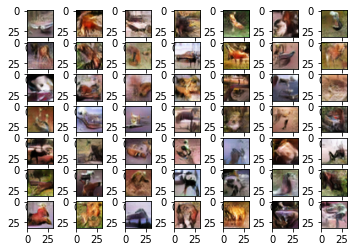

In [25]:
# train gan model

train_gan(g_model, d_model, gan_model, x_train, latent_dim)


In [17]:
# generate images with final generator model

model = tf.keras.models.load_model('generator_model_100.h5') # load model saved after 20 epochs

latent_points = generate_latent_points(10000,10000) # generate points in latent space

X = model.predict(latent_points) # generate images

X = (X + 1)/2.0 # scale the range from [-1,1] to [0,1]

In [18]:
X.shape

(10000, 32, 32, 3)

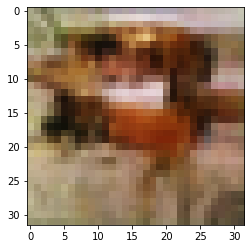

In [19]:
fig = plt.gcf()
fig.set_size_inches(20,20)
for i in range(10000):
    plt.imshow(X[i])
    plt.imsave('./image/'+str(i) +'.png',X[i])
    i += 1
    plt.close(fig)

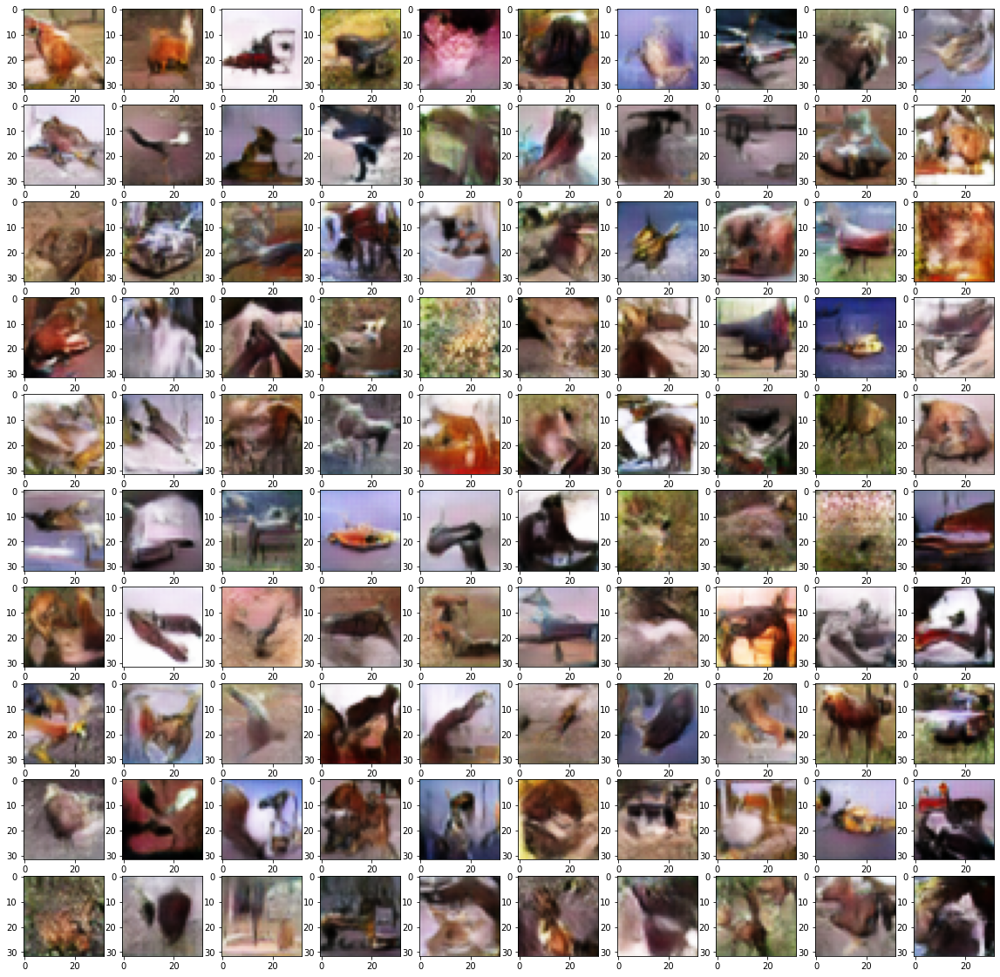

In [31]:
fig = plt.gcf()
fig.set_size_inches(20,20)
for i in range(100):
    plt.subplot(10,10,1+i)
    plt.imshow(X[i])